In [1]:
import numpy as np
import os
import datetime as datetime
import pandas as pd


os.system('source /home/jackalak/heartbeat/cdf38_0-dist/bin/definitions.B')
os.environ["CDF_LIB"] = '/home/jackalak/heartbeat/cdf38_0-dist/lib'
from spacepy import pycdf
import matplotlib.pyplot as plt


import numpy as np
import pandas as pd
from datetime import timedelta

from nasaomnireader import omnireader

import ftplib
import os

import pickle
import glob

Traceback (most recent call last):
  File "/usr/local/lib/python3.6/dist-packages/nasaomnireader-0.1.0-py3.6.egg/nasaomnireader/__init__.py", line 5, in <module>
    from nasaomnireader.omnireader_config import config
ModuleNotFoundError: No module named 'nasaomnireader.omnireader_config'

Solar wind data files will be saved to /home/jackalak/.local/share/nasaomnireader


In [2]:
def download_omni_data(t_start, t_end):

    #--------------------------------------------------------#
    #	OMNI Data - includes solar wind, and geomag params   #
    #--------------------------------------------------------#

    #get OMNI data
    omniInt = omnireader.omni_interval(t_start,t_end,'5min', cdf_or_txt = 'txt')

    #print(omniInt.cdfs[0].vars) #prints all the variables available on omni

    epochs = omniInt['Epoch'] #time array for omni 5min data
    By,Bz,AE,SymH = omniInt['BY_GSM'],omniInt['BZ_GSM'],omniInt['AE_INDEX'], omniInt['SYM_H']
    AL, AU = omniInt['AL_INDEX'],omniInt['AU_INDEX']
    vsw,psw = omniInt['flow_speed'], omniInt['Pressure']
    borovsky_reader = omnireader.borovsky(omniInt)
    borovsky = borovsky_reader()
    #newell_reader = omnireader.newell(omniInt)
    #newell = newell_reader()

    def NewellCF_calc(v,bz,by):
        # v expected in km/s
        # b's expected in nT    
        NCF = np.zeros_like(v)
        NCF.fill(np.nan)
        bt = np.sqrt(by**2 + bz**2)
        bztemp = bz
        bztemp[bz == 0] = .001
        #Caculate clock angle (theta_c = t_c)
        tc = np.arctan2(by,bztemp)
        neg_tc = bt*np.cos(tc)*bz < 0 
        tc[neg_tc] = tc[neg_tc] + np.pi
        sintc = np.abs(np.sin(tc/2.))
        NCF = (v**1.33333)*(sintc**2.66667)*(bt**0.66667)
        return NCF


    newell = NewellCF_calc(vsw, Bz, By)


    # 	proton_flux_10MeV, proton_flux_30MeV, proton_flux_60MeV = omniInt['PR-FLX_10'], omniInt['PR-FLX_30'], omniInt['PR-FLX_60']


    #calculate clock angle
    clock_angle = np.degrees(np.arctan2( By,Bz))
    clock_angle[clock_angle < 0] = clock_angle[clock_angle<0] + 360.

    #print('Got 5 minutes data')

    omniInt_1hr = omnireader.omni_interval(t_start,t_end,'hourly', cdf_or_txt = 'txt')
    F107,KP = omniInt_1hr['F10_INDEX'], omniInt_1hr['KP']
    KP = pd.DataFrame(np.repeat(KP,12,axis=0))
    F107 = pd.DataFrame(np.repeat(F107,12,axis=0))



    #put all in a dataframe and save

    dataframe = pd.DataFrame()
    dataframe['Bz'] = Bz
    dataframe['By'] = By
    dataframe['Vsw'] = vsw
    dataframe['Vx'] = omniInt['Vx']
    dataframe['Psw'] = psw
    dataframe['AE'] = AE
    dataframe['AL'] = AL
    dataframe['AU'] = AU
    dataframe['SymH'] = SymH
    dataframe['Clock Angle'] = clock_angle
    dataframe['newell'] = newell
    dataframe['borovsky'] = borovsky
    dataframe['Kp'] = KP
    dataframe['F107'] = F107
    dataframe['PC'] = omniInt['PC_N_INDEX']
    dataframe['Bx'] = omniInt['BX_GSE']
    # 	dataframe = dataframe.replace(9999.99, np.nan) #replace 9999.99 with nans ??????????????

    return dataframe




<CDF:
CHANNEL_ENERGIES: CDF_FLOAT [19] NRV
ELE_AVG_ENERGY: CDF_FLOAT [86400]
ELE_AVG_ENERGY_STD: CDF_FLOAT [86400]
ELE_COUNTS_BKG: CDF_FLOAT [86400, 19]
ELE_COUNTS_OBS: CDF_FLOAT [86400, 19]
ELE_DIFF_ENERGY_FLUX: CDF_FLOAT [86400, 19]
ELE_DIFF_ENERGY_FLUX_STD: CDF_FLOAT [86400, 19]
ELE_GEOMETRIC: CDF_DOUBLE [19] NRV
ELE_TOTAL_ENERGY_FLUX: CDF_FLOAT [86400]
ELE_TOTAL_ENERGY_FLUX_STD: CDF_FLOAT [86400]
Epoch: CDF_EPOCH [86400]
ION_AVG_ENERGY: CDF_FLOAT [86400]
ION_AVG_ENERGY_STD: CDF_FLOAT [86400]
ION_COUNTS_BKG: CDF_FLOAT [86400, 19]
ION_COUNTS_OBS: CDF_FLOAT [86400, 19]
ION_DIFF_ENERGY_FLUX: CDF_FLOAT [86400, 19]
ION_DIFF_ENERGY_FLUX_STD: CDF_FLOAT [86400, 19]
ION_GEOMETRIC: CDF_DOUBLE [19] NRV
ION_TOTAL_ENERGY_FLUX: CDF_FLOAT [86400]
ION_TOTAL_ENERGY_FLUX_STD: CDF_FLOAT [86400]
SC_AACGM_LAT: CDF_DOUBLE [86400]
SC_AACGM_LON: CDF_DOUBLE [86400]
SC_AACGM_LTIME: CDF_DOUBLE [86400]
SC_ECI: CDF_DOUBLE [86400, 3]
SC_ECI_LABEL: CDF_CHAR*5 [3] NRV
SC_GEOCENTRIC_LAT: CDF_DOUBLE [86400]
SC_GEOCENTRIC_LON: CDF_DOUBLE [86400]
SC_GEOCENTRIC_R: CDF_DOUBLE [86400]

In [3]:
class t_hist():
    '''
    Class which takes solar wind data and creates some time history
    for some specific time.
    
    Input:
        Data ---------- A DataFrame of solar wind data at 5 minute
                        cadence and datetime index.
        Historic_time - The number of minutes into the past you
                        would like the hisotry for. (E.g. for 1hr ago
                        you would input 60 minutes).
        window_mins --- If averaging for the time history, then this
                        input specifies the window length, in minutes,
                        centred on the historic_time specified.
    '''
    def __init__(self,data,historic_time,window_mins):
        self.data = data
        self.time = historic_time
        self.window = window_mins
        
    def avg_hist(self):
        '''
        Function which returns a historic_time value, averaged over
        the window_mins.
        
        Output:
            - A dataframe of values of the time history.
        '''
        # Check that indices are datetime
        self.is_datetime()
        
        if self.time % 60:
            raise ValueError('Please choose a historic time value '+
                             'which correspond to an integer '+
                             'number of hours!')
        
        window_s = timedelta(minutes = self.time + self.window/2.0)
        # '+5' ensures that the window is closed on the right
        window_e = timedelta(minutes = self.time + 5 -
                             self.window/2.0)
        indices = self.data.index
        
        hist = [self.data[i-window_s : i-window_e].mean().values
                for i in indices]
        
        col_label = '_'+str(self.time/60.0)[0]+'hr'
        columns = [i+col_label for i in self.data.columns]
        
        th_df = pd.DataFrame(hist, index=indices,columns=columns)
        
        return th_df[th_df.index[0]+window_s:]
    
    def instant_hist(self):
        '''
        Function which returns an instantaneous historic_time value.
        
        Output:
            - A dataframe of instantaneous values corresponding to
              historic_time minutes in the past.
        '''
        # Check that indices are datetime
        self.is_datetime()
        
        if self.time % 5:
            raise ValueError('Please choose a historic time value '+
                             'which correspond to a multiple of 5 '+
                             'minutes!')
            
        t_offset = timedelta(minutes=self.time)
        indices = self.data.index
        

        hist = [self.data.loc[i-t_offset].values
                 for i in self.data.index
                 if i >= indices[0]+t_offset]
        
        if self.time < 60:
            if self.time >= 10:
                col_label = '_'+str(self.time)[0:2]+'min'
            else:
                col_label = '_'+str(self.time)[0]+'min'
        else:
            col_label = '_'+str(self.time/60.0)[0]+'hr_I'
        columns = [i+col_label for i in self.data.columns]
        return pd.DataFrame(hist, index=indices[int(self.time/5):],
                            columns=columns)
    
    def is_datetime(self):
        dt_type = pd.core.indexes.datetimes.DatetimeIndex
        if type(self.data.index) != dt_type:
            raise ValueError('Dataframe index is not '+
                             'in the correct datetime '+
                             'format')
        else:
            pass


# In[3]:

def cleaning_data(data,safe_cols=[],sigma_val=4):
    '''
    Function which removes data which is 'sigma_val' stdevs from
    the mean.

    Note: 4 sigma encompasses ~99.994% of the data.
          ~1 real piece of 5 min data is removed for
          every 55 days of such data (assuming Gaussian).

    Inputs:
    sigma_val - (float) number of standard deviations from the
                mean to consider as the limit of 'good' data.
    safe_cols - Columns in the data which one might like to
                keep without any changes (i.e., if there are
                no null values in the initial dataset etc.).

    Returns:
     - Cleaned solar wind data dataframe.
     - Dataframe of 'bad' solar wind data.
    '''

#   Initialising data and empty lists
    sw_df = data
    cleaned_cols = []
    trash_data = []
#   Looping through dataframe columns and removing 'bad' values
    for i in sw_df.columns:
        if i not in safe_cols:
            std = sw_df[i].std()
            mean = sw_df[i].mean()

            cleaned = sw_df[i][sw_df[i]<mean+std*sigma_val]
            trash = sw_df[i][sw_df[i]>=mean+std*sigma_val]

            cleaned_cols.append(cleaned)
            trash_data.append(trash)
        else:
            cleaned_cols.append(sw_df[i])
            trash_data.append([np.nan])
#   Initialising empty dataframes and appending data
    sw_c_df = pd.DataFrame()
    trash_df = pd.DataFrame()

    for i in range(len(sw_df.columns)):
#         sw_c_df[sw_df.columns[i]] = cleaned_cols[i]
#         sw_c_df = sw_c_df
        sw_c_df_temp = pd.DataFrame(cleaned_cols[i],
                                 columns=[sw_df.columns[i]])
        sw_c_df = pd.concat([sw_c_df,sw_c_df_temp], axis=1)

        trash_df_temp = pd.DataFrame(trash_data[i],
                                     columns=[sw_df.columns[i]])
        trash_df = pd.concat([trash_df,trash_df_temp], axis=1)

#   Checking if the trash data contains non-'bad' data.
    check_trash(trash_df)
    return (sw_c_df, trash_df)

#################################

def sw_interp(data,method='linear'):
    '''
    Function which interpolates NaN values in the cleaned
    data dataframe.

    See Pandas documentation for other methods.

    Input:
    method - method of interpolation.

    Return:
     - Cleaned, interpolated data.
    '''
    return data.interpolate(method=method)

#################################

def check_trash(trash_data):
    '''
    Function which checks to see if all the removed data
    is the 'bad' data fill value.

    Returns:
     - String detailing which parameters have had real
       removed from them.
    '''
    for i in trash_data.columns:
        if (trash_data[i].mean() <
            trash_data[i].max()):
            print('Some real data has been removed from: ',i)
        else:
            pass

# In[4]:

def time_history(data,auto=True):
    '''
    Function which calculates time history information
    given an input dataframe.
    
    Averages are centred on the respective time-history
    specified.
    
    Input:
    data - a Pandas DataFrame containing 5 minute cadence
           data.
           MUST HAVE DATETIME INDEX.
    auto - Whether or not to automatically clean the data.
           If not True, then the cleaning_data() and
           sw_interp() functions must be called individually
           and the results of sw_interp() should be the data
           fed to this function, time_history(). Set to false
           to retrieve the non-interpolated data and the trash
           data.
    
    Output:
    A concatenated DataFrame containing
        - the original data
        - t-6hrs (1hr avg)
        - t-5hrs (1hr avg)
        - t-3hrs (30min avg)
        - t-1hrs (30min avg)
        - t-45min (instant)
        - t-30min (instant)
        - t-15min (instant)
        - t-10min (instant)
        - t-5min (instant)
    '''
    if auto is True:
        c_data,t_data = cleaning_data(data,sigma_val=4,
                                  safe_cols=[None])
        c_i_data = sw_interp(c_data,method='linear')
        
        data = c_i_data
    else:
        pass
    return pd.concat((data,
                      t_hist(data,360,60).avg_hist(),
                      t_hist(data,300,60).avg_hist(),
                      t_hist(data,180,30).avg_hist(),
                      t_hist(data,60,30).avg_hist(),
                      t_hist(data,45,0).instant_hist(),
                      t_hist(data,30,0).instant_hist(),
                      t_hist(data,15,0).instant_hist(),
                      t_hist(data,10,0).instant_hist(),
                      t_hist(data,5,0).instant_hist()),axis=1)

In [4]:
def _is_ftp_dir(ftp_handle, name, guess_by_extension=True):
    """ simply determines if an item listed on the ftp server is a valid directory or not """

    # if the name has a "." in the fourth to last position, its probably a file extension
    # this is MUCH faster than trying to set every file to a working directory, and will work 99% of time.
    if guess_by_extension is True:
        if name[-4] == '.':
            return False

    original_cwd = ftp_handle.pwd()     # remember the current working directory
    try:
        ftp_handle.cwd(name)            # try to set directory to new name
        ftp_handle.cwd(original_cwd)    # set it back to what it was
        return True
    except:
        return False


def _make_parent_dir(fpath):
    """ ensures the parent directory of a filepath exists """
    dirname = os.path.dirname(fpath)
    while not os.path.exists(dirname):
        try:
            os.mkdir(dirname)
            print("created {0}".format(dirname))
        except:
            _make_parent_dir(dirname)


def _download_ftp_file(ftp_handle, name, dest, overwrite):
    """ downloads a single file from an ftp server """
    _make_parent_dir(dest)
    if not os.path.exists(dest) or overwrite is True:
        with open(dest, 'wb') as f:
            ftp_handle.retrbinary("RETR {0}".format(name), f.write)
        print("downloaded: {0}".format(dest))
    else:
        print("already exists: {0}".format(dest))


def _mirror_ftp_dir(ftp_handle, name, overwrite, guess_by_extension):
    """ replicates a directory on an ftp server recursively """
    for item in ftp_handle.nlst(name):
        if _is_ftp_dir(ftp_handle, item):
            _mirror_ftp_dir(ftp_handle, item, overwrite, guess_by_extension)
        else:
            _download_ftp_file(ftp_handle, item, item, overwrite)


def download_ftp_tree(ftp_handle, path, destination, overwrite=False, guess_by_extension=True):
    """
    Downloads an entire directory tree from an ftp server to the local destination

    :param ftp_handle: an authenticated ftplib.FTP instance
    :param path: the folder on the ftp server to download
    :param destination: the local directory to store the copied folder
    :param overwrite: set to True to force re-download of all files, even if they appear to exist already
    :param guess_by_extension: It takes a while to explicitly check if every item is a directory or a file.
        if this flag is set to True, it will assume any file ending with a three character extension ".???" is
        a file and not a directory. Set to False if some folders may have a "." in their names -4th position.
    """
    os.chdir(destination)
    _mirror_ftp_dir(ftp_handle, path, overwrite, guess_by_extension)

In [5]:
## *** UNCOMMENT TO DOWLOAD ALL DMSP CDF FILES, WILL TAKE LIKE 3 DAYS TO RUN, YOU NEED >100 GB OF SPACE

# from ftplib import FTP_TLS
# ftp=FTP_TLS('cdaweb.gsfc.nasa.gov')
# ftp.login()
# ftp.dir()
# for i in [6,7,8,9,12,13,14,15,16,17,18]:
#     directory = 'pub/data/dmsp/dmspf'
#     if i <10:
#         directory = directory + '0'
#     directory = directory + str(i) + '/ssj/precipitating-electrons-ions'
#     download_ftp_tree(ftp, directory, '/home/jackalak/Desktop')

In [ ]:
# *** UNCOMMENT TO PROCESS THE WHOLE CDF DMSP DATABASE AND CREATE PICKLE FILES WITH THE NASAOMNI 5 MIN DATA
#MUST RUN THE PREVIOUS BLOCK FIRST

years = {6:[1987], 7:[1987],8:[1987],9:[1988]
         ,12:[2000,2001,2002], 13:[2000,2001,2002,2003,2004,2005,2006,2007],14:[2000,2001,2002,2003,2004,2005],
         15:[2000,2001,2002,2003,2004,2005,2006,2007,2008,2009],
         16:[2010,2011,2012,2013,2014], #year 2003-2009 is not accessible on site
         17:[2009,2010,2011,2012,2013,2014],
         18:[2010,2011,2012,2013,2014],#2009 not accessible
        } 


dmsp_feature_list = ['ELE_AVG_ENERGY','ELE_AVG_ENERGY_STD','ELE_TOTAL_ENERGY_FLUX','ELE_TOTAL_ENERGY_FLUX_STD',
                     'SC_AACGM_LAT',  'SC_AACGM_LON','SC_AACGM_LTIME',] 
#                     'ION_AVG_ENERGY','ION_AVG_ENERGY_STD','ION_TOTAL_ENERGY_FLUX','ION_TOTAL_ENERGY_FLUX_STD','SC_GEOCENTRIC_LAT','SC_GEOCENTRIC_LON','SC_GEOCENTRIC_R']
dmsp_feature_list_19 =['ELE_COUNTS_BKG','ELE_COUNTS_OBS','ELE_DIFF_ENERGY_FLUX','ELE_DIFF_ENERGY_FLUX_STD',
                  'CHANNEL_ENERGIES','ELE_COUNTS_BKG','ELE_COUNTS_OBS',]
#                  'ELE_GEOMETRIC','ION_COUNTS_BKG','ION_COUNTS_OBS','ION_DIFF_ENERGY_FLUX','ION_DIFF_ENERGY_FLUX_STD','ION_GEOMETRIC',
#                  'SC_ECI','SC_ECI_LABEL']
                 
all_sc_df = pd.DataFrame()
count = 0
for ii in [17,18,6,7,8,9,12,13,14,15,16,]:
    sc_df = pd.DataFrame()
    print(ii)
    directory = '/home/jackalak/Desktop/pub/data/dmsp/dmspf'
    if ii <10:
        directory = directory + '0'
    directory = directory + str(ii) + '/ssj/precipitating-electrons-ions'
    for year in years[ii]:
        print(year)
        file_list=glob.glob(directory + '/'+str(year)+'/*')
        for file in file_list:

            try:
                
                count = count+1
                month = int(file[-15:-13])
                day = int(file[-13:-11])
                base = datetime.datetime(year, month, day)
                indices = np.array([base + datetime.timedelta(minutes=iii) for iii in range(0,60*24)])
                df = pd.DataFrame(data=indices,columns=['index'])
                cdf = pycdf.CDF(file)
                count = count+1
                for feature in dmsp_feature_list:
                    df[feature] = cdf[feature][0:60*60*24:60]
                    
                ch_energies = cdf['CHANNEL_ENERGIES']
                ch_energies = np.flip((ch_energies[:]))
                temp_jN = (pd.DataFrame(cdf['ELE_COUNTS_OBS'])- pd.DataFrame(cdf['ELE_COUNTS_BKG'])).values[0:60*60*24:60]
                df['ELE_TOTAL_COUNTS'] = temp_jN[:,0]*(ch_energies[1]-ch_energies[0])
                + temp_jN[:,18]*(ch_energies[18]-ch_energies[17])
                for i in range(1,18):
                    df['ELE_TOTAL_COUNTS'] = df['ELE_TOTAL_COUNTS']  +     temp_jN[:,i]*(ch_energies[i+1]-ch_energies[i-1])/2.
                
                for i in range(0,19):
                    name = 'ELE_COUNT_'+str(i+1)
                    df[name]=temp_jN[:,i]
                for i in range(0,19):
                    name = 'ELE_diff_'+str(i+1)
                    df[name]=cdf['ELE_DIFF_ENERGY_FLUX'][0:60*60*24:60,i]
                
                df = df.set_index('index')
                df.index = pd.to_datetime(df.index)
                
                #Create a time window
                df = df[df['ELE_TOTAL_ENERGY_FLUX'] > 0].dropna(subset=['ELE_TOTAL_ENERGY_FLUX'])

                 #Create a time window
                sTimeIMF = datetime.datetime(year,month,day)
                eTimeIMF = sTimeIMF + datetime.timedelta(hours = 24)

                df_omni_5min = download_omni_data(sTimeIMF- datetime.timedelta(hours = 6),
                                             eTimeIMF+ datetime.timedelta(hours = 6))
                #print('df_omni_5min',df_omni_5min.shape)#, df_omni_5min)
                indices = np.array([sTimeIMF- datetime.timedelta(hours = 6)+ datetime.timedelta(minutes=5*iii) for iii in range(0,df_omni_5min.shape[0])])
                #print('indices',indices.shape)#, indices)

                df_omni_5min = pd.DataFrame(data=df_omni_5min.values,columns=df_omni_5min.columns, index=indices)


                # call time_history to clean up omnireader data        
                df_omni_5min_cleaned = time_history(df_omni_5min)
                df_omni_1min_cleaned = pd.DataFrame(np.repeat(df_omni_5min_cleaned.values,5,axis=0))

                #create the indices
                indices = []
                for index in df_omni_5min_cleaned.index:
                    indices.append(index)
                    indices.append(index+ datetime.timedelta(minutes=1))
                    indices.append(index+ datetime.timedelta(minutes=2))
                    indices.append(index+ datetime.timedelta(minutes=3))
                    indices.append(index+ datetime.timedelta(minutes=4))
                df_omni_1min_cleaned = pd.DataFrame(data=df_omni_1min_cleaned.values,columns=df_omni_5min_cleaned.columns,
                                                    index=indices)    

                intersection_indices = df_omni_1min_cleaned.index.intersection(df.index)

                df = df.loc[intersection_indices]
                df_omni_1min_cleaned = df_omni_1min_cleaned.loc[intersection_indices]

                #combine Omni and DMSP data
                for feature in df_omni_1min_cleaned.columns:
                    df[feature] = df_omni_1min_cleaned[feature]  
                
                sc_df = pd.concat([sc_df,df])
                
            except Exception as e: 
                print('Error')
                print(e)
                print(file)

       
        

        sc_df['SC_ID']= ii
    
    filescname = "./all_sc_df_" + str(ii) + ".pkl"
    pickling_on = open(filescname,"wb")
    pickle.dump(sc_df, pickling_on,protocol=4)

    #all_sc_df = pd.concat([all_sc_df,sc_df])   

17
2009
(105120,)
Created interval between 2009-12-19 and 2009-12-21, cadence 5min, start index 101592, end index 102024
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-12-19 and 2009-12-21, cadence hourly, start index 8466, end index 8502
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  AE
(105120,)
Created interval between 2009-09-30 and 2009-10-02, cadence 5min, start index 78552, end index 78984
(8760,)
Created interval between 2009-09-30 and 2009-10-02, cadence hourly, start index 6546, end index 6582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2009-11-11 and 2009-11-13, cadence 5min, start index 90648, end index 91080
(8760,)
Created interval between 2009-11-11 and 2009-11-13, cadence hourly, start index 7554, end index 7590

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2009-02-21 and 2009-02-23, cadence 5min, start index 14904, end index 15336
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-02-21 and 2009-02-23, cadence hourly, start index 1242, end index 1278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2009-05-30 and 2009-06-01, cadence 5min, start index 43128, end index 43560
(8760,)
Created interval between 2009-05-30 and 2009-06-01, cadence hourly, start index 3594, end index 3630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2009-02-27 and 2009-03-01, cadence 5min, start index 16632, end index 17064
(8760,)
Created interval between 2009-02-27 and 2009-03-01, cadence hourly, start index 1386, end index 1422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2009-06-09 and 2009-06-11, cadence 5min, start index 46008, end index 46440
(8760,)
Created interval between 2009-06-09 and 2009-06-11, cadence hourly, start index 3834, end index 3870

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-02-05 and 2009-02-07, cadence 5min, start index 10296, end index 10728
(8760,)
Created interval between 2009-02-05 and 2009-02-07, cadence hourly, start index 858, end index 894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-04-30 and 2009-05-02, cadence 5min, start index 34488, end index 34920
(8760,)
Created interval between 2009-04-30 and 2009-05-02, cadence hourly, start index 2874, end index 2910
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-03-16 and 2009-03-18, cadence 5min, start index 21528, end index 21960
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-03-16 and 2009-03-18, cadence hourly, start index 1794, end index 1830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-05-03 and 2009-05-05, cadence 5min, start index 35352, end index 35784
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-05-03 and 2009-05-05, cadence hourly, start index 2946, end index 2982
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2009-08-22 and 2009-08-24, cadence 5min, start index 67320, end index 67752
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-08-22 and 2009-08-24, cadence hourly, start index 5610, end index 5646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-11-24 and 2009-11-26, cadence 5min, start index 94392, end index 94824
(8760,)
Created interval between 2009-11-24 and 2009-11-26, cadence hourly, start index 7866, end index 7902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-02-02 and 2009-02-04, cadence 5min, start index 9432, end index 9864
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-02-02 and 2009-02-04, cadence hourly, start index 786, end index 822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-12-01 and 2009-12-03, cadence 5min, start index 96408, end index 96840
(8760,)
Created interval between 2009-12-01 and 2009-12-03, cadence hourly, start index 8034, end index 8070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2009-07-20 and 2009-07-22, cadence 5min, start index 57816, end index 58248
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-07-20 and 2009-07-22, cadence hourly, start index 4818, end index 4854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-08-07 and 2009-08-09, cadence 5min, start index 63000, end index 63432
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-08-07 and 2009-08-09, cadence hourly, start index 5250, end index 5286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2009-06-11 and 2009-06-13, cadence 5min, start index 46584, end index 47016
(8760,)
Created interval between 2009-06-11 and 2009-06-13, cadence hourly, start index 3882, end index 3918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-01-30 and 2009-02-01, cadence 5min, start index 8568, end index 9000
(8760,)
Created interval between 2009-01-30 and 2009-02-01, cadence hourly, start index 714, end index 750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-01-09 and 2009-01-11, cadence 5min, start index 2520, 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-01-09 and 2009-01-11, cadence hourly, start index 210, end index 246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-03-20 and 2009-03-22, cadence 5min, start index 22680, end index 23112
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-03-20 and 2009-03-22, cadence hourly, start index 1890, end index 1926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-04-04 and 2009-04-06, cadence 5min, start index 27000, end index 27432
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-04-04 and 2009-04-06, cadence hourly, start index 2250, end index 2286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2009-09-11 and 2009-09-13, cadence 5min, start index 73080, end index 73512
(8760,)
Created interval between 2009-09-11 and 2009-09-13, cadence hourly, start index 6090, end index 6126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-05-17 and 2009-05-19, cadence 5min, start index 39384, end index 39816
(8760,)
Created interval between 2009-05-17 and 2009-05-19, cadence hourly, start index 3282, end index 3318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(10512

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-11-03 and 2009-11-05, cadence hourly, start index 7362, end index 7398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-12-14 and 2009-12-16, cadence 5min, start index 100152, end index 100584
(8760,)
Created interval between 2009-12-14 and 2009-12-16, cadence hourly, start index 8346, end index 8382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2009-03-30 and 2009-04-01, cadence 5min, start index 25560, end index 25992
(8760,)
Created interval between 2009-03-30 and 2009-04-01, cadence hourly, start index 2130, end index 2166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2009-05-14 and 2009-05-16, cadence 5min, start index 38520, end index 38952
(8760,)
Created interval between 2009-05-14 and 2009-05-16, cadence hourly, start index 3210, end index 3246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-03-11 and 2009-03-13, cadence 5min, start index 20088, end index 20520
(8760,)
Created interval between 2009-03-11 and 2009-03-13, cadence hourly, start index 1674, end index 1710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  Bx
(105120,)
Created interval between 2009-10-04 and 2009-10-06, cadence 5min, start index 79704, end index 80136
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-10-04 and 2009-10-06, cadence hourly, start index 6642, end index 6678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
(105120,)
Created interval between 2009-09-29 and 2009-10-01, cadence 5min, start index 78264, end index 78696
(8760,)
Created interval between 2009-09-29 and 2009-10-01, cadence hourly, start index 6522, end index 6558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-02-14 and 2009-02-16, cadence 5min, start index 12888, end index 13320
(8760,)
Created interval between 2009-02-14 and 2009-02-16, cadence hourly, start index 1074, end index 1110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2009-05-23 and 2009-05-25, cadence 5min, start index 4

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2009-05-27 and 2009-05-29, cadence 5min, start index 42264, end index 42696
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-05-27 and 2009-05-29, cadence hourly, start index 3522, end index 3558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-05-24 and 2009-05-26, cadence 5min, start index 41400, end index 41832
(8760,)
Created interval between 2009-05-24 and 2009-05-26, cadence hourly, start index 3450, end index 3486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-08-05 and 2009-08-07, cadence 5min, start index 62424, end index 62856
(8760,)
Created interval between 2009-08-05 and 2009-08-07, cadence hourly, start index 5202, end index 5238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-04-29 and 2009-05-01, cadence 5min, start index 34200, end index 34632
(8760,)
Created interval between 2009-04-29 and 2009-05-01, cadence hourly, start index 2850, end index 2886
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-10-21 and 2009-10-23, cadence 5min, start index 84600, end index 85032
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-10-21 and 2009-10-23, cadence hourly, start index 7050, end index 7086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2009-02-12 and 2009-02-14, cadence 5min, start index 12312, end index 12744
(8760,)
Created interval between 2009-02-12 and 2009-02-14, cadence hourly, start index 1026, end index 1062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-08-04 and 2009-08-06, cadence 5min, start index 62136, end index 62568
(8760,)
Created interval between 2009-08-04 and 2009-08-06, cadence hourly, start index 5178, end index 5214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2009-09-03 a

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2009-09-03 and 2009-09-05, cadence hourly, start index 5898, end index 5934
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-09-27 and 2009-09-29, cadence 5min, start index 77688, end index 78120
(8760,)
Created interval between 2009-09-27 and 2009-09-29, cadence hourly, start index 6474, end index 6510
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-04-13 and 2009-04-15, cadence 5min, start index 29592, end index 30024
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-04-13 and 2009-04-15, cadence hourly, start index 2466, end index 2502
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2009-08-13 and 2009-08-15, cadence 5min, start index 64728, end index 65160
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-08-13 and 2009-08-15, cadence hourly, start index 5394, end index 5430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2009-10-02 and 2009-10-04, cadence 5min, start index 79128, end index 79560
(8760,)
Created interval between 2009-10-02 and 2009-10-04, cadence hourly, start index 6594, end index 6630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-06-19 and 2009-06-21, cadence 5min, start index 48888, end index 49320
(8760,)
Created interval between 2009-06-19 and 2009-06-21, cadence hourly, start index 4074, end index 4110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-05-22 and 2009-05-24, cadence hourly, start index 3402, end index 3438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2009-02-13 and 2009-02-15, cadence 5min, start index 12600, end index 13032
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-02-13 and 2009-02-15, cadence hourly, start index 1050, end index 1086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-07-27 and 2009-07-29, cadence 5min, start index 59832, end index 60264
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-07-27 and 2009-07-29, cadence hourly, start index 4986, end index 5022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2009-09-14 and 2009-09-16, cadence 5min, start index 73944, end index 74376
(8760,)
Created interval between 2009-09-14 and 2009-09-16, cadence hourly, start index 6162, end index 6198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2009-05-18 and 2009-05-20, cadence 5min, start index 39672, end index 40104
(8760,)
Created interval between 2009-05-18 and 2009-05-20, cadence hourly, start index 3306, end index 3342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2009-02-09 and 2009-02-11, cadence 5min, start index 11448, end index 11880
(8760,)
Created interval between 2009-02-09 and 2009-02-11, cadence hourly, start index 954, end index 990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2009-09-25 and 2009-09-27, cadence 5min, start index 77112, end index 77544
(8760,)
Created interval between 2009-09-25 and 2009-09-27, cadence hourly, start index 6426, end index 6462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2009-08-26 and 2009-08-28, cadence 5min, start index 68472, end index 68904
(8760,)
Created interval between 2009-08-26 and 2009-08-28, cadence hourly, start index 5706, end index 5742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2009-08-14 and 2009-08-16, cadence 5min, start index 65016, end index 65448
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-08-14 and 2009-08-16, cadence hourly, start index 5418, end index 5454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-12-03 and 2009-12-05, cadence 5min, start index 96984, end index 97416
(8760,)
Created interval between 2009-12-03 and 2009-12-05, cadence hourly, start index 8082, end index 8118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-05-12 and 2009-05-14, cadence 5min, start index 37944, end index 38376
(8760,)
Created interval between 2009-05-12 and 2009-05-14, cadence hourly, start index 3162, end index 3198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-07-14 and 2009-07-16, cadence 5min, start index 56088, end index 56520
(8760,)
Created interval between 2009-07-14 and 2009-07-16, cadence hourly, start index 4674, end index 4710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2009-07-02 and 2009-07-04, cadence 5min, start index 52632, end index 53064
(8760,)
Created interval between 2009-07-02 and 2009-07-04, cadence hourly, start index 4386, end index 4422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-06-08 and 2009-06-10, cadence 5min, start index 45720, end index 46152
(8760,)
Created interval between 2009-06-08 and 2009-06-10, cadence hourly, start index 3810, end index 3846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2009-10-25 and 2009-10-27, cadence 5min, start index 85752, end index 86184
(8760,)
Created interval between 2009-10-25 and 2009-10-27, cadence hourly, start index 7146, end index 7182
Applying transform Hourly Kp*10 -> K

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-03-31 and 2009-04-02, cadence 5min, start index 25848, end index 26280
(8760,)
Created interval between 2009-03-31 and 2009-04-02, cadence hourly, start index 2154, end index 2190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Vsw
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-07-29 and 2009-07-31, cadence 5min, start index 60408, end index 60840
(8760,)
Created interval between 2009-07-29 and 2009-07-31, cadence hourly, start index 5034, end index 5070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2009-10-26 and 2009-10-28, cadence 5min, start index 86040, end index 86472
(8760,)
Created interval between 2009-10-26 and 2009-10-28, cadence hourly, start index 7170, end index 7206

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-01-11 and 2009-01-13, cadence 5min, start index 3096, end index 3528


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2009-01-11 and 2009-01-13, cadence hourly, start index 258, end index 294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2009-04-22 and 2009-04-24, cadence 5min, start index 32184, end index 32616
(8760,)
Created interval between 2009-04-22 and 2009-04-24, cadence hourly, start index 2682, end index 2718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-08-12 and 2009-08-14, cadence 5min, start index 64440, end index 64872
(8760,)
Created interval between 2009-08-12 and 2009-08-14, cadence hourly, start index 5370, end index 5406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2009-09-19 and 2009-09-21, cadence 5min, start index 75384, end index 75816
(8760,)
Created interval between 2009-09-19 and 2009-09-21, cadence hourly, start index 6282, end index 6318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-12-02 and 2009-12-04, cadence 5min, start index 96696, end index 97128
(8760,)
Created interval between 2009-12-02 and 2009-12-04, cadence hourly, start index 8058, end index 8094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-03-18 and 2009-03-20, cadence 5min, start index 22104, end index 22536
(8760,)
Created interval between 2009-03-18 and 2009-03-20, cadence hourly, start index 1842, end index 1878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-12-04 and 2009-12-06, cadence 5min, start index 97272, end index 97704
(8760,)
Created interval between 2009-12-04 and 2009-12-06, cadence hourly, start index 8106, end index 8142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-02-08 and 2009-02-10, cadence 5min, start index 11160, end index 11592
(8760,)
Created interval between 2009-02-08 and 2009-02-10, cadence hourly, start index 930, end index 966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2009-02-17 and 2009-02-19, cadence 5min, start index 13752, end index 14184
(8760,)
Created interval between 2009-02-17 and 2009-02-19, cadence hourly, start index 1146, end index 1182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-08-16 and 2009-08-18, cadence 5min, start index 65592, end index 66024
(8760,)
Created interval between 2009-08-16 and 2009-08-18, cadence hourly, start index 5466, end index 5502
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-05-13 and 2009-05-15, cadence 5min, start index 38232, end index 38664
(8760,)
Created interval between 2009-05-13 and 2009-05-15, cadence hourly, start index 3186, end index 3222
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-01-03 and 2009-01-05, cadence 5min, start index 792, end index 1224
(8760,)
Created interval between 2009-01-03 and 2009-01-05, cadence hourly, start index 66, end index 102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-10-14 and 2009-10-16, cadence 5min, start index 82584, end index 83016
(8760,)
Created interval between 2009-10-14 and 2009-10-16, cadence hourly, start index 6882, end index 6918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Bx
(105120,)
Created interval between 2009-02-16 and 2009-02-18, cadence 5min, start index 13464, end index 13896
(8760,)
Created interval between 2009-02-16 and 2009-02-18, cadence hourly, start index 1122, end index 1158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-05-01 and 2009-05-03, cadence 5min, start index 34776, end index 35208
(8760,)
Created interval between 2009-05-01 and 2009-05-03, cadence hourly, start index 2898, end index 2934
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-02-25 and 2009-02-27, cadence 5min, start index 16056, end index 16488
(8760,)
Created interval between 2009-02-25 and 2009-02-27, cadence hourly, start index 1338, end index 1374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-07-28 and 2009-07-30, cadence 5min, start index 60120, end index 60552
(8760,)
Created interval between 2009-07-28 and 2009-07-30, cadence hourly, start index 5010, end index 5046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2009-06-07 and 2009-06-09, cadence 5min, start index 45432, end index 45864
(8760,)
Created interval between 2009-06-07 and 2009-06-09, cadence hourly, start index 3786, end index 3822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-03-01 and 2009-03-03, cadence 5min, st

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-08-08 and 2009-08-10, cadence 5min, start index 63288, end index 63720
(8760,)
Created interval between 2009-08-08 and 2009-08-10, cadence hourly, start index 5274, end index 5310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2009-04-09 and 2009-04-11, cadence 5min, start index 28440, end index 28872
(8760,)
Created interval between 2009-04-09 and 2009-04-11, cadence hourly, start index 2370, end index 2406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2009-03-14 and 2009-03-16, cadence 5min, start index 20952, end index 21384
(8760,)
Created interval between 2009-03-14 and 2009-03-16, cadence hourly, start index 1746, end index 1782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-11-17 and 2009-11-19, cadence 5min, start index 92376, end index 92808
(8760,)
Created interval between 2009-11-17 and 2009-11-19, cadence hourly, start index 7698, end index 7734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2009-07-18 and 2009-07-20, cadence 5min, start index 57240, end index 57672
(8760,)
Created interval between 2009-07-18 and 2009-07-20, cadence hourly, start index 4770, end index 4806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-04-28 and 2009-04-30, cadence 5min, start index 33912, end index 34344
(8760,)
Created interval between 2009-04-28 and 2009-04-30, cadence hourly, start index 2826, end index 2862
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-05-04 and 2009-05-06, cadence 5min, start index 35640, end index 36072
(8760,)
Created interval between 2009-05-04 and 2009-05-06, cadence hourly, start index 2970, end index 3006
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-12-16 and 2009-12-18, cadence 5min, start index 100728, end index 101160
(8760,)
Created interval between 2009-12-16 and 2009-12-18, cadence hourly, start index 8394, end index 8430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2009-06-04 and 2009-06-06, cadence 5min, start index 44568, end index 45000
(8760,)
Created interval between 2009-06-04 and 2009-06-06, cadence hourly, start index 3714, end index 3750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2009-03-05 and 2009-03-07, cadence 5min, sta

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-07-05 and 2009-07-07, cadence 5min, start index 53496, end index 53928
(8760,)
Created interval between 2009-07-05 and 2009-07-07, cadence hourly, start index 4458, end index 4494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-12-28 and 2009-12-30, cadence 5min, start index 104184, end index 104616
(8760,)
Created interval between 2009-12-28 and 2009-12-30, cadence hourly, start index 8682, end index 8718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-04-02 and 2009-04-04, cadence 5min, start index 26424, end index 26856
(8760,)
Created interval between 2009-04-02 and 2009-04-04, cadence hourly, start index 2202, end index 2238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-10-31 and 2009-11-02, cadence 5min, start index 87480, end index 87912
(8760,)
Created interval between 2009-10-31 and 2009-11-02, cadence hourly, start index 7290, end index 7326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-07-23 and 2009-07-25, cadence 5min, start index 58680, end index 59112
(8760,)
Created interval between 2009-07-23 and 2009-07-25, cadence hourly, start index 4890, end index 4926
Applying transform Hourly Kp*10 -> K

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2009-01-18 and 2009-01-20, cadence 5min, start index 5112, end index 5544
(8760,)
Created interval between 2009-01-18 and 2009-01-20, cadence hourly, start index 426, end index 462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2009-05-21 and 2009-05-23, cadence 5min, start index 40536, end index 40968
(8760,)
Created interval between 2009-05-21 and 2009-05-23, cadence hourly, start index 3378, end index 3414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-08-03 and 2009-08-05, cadence 5min, start index 61848, end index 62280
(8760,)
Created interval between 2009-08-03 and 2009-08-05, cadence hourly, start index 5154, end index 5190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-10-22 and 2009-10-24, cadence 5min, start index 84888, end index 85320
(8760,)
Created interval between 2009-10-22 and 2009-10-24, cadence hourly, start index 7074, end index 7110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 2009-12-24 and 2009-12-26, cadence 5min, start index 103032, end index 103464
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-12-24 and 2009-12-26, cadence hourly, start index 8586, end index 8622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-10-06 and 2009-10-08, cadence 5min, start index 80280, end index 80712
(8760,)
Created interval between 2009-10-06 and 2009-10-08, cadence hourly, start index 6690, end index 6726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-10-27 and 2009-10-29, cadence 5min, start index 86328, end index 86760
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-10-27 and 2009-10-29, cadence hourly, start index 7194, end index 7230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2009-02-15 and 2009-02-17, cadence 5min, start index 13176, end index 13608
(8760,)
Created interval between 2009-02-15 and 2009-02-17, cadence hourly, start index 1098, end index 1134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-01-19 and 2009-01-21, cadence 5min, start index 5400, end index 5832
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-01-19 and 2009-01-21, cadence hourly, start index 450, end index 486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2009-10-18 and 2009-10-20, cadence 5min, start index 83736, end index 84168
(8760,)
Created interval between 2009-10-18 and 2009-10-20, cadence hourly, start index 6978, end index 7014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-08-18 and 2009-08-20, cadence 5min, start index 66168, end index 66600
(8760,)
Created interval between 2009-08-18 and 2009-08-20, cadence hourly, start index 5514, end index 5550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2009-03-06 and 2009-03-08, cadence 5min, start index 18648, end index 19080
(8760,)
Created interval between 2009-03-06 and 2009-03-08, cadence hou

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2009-07-08 and 2009-07-10, cadence 5min, start index 54360, end index 54792
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-07-08 and 2009-07-10, cadence hourly, start index 4530, end index 4566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-03-29 and 2009-03-31, cadence 5min, start index 25272, end index 25704
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-03-29 and 2009-03-31, cadence hourly, start index 2106, end index 2142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  PC
(105120,)
Created interval between 2009-04-16 and 2009-04-18, cadence 5min, start index 30456, end index 30888
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-04-16 and 2009-04-18, cadence hourly, start index 2538, end index 2574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-11-16 and 2009-11-18, cadence 5min, start index 92088, end index 92520
(8760,)
Created interval between 2009-11-16 and 2009-11-18, cadence hourly, start index 7674, end index 7710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-04-23 and 2009-04-25, cadence 5min, start index 32472, end index 32904
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-04-23 and 2009-04-25, cadence hourly, start index 2706, end index 2742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-06-16 and 2009-06-18, cadence 5min, start index 48024, end index 48456
(8760,)
Created interval between 2009-06-16 and 2009-06-18, cadence hourly, start index 4002, end index 4038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2009-05-05 and 2009-05-07, cadence 5min, start index 35928, end index 36360
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-05-05 and 2009-05-07, cadence hourly, start index 2994, end index 3030
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-04-20 and 2009-04-22, cadence 5min, start index 31608, end index 32040
(8760,)
Created interval between 2009-04-20 and 2009-04-22, cadence hourly, start index 2634, end index 2670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-06-10 and 2009-06-12, cadence 5min, start index 46296, end index 46728
(8760,)
Created interval between 2009-06-10 and 2009-06-12, cadence hourly, start index 3858, end index 3894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2009-10-19 and 2009-10-21, cadence 5min, start index 84024, end index 84456
(8760,)
Created interval between 2009-10-19 and 2009-10-21, cadence hourly, start index 7002, end index 7038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2009-03-23 and 2009-03-25, cadence 5min, start index 23544, end index 23976
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-03-23 and 2009-03-25, cadence hourly, start index 1962, end index 1998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-01-07 and 2009-01-09, cadence 5min, start index 1944, end index 2376
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-01-07 and 2009-01-09, cadence hourly, start index 162, end index 198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-10-03 and 2009-10-05, cadence 5min, start index 79416, end index 79848
(8760,)
Created interval between 2009-10-03 and 2009-10-05, cadence hourly, start index 6618, end index 6654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  newell
(105120,)
Created interval between 2009-01-17 and 2009-01-19, cadence 5min, start index 4824, end index 5256
(8760,)
Created interval between 2009-01-17 and 2009-01-19, cadence hourly, start index 402, end index 438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2009-11-20 and 2009-11-22, cadence 5min, start index 93240, end index 93672
(8760,)
Created interval between 2009-11-20 and 2009-11-22, cadence hourly, start index 7770, end index 7806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
(105120,)
Created interval between 2008-12-31 and 2009-01-02, cadence 5min, start index 105336, end index 360
(8784,)
(8760,)
Created interval between 2008-12-31 and 2009-01-02, cadence hourly, start index 8778, end index 30
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2009-01-26 and 2009-01-28, cadence

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-01-26 and 2009-01-28, cadence hourly, start index 618, end index 654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  PC
(105120,)
Created interval between 2009-06-15 and 2009-06-17, cadence 5min, start index 47736, end index 48168
(8760,)
Created interval between 2009-06-15 and 2009-06-17, cadence hourly, start index 3978, end index 4014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-09-24 and 2009-09-26, cadence 5min, start index 76824, end index 77256
(8760,)
Created interval between 2009-09-24 and 2009-09-26, cadence hourly, start index 6402, end index 6438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Som

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-07-03 and 2009-07-05, cadence hourly, start index 4410, end index 4446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2009-06-03 and 2009-06-05, cadence 5min, start index 44280, end index 44712
(8760,)
Created interval between 2009-06-03 and 2009-06-05, cadence hourly, start index 3690, end index 3726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-10-05 and 2009-10-07, cadence 5min, start index 79992, end index 80424
(8760,)
Created interval between 2009-10-05 and 2009-10-07, cadence hourly, start index 6666, end index 6702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Vsw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-09-09 and 2009-09-11, cadence 5min, start index 72504, end index 72936
(8760,)
Created interval between 2009-09-09 and 2009-09-11, cadence hourly, start index 6042, end index 6078
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-10-24 and 2009-10-26, cadence 5min, start index 85464, end index 85896
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-10-24 and 2009-10-26, cadence hourly, start index 7122, end index 7158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  SymH
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-03-09 and 2009-03-11, cadence 5min, start index 19512, end index 19944
(8760,)
Created interval between 2009-03-09 and 2009-03-11, cadence hourly, start index 1626, end index 1662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2009-04-07 and 2009-04-09, cadence 5min, start index 27864, end index 28296
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-04-07 and 2009-04-09, cadence hourly, start index 2322, end index 2358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-08-27 and 2009-08-29, cadence 5min, start index 68760, end index 69192
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-08-27 and 2009-08-29, cadence hourly, start index 5730, end index 5766
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-08-23 and 2009-08-25, cadence 5min, start index 67608, end index 68040
(8760,)
Created interval between 2009-08-23 and 2009-08-25, cadence hourly, start index 5634, end index 5670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2009-03-17 and 2009-03-19, cadence 5min, start index 21816, end index 22248
(8760,)
Created interval between 2009-03-17 and 2009-03-19, cadence hourly, start index 1818, end index 1854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-05-09 and 2009-05-11, cadence 5min, start index 37080, end index 37512
(8760,)
Created interval between 2009-05-09 and 2009-05-11, cadence hourly, start index 3090, end index 3126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-12-26 and 2009-12-28, cadence 5min, start index 103608, end index 104040
(8760,)
Created interval between 2009-12-26 and 2009-12-28, cadence hourly, start index 8634, end index 8670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-06-06 and 2009-06-08, cadence 5min, start index 45144, end index 45576
(8760,)
Created interval between 2009-06-06 and 2009-06-08, cadence hourly, start index 3762, end index 3798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-12-20 and 2009-12-22, cadence 5min, start index 101880, end index 102312
(8760,)
Created interval between 2009-12-20 and 2009-12-22, cadence hourly, start index 8490, end index 8526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-04-27 and 2009-04-29, cadence 5min, start index 33624, end index 34056
(8760,)
Created interval between 2009-04-27 and 2009-04-29, cadence hourly, start index 2802, end index 2838
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-02-03 and 2009-02-05, cadence 5min, start index 9720, end index 10152
(8760,)
Created interval between 2009-02-03 and 2009-02-05, cadence hourly, start index 810, end index 846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-05-20 and 2009-05-22, cadence 5min, start index 40248, end index 40680
(8760,)
Created interval between 2009-05-20 and 2009-05-22, cadence hourly, start index 3354, end index 3390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2009-12-29 and 2009-12-31, cadence 5min, start index 104472, end index 104904
(8760,)
Created interval between 2009-12-29 and 2009-12-31, cadence hourly, start index 8706, end index 8742
Applying transform Hourly Kp*10

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-09-17 and 2009-09-19, cadence 5min, start index 74808, end index 75240
(8760,)
Created interval between 2009-09-17 and 2009-09-19, cadence hourly, start index 6234, end index 6270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2009-12-12 and 2009-12-14, cadence 5min, start index 99576, end index 100008
(8760,)
Created interval between 2009-12-12 and 2009-12-14, cadence hourly, start index 8298, end index 8334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2009-01-21 and 2009-01-23, cadence 5min, start index 5976, end index 6408
(8760,)
Created interval between 2009-01-21 and 2009-01-23, cadence hourly, start index 498, end index 534
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
So

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-02-11 and 2009-02-13, cadence hourly, start index 1002, end index 1038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-07-15 and 2009-07-17, cadence 5min, start index 56376, end index 56808
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-07-15 and 2009-07-17, cadence hourly, start index 4698, end index 4734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-02-22 and 2009-02-24, cadence 5min, start index 15192, end index 15624
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-02-22 and 2009-02-24, cadence hourly, start index 1266, end index 1302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2009-03-08 and 2009-03-10, cadence 5min, start index 19224, end index 19656
(8760,)
Created interval between 2009-03-08 and 2009-03-10, cadence hourly, start index 1602, end index 1638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2009-08-29 and 2009-08-31, cadence 5min, start index 69336, end index 69768
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-08-29 and 2009-08-31, cadence hourly, start index 5778, end index 5814
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-08-17 and 2009-08-19, cadence 5min, start index 65880, end index 66312
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-08-17 and 2009-08-19, cadence hourly, start index 5490, end index 5526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-12-17 and 2009-12-19, cadence 5min, start index 101016, end index 101448
(8760,)
Created interval between 2009-12-17 and 2009-12-19, cadence hourly, start index 8418, end index 8454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2009-11-02 and 2009-11-04, cadence 5min, start index 88056, end index 88488
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-11-02 and 2009-11-04, cadence hourly, start index 7338, end index 7374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2009-08-24 and 2009-08-26, cadence 5min, start index 67896, end index 68328
(8760,)
Created interval between 2009-08-24 and 2009-08-26, cadence hourly, start index 5658, end index 5694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-03-13 and 2009-03-15, cadence 5min, start index 20664, end index 21096
(8760,)
Created interval between 2009-03-13 and 2009-03-15, cadence hourly, start index 1722, end index 1758
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2009-07-01 and 2009-07-03, cadence 5min, start index 52344, end index 52776
(8760,)
Created interval between 2009-07-01 and 2009-07-03, cadence hourly, start index 4362, end index 4398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-12-09 and 2009-12-11, cadence 5min, start index 98712, end index 99144
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-12-09 and 2009-12-11, cadence hourly, start index 8226, end index 8262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-12-06 and 2009-12-08, cadence 5min, start index 97848, end index 98280
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-12-06 and 2009-12-08, cadence hourly, start index 8154, end index 8190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2009-08-30 and 2009-09-01, cadence 5min, start index 69624, end index 70056
(8760,)
Created interval between 2009-08-30 and 2009-09-01, cadence hourly, start index 5802, end index 5838

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  PC
(105120,)
Created interval between 2009-01-04 and 2009-01-06, cadence 5min, start index 1080, end index 1512
(8760,)
Created interval between 2009-01-04 and 2009-01-06, cadence hourly, start index 90, end index 126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2009-06-17 and 2009-06-19, cadence 5min, start index 48312, end index 48744
(8760,)
Created interval between 2009-06-17 and 2009-06-19, cadence hourly, start index 4026, end index 4062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2009-08-06 and 2009-08-08, cadence 5min, start index 62712, end index 63144
(8760,)
Created interval between 2009-08-06 and 2009-08-08, cadence hourly, start index 5226, end index 5262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2009-11-08 and 2009-11-10, cadence 5min, start index 89784, end index 90216
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-11-08 and 2009-11-10, cadence hourly, start index 7482, end index 7518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2009-06-28 and 2009-06-30, cadence 5min, start index 51480, end index 51912
(8760,)
Created interval between 2009-06-28 and 2009-06-30, cadence hourly, start index 4290, end index 4326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-03-26 and 2009-03-28, cadence 5min, start index 24408, end index 24840
(8760,)
Created interval between 2009-03-26 and 2009-03-28, cadence hourly, start index 2034, end index 2070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-07-17 and 2009-07-19, cadence 5min, start index 56952, end index 57384
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-07-17 and 2009-07-19, cadence hourly, start index 4746, end index 4782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2009-12-15 and 2009-12-17, cadence 5min, start index 100440, end index 100872
(8760,)
Created interval between 2009-12-15 and 2009-12-17, cadence hourly, start index 8370, end index 8406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2009-07-25 and 2009-07-27, cadence 5min, start index 59256, end index 59688
(8760,)
Created interval between 2009-07-25 and 2009-07-27, cadence hourly, start index 4938, end index 4974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2009-11-05 and 20

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-11-05 and 2009-11-07, cadence hourly, start index 7410, end index 7446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-01-05 and 2009-01-07, cadence 5min, start index 1368, end index 1800
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-01-05 and 2009-01-07, cadence hourly, start index 114, end index 150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
(105120,)
Created interval between 2009-12-30 and 2010-01-01, cadence 5min, start index 104760, end index 72
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2009-12-30 and 2010-01-01, cadence hourly, start index 8730, end index 6
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-01-22 and 2009-01-24, cadence 5min, start index 6264, end index 6696
(8760,)
Created interval between 2009-01-22 and 2009-01-24, cadence hourly, start index 522, end index 558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-08-15 and 2009-08-17, cadence 5min, start index 65304, end index 65736
(8760,)
Created interval between 2009-08-15 and 2009-08-17, cadence hourly, start index 5442, end index 5478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-04-10 and 2009-04-12, cadence 5min, start index 28728, end index 29160
(8760,)
Created interval between 2009-04-10 and 2009-04-12, cadence hourly, start index 2394, end index 2430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-09-26 and 2009-09-28, cadence 5min, start index 77400, end index 77832
(8760,)
Created interval between 2009-09-26 and 2009-09-28, cadence hourly, start index 6450, end index

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-12-22 and 2009-12-24, cadence 5min, start index 102456, end index 102888


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2009-12-22 and 2009-12-24, cadence hourly, start index 8538, end index 8574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-11-15 and 2009-11-17, cadence 5min, start index 91800, end index 92232
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-11-15 and 2009-11-17, cadence hourly, start index 7650, end index 7686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-12-18 and 2009-12-20, cadence 5min, start index 101304, end index 101736
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-12-18 and 2009-12-20, cadence hourly, start index 8442, end index 8478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-04-06 and 2009-04-08, cadence 5min, start index 27576, end index 28008
(8760,)
Created interval between 2009-04-06 and 2009-04-08, cadence hourly, start index 2298, end index 2334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-11-19 and 2009-11-21, cadence 5min, start index 92952, end index 93384
(8760,)
Created interval between 2009-11-19 and 2009-11-21, cadence hourly, start index 7746, end index 7782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2009-08-09 and 2009-08-11, cadence 5min, start index 63576, end index 64008


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2009-08-09 and 2009-08-11, cadence hourly, start index 5298, end index 5334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2009-09-28 and 2009-09-30, cadence 5min, start index 77976, end index 78408
(8760,)
Created interval between 2009-09-28 and 2009-09-30, cadence hourly, start index 6498, end index 6534
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2009-01-20 and 2009-01-22, cadence 5min, start index 5688, end index 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-08-31 and 2009-09-02, cadence 5min, start index 69912, end index 70344
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-08-31 and 2009-09-02, cadence hourly, start index 5826, end index 5862
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-05-26 and 2009-05-28, cadence 5min, start index 41976, end index 42408
(8760,)
Created interval between 2009-05-26 and 2009-05-28, cadence hourly, start index 3498, end index 3534
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  SymH
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-06-20 and 2009-06-22, cadence 5min, start index 49176, end index 49608
(8760,)
Created interval between 2009-06-20 and 2009-06-22, cadence hourly, start index 4098, end index 4134
Applying transform H

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-03-27 and 2009-03-29, cadence hourly, start index 2058, end index 2094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2009-07-12 and 2009-07-14, cadence 5min, start index 55512, end index 55944
(8760,)
Created interval between 2009-07-12 and 2009-07-14, cadence hourly, start index 4626, end index 4662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  newell
(105120,)
Created interval between 2009-01-15 and 2009-01-17, cadence 5min, start index 4248, end index 4680
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-01-15 and 2009-01-17, cadence hourly, start index 354, end index 390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-02-10 and 2009-02-12, cadence 5min, start index 11736, end index 12168
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-02-10 and 2009-02-12, cadence hourly, start index 978, end index 1014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2009-01-28 and 2009-01-30, cadence 5min, start index 7992, end index 8424
(8760,)
Created interval between 2009-01-28 and 2009-01-30, cadence hourly, start index 666, end index 702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2009-09-04 and 2009-09-06, cadence 5min, start index 71064, end index 71496
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-09-04 and 2009-09-06, cadence hourly, start index 5922, end index 5958
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-09-15 and 2009-09-17, cadence 5min, start index 74232, end index 74664
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-09-15 and 2009-09-17, cadence hourly, start index 6186, end index 6222
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2009-07-21 and 2009-07-23, cadence 5min, start index 58104, end index 58536


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2009-07-21 and 2009-07-23, cadence hourly, start index 4842, end index 4878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2009-04-17 and 2009-04-19, cadence 5min, start index 30744, end index 31176
(8760,)
Created interval between 2009-04-17 and 2009-04-19, cadence hourly, start index 2562, end index 2598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-05-02 and 2009-05-04, cadence 5min, start index 35064, end index 35496
(8760,)
Created interval between 2009-05-02 and 2009-05-04, cadence hourly, start index 2922, end index 2958
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-11-23 and 2009-11-25, cadence 5min, start index 94104, end index 94536
(8760,)
Created interval between 2009-11-23 and 2009-11-25, cadence hourly, start index 7842, end index 7878

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2009-07-06 and 2009-07-08, cadence 5min, start index 53784, end index 54216
(8760,)
Created interval between 2009-07-06 and 2009-07-08, cadence hourly, start index 4482, end index 4518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-10-15 and 2009-10-17, cadence 5min, start index 82872, end index 83304
(8760,)
Created interval between 2009-10-15 and 2009-10-17, cadence hourly, start index 6906, end index 6942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-06-12 and 2009-06-14, cadence 5min, start index 46872, end index 47304
(8760,)
Created interval between 2009-06-12 and 2009-06-14, cadence hourly, start index 3906, end index 3942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-04-24 and 2009-04-26, cadence 5min, start index 32760, end index 33192
(8760,)
Created interval between 2009-04-24 and 2009-04-26, cadence hourly, start index 2730, end index 2766
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2009-07-10 and 2009-07-12, cadence 5min, start index 54936, end index 55368
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-07-10 and 2009-07-12, cadence hourly, start index 4578, end index 4614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-11-22 and 2009-11-24, cadence 5min, start index 93816, end index 94248
(8760,)
Created interval between 2009-11-22 and 2009-11-24, cadence hourly, start index 7818, end index 7854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-06-23 and 2009-06-25, cadence 5min, start index 50040, end index 50472
(8760,)
Created interval between 2009-06-23 and 2009-06-25, cadence hourly, start index 4170, end index 4206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  newell
(105120,)
Created interval between 2009-04-12 and 2009-04-14, cadence 5min, start index 29304, end index 29736
(8760,)
Created interval between 2009-04-12 and 2009-04-14, cadence hourly, start index 2442, end index 2478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2009-05-10 and 2009-05-12, cadence 5min, start index 37368, end index 37800
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-05-10 and 2009-05-12, cadence hourly, start index 3114, end index 3150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-01-31 and 2009-02-02, cadence 5min, start index 8856, end index 9288
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-01-31 and 2009-02-02, cadence hourly, start index 738, end index 774
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
Some real data has been removed from:  Bx
(105120,)
Created interval between 2009-02-19 and 2009-02-21, cadence 5min, start index 14328, end index 14760
(8760,)
Created interval between 2009-02-19 and 2009-02-21, cadence hourly, start index 1194, end index 1230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-04-05 and 2009-04-07, cadence 5min, start index 27288, end index 27720
(8760,)
Created interval between 2009-04-05 and 2009-04-07, cadence hourly, start index 2274, end index 2310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2009-05-28 and 2009-05-30, cadence 5min, start index 42552, end index 42984
(8760,)
Created interval between 2009-05-28 and 2009-05-30, cadence hourly, start index 3546, end index 3582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-08-02 and 2009-08-04, cadence 5min, start index 61560, end index 61992
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-08-02 and 2009-08-04, cadence hourly, start index 5130, end index 5166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-02-07 and 2009-02-09, cadence 5min, start index 10872, end index 11304
(8760,)
Created interval between 2009-02-07 and 2009-02-09, cadence hourly, start index 906, end index 942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2009-02-20 and 2009-02-22, cadence 5min, start index 14616, end index 15048
(8760,)
Created interval between 2009-02-20 and 2009-02-22, cadence hourly, start index 1218, end index 1254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
So

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-02-01 and 2009-02-03, cadence hourly, start index 762, end index 798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-04-25 and 2009-04-27, cadence 5min, start index 33048, end index 33480
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-04-25 and 2009-04-27, cadence hourly, start index 2754, end index 2790
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2009-09-13 and 2009-09-15, cadence 5min, start index 73656, end index 74088
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-09-13 and 2009-09-15, cadence hourly, start index 6138, end index 6174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-11-10 and 2009-11-12, cadence 5min, start index 90360, end index 90792
(8760,)
Created interval between 2009-11-10 and 2009-11-12, cadence hourly, start index 7530, end index 7566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-04-26 and 2009-04-28, cadence 5min, start index 33336, end index 33768
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-04-26 and 2009-04-28, cadence hourly, start index 2778, end index 2814
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2009-08-01 and 2009-08-03, cadence 5min, start index 61272, end index 61704
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-08-01 and 2009-08-03, cadence hourly, start index 5106, end index 5142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2009-07-04 and 2009-07-06, cadence 5min, start index 53208, end index 53640
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-07-04 and 2009-07-06, cadence hourly, start index 4434, end index 4470
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2009-04-08 and 2009-04-10, cadence 5min, start index 28152, end index 28584
(8760,)
Created interval between 2009-04-08 and 2009-04-10, cadence hourly, start index 2346, end index 2382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2009-07-24 and 2009-07-26, cadence 5min, start index 58968, end index 59400
(8760,)
Created interval between 2009-07-24 and 2009-07-26, cadence hourly, start index 4914, end index 4950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-04-15 and 2009-04-17, cadence 5min, start index 30168, end index 30600
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-04-15 and 2009-04-17, cadence hourly, start index 2514, end index 2550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-08-28 and 2009-08-30, cadence 5min, start index 69048, end index 69480
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-08-28 and 2009-08-30, cadence hourly, start index 5754, end index 5790
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-01-13 and 2009-01-15, cadence 5min, start index 3672, end index 4104
(8760,)
Created interval between 2009-01-13 and 2009-01-15, cadence hourly, start index 306, end index 342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-11-04 and 2009-11-06, cadence 5min, start index 88632, end index 89064
(8760,)
Created interval between 2009-11-04 and 2009-11-06, cadence hourly, start index 7386, end index 7422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-06-29 and 2009-07-01, cadence 5min, start index 51768, end index 52200
(8760,)
Created interval between 2009-06-29 and 2009-07-01, cadence hourly, start index 4314, end index 4350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval bet

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-09-20 and 2009-09-22, cadence hourly, start index 6306, end index 6342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-06-18 and 2009-06-20, cadence 5min, start index 48600, end index 49032
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-06-18 and 2009-06-20, cadence hourly, start index 4050, end index 4086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-06-26 and 2009-06-28, cadence 5min, start index 50904, end index 51336
(8760,)
Created interval between 2009-06-26 and 2009-06-28, cadence hourly, start index 4242, end index 4278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-11-13 and 2009-11-15, cadence 5min, start index 91224, end index 91656
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-11-13 and 2009-11-15, cadence hourly, start index 7602, end index 7638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-12-23 and 2009-12-25, cadence 5min, start index 102744, end index 103176
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-12-23 and 2009-12-25, cadence hourly, start index 8562, end index 8598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-11-06 and 2009-11-08, cadence 5min, start index 89208, end index 89640
(8760,)
Created interval between 2009-11-06 and 2009-11-08, cadence hourly, start index 7434, end index 7470
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-07-11 and 2009-07-13, cadence 5min, start index 55224, end index 55656
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-07-11 and 2009-07-13, cadence hourly, start index 4602, end index 4638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-06-22 and 2009-06-24, cadence 5min, start index 49752, end index 50184
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-06-22 and 2009-06-24, cadence hourly, start index 4146, end index 4182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2009-11-07 and 2009-11-09, cadence 5min, start index 89496, end index 89928


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2009-11-07 and 2009-11-09, cadence hourly, start index 7458, end index 7494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2009-07-31 and 2009-08-02, cadence 5min, start index 60984, end index 61416
(8760,)
Created interval between 2009-07-31 and 2009-08-02, cadence hourly, start index 5082, end index 5118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-12-13 and 2009-12-15, cadence 5min, start index 99864, end index 100296
(8760,)
Created interval between 2009-12-13 and 2009-12-15, cadence hourly, start index 8322, end index 8358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from: 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-08-19 and 2009-08-21, cadence hourly, start index 5538, end index 5574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2009-03-12 and 2009-03-14, cadence 5min, start index 20376, end index 20808
(8760,)
Created interval between 2009-03-12 and 2009-03-14, cadence hourly, start index 1698, end index 1734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-05-15 and 2009-05-17, cadence 5min, start index 38808, end index 39240
(8760,)
Created interval between 2009-05-15 and 2009-05-17, cadence hourly, start index 3234, end index 3270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2009-05-11 and 2009-05-13, cadence 5min, start index 37

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-05-11 and 2009-05-13, cadence hourly, start index 3138, end index 3174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2009-02-24 and 2009-02-26, cadence 5min, start index 15768, end index 16200
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-02-24 and 2009-02-26, cadence hourly, start index 1314, end index 1350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-09-22 and 2009-09-24, cadence 5min, start index 76248, end index 76680
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-09-22 and 2009-09-24, cadence hourly, start index 6354, end index 6390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2009-05-19 and 2009-05-21, cadence 5min, start index 39960, end index 40392
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-05-19 and 2009-05-21, cadence hourly, start index 3330, end index 3366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-03-21 and 2009-03-23, cadence 5min, start index 22968, end index 23400
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-03-21 and 2009-03-23, cadence hourly, start index 1914, end index 1950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-10-12 and 2009-10-14, cadence 5min, start index 82008, end index 82440
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-10-12 and 2009-10-14, cadence hourly, start index 6834, end index 6870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2009-06-14 and 2009-06-16, cadence 5min, start index 47448, end index 47880
(8760,)
Created interval between 2009-06-14 and 2009-06-16, cadence hourly, start index 3954, end index 3990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-08-20 and 2009-08-22, cadence 5min, start index 66744, end index 67176
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-08-20 and 2009-08-22, cadence hourly, start index 5562, end index 5598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-11-28 and 2009-11-30, cadence 5min, start index 95544, end index 95976
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-11-28 and 2009-11-30, cadence hourly, start index 7962, end index 7998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-07-19 and 2009-07-21, cadence 5min, start index 57528, end index 57960


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2009-07-19 and 2009-07-21, cadence hourly, start index 4794, end index 4830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-05-07 and 2009-05-09, cadence 5min, start index 36504, end index 36936
(8760,)
Created interval between 2009-05-07 and 2009-05-09, cadence hourly, start index 3042, end index 3078
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2009-01-08 and 2009-01-10, cadence 5min, start index 2232, end index 2664
(8760,)
Created interval between 2009-01-08 and 2009-01-10, cadence hourly, start index 186, end index 222

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-06-02 and 2009-06-04, cadence 5min, start index 43992, end index 44424
(8760,)
Created interval between 2009-06-02 and 2009-06-04, cadence hourly, start index 3666, end index 3702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2009-06-27 and 2009-06-29, cadence 5min, start index 51192, end index 51624
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-06-27 and 2009-06-29, cadence hourly, start index 4266, end index 4302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-10-11 and 2009-10-13, cadence 5min, start index 81720, end index 82152
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-10-11 and 2009-10-13, cadence hourly, start index 6810, end index 6846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-01-24 and 2009-01-26, cadence 5min, start index 6840, end index 7272
(8760,)
Created interval between 2009-01-24 and 2009-01-26, cadence hourly, start index 570, end index 606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2009-10-01 and 2009-10-03, cadence 5min, start index 78840, end index 79272
(8760,)
Created interval between 2009-10-01 and 2009-10-03, cadence hourly, start index 6570, end index 6606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
(105120,)
Created interval between 2009-04-11 and 2009-04-13, cadence 5min, start index 29016, end index 29448
(8760,)
Created interval between 2009-04-11 and 2009-04-13, cadence hourly, start index 2418, end index 2454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2009-12-08 and 2009-12-10, cadence 5min, start index 98424, end index 98856
(8760,)
Created interva

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-04-14 and 2009-04-16, cadence 5min, start index 29880, end index 30312
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-04-14 and 2009-04-16, cadence hourly, start index 2490, end index 2526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-10-09 and 2009-10-11, cadence 5min, start index 81144, end index 81576
(8760,)
Created interval between 2009-10-09 and 2009-10-11, cadence hourly, start index 6762, end index 6798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Bz
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-10-20 and 2009-10-22, cadence 5min, start index 84312, end index 84744
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-10-20 and 2009-10-22, cadence hourly, start index 7026, end index 7062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-05-08 and 2009-05-10, cadence 5min, start index 36792, end index 37224
(8760,)
Created interval between 2009-05-08 and 2009-05-10, cadence hourly, start index 3066, end index 3102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2009-07-16 and 2009-07-18, cadence 5min, start index 56664, end index 57096
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-07-16 and 2009-07-18, cadence hourly, start index 4722, end index 4758
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-01-10 and 2009-01-12, cadence 5min, start index 2808, end index 3240
(8760,)
Created interval between 2009-01-10 and 2009-01-12, cadence hourly, start index 234, end index 270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-05-31 and 2009-06-02, cadence 5min, start index 43416, end index 43848
(8760,)
Created interval between 2009-05-31 and 2009-06-02, cadence hourly, start index 3618, end index 3654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
(1051

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-09-01 and 2009-09-03, cadence 5min, start index 70200, end index 70632
(8760,)
Created interval between 2009-09-01 and 2009-09-03, cadence hourly, start index 5850, end index 5886
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-07-30 and 2009-08-01, cadence 5min, start index 60696, end index 61128
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-07-30 and 2009-08-01, cadence hourly, start index 5058, end index 5094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2009-11-01 and 2009-11-03, cadence 5min, start index 87768, end index 88200
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-11-01 and 2009-11-03, cadence hourly, start index 7314, end index 7350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-11-25 and 2009-11-27, cadence 5min, start index 94680, end index 95112
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-11-25 and 2009-11-27, cadence hourly, start index 7890, end index 7926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-06-30 and 2009-07-02, cadence 5min, start index 52056, end index 52488
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-06-30 and 2009-07-02, cadence hourly, start index 4338, end index 4374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-09-18 and 2009-09-20, cadence 5min, start index 75096, end index 75528
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-09-18 and 2009-09-20, cadence hourly, start index 6258, end index 6294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-09-06 and 2009-09-08, cadence 5min, start index 71640, end index 72072


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2009-09-06 and 2009-09-08, cadence hourly, start index 5970, end index 6006
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2009-02-28 and 2009-03-02, cadence 5min, start index 16920, end index 17352
(8760,)
Created interval between 2009-02-28 and 2009-03-02, cadence hourly, start index 1410, end index 1446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2009-01-29 and 2009-01-31, cadence 5min, start index 8280, end index 8712
(8760,)
Created interval between 2009-01-29 and 2009-01-31, cadence hourly, start index 690, end index 726

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-05-29 and 2009-05-31, cadence 5min, start index 42840, end index 43272
(8760,)
Created interval between 2009-05-29 and 2009-05-31, cadence hourly, start index 3570, end index 3606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2009-11-27 and 2009-11-29, cadence 5min, start index 95256, end index 95688
(8760,)
Created interval between 2009-11-27 and 2009-11-29, cadence hourly, start index 7938, end index 7974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-07-07 and 2009-07-09, cadence 5min, start index 54072, end index 54504
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-07-07 and 2009-07-09, cadence hourly, start index 4506, end index 4542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2009-07-09 and 2009-07-11, cadence 5min, start index 54648, end index 55080
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-07-09 and 2009-07-11, cadence hourly, start index 4554, end index 4590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-01-02 and 2009-01-04, cadence 5min, start index 504, end index 936
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-01-02 and 2009-01-04, cadence hourly, start index 42, end index 78
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2009-11-18 and 2009-11-20, cadence 5min, start index 92664, end index 93096
(8760,)
Created interval between 2009-11-18 and 2009-11-20, cadence hourly, start index 7722, end index 7758
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-03-03 and 2009-03-05, cadence 5min, start index 17784, end index 18216
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-03-03 and 2009-03-05, cadence hourly, start index 1482, end index 1518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-03-24 and 2009-03-26, cadence 5min, start index 23832, end index 24264
(8760,)
Created interval between 2009-03-24 and 2009-03-26, cadence hourly, start index 1986, end index 2022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-07-26 and 2009-07-28, cadence 5min, start index 59544, end index 59976
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-07-26 and 2009-07-28, cadence hourly, start index 4962, end index 4998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2009-09-05 and 2009-09-07, cadence 5min, start index 71352, end index 71784
(8760,)
Created interval between 2009-09-05 and 2009-09-07, cadence hourly, start index 5946, end index 5982
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-06-21 and 2009-06-23, cadence 5min, start index 49464, end index 49896
(8760,)
Created interval between 2009-06-21 and 2009-06-23, cadence hourly, start index 4122, end index 4158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-11-26 and 2009-11-28, cadence 5min, start index 94968, end index 95400
(8760,)
Created interval between 2009-11-26 and 2009-11-28, cadence hourly, start index 7914, end index 7950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2009-01-12 and 2009-01-14, cadence 5min, start index 3384, end index 3816
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-01-12 and 2009-01-14, cadence hourly, start index 282, end index 318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2009-04-19 and 2009-04-21, cadence 5min, start index 31320, end index 31752
(8760,)
Created interval between 2009-04-19 and 2009-04-21, cadence hourly, start index 2610, end index 2646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-03-19 and 2009-03-21, cadence 5min, start index 22392, end index 22824
(8760,)
Created interval between 2009-03-19 and 2009-03-21, cadence hourly, start index 1866, end index 1902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-01-25 and 2009-01-27, cadence 5min, start index 7128, end index 7560
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-01-25 and 2009-01-27, cadence hourly, start index 594, end index 630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-12-07 and 2009-12-09, cadence 5min, start index 98136, end index 98568
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-12-07 and 2009-12-09, cadence hourly, start index 8178, end index 8214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2009-08-21 and 2009-08-23, cadence 5min, start index 67032, end index 67464
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-08-21 and 2009-08-23, cadence hourly, start index 5586, end index 5622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-04-21 and 2009-04-23, cadence 5min, start index 31896, end index 32328
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-04-21 and 2009-04-23, cadence hourly, start index 2658, end index 2694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2009-05-16 and 2009-05-18, cadence 5min, start index 39096, end index 39528
(8760,)
Created interval between 2009-05-16 and 2009-05-18, cadence hourly, start index 3258, end index 3294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2009-01-06 and 2009-01-08, cadence 5min, start index 1656, end index 2088
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-01-06 and 2009-01-08, cadence hourly, start index 138, end index 174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-01-14 and 2009-01-16, cadence 5min, start index 3960, end index 4392
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-01-14 and 2009-01-16, cadence hourly, start index 330, end index 366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-09-23 and 2009-09-25, cadence 5min, start index 76536, end index 76968
(8760,)
Created interval between 2009-09-23 and 2009-09-25, cadence hourly, start index 6378, end index 6414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-12-11 and 2009-12-13, cadence 5min, start index 99288, end index 99720
(8760,)
Created interval between 2009-12-11 and 2009-12-13, cadence hourly, start index 8274, end index 8310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable K

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-02-06 and 2009-02-08, cadence hourly, start index 882, end index 918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-02-18 and 2009-02-20, cadence 5min, start index 14040, end index 14472
(8760,)
Created interval between 2009-02-18 and 2009-02-20, cadence hourly, start index 1170, end index 1206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-12-05 and 2009-12-07, cadence 5min, start index 97560, end index 97992
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-12-05 and 2009-12-07, cadence hourly, start index 8130, end index 8166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-11-14 and 2009-11-16, cadence 5min, start index 91512, end index 91944


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2009-11-14 and 2009-11-16, cadence hourly, start index 7626, end index 7662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2009-08-11 and 2009-08-13, cadence 5min, start index 64152, end index 64584
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-08-11 and 2009-08-13, cadence hourly, start index 5346, end index 5382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2009-11-21 and 2009-11-23, cadence 5min, start index 93528, end index 93960
(8760,)
Created interval between 2009-11-21 and 2009-11-23, cadence hourly, start index 7794, end index 7830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2009-09-07 and 2009-09-09, cadence 5min, start index 71928, end index 72360
(8760,)
Created interval between 2009-09-07 and 2009-09-09, cadence hourly, start index 5994, end index 6030
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2009-03-02 and 2009-03-04, cadence 5min, start index 17496, end index 17928
(8760,)
Created interval between 2009-03-02 and 2009-03-04, cadence hourly, start index 1458, end index 1494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-10-13 and 2009-10-15, cadence 5min, start index 82296, end index 82728


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2009-10-13 and 2009-10-15, cadence hourly, start index 6858, end index 6894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-04-01 and 2009-04-03, cadence 5min, start index 26136, end index 26568
(8760,)
Created interval between 2009-04-01 and 2009-04-03, cadence hourly, start index 2178, end index 2214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-09-02 and 2009-09-04, cadence 5min, start index 70488, end index 70920
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-09-02 and 2009-09-04, cadence hourly, start index 5874, end index 5910
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2009-09-16 and 2009-09-18, cadence 5min, start index 74520, end index 74952
(8760,)
Created interval between 2009-09-16 and 2009-09-18, cadence hourly, start index 6210, end index 6246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-11-12 and 2009-11-14, cadence 5min, start index 90936, end index 91368
(8760,)
Created interval between 2009-11-12 and 2009-11-14, cadence hourly, start index 7578, end index 7614

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2009-05-25 and 2009-05-27, cadence 5min, start index 41688, end index 42120
(8760,)
Created interval between 2009-05-25 and 2009-05-27, cadence hourly, start index 3474, end index 3510
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
(105120,)
Created interval between 2009-01-16 and 2009-01-18, cadence 5min, start index 4536, end index 4968
(8760,)
Created interval between 2009-01-16 and 2009-01-18, cadence hourly, start index 378, end index 414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-12-25 and 2009-12-27, cadence 5min, start index 103320, end index 103752
(8760,)
Created interval between 2009-12-25 and 2009-12-27, cadence hourly, start index 8610, end index 8646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Some real data has been removed from:  AU
Some real data has been removed from:  SymH
Some real data has been removed from:  Bx
(105120,)
Created interval between 2009-10-29 and 2009-10-31, cadence 5min, start index 86904, end index 87336
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-10-29 and 2009-10-31, cadence hourly, start index 7242, end index 7278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-03-04 and 2009-03-06, cadence 5min, start index 18072, end index 18504
(8760,)
Created interval between 2009-03-04 and 2009-03-06, cadence hourly, start index 1506, end index 1542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-09-10 and 2009-09-12, cadence 5min, start index 72792, end index 73224
(8760,)
Created interval between 2009-09-10 and 2009-09-12, cadence hourly, start index 6066, end index 6102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2009-12-10 and 2009-12-12, cadence 5min, start index 99000, end index 99432
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-12-10 and 2009-12-12, cadence hourly, start index 8250, end index 8286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-07-22 and 2009-07-24, cadence 5min, start index 58392, end index 58824
(8760,)
Created interval between 2009-07-22 and 2009-07-24, cadence hourly, start index 4866, end index 4902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-06-05 and 2009-06-07, cadence 5min, start index 44856, end index 45288
(8760,)
Created interval between 2009-06-05 and 2009-06-07, cadence hourly, start index 3738, end index 3774
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-03-25 and 2009-03-27, cadence 5min, start in

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-03-10 and 2009-03-12, cadence hourly, start index 1650, end index 1686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2009-08-10 and 2009-08-12, cadence 5min, start index 63864, end index 64296
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-08-10 and 2009-08-12, cadence hourly, start index 5322, end index 5358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-03-07 and 2009-03-09, cadence 5min, start index 18936, end index 19368
(8760,)
Created interval between 2009-03-07 and 2009-03-09, cadence hourly, start index 1578, end index 1614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-09-12 and 2009-09-14, cadence 5min, start index 73368, end index 73800
(8760,)
Created interval between 2009-09-12 and 2009-09-14, cadence hourly, start index 6114, end index 6150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2009-10-23 an

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-12-27 and 2009-12-29, cadence 5min, start index 103896, end index 104328
(8760,)
Created interval between 2009-12-27 and 2009-12-29, cadence hourly, start index 8658, end index 8694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-10-16 and 2009-10-18, cadence 5min, start index 83160, end index 83592
(8760,)
Created interval between 2009-10-16 and 2009-10-18, cadence hourly, start index 6930, end index 6966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2009-10-07 and 2009-10-09, cadence 5min, start index 80568, end index 81000
(8760,)
Created interval between 2009-10-07 and 2009-10-09, cadence hourly, start index 6714, end index 6750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-02-26 and 2009-02-28, cadence 5min, start index 16344, end index 16776
(8760,)
Created interval between 2009-02-26 and 2009-02-28, cadence hourly, start index 1362, end index 1398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-02-23 and 2009-02-25, cadence 5min, start index 15480, end index 15912
(8760,)
Created interval between 2009-02-23 and 2009-02-25, cadence hourly, start index 1290, end index 1326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2009-05-06 and 2009-05-08, cadence 5min, start index 36216, end index 36648
(8760,)
Created interval between 2009-05-06 and 2009-05-08, cadence hourly, start index 3018, end index 3054
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2009-10-17 and 2009-10-19, cadence 5min, start index 83448, end index 83880
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-10-17 and 2009-10-19, cadence hourly, start index 6954, end index 6990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-03-22 and 2009-03-24, cadence 5min, start index 23256, end index 23688
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-03-22 and 2009-03-24, cadence hourly, start index 1938, end index 1974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2009-09-21 and 2009-09-23, cadence 5min, start index 75960, end index 76392
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-09-21 and 2009-09-23, cadence hourly, start index 6330, end index 6366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-10-08 and 2009-10-10, cadence 5min, start index 80856, end index 81288
(8760,)
Created interval between 2009-10-08 and 2009-10-10, cadence hourly, start index 6738, end index 6774
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2009-06-25 and 2009-06-27, cadence 5min, start index 50616, end index 51048
(8760,)
Created interval between 2009-06-25 and 2009-06-27, cadence hourly, start index 4218, end index 4254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2009-11-30 and 2009-12-02, cadence 5min, start index 96120, end index 96552
(8760,)
Created interval between 2009-11-30 and 2009-12-02, cadence hourly, start index 8010, end index 8046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2009-07-13 and 2009-07-15, cadence 5min, start index 55800, end index 56232
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2009-07-13 and 2009-07-15, cadence hourly, start index 4650, end index 4686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2009-06-01 and 2009-06-03, cadence 5min, start index 43704, end index 44136
(8760,)
Created interval between 2009-06-01 and 2009-06-03, cadence hourly, start index 3642, end index 3678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2009-10-28 and 2009-10-30, cadence 5min, start index 86616, end index 87048
(8760,)
Created interval between 2009-10-28 and 2009-10-30, cadence hourly, start index 7218, end index 7254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2009-09-08 and 2009-09-10, cadence 5min, start index 72216, end index 72648
(8760,)
Created interval between 2009-09-08 and 2009-09-10, cadence hourly, start index 6018, end index 6054
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2009-02-04 and 2009-02-06, cadence 5min, start index 10008, end index 10440
(8760,)
Created interval between 2009-02-04 and 2009-02-06, cadence hourly, start index 834, end index 870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2009-06-24 and 2009-06-26, cadence 5min, start in

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Vx
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  SymH
Some real data has been removed from:  newell
2010
(105120,)
Created interval between 2010-01-19 and 2010-01-21, cadence 5min, start index 5400, end index 5832
(8760,)
Created interval between 2010-01-19 and 2010-01-21, cadence hourly, start index 450, end index 486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-11-18 and 2010-11-20, cadence 5min, start index 92664, end index 93096
(8760,)
Created interval between 2010-11-18 and 2010-11-20, cadence hourly, start index 7722, end index 7758
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-02-21 and 2010-02-23, cadence 5min, start index 14904, end index 15336
(8760,)
Created interval between 2010-02-21 and 2010-02-23, cadence hourly, start index 1242, end index 1278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-06-09 and 2010-06-11, cadence 5min, start index 46008, end index 46440
(8760,)
Created interval between 2010-06-09 and 2010-06-11, cadence hourly, start index 3834, end index 3870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2010-05-01 and 2010-05-03, cadence 5min, start index 34776, end index 35208
(8760,)
Created interval between 2010-05-01 and 2010-05-03, cadence hourly, start index 2898, end index 2934
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2010-09-18 and 2010-09-20, cadence 5min, start index 75096, end index 75528


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2010-09-18 and 2010-09-20, cadence hourly, start index 6258, end index 6294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-03-19 and 2010-03-21, cadence 5min, start index 22392, end index 22824


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2010-03-19 and 2010-03-21, cadence hourly, start index 1866, end index 1902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-03-20 and 2010-03-22, cadence 5min, start index 22680, end index 23112
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-03-20 and 2010-03-22, cadence hourly, start index 1890, end index 1926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-11-06 and 2010-11-08, cadence 5min, start index 89208, end index 89640
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-11-06 and 2010-11-08, cadence hourly, start index 7434, end index 7470
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2010-07-01 and 2010-07-03, cadence 5min, start index 52344, end index 52776
(8760,)
Created interval between 2010-07-01 and 2010-07-03, cadence hourly, start index 4362, end index 4398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-08-21 and 2010-08-23, cadence 5min, start index 67032, end index 67464
(8760,)
Created interval between 2010-08-21 and 2010-08-23, cadence hourly, start index 5586, end index 5622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-02-15 and 2010-02-17, cadence 5min, start index 13176, end index 13608
(8760,)
Created i

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-12-20 and 2010-12-22, cadence hourly, start index 8490, end index 8526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-08-06 and 2010-08-08, cadence 5min, start index 62712, end index 63144
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-08-06 and 2010-08-08, cadence hourly, start index 5226, end index 5262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-01-09 and 2010-01-11, cadence 5min, start index 2520, end index 2952
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-01-09 and 2010-01-11, cadence hourly, start index 210, end index 246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-03-17 and 2010-03-19, cadence 5min, start index 21816, end index 22248
(8760,)
Created interval between 2010-03-17 and 2010-03-19, cadence hourly, start index 1818, end index 1854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-10-13 and 2010-10-15, cadence 5min, start index 82296, end index 82728
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-10-13 and 2010-10-15, cadence hourly, start index 6858, end index 6894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-06-28 and 2010-06-30, cadence 5min, start index 51480, end index 51912
(8760,)
Created interval between 2010-06-28 and 2010-06-30, cadence hourly, start index 4290, end index 4326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-11-10 and 2010-11-12, cadence 5min, start index 90360, end index 90792
(8760,)
Created interval between 2010-11-10 and 2010-11-12, cadence hourly, start index 7530, end index 7566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2010-01-10 and 2010-01-12, cadence 5min, start index 2808, end index 3240
(8760,)
Created interval between 2010-01-10 and 2010-01-12, cadence hourly, start index 234, end index 270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-06-30 and 2010-07-02, cadence 5min, start index 52056, end index 52488
(8760,)
Created interval between 2010-06-30 and 2010-07-02, cadence hourly, start index 4338, end index 4374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-04-05 and 2010-04-07, cadence 5min, start index 27288, end index 27720
(8760,)
Created interval between 2010-04-05 and 2010-04-07, cadence hourly, start index 2274, end index 2310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-07-02 and 2010-07-04, cadence 5min, start index 52632, end index 53064
(8760,)
Created interval between 2010-07-02 and 2010-07-04, cadence hourly, start index 4386, end index 4422
Applying transform Hourly Kp*10 -> K

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-08-15 and 2010-08-17, cadence hourly, start index 5442, end index 5478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-04-30 and 2010-05-02, cadence 5min, start index 34488, end index 34920
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-04-30 and 2010-05-02, cadence hourly, start index 2874, end index 2910
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
(105120,)
Created interval between 2010-08-31 and 2010-09-02, cadence 5min, start index 69912, end index 70344
(8760,)
Created interval between 2010-08-31 and 2010-09-02, cadence hourly, start index 5826, end index 5862
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-12-09 and 2010-12-11, cadence 5min, start index 98712, end index 99144


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2010-12-09 and 2010-12-11, cadence hourly, start index 8226, end index 8262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2010-03-03 and 2010-03-05, cadence 5min, start index 17784, end index 18216
(8760,)
Created interval between 2010-03-03 and 2010-03-05, cadence hourly, start index 1482, end index 1518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-09-29 and 2010-10-01, cadence 5min, start index 78264, end index 78696


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2010-09-29 and 2010-10-01, cadence hourly, start index 6522, end index 6558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-08-04 and 2010-08-06, cadence 5min, start index 62136, end index 62568
(8760,)
Created interval between 2010-08-04 and 2010-08-06, cadence hourly, start index 5178, end index 5214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2010-02-26 and 2010-02-28, cadence 5min, start index 16344, end index 16776


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2010-02-26 and 2010-02-28, cadence hourly, start index 1362, end index 1398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2010-12-26 and 2010-12-28, cadence 5min, start index 103608, end index 104040


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2010-12-26 and 2010-12-28, cadence hourly, start index 8634, end index 8670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-06-03 and 2010-06-05, cadence 5min, start index 44280, end index 44712
(8760,)
Created interval between 2010-06-03 and 2010-06-05, cadence hourly, start index 3690, end index 3726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2010-01-18 and 2010-01-20, cadence 5min, start index 5112, end index 5544
(8760,)
Created interval between 2010-01-18 and 2010-01-20, cadence hourly, start index 426, end index 462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-08-26 and 2010-08-28, cadence 5min, start index 68472, end index 68904
(8760,)
Created interval between 2010-08-26 and 2010-08-28, cadence hourly, start index 5706, end index 5742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2010-05-11 and 2010-05-13, cadence 5min, start index 37656, end index 38088
(8760,)
Created interval between 2010-05-11 and 2010-05-13, cadence hourly, start index 3138, end index 3174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-01-14 and 2010-01-16, cadence 5min, start index 3960, end index 4392
(8760,)
Created interval between 2010-01-14 and 2010-01-16, cadence hourly, start index 330, end index 366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-01-03 and 2010-01-05, cadence 5min, start index 792, end index 1224
(8760,)
Created interval between 2010-01-03 and 2010-01-05, cadence hourly, start index 66, end index 102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-03-27 and 2010-03-29, cadence 5min, start index 24696, end index 25128
(8760,)
Created interval between 2010-03-27 and 2010-03-29, cadence hourly, start index 2058, end index 2094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2010-03-02 and 2010-03-04, cadence 5min, start index 17496, end index 17928
(8760,)
Created interval between 2010-03-02 and 2010-03-04, cadence hourly, start index 1458, end index 1494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-04-19 and 2010-04-21, cadence 5min, start index 31320, end index 31752
(8760,)
Created interval between 2010-04-19 and 2010-04-21, cadence hourly, start index 2610, end index 2646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-09-11 and 2010-09-13, cadence 5min, start index 73080, end index 73512
(8760,)
Created interval between 2010-09-11 and 2010-09-13, cadence hourly, start index 6090, end index 6126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-10-12 and 2010-10-14, cadence 5min, start index 82008, end index 82440
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-10-12 and 2010-10-14, cadence hourly, start index 6834, end index 6870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-01-04 and 2010-01-06, cadence 5min, start index 1080, end index 1512
(8760,)
Created interval between 2010-01-04 and 2010-01-06, cadence hourly, start index 90, end index 126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-02-28 and 2010-03-02, cadence 5min, start index 16920, end index 17352
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-02-28 and 2010-03-02, cadence hourly, start index 1410, end index 1446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
Error
invalid literal for int() with base 10: 'ns'
/home/jackalak/Desktop/pub/data/dmsp/dmspf17/ssj/precipitating-electrons-ions/2010/SHA1SUM
(105120,)
Created interval between 2010-11-23 and 2010-11-25, cadence 5min, start index 94104, end index 94536
(8760,)
Created interval between 2010-11-23 and 2010-11-25, cadence hourly, start index 7842, end index 7878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2010-02-06 and 2010-02-08, cadence 5min, start index 10584, end index 11016
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-02-06 and 2010-02-08, cadence hourly, start index 882, end index 918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-02-22 and 2010-02-24, cadence 5min, start index 15192, end index 15624
(8760,)
Created interval between 2010-02-22 and 2010-02-24, cadence hourly, start index 1266, end index 1302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-02-08 and 2010-02-10, cadence 5min, start index 11160, end index 11592
(8760,)
Created interval between 2010-02-08 and 2010-02-10, cadence hourly, start index 930, end index 966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-06-26 and 2010-06-28, cadence 5min, start index 50904, end index 51336
(8760,)
Created interval 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  newell
(105120,)
Created interval between 2010-11-24 and 2010-11-26, cadence 5min, start index 94392, end index 94824
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-11-24 and 2010-11-26, cadence hourly, start index 7866, end index 7902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-01-16 and 2010-01-18, cadence 5min, start index 4536, end index 4968
(8760,)
Created interval between 2010-01-16 and 2010-01-18, cadence hourly, start index 378, end index 414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
(105120,)
Created interval between 2009-12-31 and 2010-01-02, cadence 5min, start index 105048, end index 360
(8760,)
(8760,)
Created interval between 2009-12-31 and 2010-01-02, cadence hourly, start index 8754, end index 30
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2010-08-13 and 2010-08-15, cadence 5min, start index 64728, end index 65160
(8760,)
Created interval between 2010-08-13 and 2010-08-15, cadence hourly, start index 5394, end index 5430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-04-28 and 2010-04-30, cadence 5min, start index 33912, end index 34344
(8760,)
Created interval between 2010-04-28 an

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-11-01 and 2010-11-03, cadence 5min, start index 87768, end index 88200
(8760,)
Created interval between 2010-11-01 and 2010-11-03, cadence hourly, start index 7314, end index 7350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 2010-12-24 and 2010-12-26, cadence 5min, start index 103032, end index 103464
(8760,)
Created interval between 2010-12-24 and 2010-12-26, cadence hourly, start index 8586, end index 8622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-03-09 and 2010-03-11, cadence 5min, start index 19512, end index 19944
(8760,)
Created interval between 2010-03-09 and 2010-03-11, cadence hourly, start index 1626, end index 1662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-09-01 and 2010-09-03, cadence 5min, start index 70200, end index 70632
(8760,)
Created interval between 2010-09-01 and 2010-09-03, cadence hourly, start index 5850, end index 5886
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2010-10-21 and 2010-10-23, cadence 5min, start index 84600, end index 85032
(8760,)
Created interval between 2010-10-21 and 2010-10-23, cadence hourly, start index 7050, end index 7086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-11-08 and 2010-11-10, cadence 5min, start index 89784, end index 90216
(8760,)
Created interval between 2010-11-08 and 2010-11-10, cadence hourly, start index 7482, end index 7518
Applying transform Hourly Kp*10 -> K

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2010-11-15 and 2010-11-17, cadence 5min, start index 91800, end index 92232
(8760,)
Created interval between 2010-11-15 and 2010-11-17, cadence hourly, start index 7650, end index 7686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2010-03-14 and 2010-03-16, cadence 5min, start index 20952, end index 21384
(8760,)
Created interval between 2010-03-14 and 2010-03-16, cadence hourly, start index 1746, end index 1782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-09-19 and 2010-09-21, cadence 5min, start index 75384, end index 75816
(8760,)
Created interval between 2010-09-19 and 2010-09-21, cadence hourly, start index 6282, end index 6318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Vsw
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-04-03 and 2010-04-05, cadence 5min, start index 26712, end index 27144
(8760,)
Created interval between 2010-04-03 and 2010-04-05, cadence hourly, start index 2226, end index 2262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-03-23 and 2010-03-25, cadence 5min, start index 23544, end index 23976
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-03-23 and 2010-03-25, cadence hourly, start index 1962, end index 1998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2010-12-11 and 2010-12-13, cadence 5min, start index 99288, end index 99720
(8760,)
Created interval between 2010-12-11 and 2010-12-13, cadence hourly, start index 8274, end index 8310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
(105120,)
Created interval between 2010-06-11 and 2010-06-13, cadence 5min, start index 46584, end index 47016
(8760,)
Created interval between 2010-06-11 and 2010-06-13, cadence hourly, start index 3882, end index 3918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(1051

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-04-04 and 2010-04-06, cadence 5min, start index 27000, end index 27432
(8760,)
Created interval between 2010-04-04 and 2010-04-06, cadence hourly, start index 2250, end index 2286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Bz
Some real data has been removed from:  AE
(105120,)
Created interval between 2010-02-13 and 2010-02-15, cadence 5min, start index 12600, end index 13032
(8760,)
Created interval between 2010-02-13 and 2010-02-15, cadence hourly, start index 1050, end index 1086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-05-26 and 2010-05-28, cadence 5min, start index 41976, end index 42408
(8760,)
Created interval between 2010-05-26 and 2010-05-28, cadence hourly, start index 3498, end index 3534
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2010-12-02 and 2010-12-04, cadence 5min, start index 96696, end index 97128
(8760,)
Created interval between 2010-12-02 and 2010-12-04, cadence hourly, start index 8058, end index 8094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2010-10-22 and 2010-10-24, cadence 5min, start index 84888, end index 85320
(8760,)
Created interval between 2010-10-22 and 2010-10-24, cadence hourly, start index 7074, end index 7110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2010-01-08 and 2010-01-10, cadence 5min, start index 2232, end index 2664
(8760,)
Created interval between 2010-01-08 and 2010-01-10, cadence hourly, start index 186, end index 222
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-12-27 and 2010-12-29, cadence 5min, start index 103896, end index 104328
(8760,)
Created interval between 2010-12-27 and 2010-12-29, cadence hourly, start index 8658, end index 8694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-09-20 and 2010-09-22, cadence 5min, start index 75672, end index 76104
(8760,)
Created interval between 2010-09-20 and 2010-09-22, cadence hourly, start index 6306, end index 6342

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-01-13 and 2010-01-15, cadence 5min, start index 3672, end index 4104
(8760,)
Created interval between 2010-01-13 and 2010-01-15, cadence hourly, start index 306, end index 342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2010-03-22 and 2010-03-24, cadence 5min, start index 23256, end index 23688
(8760,)
Created interval between 2010-03-22 and 2010-03-24, cadence hourly, start index 1938, end index 1974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2010-02-11 and 2010-02-13, cadence 5min, start index 12024, end index 12456
(8760,)
Created interval between 2010-02-11 and 2010-02-13, cadence hourly, start index 1002, end index 1038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-07-21 and 2010-07-23, cadence 5min, start index 58104, end index 58536
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-07-21 and 2010-07-23, cadence hourly, start index 4842, end index 4878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2010-07-22 and 2010-07-24, cadence 5min, start index 58392, end index 58824
(8760,)
Created interval between 2010-07-22 and 2010-07-24, cadence hourly, start index 4866, end index 4902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-11-22 and 2010-11-24, cadence 5min, start index 93816, end index 94248
(8760,)
Created interval between 2010-11-22 and 2010-11-24, cadence hourly, start index 7818, end index 7854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-01-12 a

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-04-20 and 2010-04-22, cadence 5min, start index 31608, end index 32040
(8760,)
Created interval between 2010-04-20 and 2010-04-22, cadence hourly, start index 2634, end index 2670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-01-31 and 2010-02-02, cadence 5min, start index 8856, end index 9288
(8760,)
Created interval between 2010-01-31 and 2010-02-02, cadence hourly, start index 738, end index 774
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-11-11 and 2010-11-13, cadence 5min, start index 90648, end index 91080
(8760,)
Created interval between 2010-11-11 and 2010-11-13, cadence hourly, start index 7554, end index 7590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-10-25 and 2010-10-27, cadence 5min, start index 85752, end index 86184
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-10-25 and 2010-10-27, cadence hourly, start index 7146, end index 7182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-01-28 and 2010-01-30, cadence 5min, start index 7992, end index 8424
(8760,)
Created interval between 2010-01-28 and 2010-01-30, cadence hourly, start index 666, end index 702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-09-02 and 2010-09-04, cadence 5min, start index 70488, end index 70920
(8760,)
Created interval between 2010-09-02 and 2010-09-04, cadence hourly, start index 5874, end index 5910
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-01-23 and 2010-01-25, cadence 5min, start index 6552, end index 6984
(8760,)
Created interval between 2010-01-23 and 2010-01-25, cadence hourly, start index 546, end index 582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 2010-11-30 and 2010-12-02, cadence 5min, start index 96120, end index 96552
(8760,)
Created interval between 2010-11-30 and 2010-12-02, cadence hourly, start index 8010, end index 8046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2010-07-13 and 2010-07-15, cadence 5min, start index 55800, end index 56232
(8760,)
Created interval between 2010-07-13 and 2010-07-15, cadence hourly, start index 4650, end index 4686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Bz
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-04-21 and 2010-04-23, cadence 5min, start index 31896, end index 32328
(8760,)
Created interval between 2010-04-21 and 2010-04-23, cadence hourly, start index 2658, end index 2694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2010-04-02 and 2010-04-04, cadence 5min, start index 26424, end index 26856
(8760,)
Created interval between 2010-04-02 and 2010-04-04, cadence hourly, start index 2202, end index 2238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-05-20 and 2010-05-22, cadence 5min, start index 40248, end index 40680
(8760,)
Created interval between 2010-05-20 and 2010-05-22, cadence hourly, start index 3354, end index 3390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-05-14 and 2010-05-16, cadence 5min, start index 38520, end index 38952
(8760,)
Created interval between 2010-05-14 and 2010-05-16, cadence hourly, start index 3210, end index 3246
Applying transform Hourly Kp*10 -

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
(105120,)
Created interval between 2010-10-02 and 2010-10-04, cadence 5min, start index 79128, end index 79560
(8760,)
Created interval between 2010-10-02 and 2010-10-04, cadence hourly, start index 6594, end index 6630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-10-19 and 2010-10-21, cadence 5min, start index 84024, end index 84456
(8760,)
Created interval between 2010-10-19 and 2010-10-21, cadence hourly, start index 7002, end index 7038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-06-23 and 2010-06-25, cadence 5min, start index 50040, end index 50472
(8760,)
Created interval between 2010-06-23 and 2010-06-25, cadence hourly, start index 4170, end index 4206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-06-22 and 2010-06-24, cadence 5min, start index 49752, end index 50184
(8760,)
Created interval between 2010-06-22 and 2010-06-24, cadence hourly, start index 4146, end index 4182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2010-10-11 and 2010-10-13, cadence 5min, start index 81720, end index 82152
(8760,)
Created interval between 2010-10-11 and 2010-10-13, cadence hourly, start index 6810, end index 6846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-04-24 and 2010-04-26, cadence 5min, start index 32760, end index 33192
(8760,)
Created interval between 2010-04-24 and 2010-04-26, cadence hourly, start index 2730, end index 2766
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-04-15 and 2010-04-17, cadence 5min, start index 30168, end index 30600
(8760,)
Created interval between 2010-04-15 and 2010-04-17, cadence hourly, start index 2514, end index 2550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2010-09-26 and 2010-09-28, cadence 5min, start index 77400, end index 77832
(8760,)
Created interval between 2010-09-26 and 2010-09-28, cadence hourly, start index 6450, end index 6486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 2010-05-02 and 2010-05-04, cadence 5min, start index 35064, end index 35496
(8760,)
Created interval between 2010-05-02 and 2010-05-04, cadence hourly, start index 2922, end index 2958
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2010-05-15 and 2010-05-17, cadence 5min, start index 38808, end index 39240
(8760,)
Created interval between 2010-05-15 and 2010-05-17, cadence hourly, start index 3234, end index 3270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
(105120,)
Created interval between 2010-08-24 and 2010-08-26, cadence 5min, start index 67896, end index 68328
(8760,)
Created interval between 2010-08-24 and 2010-08-26, cadence hourly, start index 5658, end index 5694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2010-12-14 and 2010-12-16, cadence 5min, start index 100152, end index 100584
(8760,)
Created interval between 2010-12-14 and 2010-12-16, cadence hourly, start index 8346, end index 8382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-10-10 and 2010-10-12, cadence 5min, start index 81432, end index 81864
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-10-10 and 2010-10-12, cadence hourly, start index 6786, end index 6822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-09-17 and 2010-09-19, cadence 5min, start index 74808, end index 75240
(8760,)
Created interval between 2010-09-17 and 2010-09-19, cadence hourly, start index 6234, end index 6270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-06-01 and 2010-06-03, cadence 5min, start index 43704, end index 44136
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-06-01 and 2010-06-03, cadence hourly, start index 3642, end index 3678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-06-04 and 2010-06-06, cadence 5min, start index 44568, end index 45000
(8760,)
Created interval between 2010-06-04 and 2010-06-06, cadence hourly, start index 3714, end index 3750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-09-12 and 2010-09-14, cadence 5min, start index 73368, end index 73800
(8760,)
Created interval between 2010-09-12 and 2010-09-14, cadence hourly, start index 6114, end index 6150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-02-03 and 2010-02-05, cadence 5min, start index 9720, end index 10152
(8760,)
Created interval between 2010-02-03 and 2010-02-05, cadence ho

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-01-02 and 2010-01-04, cadence 5min, start index 504, end index 936
(8760,)
Created interval between 2010-01-02 and 2010-01-04, cadence hourly, start index 42, end index 78
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-08-18 and 2010-08-20, cadence 5min, start index 66168, end index 66600
(8760,)
Created interval between 2010-08-18 and 2010-08-20, cadence hourly, start index 5514, end index 5550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-02-14 and 2010-02-16, cadence 5min, start index 12888, end index 13320
(8760,)
Created interval between 2010-02-14 and 2010-02-16, cadence hourly, start index 1074, end index 1110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-02-24 and 2010-02-26, cadence 5min, start index 15768, end index 16200
(8760,)
Created interval between 2010-02-24 and 2010-02-26, cadence hourly, start index 1314, end index 1350
Applying transform Hourly Kp*1

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-08-08 and 2010-08-10, cadence 5min, start index 63288, end index 63720
(8760,)
Created interval between 2010-08-08 and 2010-08-10, cadence hourly, start index 5274, end index 5310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-12-28 and 2010-12-30, cadence 5min, start index 104184, end index 104616
(8760,)
Created interval between 2010-12-28 and 2010-12-30, cadence hourly, start index 8682, end index 8718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
(105120,)
Created interval between 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-04-17 and 2010-04-19, cadence hourly, start index 2562, end index 2598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-08-27 and 2010-08-29, cadence 5min, start index 68760, end index 69192
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-08-27 and 2010-08-29, cadence hourly, start index 5730, end index 5766
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-10-17 and 2010-10-19, cadence 5min, start index 83448, end index 83880
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-10-17 and 2010-10-19, cadence hourly, start index 6954, end index 6990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2010-09-07 and 2010-09-09, cadence 5min, start index 71928, end index 72360
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-09-07 and 2010-09-09, cadence hourly, start index 5994, end index 6030
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-10-16 and 2010-10-18, cadence 5min, start index 83160, end index 83592
(8760,)
Created interval between 2010-10-16 and 2010-10-18, cadence hourly, start index 6930, end index 6966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-08-10 and 2010-08-12, cadence 5min, start index 63864, end index 64296
(8760,)
Created interval between 2010-08-10 and 2010-08-12, cadence hourly, start index 5322, end index 5358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2010-01-22 and 2010-01-24, cadence 5min, start index 6264, end index 6696


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2010-01-22 and 2010-01-24, cadence hourly, start index 522, end index 558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-01-27 and 2010-01-29, cadence 5min, start index 7704, end index 8136
(8760,)
Created interval between 2010-01-27 and 2010-01-29, cadence hourly, start index 642, end index 678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2010-05-07 and 2010-05-09, cadence 5min, start index 36504, end index 36936
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-05-07 and 2010-05-09, cadence hourly, start index 3042, end index 3078
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-08-09 and 2010-08-11, cadence 5min, start index 63576, end index 64008
(8760,)
Created interval between 2010-08-09 and 2010-08-11, cadence hourly, start index 5298, end index 5334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-01-30 and 2010-02-01, cadence 5min, start index 8568, end index 9000
(8760,)
Created interval between 2010-01-30 and 2010-02-01, cadence hourly, start index 714, end index 750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-10-20 and 2010-10-22, cadence 5min, start index 84312, end index 84744
(8760,)
Created interval between 2010-10-20 and 2010-10-22, cadence hourl

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-08-23 and 2010-08-25, cadence hourly, start index 5634, end index 5670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-01-05 and 2010-01-07, cadence 5min, start index 1368, end index 1800
(8760,)
Created interval between 2010-01-05 and 2010-01-07, cadence hourly, start index 114, end index 150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-12-06 and 2010-12-08, cadence 5min, start index 97848, end index 98280
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-12-06 and 2010-12-08, cadence hourly, start index 8154, end index 8190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-04-14 and 2010-04-16, cadence 5min, start index 29880, end index 30312
(8760,)
Created interval between 2010-04-14 and 2010-04-16, cadence hourly, start index 2490, end index 2526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-12-15 and 2010-12-17, cadence 5min, start index 100440, end index 100872
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-12-15 and 2010-12-17, cadence hourly, start index 8370, end index 8406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-03-01 and 2010-03-03, cadence 5min, start index 17208, end index 17640
(8760,)
Created interval between 2010-03-01 and 2010-03-03, cadence hourly, start index 1434, end index 1470
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-07-25 and 2010-07-27, cadence 5min, start index 59256, end index 59688
(8760,)
Created interval between 2010-07-25 and 2010-07-27, cadence hourly, start index 4938, end index 4974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-05-24 and 2010-05-26, cadence 5min, start index 41400, end index 41832
(8760,)
Created interval between 2010-05-24 and 2010-05-26, cadence hourly, start index 3450, end index 3486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2010-12-10 and 2010-12-12, cadence 5min, start index 99000, end index 99432
(8760,)
Created interval between 2010-12-10 and 2010-12-12, cadence hourly, start index 8250, end index 8286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-04-18 and 2010-04-20, cadence 5min, start index 31032, end index 31464
(8760,)
Created interval between 2010-04-18 and 2010-04-20, cadence hourly, start index 2586, end index

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-12-04 and 2010-12-06, cadence 5min, start index 97272, end index 97704
(8760,)
Created interval between 2010-12-04 and 2010-12-06, cadence hourly, start index 8106, end index 8142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-10-28 and 2010-10-30, cadence 5min, start index 86616, end index 87048
(8760,)
Created interval between 2010-10-28 and 2010-10-30, cadence hourly, start index 7218, end index 7254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  By
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-11-29 and 2010-12-01, cadence 5min, start index 95832, end index 96264
(8760,)
Created interval between 2010-11-29 and 2010-12-01, cadence hourly, start index 7986, end index 8022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2010-11-16 and 2010-11-18, cadence 5min, start index 92088, end index 92520
(8760,)
Created interval between 2010-11-16 and 2010-11-18, cadence hourly, start index 7674, end index 7710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-06-19 and 2010-06-21, cadence 5min, start index 48888, end index 49320
(8760,)
Created interval between 2010-06-19 and 2010-06-21, cadence hourly, start index 4074, end index 4110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-02-16 and 2010-02-18, cadence 5min, start index 13464, end index 13896
(8760,)
Created interval between 2010-02-16 and 2010-02-18, cadence hourly, start index 1122, end index 1158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-02-01 and 2010-02-03, cadence hourly, start index 762, end index 798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2010-10-29 and 2010-10-31, cadence 5min, start index 86904, end index 87336
(8760,)
Created interval between 2010-10-29 and 2010-10-31, cadence hourly, start index 7242, end index 7278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-08-29 and 2010-08-31, cadence 5min, start index 69336, end index 69768
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-08-29 and 2010-08-31, cadence hourly, start index 5778, end index 5814
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-11-09 and 2010-11-11, cadence 5min, start index 90072, end index 90504
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-11-09 and 2010-11-11, cadence hourly, start index 7506, end index 7542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-03-21 and 2010-03-23, cadence 5min, start index 22968, end index 23400
(8760,)
Created interval between 2010-03-21 and 2010-03-23, cadence hourly, start index 1914, end index 1950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2010-04-06 and 2010-04-08, cadence 5min, start index 27576, end index 28008
(8760,)
Created interval between 2010-04-06 and 2010-04-08, cadence hourly, start index 2298, end index 2334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-10-30 and 2010-11-01, cadence 5min, start index 87192, end index 87624
(8760,)
Created interval between 2010-10-30 and 2010-11-01, cadence hourly, start index 7266, end index 7302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-05-18 and 2010-05-20, cadence 5min, start index 39672, end index 40104
(8760,)
Created interval between 2010-05-18 and 2010-05-20, cadence hourly, start index 3306, end i

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-04-13 and 2010-04-15, cadence hourly, start index 2466, end index 2502
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-02-09 and 2010-02-11, cadence 5min, start index 11448, end index 11880
(8760,)
Created interval between 2010-02-09 and 2010-02-11, cadence hourly, start index 954, end index 990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-03-08 and 2010-03-10, cadence 5min, start index 19224, end index 19656
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-03-08 and 2010-03-10, cadence hourly, start index 1602, end index 1638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-11-02 and 2010-11-04, cadence 5min, start index 88056, end index 88488
(8760,)
Created interval between 2010-11-02 and 2010-11-04, cadence hourly, start index 7338, end index 7374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-07-26 and 2010-07-28, cadence 5min, start index 59544, end index 59976
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-07-26 and 2010-07-28, cadence hourly, start index 4962, end index 4998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-09-03 and 2010-09-05, cadence 5min, start index 70776, end index 71208
(8760,)
Created interval between 2010-09-03 and 2010-09-05, cadence hourly, start index 5898, end index 5934
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2010-01-29 and 2010-01-31, cadence 5min, start index 8280, end index 8712
(8760,)
Created interval between 2010-01-29 and 2010-01-31, cadence hourly, start index 690, end index 726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2010-09-22 and 2010-09-24, cadence 5min, start index 76248, end index 76680
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-09-22 and 2010-09-24, cadence hourly, start index 6354, end index 6390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-03-25 and 2010-03-27, cadence 5min, start index 24120, end index 24552
(8760,)
Created interval between 2010-03-25 and 2010-03-27, cadence hourly, start index 2010, end index 2046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Bx
(105120,)
Created interval between 2010-12-23 and 2010-12-25, cadence 5min, start index 102744, end index 103176
(8760,)
Created interval between 2010-12-23 and 2010-12-25, cadence hourly, start index 8562, end index 8598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-06-12 and 2010-06-14, cadence 5min, start index 46872, end index 47304
(8760,)
Created interval between 2010-06-12 and 2010-06-14, cadence hourly, start index 3906, end index 3942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-04-29 and 2010-05-01, cadence 5min, start index 34200, end index 34632
(8760,)
Created interval between 2010-04-29 and 2010-05-01, cadence hourly, start index 2850, e

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2010-06-20 and 2010-06-22, cadence 5min, start index 49176, end index 49608
(8760,)
Created interval between 2010-06-20 and 2010-06-22, cadence hourly, start index 4098, end index 4134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-05-04 and 2010-05-06, cadence 5min, start index 35640, end index 36072
(8760,)
Created interval between 2010-05-04 and 2010-05-06, cadence hourly, start index 2970, end index 3006
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-12-29 and 2010-12-31, cadence 5min, start index 104472, end index 104904
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-12-29 and 2010-12-31, cadence hourly, start index 8706, end index 8742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-05-16 and 2010-05-18, cadence 5min, start index 39096, end index 39528
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-05-16 and 2010-05-18, cadence hourly, start index 3258, end index 3294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-03-26 and 2010-03-28, cadence 5min, start index 24408, end index 24840
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-03-26 and 2010-03-28, cadence hourly, start index 2034, end index 2070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2010-08-02 and 2010-08-04, cadence 5min, start index 61560, end index 61992
(8760,)
Created interval between 2010-08-02 and 2010-08-04, cadence hourly, start index 5130, end index 5166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-05-06 and 2010-05-08, cadence 5min, start index 36216, end index 36648
(8760,)
Created interval between 2010-05-06 and 2010-05-08, cadence hourly, start index 3018, end index 3054
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2010-11-12 and 2010-11-14, cadence 5min, start index 90936, end index 91368
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-11-12 and 2010-11-14, cadence hourly, start index 7578, end index 7614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-09-27 and 2010-09-29, cadence 5min, start index 77688, end index 78120
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-09-27 and 2010-09-29, cadence hourly, start index 6474, end index 6510
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-06-27 and 2010-06-29, cadence 5min, start index 51192, end index 51624
(8760,)
Created interval between 2010-06-27 and 2010-06-29, cadence hourly, start index 4266, end index 4302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-06-02 and 2010-06-04, cadence 5min, start index 43992, end index 44424
(8760,)
Created interval between 2010-06-02 and 2010-06-04, cadence hourly, start index 3666, end index 3702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-08-16 and 2010-08-18, cadence 5min, start index 65

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2010-07-19 and 2010-07-21, cadence 5min, start index 57528, end index 57960
(8760,)
Created interval between 2010-07-19 and 2010-07-21, cadence hourly, start index 4794, end index 4830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-01-17 and 2010-01-19, cadence 5min, start index 4824, end index 5256
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-01-17 and 2010-01-19, cadence hourly, start index 402, end index 438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-05-31 and 2010-06-02, cadence 5min, start index 43416, end index 43848


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2010-05-31 and 2010-06-02, cadence hourly, start index 3618, end index 3654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-04-12 and 2010-04-14, cadence 5min, start index 29304, end index 29736
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-04-12 and 2010-04-14, cadence hourly, start index 2442, end index 2478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  SymH
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-09-14 and 2010-09-16, cadence 5min, start index 73944, end index 74376
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-09-14 and 2010-09-16, cadence hourly, start index 6162, end index 6198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-01-07 and 2010-01-09, cadence 5min, start index 1944, end index 2376
(8760,)
Created interval between 2010-01-07 and 2010-01-09, cadence hourly, start index 162, end index 198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-12-07 and 2010-12-09, cadence 5min, start index 98136, end index 98568
(8760,)
Created interval between 2010-12-07 and 2010-12-09, cadence hourly, start index 8178, end index 8214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-04-23 and 20

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-04-23 and 2010-04-25, cadence hourly, start index 2706, end index 2742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-07-17 and 2010-07-19, cadence 5min, start index 56952, end index 57384
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-07-17 and 2010-07-19, cadence hourly, start index 4746, end index 4782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bx
(105120,)
Created interval between 2010-05-03 and 2010-05-05, cadence 5min, start index 35352, end index 35784
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-05-03 and 2010-05-05, cadence hourly, start index 2946, end index 2982
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-06-08 and 2010-06-10, cadence 5min, start index 45720, end index 46152
(8760,)
Created interval between 2010-06-08 and 2010-06-10, cadence hourly, start index 3810, end index 3846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-12-12 and 2010-12-14, cadence 5min, start index 99576, end index 100008
(8760,)
Created interval between 2010-12-12 and 2010-12-14, cadence hourly, start index 8298, end index 8334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-04-26 and 2010-04-28, cadence 5min, start index 33336, end index 33768
(8760,)
Created interval between 2010-04-26 and 2010-04-28, cadence hourly, start index 2778, end index 2814
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-03-13 and 2010-03-15, cadence 5min, start index 20664, end index 21096
(8760,)
Created interval between 2010-03-13 and 2010-03-15, cadence hourly, start index 1722, end index 1758
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2010-06-10 and 2010-06-12, cadence 5min, start index 46296, end index 46728
(8760,)
Created interval between 2010-06-10 and 2010-06-12, cadence hourly, start index 3858, end index 3894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-10-31 and 2010-11-02, cadence 5min, start index 87480, end index 87912
(8760,)
Created interval between 2010-10-31 and 2010-11-02, cadence hourly, start index 7290, end index 7326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-12-22 and 2010-12-24, cadence 5min, start index 102456, end index 102888
(8760,)
Created interval between 2010-12-22 and 2010-12-24, cadence hourly, start index 8538, end index 8574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-04-11 and 2010-04-13, cadence 5min, start index 29016, end index 29448
(8760,)
Created interval between 2010-04-11 and 2010-04-13, cadence hourly, start index 2418, end index 2454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-11-25 and 2010-11-27, cadence 5min, start index 94680, end index 95112
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-11-25 and 2010-11-27, cadence hourly, start index 7890, end index 7926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2010-12-08 and 2010-12-10, cadence 5min, start index 98424, end index 98856
(8760,)
Created interval between 2010-12-08 and 2010-12-10, cadence hourly, start index 8202, end index 8238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-06-25 and 2010-06-27, cadence 5min, start index 50616, end index 51048
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-06-25 and 2010-06-27, cadence hourly, start index 4218, end index 4254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-08-20 and 2010-08-22, cadence 5min, start index 66744, end index 67176
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-08-20 and 2010-08-22, cadence hourly, start index 5562, end index 5598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-05-12 and 2010-05-14, cadence 5min, start index 37944, end index 38376
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-05-12 and 2010-05-14, cadence hourly, start index 3162, end index 3198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-09-13 and 2010-09-15, cadence 5min, start index 73656, end index 74088
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-09-13 and 2010-09-15, cadence hourly, start index 6138, end index 6174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-12-25 and 2010-12-27, cadence 5min, start index 103320, end index 103752
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-12-25 and 2010-12-27, cadence hourly, start index 8610, end index 8646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Bx
(105120,)
Created interval between 2010-03-18 and 2010-03-20, cadence 5min, start index 22104, end index 22536
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-03-18 and 2010-03-20, cadence hourly, start index 1842, end index 1878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-06-16 and 2010-06-18, cadence 5min, start index 48024, end index 48456
(8760,)
Created interval between 2010-06-16 and 2010-06-18, cadence hourly, start index 4002, end index 4038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-06-06 and 2010-06-08, cadence 5min, start index 45144, end index 45576
(8760,)
Created interval between 2010-06-06 and 2010-06-08, cadence hourly, start index 3762, end index 3798

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-07-24 and 2010-07-26, cadence 5min, start index 58968, end index 59400
(8760,)
Created interval between 2010-07-24 and 2010-07-26, cadence hourly, start index 4914, end index 4950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2010-08-05 and 2010-08-07, cadence 5min, start index 62424, end index 62856
(8760,)
Created interval between 2010-08-05 and 2010-08-07, cadence hourly, start index 5202, end index 5238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-03-05 and 2010-03-07, cadence 5min, start index 18360, end index 18792
(8760,)
Created interval between 2010-03-05 and 2010-03-07, cadence hourly, start index 1530, end index 1566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2010-05-17 and 2010-05-19, cadence 5min, start index 39384, end index 39816
(8760,)
Created interval between 2010-05-17 and 2010-05-19, cadence hourly, start index 3282, end index 3318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-03-24 and 2010-03-26, cadence 5min, start index 23832, end index 24264
(8760,)
Created interval between 2010-03-24 and 2010-03-26, cadence hourly, start index 1986, end index 2022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-10-09 and 2010-10-11, cadence 5min, start index 81144, end index 81576
(8760,)
Created interval between 2010-10-09 and 2010-10-11, cadence hourly, start index 6762, end index 6798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2010-11-13 and 2010-11-15, cadence 5min, start index 91224, end index 91656
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-11-13 and 2010-11-15, cadence hourly, start index 7602, end index 7638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-08-11 and 2010-08-13, cadence 5min, start index 64152, end index 64584
(8760,)
Created interval between 2010-08-11 and 2010-08-13, cadence hourly, start index 5346, end index 5382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-09-08 and 2010-09-10, cadence 5min, start index 72216, end index 72648
(8760,)
Created interval between 2010-09-08 and 2010-09-10, cadence hourly, start index 6018, end index 6054
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-11-07 and 2010-11-09, cadence 5min, start index 89496, end index 89928
(8760,)
Created interval between 2010-11-07 and 2010-11-09, cadence hourly, start index 7458, end index 7494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 2010-11-26 and 2010-11-28, cadence 5min, start index 94968, end index 95400
(8760,)
Created interval between 2010-11-26 and 2010-11-28, cadence hourly, start index 7914, end index 7950

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-05-27 and 2010-05-29, cadence 5min, start index 42264, end index 42696
(8760,)
Created interval between 2010-05-27 and 2010-05-29, cadence hourly, start index 3522, end index 3558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-01-25 and 2010-01-27, cadence 5min, start index 7128, end index 7560
(8760,)
Created interval between 2010-01-25 and 2010-01-27, cadence hourly, start index 594, end index 630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data h

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-01-15 and 2010-01-17, cadence hourly, start index 354, end index 390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-03-11 and 2010-03-13, cadence 5min, start index 20088, end index 20520
(8760,)
Created interval between 2010-03-11 and 2010-03-13, cadence hourly, start index 1674, end index 1710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-05-10 and 2010-05-12, cadence 5min, start index 37368, end index 37800
(8760,)
Created interval between 2010-05-10 and 2010-05-12, cadence hourly, start index 3114, end index 3150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-02-05 and 2010-02-07, cadence 5min, start index 10296, end index 10728
(8760,)
Created interval between 2010-02-05 and 2010-02-07, cadence hourly, start index 858, end index 894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-07-29 and 2010-07-31, cadence 5min, start index 60408, end index 60840
(8760,)
Created interval between 2010-07-29 and 2010-07-31, cadence hourly, start index 5034, end index 5070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2010-03-12 and 2010-03-14, cadence 5min, start index 20376, end index 20808
(8760,)
Created interval between 2010-03-12 and 2010-03-14, cadence hourly, start index 1698, end index 1734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2010-01-26 and 2010-01-28, cadence 5min, start index 7416, end index 7848
(8760,)
Created interval between 2010-01-26 and 2010-01-28, cadence hourly, start index 618, end index 654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 2010-10-18 and 2010-10-20, cadence 5min, start index 83736, end index 84168
(8760,)
Created interval between 2010-10-18 and 2010-10-20, cadence hourly, start index 6978, end index 7014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-09-16 and 2010-09-18, cadence 5min, start index 74520, end index 74952
(8760,)
Created interval between 2010-09-16 and 2010-09-18, cadence hourly, start index 6210, end index 6246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-03-29 and 2010-03-31, cadence 5min, start index 25272, end index 25704
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-03-29 and 2010-03-31, cadence hourly, start index 2106, end index 2142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-02-02 and 2010-02-04, cadence 5min, start index 9432, end index 9864
(8760,)
Created interval between 2010-02-02 and 2010-02-04, cadence hourly, start index 786, end index 822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-02-10 and 2010-02-12, cadence 5min, start index 11736, end index 12168
(8760,)
Created interval between 2010-02-10 and 2010-02-12, cadence hourly, start index 978, end index 1014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2010-02-23 and 2010-02-25, cadence 5min, start index 15480, end index 15912
(8760,)
Created interval between 2010-02-23 and 2010-02-25, cadence hourly, start index 1290, end index 1326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-09-15 and 2010-09-17, cadence 5min, start index 74232, end index 74664
(8760,)
Created interval between 2010-09-15 and 2010-09-17, cadence hourly, start index 6186, end index 6222
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-02-07 and 2010-02-09, cadence 5min, start index 10872, end index 11304
(8760,)
Created interval between 2010-02-07 and 2010-02-09, c

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-04-27 and 2010-04-29, cadence 5min, start index 33624, end index 34056
(8760,)
Created interval between 2010-04-27 and 2010-04-29, cadence hourly, start index 2802, end index 2838
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-08-17 and 2010-08-19, cadence 5min, start index 65880, end index 66312
(8760,)
Created interval between 2010-08-17 and 2010-08-19, cadence hourly, start index 5490, end index 5526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has be

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-06-29 and 2010-07-01, cadence 5min, start index 51768, end index 52200
(8760,)
Created interval between 2010-06-29 and 2010-07-01, cadence hourly, start index 4314, end index 4350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-03-04 and 2010-03-06, cadence 5min, start index 18072, end index 18504
(8760,)
Created interval between 2010-03-04 and 2010-03-06, cadence hourly, start index 1506, end index 1542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-11-03 and 2010-11-05, cadence 5min, start index 88344, end index 88776
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-11-03 and 2010-11-05, cadence hourly, start index 7362, end index 7398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-07-10 and 2010-07-12, cadence 5min, start index 54936, end index 55368
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-07-10 and 2010-07-12, cadence hourly, start index 4578, end index 4614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-03-15 and 2010-03-17, cadence 5min, start index 21240, end index 21672
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-03-15 and 2010-03-17, cadence hourly, start index 1770, end index 1806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-09-24 and 2010-09-26, cadence 5min, start index 76824, end index 77256
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-09-24 and 2010-09-26, cadence hourly, start index 6402, end index 6438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-02-18 and 2010-02-20, cadence 5min, start index 14040, end index 14472
(8760,)
Created interval between 2010-02-18 and 2010-02-20, cadence hourly, start index 1170, end index 1206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-10-03 and 2010-10-05, cadence 5min, start index 79416, end index 79848
(8760,)
Created interval between 2010-10-03 and 2010-10-05, cadence hourly, start index 6618, end index 6654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2010-02-20 and 2010-02-22, cadence 5min, start index 14616, end index 15048
(8760,)
Created interval between 2010-02-20 and 2010-02-22, cadence hourly, start index 1218, end index 1254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-06-05 and 2010-06-07, cadence 5min, start index 44856, end index 45288
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-06-05 and 2010-06-07, cadence hourly, start index 3738, end index 3774
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-03-10 and 2010-03-12, cadence 5min, start index 19800, end index 20232
(8760,)
Created interval between 2010-03-10 and 2010-03-12, cadence hourly, start index 1650, end index 1686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-07-28 and 2010-07-30, cadence 5min, start index 60120, end index 60552
(8760,)
Created interval between 2010-07-28 and 2010-07-30, cadence hourly, start index 5010, end index 5046

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-04-09 and 2010-04-11, cadence 5min, start index 28440, end index 28872
(8760,)
Created interval between 2010-04-09 and 2010-04-11, cadence hourly, start index 2370, end index 2406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-01-24 and 2010-01-26, cadence 5min, start index 6840, end index 7272
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-01-24 and 2010-01-26, cadence hourly, start index 570, end index 606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Bx
(105120,)
Created interval between 2010-08-22 and 2010-08-24, cadence 5min, start index 67320, end index 67752


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2010-08-22 and 2010-08-24, cadence hourly, start index 5610, end index 5646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-12-13 and 2010-12-15, cadence 5min, start index 99864, end index 100296
(8760,)
Created interval between 2010-12-13 and 2010-12-15, cadence hourly, start index 8322, end index 8358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 2010-10-27 and 2010-10-29, cadence 5min, start index 86328, end index 86760


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2010-10-27 and 2010-10-29, cadence hourly, start index 7194, end index 7230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-10-14 and 2010-10-16, cadence 5min, start index 82584, end index 83016
(8760,)
Created interval between 2010-10-14 and 2010-10-16, cadence hourly, start index 6882, end index 6918

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-10-15 and 2010-10-17, cadence 5min, start index 82872, end index 83304
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-10-15 and 2010-10-17, cadence hourly, start index 6906, end index 6942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-05-05 and 2010-05-07, cadence 5min, start index 35928, end index 36360


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2010-05-05 and 2010-05-07, cadence hourly, start index 2994, end index 3030
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-11-21 and 2010-11-23, cadence 5min, start index 93528, end index 93960
(8760,)
Created interval between 2010-11-21 and 2010-11-23, cadence hourly, start index 7794, end index 7830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-02-27 and 2010-03-01, cadence 5min, start index 16632, end index 17064
(8760,)
Created interval between 2010-02-27 and 2010-03-01, cadence hourly, start index 1386, end index 1422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-05-30 and 2010-06-01, cadence 5min, start index 43128, end index 43560
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-05-30 and 2010-06-01, cadence hourly, start index 3594, end index 3630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-05-29 and 2010-05-31, cadence 5min, start index 42840, end index 43272
(8760,)
Created interval between 2010-05-29 and 2010-05-31, cadence hourly, start index 3570, end index 3606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-11-19 and 2010-11-21, cadence 5min, start index 92952, end index 93384
(8760,)
Created interval between 2010-11-19 and 2010-11-21, cadence hourly, start index 7746, end index 7782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-07-11 and 2010-07-13, cadence 5min, start index 55224, end index 55656
(8760,)
Created interval between 2010-07-11 and 2010-07-13, cadence h

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-10-05 and 2010-10-07, cadence 5min, start index 79992, end index 80424
(8760,)
Created interval between 2010-10-05 and 2010-10-07, cadence hourly, start index 6666, end index 6702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-03-30 and 2010-04-01, cadence 5min, start index 25560, end index 25992
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-03-30 and 2010-04-01, cadence hourly, start index 2130, end index 2166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-02-12 and 2010-02-14, cadence 5min, start index 12312, end index 12744
(8760,)
Created interval between 2010-02-12 and 2010-02-14, cadence hourly, start index 1026, end index 1062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2010-04-25 and 2010-04-27, cadence 5min, start index 33048, end index 33480


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2010-04-25 and 2010-04-27, cadence hourly, start index 2754, end index 2790
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
(105120,)
Created interval between 2010-12-30 and 2011-01-01, cadence 5min, start index 104760, end index 72
(8760,)
(8760,)
Created interval between 2010-12-30 and 2011-01-01, cadence hourly, start index 8730, end index 6
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2010-07-12 and 2010-07-14, cadence 5min, start index 55512, end index 55944


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2010-07-12 and 2010-07-14, cadence hourly, start index 4626, end index 4662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-12-17 and 2010-12-19, cadence 5min, start index 101016, end index 101448
(8760,)
Created interval between 2010-12-17 and 2010-12-19, cadence hourly, start index 8418, end index 8454

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2010-01-20 and 2010-01-22, cadence 5min, start index 5688, end index 6120
(8760,)
Created interval between 2010-01-20 and 2010-01-22, cadence hourly, start index 474, end index 510
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
Some real data has been removed from:  AE
(105120,)
Created interval between 2010-09-21 and 2010-09-23, cadence 5min, start index 75960, end index 76392
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-09-21 and 2010-09-23, cadence hourly, start index 6330, end index 6366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-09-30 and 2010-10-02, cadence 5min, start index 78552, end index 78984
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-09-30 and 2010-10-02, cadence hourly, start index 6546, end index 6582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-08-01 and 2010-08-03, cadence 5min, start index 61272, end index 61704
(8760,)
Created interval between 2010-08-01 and 2010-08-03, cadence hourly, start index 5106, end index 5142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2010-10-23 and 2010-10-25, cadence 5min, start index 85176, end index 85608
(8760,)
Created interval between 2010-10-23 and 2010-10-25, cadence hourly, start index 7098, end index 7134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-06-21 and 201

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-12-05 and 2010-12-07, cadence 5min, start index 97560, end index 97992
(8760,)
Created interval between 2010-12-05 and 2010-12-07, cadence hourly, start index 8130, end index 8166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-07-07 and 2010-07-09, cadence 5min, start index 54072, end index 54504
(8760,)
Created interval between 2010-07-07 and 2010-07-09, cadence hourly, start index 4506, end index 4542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-10-01 and 2010-10-03, cadence 5min, start index 78840, end index 79272
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-10-01 and 2010-10-03, cadence hourly, start index 6570, end index 6606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-10-24 and 2010-10-26, cadence 5min, start index 85464, end index 85896
(8760,)
Created interval between 2010-10-24 and 2010-10-26, cadence hourly, start index 7122, end index 7158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-12-16 and 2010-12-18, cadence 5min, start index 100728, end index 101160
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-12-16 and 2010-12-18, cadence hourly, start index 8394, end index 8430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-12-21 and 2010-12-23, cadence 5min, start index 102168, end index 102600
(8760,)
Created interval between 2010-12-21 and 2010-12-23, cadence hourly, start index 8514, end index 8550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-12-18 and 2010-12-20, cadence 5min, start index 101304, end index 101736
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-12-18 and 2010-12-20, cadence hourly, start index 8442, end index 8478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-08-14 and 2010-08-16, cadence 5min, start index 65016, end index 65448
(8760,)
Created interval between 2010-08-14 and 2010-08-16, cadence hourly, start index 5418, end index 5454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-09-09 and 2010-09-11, cadence 5min, start index 72504, end index 72936
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-09-09 and 2010-09-11, cadence hourly, start index 6042, end index 6078
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
(105120,)
Created interval between 2010-02-17 and 2010-02-19, cadence 5min, start index 13752, end index 14184
(8760,)
Created interval between 2010-02-17 and 2010-02-19, cadence hourly, start index 1146, end index 1182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-08-07 and 2010-08-09, cadence 5min, start index 63000, end index 63432
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-08-07 and 2010-08-09, cadence hourly, start index 5250, end index 5286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-12-19 and 2010-12-21, cadence 5min, start index 101592, end index 102024


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2010-12-19 and 2010-12-21, cadence hourly, start index 8466, end index 8502
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-06-14 and 2010-06-16, cadence 5min, start index 47448, end index 47880
(8760,)
Created interval between 2010-06-14 and 2010-06-16, cadence hourly, start index 3954, end index 3990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-05-21 and 2010-05-23, cadence 5min, start index 40536, end index 40968
(8760,)
Created interval between 2010-05-21 and 2010-05-23, cadence hourly, start index 3378, end index 3414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2010-10-07 and 2010-10-09, cadence 5min, start index 80568, end index 81000
(8760,)
Created interval between 2010-10-07 and 2010-10-09, cadence hourly, start index 6714, end index 6750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-02-25 and 2010-02-27, cadence 5min, start index 16056, end index 16488
(8760,)
Created interval between 2010-02-25 and 2010-02-27, cadence hourly, start index 1338, end index 1374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2010-10-08 and 2010-10-10, cadence 5min, start index 80856, end index 81288
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-10-08 and 2010-10-10, cadence hourly, start index 6738, end index 6774
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-09-06 and 2010-09-08, cadence 5min, start index 71640, end index 72072
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-09-06 and 2010-09-08, cadence hourly, start index 5970, end index 6006
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-06-07 and 2010-06-09, cadence 5min, start index 45432, end index 45864
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-06-07 and 2010-06-09, cadence hourly, start index 3786, end index 3822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-04-10 and 2010-04-12, cadence 5min, start index 28728, end index 29160
(8760,)
Created interval between 2010-04-10 and 2010-04-12, cadence hourly, start index 2394, end index 2430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2010-08-30 and 2010-09-01, cadence 5min, start index 69624, end index 70056
(8760,)
Created interval between 2010-08-30 and 2010-09-01, cadence hourly, start index 5802, end index 5838
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-01-06 and 2010-01-08, cadence 5min, start index 1656, end index 2088
(8760,)
Created interval between 2010-01-06 and 2010-01-08, cadence hourly, start index 138, end index 174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-12-01 and 2010-12-03, cadence 5min, start index 96408, end index 96840
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-12-01 and 2010-12-03, cadence hourly, start index 8034, end index 8070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-07-20 and 2010-07-22, cadence 5min, start index 57816, end index 58248
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-07-20 and 2010-07-22, cadence hourly, start index 4818, end index 4854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
2011
(105120,)
Created interval between 2011-01-08 and 2011-01-10, cadence 5min, start index 2232, end index 2664
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-01-08 and 2011-01-10, cadence hourly, start index 186, end index 222
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-11-21 and 2011-11-23, cadence 5min, start index 93528, end index 93960
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-11-21 and 2011-11-23, cadence hourly, start index 7794, end index 7830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-11-11 and 2011-11-13, cadence 5min, start index 90648, end index 91080
(8760,)
Created interval between 2011-11-11 and 2011-11-13, cadence hourly, start index 7554, end index 7590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  By
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-09-11 and 2011-09-13, cadence 5min, start index 73080, end index 73512
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-09-11 and 2011-09-13, cadence hourly, start index 6090, end index 6126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2011-11-22 and 2011-11-24, cadence 5min, start index 93816, end index 94248
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-11-22 and 2011-11-24, cadence hourly, start index 7818, end index 7854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-09-16 and 2011-09-18, cadence 5min, start index 74520, end index 74952
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-09-16 and 2011-09-18, cadence hourly, start index 6210, end index 6246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-01-23 and 2011-01-25, cadence 5min, start index 6552, end index 6984
(8760,)
Created interval between 2011-01-23 and 2011-01-25, cadence hourly, start index 546, end index 582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-07-01 and 2011-07-03, cadence 5min, start index 52344, end index 52776
(8760,)
Created interval between 2011-07-01 and 2011-07-03, cadence hourly, start index 4362, end index 4398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-01-16 and 2011-01-18, cadence 5min, start index 4536, end index 4968
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-01-16 and 2011-01-18, cadence hourly, start index 378, end index 414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-01-05 and 2011-01-07, cadence 5min, start index 1368, end index 1800
(8760,)
Created interval between 2011-01-05 and 2011-01-07, cadence hourly, start index 114, end index 150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-07-16 and 2011-07-18, cadence 5min, start index 56664, end index 57096
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-07-16 and 2011-07-18, cadence hourly, start index 4722, end index 4758
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  Bx
(105120,)
Created interval between 2011-07-30 and 2011-08-01, cadence 5min, start index 60696, end index 61128
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-07-30 and 2011-08-01, cadence hourly, start index 5058, end index 5094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-04-30 and 2011-05-02, cadence 5min, start index 34488, end index 34920
(8760,)
Created interval between 2011-04-30 and 2011-05-02, cadence hourly, start index 2874, end index 2910
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-11-18 and 2011-11-20, cadence 5min, start index 92664, end index 93096
(8760,)
Created interval between 2011-11-18 and 2011-11-20, cadence hourly, start index 7722, end index 7758
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-08-15 and 2011-08-17, cadence 5min, start inde

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-08-21 and 2011-08-23, cadence hourly, start index 5586, end index 5622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-06-10 and 2011-06-12, cadence 5min, start index 46296, end index 46728
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-06-10 and 2011-06-12, cadence hourly, start index 3858, end index 3894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-10-20 and 2011-10-22, cadence 5min, start index 84312, end index 84744
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-10-20 and 2011-10-22, cadence hourly, start index 7026, end index 7062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-04-29 and 2011-05-01, cadence 5min, start index 34200, end index 34632
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-04-29 and 2011-05-01, cadence hourly, start index 2850, end index 2886
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-05-04 and 2011-05-06, cadence 5min, start index 35640, end index 36072
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-05-04 and 2011-05-06, cadence hourly, start index 2970, end index 3006
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-12-24 and 2011-12-26, cadence 5min, start index 103032, end index 103464
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-12-24 and 2011-12-26, cadence hourly, start index 8586, end index 8622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-06-23 and 2011-06-25, cadence 5min, start index 50040, end index 50472
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-06-23 and 2011-06-25, cadence hourly, start index 4170, end index 4206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-12-23 and 2011-12-25, cadence 5min, start index 102744, end index 103176
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-12-23 and 2011-12-25, cadence hourly, start index 8562, end index 8598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-09-18 and 2011-09-20, cadence 5min, start index 75096, end index 75528
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-09-18 and 2011-09-20, cadence hourly, start index 6258, end index 6294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-09-17 and 2011-09-19, cadence 5min, start index 74808, end index 75240
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-09-17 and 2011-09-19, cadence hourly, start index 6234, end index 6270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-03-23 and 2011-03-25, cadence 5min, start index 23544, end index 23976
(8760,)
Created interval between 2011-03-23 and 2011-03-25, cadence hourly, start index 1962, end index 1998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-10-09 and 2011-10-11, cadence 5min, start index 81144, end index 81576
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-10-09 and 2011-10-11, cadence hourly, start index 6762, end index 6798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-01-11 and 2011-01-13, cadence 5min, start index 3096, end index 3528
(8760,)
Created interval between 2011-01-11 and 2011-01-13, cadence hourly, start index 258, end index 294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-10-10 and 2011-10-12, cadence 5min, start index 81432, end index 81864
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-10-10 and 2011-10-12, cadence hourly, start index 6786, end index 6822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-06-25 and 2011-06-27, cadence 5min, start index 50616, end index 51048
(8760,)
Created interval between 2011-06-25 and 2011-06-27, cadence hourly, start index 4218, end index 4254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-06-11 and 2011-06-13, cadence 5min, start index 46584, end index 47016
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-06-11 and 2011-06-13, cadence hourly, start index 3882, end index 3918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-03-30 and 2011-04-01, cadence 5min, start index 25560, end index 25992
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-03-30 and 2011-04-01, cadence hourly, start index 2130, end index 2166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-10-14 and 2011-10-16, cadence 5min, start index 82584, end index 83016
(8760,)
Created interval between 2011-10-14 and 2011-10-16, cadence hourly, start index 6882, end index 6918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-12-28 and 2011-12-30, cadence 5min, start index 104184, end index 104616
(8760,)
Created interval between 2011-12-28 and 2011-12-30, cadence hourly, start index 8682, end index 8718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(10

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-10-02 and 2011-10-04, cadence 5min, start index 79128, end index 79560
(8760,)
Created interval between 2011-10-02 and 2011-10-04, cadence hourly, start index 6594, end index 6630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-03-18 and 2011-03-20, cadence 5min, start index 22104, end index 22536
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-03-18 and 2011-03-20, cadence hourly, start index 1842, end index 1878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-10-18 and 2011-10-20, cadence 5min, start index 83736, end index 84168
(8760,)
Created interval between 2011-10-18 and 2011-10-20, cadence hourly, start index 6978, end index 7014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Error
invalid literal for int() with base 10: 'ns'
/home/jackalak/Desktop/pub/data/dmsp/dmspf17/ssj/precipitating-electrons-ions/2011/SHA1SUM
(105120,)
Created interval between 2011-10-30 and 2011-11-01, cadence 5min, start index 87192, end index 87624
(8760,)
Created interval between 2011-10-30 and 2011-11-01, cadence hourly, start index 7266, end index 7302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-05-19 and 2011-05-21, cadence 5min, start index 39960, end index 40392
(8760,)
Created interval between 2011-05-19 and 2011-05-21, cadence hourly, start index 3330, end index 3366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been re

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-05-21 and 2011-05-23, cadence hourly, start index 3378, end index 3414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-12-07 and 2011-12-09, cadence 5min, start index 98136, end index 98568
(8760,)
Created interval between 2011-12-07 and 2011-12-09, cadence hourly, start index 8178, end index 8214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-05-07 and 2011-05-09, cadence 5min, start index 36504, end index 36936
(8760,)
Created interval between 2011-05-07 and 2011-05-09, cadence hourly, start index 3042, end index 3078
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(10512

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2011-12-09 and 2011-12-11, cadence hourly, start index 8226, end index 8262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-01-20 and 2011-01-22, cadence 5min, start index 5688, end index 6120
(8760,)
Created interval between 2011-01-20 and 2011-01-22, cadence hourly, start index 474, end index 510
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-12-03 and 2011-12-05, cadence 5min, start index 96984, end index 97416
(8760,)
Created interval between 2011-12-03 and 2011-12-05, cadence hourly, start index 8082, end index 8118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-10-25 and 2011-10-27, cadence 5min, start index 85752, end index 86184
(8760,)
Created interval between 2011-10-25 and 2011-10-27, cadence hourly, start index 7146, end index 7182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-03-17 and 2011-03-19, cadence 5min, start index 21816, end index 22248
(8760,)
Created interval between 2011-03-17 and 2011-03-19, cadence hourly, start index 1818, end index 1854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  newell
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-02-22 and 2011-02-24, cadence 5min, start index 15192, end index 15624
(8760,)
Created interval between 2011-02-22 and 2011-02-24, cadence hourly, start index 1266, end index 1302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-04-23 and 2011-04-25, cadence 5min, start index 32472, end index 32904
(8760,)
Created interval between 2011-04-23 and 2011-04-25, cadence hourly, start index 2706, end index 2742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2011-07-21 and 2011-07-23, cadence 5min, start index 58104, end index 58536
(8760,)
Created interval between 2011-07-21 and 2011-07-23, cadence hourly, start index 4842, end index 4878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2011-03-14 and 2011-03-16, cadence 5min, start index 20952, end index 21384
(8760,)
Created interval between 2011-03-14 and 2011-03-16, cadence hourly, start index 1746, end index 1782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Clock Angle
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-11-27 and 2011-11-29, cadence 5min, start index 95256, end index 95688
(8760,)
Created interval between 2011-11-27 and 2011-11-29, cadence hourly, start index 7938, end index 7974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2011-02-26 and 2011-02-28, cadence 5min, start index 16344, end index 16776
(8760,)
Created interval between 2011-02-26 and 2011-02-28, cadence hourly, start index 1362, end index 1398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2011-11-23 and 2011-11-25, cadence 5min, start index 94104, end index 94536
(8760,)
Created interval between 2011-11-23 and 2011-11-25, cadence hourly, start index 7842, end index 7878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-04-10 and 2011-04-12, cadence 5min, start index 28728, end index 29160
(8760,)
Created interval between 2011-04-10 and 2011-04-12, cadence hourly, start index 2394, end index 2430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-11-13 and 2011-11-15, cadence 5min, start index 91224, end index 91656
(8760,)
Created interval between 2011-11-13 and 2011-11-15, cadence hourly, start index 76

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-07-28 and 2011-07-30, cadence 5min, start index 60120, end index 60552
(8760,)
Created interval between 2011-07-28 and 2011-07-30, cadence hourly, start index 5010, end index 5046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2011-05-29 and 2011-05-31, cadence 5min, start index 42840, end index 43272
(8760,)
Created interval between 2011-05-29 and 2011-05-31, cadence hourly, start index 3570, end index 3606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2011-02-20 and 2011-02-22, cadence 5min, start index 14616, end index 15048
(8760,)
Created interval between 2011-02-20 and 2011-02-22, cadence hourly, start index 1218, end index 1254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-10-16 and 2011-10-18, cadence 5min, start index 83160, end index 83592
(8760,)
Created interval between 2011-10-16 and 2011-10-18, cadence hourly, start index 6930, end index 6966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-09-21 and 2011-09-23, cadence 5min, start index 75960, end index 76392
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-09-21 and 2011-09-23, cadence hourly, start index 6330, end index 6366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-05-14 and 2011-05-16, cadence 5min, start index 38520, end index 38952
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-05-14 and 2011-05-16, cadence hourly, start index 3210, end index 3246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
(105120,)
Created interval between 2011-06-16 and 2011-06-18, cadence 5min, start index 48024, end index 48456
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-06-16 and 2011-06-18, cadence hourly, start index 4002, end index 4038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-01-17 and 2011-01-19, cadence 5min, start index 4824, end index 5256
(8760,)
Created interval between 2011-01-17 and 2011-01-19, cadence hourly, start index 402, end index 438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-04-08 and 2011-04-10, cadence 5min, start index 28152, end index 28584
(8760,)
Created interval between 2011-04-08 and 2011-04-10, cadence hourly, start index 2346, end index 2382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-10-27 and 2011-10-29, cadence 5min, start index 86328, end index 86760
(8760,)
Created interval 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-08-06 and 2011-08-08, cadence 5min, start index 62712, end index 63144
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-08-06 and 2011-08-08, cadence hourly, start index 5226, end index 5262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
Some real data has been removed from:  Bx
(105120,)
Created interval between 2011-03-29 and 2011-03-31, cadence 5min, start index 25272, end index 25704
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-03-29 and 2011-03-31, cadence hourly, start index 2106, end index 2142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-09-08 and 2011-09-10, cadence 5min, start index 72216, end index 72648
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-09-08 and 2011-09-10, cadence hourly, start index 6018, end index 6054
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  Bx
(105120,)
Created interval between 2011-11-28 and 2011-11-30, cadence 5min, start index 95544, end index 95976
(8760,)
Created interval between 2011-11-28 and 2011-11-30, cadence hourly, start index 7962, end index 7998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-11-20 and 2011-11-22, cadence 5min, start index 93240, end index 93672
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-11-20 and 2011-11-22, cadence hourly, start index 7770, end index 7806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-06-05 and 2011-06-07, cadence 5min, start index 44856, end index 45288
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-06-05 and 2011-06-07, cadence hourly, start index 3738, end index 3774
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-06-28 and 2011-06-30, cadence 5min, start index 51480, end index 51912
(8760,)
Created interval between 2011-06-28 and 2011-06-30, cadence hourly, start index 4290, end index 4326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
(105120,)
Created interval between 2011-01-01 and 2011-01-03, cadence 5min, start index 216, end index 648
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-01-01 and 2011-01-03, cadence hourly, start index 18, end index 54
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-05-01 and 2011-05-03, cadence 5min, start index 34776, end index 35208
(8760,)
Created interval between 2011-05-01 and 2011-05-03, cadence hourly, start index 2898, end index 2934
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-01-29 and 2011-01-31, cadence 5min, start index 8280, end index 8712
(8760,)
Created interval between 2011-01-29 and 2011-01-31, cadence hourly, start index 690, end index 726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  newell
(105120,)
Created interval between 2011-04-

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-04-04 and 2011-04-06, cadence hourly, start index 2250, end index 2286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-06-04 and 2011-06-06, cadence 5min, start index 44568, end index 45000
(8760,)
Created interval between 2011-06-04 and 2011-06-06, cadence hourly, start index 3714, end index 3750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-10-19 and 2011-10-21, cadence 5min, start index 84024, end index 84456
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-10-19 and 2011-10-21, cadence hourly, start index 7002, end index 7038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-05-09 and 2011-05-11, cadence 5min, start index 37080, end index 37512
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-05-09 and 2011-05-11, cadence hourly, start index 3090, end index 3126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-05-03 and 2011-05-05, cadence 5min, start index 35352, end index 35784
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-05-03 and 2011-05-05, cadence hourly, start index 2946, end index 2982
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-05-02 and 2011-05-04, cadence 5min, start index 35064, end index 35496
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-05-02 and 2011-05-04, cadence hourly, start index 2922, end index 2958
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-08-14 and 2011-08-16, cadence 5min, start index 65016, end index 65448
(8760,)
Created interval between 2011-08-14 and 2011-08-16, cadence hourly, start index 5418, end index 5454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
(105120,)
Created interval between 2011-01-09 and 2011-01-11, cadence 5min, start index 2520, end index 2952
(8760,)
Created interval between 2011-01-09 and 2011-01-11, cadence hourly, start index 210, end index 246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2011-07-10 and 2011-07-12, cadence 5min, start index 54936, end index 55368
(8760,)
Created interval between 2011-07-10 and 2011-07-12, cadence hourly, start index 4578, end index 4614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2011-11-06 and 2011-11-08, cadence 5min, start index 89208, end index 89640
(8760,)
Created interval between 2011-11-06 and 2011-11-08, cadence hourly, start index 7434, end index 7470
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-11-25 and 2011-11-27, cadence 5min, start index 94680, end index 95112
(8760,)
Created interval between 2011-11-25 and 2011-11-27, cadence hourly, start index 7890, end index 7926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-10-31 and 2011-11-02, cadence 5min, start index 87480, end index 87912
(8760,)
Created interval between 2011-10-31 and 2011-11-02, cadence hourly, start index 7290, end index 7326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-06-21 and 2011-06-23, cadence 5min, start index 49464, end index 49896
(8760,)
Created interval between 2011-06-21 and 2011-06-23, cadence hourly, start index 4122, end index 4158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
(105120,)
Created interval between 2010-12-31 and 2011-01-02, cadence 5min, start index 105048, end index 360
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2010-12-31 and 2011-01-02, cadence hourly, start index 8754, end index 30
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-09-30 and 2011-10-02, cadence 5min, start index 78552, end index 78984
(8760,)
Created interval between 2011-09-30 and 2011-10-02, cadence hourly, start index 6546, end index 6582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-02-23 and 2011-02-25, cadence 5min, start index 15480, end index 15912
(8760,)
Created interval between 2011-02-23 and 2011-02-25, cadence hourly, start index 1290, end index 1326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-01-15 and 2011-01-17, cadence 5min, start index 4248, end index 4680
(8760,)
Created interval between 2011-01-15 and 2011-01-17, cadence hourly, start index 354, end index 390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-01-28 and 2011-01-30, cadence 5min, start index 7992, end index 8424
(8760,)
Created interval between 2011-01-28 and 2011-01-30, cadence hourly, start index 666, end index 702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-03-10 and 2011-03-12, cadence 5min, start index 19800, end index 20232
(8760,)
Created interval between 2011-03-10 and 2011-03-12, cadence hourly, start index 1650, end index 1686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-02-08 and 2011-02-10, cadence 5min, start index 11160, end index 11592
(8760,)
Created interval between 2011-02-08 and 2011-02-10, cadence hourly, start index 930, end index 966
Applying transform Hourly Kp*10 -> Kp to 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-02-25 and 2011-02-27, cadence 5min, start index 16056, end index 16488
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-02-25 and 2011-02-27, cadence hourly, start index 1338, end index 1374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-01-10 and 2011-01-12, cadence 5min, start index 2808, end index 3240
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-01-10 and 2011-01-12, cadence hourly, start index 234, end index 270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-08-10 and 2011-08-12, cadence 5min, start index 63864, end index 64296
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-08-10 and 2011-08-12, cadence hourly, start index 5322, end index 5358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-04-14 and 2011-04-16, cadence 5min, start index 29880, end index 30312
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-04-14 and 2011-04-16, cadence hourly, start index 2490, end index 2526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-06-09 and 2011-06-11, cadence 5min, start index 46008, end index 46440
(8760,)
Created interval between 2011-06-09 and 2011-06-11, cadence hourly, start index 3834, end index 3870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-09-24 and 2011-09-26, cadence 5min, start index 76824, end index 77256
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-09-24 and 2011-09-26, cadence hourly, start index 6402, end index 6438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-09-02 and 2011-09-04, cadence 5min, start index 70488, end index 70920
(8760,)
Created interval between 2011-09-02 and 2011-09-04, cadence hourly, start index 5874, end index 5910
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-08-04 and 2011-08-06, cadence 5min, start index 62136, end index 62568
(8760,)
Created interval between 2011-08-04 and 2011-08-06, cadence hourly, start index 5178, end index 5214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some r

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-11-09 and 2011-11-11, cadence hourly, start index 7506, end index 7542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-06-08 and 2011-06-10, cadence 5min, start index 45720, end index 46152
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-06-08 and 2011-06-10, cadence hourly, start index 3810, end index 3846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
(105120,)
Created interval between 2011-02-10 and 2011-02-12, cadence 5min, start index 11736, end index 12168
(8760,)
Created interval between 2011-02-10 and 2011-02-12, cadence hourly, start index 978, end index 1014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-01-26 and 2011-01-28, cadence 5min, start index 7416, end index 7848
(8760,)
Created interval between 2011-01-26 and 2011-01-28, cadence hourly, start index 618, end index 654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-03-22 and 2011-03-24, cadence 5min, start index 23256, end index 23688
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-03-22 and 2011-03-24, cadence hourly, start index 1938, end index 1974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-06-29 and 2011-07-01, cadence 5min, start index 51768, end index 52200
(8760,)
Created interval between 2011-06-29 and 2011-07-01, cadence hourly, start index 4314, end index 4350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-06-24 and 2011-06-26, cadence 5min, start index 50328, end index 50760
(8760,)
Created interval between 2011-06-24 and 2011-06-26, cadence hourly, start index 4194, end index 4230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2011-08-12 and 2011-08-14, cadence 5min, start index 64440, end index 64872
(8760,)
Created interval between 2011-08-12 and 2011-08-14, cadence hourly, start index 5370, end index 5406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2011-12-25 and 2011-12-27, cadence 5min, start index 103320, end index 103752
(8760,)
Created interval between 2011-12-25 and 2011-12-27, cadence hourly, start index 8610, end index 8646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 2011-12-05 and 2011-12-07, cadence 5min, start index 97560, end index 97992
(8760,)
Created interval between 2011-12-05 and 2011-12-07, cadence hourly, start index 8130, end index 8166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2011-08-24 and 2011-08-26, cadence 5min, start index 67896, end index 68328
(8760,)
Created interval between 2011-08-24 and 2011-08-26, cadence hourly, start index 5658, end index 5694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2011-12-06 and 2011-12-08, cadence 5min, start index 97848, end index 98280
(8760,)
Created interval between 2011-12-06 and 2011-12-08, cadence hourly, start index 8154, end index 8190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-08-11 and 2011-08-13, cadence 5min, start index 64152, end index 64584
(8760,)
Created interval between 2011-08-11 and 2011-08-13, cadence hourly, start index 5346, end index 5382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2011-08-23 and 2011-08-25, cadence 5min, start index 67608, end index 68040
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-08-23 and 2011-08-25, cadence hourly, start index 5634, end index 5670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-05-10 and 2011-05-12, cadence 5min, start index 37368, end index 37800
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-05-10 and 2011-05-12, cadence hourly, start index 3114, end index 3150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-01-30 and 2011-02-01, cadence 5min, start index 8568, end index 9000
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-01-30 and 2011-02-01, cadence hourly, start index 714, end index 750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-09-27 and 2011-09-29, cadence 5min, start index 77688, end index 78120
(8760,)
Created interval between 2011-09-27 and 2011-09-29, cadence hourly, start index 6474, end index 6510
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-12-15 and 2011-12-17, cadence 5min, start index 100440, end index 100872
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-12-15 and 2011-12-17, cadence hourly, start index 8370, end index 8406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-07-18 and 2011-07-20, cadence 5min, start index 57240, end index 57672
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-07-18 and 2011-07-20, cadence hourly, start index 4770, end index 4806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-05-08 and 2011-05-10, cadence 5min, start index 36792, end index 37224
(8760,)
Created interval between 2011-05-08 and 2011-05-10, cadence hourly, start index 3066, end index 3102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-01-13 and 2011-01-15, cadence 5min, start index 3672, end index 4104
(8760,)
Created interval between 2011-01-13 and 2011-01-15, cadence hourly, start index 306, end index 342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2011-04-06 and 2011-04-08, cadence 5min, start index 27576, end index 28008
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-04-06 and 2011-04-08, cadence hourly, start index 2298, end index 2334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-07-29 and 2011-07-31, cadence 5min, start index 60408, end index 60840
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-07-29 and 2011-07-31, cadence hourly, start index 5034, end index 5070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-03-16 and 2011-03-18, cadence 5min, start index 21528, end index 21960
(8760,)
Created interval between 2011-03-16 and 2011-03-18, cadence hourly, start index 1794, end index 1830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-07-26 and 2011-07-28, cadence 5min, start index 59544, end index 59976
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-07-26 and 2011-07-28, cadence hourly, start index 4962, end index 4998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-04-26 and 2011-04-28, cadence 5min, start index 33336, end index 33768


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2011-04-26 and 2011-04-28, cadence hourly, start index 2778, end index 2814
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  Bx
(105120,)
Created interval between 2011-02-09 and 2011-02-11, cadence 5min, start index 11448, end index 11880
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-02-09 and 2011-02-11, cadence hourly, start index 954, end index 990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-06-26 and 2011-06-28, cadence 5min, start index 50904, end index 51336
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-06-26 and 2011-06-28, cadence hourly, start index 4242, end index 4278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-10-21 and 2011-10-23, cadence 5min, start index 84600, end index 85032
(8760,)
Created interval between 2011-10-21 and 2011-10-23, cadence hourly, start index 7050, end index 7086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-06-06 and 2011-06-08, cadence 5min, start index 45144, end index 45576
(8760,)
Created interval between 2011-06-06 and 2011-06-08, cadence hourly, start index 3762, end index 3798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-01-27 and 2011-01-29, cadence 5min, start index 7704, end index 8136
(8760,)
Created interval between 2011-01-27 and 2011-01-29, cadence hourly, start index 642, end index 678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-04-18 and 2011-04-20, cadence 5min, start index 31032, end index 31464
(8760,)
Created interval between 2011-04-18 and 2011-04-20, cadence hourly, start index 2586, end index 2622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-02-28 and 2011-03-02, cadence 5min, start index 16920, end index 17352
(8760,)
Created interval between 2011-02-28 and 2011-03-02, cadence hourly, start index 1410, end index 1446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-01-19 and 2011-01-21, cadence 5min, start index 5400, end index 5832
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-01-19 and 2011-01-21, cadence hourly, start index 450, end index 486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-11-03 and 2011-11-05, cadence 5min, start index 88344, end index 88776
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-11-03 and 2011-11-05, cadence hourly, start index 7362, end index 7398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-02-15 and 2011-02-17, cadence 5min, start index 13176, end index 13608
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-02-15 and 2011-02-17, cadence hourly, start index 1098, end index 1134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-10-23 and 2011-10-25, cadence 5min, start index 85176, end index 85608
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-10-23 and 2011-10-25, cadence hourly, start index 7098, end index 7134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-03-06 and 2011-03-08, cadence 5min, start index 18648, end index 19080


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2011-03-06 and 2011-03-08, cadence hourly, start index 1554, end index 1590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
(105120,)
Created interval between 2011-09-14 and 2011-09-16, cadence 5min, start index 73944, end index 74376


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2011-09-14 and 2011-09-16, cadence hourly, start index 6162, end index 6198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-04-21 and 2011-04-23, cadence 5min, start index 31896, end index 32328
(8760,)
Created interval between 2011-04-21 and 2011-04-23, cadence hourly, start index 2658, end index 2694

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-04-17 and 2011-04-19, cadence 5min, start index 30744, end index 31176


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2011-04-17 and 2011-04-19, cadence hourly, start index 2562, end index 2598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-07-31 and 2011-08-02, cadence 5min, start index 60984, end index 61416


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2011-07-31 and 2011-08-02, cadence hourly, start index 5082, end index 5118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-03-02 and 2011-03-04, cadence 5min, start index 17496, end index 17928
(8760,)
Created interval between 2011-03-02 and 2011-03-04, cadence hourly, start index 1458, end index 1494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-06-02 and 2011-06-04, cadence 5min, start index 43992, end index 44424
(8760,)
Created interval between 2011-06-02 and 2011-06-04, cadence hourly, start index 3666, end index 3702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
(105120,)
Created interval between 2011-01-04 and 2011-01-06, cadence 5min, start index 1080, end index 1512
(8760,)
Created interval between 2011-01-04 and 2011-01-06, cadence hourly, start index 90, end index

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-08-28 and 2011-08-30, cadence 5min, start index 69048, end index 69480
(8760,)
Created interval between 2011-08-28 and 2011-08-30, cadence hourly, start index 5754, end index 5790
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-10-01 and 2011-10-03, cadence 5min, start index 78840, end index 79272
(8760,)
Created interval between 2011-10-01 and 2011-10-03, cadence hourly, start index 6570, end index 6606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-12-27 and 2011-12-29, cadence 5min, start index 103896, end index 104328
(8760,)
Created interval between 2011-12-27 and 2011-12-29, cadence hourly, start index 8658, end index 8694
Applying t

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-02-02 and 2011-02-04, cadence hourly, start index 786, end index 822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-12-08 and 2011-12-10, cadence 5min, start index 98424, end index 98856
(8760,)
Created interval between 2011-12-08 and 2011-12-10, cadence hourly, start index 8202, end index 8238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-07-06 and 2011-07-08, cadence 5min, start index 53784, end index 54216
(8760,)
Created interval between 2011-07-06 and 2011-07-08, cadence hourly, start index 4482, end index 4518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-03-07 and 2011-03-09, cadence 5min, start index 18936, end index 19368
(8760,)
Created interval between 2011-03-07 and 2011-03-09, cadence hourly, start index 1578, end index 1614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-07-25 and 2011-07-27, cadence 5min, start index 59256, end index 59688
(8760,)
Created interval between 2011-07-25 and 2011-07-27, cadence hourly, start index 4938, end index 4974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-05-11 and 2011-05-13, cadence 5min, start index 37656, end index 38088
(8760,)
Created interval between 2011-05-11 and 2011-05-13, cadence hourly, start index 3138, end index 3174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-08-07 and 2011-08-09, cadence 5min, start index 63000, end index 63432
(8760,)
Created interval between 2011-08-07 and 2011-08-09, cadence hourly, start index 5250, end index 5286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-11-30 and 2011-12-02, cadence 5min, start index 96120, end index 96552
(8760,)
Created interval between 2011-11-30 and 2011-12-02, cadence hourly, start index 8010, end index 8046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-10-17 and 2011-10-19, cadence 5min, start index 83448, end index 83880
(8760,)
Created interval between 2011-10-17 and 2011-10-19, cadence hourly, start index 6954, end index 6990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-02-18 and 2011-02-20, cadence 5min, start index 14040, end index 14472
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-02-18 and 2011-02-20, cadence hourly, start index 1170, end index 1206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-12-12 and 2011-12-14, cadence 5min, start index 99576, end index 100008
(8760,)
Created interval between 2011-12-12 and 2011-12-14, cadence hourly, start index 8298, end index 8334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-06-27 and 2011-06-29, cadence 5min, start index 51192, end index 51624
(8760,)
Created interval between 2011-06-27 and 2011-06-29, cadence hourly, start index 4266, end index 4302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-08-08 a

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-12-19 and 2011-12-21, cadence hourly, start index 8466, end index 8502
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-07-11 and 2011-07-13, cadence 5min, start index 55224, end index 55656
(8760,)
Created interval between 2011-07-11 and 2011-07-13, cadence hourly, start index 4602, end index 4638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-11-16 and 2011-11-18, cadence 5min, start index 92088, end index 92520
(8760,)
Created interval between 2011-11-16 and 2011-11-18, cadence hourly, start index 7674, end index 7710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
C

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-03-15 and 2011-03-17, cadence hourly, start index 1770, end index 1806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-05-13 and 2011-05-15, cadence 5min, start index 38232, end index 38664
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-05-13 and 2011-05-15, cadence hourly, start index 3186, end index 3222
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-11-29 and 2011-12-01, cadence 5min, start index 95832, end index 96264
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-11-29 and 2011-12-01, cadence hourly, start index 7986, end index 8022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-11-14 and 2011-11-16, cadence 5min, start index 91512, end index 91944
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-11-14 and 2011-11-16, cadence hourly, start index 7626, end index 7662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-02-05 and 2011-02-07, cadence 5min, start index 10296, end index 10728
(8760,)
Created interval between 2011-02-05 and 2011-02-07, cadence hourly, start index 858, end index 894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-03-03 and 2011-03-05, cadence 5min, start index 17784, end index 18216
(8760,)
Created interval between 2011-03-03 and 2011-03-05, cadence hourly, start index 1482, end index 1518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-08-05 and 2011-08-07, cadence 5min, start index 62424, end index 62856
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-08-05 and 2011-08-07, cadence hourly, start index 5202, end index 5238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-05-05 and 2011-05-07, cadence 5min, start index 35928, end index 36360
(8760,)
Created interval between 2011-05-05 and 2011-05-07, cadence hourly, start index 2994, end index 3030
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-03-12 and 2011-03-14, cadence 5min, start index 20376, end index 20808
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-03-12 and 2011-03-14, cadence hourly, start index 1698, end index 1734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-06-03 and 2011-06-05, cadence 5min, start index 44280, end index 44712
(8760,)
Created interval between 2011-06-03 and 2011-06-05, cadence hourly, start index 3690, end index 3726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
Some real data has been removed from:  Bx
(105120,)
Created interval between 2011-07-14 and 2011-07-16, cadence 5min, start index 56088, end index 56520
(8760,)
Created interval between 2011-07-14 and 2011-07-16, cadence hourly, start index 4674, end index 4710
Applying transform Hourly

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2011-12-13 and 2011-12-15, cadence 5min, start index 99864, end index 100296
(8760,)
Created interval between 2011-12-13 and 2011-12-15, cadence hourly, start index 8322, end index 8358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-04-15 and 2011-04-17, cadence 5min, start index 30168, end index 30600
(8760,)
Created interval between 2011-04-15 and 2011-04-17, cadence hourly, start index 2514, end index 2550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-03-19 and 2011-03-21, cadence 5min, start index 22392, end index 22824
(8760,)
Created interval between 2011-03-19 and 2011-03-21, cadence hourly, start index 1866, end inde

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-10-28 and 2011-10-30, cadence hourly, start index 7218, end index 7254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-06-30 and 2011-07-02, cadence 5min, start index 52056, end index 52488
(8760,)
Created interval between 2011-06-30 and 2011-07-02, cadence hourly, start index 4338, end index 4374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-12-04 and 2011-12-06, cadence 5min, start index 97272, end index 97704
(8760,)
Created interval between 2011-12-04 and 2011-12-06, cadence hourly, start index 8106, end index 8142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-09-13 and 2011-09-15, cadence 5min, start index 73656, end index 74088
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-09-13 and 2011-09-15, cadence hourly, start index 6138, end index 6174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2011-08-13 and 2011-08-15, cadence 5min, start index 64728, end index 65160
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-08-13 and 2011-08-15, cadence hourly, start index 5394, end index 5430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-07-15 and 2011-07-17, cadence 5min, start index 56376, end index 56808
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-07-15 and 2011-07-17, cadence hourly, start index 4698, end index 4734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-06-22 and 2011-06-24, cadence 5min, start index 49752, end index 50184
(8760,)
Created interval between 2011-06-22 and 2011-06-24, cadence hourly, start index 4146, end index 4182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2011-01-12 and 2011-01-14, cadence 5min, start index 3384, end index 3816
(8760,)
Created interval between 2011-01-12 and 2011-01-14, cadence hourly, start index 282, end index 318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-03-08 and 2011-03-10, cadence 5min, start index 19224, end index 19656


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2011-03-08 and 2011-03-10, cadence hourly, start index 1602, end index 1638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-04-07 and 2011-04-09, cadence 5min, start index 27864, end index 28296
(8760,)
Created interval between 2011-04-07 and 2011-04-09, cadence hourly, start index 2322, end index 2358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2011-05-30 and 2011-06-01, cadence 5min, start index 43128, end index 43560
(8760,)
Created interval between 2011-05-30 and 2011-06-01, cadence hourly, start index 3594, end index 3630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-12-10 and 2011-12-12, cadence 5min, start index 99000, end index 99432
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-12-10 and 2011-12-12, cadence hourly, start index 8250, end index 8286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-05-12 and 2011-05-14, cadence 5min, start index 37944, end index 38376
(8760,)
Created interval between 2011-05-12 and 2011-05-14, cadence hourly, start index 3162, end index 3198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-07-17 and 2011-07-19, cadence 5min, start index 56952, end index 57384
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-07-17 and 2011-07-19, cadence hourly, start index 4746, end index 4782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-11-26 and 2011-11-28, cadence 5min, start index 94968, end index 95400
(8760,)
Created interval between 2011-11-26 and 2011-11-28, cadence hourly, start index 7914, end index 7950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-10-29 and 2011-10-31, cadence 5min, start index 86904, end index 87336
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-10-29 and 2011-10-31, cadence hourly, start index 7242, end index 7278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-11-07 and 2011-11-09, cadence 5min, start index 89496, end index 89928
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-11-07 and 2011-11-09, cadence hourly, start index 7458, end index 7494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-11-08 and 2011-11-10, cadence 5min, start index 89784, end index 90216


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2011-11-08 and 2011-11-10, cadence hourly, start index 7482, end index 7518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-10-22 and 2011-10-24, cadence 5min, start index 84888, end index 85320
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-10-22 and 2011-10-24, cadence hourly, start index 7074, end index 7110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-06-18 and 2011-06-20, cadence 5min, start index 48600, end index 49032
(8760,)
Created interval between 2011-06-18 and 2011-06-20, cadence hourly, start index 4050, end index 4086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-04-02 and 2011-04-04, cadence 5min, start index 26424, end index 26856
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-04-02 and 2011-04-04, cadence hourly, start index 2202, end index 2238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-02-14 and 2011-02-16, cadence 5min, start index 12888, end index 13320
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-02-14 and 2011-02-16, cadence hourly, start index 1074, end index 1110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
Some real data has been removed from:  Bx
(105120,)
Created interval between 2011-08-25 and 2011-08-27, cadence 5min, start index 68184, end index 68616
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-08-25 and 2011-08-27, cadence hourly, start index 5682, end index 5718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-06-17 and 2011-06-19, cadence 5min, start index 48312, end index 48744
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-06-17 and 2011-06-19, cadence hourly, start index 4026, end index 4062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-05-31 and 2011-06-02, cadence 5min, start index 43416, end index 43848
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-05-31 and 2011-06-02, cadence hourly, start index 3618, end index 3654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-12-22 and 2011-12-24, cadence 5min, start index 102456, end index 102888
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-12-22 and 2011-12-24, cadence hourly, start index 8538, end index 8574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-09-22 and 2011-09-24, cadence 5min, start index 76248, end index 76680
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-09-22 and 2011-09-24, cadence hourly, start index 6354, end index 6390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-12-18 and 2011-12-20, cadence 5min, start index 101304, end index 101736
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-12-18 and 2011-12-20, cadence hourly, start index 8442, end index 8478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-11-24 and 2011-11-26, cadence 5min, start index 94392, end index 94824
(8760,)
Created interval between 2011-11-24 and 2011-11-26, cadence hourly, start index 7866, end index 7902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-07-20 and 2011-07-22, cadence 5min, start index 57816, end index 58248
(8760,)
Created interval between 2011-07-20 and 2011-07-22, cadence hourly, start index 4818, end index 4854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-08-18 and 2011-08-20, cadence 5min, start index 66168, end index 66600
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-08-18 and 2011-08-20, cadence hourly, start index 5514, end index 5550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
(105120,)
Created interval between 2011-02-21 and 2011-02-23, cadence 5min, start index 14904, end index 15336
(8760,)
Created interval between 2011-02-21 and 2011-02-23, cadence hourly, start index 1242, end index 1278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-07-12 and 2011-07-14, cadence 5min, start index 55512, end index 55944
(8760,)
Created interval between 2011-07-12 and 2011-07-14, cadence hourly, start index 4626, end index 4662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-06-19 and 2011-06-21, cadence 5min, start index 48888, end index 49320
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-06-19 and 2011-06-21, cadence hourly, start index 4074, end index 4110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-12-16 and 2011-12-18, cadence 5min, start index 100728, end index 101160
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-12-16 and 2011-12-18, cadence hourly, start index 8394, end index 8430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-01-25 and 2011-01-27, cadence 5min, start index 7128, end index 7560
(8760,)
Created interval between 2011-01-25 and 2011-01-27, cadence hourly, start index 594, end index 630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
(105408,)
Created interval between 2011-12-30 and 2012-01-01, cadence 5min, start index 104760, end index 72
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8784,)
Created interval between 2011-12-30 and 2012-01-01, cadence hourly, start index 8730, end index 6
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-04-11 and 2011-04-13, cadence 5min, start index 29016, end index 29448
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-04-11 and 2011-04-13, cadence hourly, start index 2418, end index 2454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-09-19 and 2011-09-21, cadence 5min, start index 75384, end index 75816
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-09-19 and 2011-09-21, cadence hourly, start index 6282, end index 6318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-07-24 and 2011-07-26, cadence 5min, start index 58968, end index 59400
(8760,)
Created interval between 2011-07-24 and 2011-07-26, cadence hourly, start index 4914, end index 4950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-07-13 and 2011-07-15, cadence 5min, start index 55800, end index 56232
(8760,)
Created interval between 2011-07-13 and 2011-07-15, cadence hourly, start index 4650, end index 4686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-01-18 and 2011-01-20, cadence 5min, start index 5

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-01-18 and 2011-01-20, cadence hourly, start index 426, end index 462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-08-09 and 2011-08-11, cadence 5min, start index 63576, end index 64008
(8760,)
Created interval between 2011-08-09 and 2011-08-11, cadence hourly, start index 5298, end index 5334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-02-12 and 2011-02-14, cadence 5min, start index 12312, end index 12744
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-02-12 and 2011-02-14, cadence hourly, start index 1026, end index 1062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-06-12 and 2011-06-14, cadence 5min, start index 46872, end index 47304
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-06-12 and 2011-06-14, cadence hourly, start index 3906, end index 3942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2011-02-27 and 2011-03-01, cadence 5min, start index 16632, end index 17064
(8760,)
Created interval between 2011-02-27 and 2011-03-01, cadence hourly, start index 1386, end index 1422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-10-11 and 2011-10-13, cadence 5min, start index 81720, end index 82152
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-10-11 and 2011-10-13, cadence hourly, start index 6810, end index 6846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-08-29 and 2011-08-31, cadence 5min, start index 69336, end index 69768
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-08-29 and 2011-08-31, cadence hourly, start index 5778, end index 5814
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-01-24 and 2011-01-26, cadence 5min, start index 6840, end index 7272
(8760,)
Created interval between 2011-01-24 and 2011-01-26, cadence hourly, start index 570, end index 606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-04-19 and 2011-04-21, cadence 5min, start index 31320, end index 31752
(8760,)
Created interval between 2011-04-19 and 2011-04-21, cadence hourly, start index 2610, end index 2646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-10-13 and 2011-10-15, cadence 5min, start index 82296, end index 82728
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-10-13 and 2011-10-15, cadence hourly, start index 6858, end index 6894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-09-28 and 2011-09-30, cadence 5min, start index 77976, end index 78408
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-09-28 and 2011-09-30, cadence hourly, start index 6498, end index 6534
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-01-21 and 2011-01-23, cadence 5min, start index 5976, end index 6408
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-01-21 and 2011-01-23, cadence hourly, start index 498, end index 534
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-02-07 and 2011-02-09, cadence 5min, start index 10872, end index 11304
(8760,)
Created interval between 2011-02-07 and 2011-02-09, cadence hourly, start index 906, end index 942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-12-17 and 2011-12-19, cadence 5min, start index 101016, end index 101448
(8760,)
Created interval between 2011-12-17 and 2011-12-19, cadence hourly, start index 8418, end index 8454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some rea

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-03-09 and 2011-03-11, cadence hourly, start index 1626, end index 1662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-10-12 and 2011-10-14, cadence 5min, start index 82008, end index 82440
(8760,)
Created interval between 2011-10-12 and 2011-10-14, cadence hourly, start index 6834, end index 6870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2011-01-03 and 2011-01-05, cadence 5min, start index 792, end index 1224
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-01-03 and 2011-01-05, cadence hourly, start index 66, end index 102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-05-06 and 2011-05-08, cadence 5min, start index 36216, end index 36648
(8760,)
Created interval between 2011-05-06 and 2011-05-08, cadence hourly, start index 3018, end index 3054
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-09-01 and 2011-09-03, cadence 5min, start index 70200, end index 70632
(8760,)
Created interval between 2011-09-01 and 2011-09-03, cadence hourly, start index 5850, end index 5886
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-03-27 and 2011-03-29, cadence hourly, start index 2058, end index 2094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-12-26 and 2011-12-28, cadence 5min, start index 103608, end index 104040
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-12-26 and 2011-12-28, cadence hourly, start index 8634, end index 8670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-12-21 and 2011-12-23, cadence 5min, start index 102168, end index 102600
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-12-21 and 2011-12-23, cadence hourly, start index 8514, end index 8550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-03-21 and 2011-03-23, cadence 5min, start index 22968, end index 23400
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-03-21 and 2011-03-23, cadence hourly, start index 1914, end index 1950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-07-09 and 2011-07-11, cadence 5min, start index 54648, end index 55080
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-07-09 and 2011-07-11, cadence hourly, start index 4554, end index 4590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-03-11 and 2011-03-13, cadence 5min, start index 20088, end index 20520
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-03-11 and 2011-03-13, cadence hourly, start index 1674, end index 1710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-03-25 and 2011-03-27, cadence 5min, start index 24120, end index 24552
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-03-25 and 2011-03-27, cadence hourly, start index 2010, end index 2046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-10-24 and 2011-10-26, cadence 5min, start index 85464, end index 85896
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-10-24 and 2011-10-26, cadence hourly, start index 7122, end index 7158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-09-15 and 2011-09-17, cadence 5min, start index 74232, end index 74664
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-09-15 and 2011-09-17, cadence hourly, start index 6186, end index 6222
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-08-02 and 2011-08-04, cadence 5min, start index 61560, end index 61992
(8760,)
Created interval between 2011-08-02 and 2011-08-04, cadence hourly, start index 5130, end index 5166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-10-03 and 2011-10-05, cadence 5min, start index 79416, end index 79848
(8760,)
Created interval between 2011-10-03 and 2011-10-05, cadence hourly, start index 6618, end index 6654
Applying transform Hourly Kp

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2011-12-14 and 2011-12-16, cadence 5min, start index 100152, end index 100584
(8760,)
Created interval between 2011-12-14 and 2011-12-16, cadence hourly, start index 8346, end index 8382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-02-03 and 2011-02-05, cadence 5min, start index 9720, end index 10152
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-02-03 and 2011-02-05, cadence hourly, start index 810, end index 846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-11-12 and 2011-11-14, cadence 5min, start index 90936, end index 91368
(8760,)
Created interval between 2011-11-12 and 2011-11-14, cadence hourly, start index 7578, end index 7614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 2011-11-05 and 2011-11-07, cadence 5min, start index 88920, end index 89352
(8760,)
Created interval between 2011-11-05 and 2011-11-07, cadence hourly, start index 7410, end index 7446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-07-03 and 2011-07-05, cadence 5min, start index 52920, end index 53352
(8760,)
Created interval between 2011-07-03 and 2011-07-05, cadence hourly, start index 4410, end index 4446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2011-04-27 and 2011-04-29, cadence 5min, start index 33624, end index 34056
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-04-27 and 2011-04-29, cadence hourly, start index 2802, end index 2838
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-03-28 and 2011-03-30, cadence 5min, start index 24984, end index 25416
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-03-28 and 2011-03-30, cadence hourly, start index 2082, end index 2118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-07-08 and 2011-07-10, cadence 5min, start index 54360, end index 54792
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-07-08 and 2011-07-10, cadence hourly, start index 4530, end index 4566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-06-20 and 2011-06-22, cadence 5min, start index 49176, end index 49608
(8760,)
Created interval between 2011-06-20 and 2011-06-22, cadence hourly, start index 4098, end index 4134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-08-01 and 2011-08-03, cadence 5min, start index 61272, end index 61704
(8760,)
Created interval between 2011-08-01 and 2011-08-03, cadence hourly, start index 5106, end index 5142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-08-03 and 2011-08-05, cadence 5min, start index 61848, end index 62280
(8760,)
Created interval between 2011-08-03 and 2011-08-05, cadence hourly, start index 5154, end index 5190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2011-07-23 and 2011-07-25, cadence 5min, start index 58680, end index 59112
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-07-23 and 2011-07-25, cadence hourly, start index 4890, end index 4926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-02-11 and 2011-02-13, cadence 5min, start index 12024, end index 12456
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-02-11 and 2011-02-13, cadence hourly, start index 1002, end index 1038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-05-23 and 2011-05-25, cadence 5min, start index 41112, end index 41544
(8760,)
Created interval between 2011-05-23 and 2011-05-25, cadence hourly, start index 3426, end index 3462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-04-12 and 2011-04-14, cadence 5min, start index 29304, end index 29736
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-04-12 and 2011-04-14, cadence hourly, start index 2442, end index 2478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bx
(105120,)
Created interval between 2011-10-26 and 2011-10-28, cadence 5min, start index 86040, end index 86472
(8760,)
Created interval between 2011-10-26 and 2011-10-28, cadence hourly, start index 7170, end index 7206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-01-22 and 2011-01-24, cadence 5min, start index 6264, end index 6696
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-01-22 and 2011-01-24, cadence hourly, start index 522, end index 558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-02-16 and 2011-02-18, cadence 5min, start index 13464, end index 13896
(8760,)
Created interval between 2011-02-16 and 2011-02-18, cadence hourly, start index 1122, end index 1158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Bz
Some real data has been removed from:  By
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
Some real data has been removed from:  Bx
(105120,)
Created interval between 2011-09-25 and 2011-09-27, cadence 5min, start index 77112, end index 77544
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-09-25 and 2011-09-27, cadence hourly, start index 6426, end index 6462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-12-20 and 2011-12-22, cadence 5min, start index 101880, end index 102312
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-12-20 and 2011-12-22, cadence hourly, start index 8490, end index 8526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-01-02 and 2011-01-04, cadence 5min, start index 504, end index 936
(8760,)
Created interval between 2011-01-02 and 2011-01-04, cadence hourly, start index 42, end index 78
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-04-05 and 2011-04-07, cadence 5min, start index 27288, end index 27720
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-04-05 and 2011-04-07, cadence hourly, start index 2274, end index 2310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2011-06-14 and 2011-06-16, cadence 5min, start index 47448, end index 47880


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2011-06-14 and 2011-06-16, cadence hourly, start index 3954, end index 3990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bx
(105120,)
Created interval between 2011-04-01 and 2011-04-03, cadence 5min, start index 26136, end index 26568
(8760,)
Created interval between 2011-04-01 and 2011-04-03, cadence hourly, start index 2178, end index 2214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
(105120,)
Created interval between 2011-07-19 and 2011-07-21, cadence 5min, start index 57528, end index 57960
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-07-19 and 2011-07-21, cadence hourly, start index 4794, end index 4830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-02-24 and 2011-02-26, cadence 5min, start index 15768, end index 16200
(8760,)
Created interval between 2011-02-24 and 2011-02-26, cadence hourly, start index 1314, end index 1350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  PC
(105120,)
Created interval between 2011-01-06 and 2011-01-08, cadence 5min, start index 1656, end index 2088
(8760,)
Created interval between 2011-01-06 and 2011-01-08, cadence hourly, start index 138, end index 174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-03-26 and 2011-03-28, cadence 5min, start index 24408, end index 24840
(8760,)
Created interval between 2011-03-26 and 2011-03-28, cadence hourly, start index 2034, end index 2070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2011-07-04 and 2011-07-06, cadence 5min, start index 53208, end index 53640
(8760,)
Created interval between 2011-07-04 and 2011-07-06, cadence hourly, start index 4434, end index 4470
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-09-26 and 2011-09-28, cadence 5min, start index 77400, end index 77832
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-09-26 and 2011-09-28, cadence hourly, start index 6450, end index 6486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-04-03 and 2011-04-05, cadence 5min, start index 26712, end index 27144
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-04-03 and 2011-04-05, cadence hourly, start index 2226, end index 2262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-03-05 and 2011-03-07, cadence 5min, start index 18360, end index 18792
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-03-05 and 2011-03-07, cadence hourly, start index 1530, end index 1566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-04-24 and 2011-04-26, cadence 5min, start index 32760, end index 33192
(8760,)
Created interval between 2011-04-24 and 2011-04-26, cadence hourly, start index 2730, end index 2766
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-09-07 and 2011-09-09, cadence 5min, start index 71928, end index 72360
(8760,)
Created interval between 2011-09-07 and 2011-09-09, cadence hourly, start index 5994, end index 6030
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Som

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-05-20 and 2011-05-22, cadence 5min, start index 40248, end index 40680
(8760,)
Created interval between 2011-05-20 and 2011-05-22, cadence hourly, start index 3354, end index 3390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-07-05 and 2011-07-07, cadence 5min, start index 53496, end index 53928
(8760,)
Created interval between 2011-07-05 and 2011-07-07, cadence hourly, start index 4458, end index 4494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-02-19 and 2011-02-21, cadence 5min, start index 14328, end index 14760
(8760,)
Created interval between 2011-02-19 and 2011-02-21, cadence hourly, start index 1194, end index 1230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-05-16 and 2011-05-18, cadence 5min, start index 39096, end index 39528
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-05-16 and 2011-05-18, cadence hourly, start index 3258, end index 3294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-03-04 and 2011-03-06, cadence 5min, start index 18072, end index 18504
(8760,)
Created interval between 2011-03-04 and 2011-03-06, cadence hourly, start index 1506, end index 1542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-09-10 and 2011-09-12, cadence 5min, start index 72792, end index 73224
(8760,)
Created interval between 2011-09-10 and 2011-09-12, cadence hourly, start index 6066, end index 6102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
(105120,)
Created interval between 2011-11-10 and 2011-11-12, cadence 5min, start index 90360, end index 90792
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-11-10 and 2011-11-12, cadence hourly, start index 7530, end index 7566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-04-13 and 2011-04-15, cadence 5min, start index 29592, end index 30024
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-04-13 and 2011-04-15, cadence hourly, start index 2466, end index 2502
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-05-26 and 2011-05-28, cadence 5min, start index 41976, end index 42408
(8760,)
Created interval between 2011-05-26 and 2011-05-28, cadence hourly, start index 3498, end index 3534
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-11-15 and 2011-11-17, cadence 5min, start index 91800, end index 92232
(8760,)
Created interval between 2011-11-15 and 2011-11-17, cadence hourly, start index 7650, end index 7686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-02-04 and 2011-02-06, cadence 5min, start index 10008, end index 10440
(8760,)
Created interval between 2011-02-04 and 2011-02-06, cadence h

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-06-15 and 2011-06-17, cadence hourly, start index 3978, end index 4014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-03-01 and 2011-03-03, cadence 5min, start index 17208, end index 17640
(8760,)
Created interval between 2011-03-01 and 2011-03-03, cadence hourly, start index 1434, end index 1470
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-09-04 and 2011-09-06, cadence 5min, start index 71064, end index 71496
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-09-04 and 2011-09-06, cadence hourly, start index 5922, end index 5958
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-10-06 and 2011-10-08, cadence 5min, start index 80280, end index 80712
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-10-06 and 2011-10-08, cadence hourly, start index 6690, end index 6726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-09-20 and 2011-09-22, cadence 5min, start index 75672, end index 76104
(8760,)
Created interval between 2011-09-20 and 2011-09-22, cadence hourly, start index 6306, end index 6342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 2011-05-24 and 2011-05-26, cadence 5min, start index 41400, end index 41832
(8760,)
Created interval between 2011-05-24 and 2011-05-26, cadence hourly, start index 3450, end index 3486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2011-03-31 and 2011-04-02, cadence 5min, start index 25848, end index 26280
(8760,)
Created interval between 2011-03-31 and 2011-04-02, cadence hourly, start index 2154, end index 2190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-12-11 and 2011-12-13, cadence 5min, start index 99288, end index 99720
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-12-11 and 2011-12-13, cadence hourly, start index 8274, end index 8310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-04-25 and 2011-04-27, cadence 5min, start index 33048, end index 33480
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-04-25 and 2011-04-27, cadence hourly, start index 2754, end index 2790
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-08-27 and 2011-08-29, cadence 5min, start index 68760, end index 69192
(8760,)
Created interval between 2011-08-27 and 2011-08-29, cadence hourly, start index 5730, end index 5766
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-08-17 and 2011-08-19, cadence 5min, start index 65880, end index 66312
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-08-17 and 2011-08-19, cadence hourly, start index 5490, end index 5526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-03-13 and 2011-03-15, cadence 5min, start index 20664, end index 21096
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-03-13 and 2011-03-15, cadence hourly, start index 1722, end index 1758
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-05-15 and 2011-05-17, cadence 5min, start index 38808, end index 39240
(8760,)
Created interval between 2011-05-15 and 2011-05-17, cadence hourly, start index 3234, end index 3270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-07-02 and 2011-07-04, cadence 5min, start index 52632, end index 53064
(8760,)
Created interval between 2011-07-02 and 2

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2011-05-28 and 2011-05-30, cadence hourly, start index 3546, end index 3582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-12-01 and 2011-12-03, cadence 5min, start index 96408, end index 96840


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2011-12-01 and 2011-12-03, cadence hourly, start index 8034, end index 8070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-10-07 and 2011-10-09, cadence 5min, start index 80568, end index 81000


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2011-10-07 and 2011-10-09, cadence hourly, start index 6714, end index 6750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-02-06 and 2011-02-08, cadence 5min, start index 10584, end index 11016
(8760,)
Created interval between 2011-02-06 and 2011-02-08, cadence hourly, start index 882, end index 918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-12-29 and 2011-12-31, cadence 5min, start index 104472, end index 104904
(8760,)
Created interval between 2011-12-29 and 2011-12-31, cadence hourly, start index 8706, end index 8742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-02-17 and 2011-02-19, cadence 5min, start index 13752, end index 14184
(8760,)
Created interval between 2011-02-17 and 2011-02-19, cadence hourly, start index 1146, end index 1182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
2012
(105408,)
Created interval between 2012-06-26 and 2012-06-28, cadence 5min, start index 51192, end index 51624
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-06-26 and 2012-06-28, cadence hourly, start index 4266, end index 4302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-07-14 and 2012-07-16, cadence 5min, start index 56376, end index 56808
(8784,)
Created interval between 2012-07-14 and 2012-07-16, cadence hourly, start index 4698, end index 4734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-01-23 and 2012-01-25, cadence 5min, start index 6552, end index 6984
(8784,)
Created interval between 2012-01-23 and 2012-01-25, cadence hourly, start index 546, end index 582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-01-26 and 2012-01-28, cadence 5min, start index 7416, end index 7848
(8784,)
Created i

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-01-04 and 2012-01-06, cadence hourly, start index 90, end index 126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-12-24 and 2012-12-26, cadence 5min, start index 103320, end index 103752
(8784,)
Created interval between 2012-12-24 and 2012-12-26, cadence hourly, start index 8610, end index 8646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-02-19 and 2012-02-21, cadence 5min, start index 14328, end index 14760
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-02-19 and 2012-02-21, cadence hourly, start index 1194, end index 1230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-01-10 and 2012-01-12, cadence 5min, start index 2808, end index 3240
(8784,)
Created interval between 2012-01-10 and 2012-01-12, cadence hourly, start index 234, end index 270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-04-17 and 2012-04-19, cadence 5min, start index 31032, end index 31464
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-04-17 and 2012-04-19, cadence hourly, start index 2586, end index 2622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2012-05-14 and 2012-05-16, cadence 5min, start index 38808, end index 39240
(8784,)
Created interval between 2012-05-14 and 2012-05-16, cadence hourly, start index 3234, end index 3270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-11-09 and 2012-11-11, cadence 5min, start index 90360, end index 90792
(8784,)
Created interval between 2012-11-09 and 2012-11-11, cadence hourly, start index 7530, end index 7566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-03-22 and 2012-03-24, cadence 5min, start index 23544, end index 23976
(8784,)
Created interval between 2012-03-22 and 2012-03-24, cadence hourly, start index 1962, end index 1998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-09-23 and 2012-09-25, cadence 5min, start index 76824, end index 77256
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-09-23 and 2012-09-25, cadence hourly, start index 6402, end index 6438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-02-17 and 2012-02-19, cadence 5min, start index 13752, end index 14184
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-02-17 and 2012-02-19, cadence hourly, start index 1146, end index 1182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-07-30 and 2012-08-01, cadence 5min, start index 60984, end index 61416


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8784,)
Created interval between 2012-07-30 and 2012-08-01, cadence hourly, start index 5082, end index 5118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-02-29 and 2012-03-02, cadence 5min, start index 17208, end index 17640
(8784,)
Created interval between 2012-02-29 and 2012-03-02, cadence hourly, start index 1434, end index 1470
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-03-27 and 2012-03-29, cadence 5min, start index 24984, end index 25416
(8784,)
Created interval between 2012-03-27 and 2012-03-29, cadence hourly, start index 2082, end index 2118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2012-03-30 and 2012-04-01, cadence 5min, start index 25848, end index 26280
(8784,)
Created interval between 2012-03-30 and 2012-04-01, cadence hourly, start index 2154, end index 2190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-06-23 and 2012-06-25, cadence 5min, start index 50328, end index 50760
(8784,)
Created interval between 2012-06-23 and 2012-06-25, cadence hourly, start index 4194, end index 4230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-10-17 and 2012-10-19, cadence 5min, start index 83736, end index 84168
(8784,)
Created interval between 2012-10-17 and 2012

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105408,)
Created interval between 2012-03-24 and 2012-03-26, cadence 5min, start index 24120, end index 24552
(8784,)
Created interval between 2012-03-24 and 2012-03-26, cadence hourly, start index 2010, end index 2046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2012-04-08 and 2012-04-10, cadence 5min, start index 28440, end index 28872
(8784,)
Created interval between 2012-04-08 and 2012-04-10, cadence hourly, start index 2370, end index 2406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-08-11 and 2012-08-13, cadence 5min, start index 64440, end index 64872


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8784,)
Created interval between 2012-08-11 and 2012-08-13, cadence hourly, start index 5370, end index 5406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-09-15 and 2012-09-17, cadence 5min, start index 74520, end index 74952


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8784,)
Created interval between 2012-09-15 and 2012-09-17, cadence hourly, start index 6210, end index 6246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-10-20 and 2012-10-22, cadence 5min, start index 84600, end index 85032


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8784,)
Created interval between 2012-10-20 and 2012-10-22, cadence hourly, start index 7050, end index 7086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-03-01 and 2012-03-03, cadence 5min, start index 17496, end index 17928
(8784,)
Created interval between 2012-03-01 and 2012-03-03, cadence hourly, start index 1458, end index 1494

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
(105408,)
Created interval between 2012-11-22 and 2012-11-24, cadence 5min, start index 94104, end index 94536
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-11-22 and 2012-11-24, cadence hourly, start index 7842, end index 7878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-03-07 and 2012-03-09, cadence 5min, start index 19224, end index 19656
(8784,)
Created interval between 2012-03-07 and 2012-03-09, cadence hourly, start index 1602, end index 1638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
(105408,)
Created interval between 2012-09-03 and 2012-09-05, cadence 5min, start index 71064, end index 71496
(8784,)
Created interval between 2012-09-03 and 2012-09-05, cadence hourly, start index 5922, end index 5958
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2012-05-09 and 2012-05-11, cadence 5min, start index 37368, end index 37800
(8784,)
Created interval between 2012-05-09 and 2012-05-11, cadence hourly, start index 3114, end index 3150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-08-17 and 2012-08-19, cadence 5min, start index 66168, end index 66600
(8784,)
Created interval between 2012-08-17 and 2012-08-19, cadence hourly, start index 5514, end index 5550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2012-09-07 and 2012-09-09, cadence 5min, start index 72216, end index 72648
(8784,)
Created interval between 2012-09-07 and 2012-09-09, cadence hourly, start index 6018, end index 6054
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-11-16 and 2012-11-18, cadence 5min, start index 92376, end index 92808
(8784,)
Created interval between 2012-11-16 and 2012-11-18, cadence hourly, start index 7698, end index 7734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-09-06 and 2012-09-08, cadence 5min, start index 71928, end index 72360
(8784,)
Created interval between 2012-09-06 and 2012-09-08, cadence hourly, start index 5994, end index 6030
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
(105408,)
Created interval between 2012-12-13 and 2012-12-15, cadence 5min, start index 100152, end index 100584
(8784,)
Created interval between 2012-12-13 and 2012-12-15, cadence hourly, start index 8346, end index 8382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-05-13 and 2012-05-15, cadence 5min, start index 38520, end index 38952
(8784,)
Created interval between 2012-05-13 and 2012-05-15, cadence hourly, start index 3210, end index 3246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-06-10 and 2012-06-12, cadence 5min, start index 46584, end index 47016
(8784,)
Created interval between 2012-06-10 and 2012-06-12, cadence hourly, start index 3882, end index 3918

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-02-12 and 2012-02-14, cadence 5min, start index 12312, end index 12744
(8784,)
Created interval between 2012-02-12 and 2012-02-14, cadence hourly, start index 1026, end index 1062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-10-19 and 2012-10-21, cadence 5min, start index 84312, end index 84744
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-10-19 and 2012-10-21, cadence hourly, start index 7026, end index 7062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-05-31 and 2012-06-02, cadence 5min, start index 43704, end index 44136
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-05-31 and 2012-06-02, cadence hourly, start index 3642, end index 3678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-11-19 and 2012-11-21, cadence 5min, start index 93240, end index 93672
(8784,)
Created interval between 2012-11-19 and 2012-11-21, cadence hourly, start index 7770, end index 7806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-02-08 and 2012-02-10, cadence 5min, start index 11160, end index 11592
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-02-08 and 2012-02-10, cadence hourly, start index 930, end index 966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-03-20 and 2012-03-22, cadence 5min, start index 22968, end index 23400
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-03-20 and 2012-03-22, cadence hourly, start index 1914, end index 1950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-10-28 and 2012-10-30, cadence 5min, start index 86904, end index 87336
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-10-28 and 2012-10-30, cadence hourly, start index 7242, end index 7278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2012-05-30 and 2012-06-01, cadence 5min, start index 43416, end index 43848
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-05-30 and 2012-06-01, cadence hourly, start index 3618, end index 3654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-12-25 and 2012-12-27, cadence 5min, start index 103608, end index 104040
(8784,)
Created interval between 2012-12-25 and 2012-12-27, cadence hourly, start index 8634, end index 8670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-08-25 and 2012-08-27, cadence 5min, start index 68472, end index 68904
(8784,)
Created interval between 2012-08-25 and 2012-08-27, cadence hourly, start index 5706, end index 5742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2012-06-06 and 2012-06-08, cadence 5min, start index 45432, end index 45864
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-06-06 and 2012-06-08, cadence hourly, start index 3786, end index 3822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2012-12-20 and 2012-12-22, cadence 5min, start index 102168, end index 102600
(8784,)
Created interval between 2012-12-20 and 2012-12-22, cadence hourly, start index 8514, end index 8550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-10-25 and 2012-10-27, cadence 5min, start index 86040, end index 86472
(8784,)
Created interval between 2012-10-25 and 2012-10-27, cadence hourly, start index 7170, end index 7206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2012-11-13 and 2012-11-15, cadence 5min, start index 91512, end index 91944
(8784,)
Created interval between 2012-11-13 and 2012-11-15, cadence hourly, start index 7626, end index 7662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-03-23 and 2012-03-25, cadence 5min, start index 23832, end index 24264
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-03-23 and 2012-03-25, cadence hourly, start index 1986, end index 2022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-11-03 and 2012-11-05, cadence 5min, start index 88632, end index 89064
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-11-03 and 2012-11-05, cadence hourly, start index 7386, end index 7422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-06-16 and 2012-06-18, cadence 5min, start index 48312, end index 48744
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-06-16 and 2012-06-18, cadence hourly, start index 4026, end index 4062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105408,)
Created interval between 2012-04-28 and 2012-04-30, cadence 5min, start index 34200, end index 34632
(8784,)
Created interval between 2012-04-28 and 2012-04-30, cadence hourly, start index 2850, end index 2886
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-07-07 and 2012-07-09, cadence 5min, start index 54360, end index 54792
(8784,)
Created interval between 2012-07-07 and 2012-07-09, cadence hourly, start index 4530, end index 4566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-06-21 and 2012-06-23, cadence 5min, start index 49752, end index 50184
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-06-21 and 2012-06-23, cadence hourly, start index 4146, end index 4182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Error
invalid literal for int() with base 10: 'ns'
/home/jackalak/Desktop/pub/data/dmsp/dmspf17/ssj/precipitating-electrons-ions/2012/SHA1SUM
(105408,)
Created interval between 2012-04-02 and 2012-04-04, cadence 5min, start index 26712, end index 27144
(8784,)
Created interval between 2012-04-02 and 2012-04-04, cadence hourly, start index 2226, end index 2262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-05-22 and 2012-05-24, cadence 5min, start index 41112, end index 41544
(8784,)
Created interval between 2012-05-22 and 2012-05-24, cadence hourly, start index 3426, end index 3462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-11-01 and 2012-11-03, cadence 5min

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-11-01 and 2012-11-03, cadence hourly, start index 7338, end index 7374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-01-30 and 2012-02-01, cadence 5min, start index 8568, end index 9000
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-01-30 and 2012-02-01, cadence hourly, start index 714, end index 750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-10-18 and 2012-10-20, cadence 5min, start index 84024, end index 84456
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-10-18 and 2012-10-20, cadence hourly, start index 7002, end index 7038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-12-02 and 2012-12-04, cadence 5min, start index 96984, end index 97416
(8784,)
Created interval between 2012-12-02 and 2012-12-04, cadence hourly, start index 8082, end index 8118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-06-19 and 2012-06-21, cadence 5min, start index 49176, end index 49608
(8784,)
Created interval between 2012-06-19 and 2012-06-21, cadence hourly, start index 4098, end index 4134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-01-27 and 2012-01-29, cadence 5min, start index 7704, end index 8136
(8784,)
Created interval between 2012-01-27 and 2012-01-29, cadence hourly, start index 642, end index 678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-11-11 and 2012-11-13, cadence 5min, start index 90936, end index 91368
(8784,)
Created interval between 2012-11-11 and 2012-11-13, 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-03-14 and 2012-03-16, cadence 5min, start index 21240, end index 21672
(8784,)
Created interval between 2012-03-14 and 2012-03-16, cadence hourly, start index 1770, end index 1806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
Some real data has been removed from:  newell
(105408,)
Created interval between 2012-04-15 and 2012-04-17, cadence 5min, start index 30456, end index 30888
(8784,)
Created interval between 2012-04-15 and 2012-04-17, cadence hourly, start index 2538, end index 2574

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-04-18 and 2012-04-20, cadence 5min, start index 31320, end index 31752


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8784,)
Created interval between 2012-04-18 and 2012-04-20, cadence hourly, start index 2610, end index 2646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-12-19 and 2012-12-21, cadence 5min, start index 101880, end index 102312
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-12-19 and 2012-12-21, cadence hourly, start index 8490, end index 8526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-02-23 and 2012-02-25, cadence 5min, start index 15480, end index 15912
(8784,)
Created interval between 2012-02-23 and 2012-02-25, cadence hourly, start index 1290, end index 1326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  PC
Some real data has been removed from:  Bx
(105408,)
Created interval between 2012-08-04 and 2012-08-06, cadence 5min, start index 62424, end index 62856
(8784,)
Created interval between 2012-08-04 and 2012-08-06, cadence hourly, start index 5202, end index 5238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-11-24 and 2012-11-26, cadence 5min, start index 94680, end index 95112
(8784,)
Created interval between 2012-11-24 and 2012-11-26, cadence hourly, start index 7890, end index 7926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105408,)
Created interval between 2012-

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-12-14 and 2012-12-16, cadence hourly, start index 8370, end index 8406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-12-18 and 2012-12-20, cadence 5min, start index 101592, end index 102024
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-12-18 and 2012-12-20, cadence hourly, start index 8466, end index 8502
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-09-24 and 2012-09-26, cadence 5min, start index 77112, end index 77544
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-09-24 and 2012-09-26, cadence hourly, start index 6426, end index 6462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-06-25 and 2012-06-27, cadence 5min, start index 50904, end index 51336
(8784,)
Created interval between 2012-06-25 and 2012-06-27, cadence hourly, start index 4242, end index 4278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2012-04-03 and 2012-04-05, cadence 5min, start index 27000, end index 27432
(8784,)
Created interval between 2012-04-03 and 2012-04-05, cadence hourly, start index 2250, end index 2286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-11-12 and 2012-11-14, cadence 5min, start index 91224, end index 91656
(8784,)
Created interval between 2012-11-12 and 2012-11-14, cadence hourly, start index 7602, end index 7638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-04-30 and 2012-05-02, cadence 5min, start index 34776, end index 35208
(8784,)
Created interval between 2012-04-30 and 2012-05-02, cadence hourly, start index 2898, end index 2934
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-02-21 and 2012-02-23, cadence hourly, start index 1242, end index 1278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  SymH
(105408,)
Created interval between 2012-07-21 and 2012-07-23, cadence 5min, start index 58392, end index 58824
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-07-21 and 2012-07-23, cadence hourly, start index 4866, end index 4902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-01-11 and 2012-01-13, cadence 5min, start index 3096, end index 3528
(8784,)
Created interval between 2012-01-11 and 2012-01-13, cadence hourly, start index 258, end index 294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2012-09-05 and 2012-09-07, cadence 5min, start index 71640, end index 72072
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-09-05 and 2012-09-07, cadence hourly, start index 5970, end index 6006
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-01-24 and 2012-01-26, cadence 5min, start index 6840, end index 7272
(8784,)
Created interval between 2012-01-24 and 2012-01-26, cadence hourly, start index 570, end index 606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-02-22 and 2012-02-24, cadence 5min, start index 15192, end index 15624
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-02-22 and 2012-02-24, cadence hourly, start index 1266, end index 1302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-02-16 and 2012-02-18, cadence 5min, start index 13464, end index 13896
(8784,)
Created interval between 2012-02-16 and 2012-02-18, cadence hourly, start index 1122, end index 1158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-02-13 and 2012-02-15, cadence 5min, start index 12600, end index 13032
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-02-13 and 2012-02-15, cadence hourly, start index 1050, end index 1086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-02-05 and 2012-02-07, cadence 5min, start index 10296, end index 10728
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-02-05 and 2012-02-07, cadence hourly, start index 858, end index 894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2012-12-07 and 2012-12-09, cadence 5min, start index 98424, end index 98856
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-12-07 and 2012-12-09, cadence hourly, start index 8202, end index 8238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-08-27 and 2012-08-29, cadence 5min, start index 69048, end index 69480
(8784,)
Created interval between 2012-08-27 and 2012-08-29, cadence hourly, start index 5754, end index 5790
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105408,)
Created interval between 2012-08-03 and 2012-08-05, cadence 5min, start index 62136, end index 62568
(8784,)
Created interval between 2012-08-03 and 2012-08-05, cadence hourly, start index 5178, end index 5214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-01-22 and 2012-01-24, cadence 5min, start index 6264, end index 6696
(8784,)
Created interval between 2012-01-22 and 2012-01-24, cadence hourly, start index 522, end index 558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-04-09 and 2012-04-11, cadence 5min, start index 28728, end index 29160
(8784,)
Created interval between 2012-04-09 and 2012-04-11, cadence hourly, start index 2394, end in

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-01-12 and 2012-01-14, cadence hourly, start index 282, end index 318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-07-27 and 2012-07-29, cadence 5min, start index 60120, end index 60552
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-07-27 and 2012-07-29, cadence hourly, start index 5010, end index 5046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-12-03 and 2012-12-05, cadence 5min, start index 97272, end index 97704
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-12-03 and 2012-12-05, cadence hourly, start index 8106, end index 8142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-08-23 and 2012-08-25, cadence 5min, start index 67896, end index 68328
(8784,)
Created interval between 2012-08-23 and 2012-08-25, cadence hourly, start index 5658, end index 5694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-07-31 and 2012-08-02, cadence 5min, start index 61272, end index 61704
(8784,)
Created interval between 2012-07-31 and 2012-08-02, cadence hourly, start index 5106, end index 5142
Applying transform Hourly Kp*10 -

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-04-21 and 2012-04-23, cadence hourly, start index 2682, end index 2718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-11-15 and 2012-11-17, cadence 5min, start index 92088, end index 92520
(8784,)
Created interval between 2012-11-15 and 2012-11-17, cadence hourly, start index 7674, end index 7710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-04-13 and 2012-04-15, cadence 5min, start index 29880, end index 30312
(8784,)
Created interval between 2012-04-13 and 2012-04-15, cadence hourly, start index 2490, end index 2526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
(105408,)
Created interval between 2012-01-06 and 2012-01-08, cadence 5min, start index 1656, end index 2088
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-01-06 and 2012-01-08, cadence hourly, start index 138, end index 174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2012-03-03 and 2012-03-05, cadence 5min, start index 18072, end index 18504
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-03-03 and 2012-03-05, cadence hourly, start index 1506, end index 1542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-10-21 and 2012-10-23, cadence 5min, start index 84888, end index 85320
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-10-21 and 2012-10-23, cadence hourly, start index 7074, end index 7110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vx
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-04-10 and 2012-04-12, cadence 5min, start index 29016, end index 29448
(8784,)
Created interval between 2012-04-10 and 2012-04-12, cadence hourly, start index 2418, end index 2454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
(105408,)
Created interval between 2011-12-31 and 2012-01-02, cadence 5min, start index 105048, end index 360
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8784,)
Created interval between 2011-12-31 and 2012-01-02, cadence hourly, start index 8754, end index 30
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-08-01 and 2012-08-03, cadence 5min, start index 61560, end index 61992
(8784,)
Created interval between 2012-08-01 and 2012-08-03, cadence hourly, start index 5130, end index 5166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
(105408,)
Created interval between 2012-03-06 and 2012-03-08, cadence 5min, start index 18936, end index 19368
(8784,)
Created interval between 2012-03-06 and 2012-03-08, cadence hourly, start index 1578, end index 1614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2012-02-14 and 2012-02-16, cadence 5min, start index 12888, end index 13320
(8784,)
Created interval between 2012-02-14 and 2012-02-16, cadence hourly, start index 1074, end index 1110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2012-10-01 and 2012-10-03, cadence 5min, start index 79128, end index 79560
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-10-01 and 2012-10-03, cadence hourly, start index 6594, end index 6630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-06-11 and 2012-06-13, cadence 5min, start index 46872, end index 47304
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-06-11 and 2012-06-13, cadence hourly, start index 3906, end index 3942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-11-30 and 2012-12-02, cadence 5min, start index 96408, end index 96840
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-11-30 and 2012-12-02, cadence hourly, start index 8034, end index 8070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-12-23 and 2012-12-25, cadence 5min, start index 103032, end index 103464
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-12-23 and 2012-12-25, cadence hourly, start index 8586, end index 8622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-03-05 and 2012-03-07, cadence 5min, start index 18648, end index 19080
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-03-05 and 2012-03-07, cadence hourly, start index 1554, end index 1590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105408,)
Created interval between 2012-09-18 and 2012-09-20, cadence 5min, start index 75384, end index 75816
(8784,)
Created interval between 2012-09-18 and 2012-09-20, cadence hourly, start index 6282, end index 6318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-07-18 and 2012-07-20, cadence 5min, start index 57528, end index 57960
(8784,)
Created interval between 2012-07-18 and 2012-07-20, cadence hourly, start index 4794, end index 4830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  SymH
Some real data has been removed from:  borov

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-08-13 and 2012-08-15, cadence hourly, start index 5418, end index 5454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2012-01-17 and 2012-01-19, cadence 5min, start index 4824, end index 5256
(8784,)
Created interval between 2012-01-17 and 2012-01-19, cadence hourly, start index 402, end index 438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-02-25 and 2012-02-27, cadence 5min, start index 16056, end index 16488
(8784,)
Created interval between 2012-02-25 and 2012-02-27, cadence hourly, start index 1338, end index 1374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
(105408,)
Created interval between 2012-07-17 and 2012-07-19, cadence 5min, start index 57240, end index 57672
(8784,)
Created interval be

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105408,)
Created interval between 2012-08-10 and 2012-08-12, cadence 5min, start index 64152, end index 64584
(8784,)
Created interval between 2012-08-10 and 2012-08-12, cadence hourly, start index 5346, end index 5382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2012-11-27 and 2012-11-29, cadence 5min, start index 95544, end index 95976
(8784,)
Created interval between 2012-11-27 and 2012-11-29, cadence hourly, start index 7962, end index 7998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-09-11 and 2012-09-13, cadence 5min, start index 73368, end index 73800
(8784,)
Created interval between 2012-09-11 and 2012-09-13, cadence hourly, start index 6114, end index 6150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Bz
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-11-28 and 2012-11-30, cadence 5min, start index 95832, end index 96264
(8784,)
Created interval between 2012-11-28 and 2012-11-30, cadence hourly, start index 7986, end index 8022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-04-23 and 2012-04-25, cadence 5min, start index 32760, end index 33192
(8784,)
Created interval between 2012-04-23 and 2012-04-25, cadence hourly, start index 2730, end index 2766
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105408,)
Created interval between 2012-03-16 and 2012-03-18, cadence 5min, start index 21816, end index 22248
(8784,)
Created i

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2012-07-19 and 2012-07-21, cadence 5min, start index 57816, end index 58248
(8784,)
Created interval between 2012-07-19 and 2012-07-21, cadence hourly, start index 4818, end index 4854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-03-13 and 2012-03-15, cadence 5min, start index 20952, end index 21384
(8784,)
Created interval between 2012-03-13 and 2012-03-15, cadence hourly, start index 1746, end index 1782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-01-07 and 2012-01-09, cadence 5min, start index 1944, end index 2376
(8784,)
Created interval between 2012-01-07 and 2012-01-09, cadence hourly, start index 162, end index 198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2012-08-06 and 2012-08-08, cadence 5min, start index 63000, end index 63432
(8784,)
Created interval between 2012-08-06 and 2012-08-08, cadence hourly, start index 5250, end index 5286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-04-25 and 2012-04-27, cadence 5min, start index 33336, end index 33768
(8784,)
Created interval between 2012-04-25 and 2012-04-27, cadence hourly, start index 2778, end index 2814
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105408,)
Created interval between 2012-08-29 and 2012-08-31, cadence 5min, start index 69624, end index 70056
(8784,)
Created interval between 2012-08-29 and 2012-08-31, cadence hourly, start index 5802, end index 5838
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-04-29 and 2012-05-01, cadence 5min, start index 34488, end index 34920
(8784,)
Created interval between 2012-04-29 and 2012-05-01, cadence hourly, start index 2874, end index 2910
Applying transform Hourly Kp*10 -> 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105408,)
Created interval between 2012-01-03 and 2012-01-05, cadence 5min, start index 792, end index 1224
(8784,)
Created interval between 2012-01-03 and 2012-01-05, cadence hourly, start index 66, end index 102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-04-14 and 2012-04-16, cadence 5min, start index 30168, end index 30600
(8784,)
Created interval between 2012-04-14 and 2012-04-16, cadence hourly, start index 2514, end index 2550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-03-29 and 2012-03-31, cadence 5min, start index 25560, end index 25992
(8784,)
Created interval between 2012-03-29 and 2012-03-31, cadence hourly, start index 2130, end index 2166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-02-26 and 2012-02-28, cadence 5min, start index 16344, end index 16776
(8784,)
Created interval between 2012-02-26 and 2012-02-28, cadence hourly, start index 1362, end index 1398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-02-09 and 2012-02-11, cadence 5min, start index 11448, end index 11880
(8784,)
Created interval between 2012-02-09 and 2012-02-11, cadence hourly, start index 954, end index 990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  By
Some real data has been removed from:  AE
(105408,)
Created interval between 2012-04-12 and 2012-04-14, cadence 5min, start index 29592, end index 30024
(8784,)
Created interval between 2012-04-12 and 2012-04-14, cadence hourly, start index 2466, end index 2502
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-05-27 and 2012-05-29, cadence 5min, start index 42552, end index 42984
(8784,)
Created interval between 2012-05-27 and 2012-05-29, cadence hourly, start index 3546, end index 3582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-05-16 and 2012-05-18, cadence 5min, start index 39384, end index 39816
(8784,)
Created interval between 2012-05-16 and 2012-05-18, cadence hourly, start index 3282, end index 3318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-06-29 and 2012-07-01, cadence 5min, start index 52056, end index 52488
(8784,)
Created interval between 2012-06-29 and 2012-07-01, cadence hourly, start index 4338, end index 4374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2012-07-08 and 2012-07-10, cadence 5min, start index 54648, end index 55080
(8784,)
Created interval between 2012-07-08 and 2012-07-10, cadence hourly, start index 4554, end index 4590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-05-05 and 2012-05-07, cadence 5min, start index 36216, end index 36648
(8784,)
Created interval between 2012-05-05 and 2012-05-07, cadence hourly, start index 3018, end index 3054
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-09-28 and 2012-09-30, cadence 5min, start index 78264, end index 78696
(8784,)
Created interval between 2012-09-28 and 2012-09-30, cadence hourly, start index 6522, end index 6558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real dat

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-08-26 and 2012-08-28, cadence hourly, start index 5730, end index 5766
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2012-11-20 and 2012-11-22, cadence 5min, start index 93528, end index 93960
(8784,)
Created interval between 2012-11-20 and 2012-11-22, cadence hourly, start index 7794, end index 7830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-05-08 and 2012-05-10, cadence 5min, start index 37080, end index 37512
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-05-08 and 2012-05-10, cadence hourly, start index 3090, end index 3126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-01-25 and 2012-01-27, cadence 5min, start index 7128, end index 7560
(8784,)
Created interval between 2012-01-25 and 2012-01-27, cadence hourly, start index 594, end index 630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-02-28 and 2012-03-01, cadence 5min, start index 16920, end index 17352
(8784,)
Created interval between 2012-02-28 and 2012-03-01, cadence hourly, start index 1410, end index 1446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-05-03 and 2012-05-05, cadence 5min, start index 35640, end index 36072
(8784,)
Created int

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-03-15 and 2012-03-17, cadence hourly, start index 1794, end index 1830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2012-05-23 and 2012-05-25, cadence 5min, start index 41400, end index 41832
(8784,)
Created interval between 2012-05-23 and 2012-05-25, cadence hourly, start index 3450, end index 3486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-04-20 and 2012-04-22, cadence 5min, start index 31896, end index 32328
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-04-20 and 2012-04-22, cadence hourly, start index 2658, end index 2694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-09-14 and 2012-09-16, cadence 5min, start index 74232, end index 74664
(8784,)
Created interval between 2012-09-14 and 2012-09-16, cadence hourly, start index 6186, end index 6222
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-08-12 and 2012-08-14, cadence 5min, start index 64728, end index 65160
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-08-12 and 2012-08-14, cadence hourly, start index 5394, end index 5430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105408,)
Created interval between 2012-04-04 and 2012-04-06, cadence 5min, start index 27288, end index 27720
(8784,)
Created interval between 2012-04-04 and 2012-04-06, cadence hourly, start index 2274, end index 2310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2012-09-02 and 2012-09-04, cadence 5min, start index 70776, end index 71208
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-09-02 and 2012-09-04, cadence hourly, start index 5898, end index 5934
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-12-28 and 2012-12-30, cadence 5min, start index 104472, end index 104904
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-12-28 and 2012-12-30, cadence hourly, start index 8706, end index 8742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-01-09 and 2012-01-11, cadence 5min, start index 2520, end index 2952
(8784,)
Created interval between 2012-01-09 and 2012-01-11, cadence hourly, start index 210, end index 246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-12-11 and 2012-12-13, cadence 5min, start index 99576, end index 100008
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-12-11 and 2012-12-13, cadence hourly, start index 8298, end index 8334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-08-19 and 2012-08-21, cadence 5min, start index 66744, end index 67176
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-08-19 and 2012-08-21, cadence hourly, start index 5562, end index 5598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-12-12 and 2012-12-14, cadence 5min, start index 99864, end index 100296
(8784,)
Created interval between 2012-12-12 and 2012-12-14, cadence hourly, start index 8322, end index 8358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-09-26 and 2012-09-28, cadence 5min, start index 77688, end index 78120
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-09-26 and 2012-09-28, cadence hourly, start index 6474, end index 6510
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
(105408,)
Created interval between 2012-01-31 and 2012-02-02, cadence 5min, start index 8856, end index 9288
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-01-31 and 2012-02-02, cadence hourly, start index 738, end index 774
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2012-06-28 and 2012-06-30, cadence 5min, start index 51768, end index 52200
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-06-28 and 2012-06-30, cadence hourly, start index 4314, end index 4350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-05-21 and 2012-05-23, cadence 5min, start index 40824, end index 41256
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-05-21 and 2012-05-23, cadence hourly, start index 3402, end index 3438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-03-10 and 2012-03-12, cadence 5min, start index 20088, end index 20520
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-03-10 and 2012-03-12, cadence hourly, start index 1674, end index 1710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-12-26 and 2012-12-28, cadence 5min, start index 103896, end index 104328
(8784,)
Created interval between 2012-12-26 and 2012-12-28, cadence hourly, start index 8658, end index 8694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2012-05-20 and 2012-05-22, cadence 5min, start index 40536, end index 40968
(8784,)
Created interval between 2012-05-20 and 2012-05-22, cadence hourly, start index 3378, end index 3414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-03-26 and 2012-03-28, cadence hourly, start index 2058, end index 2094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-09-08 and 2012-09-10, cadence 5min, start index 72504, end index 72936
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-09-08 and 2012-09-10, cadence hourly, start index 6042, end index 6078
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-12-29 and 2012-12-31, cadence 5min, start index 104760, end index 105192
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-12-29 and 2012-12-31, cadence hourly, start index 8730, end index 8766
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
(105408,)
Created interval between 2012-06-24 and 2012-06-26, cadence 5min, start index 50616, end index 51048
(8784,)
Created interval between 2012-06-24 and 2012-06-26, cadence hourly, start index 4218, end index 4254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2012-07-06 and 2012-07-08, cadence 5min, start index 54072, end index 54504
(8784,)
Created interval between 2012-07-06 and 2012-07-08, cadence hourly, start index 4506, end index 4542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105408,)
Created interval between 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-06-22 and 2012-06-24, cadence hourly, start index 4170, end index 4206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-03-08 and 2012-03-10, cadence 5min, start index 19512, end index 19944
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-03-08 and 2012-03-10, cadence hourly, start index 1626, end index 1662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-01-19 and 2012-01-21, cadence 5min, start index 5400, end index 5832
(8784,)
Created interval between 2012-01-19 and 2012-01-21, cadence hourly, start index 450, end index 486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-07-09 and 2012-07-11, cadence 5min, start index 54936, end index 55368
(8784,)
Created interval between 2012-07-09 and 2012-07-11, cadence hourly, start index 4578, end index 4614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105408,)
Created interval between 2012-07-25 and 2012-07-27, cadence 5min, start index 59544, end index 59976
(8784,)
Created interval

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
(105408,)
Created interval between 2012-09-16 and 2012-09-18, cadence 5min, start index 74808, end index 75240
(8784,)
Created interval between 2012-09-16 and 2012-09-18, cadence hourly, start index 6234, end index 6270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-09-13 and 2012-09-15, cadence 5min, start index 73944, end index 74376
(8784,)
Created interval between 2012-09-13 and 2012-09-15, cadence hourly, start index 6162, end index 6198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105408,)
Created interval between 2012-10-24 and 2012-10-26, cadence 5min, start index 85752, end index 86184
(8784,)
Created interval between 2012-10-24 and 2012-10-26, cadence hourly, start index 7146, end index 7182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-06-30 and 2012-07-02, cadence 5min, start index 52344, end index 52776
(8784,)
Created interval between 2012-06-30 and 2012-07-02, cadence hourly, start index 4362, end index 4398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2012-09-22 and 2012-09-24, cadence 5min, start index 76536, end index 76968
(8784,)
Created interval between 2012-09-22 and 2012-09-24, cadence hourly, start index 6378, end index 6414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-03-12 and 2012-03-14, cadence 5min, start index 20664, end index 21096
(8784,)
Created interval between 2012-03-12 and 2012-03-14, cadence hourly, start index 1722, end index 1758
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Bz
Some real data has been removed from:  AE
(105408,)
Created interval between 2012-08-31 and 2012-09-02, cadence 5min, start index 70200, end index 70632
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-08-31 and 2012-09-02, cadence hourly, start index 5850, end index 5886
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-10-30 and 2012-11-01, cadence 5min, start index 87480, end index 87912
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-10-30 and 2012-11-01, cadence hourly, start index 7290, end index 7326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-11-26 and 2012-11-28, cadence 5min, start index 95256, end index 95688
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-11-26 and 2012-11-28, cadence hourly, start index 7938, end index 7974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-01-21 and 2012-01-23, cadence 5min, start index 5976, end index 6408
(8784,)
Created interval between 2012-01-21 and 2012-01-23, cadence hourly, start index 498, end index 534
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-05-17 and 2012-05-19, cadence 5min, start index 39672, end index 40104
(8784,)
Created interval between 2012-05-17 and 2012-05-19, cadence hourly, start index 3306, end index 3342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-03-18 and 2012-03-20, cadence 5min, start index 22392, end index 22824
(8784,)
Created interval 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2012-05-07 and 2012-05-09, cadence 5min, start index 36792, end index 37224
(8784,)
Created interval between 2012-05-07 and 2012-05-09, cadence hourly, start index 3066, end index 3102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-06-12 and 2012-06-14, cadence 5min, start index 47160, end index 47592
(8784,)
Created interval between 2012-06-12 and 2012-06-14, cadence hourly, start index 3930, end index 3966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-04-01 and 2012-04-03, cadence 5min, start index 26424, end index 26856
(8784,)
Created interval between 2012-04-01 and 2012-04-03, cadence hourly, start index 2202, end index 2238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2012-01-18 and 2012-01-20, cadence 5min, start index 5112, end index 5544
(8784,)
Created interval between 2012-01-18 and 2012-01-20, cadence hourly, start index 426, end index 462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-12-04 and 2012-12-06, cadence 5min, start index 97560, end index 97992
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-12-04 and 2012-12-06, cadence hourly, start index 8130, end index 8166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-02-07 and 2012-02-09, cadence 5min, start index 10872, end index 11304
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-02-07 and 2012-02-09, cadence hourly, start index 906, end index 942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-07-03 and 2012-07-05, cadence 5min, start index 53208, end index 53640
(8784,)
Created interval between 2012-07-03 and 2012-07-05, cadence hourly, start index 4434, end index 4470
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-02-06 and 2012-02-08, cadence 5min, start index 10584, end index 11016
(8784,)
Created interval between 2012-02-06 and 2012-02-08, cadence hourly, start index 882, end index 918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-06-13 and 2012-06-15, cadence 5min, start index 47448, end index 47880
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-06-13 and 2012-06-15, cadence hourly, start index 3954, end index 3990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2012-06-18 and 2012-06-20, cadence 5min, start index 48888, end index 49320
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-06-18 and 2012-06-20, cadence hourly, start index 4074, end index 4110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-08-16 and 2012-08-18, cadence 5min, start index 65880, end index 66312
(8784,)
Created interval between 2012-08-16 and 2012-08-18, cadence hourly, start index 5490, end index 5526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-05-26 and 2012-05-28, cadence 5min, start index 42264, end index 42696
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-05-26 and 2012-05-28, cadence hourly, start index 3522, end index 3558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-07-22 and 2012-07-24, cadence 5min, start index 58680, end index 59112
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-07-22 and 2012-07-24, cadence hourly, start index 4890, end index 4926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-06-15 and 2012-06-17, cadence 5min, start index 48024, end index 48456
(8784,)
Created interval between 2012-06-15 and 2012-06-17, cadence hourly, start index 4002, end index 4038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  SymH
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-12-01 and 2012-12-03, cadence 5min, start index 96696, end index 97128
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-12-01 and 2012-12-03, cadence hourly, start index 8058, end index 8094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  SymH
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2012-11-18 and 2012-11-20, cadence 5min, start index 92952, end index 93384
(8784,)
Created interval between 2012-11-18 and 2012-11-20, cadence hourly, start index 7746, end index 7782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2012-12-17 and 2012-12-19, cadence 5min, start index 101304, end index 101736
(8784,)
Created interval between 2012-12-17 and 2012-12-19, cadence hourly, start index 8442, end index 8478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2012-12-05 and 2012-12-07, cadence 5min, start index 97848, end index 98280
(8784,)
Created interval between 2012-12-05 and 2012-12-07, cadence hourly, start index 8154, end index 8190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105408,)
Created interval between 2012-10-26 and 2012-10-28, cadence 5min, start index 86328, end index 86760
(8784,)
Created interval between 2012-10-26 and 2012-10-28, cadence hourly, start index 7194, end index 7230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-07-20 and 2012-07-22, cadence 5min, start index 58104, end index 58536
(8784,)
Created interval between 2012-07-20 and 2012-07-22, cadence hourly, start index 4842, end index 4878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105408,)
Created interval between 2012-05-29 and 2012-05-31, cadence 5min, start index 43128, end index 43560
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-05-29 and 2012-05-31, cadence hourly, start index 3594, end index 3630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2012-05-10 and 2012-05-12, cadence 5min, start index 37656, end index 38088
(8784,)
Created interval between 2012-05-10 and 2012-05-12, cadence hourly, start index 3138, end index 3174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-05-19 and 2012-05-21, cadence 5min, start index 40248, end index 40680
(8784,)
Created interval between 2012-05-19 and 2012-05-21, cadence hourly, start index 3354, end index 3390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(10

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-09-21 and 2012-09-23, cadence hourly, start index 6354, end index 6390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2012-08-28 and 2012-08-30, cadence 5min, start index 69336, end index 69768
(8784,)
Created interval between 2012-08-28 and 2012-08-30, cadence hourly, start index 5778, end index 5814
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-04-05 and 2012-04-07, cadence 5min, start index 27576, end index 28008
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-04-05 and 2012-04-07, cadence hourly, start index 2298, end index 2334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
(105408,)
(105120,)
Created interval between 2012-12-30 and 2013-01-01, cadence 5min, start index 105048, end index 72
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2012-12-30 and 2013-01-01, cadence hourly, start index 8754, end index 6
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105408,)
Created interval between 2012-01-15 and 2012-01-17, cadence 5min, start index 4248, end index 4680
(8784,)
Created interval between 2012-01-15 and 2012-01-17, cadence hourly, start index 354, end index 390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-12-21 and 2012-12-23, cadence 5min, start index 102456, end index 102888
(8784,)
Created interval between 2012-12-21 and 2012-12-23, cadence hourly, start index 8538, end index 8574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-09-19 and 2012-09-21, cadence 5min, start index 75672, end index 76104
(8784,)
Created interval between 2012-09-19 and 2012-09-21, cadence hourly, start index 6306, end index 6342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-09-17 and 2012-09-19, cadence 5min, start index 75096, end index 75528
(8784,)
Created interval between 2012-09-17 and 2012-09-19, cadence hourly, start index 6258, end index 6294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-04-22 and 2012-04-24, cadence 5min, start index 32472, end index 32904
(8784,)
Created interval between 2012-04-22 and 2012-04-24, cadence hourly, start index 2706, end index 2742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-02-15 and 2012-02-17, cadence 5min, start index 13176, end index 13608
(8784,)
Created interval between 2012-02-15 and 2012-02-17, cadence hourly, start index 1098, end index 1134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-07-28 and 2012-07-30, cadence 5min, start index 60408, end index 60840
(8784,)
Created interval between 2012-07-28 and 2012-07-30, cadence hourly, start index 5034, end index 5070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
(105408,)
Created interval between 2012-04-26 and 2012-04-28, cadence 5min, start index 33624, end index 34056
(8784,)
Created interval between 2012-04-26 and 2012-04-28, cadence hourly, start index 2802, end index 2838
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-09-27 and 2012-09-29, cadence 5min, start index 77976, end index 78408
(8784,)
Created interval between 2012-09-27 and 2012-09-29, cadence hourly, start index 6498, end index 6534
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-07-11 and 2012-07-13, cadence 5min, start index 55512, end index 55944
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-07-11 and 2012-07-13, cadence hourly, start index 4626, end index 4662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-08-02 and 2012-08-04, cadence 5min, start index 61848, end index 62280
(8784,)
Created interval between 2012-08-02 and 2012-08-04, cadence hourly, start index 5154, end index 5190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
(105408,)
Created interval between 2012-06-17 and 2012-06-19, cadence 5min, start index 48600, end index 49032
(8784,)
Created interval between 2012-06-17 and 2012-06-19, cadence hourly, start index 4050, end index 4086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Vsw
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-08-24 and 2012-08-26, cadence 5min, start index 68184, end index 68616
(8784,)
Created interval between 2012-08-24 and 2012-08-26, cadence hourly, start index 5682, end index 5718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
(105408,)
Created interval between 2012-09-04 and 2012-09-06, cadence 5min, start index 71352, end index 71784
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-09-04 and 2012-09-06, cadence hourly, start index 5946, end index 5982
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-01-20 and 2012-01-22, cadence 5min, start index 5688, end index 6120
(8784,)
Created interval between 2012-01-20 and 2012-01-22, cadence hourly, start index 474, end index 510
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-11-25 and 2012-11-27, cadence 5min, start index 94968, end index 95400
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-11-25 and 2012-11-27, cadence hourly, start index 7914, end index 7950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-09-12 and 2012-09-14, cadence 5min, start index 73656, end index 74088
(8784,)
Created interval between 2012-09-12 and 2012-09-14, cadence hourly, start index 6138, end index 6174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-08-09 and 2012-08-11, cadence 5min, start index 63864, end index 64296
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-08-09 and 2012-08-11, cadence hourly, start index 5322, end index 5358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-01-02 and 2012-01-04, cadence 5min, start index 504, end index 936
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-01-02 and 2012-01-04, cadence hourly, start index 42, end index 78
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-12-06 and 2012-12-08, cadence 5min, start index 98136, end index 98568
(8784,)
Created interval between 2012-12-06 and 2012-12-08, cadence hourly, start index 8178, end index 8214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-11-14 and 2012-11-16, cadence 5min, start index 91800, end index 92232
(8784,)
Created interval between 2012-11-14 and 2012-11-16, cadence hourly, start index 7650, end index 7686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-10-23 and 2

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-10-23 and 2012-10-25, cadence hourly, start index 7122, end index 7158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2012-05-06 and 2012-05-08, cadence 5min, start index 36504, end index 36936
(8784,)
Created interval between 2012-05-06 and 2012-05-08, cadence hourly, start index 3042, end index 3078
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-01-14 and 2012-01-16, cadence 5min, start index 3960, end index 4392
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-01-14 and 2012-01-16, cadence hourly, start index 330, end index 366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-02-24 and 2012-02-26, cadence 5min, start index 15768, end index 16200
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-02-24 and 2012-02-26, cadence hourly, start index 1314, end index 1350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2012-04-11 and 2012-04-13, cadence 5min, start index 29304, end index 29736
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-04-11 and 2012-04-13, cadence hourly, start index 2442, end index 2478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-04-06 and 2012-04-08, cadence 5min, start index 27864, end index 28296
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-04-06 and 2012-04-08, cadence hourly, start index 2322, end index 2358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2012-06-02 and 2012-06-04, cadence 5min, start index 44280, end index 44712
(8784,)
Created interval between 2012-06-02 and 2012-06-04, cadence hourly, start index 3690, end index 3726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-07-15 and 2012-07-17, cadence 5min, start index 56664, end index 57096
(8784,)
Created interval between 2012-07-15 and 2012-07-17, cadence hourly, start index 4722, end index 4758
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105408,)
Created interval betw

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-03-04 and 2012-03-06, cadence hourly, start index 1530, end index 1566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-05-24 and 2012-05-26, cadence 5min, start index 41688, end index 42120
(8784,)
Created interval between 2012-05-24 and 2012-05-26, cadence hourly, start index 3474, end index 3510
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-04-16 and 2012-04-18, cadence 5min, start index 30744, end index 31176
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-04-16 and 2012-04-18, cadence hourly, start index 2562, end index 2598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-03-25 and 2012-03-27, cadence 5min, start index 24408, end index 24840
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-03-25 and 2012-03-27, cadence hourly, start index 2034, end index 2070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-02-11 and 2012-02-13, cadence 5min, start index 12024, end index 12456
(8784,)
Created interval between 2012-02-11 and 2012-02-13, cadence hourly, start index 1002, end index 1038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-08-20 and 2012-08-22, cadence 5min, start index 67032, end index 67464
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-08-20 and 2012-08-22, cadence hourly, start index 5586, end index 5622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-08-22 and 2012-08-24, cadence 5min, start index 67608, end index 68040
(8784,)
Created interval between 2012-08-22 and 2012-08-24, cadence hourly, start index 5634, end index 5670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-05-02 and 2012-05-04, cadence 5min, start index 35352, end index 35784
(8784,)
Created interval between 2012-05-02 and 2012-05-04, cadence hourly, start index 2946, end index 2982
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-02-10 and 2012-02-12, cadence 5min, start index 11736, end index 12168
(8784,)
Created interval between 2012-02-10 and 2012-02-12, cadence hourly, start index 978, end index 10

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-06-14 and 2012-06-16, cadence hourly, start index 3978, end index 4014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-05-25 and 2012-05-27, cadence 5min, start index 41976, end index 42408
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-05-25 and 2012-05-27, cadence hourly, start index 3498, end index 3534
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-10-15 and 2012-10-17, cadence 5min, start index 83160, end index 83592
(8784,)
Created interval between 2012-10-15 and 2012-10-17, cadence hourly, start index 6930, end index 6966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-11-04 and 2012-11-06, cadence 5min, start index 88920, end index 89352
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-11-04 and 2012-11-06, cadence hourly, start index 7410, end index 7446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-02-02 and 2012-02-04, cadence 5min, start index 9432, end index 9864
(8784,)
Created interval between 2012-02-02 and 2012-02-04, cadence hourly, start index 786, end index 822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-04-19 and 2012-04-21, cadence 5min, start index 31608, end index 32040
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-04-19 and 2012-04-21, cadence hourly, start index 2634, end index 2670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-08-21 and 2012-08-23, cadence 5min, start index 67320, end index 67752
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-08-21 and 2012-08-23, cadence hourly, start index 5610, end index 5646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-05-12 and 2012-05-14, cadence 5min, start index 38232, end index 38664
(8784,)
Created interval between 2012-05-12 and 2012-05-14, cadence hourly, start index 3186, end index 3222
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-03-19 and 2012-03-21, cadence 5min, start index 22680, end index 23112
(8784,)
Created interval between 2012-03-19 and 2012-03-21, cadence hourly, start index 1890, end index 1926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-01-08 and 2012-01-10, cadence 5min, start index 2232, end index 2664
(8784,)
Created interval between 2012-01-08 and 2012-01-10, cadence hourly, start index 186, end index 222
Applying transform Hourly Kp*10 -> Kp to omni ho

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2012-12-08 and 2012-12-10, cadence 5min, start index 98712, end index 99144
(8784,)
Created interval between 2012-12-08 and 2012-12-10, cadence hourly, start index 8226, end index 8262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105408,)
Created interval between 2012-03-17 and 2012-03-19, cadence 5min, start index 22104, end index 22536
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-03-17 and 2012-03-19, cadence hourly, start index 1842, end index 1878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-01-13 and 2012-01-15, cadence 5min, start index 3672, end index 4104
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-01-13 and 2012-01-15, cadence hourly, start index 306, end index 342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-05-11 and 2012-05-13, cadence 5min, start index 37944, end index 38376
(8784,)
Created interval between 2012-05-11 and 2012-05-13, cadence hourly, start index 3162, end index 3198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-05-15 and 2012-05-17, cadence 5min, start index 39096, end index 39528
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-05-15 and 2012-05-17, cadence hourly, start index 3258, end index 3294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-01-01 and 2012-01-03, cadence 5min, start index 216, end index 648
(8784,)
Created interval between 2012-01-01 and 2012-01-03, cadence hourly, start index 18, end index 54
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-07-12 and 2012-07-14, cadence 5min, start index 55800, end index 56232
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-07-12 and 2012-07-14, cadence hourly, start index 4650, end index 4686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bx
(105408,)
Created interval between 2012-03-31 and 2012-04-02, cadence 5min, start index 26136, end index 26568
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-03-31 and 2012-04-02, cadence hourly, start index 2178, end index 2214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-11-10 and 2012-11-12, cadence 5min, start index 90648, end index 91080
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-11-10 and 2012-11-12, cadence hourly, start index 7554, end index 7590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-02-20 and 2012-02-22, cadence 5min, start index 14616, end index 15048
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-02-20 and 2012-02-22, cadence hourly, start index 1218, end index 1254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105408,)
Created interval between 2012-01-05 and 2012-01-07, cadence 5min, start index 1368, end index 1800
(8784,)
Created interval between 2012-01-05 and 2012-01-07, cadence hourly, start index 114, end index 150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-05-04 and 2012-05-06, cadence 5min, start index 35928, end index 36360
(8784,)
Created interval between 2012-05-04 and 2012-05-06, cadence hourly, start index 2994, end index 3030
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-03-11 and 2

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  SymH
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-10-16 and 2012-10-18, cadence 5min, start index 83448, end index 83880
(8784,)
Created interval between 2012-10-16 and 2012-10-18, cadence hourly, start index 6954, end index 6990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2012-06-20 and 2012-06-22, cadence 5min, start index 49464, end index 49896
(8784,)
Created interval between 2012-06-20 and 2012-06-22, cadence hourly, start index 4122, end index 4158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
2013
(105120,)
Created interval between 2013-05-27 and 2013-05-29, cadence 5min, start index 42264, end index 42696
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-05-27 and 2013-05-29, cadence hourly, start index 3522, end index 3558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-09-21 and 2013-09-23, cadence 5min, start index 75960, end index 76392
(8760,)
Created interval between 2013-09-21 and 2013-09-23, cadence hourly, start index 6330, end index 6366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2013-02-03 and 2013-02-05, cadence 5min, start index 9720, end index 10152
(8760,)
Created interval between 2013-02-03 and 2013-02-05, cadence hourly, start index 810, end index 846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-04-01 and 2013-04-03, cadence 5min, start index 26136, end index 26568
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-04-01 and 2013-04-03, cadence hourly, start index 2178, end index 2214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2013-03-08 and 2013-03-10, cadence 5min, start index 19224, end index 19656
(8760,)
Created interval between 2013-03-08 and 2013-03-10, cadence hourly, start index 1602, end index 1638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-01-02 and 2013-01-04, cadence 5min, start index 504, end index 936
(8760,)
Created interval between 2013-01-02 and 2013-01-04, cadence hourly, start index 42, end index 78
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-07-20 and 2013-07-22, cadence 5min, start index 57816, end index 58248
(8760,)
Created interval between 2013-07-20 and 2013-07-22, cadence hourly, start index 4818, end index 4854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-08-15 and 2013-08-17, cadence 5min, start index 65304, end index 65736
(8760,)
Created interval between 2013-08-15 and 2013-08-17, cadence hourly, start index 5442, end index 5478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-12-15 and 2013-12-17, cadence 5min, start index 100440, end index 100872
(8760,)
Created interval between 2013-12-15 and 2013-12-17, cadence hourly, start index 8370, end index 8406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2013-08-26 and 2013-08-28, cadence 5min, start index 68472, end index 68904
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-08-26 and 2013-08-28, cadence hourly, start index 5706, end index 5742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2013-08-17 and 2013-08-19, cadence 5min, start index 65880, end index 66312
(8760,)
Created interval between 2013-08-17 and 2013-08-19, cadence hourly, start index 5490, end index 5526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2013-08-23 and 2013-08-25, cadence 5min, start index 67608, end index 68040
(8760,)
Created interval between 2013-08-23 and 2013-08-25, cadence hourly, start index 5634, end index 5670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2013-02-15 and 2013-02-17, cadence 5min, start index 13176, end index 13608
(8760,)
Created interval between 2013-02-15 and 2013-02-17, cadence hourly, start index 1098, end index 1134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-06-22 and 2013-06-24, cadence 5min, start index 49752, end index 50184
(8760,)
Created interval between 2013-06-22 and 2013-06-24, cadence hourly, start index 4146, end index 4182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-10-29 and 2013-10-31, cadence 5min, start index 86904, end index 87336
(8760,)
Created interval between 2013-10-29 and 2013-10-31, cadence hourly, start index 7242, end index 7278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-02-21 and 2013-02-23, cadence 5min, start index 14904, end index 15336
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-02-21 and 2013-02-23, cadence hourly, start index 1242, end index 1278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2013-10-26 and 2013-10-28, cadence 5min, start index 86040, end index 86472
(8760,)
Created interval between 2013-10-26 and 2013-10-28, cadence hourly, start index 7170, end index 7206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-04-13 and 2013-04-15, cadence 5min, start index 29592, end index 30024
(8760,)
Created interval between 2013-04-13 and 2013-04-15, cadence hourly, start index 2466, end index 2502
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2013-06-02 and 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-04-07 and 2013-04-09, cadence hourly, start index 2322, end index 2358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2013-11-21 and 2013-11-23, cadence 5min, start index 93528, end index 93960
(8760,)
Created interval between 2013-11-21 and 2013-11-23, cadence hourly, start index 7794, end index 7830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-05-02 and 2013-05-04, cadence 5min, start index 35064, end index 35496
(8760,)
Created interval between 2013-05-02 and 2013-05-04, cadence hourly, start index 2922, end index 2958
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real d

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-12-09 and 2013-12-11, cadence hourly, start index 8226, end index 8262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2013-04-08 and 2013-04-10, cadence 5min, start index 28152, end index 28584
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-04-08 and 2013-04-10, cadence hourly, start index 2346, end index 2382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-07-14 and 2013-07-16, cadence 5min, start index 56088, end index 56520
(8760,)
Created interval between 2013-07-14 and 2013-07-16, cadence hourly, start index 4674, end index 4710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
(105120,)
Created interval between 2013-07-18 and 2013-07-20, cadence 5min, start index 57240, end index 57672
(8760,)
Created interval between 2013-07-18 and 2013-07-20, cadence hourly, start index 4770, end index 4806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-03-14 and 2013-03-16, cadence hourly, start index 1746, end index 1782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-06-27 and 2013-06-29, cadence 5min, start index 51192, end index 51624
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-06-27 and 2013-06-29, cadence hourly, start index 4266, end index 4302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-11-25 and 2013-11-27, cadence 5min, start index 94680, end index 95112
(8760,)
Created interval between 2013-11-25 and 2013-11-27, cadence hourly, start index 7890, end index 7926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-05-22 and 2013-05-24, cadence 5min, start index 40824, end index 41256
(8760,)
Created interval between 2013-05-22 and 2013-05-24, cadence hourly, start index 3402, end index 3438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-12-07 and 2013-12-09, cadence 5min, start index 98136, end index 98568
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-12-07 and 2013-12-09, cadence hourly, start index 8178, end index 8214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2013-05-18 and 2013-05-20, cadence 5min, start index 39672, end index 40104
(8760,)
Created interval between 2013-05-18 and 2013-05-20, cadence hourly, start index 3306, end index 3342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-06-25 and 2013-06-27, cadence 5min, start index 50616, end index 51048
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-06-25 and 2013-06-27, cadence hourly, start index 4218, end index 4254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-08-05 and 2013-08-07, cadence 5min, start index 62424, end index 62856
(8760,)
Created interval between 2013-08-05 and 2013-08-07, cadence hourly, start index 5202, end index 5238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bx
(105120,)
Created interval between 2013-11-22 and 2013-11-24, cadence 5min, start index 93816, end index 94248
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-11-22 and 2013-11-24, cadence hourly, start index 7818, end index 7854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-11-29 and 2013-12-01, cadence 5min, start index 95832, end index 96264
(8760,)
Created interval between 2013-11-29 and 2013-12-01, cadence hourly, start index 7986, end index 8022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-10-18 and 2013-10-20, cadence 5min, start index 83736, end index 84168
(8760,)
Created interval between 2013-10-18 and 2013-10-20, cadence hourly, start index 6978, end index 7014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-05-31 and 2013-06-02, cadence 5min, start index 43416, end index 43848
(8760,)
Created interval between 2013-05-31 and 2013-06-02, cadence hourly, start index 3618, end index 3654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-11-26 and 2013-11-28, cadence 5min, start index 94968, end index 95400
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-11-26 and 2013-11-28, cadence hourly, start index 7914, end index 7950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-05-29 and 2013-05-31, cadence 5min, start index 42840, end index 43272
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-05-29 and 2013-05-31, cadence hourly, start index 3570, end index 3606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-03-22 and 2013-03-24, cadence 5min, start index 23256, end index 23688
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-03-22 and 2013-03-24, cadence hourly, start index 1938, end index 1974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-12-13 and 2013-12-15, cadence 5min, start index 99864, end index 100296
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-12-13 and 2013-12-15, cadence hourly, start index 8322, end index 8358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-11-17 and 2013-11-19, cadence 5min, start index 92376, end index 92808
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-11-17 and 2013-11-19, cadence hourly, start index 7698, end index 7734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-09-18 and 2013-09-20, cadence 5min, start index 75096, end index 75528
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-09-18 and 2013-09-20, cadence hourly, start index 6258, end index 6294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-07-31 and 2013-08-02, cadence 5min, start index 60984, end index 61416
(8760,)
Created interval between 2013-07-31 and 2013-08-02, cadence hourly, start index 5082, end index 5118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-12-26 and 2013-12-28, cadence 5min, start index 103608, end index 104040
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-12-26 and 2013-12-28, cadence hourly, start index 8634, end index 8670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-06-04 and 2013-06-06, cadence 5min, start index 44568, end index 45000
(8760,)
Created interval between 2013-06-04 and 2013-06-06, cadence hourly, start index 3714, end index 3750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-04-09 and 2013-04-11, cadence 5min, start index 28440, end index 28872
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-04-09 and 2013-04-11, cadence hourly, start index 2370, end index 2406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-03-20 and 2013-03-22, cadence 5min, start index 22680, end index 23112
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-03-20 and 2013-03-22, cadence hourly, start index 1890, end index 1926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-03-25 and 2013-03-27, cadence 5min, start index 24120, end index 24552
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-03-25 and 2013-03-27, cadence hourly, start index 2010, end index 2046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-11-13 and 2013-11-15, cadence 5min, start index 91224, end index 91656
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-11-13 and 2013-11-15, cadence hourly, start index 7602, end index 7638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-10-02 and 2013-10-04, cadence 5min, start index 79128, end index 79560
(8760,)
Created interval between 2013-10-02 and 2013-10-04, cadence hourly, start index 6594, end index 6630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-01-18 and 2013-01-20, cadence 5min, start index 5112, end index 5544
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-01-18 and 2013-01-20, cadence hourly, start index 426, end index 462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-06-10 and 2013-06-12, cadence 5min, start index 46296, end index 46728
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-06-10 and 2013-06-12, cadence hourly, start index 3858, end index 3894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-03-02 and 2013-03-04, cadence 5min, start index 17496, end index 17928
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-03-02 and 2013-03-04, cadence hourly, start index 1458, end index 1494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-11-18 and 2013-11-20, cadence 5min, start index 92664, end index 93096
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-11-18 and 2013-11-20, cadence hourly, start index 7722, end index 7758
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2013-03-23 and 2013-03-25, cadence 5min, start index 23544, end index 23976
(8760,)
Created interval between 2013-03-23 and 2013-03-25, cadence hourly, start index 1962, end index 1998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-10-21 and 2013-10-23, cadence 5min, start index 84600, end index 85032
(8760,)
Created interval between 2013-10-21 and 2013-10-23, cadence hourly, start index 7050, end index 7086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-03-12 and 2013-03-14, cadence 5min, start index 20376, end index 20808
(8760,)
Created interval between 2013-03-12 and 2013-03-14, cadence hourly, start index 1698, end index 1734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Error
invalid literal for int() with base 10: 'ns'
/home/jackalak/Desktop/pub/data/dmsp/dmspf17/ssj/precipitating-electrons-ions/2013/SHA1SUM
(105120,)
Created interval between 2013-08-06 and 2013-08-08, cadence 5min, start index 62712, end index 63144
(8760,)
Created interval between 2013-08-06 and 2013-08-08, cadence hourly, start index 5226, end index 5262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2013-06-09 and 2013-06-11, cadence 5min, start index 46008, end index 46440
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-06-09 and 2013-06-11, cadence hourly, start index 3834, end index 3870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-01-06 and 2013-01-08, cadence 5min, start index 1656, end index 2088
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-01-06 and 2013-01-08, cadence hourly, start index 138, end index 174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-11-08 and 2013-11-10, cadence 5min, start index 89784, end index 90216
(8760,)
Created interval between 2013-11-08 and 2013-11-10, cadence hourly, start index 7482, end index 7518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-03-26 and 2013-03-28, cadence 5min, start index 24408, end index 24840
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-03-26 and 2013-03-28, cadence hourly, start index 2034, end index 2070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-02-06 and 2013-02-08, cadence 5min, start index 10584, end index 11016
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-02-06 and 2013-02-08, cadence hourly, start index 882, end index 918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-01-21 and 2013-01-23, cadence 5min, start index 5976, end index 6408
(8760,)
Created interval between 2013-01-21 and 2013-01-23, cadence hourly, start index 498, end index 534
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-03-29 and 2013-03-31, cadence 5min, start index 25272, end index 25704
(8760,)
Created interval between 2013-03-29 and 2013-03-31, cadence hourly, start index 2106, end index 2142


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-04-18 and 2013-04-20, cadence 5min, start index 31032, end index 31464
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-04-18 and 2013-04-20, cadence hourly, start index 2586, end index 2622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-07-23 and 2013-07-25, cadence 5min, start index 58680, end index 59112
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-07-23 and 2013-07-25, cadence hourly, start index 4890, end index 4926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-02-18 and 2013-02-20, cadence 5min, start index 14040, end index 14472
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-02-18 and 2013-02-20, cadence hourly, start index 1170, end index 1206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2013-09-12 and 2013-09-14, cadence 5min, start index 73368, end index 73800
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-09-12 and 2013-09-14, cadence hourly, start index 6114, end index 6150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-01-30 and 2013-02-01, cadence 5min, start index 8568, end index 9000
(8760,)
Created interval between 2013-01-30 and 2013-02-01, cadence hourly, start index 714, end index 750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-02-07 and 2013-02-09, cadence 5min, start index 10872, end index 11304
(8760,)
Created interval between 2013-02-07 and 2013-02-09, cadence hourly, start index 906, end index 942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-11-14 and 2013-11-16, cadence 5min, start index 91512, end index 91944
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-11-14 and 2013-11-16, cadence hourly, start index 7626, end index 7662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-12-08 and 2013-12-10, cadence 5min, start index 98424, end index 98856
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-12-08 and 2013-12-10, cadence hourly, start index 8202, end index 8238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-03-19 and 2013-03-21, cadence 5min, start index 22392, end index 22824
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-03-19 and 2013-03-21, cadence hourly, start index 1866, end index 1902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-12-04 and 2013-12-06, cadence 5min, start index 97272, end index 97704
(8760,)
Created interval between 2013-12-04 and 2013-12-06, cadence hourly, start index 8106, end index 8142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-04-05 and 2013-04-07, cadence 5min, start index 27288, end index 27720
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-04-05 and 2013-04-07, cadence hourly, start index 2274, end index 2310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-11-06 and 2013-11-08, cadence 5min, start index 89208, end index 89640
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-11-06 and 2013-11-08, cadence hourly, start index 7434, end index 7470
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-10-20 and 2013-10-22, cadence 5min, start index 84312, end index 84744
(8760,)
Created interval between 2013-10-20 and 2013-10-22, cadence hourly, start index 7026, end index 7062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2013-01-20 and 2013-01-22, cadence 5min, start index 5688, end index 6120
(8760,)
Created interval between 2013-01-20 and 2013-01-22, cadence hourly, start index 474, end index 510
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-06-15 and 2013-06-17, cadence 5min, start index 47736,

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-06-15 and 2013-06-17, cadence hourly, start index 3978, end index 4014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2013-03-07 and 2013-03-09, cadence 5min, start index 18936, end index 19368
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-03-07 and 2013-03-09, cadence hourly, start index 1578, end index 1614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-12-11 and 2013-12-13, cadence 5min, start index 99288, end index 99720
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-12-11 and 2013-12-13, cadence hourly, start index 8274, end index 8310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-12-17 and 2013-12-19, cadence 5min, start index 101016, end index 101448
(8760,)
Created interval between 2013-12-17 and 2013-12-19, cadence hourly, start index 8418, end index 8454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2013-04-04 and 2013-04-06, cadence 5min, start index 27000, end index 27432
(8760,)
Created interval between 2013-04-04 and 2013-04-06, cadence hourly, start index 2250, end index 2286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-10-09 and 2013-10-11, cadence 5min, start index 81144, end index 81576
(8760,)
Created interval between 2013-10-09 and 2013-10-11, cadence hourly, start index 6762, end index 6798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  SymH
Some real data has been removed from:  PC
Some real data has been removed from:  Bx
(105120,)
Created interval between 2013-09-15 and 2013-09-17, cadence 5min, start index 74232, end index 74664
(8760,)
Created interval between 2013-09-15 and 2013-09-17, cadence hourly, start index 6186, end index 6222
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 2013-08-14 and 2013-08-16, cadence 5min, start index 65016, end index 65448
(8760,)
Created interval between 2013-08-14 and 2013-08-16, cadence hourly, start index 5418, end index 5454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-02-13 and 2013-02-15, cadence 5min, start index 12600, end index 13032
(8760,)
Created interval between 2013-02-13 and 2013-02-15, cadence hourly, start index 1050, end index 1086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2013-10-13 and 2013-10-15, cadence 5min, start index 82296, end index 82728
(8760,)
Created interval between 2013-10-13 and 2013-10-15, cadence hourly, start index 6858, end index 6894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-04-12 and 2013-04-14, cadence 5min, start index 29304, end index 29736
(8760,)
Created interval between 2013-04-12 and 2013-04-14, cadence hourly, start index 2442, end index 2478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-01-05 and 2013-01-07, cadence 5min, start index 1368, end index 1800


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2013-01-05 and 2013-01-07, cadence hourly, start index 114, end index 150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-02-27 and 2013-03-01, cadence 5min, start index 16632, end index 17064
(8760,)
Created interval between 2013-02-27 and 2013-03-01, cadence hourly, start index 1386, end index 1422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 2013-12-24 and 2013-12-26, cadence 5min, start index 103032, end index 103464
(8760,)
Created interval between 2013-12-24 and 2013-12-26, cadence hourly, start index 8586, end index 8622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
(105120,)
Created interval between 2013-02-20 and 2013-02-22, cadence 5min, start index 14616, end index 15048
(8760,)
Created interval between 2013-02-20 and 2013-02-22, cadence hourly, start index 1218, end index 1254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  By
(105120,)
Created interval between 2013-06-05 and 2013-06-07, cadence 5min, start index 44856, end index 45288
(8760,)
Created interval between 2013-06-05 and 2013-06-07, cadence hourly, start index 3738, end index 3774
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
(105120,)
Created interval between 2013-03-17 and 2013-03-19, cadence 5min, start index 21816, end index 22248
(8760,)
Created interval between 2013-03-17 and 2013-03-19, cadence hourly, start index 1818, end index 1854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 2013-05-17 and 2013-05-19, cadence 5min, start index 39384, end index 39816


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2013-05-17 and 2013-05-19, cadence hourly, start index 3282, end index 3318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-06-01 and 2013-06-03, cadence 5min, start index 43704, end index 44136
(8760,)
Created interval between 2013-06-01 and 2013-06-03, cadence hourly, start index 3642, end index 3678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-02-05 and 2013-02-07, cadence 5min, start index 10296, end index 10728
(8760,)
Created interval between 2013-02-05 and 2013-02-07, cadence hourly, start index 858, end index 894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval betwe

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-05-19 and 2013-05-21, cadence 5min, start index 39960, end index 40392
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-05-19 and 2013-05-21, cadence hourly, start index 3330, end index 3366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-07-22 and 2013-07-24, cadence 5min, start index 58392, end index 58824
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-07-22 and 2013-07-24, cadence hourly, start index 4866, end index 4902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-06-20 and 2013-06-22, cadence 5min, start index 49176, end index 49608
(8760,)
Created interval between 2013-06-20 and 2013-06-22, cadence hourly, start index 4098, end index 4134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2013-04-24 and 2013-04-26, cadence 5min, start index 32760, end index 33192
(8760,)
Created interval between 2013-04-24 and 2013-04-26, cadence hourly, start index 2730, end index 2766
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-06-16 and 2013-06-18, cadence 5min, start index 48024, end index 48456
(8760,)
Created interval between 2013-06-16 and 2013-06-18, cadence hourly, start index 4002, end index 4038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2013-11-12 and 2013-11-14, cadence 5min, start index 90936, end index 91368
(8760,)
Created interval between 2013-11-12 and 2013-11-14, cadence hourly, start index 7578, end index 7614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-07-01 and 2013-07-03, cadence 5min, start index 52344, end index 52776
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-07-01 and 2013-07-03, cadence hourly, start index 4362, end index 4398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-10-14 and 2013-10-16, cadence 5min, start index 82584, end index 83016
(8760,)
Created interval between 2013-10-14 and 2013-10-16, cadence hourly, start index 6882, end index 6918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-04-11 and 2013-04-13, cadence 5min, start index 29016, end index 29448
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-04-11 and 2013-04-13, cadence hourly, start index 2418, end index 2454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2013-05-07 and 2013-05-09, cadence 5min, start index 36504, end index 36936
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-05-07 and 2013-05-09, cadence hourly, start index 3042, end index 3078
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-12-22 and 2013-12-24, cadence 5min, start index 102456, end index 102888
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-12-22 and 2013-12-24, cadence hourly, start index 8538, end index 8574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-07-06 and 2013-07-08, cadence 5min, start index 53784, end index 54216
(8760,)
Created interval between 2013-07-06 and 2013-07-08, cadence hourly, start index 4482, end index 4518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-12-21 and 2013-12-23, cadence 5min, start index 102168, end index 102600
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-12-21 and 2013-12-23, cadence hourly, start index 8514, end index 8550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-12-16 and 2013-12-18, cadence 5min, start index 100728, end index 101160
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-12-16 and 2013-12-18, cadence hourly, start index 8394, end index 8430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-08-31 and 2013-09-02, cadence 5min, start index 69912, end index 70344
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-08-31 and 2013-09-02, cadence hourly, start index 5826, end index 5862
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-11-10 and 2013-11-12, cadence 5min, start index 90360, end index 90792
(8760,)
Created interval between 2013-11-10 and 2013-11-12, cadence hourly, start index 7530, end index 7566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-11-02 and 2013-11-04, cadence 5min, start index 88056, end index 88488
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-11-02 and 2013-11-04, cadence hourly, start index 7338, end index 7374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-06-23 and 2013-06-25, cadence 5min, start index 50040, end index 50472
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-06-23 and 2013-06-25, cadence hourly, start index 4170, end index 4206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-10-30 and 2013-11-01, cadence 5min, start index 87192, end index 87624
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-10-30 and 2013-11-01, cadence hourly, start index 7266, end index 7302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2013-02-19 and 2013-02-21, cadence 5min, start index 14328, end index 14760
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-02-19 and 2013-02-21, cadence hourly, start index 1194, end index 1230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-09-13 and 2013-09-15, cadence 5min, start index 73656, end index 74088
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-09-13 and 2013-09-15, cadence hourly, start index 6138, end index 6174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-04-28 and 2013-04-30, cadence 5min, start index 33912, end index 34344
(8760,)
Created interval between 2013-04-28 and 2013-04-30, cadence hourly, start index 2826, end index 2862
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-07-25 and 2013-07-27, cadence 5min, start index 59256, end index 59688
(8760,)
Created interval between 2013-07-25 and 2013-07-27, cadence hourly, start index 4938, end index 4974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bx
(105120,)
Created interval between 2013-11-28 and 2013

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2013-05-10 and 2013-05-12, cadence 5min, start index 37368, end index 37800
(8760,)
Created interval between 2013-05-10 and 2013-05-12, cadence hourly, start index 3114, end index 3150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2013-04-03 and 2013-04-05, cadence 5min, start index 26712, end index 27144
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-04-03 and 2013-04-05, cadence hourly, start index 2226, end index 2262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-12-06 and 2013-12-08, cadence 5min, start index 97848, end index 98280
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-12-06 and 2013-12-08, cadence hourly, start index 8154, end index 8190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-06-13 and 2013-06-15, cadence 5min, start index 47160, end index 47592
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-06-13 and 2013-06-15, cadence hourly, start index 3930, end index 3966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-11-09 and 2013-11-11, cadence 5min, start index 90072, end index 90504
(8760,)
Created interval between 2013-11-09 and 2013-11-11, cadence hourly, start index 7506, end index 7542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-10-15 and 2013-10-17, cadence 5min, start index 82872, end index 83304
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-10-15 and 2013-10-17, cadence hourly, start index 6906, end index 6942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-09-23 and 2013-09-25, cadence 5min, start index 76536, end index 76968
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-09-23 and 2013-09-25, cadence hourly, start index 6378, end index 6414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-03-27 and 2013-03-29, cadence 5min, start index 24696, end index 25128
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-03-27 and 2013-03-29, cadence hourly, start index 2058, end index 2094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-08-28 and 2013-08-30, cadence 5min, start index 69048, end index 69480
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-08-28 and 2013-08-30, cadence hourly, start index 5754, end index 5790
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-03-09 and 2013-03-11, cadence 5min, start index 19512, end index 19944
(8760,)
Created interval between 2013-03-09 and 2013-03-11, cadence hourly, start index 1626, end index 1662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-05-01 and 2013-05-03, cadence 5min, start index 34776, end index 35208
(8760,)
Created interval between 2013-05-01 and 2013-05-03, cadence hourly, start index 2898, end index 2934
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-09-07 and 2013-09-09, cadence 5min, start index 71928, end index 72360
(8760,)
Created interval between 2013-09-07 and 2013-09-09, cadence hourly, start index 5994, end index 6030
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-04-20 and 2013-04-22, cadence 5min, start index 31608, end index 32040
(8760,)
Created interval between 2013-04-20 and 2013-04-22, cadence hourly, start index 2634, end index 2670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2013-09-30 and 2013-10-02, cadence 5min, start index 78552, end index 78984
(8760,)
Created interval between 2013-09-30 and 2013-10-02, cadence hourly, start index 6546, end index 6582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-09-03 and 2013-09-05, cadence 5min, start index 70776, end index 71208
(8760,)
Created interval between 2013-09-03 and 2013-09-05, cadence hourly, start index 5898, end index 5934
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2013-12-28 and 2013-12-30, cadence 5min, start index 104184, end index 104616
(8760,)
Created interval between 2013-12-28 and 2013-12-30, cadence hourly, start index 8682, end index 8718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2013-07-17 and 2013-07-19, cadence 5min, start index 56952, end index 57384
(8760,)
Created interval between 2013-07-17 and 2013-07-19, cadence hourly, start index 4746, end index 4782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-08-13 and 2013-08-15, cadence 5min, start index 64728, end index 65160
(8760,)
Created interval between 2013-08-13 and 2013-08-15, cadence hourly, start index 5394, end index 5430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-05-15 and 2013-05-17, cadence 5min, start index 38808, end index 39240
(8760,)
Created interval between 2013-05-15 and 2013-05-17, cadence hourly, start index 3234, end index 3270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-02-04 and 2013-02-06, cadence 5min, start index 10008, end index 10440
(8760,)
Created interval between 2013-02-04 and 2013-02-06, cadence hourly, start index 834, end index 870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-06-14 and 2013-06-16, cadence 5min, start index 47448, end index 47880
(8760,)
Created interval between 2013-06-14 and 2013-06-16, cadence hourly, start index 3954, end index 3990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-03-28 and 2013-03-30, cadence 5min, start index 24984, end index 25416
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-03-28 and 2013-03-30, cadence hourly, start index 2082, end index 2118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-12-10 and 2013-12-12, cadence 5min, start index 99000, end index 99432
(8760,)
Created interval between 2013-12-10 and 2013-12-12, cadence hourly, start index 8250, end index 8286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-02-10 and 2013-02-12, cadence 5min, start index 11736, end index 12168
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-02-10 and 2013-02-12, cadence hourly, start index 978, end index 1014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-07-12 and 2013-07-14, cadence 5min, start index 55512, end index 55944
(8760,)
Created interval between 2013-07-12 and 2013-07-14, cadence hourly, start index 4626, end index 4662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-01-25 and 2013-01-27, cadence 5min, start index 7128, end index 7560
(8760,)
Created interval between 2013-01-25 and 2013-01-27, cadence hourly, start index 594, end index 630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2013-04-26 and 2013-04-28, cadence hourly, start index 2778, end index 2814
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-10-25 and 2013-10-27, cadence 5min, start index 85752, end index 86184
(8760,)
Created interval between 2013-10-25 and 2013-10-27, cadence hourly, start index 7146, end index 7182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  Psw
(105120,)
Created interval between 2013-05-21 and 2013-05-23, cadence 5min, start index 40536, end index 40968
(8760,)
Created interval between 2013-05-21 and 2013-05-23, cadence hourly, start index 3378, end index 3414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-03-24 and 2013-03-26, cadence 5min, start index 23832, end index 24264
(8760,)
Created interval between 2013-03-24 and 2013-03-26, cadence hourly, start index 1986, end index 2022

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-03-05 and 2013-03-07, cadence 5min, start index 18360, end index 18792
(8760,)
Created interval between 2013-03-05 and 2013-03-07, cadence hourly, start index 1530, end index 1566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-10-10 and 2013-10-12, cadence 5min, start index 81432, end index 81864
(8760,)
Created interval between 2013-10-10 and 2013-10-12, cadence hourly, start index 6786, end index 6822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  Bx
(105120,)
Created interval between 2013-04-14 and 2013-04-16, cadence 5min, start index 29880, end index 30312
(8760,)
Created interval between 2013-04-14 and 2013-04-16, cadence hourly, start index 2490, end index 2526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-08-02 and 2013-08-04, cadence 5min, start index 61560, end index 61992
(8760,)
Created interval between 2013-08-02 and 2013-08-04, cadence hourly, start index 5130, end index 5166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
(105120,)
Created interval between 2013-12-30 and 2014-01-01, cadence 5min, start index 104760, end index 72
(8760,)
(8760,)
Created interval between 2013-12-30 and 2014-01-01, cadence hourly, start index 8730, end index 6
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-01-22 and 2013-01-24, cadence 5min, start index 6264, end index 6696
(8760,)
Created interval between 2013-01-22 and 2013-01-24, cadence hourly, start index 522, end index 558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-04-29 and 2013-05-01, cade

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
(105120,)
Created interval between 2013-03-16 and 2013-03-18, cadence 5min, start index 21528, end index 21960
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-03-16 and 2013-03-18, cadence hourly, start index 1794, end index 1830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-01-04 and 2013-01-06, cadence 5min, start index 1080, end index 1512
(8760,)
Created interval between 2013-01-04 and 2013-01-06, cadence hourly, start index 90, end index 126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-10-01 and 2013-10-03, cadence 5min, start index 78840, end index 79272
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-10-01 and 2013-10-03, cadence hourly, start index 6570, end index 6606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-07-27 and 2013-07-29, cadence 5min, start index 59832, end index 60264
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-07-27 and 2013-07-29, cadence hourly, start index 4986, end index 5022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-04-23 and 2013-04-25, cadence 5min, start index 32472, end index 32904
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-04-23 and 2013-04-25, cadence hourly, start index 2706, end index 2742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-01-07 and 2013-01-09, cadence 5min, start index 1944, end index 2376
(8760,)
Created interval between 2013-01-07 and 2013-01-09, cadence hourly, start index 162, end index 198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-05-05 and 2013-05-07, cadence 5min, start index 35928, end index 36360
(8760,)
Created interval between 2013-05-05 and 2013-05-07, cadence hourly, start index 2994, end index 3030
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-02-17 and 2013-02-19, cadence 5min, start index 13752, end index 14184
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-02-17 and 2013-02-19, cadence hourly, start index 1146, end index 1182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2013-04-17 and 2013-04-19, cadence 5min, start index 30744, end index 31176
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-04-17 and 2013-04-19, cadence hourly, start index 2562, end index 2598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-11-04 and 2013-11-06, cadence 5min, start index 88632, end index 89064
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-11-04 and 2013-11-06, cadence hourly, start index 7386, end index 7422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-11-11 and 2013-11-13, cadence 5min, start index 90648, end index 91080
(8760,)
Created interval between 2013-11-11 and 2013-11-13, cadence hourly, start index 7554, end index 7590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-07-05 and 2013-07-07, cadence 5min, start index 53496, end index 53928
(8760,)
Created interval between 2013-07-05 and 2013-07-07, cadence hourly, start index 4458, end index 4494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2013-04-25 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-04-25 and 2013-04-27, cadence hourly, start index 2754, end index 2790
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-09-02 and 2013-09-04, cadence 5min, start index 70488, end index 70920
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-09-02 and 2013-09-04, cadence hourly, start index 5874, end index 5910
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-10-24 and 2013-10-26, cadence 5min, start index 85464, end index 85896
(8760,)
Created interval between 2013-10-24 and 2013-10-26, cadence hourly, start index 7122, end index 7158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-10-27 and 2013-10-29, cadence 5min, start index 86328, end index 86760
(8760,)
Created interval between 2013-10-27 and 2013-10-29, cadence hourly, start index 7194, end index 7230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-07-09 and 2013-07-11, cadence 5min, start index 54648, end index 55080
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-07-09 and 2013-07-11, cadence hourly, start index 4554, end index 4590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-10-08 and 2013-10-10, cadence 5min, start index 80856, end index 81288
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-10-08 and 2013-10-10, cadence hourly, start index 6738, end index 6774
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
Some real data has been removed from:  Bx
(105120,)
Created interval between 2013-09-25 and 2013-09-27, cadence 5min, start index 77112, end index 77544
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-09-25 and 2013-09-27, cadence hourly, start index 6426, end index 6462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-03-30 and 2013-04-01, cadence 5min, start index 25560, end index 25992
(8760,)
Created interval between 2013-03-30 and 2013-04-01, cadence hourly, start index 2130, end index 2166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-08-25 and 2013-08-27, cadence 5min, start index 68184, end index 68616
(8760,)
Created interval between 2013-08-25 and 2013-08-27, cadence hourly, start index 5682, end index 5718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-01-23 and 2013-01-25, cadence 5min, start index 6552, end index 6984
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-01-23 and 2013-01-25, cadence hourly, start index 546, end index 582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-04-19 and 2013-04-21, cadence 5min, start index 31320, end index 31752
(8760,)
Created interval between 2013-04-19 and 2013-04-21, cadence hourly, start index 2610, end index 2646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-02-12 and 2013-02-14, cadence 5min, start index 12312, end index 12744
(8760,)
Created interval between 2013-02-12 and 2013-02-14, cadence hourly, start index 1026, end index 1062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  PC
(105120,)
Created interval between 2013-09-06 and 2013-09-08, cadence 5min, start index 71640, end index 72072
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-09-06 and 2013-09-08, cadence hourly, start index 5970, end index 6006
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-08-30 and 2013-09-01, cadence 5min, start index 69624, end index 70056
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-08-30 and 2013-09-01, cadence hourly, start index 5802, end index 5838
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2013-07-24 and 2013-07-26, cadence 5min, start index 58968, end index 59400
(8760,)
Created interval between 2013-07-24 and 2013-07-26, cadence hourly, start index 4914, end index 4950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-12-27 and 2013-12-29, cadence 5min, start index 103896, end index 104328
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-12-27 and 2013-12-29, cadence hourly, start index 8658, end index 8694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-12-20 and 2013-12-22, cadence 5min, start index 101880, end index 102312
(8760,)
Created interval between 2013-12-20 and 2013-12-22, cadence hourly, start index 8490, end index 8526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-10-11 and 2013-10-13, cadence 5min, start index 81720, end index 82152
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-10-11 and 2013-10-13, cadence hourly, start index 6810, end index 6846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-12-12 and 2013-12-14, cadence 5min, start index 99576, end index 100008
(8760,)
Created interval between 2013-12-12 and 2013-12-14, cadence hourly, start index 8298, end index 8334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-02-16 and 2013-02-18, cadence 5min, start index 13464, end index 13896
(8760,)
Created interval between 2013-02-16 and 2013-02-18, cadence hourly, start index 1122, end index 1158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2013-03-04 and 2013-03-06, cadence 5min, start index 18072, end index 18504
(8760,)
Created interval between 2013-03-04 and 2013-03-06, cadence hourly, start index 1506, end index 1542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2013-03-11 and 2013-03-13, cadence 5min, start index 20088, end index 20520
(8760,)
Created interval between 2013-03-11 and 2013-03-13, cadence hourly, start index 1674, end index 1710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2013-10-07 and 2013-10-09, cadence 5min, start index 80568, end index 81000
(8760,)
Created interval between 2013-10-07 and 2013-10-09, cadence hourly, start index 6714, end index 6750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Bz
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  Bx
(105120,)
Created interval between 2013-12-19 and 2013-12-21, cadence 5min, start index 101592, end index 102024
(8760,)
Created interval between 2013-12-19 and 2013-12-21, cadence hourly, start index 8466, end index 8502
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 2013-12-18 and 2013-12-20, cadence 5min, start index 101304, end index 101736
(8760,)
Created interval between 2013-12-18 and 2013-12-20, cadence hourly, start index 8442, end index 8478

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-02-23 and 2013-02-25, cadence 5min, start index 15480, end index 15912
(8760,)
Created interval between 2013-02-23 and 2013-02-25, cadence hourly, start index 1290, end index 1326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2013-11-05 and 2013-11-07, cadence 5min, start index 88920, end index 89352
(8760,)
Created interval between 2013-11-05 and 2013-11-07, cadence hourly, start index 7410, end index 7446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-10-22 and 2013-10-24, cadence 5min, start index 84888, end index 85320
(8760,)
Created interval between 2013-10-22 and 2013-10-24, cadence hourly, start index 7074, end index 7110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  PC
(105120,)
Created interval between 2013-07-28 and 2013-07-30, cadence 5min, start index 60120, end index 60552
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-07-28 and 2013-07-30, cadence hourly, start index 5010, end index 5046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-10-28 and 2013-10-30, cadence 5min, start index 86616, end index 87048
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-10-28 and 2013-10-30, cadence hourly, start index 7218, end index 7254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-09-14 and 2013-09-16, cadence 5min, start index 73944, end index 74376
(8760,)
Created interval between 2013-09-14 and 2013-09-16, cadence hourly, start index 6162, end index 6198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-12-01 and 2013-12-03, cadence 5min, start index 96408, end index 96840
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-12-01 and 2013-12-03, cadence hourly, start index 8034, end index 8070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
Some real data has been removed from:  Bx
(105120,)
Created interval between 2013-05-06 and 2013-05-08, cadence 5min, start index 36216, end index 36648


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2013-05-06 and 2013-05-08, cadence hourly, start index 3018, end index 3054
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-09-19 and 2013-09-21, cadence 5min, start index 75384, end index 75816
(8760,)
Created interval between 2013-09-19 and 2013-09-21, cadence hourly, start index 6282, end index 6318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2013-10-05 and 2013-10-07, cadence 5min, start index 79992, end index 80424
(8760,)
Created interval between 2013-10-05 and 2013-10-07, cadence hourly, start index 6666, end index 6702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-03-01 and 2013-03-03, cadence 5min, start index 17208, end index 17640
(8760,)
Created interval between 2013-03-01 and 2013-03-03, cadence hourly, start index 1434, end index 1470

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-02-14 and 2013-02-16, cadence 5min, start index 12888, end index 13320
(8760,)
Created interval between 2013-02-14 and 2013-02-16, cadence hourly, start index 1074, end index 1110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Bx
(105120,)
Created interval between 2013-01-24 and 2013-01-26, cadence 5min, start index 6840, end index 7272
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-01-24 and 2013-01-26, cadence hourly, start index 570, end index 606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-10-23 and 2013-10-25, cadence 5min, start index 85176, end index 85608
(8760,)
Created interval between 2013-10-23 and 2013-10-25, cadence hourly, start index 7098, end index 7134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-07-03 and 2013-07-05, cadence 5min, start index 52920, end index 53352
(8760,)
Created interval between 2013-07-03 and 2013-07-05, cadence hourly, start index 4410, end index 4446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some re

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2013-05-25 and 2013-05-27, cadence 5min, start index 41688, end index 42120
(8760,)
Created interval between 2013-05-25 and 2013-05-27, cadence hourly, start index 3474, end index 3510
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-07-10 and 2013-07-12, cadence 5min, start index 54936, end index 55368
(8760,)
Created interval between 2013-07-10 and 2013-07-12, cadence hourly, start index 4578, end index 4614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-11-23 and 2013-11-25, cadence 5min, start index 94104, end index 94536
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-11-23 and 2013-11-25, cadence hourly, start index 7842, end index 7878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-08-03 and 2013-08-05, cadence 5min, start index 61848, end index 62280
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-08-03 and 2013-08-05, cadence hourly, start index 5154, end index 5190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-07-29 and 2013-07-31, cadence 5min, start index 60408, end index 60840
(8760,)
Created interval between 2013-07-29 and 2013-07-31, cadence hourly, start index 5034, end index 5070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2013-10-12 and 2013-10-14, cadence 5min, start index 82008, end index 82440
(8760,)
Created interval between 2013-10-12 and 2013-10-14, cadence hourly, start index 6834, end index 6870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-11-27 and 2013-11-29, cadence 5min, start index 95256, end index 95688
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-11-27 and 2013-11-29, cadence hourly, start index 7938, end index 7974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-09-24 and 2013-09-26, cadence 5min, start index 76824, end index 77256
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-09-24 and 2013-09-26, cadence hourly, start index 6402, end index 6438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-08-27 and 2013-08-29, cadence 5min, start index 68760, end index 69192
(8760,)
Created interval between 2013-08-27 and 2013-08-29, cadence hourly, start index 5730, end index 5766
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Bz
Some real data has been removed from:  By
Some real data has been removed from:  Psw
(105120,)
Created interval between 2013-08-11 and 2013-08-13, cadence 5min, start index 64152, end index 64584
(8760,)
Created interval between 2013-08-11 and 2013-08-13, cadence hourly, start index 5346, end index 5382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-05-13 and 2013-05-15, cadence 5min, start index 38232, end index 38664
(8760,)
Created interval between 2013-05-13 and 2013-05-15, cadence hourly, start index 3186, end index 3222
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2013-09-05 and 2013-09-07, cadence 5min, start index 71352, end index 71784
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-09-05 and 2013-09-07, cadence hourly, start index 5946, end index 5982
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  AE
(105120,)
Created interval between 2013-10-16 and 2013-10-18, cadence 5min, start index 83160, end index 83592
(8760,)
Created interval between 2013-10-16 and 2013-10-18, cadence hourly, start index 6930, end index 6966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 2013-01-19 and 2013-01-21, cadence 5min, start index 5400, end index 5832
(8760,)
Created interval between 2013-01-19 and 2013-01-21, cadence hourly, start index 450, end index 486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-08-16 and 2013-08-18, cadence 5min, start index 65592, end index 66024
(8760,)
Created interval between 2013-08-16 and 2013-08-18, cadence hourly, start index 5466, end index 5502
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2013-07-30 and 2013-08-01, cadence 5min, start index 60696, end index 61128
(8760,)
Created interval between 2013-07-30 and 2013-08-01, cadence hourly, start index 5058, end index 5094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2013-11-24 and 2013-11-26, cadence 5min, start index 94392, end index 94824
(8760,)
Created interval between 2013-11-24 and 2013-11-26, cadence hourly, start index 7866, end index 7902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2013-09-10 and 2013-09-12, cadence 5min, start index 72792, end index 73224
(8760,)
Created interval between 2013-09-10 and 2013-09-12, cadence hourly, start index 6066, end index 6102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2013-04-30 and 2013-05-02, cadence 5min, start index 34488, end index 34920
(8760,)
Created interval between 2013-04-30 and 2013-05-02, cadence hourly, start index 2874, end index 2910
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2013-05-12 and 2013-05-14, cadence 5min, start index 37944, end index 38376
(8760,)
Created interval between 2013-05-12 and 2013-05-14, cadence hourly, start index 3162, end index 3198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-07-13 and 2013-07-15, cadence 5min, start index 55800, end index 56232
(8760,)
Created interval between 2013-07-13 and 2013-07-15, cadence hourly, start index 4650, end index 4686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-01-11 and 2013-01-13, cadence 5min, start index 3096, end index 3528
(8760,)
Created interval between 2013-01-11 and 2013-01-13, cadence hourly, start index 258, end index 294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-06-06 and 2013-06-08, cadence 5min, start index 45144, end index 45576
(8760,)
Created interval between 2013-06-06 and 2013-06-08, cadence hourly, start index 3762, end 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2013-03-03 and 2013-03-05, cadence 5min, start index 17784, end index 18216
(8760,)
Created interval between 2013-03-03 and 2013-03-05, cadence hourly, start index 1482, end index 1518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2013-01-27 and 2013-01-29, cadence 5min, start index 7704, end index 8136


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2013-01-27 and 2013-01-29, cadence hourly, start index 642, end index 678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-12-02 and 2013-12-04, cadence 5min, start index 96696, end index 97128
(8760,)
Created interval between 2013-12-02 and 2013-12-04, cadence hourly, start index 8058, end index 8094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2013-07-04 and 2013-07-06, cadence 5min, start index 53208, end index 53640
(8760,)
Created interval between 2013-07-04 and 2013-07-06, cadence hourly, start index 4434, end index 4470
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-01-09 and 2013-01-11, cadence 5min, start index 2520, end index 2952
(8760,)
Created interval between 2013-01-09 and 2013-01-11, cadence hourly, start index 210, end index 246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-08-08 and 2013-08-10, cadence 5min, start index 63288, end index 63720
(8760,)
Created interval between 2013-08-08 and 2013-08-10, cadence hourly, start index 5274, end index 5310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-02-02 and 2013-02-04, cadence 5min, start index 9432, end index 9864
(8760,)
Created interval between 2013-02-02 and 2013-02-04, cadence hourly, start index 786, end index 822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-09-09 and 2013-09-11, cadence 5min, start index 72504, end index 72936
(8760,)
Created interval between 2013-09-09 and 2013-09-11, cadence hourly, start index 6042, end index 6078
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2013-06-07 and 2013-06-09, cadence 5min, start index 45432, end index 45864
(8760,)
Created interval between 2013-06-07 and 2013-06-09, cadence hourly, start index 3786, end index 3822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-08-22 and 2013-08-24, cadence 5min, start index 67320, end index 67752
(8760,)
Created interval between 2013-08-22 and 2013-08-24, cadence hourly, start index 5610, end index 5646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2013-11-16 and 2013-11-18, cadence 5min, start index 92088, end index 92520
(8760,)
Created interval between 2013-11-16 and 2013-11-18, cadence hourly, start index 7674, end index 7710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-08-21 and 2013-08-23, cadence 5min, start index 67032, end index 67464
(8760,)
Created interval between 2013-08-21 and 2013-08-23, cadence hourly, start index 5586, end index 5622

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-09-29 and 2013-10-01, cadence 5min, start index 78264, end index 78696
(8760,)
Created interval between 2013-09-29 and 2013-10-01, cadence hourly, start index 6522, end index 6558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2013-12-23 and 2013-12-25, cadence 5min, start index 102744, end index 103176
(8760,)
Created interval between 2013-12-23 and 2013-12-25, cadence hourly, start index 8562, end index 8598

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-09-20 and 2013-09-22, cadence 5min, start index 75672, end index 76104
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-09-20 and 2013-09-22, cadence hourly, start index 6306, end index 6342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2013-12-25 and 2013-12-27, cadence 5min, start index 103320, end index 103752


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2013-12-25 and 2013-12-27, cadence hourly, start index 8610, end index 8646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-04-22 and 2013-04-24, cadence 5min, start index 32184, end index 32616
(8760,)
Created interval between 2013-04-22 and 2013-04-24, cadence hourly, start index 2682, end index 2718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-06-17 and 2013-06-19, cadence 5min, start index 48312, end index 48744
(8760,)
Created interval between 2013-06-17 and 2013-06-19, cadence hourly, start index 4026, end index 4062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2013-09-16 and 2013-09-18, cadence 5min, start index 74520, end index 74952
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-09-16 and 2013-09-18, cadence hourly, start index 6210, end index 6246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-03-15 and 2013-03-17, cadence 5min, start index 21240, end index 21672
(8760,)
Created interval between 2013-03-15 and 2013-03-17, cadence hourly, start index 1770, end index 1806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Vsw
Some real data has been removed from:  Bx
(105120,)
Created interval between 2013-06-08 and 2013-06-10, cadence 5min, start index 45720, end index 46152
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-06-08 and 2013-06-10, cadence hourly, start index 3810, end index 3846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-11-03 and 2013-11-05, cadence 5min, start index 88344, end index 88776
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-11-03 and 2013-11-05, cadence hourly, start index 7362, end index 7398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-11-01 and 2013-11-03, cadence 5min, start index 87768, end index 88200
(8760,)
Created interval between 2013-11-01 and 2013-11-03, cadence hourly, start index 7314, end index 7350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2013-06-11 and 2013-06-13, cadence 5min, start index 46584, end index 47016
(8760,)
Created interval between 2013-06-11 and 2013-06-13, cadence hourly, start index 3882, end index 3918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-06-12 and 2013-06-14, cadence 5min, start index 46872, end index 47304
(8760,)
Created interval be

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2013-05-26 and 2013-05-28, cadence 5min, start index 41976, end index 42408
(8760,)
Created interval between 2013-05-26 and 2013-05-28, cadence hourly, start index 3498, end index 3534
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2013-02-22 and 2013-02-24, cadence 5min, start index 15192, end index 15624
(8760,)
Created interval between 2013-02-22 and 2013-02-24, cadence hourly, start index 1266, end index 1302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2013-08-01 and 2013-08-03, cadence 5min, start index 61272, end index 61704


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2013-08-01 and 2013-08-03, cadence hourly, start index 5106, end index 5142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-03-31 and 2013-04-02, cadence 5min, start index 25848, end index 26280
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-03-31 and 2013-04-02, cadence hourly, start index 2154, end index 2190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-04-16 and 2013-04-18, cadence 5min, start index 30456, end index 30888
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-04-16 and 2013-04-18, cadence hourly, start index 2538, end index 2574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bx
(105120,)
Created interval between 2013-04-27 and 2013-04-29, cadence 5min, start index 33624, end index 34056
(8760,)
Created interval between 2013-04-27 and 2013-04-29, cadence hourly, start index 2802, end index 2838
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-01-26 and 2013-01-28, cadence 5min, start index 7416, end index 7848
(8760,)
Created interval between 2013-01-26 and 2013-01-28, cadence hourly, start index 618, end index 654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  By
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-10-17 and 2013-10-19, cadence 5min, start index 83448, end index 83880
(8760,)
Created interval between 2013-10-17 and 2013-10-19, cadence hourly, start index 6954, end index 6990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-08-09 and 2013-08-11, cadence 5min, start index 63576, end index 64008
(8760,)
Created interval between 2013-08-09 and 2013-08-11, cadence hourly, start index 5298, end index 5334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-02-01 and 2013-02-03, cadence 5min, start index 9144, end index 9576
(8760,)
Created interval between 2013-02-01 and 2013-02-03, cadence hourly, start index 762, end index 798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2013-12-03 and 2013-12-05, cadence 5min, start index 96984, end index 97416
(8760,)
Created interval between 2013-12-03 and 2013-12-05, cadence hourly, start index 8082, end index 8118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2013-09-22 and 2013-09-24, cadence 5min, start index 76248, end index 76680
(8760,)
Created interval between 2013-09-22 and 2013-09-24, cadence hourly, start index 6354, end index 6390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-11-15 and 2013-11-17, cadence 5min, start index 91800, end index 92232
(8760,)
Created interval between 2013-11-15 and 2013-11-17, cadence hourly, start index 7650, end index 7686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-09-17 and 2013-09-19, cadence 5min, start index 74808, end index 75240
(8760,)
Created interval between 2013-09-17 and 2013-09-19, cadence hourly, start index 6234, end index 6270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2013-05-03 and 2013-05-05, cadence 5min, start index 35352, end index 35784
(8760,)
Created interval between 2013-05-03 and 2013-05-05, cadence hourly, start index 2946, end index 2982
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-09-04 and 2013-09-06, cadence 5min, start index 71064, end index 71496


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2013-09-04 and 2013-09-06, cadence hourly, start index 5922, end index 5958
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2013-07-21 and 2013-07-23, cadence 5min, start index 58104, end index 58536
(8760,)
Created interval between 2013-07-21 and 2013-07-23, cadence hourly, start index 4842, end index 4878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-04-15 and 2013-04-17, cadence 5min, start index 30168, end index 30600
(8760,)
Created interval between 2013-04-15 and 2013-04-17, cadence hourly, start index 2514, end index 2550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2013-08-10 and 2013-08-12, cadence 5min, start index 63864, end index 64296
(8760,)
Created interval between 2013-08-10 and 2013-08-12, cadence hourly, start index 5322, end index 5358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-08-04 and 2013-08-06, cadence 5min, start index 62136, end index 62568
(8760,)
Created interval between 2013-08-04 and 2013-08-06, cadence hourly, start index 5178, end index 5214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2013-12-29 and 2013-12-31, cadence 5min, start index 104472, end index 104904
(8760,)
Created interval between 2013-12-29 and 2013-12-31, cadence hourly, start index 8706, end index 8742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-05-23 and 2013-05-25, cadence 5min, start index 41112, end index 41544
(8760,)
Created interval between 2013-05-23 and 2013-05-25, cadence hourly, start index 3426, end index 3462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2013-07-07 and 2013-07-09, cadence 5min, start index 54072, end index 54504
(8760,)
Created interval between 2013-07-07 and 2013-07-09, cadence hourly, start index 4506, end index 4542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2013-02-11 and 2013-02-13, cadence 5min, start index 12024, end index 12456
(8760,)
Created interval between 2013-02-11 and 2013-02-13, cadence hourly, start index 1002, end index 1038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-03-18 and 2013-03-20, cadence 5min, start index 22104, end index 22536
(8760,)
Created interval between 2013-03-18 and 2013-03-20, cadence hourly, start index 1842, end index 1878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2013-06-21 and 2013-06-23, cadence 5min, start index 49464, end index 49896
(8760,)
Created interval between 2013-06-21 and 2013-06-23, cadence hourly, start index 4122, end index 4158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-10-04 and 2013-10-06, cadence 5min, start index 79704, end index 80136
(8760,)
Created interval between 2013-10-04 and 2013-10-06, cadence hourly, start index 6642, end index 6678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2013-10-03 and 2013-10-05, cadence 5min, start index 79416, end index 79848
(8760,)
Created interval between 2013-10-03 and 2013-10-05, cadence hourly, start index 6618, end index 6654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-03-06 and 2013-03-08, cadence 5min, start index 18648, end index 19080
(8760,)
Created interval between 2013-03-06 and 2013-03-08, cadence hourly, start index 1554, end index 1590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-07-16 and 2013-07-18, cadence 5min, start index 56664, end index 57096
(8760,)
Created interval between 2013-07-16 and 2013-07-18, cadence hourly, start index 4722, end index 4758
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-01-29 and 2013-01-31, cadence 5min, start index 8280, end index 8712
(8760,)
Created interval between 2013-01-29 and 2013-01-31, cadence hourly, start index 690, end index 726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-01-31 and 2013-02-02, cadence 5min, start index 8856, end index 9288
(8760,)
Created interval between 2013-01-31 and 2013-02-02, cadence hourly, start index 738, end index 774
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-06-19 a

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
(105120,)
Created interval between 2013-09-08 and 2013-09-10, cadence 5min, start index 72216, end index 72648
(8760,)
Created interval between 2013-09-08 and 2013-09-10, cadence hourly, start index 6018, end index 6054
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2013-05-28 and 2013-05-30, cadence 5min, start index 42552, end index 42984
(8760,)
Created interval between 2013-05-28 and 2013-05-30, cadence hourly, start index 3546, end index 3582

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-03-21 and 2013-03-23, cadence 5min, start index 22968, end index 23400
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-03-21 and 2013-03-23, cadence hourly, start index 1914, end index 1950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-09-28 and 2013-09-30, cadence 5min, start index 77976, end index 78408
(8760,)
Created interval between 2013-09-28 and 2013-09-30, cadence hourly, start index 6498, end index 6534
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  Bx
(105120,)
Created interval between 2013-07-19 and 2013-07-21, cadence 5min, start index 57528, end index 57960
(8760,)
Created interval between 2013-07-19 and 2013-07-21, cadence hourly, start index 4794, end index 4830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-11-07 and 2013-11-09, cadence 5min, start index 89496, end index 89928
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-11-07 and 2013-11-09, cadence hourly, start index 7458, end index 7494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-10-06 and 2013-10-08, cadence 5min, start index 80280, end index 80712
(8760,)
Created interval between 2013-10-06 and 2013-10-08, cadence hourly, start index 6690, end index 6726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 2013-08-12 and 2013-08-14, cadence 5min, start index 64440, end index 64872
(8760,)
Created interval between 2013-08-12 and 2013-08-14, cadence hourly, start index 5370, end index 5406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-11-30 and 2013-12-02, cadence 5min, start index 96120, end index 96552
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-11-30 and 2013-12-02, cadence hourly, start index 8010, end index 8046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  Bx
(105120,)
Created interval between 2013-12-14 and 2013-12-16, cadence 5min, start index 100152, end index 100584
(8760,)
Created interval between 2013-12-14 and 2013-12-16, cadence hourly, start index 8346, end index 8382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-08-29 and 2013-08-31, cadence 5min, start index 69336, end index 69768
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-08-29 and 2013-08-31, cadence hourly, start index 5778, end index 5814
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-12-05 and 2013-12-07, cadence 5min, start index 97560, end index 97992
(8760,)
Created interval between 2013-12-05 and 2013-12-07, cadence hourly, start index 8130, end index 8166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-08-07 and 2013-08-09, cadence 5min, start index 63000, end index 63432
(8760,)
Created interval between 2013-08-07 and 2013-08-09, cadence hourly, start index 5250, end index 5286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-08-24 and 2013-08-26, cadence 5min, start index 67896, end index 68328
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-08-24 and 2013-08-26, cadence hourly, start index 5658, end index 5694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-05-14 and 2013-05-16, cadence 5min, start index 38520, end index 38952
(8760,)
Created interval between 2013-05-14 and 2013-05-16, cadence hourly, start index 3210, end index 3246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-07-15 and 2013-07-17, cadence 5min, start index 56376, end index 56808
(8760,)
Created interval between 2013-07-15 and 2013-07-17, cadence hourly, start index 4698, end index 4734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval betwee

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2013-05-04 and 2013-05-06, cadence 5min, start index 35640, end index 36072
(8760,)
Created interval between 2013-05-04 and 2013-05-06, cadence hourly, start index 2970, end index 3006
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-01-16 and 2013-01-18, cadence 5min, start index 4536, end index 4968
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-01-16 and 2013-01-18, cadence hourly, start index 378, end index 414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-04-21 and 2013-04-23, cadence 5min, start index 31896, end index 32328
(8760,)
Created interval between 2013-04-21 and 2013-04-23, cadence hourly, start index 2658, end index 2694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-09-01 and 2013-09-03, cadence 5min, start index 70200, end index 70632


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2013-09-01 and 2013-09-03, cadence hourly, start index 5850, end index 5886
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-07-26 and 2013-07-28, cadence 5min, start index 59544, end index 59976
(8760,)
Created interval between 2013-07-26 and 2013-07-28, cadence hourly, start index 4962, end index 4998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
2014
(105120,)
Created interval between 2014-12-01 and 2014-12-03, cadence 5min, start index 96408, end index 96840
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-12-01 and 2014-12-03, cadence hourly, start index 8034, end index 8070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-10-28 and 2014-10-30, cadence 5min, start index 86616, end index 87048
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-10-28 and 2014-10-30, cadence hourly, start index 7218, end index 7254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2014-03-23 and 2014-03-25, cadence 5min, start index 23544, end index 23976
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-03-23 and 2014-03-25, cadence hourly, start index 1962, end index 1998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2014-02-16 and 2014-02-18, cadence 5min, start index 13464, end index 13896
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-02-16 and 2014-02-18, cadence hourly, start index 1122, end index 1158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-03-17 and 2014-03-19, cadence 5min, start index 21816, end index 22248
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-03-17 and 2014-03-19, cadence hourly, start index 1818, end index 1854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2014-05-17 and 2014-05-19, cadence 5min, start index 39384, end index 39816
(8760,)
Created interval between 2014-05-17 and 2014-05-19, cadence hourly, start index 3282, end index 3318

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-06-23 and 2014-06-25, cadence 5min, start index 50040, end index 50472
(8760,)
Created interval between 2014-06-23 and 2014-06-25, cadence hourly, start index 4170, end index 4206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-05-04 and 2014-05-06, cadence 5min, start index 35640, end index 36072
(8760,)
Created interval between 2014-05-04 and 2014-05-06, cadence hourly, start index 2970, end index 3006
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-03-27 and 2014-03-29, cadence 5min, start index 24696, end index 25128
(8760,)
Created interval between 2014-03-27 and 2014-03-29, cadence hourly, start index 2058, end index 2094
Applying transform Hourly Kp*10 -> Kp to omni hourly v

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2014-04-19 and 2014-04-21, cadence 5min, start index 31320, end index 31752
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-04-19 and 2014-04-21, cadence hourly, start index 2610, end index 2646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-03-31 and 2014-04-02, cadence 5min, start index 25848, end index 26280
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-03-31 and 2014-04-02, cadence hourly, start index 2154, end index 2190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-11-09 and 2014-11-11, cadence 5min, start index 90072, end index 90504
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-11-09 and 2014-11-11, cadence hourly, start index 7506, end index 7542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-12-26 and 2014-12-28, cadence 5min, start index 103608, end index 104040
(8760,)
Created interval between 2014-12-26 and 2014-12-28, cadence hourly, start index 8634, end index 8670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-07-19 and 2014-07-21, cadence 5min, start index 57528, end index 57960
(8760,)
Created interval between 2014-07-19 and 2014-07-21, cadence hourly, start index 4794, end index 4830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-12-12 and 2014-12-14, cadence 5min, start index 99576, end index 100008
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-12-12 and 2014-12-14, cadence hourly, start index 8298, end index 8334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
(105120,)
Created interval between 2014-12-30 and 2015-01-01, cadence 5min, start index 104760, end index 72
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2014-12-30 and 2015-01-01, cadence hourly, start index 8730, end index 6
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-12-10 and 2014-12-12, cadence 5min, start index 99000, end index 99432
(8760,)
Created interval between 2014-12-10 and 2014-12-12, cadence hourly, start index 8250, end index 8286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-01-06 and 2014-01-08, cadence 5min, start index 1656, end index 2088
(8760,)
Created interval between 2014-01-06 and 2014-01-08, cadence hourly, start index 138, end index 174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-10-16 and 2014-10-18, cadence 5min, start index 83160, end index 83592
(8760,)
Create

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-11-02 and 2014-11-04, cadence 5min, start index 88056, end index 88488
(8760,)
Created interval between 2014-11-02 and 2014-11-04, cadence hourly, start index 7338, end index 7374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-12-04 and 2014-12-06, cadence 5min, start index 97272, end index 97704
(8760,)
Created interval between 2014-12-04 and 2014-12-06, cadence hourly, start index 8106, end index 8142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-07-22 and 2014-07-24, cadence 5min, start index 58392, end index 58824


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2014-07-22 and 2014-07-24, cadence hourly, start index 4866, end index 4902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-01-20 and 2014-01-22, cadence 5min, start index 5688, end index 6120
(8760,)
Created interval between 2014-01-20 and 2014-01-22, cadence hourly, start index 474, end index 510
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-02-26 and 2014-02-28, cadence 5min, start index 16344, end index 16776
(8760,)
Created interval between 2014-02-26 and 2014-02-28, cadence hourly, start index 1362, end index 1398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2014-11-14 and 2014-11-16, cadence 5min, start index 91512, end index 91944
(8760,)
Created interval between 2014-11-14 and 2014-11-16, cadence hourly, start index 7626, end index 7662

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-08-10 and 2014-08-12, cadence 5min, start index 63864, end index 64296
(8760,)
Created interval between 2014-08-10 and 2014-08-12, cadence hourly, start index 5322, end index 5358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-10-27 and 2014-10-29, cadence 5min, start index 86328, end index 86760


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2014-10-27 and 2014-10-29, cadence hourly, start index 7194, end index 7230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2014-06-20 and 2014-06-22, cadence 5min, start index 49176, end index 49608


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2014-06-20 and 2014-06-22, cadence hourly, start index 4098, end index 4134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-03-18 and 2014-03-20, cadence 5min, start index 22104, end index 22536
(8760,)
Created interval between 2014-03-18 and 2014-03-20, cadence hourly, start index 1842, end index 1878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-03-05 and 2014-03-07, cadence 5min, start index 18360, end index 18792
(8760,)
Created interval between 2014-03-05 and 2014-03-07, cadence hourly, start index 1530, end index 1566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  Bx
(105120,)
Created interval between 2014-05-11 and 2014-05-13, cadence 5min, start index 37656, end index 38088
(8760,)
Created interval between 2014-05-11 and 2014-05-13, cadence hourly, start index 3138, end index 3174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2014-09-09 and 2014-09-11, cadence 5min, start index 72504, end index 72936


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2014-09-09 and 2014-09-11, cadence hourly, start index 6042, end index 6078
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-01-26 and 2014-01-28, cadence 5min, start index 7416, end index 7848


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2014-01-26 and 2014-01-28, cadence hourly, start index 618, end index 654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2014-04-01 and 2014-04-03, cadence 5min, start index 26136, end index 26568
(8760,)
Created interval between 2014-04-01 and 2014-04-03, cadence hourly, start index 2178, end index 2214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2014-05-25 and 2014-05-27, cadence 5min, start index 41688, end index 42120
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-05-25 and 2014-05-27, cadence hourly, start index 3474, end index 3510
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-11-18 and 2014-11-20, cadence 5min, start index 92664, end index 93096
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-11-18 and 2014-11-20, cadence hourly, start index 7722, end index 7758
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-10-19 and 2014-10-21, cadence 5min, start index 84024, end index 84456
(8760,)
Created interval between 2014-10-19 and 2014-10-21, cadence hourly, start index 7002, end index 7038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2014-04-28 and 2014-04-30, cadence 5min, start index 33912, end index 34344
(8760,)
Created interval between 2014-04-28 and 2014-04-30, cadence hourly, start index 2826, end index 2862
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2014-03-12 and 2014-03-14, cadence 5min, start index 20376, end index 20808
(8760,)
Created interval between 2014-03-12 and 2014-03-14, cadence hourly, start index 1698, end index 1734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 2014-06-17 and 2014-06-19, cadence 5min, start index 48312, end index 48744
(8760,)
Created interval between 2014-06-17 and 2014-06-19, cadence hourly, start index 4026, end index 4062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2014-04-30 and 2014-05-02, cadence 5min, start index 34488, end index 34920
(8760,)
Created interval between 2014-04-30 and 2014-05-02, cadence hourly, start index 2874, end index 2910
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2014-11-19 and 2014-11-21, cadence 5min, start index 92952, end index 93384
(8760,)
Created interval between 2014-11-19 and 2014-11-21, cadence hourly, start index 7746, end index 7782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2014-12-03 and 2014-12-05, cadence 5min, start index 96984, end index 97416
(8760,)
Created interval between 2014-12-03 and 2014-12-05, cadence hourly, start index 8082, end index 8118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-11-24 and 2014-11-26, cadence 5min, start index 94392, end index 94824
(8760,)
Created interval between 2014-11-24 and 2014-11-26, cadence hourly, start index 7866, end index 7902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 2014-07-18 and 2014-07-20, cadence 5min, start index 57240, end index 57672
(8760,)
Created interval between 2014-07-18 and 2014-07-20, cadence hourly, start index 4770, end index 4806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2014-12-17 and 2014-12-19, cadence 5min, start index 101016, end index 101448
(8760,)
Created interval between 2014-12-17 and 2014-12-19, cadence hourly, start index 8418, end index 8454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2014-11-05 and 2014-11-07, cadence 5min, start index 88920, end index 89352
(8760,)
Created interval between 2014-11-05 and 2014-11-07, cadence hourly, start index 7410, end index 7446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
(105120,)
Created interval between 2014-02-06 and 2014-02-08, cadence 5min, start index 10584, end index 11016
(8760,)
Created interval between 2014-02-06 and 2014-02-08, cadence hourly, start index 882, end index 918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-05-30 and 2014-06-01, cadence 5min, start index 43128, end index 43560
(8760,)
Created interval between 2014-05-30 and 2014-06-01, cadence hourly, start index 3594, end index 3630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-04-16 and 2014-04-18, cadence 5min, start index 30456, end index 30888
(8760,)
Created interval between 2014-04-16 and 2014-04-18, cadence hourly, start index 2538, end index 2574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-04-17 and 2014-04-19, cadence 5min, start index 30744, end index 31176
(8760,)
Created interval between 2014-04-17 and 2014-04-19, cadence hourly, start index 2562, end index 2598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been rem

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2014-06-08 and 2014-06-10, cadence 5min, start index 45720, end index 46152
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-06-08 and 2014-06-10, cadence hourly, start index 3810, end index 3846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
(105120,)
Created interval between 2014-03-21 and 2014-03-23, cadence 5min, start index 22968, end index 23400
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-03-21 and 2014-03-23, cadence hourly, start index 1914, end index 1950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2014-05-01 and 2014-05-03, cadence 5min, start index 34776, end index 35208
(8760,)
Created interval between 2014-05-01 and 2014-05-03, cadence hourly, start index 2898, end index 2934
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2014-01-22 and 2014-01-24, cadence 5min, start index 6264, end index 6696
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-01-22 and 2014-01-24, cadence hourly, start index 522, end index 558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2014-01-11 and 2014-01-13, cadence 5min, start index 3096, end index 3528
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-01-11 and 2014-01-13, cadence hourly, start index 258, end index 294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Error
invalid literal for int() with base 10: 'ns'
/home/jackalak/Desktop/pub/data/dmsp/dmspf17/ssj/precipitating-electrons-ions/2014/SHA1SUM
(105120,)
Created interval between 2014-02-25 and 2014-02-27, cadence 5min, start index 16056, end index 16488
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-02-25 and 2014-02-27, cadence hourly, start index 1338, end index 1374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2014-09-15 and 2014-09-17, cadence 5min, start index 74232, end index 74664
(8760,)
Created interval between 2014-09-15 and 2014-09-17, cadence hourly, start index 6186, end index 6222
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-09-01 and 2014-09-03, cadence 5min, start index 70200, end index 70632
(8760,)
Created interval between 2014-09-01 and 2014-09-03, cadence hourly, start index 5850, end index 5886
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2014-04-07 and 2014-04-09, cadence 5min, start index 27864, end index 28296
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-04-07 and 2014-04-09, cadence hourly, start index 2322, end index 2358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-02-09 and 2014-02-11, cadence 5min, start index 11448, end index 11880
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-02-09 and 2014-02-11, cadence hourly, start index 954, end index 990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-08-15 and 2014-08-17, cadence 5min, start index 65304, end index 65736
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-08-15 and 2014-08-17, cadence hourly, start index 5442, end index 5478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
(105120,)
Created interval between 2014-07-09 and 2014-07-11, cadence 5min, start index 54648, end index 55080
(8760,)
Created interval between 2014-07-09 and 2014-07-11, cadence hourly, start index 4554, end index 4590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2014-08-08 and 2014-08-10, cadence 5min, start index 63288, end index 63720
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-08-08 and 2014-08-10, cadence hourly, start index 5274, end index 5310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2014-08-24 and 2014-08-26, cadence 5min, start index 67896, end index 68328
(8760,)
Created interval between 2014-08-24 and 2014-08-26, cadence hourly, start index 5658, end index 5694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-01-02 and 2014-01-04, cadence 5min, start index 504, end index 936
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-01-02 and 2014-01-04, cadence hourly, start index 42, end index 78
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-07-05 and 2014-07-07, cadence 5min, start index 53496, end index 53928
(8760,)
Created interval between 2014-07-05 and 2014-07-07, cadence hourly, start index 4458, end index 4494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2014-10-09 and 2014-10-11, cadence 5min, start index 81144, end index 81576
(8760,)
Created interval between 2014-10-09 and 2014-10-11, cadence hourly, start index 6762, end index 6798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-10-10 and 2014-10-12, cadence 5min, start index 81432, end index 81864
(8760,)
Created interval between 2014-10-10 and 2014-10-12, cadence hourly, start index 6786, end index 6822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-01-17 and 2014-01-19, cadence 5min, start index 4824, end index 5256
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-01-17 and 2014-01-19, cadence hourly, start index 402, end index 438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-01-05 and 2014-01-07, cadence 5min, start index 1368, end index 1800
(8760,)
Created interval between 2014-01-05 and 2014-01-07, cadence hourly, start index 114, end index 150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-08-12 and 2014-08-14, cadence 5min, start index 64440, end index 64872
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-08-12 and 2014-08-14, cadence hourly, start index 5370, end index 5406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-01-10 and 2014-01-12, cadence 5min, start index 2808, end index 3240
(8760,)
Created interval between 2014-01-10 and 2014-01-12, cadence hourly, start index 234, end index 270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-07-21 and 2014-07-23, cadence 5min, start index 58104, end index 58536
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-07-21 and 2014-07-23, cadence hourly, start index 4842, end index 4878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-10-22 and 2014-10-24, cadence 5min, start index 84888, end index 85320
(8760,)
Created interval between 2014-10-22 and 2014-10-24, cadence hourly, start index 7074, end index 7110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-03-25 and 2014-03-27, cadence 5min, start index 24120, end index 24552
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-03-25 and 2014-03-27, cadence hourly, start index 2010, end index 2046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-12-16 and 2014-12-18, cadence 5min, start index 100728, end index 101160
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-12-16 and 2014-12-18, cadence hourly, start index 8394, end index 8430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-11-08 and 2014-11-10, cadence 5min, start index 89784, end index 90216
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-11-08 and 2014-11-10, cadence hourly, start index 7482, end index 7518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-05-10 and 2014-05-12, cadence 5min, start index 37368, end index 37800
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-05-10 and 2014-05-12, cadence hourly, start index 3114, end index 3150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-10-25 and 2014-10-27, cadence 5min, start index 85752, end index 86184
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-10-25 and 2014-10-27, cadence hourly, start index 7146, end index 7182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-03-22 and 2014-03-24, cadence 5min, start index 23256, end index 23688
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-03-22 and 2014-03-24, cadence hourly, start index 1938, end index 1974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
(105120,)
Created interval between 2014-04-10 and 2014-04-12, cadence 5min, start index 28728, end index 29160
(8760,)
Created interval between 2014-04-10 and 2014-04-12, cadence hourly, start index 2394, end index 2430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-01-24 and 2014-01-26, cadence 5min, start index 6840, end index 7272
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-01-24 and 2014-01-26, cadence hourly, start index 570, end index 606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-04-25 and 2014-04-27, cadence 5min, start index 33048, end index 33480
(8760,)
Created interval between 2014-04-25 and 2014-04-27, cadence hourly, start index 2754, end index 2790
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2014-03-02 and 2014-03-04, cadence 5min, start index 17496, end index 17928
(8760,)
Created interval between 2014-03-02 and 2014-03-04, cadence hourly, start index 1458, end index 1494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-06-07 and 2014-06-09, cadence 5min, start index 45432, end index 45864
(8760,)
Created interval between 2014-06-07 and 2014-06-09, cadence hourly, start index 3786, end index 3822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-05-15 and 2014-05-17, cadence 5min, start index 38808, end index 39240
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-05-15 and 2014-05-17, cadence hourly, start index 3234, end index 3270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-05-24 and 2014-05-26, cadence 5min, start index 41400, end index 41832
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-05-24 and 2014-05-26, cadence hourly, start index 3450, end index 3486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2014-07-12 and 2014-07-14, cadence 5min, start index 55512, end index 55944
(8760,)
Created interval between 2014-07-12 and 2014-07-14, cadence hourly, start index 4626, end index 4662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-10-23 and 2014-10-25, cadence 5min, start index 85176, end index 85608
(8760,)
Created interval between 2014-10-23 and 2014-10-25, cadence hourly, start index 7098, end index 7134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-05-23 and 2014-05-25, cadence hourly, start index 3426, end index 3462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-06-25 and 2014-06-27, cadence 5min, start index 50616, end index 51048
(8760,)
Created interval between 2014-06-25 and 2014-06-27, cadence hourly, start index 4218, end index 4254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-01-31 and 2014-02-02, cadence 5min, start index 8856, end index 9288
(8760,)
Created interval between 2014-01-31 and 2014-02-02, cadence hourly, start index 738, end index 774
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovs

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-08-09 and 2014-08-11, cadence 5min, start index 63576, end index 64008
(8760,)
Created interval between 2014-08-09 and 2014-08-11, cadence hourly, start index 5298, end index 5334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-12-23 and 2014-12-25, cadence 5min, start index 102744, end index 103176
(8760,)
Created interval between 2014-12-23 and 2014-12-25, cadence hourly, start index 8562, end index 8598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
(105120,)
Created interval between 2014-07-08 and 2014-07-10, cadence 5min, start index 54360, end index 54792
(8760,)
Created interval between 2014-07-08 and 2014-07-10, cadence hourly, start index 4530, end index 4566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2014-06-06 and 2014-06-08, cadence 5min, start index 45144, end index 45576
(8760,)
Created interval between 2014-06-06 and 2014-06-08, cadence hourly, start index 3762, end index 3798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-08-06 and 2014-08-08, cadence 5min, start index 62712, end index 63144
(8760,)
Created interval between 2014-08-06 and 2014-08-08, cadence hourly, start index 5226, end index 5262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2014-09-21 and 2014-09-23, cadence 5min, start index 75960, end index 76392
(8760,)
Created interval between 2014-09-21 and 2014-09-23, cadence hourly, start index 6330, end index 6366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-06-18 and 2014-06-20, cadence 5min, start index 48600, end index 49032
(8760,)
Created interval between 2014-06-18 and 2014-06-20, cadence hourly, start index 4050, end index 4086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2014-11-01 and 2014-11-03, cadence 5min, start index 87768, end index 88200
(8760,)
Created interval between 2014-11-01 and 2014-11-03, cadence hourly, start index 7314, end index 7350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-01-28 and 2014-01-30, cadence 5min, start index 7992, end index 8424
(8760,)
Created interval between 2014-01-28 and 2014-01-30, cadence hourly, start index 666, end index 702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2014-12-27 and 2014-12-29, cadence 5min, start index 103896, end index 104328
(8760,)
Created interval between 2014-12-27 and 2014-12-29, cadence hourly, start index 8658, end index 8694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  By
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-05-05 and 2014-05-07, cadence 5min, start index 35928, end index 36360
(8760,)
Created interval between 2014-05-05 and 2014-05-07, cadence hourly, start index 2994, end index 3030
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-04-06 and 2014-04-08, cadence 5min, start index 27576, end index 28008
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-04-06 and 2014-04-08, cadence hourly, start index 2298, end index 2334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-12-02 and 2014-12-04, cadence 5min, start index 96696, end index 97128
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-12-02 and 2014-12-04, cadence hourly, start index 8058, end index 8094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-06-22 and 2014-06-24, cadence 5min, start index 49752, end index 50184
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-06-22 and 2014-06-24, cadence hourly, start index 4146, end index 4182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-08-01 and 2014-08-03, cadence 5min, start index 61272, end index 61704
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-08-01 and 2014-08-03, cadence hourly, start index 5106, end index 5142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2014-04-23 and 2014-04-25, cadence 5min, start index 32472, end index 32904
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-04-23 and 2014-04-25, cadence hourly, start index 2706, end index 2742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-05-13 and 2014-05-15, cadence 5min, start index 38232, end index 38664
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-05-13 and 2014-05-15, cadence hourly, start index 3186, end index 3222
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-09-24 and 2014-09-26, cadence 5min, start index 76824, end index 77256
(8760,)
Created interval between 2014-09-24 and 2014-09-26, cadence hourly, start index 6402, end index 6438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2014-03-15 and 2014-03-17, cadence 5min, start index 21240, end index 21672
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-03-15 and 2014-03-17, cadence hourly, start index 1770, end index 1806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-11-15 and 2014-11-17, cadence 5min, start index 91800, end index 92232
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-11-15 and 2014-11-17, cadence hourly, start index 7650, end index 7686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-12-22 and 2014-12-24, cadence 5min, start index 102456, end index 102888
(8760,)
Created interval between 2014-12-22 and 2014-12-24, cadence hourly, start index 8538, end index 8574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-09-04 and 2014-09-06, cadence 5min, start index 71064, end index 71496
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-09-04 and 2014-09-06, cadence hourly, start index 5922, end index 5958
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2014-03-11 and 2014-03-13, cadence 5min, start index 20088, end index 20520
(8760,)
Created interval between 2014-03-11 and 2014-03-13, cadence hourly, start index 1674, end index 1710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-02-18 and 2014-02-20, cadence 5min, start index 14040, end index 14472
(8760,)
Created interval between 2014-02-18 and 2014-02-20, cadence hourly, start index 1170, end index 1206

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-02-08 and 2014-02-10, cadence 5min, start index 11160, end index 11592


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2014-02-08 and 2014-02-10, cadence hourly, start index 930, end index 966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2014-02-13 and 2014-02-15, cadence 5min, start index 12600, end index 13032
(8760,)
Created interval between 2014-02-13 and 2014-02-15, cadence hourly, start index 1050, end index 1086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-09-27 and 2014-09-29, cadence 5min, start index 77688, end index 78120
(8760,)
Created interval between 2014-09-27 and 2014-09-29, cadence hourly, start index 6474, end index 6510
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2014-09-25 and 2014-09-27, cadence 5min, start index 77112, end index 77544
(8760,)
Created interval between 2014-09-25 and 2014-09-27, cadence hourly, start index 6426, end index 6462

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-02-03 and 2014-02-05, cadence 5min, start index 9720, end index 10152


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2014-02-03 and 2014-02-05, cadence hourly, start index 810, end index 846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2014-12-15 and 2014-12-17, cadence 5min, start index 100440, end index 100872
(8760,)
Created interval between 2014-12-15 and 2014-12-17, cadence hourly, start index 8370, end index 8406

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2014-09-03 and 2014-09-05, cadence 5min, start index 70776, end index 71208
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-09-03 and 2014-09-05, cadence hourly, start index 5898, end index 5934
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-07-13 and 2014-07-15, cadence 5min, start index 55800, end index 56232
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-07-13 and 2014-07-15, cadence hourly, start index 4650, end index 4686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-04-05 and 2014-04-07, cadence 5min, start index 27288, end index 27720
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-04-05 and 2014-04-07, cadence hourly, start index 2274, end index 2310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2014-02-05 and 2014-02-07, cadence 5min, start index 10296, end index 10728
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-02-05 and 2014-02-07, cadence hourly, start index 858, end index 894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2014-04-20 and 2014-04-22, cadence 5min, start index 31608, end index 32040
(8760,)
Created interval between 2014-04-20 and 2014-04-22, cadence hourly, start index 2634, end index 2670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-01-21 and 2014-01-23, cadence 5min, start index 5976, end index 6408
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-01-21 and 2014-01-23, cadence hourly, start index 498, end index 534
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
(105120,)
Created interval between 2014-01-29 and 2014-01-31, cadence 5min, start index 8280, end index 8712
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-01-29 and 2014-01-31, cadence hourly, start index 690, end index 726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-08-13 and 2014-08-15, cadence 5min, start index 64728, end index 65160
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-08-13 and 2014-08-15, cadence hourly, start index 5394, end index 5430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2014-03-10 and 2014-03-12, cadence 5min, start index 19800, end index 20232
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-03-10 and 2014-03-12, cadence hourly, start index 1650, end index 1686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-06-02 and 2014-06-04, cadence 5min, start index 43992, end index 44424
(8760,)
Created interval between 2014-06-02 and 2014-06-04, cadence hourly, start index 3666, end index 3702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2014-03-01 and 2014-03-03, cadence 5min, start index 17208, end index 17640
(8760,)
Created interval between 2014-03-01 and 2014-03-03, cadence hourly, start index 1434, end index 1470

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2014-09-06 and 2014-09-08, cadence 5min, start index 71640, end index 72072
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-09-06 and 2014-09-08, cadence hourly, start index 5970, end index 6006
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-01-13 and 2014-01-15, cadence 5min, start index 3672, end index 4104
(8760,)
Created interval between 2014-01-13 and 2014-01-15, cadence hourly, start index 306, end index 342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-04-22 and 2014-04-24, cadence 5min, start index 32184, end index 32616
(8760,)
Created interval between 2014-04-22 and 2014-04-24, cadence hourly, start index 2682, end index 2718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2014-06-09 and 2014-06-11, cadence 5min, start index 46008, end index 46440
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-06-09 and 2014-06-11, cadence hourly, start index 3834, end index 3870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-07-23 and 2014-07-25, cadence 5min, start index 58680, end index 59112
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-07-23 and 2014-07-25, cadence hourly, start index 4890, end index 4926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-11-10 and 2014-11-12, cadence 5min, start index 90360, end index 90792
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-11-10 and 2014-11-12, cadence hourly, start index 7530, end index 7566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-03-14 and 2014-03-16, cadence 5min, start index 20952, end index 21384
(8760,)
Created interval between 2014-03-14 and 2014-03-16, cadence hourly, start index 1746, end index 1782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-01-01 and 2014-01-03, cadence 5min, start index 216, end index 648
(8760,)
Created interval between 2014-01-01 and 2014-01-03, cadence hourly, start index 18, end index 54
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-03-29 and 2014-03-31, cadence 5min, start index 25272, end index 25704
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-03-29 and 2014-03-31, cadence hourly, start index 2106, end index 2142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-05-29 and 2014-05-31, cadence 5min, start index 42840, end index 43272
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-05-29 and 2014-05-31, cadence hourly, start index 3570, end index 3606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-05-20 and 2014-05-22, cadence 5min, start index 40248, end index 40680
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-05-20 and 2014-05-22, cadence hourly, start index 3354, end index 3390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-11-20 and 2014-11-22, cadence 5min, start index 93240, end index 93672
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-11-20 and 2014-11-22, cadence hourly, start index 7770, end index 7806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2014-11-13 and 2014-11-15, cadence 5min, start index 91224, end index 91656
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-11-13 and 2014-11-15, cadence hourly, start index 7602, end index 7638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-08-28 and 2014-08-30, cadence 5min, start index 69048, end index 69480


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2014-08-28 and 2014-08-30, cadence hourly, start index 5754, end index 5790
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-10-20 and 2014-10-22, cadence 5min, start index 84312, end index 84744
(8760,)
Created interval between 2014-10-20 and 2014-10-22, cadence hourly, start index 7026, end index 7062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-10-07 and 2014-10-09, cadence 5min, start index 80568, end index 81000
(8760,)
Created interval between 2014-10-07 and 2014-10-09, cadence hourly, start index 6714, end index 6750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-05-08 and 2014-05-10, cadence 5min, start index 36792, end index 3722

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2014-11-25 and 2014-11-27, cadence 5min, start index 94680, end index 95112


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2014-11-25 and 2014-11-27, cadence hourly, start index 7890, end index 7926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-06-01 and 2014-06-03, cadence 5min, start index 43704, end index 44136
(8760,)
Created interval between 2014-06-01 and 2014-06-03, cadence hourly, start index 3642, end index 3678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2014-12-07 and 2014-12-09, cadence 5min, start index 98136, end index 98568
(8760,)
Created interval between 2014-12-07 and 2014-12-09, cadence hourly, start index 8178, end index 8214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-03-08 and 2014-03-10, cadence 5min, start index 19224, end index 19656
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-03-08 and 2014-03-10, cadence hourly, start index 1602, end index 1638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-09-07 and 2014-09-09, cadence 5min, start index 71928, end index 72360
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-09-07 and 2014-09-09, cadence hourly, start index 5994, end index 6030
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-07-26 and 2014-07-28, cadence 5min, start index 59544, end index 59976
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-07-26 and 2014-07-28, cadence hourly, start index 4962, end index 4998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-02-17 and 2014-02-19, cadence 5min, start index 13752, end index 14184
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-02-17 and 2014-02-19, cadence hourly, start index 1146, end index 1182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-02-27 and 2014-03-01, cadence 5min, start index 16632, end index 17064
(8760,)
Created interval between 2014-02-27 and 2014-03-01, cadence hourly, start index 1386, end index 1422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 2014-06-28 and 2014-06-30, cadence 5min, start index 51480, end index 51912
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-06-28 and 2014-06-30, cadence hourly, start index 4290, end index 4326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2014-08-02 and 2014-08-04, cadence 5min, start index 61560, end index 61992
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-08-02 and 2014-08-04, cadence hourly, start index 5130, end index 5166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-07-16 and 2014-07-18, cadence 5min, start index 56664, end index 57096
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-07-16 and 2014-07-18, cadence hourly, start index 4722, end index 4758
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-05-26 and 2014-05-28, cadence 5min, start index 41976, end index 42408
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-05-26 and 2014-05-28, cadence hourly, start index 3498, end index 3534
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-07-07 and 2014-07-09, cadence 5min, start index 54072, end index 54504
(8760,)
Created interval between 2014-07-07 and 2014-07-09, cadence hourly, start index 4506, end index 4542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2014-11-17 and 2014-11-19, cadence 5min, start index 92376, end index 92808
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-11-17 and 2014-11-19, cadence hourly, start index 7698, end index 7734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-04-11 and 2014-04-13, cadence 5min, start index 29016, end index 29448
(8760,)
Created interval between 2014-04-11 and 2014-04-13, cadence hourly, start index 2418, end index 2454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2014-07-03 and 2014-07-05, cadence 5min, start index 52920, end index 53352
(8760,)
Created interval between 2014-07-03 and 2014-07-05, cadence hourly, start index 4410, end index 4446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-10-15 and 2014-10-17, cadence 5min, start index 82872, end index 83304
(8760,)
Created interval between 2014-10-15 and 2014-10-17, cadence hourly, start index 6906, end index 6942
Ap

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
(105120,)
Created interval between 2014-07-01 and 2014-07-03, cadence 5min, start index 52344, end index 52776
(8760,)
Created interval between 2014-07-01 and 2014-07-03, cadence hourly, start index 4362, end index 4398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-06-12 and 2014-06-14, cadence 5min, start index 46872, end index 47304
(8760,)
Created interval between 2014-06-12 and 2014-06-14, cadence hourly, start index 3906, end index 3942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-10-31 and 2014-11-02, cadence 5min, start index 87480, end index 87912
(8760,)
Created interval between 2014-10-31 and 2014-11-02, cadence hourly, start index 7290, end index 7326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-07-11 and 2014-07-13, cadence 5min, start index 55224, end index 55656
(8760,)
Created interval between 2014-07-11 and 2014-07-13, cadence hourly, start index 4602, end index 4638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-11-06 and 2014-11-08, cadence 5min, start index 89208, end index 89640
(8760,)
Created interval between 2014-11-06 and 2014-11-08, cadence hourly, start index 7434, end index 7470
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2014-02-04 and 2014-02-06, cadence 5min, start index 10008, end index 10440
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-02-04 and 2014-02-06, cadence hourly, start index 834, end index 870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-05-27 and 2014-05-29, cadence 5min, start index 42264, end index 42696
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-05-27 and 2014-05-29, cadence hourly, start index 3522, end index 3558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-04-15 and 2014-04-17, cadence 5min, start index 30168, end index 30600
(8760,)
Created interval between 2014-04-15 and 2014-04-17, cadence hourly, start index 2514, end index 2550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-02-21 and 2014-02-23, cadence 5min, start index 14904, end index 15336
(8760,)
Created interval between 2014-02-21 and 2014-02-23, cadence hourly, start index 1242, end index 1278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
(105120,)
(105120,)
Created interval between 2013-12-31 and 2014-01-02, cadence 5min, start index 105048, end index 360
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2013-12-31 and 2014-01-02, cadence hourly, start index 8754, end index 30
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-10-05 and 2014-10-07, cadence 5min, start index 79992, end index 80424
(8760,)
Created interval between 2014-10-05 and 2014-10-07, cadence hourly, start index 6666, end index 6702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-08-18 and 2014-08-20, cadence 5min, start index 66168, end index 66600
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-08-18 and 2014-08-20, cadence hourly, start index 5514, end index 5550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2014-12-24 and 2014-12-26, cadence 5min, start index 103032, end index 103464
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-12-24 and 2014-12-26, cadence hourly, start index 8586, end index 8622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-05-16 and 2014-05-18, cadence 5min, start index 39096, end index 39528
(8760,)
Created interval between 2014-05-16 and 2014-05-18, cadence hourly, start index 3258, end index 3294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2014-08-19 and 2014-08-21, cadence 5min, start index 66456, end index 66888
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-08-19 and 2014-08-21, cadence hourly, start index 5538, end index 5574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-02-11 and 2014-02-13, cadence 5min, start index 12024, end index 12456
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-02-11 and 2014-02-13, cadence hourly, start index 1002, end index 1038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-09-30 and 2014-10-02, cadence 5min, start index 78552, end index 78984
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-09-30 and 2014-10-02, cadence hourly, start index 6546, end index 6582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-06-24 and 2014-06-26, cadence 5min, start index 50328, end index 50760
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-06-24 and 2014-06-26, cadence hourly, start index 4194, end index 4230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-02-14 and 2014-02-16, cadence 5min, start index 12888, end index 13320
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-02-14 and 2014-02-16, cadence hourly, start index 1074, end index 1110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-02-28 and 2014-03-02, cadence 5min, start index 16920, end index 17352
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-02-28 and 2014-03-02, cadence hourly, start index 1410, end index 1446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-03-03 and 2014-03-05, cadence 5min, start index 17784, end index 18216
(8760,)
Created interval between 2014-03-03 and 2014-03-05, cadence hourly, start index 1482, end index 1518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-11-22 and 2014-11-24, cadence 5min, start index 93816, end index 94248
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-11-22 and 2014-11-24, cadence hourly, start index 7818, end index 7854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-02-12 and 2014-02-14, cadence 5min, start index 12312, end index 12744
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-02-12 and 2014-02-14, cadence hourly, start index 1026, end index 1062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2014-12-19 and 2014-12-21, cadence 5min, start index 101592, end index 102024
(8760,)
Created interval between 2014-12-19 and 2014-12-21, cadence hourly, start index 8466, end index 8502
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2014-11-29 and 2014-12-01, cadence 5min, start index 95832, end index 96264
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-11-29 and 2014-12-01, cadence hourly, start index 7986, end index 8022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-05-07 and 2014-05-09, cadence 5min, start index 36504, end index 36936
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-05-07 and 2014-05-09, cadence hourly, start index 3042, end index 3078
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-12-25 and 2014-12-27, cadence 5min, start index 103320, end index 103752
(8760,)
Created interval between 2014-12-25 and 2014-12-27, cadence hourly, start index 8610, end index 8646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-11-11 and 2014-11-13, cadence 5min, start index 90648, end index 91080
(8760,)
Created interval between 2014-11-11 and 2014-11-13, cadence hourly, start index 7554, end index 7590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-07-24 and 2014-07-26, cadence 5min, start index 58968, end index 59400
(8760,)
Created interval between 2014-07-24 and 2014-07-26, cadence hourly, start index 4914, end index 4950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2014-05-09 and 2014-05-11, cadence 5min, start index 37080, end index 37512
(8760,)
Created interval between 2014-05-09 and 2014-05-11, cadence hourly, start index 3090, end index 3126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
(105120,)
Created interval between 2014-08-17 and 2014-08-19, cadence 5min, start index 65880, end index 66312
(8760,)
Created interval between 2014-08-17 and 2014-08-19, cadence hourly, start index 5490, end index 5526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-03-19 and 2014-03-21, cadence 5min, start index 22392, end index 22824
(8760,)
Created interval between 2014-03-19 and 2014-03-21, cadence hourly, start index 1866, end index 1902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-06-13 and 2014-06-15, cadence 5min, start index 47160, end index 47592
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-06-13 and 2014-06-15, cadence hourly, start index 3930, end index 3966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2014-07-29 and 2014-07-31, cadence 5min, start index 60408, end index 60840
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-07-29 and 2014-07-31, cadence hourly, start index 5034, end index 5070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-10-11 and 2014-10-13, cadence 5min, start index 81720, end index 82152
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-10-11 and 2014-10-13, cadence hourly, start index 6810, end index 6846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-03-06 and 2014-03-08, cadence 5min, start index 18648, end index 19080
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-03-06 and 2014-03-08, cadence hourly, start index 1554, end index 1590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-12-28 and 2014-12-30, cadence 5min, start index 104184, end index 104616
(8760,)
Created interval between 2014-12-28 and 2014-12-30, cadence hourly, start index 8682, end index 8718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-01-25 and 2014-01-27, cadence 5min, start index 7128, end index 7560
(8760,)
Created interval between 2014-01-25 and 2014-01-27, cadence hourly, start index 594, end index 630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2014-10-06 and 2014-10-08, cadence 5min, start index 80280, end index 80712
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-10-06 and 2014-10-08, cadence hourly, start index 6690, end index 6726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-09-29 and 2014-10-01, cadence 5min, start index 78264, end index 78696
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-09-29 and 2014-10-01, cadence hourly, start index 6522, end index 6558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-11-16 and 2014-11-18, cadence 5min, start index 92088, end index 92520
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-11-16 and 2014-11-18, cadence hourly, start index 7674, end index 7710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2014-11-04 and 2014-11-06, cadence 5min, start index 88632, end index 89064
(8760,)
Created interval between 2014-11-04 and 2014-11-06, cadence hourly, start index 7386, end index 7422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-11-03 and 2014-11-05, cadence 5min, start index 88344, end index 88776
(8760,)
Created interval between 2014-11-03 and 2014-11-05, cadence hourly, start index 7362, end index 7398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2014-03-26 and 2014-03-28, cadence 5min, start index 24408, end index 24840
(8760,)
Created interval between 2014-03-26 and 2014-03-28, cadence hourly, start index 2034, end index 2070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 2014-02-19 and 2014-02-21, cadence 5min, start index 14328, end index 14760
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-02-19 and 2014-02-21, cadence hourly, start index 1194, end index 1230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-01-07 and 2014-01-09, cadence 5min, start index 1944, end index 2376
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-01-07 and 2014-01-09, cadence hourly, start index 162, end index 198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-05-21 and 2014-05-23, cadence 5min, start index 40536, end index 40968
(8760,)
Created interval between 2014-05-21 and 2014-05-23, cadence hourly, start index 3378, end index 3414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-03-04 and 2014-03-06, cadence 5min, start index 18072, end index 18504
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-03-04 and 2014-03-06, cadence hourly, start index 1506, end index 1542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-07-04 and 2014-07-06, cadence 5min, start index 53208, end index 53640
(8760,)
Created interval between 2014-07-04 and 2014-07-06, cadence hourly, start index 4434, end index 4470
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
(105120,)
Created interval between 2014-04-14 and 2014-04-16, cadence 5min, start index 29880, end index 30312
(8760,)
Created interval between 2014-04-14 and 2014-04-16, cadence hourly, start index 2490, end index 2526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-06-16 and 2014-06-18, cadence 5min, start index 48024, end index 48456
(8760,)
Created interval between 2014-06-16 and 2014-06-18, cadence hourly, start index 4002, end index 4038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2014-06-29 and 2014-07-01, cadence 5min, start index 51768, end index 52200
(8760,)
Created interval between 2014-06-29 and 2014-07-01, cadence hourly, start index 4314, end index 4350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2014-01-23 and 2014-01-25, cadence 5min, start index 6552, end index 6984
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-01-23 and 2014-01-25, cadence hourly, start index 546, end index 582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-03-13 and 2014-03-15, cadence 5min, start index 20664, end index 21096
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-03-13 and 2014-03-15, cadence hourly, start index 1722, end index 1758
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-01-14 and 2014-01-16, cadence 5min, start index 3960, end index 4392
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-01-14 and 2014-01-16, cadence hourly, start index 330, end index 366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-11-23 and 2014-11-25, cadence 5min, start index 94104, end index 94536
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-11-23 and 2014-11-25, cadence hourly, start index 7842, end index 7878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-12-08 and 2014-12-10, cadence 5min, start index 98424, end index 98856
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-12-08 and 2014-12-10, cadence hourly, start index 8202, end index 8238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-06-27 and 2014-06-29, cadence 5min, start index 51192, end index 51624
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-06-27 and 2014-06-29, cadence hourly, start index 4266, end index 4302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-06-04 and 2014-06-06, cadence 5min, start index 44568, end index 45000
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-06-04 and 2014-06-06, cadence hourly, start index 3714, end index 3750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
(105120,)
Created interval between 2014-10-04 and 2014-10-06, cadence 5min, start index 79704, end index 80136
(8760,)
Created interval between 2014-10-04 and 2014-10-06, cadence hourly, start index 6642, end index 6678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2014-06-11 and 2014-06-13, cadence 5min, start index 46584, end index 47016
(8760,)
Created interval between 2014-06-11 and 2014-06-13, cadence hourly, start index 3882, end index 3918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2014-08-20 and 2014-08-22, cadence 5min, start index 66744, end index 67176
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-08-20 and 2014-08-22, cadence hourly, start index 5562, end index 5598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-07-02 and 2014-07-04, cadence 5min, start index 52632, end index 53064
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-07-02 and 2014-07-04, cadence hourly, start index 4386, end index 4422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
(105120,)
Created interval between 2014-06-05 and 2014-06-07, cadence 5min, start index 44856, end index 45288


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2014-06-05 and 2014-06-07, cadence hourly, start index 3738, end index 3774
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-02-24 and 2014-02-26, cadence 5min, start index 15768, end index 16200
(8760,)
Created interval between 2014-02-24 and 2014-02-26, cadence hourly, start index 1314, end index 1350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2014-10-13 and 2014-10-15, cadence 5min, start index 82296, end index 82728
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-10-13 and 2014-10-15, cadence hourly, start index 6858, end index 6894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-10-24 and 2014-10-26, cadence 5min, start index 85464, end index 85896


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2014-10-24 and 2014-10-26, cadence hourly, start index 7122, end index 7158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-04-08 and 2014-04-10, cadence 5min, start index 28152, end index 28584
(8760,)
Created interval between 2014-04-08 and 2014-04-10, cadence hourly, start index 2346, end index 2382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-08-23 and 2014-08-25, cadence 5min, start index 67608, end index 68040
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-08-23 and 2014-08-25, cadence hourly, start index 5634, end index 5670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2014-01-30 and 2014-02-01, cadence 5min, start index 8568, end index 9000
(8760,)
Created interval between 2014-01-30 and 2014-02-01, cadence hourly, start index 714, end index 750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-03-09 and 2014-03-11, cadence 5min, start index 19512, end index 19944
(8760,)
Created interval between 2014-03-09 and 2014-03-11, cadence hourly, start index 1626, end index 1662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-03-20 and 2014-03-22, cadence 5min, start index 22680, end index 23112
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-03-20 and 2014-03-22, cadence hourly, start index 1890, end index 1926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2014-01-18 and 2014-01-20, cadence 5min, start index 5112, end index 5544
(8760,)
Created interval between 2014-01-18 and 2014-01-20, cadence hourly, start index 426, end index 462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-08-29 and 2014-08-31, cadence 5min, start index 69336, end index 69768
(8760,)
Created interval between 2014-08-29 and 2014-08-31, cadence hourly, start index 5778, end index 5814
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2014-07-10 and 2014-07-12, cadence 5min, start index 54936, end index 55368
(8760,)
Created interval between 2014-07-10 and 2014-07-12, cadence hourly, start index 4578, end index 4614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2014-01-19 and 2014-01-21, cadence 5min, start index 5400, end index 5832
(8760,)
Created interval between 2014-01-19 and 2014-01-21, cadence hourly, start index 450, end index 486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-09-22 and 2014-09-24, cadence 5min, start index 76248, end index 76680
(8760,)
Created interval between 2014-09-22 and 2014-09-24, cadence hourly, start index 6354, end index 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-07-06 and 2014-07-08, cadence 5min, start index 53784, end index 54216
(8760,)
Created interval between 2014-07-06 and 2014-07-08, cadence hourly, start index 4482, end index 4518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2014-11-12 and 2014-11-14, cadence 5min, start index 90936, end index 91368
(8760,)
Created interval between 2014-11-12 and 2014-11-14, cadence hourly, start index 7578, end index 7614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-01-09 and 2014-01-11, cadence 5min, start index 2520, end index 2952
(8760,)
Created interval between 2014-01-09 and 2014-01-11, cadence hourly, start index 210, end index 246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2014-04-18 and 2014-04-20, cadence 5min, start index 31032, end index 31464
(8760,)
Created interval between 2014-04-18 and 2014-04-20, cadence hourly, start index 2586, end index 2622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2014-11-30 and 2014-12-02, cadence 5min, start index 96120, end index 96552
(8760,)
Created interval between 2014-11-30 and 2014-12-02, cadence hourly, start index 8010, end index 8046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-09-26 and 2014-09-28, cadence 5min, start index 77400, end index 77832
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-09-26 and 2014-09-28, cadence hourly, start index 6450, end index 6486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-10-14 and 2014-10-16, cadence 5min, start index 82584, end index 83016
(8760,)
Created interval between 2014-10-14 and 2014-10-16, cadence hourly, start index 6882, end index 6918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  By
Some real data has been removed from:  Vsw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-12-09 and 2014-12-11, cadence 5min, start index 98712, end index 99144
(8760,)
Created interval between 2014-12-09 and 2014-12-11, cadence hourly, start index 8226, end index 8262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-12-05 and 2014-12-07, cadence 5min, start index 97560, end index 97992
(8760,)
Created interval between 2014-12-05 and 2014-12-07, cadence hourly, start index 8130, end index 8166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  PC
(105120,)
Created interval between 2014-05-18 and 2014-05-20, cadence 5min, start index 39672, end index 40104
(8760,)
Created interval between 2014-05-18 and 2014-05-20, cadence hourly, start index 3306, end index 3342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 2014-02-15 and 2014-02-17, cadence 5min, start index 13176, end index 13608
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-02-15 and 2014-02-17, cadence hourly, start index 1098, end index 1134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-08-27 and 2014-08-29, cadence 5min, start index 68760, end index 69192
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-08-27 and 2014-08-29, cadence hourly, start index 5730, end index 5766
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-09-20 and 2014-09-22, cadence 5min, start index 75672, end index 76104
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-09-20 and 2014-09-22, cadence hourly, start index 6306, end index 6342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-01-15 and 2014-01-17, cadence 5min, start index 4248, end index 4680
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-01-15 and 2014-01-17, cadence hourly, start index 354, end index 390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-02-20 and 2014-02-22, cadence 5min, start index 14616, end index 15048
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-02-20 and 2014-02-22, cadence hourly, start index 1218, end index 1254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-04-12 and 2014-04-14, cadence 5min, start index 29304, end index 29736
(8760,)
Created interval between 2014-04-12 and 2014-04-14, cadence hourly, start index 2442, end index 2478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2014-07-15 and 2014-07-17, cadence 5min, start index 56376, end index 56808
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-07-15 and 2014-07-17, cadence hourly, start index 4698, end index 4734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-10-26 and 2014-10-28, cadence 5min, start index 86040, end index 86472
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-10-26 and 2014-10-28, cadence hourly, start index 7170, end index 7206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-01-03 and 2014-01-05, cadence 5min, start index 792, end index 1224
(8760,)
Created interval between 2014-01-03 and 2014-01-05, cadence hourly, start index 66, end index 102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-01-04 and 2014-01-06, cadence 5min, start index 1080, end index 1512
(8760,)
Created interval between 2014-01-04 and 2014-01-06, cadence hourly, start index 90, end index 126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-11-27 and 2014-11-29, cadence 5min, start index 95256, end index 95688
(8760,)
Created interval between 2014-11-27 and 2014-11-29, cadence hourly, start index 7938, end index 7974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2014-02-22 and 2014-02-24, cadence 5min, start index 15192, end index 15624
(8760,)
Created interval between 2014-02-22 and 2014-02-24, cadence hourly, start index 1266, end index 1302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-07-25 and 2014-07-27, cadence 5min, start index 59256, end index 59688
(8760,)
Created interval between 2014-07-25 and 2014-07-27, cadence hourly, start index 4938, end index 4974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2014-09-12 and 2014-09-14, cadence 5min, start index 73368, end index 73800
(8760,)
Created interval between 2014-09-12 and 2014-09-14, cadence hourly, start index 6114, end index 6150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-10-12 and 2014-10-14, cadence 5min, start index 82008, end index 82440
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-10-12 and 2014-10-14, cadence hourly, start index 6834, end index 6870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-05-03 and 2014-05-05, cadence 5min, start index 35352, end index 35784
(8760,)
Created interval between 2014-05-03 and 2014-05-05, cadence hourly, start index 2946, end index 2982
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-03-07 and 2014-03-09, cadence 5min, start index 18936, end index 19368
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-03-07 and 2014-03-09, cadence hourly, start index 1578, end index 1614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-05-02 and 2014-05-04, cadence 5min, start index 35064, end index 35496
(8760,)
Created interval between 2014-05-02 and 2014-05-04, cadence hourly, start index 2922, end index 2958
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-12-29 and 2014-12-31, cadence 5min, start index 104472, end index 104904
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-12-29 and 2014-12-31, cadence hourly, start index 8706, end index 8742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-10-02 and 2014-10-04, cadence 5min, start index 79128, end index 79560
(8760,)
Created interval between 2014-10-02 and 2014-10-04, cadence hourly, start index 6594, end index 6630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-01-27 and 2014-01-29, cadence 5min, start index 7704, end index 8136
(8760,)
Created interval between 2014-01-27 and 2014-01-29, cadence hourly, start index 642, end index 678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2014-12-18 and 2014-12-20, cadence 5min, start index 101304, end index 101736
(8760,)
Create

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-09-13 and 2014-09-15, cadence 5min, start index 73656, end index 74088
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-09-13 and 2014-09-15, cadence hourly, start index 6138, end index 6174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-09-10 and 2014-09-12, cadence 5min, start index 72792, end index 73224
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-09-10 and 2014-09-12, cadence hourly, start index 6066, end index 6102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-11-28 and 2014-11-30, cadence 5min, start index 95544, end index 95976
(8760,)
Created interval between 2014-11-28 and 2014-11-30, cadence hourly, start index 7962, end index 7998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2014-06-15 and 2014-06-17, cadence 5min, start index 47736, end index 48168
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-06-15 and 2014-06-17, cadence hourly, start index 3978, end index 4014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-06-26 and 2014-06-28, cadence 5min, start index 50904, end index 51336
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-06-26 and 2014-06-28, cadence hourly, start index 4242, end index 4278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-02-01 and 2014-02-03, cadence 5min, start index 9144, end index 9576
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-02-01 and 2014-02-03, cadence hourly, start index 762, end index 798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-09-18 and 2014-09-20, cadence 5min, start index 75096, end index 75528
(8760,)
Created interval between 2014-09-18 and 2014-09-20, cadence hourly, start index 6258, end index 6294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 2014-09-05 and 2014-09-07, cadence 5min, start index 71352, end index 71784
(8760,)
Created interval between 2014-09-05 and 2014-09-07, cadence hourly, start index 5946, end index 5982
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2014-06-03 and 2014-06-05, cadence 5min, start index 44280, end index 44712
(8760,)
Created interval between 2014-06-03 and 2014-06-05, cadence hourly, start index 3690, end index 3726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2014-11-07 and 2014-11-09, cadence 5min, start index 89496, end index 89928
(8760,)
Created interval between 2014-11-07 and 2014-11-09, cadence hourly, start index 7458, end index 7494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2014-04-26 and 2014-04-28, cadence 5min, start index 33336, end index 33768
(8760,)
Created interval between 2014-04-26 and 2014-04-28, cadence hourly, start index 2778, end index 2814
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-10-29 and 2014-10-31, cadence 5min, start index 86904, end index 87336
(8760,)
Created interval between 2014-10-29 and 2014-10-31, cadence hourly, start index 7242, end index 7278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-04-29 and 2014-05-01, cadence 5min, start index 34200, end index 34632
(8760,)
Created interval between 2014-04-29 and 2014-05-01, cadence hourly, start index 2850, end index 2886
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2014-06-30 and 2014-07-02, cadence 5min, start index 52056, end index 52488
(8760,)
Created interval between 2014-06-30 and 2014-07-02, cadence hourly, start index 4338, end index 4374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-07-20 and 2014-07-22, cadence 5min, start index 57816, end index 58248
(8760,)
Created interval between 2014-07-20 and 2014-07-22, cadence hourly, start index 4818, end index 4854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-10-17 and 2014-10-19, cadence 5min, start index 83448, end index 83880
(8760,)
Created interval between 2014-10-17 and 2014-10-19, cadence hourly, start index 6954, end index 6990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-03-30 and 2014-04-01, cadence 5min, start index 25560, end index 25992


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2014-03-30 and 2014-04-01, cadence hourly, start index 2130, end index 2166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-03-24 and 2014-03-26, cadence 5min, start index 23832, end index 24264
(8760,)
Created interval between 2014-03-24 and 2014-03-26, cadence hourly, start index 1986, end index 2022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  By
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-05-28 and 2014-05-30, cadence 5min, start index 42552, end index 42984
(8760,)
Created interval between 2014-05-28 and 2014-05-30, cadence hourly, start index 3546, end index 3582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2014-12-14 and 2014-12-16, cadence 5min, start index 100152, end index 100584
(8760,)
Created interval between 2014-12-14 and 2014-12-16, cadence hourly, start index 8346, end index 8382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  Bx
(105120,)
Created interval between 2014-06-10 and 2014-06-12, cadence 5min, start index 46296, end index 46728
(8760,)
Created interval between 2014-06-10 and 2014-06-12, cadence hourly, start index 3858, end index 3894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2014-06-21 and 2014-06-23, cadence 5min, start index 49464, end index 49896
(8760,)
Created interval between 2014-06-21 and 2014-06-23, cadence hourly, start index 4122, end index 4158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2014-10-03 and 2014-10-05, cadence 5min, start index 79416, end index 79848
(8760,)
Created interval between 2014-10-03 and 2014-10-05, cadence hourly, start index 6618, end index 6654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2014-04-27 and 2014-04-29, cadence 5min, start index 33624, end index 34056
(8760,)
Created interval between 2014-04-27 and 2014-04-29, cadence hourly, start index 2802, end index 2838
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 2014-09-14 and 2014-09-16, cadence 5min, start index 73944, end index 74376
(8760,)
Created interval between 2014-09-14 and 2014-09-16, cadence hourly, start index 6162, end index 6198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2014-04-24 and 2014-04-26, cadence 5min, start index 32760, end index 33192
(8760,)
Created interval between 2014-04-24 and 2014-04-26, cadence hourly, start index 2730, end index 2766
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-10-18 and 2014-10-20, cadence 5min, start index 83736, end index 84168
(8760,)
Created interval between 2014-10-18 and 2014-10-20, cadence hourly, start index 6978, end index 7014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2014-08-21 and 2014-08-23, cadence 5min, start index 67032, end index 67464
(8760,)
Created interval between 2014-08-21 and 2014-08-23, cadence hourly, start index 5586, end index 5622
Applying transform Hourly Kp

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2014-08-05 and 2014-08-07, cadence 5min, start index 62424, end index 62856
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-08-05 and 2014-08-07, cadence hourly, start index 5202, end index 5238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-10-08 and 2014-10-10, cadence 5min, start index 80856, end index 81288
(8760,)
Created interval between 2014-10-08 and 2014-10-10, cadence hourly, start index 6738, end index 6774
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-02-07 and 2014-02-09, cadence 5min, start index 10872, end index 11304
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-02-07 and 2014-02-09, cadence hourly, start index 906, end index 942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-10-30 and 2014-11-01, cadence 5min, start index 87192, end index 87624
(8760,)
Created interval between 2014-10-30 and 2014-11-01, cadence hourly, start index 7266, end index 7302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-05-12 and 2014-05-14, cadence 5min, start index 37944, end index 38376


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2014-05-12 and 2014-05-14, cadence hourly, start index 3162, end index 3198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-12-13 and 2014-12-15, cadence 5min, start index 99864, end index 100296
(8760,)
Created interval between 2014-12-13 and 2014-12-15, cadence hourly, start index 8322, end index 8358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2014-09-17 and 2014-09-19, cadence 5min, start index 74808, end index 75240
(8760,)
Created interval between 2014-09-17 and 2014-09-19, cadence hourly, start index 6234, end index 6270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-03-16 and 2014-03-18, cadence 5min, start index 21528, end index 21960
(8760,)
Created interval between 2014-03-16 and 2014-03-18, cadence hourly, start index 1794, end index 1830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-06-19 and 2014-06-21, cadence 5min, start index 48888, end index 49320
(8760,)
Created interval between 2014-06-19 and 2014-06-21, cadence hourly, start index 4074, end index 4110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-10-01 and 2014-10-03, cadence 5min, start index 78840, end index 79272
(8760,)
Created interval between 2014-10-01 and 2014-10-03, cadence hourly, start index 6570, end index 6606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2014-05-22 and 2014-05-24, cadence 5min, start index 40824, end index 41256
(8760,)
Created interval between 2014-05-22 and 2014-05-24, cadence hourly, start index 3402, end index 3438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-12-20 and 2014-12-22, cadence 5min, start index 101880, end index 102312
(8760,)
Created interval between 2014-12-20 and 2014-12-22, cadence hourly, start index 8490, end index 8526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-07-28 and 2014-07-30, cadence 5min, start index 60120, end index 60552
(8760,)
Created interval between 2014-07-28 and 2014-07-30, cadence hourly, start index 5010, end index 5046
Applying transform 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2014-09-11 and 2014-09-13, cadence 5min, start index 73080, end index 73512
(8760,)
Created interval between 2014-09-11 and 2014-09-13, cadence hourly, start index 6090, end index 6126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-05-06 and 2014-05-08, cadence 5min, start index 36216, end index 36648
(8760,)
Created interval between 2014-05-06 and 2014-05-08, cadence hourly, start index 3018, end index 3054
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2014-01-16 and 2014-01-18, cadence 5min, start index 4536, end index 4968
(8760,)
Created interval between 2014-01-16 and 2014-01-18, cadence hourly, start index 378, end index 414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-12-06 and 2014-12-08, cadence 5min, start index 97848, end index 98280
(8760,)
Created interval between 2014-12-06 and 2014-12-08, cadence hourly, start index 8154, end index 8190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  Bx
(105120,)
Created interval between 2014-06-14 and 2014-06-16, cadence 5min, start index 47448, end index 47880
(8760,)
Created interval between 2014-06-14 and 2014-06-16, cadence hourly, start index 3954, end index 3990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-05-14 and 2014-05-16, cadence 5min, start index 38520, end index 38952
(8760,)
Created interval between 2014-05-14 and 2014-05-16, cadence hourly, start index 3210, end index 3246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
18
2010
(105120,)
Created interval between 2010-07-11 and 2010-07-13, cadence 5min, start index 55224, end index 55656
(8760,)
Created interval between 2010-07-11 and 2010-07-13, cadence hourly, start index 4602, end index 4638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-08-30 and 2010-09-01, cadence 5min, start index 69624, end index 70056
(8760,)
Created interval between 2010-08-30 and 2010-09-01, cadence hourly, start index 5802, end index 5838
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-02-03 and 2010-02-05, cadence 5min, start index 9720, end index 10152
(8760,)
Created interval between 2010-02-03 and 2010-02-05, cadence hourly, start index 810, end index 846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-03-07 and 2010-03-09, cadence 5min, start index 18936, end index 19368
(8760,)
Created interval between 2010-03-07 and 2010-03-09, cadence hourly, start index 1578, en

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2010-09-22 and 2010-09-24, cadence 5min, start index 76248, end index 76680
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-09-22 and 2010-09-24, cadence hourly, start index 6354, end index 6390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-09-08 and 2010-09-10, cadence 5min, start index 72216, end index 72648
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-09-08 and 2010-09-10, cadence hourly, start index 6018, end index 6054
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-04-24 and 2010-04-26, cadence 5min, start index 32760, end index 33192
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-04-24 and 2010-04-26, cadence hourly, start index 2730, end index 2766
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-03-29 and 2010-03-31, cadence 5min, start index 25272, end index 25704
(8760,)
Created interval between 2010-03-29 and 2010-03-31, cadence hourly, start index 2106, end index 2142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-10-15 and 2010-10-17, cadence 5min, start index 82872, end index 83304
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-10-15 and 2010-10-17, cadence hourly, start index 6906, end index 6942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-07-30 and 2010-08-01, cadence 5min, start index 60696, end index 61128
(8760,)
Created interval between 2010-07-30 and 2010-08-01, cadence hourly, start index 5058, end index 5094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-10-12 and 2010-10-14, cadence 5min, start index 82008, end index 82440
(8760,)
Created interval between 2010-10-12 and 2010-10-14, cadence hourly, start index 6834, end index 6870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-10-07 and 2010-10-09, cadence 5min, start index 80568, end index 81000
(8760,)
Created interval between 2010-10-07 and 2010-10-09, cadence hourly, start index 6714, end index 6750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-11-29 and 2010-12-01, cadence 5min, start index 95832, end index 96264
(8760,)
Created interval between 2010-11-29 and 2010-12-01, cadence hourly, start index 7986, end index 8022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2010-03-09 and 2010-03-11, cadence 5min, start index 19512, end index 19944
(8760,)
Created interval between 2010-03-09 and 2010-03-11, cadence hourly, start index 1626, end index 1662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-08-14 and 2010-08-16, cadence 5min, start index 65016, end index 65448
(8760,)
Created interval between 2010-08-14 and 2010-08-16, cadence hourly, start index 5418, end index 5454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-10-28 and 2010-10-30, cadence 5min, start index 86616, end index 87048
(8760,)
Created interval between 2010-10-28 and 2010-10-30, cadence hourly, start index 7218, end index 7254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  By
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-01-18 and 2010-01-20, cadence 5min, start index 5112, end index 5544
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-01-18 and 2010-01-20, cadence hourly, start index 426, end index 462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-08-20 and 2010-08-22, cadence 5min, start index 66744, end index 67176
(8760,)
Created interval between 2010-08-20 and 2010-08-22, cadence hourly, start index 5562, end index 5598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-06-04 and 2010-06-06, cadence 5min, start index 44568, end index 45000
(8760,)
Created interval between 2010-06-04 and 2010-06-06, cadence hourly, start index 3714, end index 3750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-05-06 and 2010-05-08, cadence 5min, start index 36216, end index 36648
(8760,)
Created interval between 2010-05-06 and 2010-05-08, cadence hourly, start index 3018, end index 3054
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2010-06-18 and 2010-06-20, cadence 5min, start index 48600, end index 49032
(8760,)
Created interval between 2010-06-18 and 2010-06-20, cadence hourly, start index 4050, end index 4086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2010-02-25 and 2010-02-27, cadence 5min, start index 16056, end index 16488
(8760,)
Created interval between 2010-02-25 and 2010-02-27, cadence hourly, start index 1338, end index 1374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2010-09-18 and 2010-09-20, cadence 5min, start index 75096, end index 75528
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-09-18 and 2010-09-20, cadence hourly, start index 6258, end index 6294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-06-22 and 2010-06-24, cadence 5min, start index 49752, end index 50184
(8760,)
Created interval between 2010-06-22 and 2010-06-24, cadence hourly, start index 4146, end index 4182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2010-05-15 and 2010-05-17, cadence 5min, start index 38808, end index 39240
(8760,)
Created interval between 2010-05-15 and 2010-05-17, cadence hourly, start index 3234, end index 3270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
(105120,)
Created interval between 2010-08-02 and 2010-08-04, cadence 5min, start index 61560, end index 61992
(8760,)
Created interval between 2010-08-02 and 2010-08-04, cadence hourly, start index 5130, end index 5166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-02-26 and 2010-02-28, cadence 5min, start index 16344, end index 16776
(8760,)
Created interval between 2010-02-26 and 2010-02-28, cadence hourly, start index 1362, end index 1398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2010-12-14 and 2010-12-16, cadence 5min, start index 100152, end index 100584
(8760,)
Created interval between 2010-12-14 and 2010-12-16, cadence hourly, start index 8346, end index 8382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-08-21 and 2010-08-23, cadence 5min, start index 67032, end index 67464
(8760,)
Created interval between 2010-08-21 and 2010-08-23, cadence hourly, start index 5586, end index 5622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-09-16 and 2010-09-18, cadence 5min, start index 74520, end index 74952
(8760,)
Created interval between 2010-09-16 and 2010-09-18, cadence hourly, start index 6210, end

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-08-24 and 2010-08-26, cadence hourly, start index 5658, end index 5694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-10-30 and 2010-11-01, cadence 5min, start index 87192, end index 87624
(8760,)
Created interval between 2010-10-30 and 2010-11-01, cadence hourly, start index 7266, end index 7302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-04-17 and 2010-04-19, cadence 5min, start index 30744, end index 31176
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-04-17 and 2010-04-19, cadence hourly, start index 2562, end index 2598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-08-10 and 2010-08-12, cadence 5min, start index 63864, end index 64296
(8760,)
Created interval between 2010-08-10 and 2010-08-12, cadence hourly, start index 5322, end index 5358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2010-06-13 and 2010-06-15, cadence 5min, start index 47160, end index 47592
(8760,)
Created interval between 2010-06-13 and 2010-06-15, cadence hourly, start index 3930, end index 3966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2010-02-14 and 2010-02-16, cadence 5min, start index 12888, end index 13320
(8760,)
Created interval between 2010-02-14 and 2010-02-16, cadence hourly, start index 1074, end index 1110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-09-03 and 2010-09-05, cadence 5min, start index 70776, end index 71208
(8760,)
Created interval between 2010-09-03 and 2010-09-05, cadence hourly, start index 5898, end index 5934
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2010-07-16 and 2010-07-18, cadence 5min, start index 56664, end index 57096
(8760,)
Created interval between 2010-07-16 and 2010-07-18, cadence hourly, start index 4722, end index 4758
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Cr

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-01-02 and 2010-01-04, cadence hourly, start index 42, end index 78
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-12-18 and 2010-12-20, cadence 5min, start index 101304, end index 101736
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-12-18 and 2010-12-20, cadence hourly, start index 8442, end index 8478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-02-16 and 2010-02-18, cadence 5min, start index 13464, end index 13896
(8760,)
Created interval between 2010-02-16 and 2010-02-18, cadence hourly, start index 1122, end index 1158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-01-27 and 2010-01-29, cadence 5min, start index 7704, end index 8136
(8760,)
Created interval between 2010-01-27 and 2010-01-29, cadence hourly, start index 642, end index 678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-04-20 and 2010-04-22, cadence hourly, start index 2634, end index 2670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-12-10 and 2010-12-12, cadence 5min, start index 99000, end index 99432
(8760,)
Created interval between 2010-12-10 and 2010-12-12, cadence hourly, start index 8250, end index 8286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-11-07 and 2010-11-09, cadence 5min, start index 89496, end index 89928
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-11-07 and 2010-11-09, cadence hourly, start index 7458, end index 7494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-01-17 and 2010-01-19, cadence 5min, start index 4824, end index 5256
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-01-17 and 2010-01-19, cadence hourly, start index 402, end index 438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-02-01 and 2010-02-03, cadence 5min, start index 9144, end index 9576
(8760,)
Created interval between 2010-02-01 and 2010-02-03, cadence hourly, start index 762, end index 798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2010-05-22 and 2010-05-24, cadence 5min, start index 40824, end index 41256
(8760,)
Created interval between 2010-05-22 and 2010-05-24, cadence hourly, start index 3402, end index 3438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-11-14 and 2010-11-16, cadence 5min, start index 91512, end index 91944
(8760,)
Created interval between 2010-11-14 and 2010-11-16, cadence hourly, start index 7626, end index 7662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-02-28 and 2010-03-02, cadence 5min, start index 16920, end index 17352
(8760,)
Created interval between 2010-02-28 and 2010-03-02, cadence hourly, start index 1410, end index 1446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-06-16 and 2010-06-18, cadence 5min, start index 48024, end index 48456
(8760,)
Created interval between 2010-06-16 and 2010-06-18, cadence hourly, start index 4002, end index 4038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-07-13 and 2010-07-15, cadence 5min, start index 55800, end index 56232
(8760,)
Created interval between 2010-07-13 and 2010-07-15, cadence hourly, start index 4650, end index 4686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Bz
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Error
invalid literal for int() with base 10: 'ns'
/home/jackalak/Desktop/pub/data/dmsp/dmspf18/ssj/precipitating-electrons-ions/2010/SHA1SUM
(105120,)
Created interval between 2010-03-31 and 2010-04-02, cadence 5min, start index 25848, end index 26280
(8760,)
Created interval between 2010-03-31 and 2010-04-02, cadence hourly, start index 2154, end index 2190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-07-10 and 2010-07-12, cadence 5min, start index 54936, end index 55368
(8760,)
Created interval between 2010-07-10 and 2010-07-12, cadence hourly, start index 4578, end index 4614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-06-15 and 2010-06-17, cadence 5min, start index 47736, end index 48168
(8760,)
Created interval between 2010-06-15 and 2010-06-17, cadence hourly, start index 3978, end index 4014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-11-18 and 2010-11-20, cadence 5min, start index 92664, end index 93096
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-11-18 and 2010-11-20, cadence hourly, start index 7722, end index 7758
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-07-03 and 2010-07-05, cadence 5min, start index 52920, end index 53352
(8760,)
Created interval between 2010-07-03 and 2010-07-05, cadence hourly, start index 4410, end index 4446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-02-05 and 2010-02-07, cadence 5min, start index 10296, end index 10728
(8760,)
Created interval between 2010-02-05 and 2010-02-07, cadence hourly, start index 858, end index 894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-12-12 and 2010-12-14, cadence 5min, start index 99576, end index 100008
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-12-12 and 2010-12-14, cadence hourly, start index 8298, end index 8334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-07-02 and 2010-07-04, cadence 5min, start index 52632, end index 53064
(8760,)
Created interval between 2010-07-02 and 2010-07-04, cadence hourly, start index 4386, end index 4422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2010-12-04 and 2010-12-06, cadence 5min, start index 97272, end index 97704
(8760,)
Created interval between 2010-12-04 and 2010-12-06, cadence hourly, start index 8106, end index 8142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-09

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-07-23 and 2010-07-25, cadence hourly, start index 4890, end index 4926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-01-21 and 2010-01-23, cadence 5min, start index 5976, end index 6408
(8760,)
Created interval between 2010-01-21 and 2010-01-23, cadence hourly, start index 498, end index 534
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-01-11 and 2010-01-13, cadence 5min, start index 3096, end index 3528
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-01-11 and 2010-01-13, cadence hourly, start index 258, end index 294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-06-10 and 2010-06-12, cadence 5min, start index 46296, end index 46728
(8760,)
Created interval between 2010-06-10 and 2010-06-12, cadence hourly, start index 3858, end index 3894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-08-29 and 2010-08-31, cadence 5min, start index 69336, end index 69768
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-08-29 and 2010-08-31, cadence hourly, start index 5778, end index 5814
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-05-30 and 2010-06-01, cadence 5min, start index 43128, end index 43560
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-05-30 and 2010-06-01, cadence hourly, start index 3594, end index 3630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-01-12 and 2010-01-14, cadence 5min, start index 3384, end index 3816
(8760,)
Created interval between 2010-01-12 and 2010-01-14, cadence hourly, start index 282, end index 318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-04-05 and 2010-04-07, cadence 5min, start index 27288, end index 27720
(8760,)
Created interval between 2010-04-05 and 2010-04-07, cadence hourly, start index 2274, end index 2310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-03-27 and 2010-03-29, cadence 5min, start index 24696, end index 25128
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-03-27 and 2010-03-29, cadence hourly, start index 2058, end index 2094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2010-07-04 and 2010-07-06, cadence 5min, start index 53208, end index 53640
(8760,)
Created interval between 2010-07-04 and 2010-07-06, cadence hourly, start index 4434, end index 4470
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-04-02 and 2010-04-04, cadence 5min, start index 26424, end index 26856
(8760,)
Created interval between 2010-04-02 and 2010-04-04, cadence hourly, start index 2202, end index 2238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-11-04 and 2010-11-06, cadence 5min, start index 88632, end index 89064
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-11-04 and 2010-11-06, cadence hourly, start index 7386, end index 7422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-02-13 and 2010-02-15, cadence 5min, start index 12600, end index 13032
(8760,)
Created interval between 2010-02-13 and 2010-02-15, cadence hourly, start index 1050, end index 1086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-12-02 and 2010-12-04, cadence 5min, start index 96696, end index 97128
(8760,)
Created interval between 2010-12-02 and 2010-12-04, cadence hourly, start index 8058, end index 8094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-07-17 and 2010-07-19, cadence 5min, start index 56952, end index 57384
(8760,)
Created inter

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Bx
(105120,)
Created interval between 2010-09-23 and 2010-09-25, cadence 5min, start index 76536, end index 76968
(8760,)
Created interval between 2010-09-23 and 2010-09-25, cadence hourly, start index 6378, end index 6414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2010-07-05 and 2010-07-07, cadence 5min, start index 53496, end index 53928
(8760,)
Created interval between 2010-07-05 and 2010-07-07, cadence hourly, start index 4458, end index 4494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2010-09-20 and 2010-09-22, cadence 5min, start index 75672, end index 76104
(8760,)
Created interval between 2010-09-20 and 2010-09-22, cadence hourly, start index 6306, end index 6342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-11-28 and 2010-11-30, cadence 5min, start index 95544, end index 95976
(8760,)
Created interval between 2010-11-28 and 2010-11-30, cadence hourly, start index 7962, end index 7998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2010-10-24 and 2010-10-26, cadence 5min, start index 85464, end index 85896
(8760,)
Created interval between 2010-10-24 and 2010-10-26, cadence hourly, start index 7122, end index 7158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-05-26 and 2010-05-28, cadence 5min, start index 41976, end index 42408
(8760,)
Created interval between 2010-05-26 and 2010-05-28, cadence hourly, start index 3498, end index 3534
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
(105120,)
Created interval between 2010-12-30 and 2011-01-01, cadence 5min, start index 104760, end index 72
(8760,)
(8760,)
Created interval between 2010-12-

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
(105120,)
Created interval between 2009-12-31 and 2010-01-02, cadence 5min, start index 105048, end index 360
(8760,)
(8760,)
Created interval between 2009-12-31 and 2010-01-02, cadence hourly, start index 8754, end index 30
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2010-12-15 and 2010-12-17, cadence 5min, start index 100440, end index 100872
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-12-15 and 2010-12-17, cadence hourly, start index 8370, end index 8406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-08-23 and 2010-08-25, cadence 5min, start index 67608, end index 68040
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-08-23 and 2010-08-25, cadence hourly, start index 5634, end index 5670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-06-28 and 2010-06-30, cadence 5min, start index 51480, end index 51912
(8760,)
Created interval between 2010-06-28 and 2010-06-30, cadence hourly, start index 4290, end index 4326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-07-25 and 2010-07-27, cadence 5min, start index 59256, end index 59688
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-07-25 and 2010-07-27, cadence hourly, start index 4938, end index 4974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-01-19 and 2010-01-21, cadence 5min, start index 5400, end index 5832
(8760,)
Created interval between 2010-01-19 and 2010-01-21, cadence hourly, start index 450, end index 486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-01-15 and 2010-01-17, cadence 5min, start index 4248, end index 4680
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-01-15 and 2010-01-17, cadence hourly, start index 354, end index 390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-12-03 and 2010-12-05, cadence 5min, start index 96984, end index 97416
(8760,)
Created interval between 2010-12-03 and 2010-12-05, cadence hourly, start index 8082, end index 8118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-10-11 and 2010-10-13, cadence 5min, start index 81720, end index 82152
(8760,)
Created interval between 2010-10-11 and 2010-10-13, cadence hourly, start index 6810, end index 6846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-05-21 and 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-05-21 and 2010-05-23, cadence hourly, start index 3378, end index 3414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2010-04-18 and 2010-04-20, cadence 5min, start index 31032, end index 31464
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-04-18 and 2010-04-20, cadence hourly, start index 2586, end index 2622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-07-09 and 2010-07-11, cadence 5min, start index 54648, end index 55080
(8760,)
Created interval between 2010-07-09 and 2010-07-11, cadence hourly, start index 4554, end index 4590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2010-03-19 and 2010-03-21, cadence 5min, start index 22392, end index 22824
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-03-19 and 2010-03-21, cadence hourly, start index 1866, end index 1902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-02-04 and 2010-02-06, cadence 5min, start index 10008, end index 10440
(8760,)
Created interval between 2010-02-04 and 2010-02-06, cadence hourly, start index 834, end index 870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2010-04-03 and 2010-04-05, cadence 5min, start index 26712, end index 27144
(8760,)
Created interval between 2010-04-03 and 2010-04-05, cadence hourly, start index 2226, end index 2262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-01-14 and 2010-01-16, cadence 5min, start index 3960, end index 4392
(8760,)
Created interval betwee

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-01-13 and 2010-01-15, cadence 5min, start index 3672, end index 4104
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-01-13 and 2010-01-15, cadence hourly, start index 306, end index 342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2010-03-22 and 2010-03-24, cadence 5min, start index 23256, end index 23688
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-03-22 and 2010-03-24, cadence hourly, start index 1938, end index 1974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2010-01-07 and 2010-01-09, cadence 5min, start index 1944, end index 2376
(8760,)
Created interval between 2010-01-07 and 2010-01-09, cadence hourly, start index 162, end index 198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-08-05 and 2010-08-07, cadence 5min, start index 62424, end index 62856
(8760,)
Created interval between 2010-08-05 and 2010-08-07, cadence hourly, start index 5202, end index 5238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-03-20 and 2010-03-22, cadence 5min, start index 22680, end index 23112
(8760,)
Created interval betwee

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-07-18 and 2010-07-20, cadence 5min, start index 57240, end index 57672
(8760,)
Created interval between 2010-07-18 and 2010-07-20, cadence hourly, start index 4770, end index 4806

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-11-13 and 2010-11-15, cadence 5min, start index 91224, end index 91656
(8760,)
Created interval between 2010-11-13 and 2010-11-15, cadence hourly, start index 7602, end index 7638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-09-11 and 2010-09-13, cadence 5min, start index 73080, end index 73512
(8760,)
Created interval between 2010-09-11 and 2010-09-13, cadence hourly, start index 6090, end index 6126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-06-21 and 2010-06-23, cadence 5min, start index 49464, end index 49896
(8760,)
Created interval between 2010-06-21 and 2010-06-23, cadence hourly, start index 4122, end index 4158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2010-12-09 and 2010-12-11, cadence 5min, start index 98712, end index 99144
(8760,)
Created interval between 2010-12-09 and 2010-12-11, cadence hourly, start index 8226, end index 8262

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2010-05-29 and 2010-05-31, cadence 5min, start index 42840, end index 43272
(8760,)
Created interval between 2010-05-29 and 2010-05-31, cadence hourly, start index 3570, end index 3606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-05-17 and 2010-05-19, cadence 5min, start index 39384, end index 39816
(8760,)
Created interval between 2010-05-17 and 2010-05-19, cadence hourly, start index 3282, end index 3318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-08-13 and 2010-08-15, cadence 5min, start index 64728, end index 65160
(8760,)
Created interval between 2010-08-13 and 2010-08-15, cadence hourly, start index 5394, end index 5430
Applying transform Hourly Kp*10 -> Kp to omni hourly v

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-12-16 and 2010-12-18, cadence 5min, start index 100728, end index 101160
(8760,)
Created interval between 2010-12-16 and 2010-12-18, cadence hourly, start index 8394, end index 8430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-11-22 and 2010-11-24, cadence 5min, start index 93816, end index 94248
(8760,)
Created interval between 2010-11-22 and 2010-11-24, cadence hourly, start index 7818, end index 7854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-01-26 and 2010-01-28, cadence 5min, start index 7416, end index 7848


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2010-01-26 and 2010-01-28, cadence hourly, start index 618, end index 654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-05-03 and 2010-05-05, cadence 5min, start index 35352, end index 35784
(8760,)
Created interval between 2010-05-03 and 2010-05-05, cadence hourly, start index 2946, end index 2982
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2010-08-31 and 2010-09-02, cadence 5min, start index 69912, end index 70344
(8760,)
Created interval between 2010-08-31 and 2010-09-02, cadence hourly, start index 5826, end index 5862
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-06-26 and 2010-06-28, cadence 5min, start index 50904, end index 51336
(8760,)
Created interval between 2010-06-26 and 2010-06-28, cadence hourly, start index 4242, end index 4278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-02-12 and 2010-02-14, cadence 5min, start index 12312, end index 12744
(8760,)
Created interval between 2010-02-12 and 2010-02-14, cadence hourly, start index 1026, end index 1062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2010-03-26 and 2010-03-28, cadence 5min, start index 24408, end inde

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-03-26 and 2010-03-28, cadence hourly, start index 2034, end index 2070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2010-10-09 and 2010-10-11, cadence 5min, start index 81144, end index 81576
(8760,)
Created interval between 2010-10-09 and 2010-10-11, cadence hourly, start index 6762, end index 6798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2010-09-05 and 2010-09-07, cadence 5min, start index 71352, end index 71784
(8760,)
Created interval between 2010-09-05 and 2010-09-07, cadence hourly, start index 5946, end index 5982
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
(

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-11-08 and 2010-11-10, cadence hourly, start index 7482, end index 7518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2010-07-12 and 2010-07-14, cadence 5min, start index 55512, end index 55944
(8760,)
Created interval between 2010-07-12 and 2010-07-14, cadence hourly, start index 4626, end index 4662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-02-18 and 2010-02-20, cadence 5min, start index 14040, end index 14472
(8760,)
Created interval between 2010-02-18 and 2010-02-20, cadence hourly, start index 1170, end index 1206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-01-24 and 2010-01-26, cadence 5min, start index 6840, end index 7272
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-01-24 and 2010-01-26, cadence hourly, start index 570, end index 606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Bx
(105120,)
Created interval between 2010-09-25 and 2010-09-27, cadence 5min, start index 77112, end index 77544
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-09-25 and 2010-09-27, cadence hourly, start index 6426, end index 6462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-07-29 and 2010-07-31, cadence 5min, start index 60408, end index 60840
(8760,)
Created interval between 2010-07-29 and 2010-07-31, cadence hourly, start index 5034, end index 5070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2010-11-20 and 2010-11-22, cadence 5min, start index 93240, end index 93672
(8760,)
Created interval between 2010-11-20 and 2010-11-22, cadence hourly, start index 7770, end index 7806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-04-29 and 2010-05-01, cadence 5min, start index 34200, end index 34632
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-04-29 and 2010-05-01, cadence hourly, start index 2850, end index 2886
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-09-29 and 2010-10-01, cadence 5min, start index 78264, end index 78696
(8760,)
Created interval between 2010-09-29 and 2010-10-01, cadence hourly, start index 6522, end index 6558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-10-10 and 2010-10-12, cadence 5min, start index 81432, end index 81864
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-10-10 and 2010-10-12, cadence hourly, start index 6786, end index 6822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-03-04 and 2010-03-06, cadence 5min, start index 18072, end index 18504
(8760,)
Created interval between 2010-03-04 and 2010-03-06, cadence hourly, start index 1506, end index 1542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-11-23 and 2010-11-25, cadence 5min, start index 94104, end index 94536
(8760,)
Created interval between 2010-11-23 and 2010-11-25, cadence hourly, start index 7842, end index 7878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2010-03-30 and 2010-04-01, cadence 5min, start index 25560, end index 25992
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-03-30 and 2010-04-01, cadence hourly, start index 2130, end index 2166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-09-13 and 2010-09-15, cadence 5min, start index 73656, end index 74088
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-09-13 and 2010-09-15, cadence hourly, start index 6138, end index 6174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-11-17 and 2010-11-19, cadence 5min, start index 92376, end index 92808
(8760,)
Created interval between 2010-11-17 and 2010-11-19, cadence hourly, start index 7698, end index 7734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-12-27 and 2010-12-29, cadence 5min, start index 103896, end index 104328
(8760,)
Created interval between 2010-12-27 and 2010-12-29, cadence hourly, start index 8658, end index 8694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-09-10 and 2010-09-12, cadence 5min, start index 72792, end index 73224
(8760,)
Created interval between 2010-09-10 and 2010-09-12, cadence hourly, start index 6066, end index 6102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-04-13 and 2010-04-15, cadence 5min, start index 29592, end index 30024
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-04-13 and 2010-04-15, cadence hourly, start index 2466, end index 2502
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-05-28 and 2010-05-30, cadence 5min, start index 42552, end index 42984
(8760,)
Created interval between 2010-05-28 and 2010-05-30, cadence hourly, start index 3546, end index 3582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-06-14 and 2010-06-16, cadence 5min, start index 47448, end index 47880
(8760,)
Created interval between 2010-06-14 and 2010-06-16, cadence hourly, start index 3954, end index 3990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-09-02 and 2010-09-04, cadence 5min, start index 70

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-09-09 and 2010-09-11, cadence hourly, start index 6042, end index 6078
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
(105120,)
Created interval between 2010-12-05 and 2010-12-07, cadence 5min, start index 97560, end index 97992
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-12-05 and 2010-12-07, cadence hourly, start index 8130, end index 8166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-10-31 and 2010-11-02, cadence 5min, start index 87480, end index 87912
(8760,)
Created interval between 2010-10-31 and 2010-11-02, cadence hourly, start index 7290, end index 7326

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-08-26 and 2010-08-28, cadence 5min, start index 68472, end index 68904
(8760,)
Created interval between 2010-08-26 and 2010-08-28, cadence hourly, start index 5706, end index 5742

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-05-13 and 2010-05-15, cadence 5min, start index 38232, end index 38664
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-05-13 and 2010-05-15, cadence hourly, start index 3186, end index 3222
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2010-09-26 and 2010-09-28, cadence 5min, start index 77400, end index 77832
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-09-26 and 2010-09-28, cadence hourly, start index 6450, end index 6486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-11-21 and 2010-11-23, cadence 5min, start index 93528, end index 93960
(8760,)
Created interval between 2010-11-21 and 2010-11-23, cadence hourly, start index 7794, end index 7830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-07-28 and 2010-07-30, cadence 5min, start index 60120, end index 60552
(8760,)
Created interval between 2010-07-28 and 2010-07-30, cadence hourly, start index 5010, end index 5046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2010-02-09 and 2010-02-11, cadence 5min, start index 11448, end index 11880
(8760,)
Created interval between 2010-02-09 and 2010-02-11, cadence hourly, start index 954, end index 990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-10-29 and 2010-10-31, cadence 5min, start index 86904, end index 87336
(8760,)
Created interval between 2010-10-29 and 2010-10-31, cadence hourly, start index 7242, end index 7278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-08-09 and 2010-08-11, cadence 5min, start index 63576, end index 64008
(8760,)
Created interval between 2010-08-09 and 2010-08-11, cadence hourly, start index 5298, end ind

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2010-02-07 and 2010-02-09, cadence 5min, start index 10872, end index 11304
(8760,)
Created interval between 2010-02-07 and 2010-02-09, cadence hourly, start index 906, end index 942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-01-10 and 2010-01-12, cadence 5min, start index 2808, end index 3240
(8760,)
Created interval between 2010-01-10 and 2010-01-12, cadence hourly, start index 234, end index 270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-02-15 and 2010-02-17, cadence 5min, start index 13176, end index 13608
(8760,)
Created interval between 2010-02-15 and 2010-02-17, cadence hourly, start index 1098, end index 1134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-08-12 and 2010-08-14, cadence 5min, start index 64440, end index 64872
(8760,)
Created interval between 2010-08-12 and 2010-08-14, cadence hourly, start index 5370, end index 5406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-07-15 and 2010-07-17, cadence 5min, start index 56376, end index 56808
(8760,)
Created interval between 2010-07-15 and 2010-07-17, cadence hourly, start index 4698, end index 4734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-01-22 and 2010-01-24, cadence 5min, start index 6264, end index 6696
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-01-22 and 2010-01-24, cadence hourly, start index 522, end index 558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-05-08 and 2010-05-10, cadence 5min, start index 36792, end index 37224
(8760,)
Created interval between 2010-05-08 and 2010-05-10, cadence hourly, start index 3066, end index 3102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-08-28 and 2010-08-30, cadence 5min, start index 69048, end index 69480
(8760,)
Created interval between 2010-08-28 and 2010-08-30, cadence hourly, start index 5754, end index 5790
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-02-19 and 2010-02-21, cadence 5min, start index 14328, end index 14760
(8760,)
Created interval between 2010-02-19 and 2010-02-21, cadence hourly, start index 1194, end index 1230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-04-23 and 2010-04-25, cadence 5min, start index 32472, end index 32904
(8760,)
Created interval between 2010-04-23 and 2010-04-25, cadence hourly, start index 2706, end index 2742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2010-05-11 and 2010-05-13, cadence 5min, start index 37656, end index 38088
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-05-11 and 2010-05-13, cadence hourly, start index 3138, end index 3174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-04-26 and 2010-04-28, cadence 5min, start index 33336, end index 33768
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-04-26 and 2010-04-28, cadence hourly, start index 2778, end index 2814
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-10-20 and 2010-10-22, cadence 5min, start index 84312, end index 84744
(8760,)
Created interval between 2010-10-20 and 2010-10-22, cadence hourly, start index 7026, end index 7062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-06-11 and 2010-06-13, cadence 5min, start index 46584, end index 47016
(8760,)
Created interval between 2010-06-11 and 2010-06-13, cadence hourly, start index 3882, end index 3918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some r

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-11-16 and 2010-11-18, cadence hourly, start index 7674, end index 7710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-12-28 and 2010-12-30, cadence 5min, start index 104184, end index 104616
(8760,)
Created interval between 2010-12-28 and 2010-12-30, cadence hourly, start index 8682, end index 8718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-01-08 and 2010-01-10, cadence 5min, start index 2232, end index 2664
(8760,)
Created interval between 2010-01-08 and 2010-01-10, cadence hourly, start index 186, end index 222
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real dat

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-10-06 and 2010-10-08, cadence hourly, start index 6690, end index 6726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-05-31 and 2010-06-02, cadence 5min, start index 43416, end index 43848
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-05-31 and 2010-06-02, cadence hourly, start index 3618, end index 3654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-02-11 and 2010-02-13, cadence 5min, start index 12024, end index 12456
(8760,)
Created interval between 2010-02-11 and 2010-02-13, cadence hourly, start index 1002, end index 1038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-06-25 and 2010-06-27, cadence 5min, start index 50616, end index 51048
(8760,)
Created interval between 2010-06-25 and 2010-06-27, cadence hourly, start index 4218, end index 4254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-05-07 and 2010-05-09, cadence 5min, start index 36504, end index 36936
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-05-07 and 2010-05-09, cadence hourly, start index 3042, end index 3078
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-09-24 and 2010-09-26, cadence 5min, start index 76824, end index 77256
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-09-24 and 2010-09-26, cadence hourly, start index 6402, end index 6438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-05-10 and 2010-05-12, cadence 5min, start index 37368, end index 37800
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-05-10 and 2010-05-12, cadence hourly, start index 3114, end index 3150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-12-26 and 2010-12-28, cadence 5min, start index 103608, end index 104040
(8760,)
Created interval between 2010-12-26 and 2010-12-28, cadence hourly, start index 8634, end index 8670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-02-17 and 2010-02-19, cadence 5min, start index 13752, end index 14184
(8760,)
Created interval between 2010-02-17 and 2010-02-19, cadence hourly, start index 1146, end index 1182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-04-04 and 2010-04-06, cadence 5min, start index 27000, end index 27432
(8760,)
Created interval between 2010-04-04 and 2010-04-06, cadence hourly, start index 2250, end index 2286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Bz
Some real data has been removed from:  AE
(105120,)
Created interval between 2010-03-14 and 2010-03-16, cadence 5min, start index 20952, end index 21384
(8760,)
Created interval between 2010-03-14 and 2010-03-16, cadence hourly, start index 1746, end index 1782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-07-27 and 2010-07-29, cadence 5min, start index 59832, end index 60264
(8760,)
Created interval between 2010-07-27 and 2010-07-29, cadence hourly, start index 4986, end index 5022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-10-16 and 2010-10-18, cadence 5min, start index 83160, end index 83592
(8760,)
Created interval between 2010-10-16 and 2010-10-18, cadence hourly, start index 6930, end index 6966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-05-05 and 2010-05-07, cadence 5min, start index 35928, end index 36360
(8760,)
Created interval between 2010-05-05 and 2010-05-07, cadence hourly, start index 2994, end index 3030
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2010-11-01 and 2010-11-03, cadence 5min, start index 87768, end index 88200
(8760,)
Created interval between 2010-11-01 and 2010-11-03, cadence hourly, start index 7314, end index 7350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 2010-07-21 and 2010-07-23, cadence 5min, start index 58104, end index 58536
(8760,)
Created interval between 2010-07-21 and 2010-07-23, cadence hourly, start index 4842, end index 4878

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2010-05-02 and 2010-05-04, cadence 5min, start index 35064, end index 35496
(8760,)
Created interval between 2010-05-02 and 2010-05-04, cadence hourly, start index 2922, end index 2958
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2010-11-25 and 2010-11-27, cadence 5min, start index 94680, end index 95112
(8760,)
Created interval between 2010-11-25 and 2010-11-27, cadence hourly, start index 7890, end index 7926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2010-11-11 and 2010-11-13, cadence 5min, start index 90648, end index 91080
(8760,)
Created interval between 2010-11-11 and 2010-11-13, cadence hourly, start index 7554, end index 7590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-09-27 and 2010-09-29, cadence 5min, start index 77688, end index 78120
(8760,)
Created interval between 2010-09-27 and 2010-09-29, cadence hourly, start index 6474, end index 6510
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-06-12 and 2010-06-14, cadence 5min, start index 46872, end index 47304
(8760,)
Created interval between 2010-06-12 and 2010-06-14, cadence hourly, start index 3906, end index 3942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-05-12 and 2010-05-14, cadence 5min, start index 37944, end index 38376
(8760,)
Created interval between 2010-05-12 and 2010-05-14, cadence hourly, start index 3162, end index 3198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2010-11-24 and 2010-11-26, cadence 5min, start index 94392, end index 94824
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-11-24 and 2010-11-26, cadence hourly, start index 7866, end index 7902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-10-13 and 2010-10-15, cadence 5min, start index 82296, end index 82728
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-10-13 and 2010-10-15, cadence hourly, start index 6858, end index 6894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-11-12 and 2010-11-14, cadence 5min, start index 90936, end index 91368
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-11-12 and 2010-11-14, cadence hourly, start index 7578, end index 7614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-01-16 and 2010-01-18, cadence 5min, start index 4536, end index 4968
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-01-16 and 2010-01-18, cadence hourly, start index 378, end index 414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-02-06 and 2010-02-08, cadence 5min, start index 10584, end index 11016


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2010-02-06 and 2010-02-08, cadence hourly, start index 882, end index 918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-10-22 and 2010-10-24, cadence 5min, start index 84888, end index 85320


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2010-10-22 and 2010-10-24, cadence hourly, start index 7074, end index 7110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-10-14 and 2010-10-16, cadence 5min, start index 82584, end index 83016
(8760,)
Created interval between 2010-10-14 and 2010-10-16, cadence hourly, start index 6882, end index 6918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-01-05 and 2010-01-07, cadence 5min, start index 1368, end index 1800
(8760,)
Created interval between 2010-01-05 and 2010-01-07, cadence hourly, start index 114, end index 150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-07-31 and 2010-08-02, cadence 5min, start index 60984, end index 61416
(8760,)
Created interval between 2010-07-31 and 2010-08-02, cadence hourly, start index 5082, end index 5118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-08-18 and 2010-08-20, cadence 5min, start index 66168, end index 66600
(8760,)
Created interval between 2010-08-18 and 2010-08-20, cadence hourly, start index 5514, end index 555

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-03-28 and 2010-03-30, cadence hourly, start index 2082, end index 2118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-04-22 and 2010-04-24, cadence 5min, start index 32184, end index 32616
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-04-22 and 2010-04-24, cadence hourly, start index 2682, end index 2718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-12-29 and 2010-12-31, cadence 5min, start index 104472, end index 104904
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-12-29 and 2010-12-31, cadence hourly, start index 8706, end index 8742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-09-06 and 2010-09-08, cadence 5min, start index 71640, end index 72072
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-09-06 and 2010-09-08, cadence hourly, start index 5970, end index 6006
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-11-26 and 2010-11-28, cadence 5min, start index 94968, end index 95400
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-11-26 and 2010-11-28, cadence hourly, start index 7914, end index 7950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-08-08 and 2010-08-10, cadence 5min, start index 63288, end index 63720
(8760,)
Created interval between 2010-08-08 and 2010-08-10, cadence hourly, start index 5274, end index 5310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-09-15 and 2010-09-17, cadence 5min, start index 74232, end index 74664
(8760,)
Created interval between 2010-09-15 and 2010-09-17, cadence hourly, start ind

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2010-12-24 and 2010-12-26, cadence hourly, start index 8586, end index 8622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-12-22 and 2010-12-24, cadence 5min, start index 102456, end index 102888
(8760,)
Created interval between 2010-12-22 and 2010-12-24, cadence hourly, start index 8538, end index 8574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-06-01 and 2010-06-03, cadence 5min, start index 43704, end index 44136
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-06-01 and 2010-06-03, cadence hourly, start index 3642, end index 3678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-04-11 and 2010-04-13, cadence 5min, start index 29016, end index 29448
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-04-11 and 2010-04-13, cadence hourly, start index 2418, end index 2454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-07-22 and 2010-07-24, cadence 5min, start index 58392, end index 58824
(8760,)
Created interval between 2010-07-22 and 2010-07-24, cadence hourly, start index 4866, end index 4902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-03-16 and 2010-03-18, cadence 5min, start index 21528, end index 21960
(8760,)
Created interval between 2010-03-16 and 2010-03-18, cadence hourly, start index 1794, end index 1830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-12-11 and 2010-12-13, cadence 5min, start index 99288, end index 99720
(8760,)
Created

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2010-01-31 and 2010-02-02, cadence 5min, start index 8856, end index 9288
(8760,)
Created interval between 2010-01-31 and 2010-02-02, cadence hourly, start index 738, end index 774
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-03-21 and 2010-03-23, cadence 5min, start index 22968, end index 23400
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-03-21 and 2010-03-23, cadence hourly, start index 1914, end index 1950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-12-21 and 2010-12-23, cadence 5min, start index 102168, end index 102600
(8760,)
Created interval between 2010-12-21 and 2010-12-23, cadence hourly, start index 8514, end index 8550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-06-06 and 2010-06-08, cadence 5min, start index 45144, end index 45576
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-06-06 and 2010-06-08, cadence hourly, start index 3762, end index 3798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-12-07 and 2010-12-09, cadence 5min, start index 98136, end index 98568
(8760,)
Created interval between 2010-12-07 and 2010-12-09, cadence hourly, start index 8178, end index 8214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-01-06 and 2010-01-08, cadence 5min, start index 1656, end index 2088
(8760,)
Created interval between 2010-01-06 and 2010-01-08, cadence hourly, start index 138, end index 174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-03-24 and 20

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-03-24 and 2010-03-26, cadence hourly, start index 1986, end index 2022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-04-08 and 2010-04-10, cadence 5min, start index 28152, end index 28584
(8760,)
Created interval between 2010-04-08 and 2010-04-10, cadence hourly, start index 2346, end index 2382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-05-19 and 2010-05-21, cadence 5min, start index 39960, end index 40392
(8760,)
Created interval between 2010-05-19 and 2010-05-21, cadence hourly, start index 3330, end index 3366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-10-03 and 2010-10-05, cadence 5min, start index 79416, end index 79848
(8760,)
Created interval between 2010-10-03 and 2010-10-05, cadence hourly, start index 6618, end index 6654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2010-07-01 and 2010-07-03, cadence 5min, start index 52344, end index 52776
(8760,)
Created interval between 2010-07-01 and 2010-07-03, cadence hourly, start index 4362, end index 4398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-05-16 and 2010-05-18, cadence 5min, start index 39096, end index 39528
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-05-16 and 2010-05-18, cadence hourly, start index 3258, end index 3294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-08-15 and 2010-08-17, cadence 5min, start index 65304, end index 65736
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-08-15 and 2010-08-17, cadence hourly, start index 5442, end index 5478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-11-27 and 2010-11-29, cadence 5min, start index 95256, end index 95688
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-11-27 and 2010-11-29, cadence hourly, start index 7938, end index 7974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-10-02 and 2010-10-04, cadence 5min, start index 79128, end index 79560
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-10-02 and 2010-10-04, cadence hourly, start index 6594, end index 6630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-05-09 and 2010-05-11, cadence 5min, start index 37080, end index 37512
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-05-09 and 2010-05-11, cadence hourly, start index 3090, end index 3126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-05-01 and 2010-05-03, cadence 5min, start index 34776, end index 35208
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-05-01 and 2010-05-03, cadence hourly, start index 2898, end index 2934
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-10-23 and 2010-10-25, cadence 5min, start index 85176, end index 85608
(8760,)
Created interval between 2010-10-23 and 2010-10-25, cadence hourly, start index 7098, end index 7134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-04-16 and 2010-04-18, cadence 5min, start index 30456, end index 30888
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-04-16 and 2010-04-18, cadence hourly, start index 2538, end index 2574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2010-09-07 and 2010-09-09, cadence 5min, start index 71928, end index 72360
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-09-07 and 2010-09-09, cadence hourly, start index 5994, end index 6030
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-12-19 and 2010-12-21, cadence 5min, start index 101592, end index 102024
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-12-19 and 2010-12-21, cadence hourly, start index 8466, end index 8502
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-09-17 and 2010-09-19, cadence 5min, start index 74808, end index 75240
(8760,)
Created interval between 2010-09-17 and 2010-09-19, cadence hourly, start index 6234, end index 6270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-04-30 and 2010-05-02, cadence 5min, start index 34488, end index 34920
(8760,)
Created interval between 2010-04-30 and 2010-05-02, cadence hourly, start index 2874, end index 2910
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
(105120,)
Created interval between 2010-05-23 and 2010-05-25, cadence 5min, start index 41112, end index 41544
(8760,)
Created interval between 2010-05-23 and 2010-05-25, cadence hourly, start index 3426, end index 3462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-12-01 and 2010-12-03, cadence 5min, start index 96408, end index 96840
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-12-01 and 2010-12-03, cadence hourly, start index 8034, end index 8070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-03-05 and 2010-03-07, cadence 5min, start index 18360, end index 18792
(8760,)
Created interval between 2010-03-05 and 2010-03-07, cadence hourly, start index 1530, end index 1566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-05-27 and 2010-05-29, cadence 5min, start index 42264, end index 42696
(8760,)
Created interval between 2010-05-27 and 2010-05-29, cadence hourly, start index 3522, end index 3558
Applying transform Hourly

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-03-13 and 2010-03-15, cadence hourly, start index 1722, end index 1758
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2010-07-14 and 2010-07-16, cadence 5min, start index 56088, end index 56520
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-07-14 and 2010-07-16, cadence hourly, start index 4674, end index 4710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
Some real data has been removed from:  By
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-08-16 and 2010-08-18, cadence 5min, start index 65592, end index 66024
(8760,)
Created interval between 2010-08-16 and 2010-08-18, cadence hourly, start index 5466, end index 5502
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2010-04-10 and 2010-04-12, cadence 5min, start index 28728, end index 29160
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-04-10 and 2010-04-12, cadence hourly, start index 2394, end index 2430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-09-21 and 2010-09-23, cadence 5min, start index 75960, end index 76392
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-09-21 and 2010-09-23, cadence hourly, start index 6330, end index 6366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-01-04 and 2010-01-06, cadence 5min, start index 1080, end index 1512
(8760,)
Created interval between 2010-01-04 and 2010-01-06, cadence hourly, start index 90, end index 126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-11-05 and 2010-11-07, cadence 5min, start index 88920, end index 89352
(8760,)
Created interval between 2010-11-05 and 2010-11-07, cadence hourly, start index 7410, end index 7446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-01-23 and 2010-01-25, cadence 5min, start index 6552, end index 6984
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-01-23 and 2010-01-25, cadence hourly, start index 546, end index 582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-06-19 and 2010-06-21, cadence 5min, start index 48888, end index 49320
(8760,)
Created interval between 2010-06-19 and 2010-06-21, cadence hourly, start index 4074, end index 4110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-03-02 and 2010-03-04, cadence 5min, start index 17496, end index 17928
(8760,)
Created interval between 2010-03-02 and 2010-03-04, cadence hourly, start index 1458, end index 1494


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-10-26 and 2010-10-28, cadence 5min, start index 86040, end index 86472
(8760,)
Created interval between 2010-10-26 and 2010-10-28, cadence hourly, start index 7170, end index 7206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  newell
(105120,)
Created interval between 2010-04-01 and 2010-04-03, cadence 5min, start index 26136, end index 26568
(8760,)
Created interval between 2010-04-01 and 2010-04-03, cadence hourly, start index 2178, end index 2214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-05-14 and 2010-05-16, cadence 5min, start index 38520, end index 38952
(8760,)
Created interval between 2010-05-14 and 2010-05-16, cadence hourly, start index 3210, end index 3246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
(105120,)
Created interval between 2010-11-06 and 2010-11-08, cadence 5min, start index 89208, end index 89640
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-11-06 and 2010-11-08, cadence hourly, start index 7434, end index 7470
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2010-04-09 and 2010-04-11, cadence 5min, start index 28440, end index 28872
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-04-09 and 2010-04-11, cadence hourly, start index 2370, end index 2406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-10-04 and 2010-10-06, cadence 5min, start index 79704, end index 80136
(8760,)
Created interval between 2010-10-04 and 2010-10-06, cadence hourly, start index 6642, end index 6678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-10-27 and 2010-10-29, cadence 5min, start index 86328, end index 86760
(8760,)
Created interval between 2010-10-27 and 2010-10-29, cadence hourly, start index 7194, end index 7230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-08-04 and 2010-08-06, cadence 5min, start index 62136, end index 62568
(8760,)
Created interval between 2010-08-04 and 2010-08-06, cadence hourly, start index 5178, end index 5214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2010-05-20 and 2010-05-22, cadence 5min, start index 40248, end index 40680
(8760,)
Created interval between 2010-05-20 and 2010-05-22, cadence hourly, start index 3354, end index 3390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-06-24 and 2010-06-26, cadence 5min, start index 50328, end index 50760
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-06-24 and 2010-06-26, cadence hourly, start index 4194, end index 4230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-04-14 and 2010-04-16, cadence 5min, start index 29880, end index 30312
(8760,)
Created interval between 2010-04-14 and 2010-04-16, cadence hourly, start index 2490, end index 2526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-06-20 and 2010-06-22, cadence 5min, start index 49176, end index 49608
(8760,)
Created interval between 2010-06-20 and 2010-06-22, cadence hourly, start index 4098, end index 4134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-03-06 and 2010-03-08, cadence hourly, start index 1554, end index 1590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2010-04-28 and 2010-04-30, cadence 5min, start index 33912, end index 34344


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2010-04-28 and 2010-04-30, cadence hourly, start index 2826, end index 2862
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-08-06 and 2010-08-08, cadence 5min, start index 62712, end index 63144
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-08-06 and 2010-08-08, cadence hourly, start index 5226, end index 5262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-03-11 and 2010-03-13, cadence 5min, start index 20088, end index 20520
(8760,)
Created interval between 2010-03-11 and 2010-03-13, cadence hourly, start index 1674, end index 1710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-06-03 and 2010-06-05, cadence 5min, start index 44280, end index 44712
(8760,)
Created interval between 2010-06-03 and 2010-06-05, cadence hourly, start index 3690, end index 3726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2010-02-08 and 2010-02-10, cadence 5min, start index 11160, end index 11592
(8760,)
Created interval between 2010-02-08 and 2010-02-10, cadence hourly, start index 930, end index 966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-11-30 and 2010-12-02, cadence 5min, start index 96120, end index 96552
(8760,)
Created interval between 2010-11-30 and 2010-12-02, cadence hourly, start index 8010, end index 8046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2010-11-02 and 2010-11-04, cadence 5min, start index 88056, end index 88488
(8760,)
Created interval between 2010-11-02 and 2010-11-04, cadence hourly, start index 7338, end index 7374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-12-17 and 2010-12-19, cadence 5min, start index 101016, end index 101448
(8760,)
Created interval between 2010-12-17 and 2010-12-19, cadence hourly, start index 8418, end index 8454

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2010-04-12 and 2010-04-14, cadence 5min, start index 29304, end index 29736


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2010-04-12 and 2010-04-14, cadence hourly, start index 2442, end index 2478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  SymH
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-02-27 and 2010-03-01, cadence 5min, start index 16632, end index 17064
(8760,)
Created interval between 2010-02-27 and 2010-03-01, cadence hourly, start index 1386, end index 1422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-10-08 and 2010-10-10, cadence 5min, start index 80856, end index 81288
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-10-08 and 2010-10-10, cadence hourly, start index 6738, end index 6774
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-07-26 and 2010-07-28, cadence 5min, start index 59544, end index 59976
(8760,)
Created interval between 2010-07-26 and 2010-07-28, cadence hourly, start index 4962, end index 4998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2010-12-25 and 2010-12-27, cadence 5min, start index 103320, end index 103752
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-12-25 and 2010-12-27, cadence hourly, start index 8610, end index 8646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Bx
(105120,)
Created interval between 2010-01-09 and 2010-01-11, cadence 5min, start index 2520, end index 2952
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-01-09 and 2010-01-11, cadence hourly, start index 210, end index 246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-04-07 and 2010-04-09, cadence 5min, start index 27864, end index 28296
(8760,)
Created interval between 2010-04-07 and 2010-04-09, cadence hourly, start index 2322, end index 2358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-07-24 and 2010-07-26, cadence 5min, start index 58968, end index 59400
(8760,)
Created interval between 2010-07-24 and 2010-07-26, cadence hourly, start index 4914, end index 4950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2010-09-19 and 2010-09-21, cadence 5min, start index 75384, end index 75816
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-09-19 and 2010-09-21, cadence hourly, start index 6282, end index 6318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-03-23 and 2010-03-25, cadence 5min, start index 23544, end index 23976
(8760,)
Created interval between 2010-03-23 and 2010-03-25, cadence hourly, start index 1962, end index 1998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2010-01-01 and 2010-01-03, cadence 5min, start index 216, end index 648
(8760,)
Created interval between 2010-01-01 and 2010-01-03, cadence hourly, start index 18, end index 54
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-02-23 and 2010-02-25, cadence 5min, start index 15480, end index 15912
(8760,)
Created interval between 2010-02-23 and 2010-02-25, cadence hourly, start index 1290, end index 1326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-09-01 and 2010-09-03, cadence 5min, start index 70200, end index 70632
(8760,)
Created interval b

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-03-08 and 2010-03-10, cadence hourly, start index 1602, end index 1638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-06-05 and 2010-06-07, cadence 5min, start index 44856, end index 45288
(8760,)
Created interval between 2010-06-05 and 2010-06-07, cadence hourly, start index 3738, end index 3774
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2010-01-28 and 2010-01-30, cadence 5min, start index 7992, end index 8424
(8760,)
Created interval between 2010-01-28 and 2010-01-30, cadence hourly, start index 666, end index 702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-03-18 and 2010-03-20, cadence 5min, start index 22104, end index 22536
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-03-18 and 2010-03-20, cadence hourly, start index 1842, end index 1878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-12-23 and 2010-12-25, cadence 5min, start index 102744, end index 103176
(8760,)
Created interval between 2010-12-23 and 2010-12-25, cadence hourly, start index 8562, end index 8598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-05-18 and 2010-05-20, cadence 5min, start index 39672, end index 40104
(8760,)
Created interval between 2010-05-18 and 2010-05-20, cadence hourly, start index 3306, end index 3342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  newell
(105120,)
Created interval between 2010-0

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-07-06 and 2010-07-08, cadence hourly, start index 4482, end index 4518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-10-21 and 2010-10-23, cadence 5min, start index 84600, end index 85032
(8760,)
Created interval between 2010-10-21 and 2010-10-23, cadence hourly, start index 7050, end index 7086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-06-27 and 2010-06-29, cadence 5min, start index 51192, end index 51624
(8760,)
Created interval between 2010-06-27 and 2010-06-29, cadence hourly, start index 4266, end index 4302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-06-29 and 2010-07-01, cadence 5min, start index 51768, e

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-10-05 and 2010-10-07, cadence hourly, start index 6666, end index 6702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-07-07 and 2010-07-09, cadence 5min, start index 54072, end index 54504
(8760,)
Created interval between 2010-07-07 and 2010-07-09, cadence hourly, start index 4506, end index 4542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-10-01 and 2010-10-03, cadence 5min, start index 78840, end index 79272
(8760,)
Created interval between 2010-10-01 and 2010-10-03, cadence hourly, start index 6570, end index 6606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-08-01 and 2010-08-03, cadence 5min, start index 61272, end index 61704
(8760,)
Created interval between 2010-08-01 and 2010-08-03, cadence hourly, start index 5106, end index 5142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2010-08-07 and 2010-08-09, cadence 5min, start index 63000, end index 63432


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2010-08-07 and 2010-08-09, cadence hourly, start index 5250, end index 5286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-02-10 and 2010-02-12, cadence 5min, start index 11736, end index 12168
(8760,)
Created interval between 2010-02-10 and 2010-02-12, cadence hourly, start index 978, end index 1014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-11-19 and 2010-11-21, cadence 5min, start index 92952, end index 93384
(8760,)
Created interval between 2010-11-19 and 2010-11-21, cadence hourly, start index 7746, end index 7782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(1051

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2010-12-20 and 2010-12-22, cadence hourly, start index 8490, end index 8526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-09-04 and 2010-09-06, cadence 5min, start index 71064, end index 71496
(8760,)
Created interval between 2010-09-04 and 2010-09-06, cadence hourly, start index 5922, end index 5958
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-01-30 and 2010-02-01, cadence 5min, start index 8568, end index 9000
(8760,)
Created interval between 2010-01-30 and 2010-02-01, cadence hourly, start index 714, end index 750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
So

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-02-20 and 2010-02-22, cadence 5min, start index 14616, end index 15048
(8760,)
Created interval between 2010-02-20 and 2010-02-22, cadence hourly, start index 1218, end index 1254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-11-03 and 2010-11-05, cadence 5min, start index 88344, end index 88776
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-11-03 and 2010-11-05, cadence hourly, start index 7362, end index 7398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2010-08-25 and 2010-08-27, cadence 5min, start index 68184, end index 68616
(8760,)
Created interval between 2010-08-25 and 2010-08-27, cadence hourly, start index 5682, end index 5718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-03-12 and 2010-03-14, cadence 5min, start index 20376, end index 20808
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-03-12 and 2010-03-14, cadence hourly, start index 1698, end index 1734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-01-29 and 2010-01-31, cadence 5min, start index 8280, end index 8712
(8760,)
Created interval between 2010-01-29 and 2010-01-31, cadence hourly, start index 690, end index 726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2010-03-25 and 2010-03-27, cadence 5min, start index 24120, end index 24552
(8760,)
Created interval between 2010-03-25 and 2010-03-27, cadence hourly, start index 2010, end index 2046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Bx
(105120,)
Created interval between 2010-09-14 and 2010-09-16, cadence 5min, start index 73944, end index 74376
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-09-14 and 2010-09-16, cadence hourly, start index 6162, end index 6198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-03-10 and 2010-03-12, cadence 5min, start index 19800, end index 20232
(8760,)
Created interval between 2010-03-10 and 2010-03-12, cadence hourly, start index 1650, end index 1686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-08-27 and 2010-08-29, cadence 5min, start index 68760, end index 69192
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-08-27 and 2010-08-29, cadence hourly, start index 5730, end index 5766
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2010-11-15 and 2010-11-17, cadence 5min, start index 91800, end index 92232
(8760,)
Created interval between 2010-11-15 and 2010-11-17, cadence hourly, start index 7650, end index 7686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2010-10-25 and 2010-10-27, cadence 5min, start index 85752, end index 86184
(8760,)
Created interval between 2010-10-25 and 2010-10-27, cadence hourly, start index 7146, end index 7182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2010-06-17 and 2010-06-19, cadence 5min, start index 48312, end index 48744
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-06-17 and 2010-06-19, cadence hourly, start index 4026, end index 4062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2010-04-15 and 2010-04-17, cadence 5min, start index 30168, end index 30600
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-04-15 and 2010-04-17, cadence hourly, start index 2514, end index 2550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2010-05-24 and 2010-05-26, cadence 5min, start index 41400, end index 41832
(8760,)
Created interval between 2010-05-24 and 2010-05-26, cadence hourly, start index 3450, end index 3486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2010-08-19 and 2010-08-21, cadence 5min, start index 66456, end index 66888
(8760,)
Created interval between 2010-08-19 and 2010-08-21, cadence hourly, start index 5538, end index 5574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(1

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-03-17 and 2010-03-19, cadence 5min, start index 21816, end index 22248
(8760,)
Created interval between 2010-03-17 and 2010-03-19, cadence hourly, start index 1818, end index 1854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-04-27 and 2010-04-29, cadence 5min, start index 33624, end index 34056
(8760,)
Created interval between 2010-04-27 and 2010-04-29, cadence hourly, start index 2802, end index 2838
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-01-25 and 2010-01-27, c

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2010-03-15 and 2010-03-17, cadence 5min, start index 21240, end index 21672
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-03-15 and 2010-03-17, cadence hourly, start index 1770, end index 1806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-01-03 and 2010-01-05, cadence 5min, start index 792, end index 1224
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-01-03 and 2010-01-05, cadence hourly, start index 66, end index 102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-04-25 and 2010-04-27, cadence 5min, start index 33048, end index 33480
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-04-25 and 2010-04-27, cadence hourly, start index 2754, end index 2790
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2010-03-03 and 2010-03-05, cadence 5min, start index 17784, end index 18216
(8760,)
Created interval between 2010-03-03 and 2010-03-05, cadence hourly, start index 1482, end index 1518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2010-06-02 and 2010-06-04, cadence 5min, start index 43992, end index 44424
(8760,)
Created interval between 2010-06-02 and 2010-06-04, cadence hourly, start index 3666, end index 3702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2010-02-21 and 2010-02-23, cadence hourly, start index 1242, end index 1278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
2011
(105120,)
Created interval between 2011-09-01 and 2011-09-03, cadence 5min, start index 70200, end index 70632
(8760,)
Created interval between 2011-09-01 and 2011-09-03, cadence hourly, start index 5850, end index 5886
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-08-16 and 2011-08-18, cadence 5min, start index 65592, end index 66024
(8760,)
Created interval between 2011-08-16 and 2011-08-18, cadence hourly, start index 5466, end index 5502
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval betwee

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-12-20 and 2011-12-22, cadence hourly, start index 8490, end index 8526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-11-29 and 2011-12-01, cadence 5min, start index 95832, end index 96264
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-11-29 and 2011-12-01, cadence hourly, start index 7986, end index 8022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-04-21 and 2011-04-23, cadence 5min, start index 31896, end index 32328
(8760,)
Created interval between 2011-04-21 and 2011-04-23, cadence hourly, start index 2658, end index 2694

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-12-07 and 2011-12-09, cadence 5min, start index 98136, end index 98568
(8760,)
Created interval between 2011-12-07 and 2011-12-09, cadence hourly, start index 8178, end index 8214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-05-13 and 2011-05-15, cadence 5min, start index 38232, end index 38664
(8760,)
Created interval between 2011-05-13 and 2011-05-15, cadence hourly, start index 3186, end index 3222
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-04-17 and 2011-04-19, cadence 5min, start index 30744, end index 31176
(8760,)
Created interval between 2011-04-17 and 2011-04-19, cadence hourly, start index 2562, end index 2598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-05-21 and 2011-05-23, cadence 5min, start index 40536, end index 40968
(8760,)
Created interval between 2011-05-21 and 2011-05-23, cadence hourly, start index 3378, end index 3414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2011-09-21 and 2011-09-23, cadence 5min, start index 75960, end index 76392
(8760,)
Created interval between 2011-09-21 and 2011-09-23, cadence hourly, start index 6330, end index 6366

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-02-22 and 2011-02-24, cadence 5min, start index 15192, end index 15624
(8760,)
Created interval between 2011-02-22 and 2011-02-24, cadence hourly, start index 1266, end index 1302

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-11-03 and 2011-11-05, cadence 5min, start index 88344, end index 88776
(8760,)
Created interval between 2011-11-03 and 2011-11-05, cadence hourly, start index 7362, end index 7398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2011-08-31 and 2011-09-02, cadence 5min, start index 69912, end index 70344
(8760,)
Created interval between 2011-08-31 and 2011-09-02, cadence hourly, start index 5826, end index 5862
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-01-17 and 2011-01-19, cadence 5min, start index 4824, end index 5256
(8760,)
Created interval between 2011-01-17 and 2011-01-19, cadence hourly, start index 402, end index 438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-09-02 and 2011-09-04, cadence 5min, start index 70488, end index 70920
(8760,)
Created interval between 2011-09-02 and 2011-09-04, cadence hourly, start index 5874, end index 5910
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 2011-03-01 and 2011-03-03, cadence 5min, start index 17208, end index 17640
(8760,)
Created interval between 2011-03-01 and 2011-03-03, cadence hourly, start index 1434, end index 1470
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-06-24 and 2011-06-26, cadence 5min, start index 50328, end index 50760
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-06-24 and 2011-06-26, cadence hourly, start index 4194, end index 4230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-05-05 and 2011-05-07, cadence 5min, start index 35928, end index 36360
(8760,)
Created interval between 2011-05-05 and 2011-05-07, cadence hourly, start index 2994, end index 3030
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-04-13 and 2011-04-15, cadence 5min, start index 29592, end index 30024
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-04-13 and 2011-04-15, cadence hourly, start index 2466, end index 2502
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-10-07 and 2011-10-09, cadence 5min, start index 80568, end index 81000
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-10-07 and 2011-10-09, cadence hourly, start index 6714, end index 6750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-03-15 and 2011-03-17, cadence 5min, start index 21240, end index 21672
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-03-15 and 2011-03-17, cadence hourly, start index 1770, end index 1806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-03-24 and 2011-03-26, cadence 5min, start index 23832, end index 24264
(8760,)
Created interval between 2011-03-24 and 2011-03-26, cadence hourly, start index 1986, end index 2022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-08-11 and 2011-08-13, cadence 5min, start index 64152, end index 64584
(8760,)
Created interval between 2011-08-11 and 2011-08-13, cadence hourly, start inde

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2011-07-25 and 2011-07-27, cadence 5min, start index 59256, end index 59688
(8760,)
Created interval between 2011-07-25 and 2011-07-27, cadence hourly, start index 4938, end index 4974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-10-13 and 2011-10-15, cadence 5min, start index 82296, end index 82728
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-10-13 and 2011-10-15, cadence hourly, start index 6858, end index 6894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-04-06 and 2011-04-08, cadence 5min, start index 27576, end index 28008
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-04-06 and 2011-04-08, cadence hourly, start index 2298, end index 2334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-10-11 and 2011-10-13, cadence 5min, start index 81720, end index 82152
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-10-11 and 2011-10-13, cadence hourly, start index 6810, end index 6846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-01-02 and 2011-01-04, cadence 5min, start index 504, end index 936
(8760,)
Created interval between 2011-01-02 and 2011-01-04, cadence hourly, start index 42, end index 78
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-11-05 and 2011-11-07, cadence 5min, start index 88920, end index 89352
(8760,)
Created interval between 2011-11-05 and 2011-11-07, cadence hourly, start index 7410, end index 7446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Cre

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-04-26 and 2011-04-28, cadence hourly, start index 2778, end index 2814
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  Bx
(105120,)
Created interval between 2011-11-11 and 2011-11-13, cadence 5min, start index 90648, end index 91080
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-11-11 and 2011-11-13, cadence hourly, start index 7554, end index 7590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-02-21 and 2011-02-23, cadence 5min, start index 14904, end index 15336
(8760,)
Created interval between 2011-02-21 and 2011-02-23, cadence hourly, start index 1242, end index 1278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-07-29 and 2011-07-31, cadence 5min, start index 60408, end index 60840
(8760,)
Created interval between 2011-07-29 and 2011-07-31, cadence hourly, start index 5034, end index 5070
Applying transform Hourly

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2011-06-17 and 2011-06-19, cadence 5min, start index 48312, end index 48744
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-06-17 and 2011-06-19, cadence hourly, start index 4026, end index 4062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-02-01 and 2011-02-03, cadence 5min, start index 9144, end index 9576
(8760,)
Created interval between 2011-02-01 and 2011-02-03, cadence hourly, start index 762, end index 798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-12-29 and 2011-12-31, cadence 5min, start index 104472, end index 104904
(8760,)
Created interval between 2011-12-29 and 2011-12-31, cadence hourly, start index 8706, end index 8742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-05-11 and 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-11-30 and 2011-12-02, cadence 5min, start index 96120, end index 96552
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-11-30 and 2011-12-02, cadence hourly, start index 8010, end index 8046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-03-02 and 2011-03-04, cadence 5min, start index 17496, end index 17928
(8760,)
Created interval between 2011-03-02 and 2011-03-04, cadence hourly, start index 1458, end index 1494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-08-17 and 2011-08-19, cadence 5min, start index 65880, end index 66312
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-08-17 and 2011-08-19, cadence hourly, start index 5490, end index 5526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-08-27 and 2011-08-29, cadence 5min, start index 68760, end index 69192
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-08-27 and 2011-08-29, cadence hourly, start index 5730, end index 5766
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-08-25 and 2011-08-27, cadence 5min, start index 68184, end index 68616


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2011-08-25 and 2011-08-27, cadence hourly, start index 5682, end index 5718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-01-21 and 2011-01-23, cadence 5min, start index 5976, end index 6408
(8760,)
Created interval between 2011-01-21 and 2011-01-23, cadence hourly, start index 498, end index 534
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-06-09 and 2011-06-11, cadence 5min, start index 46008, end index 46440
(8760,)
Created interval between 2011-06-09 and 2011-06-11, cadence hourly, start index 3834, end index 3870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-12-19 and 2011-12-21, cadence 5min, start index 101592, end index 102024
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-12-19 and 2011-12-21, cadence hourly, start index 8466, end index 8502
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-11-16 and 2011-11-18, cadence 5min, start index 92088, end index 92520
(8760,)
Created interval between 2011-11-16 and 2011-11-18, cadence hourly, start index 7674, end index 7710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-03-09 and 2011-03-11, cadence 5min, start index 19512, end index 19944
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-03-09 and 2011-03-11, cadence hourly, start index 1626, end index 1662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Error
invalid literal for int() with base 10: 'ns'
/home/jackalak/Desktop/pub/data/dmsp/dmspf18/ssj/precipitating-electrons-ions/2011/SHA1SUM
(105120,)
Created interval between 2011-12-04 and 2011-12-06, cadence 5min, start index 97272, end index 97704
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-12-04 and 2011-12-06, cadence hourly, start index 8106, end index 8142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-08-06 and 2011-08-08, cadence 5min, start index 62712, end index 63144
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-08-06 and 2011-08-08, cadence hourly, start index 5226, end index 5262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
Some real data has been removed from:  Bx
(105120,)
Created interval between 2011-08-08 and 2011-08-10, cadence 5min, start index 63288, end index 63720
(8760,)
Created interval between 2011-08-08 and 2011-08-10, cadence hourly, start index 5274, end index 5310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-09-27 and 2011-09-29, cadence 5min, start index 77688, end index 78120
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-09-27 and 2011-09-29, cadence hourly, start index 6474, end index 6510
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-04-04 and 2011-04-06, cadence 5min, start index 27000, end index 27432
(8760,)
Created interval between 2011-04-04 and 2011-04-06, cadence hourly, start index 2250, end index 2286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2011-03-19 and 2011-03-21, cadence 5min, start index 22392, end index 22824
(8760,)
Created interval between 2011-03-19 and 2011-03-21, cadence hourly, start index 1866, end index 1902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-12-27 and 2011-12-29, cadence 5min, start index 103896, end index 104328
(8760,)
Created interval between 2011-12-27 and 2011-12-29, cadence hourly, start index 8658, end index 8694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-09-10 and 2011-09-12, cadence 5min, start index 72792, end index 73224
(8760,)
Created interval between 2011-09-10 and 2011-09-12, cadence hourly, start index 6066, end index 6102
Applying transform Hourly Kp*10 ->

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
(105120,)
Created interval between 2011-07-13 and 2011-07-15, cadence 5min, start index 55800, end index 56232
(8760,)
Created interval between 2011-07-13 and 2011-07-15, cadence hourly, start index 4650, end index 4686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-07-21 and 2011-07-23, cadence 5min, start index 58104, end index 58536
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-07-21 and 2011-07-23, cadence hourly, start index 4842, end index 4878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-03-16 and 2011-03-18, cadence 5min, start index 21528, end index 21960
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-03-16 and 2011-03-18, cadence hourly, start index 1794, end index 1830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-02-15 and 2011-02-17, cadence 5min, start index 13176, end index 13608
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-02-15 and 2011-02-17, cadence hourly, start index 1098, end index 1134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-08-26 and 2011-08-28, cadence 5min, start index 68472, end index 68904
(8760,)
Created interval between 2011-08-26 and 2011-08-28, cadence hourly, start index 5706, end index 5742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-06-02 and 2011-06-04, cadence 5min, start index 43992, end index 44424
(8760,)
Created interval between 2011-06-02 and 2011-06-04, cadence hourly, start index 3666, end index 3702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
(105120,)
Created interval between 2011-12-01 and 2011-12-03, cadence 5min, start index 96408, end index 96840
(8760,)
Created interval between 2011-12-01 and 2011-12-03, caden

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-02-16 and 2011-02-18, cadence 5min, start index 13464, end index 13896
(8760,)
Created interval between 2011-02-16 and 2011-02-18, cadence hourly, start index 1122, end index 1158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Bz
Some real data has been removed from:  By
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
Some real data has been removed from:  Bx
(105120,)
Created interval between 2011-01-12 and 2011-01-14, cadence 5min, start index 3384, end index 3816
(8760,)
Created interval between 2011-01-12 and 2011-01-14, cadence hourly, start index 282, end index 318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-07-02 and 2011-07-04, cadence 5min, start index 52632, end index 53064
(8760,)
Created interval between 2011-07-02 and 2011-07-04, cadence hourly, start index 4386, end index 4422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-08-23 and 2011-08-25, cadence hourly, start index 5634, end index 5670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-02-27 and 2011-03-01, cadence 5min, start index 16632, end index 17064
(8760,)
Created interval between 2011-02-27 and 2011-03-01, cadence hourly, start index 1386, end index 1422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-07-22 and 2011-07-24, cadence 5min, start index 58392, end index 58824
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-07-22 and 2011-07-24, cadence hourly, start index 4866, end index 4902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-11-09 and 2011-11-11, cadence 5min, start index 90072, end index 90504
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-11-09 and 2011-11-11, cadence hourly, start index 7506, end index 7542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-10-02 and 2011-10-04, cadence 5min, start index 79128, end index 79560
(8760,)
Created interval between 2011-10-02 and 2011-10-04, cadence hourly, start index 6594, end index 6630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-04-16 and 2011-04-18, cadence 5min, start index 30456, end index 30888
(8760,)
Created interval between 2011-04-16 and 2011-04-18, cadence hourly, start index 2538, end index 2574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-04-25 and 2011-04-27, cadence 5min, start index 33

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-04-25 and 2011-04-27, cadence hourly, start index 2754, end index 2790
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-09-25 and 2011-09-27, cadence 5min, start index 77112, end index 77544
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-09-25 and 2011-09-27, cadence hourly, start index 6426, end index 6462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-04-15 and 2011-04-17, cadence 5min, start index 30168, end index 30600
(8760,)
Created interval between 2011-04-15 and 2011-04-17, cadence hourly, start index 2514, end index 2550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-03-25 and 2011-03-27, cadence 5min, start index 24120, end index 24552
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-03-25 and 2011-03-27, cadence hourly, start index 2010, end index 2046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-07-19 and 2011-07-21, cadence 5min, start index 57528, end index 57960
(8760,)
Created interval between 2011-07-19 and 2011-07-21, cadence hourly, start index 4794, end index 4830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-01-24 and 2011-01-26, cadence 5min, start index 6840, end index 7272
(8760,)
Created interval between 2011-01-24 and 2011-01-26, cadence hourly, start index 570, end index 606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-12-17 and 2011-12-19, cadence 5min, start index 101016, end index 101448
(8760,)
Created interval between 2011-12-17 and 2011-12-19, cadence hourly, start index 8418, end index 8454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-06-07 and 2011-06-09, cadence 5min, start index 45432, end index 45864
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-06-07 and 2011-06-09, cadence hourly, start index 3786, end index 3822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-05-22 and 2011-05-24, cadence 5min, start index 40824, end index 41256
(8760,)
Created interval between 2011-05-22 and 2011-05-24, cadence hourly, start index 3402, end index 3438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-09-06 and 2011-09-08, cadence 5min, start index 71640, end index 72072
(8760,)
Created interval between 2011-09-06 and 2011-09-08, cadence hourly, start index 5970, end index 6006
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-06-29 and 2011-07-01, cadence 5min, start index 51768, end index 52200
(8760,)
Created inter

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-03-30 and 2011-04-01, cadence 5min, start index 25560, end index 25992
(8760,)
Created interval between 2011-03-30 and 2011-04-01, cadence hourly, start index 2130, end index 2166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 2011-09-29 and 2011-10-01, cadence 5min, start index 78264, end index 78696
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-09-29 and 2011-10-01, cadence hourly, start index 6522, end index 6558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-10-25 and 2011-10-27, cadence 5min, start index 85752, end index 86184
(8760,)
Created interval between 2011-10-25 and 2011-10-27, cadence hourly, start index 7146, end index 7182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-08-30 and 2011-09-01, cadence 5min, start index 69624, end index 70056
(8760,)
Created interval between 2011-08-30 and 2011-09-01, cadence hourly, start index 5802, end index 5838
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-11-10 and 2011-11-12, cadence 5min, start index 90360, end index 90792
(8760,)
Created interval between 2011-11-10 and 2011-11-12, cadence hourly, start index 7530, end index 7566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 2011-08-13 and 2011-08-15, cadence 5min, start index 64728, end index 65160
(8760,)
Created interval between 2011-08-13 and 2011-08-15, cadence hourly, start index 5394, end index 5430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-04-23 and 2011-04-25, cadence 5min, start index 32472, end index 32904
(8760,)
Created interval between 2011-04-23 and 2011-04-25, cadence hourly, start index 2706, end index 2742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2011-03-06 and 2011-03-08, cadence 5min, start index 18648, end index 19080
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-03-06 and 2011-03-08, cadence hourly, start index 1554, end index 1590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
(105120,)
Created interval between 2011-03-12 and 2011-03-14, cadence 5min, start index 20376, end index 20808
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-03-12 and 2011-03-14, cadence hourly, start index 1698, end index 1734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-09-18 and 2011-09-20, cadence 5min, start index 75096, end index 75528
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-09-18 and 2011-09-20, cadence hourly, start index 6258, end index 6294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-03-11 and 2011-03-13, cadence 5min, start index 20088, end index 20520
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-03-11 and 2011-03-13, cadence hourly, start index 1674, end index 1710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-02-17 and 2011-02-19, cadence 5min, start index 13752, end index 14184
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-02-17 and 2011-02-19, cadence hourly, start index 1146, end index 1182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-12-13 and 2011-12-15, cadence 5min, start index 99864, end index 100296
(8760,)
Created interval between 2011-12-13 and 2011-12-15, cadence hourly, start index 8322, end index 8358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-02-28 and 2011-03-02, cadence 5min, start index 16920, end index 17352
(8760,)
Created interval between 2011-02-28 and 2011-03-02, cadence hourly, start index 1410, end index 1446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-01-20 and 2011-01-22, cadence hourly, start index 474, end index 510
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-05-12 and 2011-05-14, cadence 5min, start index 37944, end index 38376
(8760,)
Created interval between 2011-05-12 and 2011-05-14, cadence hourly, start index 3162, end index 3198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-12-14 and 2011-12-16, cadence 5min, start index 100152, end index 100584
(8760,)
Created interval between 2011-12-14 and 2011-12-16, cadence hourly, start index 8346, end index 8382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-03-05 and 2011-03-07, cadence hourly, start index 1530, end index 1566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-12-15 and 2011-12-17, cadence 5min, start index 100440, end index 100872
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-12-15 and 2011-12-17, cadence hourly, start index 8370, end index 8406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-10-27 and 2011-10-29, cadence 5min, start index 86328, end index 86760
(8760,)
Created interval between 2011-10-27 and 2011-10-29, cadence hourly, start index 7194, end index 7230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2011-10-17 and 2011-10-19, cadence 5min, start index 83448, end index 83880
(8760,)
Created interval between 2011-10-17 and 2011-10-19, cadence hourly, start index 6954, end index 6990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
So

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  Bx
(105120,)
Created interval between 2011-08-15 and 2011-08-17, cadence 5min, start index 65304, end index 65736
(8760,)
Created interval between 2011-08-15 and 2011-08-17, cadence hourly, start index 5442, end index 5478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-10-19 and 2011-10-21, cadence 5min, start index 84024, end index 84456
(8760,)
Created interval between 2011-10-19 and 2011-10-21, cadence hourly, start index 7002, end index 7038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-06-23 and 2011-06-25, cadence 5min, start index 50040, end index 50472
(8760,)
Created interval between 2011-06-23 and 2011-06-25, cadence hourly, start index 4170, end index 4206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2011-02-25 and 2011-02-27, cadence 5min, start index 16056, end index 16488
(8760,)
Created interval between 2011-02-25 and 2011-02-27, cadence hourly, start index 1338, end index 1374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2011-04-12 and 2011-04-14, cadence 5min, start index 29304, end index 29736
(8760,)
Created interval between 2011-04-12 and 2011-04-14, cadence hourly, start index 2442, end index 2478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Bx
(105120,)
Created interval between 2011-02-10 and 2011-02-12, cadence 5min, start index 11736, end index 12168
(8760,)
Created interval between 2011-02-10 and 2011-02-12, cadence hourly, start index 978, end index 1014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-01-11 and 2011-01-13, cadence 5min, start index 3096, end index 3528
(8760,)
Created interval between 2011-01-11 and 2011-01-13, cadence hourly, start index 258, end index 294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-10-28 and 2011-10-30, cadence 5min, start index 86616, end index 87048
(8760,)
Created interval between 2011-10-28 and 2011-10-30, cadence hourly, start index 7218, end index 7254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-08-12 and 2011-08-14, cadence 5min, start index 64440, end index 64872
(8760,)
Created interval between 2011-08-12 and 2011-08-14, cadence hourly, start index 5370, end index 5406

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-05-23 and 2011-05-25, cadence 5min, start index 41112, end index 41544
(8760,)
Created interval between 2011-05-23 and 2011-05-25, cadence hourly, start index 3426, end index 3462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-11-24 and 2011-11-26, cadence 5min, start index 94392, end index 94824
(8760,)
Created interval between 2011-11-24 and 2011-11-26, cadence hourly, start index 7866, end index 7902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-04-11 and 2011-04-13, cadence 5min, start index 29016, end index 29448
(8760,)
Created interval between 2011-04-11 and 2011-04-13, cadence hourly, start index 2418, end index 2454
Applying transform

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 2011-05-26 and 2011-05-28, cadence 5min, start index 41976, end index 42408
(8760,)
Created interval between 2011-05-26 and 2011-05-28, cadence hourly, start index 3498, end index 3534
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-10-21 and 2011-10-23, cadence 5min, start index 84600, end index 85032
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-10-21 and 2011-10-23, cadence hourly, start index 7050, end index 7086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-10-03 and 2011-10-05, cadence 5min, start index 79416, end index 79848
(8760,)
Created interval between 2011-10-03 and 2011-10-05, cadence hourly, start index 6618, end index 6654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-02-05 and 2011-02-07, cadence 5min, start index 10296, end index 10728
(8760,)
Created interval between 2011-02-05 and 2011-02-07, cadence hourly, start index 858, end index 894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-06-14 and 2011-06-16, cadence 5min, start index 47448, end

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bx
(105120,)
Created interval between 2011-07-10 and 2011-07-12, cadence 5min, start index 54936, end index 55368
(8760,)
Created interval between 2011-07-10 and 2011-07-12, cadence hourly, start index 4578, end index 4614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2011-11-21 and 2011-11-23, cadence 5min, start index 93528, end index 93960
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-11-21 and 2011-11-23, cadence hourly, start index 7794, end index 7830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-05-16 and 2011-05-18, cadence 5min, start index 39096, end index 39528
(8760,)
Created interval between 2011-05-16 and 2011-05-18, cadence hourly, start index 3258, end index 3294

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-04-22 and 2011-04-24, cadence 5min, start index 32184, end index 32616
(8760,)
Created interval between 2011-04-22 and 2011-04-24, cadence hourly, start index 2682, end index 2718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-11-18 and 2011-11-20, cadence 5min, start index 92664, end index 93096
(8760,)
Created interval between 2011-11-18 and 2011-11-20, cadence hourly, start index 7722, end index 7758
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-01-25 and 2011-01-27, cadence 5min, start index 7128, end index 7560
(8760,)
Created interval between 2011-01-25 and 2011-01-27, cadence hourly, start index 594, end index 630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-04-30 and 2011-05-02, cadence 5min, start index 34488, end index 34920
(8760,)
Created int

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2011-07-28 and 2011-07-30, cadence 5min, start index 60120, end index 60552
(8760,)
Created interval between 2011-07-28 and 2011-07-30, cadence hourly, start index 5010, end index 5046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2011-11-04 and 2011-11-06, cadence 5min, start index 88632, end index 89064
(8760,)
Created interval between 2011-11-04 and 2011-11-06, cadence hourly, start index 7386, end index 7422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-05-08 and 2011-05-10, cadence 5min, start index 36792, end index 37224
(8760,)
Created interval between 2011-05-08 and 2011-05-10, cadence hourly, start index 3066, end index 3102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-06-11 and 2011-06-13, cadence 5min, start index 46584, end index 47016
(8760,)
Created interval between 2011-06-11 and 2011-06-13, cadence hourly, start index 3882, end index 3918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-04-05 and 2011-04-07, cadence 5min, start index 27288, end index 27720
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-04-05 and 2011-04-07, cadence hourly, start index 2274, end index 2310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2011-04-08 and 2011-04-10, cadence 5min, start index 28152, end index 28584
(8760,)
Created interval between 2011-04-08 and 2011-04-10, cadence hourly, start index 2346, end index 2382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-01-22 and 2011-01-24, cadence 5min, start index 6264, end index 6696
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-01-22 and 2011-01-24, cadence hourly, start index 522, end index 558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-02-24 and 2011-02-26, cadence 5min, start index 15768, end index 16200
(8760,)
Created interval between 2011-02-24 and 2011-02-26, cadence hourly, start index 1314, end index 1350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  PC
(105120,)
Created interval between 2011-03-29 and 2011-03-31, cadence 5min, start index 25272, end index 25704
(8760,)
Created interval between 2011-03-29 and 2011-03-31, cadence hourly, start index 2106, end index 2142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-04-20 and 2011-04-22, cadence 5min, start index 31608, end index 32040
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-04-20 and 2011-04-22, cadence hourly, start index 2634, end index 2670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-09-12 and 2011-09-14, cadence 5min, start index 73368, end index 73800
(8760,)
Created interval between 2011-09-12 and 2011-09-14, cadence hourly, start index 6114, end index 6150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-04-02 and 2011-04-04, cadence 5min, start index 26424, end index 26856
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-04-02 and 2011-04-04, cadence hourly, start index 2202, end index 2238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-05-14 and 2011-05-16, cadence 5min, start index 38520, end index 38952


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2011-05-14 and 2011-05-16, cadence hourly, start index 3210, end index 3246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
(105120,)
Created interval between 2011-08-20 and 2011-08-22, cadence 5min, start index 66744, end index 67176
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-08-20 and 2011-08-22, cadence hourly, start index 5562, end index 5598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  SymH
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-04-29 and 2011-05-01, cadence 5min, start index 34200, end index 34632
(8760,)
Created interval between 2011-04-29 and 2011-05-01, cadence hourly, start index 2850, end index 2886
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-08-29 and 2011-08-31, cadence 5min, start index 69336, end index 69768
(8760,)
Created interval between 2011-08-29 and 2011-08-31, cadence hourly, start index 5778, end index 5814
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 2011-04-27 and 2011-04-29, cadence 5min, start index 33624, end index 34056
(8760,)
Created interval between 2011-04-27 and 2011-04-29, cadence hourly, start index 2802, end index 2838
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-08-14 and 2011-08-16, cadence 5min, start index 65016, end index 65448
(8760,)
Created interval between 2011-08-14 and 2011-08-16, cadence hourly, start index 5418, end index 5454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
(105120,)
Created interval between 2011-06-22 and 2011-06-24, cadence 5min, start index 49752, end index 50184
(8760,)
Created interval between 2011-06-22 and 2011-06-24, cadence hourly, start index 4146, end index 4182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2011-02-26 and 2011-02-28, cadence 5min, start index 16344, end index 16776
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-02-26 and 2011-02-28, cadence hourly, start index 1362, end index 1398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2011-04-28 and 2011-04-30, cadence 5min, start index 33912, end index 34344
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-04-28 and 2011-04-30, cadence hourly, start index 2826, end index 2862
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-10-23 and 2011-10-25, cadence 5min, start index 85176, end index 85608
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-10-23 and 2011-10-25, cadence hourly, start index 7098, end index 7134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-12-09 and 2011-12-11, cadence 5min, start index 98712, end index 99144
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-12-09 and 2011-12-11, cadence hourly, start index 8226, end index 8262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-01-16 and 2011-01-18, cadence 5min, start index 4536, end index 4968
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-01-16 and 2011-01-18, cadence hourly, start index 378, end index 414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-02-20 and 2011-02-22, cadence 5min, start index 14616, end index 15048
(8760,)
Created interval between 2011-02-20 and 2011-02-22, cadence hourly, start index 1218, end index 1254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-06-06 and 2011-06-08, cadence 5min, start index 45144, end index 45576
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-06-06 and 2011-06-08, cadence hourly, start index 3762, end index 3798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-06-30 and 2011-07-02, cadence 5min, start index 52056, end index 52488
(8760,)
Created interval between 2011-06-30 and 2011-07-02, cadence hourly, start index 4338, end index 4374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-01-09 and 2011-01-11, cadence 5min, start index 2520, end index 2952


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2011-01-09 and 2011-01-11, cadence hourly, start index 210, end index 246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-12-26 and 2011-12-28, cadence 5min, start index 103608, end index 104040
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-12-26 and 2011-12-28, cadence hourly, start index 8634, end index 8670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-03-22 and 2011-03-24, cadence 5min, start index 23256, end index 23688
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-03-22 and 2011-03-24, cadence hourly, start index 1938, end index 1974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-08-22 and 2011-08-24, cadence 5min, start index 67320, end index 67752
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-08-22 and 2011-08-24, cadence hourly, start index 5610, end index 5646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-05-29 and 2011-05-31, cadence 5min, start index 42840, end index 43272
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-05-29 and 2011-05-31, cadence hourly, start index 3570, end index 3606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-07-16 and 2011-07-18, cadence 5min, start index 56664, end index 57096
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-07-16 and 2011-07-18, cadence hourly, start index 4722, end index 4758
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  Bx
(105120,)
Created interval between 2011-06-25 and 2011-06-27, cadence 5min, start index 50616, end index 51048
(8760,)
Created interval between 2011-06-25 and 2011-06-27, cadence hourly, start index 4218, end index 4254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-10-16 and 2011-10-18, cadence 5min, start index 83160, end index 83592
(8760,)
Created interval between 2011-10-16 and 2011-10-18, cadence hourly, start index 6930, end index 6966
Applying transform Hourl

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-12-05 and 2011-12-07, cadence hourly, start index 8130, end index 8166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-06-03 and 2011-06-05, cadence 5min, start index 44280, end index 44712
(8760,)
Created interval between 2011-06-03 and 2011-06-05, cadence hourly, start index 3690, end index 3726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
Some real data has been removed from:  Bx
(105120,)
Created interval between 2011-01-14 and 2011-01-16, cadence 5min, start index 3960, end index 4392
(8760,)
Created interval between 2011-01-14 and 2011-01-16, cadence hourly, start index 330, end index 366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-09-26 and 2011-09-28, cadence 5min, start index 77400, end index 77832
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-09-26 and 2011-09-28, cadence hourly, start index 6450, end index 6486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-07-01 and 2011-07-03, cadence 5min, start index 52344, end index 52776
(8760,)
Created interval between 2011-07-01 and 2011-07-03, cadence hourly, start index 4362, end index 4398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-09-28 and 2011-09-30, cadence 5min, start index 77976, end index 78408
(8760,)
Created interval between 2011-09-28 and 2011-09-30, cadence hourly, start index 6498, end index 6534

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-05-24 and 2011-05-26, cadence 5min, start index 41400, end index 41832
(8760,)
Created interval between 2011-05-24 and 2011-05-26, cadence hourly, start index 3450, end index 3486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2011-12-02 and 2011-12-04, cadence 5min, start index 96696, end index 97128
(8760,)
Created interval between 2011-12-02 and 2011-12-04, cadence hourly, start index 8058, end index 8094

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-06-05 and 2011-06-07, cadence 5min, start index 44856, end index 45288
(8760,)
Created interval between 2011-06-05 and 2011-06-07, cadence hourly, start index 3738, end index 3774

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-07-11 and 2011-07-13, cadence 5min, start index 55224, end index 55656
(8760,)
Created interval between 2011-07-11 and 2011-07-13, cadence hourly, start index 4602, end index 4638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-05-15 and 2011-05-17, cadence 5min, start index 38808, end index 39240
(8760,)
Created interval between 2011-05-15 and 2011-05-17, cadence hourly, start index 3234, end index 3270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-10-05 and 2011-10-07, cadence 5min, start index 79992, end index 80424
(8760,)
Created interval between 201

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2011-01-27 and 2011-01-29, cadence 5min, start index 7704, end index 8136
(8760,)
Created interval between 2011-01-27 and 2011-01-29, cadence hourly, start index 642, end index 678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-03-27 and 2011-03-29, cadence 5min, start index 24696, end index 25128
(8760,)
Created interval between 2011-03-27 and 2011-03-29, cadence hourly, start index 2058, end index 2094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-02-06 and 2011-02-08, cadence 5min, start index 10584, end index 11016
(8760,)
Created interval between 2011-02-06 and 2011-02-08, cadence hourly, start index 882, end index 918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-10-20 and 2011-10-22, cadence 5min, start index 84312, end index 84744
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-10-20 and 2011-10-22, cadence hourly, start index 7026, end index 7062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-01-01 and 2011-01-03, cadence 5min, start index 216, end index 648
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-01-01 and 2011-01-03, cadence hourly, start index 18, end index 54
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-07-12 and 2011-07-14, cadence 5min, start index 55512, end index 55944
(8760,)
Created interval between 2011-07-12 and 2011-07-14, cadence hourly, start index 4626, end index 4662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-07-17 and 2011-07-19, cadence 5min, start index 56952, end index 57384
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-07-17 and 2011-07-19, cadence hourly, start index 4746, end index 4782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-05-31 and 2011-06-02, cadence 5min, start index 43416, end index 43848
(8760,)
Created interval between 2011-05-31 and 2011-06-02, cadence hourly, start index 3618, end index 3654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2011-05-19 and 2011-05-21, cadence 5min, start index 39960, end index 40392
(8760,)
Created interval between 2011-05-19 and 2011-05-21, cadence hourly, start index 3330, end index 3366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-10-08 and 2011-10-10, cadence 5min, start index 80856, end index 81288
(8760,)
Created interval between 2011-10-08 and 2011-10-10, cadence hourly, start index 6738, end index 6774
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-10-14 and 2011-10-16, cadence 5min, start index 82584, end index 83016
(8760,)
Created interval between 2011-10-14 and 2011-10-16, cadence hourly, start index 6882, end index 6918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-06-12 and 2011-06-14, cadence 5min, start index 46872, end index 47304
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-06-12 and 2011-06-14, cadence hourly, start index 3906, end index 3942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2011-06-10 and 2011-06-12, cadence 5min, start index 46296, end index 46728
(8760,)
Created interval between 2011-06-10 and 2011-06-12, cadence hourly, start index 3858, end index 3894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2011-12-24 and 2011-12-26, cadence 5min, start index 103032, end index 103464
(8760,)
Created interval between 2011-12-24 and 2011-12-26, cadence hourly, start index 8586, end index 8622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2011-12-11 and 2011-12-13, cadence 5min, start index 99288, end index 99720
(8760,)
Created interval between 2011-12-11 and 2011-12-13, cadence hourly, start index 8274, end index 8310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-01-07 and 2011-01-09, cadence 5min, start index 1944, end index 2376
(8760,)
Created interval between 2011-01-07 and 2011-01-09, cadence hourly, start index 162, end index 198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-09-11 and 2011-09-13, cadence 5min, start index 73080, end index 73512
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-09-11 and 2011-09-13, cadence hourly, start index 6090, end index 6126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2011-06-18 and 2011-06-20, cadence 5min, start index 48600, end index 49032
(8760,)
Created interval between 2011-06-18 and 2011-06-20, cadence hourly, start index 4050, end index 4086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-03-07 and 2011-03-09, cadence 5min, start index 18936, end index 19368
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-03-07 and 2011-03-09, cadence hourly, start index 1578, end index 1614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-09-30 and 2011-10-02, cadence 5min, start index 78552, end index 78984


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2011-09-30 and 2011-10-02, cadence hourly, start index 6546, end index 6582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-03-23 and 2011-03-25, cadence 5min, start index 23544, end index 23976
(8760,)
Created interval between 2011-03-23 and 2011-03-25, cadence hourly, start index 1962, end index 1998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-07-31 and 2011-08-02, cadence 5min, start index 60984, end index 61416
(8760,)
Created interval between 2011-07-31 and 2011-08-02, cadence hourly, start index 5082, end index 5118

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-04-07 and 2011-04-09, cadence 5min, start index 27864, end index 28296
(8760,)
Created interval between 2011-04-07 and 2011-04-09, cadence hourly, start index 2322, end index 2358

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-06-16 and 2011-06-18, cadence 5min, start index 48024, end index 48456


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2011-06-16 and 2011-06-18, cadence hourly, start index 4002, end index 4038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-05-06 and 2011-05-08, cadence 5min, start index 36216, end index 36648
(8760,)
Created interval between 2011-05-06 and 2011-05-08, cadence hourly, start index 3018, end index 3054
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-02-04 and 2011-02-06, cadence 5min, start index 10008, end index 10440
(8760,)
Created interval between 2011-02-04 and 2011-02-06, cadence hourly, start index 834, end index 870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2011-09-13 and 2011-09-15, cadence 5min, start index 73656, end index 74088
(8760,)
Create

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2011-03-28 and 2011-03-30, cadence 5min, start index 24984, end index 25416
(8760,)
Created interval between 2011-03-28 and 2011-03-30, cadence hourly, start index 2082, end index 2118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-06-26 and 2011-06-28, cadence 5min, start index 50904, end index 51336
(8760,)
Created interval between 2011-06-26 and 2011-06-28, cadence hourly, start index 4242, end index 4278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2011-09-23 and 2011-09-25, cadence 5min, start index 76536, end index 76968
(8760,)
Created interval between 2011-09-23 and 2011-09-25, cadence hourly, start index 6378, end index 6414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2011-12-08 and 2011-12-10, cadence 5min, start index 98424, end index 98856
(8760,)
Created interval between 2011-12-08 and 2011-12-10, cadence hourly, start index 8202, end index 8238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-12-23 and 2011-12-25, cadence 5min, start index 102744, end index 103176
(8760,)
Created interval between 2011-12-23 and 2011-12-25, cadence hourly, start index 8562, end index 8598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-09-16 and 2011-09-18, cadence 5min, start index 74520, end index 74952
(8760,)
Created interval between 2011-09-16 and 2011-09-18, cadence hourly, start index 6210, end index 6246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-03-10 and 2011-03-12, cadence 5min, start index 19800, end index 20232
(8760,)
Created interval between 2011-03-10 and 2011-03-12, cadence hourly, start index 1650, end index 1686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-07-20 and 2011-07-22, cadence 5min, start index 57816, end index 58248
(8760,)
Created interval between 2011-07-20 and 2011-07-22, cadence hourly, start index 4818, end index 4854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-01-28 and 2011-01-30, cadence 5min, start index 7992, end index 8424
(8760,)
Created interval between 2011-01-28 and 2011-01-30, cadence hourly, start index 666, end index 702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Create

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2011-08-02 and 2011-08-04, cadence 5min, start index 61560, end index 61992
(8760,)
Created interval between 2011-08-02 and 2011-08-04, cadence hourly, start index 5130, end index 5166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-03-20 and 2011-03-22, cadence 5min, start index 22680, end index 23112
(8760,)
Created interval between 2011-03-20 and 2011-03-22, cadence hourly, start index 1890, end index 1926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-11-22 and 2011-11-24, cadence 5min, start index 93816, end index 94248
(8760,)
Created interval between 2011-11-22 and 2011-11-24, cadence hourly, start index 7818, end index 7854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  By
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-09-20 and 2011-09-22, cadence 5min, start index 75672, end index 76104
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-09-20 and 2011-09-22, cadence hourly, start index 6306, end index 6342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-01-19 and 2011-01-21, cadence 5min, start index 5400, end index 5832
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-01-19 and 2011-01-21, cadence hourly, start index 450, end index 486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-03-14 and 2011-03-16, cadence 5min, start index 20952, end index 21384
(8760,)
Created interval between 2011-03-14 and 2011-03-16, cadence hourly, start index 1746, end index 1782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Clock Angle
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-07-08 and 2011-07-10, cadence 5min, start index 54360, end index 54792
(8760,)
Created interval between 2011-07-08 and 2011-07-10, cadence hourly, start index 4530, end index 4566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2011-03-08 and 2011-03-10, cadence 5min, start index 19224, end index 19656
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-03-08 and 2011-03-10, cadence hourly, start index 1602, end index 1638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-01-06 and 2011-01-08, cadence 5min, start index 1656, end index 2088
(8760,)
Created interval between 2011-01-06 and 2011-01-08, cadence hourly, start index 138, end index 174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-11-19 and 2011-11-21, cadence 5min, start index 92952, end index 93384
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-11-19 and 2011-11-21, cadence hourly, start index 7746, end index 7782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-12-12 and 2011-12-14, cadence 5min, start index 99576, end index 100008
(8760,)
Created interval between 2011-12-12 and 2011-12-14, cadence hourly, start index 8298, end index 8334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-05-01 and 2011-05-03, cadence 5min, start index 34776, end index 35208
(8760,)
Created interval between 2011-05-01 and 2011-05-03, cadence hourly, start index 2898, end index 2934
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-03-18 and 2011-03-20, cadence 5min, start index 22104, end index 22536
(8760,)
Created interval b

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-12-28 and 2011-12-30, cadence 5min, start index 104184, end index 104616
(8760,)
Created interval between 2011-12-28 and 2011-12-30, cadence hourly, start index 8682, end index 8718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-07-24 and 2011-07-26, cadence 5min, start index 58968, end index 59400
(8760,)
Created interval between 2011-07-24 and 2011-07-26, cadence hourly, start index 4914, end index 4950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-08-07 and 2011-08-09, cadence 5min, start index 63000, end index 63432
(8760,)
Created interval between 2011-08-07 and 2011

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-06-15 and 2011-06-17, cadence 5min, start index 47736, end index 48168
(8760,)
Created interval between 2011-06-15 and 2011-06-17, cadence hourly, start index 3978, end index 4014

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-05-20 and 2011-05-22, cadence 5min, start index 40248, end index 40680
(8760,)
Created interval between 2011-05-20 and 2011-05-22, cadence hourly, start index 3354, end index 3390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-06-28 and 2011-06-30, cadence 5min, start index 51480, end index 51912
(8760,)
Created interval between 2011-06-28 and 2011-06-30, cadence hourly, start index 4290, end index 4326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
(105120,)
Created interval between 2011-02-03 and 2011-02-05, cadence 5min, start index 9720, end index 10152
(8760,)
Created interval between 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2011-10-31 and 2011-11-02, cadence 5min, start index 87480, end index 87912


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2011-10-31 and 2011-11-02, cadence hourly, start index 7290, end index 7326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-11-15 and 2011-11-17, cadence 5min, start index 91800, end index 92232
(8760,)
Created interval between 2011-11-15 and 2011-11-17, cadence hourly, start index 7650, end index 7686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-07-04 and 2011-07-06, cadence 5min, start index 53208, end index 53640
(8760,)
Created interval between 2011-07-04 and 2011-07-06, cadence hourly, start index 4434, end index 4470
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-12-06 and 2011-12-08, cadence 5min, start index 97848, end index 98280
(8760,)
Crea

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-06-21 and 2011-06-23, cadence 5min, start index 49464, end index 49896
(8760,)
Created interval between 2011-06-21 and 2011-06-23, cadence hourly, start index 4122, end index 4158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-03-31 and 2011-04-02, cadence 5min, start index 25848, end index 26280
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-03-31 and 2011-04-02, cadence hourly, start index 2154, end index 2190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-10-12 and 2011-10-14, cadence 5min, start index 82008, end index 82440
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-10-12 and 2011-10-14, cadence hourly, start index 6834, end index 6870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-02-14 and 2011-02-16, cadence 5min, start index 12888, end index 13320
(8760,)
Created interval between 2011-02-14 and 2011-02-16, cadence hourly, start index 1074, end index 1110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
Some real data has been removed from:  Bx
(105120,)
Created interval between 2011-11-08 and 2011-11-10, cadence 5min, start index 89784, end index 90216
(8760,)
Created interval between 2011-11-08 and 2011-11-10, cadence hourly, start index 7482, end index 7518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-11-13 and 2011-11-15, cadence 5min, start index 91224, end index 91656
(8760,)
Created interval between 2011-11-13 and 2011-11-15, cadence hourly, start index 7602, end index 7638

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-05-30 and 2011-06-01, cadence 5min, start index 43128, end index 43560
(8760,)
Created interval between 2011-05-30 and 2011-06-01, cadence hourly, start index 3594, end index 3630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-12-25 and 2011-12-27, cadence 5min, start index 103320, end index 103752
(8760,)
Created interval between 2011-12-25 and 2011-12-27, cadence hourly, start index 8610, end index 8646

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-12-18 and 2011-12-20, cadence 5min, start index 101304, end index 101736


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2011-12-18 and 2011-12-20, cadence hourly, start index 8442, end index 8478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-07-06 and 2011-07-08, cadence 5min, start index 53784, end index 54216
(8760,)
Created interval between 2011-07-06 and 2011-07-08, cadence hourly, start index 4482, end index 4518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-07-05 and 2011-07-07, cadence 5min, start index 53496, end index 53928
(8760,)
Created interval between 2011-07-05 and 2011-07-07, cadence hourly, start index 4458, end index 4494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-10-06 and 2011-10-08, cadence 5min, start index 80280, end index 80712
(8760,)
Created interval between 2011-10-06 and 2011-10-08, cadence hourly, start index 6690, end index

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 2011-04-14 and 2011-04-16, cadence 5min, start index 29880, end index 30312


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2011-04-14 and 2011-04-16, cadence hourly, start index 2490, end index 2526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-11-06 and 2011-11-08, cadence 5min, start index 89208, end index 89640
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-11-06 and 2011-11-08, cadence hourly, start index 7434, end index 7470
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-03-03 and 2011-03-05, cadence 5min, start index 17784, end index 18216
(8760,)
Created interval between 2011-03-03 and 2011-03-05, cadence hourly, start index 1482, end index 1518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-07-09 and 2011-07-11, cadence 5min, start index 54648, end index 55080
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-07-09 and 2011-07-11, cadence hourly, start index 4554, end index 4590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-05-03 and 2011-05-05, cadence 5min, start index 35352, end index 35784
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-05-03 and 2011-05-05, cadence hourly, start index 2946, end index 2982
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-05-07 and 2011-05-09, cadence 5min, start index 36504, end index 36936
(8760,)
Created interval between 2011-05-07 and 2011-05-09, cadence hourly, start index 3042, end index 3078
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-05-25 and 2011-05-27, cadence 5min, start index 41688, end index 42120
(8760,)
Created interval between 2011-05-25 and 2011-05-27, cadence hourly, start index 3474, end index 3510
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  bo

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-08-05 and 2011-08-07, cadence hourly, start index 5202, end index 5238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-09-04 and 2011-09-06, cadence 5min, start index 71064, end index 71496
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-09-04 and 2011-09-06, cadence hourly, start index 5922, end index 5958
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-04-18 and 2011-04-20, cadence 5min, start index 31032, end index 31464
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-04-18 and 2011-04-20, cadence hourly, start index 2586, end index 2622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-06-01 and 2011-06-03, cadence 5min, start index 43704, end index 44136
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-06-01 and 2011-06-03, cadence hourly, start index 3642, end index 3678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-08-10 and 2011-08-12, cadence 5min, start index 63864, end index 64296
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-08-10 and 2011-08-12, cadence hourly, start index 5322, end index 5358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-10-30 and 2011-11-01, cadence 5min, start index 87192, end index 87624
(8760,)
Created interval between 2011-10-30 and 2011-11-01, cadence hourly, start index 7266, end index 7302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-05-17 and 2011-05-19, cadence 5min, start index 39384, end index 39816
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-05-17 and 2011-05-19, cadence hourly, start index 3282, end index 3318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-11-12 and 2011-11-14, cadence 5min, start index 90936, end index 91368
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-11-12 and 2011-11-14, cadence hourly, start index 7578, end index 7614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-01-10 and 2011-01-12, cadence 5min, start index 2808, end index 3240
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-01-10 and 2011-01-12, cadence hourly, start index 234, end index 270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-11-20 and 2011-11-22, cadence 5min, start index 93240, end index 93672
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-11-20 and 2011-11-22, cadence hourly, start index 7770, end index 7806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-02-19 and 2011-02-21, cadence 5min, start index 14328, end index 14760
(8760,)
Created interval between 2011-02-19 and 2011-02-21, cadence hourly, start index 1194, end index 1230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-09-24 and 2011-09-26, cadence 5min, start index 76824, end index 77256
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-09-24 and 2011-09-26, cadence hourly, start index 6402, end index 6438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-06-20 and 2011-06-22, cadence 5min, start index 49176, end index 49608
(8760,)
Created interval between 2011-06-20 and 2011-06-22, cadence hourly, start index 4098, end index 4134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-02-23 and 2011-02-25, cadence 5min, start index 15480, end index 15912
(8760,)
Created interval between 2011-02-23 and 2011-02-25, cadence hourly, start index 1290, end index 1326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
(105408,)
Created interval between 2011-12-30 and 2012-01-01, cadence 5min, start index 104760, end index 72
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8784,)
Created interval between 2011-12-30 and 2012-01-01, cadence hourly, start index 8730, end index 6
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-07-14 and 2011-07-16, cadence 5min, start index 56088, end index 56520
(8760,)
Created interval between 2011-07-14 and 2011-07-16, cadence hourly, start index 4674, end index 4710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-07-18 and 2011-07-20, cadence 5min, start index 57240, end index 57672
(8760,)
Created interval between 2011-07-18 and 2011-07-20, cadence hourly,

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2011-09-17 and 2011-09-19, cadence 5min, start index 74808, end index 75240
(8760,)
Created interval between 2011-09-17 and 2011-09-19, cadence hourly, start index 6234, end index 6270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-10-10 and 2011-10-12, cadence 5min, start index 81432, end index 81864
(8760,)
Created interval between 2011-10-10 and 2011-10-12, cadence hourly, start index 6786, end index 6822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-01-30 and 2011-02-01, cadence 5min, start index 8568, end index 9000
(8760,)
Created interval between 2011-01-30 and 2011-02-01, cadence hourly, start index 714, end index 750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-07-15 and 2011-07-17, cadence 5min, start index 56376, end index 56808
(8760,)
Created interval between 2011-07-15 and 2011-07-17, cadence hourly, start index 4698, end index 4734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-11-23 and 2011-11-25, cadence 5min, start index 94104, end index 94536
(8760,)
Created interval between 2011-11-23 and 2011-11-25, cadence hourly, start index 7842, end index 7878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-02-02 and 2011-02-04, cadence 5min, start index 9432, end index 9864
(8760,)
Created interval between 2011-02-02 and 2011-02-04, cadence hourly, start index 786, end index 822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-01-23 and 2011-01-25, cadence 5min, start index 6552, end index 6984
(8760,)
Created interval between 2011-01-23 and 2011-01-25, cadence hourly, start index 546, end index 582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-06-19 and 2011-06-21, cadence 5min, start index 48888, end index 49320
(8760,)
Created interval between 2011-06-19 and 2011-06-21, cadence hourly, start index 4074, end index 4110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 2011-11-07 and 2011-11-09, cadence 5min, start index 89496, end index 89928
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-11-07 and 2011-11-09, cadence hourly, start index 7458, end index 7494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-09-22 and 2011-09-24, cadence 5min, start index 76248, end index 76680
(8760,)
Created interval between 2011-09-22 and 2011-09-24, cadence hourly, start index 6354, end index 6390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2011-04-10 and 2011-04-12, cadence 5min, start index 28728, end index 29160
(8760,)
Created interval between 2011-04-10 and 2011-04-12, cadence hourly, start index 2394, end index 2430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-07-26 and 2011-07-28, cadence 5min, start index 59544, end index 59976
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-07-26 and 2011-07-28, cadence hourly, start index 4962, end index 4998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-09-03 and 2011-09-05, cadence 5min, start index 70776, end index 71208
(8760,)
Created interval between 2011-09-03 and 2011-09-05, cadence hourly, start index 5898, end index 5934
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-01-31 and 2011-02-02, cadence 5min, start index 8856, end index 9288
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-01-31 and 2011-02-02, cadence hourly, start index 738, end index 774
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-06-27 and 2011-06-29, cadence 5min, start index 51192, end index 51624
(8760,)
Created interval between 2011-06-27 and 2011-06-29, cadence hourly, start index 4266, end index 4302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-07-07 and 2011-07-09, cadence 5min, start index 54072, end index 54504
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-07-07 and 2011-07-09, cadence hourly, start index 4506, end index 4542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-01-26 and 2011-01-28, cadence 5min, start index 7416, end index 7848
(8760,)
Created interval between 2011-01-26 and 2011-01-28, cadence hourly, start index 618, end index 654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-08-18 and 2011-08-20, cadence 5min, start index 66168, end index 66600
(8760,)
Created interval between 2011-08-18 and 2011-08-20, cadence hourly, start index 5514, end index 5550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  newell
(105120,)
Created interval between 2011-12-03 and 2011-12-05, cadence 5min, start index 96984, end index 97416
(8760,)
Created interval between 2011-12-03 and 2011-12-05, cadence hourly, start index 8082, end index 8118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-12-21 and 2011-12-23, cadence 5min, start index 102168, end index 102600
(8760,)
Created interval between 2011-12-21 and 2011-12-23, cadence hourly, start index 8514, end index 8550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2011-07-30 and 2011-08-01, cadence 5min, start index 60696, end index 61128
(8760,)
Created interval between 2011-07-30 and 2011-08-01, cadence hourly, start index 5058, end index 5094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2011-06-08 and 2011-06-10, cadence 5min, start index 45720, end index 46152
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-06-08 and 2011-06-10, cadence hourly, start index 3810, end index 3846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
(105120,)
Created interval between 2011-04-03 and 2011-04-05, cadence 5min, start index 26712, end index 27144
(8760,)
Created interval between 2011-04-03 and 2011-04-05, cadence hourly, start index 2226, end index 2262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2011-03-17 and 2011-03-19, cadence 5min, start index 21816, end index 22248
(8760,)
Created interval between 2011-03-17 and 2011-03-19, cadence hourly, start index 1818, end index 1854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  newell
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-11-17 and 2011-11-19, cadence 5min, start index 92376, end index 92808
(8760,)
Created interval between 2011-11-17 and 2011-11-19, cadence hourly, start index 7698, end index 7734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-10-18 and 2011-10-20, cadence 5min,

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-08-01 and 2011-08-03, cadence 5min, start index 61272, end index 61704
(8760,)
Created interval between 2011-08-01 and 2011-08-03, cadence hourly, start index 5106, end index 5142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-07-03 and 2011-07-05, cadence 5min, start index 52920, end index 53352
(8760,)
Created interval between 2011-07-03 and 2011-07-05, cadence hourly, start index 4410, end index 4446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2011-01-04 and 2011-01-06, cadence 5min, start index 1080, end index 1512
(8760,)
Created interval between 2011-01-04 and 2011-01-06, cadence hourly, start index 90, end index 126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-05-04 and 2011-05-06, cadence 5min, start index 35640, end index 36072
(8760,)
Created interval between 2011-05-04 and 2011-05-06, cadence hourly, start index 2970, end index 3006
Applying transform Hourly Kp*10 -> Kp to omni 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2011-10-26 and 2011-10-28, cadence 5min, start index 86040, end index 86472
(8760,)
Created interval between 2011-10-26 and 2011-10-28, cadence hourly, start index 7170, end index 7206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-08-09 and 2011-08-11, cadence 5min, start index 63576, end index 64008
(8760,)
Created interval between 2011-08-09 and 2011-08-11, cadence hourly, start index 5298, end index 5334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-12-10 and 2011-12-12, cadence 5min, start index 99000, end index 99432
(8760,)
Created interval between 2011-12-10 and 2011-12-12, cadence hourly, start index 8250, end index 8286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2011-03-26 and 2011-03-28, cadence 5min, start index 24408, end index 24840
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-03-26 and 2011-03-28, cadence hourly, start index 2034, end index 2070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-04-01 and 2011-04-03, cadence 5min, start index 26136, end index 26568
(8760,)
Created interval between 2011-04-01 and 2011-04-03, cadence hourly, start index 2178, end index 2214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
(105120,)
Created interval between 2011-08-28 and 2011-08-30, cadence 5min, start index 69048, end index 69480
(8760,)
Created interval between 2011-08-28 and 2011-08-30, cadence hourly, start index 5754, end index 5790
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-03-13 and 2011-03-15, cadence 5min, start index 20664, end index 21096
(8760,)
Created interval between 2011-03-13 and 2011-03-15, cadence hourly, start index 1722, end index 1758
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-06-04 and 2011-06-06, cadence 5min, start index 44568, end index 45000
(8760,)
Created interval between 2011-06-04 and 2011-06-06, cadence hourly, start index 3714, end index 3750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-09-19 and 2011-09-21, cadence 5min, start index 75384, end index 75816
(8760,)
Created interval between 2011-09-19 and 2011-09-21, cadence hourly, start index 6282, end index 6318
Applying transform Hourly Kp*10 -> Kp to omni hourly varia

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2011-12-22 and 2011-12-24, cadence 5min, start index 102456, end index 102888
(8760,)
Created interval between 2011-12-22 and 2011-12-24, cadence hourly, start index 8538, end index 8574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2011-08-19 and 2011-08-21, cadence 5min, start index 66456, end index 66888
(8760,)
Created interval between 2011-08-19 and 2011-08-21, cadence hourly, start index 5538, end index 5574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2011-02-08 and 2011-02-10, cadence 5min, start index 11160, end index 11592
(8760,)
Created interval between 2011-02-08 and 2011-02-10, cadence hourly, start index 930, end index 966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-07-23 and 2011-07-25, cadence 5min, start index 58680, end index 59112
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-07-23 and 2011-07-25, cadence hourly, start index 4890, end index 4926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-11-26 and 2011-11-28, cadence 5min, start index 94968, end index 95400
(8760,)
Created interval between 2011-11-26 and 2011-11-28, cadence hourly, start index 7914, end index 7950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-01-03 and 2011-01-05, cadence 5min, start index 792, end index 1224
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-01-03 and 2011-01-05, cadence hourly, start index 66, end index 102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-11-02 and 2011-11-04, cadence 5min, start index 88056, end index 88488
(8760,)
Created interval between 2011-11-02 and 2011-11-04, cadence hourly, start index 7338, end index 7374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-02-07 and 2011-02-09, cadence 5min, start index 10872, end index 11304
(8760,)
Created interval between 2011-02-07 and 2011-02-09, cadence hourly, start index 906, end index 942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-02-12 and 2011-02-14, cadence 5min, start index 12312, end index 12744
(8760,)
Created interval between 2011-02-12 and 2011-02-14, cadence hourly, start index 1026, end index 1062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-01-15 and 2011-01-17, cadence 5min, start index 4248, end index 4680
(8760,)
Created interval between 2011-01-15 and 2011-01-17, cadence hourly, start index 354, end index 390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-11-01 and 2011-11-03, cadence 5min, start index 87768, end index 88200
(8760,)
Created interval between 2011-11-01 and 2011-11-03, cadence hourly, start index 7314, end index 7350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-08-21 and 2011-08-23, cadence 5min, start index 67032, end index 67464
(8760,)
Created interval between 2011-08-21 and 2011-08-23, cadence hourly, start index 5586, end index 5622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2011-04-09 and 2011-04-11, cadence 5min, start index 28440, end index 28872
(8760,)
Created interval between 2011-04-09 and 2011-04-11, cadence hourly, start index 2370, end index 2406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
(105120,)
Created interval between 2011-02-09 and 2011-02-11, cadence 5min, start index 11448, end index 11880


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2011-02-09 and 2011-02-11, cadence hourly, start index 954, end index 990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-02-11 and 2011-02-13, cadence 5min, start index 12024, end index 12456


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2011-02-11 and 2011-02-13, cadence hourly, start index 1002, end index 1038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-12-16 and 2011-12-18, cadence 5min, start index 100728, end index 101160
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-12-16 and 2011-12-18, cadence hourly, start index 8394, end index 8430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-08-24 and 2011-08-26, cadence 5min, start index 67896, end index 68328
(8760,)
Created interval between 2011-08-24 and 2011-08-26, cadence hourly, start index 5658, end index 5694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2011-10-29 and 2011-10-31, cadence 5min, start index 86904, end index 87336
(8760,)
Created interval between 2011-10-29 and 2011-10-31, cadence hourly, start index 7242, end index 7278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 2011-05-09 and 2011-05-11, cadence 5min, start index 37080, end index 37512


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2011-05-09 and 2011-05-11, cadence hourly, start index 3090, end index 3126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-05-28 and 2011-05-30, cadence 5min, start index 42552, end index 42984
(8760,)
Created interval between 2011-05-28 and 2011-05-30, cadence hourly, start index 3546, end index 3582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  PC
(105120,)
Created interval between 2011-10-01 and 2011-10-03, cadence 5min, start index 78840, end index 79272
(8760,)
Created interval between 2011-10-01 and 2011-10-03, cadence hourly, start index 6570, end index 6606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-09-14 and 2011-09-16, cadence 5min, start index 73944, end index 74376
(8760,)
Created interval between 2011-09-14 and 2011-09-16, cadence hourly, start index 6162, end index 6198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 2011-05-02 and 2011-05-04, cadence 5min, start index 35064, end index 35496
(8760,)
Created interval between 2011-05-02 and 2011-05-04, cadence hourly, start index 2922, end index 2958
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2011-07-27 and 2011-07-29, cadence 5min, start index 59832, end index 60264
(8760,)
Created interval between 2011-07-27 and 2011-07-29, cadence hourly, start index 4986, end index 5022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
(105120,)
Created interval between 2010-12-31 and 2011-01-02, cadence 5min, start index 105048, end index 360
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2010-12-31 and 2011-01-02, cadence hourly, start index 8754, end index 30
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-02-18 and 2011-02-20, cadence 5min, start index 14040, end index 14472
(8760,)
Created interval between 2011-02-18 and 2011-02-20, cadence hourly, start index 1170, end index 1206

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2011-08-04 and 2011-08-06, cadence 5min, start index 62136, end index 62568
(8760,)
Created interval between 2011-08-04 and 2011-08-06, cadence hourly, start index 5178, end index 5214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-10-09 and 2011-10-11, cadence 5min, start index 81144, end index 81576
(8760,)
Created interval between 2011-10-09 and 2011-10-11, cadence hourly, start index 6762, end index 6798

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-05-18 and 2011-05-20, cadence 5min, start index 39672, end index 40104
(8760,)
Created interval between 2011-05-18 and 2011-05-20, cadence hourly, start index 3306, end index 3342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-01-13 and 2011-01-15, cadence 5min, start index 3672, end index 4104
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-01-13 and 2011-01-15, cadence hourly, start index 306, end index 342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-10-04 and 2011-10-06, cadence 5min, start index 79704, end index 80136


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2011-10-04 and 2011-10-06, cadence hourly, start index 6642, end index 6678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2011-05-10 and 2011-05-12, cadence 5min, start index 37368, end index 37800
(8760,)
Created interval between 2011-05-10 and 2011-05-12, cadence hourly, start index 3114, end index 3150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2011-09-09 and 2011-09-11, cadence 5min, start index 72504, end index 72936
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-09-09 and 2011-09-11, cadence hourly, start index 6042, end index 6078
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2011-01-29 and 2011-01-31, cadence 5min, start index 8280, end index 8712
(8760,)
Created interval between 2011-01-29 and 2011-01-31, cadence hourly, start index 690, end index 726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  newell
(105120,)
Created interval between 2011-08-03 and 2011-08-05, cadence 5min, start index 61848, end index 62280
(8760,)
Created interval between 2011-08-03 and 2011-08-05, cadence hourly, start index 5154, end index 5190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2011-11-14 and 2011-11-16, cadence hourly, start index 7626, end index 7662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2011-01-05 and 2011-01-07, cadence 5min, start index 1368, end index 1800
(8760,)
Created interval between 2011-01-05 and 2011-01-07, cadence hourly, start index 114, end index 150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-09-05 and 2011-09-07, cadence 5min, start index 71352, end index 71784
(8760,)
Created interval between 2011-09-05 and 2011-09-07, cadence hourly, start index 5946, end index 5982
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
S

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Bz
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-04-19 and 2011-04-21, cadence 5min, start index 31320, end index 31752
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-04-19 and 2011-04-21, cadence hourly, start index 2610, end index 2646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2011-10-24 and 2011-10-26, cadence 5min, start index 85464, end index 85896
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2011-10-24 and 2011-10-26, cadence hourly, start index 7122, end index 7158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
2012
(105408,)
Created interval between 2012-02-15 and 2012-02-17, cadence 5min, start index 13176, end index 13608
(8784,)
Created interval between 2012-02-15 and 2012-02-17, cadence hourly, start index 1098, end index 1134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-09-14 and 2012-09-16, cadence 5min, start index 74232, end index 74664
(8784,)
Created interval between 2012-09-14 and 2012-09-16, cadence hourly, start index 6186, end index 6222
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-04-29 and 2012-05-01, cadence 5min, start index 34488, end index 34920
(8784,)
Created interval between 2012-04-29 and 2012-05-01

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2012-03-18 and 2012-03-20, cadence 5min, start index 22392, end index 22824
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-03-18 and 2012-03-20, cadence hourly, start index 1866, end index 1902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-02-26 and 2012-02-28, cadence 5min, start index 16344, end index 16776
(8784,)
Created interval between 2012-02-26 and 2012-02-28, cadence hourly, start index 1362, end index 1398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-02-21 and 2012-02-23, cadence 5min, start index 14904, end index 15336
(8784,)
Created interval between 2012-02-21 and 2012-02-23, cadence hourly, start index 1242, end index 1278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  SymH
(105408,)
Created interval between 2012-12-13 and 2012-12-15, cadence 5min, start index 100152, end index 100584


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8784,)
Created interval between 2012-12-13 and 2012-12-15, cadence hourly, start index 8346, end index 8382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-02-25 and 2012-02-27, cadence 5min, start index 16056, end index 16488
(8784,)
Created interval between 2012-02-25 and 2012-02-27, cadence hourly, start index 1338, end index 1374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
(105408,)
Created interval between 2012-10-10 and 2012-10-12, cadence 5min, start index 81720, end index 82152
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-10-10 and 2012-10-12, cadence hourly, start index 6810, end index 6846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-09-26 and 2012-09-28, cadence 5min, start index 77688, end index 78120
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-09-26 and 2012-09-28, cadence hourly, start index 6474, end index 6510
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
(105408,)
Created interval between 2012-07-07 and 2012-07-09, cadence 5min, start index 54360, end index 54792
(8784,)
Created interval between 2012-07-07 and 2012-07-09, cadence hourly, start index 4530, end index 4566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-10-05 and 2012-10-07, cadence 5min, start index 80280, end index 80712
(8784,)
Created interval between 2012-10-05 and 2012-10-07, cadence hourly, start index 6690, end index 6726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-02-05 and 2012-02-07, cadence 5min, start index 10296, end index 10728
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-02-05 and 2012-02-07, cadence hourly, start index 858, end index 894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2012-03-16 and 2012-03-18, cadence 5min, start index 21816, end index 22248
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-03-16 and 2012-03-18, cadence hourly, start index 1818, end index 1854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-12-20 and 2012-12-22, cadence 5min, start index 102168, end index 102600
(8784,)
Created interval between 2012-12-20 and 2012-12-22, cadence hourly, start index 8514, end index 8550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-05-22 and 2012-05-24, cadence 5min, start index 41112, end index 41544
(8784,)
Created interval between 2012-05-22 and 2012-05-24, cadence hourly, start index 3426, end index 3462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-11-26 and 2012-11-28, cadence 5min, start index 95256, end index 95688
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-11-26 and 2012-11-28, cadence hourly, start index 7938, end index 7974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-09-05 and 2012-09-07, cadence 5min, start index 71640, end index 72072
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-09-05 and 2012-09-07, cadence hourly, start index 5970, end index 6006
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-03-31 and 2012-04-02, cadence 5min, start index 26136, end index 26568
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-03-31 and 2012-04-02, cadence hourly, start index 2178, end index 2214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-12-12 and 2012-12-14, cadence 5min, start index 99864, end index 100296
(8784,)
Created interval between 2012-12-12 and 2012-12-14, cadence hourly, start index 8322, end index 8358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-08-28 and 2012-08-30, cadence 5min, start index 69336, end index 69768
(8784,)
Created interval between 2012-08-28 and 2012-08-30, cadence hourly, start index 5778, end index 5814
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-08-12 and 2012-08-14, cadence hourly, start index 5394, end index 5430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105408,)
Created interval between 2012-07-03 and 2012-07-05, cadence 5min, start index 53208, end index 53640
(8784,)
Created interval between 2012-07-03 and 2012-07-05, cadence hourly, start index 4434, end index 4470
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-08-06 and 2012-08-08, cadence 5min, start index 63000, end index 63432
(8784,)
Created interval between 2012-08-06 and 2012-08-08, cadence hourly, start index 5250, end index 5286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-06-28 and 2012-06-30, cadence 5min, start index 51768, end index 52200
(8784,)
Created interval between 2012-06-28 and 2012-06-30, cadence hourly, start index 4314, end index 4350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-04-08 and 2012-04-10, cadence 5min, start index 28440, end index 28872
(8784,)
Created interval between 2012-04-08 and 2012-04-10, cadence hourly, start index 2370, end index 2406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-10-22 and 2012-10-24, cadence 5min, start index 85176, end index 85608
(8784,)
Created interval between 2012-10-22 and 2012-10-24, cadence hourly, start index 7098, end index 7134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-11-08 and 2012-11-10, cadence 5min, start index 90072, end index 90504
(8784,)
Created interval between 2012-11-08 and 2012-11-10, cadence hourly, start index 7506, end index 7542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-03-04 and 2012-03-06, cadence 5min, start index 18360, end index 18792
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-03-04 and 2012-03-06, cadence hourly, start index 1530, end index 1566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-02-06 and 2012-02-08, cadence 5min, start index 10584, end index 11016
(8784,)
Created interval between 2012-02-06 and 2012-02-08, cadence hourly, start index 882, end index 918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-10-27 and 2012-10-29, cadence 5min, start index 86616, end index 87048
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-10-27 and 2012-10-29, cadence hourly, start index 7218, end index 7254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2012-03-09 and 2012-03-11, cadence 5min, start index 19800, end index 20232
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-03-09 and 2012-03-11, cadence hourly, start index 1650, end index 1686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-09-18 and 2012-09-20, cadence 5min, start index 75384, end index 75816
(8784,)
Created interval between 2012-09-18 and 2012-09-20, cadence hourly, start index 6282, end index 6318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-08-08 and 2012-08-10, cadence 5min, start index 63576, end index 64008
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-08-08 and 2012-08-10, cadence hourly, start index 5298, end index 5334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-09-21 and 2012-09-23, cadence 5min, start index 76248, end index 76680
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-09-21 and 2012-09-23, cadence hourly, start index 6354, end index 6390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2012-08-29 and 2012-08-31, cadence 5min, start index 69624, end index 70056
(8784,)
Created interval between 2012-08-29 and 2012-08-31, cadence hourly, start index 5802, end index 5838
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-10-20 and 2012-10-22, cadence 5min, start index 84600, end index 85032
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-10-20 and 2012-10-22, cadence hourly, start index 7050, end index 7086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-05-27 and 2012-05-29, cadence 5min, start index 42552, end index 42984
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-05-27 and 2012-05-29, cadence hourly, start index 3546, end index 3582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-11-15 and 2012-11-17, cadence 5min, start index 92088, end index 92520
(8784,)
Created interval between 2012-11-15 and 2012-11-17, cadence hourly, start index 7674, end index 7710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-09-01 and 2012-09-03, cadence 5min, start index 70488, end index 70920
(8784,)
Created interval between 2012-09-01 and 2012-09-03, cadence hourly, start index 5874, end index 5910
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-02-18 and 2012-02-20, cadence 5min, start index 14040, end index 14472
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-02-18 and 2012-02-20, cadence hourly, start index 1170, end index 1206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-04-21 and 2012-04-23, cadence 5min, start index 32184, end index 32616
(8784,)
Created interval between 2012-04-21 and 2012-04-23, cadence hourly, start index 2682, end index 2718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-10-19 and 2012-10-21, cadence 5min, start index 84312, end index 84744
(8784,)
Created interval between 2012-10-19 and 2012-10-21, cadence hourly, start index 7026, end index 7062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-07-16 and 2012-07-18, cadence 5min, start index 56952, end index 57384
(8784,)
Created interval between 2012-07-16 and 2012-07-18, cadence hourly, start index 4746, end index 4782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-12-27 and 2012-12-29, cadence 5min, start index 104184, end index 104616
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-12-27 and 2012-12-29, cadence hourly, start index 8682, end index 8718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  AE
(105408,)
Created interval between 2012-09-24 and 2012-09-26, cadence 5min, start index 77112, end index 77544
(8784,)
Created interval between 2012-09-24 and 2012-09-26, cadence hourly, start index 6426, end index 6462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-02-09 and 2012-02-11, cadence 5min, start index 11448, end index 11880
(8784,)
Created interval between 2012-02-09 and 2012-02-11, cadence hourly, start index 954, end index 990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-05-15 and 2012-05-17, cadence 5min, start index 39096, end index 39528


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8784,)
Created interval between 2012-05-15 and 2012-05-17, cadence hourly, start index 3258, end index 3294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-08-14 and 2012-08-16, cadence 5min, start index 65304, end index 65736
(8784,)
Created interval between 2012-08-14 and 2012-08-16, cadence hourly, start index 5442, end index 5478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2012-10-28 and 2012-10-30, cadence 5min, start index 86904, end index 87336
(8784,)
Created interval between 2012-10-28 and 2012-10-30, cadence hourly, start index 7242, end index 7278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105408,)
Created interval between 2012-08-25 and 2012-08-27, cadence 5min, start index 68472, end index 68904
(8784,)
Created interval between 2012-08-25 and 2012-08-27, cadence hourly, start index 5706, end index 5742

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-01-13 and 2012-01-15, cadence 5min, start index 3672, end index 4104
(8784,)
Created interval between 2012-01-13 and 2012-01-15, cadence hourly, start index 306, end index 342

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-01-14 and 2012-01-16, cadence 5min, start index 3960, end index 4392


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8784,)
Created interval between 2012-01-14 and 2012-01-16, cadence hourly, start index 330, end index 366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
(105408,)
Created interval between 2011-12-31 and 2012-01-02, cadence 5min, start index 105048, end index 360


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
(8784,)
Created interval between 2011-12-31 and 2012-01-02, cadence hourly, start index 8754, end index 30
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Error
invalid literal for int() with base 10: 'ns'
/home/jackalak/Desktop/pub/data/dmsp/dmspf18/ssj/precipitating-electrons-ions/2012/SHA1SUM
(105408,)
Created interval between 2012-02-28 and 2012-03-01, cadence 5min, start index 16920, end index 17352
(8784,)
Created interval between 2012-02-28 and 2012-03-01, cadence hourly, start index 1410, end index 1446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-12-05 and 2012-12-07, cadence 5min, start index 97848, end index 98280
(8784,)
Created interval between 2012-12-05 and 2012-12-07, cadence hourly, start index 8154, end index 8190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105408,)
Created interval between 2012-01-15 and 2012-01-17, cadence 5min, start index 4248, end index 4680
(8784,)
Created interval between 2012-01-15 and 2012-01-17, cadence hourly, start index 354, end index 390

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-10-09 and 2012-10-11, cadence 5min, start index 81432, end index 81864
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-10-09 and 2012-10-11, cadence hourly, start index 6786, end index 6822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  SymH
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-10-07 and 2012-10-09, cadence 5min, start index 80856, end index 81288
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-10-07 and 2012-10-09, cadence hourly, start index 6738, end index 6774
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-03-15 and 2012-03-17, cadence 5min, start index 21528, end index 21960
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-03-15 and 2012-03-17, cadence hourly, start index 1794, end index 1830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2012-06-12 and 2012-06-14, cadence 5min, start index 47160, end index 47592
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-06-12 and 2012-06-14, cadence hourly, start index 3930, end index 3966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-12-28 and 2012-12-30, cadence 5min, start index 104472, end index 104904
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-12-28 and 2012-12-30, cadence hourly, start index 8706, end index 8742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-04-14 and 2012-04-16, cadence 5min, start index 30168, end index 30600
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-04-14 and 2012-04-16, cadence hourly, start index 2514, end index 2550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-02-22 and 2012-02-24, cadence 5min, start index 15192, end index 15624
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-02-22 and 2012-02-24, cadence hourly, start index 1266, end index 1302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-09-23 and 2012-09-25, cadence 5min, start index 76824, end index 77256
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-09-23 and 2012-09-25, cadence hourly, start index 6402, end index 6438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-04-04 and 2012-04-06, cadence 5min, start index 27288, end index 27720
(8784,)
Created interval between 2012-04-04 and 2012-04-06, cadence hourly, start index 2274, end index 2310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2012-07-21 and 2012-07-23, cadence 5min, start index 58392, end index 58824
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-07-21 and 2012-07-23, cadence hourly, start index 4866, end index 4902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-11-17 and 2012-11-19, cadence 5min, start index 92664, end index 93096
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-11-17 and 2012-11-19, cadence hourly, start index 7722, end index 7758
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-12-18 and 2012-12-20, cadence 5min, start index 101592, end index 102024
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-12-18 and 2012-12-20, cadence hourly, start index 8466, end index 8502
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-04-30 and 2012-05-02, cadence 5min, start index 34776, end index 35208
(8784,)
Created interval between 2012-04-30 and 2012-05-02, cadence hourly, start index 2898, end index 2934
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2012-05-19 and 2012-05-21, cadence 5min, start index 40248, end index 40680
(8784,)
Created interval between 2012-05-19 and 2012-05-21, cadence hourly, start index 3354, end index 3390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-10-13 and 2012

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-10-13 and 2012-10-15, cadence hourly, start index 6882, end index 6918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-10-12 and 2012-10-14, cadence 5min, start index 82296, end index 82728
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-10-12 and 2012-10-14, cadence hourly, start index 6858, end index 6894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-04-02 and 2012-04-04, cadence 5min, start index 26712, end index 27144
(8784,)
Created interval between 2012-04-02 and 2012-04-04, cadence hourly, start index 2226, end index 2262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-05-13 and 2012-05-15, cadence 5min, start index 38520, end index 38952
(8784,)
Created interval between 2012-05-13 and 2012-05-15, cadence hourly, start index 3210, end index 3246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-12-03 and 2012-12-05, cadence 5min, start index 97272, end index 97704
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-12-03 and 2012-12-05, cadence hourly, start index 8106, end index 8142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-09-17 and 2012-09-19, cadence 5min, start index 75096, end index 75528
(8784,)
Created interval between 2012-09-17 and 2012-09-19, cadence hourly, start index 6258, end index 6294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-07-05 and 2012-07-07, cadence 5min, start index 53784, end index 54216
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-07-05 and 2012-07-07, cadence hourly, start index 4482, end index 4518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
(105408,)
Created interval between 2012-04-06 and 2012-04-08, cadence 5min, start index 27864, end index 28296
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-04-06 and 2012-04-08, cadence hourly, start index 2322, end index 2358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2012-05-14 and 2012-05-16, cadence 5min, start index 38808, end index 39240
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-05-14 and 2012-05-16, cadence hourly, start index 3234, end index 3270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-06-29 and 2012-07-01, cadence 5min, start index 52056, end index 52488
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-06-29 and 2012-07-01, cadence hourly, start index 4338, end index 4374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-01-25 and 2012-01-27, cadence 5min, start index 7128, end index 7560
(8784,)
Created interval between 2012-01-25 and 2012-01-27, cadence hourly, start index 594, end index 630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-09-16 and 2012-09-18, cadence 5min, start index 74808, end index 75240
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-09-16 and 2012-09-18, cadence hourly, start index 6234, end index 6270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-05-08 and 2012-05-10, cadence 5min, start index 37080, end index 37512
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-05-08 and 2012-05-10, cadence hourly, start index 3090, end index 3126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-05-24 and 2012-05-26, cadence 5min, start index 41688, end index 42120
(8784,)
Created interval between 2012-05-24 and 2012-05-26, cadence hourly, start index 3474, end index 3510
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-07-13 and 2012-07-15, cadence 5min, start index 56088, end index 56520
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-07-13 and 2012-07-15, cadence hourly, start index 4674, end index 4710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
Some real data has been removed from:  borovsky
Some real data has been removed from:  Bx
(105408,)
Created interval between 2012-05-31 and 2012-06-02, cadence 5min, start index 43704, end index 44136
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-05-31 and 2012-06-02, cadence hourly, start index 3642, end index 3678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-01-05 and 2012-01-07, cadence 5min, start index 1368, end index 1800
(8784,)
Created interval between 2012-01-05 and 2012-01-07, cadence hourly, start index 114, end index 150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-12-25 and 2012-12-27, cadence 5min, start index 103608, end index 104040
(8784,)
Created interval between 2012-12-25 and 2012-12-27, cadence hourly, start index 8634, end index 8670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2012-11-07 and 2012-11-09, cadence 5min, start index 89784, end index 90216
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-11-07 and 2012-11-09, cadence hourly, start index 7482, end index 7518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-12-01 and 2012-12-03, cadence 5min, start index 96696, end index 97128
(8784,)
Created interval between 2012-12-01 and 2012-12-03, cadence hourly, start index 8058, end index 8094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  SymH
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2012-11-12 and 2012-11-14, cadence 5min, start index 91224, end index 91656
(8784,)
Created interval between 2012-11-12 and 2012-11-14, cadence hourly, start index 7602, end index 7638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-09-07 and 2012-09-09, cadence 5min, start index 72216, end index 72648
(8784,)
Created interval between 2012-09-07 and 2012-09-09, cadence hourly, start index 6018, end index 6054
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-08-23 and 2012-08-25, cadence 5min, start index 67896, end index 68328
(8784,)
Created interval between 2012-08-23 and 2012-08-25, cadence hourly, start index 5658, end index 5694
Applying transform Hourly

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8784,)
Created interval between 2012-01-29 and 2012-01-31, cadence hourly, start index 690, end index 726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  SymH
(105408,)
Created interval between 2012-06-22 and 2012-06-24, cadence 5min, start index 50040, end index 50472
(8784,)
Created interval between 2012-06-22 and 2012-06-24, cadence hourly, start index 4170, end index 4206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-09-08 and 2012-09-10, cadence 5min, start index 72504, end index 72936
(8784,)
Created interval between 2012-09-08 and 2012-09-10, cadence hourly, start index 6042, end index 6078
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-08-11 and 2012-08-13, cadence 5min, start index 64440, end index 64872
(8784,)
Created interval between 2012-08-11 and 2012-08-13, cadence hourly, start index 5370, end index 5406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2012-04-24 and 2012-04-26, cadence 5min, start index 33048, end index 33480
(8784,)
Created interval between 2012-04-24 and 2012-04-26, cadence hourly, start index 2754, end index 2790
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105408,)
Created interval between 2012-06-17 and 2012-06-19, cadence 5min, start index 48600, end index 49032
(8784,)
Created interval between 2012-06-17 and 2012-06-19, cadence hourly, start index 4050, end index 4086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Vsw
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-07-27 and 2012-07-29, cadence 5min, start index 60120, end index 60552
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-07-27 and 2012-07-29, cadence hourly, start index 5010, end index 5046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-06-01 and 2012-06-03, cadence 5min, start index 43992, end index 44424
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-06-01 and 2012-06-03, cadence hourly, start index 3666, end index 3702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-08-05 and 2012-08-07, cadence 5min, start index 62712, end index 63144
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-08-05 and 2012-08-07, cadence hourly, start index 5226, end index 5262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-10-03 and 2012-10-05, cadence 5min, start index 79704, end index 80136
(8784,)
Created interval between 2012-10-03 and 2012-10-05, cadence hourly, start index 6642, end index 6678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
(105408,)
Created interval between 2012-09-10 and 2012-09-12, cadence 5min, start index 73080, end index 73512
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-09-10 and 2012-09-12, cadence hourly, start index 6090, end index 6126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-11-22 and 2012-11-24, cadence 5min, start index 94104, end index 94536
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-11-22 and 2012-11-24, cadence hourly, start index 7842, end index 7878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-02-17 and 2012-02-19, cadence 5min, start index 13752, end index 14184
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-02-17 and 2012-02-19, cadence hourly, start index 1146, end index 1182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-08-17 and 2012-08-19, cadence 5min, start index 66168, end index 66600
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-08-17 and 2012-08-19, cadence hourly, start index 5514, end index 5550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-03-30 and 2012-04-01, cadence 5min, start index 25848, end index 26280
(8784,)
Created interval between 2012-03-30 and 2012-04-01, cadence hourly, start index 2154, end index 2190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-02-12 and 2012-02-14, cadence 5min, start index 12312, end index 12744
(8784,)
Created interval between 2012-02-12 and 2012-02-14, cadence hourly, start index 1026, end index 1062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-05-17 and 2012-05-19, cadence 5min, start index 39672, end index 40104
(8784,)
Created inter

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-10-31 and 2012-11-02, cadence hourly, start index 7314, end index 7350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-11-04 and 2012-11-06, cadence 5min, start index 88920, end index 89352
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-11-04 and 2012-11-06, cadence hourly, start index 7410, end index 7446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-06-20 and 2012-06-22, cadence 5min, start index 49464, end index 49896
(8784,)
Created interval between 2012-06-20 and 2012-06-22, cadence hourly, start index 4122, end index 4158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-09-19 and 2012-09-21, cadence 5min, start index 75672, end index 76104
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-09-19 and 2012-09-21, cadence hourly, start index 6306, end index 6342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-10-02 and 2012-10-04, cadence 5min, start index 79416, end index 79848
(8784,)
Created interval between 2012-10-02 and 2012-10-04, cadence hourly, start index 6618, end index 6654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-01-30 and 2012-02-01, cadence 5min, start index 8568, end index 9000
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-01-30 and 2012-02-01, cadence hourly, start index 714, end index 750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-05-11 and 2012-05-13, cadence 5min, start index 37944, end index 38376
(8784,)
Created interval between 2012-05-11 and 2012-05-13, cadence hourly, start index 3162, end index 3198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-10-30 and 2012-11-01, cadence 5min, start index 87480, end index 87912
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-10-30 and 2012-11-01, cadence hourly, start index 7290, end index 7326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-10-11 and 2012-10-13, cadence 5min, start index 82008, end index 82440
(8784,)
Created interval between 2012-10-11 and 2012-10-13, cadence hourly, start index 6834, end index 6870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2012-02-13 and 2012-02-15, cadence 5min, start index 12600, end index 13032
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-02-13 and 2012-02-15, cadence hourly, start index 1050, end index 1086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-07-19 and 2012-07-21, cadence 5min, start index 57816, end index 58248
(8784,)
Created interval between 2012-07-19 and 2012-07-21, cadence hourly, start index 4818, end index 4854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-07-29 and 2012-07-31, cadence 5min, start index 60696, end index 61128
(8784,)
Created interval between 2012-07-29 and 2012-07-31, cadence hourly, start index 5058, end index 5094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-06-30 and 2012-07-02, cadence 5min, start index 52344, end index 52776
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-06-30 and 2012-07-02, cadence hourly, start index 4362, end index 4398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-04-07 and 2012-04-09, cadence 5min, start index 28152, end index 28584
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-04-07 and 2012-04-09, cadence hourly, start index 2346, end index 2382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-09-12 and 2012-09-14, cadence 5min, start index 73656, end index 74088
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-09-12 and 2012-09-14, cadence hourly, start index 6138, end index 6174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-05-16 and 2012-05-18, cadence 5min, start index 39384, end index 39816
(8784,)
Created interval between 2012-05-16 and 2012-05-18, cadence hourly, start index 3282, end index 3318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-06-24 and 2012-06-26, cadence 5min, start index 50616, end index 51048
(8784,)
Created interval between 2012-06-24 and 2012-06-26, cadence hourly, start index 4218, end index 4254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2012-07-04 and 2012-07-06, cadence 5min, start index 53496, end index 53928
(8784,)
Cre

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-12-29 and 2012-12-31, cadence hourly, start index 8730, end index 8766
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
(105408,)
Created interval between 2012-03-25 and 2012-03-27, cadence 5min, start index 24408, end index 24840
(8784,)
Created interval between 2012-03-25 and 2012-03-27, cadence hourly, start index 2034, end index 2070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-07-08 and 2012-07-10, cadence 5min, start index 54648, end index 55080
(8784,)
Created interval between 2012-07-08 and 2012-07-10, cadence hourly, start index 4554, end index 4590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-08-27 and 2012-08-29, cadence 5min, start index 69048, end index 69480
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-08-27 and 2012-08-29, cadence hourly, start index 5754, end index 5790
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2012-12-08 and 2012-12-10, cadence 5min, start index 98712, end index 99144
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-12-08 and 2012-12-10, cadence hourly, start index 8226, end index 8262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-05-26 and 2012-05-28, cadence 5min, start index 42264, end index 42696
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-05-26 and 2012-05-28, cadence hourly, start index 3522, end index 3558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-07-31 and 2012-08-02, cadence 5min, start index 61272, end index 61704
(8784,)
Created interval between 2012-07-31 and 2012-08-02, cadence hourly, start index 5106, end index 5142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-02-11 and 2012-02-13, cadence 5min, start index 12024, end index 12456
(8784,)
Created interval between 2012-02-11 and 2012-02-13, cadence hourly, start index 1002, end index 1038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-01-24 and 2012-01-26, cadence 5min, start index 6840, end index 7272
(8784,)
Created interval between 2012-01-24 and 2012-01-26, cadence hou

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-09-15 and 2012-09-17, cadence hourly, start index 6210, end index 6246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-03-29 and 2012-03-31, cadence 5min, start index 25560, end index 25992
(8784,)
Created interval between 2012-03-29 and 2012-03-31, cadence hourly, start index 2130, end index 2166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-10-18 and 2012-10-20, cadence 5min, start index 84024, end index 84456
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-10-18 and 2012-10-20, cadence hourly, start index 7002, end index 7038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-01-18 and 2012-01-20, cadence 5min, start index 5112, end index 5544
(8784,)
Created interval between 2012-01-18 and 2012-01-20, cadence hourly, start index 426, end index 462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-01-17 and 2012-01-19, cadence 5min, start index 4824, end index 5256
(8784,)
Created interval between 2012-01-17 and 2012-01-19, cadence hourly, start index 402, end index 438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-01-07 and 2012-01-09, 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-01-07 and 2012-01-09, cadence hourly, start index 162, end index 198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-01-23 and 2012-01-25, cadence 5min, start index 6552, end index 6984
(8784,)
Created interval between 2012-01-23 and 2012-01-25, cadence hourly, start index 546, end index 582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-05-12 and 2012-05-14, cadence 5min, start index 38232, end index 38664
(8784,)
Created interval between 2012-05-12 and 2012-05-14, cadence hourly, start index 3186, end index 3222
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-11-19 and 2012-11-21, cadence 5min, start index 93240, end index 93672
(8784,)
Created interval between 2012-11-19 and 2012-11-21, caden

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-04-01 and 2012-04-03, cadence hourly, start index 2202, end index 2238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-01-16 and 2012-01-18, cadence 5min, start index 4536, end index 4968
(8784,)
Created interval between 2012-01-16 and 2012-01-18, cadence hourly, start index 378, end index 414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-02-20 and 2012-02-22, cadence 5min, start index 14616, end index 15048
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-02-20 and 2012-02-22, cadence hourly, start index 1218, end index 1254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105408,)
Created interval between 2012-01-09 and 2012-01-11, cadence 5min, start index 2520, end index 2952
(8784,)
Created interval between 2012-01-09 and 2012-01-11, cadence hourly, start index 210, end index 246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-03-13 and 2012-03-15, cadence 5min, start index 20952, end index 21384
(8784,)
Created interval between 2012-03-13 and 2012-03-15, cadence hourly, start index 1746, end index 1782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-04-05 and 2012-04-07, cadence 5min, start index 27576, end index 28008
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-04-05 and 2012-04-07, cadence hourly, start index 2298, end index 2334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
(105408,)
Created interval between 2012-11-05 and 2012-11-07, cadence 5min, start index 89208, end index 89640
(8784,)
Created interval between 2012-11-05 and 2012-11-07, cadence hourly, start index 7434, end index 7470
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-10-01 and 2012-10-03, cadence 5min, start index 79128, end index 79560
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-10-01 and 2012-10-03, cadence hourly, start index 6594, end index 6630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-03-14 and 2012-03-16, cadence 5min, start index 21240, end index 21672
(8784,)
Created interval between 2012-03-14 and 2012-03-16, cadence hourly, start index 1770, end index 1806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
Some real data has been removed from:  newell
(105408,)
Created interval between 2012-08-20 and 2012-08-22, cadence 5min, start index 67032, end index 67464
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-08-20 and 2012-08-22, cadence hourly, start index 5586, end index 5622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-09-03 and 2012-09-05, cadence 5min, start index 71064, end index 71496
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-09-03 and 2012-09-05, cadence hourly, start index 5922, end index 5958
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-03-24 and 2012-03-26, cadence 5min, start index 24120, end index 24552
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-03-24 and 2012-03-26, cadence hourly, start index 2010, end index 2046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2012-04-13 and 2012-04-15, cadence 5min, start index 29880, end index 30312
(8784,)
Created interval between 2012-04-13 and 2012-04-15, cadence hourly, start index 2490, end index 2526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
(105408,)
Created interval between 2012-05-28 and 2012-05-30, cadence 5min, start index 42840, end index 43272
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-05-28 and 2012-05-30, cadence hourly, start index 3570, end index 3606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-02-04 and 2012-02-06, cadence 5min, start index 10008, end index 10440
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-02-04 and 2012-02-06, cadence hourly, start index 834, end index 870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2012-08-26 and 2012-08-28, cadence 5min, start index 68760, end index 69192
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-08-26 and 2012-08-28, cadence hourly, start index 5730, end index 5766
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2012-06-23 and 2012-06-25, cadence 5min, start index 50328, end index 50760
(8784,)
Created interval between 2012-06-23 and 2012-06-25, cadence hourly, start index 4194, end index 4230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-07-10 and 2012-07-12, cadence 5min, start index 55224, end index 55656
(8784,)
Created interval between 2012-07-10 and 2012-07-12, cadence hourly, start index 4602, end index 4638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-03-28 and 2012-03-30, cadence hourly, start index 2106, end index 2142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-05-09 and 2012-05-11, cadence 5min, start index 37368, end index 37800
(8784,)
Created interval between 2012-05-09 and 2012-05-11, cadence hourly, start index 3114, end index 3150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-06-14 and 2012-06-16, cadence 5min, start index 47736, end index 48168
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-06-14 and 2012-06-16, cadence hourly, start index 3978, end index 4014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-04-09 and 2012-04-11, cadence 5min, start index 28728, end index 29160
(8784,)
Created interval between 2012-04-09 and 2012-04-11, cadence hourly, start index 2394, end index 2430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-04-23 and 2012-04-25, cadence 5min, start index 32760, end index 33192
(8784,)
Created interval between 2012-04-23 and 2012-04-25, cadence hourly, start index 2730, end index 2766
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105408,)
Created interval between 2012-01-31 and 2012-02-02, cadence 5min, start index 8856, end index 9288
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-01-31 and 2012-02-02, cadence hourly, start index 738, end index 774
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2012-01-19 and 2012-01-21, cadence 5min, start index 5400, end index 5832
(8784,)
Created interval between 2012-01-19 and 2012-01-21, cadence hourly, start index 450, end index 486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-09-06 and 2012-09-08, cadence 5min, start index 71928, end index 72360
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-09-06 and 2012-09-08, cadence hourly, start index 5994, end index 6030
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105408,)
Created interval between 2012-04-20 and 2012-04-22, cadence 5min, start index 31896, end index 32328
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-04-20 and 2012-04-22, cadence hourly, start index 2658, end index 2694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-11-06 and 2012-11-08, cadence 5min, start index 89496, end index 89928
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-11-06 and 2012-11-08, cadence hourly, start index 7458, end index 7494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-04-11 and 2012-04-13, cadence 5min, start index 29304, end index 29736
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-04-11 and 2012-04-13, cadence hourly, start index 2442, end index 2478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-02-01 and 2012-02-03, cadence 5min, start index 9144, end index 9576
(8784,)
Created interval between 2012-02-01 and 2012-02-03, cadence hourly, start index 762, end index 798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-05-18 and 2012-05-20, cadence 5min, start index 39960, end index 40392
(8784,)
Created interval between 2012-05-18 and 2012-05-20, cadence hourly, start index 3330, end index 3366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Som

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-09-29 and 2012-10-01, cadence hourly, start index 6546, end index 6582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-06-13 and 2012-06-15, cadence 5min, start index 47448, end index 47880
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-06-13 and 2012-06-15, cadence hourly, start index 3954, end index 3990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2012-09-22 and 2012-09-24, cadence 5min, start index 76536, end index 76968
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-09-22 and 2012-09-24, cadence hourly, start index 6378, end index 6414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-10-24 and 2012-10-26, cadence 5min, start index 85752, end index 86184
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-10-24 and 2012-10-26, cadence hourly, start index 7146, end index 7182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-04-28 and 2012-04-30, cadence 5min, start index 34200, end index 34632
(8784,)
Created interval between 2012-04-28 and 2012-04-30, cadence hourly, start index 2850, end index 2886
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-03-10 and 2012-03-12, cadence 5min, start index 20088, end index 20520
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-03-10 and 2012-03-12, cadence hourly, start index 1674, end index 1710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-06-07 and 2012-06-09, cadence 5min, start index 45720, end index 46152
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-06-07 and 2012-06-09, cadence hourly, start index 3810, end index 3846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-09-20 and 2012-09-22, cadence 5min, start index 75960, end index 76392
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-09-20 and 2012-09-22, cadence hourly, start index 6330, end index 6366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2012-03-08 and 2012-03-10, cadence 5min, start index 19512, end index 19944
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-03-08 and 2012-03-10, cadence hourly, start index 1626, end index 1662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-06-11 and 2012-06-13, cadence 5min, start index 46872, end index 47304
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-06-11 and 2012-06-13, cadence hourly, start index 3906, end index 3942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-04-16 and 2012-04-18, cadence 5min, start index 30744, end index 31176
(8784,)
Created interval between 2012-04-16 and 2012-04-18, cadence hourly, start index 2562, end index 2598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-08-01 and 2012-08-03, cadence 5min, start index 61560, end index 61992
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-08-01 and 2012-08-03, cadence hourly, start index 5130, end index 5166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105408,)
Created interval between 2012-07-23 and 2012-07-25, cadence 5min, start index 58968, end index 59400
(8784,)
Created interval between 2012-07-23 and 2012-07-25, cadence hourly, start index 4914, end index 4950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2012-03-01 and 2012-03-03, cadence 5min, start index 17496, end index 17928
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-03-01 and 2012-03-03, cadence hourly, start index 1458, end index 1494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
(105408,)
Created interval between 2012-06-02 and 2012-06-04, cadence 5min, start index 44280, end index 44712
(8784,)
Created interval between 2012-06-02 and 2012-06-04, cadence hourly, start index 3690, end index 3726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-07-30 and 2012-08-01, cadence 5min, start index 60984, end index 61416
(8784,)
Created interval between 2012-07-30 and 2012-08-01, cadence hourly, start index 5082, end index 5118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-01-28 and 2012-01-30, cadence 5min, start index 7992, end index 8424
(8784,)
Created interval between 2012-01-28 and 2012-01-30, cadence hourly, start index 666, end index 702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-01-11 and 2012-01-13, cadence 5min, start index 3096, end index 3528
(8784,)
Created interval between 2012-01-11 and 2012-01-13, cadence hourly, start index 258, end index 294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2012-07-18 and 2012-07-20, cadence 5min, start index 57528, end index 57960
(8784,)
Created interval between 2012-07-18 and 2012-07-20, cadence hourly, start index 4794, end index 4830
Applying transform Hourly Kp*10 -> Kp to omni hou

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-08-18 and 2012-08-20, cadence hourly, start index 5538, end index 5574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-08-09 and 2012-08-11, cadence 5min, start index 63864, end index 64296
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-08-09 and 2012-08-11, cadence hourly, start index 5322, end index 5358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-10-04 and 2012-10-06, cadence 5min, start index 79992, end index 80424
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-10-04 and 2012-10-06, cadence hourly, start index 6666, end index 6702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2012-07-25 and 2012-07-27, cadence 5min, start index 59544, end index 59976
(8784,)
Created interval between 2012-07-25 and 2012-07-27, cadence hourly, start index 4962, end index 4998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-11-09 and 2012-11-11, cadence 5min, start index 90360, end index 90792
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-11-09 and 2012-11-11, cadence hourly, start index 7530, end index 7566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-12-09 and 2012-12-11, cadence 5min, start index 99000, end index 99432
(8784,)
Created interval between 2012-12-09 and 2012-12-11, cadence hourly, start index 8250, end index 8286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-04-15 and 2012-04-17, cadence 5min, start index 30456, end index 30888
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-04-15 and 2012-04-17, cadence hourly, start index 2538, end index 2574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-06-09 and 2012-06-11, cadence 5min, start index 46296, end index 46728
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-06-09 and 2012-06-11, cadence hourly, start index 3858, end index 3894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-05-02 and 2012-05-04, cadence 5min, start index 35352, end index 35784
(8784,)
Created interval between 2012-05-02 and 2012-05-04, cadence hourly, start index 2946, end index 2982
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-01-04 and 2012-01-06, cadence 5min, start index 1080, end index 1512
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-01-04 and 2012-01-06, cadence hourly, start index 90, end index 126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-05-23 and 2012-05-25, cadence 5min, start index 41400, end index 41832
(8784,)
Created interval between 2012-05-23 and 2012-05-25, cadence hourly, start index 3450, end index 3486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-12-04 and 2012-12-06, cadence 5min, start index 97560, end index 97992
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-12-04 and 2012-12-06, cadence hourly, start index 8130, end index 8166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-04-26 and 2012-04-28, cadence 5min, start index 33624, end index 34056
(8784,)
Created interval between 2012-04-26 and 2012-04-28, cadence hourly, start index 2802, end index 2838
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-06-25 and 2012-06-27, cadence 5min, start index 50904, end index 51336
(8784,)
Created interval between 2012-06-25 and 2012-06-27, cadence hourly, start index 4242, end index 4278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2012-05-04 and 2012-05-06, cadence 5min, start index 35928, end index 36360
(8784,)
Created interval between 2012-05-04 and 2012-05-06, cadence hourly, start index 2994, end index 3030
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-03-27 and 2012-03-29, cadence 5min, start index 24984, end index 25416
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-03-27 and 2012-03-29, cadence hourly, start index 2082, end index 2118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-08-03 and 2012-08-05, cadence 5min, start index 62136, end index 62568
(8784,)
Created interval between 2012-08-03 and 2012-08-05, cadence hourly, start index 5178, end index 5214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-08-31 and 2012-09-02, cadence 5min, start index 70200, end index 70632
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-08-31 and 2012-09-02, cadence hourly, start index 5850, end index 5886
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-12-06 and 2012-12-08, cadence 5min, start index 98136, end index 98568
(8784,)
Created interval between 2012-12-06 and 2012-12-08, cadence hourly, start index 8178, end index 8214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-11-23 and 2012-11-25, cadence 5min, start index 94392, end index 94824
(8784,)
Created interval between 2012-11-23 and 2012-11-25, cadence hourly, start index 7866, end index 7902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
(105120,)
Created interval betwe

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2012-12-30 and 2013-01-01, cadence hourly, start index 8754, end index 6
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105408,)
Created interval between 2012-08-21 and 2012-08-23, cadence 5min, start index 67320, end index 67752
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-08-21 and 2012-08-23, cadence hourly, start index 5610, end index 5646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-02-14 and 2012-02-16, cadence 5min, start index 12888, end index 13320
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-02-14 and 2012-02-16, cadence hourly, start index 1074, end index 1110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-09-09 and 2012-09-11, cadence 5min, start index 72792, end index 73224
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-09-09 and 2012-09-11, cadence hourly, start index 6066, end index 6102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2012-11-01 and 2012-11-03, cadence 5min, start index 88056, end index 88488
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-11-01 and 2012-11-03, cadence hourly, start index 7338, end index 7374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-06-10 and 2012-06-12, cadence 5min, start index 46584, end index 47016
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-06-10 and 2012-06-12, cadence hourly, start index 3882, end index 3918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-11-02 and 2012-11-04, cadence 5min, start index 88344, end index 88776
(8784,)
Created interval between 2012-11-02 and 2012-11-04, cadence hourly, start index 7362, end index 7398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-11-14 and 2012-11-16, cadence 5min, start index 91800, end index 92232
(8784,)
Created interval between 2012-11-14 and 2012-11-16, cadence hourly, start index 7650, end index 7686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-07-14 and 2012-07-16, cadence 5min, start index 56376, end index 56808
(8784,)
Created interval between 2012-07-14 and 2012-07-16, cadence hourly, start index 4698, end index 4734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-02-19 and 2012-02-21, cadence 5min, start index 14328, end index 14760
(8784,)
Cre

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2012-02-10 and 2012-02-12, cadence 5min, start index 11736, end index 12168
(8784,)
Created interval between 2012-02-10 and 2012-02-12, cadence hourly, start index 978, end index 1014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2012-06-27 and 2012-06-29, cadence 5min, start index 51480, end index 51912
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-06-27 and 2012-06-29, cadence hourly, start index 4290, end index 4326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-10-17 and 2012-10-19, cadence 5min, start index 83736, end index 84168
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-10-17 and 2012-10-19, cadence hourly, start index 6978, end index 7014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2012-12-22 and 2012-12-24, cadence 5min, start index 102744, end index 103176
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-12-22 and 2012-12-24, cadence hourly, start index 8562, end index 8598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-03-11 and 2012-03-13, cadence 5min, start index 20376, end index 20808
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-03-11 and 2012-03-13, cadence hourly, start index 1698, end index 1734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  SymH
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-03-12 and 2012-03-14, cadence 5min, start index 20664, end index 21096
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-03-12 and 2012-03-14, cadence hourly, start index 1722, end index 1758
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
Some real data has been removed from:  AE
(105408,)
Created interval between 2012-08-13 and 2012-08-15, cadence 5min, start index 65016, end index 65448
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-08-13 and 2012-08-15, cadence hourly, start index 5418, end index 5454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2012-06-04 and 2012-06-06, cadence 5min, start index 44856, end index 45288
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-06-04 and 2012-06-06, cadence hourly, start index 3738, end index 3774
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-05-05 and 2012-05-07, cadence 5min, start index 36216, end index 36648
(8784,)
Created interval between 2012-05-05 and 2012-05-07, cadence hourly, start index 3018, end index 3054
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-12-15 and 2012-12-17, cadence 5min, start index 100728, end index 101160
(8784,)
Created interval between 2012-12-15 and 2012-12-17, cadence hourly, start index 8394, end index 8430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Bx
(105408,)
Created interval between 2012-01-06 and 2012-01-08, cadence 5min, start index 1656, end index 2088
(8784,)
Created interval between 2012-01-06 and 2012-01-08, cadence hourly, start index 138, end index 174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105408,)
Created interval between 2012-11-16 and 2012-11-18, cadence 5min, start index 92376, end index 92808
(8784,)
Created interval between 2012-11-16 and 2012-11-18, cadence hourly, start index 7698, end index 7734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-03-02 and 2012-03-04, cadence 5min, start index 17784, end index 18216
(8784,)
Created interval between 2012-03-02 and 2012-03-04, cadence hourly, start index 1482, end index 1518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
(105408,)
Created interval between 2012-03-21 and 2012-03-23, cadence 5min, start index 23256, end index 23688
(8784,)
Created interval between 2012-03-21 and 2012-03-23, cadence hourly, start index 1938, end index 1974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-12-24 and 2012-12-26, cadence 5min, start index 103320, end index 103752
(8784,)
Created interval between 2012-12-24 and 2012-12-26, cadence hourly, start index 8610, end index 8646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-07-28 and 2012-07-30, cadence 5min, start index 60408, end index 60840
(8784,)
Created interval between 2012-07-28 and 2012-07-30, cadence hourly, start index 5034, end index 5070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
(105408,)
Created interval between 2012-07-11 and 2012-07-13, cadence 5min, start index 55512, end index 55944
(8784,)
Created interval between 2012-07-11 and 2012-07-13, cadence hourly, start index 4626, end index 4662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2012-11-18 and 2012-11-20, cadence 5min, start index 92952, end index 93384
(8784,)
Created interval between 2012-11-18 and 2012-11-20, cadence hourly, start index 7746, end index 7782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2012-10-15 and 2012-10-17, cadence 5min, start index 83160, end index 83592
(8784,)
Created interval between 2012-10-15 and 2012-10-17, cadence hourly, start index 6930, end index 6966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-02-08 and 2012-02-10, cadence 5min, start index 11160, end index 11592
(8784,)
Created interval between 2012-02-08 and 2012-02-10, cadence hourly, start index 930, end index 966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105408,)
Created interval between 2012-12-14 and 2012-12-16, cadence 5min, start index 100440, end index 100872
(8784,)
Created interval between 2012-12-14 and 2012-12-16, cadence hourly, start index 8370, end index 8406

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-03-05 and 2012-03-07, cadence 5min, start index 18648, end index 19080


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8784,)
Created interval between 2012-03-05 and 2012-03-07, cadence hourly, start index 1554, end index 1590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105408,)
Created interval between 2012-04-03 and 2012-04-05, cadence 5min, start index 27000, end index 27432
(8784,)
Created interval between 2012-04-03 and 2012-04-05, cadence hourly, start index 2250, end index 2286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-06-18 and 2012-06-20, cadence 5min, start index 48888, end index 49320
(8784,)
Created interval between 2012-06-18 and 2012-06-20, cadence hourly, start index 4074, end index 4110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-06-26 and 2012-06-28, cadence 5min, start index 51192, end index 51624
(8784,)
Created interval between 2012-06-26 and 2012-06-28, cadence hourly, start index 4266, end index 4302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2012-11-30 and 2012-12-02, cadence 5min, start index 96408, end index 96840
(8784,)
Created interval between 2012-11-30 and 2012-12-02, cadence hourly, start index 8034, end index 8070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-03-06 and 2012-03-08, cadence 5min, start index 18936, end index 19368
(8784,)
Created interval between 2012-03-06 and 2012-03-08, cadence hourly, start index 1578, end index 1614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2012-01-21 and 2012-01-23, cadence 5min, start index 5976, end index 6408
(8784,)
Created interval between 2012-01-21 and 2012-01-23, cadence hourly, start index 498, end index 534
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-08-30 and 2012-09-01, cadence 5min, start index 69912, end index 70344
(8784,)
Created interval between 2012-08-30 and 2012-09-01, cadence hourly, start index 5826, end index 5862
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105408,)
Created interval between 2012-04-17 and 2012-04-19, cadence 5min, start index 31032, end index 31464
(8784,)
Created interval between 2012-04-17 and 2012-04-19, cadence hourly, start index 2586, end index 2622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105408,)
Created interval between 2012-04-19 and 2012-04-21, cadence 5min, start index 31608, end index 32040
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-04-19 and 2012-04-21, cadence hourly, start index 2634, end index 2670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-11-28 and 2012-11-30, cadence 5min, start index 95832, end index 96264
(8784,)
Created interval between 2012-11-28 and 2012-11-30, cadence hourly, start index 7986, end index 8022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-11-21 and 2012-11-23, cadence 5min, start index 93816, end index 94248
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-11-21 and 2012-11-23, cadence hourly, start index 7818, end index 7854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-12-19 and 2012-12-21, cadence 5min, start index 101880, end index 102312
(8784,)
Created interval between 2012-12-19 and 2012-12-21, cadence hourly, start index 8490, end index 8526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105408,)
Created interval between 2012-06-05 and 2012-06-07, cadence 5min, start index 45144, end index 45576
(8784,)
Created interval between 2012-06-05 and 2012-06-07, cadence hourly, start index 3762, end index 3798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-05-30 and 2012-06-01, cadence 5min, start index 43416, end index 43848
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-05-30 and 2012-06-01, cadence hourly, start index 3618, end index 3654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-11-03 and 2012-11-05, cadence 5min, start index 88632, end index 89064


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8784,)
Created interval between 2012-11-03 and 2012-11-05, cadence hourly, start index 7386, end index 7422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-06-16 and 2012-06-18, cadence 5min, start index 48312, end index 48744
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-06-16 and 2012-06-18, cadence hourly, start index 4026, end index 4062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105408,)
Created interval between 2012-06-03 and 2012-06-05, cadence 5min, start index 44568, end index 45000
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-06-03 and 2012-06-05, cadence hourly, start index 3714, end index 3750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-05-03 and 2012-05-05, cadence 5min, start index 35640, end index 36072
(8784,)
Created interval between 2012-05-03 and 2012-05-05, cadence hourly, start index 2970, end index 3006
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-09-04 and 2012-09-06, cadence 5min, start index 71352, end index 71784
(8784,)
Created interval between 2012-09-04 and 2012-09-06, cadence hourly, start index 5946, end index 5982

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-03-17 and 2012-03-19, cadence 5min, start index 22104, end index 22536
(8784,)
Created interval between 2012-03-17 and 2012-03-19, cadence hourly, start index 1842, end index 1878

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-11-27 and 2012-11-29, cadence 5min, start index 95544, end index 95976
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-11-27 and 2012-11-29, cadence hourly, start index 7962, end index 7998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-10-25 and 2012-10-27, cadence 5min, start index 86040, end index 86472
(8784,)
Created interval between 2012-10-25 and 2012-10-27, cadence hourly, start index 7170, end index 7206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2012-06-06 and 2012-06-08, cadence 5min, start index 45432, end index 45864
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-06-06 and 2012-06-08, cadence hourly, start index 3786, end index 3822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2012-09-11 and 2012-09-13, cadence 5min, start index 73368, end index 73800
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-09-11 and 2012-09-13, cadence hourly, start index 6114, end index 6150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-10-21 and 2012-10-23, cadence 5min, start index 84888, end index 85320
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-10-21 and 2012-10-23, cadence hourly, start index 7074, end index 7110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vx
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-08-24 and 2012-08-26, cadence 5min, start index 68184, end index 68616
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-08-24 and 2012-08-26, cadence hourly, start index 5682, end index 5718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105408,)
Created interval between 2012-10-06 and 2012-10-08, cadence 5min, start index 80568, end index 81000
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-10-06 and 2012-10-08, cadence hourly, start index 6714, end index 6750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  Vsw
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-09-13 and 2012-09-15, cadence 5min, start index 73944, end index 74376
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-09-13 and 2012-09-15, cadence hourly, start index 6162, end index 6198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-04-25 and 2012-04-27, cadence 5min, start index 33336, end index 33768
(8784,)
Created interval between 2012-04-25 and 2012-04-27, cadence hourly, start index 2778, end index 2814
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105408,)
Created interval between 2012-07-24 and 2012-07-26, cadence 5min, start index 59256, end index 59688
(8784,)
Created interval between 2012-07-24 and 2012-07-26, cadence hourly, start index 4938, end index 4974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  newell
(105408,)
Created interval between 2012-10-14 and 2012-10-16, cadence 5min, start 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-10-14 and 2012-10-16, cadence hourly, start index 6906, end index 6942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-07-26 and 2012-07-28, cadence 5min, start index 59832, end index 60264
(8784,)
Created interval between 2012-07-26 and 2012-07-28, cadence hourly, start index 4986, end index 5022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-11-25 and 2012-11-27, cadence 5min, start index 94968, end index 95400
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-11-25 and 2012-11-27, cadence hourly, start index 7914, end index 7950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-05-06 and 2012-05-08, cadence 5min, start index 36504, end index 36936
(8784,)
Created interval between 2012-05-06 and 2012-05-08, cadence hourly, start index 3042, end index 3078
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-06-08 and 2012-06-10, cadence 5min, start index 46008, end index 46440
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-06-08 and 2012-06-10, cadence hourly, start index 3834, end index 3870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-07-17 and 2012-07-19, cadence 5min, start index 57240, end index 57672
(8784,)
Created interval between 2012-07-17 and 2012-07-19, cadence hourly, start index 4770, end index 4806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2012-09-28 and 2012-09-30, cadence 5min, start index 78264, end index 78696
(8784,)
Created interval between 2012-09-28 and 2012-09-30, cadence hourly, start index 6522, end index 6558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borov

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-10-26 and 2012-10-28, cadence 5min, start index 86328, end index 86760
(8784,)
Created interval between 2012-10-26 and 2012-10-28, cadence hourly, start index 7194, end index 7230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-01-08 and 2012-01-10, cadence 5min, start index 2232, end index 2664
(8784,)
Created interval between 2012-01-08 and 2012-01-10, cadence hourly, start index 186, end index 222
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2012-04-27 and 2012-04-29, cadence 5min, start index 33912, end index 34344
(8784,)
Created interval between 2012-04-27 and 2012-04-29, cadence hourly, start index 2826, end index 2862
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-05-20 and 2012-05-22, cadence 5min, start index 40536, end index 40968
(8784,)
Created interval between 2012-05-20 and 2012-05-22, cadence hourly, start index 3378, end index 3414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-01-20 and 2012-01-22, cadence 5min, start index 5688, end index 6120
(8784,)
Created interval between 2012-01-20 and 2012-01-22, cadence hourly, start index 474, end inde

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-05-21 and 2012-05-23, cadence 5min, start index 40824, end index 41256
(8784,)
Created interval between 2012-05-21 and 2012-05-23, cadence hourly, start index 3402, end index 3438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-04-18 and 2012-04-20, cadence 5min, start index 31320, end index 31752
(8784,)
Created interval between 2012-04-18 and 2012-04-20, cadence hourly, start index 2610, end index 2646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2012-09-25 and 2012-09-27, cadence 5min, start index 77400, end index 77832
(8784,)
Created interval between 2012-09-25 and 2012-09-27, cadence hourly, start index 6450, end index 6486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
(105408,)
Created interval between 2012-05-01 and 2012-05-03, cadence 5min, start index 35064, end index 35496
(8784,)
Created interval between 2012-05-01 and 2012-05-03, cadence hourly, start index 2922, end index 2958
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2012-02-02 and 2012-02-04, cadence 5min, start index 9432, end index 9864
(8784,)
Created interval between 2012-02-02 and 2012-02-04, cadence hourly, start index 786, end index 822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-04-22 and 2012-04-24, cadence 5min, start index 32472, end index 32904


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8784,)
Created interval between 2012-04-22 and 2012-04-24, cadence hourly, start index 2706, end index 2742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-03-26 and 2012-03-28, cadence 5min, start index 24696, end index 25128
(8784,)
Created interval between 2012-03-26 and 2012-03-28, cadence hourly, start index 2058, end index 2094

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-11-20 and 2012-11-22, cadence 5min, start index 93528, end index 93960
(8784,)
Created interval between 2012-11-20 and 2012-11-22, cadence hourly, start index 7794, end index 7830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-12-02 and 2012-12-04, cadence 5min, start index 96984, end index 97416
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-12-02 and 2012-12-04, cadence hourly, start index 8082, end index 8118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-08-22 and 2012-08-24, cadence 5min, start index 67608, end index 68040
(8784,)
Created interval between 2012-08-22 and 2012-08-24, cadence hourly, start index 5634, end index 5670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-07-12 and 2012-07-14, cadence 5min, start index 55800, end index 56232


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8784,)
Created interval between 2012-07-12 and 2012-07-14, cadence hourly, start index 4650, end index 4686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bx
(105408,)
Created interval between 2012-12-16 and 2012-12-18, cadence 5min, start index 101016, end index 101448
(8784,)
Created interval between 2012-12-16 and 2012-12-18, cadence hourly, start index 8418, end index 8454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-12-11 and 2012-12-13, cadence 5min, start index 99576, end index 100008


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8784,)
Created interval between 2012-12-11 and 2012-12-13, cadence hourly, start index 8298, end index 8334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-05-07 and 2012-05-09, cadence 5min, start index 36792, end index 37224
(8784,)
Created interval between 2012-05-07 and 2012-05-09, cadence hourly, start index 3066, end index 3102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-08-07 and 2012-08-09, cadence 5min, start index 63288, end index 63720
(8784,)
Created interval between 2012-08-07 and 2012-08-09, cadence hourly, start index 5274, end index 5310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2012-08-15 and 2012-08-17, cadence 5min, start index 65592, end index 66024
(8784,)
Created interval between 2012-08-15 and 2012-08-17, cadence hourly, start index 5466, end index 5502
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2012-02-27 and 2012-02-29, cadence 5min, start index 16632, end index 17064
(8784,)
Created interval between 2012-02-27 and 2012-02-29, cadence hourly, start index 1386, end index 1422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-12-21 and 2012-12-23, cadence 5min, start index 102456, end index 102888
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-12-21 and 2012-12-23, cadence hourly, start index 8538, end index 8574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-03-03 and 2012-03-05, cadence 5min, start index 18072, end index 18504
(8784,)
Created interval between 2012-03-03 and 2012-03-05, cadence hourly, start index 1506, end index 1542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2012-11-24 and 2012-11-26, cadence 5min, start index 94680, end index 95112
(8784,)
Created interval between 2012-11-24 and 2012-11-26, cadence hourly, start index 7890, end index 7926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105408,)
Created interval between 2012-01-02 and 2012-01-04, cadence 5min, start index 504, end index 936
(8784,)
Created interval between 2012-01-02 and 2012-01-04, cadence hourly, start index 42, end index 78
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2012-09-02 and 2012-09-04, cadence 5min, start index 70776, end index 71208
(8784,)
Created interval between 2012-09-02 and 2012-09-04, cadence hourly, start index 5898, end index 5934
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2012-02-16 and 2012-02-18, cadence 5min, start index 13464, end index 13896
(8784,)
Created interval between 2012-02-16 and 2012-02-18, cadence hourly, start index 1122, end index 1158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-12-17 and 2012-12-19, cadence 5min, start index 101304, end index 101736
(8784,)
Created interval between 2012-12-17 and 2012-12-19, cadence hourly, start index 8442, end index 8478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2012-08-02 and 2012-08-04, cadence 5min, start index 61848, end index 62280
(8784,)
Created interval between 2012-08-02 and 2012-08-04, cadence hourly, start index 5154, end index 5190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
(105408,)
Created interval between 2012-11-29 and 2012-12-01, cadence 5min, start index 96120, end index 96552
(8784,)
Created interval between 2012-11-29 and 2012-12-01, cadence hourly, start index 8010, end index 8046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-03-20 and 2012-03-22, cadence 5min, start index 22968, end index 23400
(8784,)
Created interval between 2012-03-20 and 2012-03-22, cadence hourly, start index 1914, end index 1950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-12-07 and 2012-12-09, cadence 5min, start index 98424, end index 98856
(8784,)
Created interval between 2012-12-07 and 2012-12-09, cadence hourly, start index 8202, end index 8238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-09-27 and 2012-09-29, cadence 5min, start index 77976, end index 78408
(8784,)
Created interval between 2012-09-27 and 2012-09-29, cadence hourly, start index 6498, end index 6534
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-08-16 and 2012-08-18, cadence 5min, start index 65880, end index 66312
(8784,)
Created interval between 2012-08-16 and 2012-08-18, cadence hourly, start index 5490, end index 5526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-01-22 and 2012-01-24, cadence 5min, start index 6264, end index 6696
(8784,)
Created interval between 2012-01-22 and 2012-

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-09-30 and 2012-10-02, cadence 5min, start index 78840, end index 79272
(8784,)
Created interval between 2012-09-30 and 2012-10-02, cadence hourly, start index 6570, end index 6606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
(105408,)
Created interval between 2012-12-23 and 2012-12-25, cadence 5min, start index 103032, end index 103464
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-12-23 and 2012-12-25, cadence hourly, start index 8586, end index 8622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-07-15 and 2012-07-17, cadence 5min, start index 56664, end index 57096
(8784,)
Created interval between 2012-07-15 and 2012-07-17, cadence hourly, start index 4722, end index 4758
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-07-20 and 2012-07-22, cadence 5min, start index 58104, end index 58536
(8784,)
Created interval between 2012-07-20 and 2012-07-22, cadence hourly, start index 4842, end index 4878
Applying transform Ho

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8784,)
Created interval between 2012-10-08 and 2012-10-10, cadence hourly, start index 6762, end index 6798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-08-10 and 2012-08-12, cadence 5min, start index 64152, end index 64584
(8784,)
Created interval between 2012-08-10 and 2012-08-12, cadence hourly, start index 5346, end index 5382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2012-12-10 and 2012-12-12, cadence 5min, start index 99288, end index 99720
(8784,)
Created interval between 2012-12-10 and 2012-12-12, cadence hourly, start index 8274, end index 8310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-03-07 and 2012-03-09, cadence 5min, start index 19224, end index 19656
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-03-07 and 2012-03-09, cadence hourly, start index 1602, end index 1638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105408,)
Created interval between 2012-06-21 and 2012-06-23, cadence 5min, start index 49752, end index 50184
(8784,)
Created interval between 2012-06-21 and 2012-06-23, cadence hourly, start index 4146, end index 4182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2012-10-16 and 2012-10-18, cadence 5min, start index 83448, end index 83880
(8784,)
Created interval between 2012-10-16 and 2012-10-18, cadence hourly, start index 6954, end index 6990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2012-06-15 and 2012-06-17, cadence 5min, start index 48024, end index 48456
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-06-15 and 2012-06-17, cadence hourly, start index 4002, end index 4038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  SymH
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-10-23 and 2012-10-25, cadence 5min, start index 85464, end index 85896
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-10-23 and 2012-10-25, cadence hourly, start index 7122, end index 7158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2012-02-07 and 2012-02-09, cadence 5min, start index 10872, end index 11304
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-02-07 and 2012-02-09, cadence hourly, start index 906, end index 942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-03-23 and 2012-03-25, cadence 5min, start index 23832, end index 24264
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-03-23 and 2012-03-25, cadence hourly, start index 1986, end index 2022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-01-12 and 2012-01-14, cadence 5min, start index 3384, end index 3816
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-01-12 and 2012-01-14, cadence hourly, start index 282, end index 318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105408,)
Created interval between 2012-02-24 and 2012-02-26, cadence 5min, start index 15768, end index 16200
(8784,)
Created interval between 2012-02-24 and 2012-02-26, cadence hourly, start index 1314, end index 1350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105408,)
Created interval between 2012-08-04 and 2012-08-06, cadence 5min, start index 62424, end index 62856
(8784,)
Created interval between 2012-08-04 and 2012-08-06, cadence hourly, start index 5202, end index 5238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2012-05-25 and 2012-05-27, cadence 5min, start index 41976, end index 42408
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2012-05-25 and 2012-05-27, cadence hourly, start index 3498, end index 3534
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2012-01-03 and 2012-01-05, cadence 5min, start index 792, end index 1224
(8784,)
Created interval between 2012-01-03 and 2012-01-05, cadence hourly, start index 66, end index 102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
2013
(105120,)
Created interval between 2013-05-20 and 2013-05-22, cadence 5min, start index 40248, end index 40680
(8760,)
Created interval between 2013-05-20 and 2013-05-22, cadence hourly, start index 3354, end index 3390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-06-11 and 2013-06-13, cadence 5min, start index 46584, end index 47016
(8760,)
Created interval between 2013-06-11 and 2013-06-13, cadence hourly, start index 3882, end index 3918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-09-02 and 2013-09-04, cadence 5min, start index 70488, end index 70920
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-09-02 and 2013-09-04, cadence hourly, start index 5874, end index 5910
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-08-24 and 2013-08-26, cadence 5min, start index 67896, end index 68328
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-08-24 and 2013-08-26, cadence hourly, start index 5658, end index 5694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-03-15 and 2013-03-17, cadence 5min, start index 21240, end index 21672
(8760,)
Created interval between 2013-03-15 and 2013-03-17, cadence hourly, start index 1770, end index 1806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Vsw
Some real data has been removed from:  Bx
(105120,)
Created interval between 2013-07-19 and 2013-07-21, cadence 5min, start index 57528, end index 57960
(8760,)
Created interval between 2013-07-19 and 2013-07-21, cadence hourly, start index 4794, end index 4830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-10-16 and 2013-10-18, cadence 5min, start index 83160, end index 83592
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-10-16 and 2013-10-18, cadence hourly, start index 6930, end index 6966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-05-24 and 2013-05-26, cadence 5min, start index 41400, end index 41832
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-05-24 and 2013-05-26, cadence hourly, start index 3450, end index 3486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2013-01-24 and 2013-01-26, cadence 5min, start index 6840, end index 7272
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-01-24 and 2013-01-26, cadence hourly, start index 570, end index 606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-08-29 and 2013-08-31, cadence 5min, start index 69336, end index 69768
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-08-29 and 2013-08-31, cadence hourly, start index 5778, end index 5814
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-09-04 and 2013-09-06, cadence 5min, start index 71064, end index 71496
(8760,)
Created interval between 2013-09-04 and 2013-09-06, cadence hourly, start index 5922, end index 5958
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2013-02-09 and 2013-02-11, cadence 5min, start index 11448, end index 11880
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-02-09 and 2013-02-11, cadence hourly, start index 954, end index 990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-02-24 and 2013-02-26, cadence 5min, start index 15768, end index 16200
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-02-24 and 2013-02-26, cadence hourly, start index 1314, end index 1350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2013-07-05 and 2013-07-07, cadence 5min, start index 53496, end index 53928
(8760,)
Created interval between 2013-07-05 and 2013-07-07, cadence hourly, start index 4458, end index 4494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2013-02-22 and 2013-02-24, cadence 5min, start index 15192, end index 15624
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-02-22 and 2013-02-24, cadence hourly, start index 1266, end index 1302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-06-03 and 2013-06-05, cadence 5min, start index 44280, end index 44712
(8760,)
Created interval between 2013-06-03 and 2013-06-05, cadence hourly, start index 3690, end index 3726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-12-15 and 2013-12-17, cadence 5min, start index 100440, end index 100872
(8760,)
Created interval between 2013-12-15 and 2013-12-17, cadence hourly, start index 8370, end index 8406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2013-07-07 and 2013-07-09, cadence 5min, start index 54072, end index 54504
(8760,)
Created interval between 2013-07-07 and 2013-07-09, cadence hourly, start index 4506, end index 4542

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2013-10-03 and 2013-10-05, cadence 5min, start index 79416, end index 79848
(8760,)
Created interval between 2013-10-03 and 2013-10-05, cadence hourly, start index 6618, end index 6654

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-11-06 and 2013-11-08, cadence 5min, start index 89208, end index 89640


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2013-11-06 and 2013-11-08, cadence hourly, start index 7434, end index 7470
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-11-09 and 2013-11-11, cadence 5min, start index 90072, end index 90504
(8760,)
Created interval between 2013-11-09 and 2013-11-11, cadence hourly, start index 7506, end index 7542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-03-12 and 2013-03-14, cadence 5min, start index 20376, end index 20808
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-03-12 and 2013-03-14, cadence hourly, start index 1698, end index 1734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2013-05-26 and 2013-05-28, cadence 5min, start index 41976, end index 42408
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-05-26 and 2013-05-28, cadence hourly, start index 3498, end index 3534
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-08-27 and 2013-08-29, cadence 5min, start index 68760, end index 69192


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2013-08-27 and 2013-08-29, cadence hourly, start index 5730, end index 5766
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
Some real data has been removed from:  By
Some real data has been removed from:  Psw
(105120,)
Created interval between 2013-09-26 and 2013-09-28, cadence 5min, start index 77400, end index 77832
(8760,)
Created interval between 2013-09-26 and 2013-09-28, cadence hourly, start index 6450, end index 6486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-09-21 and 2013-09-23, cadence 5min, start index 75960, end index 76392
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-09-21 and 2013-09-23, cadence hourly, start index 6330, end index 6366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-07-20 and 2013-07-22, cadence 5min, start index 57816, end index 58248
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-07-20 and 2013-07-22, cadence hourly, start index 4818, end index 4854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-07-29 and 2013-07-31, cadence 5min, start index 60408, end index 60840
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-07-29 and 2013-07-31, cadence hourly, start index 5034, end index 5070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-07-23 and 2013-07-25, cadence 5min, start index 58680, end index 59112


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2013-07-23 and 2013-07-25, cadence hourly, start index 4890, end index 4926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-05-23 and 2013-05-25, cadence 5min, start index 41112, end index 41544
(8760,)
Created interval between 2013-05-23 and 2013-05-25, cadence hourly, start index 3426, end index 3462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2013-05-04 and 2013-05-06, cadence 5min, start index 35640, end index 36072
(8760,)
Created interval between 2013-05-04 and 2013-05-06, cadence hourly, start index 2970, end index 3006
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-11-13 and 2013-11-15, cadence 5min, start index 91224, end index 91656
(8760,)
Created interval between 2013-11-13 and 2013-11-15, cadence hourly, start index 7602, end index 7638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-05-02 and 2013-05-04, cadence 5min, start index 35064, end index 35496
(8760,)
Created interval between 2013-05-02 and 2013-05-04, cadence hourly, start index 2922, end index 2958
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-05-31 and 2013-06-02, cadence 5min, start index 43416, end index 43848
(8760,)
Created interval between 2013-05-31 and 2013-06-02, cadence hourly, start index 3618, end index 3654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-05-05 and 2013-05-07, cadence 5min, start index 35928, end index 36360
(8760,)
Created interval between 2013-05-05 and 2013-05-07, cadenc

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-08-19 and 2013-08-21, cadence hourly, start index 5538, end index 5574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-06-28 and 2013-06-30, cadence 5min, start index 51480, end index 51912
(8760,)
Created interval between 2013-06-28 and 2013-06-30, cadence hourly, start index 4290, end index 4326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-06-19 and 2013-06-21, cadence 5min, start index 48888, end index 49320
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-06-19 and 2013-06-21, cadence hourly, start index 4074, end index 4110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2013-02-14 and 2013-02-16, cadence 5min, start index 12888, end index 13320
(8760,)
Created interval between 2013-02-14 and 2013-02-16, cadence hourly, start index 1074, end index 1110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Bx
(105120,)
Created interval between 2013-10-28 and 2013-10-30, cadence 5min, start index 86616, end index 87048
(8760,)
Created interval between 2013-10-28 and 2013-10-30, cadence hourly, start index 7218, end index 7254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-05-17 and 2013-05-19, cadence 5min, start index 39384, end index 39816
(8760,)
Created interval between 2013-05-17 and 2013-05-19, cadence hourly, start index 3282, end index 3318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-02-04 and 2013-02-06, cadence 5min, start index 10008, end index 10440
(8760,)
Created interval between 2013-02-04 and 2013-02-06, cadence hourly, start index 834, end index 870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-12-27 and 2013-12-29, cadence 5min, start index 103896, end index 104328
(8760,)
Created interval between 2013-12-27 and 2013-12-29, cadence hourly, start index 8658, end index 8694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-02-01 and 2013-02-03, cadence 5min, start index 9144, end index 9576
(8760,)
Created interval between 2013-02-01 and 2013-02-03, cadence hourly, start index 762, end index 798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2013-08-05 and 2013-08-07, cadence 5min, start index 62424, end index 62856
(8760,)
Created interval between 2013-08-05 and 2013-08-07, cadence hourly, start index 5202, end index 5238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bx
(105120,)
Created interval between 2013-12-01 and 2013-12-03, cadence 5min, start index 96408, end index 96840
(8760,)
Created interval between 2013-12-01 and 2013-12-03, cadence hourly, start index 8034, end index 8070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
Some real data has been removed from:  Bx
(105120,)
Created interval between 2013-12-24 and 2013-12-26, cadence 5min, start index 103032, end index 103464
(8760,)
Created interval between 2013-12-24 and 2013-12-26, cadence hourly, start index 8586, end index 8622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
(105120,)
Created interval between 2013-04-27 and 2013-04-29, cadence 5min, start index 33624, end index 34056
(8760,)
Created interval between 2013-04-27 and 2013-04-29, cadence hourly, start index 2802, end index 2838
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-08-04 and 2013-08-06, cadence 5min, start index 62136, end index 62568
(8760,)
Created interval between 2013-08-04 and 2013-08-06, cadence hourly, start index 5178, end index 5214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2013-01-15 and 2013-01-17, cadence 5min, start index 4248, end index 4680
(8760,)
Created interval between 2013-01-15 and 2013-01-17, cadence hourly, start index 354, end index 390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-01-14 and 2013-01-16, cadence 5min, start index 3960, end index 4392
(8760,)
Created interval between 2013-01-14 and 2013-01-16, cadence hourly, start index 330, end index 366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-12-28 and 2013-12-30, cadence 5min, start index 104184, end index 104616
(8760,)
Created interval between 2013-12-28 and 2013-12-30, cadence hourly, start index 8682, end index 8718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 20

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Bz
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-01-08 and 2013-01-10, cadence 5min, start index 2232, end index 2664
(8760,)
Created interval between 2013-01-08 and 2013-01-10, cadence hourly, start index 186, end index 222
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-09-11 and 2013-09-13, cadence 5min, start index 73080, end index 73512
(8760,)
Created interval between 2013-09-11 and 2013-09-13, cadence hourly, start index 6090, end index 6126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-06-10 and 2013-06-12, cadence 5min, start index 46296, end index 46728
(8760,)
Created interval between 2013-06-10 and 2013-06-12, cadence hourly, start index 3858, end index 3894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2013-05-09 and 2013-05-11, cadence 5min, start index 37080, end index 37512
(8760,)
Created interval between 2013-05-09 and 2013-05-11, cadence hourly, start index 3090, end index 3126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2013-03-14 and 2013-03-16, cadence 5min, start index 20952, end index 21384
(8760,)
Created interval between 2013-03-14 and 2013-03-16, cadence hourly, start index 1746, end index 1782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Error
invalid literal for int() with base 10: 'ns'
/home/jackalak/Desktop/pub/data/dmsp/dmspf18/ssj/precipitating-electrons-ions/2013/SHA1SUM
(105120,)
Created interval between 2013-01-30 and 2013-02-01, cadence 5min, start index 8568, end index 9000
(8760,)
Created interval between 2013-01-30 and 2013-02-01, cadence hourly, start index 714, end index 750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-12-18 and 2013-12-20, cadence 5min, start index 101304, end index 101736
(8760,)
Created interval between 2013-12-18 and 2013-12-20, cadence hourly, start index 8442, end index 8478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2013-11-08 and 2013-11-10, cadence 5min, start index 89784, end index 90216
(8760,)
Created interval between 2013-11-08 and 2013-11-10, cadence hourly, start index 7482, end index 7518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-05-11 and 2013-05-13, cadence 5min, start index 37656, end index 38088
(8760,)
Created interval between 2013-05-11 and 2013-05-13, cadence hourly, start index 3138, end index 3174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
(105120,)
Created interval between 2013-02-28 and 2013-03-02, cadence 5min, start index 16920, end index 17352
(8760,)
Created interval between 2013-02-28 and 2013-03-02, cadence hourly, start index 1410, end index 1446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2013-11-04 and 2013-11-06, cadence 5min, start index 88632, end index 89064
(8760,)
Created interval between 2013-11-04 and 2013-11-06, cadence hourly, start index 7386, end index 7422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2013-09-15 and 2013-09-17, cadence 5min, start index 74232, end index 74664
(8760,)
Created interval between 2013-09-15 and 2013-09-17, cadence hourly, start index 6186, end index 6222
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 2013-04-14 and 2013-04-16, cadence 5min, start index 29880, end index 30312
(8760,)
Created interval between 2013-04-14 and 2013-04-16, cadence hourly, start index 2490, end index 2526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-09-20 and 2013-09-22, cadence 5min, start index 75672, end index 76104
(8760,)
Created interval between 2013-09-20 and 2013-09-22, cadence hourly, start index 6306, end index 6342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2013-04-24 and 2013-04-26, cadence 5min, start index 32760, end index 33192
(8760,)
Created interval between 2013-04-24 and 2013-04-26, cadence hourly, start index 2730, end index 2766
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-01-21 and 2013-01-23, cadence 5min, start index 5976, end index 6408
(8760,)
Created interval between 2013-01-21 and 2013-01-23, cadence hourly, start index 498, end index 534
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-12-05 and 2013-12-07, cadence 5min, start index 97560, end index 97992
(8760,)
Created interval between 2013-12-05 and 2013-12-07, cadence hourly, start index 8130, end ind

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-08-18 and 2013-08-20, cadence 5min, start index 66168, end index 66600
(8760,)
Created interval between 2013-08-18 and 2013-08-20, cadence hourly, start index 5514, end index 5550

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-03-23 and 2013-03-25, cadence 5min, start index 23544, end index 23976


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2013-03-23 and 2013-03-25, cadence hourly, start index 1962, end index 1998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-03-27 and 2013-03-29, cadence 5min, start index 24696, end index 25128
(8760,)
Created interval between 2013-03-27 and 2013-03-29, cadence hourly, start index 2058, end index 2094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-07-06 and 2013-07-08, cadence 5min, start index 53784, end index 54216
(8760,)
Created interval between 2013-07-06 and 2013-07-08, cadence hourly, start index 4482, end index 4518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-06-25 and 2013-06-27, cadence 5min, start index 50616, end index 51048
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-06-25 and 2013-06-27, cadence hourly, start index 4218, end index 4254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-09-22 and 2013-09-24, cadence 5min, start index 76248, end index 76680
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-09-22 and 2013-09-24, cadence hourly, start index 6354, end index 6390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-08-21 and 2013-08-23, cadence 5min, start index 67032, end index 67464
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-08-21 and 2013-08-23, cadence hourly, start index 5586, end index 5622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105408,)
(105120,)
Created interval between 2012-12-31 and 2013-01-02, cadence 5min, start index 105336, end index 360
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2012-12-31 and 2013-01-02, cadence hourly, start index 8778, end index 30
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-11-30 and 2013-12-02, cadence 5min, start index 96120, end index 96552
(8760,)
Created interval between 2013-11-30 and 2013-12-02, cadence hourly, start index 8010, end index 8046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  Bx
(105120,)
Created interval between 2013-03-16 and 2013-03-18, cadence 5min, start index 21528, end index 21960
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-03-16 and 2013-03-18, cadence hourly, start index 1794, end index 1830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-04-20 and 2013-04-22, cadence 5min, start index 31608, end index 32040
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-04-20 and 2013-04-22, cadence hourly, start index 2634, end index 2670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2013-09-07 and 2013-09-09, cadence 5min, start index 71928, end index 72360
(8760,)
Created interval between 2013-09-07 and 2013-09-09, cadence hourly, start index 5994, end index 6030
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
(105120,)
Created interval between 2013-12-30 and 2014-01-01, cadence 5min, start index 104760, end index 72
(8760,)
(8760,)
Created interval between 2013-12-30 and 2014-01-01, cadence hourly, start index 8730, end index 6
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-07-09 and 2013-07-11, cadence 5min, start index 54648, end index 55080
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-07-09 and 2013-07-11, cadence hourly, start index 4554, end index 4590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-11-22 and 2013-11-24, cadence 5min, start index 93816, end index 94248
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-11-22 and 2013-11-24, cadence hourly, start index 7818, end index 7854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-03-31 and 2013-04-02, cadence 5min, start index 25848, end index 26280
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-03-31 and 2013-04-02, cadence hourly, start index 2154, end index 2190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-11-10 and 2013-11-12, cadence 5min, start index 90360, end index 90792
(8760,)
Created interval between 2013-11-10 and 2013-11-12, cadence hourly, start index 7530, end index 7566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-03-18 and 2013-03-20, cadence 5min, start index 22104, end index 22536
(8760,)
Created interval between 2013-03-18 and 2013-03-20, cadence hourly, start index 1842, end index 1878

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2013-09-13 and 2013-09-15, cadence 5min, start index 73656, end index 74088
(8760,)
Created interval between 2013-09-13 and 2013-09-15, cadence hourly, start index 6138, end index 6174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 2013-04-26 and 2013-04-28, cadence 5min, start index 33336, end index 33768
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-04-26 and 2013-04-28, cadence hourly, start index 2778, end index 2814
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-04-21 and 2013-04-23, cadence 5min, start index 31896, end index 32328
(8760,)
Created interval between 2013-04-21 and 2013-04-23, cadence hourly, start index 2658, end index 2694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-09-09 and 2013-09-11, cadence 5min, start index 72504, end index 72936
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-09-09 and 2013-09-11, cadence hourly, start index 6042, end index 6078
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2013-12-08 and 2013-12-10, cadence 5min, start index 98424, end index 98856
(8760,)
Created interval between 2013-12-08 and 2013-12-10, cadence hourly, start index 8202, end index 8238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 2013-10-11 and 2013-10-13, cadence 5min, start index 81720, end index 82152
(8760,)
Created interval between 2013-10-11 and 2013-10-13, cadence hourly, start index 6810, end index 6846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-09-17 and 2013-09-19, cadence 5min, start index 74808, end index 75240
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-09-17 and 2013-09-19, cadence hourly, start index 6234, end index 6270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-06-13 and 2013-06-15, cadence 5min, start index 47160, end index 47592
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-06-13 and 2013-06-15, cadence hourly, start index 3930, end index 3966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-07-26 and 2013-07-28, cadence 5min, start index 59544, end index 59976
(8760,)
Created interval between 2013-07-26 and 2013-07-28, cadence hourly, start index 4962, end index 4998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-08-20 and 2013-08-22, cadence 5min, start index 66744, end index 67176
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-08-20 and 2013-08-22, cadence hourly, start index 5562, end index 5598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-03-20 and 2013-03-22, cadence 5min, start index 22680, end index 23112
(8760,)
Created interval between 2013-03-20 and 2013-03-22, cadence hourly, start index 1890, end index 1926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-02-03 and 2013-02-05, cadence 5min, start index 9720, end index 10152
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-02-03 and 2013-02-05, cadence hourly, start index 810, end index 846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-09-08 and 2013-09-10, cadence 5min, start index 72216, end index 72648
(8760,)
Created interval between 2013-09-08 and 2013-09-10, cadence hourly, start index 6018, end index 6054
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2013-10-25 and 2013-10-27, cadence 5min, start index 85752, end index 86184
(8760,)
Created interval between 2013-10-25 and 2013-10-27, cadence hourly, start index 7146, end index 7182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  Psw
(105120,)
Created interval between 2013-03-30 and 2013-04-01, cadence 5min, start index 25560, end index 25992
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-03-30 and 2013-04-01, cadence hourly, start index 2130, end index 2166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-08-08 and 2013-08-10, cadence 5min, start index 63288, end index 63720
(8760,)
Created interval between 2013-08-08 and 2013-08-10, cadence hourly, start index 5274, end index 5310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-11-19 and 2013-11-21, cadence 5min, start index 92952, end index 93384
(8760,)
Created interval between 2013-11-19 and 2013-11-21, cadence hourly, start index 7746, end index 7782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2013-09-30 and 2013-10-02, cadence 5min, start index 78552, end index 78984
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-09-30 and 2013-10-02, cadence hourly, start index 6546, end index 6582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-04-09 and 2013-04-11, cadence 5min, start index 28440, end index 28872
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-04-09 and 2013-04-11, cadence hourly, start index 2370, end index 2406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-07-31 and 2013-08-02, cadence 5min, start index 60984, end index 61416
(8760,)
Created interval between 2013-07-31 and 2013-08-02, cadence hourly, start index 5082, end index 5118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-09-24 and 2013-09-26, cadence 5min, start index 76824, end index 77256
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-09-24 and 2013-09-26, cadence hourly, start index 6402, end index 6438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-09-23 and 2013-09-25, cadence 5min, start index 76536, end index 76968
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-09-23 and 2013-09-25, cadence hourly, start index 6378, end index 6414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-09-28 and 2013-09-30, cadence 5min, start index 77976, end index 78408
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-09-28 and 2013-09-30, cadence hourly, start index 6498, end index 6534
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  Bx
(105120,)
Created interval between 2013-12-16 and 2013-12-18, cadence 5min, start index 100728, end index 101160
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-12-16 and 2013-12-18, cadence hourly, start index 8394, end index 8430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-06-18 and 2013-06-20, cadence 5min, start index 48600, end index 49032
(8760,)
Created interval between 2013-06-18 and 2013-06-20, cadence hourly, start index 4050, end index 4086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2013-06-26 and 2013-06-28, cadence 5min, start index 50904, end index 51336
(8760,)
Created interval between 2013-06-26 and 2013-06-28, cadence hourly, start index 4242, end index 4278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-01-28 and 2013-01-30, cadence 5min, start index 7992, end index 8424
(8760,)
Created interval between 2013-01-28 and 2013-01-30, cadence hourly, start index 666, end index 702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-01-23 and 2013-01-25, cadence 5min, start index 6552, end index 6984
(8760,)
Created interval between 2013-01-23 and 2013-01-25, cadence hourly, start index 546, end index 582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2013-07-25 and 2013-07-27, cadence 5min, start index 59256, end index 59688
(8760,)
Created interval between 2013-07-25 and 2013-07-27, cadence hourly, start index 4938, end index 4974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bx
(105120,)
Created interval between 2013-09-19 and 2013-09-21, cadence 5min, start index 75384, end index 75816


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2013-09-19 and 2013-09-21, cadence hourly, start index 6282, end index 6318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-06-20 and 2013-06-22, cadence 5min, start index 49176, end index 49608
(8760,)
Created interval between 2013-06-20 and 2013-06-22, cadence hourly, start index 4098, end index 4134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2013-06-16 and 2013-06-18, cadence 5min, start index 48024, end index 48456
(8760,)
Created interval between 2013-06-16 and 2013-06-18, cadence hourly, start index 4002, end index 4038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2013-07-14 and 2013-07-16, cadence 5min, start index 56088, end index 56520
(8760,)
Created interval between 2013-07-14 and 2013-07-16, cadence hourly, start index 4674, end index 4710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
(105120,)
Created interval between 2013-06-02 and 2013-06-04, cadence 5min, start index 43992, end index 44424
(8760,)
Created interval between 2013-06-02 and 2013-06-04, cadence hourly, start index 3666, end index 3702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-01-29 and 2013-01-31, cadence 5min, start index 8280, end index 8712
(8760,)
Created interval between 2013-01-29 and 2013-01-31, cadence hourly, start index 690, end index 726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has be

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  By
Some real data has been removed from:  AE
(105120,)
Created interval between 2013-12-29 and 2013-12-31, cadence 5min, start index 104472, end index 104904
(8760,)
Created interval between 2013-12-29 and 2013-12-31, cadence hourly, start index 8706, end index 8742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-03-28 and 2013-03-30, cadence 5min, start index 24984, end index 25416
(8760,)
Created interval between 2013-03-28 and 2013-03-30, cadence hourly, start index 2082, end index 2118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-05-14 and 2013-05-16, cadence 5min, start index 38520, end index 38952
(8760,)
Created interval between 2013-05-14 and 2013-05-16, cadence hourly, start index 3210, end index 3246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-02-12 and 2013-02-14, cadence 5min, start index 12312, end index 12744
(8760,)
Created interval between 2013-02-12 and 2013-02-14, cadence hourly, start index 1026, end index 1062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  PC
(105120,)
Created interval between 2013-10-17 and 2013-10-19, cadence 5min, start index 83448, end index 83880
(8760,)
Created interval between 2013-10-17 and 2013-10-19, cadence hourly, start index 6954, end index 6990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-09-03 and 2013-09-05, cadence 5min, start index 70776, end index 71208
(8760,)
Created interval between 2013-09-03 and 2013-09-05, cadence hourly, start index 5898, end index 5934
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2013-03-01 and 2013-03-03, cadence 5min, start index 17208, end index 17640
(8760,)
Created interval between 2013-03-01 and 2013-03-03, cadence hourly, start index 1434, end index 1470
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2013-08-06 and 2013-08-08, cadence 5min, start index 62712, end index 63144
(8760,)
Created interval between 2013-08-06 and 2013-08-08, cadence hourly, start index 5226, end index 5262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2013-12-20 and 2013-12-22, cadence 5min, start index 101880, end index 102312
(8760,)
Created interval between 2013-12-20 and 2013-12-22, cadence hourly, start index 8490, end index 8526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-07-28 and 2013-07-30, cadence 5min, start index 60120, end index 60552
(8760,)
Created interval between 2013-07-28 and 2013-07-30, cadence hourly, start index 5010, end index 5046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2013-01-18 and 2013-01-20, cadence 5min, start index 5112, end index 5544
(8760,)
Created interval between 2013-01-18 and 2013-01-20, cadence hourly, start index 426, end index 462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-12-04 and 2013-12-06, cadence 5min, start index 97272, end index 97704
(8760,)
Created interval between 2013-12-04 and 2013-12-06, cadence hourly, start index 8106, end index 8142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-10-15 and 2013-10-17, cadence 5min, start index 82872, end index 83304
(8760,)
Created interval between 2013-10-15 and 2013-10-17, cadence hourly, start index 6906, end index 6942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2013-04-13 and 2013-04-15, cadence 5min, start index 29592, end index 30024
(8760,)
Created interval between 2013-04-13 and 2013-04-15, cadence hourly, start index 2466, end index 2502
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2013-04-08 and 2013-04-10, cadence 5min, start index 28152, end index 28584
(8760,)
Created interval between 2013-04-08 and 2013-04-10, cadence hourly, start index 2346, end index 2382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-01-02 and 2013-01-04, cadence 5min, start index 504, end index 936
(8760,)
Created interval between 2013-01-02 and 2013-01-04, cadence hourly, start index 42, end index 78
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-05-07 and 2013-05-09, cadence 5min, start index 36504, end index 36936
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-05-07 and 2013-05-09, cadence hourly, start index 3042, end index 3078
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-07-12 and 2013-07-14, cadence 5min, start index 55512, end index 55944
(8760,)
Created interval between 2013-07-12 and 2013-07-14, cadence hourly, start index 4626, end index 4662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-07-21 and 2013-07-23, cadence 5min, start index 58104, end index 58536
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-07-21 and 2013-07-23, cadence hourly, start index 4842, end index 4878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-01-06 and 2013-01-08, cadence 5min, start index 1656, end index 2088
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-01-06 and 2013-01-08, cadence hourly, start index 138, end index 174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-04-30 and 2013-05-02, cadence 5min, start index 34488, end index 34920
(8760,)
Created interval between 2013-04-30 and 2013-05-02, cadence hourly, start index 2874, end index 2910
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2013-04-17 and 2013-04-19, cadence 5min, start index 30744, end index 31176


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2013-04-17 and 2013-04-19, cadence hourly, start index 2562, end index 2598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-11-28 and 2013-11-30, cadence 5min, start index 95544, end index 95976
(8760,)
Created interval between 2013-11-28 and 2013-11-30, cadence hourly, start index 7962, end index 7998

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2013-04-25 and 2013-04-27, cadence 5min, start index 33048, end index 33480
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-04-25 and 2013-04-27, cadence hourly, start index 2754, end index 2790
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-08-16 and 2013-08-18, cadence 5min, start index 65592, end index 66024
(8760,)
Created interval between 2013-08-16 and 2013-08-18, cadence hourly, start index 5466, end index 5502

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-07-01 and 2013-07-03, cadence 5min, start index 52344, end index 52776
(8760,)
Created interval between 2013-07-01 and 2013-07-03, cadence hourly, start index 4362, end index 4398

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-12-22 and 2013-12-24, cadence 5min, start index 102456, end index 102888


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2013-12-22 and 2013-12-24, cadence hourly, start index 8538, end index 8574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-08-03 and 2013-08-05, cadence 5min, start index 61848, end index 62280
(8760,)
Created interval between 2013-08-03 and 2013-08-05, cadence hourly, start index 5154, end index 5190

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-02-21 and 2013-02-23, cadence 5min, start index 14904, end index 15336
(8760,)
Created interval between 2013-02-21 and 2013-02-23, cadence hourly, start index 1242, end index 1278

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2013-06-12 and 2013-06-14, cadence 5min, start index 46872, end index 47304
(8760,)
Created interval between 2013-06-12 and 2013-06-14, cadence hourly, start index 3906, end index 3942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2013-08-15 and 2013-08-17, cadence 5min, start index 65304, end index 65736
(8760,)
Created interval between 2013-08-15 and 2013-08-17, cadence hourly, start index 5442, end index 5478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-01-31 and 2013-02-02, cadence 5min, start index 8856, end index 9288
(8760,)
Created interval between 2013-01-31 and 2013-02-02, cadence hourly, start index 738, end index 774
Applying transform Hou

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-06-06 and 2013-06-08, cadence 5min, start index 45144, end index 45576
(8760,)
Created interval between 2013-06-06 and 2013-06-08, cadence hourly, start index 3762, end index 3798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2013-02-15 and 2013-02-17, cadence 5min, start index 13176, end index 13608
(8760,)
Created interval between 2013-02-15 and 2013-02-17, cadence hourly, start index 1098, end index 1134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-10-13 and 2013-10-15, cadence 5min, start index 82296, end index 82728
(8760,)
Created interval between 2013-10-13 and 2013-10-15, cadence hourly, start index 6858, end index 6894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-04-10 and 2013-04-12, cadence 5min, start index 28728, end index 29160
(8760,)
Created interval between 2013-04-10 and 2013-04-12, cadence hourly, start index 2394, end index 2430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-06-30 and 2013-07-02, cadence 5min, start index 52056, end index 52488
(8760,)
Created interval between 2013-06-30 and 2013-07-02, cadence hourly, start index 4338, end index 4374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2013-02-08 and 2013-02-10, cadence 5min, start index 11160, end index 11592
(8760,)
Created interval between 2013-02-08 and 2013-02-10, cadence hourly, start index 930, end index 966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-09-29 and 2013-10-01, cadence 5min, start index 78264, end index 78696
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-09-29 and 2013-10-01, cadence hourly, start index 6522, end index 6558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2013-08-22 and 2013-08-24, cadence 5min, start index 67320, end index 67752
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-08-22 and 2013-08-24, cadence hourly, start index 5610, end index 5646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-12-26 and 2013-12-28, cadence 5min, start index 103608, end index 104040
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-12-26 and 2013-12-28, cadence hourly, start index 8634, end index 8670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-12-07 and 2013-12-09, cadence 5min, start index 98136, end index 98568
(8760,)
Created interval between 2013-12-07 and 2013-12-09, cadence hourly, start index 8178, end index 8214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2013-03-22 and 2013-03-24, cadence 5min, start index 23256, end index 23688
(8760,)
Created interval between 2013-03-22 and 2013-03-24, cadence hourly, start index 1938, end index 1974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-09-25 and 2013-09-27, cadence 5min, start index 77112, end index 77544
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-09-25 and 2013-09-27, cadence hourly, start index 6426, end index 6462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-02-25 and 2013-02-27, cadence 5min, start index 16056, end index 16488
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-02-25 and 2013-02-27, cadence hourly, start index 1338, end index 1374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-01-12 and 2013-01-14, cadence 5min, start index 3384, end index 3816
(8760,)
Created interval between 2013-01-12 and 2013-01-14, cadence hourly, start index 282, end index 318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-06-22 and 2013-06-24, cadence 5min, start index 49752, end index 50184
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-06-22 and 2013-06-24, cadence hourly, start index 4146, end index 4182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-11-26 and 2013-11-28, cadence 5min, start index 94968, end index 95400
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-11-26 and 2013-11-28, cadence hourly, start index 7914, end index 7950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-01-20 and 2013-01-22, cadence 5min, start index 5688, end index 6120
(8760,)
Created interval between 2013-01-20 and 2013-01-22, cadence hourly, start index 474, end index 510
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-09-27 and 2013-09-29, cadence 5min, start index 77688, end index 78120
(8760,)
Created interval between 2013-09-27 and 2013-09-29, cadence hourly, start index 6474, end index 6510
Applying transform Hour

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-04-04 and 2013-04-06, cadence 5min, start index 27000, end index 27432
(8760,)
Created interval between 2013-04-04 and 2013-04-06, cadence hourly, start index 2250, end index 2286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-11-02 and 2013-11-04, cadence 5min, start index 88056, end index 88488


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2013-11-02 and 2013-11-04, cadence hourly, start index 7338, end index 7374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-02-19 and 2013-02-21, cadence 5min, start index 14328, end index 14760
(8760,)
Created interval between 2013-02-19 and 2013-02-21, cadence hourly, start index 1194, end index 1230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 2013-07-04 and 2013-07-06, cadence 5min, start index 53208, end index 53640
(8760,)
Created interval between 2013-07-04 and 2013-07-06, cadence hourly, start index 4434, end index 4470
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-03-02 and 2013-03-04, cadence 5min, start index 17496, end index 17928
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-03-02 and 2013-03-04, cadence hourly, start index 1458, end index 1494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-10-29 and 2013-10-31, cadence 5min, start index 86904, end index 87336
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-10-29 and 2013-10-31, cadence hourly, start index 7242, end index 7278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-05-12 and 2013-05-14, cadence 5min, start index 37944, end index 38376
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-05-12 and 2013-05-14, cadence hourly, start index 3162, end index 3198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-12-12 and 2013-12-14, cadence 5min, start index 99576, end index 100008


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2013-12-12 and 2013-12-14, cadence hourly, start index 8298, end index 8334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-10-01 and 2013-10-03, cadence 5min, start index 78840, end index 79272
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-10-01 and 2013-10-03, cadence hourly, start index 6570, end index 6606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-08-09 and 2013-08-11, cadence 5min, start index 63576, end index 64008
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-08-09 and 2013-08-11, cadence hourly, start index 5298, end index 5334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-05-03 and 2013-05-05, cadence 5min, start index 35352, end index 35784
(8760,)
Created interval between 2013-05-03 and 2013-05-05, cadence hourly, start index 2946, end index 2982
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-05-15 and 2013-05-17, cadence 5min, start index 38808, end index 39240
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-05-15 and 2013-05-17, cadence hourly, start index 3234, end index 3270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-08-25 and 2013-08-27, cadence 5min, start index 68184, end index 68616
(8760,)
Created interval between 2013-08-25 and 2013-08-27, cadence hourly, start index 5682, end index 5718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-11-15 and 2013-11-17, cadence 5min, start index 91800, end index 92232
(8760,)
Created interval between 2013-11-15 and 2013-11-17, cadence hourly, start index 7650, end index 7686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-09-16 and 2013-09-18, cadence 5min, start index 74520, end index 74952
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-09-16 and 2013-09-18, cadence hourly, start index 6210, end index 6246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-05-16 and 2013-05-18, cadence 5min, start index 39096, end index 39528
(8760,)
Created interval between 2013-05-16 and 2013-05-18, cadence hourly, start index 3258, end index 3294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-04-07 and 2013-04-09, cadence 5min, start index 27864, end index 28296
(8760,)
Created interval between 2013-04-07 and 2013-04-09, cadence hourly, start index 2322, end index 2358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2013-02-27 and 2013-03-01, cadence 5min, start index 16632, end index 17064
(8760,)
Created interval between 2013-02-27 and 2013-03-01, cadence hourly, start index 1386, end index 1422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 2013-08-14 and 2013-08-16, cadence 5min, start index 65016, end index 65448
(8760,)
Created interval between 2013-08-14 and 2013-08-16, cadence hourly, start index 5418, end index 5454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-10-19 and 2013-10-21, cadence 5min, start index 84024, end index 84456
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-10-19 and 2013-10-21, cadence hourly, start index 7002, end index 7038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-06-01 and 2013-06-03, cadence 5min, start index 43704, end index 44136
(8760,)
Created interval between 2013-06-01 and 2013-06-03, cadence hourly, start index 3642, end index 3678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-10-23 and 2013-10-25, cadence 5min, start index 85176, end index 85608
(8760,)
Created interval between 2013-10-23 and 2013-10-25, cadence hourly, start index 7098, end index 7134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-04-16 and 2013-04-18, cadence 5min, start index 30456, 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-04-16 and 2013-04-18, cadence hourly, start index 2538, end index 2574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bx
(105120,)
Created interval between 2013-12-23 and 2013-12-25, cadence 5min, start index 102744, end index 103176
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-12-23 and 2013-12-25, cadence hourly, start index 8562, end index 8598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-12-21 and 2013-12-23, cadence 5min, start index 102168, end index 102600
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-12-21 and 2013-12-23, cadence hourly, start index 8514, end index 8550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-07-17 and 2013-07-19, cadence 5min, start index 56952, end index 57384
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-07-17 and 2013-07-19, cadence hourly, start index 4746, end index 4782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-06-23 and 2013-06-25, cadence 5min, start index 50040, end index 50472
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-06-23 and 2013-06-25, cadence hourly, start index 4170, end index 4206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-02-26 and 2013-02-28, cadence 5min, start index 16344, end index 16776
(8760,)
Created interval between 2013-02-26 and 2013-02-28, cadence hourly, start index 1362, end index 1398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-09-12 and 2013-09-14, cadence 5min, start index 73368, end index 73800
(8760,)
Created interval between 2013-09-12 and 2013-09-14, cadence hourly, start index 6114, end index 6150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2013-11-01 and 2013-11-03, cadence 5min, start index 87768, end index 88200
(8760,)
Created interval between 2013-11-01 and 2013-11-03, cadence hourly, start index 7314, end index 7350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2013-03-10 and 2013-03-12, cadence 5min, start index 19800, end index 20232
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-03-10 and 2013-03-12, cadence hourly, start index 1650, end index 1686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-11-20 and 2013-11-22, cadence 5min, start index 93240, end index 93672
(8760,)
Created interval between 2013-11-20 and 2013-11-22, cadence hourly, start index 7770, end index 7806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-01-26 and 2013-01-28, cadence 5min, start index 7416, end index 7848
(8760,)
Created interval between 2013-01-26 and 2013-01-28, cadence hourly, start index 618, end index 654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  By
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-12-13 and 2013-12-15, cadence 5min, start index 99864, end index 100296
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-12-13 and 2013-12-15, cadence hourly, start index 8322, end index 8358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-01-04 and 2013-01-06, cadence 5min, start index 1080, end index 1512
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-01-04 and 2013-01-06, cadence hourly, start index 90, end index 126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-05-29 and 2013-05-31, cadence 5min, start index 42840, end index 43272
(8760,)
Created interval between 2013-05-29 and 2013-05-31, cadence hourly, start index 3570, end index 3606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  By
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-11-23 and 2013-11-25, cadence 5min, start index 94104, end index 94536
(8760,)
Created interval between 2013-11-23 and 2013-11-25, cadence hourly, start index 7842, end index 7878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-05-06 and 2013-05-08, cadence 5min, start index 36216, end index 36648
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-05-06 and 2013-05-08, cadence hourly, start index 3018, end index 3054
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-12-11 and 2013-12-13, cadence 5min, start index 99288, end index 99720
(8760,)
Created interval between 2013-12-11 and 2013-12-13, cadence hourly, start index 8274, end index 8310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-04-12 and 2013-04-14, cadence 5min, start index 29304, end index 29736
(8760,)
Created interval between 2013-04-12 and 2013-04-14, cadence hourly, start index 2442, end index 2478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-02-23 and 2013-02-25, cadence 5min, start index 15480, end index 15912
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-02-23 and 2013-02-25, cadence hourly, start index 1290, end index 1326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2013-08-17 and 2013-08-19, cadence 5min, start index 65880, end index 66312
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-08-17 and 2013-08-19, cadence hourly, start index 5490, end index 5526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-06-04 and 2013-06-06, cadence 5min, start index 44568, end index 45000
(8760,)
Created interval between 2013-06-04 and 2013-06-06, cadence hourly, start index 3714, end index 3750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-10-06 and 2013-10-08, cadence 5min, start index 80280, end index 80712
(8760,)
Created interval between 2013-10-06 and 2013-10-08, cadence hourly, start index 6690, end index 6726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 2013-08-23 and 2013-08-25, cadence 5min, start index 67608, end index 68040
(8760,)
Created interval between 2013-08-23 and 2013-08-25, cadence hourly, start index 5634, end index 5670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2013-10-26 and 2013-10-28, cadence 5min, start index 86040, end index 86472
(8760,)
Created interval between 2013-10-26 and 2013-10-28, cadence hourly, start index 7170, end index 7206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-11-27 and 2013-11-29, cadence 5min, start index 95256, end index 95688
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-11-27 and 2013-11-29, cadence hourly, start index 7938, end index 7974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-01-05 and 2013-01-07, cadence 5min, start index 1368, end index 1800
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-01-05 and 2013-01-07, cadence hourly, start index 114, end index 150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-01-22 and 2013-01-24, cadence 5min, start index 6264, end index 6696
(8760,)
Created interval between 2013-01-22 and 2013-01-24, cadence hourly, start index 522, end index 558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-11-05 and 2013-11-07, cadence 5min, start index 88920, end index 89352
(8760,)
Created interval between 2013-11-05 and 2013-11-07, cadence hourly, start index 7410, end index 7446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-08-26 and 2013-08-28, cadence 5min, start index 68472, end index 68904
(8760,)
Created interval between 2013-08-26 and 2013-08-28, cadence hourly, start index 5706, end index 5742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
(105120,)
Created interval between 2013-07-08 and 2013-07-10, cadence 5min, start index 54360, end index 54792
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-07-08 and 2013-07-10, cadence hourly, start index 4530, end index 4566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2013-04-06 and 2013-04-08, cadence 5min, start index 27576, end index 28008
(8760,)
Created interval between 2013-04-06 and 2013-04-08, cadence hourly, start index 2298, end index 2334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vx
Some real data has been removed from:  AE
(105120,)
Created interval between 2013-06-09 and 2013-06-11, cadence 5min, start index 46008, end index 46440
(8760,)
Created interval between 2013-06-09 and 2013-06-11, cadence hourly, start index 3834, end index 3870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2013-02-11 and 2013-02-13, cadence 5min, start index 12024, end index 12456
(8760,)
Created interval between 2013-02-11 and 2013-02-13, cadence hourly, start index 1002, end index 1038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-01-07 and 2013-01-09, cadence 5min, start index 1944, end index 2376
(8760,)
Created interval between 2013-01-07 and 2013-01-09, cadence hourly, start index 162, end index 198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-06-08 and 2013-06-10, cadence 5min, start index 45720, end index 46152
(8760,)
Created interval between 2013-06-08 and 2013-06-10, cadence hourly, start index 3810, end index 3846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-02-02 and 2013-02-04, cadence 5min, start index 9432, end index 9864
(8760,)
Created interval between 2013-02-02 and 2013-02-04, cadence hourly, start index 786, end index 822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-10-21 and 2013-10-23, cadence 5min, start index 84600, end index 85032
(8760,)
Created interval between 2013-10-21 and 2013-10-23, cadence hourly, start index 7050, end index 7086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-07-15 and 2013-07-17, cadence 5min, start index 56376, end index 56808
(8760,)
Created interval between 2013-07-15 and 2013-07-17, cadence hourly, start index 4698, end index 4734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2013-05-19 and 2013-05-21, cadence 5min, start index 39960, end index 40392


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2013-05-19 and 2013-05-21, cadence hourly, start index 3330, end index 3366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-04-22 and 2013-04-24, cadence 5min, start index 32184, end index 32616
(8760,)
Created interval between 2013-04-22 and 2013-04-24, cadence hourly, start index 2682, end index 2718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-01-09 and 2013-01-11, cadence 5min, start index 2520, end index 2952
(8760,)
Created interval between 2013-01-09 and 2013-01-11, cadence hourly, start index 210, end index 246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-03-04 and 2013-03-06, cadence 5min, start index 18072, end index 18504
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-03-04 and 2013-03-06, cadence hourly, start index 1506, end index 1542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-10-27 and 2013-10-29, cadence 5min, start index 86328, end index 86760
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-10-27 and 2013-10-29, cadence hourly, start index 7194, end index 7230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-03-29 and 2013-03-31, cadence 5min, start index 25272, end index 25704
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-03-29 and 2013-03-31, cadence hourly, start index 2106, end index 2142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-05-22 and 2013-05-24, cadence 5min, start index 40824, end index 41256
(8760,)
Created interval between 2013-05-22 and 2013-05-24, cadence hourly, start index 3402, end index 3438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-04-28 and 2013-04-30, cadence 5min, start index 33912, end index 34344
(8760,)
Created interval between 2013-04-28 and 2013-04-30, cadence hourly, start index 2826, end index 2862
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-04-05 and 2013-04-07, cadence hourly, start index 2274, end index 2310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-10-07 and 2013-10-09, cadence 5min, start index 80568, end index 81000
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-10-07 and 2013-10-09, cadence hourly, start index 6714, end index 6750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  Bx
(105120,)
Created interval between 2013-12-02 and 2013-12-04, cadence 5min, start index 96696, end index 97128
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-12-02 and 2013-12-04, cadence hourly, start index 8058, end index 8094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-08-13 and 2013-08-15, cadence 5min, start index 64728, end index 65160
(8760,)
Created interval between 2013-08-13 and 2013-08-15, cadence hourly, start index 5394, end index 5430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-10-10 and 2013-10-12, cadence 5min, start index 81432, end index 81864
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-10-10 and 2013-10-12, cadence hourly, start index 6786, end index 6822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  Bx
(105120,)
Created interval between 2013-10-31 and 2013-11-02, cadence 5min, start index 87480, end index 87912
(8760,)
Created interval between 2013-10-31 and 2013-11-02, cadence hourly, start index 7290, end index 7326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-03-24 and 2013-03-26, cadence 5min, start index 23832, end index 24264
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-03-24 and 2013-03-26, cadence hourly, start index 1986, end index 2022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-09-06 and 2013-09-08, cadence 5min, start index 71640, end index 72072
(8760,)
Created interval between 2013-09-06 and 2013-09-08, cadence hourly, start index 5970, end index 6006
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-06-24 and 2013-06-26, cadence 5min, start index 50328, end index 50760
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-06-24 and 2013-06-26, cadence hourly, start index 4194, end index 4230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-11-16 and 2013-11-18, cadence 5min, start index 92088, end index 92520
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-11-16 and 2013-11-18, cadence hourly, start index 7674, end index 7710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-01-10 and 2013-01-12, cadence 5min, start index 2808, end index 3240
(8760,)
Created interval between 2013-01-10 and 2013-01-12, cadence hourly, start index 234, end index 270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-06-07 and 2013-06-09, cadence 5min, start index 45432, end index 45864
(8760,)
Created interval between 2013-06-07 and 2013-06-09, cadence hourly, start index 3786, end index 3822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-11-07 and 2013-11-09, cadence 5min, start index 89496, end index 89928
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-11-07 and 2013-11-09, cadence hourly, start index 7458, end index 7494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-07-16 and 2013-07-18, cadence 5min, start index 56664, end index 57096
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-07-16 and 2013-07-18, cadence hourly, start index 4722, end index 4758
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-04-18 and 2013-04-20, cadence 5min, start index 31032, end index 31464
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-04-18 and 2013-04-20, cadence hourly, start index 2586, end index 2622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-12-14 and 2013-12-16, cadence 5min, start index 100152, end index 100584
(8760,)
Created interval between 2013-12-14 and 2013-12-16, cadence hourly, start index 8346, end index 8382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-04-15 and 2013-04-17, cadence 5min, start index 30168, end index 30600
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-04-15 and 2013-04-17, cadence hourly, start index 2514, end index 2550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-05-10 and 2013-05-12, cadence 5min, start index 37368, end index 37800
(8760,)
Created interval between 2013-05-10 and 2013-05-12, cadence hourly, start index 3114, end index 3150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2013-08-10 and 2013-08-12, cadence 5min, start index 63864, end index 64296
(8760,)
Created interval between 2013-08-10 and 2013-08-12, cadence hourly, start index 5322, end index 5358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-05-28 and 2013-05-30, cadence 5min, start index 42552, end index 42984
(8760,)
Created interval be

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2013-07-18 and 2013-07-20, cadence 5min, start index 57240, end index 57672
(8760,)
Created interval between 2013-07-18 and 2013-07-20, cadence hourly, start index 4770, end index 4806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-01-01 and 2013-01-03, cadence 5min, start index 216, end index 648
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-01-01 and 2013-01-03, cadence hourly, start index 18, end index 54
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-09-18 and 2013-09-20, cadence 5min, start index 75096, end index 75528
(8760,)
Created interval between 2013-09-18 and 2013-09-20, cadence hourly, start index 6258, end index 6294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-01-03 and 2013-01-05, cadence 5min, start index 792, end index 1224
(8760,)
Created interval between 2013-01-03 and 2013-01-05, cadence hourly, start index 66, end index 102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2013-12-03 and 2013-12-05, cadence 5min, start index 96984, end index 97416
(8760,)
Created interval between 2013-12-03 and 2013-12-05, cadence hourly, start index 8082, end index 8118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2013-10-24 and 2013-10-26, cadence 5min, start index 85464, end index 85896
(8760,)
Created interval between 2013-10-24 and 2013-10-26, cadence hourly, start index 7122, end index 7158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-02-18 and 2013-02-20, cadence 5min, start index 14040, end index 14472
(8760,)
Created interval between 2013-02-18 and 2013-02-20, cadence hourly, start index 1170, end index 1206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2013-10-14 and 2013-10-16, cadence 5min, start index 82584, end index 83016
(8760,)
Created interval between 2013-10-14 and 2013-10-16, cadence hourly, start index 6882, end index 6918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-11-11 and 2013-11-13, cadence 5min, start index 90648, end index 91080
(8760,)
Created interval between 2013-11-11 and 2013-11-13, cadence hourly, start index 7554, end index 7590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-03-06 and 2013-03-08, cadence 5min, start index 18648, end index 19080
(8760,)
Created interval between 2013-03-06 and 2013-03-08, cadence hourly, start index 1554, end inde

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-11-29 and 2013-12-01, cadence hourly, start index 7986, end index 8022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-11-18 and 2013-11-20, cadence 5min, start index 92664, end index 93096
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-11-18 and 2013-11-20, cadence hourly, start index 7722, end index 7758
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2013-11-03 and 2013-11-05, cadence 5min, start index 88344, end index 88776
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-11-03 and 2013-11-05, cadence hourly, start index 7362, end index 7398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-08-07 and 2013-08-09, cadence 5min, start index 63000, end index 63432
(8760,)
Created interval between 2013-08-07 and 2013-08-09, cadence hourly, start index 5250, end index 5286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-07-24 and 2013-07-26, cadence 5min, start index 58968, end index 59400
(8760,)
Created interval between 2013-07-24 and 2013-07-26, cadence hourly, start index 4914, end index 4950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-01-11 and 2013-01-13, cadence 5min, start index 30

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-06-27 and 2013-06-29, cadence hourly, start index 4266, end index 4302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-03-19 and 2013-03-21, cadence 5min, start index 22392, end index 22824
(8760,)
Created interval between 2013-03-19 and 2013-03-21, cadence hourly, start index 1866, end index 1902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Vsw
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-11-21 and 2013-11-23, cadence 5min, start index 93528, end index 93960
(8760,)
Created interval between 2013-11-21 and 2013-11-23, cadence hourly, start index 7794, end index 7830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-06-29 and 2013-07-01, cadence 5min, start index 51768, end index 52200
(8760,)
Created interval between 2013-06-29 and 2013-07-01, cadence hourly, start index 4314, end index 4350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2013-01-17 and 2013-01-19, cadence 5min, start index 4824, end index 5256
(8760,)
Created interval between 2013-01-17 and 2013-01-19, cadence hourly, start index 402, end index 438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-04-02 and 2013-04-04, cadence 5min, start index 26424, end index 26856


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2013-04-02 and 2013-04-04, cadence hourly, start index 2202, end index 2238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-10-08 and 2013-10-10, cadence 5min, start index 80856, end index 81288


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2013-10-08 and 2013-10-10, cadence hourly, start index 6738, end index 6774
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
Some real data has been removed from:  Bx
(105120,)
Created interval between 2013-01-16 and 2013-01-18, cadence 5min, start index 4536, end index 4968


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2013-01-16 and 2013-01-18, cadence hourly, start index 378, end index 414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-08-11 and 2013-08-13, cadence 5min, start index 64152, end index 64584
(8760,)
Created interval between 2013-08-11 and 2013-08-13, cadence hourly, start index 5346, end index 5382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-07-30 and 2013-08-01, cadence 5min, start index 60696, end index 61128
(8760,)
Created interval between 2013-07-30 and 2013-08-01, cadence hourly, start index 5058, end index 5094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2013-07-03 and 2013-07-05, cadence 5min, start index 52920, end index 53352
(8760,)
Created interval between 2013-07-03 and 2013-07-05, cadence hourly, start index 4410, end index 4446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-05-25 and 2013-05-27, cadence 5min, start index 41688, end index 42120
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-05-25 and 2013-05-27, cadence hourly, start index 3474, end index 3510
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-12-25 and 2013-12-27, cadence 5min, start index 103320, end index 103752
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-12-25 and 2013-12-27, cadence hourly, start index 8610, end index 8646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-11-25 and 2013-11-27, cadence 5min, start index 94680, end index 95112
(8760,)
Created interval between 2013-11-25 and 2013-11-27, cadence hourly, start index 7890, end index 7926

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-02-13 and 2013-02-15, cadence 5min, start index 12600, end index 13032


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2013-02-13 and 2013-02-15, cadence hourly, start index 1050, end index 1086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-02-05 and 2013-02-07, cadence 5min, start index 10296, end index 10728
(8760,)
Created interval between 2013-02-05 and 2013-02-07, cadence hourly, start index 858, end index 894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2013-01-27 and 2013-01-29, cadence 5min, start index 7704, end index 8136
(8760,)
Created interval between 2013-01-27 and 2013-01-29, cadence hourly, start index 642, end index 678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-03-05 and 2013-03-07, cadence 5min, start index 18360, end index 18792
(8760,)
Created interval between 2013-03-05 and 2013-03-07, cadence hourly, start index 1530, end index 1566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-04-29 and 2013-05-01, cadence 5min, start index 34200, end index 34632
(8760,)
Created interval between 2013-04-29 and 2013-05-01, cadence hourly, start index 2850, end index 2886
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-12-17 and 2013-12-19, cadence 5min, start index 101016, end index 101448
(8760,)
Created interval between 2013-12-17 and 2013-12-19, cadence hourly, start index 8418, end index 8454
Applying transform Hourly Kp*10 ->

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-02-20 and 2013-02-22, cadence hourly, start index 1218, end index 1254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
(105120,)
Created interval between 2013-06-21 and 2013-06-23, cadence 5min, start index 49464, end index 49896
(8760,)
Created interval between 2013-06-21 and 2013-06-23, cadence hourly, start index 4122, end index 4158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-10-02 and 2013-10-04, cadence 5min, start index 79128, end index 79560
(8760,)
Created interval between 2013-10-02 and 2013-10-04, cadence hourly, start index 6594, end index 6630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-12-06 and 2013-12-08, cadence 5min, start index 97848, end index 98280
(8760,)
Created interval between 2013-12-06 and 2013-12-08, cadence hourly, start index 8154, end index 8190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-07-22 and 2013-07-24, cadence 5min, start index 58392, end index 58824
(8760,)
Created interval between 2013-07-22 and 2013-07-24, cadence hourly, start index 4866, end index 4902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-08-28 and 2013-08-30, cadence 5min, start index 69048, end index 69480
(8760,)
Created interval between 2013-08-28 and 2013-08-30, cadence hourly, start index 5754, end index 5790
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2013-03-11 and 2013-03-13, cadence 5min, start index 20088, end index 20520
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-03-11 and 2013-03-13, cadence hourly, start index 1674, end index 1710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2013-08-31 and 2013-09-02, cadence 5min, start index 69912, end index 70344
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-08-31 and 2013-09-02, cadence hourly, start index 5826, end index 5862
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-03-09 and 2013-03-11, cadence 5min, start index 19512, end index 19944
(8760,)
Created interval between 2013-03-09 and 2013-03-11, cadence hourly, start index 1626, end index 1662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-01-19 and 2013-01-21, cadence 5min, start index 5400, end index 5832
(8760,)
Created interval between 2013-01-19 and 2013-01-21, cadence hourly, start index 450, end index 486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-07-10 and 2013-07-12, cadence 5min, start index 54936, end index 55368
(8760,)
Created interval between 2013-07-10 and 2013-07-12, cadence hourly, start index 4578, end index 4614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-07-02 and 2013-07-04, cadence 5min, start index 52632, end index 53064
(8760,)
Created interval between 2013-07-02 and 2013-07-04, cadence hourly, start index 4386, end index 4422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2013-10-04 and 2013-10-06, cadence 5min, start index 79704, end index 80136
(8760,)
Created interval between 2013-10-04 and 2013-10-06, cadence hourly, start index 6642, end index 6678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2013-04-11 and 2013-04-13, cadence 5min, start index 29016, end index 29448
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-04-11 and 2013-04-13, cadence hourly, start index 2418, end index 2454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2013-03-17 and 2013-03-19, cadence 5min, start index 21816, end index 22248
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-03-17 and 2013-03-19, cadence hourly, start index 1818, end index 1854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-08-02 and 2013-08-04, cadence 5min, start index 61560, end index 61992
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-08-02 and 2013-08-04, cadence hourly, start index 5130, end index 5166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-05-21 and 2013-05-23, cadence 5min, start index 40536, end index 40968
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-05-21 and 2013-05-23, cadence hourly, start index 3378, end index 3414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-10-20 and 2013-10-22, cadence 5min, start index 84312, end index 84744
(8760,)
Created interval between 2013-10-20 and 2013-10-22, cadence hourly, start index 7026, end index 7062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2013-05-18 and 2013-05-20, cadence 5min, start index 39672, end index 40104
(8760,)
Created interval between 2013-05-18 and 2013-05-20, cadence hourly, start index 3306, end index 3342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-06-05 and 2013-06-07, cadence 5min, start index 44856, end index 45288
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-06-05 and 2013-06-07, cadence hourly, start index 3738, end index 3774
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2013-04-03 and 2013-04-05, cadence 5min, start index 26712, end index 27144
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-04-03 and 2013-04-05, cadence hourly, start index 2226, end index 2262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-02-06 and 2013-02-08, cadence 5min, start index 10584, end index 11016
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-02-06 and 2013-02-08, cadence hourly, start index 882, end index 918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-02-07 and 2013-02-09, cadence 5min, start index 10872, end index 11304
(8760,)
Created interval between 2013-02-07 and 2013-02-09, cadence hourly, start index 906, end index 942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-03-03 and 2013-03-05, cadence 5min, start index 17784, end index 18216


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2013-03-03 and 2013-03-05, cadence hourly, start index 1482, end index 1518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-10-09 and 2013-10-11, cadence 5min, start index 81144, end index 81576
(8760,)
Created interval between 2013-10-09 and 2013-10-11, cadence hourly, start index 6762, end index 6798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  SymH
Some real data has been removed from:  PC
Some real data has been removed from:  Bx
(105120,)
Created interval between 2013-12-10 and 2013-12-12, cadence 5min, start index 99000, end index 99432
(8760,)
Created interval between 2013-12-10 and 2013-12-12, cadence hourly, start index 8250, end index 8286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-07-13 and 2013-07-15, cadence 5min, start index 55800, end index 56232
(8760,)
Created interval between 2013-07-13 and 2013-07-15, cadence hourly, start index 4650, end index 4686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-11-17 and 2013-11-19, cadence 5min, start index 92376, end index 92808
(8760,)
Created interval between 2013-11-17 and 2013-11-19, cadence hourly, start index 7698, end index 7734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 2013-10-22 and 2013-10-24, cadence 5min, start index 84888, end index 85320
(8760,)
Created interval between 2013-10-22 and 2013-10-24, cadence hourly, start index 7074, end index 7110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  PC
(105120,)
Created interval between 2013-07-11 and 2013-07-13, cadence 5min, start index 55224, end index 55656
(8760,)
Created interval between 2013-07-11 and 2013-07-13, cadence hourly, start index 4602, end index 4638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-01-13 and 2013-01-15, cadence 5min, start index 3672, end index 4104
(8760,)
Created interval between 2013-01-13 and 2013-01-15, cadence hourly, start index 306, end index 342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-06-17 and 2013-06-19, cadence 5min, start index 48312, end index 48744
(8760,)
Created interval between 2013-06-17 and 2013-06-19, cadence hourly, start index 4026, end index 4062

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-08-30 and 2013-09-01, cadence 5min, start index 69624, end index 70056
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-08-30 and 2013-09-01, cadence hourly, start index 5802, end index 5838
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2013-08-01 and 2013-08-03, cadence 5min, start index 61272, end index 61704
(8760,)
Created interval between 2013-08-01 and 2013-08-03, cadence hourly, start index 5106, end index 5142

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-01-25 and 2013-01-27, cadence 5min, start index 7128, end index 7560
(8760,)
Created interval between 2013-01-25 and 2013-01-27, cadence hourly, start index 594, end index 630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-03-13 and 2013-03-15, cadence 5min, start index 20664, end index 21096
(8760,)
Created interval between 2013-03-13 and 2013-03-15, cadence hourly, start index 1722, end index 1758

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-10-30 and 2013-11-01, cadence 5min, start index 87192, end index 87624
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-10-30 and 2013-11-01, cadence hourly, start index 7266, end index 7302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2013-12-09 and 2013-12-11, cadence 5min, start index 98712, end index 99144
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-12-09 and 2013-12-11, cadence hourly, start index 8226, end index 8262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2013-07-27 and 2013-07-29, cadence 5min, start index 59832, end index 60264
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-07-27 and 2013-07-29, cadence hourly, start index 4986, end index 5022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-03-21 and 2013-03-23, cadence 5min, start index 22968, end index 23400
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-03-21 and 2013-03-23, cadence hourly, start index 1914, end index 1950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-03-26 and 2013-03-28, cadence 5min, start index 24408, end index 24840
(8760,)
Created interval between 2013-03-26 and 2013-03-28, cadence hourly, start index 2034, end index 2070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2013-10-18 and 2013-10-20, cadence 5min, start index 83736, end index 84168
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-10-18 and 2013-10-20, cadence hourly, start index 6978, end index 7014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-09-01 and 2013-09-03, cadence 5min, start index 70200, end index 70632
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-09-01 and 2013-09-03, cadence hourly, start index 5850, end index 5886
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-03-07 and 2013-03-09, cadence 5min, start index 18936, end index 19368
(8760,)
Created interval between 2013-03-07 and 2013-03-09, cadence hourly, start index 1578, end index 1614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-05-27 and 2013-05-29, cadence 5min, start index 42264, end index 42696
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-05-27 and 2013-05-29, cadence hourly, start index 3522, end index 3558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-09-10 and 2013-09-12, cadence 5min, start index 72792, end index 73224
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-09-10 and 2013-09-12, cadence hourly, start index 6066, end index 6102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-04-23 and 2013-04-25, cadence 5min, start index 32472, end index 32904
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-04-23 and 2013-04-25, cadence hourly, start index 2706, end index 2742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-10-05 and 2013-10-07, cadence 5min, start index 79992, end index 80424
(8760,)
Created interval between 2013-10-05 and 2013-10-07, cadence hourly, start index 6666, end index 6702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-09-14 and 2013-09-16, cadence 5min, start index 73944, end index 74376
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-09-14 and 2013-09-16, cadence hourly, start index 6162, end index 6198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-06-14 and 2013-06-16, cadence 5min, start index 47448, end index 47880
(8760,)
Created interval between 2013-06-14 and 2013-06-16, cadence hourly, start index 3954, end index 3990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-05-30 and 2013-06-01, cadence 5min, start index 43128, end index 43560
(8760,)
Created interval between 2013-05-30 and 2013-06-01, cadence hourly, start index 3594, end index 3630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2013-06-15 and 2013-06-17, cadence 5min, start index 47736, end index 48168
(8760,)
Created interval between 2013-06-15 and 2013-06-17, cadence hourly, start index 3978, end index 4014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2013-04-01 and 2013-04-03, cadence 5min, start index 26136, end index 26568
(8760,)
Created interval between 2013-04-01 and 2013-04-03, cadence hourly, start index 2178, end index 2214

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2013-12-19 and 2013-12-21, cadence 5min, start index 101592, end index 102024


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2013-12-19 and 2013-12-21, cadence hourly, start index 8466, end index 8502
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2013-02-16 and 2013-02-18, cadence 5min, start index 13464, end index 13896
(8760,)
Created interval between 2013-02-16 and 2013-02-18, cadence hourly, start index 1122, end index 1158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2013-08-12 and 2013-08-14, cadence 5min, start index 64440, end index 64872
(8760,)
Created interval between 2013-08-12 and 2013-08-14, cadence hourly, start index 5370, end index 5406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2013-03-25 and 2013-03-27, cadence 5min, start index 24120, end index 24552
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2013-03-25 and 2013-03-27, cadence hourly, start index 2010, end index 2046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2013-05-01 and 2013-05-03, cadence 5min, start index 34776, end index 35208
(8760,)
Created interval between 2013-05-01 and 2013-05-03, cadence hourly, start index 2898, end index 2934
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2013-10-12 and 2013-10-14, cadence 5min, start index 82008, end index 82440
(8760,)
Created interval between 2013-10-12 and 2013-10-14, cadence hourly, start index 6834, end index 6870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real d

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-02-16 and 2014-02-18, cadence hourly, start index 1122, end index 1158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-11-03 and 2014-11-05, cadence 5min, start index 88344, end index 88776
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-11-03 and 2014-11-05, cadence hourly, start index 7362, end index 7398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-02-04 and 2014-02-06, cadence 5min, start index 10008, end index 10440
(8760,)
Created interval between 2014-02-04 and 2014-02-06, cadence hourly, start index 834, end index 870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-12-18 and 2014-12-20, cadence 5min, start index 101304, end index 101736
(8760,)
Created interval between 2014-12-18 and 2014-12-20, cadence hourly, start index 8442, end index 8478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2014-10-23 and 2014-10-25, cadence 5min, start index 85176, end index 85608
(8760,)
Created interval between 2014-10-23 and 2014-10-25, cadence hourly, start index 7098, end index 7134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2014-04-15 and 2014-04-17, cadence 5min, start index 30168, end index 30600
(8760,)
Created interval between 2014-04-15 and 2014-04-17, cadence hourly, start index 2514, end index 2550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-11-26 and 2014-11-28, cadence 5min, start index 94968, end index 95400
(8760,)
Created interval between 2014-11-26 and 2014-11-28, cadence hourly, start index 7914, end index 7950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-06-13 and 2014-06-15, cadence 5min, start index 47160, end index 47592
(8760,)
Created interval between 2014-06-13 and 2014-06-15, cadence hourly, start index 3930, end index 3966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2014-08-25 and 2014-08-27, cadence 5min, start index 68184, end index 68616
(8760,)
Created interval between 2014-08-25 and 2014-08-27, cadence hourly, start index 5682, end index 5718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-06-10 and 2014-06-12, cadence 5min, start index 46296, end index 46728


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2014-06-10 and 2014-06-12, cadence hourly, start index 3858, end index 3894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-08-18 and 2014-08-20, cadence 5min, start index 66168, end index 66600
(8760,)
Created interval between 2014-08-18 and 2014-08-20, cadence hourly, start index 5514, end index 5550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2014-05-23 and 2014-05-25, cadence 5min, start index 41112, end index 41544
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-05-23 and 2014-05-25, cadence hourly, start index 3426, end index 3462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-07-12 and 2014-07-14, cadence 5min, start index 55512, end index 55944
(8760,)
Created interval between 2014-07-12 and 2014-07-14, cadence hourly, start index 4626, end index 4662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-05-06 and 2014-05-08, cadence 5min, start index 36216, end index 36648
(8760,)
Created interval between 2014-05-06 and 2014-05-08, cadence hourly, start index 3018, end index 3054
Applying transform Hourly Kp*10 -> Kp to omni hourly va

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-01-19 and 2014-01-21, cadence 5min, start index 5400, end index 5832
(8760,)
Created interval between 2014-01-19 and 2014-01-21, cadence hourly, start index 450, end index 486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-02-11 and 2014-02-13, cadence 5min, start index 12024, end index 12456
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-02-11 and 2014-02-13, cadence hourly, start index 1002, end index 1038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-12-12 and 2014-12-14, cadence 5min, start index 99576, end index 100008
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-12-12 and 2014-12-14, cadence hourly, start index 8298, end index 8334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2014-08-28 and 2014-08-30, cadence 5min, start index 69048, end index 69480
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-08-28 and 2014-08-30, cadence hourly, start index 5754, end index 5790
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-02-18 and 2014-02-20, cadence 5min, start index 14040, end index 14472
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-02-18 and 2014-02-20, cadence hourly, start index 1170, end index 1206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-02-17 and 2014-02-19, cadence 5min, start index 13752, end index 14184
(8760,)
Created interval between 2014-02-17 and 2014-02-19, cadence hourly, start index 1146, end index 1182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-10-03 and 2014-10-05, cadence 5min, start index 79416, end index 79848
(8760,)
Created interval between 2014-10-03 and 2014-10-05, cadence hourly, start index 6618, end index 6654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2014-04-10 and 2014-04-12, cadence 5min, start index 28728, end index 29160
(8760,)
Created interval between 2014-04-10 and 2014-04-12, cadence hourly, start index 2394, end index 2430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-03-30 and 2014-04-01, cadence 5min, start index 25560, end index 25992
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-03-30 and 2014-04-01, cadence hourly, start index 2130, end index 2166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-02-01 and 2014-02-03, cadence 5min, start index 9144, end index 9576
(8760,)
Created interval between 2014-02-01 and 2014-02-03, cadence hourly, start index 762, end index 798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  PC
(105120,)
Created interval between 2014-11-20 and 2014-11-22, cadence 5min, start index 93240, end index 93672
(8760,)
Created interval between 2014-11-20 and 2014-11-22, cadence hourly, start index 7770, end index 7806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2014-09-06 and 2014-09-08, cadence 5min, start index 71640, end index 72072
(8760,)
Created interval between 2014-09-06 and 2014-09-08, cadence hourly, start index 5970, end index 6006
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2014-11-21 and 2014-11-23, cadence 5min, start index 93528, end index 93960
(8760,)
Created interval between 2014-11-21 and 2014-11-23, cadence hourly, start index 7794, end index 7830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-05-20 and 2014-05-22, cadence 5min, start index 40248, end index 40680
(8760,)
Created interval between 2014-05-20 and 2014-05-22, cadence hourly, start index 3354, end index 3390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-01-26 and 2014-01-28, cadence 5min, start index 7416, end index 7848
(8760,)
Created interval between 2014-01-26 and 2014-01-28, cadence hourly, start index 618, end index 654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2014-06-03 and 2014-06-05, cadence 5min, start index 44280, end index 44712
(8760,)
Created interval between 2014-06-03 and 2014-06-05, cadence hourly, start index 3690, end index 3726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2014-04-25 and 2014-04-27, cadence 5min, start index 33048, end index 33480
(8760,)
Created interval between 2014-04-25 and 2014-04-27, cadence hourly, start index 2754, end index 2790
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2014-07-19 and 2014-07-21, cadence 5min, start index 57528, end index 57960
(8760,)
Created interval between 2014-07-19 and 2014-07-21, cadence hourly, start index 4794, end index 4830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-02-25 and 2014-02-27, cadence 5min, start index 16056, end index 16488
(8760,)
Created interval between 2014-02-25 and 2014-02-27, cadence hourly, start index 1338, end index 1374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2014-02-28 and 2014-03-02, cadence 5min, start index 16920, end index 17352
(8760,)
Created interval between 2014-02-28 and 2014-03-02, cadence hourly, start index 1410, end index 1446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 2014-02-05 and 2014-02-07, cadence 5min, start index 10296, end index 10728
(8760,)
Created interval between 2014-02-05 and 2014-02-07, cadence hourly, start index 858, end index 894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2014-04-27 and 2014-04-29, cadence 5min, start index 33624, end index 34056
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-04-27 and 2014-04-29, cadence hourly, start index 2802, end index 2838
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-03-13 and 2014-03-15, cadence 5min, start index 20664, end index 21096
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-03-13 and 2014-03-15, cadence hourly, start index 1722, end index 1758
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-03-31 and 2014-04-02, cadence 5min, start index 25848, end index 26280
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-03-31 and 2014-04-02, cadence hourly, start index 2154, end index 2190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-11-09 and 2014-11-11, cadence 5min, start index 90072, end index 90504
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-11-09 and 2014-11-11, cadence hourly, start index 7506, end index 7542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-05-08 and 2014-05-10, cadence 5min, start index 36792, end index 37224
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-05-08 and 2014-05-10, cadence hourly, start index 3066, end index 3102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-07-20 and 2014-07-22, cadence 5min, start index 57816, end index 58248
(8760,)
Created interval between 2014-07-20 and 2014-07-22, cadence hourly, start index 4818, end index 4854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-03-24 and 2014-03-26, cadence 5min, start index 23832, end index 24264
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-03-24 and 2014-03-26, cadence hourly, start index 1986, end index 2022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-10-05 and 2014-10-07, cadence 5min, start index 79992, end index 80424
(8760,)
Created interval between 2014-10-05 and 2014-10-07, cadence hourly, start index 6666, end index 6702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-10-18 and 2014-10-20, cadence 5min, start index 83736, end index 84168
(8760,)
Created interval between 2014-10-18 and 2014-10-20, cadence hourly, start index 6978, end index 7014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-11-12 and 2014-11-14, cadence hourly, start index 7578, end index 7614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-05-11 and 2014-05-13, cadence 5min, start index 37656, end index 38088
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-05-11 and 2014-05-13, cadence hourly, start index 3138, end index 3174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-04-29 and 2014-05-01, cadence 5min, start index 34200, end index 34632
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-04-29 and 2014-05-01, cadence hourly, start index 2850, end index 2886
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-10-10 and 2014-10-12, cadence 5min, start index 81432, end index 81864
(8760,)
Created interval between 2014-10-10 and 2014-10-12, cadence hourly, start index 6786, end index 6822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-03-27 and 2014-03-29, cadence 5min, start index 24696, end index 25128
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-03-27 and 2014-03-29, cadence hourly, start index 2058, end index 2094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-07-31 and 2014-08-02, cadence 5min, start index 60984, end index 61416
(8760,)
Created interval between 2014-07-31 and 2014-08-02, cadence hourly, start index 5082, end index 5118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-02-15 and 2014-02-17, cadence 5min, start index 13176, end index 13608


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2014-02-15 and 2014-02-17, cadence hourly, start index 1098, end index 1134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-03-26 and 2014-03-28, cadence 5min, start index 24408, end index 24840
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-03-26 and 2014-03-28, cadence hourly, start index 2034, end index 2070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-05-18 and 2014-05-20, cadence 5min, start index 39672, end index 40104
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-05-18 and 2014-05-20, cadence hourly, start index 3306, end index 3342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-07-09 and 2014-07-11, cadence 5min, start index 54648, end index 55080
(8760,)
Created interval between 2014-07-09 and 2014-07-11, cadence hourly, start index 4554, end index 4590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2014-02-27 and 2014-03-01, cadence 5min, start index 16632, end index 17064
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-02-27 and 2014-03-01, cadence hourly, start index 1386, end index 1422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-04-05 and 2014-04-07, cadence 5min, start index 27288, end index 27720
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-04-05 and 2014-04-07, cadence hourly, start index 2274, end index 2310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2014-06-22 and 2014-06-24, cadence 5min, start index 49752, end index 50184
(8760,)
Created interval between 2014-06-22 and 2014-06-24, cadence hourly, start index 4146, end index 4182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2014-04-13 and 2014-04-15, cadence 5min, start index 29592, end index 30024
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-04-13 and 2014-04-15, cadence hourly, start index 2466, end index 2502
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-12-28 and 2014-12-30, cadence 5min, start index 104184, end index 104616
(8760,)
Created interval between 2014-12-28 and 2014-12-30, cadence hourly, start index 8682, end index 8718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-09-12 and 2014-09-14, cadence 5min, start index 73368, end index 73800
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-09-12 and 2014-09-14, cadence hourly, start index 6114, end index 6150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-10-19 and 2014-10-21, cadence 5min, start index 84024, end index 84456
(8760,)
Created interval between 2014-10-19 and 2014-10-21, cadence hourly, start index 7002, end index 7038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2014-09-15 and 2014-09-17, cadence 5min, start index 74232, end index 74664
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-09-15 and 2014-09-17, cadence hourly, start index 6186, end index 6222
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Error
invalid literal for int() with base 10: 'ns'
/home/jackalak/Desktop/pub/data/dmsp/dmspf18/ssj/precipitating-electrons-ions/2014/SHA1SUM
(105120,)
Created interval between 2014-06-06 and 2014-06-08, cadence 5min, start index 45144, end index 45576
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-06-06 and 2014-06-08, cadence hourly, start index 3762, end index 3798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-12-08 and 2014-12-10, cadence 5min, start index 98424, end index 98856
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-12-08 and 2014-12-10, cadence hourly, start index 8202, end index 8238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-12-29 and 2014-12-31, cadence 5min, start index 104472, end index 104904
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-12-29 and 2014-12-31, cadence hourly, start index 8706, end index 8742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-07-06 and 2014-07-08, cadence 5min, start index 53784, end index 54216
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-07-06 and 2014-07-08, cadence hourly, start index 4482, end index 4518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-08-09 and 2014-08-11, cadence 5min, start index 63576, end index 64008
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-08-09 and 2014-08-11, cadence hourly, start index 5298, end index 5334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-11-07 and 2014-11-09, cadence 5min, start index 89496, end index 89928
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-11-07 and 2014-11-09, cadence hourly, start index 7458, end index 7494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2014-01-15 and 2014-01-17, cadence 5min, start index 4248, end index 4680
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-01-15 and 2014-01-17, cadence hourly, start index 354, end index 390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-04-28 and 2014-04-30, cadence 5min, start index 33912, end index 34344
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-04-28 and 2014-04-30, cadence hourly, start index 2826, end index 2862
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-04-12 and 2014-04-14, cadence 5min, start index 29304, end index 29736
(8760,)
Created interval between 2014-04-12 and 2014-04-14, cadence hourly, start index 2442, end index 2478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2014-01-20 and 2014-01-22, cadence 5min, start index 5688, end index 6120
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-01-20 and 2014-01-22, cadence hourly, start index 474, end index 510
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-07-04 and 2014-07-06, cadence 5min, start index 53208, end index 53640
(8760,)
Created interval between 2014-07-04 and 2014-07-06, cadence hourly, start index 4434, end index 4470
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
(105120,)
Created interval between 2014-07-26 and 2014-07-28, cadence 5min, start index 59544, end index 59976
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-07-26 and 2014-07-28, cadence hourly, start index 4962, end index 4998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-03-21 and 2014-03-23, cadence 5min, start index 22968, end index 23400
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-03-21 and 2014-03-23, cadence hourly, start index 1914, end index 1950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2014-09-08 and 2014-09-10, cadence 5min, start index 72216, end index 72648
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-09-08 and 2014-09-10, cadence hourly, start index 6018, end index 6054
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-02-26 and 2014-02-28, cadence 5min, start index 16344, end index 16776
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-02-26 and 2014-02-28, cadence hourly, start index 1362, end index 1398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-09-03 and 2014-09-05, cadence 5min, start index 70776, end index 71208
(8760,)
Created interval between 2014-09-03 and 2014-09-05, cadence hourly, start index 5898, end index 5934
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2014-04-16 and 2014-04-18, cadence 5min, start index 30456, end index 30888
(8760,)
Created interval between 2014-04-16 and 2014-04-18, cadence hourly, start index 2538, end index 2574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-10-16 and 2014-10-18, cadence 5min, start index 83160, end index 83592
(8760,)
Created interval between 2014-10-16 and 2014-10-18, cadence hourly, start index 6930, end index 6966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-09-26 and 2014-09-28, cadence 5min, start index 77400, end index 77832
(8760,)
Created interval between 2014-09-26 and 2014-09-28, cadence hourly, start index 6450, end index 6486
Applying transform Hourly Kp*10 -> 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  PC
(105120,)
Created interval between 2014-11-19 and 2014-11-21, cadence 5min, start index 92952, end index 93384
(8760,)
Created interval between 2014-11-19 and 2014-11-21, cadence hourly, start index 7746, end index 7782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2014-08-17 and 2014-08-19, cadence 5min, start index 65880, end index 66312
(8760,)
Created interval between 2014-08-17 and 2014-08-19, cadence hourly, start index 5490, end index 5526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-02-19 and 2014-02-21, cadence 5min, start index 14328, end index 14760
(8760,)
Created interval between 2014-02-19 and 2014-02-21, cadence hourly, start index 1194, end index 1230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-08-15 and 2014-08-17, cadence 5min, start index 65304, end index 65736
(8760,)
Created interval between 2014-08-15 and 2014-08-17, cadence hourly, start index 5442, end index 5478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  By
(105120,)
Created interval between 2014-12-23 and 2014-12-25, cadence 5min, start index 102744, end index 103176
(8760,)
Created interval between 2014-12-23 and 2014-12-25, cadence hourly, start index 8562, end index 8598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
(105120,)
Created interval between 2014-11-01 and 2014-11-03, cadence 5min, start index 87768, end index 88200
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-11-01 and 2014-11-03, cadence hourly, start index 7314, end index 7350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-05-31 and 2014-06-02, cadence 5min, start index 43416, end index 43848
(8760,)
Created interval between 2014-05-31 and 2014-06-02, cadence hourly, start index 3618, end index 3654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
Some real data has been removed from:  Bx
(105120,)
Created interval between 2014-01-17 and 2014-01-19, cadence 5min, start index 4824, end index 5256
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-01-17 and 2014-01-19, cadence hourly, start index 402, end index 438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-05-05 and 2014-05-07, cadence 5min, start index 35928, end index 36360
(8760,)
Created interval between 2014-05-05 and 2014-05-07, cadence hourly, start index 2994, end index 3030
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-12-13 and 2014-12-15, cadence 5min, start index 99864, end index 100296
(8760,)
Created interval between 2014-12-13 and 2014-12-15, cadence hourly, start index 8322, end index 8358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-01-07 and 2014-01-09, cadence 5min, start index 1944, end index 2376
(8760,)
Created interval between 2014-01-07 and 2014-01-09, cadence hourly, start index 162, end index 198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2014-11-11 and 2014-11-13, cadence 5min, start index 90648, end index 91080
(8760,)
Created interval between 2014-11-11 and 2014-11-13, cadence hourly, start index 7554, end index 7590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-09-13 and 2014-09-15, cadence 5min, start index 73656, end index 74088
(8760,)
Created interval between 2014-09-13 and 2014-09-15, cadence hourly, start index 6138, end index 6174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-05-21 and 2014-05-23, cadence 5min, start index 40536, end index 40968
(8760,)
Created interval between 2014-05-21 and 2014-05-23, cadence hourly, start index 3378, end index 3414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-07-29 and 2014-07-31, cadence 5min, start index 60408, end index 60840
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-07-29 and 2014-07-31, cadence hourly, start index 5034, end index 5070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-11-06 and 2014-11-08, cadence 5min, start index 89208, end index 89640
(8760,)
Created interval between 2014-11-06 and 2014-11-08, cadence hourly, start index 7434, end index 7470
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2014-06-12 and 2014-06-14, cadence 5min, start index 46872, end index 47304
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-06-12 and 2014-06-14, cadence hourly, start index 3906, end index 3942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-02-07 and 2014-02-09, cadence 5min, start index 10872, end index 11304
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-02-07 and 2014-02-09, cadence hourly, start index 906, end index 942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-05-14 and 2014-05-16, cadence 5min, start index 38520, end index 38952
(8760,)
Created interval between 2014-05-14 and 2014-05-16, cadence hourly, start index 3210, end index 3246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-07-03 and 2014-07-05, cadence 5min, start index 52920, end index 53352
(8760,)
Created interval between 2014-07-03 and 2014-07-05, cadence hourly, start index 4410, end index 4446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-01-06 and 2014-01-08, cadence 5min, start index 1656, end index 2088
(8760,)
Created interval between 2014-01-06 and 2014-01-08, cadence hourly, start index 138, end index 174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-05-27 and 2014-05-29, cadence 5min, start index 42264, end index 42696
(8760,)
Created interval between 2014-05-27 and 2014-05-29, cadence hourly, start index 3522, end index 3558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-11-08 and 2014-11-10, cadence 5min, start index 89784, end index 90216
(8760,)
Created interval between 2014-11-08 and 2014-11-10, cadence hourly, start index 7482, end index 7518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2014-01-21 and 2014-01-23, cadence 5min, start index 5976, end index 6408
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-01-21 and 2014-01-23, cadence hourly, start index 498, end index 534
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
(105120,)
Created interval between 2014-05-02 and 2014-05-04, cadence 5min, start index 35064, end index 35496
(8760,)
Created interval between 2014-05-02 and 2014-05-04, cadence hourly, start index 2922, end index 2958
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-03-04 and 2014-03-06, cadence 5min, start index 18072, end index 18504


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2014-03-04 and 2014-03-06, cadence hourly, start index 1506, end index 1542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-08-30 and 2014-09-01, cadence 5min, start index 69624, end index 70056


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2014-08-30 and 2014-09-01, cadence hourly, start index 5802, end index 5838
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-01-29 and 2014-01-31, cadence 5min, start index 8280, end index 8712
(8760,)
Created interval between 2014-01-29 and 2014-01-31, cadence hourly, start index 690, end index 726

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-04-06 and 2014-04-08, cadence 5min, start index 27576, end index 28008
(8760,)
Created interval between 2014-04-06 and 2014-04-08, cadence hourly, start index 2298, end index 2334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-08-22 and 2014-08-24, cadence 5min, start index 67320, end index 67752
(8760,)
Created interval between 2014-08-22 and 2014-08-24, cadence hourly, start index 5610, end index 5646

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-01-05 and 2014-01-07, cadence 5min, start index 1368, end index 1800
(8760,)
Created interval between 2014-01-05 and 2014-01-07, cadence hourly, start index 114, end index 150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-09-29 and 2014-10-01, cadence 5min, start index 78264, end index 78696
(8760,)
Created interval between 2014-09-29 and 2014-10-01, cadence hourly, start index 6522, end index 6558

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-05-16 and 2014-05-18, cadence 5min, start index 39096, end index 39528
(8760,)
Created interval between 2014-05-16 and 2014-05-18, cadence hourly, start index 3258, end index 3294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2014-07-07 and 2014-07-09, cadence 5min, start index 54072, end index 54504
(8760,)
Created interval between 2014-07-07 and 2014-07-09, cadence hourly, start index 4506, end index 4542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2014-06-21 and 2014-06-23, cadence 5min, start index 49464, end index 49896


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2014-06-21 and 2014-06-23, cadence hourly, start index 4122, end index 4158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-11-05 and 2014-11-07, cadence 5min, start index 88920, end index 89352
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-11-05 and 2014-11-07, cadence hourly, start index 7410, end index 7446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
(105120,)
Created interval between 2014-01-14 and 2014-01-16, cadence 5min, start index 3960, end index 4392
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-01-14 and 2014-01-16, cadence hourly, start index 330, end index 366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-12-17 and 2014-12-19, cadence 5min, start index 101016, end index 101448
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-12-17 and 2014-12-19, cadence hourly, start index 8418, end index 8454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2014-10-20 and 2014-10-22, cadence 5min, start index 84312, end index 84744
(8760,)
Created interval between 2014-10-20 and 2014-10-22, cadence hourly, start index 7026, end index 7062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-04-21 and 2014-04-23, cadence 5min, start index 31896, end index 32328
(8760,)
Created interval between 2014-04-21 and 2014-04-23, cadence hourly, start index 2658, end index 2694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been remove

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-08-06 and 2014-08-08, cadence 5min, start index 62712, end index 63144
(8760,)
Created interval between 2014-08-06 and 2014-08-08, cadence hourly, start index 5226, end index 5262

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2014-10-26 and 2014-10-28, cadence 5min, start index 86040, end index 86472


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2014-10-26 and 2014-10-28, cadence hourly, start index 7170, end index 7206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-03-29 and 2014-03-31, cadence 5min, start index 25272, end index 25704


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2014-03-29 and 2014-03-31, cadence hourly, start index 2106, end index 2142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-09-27 and 2014-09-29, cadence 5min, start index 77688, end index 78120
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-09-27 and 2014-09-29, cadence hourly, start index 6474, end index 6510
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-08-08 and 2014-08-10, cadence 5min, start index 63288, end index 63720
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-08-08 and 2014-08-10, cadence hourly, start index 5274, end index 5310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2014-03-17 and 2014-03-19, cadence 5min, start index 21816, end index 22248
(8760,)
Created interval between 2014-03-17 and 2014-03-19, cadence hourly, start index 1818, end index 1854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2014-05-04 and 2014-05-06, cadence 5min, start index 35640, end index 36072
(8760,)
Created interval between 2014-05-04 and 2014-05-06, cadence hourly, start index 2970, end index 3006
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-04-04 and 2014-04-06, cadence 5min, start index 27000, end index 27432
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-04-04 and 2014-04-06, cadence hourly, start index 2250, end index 2286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2014-12-24 and 2014-12-26, cadence 5min, start index 103032, end index 103464
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-12-24 and 2014-12-26, cadence hourly, start index 8586, end index 8622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-09-09 and 2014-09-11, cadence 5min, start index 72504, end index 72936
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-09-09 and 2014-09-11, cadence hourly, start index 6042, end index 6078
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-07-05 and 2014-07-07, cadence 5min, start index 53496, end index 53928
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-07-05 and 2014-07-07, cadence hourly, start index 4458, end index 4494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-03-11 and 2014-03-13, cadence 5min, start index 20088, end index 20520
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-03-11 and 2014-03-13, cadence hourly, start index 1674, end index 1710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-08-13 and 2014-08-15, cadence 5min, start index 64728, end index 65160
(8760,)
Created interval between 2014-08-13 and 2014-08-15, cadence hourly, start index 5394, end index 5430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2014-01-01 and 2014-01-03, cadence 5min, start index 216, end index 648
(8760,)
Created interval between 2014-01-01 and 2014-01-03, cadence hourly, start index 18, end index 54
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-09-10 and 2014-09-12, cadence 5min, start index 72792, end index 73224
(8760,)
Created interval between 2014-09-10 and 2014-09-12, cadence hourly, start index 6066, end index 6102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2014-08-11 and 2014-08-13, cadence 5min, start index 64152, end index 64584
(8760,)
Created interval between 2014-08-11 and 2014-08-13, cadence hourly, start index 5346, end index 5382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-01-27 and 2014-01-29, cadence 5min, start index 7704, end index 8136
(8760,)
Created interval between 2014-01-27 and 2014-01-29, cadence hourly, start index 642, end index 678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2014-07-08 and 2014-07-10, cadence 5min, start index 54360, end index 54792
(8760,)
Created interval between 2014-07-08 and 2014-07-10, cadence hourly, start index 4530, end index 4566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2014-06-24 and 2014-06-26, cadence 5min, start index 50328, end index 50760
(8760,)
Created interval between 2014-06-24 and 2014-06-26, cadence hourly, start index 4194, e

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-01-11 and 2014-01-13, cadence 5min, start index 3096, end index 3528
(8760,)
Created interval between 2014-01-11 and 2014-01-13, cadence hourly, start index 258, end index 294

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2014-12-01 and 2014-12-03, cadence 5min, start index 96408, end index 96840
(8760,)
Created interval between 2014-12-01 and 2014-12-03, cadence hourly, start index 8034, end index 8070

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-06-15 and 2014-06-17, cadence 5min, start index 47736, end index 48168
(8760,)
Created interval between 2014-06-15 and 2014-06-17, cadence hourly, start index 3978, end index 4014

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-08-21 and 2014-08-23, cadence 5min, start index 67032, end index 67464


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2014-08-21 and 2014-08-23, cadence hourly, start index 5586, end index 5622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-04-07 and 2014-04-09, cadence 5min, start index 27864, end index 28296
(8760,)
Created interval between 2014-04-07 and 2014-04-09, cadence hourly, start index 2322, end index 2358

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-09-02 and 2014-09-04, cadence 5min, start index 70488, end index 70920
(8760,)
Created interval between 2014-09-02 and 2014-09-04, cadence hourly, start index 5874, end index 5910

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-09-23 and 2014-09-25, cadence 5min, start index 76536, end index 76968
(8760,)
Created interval between 2014-09-23 and 2014-09-25, cadence hourly, start index 6378, end index 6414

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-07-15 and 2014-07-17, cadence 5min, start index 56376, end index 56808
(8760,)
Created interval between 2014-07-15 and 2014-07-17, cadence hourly, start index 4698, end index 4734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-10-04 and 2014-10-06, cadence 5min, start index 79704, end index 80136
(8760,)
Created interval between 2014-10-04 and 2014-10-06, cadence hourly, start index 6642, end index 6678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2014-07-17 and 2014-07-19, cadence 5min, start index 56952, end index 57384
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-07-17 and 2014-07-19, cadence hourly, start index 4746, end index 4782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  AE
(105120,)
Created interval between 2014-05-09 and 2014-05-11, cadence 5min, start index 37080, end index 37512
(8760,)
Created interval between 2014-05-09 and 2014-05-11, cadence hourly, start index 3090, end index 3126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
(105120,)
Created interval between 2014-08-29 and 2014-08-31, cadence 5min, start index 69336, end index 69768
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-08-29 and 2014-08-31, cadence hourly, start index 5778, end index 5814
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-02-12 and 2014-02-14, cadence 5min, start index 12312, end index 12744
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-02-12 and 2014-02-14, cadence hourly, start index 1026, end index 1062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2014-03-18 and 2014-03-20, cadence 5min, start index 22104, end index 22536
(8760,)
Created interval between 2014-03-18 and 2014-03-20, cadence hourly, start index 1842, end index 1878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-10-28 and 2014-10-30, cadence 5min, start index 86616, end index 87048
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-10-28 and 2014-10-30, cadence hourly, start index 7218, end index 7254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2014-11-24 and 2014-11-26, cadence 5min, start index 94392, end index 94824
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-11-24 and 2014-11-26, cadence hourly, start index 7866, end index 7902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-07-25 and 2014-07-27, cadence 5min, start index 59256, end index 59688
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-07-25 and 2014-07-27, cadence hourly, start index 4938, end index 4974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-10-31 and 2014-11-02, cadence 5min, start index 87480, end index 87912
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-10-31 and 2014-11-02, cadence hourly, start index 7290, end index 7326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-07-24 and 2014-07-26, cadence 5min, start index 58968, end index 59400
(8760,)
Created interval between 2014-07-24 and 2014-07-26, cadence hourly, start index 4914, end index 4950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2014-10-01 and 2014-10-03, cadence 5min, start index 78840, end index 79272
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-10-01 and 2014-10-03, cadence hourly, start index 6570, end index 6606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-12-07 and 2014-12-09, cadence 5min, start index 98136, end index 98568
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-12-07 and 2014-12-09, cadence hourly, start index 8178, end index 8214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-10-25 and 2014-10-27, cadence 5min, start index 85752, end index 86184
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-10-25 and 2014-10-27, cadence hourly, start index 7146, end index 7182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-07-10 and 2014-07-12, cadence 5min, start index 54936, end index 55368
(8760,)
Created interval between 2014-07-10 and 2014-07-12, cadence hourly, start index 4578, end index 4614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2014-04-02 and 2014-04-04, cadence 5min, start index 26424, end index 26856
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-04-02 and 2014-04-04, cadence hourly, start index 2202, end index 2238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-06-20 and 2014-06-22, cadence 5min, start index 49176, end index 49608


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2014-06-20 and 2014-06-22, cadence hourly, start index 4098, end index 4134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-07-11 and 2014-07-13, cadence 5min, start index 55224, end index 55656
(8760,)
Created interval between 2014-07-11 and 2014-07-13, cadence hourly, start index 4602, end index 4638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-05-15 and 2014-05-17, cadence 5min, start index 38808, end index 39240
(8760,)
Created interval between 2014-05-15 and 2014-05-17, cadence hourly, start index 3234, end index 3270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 2014-02-02 and 2014-02-04, cadence 5min, start index 9432, end index 9864
(8760,)
Created interval between 2014-02-02 and 2014-02-04, cadence hourly, start index 786, end index 822

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  AE
(105120,)
Created interval between 2014-11-16 and 2014-11-18, cadence 5min, start index 92088, end index 92520
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-11-16 and 2014-11-18, cadence hourly, start index 7674, end index 7710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2014-01-30 and 2014-02-01, cadence 5min, start index 8568, end index 9000
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-01-30 and 2014-02-01, cadence hourly, start index 714, end index 750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-02-10 and 2014-02-12, cadence 5min, start index 11736, end index 12168


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2014-02-10 and 2014-02-12, cadence hourly, start index 978, end index 1014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-01-22 and 2014-01-24, cadence 5min, start index 6264, end index 6696
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-01-22 and 2014-01-24, cadence hourly, start index 522, end index 558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2014-12-10 and 2014-12-12, cadence 5min, start index 99000, end index 99432
(8760,)
Created interval between 2014-12-10 and 2014-12-12, cadence hourly, start index 8250, end index 8286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-05-10 and 2014-05-12, cadence 5min, start index 37368, end index 37800
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-05-10 and 2014-05-12, cadence hourly, start index 3114, end index 3150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-08-01 and 2014-08-03, cadence 5min, start index 61272, end index 61704
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-08-01 and 2014-08-03, cadence hourly, start index 5106, end index 5142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2014-10-27 and 2014-10-29, cadence 5min, start index 86328, end index 86760
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-10-27 and 2014-10-29, cadence hourly, start index 7194, end index 7230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2014-10-07 and 2014-10-09, cadence 5min, start index 80568, end index 81000
(8760,)
Created interval between 2014-10-07 and 2014-10-09, cadence hourly, start index 6714, end index 6750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-06-26 and 2014-06-28, cadence 5min, start index 50904, end index 51336
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-06-26 and 2014-06-28, cadence hourly, start index 4242, end index 4278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-04-22 and 2014-04-24, cadence 5min, start index 32184, end index 32616
(8760,)
Created interval between 2014-04-22 and 2014-04-24, cadence hourly, start index 2682, end index 2718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2014-07-14 and 2014-07-16, cadence 5min, start index 56088, end index 56520
(8760,)
Created interval between 2014-07-14 and 2014-07-16, cadence hourly, start index 4674, end index 4710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-06-16 and 2014-06-18, cadence 5min, start index 48024, end index 48456
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-06-16 and 2014-06-18, cadence hourly, start index 4002, end index 4038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-02-03 and 2014-02-05, cadence 5min, start index 9720, end index 10152
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-02-03 and 2014-02-05, cadence hourly, start index 810, end index 846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2014-05-25 and 2014-05-27, cadence 5min, start index 41688, end index 42120
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-05-25 and 2014-05-27, cadence hourly, start index 3474, end index 3510
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-06-28 and 2014-06-30, cadence 5min, start index 51480, end index 51912
(8760,)
Created interval between 2014-06-28 and 2014-06-30, cadence hourly, start index 4290, end index 4326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2014-06-23 and 2014-06-25, cadence 5min, start index 50040, end index 50472
(8760,)
Created interval between 2014-06-23 and 2014-06-25, cadence hourly, start index 4170, end index 4206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-08-26 and 2014-08-28, cadence 5min, start index 68472, end index 68904
(8760,)
Created interval between 2014-08-26 and 2014-08-28, cadence hourly, start index 5706, end index 5742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-10-17 and 2014-10-19, cadence 5min, start index 83448, end index 83880
(8760,)
Created interval between 2014-10-17 and 2014-10-19, cadence hourly, start index 6954, end index 6990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-03-05 and 2014-03-07, cadence hourly, start index 1530, end index 1566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  Bx
(105120,)
Created interval between 2014-09-17 and 2014-09-19, cadence 5min, start index 74808, end index 75240
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-09-17 and 2014-09-19, cadence hourly, start index 6234, end index 6270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-09-16 and 2014-09-18, cadence 5min, start index 74520, end index 74952
(8760,)
Created interval between 2014-09-16 and 2014-09-18, cadence hourly, start index 6210, end index 6246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-02-13 and 2014-02-15, cadence 5min, start index 12600, end index 13032
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-02-13 and 2014-02-15, cadence hourly, start index 1050, end index 1086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-02-06 and 2014-02-08, cadence 5min, start index 10584, end index 11016
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-02-06 and 2014-02-08, cadence hourly, start index 882, end index 918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-02-24 and 2014-02-26, cadence 5min, start index 15768, end index 16200
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-02-24 and 2014-02-26, cadence hourly, start index 1314, end index 1350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2014-01-09 and 2014-01-11, cadence 5min, start index 2520, end index 2952
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-01-09 and 2014-01-11, cadence hourly, start index 210, end index 246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2014-05-30 and 2014-06-01, cadence 5min, start index 43128, end index 43560
(8760,)
Created interval between 2014-05-30 and 2014-06-01, cadence hourly, start index 3594, end index 3630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-07-18 and 2014-07-20, cadence 5min, start index 57240, end index 57672
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-07-18 and 2014-07-20, cadence hourly, start index 4770, end index 4806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2014-06-30 and 2014-07-02, cadence 5min, start index 52056, end index 52488
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-06-30 and 2014-07-02, cadence hourly, start index 4338, end index 4374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-08-12 and 2014-08-14, cadence 5min, start index 64440, end index 64872
(8760,)
Created interval between 2014-08-12 and 2014-08-14, cadence hourly, start index 5370, end index 5406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Bz
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-12-02 and 2014-12-04, cadence 5min, start index 96696, end index 97128
(8760,)
Created interval between 2014-12-02 and 2014-12-04, cadence hourly, start index 8058, end index 8094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-07-27 and 2014-07-29, cadence 5min, start index 59832, end index 60264
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-07-27 and 2014-07-29, cadence hourly, start index 4986, end index 5022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
(105120,)
Created interval between 2014-08-24 and 2014-08-26, cadence 5min, start index 67896, end index 68328
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-08-24 and 2014-08-26, cadence hourly, start index 5658, end index 5694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-12-14 and 2014-12-16, cadence 5min, start index 100152, end index 100584
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-12-14 and 2014-12-16, cadence hourly, start index 8346, end index 8382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  Bx
(105120,)
Created interval between 2014-12-22 and 2014-12-24, cadence 5min, start index 102456, end index 102888
(8760,)
Created interval between 2014-12-22 and 2014-12-24, cadence hourly, start index 8538, end index 8574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-12-15 and 2014-12-17, cadence 5min, start index 100440, end index 100872
(8760,)
Created interval between 2014-12-15 and 2014-12-17, cadence hourly, start index 8370, end index 8406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2014-07-23 and 2014-07-25, cadence 5min, start index 58680, end index 59112


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2014-07-23 and 2014-07-25, cadence hourly, start index 4890, end index 4926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-04-09 and 2014-04-11, cadence 5min, start index 28440, end index 28872
(8760,)
Created interval between 2014-04-09 and 2014-04-11, cadence hourly, start index 2370, end index 2406

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-12-03 and 2014-12-05, cadence 5min, start index 96984, end index 97416
(8760,)
Created interval between 2014-12-03 and 2014-12-05, cadence hourly, start index 8082, end index 8118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-04-30 and 2014-05-02, cadence 5min, start index 34488, end index 34920
(8760,)
Created interval between 2014-04-30 and 2014-05-02, cadence hourly, start index 2874, end index 2910
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2014-08-16 and 2014-08-18, cadence 5min, start index 65592, end index 66024
(8760,)
Created interval between 2014-08-16 and 2014-08-18, cadence hourly, start index 5466, end index 5502

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-05-03 and 2014-05-05, cadence 5min, start index 35352, end index 35784
(8760,)
Created interval between 2014-05-03 and 2014-05-05, cadence hourly, start index 2946, end index 2982
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-10-02 and 2014-10-04, cadence 5min, start index 79128, end index 79560
(8760,)
Created interval between 2014-10-02 and 2014-10-04, cadence hourly, start index 6594, end index 6630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-07-22 and 2014-07-24, cadence 5min, start index 58392, end index 58824
(8760,)
Created interval between 2014-07-22 and 2014-07-24, cadence hour

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-09-20 and 2014-09-22, cadence 5min, start index 75672, end index 76104
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-09-20 and 2014-09-22, cadence hourly, start index 6306, end index 6342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-09-11 and 2014-09-13, cadence 5min, start index 73080, end index 73512
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-09-11 and 2014-09-13, cadence hourly, start index 6090, end index 6126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-12-20 and 2014-12-22, cadence 5min, start index 101880, end index 102312
(8760,)
Created interval between 2014-12-20 and 2014-12-22, cadence hourly, start index 8490, end index 8526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-06-17 and 2014-06-19, cadence 5min, start index 48312, end index 48744
(8760,)
Created interval between 2014-06-17 and 2014-06-19, cadence hourly, start index 4026, end index 4062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2014-01-28 and 2014-01-30, cadence 5min, start index 7992, end index 8424
(8760,)
Created interval between 2014-01-28 and 2014-01-30, cadence hourly, start index 666, end index 702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2014-12-26 and 2014-12-28, cadence 5min, start index 103608, end index 104040
(8760,)
Created interval between 2014-12-26 and 2014-12-28, cadence hourly, start index 8634, end index 8670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-01-23 and 2014-01-25, cadence 5min, start index 6552, end index 6984
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-01-23 and 2014-01-25, cadence hourly, start index 546, end index 582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-11-10 and 2014-11-12, cadence 5min, start index 90360, end index 90792
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-11-10 and 2014-11-12, cadence hourly, start index 7530, end index 7566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-08-31 and 2014-09-02, cadence 5min, start index 69912, end index 70344
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-08-31 and 2014-09-02, cadence hourly, start index 5826, end index 5862
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2014-04-17 and 2014-04-19, cadence 5min, start index 30744, end index 31176
(8760,)
Created interval between 2014-04-17 and 2014-04-19, cadence hourly, start index 2562, end index 2598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  Bx
(105120,)
Created interval between 2014-02-08 and 2014-02-10, cadence 5min, start index 11160, end index 11592
(8760,)
Created interval between 2014-02-08 and 2014-02-10, cadence hourly, start index 930, end index 966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2014-03-07 and 2014-03-09, cadence 5min, start index 18936, end index 19368


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2014-03-07 and 2014-03-09, cadence hourly, start index 1578, end index 1614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-03-20 and 2014-03-22, cadence 5min, start index 22680, end index 23112
(8760,)
Created interval between 2014-03-20 and 2014-03-22, cadence hourly, start index 1890, end index 1926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2014-07-30 and 2014-08-01, cadence 5min, start index 60696, end index 61128
(8760,)
Created interval between 2014-07-30 and 2014-08-01, cadence hourly, start index 5058, end index 5094

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-03-09 and 2014-03-11, cadence 5min, start index 19512, end index 19944
(8760,)
Created interval between 2014-03-09 and 2014-03-11, cadence hourly, start index 1626, end index 1662

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-11-04 and 2014-11-06, cadence 5min, start index 88632, end index 89064
(8760,)
Created interval between 2014-11-04 and 2014-11-06, cadence hourly, start index 7386, end index 7422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-02-14 and 2014-02-16, cadence 5min, start index 12888, end index 13320
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-02-14 and 2014-02-16, cadence hourly, start index 1074, end index 1110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-07-01 and 2014-07-03, cadence 5min, start index 52344, end index 52776
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-07-01 and 2014-07-03, cadence hourly, start index 4362, end index 4398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-06-19 and 2014-06-21, cadence 5min, start index 48888, end index 49320
(8760,)
Created interval between 2014-06-19 and 2014-06-21, cadence hourly, start index 4074, end index 4110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-03-23 and 2014-03-25, cadence 5min, start index 23544, end index 23976
(8760,)
Created interval between 2014-03-23 and 2014-03-25, cadence hourly, start index 1962, end index 1998

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2014-01-25 and 2014-01-27, cadence 5min, start index 7128, end index 7560
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-01-25 and 2014-01-27, cadence hourly, start index 594, end index 630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2014-10-30 and 2014-11-01, cadence 5min, start index 87192, end index 87624
(8760,)
Created interval between 2014-10-30 and 2014-11-01, cadence hourly, start index 7266, end index 7302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-10-13 and 2014-10-15, cadence 5min, start index 82296, end index 82728
(8760,)
Created interval between 2014-10-13 and 2014-10-15, cadence hourly, start index 6858, end index 6894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Vsw
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
(105120,)
Created interval between 2013-12-31 and 2014-01-02, cadence 5min, start index 105048, end index 360
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2013-12-31 and 2014-01-02, cadence hourly, start index 8754, end index 30
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-12-04 and 2014-12-06, cadence 5min, start index 97272, end index 97704
(8760,)
Created interval between 2014-12-04 and 2014-12-06, cadence hourly, start index 8106, end index 8142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-11-02 and 2014-11-04, cadence 5min, start index 88056, end index 88488
(8760,)
Created interval between 2014-11-02 and 2014-11-04, cadence hourly, start index 7338, end index 7374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-02-20 and 2014-02-22, cadence 5min, start index 14616, end index 15048
(8760,)
Created interval between 2014-02-20 and 2014-02-22, cadence hourly, start index 1218, end index 1254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
(105120,)
Created interval between 2014-12-30 and 2015-01-01, cadence 5min, start index 104760, end index 72
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2014-12-30 and 2015-01-01, cadence hourly, start index 8730, end index 6
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-06-05 and 2014-06-07, cadence 5min, start index 44856, end index 45288
(8760,)
Created interval between 2014-06-05 and 2014-06-07, cadence hourly, start index 3738, end index 3774
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-11-13 and 2014-11-15, cadence 5min, start index 91224, end index 91656
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-11-13 and 2014-11-15, cadence hourly, start index 7602, end index 7638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-10-08 and 2014-10-10, cadence 5min, start index 80856, end index 81288
(8760,)
Created interval between 2014-10-08 and 2014-10-10, cadence hourly, start index 6738, end index 6774
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-06-04 and 2014-06-06, cadence 5min, start index 44568, end index 45000
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-06-04 and 2014-06-06, cadence hourly, start index 3714, end index 3750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
(105120,)
Created interval between 2014-09-14 and 2014-09-16, cadence 5min, start index 73944, end index 74376
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-09-14 and 2014-09-16, cadence hourly, start index 6162, end index 6198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2014-01-16 and 2014-01-18, cadence 5min, start index 4536, end index 4968
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-01-16 and 2014-01-18, cadence hourly, start index 378, end index 414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-04-24 and 2014-04-26, cadence 5min, start index 32760, end index 33192
(8760,)
Created interval between 2014-04-24 and 2014-04-26, cadence hourly, start index 2730, end index 2766
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-12-05 and 2014-12-07, cadence 5min, start index 97560, end index 97992
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-12-05 and 2014-12-07, cadence hourly, start index 8130, end index 8166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-06-09 and 2014-06-11, cadence 5min, start index 46008, end index 46440
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-06-09 and 2014-06-11, cadence hourly, start index 3834, end index 3870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-06-11 and 2014-06-13, cadence 5min, start index 46584, end index 47016
(8760,)
Created interval between 2014-06-11 and 2014-06-13, cadence hourly, start index 3882, end index 3918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2014-08-05 and 2014-08-07, cadence 5min, start index 62424, end index 62856
(8760,)
Created interval between 2014-08-05 and 2014-08-07, cadence hourly, start index 5202, end index 5238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2014-01-08 and 2014-01-10, cadence 5min, start index 2232, end index 2664
(8760,)
Created interval between 2014-01-08 and 2014-01-10, cadence hourly, start index 186, end index 222
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-09-18 and 2014-09-20, cadence 5min, start index 75096, end index 75528
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-09-18 and 2014-09-20, cadence hourly, start index 6258, end index 6294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-10-21 and 2014-10-23, cadence 5min, start index 84600, end index 85032
(8760,)
Created interval between 2014-10-21 and 2014-10-23, cadence hourly, start index 7050, end index 7086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  Bx
(105120,)
Created interval between 2014-11-22 and 2014-11-24, cadence 5min, start index 93816, end index 94248
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-11-22 and 2014-11-24, cadence hourly, start index 7818, end index 7854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-07-02 and 2014-07-04, cadence 5min, start index 52632, end index 53064
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-07-02 and 2014-07-04, cadence hourly, start index 4386, end index 4422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
(105120,)
Created interval between 2014-03-15 and 2014-03-17, cadence 5min, start index 21240, end index 21672
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-03-15 and 2014-03-17, cadence hourly, start index 1770, end index 1806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-04-19 and 2014-04-21, cadence 5min, start index 31320, end index 31752


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2014-04-19 and 2014-04-21, cadence hourly, start index 2610, end index 2646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-06-14 and 2014-06-16, cadence 5min, start index 47448, end index 47880
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-06-14 and 2014-06-16, cadence hourly, start index 3954, end index 3990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-03-14 and 2014-03-16, cadence 5min, start index 20952, end index 21384
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-03-14 and 2014-03-16, cadence hourly, start index 1746, end index 1782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-11-23 and 2014-11-25, cadence 5min, start index 94104, end index 94536
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-11-23 and 2014-11-25, cadence hourly, start index 7842, end index 7878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-05-07 and 2014-05-09, cadence 5min, start index 36504, end index 36936
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-05-07 and 2014-05-09, cadence hourly, start index 3042, end index 3078
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-11-14 and 2014-11-16, cadence 5min, start index 91512, end index 91944
(8760,)
Created interval between 2014-11-14 and 2014-11-16, cadence hourly, start index 7626, end index 7662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-10-22 and 2014-10-24, cadence 5min, start index 84888, end index 85320
(8760,)
Created interval between 2014-10-22 and 2014-10-24, cadence hourly, start index 7074, end index 7110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-12-06 and 2014-12-08, cadence 5min, start index 97848, end index 98280
(8760,)
Created interval between 2014-12-06 and 2014-12-08, cadence hourly, start index 8154, end index 8190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  Bx
(105120,)
Created interval between 2014-10-06 and 2014-10-08, cadence 5min, start index 80280, end index 80712
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-10-06 and 2014-10-08, cadence hourly, start index 6690, end index 6726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-12-16 and 2014-12-18, cadence 5min, start index 100728, end index 101160
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-12-16 and 2014-12-18, cadence hourly, start index 8394, end index 8430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-01-04 and 2014-01-06, cadence 5min, start index 1080, end index 1512
(8760,)
Created interval between 2014-01-04 and 2014-01-06, cadence hourly, start index 90, end index 126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-08-02 and 2014-08-04, cadence 5min, start index 61560, end index 61992
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-08-02 and 2014-08-04, cadence hourly, start index 5130, end index 5166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-08-10 and 2014-08-12, cadence 5min, start index 63864, end index 64296
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-08-10 and 2014-08-12, cadence hourly, start index 5322, end index 5358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-03-01 and 2014-03-03, cadence 5min, start index 17208, end index 17640
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-03-01 and 2014-03-03, cadence hourly, start index 1434, end index 1470
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2014-04-01 and 2014-04-03, cadence 5min, start index 26136, end index 26568
(8760,)
Created interval between 2014-04-01 and 2014-04-03, cadence hourly, start index 2178, end index 2214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2014-10-11 and 2014-10-13, cadence 5min, start index 81720, end index 82152
(8760,)
Created interval between 2014-10-11 and 2014-10-13, cadence hourly, start index 6810, end index 6846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-04-11 and 2014-04-13, cadence 5min, start index 29016, end index 29448
(8760,)
Created interval between 2014-04-11 and 2014-04-13, cadence hourly, start index 2418, end index 2454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2014-11-29 and 2014-12-01, cadence 5min, start index 95832, end index 96264
(8760,)
Created interval between 2014-11-29 and 2014-12-01, cadence hourly, start index 7986, end index 8022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-10-24 and 2014-10-26, cadence 5min, start index 85464, end index 85896
(8760,)
Created interval between 2014-10-24 and 2014-10-26, cadence hourly, start index 7122, end index 7158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2014-04-14 and 2014-04-16, cadence 5min, start index 29880, end index 30312
(8760,)
Created interval between 2014-04-14 and 2014-04-16, cadence hourly, start index 2490, end index 2526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-05-24 and 2014-05-26, cadence 5min, start index 41400, end index 41832
(8760,)
Created interval between 2014-05-24 and 2014-05-26, cadence hourly, start index 3450, end index 3486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2014-01-02 and 2014-01-04, cadence 5min, start index 504, end index 936
(8760,)
Created interval between 2014-01-02 and 2014-01-04, cadence hourly, start index 42, end index 78
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-10-09 and 2014-10-11, cadence 5min, start index 81144, end index 81576
(8760,)
Created interval between 2014-10-09 and 2014-10-11, cadence hourly, start index 6762, end index 6798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-10-15 and 2014-10-17, cadence 5min, start index 82872, end index 83304
(8760,)
Created interval between 2014-10-15 and 2014-10-17, cadence hourly, start index 6906, end index 6942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2014-02-09 and 2014-02-11, cadence 5min, start index 11448, end index 11880
(8760,)
Created interval between 2014-02-09 and 2014-02-11, cadence hourly, start index 954, end index 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  By
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-01-24 and 2014-01-26, cadence 5min, start index 6840, end index 7272
(8760,)
Created interval between 2014-01-24 and 2014-01-26, cadence hourly, start index 570, end index 606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2014-07-16 and 2014-07-18, cadence 5min, start index 56664, end index 57096
(8760,)
Created interval between 2014-07-16 and 2014-07-18, cadence hourly, start index 4722, end index 4758
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-06-08 and 2014-06-10, cadence 5min, start index 45720, end index 46152
(8760,)
Created interval between 2014-06-08 and 2014-06-10, cadence hourly, start index 3810, end index 3846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Bz
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
(105120,)
Created interval between 2014-03-25 and 2014-03-27, cadence 5min, start index 24120, end index 24552
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-03-25 and 2014-03-27, cadence hourly, start index 2010, end index 2046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-01-13 and 2014-01-15, cadence 5min, start index 3672, end index 4104
(8760,)
Created interval between 2014-01-13 and 2014-01-15, cadence hourly, start index 306, end index 342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-04-26 and 2014-04-28, cadence 5min, start index 33336, end index 33768
(8760,)
Created interval between 2014-04-26 and 2014-04-28, cadence hourly, start index 2778, end index 2814
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some r

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2014-11-28 and 2014-11-30, cadence 5min, start index 95544, end index 95976
(8760,)
Created interval between 2014-11-28 and 2014-11-30, cadence hourly, start index 7962, end index 7998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2014-01-12 and 2014-01-14, cadence 5min, start index 3384, end index 3816
(8760,)
Created interval between 2014-01-12 and 2014-01-14, cadence hourly, start index 282, end index 318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-08-04 and 2014-08-06, cadence 5min, start index 62136, end index 62568
(8760,)
Created interval between 2014-08-04 and 2014-08-06, cadence hourly, start index 5178, end index 5214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2014-03-22 and 2014-03-24, cadence 5min, start index 23256, end index 23688
(8760,)
Created interval between 2014-03-22 and 2014-03-24, cadence hourly, start index 1938, end index 1974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
(105120,)
Created interval between 2014-08-07 and 2014-08-09, cadence 5min, start index 63000, end index 63432
(8760,)
Created interval between 2014-08-07 and 2014-08-09, cadence hourly, start index 5250, end index 5286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2014-02-22 and 2014-02-24, cadence 5min, start index 15192, end index 15624
(8760,)
Created interval between 2014-02-22 and 2014-02-24, cadence hourly, start index 1266, end index 1302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-06-07 and 2014-06-09, cadence 5min, start index 45432, end index 45864
(8760,)
Created interval between 2014-06-07 and 2014-06-09, cadence hourly, start index 3786, end index 3822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-09-24 and 2014-09-26, cadence 5min, start index 76824, end index 77256
(8760,)
Created interval between 2014-09-24 and 2014-09-26, cadence hourly, start index 6402, end index 6438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2014-09-22 and 2014-09-24, cadence 5min, start index 76248, end index 76680
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-09-22 and 2014-09-24, cadence hourly, start index 6354, end index 6390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-06-02 and 2014-06-04, cadence 5min, start index 43992, end index 44424
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-06-02 and 2014-06-04, cadence hourly, start index 3666, end index 3702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2014-08-14 and 2014-08-16, cadence 5min, start index 65016, end index 65448
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-08-14 and 2014-08-16, cadence hourly, start index 5418, end index 5454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-09-01 and 2014-09-03, cadence 5min, start index 70200, end index 70632
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-09-01 and 2014-09-03, cadence hourly, start index 5850, end index 5886
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2014-02-21 and 2014-02-23, cadence 5min, start index 14904, end index 15336
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-02-21 and 2014-02-23, cadence hourly, start index 1242, end index 1278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2014-11-17 and 2014-11-19, cadence 5min, start index 92376, end index 92808
(8760,)
Created interval between 2014-11-17 and 2014-11-19, cadence hourly, start index 7698, end index 7734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2014-05-28 and 2014-05-30, cadence 5min, start index 42552, end index 42984
(8760,)
Created interval between 2014-05-28 and 2014-05-30, cadence hourly, start index 3546, end index 3582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2014-07-28 and 2014-07-30, cadence 5min, start index 60120, end index 60552
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-07-28 and 2014-07-30, cadence hourly, start index 5010, end index 5046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-09-25 and 2014-09-27, cadence 5min, start index 77112, end index 77544
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-09-25 and 2014-09-27, cadence hourly, start index 6426, end index 6462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-03-02 and 2014-03-04, cadence 5min, start index 17496, end index 17928
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-03-02 and 2014-03-04, cadence hourly, start index 1458, end index 1494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-03-06 and 2014-03-08, cadence 5min, start index 18648, end index 19080
(8760,)
Created interval between 2014-03-06 and 2014-03-08, cadence hourly, start index 1554, end index 1590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-05-17 and 2014-05-19, cadence 5min, start index 39384, end index 39816
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-05-17 and 2014-05-19, cadence hourly, start index 3282, end index 3318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-05-13 and 2014-05-15, cadence 5min, start index 38232, end index 38664
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-05-13 and 2014-05-15, cadence hourly, start index 3186, end index 3222
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-06-01 and 2014-06-03, cadence 5min, start index 43704, end index 44136
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-06-01 and 2014-06-03, cadence hourly, start index 3642, end index 3678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2014-04-08 and 2014-04-10, cadence 5min, start index 28152, end index 28584
(8760,)
Created interval between 2014-04-08 and 2014-04-10, cadence hourly, start index 2346, end index 2382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-05-01 and 2014-05-03, cadence 5min, start index 34776, end index 35208
(8760,)
Created interval between 2014-05-01 and 2014-05-03, cadence hourly, start index 2898, end index 2934
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2014-05-26 and 2014-05-28, cadence 5min, start index 4197

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-03-19 and 2014-03-21, cadence 5min, start index 22392, end index 22824
(8760,)
Created interval between 2014-03-19 and 2014-03-21, cadence hourly, start index 1866, end index 1902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-09-05 and 2014-09-07, cadence 5min, start index 71352, end index 71784
(8760,)
Created interval between 2014-09-05 and 2014-09-07, cadence hourly, start index 5946, end index 5982
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2014-01-10 and 2014-01-12, cadence 5min, start index 2808, end index 3240
(8760,)
Created interval between 2014-01-10 and 2014-01-12, cadence hourly, start index 234, end index 270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-04-03 and 2014-04-05, cadence 5min, start index 26712, end index 27144
(8760,)
Created interval between 2014-04-03 and 2014-04-05, cadence hourly, start index 2226, end index 2262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-05-19 and 2014-05-21, cadence 5min, start index 39960, end index 40392
(8760,)
Created interval between 2014-05-19 and 2014-05-21, cadence hourly, start index 3330, end index 3366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2014-03-12 and 2014-03-14, cadence 5min, start index 20376, end index 20808
(8760,)
Created interval between 2014-03-12 and 2014-03-14, cadence hourly, start index 1698, end index 1734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 2014-03-10 and 2014-03-12, cadence 5min, start index 19800, end index 20232
(8760,)
Created interval between 2014-03-10 and 2014-03-12, cadence hourly, start index 1650, end index 1686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2014-10-12 and 2014-10-14, cadence 5min, start index 82008, end index 82440
(8760,)
Created interval between 2014-10-12 and 2014-10-14, cadence hourly, start index 6834, end index 6870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-11-30 and 2014-12-02, cadence 5min, start index 96120, end index 96552
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-11-30 and 2014-12-02, cadence hourly, start index 8010, end index 8046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-03-03 and 2014-03-05, cadence 5min, start index 17784, end index 18216
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-03-03 and 2014-03-05, cadence hourly, start index 1482, end index 1518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-03-16 and 2014-03-18, cadence 5min, start index 21528, end index 21960
(8760,)
Created interval between 2014-03-16 and 2014-03-18, cadence hourly, start index 1794, end index 1830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-05-29 and 2014-05-31, cadence 5min, start index 42840, end index 43272
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-05-29 and 2014-05-31, cadence hourly, start index 3570, end index 3606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2014-03-28 and 2014-03-30, cadence 5min, start index 24984, end index 25416
(8760,)
Created interval between 2014-03-28 and 2014-03-30, cadence hourly, start index 2082, end index 2118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-04-20 and 2014-04-22, cadence 5min, start index 31608, end index 32040
(8760,)
Created interval between 2014-04-20 and 2014-04-22, cadence hourly, start index 2634, end index 2670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-06-25 and 2014-06-27, cadence 5min, start index 50616, end index 51048
(8760,)
Created interval between 2014-06-25 and 2014-06-27, cadence hourly, start index 4218, end index 4254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-07-13 and 2014-07-15, cadence 5min, start index 55800, end index 56232
(8760,)
Created interval between 2014-07-13 and 2014-07-15, cadence hourly, start index 4650, end index 4686
Applying transform Hourly Kp*1

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-09-04 and 2014-09-06, cadence 5min, start index 71064, end index 71496
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-09-04 and 2014-09-06, cadence hourly, start index 5922, end index 5958
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2014-09-30 and 2014-10-02, cadence 5min, start index 78552, end index 78984
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-09-30 and 2014-10-02, cadence hourly, start index 6546, end index 6582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-09-07 and 2014-09-09, cadence 5min, start index 71928, end index 72360
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-09-07 and 2014-09-09, cadence hourly, start index 5994, end index 6030
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-11-18 and 2014-11-20, cadence 5min, start index 92664, end index 93096
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-11-18 and 2014-11-20, cadence hourly, start index 7722, end index 7758
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-02-23 and 2014-02-25, cadence 5min, start index 15480, end index 15912
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-02-23 and 2014-02-25, cadence hourly, start index 1290, end index 1326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-04-23 and 2014-04-25, cadence 5min, start index 32472, end index 32904
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-04-23 and 2014-04-25, cadence hourly, start index 2706, end index 2742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-08-20 and 2014-08-22, cadence 5min, start index 66744, end index 67176
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-08-20 and 2014-08-22, cadence hourly, start index 5562, end index 5598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-06-27 and 2014-06-29, cadence 5min, start index 51192, end index 51624
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2014-06-27 and 2014-06-29, cadence hourly, start index 4266, end index 4302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2014-08-03 and 2014-08-05, cadence 5min, start index 61848, end index 62280
(8760,)
Created interval between 2014-08-03 and 2014-08-05, cadence hourly, start index 5154, end index 5190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2014-01-31 and 2014-02-02, cadence 5min, start index 8856, end index 9288
(8760,)
Created interval between 2014-01-31 and 2014-02-02, cadence hourly, start index 738, end index 774
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-06-18 and 2014-06-20, cadence 5min, start index 48600, end index 49032
(8760,)
Created interval between 2014-06-18 and 2014-06-20, cadence hourly, start index 4050, end index 4086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2014-05-12 and 2014-05-14, cadence 5min, start index 37944, end index 38376
(8760,)
Created interval between 2014-05-12 and 2014-05-14, cadence hourly, start index 3162, end index 3198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-12-27 and 2014-12-29, cadence 5min, start index 103896, end index 104328
(8760,)
Created interval between 2014-12-27 and 2014-12-29, cadence hourly, start index 8658, end index 8694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  By
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2014-11-15 and 2014-11-17, cadence 5min, start index 91800, end index 92232
(8760,)
Created interval between 2014-11-15 and 2014-11-17, cadence hourly, start index 7650, end index 7686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2014-06-29 and 2014-07-01, cadence 5min, start index 51768, end index 52200
(8760,)
Created interval between 2014-06-29 and 2014-07-01, cadence hourly, start index 4314, end index 4350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2014-08-19 and 2014-08-21, cadence 5min, start index 66456, end index 66888
(8760,)
Created interval between 2014-08-19 and 2014-08-21, cadence hourly, start index 5538, end index 5574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
6
1987
(105120,)
Created interval between 1987-06-11 and 1987-06-13, cadence 5min, start index 46584, end index 47016
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-06-11 and 1987-06-13, cadence hourly, start index 3882, end index 3918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-04-29 and 1987-05-01, cadence 5min, start index 34200, end index 34632
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-04-29 and 1987-05-01, cadence hourly, start index 2850, end index 2886
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 1987-04-18 and 1987-04-20, cadence 5min, start index 31032, end index 31464
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-04-18 and 1987-04-20, cadence hourly, start index 2586, end index 2622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-05-08 and 1987-05-10, cadence 5min, start index 36792, end index 37224
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-05-08 and 1987-05-10, cadence hourly, start index 3066, end index 3102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-01-27 and 1987-01-29, cadence 5min, start index 7704, end index 8136
(8760,)
Created interval between 1987-01-27 and 1987-01-29, cadence hourly, start index 642, end index 678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 1987-05-04 and 1987-05-06, cadence 5min, start index 35640, end index 36072
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-05-04 and 1987-05-06, cadence hourly, start index 2970, end index 3006
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 1987-06-10 and 1987-06-12, cadence 5min, start index 46296, end index 46728
(8760,)
Created interval between 1987-06-10 and 1987-06-12, cadence hourly, start index 3858, end index 3894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 1987-05-16 and 1987-05-18, cadence 5min, start index 39096, end index 39528
(8760,)
Created interval between 1987-05-16 and 1987-05-18, cadence hourly, start index 3258, end index 3294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 1987-06-25 and 1987-06-27, cadence 5min, start index 50616, end index 51048
(8760,)
Created interval between 1987-06-25 and 1987-06-27, cadence hourly, start index 4218, end index 4254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 1987-06-30 and 1987-07-02, cadence 5min, start index 52056, end index 52488
(8760,)
Created interval between 1987-06-30 and 1987-07-02, cadence hourly, start index 4338, end index 4374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-06-23 and 1987-06-25, cadence 5min, start index 50040, end index 50472
(8760,)
Created interval between 1987-06-23 and 1987-06-25, cadence hourly, start index 4170, end index 4206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 1987-07-15 and 1987-07-17, cadence 5min, start index 56376, end index 56808
(8760,)
Created interval between 1987-07-15 and 1987-07-17, cadence hourly, start index 4698, end index 4734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 1987-03-31 and 1987-04-02, cadence 5min, start index 25848, end index 26280
(8760,)
Created interval between 1987-03-31 and 1987-04-02, cadence hourly, start index 2154, end index 2190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 1987-07-14 and 1987-07-16, cadence 5min, start index 56088, end index 56520
(8760,)
Created interval between 1987-07-14 and 1987-07-16, cadence hourly, start index 4674, end index 4710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 1987-01-14 and 1987-01-16, cadence 5min, start index 3960, end index 4392
(8760,)
Created interval between 1987-01-14 and 1987-01-16, cadence hourly, start index 330, end index 366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 1987-05-17 and 1987-05-19, cadence 5min, start index 39384, end index 39816


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 1987-05-17 and 1987-05-19, cadence hourly, start index 3282, end index 3318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-06-01 and 1987-06-03, cadence 5min, start index 43704, end index 44136
(8760,)
Created interval between 1987-06-01 and 1987-06-03, cadence hourly, start index 3642, end index 3678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  newell
(105120,)
Created interval between 1987-06-24 and 1987-06-26, cadence 5min, start index 50328, end index 50760
(8760,)
Created interval between 1987-06-24 and 1987-06-26, cadence hourly, start index 4194, end index 4230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 1987-05-26 and 1987-05-28, cadence 5min, start index 41976, end index 42408
(8760,)
Created interval between 1987-05-26 and 1987-05-28, cadence hourly, start index 3498, end index 3534
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 1987-06-06 and 1987-06-08, cadence 5min, start index 45144, end index 45576
(8760,)
Created interval between 1987-06-06 and 1987-06-08, cadence hourly, start index 3762, end index 3798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 1987-07-01 and 1987-07-03, cadence 5min, start index 52344, end index 52776
(8760,)
Created interval between 1987-07-01 and 1987-07-03, cadence hourly, start index 4362, end index 4398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 1987-06-20 and 1987-06-22, cadence 5min, start index 49176, end index 49608
(8760,)
Created interval between 1987-06-20 and 1987-06-22, cadence hourly, start index 4098, end index 4134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 1987-05-18 and 1987-05-20, cadence 5min, start index 39672, end index 40104
(8760,)
Created interval between 1987-05-18 and 1987-05-20, cadence hourly, start index 3306, end index 3342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 1987-05-29 and 1987-05-31, cadence 5min, start index 42840, end index 43272
(8760,)
Created interval between 1987-05-29 and 1987-05-31, cadence hourly, start index 3570, end index 3606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 1987-06-27 and 1987-06-29, cadence 5min, start index 51192, end index 51624
(8760,)
Created interval between 1987-06-27 and 1987-06-29, cadence hourly, start index 4266, end index 4302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  newell
(105120,)
Created interval between 1987-05-12 and 1987-05-14, cadence 5min, start index 37944, end index 38376
(8760,)
Created interval between 1987-05-12 and 1987-05-14, cadence hourly, start index 3162, end index 3198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 1987-04-23 and 1987-04-25, cadence 5min, start index 32472, end index 32904
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-04-23 and 1987-04-25, cadence hourly, start index 2706, end index 2742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 1987-06-07 and 1987-06-09, cadence 5min, start index 45432, end index 45864
(8760,)
Created interval between 1987-06-07 and 1987-06-09, cadence hourly, start index 3786, end index 3822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 1987-07-09 and 1987-07-11, cadence 5min, start index 54648, end index 55080
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-07-09 and 1987-07-11, cadence hourly, start index 4554, end index 4590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-05-15 and 1987-05-17, cadence 5min, start index 38808, end index 39240


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 1987-05-15 and 1987-05-17, cadence hourly, start index 3234, end index 3270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-07-08 and 1987-07-10, cadence 5min, start index 54360, end index 54792
(8760,)
Created interval between 1987-07-08 and 1987-07-10, cadence hourly, start index 4530, end index 4566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 1987-04-25 and 1987-04-27, cadence 5min, start index 33048, end index 33480
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-04-25 and 1987-04-27, cadence hourly, start index 2754, end index 2790
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 1987-01-13 and 1987-01-15, cadence 5min, start index 3672, end index 4104
(8760,)
Created interval between 1987-01-13 and 1987-01-15, cadence hourly, start index 306, end index 342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-07-20 and 1987-07-22, cadence 5min, start index 57816, end index 58248
(8760,)
Created interval between 1987-07-20 and 1987-07-22, cadence hourly, start index 4818, end index 4854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-05-21 and 1987-05-23, cadence 5min, start index 40536, end index 40968
(8760,)
Created interval between 1987-05-21 and 1987-05-23, cadence hourly, start index 3378, end index 3414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 1987-04-30 and 1987-05-02, cadence 5min, start index 34488, end index 34920
(8760,)
Created interval between 1987-04-30 and 1987-05-02, cadence hourly, start index 2874, end index 2910
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 1987-04-22 and 1987-04-24, cadence 5min, start index 32184, end index 32616
(8760,)
Created interval between 1987-04-22 and 1987-04-24, cadence hourly, start index 2682, end index 2718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 1987-06-22 and 1987-06-24, cadence 5min, start index 49752, end index 50184
(8760,)
Created interval between 1987-06-22 and 1987-06-24, cadence hourly, start index 4146, end index 4182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 1987-07-06 and 1987-07-08, cadence 5min, start index 53784, end index 54216
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-07-06 and 1987-07-08, cadence hourly, start index 4482, end index 4518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 1987-04-17 and 1987-04-19, cadence 5min, start index 30744, end index 31176
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-04-17 and 1987-04-19, cadence hourly, start index 2562, end index 2598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-07-07 and 1987-07-09, cadence 5min, start index 54072, end index 54504
(8760,)
Created interval between 1987-07-07 and 1987-07-09, cadence hourly, start index 4506, end index 4542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 1987-06-19 and 1987-06-21, cadence 5min, start index 48888, end index 49320
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-06-19 and 1987-06-21, cadence hourly, start index 4074, end index 4110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-05-10 and 1987-05-12, cadence 5min, start index 37368, end index 37800
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-05-10 and 1987-05-12, cadence hourly, start index 3114, end index 3150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-06-16 and 1987-06-18, cadence 5min, start index 48024, end index 48456
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-06-16 and 1987-06-18, cadence hourly, start index 4002, end index 4038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-03-23 and 1987-03-25, cadence 5min, start index 23544, end index 23976
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-03-23 and 1987-03-25, cadence hourly, start index 1962, end index 1998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-04-21 and 1987-04-23, cadence 5min, start index 31896, end index 32328
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-04-21 and 1987-04-23, cadence hourly, start index 2658, end index 2694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-05-02 and 1987-05-04, cadence 5min, start index 35064, end index 35496
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-05-02 and 1987-05-04, cadence hourly, start index 2922, end index 2958
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 1987-01-12 and 1987-01-14, cadence 5min, start index 3384, end index 3816
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-01-12 and 1987-01-14, cadence hourly, start index 282, end index 318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 1987-06-17 and 1987-06-19, cadence 5min, start index 48312, end index 48744
(8760,)
Created interval between 1987-06-17 and 1987-06-19, cadence hourly, start index 4026, end index 4062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 1987-06-13 and 1987-06-15, cadence 5min, start index 47160, end index 47592
(8760,)
Created interval between 1987-06-13 and 1987-06-15, cadence hourly, start index 3930, end index 3966

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 1987-04-26 and 1987-04-28, cadence 5min, start index 33336, end index 33768
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-04-26 and 1987-04-28, cadence hourly, start index 2778, end index 2814
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-04-20 and 1987-04-22, cadence 5min, start index 31608, end index 32040


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 1987-04-20 and 1987-04-22, cadence hourly, start index 2634, end index 2670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-05-23 and 1987-05-25, cadence 5min, start index 41112, end index 41544
(8760,)
Created interval between 1987-05-23 and 1987-05-25, cadence hourly, start index 3426, end index 3462

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-06-05 and 1987-06-07, cadence 5min, start index 44856, end index 45288
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-06-05 and 1987-06-07, cadence hourly, start index 3738, end index 3774
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-06-08 and 1987-06-10, cadence 5min, start index 45720, end index 46152
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-06-08 and 1987-06-10, cadence hourly, start index 3810, end index 3846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 1987-06-15 and 1987-06-17, cadence 5min, start index 47736, end index 48168
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-06-15 and 1987-06-17, cadence hourly, start index 3978, end index 4014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-07-11 and 1987-07-13, cadence 5min, start index 55224, end index 55656
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-07-11 and 1987-07-13, cadence hourly, start index 4602, end index 4638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 1987-01-10 and 1987-01-12, cadence 5min, start index 2808, end index 3240
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-01-10 and 1987-01-12, cadence hourly, start index 234, end index 270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 1987-07-17 and 1987-07-19, cadence 5min, start index 56952, end index 57384
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-07-17 and 1987-07-19, cadence hourly, start index 4746, end index 4782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-06-29 and 1987-07-01, cadence 5min, start index 51768, end index 52200
(8760,)
Created interval between 1987-06-29 and 1987-07-01, cadence hourly, start index 4314, end index 4350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-06-02 and 1987-06-04, cadence 5min, start index 43992, end index 44424


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 1987-06-02 and 1987-06-04, cadence hourly, start index 3666, end index 3702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 1987-01-11 and 1987-01-13, cadence 5min, start index 3096, end index 3528
(8760,)
Created interval between 1987-01-11 and 1987-01-13, cadence hourly, start index 258, end index 294

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 1987-06-14 and 1987-06-16, cadence 5min, start index 47448, end index 47880
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-06-14 and 1987-06-16, cadence hourly, start index 3954, end index 3990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
(105120,)
Created interval between 1986-12-31 and 1987-01-02, cadence 5min, start index 105048, end index 360
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 1986-12-31 and 1987-01-02, cadence hourly, start index 8754, end index 30
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-04-19 and 1987-04-21, cadence 5min, start index 31320, end index 31752
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-04-19 and 1987-04-21, cadence hourly, start index 2610, end index 2646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-05-07 and 1987-05-09, cadence 5min, start index 36504, end index 36936
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-05-07 and 1987-05-09, cadence hourly, start index 3042, end index 3078
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 1987-06-09 and 1987-06-11, cadence 5min, start index 46008, end index 46440
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-06-09 and 1987-06-11, cadence hourly, start index 3834, end index 3870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-07-05 and 1987-07-07, cadence 5min, start index 53496, end index 53928
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-07-05 and 1987-07-07, cadence hourly, start index 4458, end index 4494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-05-11 and 1987-05-13, cadence 5min, start index 37656, end index 38088
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-05-11 and 1987-05-13, cadence hourly, start index 3138, end index 3174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-05-05 and 1987-05-07, cadence 5min, start index 35928, end index 36360
(8760,)
Created interval between 1987-05-05 and 1987-05-07, cadence hourly, start index 2994, end index 3030
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 1987-07-02 and 1987-07-04, cadence 5min, start index 52632, end index 53064
(8760,)
Created interval between 1987-07-02 and 1987-07-04, cadence hourly, start index 4386, end index 4422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 1987-06-03 and 1987-06-05, cadence 5min, start index 44280, end index 44712


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 1987-06-03 and 1987-06-05, cadence hourly, start index 3690, end index 3726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 1987-07-19 and 1987-07-21, cadence 5min, start index 57528, end index 57960
(8760,)
Created interval between 1987-07-19 and 1987-07-21, cadence hourly, start index 4794, end index 4830

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-05-28 and 1987-05-30, cadence 5min, start index 42552, end index 42984


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 1987-05-28 and 1987-05-30, cadence hourly, start index 3546, end index 3582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-05-31 and 1987-06-02, cadence 5min, start index 43416, end index 43848
(8760,)
Created interval between 1987-05-31 and 1987-06-02, cadence hourly, start index 3618, end index 3654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 1987-07-13 and 1987-07-15, cadence 5min, start index 55800, end index 56232
(8760,)
Created interval between 1987-07-13 and 1987-07-15, cadence hourly, start index 4650, end index 4686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-07-04 and 1987-07-06, cadence 5min, start index 53208, end index 53640
(8760,)
Created interval between 1987-07-04 and 1987-07-06, cadence hourly, start index 4434, end index 4470
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 1987-05-30 and 1987-06-01, cadence 5min, start index 43128, end index 43560
(8760,)
Created interval between 1987-05-30 and 1987-06-01, cadence hourly, start index 3594, end index 3630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 1987-05-27 and 1987-05-29, cadence 5min, start index 42264, end index 42696
(8760,)
Created interval between 1987-05-27 and 1987-05-29, cadence hourly, start index 3522, end index 3558

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-07-18 and 1987-07-20, cadence 5min, start index 57240, end index 57672


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 1987-07-18 and 1987-07-20, cadence hourly, start index 4770, end index 4806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-04-24 and 1987-04-26, cadence 5min, start index 32760, end index 33192
(8760,)
Created interval between 1987-04-24 and 1987-04-26, cadence hourly, start index 2730, end index 2766
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 1987-06-26 and 1987-06-28, cadence 5min, start index 50904, end index 51336
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-06-26 and 1987-06-28, cadence hourly, start index 4242, end index 4278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 1987-06-21 and 1987-06-23, cadence 5min, start index 49464, end index 49896


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 1987-06-21 and 1987-06-23, cadence hourly, start index 4122, end index 4158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-05-25 and 1987-05-27, cadence 5min, start index 41688, end index 42120
(8760,)
Created interval between 1987-05-25 and 1987-05-27, cadence hourly, start index 3474, end index 3510
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 1987-06-12 and 1987-06-14, cadence 5min, start index 46872, end index 47304
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-06-12 and 1987-06-14, cadence hourly, start index 3906, end index 3942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 1987-07-10 and 1987-07-12, cadence 5min, start index 54936, end index 55368
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-07-10 and 1987-07-12, cadence hourly, start index 4578, end index 4614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-05-14 and 1987-05-16, cadence 5min, start index 38520, end index 38952
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-05-14 and 1987-05-16, cadence hourly, start index 3210, end index 3246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 1987-06-28 and 1987-06-30, cadence 5min, start index 51480, end index 51912
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-06-28 and 1987-06-30, cadence hourly, start index 4290, end index 4326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-07-03 and 1987-07-05, cadence 5min, start index 52920, end index 53352
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-07-03 and 1987-07-05, cadence hourly, start index 4410, end index 4446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-07-12 and 1987-07-14, cadence 5min, start index 55512, end index 55944
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-07-12 and 1987-07-14, cadence hourly, start index 4626, end index 4662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-05-06 and 1987-05-08, cadence 5min, start index 36216, end index 36648
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-05-06 and 1987-05-08, cadence hourly, start index 3018, end index 3054
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-05-13 and 1987-05-15, cadence 5min, start index 38232, end index 38664
(8760,)
Created interval between 1987-05-13 and 1987-05-15, cadence hourly, start index 3186, end index 3222
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 1987-05-01 and 1987-05-03, cadence 5min, start index 34776, end index 35208
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-05-01 and 1987-05-03, cadence hourly, start index 2898, end index 2934
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-05-09 and 1987-05-11, cadence 5min, start index 37080, end index 37512
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-05-09 and 1987-05-11, cadence hourly, start index 3090, end index 3126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-05-19 and 1987-05-21, cadence 5min, start index 39960, end index 40392
(8760,)
Created interval between 1987-05-19 and 1987-05-21, cadence hourly, start index 3330, end index 3366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 1987-05-24 and 1987-05-26, cadence 5min, start index 41400, end index 41832
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-05-24 and 1987-05-26, cadence hourly, start index 3450, end index 3486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-04-28 and 1987-04-30, cadence 5min, start index 33912, end index 34344
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-04-28 and 1987-04-30, cadence hourly, start index 2826, end index 2862
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
7
1987
(105120,)
Created interval between 1987-03-23 and 1987-03-25, cadence 5min, start index 23544, end index 23976
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-03-23 and 1987-03-25, cadence hourly, start index 1962, end index 1998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-09-24 and 1987-09-26, cadence 5min, start index 76824, end index 77256
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-09-24 and 1987-09-26, cadence hourly, start index 6402, end index 6438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 1987-05-06 and 1987-05-08, cadence 5min, start index 36216, end index 36648
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-05-06 and 1987-05-08, cadence hourly, start index 3018, end index 3054
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-07-31 and 1987-08-02, cadence 5min, start index 60984, end index 61416
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-07-31 and 1987-08-02, cadence hourly, start index 5082, end index 5118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-08-09 and 1987-08-11, cadence 5min, start index 63576, end index 64008
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-08-09 and 1987-08-11, cadence hourly, start index 5298, end index 5334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 1987-04-19 and 1987-04-21, cadence 5min, start index 31320, end index 31752
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-04-19 and 1987-04-21, cadence hourly, start index 2610, end index 2646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-05-07 and 1987-05-09, cadence 5min, start index 36504, end index 36936
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-05-07 and 1987-05-09, cadence hourly, start index 3042, end index 3078
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 1987-10-05 and 1987-10-07, cadence 5min, start index 79992, end index 80424
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-10-05 and 1987-10-07, cadence hourly, start index 6666, end index 6702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 1987-05-25 and 1987-05-27, cadence 5min, start index 41688, end index 42120
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-05-25 and 1987-05-27, cadence hourly, start index 3474, end index 3510
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-08-04 and 1987-08-06, cadence 5min, start index 62136, end index 62568
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-08-04 and 1987-08-06, cadence hourly, start index 5178, end index 5214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 1987-07-15 and 1987-07-17, cadence 5min, start index 56376, end index 56808
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-07-15 and 1987-07-17, cadence hourly, start index 4698, end index 4734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-08-02 and 1987-08-04, cadence 5min, start index 61560, end index 61992
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-08-02 and 1987-08-04, cadence hourly, start index 5130, end index 5166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-06-05 and 1987-06-07, cadence 5min, start index 44856, end index 45288
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-06-05 and 1987-06-07, cadence hourly, start index 3738, end index 3774
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-07-25 and 1987-07-27, cadence 5min, start index 59256, end index 59688
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-07-25 and 1987-07-27, cadence hourly, start index 4938, end index 4974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-09-04 and 1987-09-06, cadence 5min, start index 71064, end index 71496
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-09-04 and 1987-09-06, cadence hourly, start index 5922, end index 5958
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-09-06 and 1987-09-08, cadence 5min, start index 71640, end index 72072
(8760,)
Created interval between 1987-09-06 and 1987-09-08, cadence hourly, start index 5970, end index 6006
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 1987-08-01 and 1987-08-03, cadence 5min, start index 61272, end index 61704
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-08-01 and 1987-08-03, cadence hourly, start index 5106, end index 5142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-08-19 and 1987-08-21, cadence 5min, start index 66456, end index 66888
(8760,)
Created interval between 1987-08-19 and 1987-08-21, cadence hourly, start index 5538, end index 5574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 1987-09-25 and 1987-09-27, cadence 5min, start index 77112, end index 77544
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-09-25 and 1987-09-27, cadence hourly, start index 6426, end index 6462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 1987-05-23 and 1987-05-25, cadence 5min, start index 41112, end index 41544
(8760,)
Created interval between 1987-05-23 and 1987-05-25, cadence hourly, start index 3426, end index 3462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 1987-06-04 and 1987-06-06, cadence 5min, start index 44568, end index 45000
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-06-04 and 1987-06-06, cadence hourly, start index 3714, end index 3750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 1987-06-22 and 1987-06-24, cadence 5min, start index 49752, end index 50184
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-06-22 and 1987-06-24, cadence hourly, start index 4146, end index 4182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-09-15 and 1987-09-17, cadence 5min, start index 74232, end index 74664
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-09-15 and 1987-09-17, cadence hourly, start index 6186, end index 6222
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-08-15 and 1987-08-17, cadence 5min, start index 65304, end index 65736


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 1987-08-15 and 1987-08-17, cadence hourly, start index 5442, end index 5478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 1987-07-01 and 1987-07-03, cadence 5min, start index 52344, end index 52776
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-07-01 and 1987-07-03, cadence hourly, start index 4362, end index 4398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 1987-05-18 and 1987-05-20, cadence 5min, start index 39672, end index 40104
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-05-18 and 1987-05-20, cadence hourly, start index 3306, end index 3342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-06-13 and 1987-06-15, cadence 5min, start index 47160, end index 47592
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-06-13 and 1987-06-15, cadence hourly, start index 3930, end index 3966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 1987-06-10 and 1987-06-12, cadence 5min, start index 46296, end index 46728
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-06-10 and 1987-06-12, cadence hourly, start index 3858, end index 3894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-05-13 and 1987-05-15, cadence 5min, start index 38232, end index 38664
(8760,)
Created interval between 1987-05-13 and 1987-05-15, cadence hourly, start index 3186, end index 3222

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-11-09 and 1987-11-11, cadence 5min, start index 90072, end index 90504
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-11-09 and 1987-11-11, cadence hourly, start index 7506, end index 7542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-12-18 and 1987-12-20, cadence 5min, start index 101304, end index 101736
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-12-18 and 1987-12-20, cadence hourly, start index 8442, end index 8478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 1987-07-27 and 1987-07-29, cadence 5min, start index 59832, end index 60264
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-07-27 and 1987-07-29, cadence hourly, start index 4986, end index 5022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-07-29 and 1987-07-31, cadence 5min, start index 60408, end index 60840
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-07-29 and 1987-07-31, cadence hourly, start index 5034, end index 5070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105120,)
Created interval between 1987-04-29 and 1987-05-01, cadence 5min, start index 34200, end index 34632
(8760,)
Created interval between 1987-04-29 and 1987-05-01, cadence hourly, start index 2850, end index 2886

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 1987-06-14 and 1987-06-16, cadence 5min, start index 47448, end index 47880
(8760,)
Created interval between 1987-06-14 and 1987-06-16, cadence hourly, start index 3954, end index 3990

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 1987-10-02 and 1987-10-04, cadence 5min, start index 79128, end index 79560
(8760,)
Created interval between 1987-10-02 and 1987-10-04, cadence hourly, start index 6594, end index 6630

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 1987-06-01 and 1987-06-03, cadence 5min, start index 43704, end index 44136
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-06-01 and 1987-06-03, cadence hourly, start index 3642, end index 3678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
(105120,)
Created interval between 1987-06-12 and 1987-06-14, cadence 5min, start index 46872, end index 47304
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-06-12 and 1987-06-14, cadence hourly, start index 3906, end index 3942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 1987-05-10 and 1987-05-12, cadence 5min, start index 37368, end index 37800
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-05-10 and 1987-05-12, cadence hourly, start index 3114, end index 3150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-05-02 and 1987-05-04, cadence 5min, start index 35064, end index 35496
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-05-02 and 1987-05-04, cadence hourly, start index 2922, end index 2958
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 1987-08-13 and 1987-08-15, cadence 5min, start index 64728, end index 65160
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-08-13 and 1987-08-15, cadence hourly, start index 5394, end index 5430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-04-21 and 1987-04-23, cadence 5min, start index 31896, end index 32328
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-04-21 and 1987-04-23, cadence hourly, start index 2658, end index 2694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-06-15 and 1987-06-17, cadence 5min, start index 47736, end index 48168
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-06-15 and 1987-06-17, cadence hourly, start index 3978, end index 4014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-08-21 and 1987-08-23, cadence 5min, start index 67032, end index 67464
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-08-21 and 1987-08-23, cadence hourly, start index 5586, end index 5622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-08-05 and 1987-08-07, cadence 5min, start index 62424, end index 62856


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 1987-08-05 and 1987-08-07, cadence hourly, start index 5202, end index 5238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 1987-10-04 and 1987-10-06, cadence 5min, start index 79704, end index 80136
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-10-04 and 1987-10-06, cadence hourly, start index 6642, end index 6678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 1987-04-24 and 1987-04-26, cadence 5min, start index 32760, end index 33192
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-04-24 and 1987-04-26, cadence hourly, start index 2730, end index 2766
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 1987-07-21 and 1987-07-23, cadence 5min, start index 58104, end index 58536
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-07-21 and 1987-07-23, cadence hourly, start index 4842, end index 4878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-09-07 and 1987-09-09, cadence 5min, start index 71928, end index 72360
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-09-07 and 1987-09-09, cadence hourly, start index 5994, end index 6030
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 1987-04-17 and 1987-04-19, cadence 5min, start index 30744, end index 31176
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-04-17 and 1987-04-19, cadence hourly, start index 2562, end index 2598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-06-09 and 1987-06-11, cadence 5min, start index 46008, end index 46440
(8760,)
Created interval between 1987-06-09 and 1987-06-11, cadence hourly, start index 3834, end index 3870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-07-06 and 1987-07-08, cadence 5min, start index 53784, end index 54216


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 1987-07-06 and 1987-07-08, cadence hourly, start index 4482, end index 4518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 1987-10-11 and 1987-10-13, cadence 5min, start index 81720, end index 82152
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-10-11 and 1987-10-13, cadence hourly, start index 6810, end index 6846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-05-09 and 1987-05-11, cadence 5min, start index 37080, end index 37512
(8760,)
Created interval between 1987-05-09 and 1987-05-11, cadence hourly, start index 3090, end index 3126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-01-19 and 1987-01-21, cadence 5min, start index 5400, end index 5832
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-01-19 and 1987-01-21, cadence hourly, start index 450, end index 486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-07-28 and 1987-07-30, cadence 5min, start index 60120, end index 60552
(8760,)
Created interval between 1987-07-28 and 1987-07-30, cadence hourly, start index 5010, end index 5046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 1987-07-26 and 1987-07-28, cadence 5min, start index 59544, end index 59976
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-07-26 and 1987-07-28, cadence hourly, start index 4962, end index 4998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-05-16 and 1987-05-18, cadence 5min, start index 39096, end index 39528
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-05-16 and 1987-05-18, cadence hourly, start index 3258, end index 3294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-04-30 and 1987-05-02, cadence 5min, start index 34488, end index 34920
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-04-30 and 1987-05-02, cadence hourly, start index 2874, end index 2910
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 1987-07-04 and 1987-07-06, cadence 5min, start index 53208, end index 53640
(8760,)
Created interval between 1987-07-04 and 1987-07-06, cadence hourly, start index 4434, end index 4470
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 1987-08-23 and 1987-08-25, cadence 5min, start index 67608, end index 68040
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-08-23 and 1987-08-25, cadence hourly, start index 5634, end index 5670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-05-11 and 1987-05-13, cadence 5min, start index 37656, end index 38088
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-05-11 and 1987-05-13, cadence hourly, start index 3138, end index 3174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-08-22 and 1987-08-24, cadence 5min, start index 67320, end index 67752
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-08-22 and 1987-08-24, cadence hourly, start index 5610, end index 5646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-07-16 and 1987-07-18, cadence 5min, start index 56664, end index 57096
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-07-16 and 1987-07-18, cadence hourly, start index 4722, end index 4758
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-06-26 and 1987-06-28, cadence 5min, start index 50904, end index 51336
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-06-26 and 1987-06-28, cadence hourly, start index 4242, end index 4278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 1987-05-20 and 1987-05-22, cadence 5min, start index 40248, end index 40680
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-05-20 and 1987-05-22, cadence hourly, start index 3354, end index 3390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 1987-03-31 and 1987-04-02, cadence 5min, start index 25848, end index 26280
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-03-31 and 1987-04-02, cadence hourly, start index 2154, end index 2190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 1987-09-05 and 1987-09-07, cadence 5min, start index 71352, end index 71784
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-09-05 and 1987-09-07, cadence hourly, start index 5946, end index 5982
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-07-30 and 1987-08-01, cadence 5min, start index 60696, end index 61128
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-07-30 and 1987-08-01, cadence hourly, start index 5058, end index 5094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-06-07 and 1987-06-09, cadence 5min, start index 45432, end index 45864
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-06-07 and 1987-06-09, cadence hourly, start index 3786, end index 3822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 1987-08-25 and 1987-08-27, cadence 5min, start index 68184, end index 68616
(8760,)
Created interval between 1987-08-25 and 1987-08-27, cadence hourly, start index 5682, end index 5718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 1987-10-06 and 1987-10-08, cadence 5min, start index 80280, end index 80712
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-10-06 and 1987-10-08, cadence hourly, start index 6690, end index 6726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 1987-07-12 and 1987-07-14, cadence 5min, start index 55512, end index 55944
(8760,)
Created interval between 1987-07-12 and 1987-07-14, cadence hourly, start index 4626, end index 4662

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-05-01 and 1987-05-03, cadence 5min, start index 34776, end index 35208
(8760,)
Created interval between 1987-05-01 and 1987-05-03, cadence hourly, start index 2898, end index 2934

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-09-08 and 1987-09-10, cadence 5min, start index 72216, end index 72648
(8760,)
Created interval between 1987-09-08 and 1987-09-10, cadence hourly, start index 6018, end index 6054
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 1987-09-30 and 1987-10-02, cadence 5min, start index 78552, end index 78984
(8760,)
Created interval between 1987-09-30 and 1987-10-02, cadence hourly, start index 6546, end index 6582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 1987-07-18 and 1987-07-20, cadence 5min, start index 57240, end index 57672
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-07-18 and 1987-07-20, cadence hourly, start index 4770, end index 4806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-07-03 and 1987-07-05, cadence 5min, start index 52920, end index 53352
(8760,)
Created interval between 1987-07-03 and 1987-07-05, cadence hourly, start index 4410, end index 4446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 1987-09-09 and 1987-09-11, cadence 5min, start index 72504, end index 72936
(8760,)
Created interval between 1987-09-09 and 1987-09-11, cadence hourly, start index 6042, end index 6078
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 1987-01-07 and 1987-01-09, cadence 5min, start index 1944, end index 2376
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-01-07 and 1987-01-09, cadence hourly, start index 162, end index 198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-07-09 and 1987-07-11, cadence 5min, start index 54648, end index 55080
(8760,)
Created interval between 1987-07-09 and 1987-07-11, cadence hourly, start index 4554, end index 4590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 1987-05-24 and 1987-05-26, cadence 5min, start index 41400, end index 41832
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-05-24 and 1987-05-26, cadence hourly, start index 3450, end index 3486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-06-28 and 1987-06-30, cadence 5min, start index 51480, end index 51912
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-06-28 and 1987-06-30, cadence hourly, start index 4290, end index 4326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-08-29 and 1987-08-31, cadence 5min, start index 69336, end index 69768
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-08-29 and 1987-08-31, cadence hourly, start index 5778, end index 5814
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-06-16 and 1987-06-18, cadence 5min, start index 48024, end index 48456
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-06-16 and 1987-06-18, cadence hourly, start index 4002, end index 4038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-06-02 and 1987-06-04, cadence 5min, start index 43992, end index 44424
(8760,)
Created interval between 1987-06-02 and 1987-06-04, cadence hourly, start index 3666, end index 3702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 1987-07-23 and 1987-07-25, cadence 5min, start index 58680, end index 59112
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-07-23 and 1987-07-25, cadence hourly, start index 4890, end index 4926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-04-25 and 1987-04-27, cadence 5min, start index 33048, end index 33480
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-04-25 and 1987-04-27, cadence hourly, start index 2754, end index 2790
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 1987-05-19 and 1987-05-21, cadence 5min, start index 39960, end index 40392
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-05-19 and 1987-05-21, cadence hourly, start index 3330, end index 3366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 1987-08-16 and 1987-08-18, cadence 5min, start index 65592, end index 66024
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-08-16 and 1987-08-18, cadence hourly, start index 5466, end index 5502
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-10-01 and 1987-10-03, cadence 5min, start index 78840, end index 79272
(8760,)
Created interval between 1987-10-01 and 1987-10-03, cadence hourly, start index 6570, end index 6606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-09-11 and 1987-09-13, cadence 5min, start index 73080, end index 73512
(8760,)
Created interval between 1987-09-11 and 1987-09-13, cadence hourly, start index 6090, end index 6126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 1987-08-27 and 1987-08-29, cadence 5min, start index 68760, end index 69192
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-08-27 and 1987-08-29, cadence hourly, start index 5730, end index 5766
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-09-14 and 1987-09-16, cadence 5min, start index 73944, end index 74376
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-09-14 and 1987-09-16, cadence hourly, start index 6162, end index 6198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-08-24 and 1987-08-26, cadence 5min, start index 67896, end index 68328
(8760,)
Created interval between 1987-08-24 and 1987-08-26, cadence hourly, start index 5658, end index 5694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 1987-09-22 and 1987-09-24, cadence 5min, start index 76248, end index 76680
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-09-22 and 1987-09-24, cadence hourly, start index 6354, end index 6390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 1987-09-26 and 1987-09-28, cadence 5min, start index 77400, end index 77832
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-09-26 and 1987-09-28, cadence hourly, start index 6450, end index 6486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105120,)
Created interval between 1987-05-05 and 1987-05-07, cadence 5min, start index 35928, end index 36360
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-05-05 and 1987-05-07, cadence hourly, start index 2994, end index 3030
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 1987-07-11 and 1987-07-13, cadence 5min, start index 55224, end index 55656
(8760,)
Created interval between 1987-07-11 and 1987-07-13, cadence hourly, start index 4602, end index 4638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 1987-10-08 and 1987-10-10, cadence 5min, start index 80856, end index 81288
(8760,)
Created interval between 1987-10-08 and 1987-10-10, cadence hourly, start index 6738, end index 6774
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 1987-10-10 and 1987-10-12, cadence 5min, start index 81432, end index 81864
(8760,)
Created interval between 1987-10-10 and 1987-10-12, cadence hourly, start index 6786, end index 6822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 1987-04-15 and 1987-04-17, cadence 5min, start index 30168, end index 30600
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-04-15 and 1987-04-17, cadence hourly, start index 2514, end index 2550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 1987-08-07 and 1987-08-09, cadence 5min, start index 63000, end index 63432
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-08-07 and 1987-08-09, cadence hourly, start index 5250, end index 5286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105120,)
Created interval between 1987-05-08 and 1987-05-10, cadence 5min, start index 36792, end index 37224


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 1987-05-08 and 1987-05-10, cadence hourly, start index 3066, end index 3102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-08-18 and 1987-08-20, cadence 5min, start index 66168, end index 66600
(8760,)
Created interval between 1987-08-18 and 1987-08-20, cadence hourly, start index 5514, end index 5550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 1987-09-23 and 1987-09-25, cadence 5min, start index 76536, end index 76968
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-09-23 and 1987-09-25, cadence hourly, start index 6378, end index 6414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 1987-04-22 and 1987-04-24, cadence 5min, start index 32184, end index 32616
(8760,)
Created interval between 1987-04-22 and 1987-04-24, cadence hourly, start index 2682, end index 2718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 1987-09-20 and 1987-09-22, cadence 5min, start index 75672, end index 76104
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-09-20 and 1987-09-22, cadence hourly, start index 6306, end index 6342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 1987-05-17 and 1987-05-19, cadence 5min, start index 39384, end index 39816
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-05-17 and 1987-05-19, cadence hourly, start index 3282, end index 3318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-05-30 and 1987-06-01, cadence 5min, start index 43128, end index 43560
(8760,)
Created interval between 1987-05-30 and 1987-06-01, cadence hourly, start index 3594, end index 3630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 1987-08-10 and 1987-08-12, cadence 5min, start index 63864, end index 64296
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-08-10 and 1987-08-12, cadence hourly, start index 5322, end index 5358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 1987-06-03 and 1987-06-05, cadence 5min, start index 44280, end index 44712
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-06-03 and 1987-06-05, cadence hourly, start index 3690, end index 3726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 1987-06-11 and 1987-06-13, cadence 5min, start index 46584, end index 47016
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-06-11 and 1987-06-13, cadence hourly, start index 3882, end index 3918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-09-10 and 1987-09-12, cadence 5min, start index 72792, end index 73224
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-09-10 and 1987-09-12, cadence hourly, start index 6066, end index 6102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-07-20 and 1987-07-22, cadence 5min, start index 57816, end index 58248
(8760,)
Created interval between 1987-07-20 and 1987-07-22, cadence hourly, start index 4818, end index 4854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-09-18 and 1987-09-20, cadence 5min, start index 75096, end index 75528
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-09-18 and 1987-09-20, cadence hourly, start index 6258, end index 6294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 1987-09-19 and 1987-09-21, cadence 5min, start index 75384, end index 75816
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-09-19 and 1987-09-21, cadence hourly, start index 6282, end index 6318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-05-04 and 1987-05-06, cadence 5min, start index 35640, end index 36072
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-05-04 and 1987-05-06, cadence hourly, start index 2970, end index 3006
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 1987-05-28 and 1987-05-30, cadence 5min, start index 42552, end index 42984
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-05-28 and 1987-05-30, cadence hourly, start index 3546, end index 3582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-06-30 and 1987-07-02, cadence 5min, start index 52056, end index 52488
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-06-30 and 1987-07-02, cadence hourly, start index 4338, end index 4374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-08-03 and 1987-08-05, cadence 5min, start index 61848, end index 62280
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-08-03 and 1987-08-05, cadence hourly, start index 5154, end index 5190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 1987-08-11 and 1987-08-13, cadence 5min, start index 64152, end index 64584
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-08-11 and 1987-08-13, cadence hourly, start index 5346, end index 5382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-09-28 and 1987-09-30, cadence 5min, start index 77976, end index 78408
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-09-28 and 1987-09-30, cadence hourly, start index 6498, end index 6534
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-08-28 and 1987-08-30, cadence 5min, start index 69048, end index 69480
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-08-28 and 1987-08-30, cadence hourly, start index 5754, end index 5790
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-07-24 and 1987-07-26, cadence 5min, start index 58968, end index 59400
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-07-24 and 1987-07-26, cadence hourly, start index 4914, end index 4950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-08-31 and 1987-09-02, cadence 5min, start index 69912, end index 70344
(8760,)
Created interval between 1987-08-31 and 1987-09-02, cadence hourly, start index 5826, end index 5862

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 1987-06-24 and 1987-06-26, cadence 5min, start index 50328, end index 50760
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-06-24 and 1987-06-26, cadence hourly, start index 4194, end index 4230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-06-19 and 1987-06-21, cadence 5min, start index 48888, end index 49320


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 1987-06-19 and 1987-06-21, cadence hourly, start index 4074, end index 4110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-06-20 and 1987-06-22, cadence 5min, start index 49176, end index 49608
(8760,)
Created interval between 1987-06-20 and 1987-06-22, cadence hourly, start index 4098, end index 4134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 1987-05-14 and 1987-05-16, cadence 5min, start index 38520, end index 38952
(8760,)
Created interval between 1987-05-14 and 1987-05-16, cadence hourly, start index 3210, end index 3246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 1987-07-14 and 1987-07-16, cadence 5min, start index 56088, end index 56520
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-07-14 and 1987-07-16, cadence hourly, start index 4674, end index 4710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-06-25 and 1987-06-27, cadence 5min, start index 50616, end index 51048
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-06-25 and 1987-06-27, cadence hourly, start index 4218, end index 4254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-07-07 and 1987-07-09, cadence 5min, start index 54072, end index 54504
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-07-07 and 1987-07-09, cadence hourly, start index 4506, end index 4542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 1987-08-06 and 1987-08-08, cadence 5min, start index 62712, end index 63144
(8760,)
Created interval between 1987-08-06 and 1987-08-08, cadence hourly, start index 5226, end index 5262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 1987-10-13 and 1987-10-15, cadence 5min, start index 82296, end index 82728
(8760,)
Created interval between 1987-10-13 and 1987-10-15, cadence hourly, start index 6858, end index 6894

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-08-30 and 1987-09-01, cadence 5min, start index 69624, end index 70056
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-08-30 and 1987-09-01, cadence hourly, start index 5802, end index 5838
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 1987-07-05 and 1987-07-07, cadence 5min, start index 53496, end index 53928
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-07-05 and 1987-07-07, cadence hourly, start index 4458, end index 4494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-07-17 and 1987-07-19, cadence 5min, start index 56952, end index 57384
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-07-17 and 1987-07-19, cadence hourly, start index 4746, end index 4782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-05-27 and 1987-05-29, cadence 5min, start index 42264, end index 42696
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-05-27 and 1987-05-29, cadence hourly, start index 3522, end index 3558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-06-27 and 1987-06-29, cadence 5min, start index 51192, end index 51624
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-06-27 and 1987-06-29, cadence hourly, start index 4266, end index 4302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
(105120,)
(105120,)
Created interval between 1986-12-31 and 1987-01-02, cadence 5min, start index 105048, end index 360
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 1986-12-31 and 1987-01-02, cadence hourly, start index 8754, end index 30
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-09-27 and 1987-09-29, cadence 5min, start index 77688, end index 78120
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-09-27 and 1987-09-29, cadence hourly, start index 6474, end index 6510
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105120,)
Created interval between 1987-07-13 and 1987-07-15, cadence 5min, start index 55800, end index 56232
(8760,)
Created interval between 1987-07-13 and 1987-07-15, cadence hourly, start index 4650, end index 4686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-09-13 and 1987-09-15, cadence 5min, start index 73656, end index 74088
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-09-13 and 1987-09-15, cadence hourly, start index 6138, end index 6174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-07-22 and 1987-07-24, cadence 5min, start index 58392, end index 58824


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 1987-07-22 and 1987-07-24, cadence hourly, start index 4866, end index 4902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-08-08 and 1987-08-10, cadence 5min, start index 63288, end index 63720
(8760,)
Created interval between 1987-08-08 and 1987-08-10, cadence hourly, start index 5274, end index 5310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 1987-04-18 and 1987-04-20, cadence 5min, start index 31032, end index 31464
(8760,)
Created interval between 1987-04-18 and 1987-04-20, cadence hourly, start index 2586, end index 2622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 1987-09-12 and 1987-09-14, cadence 5min, start index 73368, end index 73800
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-09-12 and 1987-09-14, cadence hourly, start index 6114, end index 6150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-04-16 and 1987-04-18, cadence 5min, start index 30456, end index 30888
(8760,)
Created interval between 1987-04-16 and 1987-04-18, cadence hourly, start index 2538, end index 2574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 1987-05-29 and 1987-05-31, cadence 5min, start index 42840, end index 43272
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-05-29 and 1987-05-31, cadence hourly, start index 3570, end index 3606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-05-12 and 1987-05-14, cadence 5min, start index 37944, end index 38376
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-05-12 and 1987-05-14, cadence hourly, start index 3162, end index 3198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-04-23 and 1987-04-25, cadence 5min, start index 32472, end index 32904
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-04-23 and 1987-04-25, cadence hourly, start index 2706, end index 2742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 1987-07-19 and 1987-07-21, cadence 5min, start index 57528, end index 57960
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-07-19 and 1987-07-21, cadence hourly, start index 4794, end index 4830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-09-29 and 1987-10-01, cadence 5min, start index 78264, end index 78696
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-09-29 and 1987-10-01, cadence hourly, start index 6522, end index 6558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-08-14 and 1987-08-16, cadence 5min, start index 65016, end index 65448
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-08-14 and 1987-08-16, cadence hourly, start index 5418, end index 5454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-08-12 and 1987-08-14, cadence 5min, start index 64440, end index 64872
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-08-12 and 1987-08-14, cadence hourly, start index 5370, end index 5406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 1987-09-01 and 1987-09-03, cadence 5min, start index 70200, end index 70632
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-09-01 and 1987-09-03, cadence hourly, start index 5850, end index 5886
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 1987-06-21 and 1987-06-23, cadence 5min, start index 49464, end index 49896
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-06-21 and 1987-06-23, cadence hourly, start index 4122, end index 4158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-09-03 and 1987-09-05, cadence 5min, start index 70776, end index 71208
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-09-03 and 1987-09-05, cadence hourly, start index 5898, end index 5934
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-05-31 and 1987-06-02, cadence 5min, start index 43416, end index 43848
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-05-31 and 1987-06-02, cadence hourly, start index 3618, end index 3654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-07-08 and 1987-07-10, cadence 5min, start index 54360, end index 54792
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-07-08 and 1987-07-10, cadence hourly, start index 4530, end index 4566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-08-17 and 1987-08-19, cadence 5min, start index 65880, end index 66312


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 1987-08-17 and 1987-08-19, cadence hourly, start index 5490, end index 5526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-05-21 and 1987-05-23, cadence 5min, start index 40536, end index 40968
(8760,)
Created interval between 1987-05-21 and 1987-05-23, cadence hourly, start index 3378, end index 3414

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 1987-09-17 and 1987-09-19, cadence 5min, start index 74808, end index 75240
(8760,)
Created interval between 1987-09-17 and 1987-09-19, cadence hourly, start index 6234, end index 6270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 1987-06-17 and 1987-06-19, cadence 5min, start index 48312, end index 48744
(8760,)
Created interval between 1987-06-17 and 1987-06-19, cadence hourly, start index 4026, end index 4062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 1987-09-21 and 1987-09-23, cadence 5min, start index 75960, end index 76392
(8760,)
Created interval between 1987-09-21 and 1987-09-23, cadence hourly, start index 6330, end index 6366

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 1987-06-06 and 1987-06-08, cadence 5min, start index 45144, end index 45576


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 1987-06-06 and 1987-06-08, cadence hourly, start index 3762, end index 3798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-11-11 and 1987-11-13, cadence 5min, start index 90648, end index 91080


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 1987-11-11 and 1987-11-13, cadence hourly, start index 7554, end index 7590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-10-12 and 1987-10-14, cadence 5min, start index 82008, end index 82440
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-10-12 and 1987-10-14, cadence hourly, start index 6834, end index 6870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-09-02 and 1987-09-04, cadence 5min, start index 70488, end index 70920
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-09-02 and 1987-09-04, cadence hourly, start index 5874, end index 5910
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 1987-07-02 and 1987-07-04, cadence 5min, start index 52632, end index 53064


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 1987-07-02 and 1987-07-04, cadence hourly, start index 4386, end index 4422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-04-20 and 1987-04-22, cadence 5min, start index 31608, end index 32040
(8760,)
Created interval between 1987-04-20 and 1987-04-22, cadence hourly, start index 2634, end index 2670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 1987-06-29 and 1987-07-01, cadence 5min, start index 51768, end index 52200
(8760,)
Created interval between 1987-06-29 and 1987-07-01, cadence hourly, start index 4314, end index 4350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-11-13 and 1987-11-15, cadence 5min, start index 91224, end index 91656
(8760,)
Created interval between 1987-11-13 and 1987-11-15, cadence hourly, start index 7602, end index 7638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 1987-06-23 and 1987-06-25, cadence 5min, start index 50040, end index 50472
(8760,)
Created interval between 1987-06-23 and 1987-06-25, cadence hourly, start index 4170, end index 4206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 1987-05-15 and 1987-05-17, cadence 5min, start index 38808, end index 39240
(8760,)
Created interval between 1987-05-15 and 1987-05-17, cadence hourly, start index 3234, end index 3270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 1987-08-20 and 1987-08-22, cadence 5min, start index 66744, end index 67176
(8760,)
Created interval between 1987-08-20 and 1987-08-22, cadence hourly, start index 5562, end index 5598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 1987-10-03 and 1987-10-05, cadence 5min, start index 79416, end index 79848
(8760,)
Created interval between 1987-10-03 and 1987-10-05, cadence hourly, start index 6618, end index 6654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 1987-08-26 and 1987-08-28, cadence 5min, start index 68472, end index 68904
(8760,)
Created interval between 1987-08-26 and 1987-08-28, cadence hourly, start index 5706, end index 5742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 1987-06-08 and 1987-06-10, cadence 5min, start index 45720, end index 46152
(8760,)
Created interval between 1987-06-08 and 1987-06-10, cadence hourly, start index 3810, end index 3846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
8
1987
(105120,)
Created interval between 1987-08-15 and 1987-08-17, cadence 5min, start index 65304, end index 65736
(8760,)
Created interval between 1987-08-15 and 1987-08-17, cadence hourly, start index 5442, end index 5478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 1987-10-06 and 1987-10-08, cadence 5min, start index 80280, end index 80712
(8760,)
Created interval between 1987-10-06 and 1987-10-08, cadence hourly, start index 6690, end index 6726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 1987-08-01 and 1987-08-03, cadence 5min, start index 61272, end index 61704
(8760,)
Created interval between 1987-08-01 and 1987-08-03, cadence hourly, start index 5106, end index 5142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 1987-08-06 and 1987-08-08, cadence 5min, start index 62712, end index 63144
(8760,)
Created interval between 1987-08-06 and 1987-08-08, cadence hourly, start index 5226, end index 5262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 1987-11-14 and 1987-11-16, cadence 5min, start index 91512, end index 91944
(8760,)
Created interval between 1987-11-14 and 1987-11-16, cadence hourly, start index 7626, end index 7662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 1987-08-13 and 1987-08-15, cadence 5min, start index 64728, end index 65160
(8760,)
Created interval between 1987-08-13 and 1987-08-15, cadence hourly, start index 5394, end index 5430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 1987-10-15 and 1987-10-17, cadence 5min, start index 82872, end index 83304
(8760,)
Created interval between 1987-10-15 and 1987-10-17, cadence hourly, start index 6906, end index 6942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-11-28 and 1987-11-30, cadence 5min, start index 95544, end index 95976
(8760,)
Created interval between 1987-11-28 and 1987-11-30, cadence hourly, start index 7962, end index 7998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 1987-08-07 and 1987-08-09, cadence 5min, start index 63000, end index 63432


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 1987-08-07 and 1987-08-09, cadence hourly, start index 5250, end index 5286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105120,)
Created interval between 1987-11-01 and 1987-11-03, cadence 5min, start index 87768, end index 88200
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-11-01 and 1987-11-03, cadence hourly, start index 7314, end index 7350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-07-22 and 1987-07-24, cadence 5min, start index 58392, end index 58824
(8760,)
Created interval between 1987-07-22 and 1987-07-24, cadence hourly, start index 4866, end index 4902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 1987-10-13 and 1987-10-15, cadence 5min, start index 82296, end index 82728
(8760,)
Created interval between 1987-10-13 and 1987-10-15, cadence hourly, start index 6858, end index 6894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 1987-08-12 and 1987-08-14, cadence 5min, start index 64440, end index 64872
(8760,)
Created interval between 1987-08-12 and 1987-08-14, cadence hourly, start index 5370, end index 5406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 1987-07-26 and 1987-07-28, cadence 5min, start index 59544, end index 59976
(8760,)
Created interval between 1987-07-26 and 1987-07-28, cadence hourly, start index 4962, end index 4998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 1987-10-09 and 1987-10-11, cadence 5min, start index 81144, end index 81576
(8760,)
Created interval between 1987-10-09 and 1987-10-11, cadence hourly, start index 6762, end index 6798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 1987-12-05 and 1987-12-07, cadence 5min, start index 97560, end index 97992
(8760,)
Created interval between 1987-12-05 and 1987-12-07, cadence hourly, start index 8130, end index 8166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 1987-10-17 and 1987-10-19, cadence 5min, start index 83448, end index 83880
(8760,)
Created interval between 1987-10-17 and 1987-10-19, cadence hourly, start index 6954, end index 6990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 1987-09-29 and 1987-10-01, cadence 5min, start index 78264, end index 78696
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-09-29 and 1987-10-01, cadence hourly, start index 6522, end index 6558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-07-09 and 1987-07-11, cadence 5min, start index 54648, end index 55080
(8760,)
Created interval between 1987-07-09 and 1987-07-11, cadence hourly, start index 4554, end index 4590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 1987-07-08 and 1987-07-10, cadence 5min, start index 54360, end index 54792
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-07-08 and 1987-07-10, cadence hourly, start index 4530, end index 4566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-08-18 and 1987-08-20, cadence 5min, start index 66168, end index 66600
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-08-18 and 1987-08-20, cadence hourly, start index 5514, end index 5550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-10-12 and 1987-10-14, cadence 5min, start index 82008, end index 82440
(8760,)
Created interval between 1987-10-12 and 1987-10-14, cadence hourly, start index 6834, end index 6870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 1987-07-31 and 1987-08-02, cadence 5min, start index 60984, end index 61416
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-07-31 and 1987-08-02, cadence hourly, start index 5082, end index 5118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-10-03 and 1987-10-05, cadence 5min, start index 79416, end index 79848
(8760,)
Created interval between 1987-10-03 and 1987-10-05, cadence hourly, start index 6618, end index 6654

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-07-23 and 1987-07-25, cadence 5min, start index 58680, end index 59112
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-07-23 and 1987-07-25, cadence hourly, start index 4890, end index 4926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-10-05 and 1987-10-07, cadence 5min, start index 79992, end index 80424
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-10-05 and 1987-10-07, cadence hourly, start index 6666, end index 6702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 1987-10-07 and 1987-10-09, cadence 5min, start index 80568, end index 81000
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-10-07 and 1987-10-09, cadence hourly, start index 6714, end index 6750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-06-25 and 1987-06-27, cadence 5min, start index 50616, end index 51048
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-06-25 and 1987-06-27, cadence hourly, start index 4218, end index 4254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-08-09 and 1987-08-11, cadence 5min, start index 63576, end index 64008
(8760,)
Created interval between 1987-08-09 and 1987-08-11, cadence hourly, start index 5298, end index 5334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 1987-08-02 and 1987-08-04, cadence 5min, start index 61560, end index 61992
(8760,)
Created interval between 1987-08-02 and 1987-08-04, cadence hourly, start index 5130, end index 5166

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-07-21 and 1987-07-23, cadence 5min, start index 58104, end index 58536
(8760,)
Created interval between 1987-07-21 and 1987-07-23, cadence hourly, start index 4842, end index 4878

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-10-18 and 1987-10-20, cadence 5min, start index 83736, end index 84168


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 1987-10-18 and 1987-10-20, cadence hourly, start index 6978, end index 7014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 1987-08-19 and 1987-08-21, cadence 5min, start index 66456, end index 66888


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 1987-08-19 and 1987-08-21, cadence hourly, start index 5538, end index 5574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-11-21 and 1987-11-23, cadence 5min, start index 93528, end index 93960
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-11-21 and 1987-11-23, cadence hourly, start index 7794, end index 7830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-10-30 and 1987-11-01, cadence 5min, start index 87192, end index 87624
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-10-30 and 1987-11-01, cadence hourly, start index 7266, end index 7302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-08-23 and 1987-08-25, cadence 5min, start index 67608, end index 68040
(8760,)
Created interval between 1987-08-23 and 1987-08-25, cadence hourly, start index 5634, end index 5670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 1987-07-27 and 1987-07-29, cadence 5min, start index 59832, end index 60264
(8760,)
Created interval between 1987-07-27 and 1987-07-29, cadence hourly, start index 4986, end index 5022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 1987-07-07 and 1987-07-09, cadence 5min, start index 54072, end index 54504
(8760,)
Created interval between 1987-07-07 and 1987-07-09, cadence hourly, start index 4506, end index 4542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 1987-10-04 and 1987-10-06, cadence 5min, start index 79704, end index 80136
(8760,)
Created interval between 1987-10-04 and 1987-10-06, cadence hourly, start index 6642, end index 6678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 1987-08-21 and 1987-08-23, cadence 5min, start index 67032, end index 67464
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-08-21 and 1987-08-23, cadence hourly, start index 5586, end index 5622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-10-19 and 1987-10-21, cadence 5min, start index 84024, end index 84456


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 1987-10-19 and 1987-10-21, cadence hourly, start index 7002, end index 7038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-08-03 and 1987-08-05, cadence 5min, start index 61848, end index 62280


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 1987-08-03 and 1987-08-05, cadence hourly, start index 5154, end index 5190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 1987-12-26 and 1987-12-28, cadence 5min, start index 103608, end index 104040
(8760,)
Created interval between 1987-12-26 and 1987-12-28, cadence hourly, start index 8634, end index 8670

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 1987-11-10 and 1987-11-12, cadence 5min, start index 90360, end index 90792
(8760,)
Created interval between 1987-11-10 and 1987-11-12, cadence hourly, start index 7530, end index 7566

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 1987-12-25 and 1987-12-27, cadence 5min, start index 103320, end index 103752
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-12-25 and 1987-12-27, cadence hourly, start index 8610, end index 8646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 1987-10-27 and 1987-10-29, cadence 5min, start index 86328, end index 86760


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 1987-10-27 and 1987-10-29, cadence hourly, start index 7194, end index 7230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-08-22 and 1987-08-24, cadence 5min, start index 67320, end index 67752
(8760,)
Created interval between 1987-08-22 and 1987-08-24, cadence hourly, start index 5610, end index 5646

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-07-25 and 1987-07-27, cadence 5min, start index 59256, end index 59688
(8760,)
Created interval between 1987-07-25 and 1987-07-27, cadence hourly, start index 4938, end index 4974

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-11-27 and 1987-11-29, cadence 5min, start index 95256, end index 95688
(8760,)
Created interval between 1987-11-27 and 1987-11-29, cadence hourly, start index 7938, end index 7974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 1987-08-16 and 1987-08-18, cadence 5min, start index 65592, end index 66024
(8760,)
Created interval between 1987-08-16 and 1987-08-18, cadence hourly, start index 5466, end index 5502

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-12-06 and 1987-12-08, cadence 5min, start index 97848, end index 98280
(8760,)
Created interval between 1987-12-06 and 1987-12-08, cadence hourly, start index 8154, end index 8190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 1987-07-24 and 1987-07-26, cadence 5min, start index 58968, end index 59400
(8760,)
Created interval between 1987-07-24 and 1987-07-26, cadence hourly, start index 4914, end index 4950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 1987-08-04 and 1987-08-06, cadence 5min, start index 62136, end index 62568
(8760,)
Created interval between 1987-08-04 and 1987-08-06, cadence hourly, start index 5178, end index 5214

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 1987-07-30 and 1987-08-01, cadence 5min, start index 60696, end index 61128
(8760,)
Created interval between 1987-07-30 and 1987-08-01, cadence hourly, start index 5058, end index 5094

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-10-01 and 1987-10-03, cadence 5min, start index 78840, end index 79272


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 1987-10-01 and 1987-10-03, cadence hourly, start index 6570, end index 6606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-12-07 and 1987-12-09, cadence 5min, start index 98136, end index 98568
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-12-07 and 1987-12-09, cadence hourly, start index 8178, end index 8214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-10-24 and 1987-10-26, cadence 5min, start index 85464, end index 85896
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-10-24 and 1987-10-26, cadence hourly, start index 7122, end index 7158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-08-05 and 1987-08-07, cadence 5min, start index 62424, end index 62856
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-08-05 and 1987-08-07, cadence hourly, start index 5202, end index 5238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 1987-07-28 and 1987-07-30, cadence 5min, start index 60120, end index 60552
(8760,)
Created interval between 1987-07-28 and 1987-07-30, cadence hourly, start index 5010, end index 5046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 1987-06-24 and 1987-06-26, cadence 5min, start index 50328, end index 50760
(8760,)
Created interval between 1987-06-24 and 1987-06-26, cadence hourly, start index 4194, end index 4230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 1987-08-20 and 1987-08-22, cadence 5min, start index 66744, end index 67176
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-08-20 and 1987-08-22, cadence hourly, start index 5562, end index 5598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-09-30 and 1987-10-02, cadence 5min, start index 78552, end index 78984
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-09-30 and 1987-10-02, cadence hourly, start index 6546, end index 6582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-07-06 and 1987-07-08, cadence 5min, start index 53784, end index 54216
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-07-06 and 1987-07-08, cadence hourly, start index 4482, end index 4518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 1987-10-11 and 1987-10-13, cadence 5min, start index 81720, end index 82152
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-10-11 and 1987-10-13, cadence hourly, start index 6810, end index 6846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-08-10 and 1987-08-12, cadence 5min, start index 63864, end index 64296
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-08-10 and 1987-08-12, cadence hourly, start index 5322, end index 5358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 1987-10-31 and 1987-11-02, cadence 5min, start index 87480, end index 87912
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-10-31 and 1987-11-02, cadence hourly, start index 7290, end index 7326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 1987-10-02 and 1987-10-04, cadence 5min, start index 79128, end index 79560
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-10-02 and 1987-10-04, cadence hourly, start index 6594, end index 6630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 1987-07-13 and 1987-07-15, cadence 5min, start index 55800, end index 56232
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-07-13 and 1987-07-15, cadence hourly, start index 4650, end index 4686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-12-23 and 1987-12-25, cadence 5min, start index 102744, end index 103176
(8760,)
Created interval between 1987-12-23 and 1987-12-25, cadence hourly, start index 8562, end index 8598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 1987-10-10 and 1987-10-12, cadence 5min, start index 81432, end index 81864
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-10-10 and 1987-10-12, cadence hourly, start index 6786, end index 6822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-08-08 and 1987-08-10, cadence 5min, start index 63288, end index 63720
(8760,)
Created interval between 1987-08-08 and 1987-08-10, cadence hourly, start index 5274, end index 5310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 1987-10-22 and 1987-10-24, cadence 5min, start index 84888, end index 85320
(8760,)
Created interval between 1987-10-22 and 1987-10-24, cadence hourly, start index 7074, end index 7110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 1987-07-11 and 1987-07-13, cadence 5min, start index 55224, end index 55656
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-07-11 and 1987-07-13, cadence hourly, start index 4602, end index 4638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 1987-10-08 and 1987-10-10, cadence 5min, start index 80856, end index 81288
(8760,)
Created interval between 1987-10-08 and 1987-10-10, cadence hourly, start index 6738, end index 6774
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 1987-11-20 and 1987-11-22, cadence 5min, start index 93240, end index 93672
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-11-20 and 1987-11-22, cadence hourly, start index 7770, end index 7806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-07-29 and 1987-07-31, cadence 5min, start index 60408, end index 60840
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-07-29 and 1987-07-31, cadence hourly, start index 5034, end index 5070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105120,)
Created interval between 1987-10-28 and 1987-10-30, cadence 5min, start index 86616, end index 87048
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-10-28 and 1987-10-30, cadence hourly, start index 7218, end index 7254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-09-28 and 1987-09-30, cadence 5min, start index 77976, end index 78408
(8760,)
Created interval between 1987-09-28 and 1987-09-30, cadence hourly, start index 6498, end index 6534

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-10-16 and 1987-10-18, cadence 5min, start index 83160, end index 83592
(8760,)
Created interval between 1987-10-16 and 1987-10-18, cadence hourly, start index 6930, end index 6966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 1987-10-23 and 1987-10-25, cadence 5min, start index 85176, end index 85608
(8760,)
Created interval between 1987-10-23 and 1987-10-25, cadence hourly, start index 7098, end index 7134

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 1987-08-11 and 1987-08-13, cadence 5min, start index 64152, end index 64584
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-08-11 and 1987-08-13, cadence hourly, start index 5346, end index 5382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-08-14 and 1987-08-16, cadence 5min, start index 65016, end index 65448
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-08-14 and 1987-08-16, cadence hourly, start index 5418, end index 5454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-10-21 and 1987-10-23, cadence 5min, start index 84600, end index 85032
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-10-21 and 1987-10-23, cadence hourly, start index 7050, end index 7086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105120,)
Created interval between 1987-10-26 and 1987-10-28, cadence 5min, start index 86040, end index 86472
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-10-26 and 1987-10-28, cadence hourly, start index 7170, end index 7206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-10-20 and 1987-10-22, cadence 5min, start index 84312, end index 84744
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-10-20 and 1987-10-22, cadence hourly, start index 7026, end index 7062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 1987-10-25 and 1987-10-27, cadence 5min, start index 85752, end index 86184
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1987-10-25 and 1987-10-27, cadence hourly, start index 7146, end index 7182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
9
1988
(105408,)
Created interval between 1988-03-28 and 1988-03-30, cadence 5min, start index 25272, end index 25704
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1988-03-28 and 1988-03-30, cadence hourly, start index 2106, end index 2142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 1988-04-25 and 1988-04-27, cadence 5min, start index 33336, end index 33768
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1988-04-25 and 1988-04-27, cadence hourly, start index 2778, end index 2814
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105408,)
Created interval between 1988-07-11 and 1988-07-13, cadence 5min, start index 55512, end index 55944
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1988-07-11 and 1988-07-13, cadence hourly, start index 4626, end index 4662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 1988-03-23 and 1988-03-25, cadence 5min, start index 23832, end index 24264
(8784,)
Created interval between 1988-03-23 and 1988-03-25, cadence hourly, start index 1986, end index 2022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105408,)
Created interval between 1988-05-02 and 1988-05-04, cadence 5min, start index 35352, end index 35784
(8784,)
Created interval between 1988-05-02 and 1988-05-04, cadence hourly, start index 2946, end index 2982
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 1988-04-02 and 1988-04-04, cadence 5min, start index 26712, end index 27144
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1988-04-02 and 1988-04-04, cadence hourly, start index 2226, end index 2262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105408,)
Created interval between 1988-04-16 and 1988-04-18, cadence 5min, start index 30744, end index 31176
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1988-04-16 and 1988-04-18, cadence hourly, start index 2562, end index 2598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 1988-04-15 and 1988-04-17, cadence 5min, start index 30456, end index 30888
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1988-04-15 and 1988-04-17, cadence hourly, start index 2538, end index 2574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 1988-04-08 and 1988-04-10, cadence 5min, start index 28440, end index 28872
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1988-04-08 and 1988-04-10, cadence hourly, start index 2370, end index 2406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105408,)
Created interval between 1988-04-11 and 1988-04-13, cadence 5min, start index 29304, end index 29736
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1988-04-11 and 1988-04-13, cadence hourly, start index 2442, end index 2478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 1988-04-04 and 1988-04-06, cadence 5min, start index 27288, end index 27720
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1988-04-04 and 1988-04-06, cadence hourly, start index 2274, end index 2310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 1988-04-13 and 1988-04-15, cadence 5min, start index 29880, end index 30312
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1988-04-13 and 1988-04-15, cadence hourly, start index 2490, end index 2526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vx
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105408,)
Created interval between 1988-03-26 and 1988-03-28, cadence 5min, start index 24696, end index 25128
(8784,)
Created interval between 1988-03-26 and 1988-03-28, cadence hourly, start index 2058, end index 2094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 1988-04-20 and 1988-04-22, cadence 5min, start index 31896, end index 32328
(8784,)
Created interval between 1988-04-20 and 1988-04-22, cadence hourly, start index 2658, end index 2694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 1988-04-01 and 1988-04-03, cadence 5min, start index 26424, end index 26856
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1988-04-01 and 1988-04-03, cadence hourly, start index 2202, end index 2238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 1988-04-27 and 1988-04-29, cadence 5min, start index 33912, end index 34344
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1988-04-27 and 1988-04-29, cadence hourly, start index 2826, end index 2862
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 1988-03-30 and 1988-04-01, cadence 5min, start index 25848, end index 26280
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1988-03-30 and 1988-04-01, cadence hourly, start index 2154, end index 2190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 1988-07-09 and 1988-07-11, cadence 5min, start index 54936, end index 55368
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1988-07-09 and 1988-07-11, cadence hourly, start index 4578, end index 4614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 1988-04-24 and 1988-04-26, cadence 5min, start index 33048, end index 33480
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 1988-04-24 and 1988-04-26, cadence hourly, start index 2754, end index 2790
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
12
2000
(105408,)
Created interval between 2000-12-29 and 2000-12-31, cadence 5min, start index 104760, end index 105192
(8784,)
Created interval between 2000-12-29 and 2000-12-31, cadence hourly, start index 8730, end index 8766
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
(105408,)
(105120,)
Created interval between 2000-12-30 and 2001-01-01, cadence 5min, start index 105048, end index 72
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2000-12-30 and 2001-01-01, cadence hourly, start index 8754, end index 6
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2000-12-28 and 2000-12-30, cadence 5min, start index 104472, end index 104904
(8784,)
Created interval between 2000-12-28 and 2000-12-30, cadence hourly, start index 8706, end index 8742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2000-12-27 and 2000-12-29, cadence 5min, start index 104184, end index 104616
(8784,)
Created interval between 2000-12-27 and 2000-12-29, cadence hourly, start index 8682, end index 8718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
2001
(105120,)
Created interval between 2001-06-18 and 2001-06-20, cadence 5min, start index 48600, end index 49032
(8760,)
Created interval between 2001-06-18 and 2001-06-20, cadence hourly, start index 4050, end index 4086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-04-23 and 2001-04-25, cadence 5min, start index 32472, end index 32904
(8760,)
Created interval between 2001-04-23 and 2001-04-25, cadence hourly, start index 2706, end index 2742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  Bx
(105120,)
Created interval between 2001-02-13 and 2001-02-15, cadence 5min, start index 12600, end index 13032
(8760,)
Created interval between 2001-02-13 and 2001-02-15, cadence hourly, start index 1050, end index 1086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-04-03 and 2001-04-05, cadence 5min, start index 26712, end index 27144
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-04-03 and 2001-04-05, cadence hourly, start index 2226, end index 2262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2001-02-27 and 2001-03-01, cadence 5min, start index 16632, end index 17064
(8760,)
Created interval between 2001-02-27 and 2001-03-01, cadence hourly, start index 1386, end index 1422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2001-09-09 and 2001-09-11, cadence 5min, start index 72504, end index 72936
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-09-09 and 2001-09-11, cadence hourly, start index 6042, end index 6078
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2001-04-18 and 2001-04-20, cadence 5min, start index 31032, end index 31464
(8760,)
Created interval between 2001-04-18 and 2001-04-20, cadence hourly, start index 2586, end index 2622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2001-04-01 and 2001-04-03, cadence 5min, start index 26136, end index 26568
(8760,)
Created interval between 2001-04-01 and 2001-04-03, cadence hourly, start index 2178, end index 2214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-07-07 and 2001-07-09, cadence 5min, start index 54072, end index 54504
(8760,)
Created interval between 2001-07-07 and 2001-07-09, cadence hourly, start index 4506, end index 4542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-06-26 and 2001-06-28, cadence 5min, start index 50904, end index 51336


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2001-06-26 and 2001-06-28, cadence hourly, start index 4242, end index 4278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-07-30 and 2001-08-01, cadence 5min, start index 60696, end index 61128
(8760,)
Created interval between 2001-07-30 and 2001-08-01, cadence hourly, start index 5058, end index 5094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2001-04-02 and 2001-04-04, cadence 5min, start index 26424, end index 26856
(8760,)
Created interval between 2001-04-02 and 2001-04-04, cadence hourly, start index 2202, end index 2238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-06-30 and 2001-07-02, cadence 5min, start index 52056, end index 52488
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-06-30 and 2001-07-02, cadence hourly, start index 4338, end index 4374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-02-07 and 2001-02-09, cadence 5min, start index 10872, end index 11304
(8760,)
Created interval between 2001-02-07 and 2001-02-09, cadence hourly, start index 906, end index 942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2001-06-20 and 2001-06-22, cadence 5min, start index 49176, end index 49608
(8760,)
Created interval between 2001-06-20 and 2001-06-22, cadence hourly, start index 4098, end index 4134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2001-03-20 and 2001-03-22, cadence 5min, start index 22680, end index 23112
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-03-20 and 2001-03-22, cadence hourly, start index 1890, end index 1926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-02-25 and 2001-02-27, cadence 5min, start index 16056, end index 16488
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-02-25 and 2001-02-27, cadence hourly, start index 1338, end index 1374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-06-21 and 2001-06-23, cadence 5min, start index 49464, end index 49896
(8760,)
Created interval between 2001-06-21 and 2001-06-23, cadence hourly, start index 4122, end index 4158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  newell
(105120,)
Created interval between 2001-07-03 and 2001-07-05, cadence 5min, start index 52920, end index 53352
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-07-03 and 2001-07-05, cadence hourly, start index 4410, end index 4446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-03-27 and 2001-03-29, cadence 5min, start index 24696, end index 25128
(8760,)
Created interval between 2001-03-27 and 2001-03-29, cadence hourly, start index 2058, end index 2094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2001-02-14 and 2001-02-16, cadence 5min, start index 12888, end index 13320
(8760,)
Created interval between 2001-02-14 and 2001-02-16, cadence hourly, start index 1074, end index 1110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2001-08-01 and 2001-08-03, cadence 5min, start index 61272, end index 61704
(8760,)
Created interval between 2001-08-01 and 2001-08-03, cadence hourly, start index 5106, end index 5142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-08-22 and 2001-08-24, cadence 5min, start index 67320, end index 67752
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-08-22 and 2001-08-24, cadence hourly, start index 5610, end index 5646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-03-21 and 2001-03-23, cadence 5min, start index 22968, end index 23400
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-03-21 and 2001-03-23, cadence hourly, start index 1914, end index 1950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-08-10 and 2001-08-12, cadence 5min, start index 63864, end index 64296
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-08-10 and 2001-08-12, cadence hourly, start index 5322, end index 5358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-08-20 and 2001-08-22, cadence 5min, start index 66744, end index 67176


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2001-08-20 and 2001-08-22, cadence hourly, start index 5562, end index 5598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2001-04-25 and 2001-04-27, cadence 5min, start index 33048, end index 33480
(8760,)
Created interval between 2001-04-25 and 2001-04-27, cadence hourly, start index 2754, end index 2790
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2001-03-14 and 2001-03-16, cadence 5min, start index 20952, end index 21384
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-03-14 and 2001-03-16, cadence hourly, start index 1746, end index 1782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2001-09-07 and 2001-09-09, cadence 5min, start index 71928, end index 72360
(8760,)
Created interval between 2001-09-07 and 2001-09-09, cadence hourly, start index 5994, end index 6030
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2001-06-17 and 2001-06-19, cadence 5min, start index 48312, end index 48744
(8760,)
Created interval between 2001-06-17 and 2001-06-19, cadence hourly, start index 4026, end index 4062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-06-23 and 2001-06-25, cadence 5min, start index 50040, end index 50472
(8760,)
Created interval between 2001-06-23 and 2001-06-25, cadence hourly, start index 4170, end index 4206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2001-03-17 and 2001-03-19, cadence 5min, start index 21816, end index 22248
(8760,)
Created interval between 2001-03-17 and 2001-03-19, cadence hourly, start index 1818, end index 1854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2001-08-16 and 2001-08-18, cadence 5min, start index 65592, end index 66024
(8760,)
Created interval between 2001-08-16 and 2001-08-18, cadence hourly, start index 5466, end index 5502
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-02-11 and 2001-02-13, cadence 5min, start index 12024, end index 12456
(8760,)
Created interval between 2001-02-11 and 2001-02-13, cadence hourly, start index 1002, end index 1038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2001-03-24 and 2001-03-26, cadence 5min, 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-06-19 and 2001-06-21, cadence hourly, start index 4074, end index 4110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2001-10-05 and 2001-10-07, cadence 5min, start index 79992, end index 80424
(8760,)
Created interval between 2001-10-05 and 2001-10-07, cadence hourly, start index 6666, end index 6702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-08-28 and 2001-08-30, cadence 5min, start index 69048, end index 69480
(8760,)
Created interval between 2001-08-28 and 2001-08-30, cadence hourly, start index 5754, end index 5790
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2001-02-21 a

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-07-05 and 2001-07-07, cadence hourly, start index 4458, end index 4494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-07-09 and 2001-07-11, cadence 5min, start index 54648, end index 55080
(8760,)
Created interval between 2001-07-09 and 2001-07-11, cadence hourly, start index 4554, end index 4590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-03-26 and 2001-03-28, cadence 5min, start index 24408, end index 24840
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-03-26 and 2001-03-28, cadence hourly, start index 2034, end index 2070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2001-09-13 and 2001-09-15, cadence 5min, start index 73656, end index 74088
(8760,)
Created interval between 2001-09-13 and 2001-09-15, cadence hourly, start index 6138, end index 6174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-02-22 and 2001-02-24, cadence 5min, start index 15192, end index 156

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-02-22 and 2001-02-24, cadence hourly, start index 1266, end index 1302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-07-19 and 2001-07-21, cadence 5min, start index 57528, end index 57960
(8760,)
Created interval between 2001-07-19 and 2001-07-21, cadence hourly, start index 4794, end index 4830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2001-03-18 and 2001-03-20, cadence 5min, start index 22104, end index 22536
(8760,)
Created interval between 2001-03-18 and 2001-03-20, cadence hourly, start index 1842, end index 1878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-09-24 and 2001-09-26, cadence 5min, start index 76824, end index 77256
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-09-24 and 2001-09-26, cadence hourly, start index 6402, end index 6438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  Bx
(105120,)
Created interval between 2001-03-25 and 2001-03-27, cadence 5min, start index 24120, end index 24552
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-03-25 and 2001-03-27, cadence hourly, start index 2010, end index 2046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2001-08-18 and 2001-08-20, cadence 5min, start index 66168, end index 66600
(8760,)
Created interval between 2001-08-18 and 2001-08-20, cadence hourly, start index 5514, end index 5550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-04-21 and 2001-04-23, cadence 5min, start index 31896, end index 32328
(8760,)
Created interval between 2001-04

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-08-07 and 2001-08-09, cadence 5min, start index 63000, end index 63432
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-08-07 and 2001-08-09, cadence hourly, start index 5250, end index 5286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2001-03-01 and 2001-03-03, cadence 5min, start index 17208, end index 17640
(8760,)
Created interval between 2001-03-01 and 2001-03-03, cadence hourly, start index 1434, end index 1470
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2001-02-19 and 2001-02-21, cadence 5min, start index 14328, end index 14760
(8760,)
Created interval between 2001-02-19 and 2001-02-21, cadence hourly, start index 1194, end index 1230

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
(105120,)
Created interval between 2000-12-31 and 2001-01-02, cadence 5min, start index 105336, end index 360
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2000-12-31 and 2001-01-02, cadence hourly, start index 8778, end index 30
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2001-08-29 and 2001-08-31, cadence 5min, start index 69336, end index 69768
(8760,)
Created interval between 2001-08-29 and 2001-08-31, cadence hourly, start index 5778, end index 5814
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-06-24 and 2001-06-26, cadence 5min, start index 50328, end index 50760
(8760,)
Created interval between 2001-06-24 and 2001-06-26, cadence hourly, start index 4194, end index 4230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-04-11 and 2001-04-13, cadence 5min, start index 29016, end index 29448
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-04-11 and 2001-04-13, cadence hourly, start index 2418, end index 2454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bx
(105120,)
Created interval between 2001-07-15 and 2001-07-17, cadence 5min, start index 56376, end index 56808
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-07-15 and 2001-07-17, cadence hourly, start index 4698, end index 4734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-03-16 and 2001-03-18, cadence 5min, start index 21528, end index 21960
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-03-16 and 2001-03-18, cadence hourly, start index 1794, end index 1830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-08-17 and 2001-08-19, cadence 5min, start index 65880, end index 66312
(8760,)
Created interval between 2001-08-17 and 2001-08-19, cadence hourly, start index 5490, end index 5526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-03-19 and 2001-03-21, cadence 5min, start index 22392, end index 22824
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-03-19 and 2001-03-21, cadence hourly, start index 1866, end index 1902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-10-01 and 2001-10-03, cadence 5min, start index 78840, end index 79272
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-10-01 and 2001-10-03, cadence hourly, start index 6570, end index 6606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
(105120,)
Created interval between 2001-06-28 and 2001-06-30, cadence 5min, start index 51480, end index 51912
(8760,)
Created interval between 2001-06-28 and 2001-06-30, cadence hourly, start index 4290, end index 4326

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2001-07-20 and 2001-07-22, cadence 5min, start index 57816, end index 58248
(8760,)
Created interval between 2001-07-20 and 2001-07-22, cadence hourly, start index 4818, end index 4854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2001-04-17 and 2001-04-19, cadence 5min, start index 30744, end index 31176
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-04-17 and 2001-04-19, cadence hourly, start index 2562, end index 2598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-07-06 and 2001-07-08, cadence 5min, start index 53784, end index 54216
(8760,)
Created interval between 2001-07-06 and 2001-07-08, cadence hourly, start index 4482, end index 4518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-04-22 and 2001-04-24, cadence 5min, start index 32184, end index 32616
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-04-22 and 2001-04-24, cadence hourly, start index 2682, end index 2718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-09-17 and 2001-09-19, cadence 5min, start index 74808, end index 75240
(8760,)
Created interval between 2001-09-17 and 2001-09-19, cadence hourly, start index 6234, end index 6270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2001-03-12 and 2001-03-14, cadence 5min, start index 20376, end index 20808
(8760,)
Created interval between 2001-03-12 and 2001-03-14, cadence hourly, start index 1698, end index 1734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-09-1

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-09-10 and 2001-09-12, cadence hourly, start index 6066, end index 6102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-06-29 and 2001-07-01, cadence 5min, start index 51768, end index 52200
(8760,)
Created interval between 2001-06-29 and 2001-07-01, cadence hourly, start index 4314, end index 4350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-02-06 and 2001-02-08, cadence 5min, start index 10584, end index 11016
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-02-06 and 2001-02-08, cadence hourly, start index 882, end index 918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2001-03-28 and 2001-03-30, cadence 5min, start index 24984, end index 25416
(8760,)
Created interval between 2001-03-28 and 2001-03-30, cadence hourly, start index 2082, end index 2118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-09-18 and 2001-09-20, cadence 5min, start index 75096, end index 75528
(8760,)
Created interval between 2001-09-18 and 2001-09-20, cadence hourly, start index 6258, end index 6294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  n

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-06-27 and 2001-06-29, cadence hourly, start index 4266, end index 4302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2001-08-25 and 2001-08-27, cadence 5min, start index 68184, end index 68616
(8760,)
Created interval between 2001-08-25 and 2001-08-27, cadence hourly, start index 5682, end index 5718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-04-10 and 2001-04-12, cadence 5min, start index 28728, end index 29160


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2001-04-10 and 2001-04-12, cadence hourly, start index 2394, end index 2430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Bx
(105120,)
Created interval between 2001-04-09 and 2001-04-11, cadence 5min, start index 28440, end index 28872
(8760,)
Created interval between 2001-04-09 and 2001-04-11, cadence hourly, start index 2370, end index 2406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-09-04 and 2001-09-06, cadence 5min, start index 71064, end index 71496
(8760,)
Created interval between 2001-09-04 and 2001-09-06, cadence hourly, start index 5922, end index 5958
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-08-12 and 2001-08-14, cadence 5min, start index 64440, end index 64872
(8760,)
Created interval between 2001-08-12 and 2001-08-14, c

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2001-09-14 and 2001-09-16, cadence 5min, start index 73944, end index 74376
(8760,)
Created interval between 2001-09-14 and 2001-09-16, cadence hourly, start index 6162, end index 6198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-08-05 and 2001-08-07, cadence 5min, start index 62424, end index 62856
(8760,)
Created interval between 2001-08-05 and 2001-08-07, cadence hourly, start index 5202, end index 5238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-02-26 and 2001-02-28, cadence 5min, start index 16344, end index 16776
(8760,)
Created interval between 2001-02-26 and 2001-02-28, cadence hourly, start index 1362, end index 1398
Applying transform Hourly Kp*1

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-07-04 and 2001-07-06, cadence 5min, start index 53208, end index 53640
(8760,)
Created interval between 2001-07-04 and 2001-07-06, cadence hourly, start index 4434, end index 4470
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2001-06-25 and 2001-06-27, cadence 5min, start index 50616, end index 51048
(8760,)
Created interval between 2001-06-25 and 2001-06-27, cadence hourly, start index 4218, end index 4254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-07-08 and 2001-07-10, cadence 5min, start index 54360, end index 54792
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-07-08 and 2001-07-10, cadence hourly, start index 4530, end index 4566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-09-23 and 2001-09-25, cadence 5min, start index 76536, end index 76968
(8760,)
Created interval between 2001-09-23 and 2001-09-25, cadence hourly, start index 6378, end index 6414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2001-02-20 and 2001-02-22, cadence 5min, start index 14616, end index 15048
(8760,)
Created interval between 2001-02-20 and 2001-02-22, cadence hourly, start index 1218, end index 1254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2001-07-10 and 2001-07-12, cadence 5min, start index 54936, end index 55368
(8760,)
Created interval between 2001-07-10 and 2001-07-12, cadence hourly, start index 4578, end index 4614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2001-07-11 and 2001-07-13, cadence 5min, start index 55224, end index 55656
(8760,)
Created interval between 2001-07-11 and 2001-07-13, cadence hourly, start index 4602, end index 4638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2001-04-16 and 2001-04-18, cadence 5min, start index 30456, end index 30888
(8760,)
Created interval between 2001-04-16 and 2001-04-18, cadence hourly, start index 2538, end index 2574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data h

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2001-09-28 and 2001-09-30, cadence 5min, start index 77976, end index 78408
(8760,)
Created interval between 2001-09-28 and 2001-09-30, cadence hourly, start index 6498, end index 6534
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-04-24 and 2001-04-26, cadence 5min, start index 32760, end index 33192
(8760,)
Created interval between 2001-04-24 and 2001-04-26, cadence hourly, start index 2730, end index 2766
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2001-02-12 and 2001-02-14, cadence 5min, start index 12312, end index 12744
(8760,)
Created interval between 2001-02-12 and 2001-02-14, cadence hourly, start index 1026, end index 1062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  PC
(105120,)
Created 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-07-01 and 2001-07-03, cadence hourly, start index 4362, end index 4398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-03-13 and 2001-03-15, cadence 5min, start index 20664, end index 21096
(8760,)
Created interval between 2001-03-13 and 2001-03-15, cadence hourly, start index 1722, end index 1758
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-02-09 and 2001-02-11, cadence 5min, start index 11448, end index 11880
(8760,)
Created interval between 2001-02-09 and 2001-02-11, cadence hourly, start index 954, end index 990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-09-19 and 2001-09-21, cadence 5min, start index 75384, end index 75816
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-09-19 and 2001-09-21, cadence hourly, start index 6282, end index 6318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
(105120,)
Created interval between 2001-09-05 and 2001-09-07, cadence 5min, start index 71352, end index 71784
(8760,)
Created interval between 2001-09-05 and 2001-09-07, cadence hourly, start index 5946, end index 5982
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-11-30 and 2001-12-02, cadence 5min, start index 96120, end index 96552
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-11-30 and 2001-12-02, cadence hourly, start index 8010, end index 8046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
2002
(105120,)
Created interval between 2002-07-02 and 2002-07-04, cadence 5min, start index 52632, end index 53064
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-07-02 and 2002-07-04, cadence hourly, start index 4386, end index 4422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-02-27 and 2002-03-01, cadence 5min, start index 16632, end index 17064
(8760,)
Created interval between 2002-02-27 and 2002-03-01, cadence hourly, start index 1386, end index 1422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-01-14 and 2002-01-16, cadence 5min, start index 3960, end index 4392
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-01-14 and 2002-01-16, cadence hourly, start index 330, end index 366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-02-01 and 2002-02-03, cadence 5min, start index 9144, end index 9576
(8760,)
Created interval between 2002-02-01 and 2002-02-03, cadence hourly, start index 762, end index 798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-05-24 and 2002-05-26, cadence 5min, start index 41400, end index 41832
(8760,)
Created interval between 2002-05-24 and 2002-05-26, cadence hourly, start index 3450, end index 3486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovs

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-01-17 and 2002-01-19, cadence hourly, start index 402, end index 438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2002-02-03 and 2002-02-05, cadence 5min, start index 9720, end index 10152
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-02-03 and 2002-02-05, cadence hourly, start index 810, end index 846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-03-28 and 2002-03-30, cadence 5min, start index 24984, end index 25416
(8760,)
Created interval between 2002-03-28 and 2002-03-30, cadence hourly, start index 2082, end index 2118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2002-01-03 and 2002-01-05, cadence 5min, start index 792, end index 1224
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-01-03 and 2002-01-05, cadence hourly, start index 66, end index 102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2002-03-27 and 2002-03-29, cadence 5min, start index 24696, end index 25128
(8760,)
Created interval between 2002-03-27 and 2002-03-29, cadence hourly, start index 2058, end index 2094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2002-02-18 and 2002-02-20, cadence 5min, start index 14040, end index 14472


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2002-02-18 and 2002-02-20, cadence hourly, start index 1170, end index 1206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-01-30 and 2002-02-01, cadence 5min, start index 8568, end index 9000
(8760,)
Created interval between 2002-01-30 and 2002-02-01, cadence hourly, start index 714, end index 750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2002-07-26 and 2002-07-28, cadence 5min, start index 59544, end index 59976
(8760,)
Created interval between 2002-07-26 and 2002-07-28, cadence hourly, start index 4962, end index 4998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-07-10 and 2002-07-12, cadence 5min, start index 54936, end index 55368
(8760,)
Created interval between 2002-07-10 and 2002-07-12, cadence hourly, start index 4578, end index 4614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
13
2000
(105408,)
Created interval between 2000-12-28 and 2000-12-30, cadence 5min, start index 104472, end index 104904
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2000-12-28 and 2000-12-30, cadence hourly, start index 8706, end index 8742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2000-12-27 and 2000-12-29, cadence 5min, start index 104184, end index 104616
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2000-12-27 and 2000-12-29, cadence hourly, start index 8682, end index 8718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
2001
(105120,)
Created interval between 2001-09-22 and 2001-09-24, cadence 5min, start index 76248, end index 76680
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-09-22 and 2001-09-24, cadence hourly, start index 6354, end index 6390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-12-07 and 2001-12-09, cadence 5min, start index 98136, end index 98568
(8760,)
Created interval between 2001-12-07 and 2001-12-09, cadence hourly, start index 8178, end index 8214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2001-10-07 and 2001-10-09, cadence 5min, start index 80568, end index 81000
(8760,)
Created interval between 2001-10-07 and 2001-10-09, cadence hourly, start index 6714, end index 6750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-07-24 and 2001-07-26, cadence 5min, start index 58968, end index 59400
(8760,)
Created interval between 2001-07-24 and 2001-07-26, cadence hourly, start index 4914, end index 4950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2001-11-09 and 2001-11-11, cadence 5min, start index 90072, end index 90504
(8760,)
Created interval between 2001-11-09 and 2001-11-11, cadence hourly, start index 7506, end index 7542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2001-09-15 and 2001-09-17, cadence 5min, start index 74232, end index 74664
(8760,)
Created interval between 2001-09-15 and 2001-09-17, cadence hourly, start index 6186, end index 6222
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2001-07-13 and 2001-07-15, cadence 5min, start index 55800, end index 56232
(8760,)
Created interval between 2001-07-13 and 2001-07-15, cadence hourly, start index 4650, end index 4686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-08-11 and 2001-08-13, cadence 5min, start

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-08-11 and 2001-08-13, cadence hourly, start index 5346, end index 5382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-11-11 and 2001-11-13, cadence 5min, start index 90648, end index 91080


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2001-11-11 and 2001-11-13, cadence hourly, start index 7554, end index 7590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2001-10-15 and 2001-10-17, cadence 5min, start index 82872, end index 83304
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-10-15 and 2001-10-17, cadence hourly, start index 6906, end index 6942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vx
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2001-08-21 and 2001-08-23, cadence 5min, start index 67032, end index 67464
(8760,)
Created interval between 2001-08-21 and 2001-08-23, cadence hourly, start index 5586, end index 5622

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-09-09 and 2001-09-11, cadence 5min, start index 72504, end index 72936


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2001-09-09 and 2001-09-11, cadence hourly, start index 6042, end index 6078
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2001-09-19 and 2001-09-21, cadence 5min, start index 75384, end index 75816


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2001-09-19 and 2001-09-21, cadence hourly, start index 6282, end index 6318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
(105120,)
Created interval between 2001-08-28 and 2001-08-30, cadence 5min, start index 69048, end index 69480
(8760,)
Created interval between 2001-08-28 and 2001-08-30, cadence hourly, start index 5754, end index 5790
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2001-07-10 and 2001-07-12, cadence 5min, start index 54936, end index 55368
(8760,)
Created interval between 2001-07-10 and 2001-07-12, cadence hourly, start index 4578, end index 4614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2001-12-19 and 2001-12-21, cadence 5min, start i

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-09-21 and 2001-09-23, cadence 5min, start index 75960, end index 76392
(8760,)
Created interval between 2001-09-21 and 2001-09-23, cadence hourly, start index 6330, end index 6366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-12-05 and 2001-12-07, cadence 5min, start index 97560, end index 97992
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-12-05 and 2001-12-07, cadence hourly, start index 8130, end index 8166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
(105120,)
Created interval between 2001-12-12 and 2001-12-14, cadence 5min, start index 99576, end index 100008
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-12-12 and 2001-12-14, cadence hourly, start index 8298, end index 8334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-11-24 and 2001-11-26, cadence 5min, start index 94392, end index 94824
(8760,)
Created interval between 2001-11-24 and 2001-11-26, cadence hourly, start index 7866, end index 7902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-10-02 and 2001-10-04, cadence 5min, start index 79128, end index 79560
(8760,)
Created interval between 2001-10-02 and 2001-10-04, cadence hourly, start index 6594, end index 6630

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-12-18 and 2001-12-20, cadence 5min, start index 101304, end index 101736
(8760,)
Created interval between 2001-12-18 and 2001-12-20, cadence hourly, start index 8442, end index 8478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2001-08-22 and 2001-08-24, cadence 5min, start index 67320, end index 67752
(8760,)
Created interval between 2001-08-22 and 2001-08-24, cadence hourly, start index 5610, end index 5646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2001-10-11 and 2001-10-13, cadence 5min, start index 81720, end index 82152
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-10-11 and 2001-10-13, cadence hourly, start index 6810, end index 6846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2001-07-22 and 2001-07-24, cadence 5min, start index 58392, end index 58824
(8760,)
Created interval between 2001-07-22 and 2001-07-24, cadence hourly, start index 4866, end index 4902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Vsw
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-12-01 and 2001-12-03, cadence 5min, start index 96408, end index 96840
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-12-01 and 2001-12-03, cadence hourly, start index 8034, end index 8070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-07-14 and 2001-07-16, cadence 5min, start index 56088, end index 56520
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-07-14 and 2001-07-16, cadence hourly, start index 4674, end index 4710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2001-08-19 and 2001-08-21, cadence 5min, start index 66456, end index 66888
(8760,)
Created interval between 2001-08-19 and 2001-08-21, cadence hourly, start index 5538, end index 5574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-07-18 and 2001-07-20, cadence 5min, start index 57240, end index 57672
(8760,)
Created interval between 2001-07-18 and 2001-07-20, cadence hourly, start index 4770, end index 4806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-08-10 and 2001-08-12, cadence hourly, start index 5322, end index 5358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-07-15 and 2001-07-17, cadence 5min, start index 56376, end index 56808
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-07-15 and 2001-07-17, cadence hourly, start index 4698, end index 4734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-11-02 and 2001-11-04, cadence 5min, start index 88056, end index 88488
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-11-02 and 2001-11-04, cadence hourly, start index 7338, end index 7374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-11-23 and 2001-11-25, cadence 5min, start index 94104, end index 94536
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-11-23 and 2001-11-25, cadence hourly, start index 7842, end index 7878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2001-10-03 and 2001-10-05, cadence 5min, start index 79416, end index 79848
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-10-03 and 2001-10-05, cadence hourly, start index 6618, end index 6654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-10-14 and 2001-10-16, cadence 5min, start index 82584, end index 83016
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-10-14 and 2001-10-16, cadence hourly, start index 6882, end index 6918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-09-18 and 2001-09-20, cadence 5min, start index 75096, end index 75528
(8760,)
Created interval between 2001-09-18 and 2001-09-20, cadence hourly, start index 6258, end index 6294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  PC
(105120,)
Created interval between 2001-12-20 and 2001-12-22, cadence 5min, start index 101880, end index 102312
(8760,)
Created interval between 2001-12-20 and 2001-12-22, cadence hourly, start index 8490, end index 8526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 2001-11-26 and 2001-11-28, cadence 5min, start index 94968, end index 95400
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-11-26 and 2001-11-28, cadence hourly, start index 7914, end index 7950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2001-11-14 and 2001-11-16, cadence 5min, start index 91512, end index 91944
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-11-14 and 2001-11-16, cadence hourly, start index 7626, end index 7662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2001-11-29 and 2001-12-01, cadence 5min, start index 95832, end index 96264
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-11-29 and 2001-12-01, cadence hourly, start index 7986, end index 8022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2001-07-31 and 2001-08-02, cadence 5min, start index 60984, end index 61416
(8760,)
Created interval between 2001-07-31 and 2001-08-02, cadence hourly, start index 5082, end index 5118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-07-09 and 2001-07-11, cadence 5min, start index 54648, end index 55080
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-07-09 and 2001-07-11, cadence hourly, start index 4554, end index 4590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-08-12 and 2001-08-14, cadence 5min, start index 64440, end index 64872
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-08-12 and 2001-08-14, cadence hourly, start index 5370, end index 5406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2001-12-13 and 2001-12-15, cadence 5min, start index 99864, end index 100296
(8760,)
Created interval between 2001-12-13 and 2001-12-15, cadence hourly, start index 8322, end index 8358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2001-07-11 and 2001-07-13, cadence 5min, start index 55224, end index 55656
(8760,)
Created interval between 2001-07-11 and 2001-07-13, cadence hourly, start index 4602, end index 4638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2001-09-03 and 2001-09-05, cadence 5min, start index 70776, end index 71208
(8760,)
Created interval between 2001-09-03 and 2001-09-05, cadence hourly, start index 5898, end index 5934
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-07-12 and 2001-07-14, cadence 5min, start index 55512, end index 55944
(8760,)
Created interval between 2001-07-12 and 2001-07-14, cadence hourly, start index 4626, end index 4662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
C

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2001-07-25 and 2001-07-27, cadence 5min, start index 59256, end index 59688
(8760,)
Created interval between 2001-07-25 and 2001-07-27, cadence hourly, start index 4938, end index 4974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-10-16 and 2001-10-18, cadence 5min, start index 83160, end index 83592
(8760,)
Created interval between 2001-10-16 and 2001-10-18, cadence hourly, start index 6930, end index 6966

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2001-11-21 and 2001-11-23, cadence 5min, start index 93528, end index 93960
(8760,)
Created interval between 2001-11-21 and 2001-11-23, cadence hourly, start index 7794, end index 7830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Bx
(105120,)
Created interval between 2001-09-23 and 2001-09-25, cadence 5min, start index 76536, end index 76968
(8760,)
Created interval between 2001-09-23 and 2001-09-25, cadence hourly, start index 6378, end index 6414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2001-07-29 and 2001-07-31, cadence 5min, start index 60408, end index 60840
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-07-29 and 2001-07-31, cadence hourly, start index 5034, end index 5070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  newell
(105120,)
Created interval between 2001-12-16 and 2001-12-18, cadence 5min, start index 100728, end index 101160
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-12-16 and 2001-12-18, cadence hourly, start index 8394, end index 8430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2001-11-10 and 2001-11-12, cadence 5min, start index 90360, end index 90792
(8760,)
Created interval between 2001-11-10 and 2001-11-12, cadence hourly, start index 7530, end index 7566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2001-08-18 and 2001-08-20, cadence 5min, start index 66168, end index 66600
(8760,)
Created interval between 2001-08-18 and 2001-08-20, cadence hourly, start index 5514, end index 5550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Som

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-09-24 and 2001-09-26, cadence hourly, start index 6402, end index 6438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  Bx
(105120,)
Created interval between 2001-07-19 and 2001-07-21, cadence 5min, start index 57528, end index 57960
(8760,)
Created interval between 2001-07-19 and 2001-07-21, cadence hourly, start index 4794, end index 4830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2001-12-14 and 2001-12-16, cadence 5min, start index 100152, end index 100584
(8760,)
Created interval between 2001-

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-11-12 and 2001-11-14, cadence hourly, start index 7578, end index 7614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
(105120,)
Created interval between 2001-12-30 and 2002-01-01, cadence 5min, start index 104760, end index 72
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2001-12-30 and 2002-01-01, cadence hourly, start index 8730, end index 6
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
(105120,)
Created interval between 2001-07-28 and 2001-07-30, cadence 5min, start index 60120, end index 60552
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-07-28 and 2001-07-30, cadence hourly, start index 5010, end index 5046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2001-11-18 and 2001-11-20, cadence 5min, start index 92664, end index 93096
(8760,)
Created interval between 2001-11-18 and 2001-11-20, cadence hourly, start index 7722, end index 7758

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-08-04 and 2001-08-06, cadence 5min, start index 62136, end index 62568
(8760,)
Created interval between 2001-08-04 and 2001-08-06, cadence hourly, start index 5178, end index 5214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-07-26 and 2001-07-28, cadence 5min, start index 59544, end index 59976
(8760,)
Created interval between 2001-07-26 and 2001-07-28, cadence hourly, start index 4962, end index 4998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-07-30 and 2001-08-01, cadence 5min, start index 60696, end index 61128
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-07-30 and 2001-08-01, cadence hourly, start index 5058, end index 5094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-11-22 and 2001-11-24, cadence 5min, start index 93816, end index 94248
(8760,)
Created interval between 2001-11-22 and 2001-11-24, cadence hourly, start index 7818, end index 7854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
(105120,)
Created interval between 2001-07-27 and 2001-07-29, cadence 5min, start index 59832, end index 60264
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-07-27 and 2001-07-29, cadence hourly, start index 4986, end index 5022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-12-26 and 2001-12-28, cadence 5min, start index 103608, end index 104040
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-12-26 and 2001-12-28, cadence hourly, start index 8634, end index 8670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-11-19 and 2001-11-21, cadence 5min, start index 92952, end index 93384
(8760,)
Created interval between 2001-11-19 and 2001-11-21, cadence hourly, start index 7746, end index 7782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Clock Angle
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-08-05 and 2001-08-07, cadence 5min, start index 62424, end index 62856
(8760,)
Created interval between 2001-08-05 and 2001-08-07, cadence hourly, start index 5202, end index 5238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-09-07 and 2001-09-09, cadence 5min, start index 71928, end index 72360
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-09-07 and 2001-09-09, cadence hourly, start index 5994, end index 6030
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-10-20 and 2001-10-22, cadence 5min, start index 84312, end index 84744
(8760,)
Created interval between 2001-10-20 and 2001-10-22, cadence hourly, start index 7026, end index 7062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-09-05 and 2001-09-07, cadence 5min, start index 71352, end index 71784
(8760,)
Created interval between 2001-09-05 and 2001-09-07, cadence hourly, start index 5946, end index 5982
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-11-30 and 2001-12-02, cadence 5min, start index 96120, end index 96552
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-11-30 and 2001-12-02, cadence hourly, start index 8010, end index 8046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2001-10-31 and 2001-11-02, cadence 5min, start index 87480, end index 87912
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-10-31 and 2001-11-02, cadence hourly, start index 7290, end index 7326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-12-06 and 2001-12-08, cadence 5min, start index 97848, end index 98280
(8760,)
Created interval between 2001-12-06 and 2001-12-08, cadence hourly, start index 8154, end index 8190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2001-08-26 and 2001-08-28, cadence 5min, start index 68472, end index 68904
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-08-26 and 2001-08-28, cadence hourly, start index 5706, end index 5742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-09-13 and 2001-09-15, cadence 5min, start index 73656, end index 74088
(8760,)
Created interval between 2001-09-13 and 2001-09-15, cadence hourly, start index 6138, end index 6174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-08-13 and 2001-08-15, cadence 5min, start index 64728, end index 65160
(8760,)
Created interval between 2001-08-13 and 2001-08-15, cadence hourly, start index 5394, end index 5430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2001-12-08 and 2001-12-10, cadence 5min, start index 98424, end index 98856
(8760,)
Created interval between 2001-12-08 and 2001-12-10, cadence hourly, start index 8202, end index 8238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-12-15 and 2001-12-17, cadence 5min, start index 100440, end index 100872
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-12-15 and 2001-12-17, cadence hourly, start index 8370, end index 8406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-09-26 and 2001-09-28, cadence 5min, start index 77400, end index 77832
(8760,)
Created interval between 2001-09-26 and 2001-09-28, cadence hourly, start index 6450, end index 6486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-11-25 and 2001-11-27, cadence 5min, start index 94680, end index 95112
(8760,)
Created interval between 2001-11-25 and 2001-11-27, cadence hourly, start index 7890, end index 7926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  newell
(105120,)
Created interval between 2001-10-06 and 2001-10-08, cadence 5min, start index 80280, end index 80712


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2001-10-06 and 2001-10-08, cadence hourly, start index 6690, end index 6726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2001-12-27 and 2001-12-29, cadence 5min, start index 103896, end index 104328
(8760,)
Created interval between 2001-12-27 and 2001-12-29, cadence hourly, start index 8658, end index 8694

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
Some real data has been removed from:  Vsw
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-11-20 and 2001-11-22, cadence 5min, start index 93240, end index 93672
(8760,)
Created interval between 2001-11-20 and 2001-11-22, cadence hourly, start index 7770, end index 7806

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-08-01 and 2001-08-03, cadence 5min, start index 61272, end index 61704
(8760,)
Created interval between 2001-08-01 and 2001-08-03, cadence hourly, start index 5106, end index 5142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-10-18 and 2001-10-20, cadence 5min, start index 83736, end index 84168
(8760,)
Created interval between 2001-10-18 and 2001-10-20, cadence hourly, start index 6978, end index 7014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2001-08-03 and 2001-08-05, cadence 5min, start index 61848, end index 62280
(8760,)
Created interval between 2001-08-03 and 2001-08-05, cadence hourly, start index 5154, end index 5190
Applying transform Hourly Kp*10 -> Kp to omni hourly 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2001-09-25 and 2001-09-27, cadence hourly, start index 6426, end index 6462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-11-05 and 2001-11-07, cadence 5min, start index 88920, end index 89352
(8760,)
Created interval between 2001-11-05 and 2001-11-07, cadence hourly, start index 7410, end index 7446

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-11-17 and 2001-11-19, cadence 5min, start index 92376, end index 92808
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-11-17 and 2001-11-19, cadence hourly, start index 7698, end index 7734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-09-06 and 2001-09-08, cadence 5min, start index 71640, end index 72072
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-09-06 and 2001-09-08, cadence hourly, start index 5970, end index 6006
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-12-28 and 2001-12-30, cadence 5min, start index 104184, end index 104616
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-12-28 and 2001-12-30, cadence hourly, start index 8682, end index 8718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2001-08-20 and 2001-08-22, cadence 5min, start index 66744, end index 67176
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-08-20 and 2001-08-22, cadence hourly, start index 5562, end index 5598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2001-07-21 and 2001-07-23, cadence 5min, start index 58104, end index 58536
(8760,)
Created interval between 2001-07-21 and 2001-07-23, cadence hourly, start index 4842, end index 4878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-08-02 and 2001-08-04, cadence 5min, start index 61560, end index 61992
(8760,)
Created interval between 2001-08-02 and 2001-08-04, cadence hourly, start index 5130, end index 5166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
(105120,)
Created interval between 2001-10-23 and 2001-10-25, cadence 5min, start index 85176, end index 85608
(8760,)
Created interval between 2001-10-23 and 2001-10-25, caden

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2001-08-15 and 2001-08-17, cadence 5min, start index 65304, end index 65736
(8760,)
Created interval between 2001-08-15 and 2001-08-17, cadence hourly, start index 5442, end index 5478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-11-15 and 2001-11-17, cadence 5min, start index 91800, end index 92232
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-11-15 and 2001-11-17, cadence hourly, start index 7650, end index 7686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  PC
(105120,)
Created interval between 2001-10-12 and 2001-10-14, cadence 5min, start index 82008, end index 82440
(8760,)
Created interval between 2001-10-12 and 2001-10-14, cadence hourly, start index 6834, end index 6870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2001-12-09 and 2001-12-11, cadence 5min, start index 98712, end index 99144
(8760,)
Created interval between 2001-12-09 and 2001-12-11, cadence hourly, start index 8226, end index 8262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-12-10 and 2001-12-12, cadence 5min, start index 99000, end index 99432
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-12-10 and 2001-12-12, cadence hourly, start index 8250, end index 8286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-08-06 and 2001-08-08, cadence 5min, start index 62712, end index 63144
(8760,)
Created interval between 2001-08-06 and 2001-08-08, cadence hourly, start index 5226, end index 5262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-10-05 and 2001-10-07, cadence 5min, start index 79992, end index 80424
(8760,)
Created interval between 2001-10-05 and 2001-10-07, cadence hourly, start index 6666, end index 6702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-11-06 and 2001-11-08, cadence 5min, star

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2001-11-01 and 2001-11-03, cadence 5min, start index 87768, end index 88200
(8760,)
Created interval between 2001-11-01 and 2001-11-03, cadence hourly, start index 7314, end index 7350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2001-08-14 and 2001-08-16, cadence 5min, start index 65016, end index 65448
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-08-14 and 2001-08-16, cadence hourly, start index 5418, end index 5454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2001-08-25 and 2001-08-27, cadence 5min, start index 68184, end index 68616
(8760,)
Created interval between 2001-08-25 and 2001-08-27, cadence hourly, start index 5682, end index 5718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-09-12 and 2001-09-14, cadence 5min, start index 73368, end index 73800
(8760,)
Created interval between 2001-09-12 and 2001-09-14, cadence hourly, start index 6114, end index 6150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2001-12-17 and 2001-12-19, cadence 5min, start index 101016, end index 101448
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-12-17 and 2001-12-19, cadence hourly, start index 8418, end index 8454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2001-08-23 and 2001-08-25, cadence 5min, start index 67608, end index 68040
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-08-23 and 2001-08-25, cadence hourly, start index 5634, end index 5670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-09-16 and 2001-09-18, cadence 5min, start index 74520, end index 74952
(8760,)
Created interval between 2001-09-16 and 2001-09-18, cadence hourly, start index 6210, end index 6246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2001-09-02 and 2001-09-04, cadence 5min, start index 70488, end index 70920
(8760,)
Created interval between 2001-09-02 and 2001-09-04, cadence hourly, start index 5874, end index 5910
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-08-27 and 2001-08-29, cadence 5min, start index 68760, end index 69192
(8760,)
Created inter

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-07-17 and 2001-07-19, cadence 5min, start index 56952, end index 57384
(8760,)
Created interval between 2001-07-17 and 2001-07-19, cadence hourly, start index 4746, end index 4782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2001-11-16 and 2001-11-18, cadence 5min, start index 92088, end index 92520
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-11-16 and 2001-11-18, cadence hourly, start index 7674, end index 7710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2001-09-08 and 2001-09-10, cadence 5min, start index 72216, end index 72648
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-09-08 and 2001-09-10, cadence hourly, start index 6018, end index 6054
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-12-04 and 2001-12-06, cadence 5min, start index 97272, end index 97704
(8760,)
Created interval between 2001-12-04 and 2001-12-06, cadence hourly, start index 8106, end index 8142

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-09-20 and 2001-09-22, cadence 5min, start index 75672, end index 76104


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2001-09-20 and 2001-09-22, cadence hourly, start index 6306, end index 6342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2001-09-14 and 2001-09-16, cadence 5min, start index 73944, end index 74376
(8760,)
Created interval between 2001-09-14 and 2001-09-16, cadence hourly, start index 6162, end index 6198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-07-20 and 2001-07-22, cadence 5min, start index 57816, end index 58248
(8760,)
Created interval between 2001-07-20 and 2001-07-22, cadence hourly, start index 4818, end index 4854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2001-09-11 and 2001-09-13, cadence 5min, start 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2001-10-30 and 2001-11-01, cadence 5min, start index 87192, end index 87624
(8760,)
Created interval between 2001-10-30 and 2001-11-01, cadence hourly, start index 7266, end index 7302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-10-21 and 2001-10-23, cadence 5min, start index 84600, end index 85032
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-10-21 and 2001-10-23, cadence hourly, start index 7050, end index 7086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-12-11 and 2001-12-13, cadence 5min, start index 99288, end index 99720
(8760,)
Created interval between 2001-12-11 and 2001-12-13, cadence hourly, start index 8274, end index 8310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2001-09-10 and 2001-09-12, cadence 5min, start index 72792, end index 73224
(8760,)
Created interval between 2001-09-10 and 2001-09-12, cadence hourly, start index 6066, end index 6102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2001-10-17 and 2001-10-19, cadence 5min, start index 83448, end index 83880
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-10-17 and 2001-10-19, cadence hourly, start index 6954, end index 6990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2001-12-29 and 2001-12-31, cadence 5min, start index 104472, end index 104904
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-12-29 and 2001-12-31, cadence hourly, start index 8706, end index 8742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2001-08-09 and 2001-08-11, cadence 5min, start index 63576, end index 64008
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-08-09 and 2001-08-11, cadence hourly, start index 5298, end index 5334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-09-01 and 2001-09-03, cadence 5min, start index 70200, end index 70632
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-09-01 and 2001-09-03, cadence hourly, start index 5850, end index 5886
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Bx
(105120,)
Created interval between 2001-09-04 and 2001-09-06, cadence 5min, start index 71064, end index 71496
(8760,)
Created interval between 2001-09-04 and 2001-09-06, cadence hourly, start index 5922, end index 5958
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-10-22 and 2001-10-24, cadence 5min, start index 84888, end index 85320
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-10-22 and 2001-10-24, cadence hourly, start index 7074, end index 7110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  PC
2002
(105120,)
Created interval between 2002-07-23 and 2002-07-25, cadence 5min, start index 58680, end index 59112
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-07-23 and 2002-07-25, cadence hourly, start index 4890, end index 4926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-12-18 and 2002-12-20, cadence 5min, start index 101304, end index 101736
(8760,)
Created interval between 2002-12-18 and 2002-12-20, cadence hourly, start index 8442, end index 8478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-08-08 and 2002-08-10, cadence 5min, start index 63288, end index 63720
(8760,)
Created interval between 2002-08-08 and 2002-08-10, cadence hourly, start index 5274, end index 5310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2002-10-10 and 2002-10-12, cadence 5min, start index 81432, end index 81864
(8760,)
Created interval between 2002-10-10 and 2002-10-12, cadence hourly, start index 6786, end index 6822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2002-03-30 and 2002-04-01, cadence 5min, start index 25560, end index 25992
(8760,)
Created interval between 2002-03-30 and 2002-04-01, cadence hourly, start index 2130, end index 2166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  PC
(105120,)
Created interval between 2002-12-02 and 2002-12-04, cadence 5min, start index 96696, end index 97128
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-12-02 and 2002-12-04, cadence hourly, start index 8058, end index 8094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-06-15 and 2002-06-17, cadence 5min, start index 47736, end index 48168
(8760,)
Created interval between 2002-06-15 and 2002-06-17, cadence hourly, start index 3978, end index 4014

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-01-27 and 2002-01-29, cadence 5min, start index 7704, end index 8136


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2002-01-27 and 2002-01-29, cadence hourly, start index 642, end index 678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  AE
(105120,)
Created interval between 2002-07-06 and 2002-07-08, cadence 5min, start index 53784, end index 54216
(8760,)
Created interval between 2002-07-06 and 2002-07-08, cadence hourly, start index 4482, end index 4518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-04-02 and 2002-04-04, cadence 5min, start index 26424, end index 26856
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-04-02 and 2002-04-04, cadence hourly, start index 2202, end index 2238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2002-11-01 and 2002-11-03, cadence 5min, start index 87768, end index 88200
(8760,)
Created interval between 2002-11-01 and 2002-11-03, cadence hourly, start index 7314, end index 7350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-05-13 and 2002-05-15, cadence 5min, start index 38232, end index 38664
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-05-13 and 2002-05-15, cadence hourly, start index 3186, end index 3222
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-12-22 and 2002-12-24, cadence 5min, start index 102456, end index 102888
(8760,)
Created interval between 2002-12-22 and 2002-12-24, cadence hourly, start index 8538, end index 8574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2002-12-11 and 2002-12-13, cadence 5min, start index 99288, end index 99720
(8760,)
Created interval between 2002-12-11 and 2002-12-13, cadence hourly, start index 8274, end index 8310

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-10-12 and 2002-10-14, cadence 5min, start index 82008, end index 82440
(8760,)
Created interval between 2002-10-12 and 2002-10-14, cadence hourly, start index 6834, end index 6870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2002-03-04 and 2002-03-06, cadence 5min, start index 18072, end index 18504
(8760,)
Created interval between 2002-03-04 and 2002-03-06, cadence hourly, start index 1506, end index 1542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
(105120,)
Created interval between 2002-06-13 and 2002-06-15, cadence 5min, start index 47160, end index 47592
(8760,)
Created interval between 2002-06-13 and 2002-06-15, cadence hour

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-02-06 and 2002-02-08, cadence 5min, start index 10584, end index 11016
(8760,)
Created interval between 2002-02-06 and 2002-02-08, cadence hourly, start index 882, end index 918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  Bx
(105120,)
Created interval between 2002-06-24 and 2002-06-26, cadence 5min, start index 50328, end index 50760
(8760,)
Created interval between 2002-06-24 and 2002-06-26, cadence hourly, start index 4194, end index 4230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2002-07-25 and 2002-07-27, cadence 5min, start index 59256, end index 59688
(8760,)
Created interval between 2002-07-25 and 2002-07-27, cadence hourly, start index 4938, end index 4974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2002-05-12 and 2002-05-14, cadence 5min, start index 37944, end index 38376
(8760,)
Created interval between 2002-05-12 and 2002-05-14, cadence hourly, start index 3162, end index 3198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-09-28 and 2002-09-30, cadence 5min, start index 77976, end index 78408
(8760,)
Created interval between 2002-09-28 and 2002-09-30, cadence hourly, start index 6498, end index 6534
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2002-05-11 and 2002-05-13, cadence 5min, start index 37656, end index 38088
(8760,)
Created interval between 2002-05-11 and 2002-05-13, cadence hourly, start index 3138, end index 3174
Applying transform Hourly Kp*10 -> K

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-06-23 and 2002-06-25, cadence hourly, start index 4170, end index 4206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2002-12-16 and 2002-12-18, cadence 5min, start index 100728, end index 101160
(8760,)
Created interval between 2002-12-16 and 2002-12-18, cadence hourly, start index 8394, end index 8430

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
(105120,)
Created interval between 2002-12-30 and 2003-01-01, cadence 5min, start index 104760, end index 72
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2002-12-30 and 2003-01-01, cadence hourly, start index 8730, end index 6
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2002-07-10 and 2002-07-12, cadence 5min, start index 54936, end index 55368
(8760,)
Created interval between 2002-07-10 and 2002-07-12, cadence hourly, start index 4578, end index 4614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
(105120,)
Created interval between 2002-12-20 and 2002-12-22, cadence 5min, start index 101880, end index 102312
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-12-20 and 2002-12-22, cadence hourly, start index 8490, end index 8526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-06-04 and 2002-06-06, cadence 5min, start index 44568, end index 45000
(8760,)
Created interval between 2002-06-04 and 2002-06-06, cadence hourly, start index 3714, end index 3750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2002-08-13 and 2002-08-15, cadence 5min, start index 64728, end index 65160
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-08-13 and 2002-08-15, cadence hourly, start index 5394, end index 5430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2002-09-23 and 2002-09-25, cadence 5min, start index 76536, end index 76968
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-09-23 and 2002-09-25, cadence hourly, start index 6378, end index 6414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-05-01 and 2002-05-03, cadence 5min, start index 34776, end index 35208
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-05-01 and 2002-05-03, cadence hourly, start index 2898, end index 2934
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2002-07-15 and 2002-07-17, cadence 5min, start index 56376, end index 56808
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-07-15 and 2002-07-17, cadence hourly, start index 4698, end index 4734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-09-25 and 2002-09-27, cadence 5min, start index 77112, end index 77544
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-09-25 and 2002-09-27, cadence hourly, start index 6426, end index 6462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-03-06 and 2002-03-08, cadence 5min, start index 18648, end index 19080
(8760,)
Created interval between 2002-03-06 and 2002-03-08, cadence hourly, start index 1554, end index 1590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2002-12-05 and 2002-12-07, cadence 5min, start index 97560, end index 97992
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-12-05 and 2002-12-07, cadence hourly, start index 8130, end index 8166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2002-07-11 and 2002-07-13, cadence 5min, start index 55224, end index 55656
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-07-11 and 2002-07-13, cadence hourly, start index 4602, end index 4638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-10-15 and 2002-10-17, cadence 5min, start index 82872, end index 83304
(8760,)
Created interval between 2002-10-15 and 2002-10-17, cadence hourly, start index 6906, end index 6942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2002-12-03 and 2002-12-05, cadence 5min, start index 96984, end index 97416
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-12-03 and 2002-12-05, cadence hourly, start index 8082, end index 8118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2002-11-20 and 2002-11-22, cadence 5min, start index 93240, end index 93672
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-11-20 and 2002-11-22, cadence hourly, start index 7770, end index 7806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
(105120,)
Created interval between 2002-04-22 and 2002-04-24, cadence 5min, start index 32184, end index 32616
(8760,)
Created interval between 2002-04-22 and 2002-04-24, cadence hourly, start index 2682, end index 2718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  SymH
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2002-05-17 and 2002-05-19, cadence 5min, start index 39384, end index 39816
(8760,)
Created interval between 2002-05-17 and 2002-05-19, cadence hourly, start index 3282, end index 3318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2002-02-20 and 2002-02-22, cadence 5min, start index 14616, end index 15048
(8760,)
Created interval between 2002-02-20 and 2002-02-22, cadence hourly, start index 1218, end index 1254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-08-04 and 2002-08-06, cadence 5min, start index 62136, end index 62568
(8760,)
Created interval between 2002-08-04 and 2002-08-06, cadence hourly, start index 5178, end index 5214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  newell
(105120,)
Created interval between 2002-06-21 and 2002-06-23, cadence 5min, start index 49464, end index 49896
(8760,)
Created interval between 2002-06-21 and 2002-06-23, cadence hourly, start index 4122, end index 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-06-16 and 2002-06-18, cadence hourly, start index 4002, end index 4038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2002-03-24 and 2002-03-26, cadence 5min, start index 23832, end index 24264
(8760,)
Created interval between 2002-03-24 and 2002-03-26, cadence hourly, start index 1986, end index 2022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-08-24 and 2002-08-26, cadence 5min, start index 67896, end index 68328
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-08-24 and 2002-08-26, cadence hourly, start index 5658, end index 5694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-01-03 and 2002-01-05, cadence 5min, start index 792, end index 1224
(8760,)
Created interval between 2002-01-03 and 2002-01-05, cadence hourly, start index 66, end index 102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2002-09-20 and 2002-09-22, cadence 5min, start index 75672, end index 76104
(8760,)
Created interval between 2002-09-20 and 2002-09-22, cadence hourly, start index 6306, end index 6342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
(105120,)
Created interval between 2002-11-26 and 2002-11-28, cadence 5min, start index 94968, end index 95400
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-11-26 and 2002-11-28, cadence hourly, start index 7914, end index 7950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-08-14 and 2002-08-16, cadence 5min, start index 65016, end index 65448
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-08-14 and 2002-08-16, cadence hourly, start index 5418, end index 5454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2002-10-27 and 2002-10-29, cadence 5min, start index 86328, end index 86760
(8760,)
Created interval between 2002-10-27 and 2002-10-29, cadence hourly, start index 7194, end index 7230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-06-26 and 2002-06-28, cadence 5min, start index 50904, end index 51336
(8760,)
Created interval between 2002-06-26 and 2002-06-28, cadence hourly, start index 4242, end index 4278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2002-09-27 and 2002-09-29, cadence 5min, start index 77688, end index 78120
(8760,)
Created in

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-12-27 and 2002-12-29, cadence hourly, start index 8658, end index 8694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-12-13 and 2002-12-15, cadence 5min, start index 99864, end index 100296
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-12-13 and 2002-12-15, cadence hourly, start index 8322, end index 8358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
(105120,)
Created interval between 2002-08-12 and 2002-08-14, cadence 5min, start index 64440, end index 64872
(8760,)
Created interval between 2002-08-12 and 2002-08-14, cadence hourly, start index 5370, end index 5406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2002-11-29 and 2002-12-01, cadence 5min, start index 95832, end index 96264
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-11-29 and 2002-12-01, cadence hourly, start index 7986, end index 8022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105120,)
Created interval between 2002-04-17 and 2002-04-19, cadence 5min, start index 30744, end index 31176
(8760,)
Created interval between 2002-04-17 and 2002-04-19, cadence hourly, start index 2562, end index 2598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-05-29 and 2002-05-31, cadence 5min, start index 42840, end index 43272
(8760,)
Created interval between 2002-05-29 and 2002-05-31, cadence hourly, start index 3570, end index 3606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2002-07-22 and 2002-07-24, cadence 5min, star

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-05-21 and 2002-05-23, cadence hourly, start index 3378, end index 3414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-03-15 and 2002-03-17, cadence 5min, start index 21240, end index 21672


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2002-03-15 and 2002-03-17, cadence hourly, start index 1770, end index 1806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-11-23 and 2002-11-25, cadence 5min, start index 94104, end index 94536
(8760,)
Created interval between 2002-11-23 and 2002-11-25, cadence hourly, start index 7842, end index 7878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-05-06 and 2002-05-08, cadence 5min, start index 36216, end index 36648
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-05-06 and 2002-05-08, cadence hourly, start index 3018, end index 3054
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-07-19 and 2002-07-21, cadence 5min, start index 57528, end index 57960
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-07-19 and 2002-07-21, cadence hourly, start index 4794, end index 4830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-07-24 and 2002-07-26, cadence 5min, start index 58968, end index 59400
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-07-24 and 2002-07-26, cadence hourly, start index 4914, end index 4950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-08-21 and 2002-08-23, cadence 5min, start index 67032, end index 67464
(8760,)
Created interval between 2002-08-21 and 2002-08-23, cadence hourly, start index 5586, end index 5622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-03-05 and 2002-03-07, cadence 5min, start index 18360, end index 18792
(8760,)
Created interval between 2002-03-05 and 2002-03-07, cadence hourly, start index 1530, end index 1566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-10-29 and 2002-10-31, cadence 5min, start index 86904, end index 87336
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-10-29 and 2002-10-31, cadence hourly, start index 7242, end index 7278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2002-04-15 and 2002-04-17, cadence 5min, start index 30168, end index 30600
(8760,)
Created interval between 2002-04-15 and 2002-04-17, cadence hourly, start index 2514, end index 2550

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-03-16 and 2002-03-18, cadence 5min, start index 21528, end index 21960
(8760,)
Created interval between 2002-03-16 and 2002-03-18, cadence hourly, start index 1794, end index 1830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2002-07-16 and 2002-07-18, cadence 5min, start index 56664, end index 57096
(8760,)
Created interval between 2002-07-16 and 2002-07-18, cadence hourly, start index 4722, end index 4758
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-08-11 and 2002-08-13, cadence 5min, start index 64152, end index 64584
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-08-11 and 2002-08-13, cadence hourly, start index 5346, end index 5382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-08-20 and 2002-08-22, cadence 5min, start index 66744, end index 67176
(8760,)
Created interval between 2002-08-20 and 2002-08-22, cadence hourly, start index 5562, end index 5598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bx
(105120,)
Created interval between 2002-02-19 and 2002-02-21, cadence 5min, start index 14328, end index 14760
(8760,)
Created interval between 2002-02-19 and 2002-02-21, cadence hourly, start index 1194, end index 1230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-03-02 and 2002-03-04, cadence 5min, start index 17496, end index 17928
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-03-02 and 2002-03-04, cadence hourly, start index 1458, end index 1494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-01-11 and 2002-01-13, cadence 5min, start index 3096, end index 3528
(8760,)
Created interval between 2002-01-11 and 2002-01-13, cadence hourly, start index 258, end index 294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-07-27 and 2002-07-29, cadence 5min, start index 59832, end index 60264
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-07-27 and 2002-07-29, cadence hourly, start index 4986, end index 5022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-02-08 and 2002-02-10, cadence 5min, start index 11160, end index 11592
(8760,)
Created interval between 2002-02-08 and 2002-02-10, cadence hourly, start index 930, end index 966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-08-09 and 2002-08-11, cadence 5min, start index 63576, end index 64008
(8760,)
Created interval between 2002-08-09 and 2002-08-11, cadence hourly, start index 5298, end index 5334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
Some real data has been removed from:  Bx
(105120,)
Created interval between 2002-01-02 and 2002-01-04, cadence 5min, start index 504, end index 936
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-01-02 and 2002-01-04, cadence hourly, start index 42, end index 78
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2002-12-26 and 2002-12-28, cadence 5min, start index 103608, end index 104040
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-12-26 and 2002-12-28, cadence hourly, start index 8634, end index 8670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-02-14 and 2002-02-16, cadence 5min, start index 12888, end index 13320
(8760,)
Created interval between 2002-02-14 and 2002-02-16, cadence hourly, start index 1074, end index 1110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-10-20 and 2002-10-22, cadence 5min, start index 84312, end index 84744
(8760,)
Created interval between 2002-10-20 and 2002-10-22, cadence hourly, start index 7026, end index 7062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2002-10-06 and 2002-10-08, cadence 5min, start index 80280, end index 80712
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-10-06 and 2002-10-08, cadence hourly, start index 6690, end index 6726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
(105120,)
Created interval between 2002-02-27 and 2002-03-01, cadence 5min, start index 16632, end index 17064
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-02-27 and 2002-03-01, cadence hourly, start index 1386, end index 1422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-08-17 and 2002-08-19, cadence 5min, start index 65880, end index 66312
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-08-17 and 2002-08-19, cadence hourly, start index 5490, end index 5526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-10-02 and 2002-10-04, cadence 5min, start index 79128, end index 79560
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-10-02 and 2002-10-04, cadence hourly, start index 6594, end index 6630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2002-04-28 and 2002-04-30, cadence 5min, start index 33912, end index 34344
(8760,)
Created interval between 2002-04-28 and 2002-04-30, cadence hourly, start index 2826, end index 2862
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2002-03-09 and 2002-03-11, cadence 5min, start index 19512, end index 19944
(8760,)
Created interval between 2002-03-09 and 2002-03-11, cadence hourly, start index 1626, end index 1662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2002-02-28 and 2002-03-02, cadence 5min, start index 16920, end index 17352
(8760,)
Created interval between 2002-02-28 and 2002-03-02, cadence hourly, start index 1410, end index 1446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-08-26 and 2002-08-28, cadence 5min, start index 68472, end index 68904
(8760,)
Created interval between 2002-08-26 and 2002-08-28, cadence hourly, start index 5706, end index 5742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-11-14 and 2002-11-16, cadence 5min, start index 91512, end index 91944
(8760,)
Created interval between 2002-11-14 and 2002-11-16, cadence hourly, start index 7626, end index 7662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
(105120,)
Created interval between 2002-11-21 and 2002-11-23, cadence 5min, start index 93528, end index 93960
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-11-21 and 2002-11-23, cadence hourly, start index 7794, end index 7830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-11-19 and 2002-11-21, cadence 5min, start index 92952, end index 93384
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-11-19 and 2002-11-21, cadence hourly, start index 7746, end index 7782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-10-26 and 2002-10-28, cadence 5min, start index 86040, end index 86472
(8760,)
Created interval between 2002-10-26 and 2002-10-28, cadence hourly, start index 7170, end index 7206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-09-03 and 2002-09-05, cadence 5min, start index 70776, end index 71208
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-09-03 and 2002-09-05, cadence hourly, start index 5898, end index 5934
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  Bx
(105120,)
Created interval between 2002-01-13 and 2002-01-15, cadence 5min, start index 3672, end index 4104
(8760,)
Created interval between 2002-01-13 and 2002-01-15, cadence hourly, start index 306, end index 342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2002-06-20 and 2002-06-22, cadence 5min, start index 49176, end index 49608
(8760,)
Created interval between 2002-06-20 and 2002-06-22, cadence hourly, start index 4098, end index 4134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-10-09 and 2002-10-11, cadence 5min, start index 81144, end index 81576
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-10-09 and 2002-10-11, cadence hourly, start index 6762, end index 6798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2002-03-14 and 2002-03-16, cadence 5min, start index 20952, end index 21384
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-03-14 and 2002-03-16, cadence hourly, start index 1746, end index 1782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2002-04-14 and 2002-04-16, cadence 5min, start index 29880, end index 30312
(8760,)
Created interval between 2002-04-14 and 2002-04-16, cadence hourly, start index 2490, end index 2526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2002-09-08 and 2002-09-10, cadence 5min, start index 72216, end index 72648
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-09-08 and 2002-09-10, cadence hourly, start index 6018, end index 6054
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
Some real data has been removed from:  Bx
(105120,)
Created interval between 2002-12-09 and 2002-12-11, cadence 5min, start index 98712, end index 99144
(8760,)
Created interval between 2002-12-09 and 2002-12-11, cadence hourly, start index 8226, end index 8262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-09-11 and 2002-09-13, cadence 5min, start index 73080, end index 73512
(8760,)
Created interval between 2002-09-11 and 2002-09-13, cadence hourly, start index 6090, end index 6126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  Bx
(105120,)
Created interval between 2002-04-24 and 2002-04-26, cadence 5min, start index 32760, end index 33192
(8760,)
Created interval between 2002-04-24 and 2002-04-26, cadence hourly, start index 2730, end index 2766
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  Bx
(105120,)
Created interval between 2002-01-08 and 2002-01-10, cadence 5min, start index 2232, end index 2664
(8760,)
Created interval between 2002-01-08 and 2002-01-10, cadence hourly, start index 186, end index 222
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2002-06-18 and 2002-06-20, cadence 5min, start index 48600, end index 49032
(8760,)
Created interval between 2002-06-18 and 2002-06-20, cadence hourly, start index 4050, end index 4086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-05-20 and 2002-05-22, cadence 5min, start index 40248, end index 40680
(8760,)
Created interval between 2002-05-20 and 2002-05-22, cadence hourly, start index 3354, end index 3390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
(105120,)
Created interval between 2002-09-18 and 2002-09-20, cadence 5min, start index 75096, end index 75528
(8760,)
Created interval between 2002-09-18 and 2002-09-20, cadence hourly, start index 6258, end index 6294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-09-02 and 2002-09-04, cadence 5min, start index 70488, end index 70920
(8760,)
Created interval between 2002-09-02 and 2002-09-04, cadence hourly, start index 5874, end index 5910
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-07-29 and 2002-07-31, cadence 5min, start index 60408, end index 60840
(8760,)
Created interval between 2002-07-29 and 2002-07-31, cadence hourly, start index 5034, end index 5070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2002-05-27 and 2002-05-29, cadence 5min, start index 42264, end index 42696
(8760,)
Created interval between 2002-05-27 and 2002-05-29, cadence hourly, start index 3522, end index 3558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-05-30 and 2002-06-01, cadence 5min, start index 43128, end index 43560
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-05-30 and 2002-06-01, cadence hourly, start index 3594, end index 3630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2002-07-21 and 2002-07-23, cadence 5min, start index 58104, end index 58536
(8760,)
Created interval between 2002-07-21 and 2002-07-23, cadence hourly, start index 4842, end index 4878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2002-04-07 and 2002-04-09, cadence 5min, start index 27864, end index 28296
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-04-07 and 2002-04-09, cadence hourly, start index 2322, end index 2358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2002-09-22 and 2002-09-24, cadence 5min, start index 76248, end index 76680
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-09-22 and 2002-09-24, cadence hourly, start index 6354, end index 6390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-02-17 and 2002-02-19, cadence 5min, start index 13752, end index 14184
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-02-17 and 2002-02-19, cadence hourly, start index 1146, end index 1182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-06-11 and 2002-06-13, cadence 5min, start index 46584, end index 47016
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-06-11 and 2002-06-13, cadence hourly, start index 3882, end index 3918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-11-09 and 2002-11-11, cadence 5min, start index 90072, end index 90504
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-11-09 and 2002-11-11, cadence hourly, start index 7506, end index 7542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2002-07-03 and 2002-07-05, cadence 5min, start index 52920, end index 53352


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2002-07-03 and 2002-07-05, cadence hourly, start index 4410, end index 4446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-05-28 and 2002-05-30, cadence 5min, start index 42552, end index 42984
(8760,)
Created interval between 2002-05-28 and 2002-05-30, cadence hourly, start index 3546, end index 3582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  Psw
Some real data has been removed from:  newell
(105120,)
Created interval between 2002-02-18 and 2002-02-20, cadence 5min, start index 14040, end index 14472
(8760,)
Created interval between 2002-02-18 and 2002-02-20, cadence hourly, start index 1170, end index 1206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 2002-06-12 and 2002-06-14, cadence 5min, start index 46872, end index 47304
(8760,)
Created interval between 2002-06-12 and 2002-06-14, cadence hourly, start index 3906, end index 3942

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-01-26 and 2002-01-28, cadence 5min, start index 7416, end index 7848
(8760,)
Created interval between 2002-01-26 and 2002-01-28, cadence hourly, start index 618, end index 654

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
(105120,)
Created interval between 2002-06-14 and 2002-06-16, cadence 5min, start index 47448, end index 47880
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-06-14 and 2002-06-16, cadence hourly, start index 3954, end index 3990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-10-28 and 2002-10-30, cadence 5min, start index 86616, end index 87048
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-10-28 and 2002-10-30, cadence hourly, start index 7218, end index 7254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2002-04-25 and 2002-04-27, cadence 5min, start index 33048, end index 33480
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-04-25 and 2002-04-27, cadence hourly, start index 2754, end index 2790
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2002-07-02 and 2002-07-04, cadence 5min, start index 52632, end index 53064
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-07-02 and 2002-07-04, cadence hourly, start index 4386, end index 4422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-06-30 and 2002-07-02, cadence 5min, start index 52056, end index 52488
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-06-30 and 2002-07-02, cadence hourly, start index 4338, end index 4374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-02-13 and 2002-02-15, cadence 5min, start index 12600, end index 13032
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-02-13 and 2002-02-15, cadence hourly, start index 1050, end index 1086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Bx
(105120,)
Created interval between 2002-09-01 and 2002-09-03, cadence 5min, start index 70200, end index 70632
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-09-01 and 2002-09-03, cadence hourly, start index 5850, end index 5886
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-02-05 and 2002-02-07, cadence 5min, start index 10296, end index 10728
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-02-05 and 2002-02-07, cadence hourly, start index 858, end index 894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-02-26 and 2002-02-28, cadence 5min, start index 16344, end index 16776
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-02-26 and 2002-02-28, cadence hourly, start index 1362, end index 1398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
(105120,)
Created interval between 2002-02-10 and 2002-02-12, cadence 5min, start index 11736, end index 12168
(8760,)
Created interval between 2002-02-10 and 2002-02-12, cadence hourly, start index 978, end index 1014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-11-13 and 2002-11-15, cadence 5min, start index 91224, end index 91656
(8760,)
Created interval between 2002-11-13 and 2002-11-15, cadence hourly, start index 7602, end index 7638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105120,)
Created interval between 2002-05-10 and 2002-05-12, cadence 5min, start index 37368, e

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-06-06 and 2002-06-08, cadence hourly, start index 3762, end index 3798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-01-04 and 2002-01-06, cadence 5min, start index 1080, end index 1512
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-01-04 and 2002-01-06, cadence hourly, start index 90, end index 126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2002-06-01 and 2002-06-03, cadence 5min, start index 43704, end index 44136
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-06-01 and 2002-06-03, cadence hourly, start index 3642, end index 3678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-07-17 and 2002-07-19, cadence 5min, start index 56952, end index 57384
(8760,)
Created interval between 2002-07-17 and 2002-07-19, cadence hourly, start index 4746, end index 4782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2002-03-22 and 2002-03-24, cadence 5min, start index 23256, end index 23688
(8760,)
Created interval between 2002-03-22 and 2002-03-24, cadence hourly, start index 1938, end index 1974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-01-06 and 2002-01-08, cadence 5min, start index 1656, end index 2088
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-01-06 and 2002-01-08, cadence hourly, start index 138, end index 174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
(105120,)
Created interval between 2001-12-31 and 2002-01-02, cadence 5min, start index 105048, end index 360
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2001-12-31 and 2002-01-02, cadence hourly, start index 8754, end index 30
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-11-11 and 2002-11-13, cadence 5min, start index 90648, end index 91080
(8760,)
Created interval between 2002-11-11 and 2002-11-13, cadence hourly, start index 7554, end index 7590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-09-16 and 2002-09-18, cadence 5min, start index 74520, end index 74952
(8760,)
Created interval between 2002-09-16 and 2002-09-18, cadence hourly, start index 6210, end index 6246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-09-26 and 2002-09-28, cadence 5min, start in

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  newell
(105120,)
Created interval between 2002-11-02 and 2002-11-04, cadence 5min, start index 88056, end index 88488
(8760,)
Created interval between 2002-11-02 and 2002-11-04, cadence hourly, start index 7338, end index 7374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2002-08-06 and 2002-08-08, cadence 5min, start index 62712, end index 63144
(8760,)
Created interval between 2002-08-06 and 2002-08-08, cadence hourly, start index 5226, end index 5262

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-11-03 and 2002-11-05, cadence 5min, start index 88344, end index 88776
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-11-03 and 2002-11-05, cadence hourly, start index 7362, end index 7398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2002-09-07 and 2002-09-09, cadence 5min, start index 71928, end index 72360
(8760,)
Created interval between 2002-09-07 and 2002-09-09, cadence hourly, start index 5994, end index 6030
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Bx
(105120,)
Created interval between 2002-03-29 and 2002-03-31, cadence 5min, start index 25272, end index 25704
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-03-29 and 2002-03-31, cadence hourly, start index 2106, end index 2142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2002-07-05 and 2002-07-07, cadence 5min, start index 53496, end index 53928
(8760,)
Created interval between 2002-07-05 and 2002-07-07, cadence hourly, start index 4458, end index 4494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-11-06 and 2002-11-08, cadence 5min, start index 89208, end index 89640
(8760,)
Created interval between 2002-11-06 and 2002-11-08, cadence hourly, start index 7434, end index 7470
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2002-11-27 and 2002-11-29, cadence 5min, start index 95256, end index 95688
(8760,)
Created interv

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-02-03 and 2002-02-05, cadence hourly, start index 810, end index 846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-01-30 and 2002-02-01, cadence 5min, start index 8568, end index 9000
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-01-30 and 2002-02-01, cadence hourly, start index 714, end index 750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2002-01-31 and 2002-02-02, cadence 5min, start index 8856, end index 9288
(8760,)
Created interval between 2002-01-31 and 2002-02-02, cadence hourly, start index 738, end index 774
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2002-04-12 and 2002-04-14, cadence 5min, start index 29304, end index 29736
(8760,)
Created interval between 2002-04-12 and 2002-04-14, cadence hourly, start index 2442, end index 2478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-05-15 and 2002-05-17, cadence 5min, start index 38808, end index 39240
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-05-15 and 2002-05-17, cadence hourly, start index 3234, end index 3270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-04-08 and 2002-04-10, cadence 5min, start index 28152, end index 28584
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-04-08 and 2002-04-10, cadence hourly, start index 2346, end index 2382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-06-22 and 2002-06-24, cadence 5min, start index 49752, end index 50184
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-06-22 and 2002-06-24, cadence hourly, start index 4146, end index 4182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-11-10 and 2002-11-12, cadence 5min, start index 90360, end index 90792
(8760,)
Created interval between 2002-11-10 and 2002-11-12, cadence hourly, start index 7530, end index 7566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2002-06-27 and 2002-06-29, cadence 5min, start index 51192, end index 51624
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-06-27 and 2002-06-29, cadence hourly, start index 4266, end index 4302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-08-25 and 2002-08-27, cadence 5min, start index 68184, end index 68616
(8760,)
Created interval between 2002-08-25 and 2002-08-27, cadence hourly, start index 5682, end index 5718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-11-04 and 2002-11-06, cadence 5min, start index 88632, end index 89064
(8760,)
Created interval between 2002-11-04 and 2002-11-06, cadence hourly, start index 7386, end index 7422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-08-02 an

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-01-09 and 2002-01-11, cadence hourly, start index 210, end index 246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-01-12 and 2002-01-14, cadence 5min, start index 3384, end index 3816
(8760,)
Created interval between 2002-01-12 and 2002-01-14, cadence hourly, start index 282, end index 318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-09-19 and 2002-09-21, cadence 5min, start index 75384, end index 75816
(8760,)
Created interval between 2002-09-19 and 2002-09-21, cadence hourly, start index 6282, end index 6318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-07-13 and 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-07-13 and 2002-07-15, cadence hourly, start index 4650, end index 4686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-10-16 and 2002-10-18, cadence 5min, start index 83160, end index 83592
(8760,)
Created interval between 2002-10-16 and 2002-10-18, cadence hourly, start index 6930, end index 6966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2002-05-31 and 2002-06-02, cadence 5min, start index 43416, end index 43848


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2002-05-31 and 2002-06-02, cadence hourly, start index 3618, end index 3654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bx
(105120,)
Created interval between 2002-03-03 and 2002-03-05, cadence 5min, start index 17784, end index 18216
(8760,)
Created interval between 2002-03-03 and 2002-03-05, cadence hourly, start index 1482, end index 1518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-08-07 and 2002-08-09, cadence 5min, start index 63000, end index 63432
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-08-07 and 2002-08-09, cadence hourly, start index 5250, end index 5286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-07-31 and 2002-08-02, cadence 5min, start index 60984, end index 61416
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-07-31 and 2002-08-02, cadence hourly, start index 5082, end index 5118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-04-04 and 2002-04-06, cadence 5min, start index 27000, end index 27432
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-04-04 and 2002-04-06, cadence hourly, start index 2250, end index 2286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2002-07-07 and 2002-07-09, cadence 5min, start index 54072, end index 54504
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-07-07 and 2002-07-09, cadence hourly, start index 4506, end index 4542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-10-08 and 2002-10-10, cadence 5min, start index 80856, end index 81288
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-10-08 and 2002-10-10, cadence hourly, start index 6738, end index 6774
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  PC
(105120,)
Created interval between 2002-12-21 and 2002-12-23, cadence 5min, start index 102168, end index 102600
(8760,)
Created interval between 2002-12-21 and 2002-12-23, cadence hourly, start index 8514, end index 8550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  PC
(105120,)
Created interval between 2002-09-30 and 2002-10-02, cadence 5min, start index 78552, end index 78984
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-09-30 and 2002-10-02, cadence hourly, start index 6546, end index 6582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-02-25 and 2002-02-27, cadence 5min, start index 16056, end index 16488
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-02-25 and 2002-02-27, cadence hourly, start index 1338, end index 1374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-01-28 and 2002-01-30, cadence 5min, start index 7992, end index 8424
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-01-28 and 2002-01-30, cadence hourly, start index 666, end index 702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2002-05-25 and 2002-05-27, cadence 5min, start index 41688, end index 42120
(8760,)
Created interval between 2002-05-25 and 2002-05-27, cadence hourly, start index 3474, end index 3510
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2002-06-07 and 2002-06-09, cadence 5min, start index 45432, end index 45864
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-06-07 and 2002-06-09, cadence hourly, start index 3786, end index 3822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-02-09 and 2002-02-11, cadence 5min, start index 11448, end index 11880
(8760,)
Created interval between 2002-02-09 and 2002-02-11, cadence hourly, start index 954, end index 990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2002-03-23 and 2002-03-25, cadence 5min, start index 23544, end index 23976
(8760,)
Created interval between 2002-03-23 and 2002-03-25, cadence hourly, start index 1962, end index 1998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-04-18 and 2002-04-20, cadence 5min, start index 3103

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-04-05 and 2002-04-07, cadence hourly, start index 2274, end index 2310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-04-06 and 2002-04-08, cadence 5min, start index 27576, end index 28008
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-04-06 and 2002-04-08, cadence hourly, start index 2298, end index 2334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-12-07 and 2002-12-09, cadence 5min, start index 98136, end index 98568
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-12-07 and 2002-12-09, cadence hourly, start index 8178, end index 8214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-10-18 and 2002-10-20, cadence 5min, start index 83736, end index 84168
(8760,)
Created interval between 2002-10-18 and 2002-10-20, cadence hourly, start index 6978, end index 7014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-01-07 and 2002-01-09, cadence 5min, start index 1944, end index 2376
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-01-07 and 2002-01-09, cadence hourly, start index 162, end index 198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2002-08-18 and 2002-08-20, cadence 5min, start index 66168, end index 66600
(8760,)
Created interval between 2002-08-18 and 2002-08-20, cadence hourly, start index 5514, end index 5550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-09-06 and 2002-09-08, cadence 5min, start index 71640, end index 72072
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-09-06 and 2002-09-08, cadence hourly, start index 5970, end index 6006
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2002-11-07 and 2002-11-09, cadence 5min, start index 89496, end index 89928
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-11-07 and 2002-11-09, cadence hourly, start index 7458, end index 7494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-08-10 and 2002-08-12, cadence 5min, start index 63864, end index 64296
(8760,)
Created interval between 2002-08-10 and 2002-08-12, cadence hourly, start index 5322, end index 5358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-12-01 and 2002-12-03, cadence 5min, start index 96408, end index 96840
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-12-01 and 2002-12-03, cadence hourly, start index 8034, end index 8070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-08-01 and 2002-08-03, cadence 5min, start index 61272, end index 61704
(8760,)
Created interval between 2002-08-01 and 2002-08-03, cadence hourly, start index 5106, end index 5142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2002-12-29 and 2002-12-31, cadence 5min, start index 104472, end index 104904
(8760,)
Created interval between 2002-12-29 and 2002-12-31, cadence hourly, start index 8706, end index 8742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-04-09 and 2002-04-11, cadence 5min, start index 28440, end index 28872
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-04-09 and 2002-04-11, cadence hourly, start index 2370, end index 2406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-10-21 and 2002-10-23, cadence 5min, start index 84600, end index 85032
(8760,)
Created interval between 2002-10-21 and 2002-10-23, cadence hourly, start index 7050, end index 7086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  AE
(105120,)
Created interval between 2002-05-18 and 2002-05-20, cadence 5min, start index 39672, end index 40104
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-05-18 and 2002-05-20, cadence hourly, start index 3306, end index 3342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-10-04 and 2002-10-06, cadence 5min, start index 79704, end index 80136
(8760,)
Created interval between 2002-10-04 and 2002-10-06, cadence hourly, start index 6642, end index 6678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-04-11 and 2002-04-13, cadence 5min, start index 29016, end index 29448
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-04-11 and 2002-04-13, cadence hourly, start index 2418, end index 2454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-11-15 and 2002-11-17, cadence 5min, start index 91800, end index 92232
(8760,)
Created interval between 2002-11-15 and 2002-11-17, cadence hourly, start index 7650, end index 7686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2002-08-19 and 2002-08-21, cadence 5min, start index 66456, end index 66888
(8760,)
Created interval between 2002-08-19 and 2002-08-21, cadence hourly, start index 5538, end index 5574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-07-28 and 2002-07-30, cadence 5min, start index 60120, end index 60552
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-07-28 and 2002-07-30, cadence hourly, start index 5010, end index 5046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  PC
(105120,)
Created interval between 2002-01-23 and 2002-01-25, cadence 5min, start index 6552, end index 6984
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-01-23 and 2002-01-25, cadence hourly, start index 546, end index 582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-03-20 and 2002-03-22, cadence 5min, start index 22680, end index 23112
(8760,)
Created interval between 2002-03-20 and 2002-03-22, cadence hourly, start index 1890, end index 1926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2002-01-24 and 2002-01-26, cadence 5min, start index 6840, end index 7272
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-01-24 and 2002-01-26, cadence hourly, start index 570, end index 606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-03-07 and 2002-03-09, cadence 5min, start index 18936, end index 19368
(8760,)
Created interval between 2002-03-07 and 2002-03-09, cadence hourly, start index 1578, end index 1614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  newell
(105120,)
Created interval between 2002-01-25 and 2002-01-27, cadence 5min, start index 7128, end index 7560
(8760,)
Created interval between 2002-01-25 and 2002-01-27, cadence hourly, start index 594, end index 630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable K

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-08-29 and 2002-08-31, cadence 5min, start index 69336, end index 69768
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-08-29 and 2002-08-31, cadence hourly, start index 5778, end index 5814
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-09-12 and 2002-09-14, cadence 5min, start index 73368, end index 73800
(8760,)
Created interval between 2002-09-12 and 2002-09-14, cadence hourly, start index 6114, end index 6150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2002-09-24 and 2002-09-26, cadence 5min, start index 76824, end index 77256
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-09-24 and 2002-09-26, cadence hourly, start index 6402, end index 6438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2002-12-14 and 2002-12-16, cadence 5min, start index 100152, end index 100584
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-12-14 and 2002-12-16, cadence hourly, start index 8346, end index 8382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2002-07-04 and 2002-07-06, cadence 5min, start index 53208, end index 53640
(8760,)
Created interval between 2002-07-04 and 2002-07-06, cadence hourly, start index 4434, end index 4470
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-06-09 and 2002-06-11, cadence 5min, start index 46008, end index 46440
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-06-09 and 2002-06-11, cadence hourly, start index 3834, end index 3870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-10-25 and 2002-10-27, cadence 5min, start index 85752, end index 86184
(8760,)
Created interval between 2002-10-25 and 2002-10-27, cadence hourly, start index 7146, end index 7182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-12-10 and 2002-12-12, cadence 5min, start index 99000, end index 99432
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-12-10 and 2002-12-12, cadence hourly, start index 8250, end index 8286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-09-09 and 2002-09-11, cadence 5min, start index 72504, end index 72936
(8760,)
Created interval between 2002-09-09 and 2002-09-11, cadence hourly, start index 6042, end index 6078
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bx
(105120,)
Created interval between 2002-05-03 and 2002-05-05, cadence 5min, start index 35352, end index 35784
(8760,)
Created interval between 2002-05-03 and 2002-05-05, cadence hourly, start index 2946, end index 2982
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
Som

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-10-30 and 2002-11-01, cadence hourly, start index 7266, end index 7302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-06-03 and 2002-06-05, cadence 5min, start index 44280, end index 44712
(8760,)
Created interval between 2002-06-03 and 2002-06-05, cadence hourly, start index 3690, end index 3726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-04-20 and 2002-04-22, cadence 5min, start index 31608, end index 32040
(8760,)
Created interval between 2002-04-20 and 2002-04-22, cadence hourly, start index 2634, end index 2670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
Some real data has been removed from:  Bx
(105120,)
Created interval between 2002-01-01 and 2002-01-03, cadence 5min, star

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-10-31 and 2002-11-02, cadence hourly, start index 7290, end index 7326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2002-01-16 and 2002-01-18, cadence 5min, start index 4536, end index 4968
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-01-16 and 2002-01-18, cadence hourly, start index 378, end index 414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2002-08-15 and 2002-08-17, cadence 5min, start index 65304, end index 65736
(8760,)
Created interval between 2002-08-15 and 2002-08-17, cadence hourly, start index 5442, end index 5478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2002-10-24 and 2002-10-26, cadence 5min, start index 85464, end index 85896
(8760,)
Created interval between 2002-10-24 and 2002-10-26, cadence hourly, start index 7122, end index 7158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-10-05 and 2002-10-07, cadence 5min, start index 79992, end index 80424
(8760,)
Created interval between 2002-10-05 and 2002-10-07, ca

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2002-05-14 and 2002-05-16, cadence 5min, start index 38520, end index 38952
(8760,)
Created interval between 2002-05-14 and 2002-05-16, cadence hourly, start index 3210, end index 3246

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-05-23 and 2002-05-25, cadence 5min, start index 41112, end index 41544
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-05-23 and 2002-05-25, cadence hourly, start index 3426, end index 3462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  Bx
(105120,)
Created interval between 2002-11-30 and 2002-12-02, cadence 5min, start index 96120, end index 96552
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-11-30 and 2002-12-02, cadence hourly, start index 8010, end index 8046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  PC
(105120,)
Created interval between 2002-07-14 and 2002-07-16, cadence 5min, start index 56088, end index 56520
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-07-14 and 2002-07-16, cadence hourly, start index 4674, end index 4710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2002-11-17 and 2002-11-19, cadence 5min, start index 92376, end index 92808
(8760,)
Created interval between 2002-11-17 and 2002-11-19, cadence hourly, start index 7698, end index 7734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-04-26 and 2002-04-28, cadence 5min, start index 33336, end index 33768
(8760,)
Created interval between 2002-04-26 and 2002-04-28, cadence hourly, start index 2778, end index 2814
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2002-0

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-01-17 and 2002-01-19, cadence hourly, start index 402, end index 438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2002-02-11 and 2002-02-13, cadence 5min, start index 12024, end index 12456
(8760,)
Created interval between 2002-02-11 and 2002-02-13, cadence hourly, start index 1002, end index 1038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-12-24 and 2002-12-26, cadence 5min, start index 103032, end index 103464
(8760,)
Created interval between 2002-12-24 and 2002-12-26, cadence hourly, start index 8586, end index 8622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-07-30 and 2002-08-01, cadence 5min, start index 60696, end index 61128
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-07-30 and 2002-08-01, cadence hourly, start index 5058, end index 5094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  PC
(105120,)
Created interval between 2002-09-29 and 2002-10-01, cadence 5min, start index 78264, end index 78696
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-09-29 and 2002-10-01, cadence hourly, start index 6522, end index 6558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-06-05 and 2002-06-07, cadence 5min, start index 44856, end index 45288
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-06-05 and 2002-06-07, cadence hourly, start index 3738, end index 3774
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2002-11-16 and 2002-11-18, cadence 5min, start index 92088, end index 92520
(8760,)
Created interval between 2002-11-16 and 2002-11-18, cadence hourly, start index 7674, end index 7710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-08-22 and 2002-08-24, cadence 5min, start index 67320, end index 67752
(8760,)
Created interval between 2002-08-22 and 2002-08-24, cadence hourly, start index 5610, end index 5646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-03-17 and 2002-03-19, cadence 5min, start index 21816, end index 22248
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-03-17 and 2002-03-19, cadence hourly, start index 1818, end index 1854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2002-06-02 and 2002-06-04, cadence 5min, start index 43992, end index 44424
(8760,)
Created interval between 2002-06-02 and 2002-06-04, cadence hourly, start index 3666, end index 3702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  PC
(105120,)
Created interval between 2002-05-22 and 2002-05-24, cadence 5min, start index 40824, end index 41256
(8760,)
Created interval between 2002-05-22 and 2002-05-24, cadence hourly, start index 3402, end index 3438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
Some real data has been removed from:  Bx
(105120,)
Created interval between 2002-01-29 and 2002-01-31, cadence 5min, start index 8280, end index 8712
(8760,)
Created interval between 2002-01-29 and 2002-01-31, cadence hourly, start index 690, end index 726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2002-11-24 and 2002-11-26, cadence 5min, start index 94392, end index 94824
(8760,)
Created interval between 2002-11-24 and 2002-11-26, cadence hourly, start index 7866, end index 7902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-03-19 and 2002-03-21, cadence 5min, start index 22392, end index 22824
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-03-19 and 2002-03-21, cadence hourly, start index 1866, end index 1902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2002-04-30 and 2002-05-02, cadence 5min, start index 34488, end index 34920
(8760,)
Created interval between 2002-04-30 and 2002-05-02, cadence hourly, start index 2874, end index 2910
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2002-10-22 and 2002-10-24, cadence 5min, start index 84888, end index 85320
(8760,)
Created interval between 2002-10-22 and 2002-10-24, cadence hourly, start index 7074, end index 7110
Applying transfo

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-07-01 and 2002-07-03, cadence hourly, start index 4362, end index 4398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-10-01 and 2002-10-03, cadence 5min, start index 78840, end index 79272
(8760,)
Created interval between 2002-10-01 and 2002-10-03, cadence hourly, start index 6570, end index 6606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2002-12-28 and 2002-12-30, cadence 5min, start index 104184, end index 104616
(8760,)
Created interval between 2002-12-28 and 2002-12-30, cadence hourly, start index 8682, end index 8718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-02-04 and 2002-02-06, cadence 5min, start index 10008, end index 10440
(8760,)
Cr

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-07-18 and 2002-07-20, cadence hourly, start index 4770, end index 4806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-08-16 and 2002-08-18, cadence 5min, start index 65592, end index 66024
(8760,)
Created interval between 2002-08-16 and 2002-08-18, cadence hourly, start index 5466, end index 5502
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-06-08 and 2002-06-10, cadence 5min, start index 45720, end index 46152
(8760,)
Created interval between 2002-06-08 and 2002-06-10, cadence hourly, start index 3810, end index 3846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-04-03 and 2002-04-05, cadence 5min, start index 26712, end index 27144
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-04-03 and 2002-04-05, cadence hourly, start index 2226, end index 2262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-09-21 and 2002-09-23, cadence 5min, start index 75960, end index 76392
(8760,)
Created interval between 2002-09-21 and 2002-09-23, cadence hourly, start index 6330, end index 6366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
(105120,)
Created interval between 2002-01-22 and 2002-01-24, cadence 5min, start index 6264, end index 6696
(8760,)
Created interval between 2002-01-22 and 2002-01-24, cadence hourly, start index 522, end index 558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-04-29 and 2002-05-01, cadence 5min, start index 34200, end index 34632
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-04-29 and 2002-05-01, cadence hourly, start index 2850, end index 2886
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-10-13 and 2002-10-15, cadence 5min, start index 82296, end index 82728
(8760,)
Created interval between 2002-10-13 and 2002-10-15, cadence hourly, start index 6858, end index 6894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-05-26 and 2002-05-28, cadence 5min, start index 41976, end index 42408
(8760,)
Created interval between 2002-05-26 and 2002-05-28, cadence hourly, start index 3498, end index 3534
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval betwee

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-06-10 and 2002-06-12, cadence hourly, start index 3858, end index 3894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-10-17 and 2002-10-19, cadence 5min, start index 83448, end index 83880
(8760,)
Created interval between 2002-10-17 and 2002-10-19, cadence hourly, start index 6954, end index 6990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2002-09-14 and 2002-09-16, cadence 5min, start index 73944, end index 74376
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-09-14 and 2002-09-16, cadence hourly, start index 6162, end index 6198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2002-12-19 and 2002-12-21, cadence 5min, start index 101592, end index 102024
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-12-19 and 2002-12-21, cadence hourly, start index 8466, end index 8502
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-03-21 and 2002-03-23, cadence 5min, start index 22968, end index 23400
(8760,)
Created interval between 2002-03-21 and 2002-03-23, cadence hourly, start index 1914, end index 1950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-08-31 and 2002-09-02, cadence 5min, start index 69912, end index 70344
(8760,)
Created interval between 2002-08-31 and 2002-09-02, cadence hourly, start index 5826, end index 5862
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-12-15 and 2002-12-17, cadence 5min, start index 1

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-12-15 and 2002-12-17, cadence hourly, start index 8370, end index 8406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-07-26 and 2002-07-28, cadence 5min, start index 59544, end index 59976
(8760,)
Created interval between 2002-07-26 and 2002-07-28, cadence hourly, start index 4962, end index 4998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-02-16 and 2002-02-18, cadence 5min, start index 13464, end index 13896
(8760,)
Created interval between 2002-02-16 and 2002-02-18, cadence hourly, start index 1122, end index 1158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  SymH
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2002-12-17 and 2002-12-19, cadence 5min, start index 101016, end index 101448
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-12-17 and 2002-12-19, cadence hourly, start index 8418, end index 8454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2002-02-02 and 2002-02-04, cadence 5min, start index 9432, end index 9864
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-02-02 and 2002-02-04, cadence hourly, start index 786, end index 822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-03-25 and 2002-03-27, cadence 5min, start index 24120, end index 24552
(8760,)
Created interval between 2002-03-25 and 2002-03-27, cadence hourly, start index 2010, end index 2046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  PC
(105120,)
Created interval between 2002-01-05 and 2002-01-07, cadence 5min, start index 1368, end index 1800
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-01-05 and 2002-01-07, cadence hourly, start index 114, end index 150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-09-05 and 2002-09-07, cadence 5min, start index 71352, end index 71784
(8760,)
Created interval between 2002-09-05 and 2002-09-07, cadence hourly, start index 5946, end index 5982
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-04-23 and 2002-04-25, cadence 5min, start index 32472, end index 32904
(8760,)
Created interval between 2002-04-23 and 2002-04-25, cadence hourly, start index 2706, end index 2742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-02-23 and 2002-02-25, cadence 5min, start index 15480, end index 15912
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-02-23 and 2002-02-25, cadence hourly, start index 1290, end index 1326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2002-05-05 and 2002-05-07, cadence 5min, start index 35928, end index 36360
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-05-05 and 2002-05-07, cadence hourly, start index 2994, end index 3030
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-05-09 and 2002-05-11, cadence 5min, start index 37080, end index 37512
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-05-09 and 2002-05-11, cadence hourly, start index 3090, end index 3126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-12-08 and 2002-12-10, cadence 5min, start index 98424, end index 98856
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-12-08 and 2002-12-10, cadence hourly, start index 8202, end index 8238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  PC
(105120,)
Created interval between 2002-08-30 and 2002-09-01, cadence 5min, start index 69624, end index 70056


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2002-08-30 and 2002-09-01, cadence hourly, start index 5802, end index 5838
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-10-19 and 2002-10-21, cadence 5min, start index 84024, end index 84456
(8760,)
Created interval between 2002-10-19 and 2002-10-21, cadence hourly, start index 7002, end index 7038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-11-28 and 2002-11-30, cadence 5min, start index 95544, end index 95976
(8760,)
Created interval between 2002-11-28 and 2002-11-30, cadence hourly, start index 7962, end index 7998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2002-07-12 and 2002-07-14, cadence 5min, start index 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-05-19 and 2002-05-21, cadence hourly, start index 3330, end index 3366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
Some real data has been removed from:  Bx
(105120,)
Created interval between 2002-12-04 and 2002-12-06, cadence 5min, start index 97272, end index 97704
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-12-04 and 2002-12-06, cadence hourly, start index 8106, end index 8142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2002-11-25 and 2002-11-27, cadence 5min, start index 94680, end index 95112
(8760,)
Created interval between 2002-11-25 and 2002-11-27, cadence hourly, start index 7890, end index 7926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
Some real data has been removed from:  SymH
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-09-10 and 2002-09-12, cadence 5min, start index 72792, end index 73224
(8760,)
Created interval between 2002-09-10 and 2002-09-12, cadence hourly, start index 6066, end index 6102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-01-14 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-01-14 and 2002-01-16, cadence hourly, start index 330, end index 366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-11-12 and 2002-11-14, cadence 5min, start index 90936, end index 91368
(8760,)
Created interval between 2002-11-12 and 2002-11-14, cadence hourly, start index 7578, end index 7614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-12-23 and 2002-12-25, cadence 5min, start index 102744, end index 103176
(8760,)
Created interval between 2002-12-23 and 2002-12-25, cadence hourly, start index 8562, end index 8598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2002-03-10 and 2002-03-12, cadence 5min, start index 19800, end index 20232
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-03-10 and 2002-03-12, cadence hourly, start index 1650, end index 1686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-06-29 and 2002-07-01, cadence 5min, start index 51768, end index 52200
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-06-29 and 2002-07-01, cadence hourly, start index 4314, end index 4350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-06-28 and 2002-06-30, cadence 5min, start index 51480, end index 51912
(8760,)
Created interval between 2002-06-28 and 2002-06-30, cadence hourly, start index 4290, end index 4326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-10-07 and 2002-10-09, cadence 5min, start index 80568, end index 81000
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-10-07 and 2002-10-09, cadence hourly, start index 6714, end index 6750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2002-02-22 and 2002-02-24, cadence 5min, start index 15192, end index 15624
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-02-22 and 2002-02-24, cadence hourly, start index 1266, end index 1302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
(105120,)
Created interval between 2002-02-21 and 2002-02-23, cadence 5min, start index 14904, end index 15336
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-02-21 and 2002-02-23, cadence hourly, start index 1242, end index 1278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-03-11 and 2002-03-13, cadence 5min, start index 20088, end index 20520
(8760,)
Created interval between 2002-03-11 and 2002-03-13, cadence hourly, start index 1674, end index 1710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2002-04-13 and 2002-04-15, cadence 5min, start index 29592, end index 30024
(8760,)
Created interval between 2002-04-13 and 2002-04-15, cadence hourly, start index 2466, end index 2502
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-09-13 and 2002-09-15, cadence 5min, start index 73656, end index 74088
(8760,)
Created interval between 2002-09-13 and 2002-09-15, cadence hourly, start index 6138, end index 6174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-09-17 and 2002-09-19, cadence 5min, start index 74808, end index 75240
(8760,)
Created interval between 2002-09-17 and 2002-09-19, cadence hourly, start index 6234, end index 6270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some re

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-07-08 and 2002-07-10, cadence hourly, start index 4530, end index 4566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-01-18 and 2002-01-20, cadence 5min, start index 5112, end index 5544
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-01-18 and 2002-01-20, cadence hourly, start index 426, end index 462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-11-05 and 2002-11-07, cadence 5min, start index 88920, end index 89352
(8760,)
Created interval between 2002-11-05 and 2002-11-07, cadence hourly, start index 7410, end index 7446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bx
(105120,)
Created interval between 2002-09-04 and 2002-09-06, cadence 5min, start index 71064, end index 71496
(8760,)
Created interval between 2002-09-04 and 2002-09-06, cadence hourly, start index 5922, end index 5958
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2002-12-25 and 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-12-25 and 2002-12-27, cadence hourly, start index 8610, end index 8646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-02-24 and 2002-02-26, cadence 5min, start index 15768, end index 16200
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-02-24 and 2002-02-26, cadence hourly, start index 1314, end index 1350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-05-16 and 2002-05-18, cadence 5min, start index 39096, end index 39528
(8760,)
Created interval between 2002-05-16 and 2002-05-18, cadence hourly, start index 3258, end index 3294

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-01-15 and 2002-01-17, cadence 5min, start index 4248, end index 4680
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-01-15 and 2002-01-17, cadence hourly, start index 354, end index 390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2002-04-21 and 2002-04-23, cadence 5min, start index 31896, end index 32328
(8760,)
Created interval between 2002-04-21 and 2002-04-23, cadence hourly, start index 2658, end index 2694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  Psw
Some real data has been removed from:  SymH
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-11-18 and 2002-11-20, cadence 5min, start index 92664, end index 93096
(8760,)
Created interval between 2002-11-18 and 2002-11-20, cadence hourly, start index 7722, end index 7758
Applying trans

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 2002-06-19 and 2002-06-21, cadence 5min, start index 48888, end index 49320
(8760,)
Created interval between 2002-06-19 and 2002-06-21, cadence hourly, start index 4074, end index 4110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-07-20 and 2002-07-22, cadence 5min, start index 57816, end index 58248
(8760,)
Created interval between 2002-07-20 and 2002-07-22, cadence hourly, start index 4818, end index 4854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2002-08-27 and 2002-08-29, cadence 5min, start index 68760, end index 69192
(8760,)
Created interval between 2002-08-27 and 2002-08-29, cadence hourly, start index 5730, end index 5766
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2002-12-06 and 2002-12-08, cadence 5min, start index 97848, end index 98280
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-12-06 and 2002-12-08, cadence hourly, start index 8154, end index 8190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-10-14 and 2002-10-16, cadence 5min, start index 82584, end index 83016
(8760,)
Created interval between 2002-10-14 and 2002-10-16, cadence hourly, start index 6882, end index 6918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-11-08 and 2002-11-10, cadence 5min, start index 89784, end index 90216
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-11-08 and 2002-11-10, cadence hourly, start index 7482, end index 7518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
2003
(105120,)
Created interval between 2003-11-13 and 2003-11-15, cadence 5min, start index 91224, end index 91656
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-11-13 and 2003-11-15, cadence hourly, start index 7602, end index 7638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-08-07 and 2003-08-09, cadence 5min, start index 63000, end index 63432
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-08-07 and 2003-08-09, cadence hourly, start index 5250, end index 5286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-12-26 and 2003-12-28, cadence 5min, start index 103608, end index 104040
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-12-26 and 2003-12-28, cadence hourly, start index 8634, end index 8670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-10-05 and 2003-10-07, cadence 5min, start index 79992, end index 80424
(8760,)
Created interval between 2003-10-05 and 2003-10-07, cadence hourly, start index 6666, end index 6702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
(105120,)
Created interval between 2003-03-28 and 2003-03-30, cadence 5min, start index 24984, end index 25416
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-03-28 and 2003-03-30, cadence hourly, start index 2082, end index 2118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-01-29 and 2003-01-31, cadence 5min, start index 8280, end index 8712
(8760,)
Created interval between 2003-01-29 and 2003-01-31, cadence hourly, start index 690, end index 726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-02-02 and 2003-02-04, cadence 5min, start index 9432, end index 9864
(8760,)
Created interval between 2003-02-02 and 2003-02-04, cadence hourly, start index 786, end index 822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-09-27 and 2003-09-29, cadence 5min, start index 77688, end inde

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-09-27 and 2003-09-29, cadence hourly, start index 6474, end index 6510
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2003-12-20 and 2003-12-22, cadence 5min, start index 101880, end index 102312
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-12-20 and 2003-12-22, cadence hourly, start index 8490, end index 8526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-02-25 and 2003-02-27, cadence 5min, start index 16056, end index 16488
(8760,)
Created interval between 2003-02-25 and 2003-02-27, cadence hourly, start index 1338, end index 1374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-03-13 and 2003-03-15, cadence 5min, start index 20664, end index 21096
(8760,)
Created interval between 2003-03-13 and 2003-03-15, cadence hourly, start index 1722, end index 1758
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2003-06-17 and 2003-06-19, cadence 5min, start index 48312, end index 48744
(8760,)
Created interval between 2003-06-17 and 2003-06-19, ca

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Vsw
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-01-12 and 2003-01-14, cadence 5min, start index 3384, end index 3816
(8760,)
Created interval between 2003-01-12 and 2003-01-14, cadence hourly, start index 282, end index 318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  AE
(105120,)
Created interval between 2003-04-06 and 2003-04-08, cadence 5min, start index 27576, end index 28008
(8760,)
Created interval between 2003-04-06 and 2003-04-08, cadence hourly, start index 2298, end index 2334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  SymH
(105120,)
Created interval between 2003-01-26 and 2003-01-28, cadence 5min, start index 7416, end index 7848
(8760,)
Created interval between 2003-01-26 and 2003-01-28, cadence hourly, start index 618, end index 654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-01-13 and 2003-01-15, cadence 5min, start index 3672, end index 4104
(8760,)
Created interval between 2003-01-13 and 2003-01-15, cadence hourly, start index 306, end index 342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2003-09-18 and 2003-09-20, cadence 5min, start index 75096, end index 75528
(8760,)
Created interval between 2003-09-18 and 2003-09-20, cadence hourly, start index 6258, end index 6294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2003-01-02 and 2003-01-04, cadence 5min, start index 504, end index 936
(8760,)
Created interval between 2003-01-02 and 2003-01-04, cadence hourly, start index 42, end index 78
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-08-05 and 2003-08-07, cadence 5min, start index 62424, end index 62856
(8760,)
Created interval between 2003-08-05 and 2003-08-07, cadence hourly, start index 5202, end index 5238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-04-19 and 2003-04-21, cadence 5min, start index 31320, end index 31752
(8760,)
Created interval between 2003-04-19 and 2003-04-21, cadence hourly, start index 2610, end index 2646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-04-03 and 2003-04-05, cadence 5min, start index 26712, end index 27144
(8760

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-04-03 and 2003-04-05, cadence hourly, start index 2226, end index 2262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-07-03 and 2003-07-05, cadence 5min, start index 52920, end index 53352
(8760,)
Created interval between 2003-07-03 and 2003-07-05, cadence hourly, start index 4410, end index 4446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-09-05 and 2003-09-07, cadence 5min, start index 71352, end index 71784
(8760,)
Created interval between 2003-09-05 and 2003-09-07, cadence hourly, start index 5946, end index 5982
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-05-16 and 2003-05-18, cadence 5min, start index 39096, end index 39528
(8760,)
Created interval between 2003-05-16 and 2003-05-18, cadence hourly, start index 3258, end index 3294
Applying transform Hourly Kp*10 -> Kp to omn

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-08-19 and 2003-08-21, cadence hourly, start index 5538, end index 5574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-04-07 and 2003-04-09, cadence 5min, start index 27864, end index 28296
(8760,)
Created interval between 2003-04-07 and 2003-04-09, cadence hourly, start index 2322, end index 2358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-06-13 and 2003-06-15, cadence 5min, start index 47160, end index 47592
(8760,)
Created interval between 2003-06-13 and 2003-06-15, cadence hourly, start index 3930, end index 3966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-12-10 and 2003-12-12, cadence 5min, start index 99000, end index 99432
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-12-10 and 2003-12-12, cadence hourly, start index 8250, end index 8286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-09-17 and 2003-09-19, cadence 5min, start index 74808, end index 75240
(8760,)
Created interval between 2003-09-17 and 2003-09-19, cadence hourly, start index 6234, end index 6270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-04-15 and 2003-04-17, cadence 5min, start index 30168, end index 30600
(8760,)
Created interval between 2003-04-15 and 2003-04-17, cadence hourly, start index 2514, end index 2550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-10-18 and 2003-10-20, cadence 5min, start index 83736, end index 84168
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-10-18 and 2003-10-20, cadence hourly, start index 6978, end index 7014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-01-07 and 2003-01-09, cadence 5min, start index 1944, end index 2376
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-01-07 and 2003-01-09, cadence hourly, start index 162, end index 198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2003-12-02 and 2003-12-04, cadence 5min, start index 96696, end index 97128
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-12-02 and 2003-12-04, cadence hourly, start index 8058, end index 8094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-10-09 and 2003-10-11, cadence 5min, start index 81144, end index 81576
(8760,)
Created interval between 2003-10-09 and 2003-10-11, cadence hourly, start index 6762, end index 6798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-04-29 and 2003-05-01, cadence 5min, start index 34200, end index 34632
(8760,)
Created interval between 2003-04-29 and 2003-05-01, cadence hourly, start index 2850, end index 2886

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-11-25 and 2003-11-27, cadence 5min, start index 94680, end index 95112
(8760,)
Created interval between 2003-11-25 and 2003-11-27, cadence hourly, start index 7890, end index 7926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-09-20 and 2003-09-22, cadence 5min, start index 75672, end index 76104
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-09-20 and 2003-09-22, cadence hourly, start index 6306, end index 6342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2003-04-02 and 2003-04-04, cadence 5min, start index 26424, end index 26856
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-04-02 and 2003-04-04, cadence hourly, start index 2202, end index 2238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-03-22 and 2003-03-24, cadence 5min, start index 23256, end index 23688
(8760,)
Created interval between 2003-03-22 and 2003-03-24, cadence hourly, start index 1938, end index 1974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-10-12 and 2003-10-14, cadence 5min, start index 82008, end index 82440
(8760,)
Created interval between 2003-10-12 and 2003-10-14, cadence hourly, start index 6834, end index 6870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-05-26 and 2003-05-28, cadence 5min, start index 41976, end index 42408
(8760,)
Created interval between 2003-05-26 and 2003-05-28, cadence hourly, start index 3498, end index 3534
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-10-28 and 2003-10-30, cadence 5min, start index 86616, end index 87048
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-10-28 and 2003-10-30, cadence hourly, start index 7218, end index 7254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-07-18 and 2003-07-20, cadence 5min, start index 57240, end index 57672
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-07-18 and 2003-07-20, cadence hourly, start index 4770, end index 4806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-03-10 and 2003-03-12, cadence 5min, start index 19800, end index 20232
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-03-10 and 2003-03-12, cadence hourly, start index 1650, end index 1686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2003-03-21 and 2003-03-23, cadence 5min, start index 22968, end index 23400
(8760,)
Created interval between 2003-03-21 and 2003-03-23, cadence hourly, start index 1914, end index 1950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bx
(105120,)
Created interval between 2003-07-11 and 2003-07-13, cadence 5min, start index 55224, end index 55656
(8760,)
Created interval between 2003-07-11 and 2003-07-13, cadence hourly, start index 4602, end index 4638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-06-23 and 2003-06-25, cadence 5min, start index 50040, end index 50472
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-06-23 and 2003-06-25, cadence hourly, start index 4170, end index 4206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-05-31 and 2003-06-02, cadence 5min, start index 43416, end index 43848
(8760,)
Created interval between 2003-05-31 and 2003-06-02, cadence hourly, start index 3618, end index 3654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-08-06 and 2003-08-08, cadence 5min, start index 62712, end index 63144
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-08-06 and 2003-08-08, cadence hourly, start index 5226, end index 5262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-03-23 and 2003-03-25, cadence 5min, start index 23544, end index 23976
(8760,)
Created interval between 2003-03-23 and 2003-03-25, cadence hourly, start index 1962, end index 1998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-01-17 and 2003-01-19, cadence 5min, start index 4824, end index 5256
(8760,)
Created interval between 2003-01-17 and 2003-01-19, cadence hourly, start index 402, end index 438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  newell
(105120,)
Created interval between 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-08-12 and 2003-08-14, cadence hourly, start index 5370, end index 5406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-01-06 and 2003-01-08, cadence 5min, start index 1656, end index 2088
(8760,)
Created interval between 2003-01-06 and 2003-01-08, cadence hourly, start index 138, end index 174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2003-10-16 and 2003-10-18, cadence 5min, start index 83160, end index 83592
(8760,)
Created interval between 2003-10-16 and 2003-10-18, cadence hourly, start index 6930, end index 6966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-09-29 and 2003-10-01, cadence 5min, start index 78264, end index 78696
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-09-29 and 2003-10-01, cadence hourly, start index 6522, end index 6558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-09-09 and 2003-09-11, cadence 5min, start index 72504, end index 72936
(8760,)
Created interval between 2003-09-09 and 2003-09-11, cadence hourly, start index 6042, end index 6078
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2003-11-23 and 2003-11-25, cadence 5min, start index 94104, end index 94536
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-11-23 and 2003-11-25, cadence hourly, start index 7842, end index 7878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2003-08-02 and 2003-08-04, cadence 5min, start index 61560, end index 61992
(8760,)
Created interval between 2003-08-02 and 2003-08-04, cadence hourly, start index 5130, end index 5166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-10-19 and 2003-10-21, cadence 5min, start index 84024, end index 84456
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-10-19 and 2003-10-21, cadence hourly, start index 7002, end index 7038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-09-10 and 2003-09-12, cadence 5min, start index 72792, end index 73224
(8760,)
Created interval between 2003-09-10 and 2003-09-12, cadence hourly, start index 6066, end index 6102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2003-08-15 and 2003-08-17, cadence 5min, start index 65304, end index 65736
(8760,)
Created interval between 2003-08-15 and 2003-08-17, cadence hourly, start index 5442, end index 5478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
(105120,)
Created interval between 2003-11-27 and 2003-11-29, cadence 5min, start index 95256, end index 95688
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-11-27 and 2003-11-29, cadence hourly, start index 7938, end index 7974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-09-21 and 2003-09-23, cadence 5min, start index 75960, end index 76392
(8760,)
Created interval between 2003-09-21 and 2003-09-23, cadence hourly, start index 6330, end index 6366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-04-22 and 2003-04-24, cadence 5min, start index 32184, end index 32616
(8760,)
Created interval between 2003-04-22 and 2003-04-24, cadence hourly, start index 2682, end index 2718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2003-07-01 and 2003-07-03, cadence 5min, start index 52344, end index 52776
(8760,)
Created interval between 2003-07-01 and 2003-07-03, cadence hourly, start index 4362, end index 4398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2003-08-08 and 2003-08-10, cadence 5min, start index 63288, end index 63720
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-08-08 and 2003-08-10, cadence hourly, start index 5274, end index 5310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
(105120,)
Created interval between 2003-12-21 and 2003-12-23, cadence 5min, start index 102168, end index 102600
(8760,)
Created interval between 2003-12-21 and 2003-12-23, cadence hourly, start index 8514, end index 8550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-10-14 and 2003-10-16, cadence 5min, start index 82584, end index 83016


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2003-10-14 and 2003-10-16, cadence hourly, start index 6882, end index 6918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
Some real data has been removed from:  Psw
(105120,)
Created interval between 2003-05-21 and 2003-05-23, cadence 5min, start index 40536, end index 40968
(8760,)
Created interval between 2003-05-21 and 2003-05-23, cadence hourly, start index 3378, end index 3414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  Psw
(105120,)
Created interval between 2003-02-24 and 2003-02-26, cadence 5min, start index 15768, end index 16200
(8760,)
Created interval between 2003-02-24 and 2003-02-26, cadence hourly, start index 1314, end index 1350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bx
(105120,)
Created interval between 2003-07-

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2003-04-28 and 2003-04-30, cadence 5min, start index 33912, end index 34344
(8760,)
Created interval between 2003-04-28 and 2003-04-30, cadence hourly, start index 2826, end index 2862

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-10-01 and 2003-10-03, cadence 5min, start index 78840, end index 79272
(8760,)
Created interval between 2003-10-01 and 2003-10-03, cadence hourly, start index 6570, end index 6606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2003-01-28 and 2003-01-30, cadence 5min, start index 7992, end index 8424
(8760,)
Created interval between 2003-01-28 and 2003-01-30, cadence hourly, start index 666, end index 702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-07-08 and 2003-07-10, cadence 5min, start index 54360, end index 54792
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-07-08 and 2003-07-10, cadence hourly, start index 4530, end index 4566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
Some real data has been removed from:  Bx
(105120,)
Created interval between 2003-01-22 and 2003-01-24, cadence 5min, start index 6264, end index 6696
(8760,)
Created interval between 2003-01-22 and 2003-01-24, cadence hourly, start index 522, end index 558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-09-16 and 2003-09-18, cadence 5min, start index 74520, end index 74952
(8760,)
Created interval between 2003-09-16 and 2003-09-18, cadence hourly, start index 6210, end index 6246
Applying transform Hourl

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-02-04 and 2003-02-06, cadence 5min, start index 10008, end index 10440
(8760,)
Created interval between 2003-02-04 and 2003-02-06, cadence hourly, start index 834, end index 870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2003-05-02 and 2003-05-04, cadence 5min, start index 35064, end index 35496
(8760,)
Created interval between 2003-05-02 and 2003-05-04, cadence hourly, start index 2922, end index 2958
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-11-11 and 2003-11-13, cadence 5min, start index 90648, end index 91080
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-11-11 and 2003-11-13, cadence hourly, start index 7554, end index 7590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-07-14 and 2003-07-16, cadence 5min, start index 56088, end index 56520
(8760,)
Created interval between 2003-07-14 and 2003-07-16, cadence hourly, start index 4674, end index 4710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-07-22 and 2003-07-24, cadence 5min, start index 58392, end index 58824
(8760,)
Created interval between 2003-07-22 and 2003-07-24, cadence hourly, start index 4866, end index 4902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-07-30 and 2003-08-01, cadence 5min, start index 60696, end index 61128
(8760,)
Created interval between 2003-07-30 and 2003-08-01, cadence hourly, start index 5058, end index 5094
Applying transform Hourly Kp*10 -> Kp to omn

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-01-16 and 2003-01-18, cadence hourly, start index 378, end index 414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-02-01 and 2003-02-03, cadence 5min, start index 9144, end index 9576
(8760,)
Created interval between 2003-02-01 and 2003-02-03, cadence hourly, start index 762, end index 798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-03-24 and 2003-03-26, cadence 5min, start index 23832, end index 24264
(8760,)
Created interval between 2003-03-24 and 2003-03-26, cadence hourly, start index 1986, end index 2022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-11-14 and 2003-11-16, cadence hourly, start index 7626, end index 7662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-12-25 and 2003-12-27, cadence 5min, start index 103320, end index 103752
(8760,)
Created interval between 2003-12-25 and 2003-12-27, cadence hourly, start index 8610, end index 8646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-02-15 and 2003-02-17, cadence 5min, start index 13176, end index 13608
(8760,)
Created interval between 2003-02-15 and 2003-02-17, cadence hourly, start index 1098, end index 1134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-04-23 and 2003-04-25, cadence 5min, start index 32472, end index 32904
(8760,)
Created interval 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-06-26 and 2003-06-28, cadence hourly, start index 4242, end index 4278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-07-10 and 2003-07-12, cadence 5min, start index 54936, end index 55368
(8760,)
Created interval between 2003-07-10 and 2003-07-12, cadence hourly, start index 4578, end index 4614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2003-07-09 and 2003-07-11, cadence 5min, start index 54648, end index 55080
(8760,)
Created interval between 2003-07-09 and 2003-07-11, cadence hourly, start index 4554, end index 4590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2003-07-16 and 2003-07-18, cadence 5min, start index 56664, end index 57096
(8760,)
Created interval between 2003-07-16 and 2003-07-18, cadence hourly, start index 4722, end index 4758
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-10-25 and 2003-10-27, cadence 5min, start index 85752, end index 86184
(8760,)
Created interval between 2003-10-25 and 2003-10-27, cadence hourly, start index 7146, end index 7182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2003-12-07 and 2003-12-09, cadence 5min, start index 98136, end index 98568
(8760,)
Created interval between 2003-12-07 and 2003-12-09, cadence hourly, start index 8178, end index 8214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-08-04 and 2003-08-06, cadence 5min, start index 62136, end index 62568
(8760,)
Created interval between 2003-08-04 and 2003-08-06, cadence hourly, start index 5178, end index 5214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
(105408,)
Created interval between 2003-12-30 and 2004-01-01, cadence 5min, start index 104760, end index 72


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
(8784,)
Created interval between 2003-12-30 and 2004-01-01, cadence hourly, start index 8730, end index 6
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-01-08 and 2003-01-10, cadence 5min, start index 2232, end index 2664
(8760,)
Created interval between 2003-01-08 and 2003-01-10, cadence hourly, start index 186, end index 222
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-12-15 and 2003-12-17, cadence 5min, start index 100440, end index 100872
(8760,)
Created interval between 2003-12-15 and 2003-12-17, cadence hourly, start index 8370, end index 8406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval betw

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2003-01-30 and 2003-02-01, cadence 5min, start index 8568, end index 9000
(8760,)
Created interval between 2003-01-30 and 2003-02-01, cadence hourly, start index 714, end index 750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-02-05 and 2003-02-07, cadence 5min, start index 10296, end index 10728
(8760,)
Created interval between 2003-02-05 and 2003-02-07, cadence hourly, start index 858, end index 894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-04-21 and 2003-04-23, cadence 5min, start index 31896, end index 32328
(8760,)
Created interval between 2003-04-21 and 2003-04-23, cadence hourly, start index 2658, end index 2694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-06-29 and 2003-07-01,

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-12-09 and 2003-12-11, cadence hourly, start index 8226, end index 8262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-12-12 and 2003-12-14, cadence 5min, start index 99576, end index 100008
(8760,)
Created interval between 2003-12-12 and 2003-12-14, cadence hourly, start index 8298, end index 8334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-04-20 and 2003-04-22, cadence 5min, start index 31608, end index 32040
(8760,)
Created interval between 2003-04-20 and 2003-04-22, cadence hourly, start index 2634, end index 2670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-07-06 and 2003-07-08, cadence 5min, start index 53784, end index 54216
(8760,)
Created interval between 2003-07-06 and 2003-07-08, ca

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-05-12 and 2003-05-14, cadence hourly, start index 3162, end index 3198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-07-13 and 2003-07-15, cadence 5min, start index 55800, end index 56232
(8760,)
Created interval between 2003-07-13 and 2003-07-15, cadence hourly, start index 4650, end index 4686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 2003-10-24 and 2003-10-26, cadence 5min, start index 85464, end index 85896
(8760,)
Created interval between 2003-10-24 and 2003-10-26, cadence hourly, start index 7122, end index 7158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-04-09 and 2003-04-11, cadence 5min, start index 28440, end index 28872
(8760,)
Created interval between 2003-04-09 and 2003-04-11, cadence hourly, start index 2370, end index 2406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-05-07 and 2003-05-09, cadence 5min, start index 36504, end index 36936
(8760,)
Created interval between 2003-05-07 and 2003-05-09, cadence hourly, start index 3042, end 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Vsw
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-06-27 and 2003-06-29, cadence 5min, start index 51192, end index 51624
(8760,)
Created interval between 2003-06-27 and 2003-06-29, cadence hourly, start index 4266, end index 4302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-06-06 and 2003-06-08, cadence 5min, start index 45144, end index 45576
(8760,)
Created interval between 2003-06-06 and 2003-06-08, cadence hourly, start index 3762, end index 3798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-07-20 and 2003-07-22, cadence 5min, start index 57816, end index 58248
(8760,)
Created interval between 2003-07-20 and 2003-07-22, caden

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-10-30 and 2003-11-01, cadence hourly, start index 7266, end index 7302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-03-05 and 2003-03-07, cadence 5min, start index 18360, end index 18792
(8760,)
Created interval between 2003-03-05 and 2003-03-07, cadence hourly, start index 1530, end index 1566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-02-23 and 2003-02-25, cadence 5min, start index 15480, end index 15912
(8760,)
Created interval between 2003-02-23 and 2003-02-25, cadence hourly, start index 1290, end index 1326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-01-21 and 2003

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-09-06 and 2003-09-08, cadence hourly, start index 5970, end index 6006
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-08-17 and 2003-08-19, cadence 5min, start index 65880, end index 66312
(8760,)
Created interval between 2003-08-17 and 2003-08-19, cadence hourly, start index 5490, end index 5526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-05-25 and 2003-05-27, cadence 5min, start index 41688, end index 42120
(8760,)
Created interval between 2003-05-25 and 2003-05-27, cadence hourly, start index 3474, end index 3510
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-10-11 and 2003-10-13, cadence 5min, start index 81720, end index 82152
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-10-11 and 2003-10-13, cadence hourly, start index 6810, end index 6846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-03-02 and 2003-03-04, cadence 5min, start index 17496, end index 17928
(8760,)
Created interval between 2003-03-02 and 2003-03-04, cadence hourly, start index 1458, end index 1494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-08-10 and 2003-08-12, cadence 5min, start index 63864, end index 64296
(8760,)
Created interval between 2003-08-10 and 2003-08-12, cadence hourly, start index 5322, end index 5358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-03-30 and 2003-04-01, cadence 5min, start index 25560, end index 25992
(8760,)
Created inter

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-11-24 and 2003-11-26, cadence hourly, start index 7866, end index 7902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2003-07-24 and 2003-07-26, cadence 5min, start index 58968, end index 59400
(8760,)
Created interval between 2003-07-24 and 2003-07-26, cadence hourly, start index 4914, end index 4950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-06-07 and 2003-06-09, cadence 5min, start index 45432, end index 45864
(8760,)
Created interval between 2003-06-07 and 2003-06-09, cadence hourly, start index 3786, end index 3822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-04-18 and 2003-04-20, cadence 5min, start index 31032, end index 31464
(8760,)
Created inte

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-11-03 and 2003-11-05, cadence hourly, start index 7362, end index 7398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
Some real data has been removed from:  By
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-11-29 and 2003-12-01, cadence 5min, start index 95832, end index 96264
(8760,)
Created interval between 2003-11-29 and 2003-12-01, cadence hourly, start index 7986, end index 8022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-05-04 and 2003-05-06, cadence 5min, start index 35640, end index 36072
(8760,)
Created interval between 2003-05-04 and 2003-05-06, cadence hourly, start index 2970, end index 3006
Applying transform Hourly

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  Bx
(105120,)
Created interval between 2003-01-04 and 2003-01-06, cadence 5min, start index 1080, end index 1512


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2003-01-04 and 2003-01-06, cadence hourly, start index 90, end index 126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2003-04-26 and 2003-04-28, cadence 5min, start index 33336, end index 33768
(8760,)
Created interval between 2003-04-26 and 2003-04-28, cadence hourly, start index 2778, end index 2814
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-04-04 and 2003-04-06, cadence 5min, start index 27000, end index 27432
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-04-04 and 2003-04-06, cadence hourly, start index 2250, end index 2286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-08-24 and 2003-08-26, cadence 5min, start index 67896, end index 68328
(8760,)
Created interval between 2003-08-24 and 2003-08-26, cadence hourly, start index 5658, end index 5694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-05-15 and 2003-05-17, cadence 5min, start index 38808, end index 39240
(8760,)
Created interval between 2003-05-15 and 2003-05-17, cadence hourly, start index 3234, end index 3270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-06-21 and 2003-06-23, cadence 5min, start index 49464, end index 49896
(8760,)
Created interval between 2003-06-21 and 2003-06-23, cadence hourly, start index 4122, end index 4158
Applying transform Hourly Kp*10 -> Kp to omn

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2002-12-31 and 2003-01-02, cadence hourly, start index 8754, end index 30
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2003-12-29 and 2003-12-31, cadence 5min, start index 104472, end index 104904
(8760,)
Created interval between 2003-12-29 and 2003-12-31, cadence hourly, start index 8706, end index 8742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-04-17 and 2003-04-19, cadence 5min, start index 30744, end index 31176
(8760,)
Created interval between 2003-04-17 and 2003-04-19, cadence hourly, start index 2562, end index 2598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-02-03 and 2003-02-05, cadence 5mi

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-10-15 and 2003-10-17, cadence hourly, start index 6906, end index 6942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-07-05 and 2003-07-07, cadence 5min, start index 53496, end index 53928
(8760,)
Created interval between 2003-07-05 and 2003-07-07, cadence hourly, start index 4458, end index 4494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2003-07-02 and 2003-07-04, cadence 5min, start index 52632, end index 53064
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-07-02 and 2003-07-04, cadence hourly, start index 4386, end index 4422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  Bx
(105120,)
Created interval between 2003-06-04 and 2003-06-06, cadence 5min, start index 44568, end index 45000
(8760,)
Created interval between 2003-06-04 and 2003-06-06, cadence hourly, start index 3714, end index 3750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-04-01 and 2003-04-03, cadence 5min, start index 26136, end index 26568
(8760,)
Created interval between 2003-04-01 and 2003-04-03, cadence hourly, start index 2178, end index 2214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-09-23 and 2003-09-25, cadence hourly, start index 6378, end index 6414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-05-19 and 2003-05-21, cadence 5min, start index 39960, end index 40392
(8760,)
Created interval between 2003-05-19 and 2003-05-21, cadence hourly, start index 3330, end index 3366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-03-08 and 2003-03-10, cadence 5min, start index 19224, end index 19656
(8760,)
Created interval between 2003-03-08 and 2003-03-10, cadence hourly, start index 1602, end index 1638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-12-23 and 2003-12-25, cadence 5min, start index 102744, end index 103176
(8760,)
Created interval between 2003-12-23 and 2003-12-25, cadence hourly, start index 8562, end index 8598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-12-01 and 2003-12-03, cadence 5min, start index 96408, end index 96840
(8760,)
Created interval between 2003-12-01 and 2003-12-03, cadence hourly, start index 8034, end index 8070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2003-09-14 and 2003-09-16, cadence 5min, start index 73944, end index 74376
(8760,)
Created interval between 2003-09-14 and 2003-09-16, cadence hourly, start index 6162, end index 6198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-11-08 and 2003-11-10, cadence 5min, start index 89784, end index 90216
(8760,)
Created interval between 2003-11-08 and 2003-11-10, cadence hourly, start index 7482, end index 7518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-09-30 and 2003-10-02, cadence 5min, start index 78552, end index 78984


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2003-09-30 and 2003-10-02, cadence hourly, start index 6546, end index 6582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-06-11 and 2003-06-13, cadence 5min, start index 46584, end index 47016
(8760,)
Created interval between 2003-06-11 and 2003-06-13, cadence hourly, start index 3882, end index 3918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2003-11-19 and 2003-11-21, cadence 5min, start index 92952, end index 93384


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2003-11-19 and 2003-11-21, cadence hourly, start index 7746, end index 7782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-08-13 and 2003-08-15, cadence 5min, start index 64728, end index 65160
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-08-13 and 2003-08-15, cadence hourly, start index 5394, end index 5430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-02-11 and 2003-02-13, cadence 5min, start index 12024, end index 12456
(8760,)
Created interval between 2003-02-11 and 2003-02-13, cadence hourly, start index 1002, end index 1038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-08-11 and 2003-08-13, cadence 5min, start index 64152, end index 64584
(8760,)
Created interval between 2003-08-11 and 2003-08-13, cadence hourly, start index 5346, end index 5382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-10-13 and 2003-10-15, cadence 5min, start index 82296, end index 82728
(8760,)
Created inter

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2003-03-04 and 2003-03-06, cadence 5min, start index 18072, end index 18504
(8760,)
Created interval between 2003-03-04 and 2003-03-06, cadence hourly, start index 1506, end index 1542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-07-27 and 2003-07-29, cadence 5min, start index 59832, end index 60264
(8760,)
Created interval between 2003-07-27 and 2003-07-29, cadence hourly, start index 4986, end index 5022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2003-03-25 and 2003-03-27, cadence 5min, start index 24120, end index 24552
(8760,)
Created interval between 2003-03-25 and 2003-03-27, cadence hourly, start index 2010, end index 2046
Applying transform Hourly Kp*10 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-04-30 and 2003-05-02, cadence hourly, start index 2874, end index 2910
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-08-14 and 2003-08-16, cadence 5min, start index 65016, end index 65448
(8760,)
Created interval between 2003-08-14 and 2003-08-16, cadence hourly, start index 5418, end index 5454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-12-28 and 2003-12-30, cadence 5min, start index 104184, end index 104616
(8760,)
Created interval between 2003-12-28 and 2003-12-30, cadence hourly, start index 8682, end index 8718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-01-27 and 2003-01-29, cadence 5min, start index 7704, end index 8136
(8760,)
Created inter

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-03-11 and 2003-03-13, cadence hourly, start index 1674, end index 1710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-03-03 and 2003-03-05, cadence 5min, start index 17784, end index 18216
(8760,)
Created interval between 2003-03-03 and 2003-03-05, cadence hourly, start index 1482, end index 1518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-05-27 and 2003-05-29, cadence 5min, start index 42264, end index 42696
(8760,)
Created interval between 2003-05-27 and 2003-05-29, cadence hourly, start index 3522, end index 3558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-05-03 and 2003-05-05, cadence 5min, start index

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-01-31 and 2003-02-02, cadence 5min, start index 8856, end index 9288
(8760,)
Created interval between 2003-01-31 and 2003-02-02, cadence hourly, start index 738, end index 774
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-02-13 and 2003-02-15, cadence 5min, start index 12600, end index 13032
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-02-13 and 2003-02-15, cadence hourly, start index 1050, end index 1086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2003-07-17 and 2003-07-19, cadence 5min, start index 56952, end index 57384
(8760,)
Created interval between 2003-07-17 and 2003-07-19, cadence hourly, start index 4746, end index 4782

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-04-12 and 2003-04-14, cadence 5min, start index 29304, end index 29736
(8760,)
Created interval between 2003-04-12 and 2003-04-14, cadence hourly, start index 2442, end index 2478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-05-22 and 2003-05-24, cadence 5min, start index 40824, end index 41256
(8760,)
Created interval between 2003-05-22 and 2003-05-24, cadence hourly, start index 3402, end index 3438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-08-27 and 2003-08-29, cadence 5min, start index 68760, end index 69192
(8760,)
Created interval between 2003-08-27 and 2003-08-29, cadence hourly, start index 5730, end index 5766
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 20

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 2003-03-18 and 2003-03-20, cadence 5min, start index 22104, end index 22536
(8760,)
Created interval between 2003-03-18 and 2003-03-20, cadence hourly, start index 1842, end index 1878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-05-28 and 2003-05-30, cadence 5min, start index 42552, end index 42984
(8760,)
Created interval between 2003-05-28 and 2003-05-30, cadence hourly, start index 3546, end index 3582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-04-08 and 2003-04-10, cadence 5min, start index 28152, end index 28584
(8760,)
Created interval between 2003-04-08 and 2003-04-10, 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2003-11-01 and 2003-11-03, cadence hourly, start index 7314, end index 7350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-05-11 and 2003-05-13, cadence 5min, start index 37656, end index 38088
(8760,)
Created interval between 2003-05-11 and 2003-05-13, cadence hourly, start index 3138, end index 3174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-09-02 and 2003-09-04, cadence 5min, start index 70488, end index 70920
(8760,)
Created interval between 2003-09-02 and 2003-09-04, cadence hourly, start index 5874, end index 5910
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-01-18 and 2003-01-20, cadence 5min, start index 5112, end index 5544
(8760,)
Created interval between 2003-01-18 and 2003-01-20, cad

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-07-23 and 2003-07-25, cadence hourly, start index 4890, end index 4926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-03-29 and 2003-03-31, cadence 5min, start index 25272, end index 25704
(8760,)
Created interval between 2003-03-29 and 2003-03-31, cadence hourly, start index 2106, end index 2142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-03-12 and 2003-03-14, cadence 5min, start index 20376, end index 20808
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-03-12 and 2003-03-14, cadence hourly, start index 1698, end index 1734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-07-21 and 2003-07-23, cadence 5min, start index 58104, end index 58536
(8760,)
Created interval between 2003-07-21 and 2003-07-23, cadence hourly, start index 4842, end index 4878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-06-20 and 2003-06-22, cadence 5min, start index 49176, end index 49608
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-06-20 and 2003-06-22, cadence hourly, start index 4098, end index 4134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-02-27 and 2003-03-01, cadence 5min, start index 16632, end index 17064
(8760,)
Created interval between 2003-02-27 and 2003-03-01, cadence hourly, start index 1386, end index 1422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-01-23 and 2003-01-25, cadence 5min, start index 6552, end index 6984
(8760,)
Created interval between 2003-01-23 and 2003-01-25, cadence hourly, start index 546, end index 582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-08-25 and 2003-08-27, cadence 5min, start index 68184, end index 68616
(8760,)
Created interval between 2003-08-25 and 2003-08-27, cadence hourly, start index 5682, end index 5718
Applying transform Hourly Kp*10 -> Kp to omni ho

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-10-10 and 2003-10-12, cadence hourly, start index 6786, end index 6822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2003-10-08 and 2003-10-10, cadence 5min, start index 80856, end index 81288
(8760,)
Created interval between 2003-10-08 and 2003-10-10, cadence hourly, start index 6738, end index 6774
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-09-04 and 2003-09-06, cadence 5min, start index 71064, end index 71496
(8760,)
Created interval between 2003-09-04 and 2003-09-06, cadence hourly, start index 5922, end index 5958
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-10-04 and 2003-10-06, cadence 5min, start index 79704, end index 80136
(8760,)
Created interval between 2003-10-04 and 2003-10-06, cadence h

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2003-06-18 and 2003-06-20, cadence 5min, start index 48600, end index 49032
(8760,)
Created interval between 2003-06-18 and 2003-06-20, cadence hourly, start index 4050, end index 4086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-11-16 and 2003-11-18, cadence 5min, start index 92088, end index 92520
(8760,)
Created interval between 2003-11-16 and 2003-11-18, cadence hourly, start index 7674, end index 7710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2003-02-28 and 2003-03-02, cadence 5min, start index 16920, end index 17352
(8760,)
Created interval between 2003-02-28 and 2003-03-02, cadence hourly, start index 1410, end index 1446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2003-06-25 and 2003-06-27, cadence 5min, start index 50616, end index 51048
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-06-25 and 2003-06-27, cadence hourly, start index 4218, end index 4254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-03-09 and 2003-03-11, cadence 5min, start index 19512, end index 19944
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-03-09 and 2003-03-11, cadence hourly, start index 1626, end index 1662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-08-21 and 2003-08-23, cadence 5min, start index 67032, end index 67464
(8760,)
Created interval between 2003-08-21 and 2003-08-23, cadence hourly, start index 5586, end index 5622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-07-26 and 2003-07-28, cadence 5min, start index 59544, end index 59976
(8760,)
Created interval between 2003-07-26 and 2003-07-28, cadence hourly, start index 4962, end index 4998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2003-02-17 and 2003-02-19, cadence 5min, start index 13752, end index 14184
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-02-17 and 2003-02-19, cadence hourly, start index 1146, end index 1182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-12-05 and 2003-12-07, cadence 5min, start index 97560, end index 97992
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-12-05 and 2003-12-07, cadence hourly, start index 8130, end index 8166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  Bx
(105120,)
Created interval between 2003-06-08 and 2003-06-10, cadence 5min, start index 45720, end index 46152
(8760,)
Created interval between 2003-06-08 and 2003-06-10, cadence hourly, start index 3810, end index 3846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-04-27 and 2003-04-29, cadence 5min, start index 33624, end index 34056
(8760,)
Created interval between 2003-04-27 and 2003-04-29, cadence hourly, start index 2802, end index 2838
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-08-26 and 2003-08-28, cadence 5min, start index 68472, end index 68904
(8760,)
Created in

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
(105120,)
Created interval between 2003-08-20 and 2003-08-22, cadence 5min, start index 66744, end index 67176
(8760,)
Created interval between 2003-08-20 and 2003-08-22, cadence hourly, start index 5562, end index 5598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-10-03 and 2003-10-05, cadence 5min, start index 79416, end index 79848
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-10-03 and 2003-10-05, cadence hourly, start index 6618, end index 6654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-01-15 and 2003-01-17, cadence 5min, start index 4248, end index 4680
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-01-15 and 2003-01-17, cadence hourly, start index 354, end index 390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2003-08-18 and 2003-08-20, cadence 5min, start index 66168, end index 66600
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-08-18 and 2003-08-20, cadence hourly, start index 5514, end index 5550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-01-19 and 2003-01-21, cadence 5min, start index 5400, end index 5832
(8760,)
Created interval between 2003-01-19 and 2003-01-21, cadence hourly, start index 450, end index 486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-05-24 and 2003-05-26, cadence 5min, start index 41400, end index 41832
(8760,)
Created interval between 2003-05-24 and 2003-05-26, cadence hourly, start index 3450, end index 3486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2003-12-24 and 2003-12-26, cadence 5min, start index 103032, end index 103464
(8760,)
Created interval bet

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2003-03-14 and 2003-03-16, cadence 5min, start index 20952, end index 21384
(8760,)
Created interval between 2003-03-14 and 2003-03-16, cadence hourly, start index 1746, end index 1782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2003-11-26 and 2003-11-28, cadence 5min, start index 94968, end index 95400
(8760,)
Created interval between 2003-11-26 and 2003-11-28, cadence hourly, start index 7914, end index 7950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-07-15 and 2003-07-17, cadence 5min, start index 56376, end index 56808
(8760,)
Created interval between 2003-07-15 and 2003-07-17, cadence hourly, start index 4698, end index 4734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2003-03-26 and 2003-03-28, cadence 5min, start index 24408, end index 24840
(8760,)
Created interval between 2003-03-26 and 2003-03-28, cadence hourly, start index 2034, end index 2070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-03-31 and 2003-04-02, cadence 5min, start index 25848, end index 26280
(8760,)
Created interval between 2003-03-31 and 2003-04-02, cadence hourly, start index 2154, end index 2190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  newell
(105120,)
Created interval between 2003-09-19 and 2003-09-21, cadence 5min, start index 75384, end index 75816
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-09-19 and 2003-09-21, cadence hourly, start index 6282, end index 6318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-05-18 and 2003-05-20, cadence 5min, start index 39672, end index 40104
(8760,)
Created interval between 2003-05-18 and 2003-05-20, cadence hourly, start index 3306, end index 3342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-12-27 and 2003-12-29, cadence 5min, start index 103896, end index 104328
(8760,)
Created interval between 2003-12-27 and 2003-12-29, cadence hourly, start index 8658, end index 8694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2003-03-07 and 2003-03-09, cadence 5min, start index 18936, end index 19368
(8760,)
Created interval between 2003-03-07 and 2003-03-09, cadence hourly, start index 1578, end index 1614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-05-10 and 2003-05-12, cadence 5min, start index 37368, end index 37800
(8760,)
Created interval between 2003-05-10 and 2003-05-12, cadence hourly, start index 3114, end index 3150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 2003-01-05 and 2003-01-07, cadence 5min, start index 1368, end index 1800
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-01-05 and 2003-01-07, cadence hourly, start index 114, end index 150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2003-01-03 and 2003-01-05, cadence 5min, start index 792, end index 1224
(8760,)
Created interval between 2003-01-03 and 2003-01-05, cadence hourly, start index 66, end index 102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-02-21 and 2003-02-23, cadence 5min, start index 14904, end index 15336
(8760,)
Created interval between 2003-02-21 and 2003-02-23, cadence hourly, start index 1242, end index 1278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2003-09-24 and 2003-09-26, cadence 5min, start index 76824, end index 77256


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2003-09-24 and 2003-09-26, cadence hourly, start index 6402, end index 6438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-10-23 and 2003-10-25, cadence 5min, start index 85176, end index 85608
(8760,)
Created interval between 2003-10-23 and 2003-10-25, cadence hourly, start index 7098, end index 7134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-02-10 and 2003-02-12, cadence 5min, start index 11736, end index 12168
(8760,)
Created interval between 2003-02-10 and 2003-02-12, cadence hourly, start index 978, end index 1014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-10-21 and 2003-10-23, cadence 5min, start index 84600, end index 85032
(8760,)
Created interval between 2003-10-21 and 2003-10-23, cadence hourly, start index 7050, end index 7086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2003-11-04 and 2003-11-06, cadence 5min, start index 88632, end index 89064
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-11-04 and 2003-11-06, cadence hourly, start index 7386, end index 7422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  AE
(105120,)
Created interval between 2003-01-14 and 2003-01-16, cadence 5min, start index 3960, end index 4392
(8760,)
Created interval between 2003-01-14 and 2003-01-16, cadence hourly, start index 330, end index 366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 2003-11-22 and 2003-11-24, cadence 5min, start index 93816, end index 94248
(8760,)
Created interval between 2003-11-22 and 2003-11-24, cadence hourly, start index 7818, end index 7854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2003-06-28 and 2003-06-30, cadence 5min, start index 51480, end index 51912
(8760,)
Created interval between 2003-06-28 and 2003-06-30, cadence hourly, start index 4290, end index 4326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-03-01 and 2003-03-03, cadence 5min, start index 17208, end index 17640
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-03-01 and 2003-03-03, cadence hourly, start index 1434, end index 1470
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-12-22 and 2003-12-24, cadence 5min, start index 102456, end index 102888
(8760,)
Created interval between 2003-12-22 and 2003-12-24, cadence hourly, start index 8538, end index 8574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-01-20 and 2003-01-22, cadence 5min, start index 5688, end index 6120
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-01-20 and 2003-01-22, cadence hourly, start index 474, end index 510
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-02-14 and 2003-02-16, cadence 5min, start index 12888, end index 13320
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-02-14 and 2003-02-16, cadence hourly, start index 1074, end index 1110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  Bx
(105120,)
Created interval between 2003-03-17 and 2003-03-19, cadence 5min, start index 21816, end index 22248
(8760,)
Created interval between 2003-03-17 and 2003-03-19, cadence hourly, start index 1818, end index 1854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-08-31 and 2003-09-02, cadence 5min, start index 69912, end index 70344
(8760,)
Created interval between 2003-08-31 and 2003-09-02, cadence hourly, start index 5826, end index 5862
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-10-29 and 2003-10-31, cadence hourly, start index 7242, end index 7278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-11-07 and 2003-11-09, cadence 5min, start index 89496, end index 89928
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-11-07 and 2003-11-09, cadence hourly, start index 7458, end index 7494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-04-14 and 2003-04-16, cadence 5min, start index 29880, end index 30312
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-04-14 and 2003-04-16, cadence hourly, start index 2490, end index 2526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2003-11-12 and 2003-11-14, cadence 5min, start index 90936, end index 91368
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-11-12 and 2003-11-14, cadence hourly, start index 7578, end index 7614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-08-03 and 2003-08-05, cadence 5min, start index 61848, end index 62280
(8760,)
Created interval between 2003-08-03 and 2003-08-05, cadence hourly, start index 5154, end index 5190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-06-16 and 2003-06-18, cadence 5min, start index 48024, end index 48456
(8760,)
Created interval between 2003-06-16 and 2003-06-18, cadence hourly, start index 4002, end index 4038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-06-05 and 2003-06-07, cadence 5min, start index 44856, end index 45288
(8760,)
Created interval between 2003-06-05 and 2003-06-07, ca

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-11-18 and 2003-11-20, cadence hourly, start index 7722, end index 7758
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-01-11 and 2003-01-13, cadence 5min, start index 3096, end index 3528
(8760,)
Created interval between 2003-01-11 and 2003-01-13, cadence hourly, start index 258, end index 294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-01-10 and 2003-01-12, cadence 5min, start index 2808, end index 3240
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-01-10 and 2003-01-12, cadence hourly, start index 234, end index 270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
(105120,)
Created interval between 2003-05-06 and 2003-05-08, cadence 5min, start index 36216, end index 36648
(8760,)
Created interval between 2003-05-06 and 2003-05-08, cadence hourly, start index 3018, end index 3054
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2003-10-27 and 2003-10-29, cadence 5min, start index 86328, end index 86760
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-10-27 and 2003-10-29, cadence hourly, start index 7194, end index 7230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2003-09-12 and 2003-09-14, cadence 5min, start index 73368, end index 73800
(8760,)
Created interval between 2003-09-12 and 2003-09-14, cadence hourly, start index 6114, end index 6150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-06-12 and 2003-06-14, cadence 5min, start index 46872, end index 47304
(8760,)
Created interval between 2003-06-12 and 2003-06-14, cadence hourly, start index 3906, end index 3942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-05-08 and 2003-05-10, cadence 5min, start index 36792, end index 37224
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-05-08 and 2003-05-10, cadence hourly, start index 3066, end index 3102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-05-05 and 2003-05-07, cadence 5min, start index 35928, end index 36360
(8760,)
Created interval between 2003-05-05 and 2003-05-07, cadence hourly, start index 2994, end index 3030
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-02-08 and 2003-02-10, cadence 5min, start index 11160, end index 11592
(8760,)
Created interval between 2003-02-08 and 2003-02-10, cadence hourly, start index 930, end index 966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-04-10 and 2003-04-12, cadence 5min, start index 287

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 2003-02-20 and 2003-02-22, cadence 5min, start index 14616, end index 15048
(8760,)
Created interval between 2003-02-20 and 2003-02-22, cadence hourly, start index 1218, end index 1254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2003-06-22 and 2003-06-24, cadence 5min, start index 49752, end index 50184
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-06-22 and 2003-06-24, cadence hourly, start index 4146, end index 4182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-04-13 and 2003-04-15, cadence 5min, start index 29592, end index 30024
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-04-13 and 2003-04-15, cadence hourly, start index 2466, end index 2502
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-06-19 and 2003-06-21, cadence 5min, start index 48888, end index 49320
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-06-19 and 2003-06-21, cadence hourly, start index 4074, end index 4110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2003-09-25 and 2003-09-27, cadence 5min, start index 77112, end index 77544
(8760,)
Created interval between 2003-09-25 and 2003-09-27, cadence hourly, start index 6426, end index 6462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2003-06-30 and 2003-07-02, cadence 5min, start index 52056, end index 52488
(8760,)
Created interval between 2003-06-30 and 2003-07-02, cadence hourly, start index 4338, end index 4374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2003-11-20 and 2003-11-22, cadence 5min, start index 93240, end index 93672
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-11-20 and 2003-11-22, cadence hourly, start index 7770, end index 7806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-08-22 and 2003-08-24, cadence 5min, start index 67320, end index 67752
(8760,)
Created interval between 2003-08-22 and 2003-08-24, cadence hourly, start index 5610, end index 5646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2003-02-19 and 2003-02-21, cadence 5min, start index 14328, end index 14760
(8760,)
Created interval between 2003-02-19 and 2003-02-21, cadence hourly, start index 1194, end index 1230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-10-26 and 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-10-26 and 2003-10-28, cadence hourly, start index 7170, end index 7206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2003-02-22 and 2003-02-24, cadence 5min, start index 15192, end index 15624
(8760,)
Created interval between 2003-02-22 and 2003-02-24, cadence hourly, start index 1266, end index 1302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-04-24 and 2003-04-26, cadence 5min, start index 32760, end index 33192
(8760,)
Created interval between 2003-04-24 and 2003-04-26, cadence hourly, start index 2730, end index 2766
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-08-29 and 2003-08-31, cadence 5min, start index 69336, end index 69768
(8760,)
Created interval b

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-10-19 and 2003-10-21, cadence 5min, start index 84024, end index 84456
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-10-19 and 2003-10-21, cadence hourly, start index 7002, end index 7038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-06-09 and 2003-06-11, cadence 5min, start index 46008, end index 46440
(8760,)
Created interval between 2003-06-09 and 2003-06-11, cadence hourly, start index 3834, end index 3870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-08-16 and 2003-08-18, cadence 5min, start index 65592, end index 66024
(8760,)
Created interval between 2003-08-16 and 2003-08-18, cadence hourly, start index 5466, end index 5502
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-08-23 and 2003-08-25, cadence 5min, start index 67608, end index 68040
(8760,)
Created interval between 2003-08-23 and 2003-08-25, cad

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2003-11-06 and 2003-11-08, cadence hourly, start index 7434, end index 7470
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-03-16 and 2003-03-18, cadence 5min, start index 21528, end index 21960
(8760,)
Created interval between 2003-03-16 and 2003-03-18, cadence hourly, start index 1794, end index 1830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-10-17 and 2003-10-19, cadence 5min, start index 83448, end index 83880
(8760,)
Created interval between 2003-10-17 and 2003-10-19, cadence hourly, start index 6954, end index 6990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed fro

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-02-26 and 2003-02-28, cadence 5min, start index 16344, end index 16776
(8760,)
Created interval between 2003-02-26 and 2003-02-28, cadence hourly, start index 1362, end index 1398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2003-11-21 and 2003-11-23, cadence 5min, start index 93528, end index 93960
(8760,)
Created interval between 2003-11-21 and 2003-11-23, cadence hourly, start index 7794, end index 7830

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-10-22 and 2003-10-24, cadence 5min, start index 84888, end index 85320
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-10-22 and 2003-10-24, cadence hourly, start index 7074, end index 7110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-03-27 and 2003-03-29, cadence 5min, start index 24696, end index 25128
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-03-27 and 2003-03-29, cadence hourly, start index 2058, end index 2094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-12-17 and 2003-12-19, cadence 5min, start index 101016, end index 101448
(8760,)
Created interval between 2003-12-17 and 2003-12-19, cadence hourly, start index 8418, end index 8454

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-05-23 and 2003-05-25, cadence 5min, start index 41112, end index 41544
(8760,)
Created interval between 2003-05-23 and 2003-05-25, cadence hourly, start index 3426, end index 3462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-07-12 and 2003-07-14, cadence 5min, start index 55512, end index 55944
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-07-12 and 2003-07-14, cadence hourly, start index 4626, end index 4662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-11-17 and 2003-11-19, cadence 5min, start index 92376, end index 92808


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2003-11-17 and 2003-11-19, cadence hourly, start index 7698, end index 7734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-02-07 and 2003-02-09, cadence 5min, start index 10872, end index 11304


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2003-02-07 and 2003-02-09, cadence hourly, start index 906, end index 942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-12-04 and 2003-12-06, cadence 5min, start index 97272, end index 97704
(8760,)
Created interval between 2003-12-04 and 2003-12-06, cadence hourly, start index 8106, end index 8142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2003-08-09 and 2003-08-11, cadence 5min, start index 63576, end index 64008
(8760,)
Created interval between 2003-08-09 and 2003-08-11, cadence hourly, start index 5298, end index 5334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-05-29 and 2003-05-31, cadence 5min, start index 42840, end index 43272
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-05-29 and 2003-05-31, cadence hourly, start index 3570, end index 3606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-10-07 and 2003-10-09, cadence 5min, start index 80568, end index 81000
(8760,)
Created interval between 2003-10-07 and 2003-10-09, cadence hourly, start index 6714, end index 6750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-11-10 and 2003-11-12, cadence 5min, start index 90360, end index 90792
(8760,)
Created interval between 2003-11-10 and 2003-11-12, cadence hourly, start index 7530, end index 7566

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2003-09-28 and 2003-09-30, cadence 5min, start index 77976, end index 78408
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-09-28 and 2003-09-30, cadence hourly, start index 6498, end index 6534
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-07-28 and 2003-07-30, cadence 5min, start index 60120, end index 60552
(8760,)
Created interval between 2003-07-28 and 2003-07-30, cadence hourly, start index 5010, end index 5046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-05-17 and 2003-05-19, cadence 5min, start index 39384, end index 39816
(8760,)
Created interval between 2003-05-17 and 2003-05-19, cadence hourly, start index 3282, end index 3318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-10-31 and 2003-11-02, cadence 5min, start index 87480, end index 87912


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2003-10-31 and 2003-11-02, cadence hourly, start index 7290, end index 7326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2003-12-08 and 2003-12-10, cadence 5min, start index 98424, end index 98856
(8760,)
Created interval between 2003-12-08 and 2003-12-10, cadence hourly, start index 8202, end index 8238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2003-08-28 and 2003-08-30, cadence 5min, start index 69048, end index 69480
(8760,)
Created interval between 2003-08-28 and 2003-08-30, cadence hourly, start index 5754, end index 5790
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-04-11 and 2003-04-13, cadence 5min, start index 29016, end index 29448
(8760,)
C

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-08-13 and 2004-08-15, cadence hourly, start index 5418, end index 5454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-05-16 and 2004-05-18, cadence 5min, start index 39384, end index 39816
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-05-16 and 2004-05-18, cadence hourly, start index 3282, end index 3318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-11-21 and 2004-11-23, cadence 5min, start index 93816, end index 94248
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-11-21 and 2004-11-23, cadence hourly, start index 7818, end index 7854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-09-23 and 2004-09-25, cadence 5min, start index 76824, end index 77256
(8784,)
Created interval between 2004-09-23 and 2004-09-25, cadence hourly, start index 6402, end index 6438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-12-18 and 2004-12-20, cadence 5min, start index 101592, end index 102024
(8784,)
Created interval between 2004-12-18 and 2004-12-20, cadence hourly, start index 8466, end index 8502
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-05-08 an

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-05-13 and 2004-05-15, cadence hourly, start index 3210, end index 3246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-11-13 and 2004-11-15, cadence 5min, start index 91512, end index 91944
(8784,)
Created interval between 2004-11-13 and 2004-11-15, cadence hourly, start index 7626, end index 7662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-06-30 and 2004-07-02, cadence 5min, start index 52344, end index 52776
(8784,)
Created interval between 2004-06-30 and 2004-07-02, cadence hourly, start index 4362, end index 4398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2004-04-03 and 2004-04-05, cadence 5min, start index 27000, end index 27432
(8784,)
Created interval be

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2004-10-23 and 2004-10-25, cadence 5min, start index 85464, end index 85896
(8784,)
Created interval between 2004-10-23 and 2004-10-25, cadence hourly, start index 7122, end index 7158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-10-06 and 2004-10-08, cadence 5min, start index 80568, end index 81000
(8784,)
Created interval between 2004-10-06 and 2004-10-08, cadence hourly, start index 6714, end index 6750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-10-28 and 2004

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-10-28 and 2004-10-30, cadence hourly, start index 7242, end index 7278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-11-08 and 2004-11-10, cadence 5min, start index 90072, end index 90504
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-11-08 and 2004-11-10, cadence hourly, start index 7506, end index 7542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-11-17 and 2004-11-19, cadence 5min, start index 92664, end index 93096
(8784,)
Created interval between 2004-11-17 and 2004-11-19, cadence hourly, start index 7722, end index 7758

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-01-24 and 2004-01-26, cadence 5min, start index 6840, end index 7272
(8784,)
Created interval between 2004-01-24 and 2004-01-26, cadence hourly, start index 570, end index 606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-07-19 and 2004-07-21, cadence 5min, start index 57816, end index 58248
(8784,)
Created interval between 2004-07-19 and 2004-07-21, cadence hourly, start index 4818, end index 4854

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-04-29 and 2004-05-01, cadence 5min, start index 34488, end index 34920
(8784,)
Created interval between 2004-04-29 and 2004-05-01, cadence hourly, start index 2874, end index 2910
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-04-17 and 2004-04-19, cadence 5min, start index 31032, end index 31464
(8784,)
Created interval between 2004-04-17 and 2004-04-19, cadence hourly, start index 2586, end index 2622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2004-09-19 and 2004-09-21, cadence 5min, start index 75672, end index 76104
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-09-19 and 2004-09-21, cadence hourly, start index 6306, end index 6342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-10-31 and 2004-11-02, cadence 5min, start index 87768, end index 88200
(8784,)
Created interval between 2004-10-31 and 2004-11-02, cadence hourly, start index 7314, end index 7350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-08-26 and 2004-08-28, cadence 5min, start index 68760, end index 69192
(8784,)
Created interval between 2004-08-26 and 2004-08-28, cadence hourly, start index 5730, end index 5766
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-09-20 and 2004-09-22, cadence 5min, start index 7

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-09-20 and 2004-09-22, cadence hourly, start index 6330, end index 6366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-03-30 and 2004-04-01, cadence 5min, start index 25848, end index 26280
(8784,)
Created interval between 2004-03-30 and 2004-04-01, cadence hourly, start index 2154, end index 2190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-07-12 and 2004-07-14, cadence 5min, start index 55800, end index 56232
(8784,)
Created interval between 2004-07-12 and 2004-07-14, cadence hourly, start index 4650, end index 4686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-05-14 and 2004-05-16, cadence 5min, start index 38808, end index 39240
(8784,)
Created interval between 2004-05-14 and 2004-05-16, cadence h

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8784,)
Created interval between 2004-12-23 and 2004-12-25, cadence hourly, start index 8586, end index 8622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-09-26 and 2004-09-28, cadence 5min, start index 77688, end index 78120
(8784,)
Created interval between 2004-09-26 and 2004-09-28, cadence hourly, start index 6474, end index 6510
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105408,)
Created interval between 2004-05-07 and 2004-05-09, cadence 5min, start index 36792, end index 37224
(8784,)
Created interval between 2004-05-07 and 2004-05-09, cadence hourly, start index 3066, end index 3102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
(105408,)
Created interval between 2004-01-14 and 2004-01-16, cadence 5min, start index 3960, end index 4392
(8784,)
Created interval between 2004-01-14 and 2004-01-16, cadence hourly, start index 330, end index 366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-07-28 and 2004-07-30, cadence 5min, start index 60408, end index 60840
(8784,)
Created interval between 2004-07-28 and 2004-07-30, cadence hourly, start index 5034, end index 5070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-07-15 and 2004-07-17, cad

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-05-29 and 2004-05-31, cadence 5min, start index 43128, end index 43560
(8784,)
Created interval between 2004-05-29 and 2004-05-31, cadence hourly, start index 3594, end index 3630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-02-08 and 2004-02-10, cadence 5min, start index 11160, end index 11592


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8784,)
Created interval between 2004-02-08 and 2004-02-10, cadence hourly, start index 930, end index 966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-04-09 and 2004-04-11, cadence 5min, start index 28728, end index 29160
(8784,)
Created interval between 2004-04-09 and 2004-04-11, cadence hourly, start index 2394, end index 2430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105408,)
Created interval between 2004-01-01 and 2004-01-03, cadence 5min, start index 216, end index 648
(8784,)
Created interval between 2004-01-01 and 2004-01-03, cadence hourly, start index 18, end index 54
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2004-05-31 and 2004-06-02, cadence 5min, start index 43704, end index 44136
(8784,)
Created int

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-10-29 and 2004-10-31, cadence hourly, start index 7266, end index 7302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-11-05 and 2004-11-07, cadence 5min, start index 89208, end index 89640
(8784,)
Created interval between 2004-11-05 and 2004-11-07, cadence hourly, start index 7434, end index 7470
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-11-04 and 2004-11-06, cadence 5min, start index 88920, end index 89352
(8784,)
Created interval between 2004-11-04 and 2004-11-06, cadence hourly, start index 7410, end index 7446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
So

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-12-01 and 2004-12-03, cadence hourly, start index 8058, end index 8094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-06-11 and 2004-06-13, cadence 5min, start index 46872, end index 47304
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-06-11 and 2004-06-13, cadence hourly, start index 3906, end index 3942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2004-03-13 and 2004-03-15, cadence 5min, start index 20952, end index 21384
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-03-13 and 2004-03-15, cadence hourly, start index 1746, end index 1782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-02-22 and 2004-02-24, cadence 5min, start index 15192, end index 15624
(8784,)
Created interval between 2004-02-22 and 2004-02-24, cadence hourly, start index 1266, end index 1302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-11-12 and 2004-11-14, cadence 5min, start index 91224, end index 91656
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-11-12 and 2004-11-14, cadence hourly, start index 7602, end index 7638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-04-11 and 2004-04-13, cadence 5min, start index 29304, end index 29736
(8784,)
Created interval between 2004-04-11 and 2004-04-13, cadence hourly, start index 2442, end index 2478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-10-08 and 2004-10-10, cadence 5min, start index 81144, end index 81576
(8784,)
Created interval between 2004-10-08 and 2004-10-10, cadence hourly, start index 6762, end index 6798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-07-16 and 2004-07-18, cadence 5min, start index 56952, end index 57384
(8784,)
Created interval between 2004-07-16 and 2004-07-18, cadence 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-04-20 and 2004-04-22, cadence hourly, start index 2658, end index 2694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  Bx
(105408,)
Created interval between 2004-09-15 and 2004-09-17, cadence 5min, start index 74520, end index 74952
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-09-15 and 2004-09-17, cadence hourly, start index 6210, end index 6246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-07-08 and 2004-07-10, cadence 5min, start index 54648, end index 55080
(8784,)
Created interval between 2004-07-08 and 2004-07-10, cadence hourly, start index 4554, end index 4590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-04-30 and 2004-05-02, cadence 5min, start index 34776, end index 35208
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-04-30 and 2004-05-02, cadence hourly, start index 2898, end index 2934
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-04-21 and 2004-04-23, cadence 5min, start index 32184, end index 32616
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-04-21 and 2004-04-23, cadence hourly, start index 2682, end index 2718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-02-18 and 2004-02-20, cadence 5min, start index 14040, end index 14472
(8784,)
Created interval between 2004-02-18 and 2004-02-20, cadence hourly, start index 1170, end index 1206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-11-15 and 2004-11-17, cadence 5min, start index 92088, end index 92520
(8784,)
Created interval between 2004-11-15 and 2004-11-17, cadence hourly, start index 7674, end index 7710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-02-28 an

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-02-06 and 2004-02-08, cadence hourly, start index 882, end index 918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2004-10-19 and 2004-10-21, cadence 5min, start index 84312, end index 84744
(8784,)
Created interval between 2004-10-19 and 2004-10-21, cadence hourly, start index 7026, end index 7062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-05-22 and 2004-05-24, cadence 5min, start index 41112, end index 41544
(8784,)
Created interval between 2004-05-22 and 2004-05-24, cadence hourly, start index 3426, end index 3462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-01-10 and 2004-01-12, cadence 5min, start index 2808, end index 3240
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-01-10 and 2004-01-12, cadence hourly, start index 234, end index 270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  Bx
(105408,)
Created interval between 2004-03-21 and 2004-03-23, cadence 5min, start index 23256, end index 23688
(8784,)
Created interval between 2004-03-21 and 2004-03-23, cadence hourly, start index 1938, end index 1974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-09-16 and 2004-09-18, cadence 5min, start index 74808, end index 75240
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-09-16 and 2004-09-18, cadence hourly, start index 6234, end index 6270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-10-13 and 2004-10-15, cadence 5min, start index 82584, end index 83016
(8784,)
Created interval between 2004-10-13 and 2004-10-15, cadence hourly, start index 6882, end index 6918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105408,)
Created interval between 2004-02-23 and 2004-02-25, cadence 5min, start index 15480, end index 15912
(8784,)
Created interval between 2004-02-23 and 2004-02-25, cadence hourly, start index 1290, end index 1326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2004-12-14 and 2004-12-16, cadence 5min, start index 100440, end index 100872
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-12-14 and 2004-12-16, cadence hourly, start index 8370, end index 8406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-06-14 and 2004-06-16, cadence 5min, start index 47736, end index 48168
(8784,)
Created interval between 2004-06-14 and 2004-06-16, cadence hourly, start index 3978, end index 4014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2004-05-19 and 2004-05-21, cadence 5min, start index 40248, end index 40680
(8784,)
Created interval between 2004-05-19 and 2004-05-21, cadence hourly, start index 3354, end index 3390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-06-12

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-06-12 and 2004-06-14, cadence hourly, start index 3930, end index 3966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-07-27 and 2004-07-29, cadence 5min, start index 60120, end index 60552
(8784,)
Created interval between 2004-07-27 and 2004-07-29, cadence hourly, start index 5010, end index 5046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-10-24 and 2004-10-26, cadence 5min, start index 85752, end index 86184
(8784,)
Created interval between 2004-10-24 and 2004-10-26, cadence hourly, start index 7146, end index 7182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
(105408,)
Created interval between 2004-03-15 a

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-03-15 and 2004-03-17, cadence hourly, start index 1794, end index 1830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
(105408,)
Created interval between 2004-01-18 and 2004-01-20, cadence 5min, start index 5112, end index 5544
(8784,)
Created interval between 2004-01-18 and 2004-01-20, cadence hourly, start index 426, end index 462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-08-27 and 2004-08-29, cadence 5min, start index 69048, end index 69480


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8784,)
Created interval between 2004-08-27 and 2004-08-29, cadence hourly, start index 5754, end index 5790
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-08-14 and 2004-08-16, cadence 5min, start index 65304, end index 65736


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8784,)
Created interval between 2004-08-14 and 2004-08-16, cadence hourly, start index 5442, end index 5478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-05-25 and 2004-05-27, cadence 5min, start index 41976, end index 42408
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-05-25 and 2004-05-27, cadence hourly, start index 3498, end index 3534
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2004-11-27 and 2004-11-29, cadence 5min, start index 95544, end index 95976
(8784,)
Created interval between 2004-11-27 and 2004-11-29, cadence hourly, start index 7962, end index 7998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-08-08 and 2004-08-10, cadence 5min, start index 63576, end index 64008
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-08-08 and 2004-08-10, cadence hourly, start index 5298, end index 5334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-09-25 and 2004-09-27, cadence 5min, start index 77400, end index 77832
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-09-25 and 2004-09-27, cadence hourly, start index 6450, end index 6486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-10-14 and 2004-10-16, cadence 5min, start index 82872, end index 83304
(8784,)
Created interval between 2004-10-14 and 2004-10-16, cadence hourly, start index 6906, end index 6942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2004-02-29 and 2004-03-02, cadence 5min, start index 17208, end index 17640
(8784,)
Created interval between 2004-02-29 and 2004-03-02, cadence hourly, start index 1434, end index 1470
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-06-29 and 2004-07-01, cadence 5min, start index

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-08-02 and 2004-08-04, cadence hourly, start index 5154, end index 5190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2004-03-26 and 2004-03-28, cadence 5min, start index 24696, end index 25128
(8784,)
Created interval between 2004-03-26 and 2004-03-28, cadence hourly, start index 2058, end index 2094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-04-08 and 2004-04-10, cadence 5min, start index 28440, end index 28872
(8784,)
Created interval between 2004-04-08 and 2004-04-10, cadence hourly, start index 2370, end index 2406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-12-03 and 2004-12-05, cadence 5min, start index 97272, end index 97704
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-12-03 and 2004-12-05, cadence hourly, start index 8106, end index 8142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  SymH
(105408,)
Created interval between 2004-03-06 and 2004-03-08, cadence 5min, start index 18936, end index 19368
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-03-06 and 2004-03-08, cadence hourly, start index 1578, end index 1614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2004-10-12 and 2004-10-14, cadence 5min, start index 82296, end index 82728
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-10-12 and 2004-10-14, cadence hourly, start index 6858, end index 6894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2004-10-09 and 2004-10-11, cadence 5min, start index 81432, end index 81864
(8784,)
Created interval between 2004-10-09 and 2004-10-11, cadence hourly, start index 6786, end index 6822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-04-14 and 2004-04-16, cadence 5min, start index 30168, end index 30600
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-04-14 and 2004-04-16, cadence hourly, start index 2514, end index 2550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-01-22 and 2004-01-24, cadence 5min, start index 6264, end index 6696
(8784,)
Created interval between 2004-01-22 and 2004-01-24, cadence hourly, start index 522, end index 558

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-07-14 and 2004-07-16, cadence 5min, start index 56376, end index 56808
(8784,)
Created interval between 2004-07-14 and 2004-07-16, cadence hourly, start index 4698, end index 4734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-03-27 and 2004-03-29, cadence 5min, start index 24984, end index 25416
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-03-27 and 2004-03-29, cadence hourly, start index 2082, end index 2118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2004-10-30 and 2004-11-01, cadence 5min, start index 87480, end index 87912
(8784,)
Created interval between 2004-10-30 and 2004-11-01, cadence hourly, start index 7290, end index 7326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-06-16 and 2004-06-18, cadence 5min, start index 48312, end index 48744
(8784,)
Created interval between 2004-06-16 and 2004-06-18, cadence hourly, start index 4026, end index 4062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
(105408,)
Created interval between 2004-05-28 and 2004-05-30, cadence 5min, start index 42840, end index 43272
(8784,)
Created interval between 2004-05-28 and 2004-05-30, cadence 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  PC
(105408,)
Created interval between 2004-11-06 and 2004-11-08, cadence 5min, start index 89496, end index 89928
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-11-06 and 2004-11-08, cadence hourly, start index 7458, end index 7494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-04-27 and 2004-04-29, cadence 5min, start index 33912, end index 34344
(8784,)
Created interval between 2004-04-27 and 2004-04-29, cadence hourly, start index 2826, end index 2862
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2004-06-28 and 2004-06-30, cadence 5min, start index 51768, end index 52200
(8784,)
Created interval between 2004-06-28 and 2004-06-30, cadence hourly, start index 4314, end index 4350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-02-14 a

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-05-24 and 2004-05-26, cadence hourly, start index 3474, end index 3510
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-11-03 and 2004-11-05, cadence 5min, start index 88632, end index 89064
(8784,)
Created interval between 2004-11-03 and 2004-11-05, cadence hourly, start index 7386, end index 7422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-08-17 and 2004-08-19, cadence 5min, start index 66168, end index 66600


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8784,)
Created interval between 2004-08-17 and 2004-08-19, cadence hourly, start index 5514, end index 5550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-11-22 and 2004-11-24, cadence 5min, start index 94104, end index 94536
(8784,)
Created interval between 2004-11-22 and 2004-11-24, cadence hourly, start index 7842, end index 7878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-05-09 and 2004-05-11, cadence 5min, start index 37368, end index 37800
(8784,)
Created interval between 2004-05-09 and 2004-05-11, cadence hourly, start index 3114, end index 3150
Applying transform Hourly Kp*10 -> Kp to omni hourly vari

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-01-19 and 2004-01-21, cadence 5min, start index 5400, end index 5832
(8784,)
Created interval between 2004-01-19 and 2004-01-21, cadence hourly, start index 450, end index 486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2004-03-04 and 2004-03-06, cadence 5min, start index 18360, end index 18792
(8784,)
Created interval between 2004-03-04 and 2004-03-06, cadence hourly, start index 1530, end index 1566

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2004-03-29 and 2004-03-31, cadence 5min, start index 25560, end index 25992
(8784,)
Created interval between 2004-03-29 and 2004-03-31, cadence hourly, start index 2130, end index 2166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-04-22 and 2004-04-24, cadence 5min, start index 32472, end index 32904
(8784,)
Created interval between 2004-04-22 and 2004-04-24, cadence hourly, start index 2706, end index 2742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-04-12 and 2004-04-14, cadence 5min, start index 29592, end index 30024
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-04-12 and 2004-04-14, cadence hourly, start index 2466, end index 2502
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
(105408,)
Created interval between 2004-03-14 and 2004-03-16, cadence 5min, start index 21240, end index 21672
(8784,)
Created interval between 2004-03-14 and 2004-03-16, cadence hourly, start index 1770, end index 1806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2004-01-21 and 2004-01-23, cadence 5min, start index 5976, end index 6408
(8784,)
Created interval between 2004-01-21 and 2004-01-23, cadence hourly, start index 498, end index 534

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-06-10 and 2004-06-12, cadence 5min, start index 46584, end index 47016
(8784,)
Created interval between 2004-06-10 and 2004-06-12, cadence hourly, start index 3882, end index 3918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-11-01 and 2004-11-03, cadence 5min, start index 88056, end index 88488
(8784,)
Created interval between 2004-11-01 and 2004-11-03, cadence hourly, start index 7338, end index 7374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105408,)
Created interval between 2004-10-21 and 2004-10-23, cadence 5min, start index 84888, end index 85320
(8784,)
Created interval between 2004-10-21 and 2004-10-23, cadence hourly, start index 7074, end index 7110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-09-04 and 2004-09-06, cadence 5min, start index 71352, end index 71784
(8784,)
Created interval between 2004-09-04 and 2004-09-06, cadence hourly, start index 5946, end index 5982

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-09-28 and 2004-09-30, cadence 5min, start index 78264, end index 78696
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-09-28 and 2004-09-30, cadence hourly, start index 6522, end index 6558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-09-05 and 2004-09-07, cadence 5min, start index 71640, end index 72072
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-09-05 and 2004-09-07, cadence hourly, start index 5970, end index 6006
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-11-28 and 2004-11-30, cadence 5min, start index 95832, end index 96264
(8784,)
Created interval between 2004-11-28 and 2004-11-30, cadence hourly, start index 7986, end index 8022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-04-28 and 2004-04-30, cadence 5min, start index 34200, end index 34632
(8784,)
Created interval between 2004-04-28 and 2004-04-30, cadence hourly, start index 2850, end index 2886
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2004-04-18 and 2004-04-20, cadence 5min, start index 31320, end index 31752
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-04-18 and 2004-04-20, cadence hourly, start index 2610, end index 2646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-07-30 and 2004-08-01, cadence 5min, start index 60984, end index 61416
(8784,)
Created interval between 2004-07-30 and 2004-08-01, cadence hourly, start index 5082, end index 5118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-07-24 and 2004-07-26, cadence 5min, start index 59256, end index 59688
(8784,)
Created interval between 2004-07-24 and 2004-07-26, cadence hourly, start index 4938, end index 4974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-06-15 and 2004-06-17, cadence 5min, start index 48024, end index 48456
(8784,)
Created interval between 2004-06-15 and 2004-06-17, ca

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-08-23 and 2004-08-25, cadence 5min, start index 67896, end index 68328
(8784,)
Created interval between 2004-08-23 and 2004-08-25, cadence hourly, start index 5658, end index 5694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105408,)
Created interval between 2004-06-09 and 2004-06-11, cadence 5min, start index 46296, end index 46728
(8784,)
Created interval between 2004-06-09 and 2004-06-11, cadence hourly, start index 3858, end index 3894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2004-07-10 and 2004-07-12, cadence 5min, start index 55224, end index 55656
(8784,)
Created interval between 2004-07-10 and 2004-07-12, cadence hourly, start index 4602, end index 4638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2004-04-13 and 2004-04-15, cadence 5min, start index 29880, end index 30312
(8784,)
Created interval between 2004-04-13 and 2004-04-15, cadence hourly, start index 2490, end index 2526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-12-10 and 2004-12-12, cadence 5min, start index 99288, end index 99720
(8784,)
Created interval between 2004-12-10 and 2004-12-12, cadence hourly, start index 8274, end index 8310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-09-02 and 2004-09-04, cadence 5min, start index 70776, end index 71208
(8784,)
Created interval between 2004-09-02 and 2004-09-04, cadence hourly, start index 5898, end index 5934
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105408,)
Created interval between 2004-11-16 and 2004-11-18, cadence 5min, start index 92376, end index 92808
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-11-16 and 2004-11-18, cadence hourly, start index 7698, end index 7734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-01-12 and 2004-01-14, cadence 5min, start index 3384, end index 3816
(8784,)
Created interval between 2004-01-12 and 2004-01-14, cadence hourly, start index 282, end index 318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-11-11 and 2004-11-13, cadence 5min, start index 90936, end index 91368
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-11-11 and 2004-11-13, cadence hourly, start index 7578, end index 7614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-02-20 and 2004-02-22, cadence 5min, start index 14616, end index 15048
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-02-20 and 2004-02-22, cadence hourly, start index 1218, end index 1254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2004-09-12 and 2004-09-14, cadence 5min, start index 73656, end index 74088
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-09-12 and 2004-09-14, cadence hourly, start index 6138, end index 6174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-12-17 and 2004-12-19, cadence 5min, start index 101304, end index 101736
(8784,)
Created interval between 2004-12-17 and 2004-12-19, cadence hourly, start index 8442, end index 8478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-01-11 and 2004-01-13, cadence 5min, start index 3096, end index 3528
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-01-11 and 2004-01-13, cadence hourly, start index 258, end index 294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-06-26 and 2004-06-28, cadence 5min, start index 51192, end index 51624
(8784,)
Created interval between 2004-06-26 and 2004-06-28, cadence hourly, start index 4266, end index 4302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  By
(105408,)
Created interval between 2004-08-22 and 2004-08-24, cadence 5min, start index 67608, end index 68040
(8784,)
Created interval between 2004-08-22 and 2004-08-24, cadence hourly, start index 5634, end index 5670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2004-12-12 and 2004-12-14, cadence 5min, start index 99864, end index 100296
(8784,)
Created interval between 2004-12-12 and 2004-12-14, cadence hourly, start index 8322, end index 8358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-08-11 and 2004-08-13, cadence 5min, start index 64440, end index 64872
(8784,)
Created interval between 2004-08-11 and 2004-08-13, cadence hourly, start index 5370, end index 5406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-01-06 and 2004-01-08, cadence 5min, start index 1656, end index 2088
(8784,)
Created interval between 2004-01-06 and 2004-01-08, cadence hourly, start index 138, end index 174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2004-07-11 and 2004-07-13, cadence 5min, start index 55512, end index 55944
(8784,)
Created interval between 2004-07-11 and 2004-07-13, cadence hourly, start index 4626, end index 4662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2004-01-30 and 2004-02-01, cadence 5min, start index 8568, end index 9000
(8784,)
Created interval between 2004-01-30 and 2004-02-01, cadence hourly, start index 714, end index 750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-07-04 and 2004-07-06, cadence 5min, start index 53496, end index 53928
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-07-04 and 2004-07-06, cadence hourly, start index 4458, end index 4494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-08-03 and 2004-08-05, cadence 5min, start index 62136, end index 62568
(8784,)
Created interval between 2004-08-03 and 2004-08-05, cadence hourly, start index 5178, end index 5214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-01-27 and 2004-01-29, cadence 5min, start index 7704, end index 8136
(8784,)
Created interval between 2004-01-27 and 2004-01-29, cadence hourly, start index 642, end index 678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-11-18 and 2004-11-20, cadence hourly, start index 7746, end index 7782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-01-07 and 2004-01-09, cadence 5min, start index 1944, end index 2376
(8784,)
Created interval between 2004-01-07 and 2004-01-09, cadence hourly, start index 162, end index 198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105408,)
Created interval between 2004-06-18 and 2004-06-20, cadence 5min, start index 48888, end index 49320
(8784,)
Created interval between 2004-06-18 and 2004-06-20, cadence hourly, start index 4074, end index 4110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-03-12 and 2004-03-14, cadence 5min, start index 20664

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-05-01 and 2004-05-03, cadence 5min, start index 35064, end index 35496
(8784,)
Created interval between 2004-05-01 and 2004-05-03, cadence hourly, start index 2922, end index 2958
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2004-12-09 and 2004-12-11, cadence 5min, start index 99000, end index 99432
(8784,)
Created interval between 2004-12-09 and 2004-12-11, cadence hourly, start index 8250, end index 8286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-03-20 and 2004-03-22, cadence 5min, start index 22968, end index 23400
(8784,)
Created interval between 2004-03-20 and 2004-03-22, cadence hourly, start index 1914, end index 1950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-10-27 and 2004-10-29, cadence 5min, start index 86616, end index 87048
(8784,)
Created interval between 2004-10-27 and 2004-10-29, cadence hourly, start index 7218, end index 7254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-12-13 and 2004-12-15, cadence 5min, start index 100152, end index 100584
(8784,)
Created interval between 2004-12-13 and 2004-12-15, cadence hourly, start index 8346, end index 8382

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-01-29 and 2004-01-31, cadence 5min, start index 8280, end index 8712
(8784,)
Created interval between 2004-01-29 and 2004-01-31, cadence hourly, start index 690, end index 726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105408,)
Created interval between 2004-06-04 and 2004-06-06, cadence 5min, start index 44856, end index 45288
(8784,)
Created interval between 2004-06-04 and 2004-06-06, cadence hourly, start index 3738, end index 3774
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105408,)
Created interval between 2004-12-07 and 2004-12-09, cadence 5min, start index 98424, end index 98856
(8784,)
Created interval between 2004-12-07 and 2004-12-09, cadence hourly, start index 8202, end index 8238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-11-26 and 2004-11-28, cadence 5min, start index 95256, end index 95688
(8784,)
Created interval between 2004-11-26 and 2004-11-28, cadence hourly, start index 7938, end index 7974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2004-08-07 and 2004-08-09, cadence 5min, start index 63288, end index 63720
(8784,)
Created interval between 2004-08-07 and 2004-08-09, cadence hourly, start index 5274, end in

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-04-26 and 2004-04-28, cadence 5min, start index 33624, end index 34056
(8784,)
Created interval between 2004-04-26 and 2004-04-28, cadence hourly, start index 2802, end index 2838
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-09-17 and 2004-09-19, cadence 5min, start index 75096, end index 75528
(8784,)
Created interval between 2004-09-17 and 2004-09-19, cadence hourly, start index 6258, end index 6294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-08-01 and 2004-08-03, cadence 5min, start index 61560, end index 61992
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-08-01 and 2004-08-03, cadence hourly, start index 5130, end index 5166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-04-23 and 2004-04-25, cadence 5min, start index 32760, end index 33192
(8784,)
Created interval between 2004-04-23 and 2004-04-25, cadence hourly, start index 2730, end index 2766
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-12-11 and 2004-12-13, cadence 5min, start index 99576, end index 100008
(8784,)
Created interval between 2004-12-11 and 2004-12-13, cadence hourly, start index 8298, end index 8334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2004-09-27 and 2004-09-29, cadence 5min, start index 77976, end index 78408
(8784,)
Created 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105408,)
Created interval between 2004-09-18 and 2004-09-20, cadence 5min, start index 75384, end index 75816
(8784,)
Created interval between 2004-09-18 and 2004-09-20, cadence hourly, start index 6282, end index 6318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2004-02-11 and 2004-02-13, cadence 5min, start index 12024, end index 12456
(8784,)
Created interval between 2004-02-11 and 2004-02-13, cadence hourly, start index 1002, end index 1038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-11-20 and 2004-11-22, cadence 5min, start index 93528, end index 93960
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-11-20 and 2004-11-22, cadence hourly, start index 7794, end index 7830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-06-03 and 2004-06-05, cadence 5min, start index 44568, end index 45000
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-06-03 and 2004-06-05, cadence hourly, start index 3714, end index 3750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-08-28 and 2004-08-30, cadence 5min, start index 69336, end index 69768
(8784,)
Created interval between 2004-08-28 and 2004-08-30, cadence hourly, start index 5778, end index 5814
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-04-05 and 2004-04-07, cadence 5min, start index 27576, end index 28008
(8784,)
Created interval between 2004-04-05 and 2004-04-07, cadence hourly, start index 2298, end index 2334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
(105408,)
Created interval between 2003-12-31 and 2004-01-02, cadence 5min, start index 105048, end index 360
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8784,)
Created interval between 2003-12-31 and 2004-01-02, cadence hourly, start index 8754, end index 30
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2004-02-15 and 2004-02-17, cadence 5min, start index 13176, end index 13608
(8784,)
Created interval between 2004-02-15 and 2004-02-17, cadence hourly, start index 1098, end index 1134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
(105120,)
Created interval between 2004-12-30 and 2005-01-01, cadence 5min, start index 105048, end index 72
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2004-12-30 and 2005-01-01, cadence hourly, start index 8754, end index 6
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  PC
Some real data has been removed from:  Bx
(105408,)
Created interval between 2004-06-22 and 2004-06-24, cadence 5min, start index 50040, end index 50472
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-06-22 and 2004-06-24, cadence hourly, start index 4170, end index 4206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  Psw
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  newell
(105408,)
Created interval between 2004-11-10 and 2004-11-12, cadence 5min, start index 90648, end index 91080
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-11-10 and 2004-11-12, cadence hourly, start index 7554, end index 7590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-02-25 and 2004-02-27, cadence 5min, start index 16056, end index 16488
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-02-25 and 2004-02-27, cadence hourly, start index 1338, end index 1374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-08-09 and 2004-08-11, cadence 5min, start index 63864, end index 64296
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-08-09 and 2004-08-11, cadence hourly, start index 5322, end index 5358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105408,)
Created interval between 2004-08-05 and 2004-08-07, cadence 5min, start index 62712, end index 63144
(8784,)
Created interval between 2004-08-05 and 2004-08-07, cadence hourly, start index 5226, end index 5262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-10-25 and 2004-10-27, cadence 5min, start index 86040, end index 86472
(8784,)
Created interval between 2004-10-25 and 2004-10-27, cadence hourly, start index 7170, end index 7206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
(105408,)
Created interval between 2004-02-21 and 2004-02-23, cadence 5min, start ind

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-01-09 and 2004-01-11, cadence hourly, start index 210, end index 246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-09-07 and 2004-09-09, cadence 5min, start index 72216, end index 72648
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-09-07 and 2004-09-09, cadence hourly, start index 6018, end index 6054
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-01-02 and 2004-01-04, cadence 5min, start index 504, end index 936
(8784,)
Created interval between 2004-01-02 and 2004-01-04, cadence hourly, start index 42, end index 78
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2004-10-04 and 2004-10-06, cadence 5min, start index 79992, end index 80424
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-10-04 and 2004-10-06, cadence hourly, start index 6666, end index 6702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2004-10-02 and 2004-10-04, cadence 5min, start index 79416, end index 79848
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-10-02 and 2004-10-04, cadence hourly, start index 6618, end index 6654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-05-21 and 2004-05-23, cadence 5min, start index 40824, end index 41256
(8784,)
Created interval between 2004-05-21 and 2004-05-23, cadence hourly, start index 3402, end index 3438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-04-07 and 2004-04-09, cadence 5min, start index 28152, end index 28584
(8784,)
Created interval between 2004-04-07 and 2004-04-09, cadence hourly, start index 2346, end index 2382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-10-16 and 2004-10-18, cadence 5min, start index 83448, end index 83880
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-10-16 and 2004-10-18, cadence hourly, start index 6954, end index 6990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-05-02 and 2004-05-04, cadence 5min, start index 35352, end index 35784
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-05-02 and 2004-05-04, cadence hourly, start index 2946, end index 2982
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-05-30 and 2004-06-01, cadence 5min, start index 43416, end index 43848
(8784,)
Created interval between 2004-05-30 and 2004-06-01, cadence hourly, start index 3618, end index 3654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-09-03 and 2004-09-05, cadence 5min, start index 71064, end index 71496
(8784,)
Created interval between 2004-09-03 and 2004-09-05, cadence hourly, start index 5922, end index 5958
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-07-25 and 2004-07-27, cadence 5min, start index 59544, end index 59976
(8784,)
Created interval between 2004-07-25 and 2004-07-27, cadence hourly, start index 4962, end index 4998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-02-27 and 2004-02-29, cadence 5min, start index 16632, end index 17064
(8784,)
Created interval between 2004-02-27 and 2004-02-29, cadence hourly, start index 1386, end index 1422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-02-13 and 2004-02-15, cadence 5min, start index 12600, end index 13032
(8784,)
Created interval between 2004-02-13 and 2004-02-15, cadence hourly, start index 1050, en

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-10-03 and 2004-10-05, cadence hourly, start index 6642, end index 6678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-08-20 and 2004-08-22, cadence 5min, start index 67032, end index 67464
(8784,)
Created interval between 2004-08-20 and 2004-08-22, cadence hourly, start index 5586, end index 5622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2004-08-18 and 2004-08-20, cadence 5min, start index 66456, end index 66888
(8784,)
Created interval between 2004-08-18 and 2004-08-20, cadence hourly, start index 5538, end index 5574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-12-16 and 2004-12-18, cadence 5min, start index 101016, end index 101448
(8784,)
Created interval between 2004-12-16 and 2004-12-18, cadence hourly, start index 8418, end index 8454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  SymH
(105408,)
Created interval between 2004-06-02 and 2004-06-04, cadence 5min, start index 44280, end index 44712
(8784,)
Created interval between 2004-06-02 and 2004-06-04, cadence hourly, start index 3690, end index 3726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-09-08 and 2004-09-10, cadence 5min, start index 72504, end index 72936
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-09-08 and 2004-09-10, cadence hourly, start index 6042, end index 6078
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2004-12-15 and 2004-12-17, cadence 5min, start index 100728, end index 101160
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-12-15 and 2004-12-17, cadence hourly, start index 8394, end index 8430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  newell
(105408,)
Created interval between 2004-12-08 and 2004-12-10, cadence 5min, start index 98712, end index 99144
(8784,)
Created interval between 2004-12-08 and 2004-12-10, cadence hourly, start index 8226, end index 8262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2004-07-05 and 2004-07-07, cadence 5min, start index 53784, end index 54216
(8784,)
Created interval between 2004-07-05 and 2004-07-07, cadence hourly, start index 4482, end index 4518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-10-26 and 2004-10-28, cadence 5min, start index 86328, end index 86760
(8784,)
Created interval between 2004-10-26 and 2004-10-28, cadence hourly, start index 7194, end index 7230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-01-16 and 2004-01-18, cadence 5min, start index 4536, end index 4968
(8784,)
Created interval between 2004-01-16 and 2004-01-18, cadence hourly, start index 378, end index 414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-01-13 and 2004-01-15, cadence 5min, start index 3672, end index 4104
(8784,)
Created interval between 2004-01-13 and 2004-01-15, cadence hourly, start index 306, end index 342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-05-17 and 2004-05-19, cadence 5min, start index 39672, end index 40104
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-05-17 and 2004-05-19, cadence hourly, start index 3306, end index 3342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-10-22 and 2004-10-24, cadence 5min, start index 85176, end index 85608
(8784,)
Created interval between 2004-10-22 and 2004-10-24, cadence hourly, start index 7098, end index 7134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-10-05 and 2004-10-07, cadence 5min, start index 80280, end index 80712
(8784,)
Created interval between 2004-10-05 and 2004-10-07, cadence hourly, start index 6690, end index 6726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newel

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-04-16 and 2004-04-18, cadence hourly, start index 2562, end index 2598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-09-13 and 2004-09-15, cadence 5min, start index 73944, end index 74376
(8784,)
Created interval between 2004-09-13 and 2004-09-15, cadence hourly, start index 6162, end index 6198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-07-02 and 2004-07-04, cadence 5min, start index 52920, end index 53352
(8784,)
Created interval between 2004-07-02 and 2004-07-04, cadence hourly, start index 4410, end index 4446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2004-02-09 and 2004-02-11, cadence 5min, start index 11448, end index 11880
(8784,)
Created interval between 2004-02-09 and 2004-02-11, cadence hourly, start index 954, end index 990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-03-11 and 2004-03-13, cadence 5min, start index 20376, end index 20808
(8784,)
Created interval between 2004-03-11 and 2004-03-13, cadence hourly, start index 1698, end index 1734
Applying transform Hourly Kp*10 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-03-28 and 2004-03-30, cadence 5min, start index 25272, end index 25704
(8784,)
Created interval between 2004-03-28 and 2004-03-30, cadence hourly, start index 2106, end index 2142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-07-07 and 2004-07-09, cadence 5min, start index 54360, end index 54792
(8784,)
Created interval between 2004-07-07 and 2004-07-09, cadence hourly, start index 4530, end index 4566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  By
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-03-16 and 2004-03-18, cadence 5min, start index 21816, end index 22248
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-03-16 and 2004-03-18, cadence hourly, start index 1818, end index 1854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-05-03 and 2004-05-05, cadence 5min, start index 35640, end index 36072
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-05-03 and 2004-05-05, cadence hourly, start index 2970, end index 3006
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-02-03 and 2004-02-05, cadence 5min, start index 9720, end index 10152
(8784,)
Created interval between 2004-02-03 and 2004-02-05, cadence hourly, start index 810, end index 846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-10-10 and 2004-10-12, cadence 5min, start index 81720, end index 82152
(8784,)
Created interval between 2004-10-10 and 2004-10-12, cadence hourly, start index 6810, end index 6846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-01-25 and 2004-01-27, cadence 5min, start index 7128, end index 7560
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-01-25 and 2004-01-27, cadence hourly, start index 594, end index 630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-12-21 and 2004-12-23, cadence 5min, start index 102456, end index 102888
(8784,)
Created interval between 2004-12-21 and 2004-12-23, cadence hourly, start index 8538, end index 8574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2004-08-16 and 2004-08-18, cadence 5min, start index 65880, end index 66312
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-08-16 and 2004-08-18, cadence hourly, start index 5490, end index 5526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-06-07 and 2004-06-09, cadence 5min, start index 45720, end index 46152
(8784,)
Created interval between 2004-06-07 and 2004-06-09, cadence hourly, start index 3810, end index 3846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-03-22 and 2004-03-24, cadence 5min, start index 23544, end index 23976
(8784,)
Created interval between 2004-03-22 and 2004-03-24, cadence hourly, start index 1962, end index 1998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-04-19 and 2004-04-21, cadence 5min, start index 31608, end index 32040
(8784,)
Created interval between 2004-04-19 and 2004-04-21, cadence hourly, start index 2634, end index 2670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  newell
(105408,)
Created interval between 2004-12-02 and 2004-12-04, cadence 5min, start index 96984, end index 97416


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8784,)
Created interval between 2004-12-02 and 2004-12-04, cadence hourly, start index 8082, end index 8118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-10-01 and 2004-10-03, cadence 5min, start index 79128, end index 79560
(8784,)
Created interval between 2004-10-01 and 2004-10-03, cadence hourly, start index 6594, end index 6630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2004-11-09 and 2004-11-11, cadence 5min, start index 90360, end index 90792
(8784,)
Created interval between 2004-11-09 and 2004-11-11, cadence hourly, start index 7530, end index 7566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-01-15 and 2004-01-17, cadence 5min, start index 4248, end index 4680
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-01-15 and 2004-01-17, cadence hourly, start index 354, end index 390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-06-24 and 2004-06-26, cadence 5min, start index 50616, end index 51048
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-06-24 and 2004-06-26, cadence hourly, start index 4218, end index 4254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-07-06 and 2004-07-08, cadence 5min, start index 54072, end index 54504
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-07-06 and 2004-07-08, cadence hourly, start index 4506, end index 4542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-01-05 and 2004-01-07, cadence 5min, start index 1368, end index 1800
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-01-05 and 2004-01-07, cadence hourly, start index 114, end index 150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-07-18 and 2004-07-20, cadence 5min, start index 57528, end index 57960
(8784,)
Created interval between 2004-07-18 and 2004-07-20, cadence hourly, start index 4794, end index 4830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-06-19 and 2004-06-21, cadence 5min, start index 49176, end index 49608
(8784,)
Created interval between 2004-06-19 and 2004-06-21, cadence hourly, start index 4098, end index 4134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2004-

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2004-10-17 and 2004-10-19, cadence 5min, start index 83736, end index 84168
(8784,)
Created interval between 2004-10-17 and 2004-10-19, cadence hourly, start index 6978, end index 7014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105408,)
Created interval between 2004-08-30 and 2004-09-01, cadence 5min, start index 69912, end index 70344
(8784,)
Created interval between 2004-08-30 and 2004-09-01, cadence hourly, start index 5826, end index 5862
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-04-25 and 2004-04-27, cadence 5min, start index 33336, end index 33768
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-04-25 and 2004-04-27, cadence hourly, start index 2778, end index 2814
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2004-07-13 and 2004-07-15, cadence 5min, start index 56088, end index 56520
(8784,)
Created interval between 2004-07-13 and 2004-07-15, cadence hourly, start index 4674, end index 4710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-12-05 and 2004-12-07, cadence 5min, start index 97848, end index 98280
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-12-05 and 2004-12-07, cadence hourly, start index 8154, end index 8190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-12-22 and 2004-12-24, cadence 5min, start index 102744, end index 103176
(8784,)
Created interval between 2004-12-22 and 2004-12-24, cadence hourly, start index 8562, end index 8598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Bx
(105408,)
Created interval between 2004-05-06 and 2004-05-08, cadence 5min, start index 36504, end index 36936
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-05-06 and 2004-05-08, cadence hourly, start index 3042, end index 3078
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-09-30 and 2004-10-02, cadence 5min, start index 78840, end index 79272
(8784,)
Created interval between 2004-09-30 and 2004-10-02, cadence hourly, start index 6570, end index 6606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-01-28 and 2004-01-30, cadence 5min, start index 7992, end index 8424
(8784,)
Created interval between 2004-01-28 and 2004-01-30, cadence hourly, start index 666, end index 702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-07-01 an

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-11-07 and 2004-11-09, cadence hourly, start index 7482, end index 7518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-12-29 and 2004-12-31, cadence 5min, start index 104760, end index 105192
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-12-29 and 2004-12-31, cadence hourly, start index 8730, end index 8766
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-02-02 and 2004-02-04, cadence 5min, start index 9432, end index 9864
(8784,)
Created interval between 2004-02-02 and 2004-02-04, cadence hourly, start index 786, end index 822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-09-10 and 2004-09-12, cadence 5min, start index 73080, end index 73512
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-09-10 and 2004-09-12, cadence hourly, start index 6090, end index 6126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-01-23 and 2004-01-25, cadence 5min, start index 6552, end index 6984
(8784,)
Created interval between 2004-01-23 and 2004-01-25, cadence hourly, start index 546, end index 582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-02-16 and 2004-02-18, cadence 5min, start index 13464, end index 13896
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-02-16 and 2004-02-18, cadence hourly, start index 1122, end index 1158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-07-22 and 2004-07-24, cadence 5min, start index 58680, end index 59112
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-07-22 and 2004-07-24, cadence hourly, start index 4890, end index 4926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-10-07 and 2004-10-09, cadence 5min, start index 80856, end index 81288
(8784,)
Created interval between 2004-10-07 and 2004-10-09, cadence hourly, start index 6738, end index 6774
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-07-31 and 2004-08-02, cadence 5min, start index 61272, end index 61704
(8784,)
Created interval between 2004-07-31 and 2004-08-02, cadence hourly, start index 5106, end index 5142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-05-04 and 2004-05-06, cadence 5min, start index 35928, end index 36360
(8784,)
Created

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8784,)
Created interval between 2004-09-11 and 2004-09-13, cadence hourly, start index 6114, end index 6150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-11-25 and 2004-11-27, cadence 5min, start index 94968, end index 95400
(8784,)
Created interval between 2004-11-25 and 2004-11-27, cadence hourly, start index 7914, end index 7950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2004-07-26 and 2004-07-28, cadence 5min, start index 59832, end index 60264
(8784,)
Created interval between 2004-07-26 and 2004-07-28, cadence hourly, start index 4986, end index 5022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105408,)
Created interval between 2004-03-09 and 2004-03-11, cadence 5min, start index 19800, end index 20232


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8784,)
Created interval between 2004-03-09 and 2004-03-11, cadence hourly, start index 1650, end index 1686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-01-08 and 2004-01-10, cadence 5min, start index 2232, end index 2664
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-01-08 and 2004-01-10, cadence hourly, start index 186, end index 222
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-04-24 and 2004-04-26, cadence 5min, start index 33048, end index 33480
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-04-24 and 2004-04-26, cadence hourly, start index 2754, end index 2790
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-09-14 and 2004-09-16, cadence 5min, start index 74232, end index 74664
(8784,)
Created interval between 2004-09-14 and 2004-09-16, cadence hourly, start index 6186, end index 6222
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  Bx
(105408,)
Created interval between 2004-03-18 and 2004-03-20, cadence 5min, start index 22392, end index 22824
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-03-18 and 2004-03-20, cadence hourly, start index 1866, end index 1902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-12-04 and 2004-12-06, cadence 5min, start index 97560, end index 97992
(8784,)
Created interval between 2004-12-04 and 2004-12-06, cadence hourly, start index 8130, end index 8166

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-01-26 and 2004-01-28, cadence 5min, start index 7416, end index 7848
(8784,)
Created interval between 2004-01-26 and 2004-01-28, cadence hourly, start index 618, end index 654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-03-08 and 2004-03-10, cadence 5min, start index 19512, end index 19944
(8784,)
Created interval between 2004-03-08 and 2004-03-10, cadence hourly, start index 1626, end index 1662

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-05-23 and 2004-05-25, cadence 5min, start index 41400, end index 41832
(8784,)
Created interval between 2004-05-23 and 2004-05-25, cadence hourly, start index 3450, end index 3486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-06-13 and 2004-06-15, cadence 5min, start index 47448, end index 47880
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-06-13 and 2004-06-15, cadence hourly, start index 3954, end index 3990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2004-09-24 and 2004-09-26, cadence 5min, start index 77112, end index 77544
(8784,)
Created interval between 2004-09-24 and 2004-09-26, cadence hourly, start index 6426, end index 6462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-11-23 and 2004-11-25, cadence 5min, start index 94392, end index 94824
(8784,)
Created interval between 2004-11-23 and 2004-11-25, cadence hourly, start index 7866, end index 7902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-02-01 and 2004-02-03, cadence 5min, start index 9144, end index 9576
(8784,)
Created interval between 2004-02-01 and 2004-02-03, ca

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-07-23 and 2004-07-25, cadence hourly, start index 4914, end index 4950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-04-06 and 2004-04-08, cadence 5min, start index 27864, end index 28296
(8784,)
Created interval between 2004-04-06 and 2004-04-08, cadence hourly, start index 2322, end index 2358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-07-09 and 2004-07-11, cadence 5min, start index 54936, end index 55368
(8784,)
Created interval between 2004-07-09 and 2004-07-11, cadence hourly, start index 4578, end index 4614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105408,)
Created interval betwe

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8784,)
Created interval between 2004-02-26 and 2004-02-28, cadence hourly, start index 1362, end index 1398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-02-04 and 2004-02-06, cadence 5min, start index 10008, end index 10440
(8784,)
Created interval between 2004-02-04 and 2004-02-06, cadence hourly, start index 834, end index 870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-04-04 and 2004-04-06, cadence 5min, start index 27288, end index 27720
(8784,)
Created interval between 2004-04-04 and 2004-04-06, cadence hourly, start index 2274, end index 2310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-01-03 and 2004-01-05, cadence 5min, start index 792, end index 1224
(8784,)
Created interval between 2004-01-03 and 2004-01-05, cadence hourly, start index 66, end index 102
Ap

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-03-25 and 2004-03-27, cadence hourly, start index 2034, end index 2070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
(105408,)
Created interval between 2004-08-06 and 2004-08-08, cadence 5min, start index 63000, end index 63432
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-08-06 and 2004-08-08, cadence hourly, start index 5250, end index 5286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-01-31 and 2004-02-02, cadence 5min, start index 8856, end index 9288
(8784,)
Created interval between 2004-01-31 and 2004-02-02, cadence hourly, start index 738, end index 774
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-02-07 and 2004-02-09, cadence 5min, start index 10872, end index 11304
(8784,)
Created interval between 2004-02-07 and 2004-02-09, cadence hourly, start index 906, end index 942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-12-20 and 2004-12-22, cadence 5min, start index 102168, end index 102600
(8784,)
Created interval between 2004-12-20 and 2004-12-22, cadence hourly, start index 8514, end index 8550

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  SymH
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-05-18 and 2004-05-20, cadence 5min, start index 39960, end index 40392
(8784,)
Created interval between 2004-05-18 and 2004-05-20, cadence hourly, start index 3330, end index 3366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  newell
(105408,)
Created interval between 2004-02-24 and 2004-02-26, cadence 5min, start index 15768, end index 16200
(8784,)
Created interval between 2004-02-24 and 2004-02-26, cadence hourly, start index 1314, end index 1350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2004-03-03 and 2004-03-05, cadence 5min, start index 18072, end index 18504
(8784,)
Created interval between 2004-03-03 and 2004-03-05, cadence hourly, start index 1506, end index 1542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-08-25 and 2004-08-27, cadence 5min, start index 68472, end index 68904


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8784,)
Created interval between 2004-08-25 and 2004-08-27, cadence hourly, start index 5706, end index 5742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-01-04 and 2004-01-06, cadence 5min, start index 1080, end index 1512
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-01-04 and 2004-01-06, cadence hourly, start index 90, end index 126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-07-20 and 2004-07-22, cadence 5min, start index 58104, end index 58536


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8784,)
Created interval between 2004-07-20 and 2004-07-22, cadence hourly, start index 4842, end index 4878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2004-12-28 and 2004-12-30, cadence 5min, start index 104472, end index 104904
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-12-28 and 2004-12-30, cadence hourly, start index 8706, end index 8742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  Vsw
(105408,)
Created interval between 2004-05-12 and 2004-05-14, cadence 5min, start index 38232, end index 38664
(8784,)
Created interval between 2004-05-12 and 2004-05-14, cadence hourly, start index 3186, end index 3222
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-06-27 and 2004-06-29, cadence 5min, start index 51480, end index 51912
(8784,)
Created interval between 2004-06-27 and 2004-06-29, cadence hourly, start index 4290, end index 4326

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-05-15 and 2004-05-17, cadence 5min, start index 39096, end index 39528
(8784,)
Created interval between 2004-05-15 and 2004-05-17, cadence hourly, start index 3258, end index 3294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2004-03-02 and 2004-03-04, cadence 5min, start index 17784, end index 18216
(8784,)
Created interval between 2004-03-02 and 2004-03-04, cadence hourly, start index 1482, end index 1518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105408,)
Created interval between 2004-10-18 and 2004-10-20, cadence 5min, start index 84024, end index 84456
(8784,)
Created interval between 2004-10-18 and 2004-10-20, cadence hourly, start index 7002, end index 7038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-05-27 and 2004-05-29, cadence 5min, start index 42552, end index 42984
(8784,)
Created interval between 2004-05-27 and 2004-05-29, cadence hourly, start index 3546, end index 3582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-02-10 and 2004-02-12, cadence 5min, start index 11736, end index 12168
(8784,)
Created interval between 2004-02-10 and 2004-02-12, cadence hourly, start index 978, end index 1014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-01-17 and 2004-01-19, cadence 5min, start index 4824, end index 5256
(8784,)
Created interval between 2004-01-17 and 2004-01-19, cadence hourly, start index 402, end index 438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2004-06-25 and 2004-06-27, cadence 5min, start index 50904, end index 51336
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-06-25 and 2004-06-27, cadence hourly, start index 4242, end index 4278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-06-21 and 2004-06-23, cadence 5min, start index 49752, end index 50184
(8784,)
Created interval between 2004-06-21 and 2004-06-23, cadence hourly, start index 4146, end index 4182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-08-24 and 2004-08-26, cadence 5min, start index 68184, end index 68616
(8784,)
Created interval between 2004-08-24 and 2004-08-26, cadence hourly, start index 5682, end index 5718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-05-11 and 2004-05-13, cadence 5min, start index 37944, end index 38376
(8784,)
Created interval between 2004-05-11 and 2004-05-13, cadence hourly, start index 3162, end index 3198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-03-05 and 2004-03-07, cadence 5min, start index 18648, end index 19080
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-03-05 and 2004-03-07, cadence hourly, start index 1554, end index 1590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105408,)
Created interval between 2004-12-25 and 2004-12-27, cadence 5min, start index 103608, end index 104040
(8784,)
Created interval between 2004-12-25 and 2004-12-27, cadence hourly, start index 8634, end index 8670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2004-07-29 and 2004-07-31, cadence 5min, start index 60696, end index 61128
(8784,)
Created interval between 2004-07-29 and 2004-07-31, cadence hourly, start index 5058, end index 5094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  AE
Some

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-09-29 and 2004-10-01, cadence hourly, start index 6546, end index 6582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-07-03 and 2004-07-05, cadence 5min, start index 53208, end index 53640
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-07-03 and 2004-07-05, cadence hourly, start index 4434, end index 4470
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-05-10 and 2004-05-12, cadence 5min, start index 37656, end index 38088
(8784,)
Created interval between 2004-05-10 and 2004-05-12, cadence hourly, start index 3138, end index 3174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105408,)
Created interval between 2004-12-27 and 2004-12-29, cadence 5min, start index 104184, end index 104616
(8784,)
Created interval between 2004-12-27 and 2004-12-29, cadence hourly, start index 8682, end index 8718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105408,)
Created interval between 2004-08-12 and 2004-08-14, cadence 5min, start index 64728, end index 65160
(8784,)
Created interval between 2004-08-12 and 2004-08-14, cadence hourly, start index 5394, end index 5430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
Some real data has been removed from:  Bx
(105408,)
Created interval between 2004-07-17 and 2004-07-19, cadence 5min, start index 57240, end index 57672
(8784,)
Created interval between 2004-07-17 and 2004-07-19, cadence hourly, start index 4770, end index 4806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2004-04-15 and 2004-04-17, cadence 5min, start index 30456, end index 30888
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-04-15 and 2004-04-17, cadence hourly, start index 2538, end index 2574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105408,)
Created interval between 2004-02-12 and 2004-02-14, cadence 5min, start index 12312, end index 12744
(8784,)
Created interval between 2004-02-12 and 2004-02-14, cadence hourly, start index 1026, end index 1062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-08-29 and 2004-08-31, cadence 5min, start index 69624, end index 70056
(8784,)
Created interval between 2004-08-29 and 2004-08-31, cadence hourly, start index 5802, end index 5838
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-06-06 and 2004-06-08, cadence 5min, start index 45432, end index 45864
(8784,)
Created interval between 2004-06-06 and 2004-06-08, ca

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2004-09-09 and 2004-09-11, cadence 5min, start index 72792, end index 73224
(8784,)
Created interval between 2004-09-09 and 2004-09-11, cadence hourly, start index 6066, end index 6102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105408,)
Created interval between 2004-06-05 and 2004-06-07, cadence 5min, start index 45144, end index 45576
(8784,)
Created interval between 2004-06-05 and 2004-06-07, cadence hourly, start index 3762, end index 3798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-03-24 and 2004-03-26, cadence 5min, start index 24120, end index 24552
(8784,)
Created interval between 2004-03-24 and 2004-03-26, cadence hourly, start index 2010, end index 2046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  newell
(105408,)
Created interval between 2004-09-06 and 2004-09-08, cadence 5min, start index 71928, end index 72360
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-09-06 and 2004-09-08, cadence hourly, start index 5994, end index 6030
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-11-14 and 2004-11-16, cadence 5min, start index 91800, end index 92232
(8784,)
Created interval between 2004-11-14 and 2004-11-16, cadence hourly, start index 7650, end index 7686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-09-01 and 2004-09-03, cadence 5min, start index 70488, end index 70920
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-09-01 and 2004-09-03, cadence hourly, start index 5874, end index 5910
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-11-30 and 2004-12-02, cadence 5min, start index 96408, end index 96840
(8784,)
Created interval between 2004-11-30 and 2004-12-02, cadence hourly, start index 8034, end index 8070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2004-11-19 and 2004-11-21, cadence 5min, start index 93240, end index 93672
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-11-19 and 2004-11-21, cadence hourly, start index 7770, end index 7806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-02-19 and 2004-02-21, cadence 5min, start index 14328, end index 14760
(8784,)
Created interval between 2004-02-19 and 2004-02-21, cadence hourly, start index 1194, end index 1230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-12-19 and 2004-12-21, cadence 5min, start index 101880, end index 102312
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-12-19 and 2004-12-21, cadence hourly, start index 8490, end index 8526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-09-22 and 2004-09-24, cadence 5min, start index 76536, end index 76968
(8784,)
Created interval between 2004-09-22 and 2004-09-24, cadence hourly, start index 6378, end index 6414

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-10-20 and 2004-10-22, cadence 5min, start index 84600, end index 85032
(8784,)
Created interval between 2004-10-20 and 2004-10-22, cadence hourly, start index 7050, end index 7086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
2005
(105120,)
Created interval between 2005-08-14 and 2005-08-16, cadence 5min, start index 65016, end index 65448
(8760,)
Created interval between 2005-08-14 and 2005-08-16, cadence hourly, start index 5418, end index 5454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-08-12 and 2005-08-14, cadence 5min, start index 64440, end index 64872
(8760,)
Created interval bet

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-03-16 and 2005-03-18, cadence hourly, start index 1794, end index 1830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-07-11 and 2005-07-13, cadence 5min, start index 55224, end index 55656
(8760,)
Created interval between 2005-07-11 and 2005-07-13, cadence hourly, start index 4602, end index 4638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-01-26 and 2005-01-28, cadence 5min, start index 7416, end index 7848
(8760,)
Created interval between 2005-01-26 and 2005-01-28, cadence hourly, start index 618, end index 654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-07-15 and 2005-07-17, cadence 5min, start index 56376, end index 56808
(8760,)
Created interval between 2005-07-15 and 2005-07-17, cad

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-10-11 and 2005-10-13, cadence 5min, start index 81720, end index 82152
(8760,)
Created interval between 2005-10-11 and 2005-10-13, cadence hourly, start index 6810, end index 6846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-10-17 and 2005-10-19, cadence 5min, start index 83448, end index 83880
(8760,)
Created interval between 2005-10-17 and 2005-10-19, cadence hourly, start index 6954, end index 6990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-08-05 and 2005-08

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-08-05 and 2005-08-07, cadence hourly, start index 5202, end index 5238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bx
(105120,)
Created interval between 2005-03-05 and 2005-03-07, cadence 5min, start index 18360, end index 18792
(8760,)
Created interval between 2005-03-05 and 2005-03-07, cadence hourly, start index 1530, end index 1566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-07-07 and 2005-07-09, cadence 5min, start index 54072, end index 54504
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-07-07 and 2005-07-09, cadence hourly, start index 4506, end index 4542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-12-20 and 2005-12-22, cadence 5min, start index 101880, end index 102312
(8760,)
Created interval between 2005-12-20 and 2005-12-22, cadence hourly, start index 8490, end index 8526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  newell
(105120,)
Created interval between 2005-08-16 and 2005-08-18, cadence 5min, start index 65592, end index 66024
(8760,)
Created interval between 2005-08-16 and 2005-08-18, cadence hourly, start index 5466, end index 5502
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-01-30 and 2005-02-01, cadence 5min, start index 8568, end index 9000
(8760,)
Create

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  newell
(105120,)
Created interval between 2005-01-06 and 2005-01-08, cadence 5min, start index 1656, end index 2088
(8760,)
Created interval between 2005-01-06 and 2005-01-08, cadence hourly, start index 138, end index 174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-01-02 and 2005-01-04, cadence 5min, start index 504, end index 936
(8760,)
Created interval between 2005-01-02 and 2005-01-04, cadence hourly, start index 42, end index 78
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-12-14 and 2005-12-16, cadence 5min, start inde

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-12-14 and 2005-12-16, cadence hourly, start index 8346, end index 8382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-04-27 and 2005-04-29, cadence 5min, start index 33624, end index 34056
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-04-27 and 2005-04-29, cadence hourly, start index 2802, end index 2838
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-02-08 and 2005-02-10, cadence 5min, start index 11160, end index 11592
(8760,)
Created interval between 2005-02-08 and 2005-02-10, cadence hourly, start index 930, end index 966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-10-25 and 2005-10-27, cadence 5min, start index 85752, end index 86184
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-10-25 and 2005-10-27, cadence hourly, start index 7146, end index 7182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-11-07 and 2005-11-09, cadence 5min, start index 89496, end index 89928
(8760,)
Created interval between 2005-11-07 and 2005-11-09, cadence hourly, start index 7458, end index 7494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-12-01 and 2005-12-03, cadence 5min, start index 96408, end index 96840
(8760,)
Created interval between 2005-12-01 and 2005-12-03, cadence hourly, start index 8034, end index 8070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Cr

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-10-28 and 2005-10-30, cadence hourly, start index 7218, end index 7254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-06-30 and 2005-07-02, cadence 5min, start index 52056, end index 52488
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-06-30 and 2005-07-02, cadence hourly, start index 4338, end index 4374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-09-13 and 2005-09-15, cadence 5min, start index 73656, end index 74088
(8760,)
Created interval between 2005-09-13 and 2005-09-15, cadence hourly, start index 6138, end index 6174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-10-30 and 2005-11-01, cadence 5min, start index 87192, end index 87624
(8760,)
Created interval between 2005-10-30 and 2005-11-01, cadence hourly, start index 7266, end index 7302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-12-05 and 2005-12-07, cadence 5min, start index 97560, end index 97992
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-12-05 and 2005-12-07, cadence hourly, start index 8130, end index 8166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-09-26 and 2005-09-28, cadence 5min, start index 77400, end index 77832
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-09-26 and 2005-09-28, cadence hourly, start index 6450, end index 6486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-12-15 and 2005-12-17, cadence 5min, start index 100440, end index 100872
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-12-15 and 2005-12-17, cadence hourly, start index 8370, end index 8406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-06-15 and 2005-06-17, cadence 5min, start index 47736, end index 48168
(8760,)
Created interval between 2005-06-15 and 2005-06-17, cadence hourly, start index 3978, end index 4014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-06-09 and 2005-06-11, cadence 5min, start index 46008, end index 46440
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-06-09 and 2005-06-11, cadence hourly, start index 3834, end index 3870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-05-07 and 2005-05-09, cadence 5min, start index 36504, end index 36936
(8760,)
Created interval between 2005-05-07 and 2005-05-09, cadence hourly, start index 3042, end index 3078
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-07-02 and 2005-07-04, cadence 5min, start index 52632, end index 53064
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-07-02 and 2005-07-04, cadence hourly, start index 4386, end index 4422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-11-02 and 2005-11-04, cadence 5min, start index 88056, end index 88488
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-11-02 and 2005-11-04, cadence hourly, start index 7338, end index 7374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2005-06-19 and 2005-06-21, cadence 5min, start index 48888, end index 49320
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-06-19 and 2005-06-21, cadence hourly, start index 4074, end index 4110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-05-06 and 2005-05-08, cadence 5min, start index 36216, end index 36648
(8760,)
Created interval between 2005-05-06 and 2005-05-08, cadence hourly, start index 3018, end index 3054
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  Bx
(105120,)
Created interval between 2005-12-18 and 2005-12-20, cadence 5min, start index 101304, end index 101736
(8760,)
Created interval between 2005-12-18 and 2005-12-20, cadence hourly, start index 8442, end index 8478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-04-09 and 2005-04-11, cadence 5min, start inde

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-04-09 and 2005-04-11, cadence hourly, start index 2370, end index 2406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-08-24 and 2005-08-26, cadence 5min, start index 67896, end index 68328
(8760,)
Created interval between 2005-08-24 and 2005-08-26, cadence hourly, start index 5658, end index 5694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
(105120,)
Created interval between 2005-09-05 and 2005-09-07, cadence 5min, start index 71352, end index 71784
(8760,)
Created interval between 2005-09-05 and 2005-09-07, cadence hourly, start index 5946, end index 5982
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-05-01 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-05-01 and 2005-05-03, cadence hourly, start index 2898, end index 2934
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-11-09 and 2005-11-11, cadence 5min, start index 90072, end index 90504
(8760,)
Created interval between 2005-11-09 and 2005-11-11, cadence hourly, start index 7506, end index 7542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-09-16 and 2005-09-18, cadence 5min, start index 74520, end index 74952
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-09-16 and 2005-09-18, cadence hourly, start index 6210, end index 6246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2005-09-25 and 2005-09-27, cadence 5min, start index 77112, end index 77544
(8760,)
Created interval between 2005-09-25 and 2005-09-27, cadence hourly, start index 6426, end index 6462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-02-17 and 2005-02-19, cadence 5min, start index 13752, end index 14184
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-02-17 and 2005-02-19, cadence hourly, start index 1146, end index 1182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-03-31 and 2005-04-02, cadence 5min, start index 25848, end index 26280
(8760,)
Created interval between 2005-03-31 and 2005-04-02, cadence hourly, start index 2154, end index 2190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-06-28 and 2005-06-30, cadence 5min, start index 51480, end index 51912
(8760,)
Created interval between 2005-06-28 and 2005-06-30, cadence hourly, start index 4290, end index 4326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2005-12-29 and 2005-12-31, cadence 5min, start i

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-12-29 and 2005-12-31, cadence hourly, start index 8706, end index 8742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-02-12 and 2005-02-14, cadence 5min, start index 12312, end index 12744
(8760,)
Created interval between 2005-02-12 and 2005-02-14, cadence hourly, start index 1026, end index 1062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-07-27 and 2005-07-29, cadence 5min, start index 59832, end index 60264
(8760,)
Created interval between 2005-07-27 and 2005-07-29, cadence hourly, start index 4986, end index 5022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-01-03 and 2005-01-05, cadence 5min, start index 792, end index 1224
(8760,)
Created interval between 2005-01-03 and 2005-01-05, cadence hourly, start index 66, end index 102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-05-02 and 2005-05-04, cadence 5min, start index 35064, end index 35496
(8760,)
Created interval between 2005-05-02 and 2005-05-04, cadence hourly, start index 2922, end index 2958
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
(105120,)
Created interval between 2005-08-03 and 2005-08-05, cadence 5min, start index 61848, end index 62280
(8760,)
Created interval between 2005-08-03 and 2005-08-05, cadence hourly, start index 5154, end index 5190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-08-09 and 2005-08-11, cadence 5min, start index 63576, end index 64008
(8760,)
Created interval between 2005-08-09 and 2005-08-11, cadence hourly, start index 5298, end index 5334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created i

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-11-06 and 2005-11-08, cadence hourly, start index 7434, end index 7470
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-06-14 and 2005-06-16, cadence 5min, start index 47448, end index 47880
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-06-14 and 2005-06-16, cadence hourly, start index 3954, end index 3990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-06-16 and 2005-06-18, cadence 5min, start index 48024, end index 48456
(8760,)
Created interval between 2005-06-16 and 2005-06-18, cadence hourly, start index 4002, end index 4038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-09-09 and 2005-09-11, cadence 5min, start index 72504, end index 72936


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-09-09 and 2005-09-11, cadence hourly, start index 6042, end index 6078
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-05-22 and 2005-05-24, cadence 5min, start index 40824, end index 41256
(8760,)
Created interval between 2005-05-22 and 2005-05-24, cadence hourly, start index 3402, end index 3438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-05-03 and 2005-05-05, cadence 5min, start index 35352, end index 35784
(8760,)
Created interval between 2005-05-03 and 2005-05-05, cadence hourly, start index 2946, end index 2982
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
Some real data has been removed fro

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-02-18 and 2005-02-20, cadence hourly, start index 1170, end index 1206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-06-27 and 2005-06-29, cadence 5min, start index 51192, end index 51624
(8760,)
Created interval between 2005-06-27 and 2005-06-29, cadence hourly, start index 4266, end index 4302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-07-28 and 2005-07-30, cadence 5min, start index 60120, end index 60552
(8760,)
Created interval between 2005-07-28 and 2005-07-30, cadence hourly, start index 5010, end index 5046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-08-20 and 2005-08-22, cadence 5min, start 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-08-20 and 2005-08-22, cadence hourly, start index 5562, end index 5598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
(105120,)
Created interval between 2005-12-30 and 2006-01-01, cadence 5min, start index 104760, end index 72
(8760,)
(8760,)
Created interval between 2005-12-30 and 2006-01-01, cadence hourly, start index 8730, end index 6
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-09-15 and 2005-09-17, cadence 5min, start index 74232, end index 74664
(8760,)
Created interval between 2005-09-15 and 2005-09-17, cadence hourly, start index 6186, end index 6222
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-01-07 and 2005-01-09, cadence hourly, start index 162, end index 198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-02-24 and 2005-02-26, cadence 5min, start index 15768, end index 16200
(8760,)
Created interval between 2005-02-24 and 2005-02-26, cadence hourly, start index 1314, end index 1350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2005-06-01 and 2005-06-03, cadence 5min, start index 43704, end index 44136


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-06-01 and 2005-06-03, cadence hourly, start index 3642, end index 3678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-07-21 and 2005-07-23, cadence 5min, start index 58104, end index 58536
(8760,)
Created interval between 2005-07-21 and 2005-07-23, cadence hourly, start index 4842, end index 4878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-01-08 and 2005-01-10, cadence 5min, start index 2232, end index 2664


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-01-08 and 2005-01-10, cadence hourly, start index 186, end index 222
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-01-16 and 2005-01-18, cadence 5min, start index 4536, end index 4968
(8760,)
Created interval between 2005-01-16 and 2005-01-18, cadence hourly, start index 378, end index 414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-04-03 and 2005-04-05, cadence 5min, start index 26712, end index 27144


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-04-03 and 2005-04-05, cadence hourly, start index 2226, end index 2262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-07-22 and 2005-07-24, cadence 5min, start index 58392, end index 58824
(8760,)
Created interval between 2005-07-22 and 2005-07-24, cadence hourly, start index 4866, end index 4902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2005-03-18 and 2005-03-20, cadence 5min, start index 22104, end index 22536
(8760,)
Created interval between 2005-03-18 and 2005-03-20, cadence hourly, start index 1842, end index 1878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-02-10 and 2005-02-12, cadence 5min, start index 11736, end index 12168
(8760,)
Created

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-02-11 and 2005-02-13, cadence hourly, start index 1002, end index 1038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2005-09-17 and 2005-09-19, cadence 5min, start index 74808, end index 75240


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-09-17 and 2005-09-19, cadence hourly, start index 6234, end index 6270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2005-08-01 and 2005-08-03, cadence 5min, start index 61272, end index 61704


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-08-01 and 2005-08-03, cadence hourly, start index 5106, end index 5142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-04-19 and 2005-04-21, cadence 5min, start index 31320, end index 31752
(8760,)
Created interval between 2005-04-19 and 2005-04-21, cadence hourly, start index 2610, end index 2646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-05-05 and 2005-05-07, cadence 5min, start index 35928, end index 36360
(8760,)
Created interval between 2005-05-05 and 2005-05-07, cadence hourly, start index 2994, end index 3030
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been remove

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-09-19 and 2005-09-21, cadence hourly, start index 6282, end index 6318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2005-11-03 and 2005-11-05, cadence 5min, start index 88344, end index 88776


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-11-03 and 2005-11-05, cadence hourly, start index 7362, end index 7398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-09-23 and 2005-09-25, cadence 5min, start index 76536, end index 76968
(8760,)
Created interval between 2005-09-23 and 2005-09-25, cadence hourly, start index 6378, end index 6414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-02-03 and 2005-02-05, cadence 5min, start index 9720, end index 10152
(8760,)
Created interval between 2005-02-03 and 2005-02-05, cadence hourly, start index 810, end index 846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-09-14 and 2005-09-16, cadence 5min, start ind

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-08-26 and 2005-08-28, cadence 5min, start index 68472, end index 68904
(8760,)
Created interval between 2005-08-26 and 2005-08-28, cadence hourly, start index 5706, end index 5742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-05-30 and 2005-06-01, cadence 5min, start index 43128, end index 43560
(8760,)
Created interval between 2005-05-30 and 2005-06-01, cadence hourly, start index 3594, end index 3630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-11-26 and 2005-11-28, cadence 5min, start index 94968, 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-02-20 and 2005-02-22, cadence hourly, start index 1218, end index 1254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
(105120,)
Created interval between 2005-01-22 and 2005-01-24, cadence 5min, start index 6264, end index 6696
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-01-22 and 2005-01-24, cadence hourly, start index 522, end index 558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-01-23 and 2005-01-25, cadence 5min, start index 6552, end index 6984
(8760,)
Created interval between 2005-01-23 and 2005-01-25, cadence hourly, start index 546, end index 582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-11-23 and 2005-11-25, cadence 5min, start index 94104, end index 94536
(8760,)
Created interval between 2005-11-23 and 2005-11-25, cadence hourly, start index 7842, end index 7878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2005-04-10 and 2005-04-12, cadence 5min, start index 28728, end index 29160
(8760,)
Created interval between 2005-04-10 and 2005-04-12, cadence hourly, start index 2394, end index 2430

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-03-01 and 2005-03-03, cadence hourly, start index 1434, end index 1470
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-11-27 and 2005-11-29, cadence 5min, start index 95256, end index 95688
(8760,)
Created interval between 2005-11-27 and 2005-11-29, cadence hourly, start index 7938, end index 7974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-11-14 and 2005-11-16, cadence 5min, start index 91512, end index 91944


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-11-14 and 2005-11-16, cadence hourly, start index 7626, end index 7662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2005-05-04 and 2005-05-06, cadence 5min, start index 35640, end index 36072
(8760,)
Created interval between 2005-05-04 and 2005-05-06, cadence hourly, start index 2970, end index 3006
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-10-02 and 2005-10-04, cadence 5min, start index 79128, end index 79560
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-10-02 and 2005-10-04, cadence hourly, start index 6594, end index 6630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Bx
(105120,)
Created interval between 2005-05-13 and 2005-05-15, cadence 5min, start index 38232, end index 38664
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-05-13 and 2005-05-15, cadence hourly, start index 3186, end index 3222
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
Some real data has been removed from:  By
Some real data has been removed from:  Vsw
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
Some real data has been removed from:  Bx
(105120,)
Created interval between 2005-10-16 and 2005-10-18, cadence 5min, start index 83160, end index 83592
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-10-16 and 2005-10-18, cadence hourly, start index 6930, end index 6966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-04-30 and 2005-05-02, cadence 5min, start index 34488, end index 34920
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-04-30 and 2005-05-02, cadence hourly, start index 2874, end index 2910
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-10-22 and 2005-10-24, cadence 5min, start index 84888, end index 85320
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-10-22 and 2005-10-24, cadence hourly, start index 7074, end index 7110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2005-01-11 and 2005-01-13, cadence 5min, start index 3096, end index 3528
(8760,)
Created interval between 2005-01-11 and 2005-01-13, cadence hourly, start index 258, end index 294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-11-12 and 2005-11-14, cadence 5min, start index 90936, end index 91368
(8760,)
Created interval between 2005-11-12 and 2005-11-14, cadence hourly, start index 7578, end index 7614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
(105120,)
Created interval between 2004-12-31 and 2005-01-02, cadence 5min, start index 105336, end index 360
(8784,)
(8760,)
Created interval between 2004-12-31 and 2005-01-02, cadence hourly, start index 8778, end 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-10-05 and 2005-10-07, cadence 5min, start index 79992, end index 80424
(8760,)
Created interval between 2005-10-05 and 2005-10-07, cadence hourly, start index 6666, end index 6702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-05-09 and 2005-05-11, cadence 5min, start index 37080, end index 37512
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-05-09 and 2005-05-11, cadence hourly, start index 3090, end index 3126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-09-18 and 2005-09-20, cadence 5min, start index 75096, end index 75528
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-09-18 and 2005-09-20, cadence hourly, start index 6258, end index 6294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2005-09-12 and 2005-09-14, cadence 5min, start index 73368, end index 73800
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-09-12 and 2005-09-14, cadence hourly, start index 6114, end index 6150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-04-16 and 2005-04-18, cadence 5min, start index 30456, end index 30888
(8760,)
Created interval between 2005-04-16 and 2005-04-18, cadence hourly, start index 2538, end index 2574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2005-06-23 and 2005-06-25, cadence 5min, start index 50040, end index 50472
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-06-23 and 2005-06-25, cadence hourly, start index 4170, end index 4206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-07-20 and 2005-07-22, cadence 5min, start index 57816, end index 58248
(8760,)
Created interval between 2005-07-20 and 2005-07-22, cadence hourly, start index 4818, end index 4854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-05-10 and 2005-05-12, cadence 5min, start index 37368, end index 37800


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-05-10 and 2005-05-12, cadence hourly, start index 3114, end index 3150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-08-27 and 2005-08-29, cadence 5min, start index 68760, end index 69192
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-08-27 and 2005-08-29, cadence hourly, start index 5730, end index 5766
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-05-16 and 2005-05-18, cadence 5min, start index 39096, end index 39528
(8760,)
Created interval between 2005-05-16 and 2005-05-18, cadence hourly, start index 3258, end index 3294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-02-23 and 2005-02-25, cadence 5min, start index 15480, end index 15912
(8760,)
Created interval between 2005-02-23 and 2005-02-25, cadence hourly, start index 1290, end index 1326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
S

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-02-04 and 2005-02-06, cadence hourly, start index 834, end index 870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-05-19 and 2005-05-21, cadence 5min, start index 39960, end index 40392
(8760,)
Created interval between 2005-05-19 and 2005-05-21, cadence hourly, start index 3330, end index 3366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-11-08 and 2005-11-10, cadence 5min, start index 89784, end index 90216
(8760,)
Created interval between 2005-11-08 and 2005-11-10, cadence hourly, start index 7482, end index 7518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-05-27 and 2005-05-29, cadence hourly, start index 3522, end index 3558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-02-13 and 2005-02-15, cadence 5min, start index 12600, end index 13032
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-02-13 and 2005-02-15, cadence hourly, start index 1050, end index 1086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-07-08 and 2005-07-10, cadence 5min, start index 54360, end index 54792


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-07-08 and 2005-07-10, cadence hourly, start index 4530, end index 4566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
Some real data has been removed from:  Vsw
(105120,)
Created interval between 2005-06-13 and 2005-06-15, cadence 5min, start index 47160, end index 47592


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-06-13 and 2005-06-15, cadence hourly, start index 3930, end index 3966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-01-27 and 2005-01-29, cadence 5min, start index 7704, end index 8136
(8760,)
Created interval between 2005-01-27 and 2005-01-29, cadence hourly, start index 642, end index 678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-10-03 and 2005-10-05, cadence 5min, start index 79416, end index 79848


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-10-03 and 2005-10-05, cadence hourly, start index 6618, end index 6654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-02-22 and 2005-02-24, cadence 5min, start index 15192, end index 15624


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-02-22 and 2005-02-24, cadence hourly, start index 1266, end index 1302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-09-29 and 2005-10-01, cadence 5min, start index 78264, end index 78696
(8760,)
Created interval between 2005-09-29 and 2005-10-01, cadence hourly, start index 6522, end index 6558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-08-11 and 2005-08-13, cadence 5min, start index 64152, end index 64584


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-08-11 and 2005-08-13, cadence hourly, start index 5346, end index 5382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-07-19 and 2005-07-21, cadence 5min, start index 57528, end index 57960


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-07-19 and 2005-07-21, cadence hourly, start index 4794, end index 4830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-05-18 and 2005-05-20, cadence 5min, start index 39672, end index 40104
(8760,)
Created interval between 2005-05-18 and 2005-05-20, cadence hourly, start index 3306, end index 3342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-04-28 and 2005-04-30, cadence 5min, start index 33912, end index 34344
(8760,)
Created interval between 2005-04-28 and 2005-04-30, cadence hourly, start index 2826, end index 2862
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval betwee

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-12-17 and 2005-12-19, cadence hourly, start index 8418, end index 8454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-02-02 and 2005-02-04, cadence 5min, start index 9432, end index 9864
(8760,)
Created interval between 2005-02-02 and 2005-02-04, cadence hourly, start index 786, end index 822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-12-10 and 2005-12-12, cadence 5min, start index 99000, end index 99432
(8760,)
Created interval between 2005-12-10 and 2005-12-12, cadence hourly, start index 8250, end index 8286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-09-03 and 2005-09-05, cadence hourly, start index 5898, end index 5934
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-05-29 and 2005-05-31, cadence 5min, start index 42840, end index 43272
(8760,)
Created interval between 2005-05-29 and 2005-05-31, cadence hourly, start index 3570, end index 3606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-03-08 and 2005-03-10, cadence 5min, start index 19224, end index 19656
(8760,)
Created interval between 2005-03-08 and 2005-03-10, cadence hourly, start index 1602, end index 1638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-06-07 and 2005-06-09, cadence 5min, start index 45432, end index 45864


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-06-07 and 2005-06-09, cadence hourly, start index 3786, end index 3822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-02-28 and 2005-03-02, cadence 5min, start index 16920, end index 17352
(8760,)
Created interval between 2005-02-28 and 2005-03-02, cadence hourly, start index 1410, end index 1446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2005-12-12 and 2005-12-14, cadence 5min, start index 99576, end index 100008


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-12-12 and 2005-12-14, cadence hourly, start index 8298, end index 8334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2005-04-22 and 2005-04-24, cadence 5min, start index 32184, end index 32616


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-04-22 and 2005-04-24, cadence hourly, start index 2682, end index 2718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-03-10 and 2005-03-12, cadence 5min, start index 19800, end index 20232


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-03-10 and 2005-03-12, cadence hourly, start index 1650, end index 1686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-05-21 and 2005-05-23, cadence 5min, start index 40536, end index 40968
(8760,)
Created interval between 2005-05-21 and 2005-05-23, cadence hourly, start index 3378, end index 3414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2005-07-01 and 2005-07-03, cadence 5min, start index 52344, end index 52776


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-07-01 and 2005-07-03, cadence hourly, start index 4362, end index 4398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  SymH
(105120,)
Created interval between 2005-04-07 and 2005-04-09, cadence 5min, start index 27864, end index 28296
(8760,)
Created interval between 2005-04-07 and 2005-04-09, cadence hourly, start index 2322, end index 2358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-04-29 and 2005-05-01, cadence 5min, start index 34200, end index 34632


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-04-29 and 2005-05-01, cadence hourly, start index 2850, end index 2886
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2005-04-21 and 2005-04-23, cadence 5min, start index 31896, end index 32328


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-04-21 and 2005-04-23, cadence hourly, start index 2658, end index 2694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
Some real data has been removed from:  Bx
(105120,)
Created interval between 2005-03-17 and 2005-03-19, cadence 5min, start index 21816, end index 22248


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-03-17 and 2005-03-19, cadence hourly, start index 1818, end index 1854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-07-16 and 2005-07-18, cadence 5min, start index 56664, end index 57096
(8760,)
Created interval between 2005-07-16 and 2005-07-18, cadence hourly, start index 4722, end index 4758
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-09-07 and 2005-09-09, cadence 5min, start index 71928, end index 72360


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-09-07 and 2005-09-09, cadence hourly, start index 5994, end index 6030
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-08-29 and 2005-08-31, cadence 5min, start index 69336, end index 69768


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-08-29 and 2005-08-31, cadence hourly, start index 5778, end index 5814
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-09-11 and 2005-09-13, cadence 5min, start index 73080, end index 73512


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-09-11 and 2005-09-13, cadence hourly, start index 6090, end index 6126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-03-29 and 2005-03-31, cadence 5min, start index 25272, end index 25704
(8760,)
Created interval between 2005-03-29 and 2005-03-31, cadence hourly, start index 2106, end index 2142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-05-23 and 2005-05-25, cadence 5min, start index 41112, end index 41544
(8760,)
Created interval between 2005-05-23 and 2005-05-25, cadence hourly, start index 3426, end index 3462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-04-08 and 2005-04-10, cadence hourly, start index 2346, end index 2382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-03-11 and 2005-03-13, cadence 5min, start index 20088, end index 20520


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-03-11 and 2005-03-13, cadence hourly, start index 1674, end index 1710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-07-05 and 2005-07-07, cadence 5min, start index 53496, end index 53928


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-07-05 and 2005-07-07, cadence hourly, start index 4458, end index 4494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-06-10 and 2005-06-12, cadence 5min, start index 46296, end index 46728


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-06-10 and 2005-06-12, cadence hourly, start index 3858, end index 3894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-10-04 and 2005-10-06, cadence 5min, start index 79704, end index 80136
(8760,)
Created interval between 2005-10-04 and 2005-10-06, cadence hourly, start index 6642, end index 6678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-09-02 and 2005-09-04, cadence 5min, start index 70488, end index 70920
(8760,)
Created interval between 2005-09-02 and 2005-09-04, cadence hourly, start index 5874, end index 5910
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  newell
Some real data has been removed fro

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-08-28 and 2005-08-30, cadence hourly, start index 5754, end index 5790
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-04-25 and 2005-04-27, cadence 5min, start index 33048, end index 33480
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-04-25 and 2005-04-27, cadence hourly, start index 2754, end index 2790
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
(105120,)
Created interval between 2005-10-12 and 2005-10-14, cadence 5min, start index 82008, end index 82440
(8760,)
Created interval between 2005-10-12 and 2005-10-14, cadence hourly, start index 6834, end index 6870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-08-31 and 2005-09-02, cadence 5min, start index 69912, end index 70344
(8760,)
Created interval between 2005-08-31 and 2005-09-02, cadence hourly, start index 5826, end index 5862
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-01-2

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-06-20 and 2005-06-22, cadence 5min, start index 49176, end index 49608


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-06-20 and 2005-06-22, cadence hourly, start index 4098, end index 4134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-07-23 and 2005-07-25, cadence 5min, start index 58680, end index 59112
(8760,)
Created interval between 2005-07-23 and 2005-07-25, cadence hourly, start index 4890, end index 4926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2005-08-06 and 2005-08-08, cadence 5min, start index 62712, end index 63144
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-08-06 and 2005-08-08, cadence hourly, start index 5226, end index 5262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-12-03 and 2005-12-05, cadence 5min, start index 96984, end index 97416
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-12-03 and 2005-12-05, cadence hourly, start index 8082, end index 8118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-03-06 and 2005-03-08, cadence 5min, start index 18648, end index 19080
(8760,)
Created interval between 2005-03-06 and 2005-03-08, cadence hourly, start index 1554, end index 1590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-12-13 and 2005-12-15, cadence 5min, start index 99864, end index 100296
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-12-13 and 2005-12-15, cadence hourly, start index 8322, end index 8358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2005-08-21 and 2005-08-23, cadence 5min, start index 67032, end index 67464
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-08-21 and 2005-08-23, cadence hourly, start index 5586, end index 5622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-10-08 and 2005-10-10, cadence 5min, start index 80856, end index 81288
(8760,)
Created interval between 2005-10-08 and 2005-10-10, cadence hourly, start index 6738, end index 6774

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2005-02-05 and 2005-02-07, cadence 5min, start index 10296, end index 10728
(8760,)
Created interval between 2005-02-05 and 2005-02-07, cadence hourly, start index 858, end index 894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-02-14 and 2005-02-16, cadence 5min, start index 12888, end index 13320
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-02-14 and 2005-02-16, cadence hourly, start index 1074, end index 1110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-04-26 and 2005-04-28, cadence 5min, start index 33336, end index 33768
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-04-26 and 2005-04-28, cadence hourly, start index 2778, end index 2814
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-10-20 and 2005-10-22, cadence 5min, start index 84312, end index 84744
(8760,)
Created interval between 2005-10-20 and 2005-10-22, cadence hourly, start index 7026, end index 7062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-12-22 and 2005-12-24, cadence 5min, start index 102456, end index 102888
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-12-22 and 2005-12-24, cadence hourly, start index 8538, end index 8574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-02-06 and 2005-02-08, cadence 5min, start index 10584, end index 11016
(8760,)
Created interval between 2005-02-06 and 2005-02-08, cadence hourly, start index 882, end index 918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-06-11 and 2005-06-13, cadence 5min, start index 46584, end index 47016
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-06-11 and 2005-06-13, cadence hourly, start index 3882, end index 3918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-10-09 and 2005-10-11, cadence 5min, start index 81144, end index 81576
(8760,)
Created interval between 2005-10-09 and 2005-10-11, cadence hourly, start index 6762, end index 6798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-03-12 and 2005-03-14, cadence 5min, start index 20376, end index 20808
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-03-12 and 2005-03-14, cadence hourly, start index 1698, end index 1734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-01-09 and 2005-01-11, cadence 5min, start index 2520, end index 2952
(8760,)
Created interval between 2005-01-09 and 2005-01-11, cadence hourly, start index 210, end index 246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-06-17 and 2005-06-19, cadence 5min, start index 48312, end index 48744
(8760,)
Created interval between 2005-06-17 and 2005-06-19, cadence hourly, start index 4026, end index 4062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-04-15 and 2005-04-17, cadence hourly, start index 2514, end index 2550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2005-03-30 and 2005-04-01, cadence 5min, start index 25560, end index 25992
(8760,)
Created interval between 2005-03-30 and 2005-04-01, cadence hourly, start index 2130, end index 2166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-07-18 and 2005-07-20, cadence 5min, start index 57240, end index 57672
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-07-18 and 2005-07-20, cadence hourly, start index 4770, end index 4806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-12-07 and 2005-12-09, cadence 5min, start index 98136, end index 98568
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-12-07 and 2005-12-09, cadence hourly, start index 8178, end index 8214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2005-11-24 and 2005-11-26, cadence 5min, start index 94392, end index 94824
(8760,)
Created interval between 2005-11-24 and 2005-11-26, cadence hourly, start index 7866, end index 7902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-05-25 and 2005-05-27, cadence 5min, start index 41688, end index 42120
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-05-25 and 2005-05-27, cadence hourly, start index 3474, end index 3510
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2005-11-18 and 2005-11-20, cadence 5min, start index 92664, end index 93096
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-11-18 and 2005-11-20, cadence hourly, start index 7722, end index 7758
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-09-28 and 2005-09-30, cadence 5min, start index 77976, end index 78408
(8760,)
Created interval between 2005-09-28 and 2005-09-30, cadence hourly, start index 6498, end index 6534
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-02-19 and 2005-02-21, cadence 5min, start index 14328, end index 14760
(8760,)
Created interval between 2005-02-19 and 2005-02-21, cadence hourly, start index 1194, end index 1230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-05-15 and 2005-05-17, cadence 5min, start index 38808, end index 39240
(8760,)
Created

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-01-24 and 2005-01-26, cadence hourly, start index 570, end index 606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-07-13 and 2005-07-15, cadence 5min, start index 55800, end index 56232
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-07-13 and 2005-07-15, cadence hourly, start index 4650, end index 4686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-06-08 and 2005-06-10, cadence 5min, start index 45720, end index 46152
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-06-08 and 2005-06-10, cadence hourly, start index 3810, end index 3846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-01-01 and 2005-01-03, cadence 5min, start index 216, end index 648
(8760,)
Created interval between 2005-01-01 and 2005-01-03, cadence hourly, start index 18, end index 54
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  Bx
(105120,)
Created interval between 2005-11-15 and 2005-11-17, cadence 5min, start index 91800, end index 92232


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-11-15 and 2005-11-17, cadence hourly, start index 7650, end index 7686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-08-23 and 2005-08-25, cadence 5min, start index 67608, end index 68040
(8760,)
Created interval between 2005-08-23 and 2005-08-25, cadence hourly, start index 5634, end index 5670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-01-10 and 2005-01-12, cadence 5min, start index 2808, end index 3240
(8760,)
Created interval between 2005-01-10 and 2005-01-12, cadence hourly, start index 234, end index 270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
(105120,)
Created interval between 2005-02-27 and 2005-03-01, cadence 5min, start

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-01-29 and 2005-01-31, cadence hourly, start index 690, end index 726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-01-17 and 2005-01-19, cadence 5min, start index 4824, end index 5256
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-01-17 and 2005-01-19, cadence hourly, start index 402, end index 438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-09-21 and 2005-09-23, cadence 5min, start index 75960, end index 76392
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-09-21 and 2005-09-23, cadence hourly, start index 6330, end index 6366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2005-03-14 and 2005-03-16, cadence 5min, start index 20952, end index 21384
(8760,)
Created interval between 2005-03-14 and 2005-03-16, cadence hourly, start index 1746, end index 1782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2005-12-08 and 2005-12-10, cadence 5min, start index 98424, end index 98856
(8760,)
Created interval between 2005-12-08 and 2005-12-10, cadence hourly, start index 8202, end index 8238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-08-17 and 2005-08-19, cadence 5min, start index 65880, end index 66312
(8760,)
Created interval between 2005-08-17 and 2005-08-19, cadence hourly, start index 5490, end index 5526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-07-25 and 2005-07-27, cadence 5min, start index 59256, end index 59688
(8760,)
Created interval between 2005-07-25 and 2005-07-27, cadence hourly, start index 4938, end index 4974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-07-14 and 2005-07-16, cadence 5min, start index 56088, end index 56520
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-07-14 and 2005-07-16, cadence hourly, start index 4674, end index 4710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-07-26 and 2005-07-28, cadence 5min, start index 59544, end index 59976
(8760,)
Created interval between 2005-07-26 and 2005-07-28, cadence hourly, start index 4962, end index 4998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-01-28 and 2005-01-30, cadence 5min, start index 7992, end index 8424
(8760,)
Created interval between 2005-01-28 and 2005-01-30, cadence hourly, start index 666, end index 702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-06-22 and 2005-06-24, cadence 5min, start index 49752, end index 50184
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-06-22 and 2005-06-24, cadence hourly, start index 4146, end index 4182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-07-30 and 2005-08-01, cadence 5min, start index 60696, end index 61128
(8760,)
Created interval between 2005-07-30 and 2005-08-01, cadence hourly, start index 5058, end index 5094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-08-15 and 2005-08-17, cadence 5min, start index 65304, end index 65736
(8760,)
Created interval between 2005-08-15 and 2005-08-17, cadence hourly, start index 5442, end index 5478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-12-09 and 2005-12-11, cadence 5min, start index 98712, end index 99144
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-12-09 and 2005-12-11, cadence hourly, start index 8226, end index 8262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-01-25 and 2005-01-27, cadence 5min, start index 7128, end index 7560
(8760,)
Created interval between 2005-01-25 and 2005-01-27, cadence hourly, start index 594, end index 630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2005-10-23 and 2005-10-25, cadence 5min, start index 85176, end index 85608
(8760,)
Created interval between 2005-10-23 and 2005-10-25, cadence hourly, start index 7098, end index 7134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-03-07 and 2005-03-09, cadence 5min, start index 18936,

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-06-29 and 2005-07-01, cadence hourly, start index 4314, end index 4350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-11-30 and 2005-12-02, cadence 5min, start index 96120, end index 96552
(8760,)
Created interval between 2005-11-30 and 2005-12-02, cadence hourly, start index 8010, end index 8046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-07-03 and 2005-07-05, cadence 5min, start index 52920, end index 53352
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-07-03 and 2005-07-05, cadence hourly, start index 4410, end index 4446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2005-04-01 and 2005-04-03, cadence 5min, start index 26136, end index 26568


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-04-01 and 2005-04-03, cadence hourly, start index 2178, end index 2214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-03-28 and 2005-03-30, cadence 5min, start index 24984, end index 25416
(8760,)
Created interval between 2005-03-28 and 2005-03-30, cadence hourly, start index 2082, end index 2118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-10-10 and 2005-10-12, cadence 5min, start index 81432, end index 81864
(8760,)
Created interval between 2005-10-10 and 2005-10-12, cadence hourly, start index 6786, end index 6822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-12-23 and 2005-12-25, cadence 5min, start index 102744, end index 103176
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-12-23 and 2005-12-25, cadence hourly, start index 8562, end index 8598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-07-12 and 2005-07-14, cadence 5min, start index 55512, end index 55944
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-07-12 and 2005-07-14, cadence hourly, start index 4626, end index 4662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-05-14 and 2005-05-16, cadence 5min, start index 38520, end index 38952
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-05-14 and 2005-05-16, cadence hourly, start index 3210, end index 3246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-07-04 and 2005-07-06, cadence 5min, start index 53208, end index 53640
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-07-04 and 2005-07-06, cadence hourly, start index 4434, end index 4470
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-12-06 and 2005-12-08, cadence 5min, start index 97848, end index 98280
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-12-06 and 2005-12-08, cadence hourly, start index 8154, end index 8190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-07-10 and 2005-07-12, cadence 5min, start index 54936, end index 55368
(8760,)
Created interval between 2005-07-10 and 2005-07-12, cadence hourly, start index 4578, end index 4614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-06-18 and 2005-06-20, cadence 5min, start index 48600, end index 49032
(8760,)
Created interval between 2005-06-18 and 2005-06-20, cadence hourly, start index 4050, end index 4086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2005-04-13 and 2005-04-15, cadence 5min, start index 29

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-02-15 and 2005-02-17, cadence hourly, start index 1098, end index 1134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-08-30 and 2005-09-01, cadence 5min, start index 69624, end index 70056
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-08-30 and 2005-09-01, cadence hourly, start index 5802, end index 5838
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-08-10 and 2005-08-12, cadence 5min, start index 63864, end index 64296
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-08-10 and 2005-08-12, cadence hourly, start index 5322, end index 5358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-06-12 and 2005-06-14, cadence 5min, start index 46872, end index 47304
(8760,)
Created interval between 2005-06-12 and 2005-06-14, cadence hourly, start index 3906, end index 3942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
(105120,)
Created interval between 2005-08-18 and 2005-08-20, cadence 5min, start index 66168, end index 66600
(8760,)
Created interval between 2005-08-18 and 2005-08-20, cadence hourly, start index 5514, end index 5550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2005-07-24 and 2005-07-26, cadence 5min, start index 58968, end index 59400
(8760,)
Created interval between 2005-07-24 and 2005-07-26, cadence hourly, start index 4914, end index 4950

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-04-23 and 2005-04-25, cadence 5min, start index 32472, end index 32904
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-04-23 and 2005-04-25, cadence hourly, start index 2706, end index 2742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-05-11 and 2005-05-13, cadence 5min, start index 37656, end index 38088
(8760,)
Created interval between 2005-05-11 and 2005-05-13, cadence hourly, start index 3138, end index 3174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-11-28 and 2005-11-30, cadence 5min, start index 95544, end index 95976
(8760,)
Created interval between 2005-11-28 and 2005-11-30, cadence hourly, start index 7962, end index 7998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  boro

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-06-06 and 2005-06-08, cadence 5min, start index 45144, end index 45576
(8760,)
Created interval between 2005-06-06 and 2005-06-08, cadence hourly, start index 3762, end index 3798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-09-04 and 2005-09-06, cadence 5min, start index 71064, end index 71496


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-09-04 and 2005-09-06, cadence hourly, start index 5922, end index 5958
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2005-04-11 and 2005-04-13, cadence 5min, start index 29016, end index 29448
(8760,)
Created interval between 2005-04-11 and 2005-04-13, cadence hourly, start index 2418, end index 2454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-04-05 and 2005-04-07, cadence 5min, start index 27288, end index 27720
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-04-05 and 2005-04-07, cadence hourly, start index 2274, end index 2310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-09-01 and 2005-09-03, cadence 5min, start index 70200, end index 70632
(8760,)
Created interval between 2005-09-01 and 2005-09-03, cadence hourly, start index 5850, end index 5886
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-02-25 and 2005-02-27, cadence 5min, start index 16056, end index 16488
(8760,)
Created interval between 2005-02-25 and 2005-02-27, cadence hourly, start index 1338, end index 1374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2005-11-04 and 2005-11-06, cadence 5min, start index 88632, end index 89064
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-11-04 and 2005-11-06, cadence hourly, start index 7386, end index 7422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-01-04 and 2005-01-06, cadence 5min, start index 1080, end index 1512
(8760,)
Created interval between 2005-01-04 and 2005-01-06, cadence hourly, start index 90, end index 126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-10-06 and 2005-10-08, cadence 5min, start index 80280, end index 80712
(8760,)
Created interval between 2005-10-06 and 2005-10-08, cadence hourly, start index 6690, end index 6726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-02-01 and 2005-02-03, cadence 5min, start index 914

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-06-24 and 2005-06-26, cadence 5min, start index 50328, end index 50760
(8760,)
Created interval between 2005-06-24 and 2005-06-26, cadence hourly, start index 4194, end index 4230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2005-11-20 and 2005-11-22, cadence 5min, start index 93240, end index 93672
(8760,)
Created interval between 2005-11-20 and 2005-11-22, cadence hourly, start index 7770, end index 7806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-03-13 and 2005-03-15, cadence 5min, start index 20664, end index 21096
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-03-13 and 2005-03-15, cadence hourly, start index 1722, end index 1758
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-02-07 and 2005-02-09, cadence 5min, start index 10872, end index 11304
(8760,)
Created interval between 2005-02-07 and 2005-02-09, cadence hourly, start index 906, end index 942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-05-31 and 2005-06-02, cadence 5min, start index 43416, end index 43848
(8760,)
Created interval between 2005-05-31 and 2005-06-02, cadence hourly, start index 3618, end index 3654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-04-06 and 2005-04-08, cadence 5min, start index 2757

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-04-06 and 2005-04-08, cadence hourly, start index 2298, end index 2334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-09-22 and 2005-09-24, cadence 5min, start index 76248, end index 76680
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-09-22 and 2005-09-24, cadence hourly, start index 6354, end index 6390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-08-02 and 2005-08-04, cadence 5min, start index 61560, end index 61992
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-08-02 and 2005-08-04, cadence hourly, start index 5130, end index 5166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-12-21 and 2005-12-23, cadence 5min, start index 102168, end index 102600
(8760,)
Created interval between 2005-12-21 and 2005-12-23, cadence hourly, start index 8514, end index 8550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-11-10 and 2005-11-12, cadence 5min, start index 90360, end index 90792
(8760,)
Created interval between 2005-11-10 and 2005-11-12, cadence hourly, start index 7530, end index 7566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-03-25 and 2005-03-27, cadence 5min, start index 24120, end index 24552
(8760,)
Created int

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-12-02 and 2005-12-04, cadence 5min, start index 96696, end index 97128
(8760,)
Created interval between 2005-12-02 and 2005-12-04, cadence hourly, start index 8058, end index 8094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-11-19 and 2005-11-21, cadence 5min, start index 92952, end index 93384
(8760,)
Created interval between 2005-11-19 and 2005-11-21, cadence hourly, start index 7746, end index 7782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-05-20 and 2005-05-22, cadence 5min, start index 40248, end index 40680
(8760,)
Created interval between 2005-05-20 and 2005-05-22, cadence hourly, start index 3354, end index 3390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-01-21 and 2005-01-23, cadence hourly, start index 498, end index 534
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-05-24 and 2005-05-26, cadence 5min, start index 41400, end index 41832
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-05-24 and 2005-05-26, cadence hourly, start index 3450, end index 3486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2005-07-29 and 2005-07-31, cadence 5min, start index 60408, end index 60840
(8760,)
Created interval between 2005-07-29 and 2005-07-31, cadence hourly, start index 5034, end index 5070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-03-27 and 2005-03-29, cadence 5min, start index 24696, end index 25128
(8760,)
Created interval between 2005-03-27 and 2005-03-29, cadence hourly, start index 2058, end index 2094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-09-06

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-09-20 and 2005-09-22, cadence hourly, start index 6306, end index 6342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2005-12-19 and 2005-12-21, cadence 5min, start index 101592, end index 102024
(8760,)
Created interval between 2005-12-19 and 2005-12-21, cadence hourly, start index 8466, end index 8502
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2005-02-21 and 2005-02-23, cadence 5min, start index 14904, end index 15336


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-02-21 and 2005-02-23, cadence hourly, start index 1242, end index 1278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2005-05-17 and 2005-05-19, cadence 5min, start index 39384, end index 39816
(8760,)
Created interval between 2005-05-17 and 2005-05-19, cadence hourly, start index 3282, end index 3318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-12-24 and 2005-12-26, cadence 5min, start index 103032, end index 103464
(8760,)
Created interval between 2005-12-24 and 2005-12-26, cadence hourly, start index 8586, end index 8622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-07-31 and 2005-08-02, cadence 5min, start index 60984, end index 61416
(8760,)
Created interval between 2005-07-31 and 2005-

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-06-21 and 2005-06-23, cadence hourly, start index 4122, end index 4158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-06-04 and 2005-06-06, cadence 5min, start index 44568, end index 45000
(8760,)
Created interval between 2005-06-04 and 2005-06-06, cadence hourly, start index 3714, end index 3750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-08-19 and 2005-08-21, cadence 5min, start index 66456, end index 66888


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-08-19 and 2005-08-21, cadence hourly, start index 5538, end index 5574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2005-05-08 and 2005-05-10, cadence 5min, start index 36792, end index 37224


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-05-08 and 2005-05-10, cadence hourly, start index 3066, end index 3102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-04-18 and 2005-04-20, cadence 5min, start index 31032, end index 31464


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-04-18 and 2005-04-20, cadence hourly, start index 2586, end index 2622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-06-25 and 2005-06-27, cadence 5min, start index 50616, end index 51048


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-06-25 and 2005-06-27, cadence hourly, start index 4218, end index 4254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-12-28 and 2005-12-30, cadence 5min, start index 104184, end index 104616


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-12-28 and 2005-12-30, cadence hourly, start index 8682, end index 8718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-10-18 and 2005-10-20, cadence 5min, start index 83736, end index 84168


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-10-18 and 2005-10-20, cadence hourly, start index 6978, end index 7014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2005-01-19 and 2005-01-21, cadence 5min, start index 5400, end index 5832


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-01-19 and 2005-01-21, cadence hourly, start index 450, end index 486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2005-05-12 and 2005-05-14, cadence 5min, start index 37944, end index 38376
(8760,)
Created interval between 2005-05-12 and 2005-05-14, cadence hourly, start index 3162, end index 3198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-11-16 and 2005-11-18, cadence 5min, start index 92088, end index 92520


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-11-16 and 2005-11-18, cadence hourly, start index 7674, end index 7710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-04-14 and 2005-04-16, cadence 5min, start index 29880, end index 30312
(8760,)
Created interval between 2005-04-14 and 2005-04-16, cadence hourly, start index 2490, end index 2526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-11-05 and 2005-11-07, cadence 5min, start index 88920, end index 89352
(8760,)
Created interval between 2005-11-05 and 2005-11-07, cadence hourly, start index 7410, end index 7446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-03-03 and 2005-03-05, cadence hourly, start index 1482, end index 1518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-07-06 and 2005-07-08, cadence 5min, start index 53784, end index 54216


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-07-06 and 2005-07-08, cadence hourly, start index 4482, end index 4518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-11-25 and 2005-11-27, cadence 5min, start index 94680, end index 95112


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-11-25 and 2005-11-27, cadence hourly, start index 7890, end index 7926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2005-07-17 and 2005-07-19, cadence 5min, start index 56952, end index 57384
(8760,)
Created interval between 2005-07-17 and 2005-07-19, cadence hourly, start index 4746, end index 4782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-04-24 and 2005-04-26, cadence 5min, start index 32760, end index 33192


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-04-24 and 2005-04-26, cadence hourly, start index 2730, end index 2766
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
(105120,)
Created interval between 2005-10-26 and 2005-10-28, cadence 5min, start index 86040, end index 86472


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-10-26 and 2005-10-28, cadence hourly, start index 7170, end index 7206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bx
(105120,)
Created interval between 2005-10-15 and 2005-10-17, cadence 5min, start index 82872, end index 83304
(8760,)
Created interval between 2005-10-15 and 2005-10-17, cadence hourly, start index 6906, end index 6942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2005-09-08 and 2005-09-10, cadence 5min, start index 72216, end index 72648
(8760,)
Created interval between 2005-09-08 and 2005-09-10, cadence hourly, start index 6018, end index 6054
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  SymH
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-08-08 and 2005-08-10, cadence 5min, s

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-03-02 and 2005-03-04, cadence hourly, start index 1458, end index 1494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-06-26 and 2005-06-28, cadence 5min, start index 50904, end index 51336


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-06-26 and 2005-06-28, cadence hourly, start index 4242, end index 4278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-10-27 and 2005-10-29, cadence 5min, start index 86328, end index 86760


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-10-27 and 2005-10-29, cadence hourly, start index 7194, end index 7230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-09-30 and 2005-10-02, cadence 5min, start index 78552, end index 78984
(8760,)
Created interval between 2005-09-30 and 2005-10-02, cadence hourly, start index 6546, end index 6582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2005-01-31 and 2005-02-02, cadence 5min, start index 8856, end index 9288
(8760,)
Created interval between 2005-01-31 and 2005-02-02, cadence hourly, start index 738, end index 774
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  newell
Some real data has been remo

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-10-07 and 2005-10-09, cadence hourly, start index 6714, end index 6750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-03-09 and 2005-03-11, cadence 5min, start index 19512, end index 19944
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-03-09 and 2005-03-11, cadence hourly, start index 1626, end index 1662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-11-13 and 2005-11-15, cadence 5min, start index 91224, end index 91656
(8760,)
Created interval between 2005-11-13 and 2005-11-15, cadence hourly, start index 7602, end index 7638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2005-04-02 and 2005-04-04, cadence 5min, start index 26424, end index 26856


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-04-02 and 2005-04-04, cadence hourly, start index 2202, end index 2238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-04-04 and 2005-04-06, cadence 5min, start index 27000, end index 27432
(8760,)
Created interval between 2005-04-04 and 2005-04-06, cadence hourly, start index 2250, end index 2286

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-11-01 and 2005-11-03, cadence 5min, start index 87768, end index 88200
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-11-01 and 2005-11-03, cadence hourly, start index 7314, end index 7350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-10-29 and 2005-10-31, cadence 5min, start index 86904, end index 87336
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-10-29 and 2005-10-31, cadence hourly, start index 7242, end index 7278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-04-17 and 2005-04-19, cadence 5min, start index 30744, end index 31176
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-04-17 and 2005-04-19, cadence hourly, start index 2562, end index 2598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-01-18 and 2005-01-20, cadence 5min, start index 5112, end index 5544
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-01-18 and 2005-01-20, cadence hourly, start index 426, end index 462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2005-10-21 and 2005-10-23, cadence 5min, start index 84600, end index 85032
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-10-21 and 2005-10-23, cadence hourly, start index 7050, end index 7086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-08-22 and 2005-08-24, cadence 5min, start index 67320, end index 67752
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-08-22 and 2005-08-24, cadence hourly, start index 5610, end index 5646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-11-11 and 2005-11-13, cadence 5min, start index 90648, end index 91080
(8760,)
Created interval between 2005-11-11 and 2005-11-13, cadence hourly, start index 7554, end index 7590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2005-03-26 and 2005-03-28, cadence 5min, start index 24408, end index 24840
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-03-26 and 2005-03-28, cadence hourly, start index 2034, end index 2070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
2006
(105120,)
Created interval between 2006-10-14 and 2006-10-16, cadence 5min, start index 82584, end index 83016
(8760,)
Created interval between 2006-10-14 and 2006-10-16, cadence hourly, start index 6882, end index 6918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-06-16 and 2006-06-18, cadence 5min, start index 48024, end index 48456
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-06-16 and 2006-06-18, cadence hourly, start index 4002, end index 4038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-05-17 and 2006-05-19, cadence 5min, start index 39384, end index 39816
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-05-17 and 2006-05-19, cadence hourly, start index 3282, end index 3318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-08-22 and 2006-08-24, cadence 5min, start index 67320, end index 67752
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-08-22 and 2006-08-24, cadence hourly, start index 5610, end index 5646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-02-24 and 2006-02-26, cadence 5min, start index 15768, end index 16200
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-02-24 and 2006-02-26, cadence hourly, start index 1314, end index 1350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-06-26 and 2006-06-28, cadence 5min, start index 50904, end index 51336
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-06-26 and 2006-06-28, cadence hourly, start index 4242, end index 4278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-08-12 and 2006-08-14, cadence 5min, start index 64440, end index 64872
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-08-12 and 2006-08-14, cadence hourly, start index 5370, end index 5406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-02-02 and 2006-02-04, cadence 5min, start index 9432, end index 9864
(8760,)
Created interval between 2006-02-02 and 2006-02-04, cadence hourly, start index 786, end index 822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-12-13 and 2006-12-15, cadence 5min, start index 99864, end index 100296
(8760,)
Created interval between 2006-12-13 and 2006-12-15, cadence hourly, start index 8322, end index 8358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-12-20 and 2006-12-22, cadence 5min, start index 101880, end index 102312
(8760,)
Created interval between 2006-12-20 and 2006-12-22, cadence hourly, start index 8490, end index 8526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-06-19 and 2006-06-21, cadence 5min, start index 48888, end index 49320


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-06-19 and 2006-06-21, cadence hourly, start index 4074, end index 4110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-07-30 and 2006-08-01, cadence 5min, start index 60696, end index 61128
(8760,)
Created interval between 2006-07-30 and 2006-08-01, cadence hourly, start index 5058, end index 5094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-10-21 and 2006-10-23, cadence 5min, start index 84600, end index 85032
(8760,)
Created interval between 2006-10-21 and 2006-10-23, cadence hourly, start index 7050, end index 7086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2006-09-17 and 2006-09-19, cadence 5min, start index 74808, end index 75240
(8760,)
Created interval between 2006-09-17 and 2006-09-19, cadence hourly, start index 6234, end index 6270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-02-23 and 2006-02-25, cadence 5min, start index 15480, end index 15912
(8760,)
Created interval between 2006-02-23 and 2006-02-25, cadence hourly, start index 1290, end index 1326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-02-21 and 2006-02-23, cadence 5min, start index 14904, end index 15336
(8760,)
Created interval between 2006-02-21 and 2006-02-23, cadence hourly, start index 1242, end index 1278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2006-09-22 and 2006-09-24, cadence 5min, start index 76248, end index 76680
(8760,)
Created interval between 2006-09-22 and 2006-09-24, cadence hourly, start index 6354, end index 6390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2006-06-22 and 2006-06-24, cadence 5min, start index 49752, end index 50184
(8760,)
Created interval between 2006-06-22 and 2006-06-24, cadence hourly, start index 4146, end index 4182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-07-12 and 2006-07-14, cadence 5min, start index 55512, end index 55944
(8760,)
Created interval between 2006-07-12 and 2006-07-14, cadence hourly, start index 4626, end index 4662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Creat

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-01-21 and 2006-01-23, cadence 5min, start index 5976, end index 6408
(8760,)
Created interval between 2006-01-21 and 2006-01-23, cadence hourly, start index 498, end index 534
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 2006-08-15 and 2006-08-17, cadence 5min, start index 65304, end index 65736
(8760,)
Created interval between 2006-08-15 and 2006-08-17, cadence hourly, start index 5442, end index 5478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2006-07-04 and 2006-07-06, cadence 5min, start index 53208, end index 53640
(8760,)
Created interval between 2006-07-04 and 2006-07-06, cadence hourly, start index 4434, end index 4470
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-04-21 and 2006-04-23, cadence 5min, start index 31896, end index 32328
(8760,)
Created interval between 2006-04-21 and 2006-04-23, cadence hourly, start index 2658, end index 2694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2006-03-11 and 2006-03-13, cadence 5min, start index 20088, end index 20520
(8760,)
Created interval between 2006-03-11 and 2006-03-13, cadence hourly, start index 1674, end index 1710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-09-29 and 2006-10-01, cadence 5min, start index 78264, end index 78696
(8760,)
Created interval between 2006-09-29 and 2006-10-01, cadence hourly, start index 6522, end index 6558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-04-23 and 2006-04-25, cadence 5min, start index 32472, end index 32904
(8760,)
Created interval between 2006-04-23 and 2006-04-25, cadence hourly, start index 2706, end index 2742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-11-24 and 2006-11-26, cadence 5min, start index 94392, end index 94824
(8760,)
Created interval between 2006-11-24 and 2006-11-26, cadence hourly, start index 7866, end index 7902
Applying transform Hourly Kp*1

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2006-11-08 and 2006-11-10, cadence 5min, start index 89784, end index 90216
(8760,)
Created interval between 2006-11-08 and 2006-11-10, cadence hourly, start index 7482, end index 7518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2006-05-06 and 2006-05-08, cadence 5min, start index 36216, end index 36648
(8760,)
Created interval between 2006-05-06 and 2006-05-08, cadence hourly, start index 3018, end index 3054
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-04-24 and 2006-04-26, cadence 5min, start index 32760, end index 33192
(8760,)
Created interval between 2006-04-24 and 2006-04-26, cadence hourly, start index 2730, end index 2766
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-12-09 and 2006-12-11, cadence 5min, start index 98712, end index 99144
(8760,)
Created interval between 2006-12-09 and 2006-12-11, cadence hourly, start index 8226, end index 8262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2006-12-25 and 2006-12-27, cadence 5min, start index 103320, end index 103752
(8760,)
Created interval between 2006-12-25 and 2006-12-27, cadence hourly, start index 8610, end index 8646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  Bx
(105120,)
Created interval between 2006-08-28 and 2006-08-30, cadence 5min, start index 69048, end index 69480
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-08-28 and 2006-08-30, cadence hourly, start index 5754, end index 5790
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-06-04 and 2006-06-06, cadence 5min, start index 44568, end index 45000
(8760,)
Created interval between 2006-06-04 and 2006-06-06, cadence hourly, start index 3714, end index 3750

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2006-01-16 and 2006-01-18, cadence 5min, start index 4536, end index 4968
(8760,)
Created interval between 2006-01-16 and 2006-01-18, cadence hourly, start index 378, end index 414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-04-26 and 2006-04-28, cadence 5min, start index 33336, end index 33768
(8760,)
Created interval between 2006-04-26 and 2006-04-28, cadence hourly, start index 2778, end index 2814

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-07-08 and 2006-07-10, cadence 5min, start index 54360, end index 54792
(8760,)
Created interval between 2006-07-08 and 2006-07-10, cadence hourly, start index 4530, end index 4566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-10-27 and 2006-10-29, cadence 5min, start index 86328, end index 86760
(8760,)
Created interval between 2006-10-27 and 2006-10-29, cadence hourly, start index 7194, end index 7230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2006-01-22 and 2006-01-24, cadence 5min, start index 6264, end index 6696
(8760,)
Created interval between 2006-01-22 and 2006-01-24, cadence hourly, start index 522, end index 558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-12-22 and 2006-12-24, cadence 5min, start index 102456, end index 102888
(8760,)
Created interval between 2006-12-22 and 2006-12-24, cadence hourly, start index 8538, end index 8574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  Bx
(105120,)
Created interval between 2006-06-17 and 2006-06-19, cadence 5min, start index 48312, end index 48744
(8760,)
Created interval between 2006-06-17 and 2006-06-19, cadence hourly, start index 4026, end index 4062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-12-23 and 2006-12-25, cadence 5min, start index 102744, end index 103176
(8760,)
Created interval between 2006-12-23 and 2006-12-25, cadence hourly, start index 8562, end index 8598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-08-24 and 2006-08-26, cadence 5min, start index 67896, end index 68328
(8760,)
Created interval between 2006-08-24 and 2006-08-26, cadence hourly, start index 5658, end index 5694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-09-12 and 2006-09-14, cadence 5min, start index 73368, end index 73800
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-09-12 and 2006-09-14, cadence hourly, start index 6114, end index 6150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-10-29 and 2006-10-31, cadence 5min, start index 86904, end index 87336
(8760,)
Created interval between 2006-10-29 and 2006-10-31, cadence hourly, start index 7242, end index 7278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-06-18 and 2006-06-20, cadence 5min, start index 48600, end index 49032
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-06-18 and 2006-06-20, cadence hourly, start index 4050, end index 4086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-04-09 and 2006-04-11, cadence 5min, start index 28440, end index 28872
(8760,)
Created interval between 2006-04-09 and 2006-04-11, cadence hourly, start index 2370, end index 2406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-01-30 and 2006-02-01, cadence 5min, start index 8568, end index 9000
(8760,)
Created interval between 2006-01-30 and 2006-02-01, cadence hourly, start index 714, end index 750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-11-22 and 2006-11-24, cadence 5min, start index 93816, end index 94248
(8760,)
Created interval between 2006-11-22 and 2006-11-24, cadence hourly, start index 7818, end index 7854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2006-08-02 and 2006-08-04, cadence 5min, start index 61560, end index 61992
(8760,)
Created interval between 2006-08-02 and 2006-08-04, cadence hourly, start index 5130, end index 5166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-03-08 and 2006-03-10, cadence 5min, start index 19224, end index 19656
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-03-08 and 2006-03-10, cadence hourly, start index 1602, end index 1638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-12-10 and 2006-12-12, cadence 5min, start index 99000, end index 99432
(8760,)
Created interval between 2006-12-10 and 2006-12-12, cadence hourly, start index 8250, end index 8286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2006-05-20 and 2006-05-22, cadence 5min, start index 40248, end index 40680
(8760,)
Created interval between 2006-05-20 and 2006-05-22, cadence hourly, start index 3354, end index 3390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-10-13 and 2006-10-15, cadence 5min, start index 82296, end index 82728
(8760,)
Created interval between 2006-10-13 and 2006-10-15, cadence hourly, start index 6858, end index 6894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-04-06 and 2006-04-08, cadence 5min, start index 27576, end index 28008
(8760,)
Created interval between 2006-04-06 and 2006-04-08, cadence hourly, start index 2298, end index 2334

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-10-03 and 2006-10-05, cadence 5min, start index 79416, end index 79848
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-10-03 and 2006-10-05, cadence hourly, start index 6618, end index 6654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-02-20 and 2006-02-22, cadence 5min, start index 14616, end index 15048
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-02-20 and 2006-02-22, cadence hourly, start index 1218, end index 1254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-02-16 and 2006-02-18, cadence 5min, start index 13464, end index 13896
(8760,)
Created interval between 2006-02-16 and 2006-02-18, cadence hourly, start index 1122, end index 1158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Bx
(105120,)
Created interval between 2006-11-03 and 2006-11-05, cadence 5min, start index 88344, end index 88776
(8760,)
Created interval between 2006-11-03 and 2006-11-05, cadence hourly, start index 7362, end index 7398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-08-25 and 2006-08-27, cadence 5min, start index 68184, end index 68616
(8760,)
Created interval between 2006-08-25 and 2006-08-27, cadence hourly, start index 5682, end index 5718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2006-08-31 and 2006-09-02, cadence 5min, start index 69912, end index 70344
(8760,)
Created interval between 2006-08-31 and 2006-09-02, cadence hourly, start index 5826, end index 5862
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-01-24 and 2006-01-26, cadence 5min, start index 6840, end index 7272
(8760,)
Created interval between 2006-01-24 and 2006-01-26, cadence hourly, start index 570, end index 606

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-04-02 and 2006-04-04, cadence 5min, start index 26424, end index 26856
(8760,)
Created interval between 2006-04-02 and 2006-04-04, cadence hourly, start index 2202, end index 2238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-01-05 and 2006-01-07, cadence 5min, start index 1368, end index 1800
(8760,)
Created interval between 2006-01-05 and 2006-01-07, cadence hourly, start index 114, end index 150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2006-11-18 and 2006-11-20, cadence 5min, start index 92664, end index 93096
(8760,)
Created interval between 2006-11-18 and 2006-11-20, cadence hourly, start index 7722, end index 7758
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-09-05 and 2006-09-07, cadence 5min, start index 71352, end index 71784


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-09-05 and 2006-09-07, cadence hourly, start index 5946, end index 5982
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-06-10 and 2006-06-12, cadence 5min, start index 46296, end index 46728
(8760,)
Created interval between 2006-06-10 and 2006-06-12, cadence hourly, start index 3858, end index 3894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-03-26 and 2006-03-28, cadence 5min, start index 24408, end index 24840
(8760,)
Created interval between 2006-03-26 and 2006-03-28, cadence hourly, start index 2034, end index 2070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-12-01 and 2006-12-03, cadence 5min, start index 96408, end index 96840
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-12-01 and 2006-12-03, cadence hourly, start index 8034, end index 8070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-01-29 and 2006-01-31, cadence 5min, start index 8280, end index 8712
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-01-29 and 2006-01-31, cadence hourly, start index 690, end index 726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-03-15 and 2006-03-17, cadence 5min, start index 21240, end index 21672
(8760,)
Created interval between 2006-03-15 and 2006-03-17, cadence hourly, start index 1770, end index 1806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2006-04-14 and 2006-04-16, cadence 5min, start index 29880, end index 30312
(8760,)
Created interval between 2006-04-14 and 2006-04-16, cadence hourly, start index 2490, end index 2526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  By
(105120,)
(105120,)
Created interval between 2005-12-31 and 2006-01-02, cadence 5min, start index 105048, end index 360
(8760,)
(8760,)
Created interval between 2005-12-31 and 2006-01-02, cadence hourly, start index 8754, end index 30
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-09-27 and 2006-09-29, cadence 5min, start index 77688, end index 78120
(8760,)
Created interval between 2006-09-27 and 2006-09-29, cadence hourly, start index 6474, end index 6510
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-09-30 and 2006-10-02, cadence 5min, start index 78552, end index 78984
(8760,)
Created interval between 2006-09-30 and 2006-10-02, cadence hourly, start 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-11-14 and 2006-11-16, cadence 5min, start index 91512, end index 91944
(8760,)
Created interval between 2006-11-14 and 2006-11-16, cadence hourly, start index 7626, end index 7662

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-08-06 and 2006-08-08, cadence 5min, start index 62712, end index 63144
(8760,)
Created interval between 2006-08-06 and 2006-08-08, cadence hourly, start index 5226, end index 5262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-10-31 and 2006-11-02, cadence 5min, start index 87480, end index 87912
(8760,)
Created interval between 2006-10-31 and 2006-11-02, cadence hourly, start index 7290, end index 7326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-03-19 and 2006-03-21, cadence 5min, start index 22392, end index 22824
(8760,)
Created interval between 2006-03-19 and 2006-03-21, cadence hourly, start index 1866, end index 1902
Applying tra

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-10-19 and 2006-10-21, cadence hourly, start index 7002, end index 7038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-12-14 and 2006-12-16, cadence 5min, start index 100152, end index 100584
(8760,)
Created interval between 2006-12-14 and 2006-12-16, cadence hourly, start index 8346, end index 8382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-06-23 and 2006-06-25, cadence 5min, start index 50040, end index 50472
(8760,)
Created interval between 2006-06-23 and 2006-06-25, cadence hourly, start index 4170, end index 4206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-10-28 and 2006-10-30, cadence 5min

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-04-17 and 2006-04-19, cadence hourly, start index 2562, end index 2598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-12-19 and 2006-12-21, cadence 5min, start index 101592, end index 102024
(8760,)
Created interval between 2006-12-19 and 2006-12-21, cadence hourly, start index 8466, end index 8502
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-07-15 and 2006-07-17, cadence 5min, start index 56376, end index 56808
(8760,)
Created interval between 2006-07-15 and 2006-07-17, cadence hourly, start index 4698, end index 4734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 20

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-02-05 and 2006-02-07, cadence hourly, start index 858, end index 894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-10-22 and 2006-10-24, cadence 5min, start index 84888, end index 85320
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-10-22 and 2006-10-24, cadence hourly, start index 7074, end index 7110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-07-29 and 2006-07-31, cadence 5min, start index 60408, end index 60840
(8760,)
Created interval between 2006-07-29 and 2006-07-31, cadence hourly, start index 5034, end index 5070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  SymH
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-09-06 and 2006-09-08, cadence 5min, start index 71640, end index 72072
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-09-06 and 2006-09-08, cadence hourly, start index 5970, end index 6006
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-02-17 and 2006-02-19, cadence 5min, start index 13752, end index 14184
(8760,)
Created interval between 2006-02-17 and 2006-02-19, cadence hourly, start index 1146, end index 1182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-07-14 and 2006-07-16, cadence 5min, start index 56088, end index 56520
(8760,)
Created interval between 2006-07-14 and 2006-07-16, cadence hourly, start index 4674, end index 4710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-11-01 and 2006-11-03, cadence 5min, start index 87768, end index 88200
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-11-01 and 2006-11-03, cadence hourly, start index 7314, end index 7350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-07-31 and 2006-08-02, cadence 5min, start index 60984, end index 61416
(8760,)
Created interval between 2006-07-31 and 2006-08-02, cadence hourly, start index 5082, end index 5118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-10-09 and 2006-10-11, cadence 5min, start index 81144, end index 81576
(8760,)
Created interval between 2006-10-09 and 2006-10-11, cadence hourly, start index 6762, end index 6798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2006-09-24 and 2006-09-26, cadence 5min, start index 76824, end index 77256
(8760,)
Created interva

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-01-01 and 2006-01-03, cadence hourly, start index 18, end index 54
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-04-15 and 2006-04-17, cadence 5min, start index 30168, end index 30600
(8760,)
Created interval between 2006-04-15 and 2006-04-17, cadence hourly, start index 2514, end index 2550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-12-11 and 2006-12-13, cadence 5min, start index 99288, end index 99720
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-12-11 and 2006-12-13, cadence hourly, start index 8274, end index 8310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-03-10 and 2006-03-12, cadence 5min, start index 19800, end index 20232
(8760,)
Created interval between 2006-03-10 and 2006-03-12, cadence hourly, start index 1650, end index 1686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Vx
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-07-10 and 2006-07-12, cadence 5min, start index 54936, end index 55368
(8760,)
Created interval between 2006-07-10 and 2006-07-12, cadence hourly, start index 4578, end index 4614

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-08-18 and 2006-08-20, cadence 5min, start index 66168, end index 66600
(8760,)
Created interval between 2006-08-18 and 2006-08-20, cadence hourly, start index 5514, end index 5550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-07-11 and 2006-07-13, cadence 5min, start index 55224, end index 55656
(8760,)
Created interval between 2006-07-11 and 2006-07-13, cadence hourly, start index 4602, end index 4638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-02-06 and 2006-02-08, cadence 5min, start index 10584, end index 11016
(8760,)
Created interval between 2006-02-06 and 2006-02-08, cadence hourly, start index 882, end index 918
Applying transform Hourly Kp*10 -> Kp to omni hourly var

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-01-14 and 2006-01-16, cadence 5min, start index 3960, end index 4392
(8760,)
Created interval between 2006-01-14 and 2006-01-16, cadence hourly, start index 330, end index 366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  newell
(105120,)
Created interval between 2006-08-03 and 2006-08-05, cadence 5min, start index 61848, end index 62280
(8760,)
Created interval between 2006-08-03 and 2006-08-05, cadence hourly, start index 5154, end index 5190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2006-04-13 and 2006-04-15, cadence 5min, start index 29592, end index 30024
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-04-13 and 2006-04-15, cadence hourly, start index 2466, end index 2502
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-11-30 and 2006-12-02, cadence 5min, start index 96120, end index 96552
(8760,)
Created interval between 2006-11-30 and 2006-12-02, cadence hourly, start index 8010, end index 8046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-08-20 and 2006-08-22, cadence 5min, start index 66744, end index 67176
(8760,)
Created interval between 2006-08-20 and 2006-08-22, cadence hourly, start index 5562, end index 5598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
Some real data has been removed f

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-01-04 and 2006-01-06, cadence hourly, start index 90, end index 126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-03-25 and 2006-03-27, cadence 5min, start index 24120, end index 24552
(8760,)
Created interval between 2006-03-25 and 2006-03-27, cadence hourly, start index 2010, end index 2046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-06-28 and 2006-06-30, cadence 5min, start index 51480, end index 51912
(8760,)
Created interval between 2006-06-28 and 2006-06-30, cadence hourly, start index 4290, end index 4326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-10-16 and 2006-10-18, cadence 5min, start index 83160, end index 83592
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-10-16 and 2006-10-18, cadence hourly, start index 6930, end index 6966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-05-31 and 2006-06-02, cadence 5min, start index 43416, end index 43848
(8760,)
Created interval between 2006-05-31 and 2006-06-02, cadence hourly, start index 3618, end index 3654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-09-25 and 2006-09-27, cadence 5min, start index 77112, end index 77544
(8760,)
Created interval between 2006-09-25 and 2006-09-27, cadence hourly, start index 6426, end index 6462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2006-01-20 and 2006-01-22, cadence 5min, start index 5688, end index 6120
(8760,)
Created interval between 2006-01-20 and 2006-01-22, cadence hourly, start index 474, end index 510
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-07-05 and 2006-07-07, cadence 5min, start index 53496, end index 53928
(8760,)
Created interval between 2006-07-05 and 2006-07-07, cadence hourly, start index 4458, end index 4494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-06-25 and 2006-06-27, cadence 5min, start index 50616, end index 51048
(8760,)
Created interval between 2006-06-25 and 2006-06-27, cadence hourly, start index 4218, end index 4254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-10-15 and 2006-10-17, cadence hourly, start index 6906, end index 6942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-11-26 and 2006-11-28, cadence 5min, start index 94968, end index 95400
(8760,)
Created interval between 2006-11-26 and 2006-11-28, cadence hourly, start index 7914, end index 7950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-09-07 and 2006-09-09, cadence 5min, start index 71928, end index 72360
(8760,)
Created interval between 2006-09-07 and 2006-09-09, cadence hourly, start index 5994, end index 6030
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-04-16 and 2006-04-18, cadence 5min, start index 30

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-05-27 and 2006-05-29, cadence 5min, start index 42264, end index 42696
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-05-27 and 2006-05-29, cadence hourly, start index 3522, end index 3558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-11-25 and 2006-11-27, cadence 5min, start index 94680, end index 95112
(8760,)
Created interval between 2006-11-25 and 2006-11-27, cadence hourly, start index 7890, end index 7926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-06-06 and 2006-06-08, cadence 5min, start index 45144, end index 45576
(8760,)
Created interval between 2006-06-06 and 2006-06-08, cadence hourly, start index 3762, end index 3798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-10-18 and 2006-10-20, cadence 5min, start index 83736, end index 84168
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-10-18 and 2006-10-20, cadence hourly, start index 6978, end index 7014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-11-15 and 2006-11-17, cadence 5min, start index 91800, end index 92232
(8760,)
Created interval between 2006-11-15 and 2006-11-17, cadence hourly, start index 7650, end index 7686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-11-04 and 2006-11-06, cadence 5min, start index 88632, end index 89064
(8760,)
Created interval between 2006-11-04 and 2006-11-06, cadence hourly, start index 7386, end index 7422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-0

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-04-19 and 2006-04-21, cadence hourly, start index 2610, end index 2646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-02-11 and 2006-02-13, cadence 5min, start index 12024, end index 12456
(8760,)
Created interval between 2006-02-11 and 2006-02-13, cadence hourly, start index 1002, end index 1038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-06-29 and 2006-07-01, cadence 5min, start index 51768, end index 52200
(8760,)
Created interval between 2006-06-29 and 2006-07-01, cadence hourly, start index 4314, end index 4350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(1

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-08-21 and 2006-08-23, cadence hourly, start index 5586, end index 5622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-10-07 and 2006-10-09, cadence 5min, start index 80568, end index 81000
(8760,)
Created interval between 2006-10-07 and 2006-10-09, cadence hourly, start index 6714, end index 6750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  PC
(105120,)
Created interval between 2006-09-02 and 2006-09-04, cadence 5min, start index 70488, end index 70920
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-09-02 and 2006-09-04, cadence hourly, start index 5874, end index 5910
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-04-28 and 2006-04-30, cadence 5min, start index 33912, end index 34344


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-04-28 and 2006-04-30, cadence hourly, start index 2826, end index 2862
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-08-05 and 2006-08-07, cadence 5min, start index 62424, end index 62856
(8760,)
Created interval between 2006-08-05 and 2006-08-07, cadence hourly, start index 5202, end index 5238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Vsw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2006-04-25 and 2006-04-27, cadence 5min, start index 33048, end index 33480
(8760,)
Created interval between 2006-04-25 and 2006-04-27, cadence hourly, start index 2754, end index 2790
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
Some real data has been removed from:  Bx
(105120,)
Created interval between 2006-05-24 and 2006-05-26, cadence 5min, start index 41400, end index 41832


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-05-24 and 2006-05-26, cadence hourly, start index 3450, end index 3486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-03-03 and 2006-03-05, cadence 5min, start index 17784, end index 18216
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-03-03 and 2006-03-05, cadence hourly, start index 1482, end index 1518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-05-16 and 2006-05-18, cadence 5min, start index 39096, end index 39528
(8760,)
Created interval between 2006-05-16 and 2006-05-18, cadence hourly, start index 3258, end index 3294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  SymH
(105120,)
Created interval between 2006-08-16 and 2006-08-18, cadence 5min, start index 65592, end index 66024
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-08-16 and 2006-08-18, cadence hourly, start index 5466, end index 5502
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-04-22 and 2006-04-24, cadence 5min, start index 32184, end index 32616
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-04-22 and 2006-04-24, cadence hourly, start index 2682, end index 2718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-01-09 and 2006-01-11, cadence 5min, start index 2520, end index 2952
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-01-09 and 2006-01-11, cadence hourly, start index 210, end index 246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2006-06-03 and 2006-06-05, cadence 5min, start index 44280, end index 44712
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-06-03 and 2006-06-05, cadence hourly, start index 3690, end index 3726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-08-27 and 2006-08-29, cadence 5min, start index 68760, end index 69192
(8760,)
Created interval between 2006-08-27 and 2006-08-29, cadence hourly, start index 5730, end index 5766
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
Some real data has been removed from:  Psw
Some real data has been removed from:  newell
(105120,)
Created interval between 2006-02-19 and 2006-02-21, cadence 5min, start index 14328, end index 14760
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-02-19 and 2006-02-21, cadence hourly, start index 1194, end index 1230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-02-10 and 2006-02-12, cadence 5min, start index 11736, end index 12168
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-02-10 and 2006-02-12, cadence hourly, start index 978, end index 1014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-10-02 and 2006-10-04, cadence 5min, start index 79128, end index 79560
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-10-02 and 2006-10-04, cadence hourly, start index 6594, end index 6630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-05-08 and 2006-05-10, cadence 5min, start index 36792, end index 37224
(8760,)
Created interval between 2006-05-08 and 2006-05-10, cadence hourly, start index 3066, end index 3102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-04-04 and 2006-04-06, cadence 5min, start index 27000, end index 27432
(8760,)
Created interval between 2006-04-04 and 2006-04-06, cadence hourly, start index 2250, end index 2286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-03-17 and 2006-03-19, cadence 5min, start index 21816, end index 22248
(8760,)
Created interval between 2006-03-17 and 2006-03-19, cadence h

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2006-09-21 and 2006-09-23, cadence 5min, start index 75960, end index 76392
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-09-21 and 2006-09-23, cadence hourly, start index 6330, end index 6366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-09-03 and 2006-09-05, cadence 5min, start index 70776, end index 71208
(8760,)
Created interval between 2006-09-03 and 2006-09-05, cadence hourly, start index 5898, end index 5934

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-02-12 and 2006-02-14, cadence 5min, start index 12312, end index 12744
(8760,)
Created interval between 2006-02-12 and 2006-02-14, cadence hourly, start index 1026, end index 1062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-03-06 and 2006-03-08, cadence 5min, start index 18648, end index 19080
(8760,)
Created interval between 2006-03-06 and 2006-03-08, cadence hourly, start index 1554, end index 1590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
(105120,)
Created interval between 2006-03-04 and 2006-03-06, cadence 5min, start index 18072, end index 18504
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-03-04 and 2006-03-06, cadence hourly, start index 1506, end index 1542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-10-11 and 2006-10-13, cadence 5min, start index 81720, end index 82152
(8760,)
Created interval between 2006-10-11 and 2006-10-13, cadence hourly, start index 6810, end index 6846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-07-07 and 2006-07-09, cadence 5min, start index 54072, end index 54504
(8760,)
Created interval between 2006-07-07 and 2006-07-09, cadence hourly, start index 4506, end index 4542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-12-29 and 2006-12-31, cadence hourly, start index 8706, end index 8742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-06-02 and 2006-06-04, cadence 5min, start index 43992, end index 44424
(8760,)
Created interval between 2006-06-02 and 2006-06-04, cadence hourly, start index 3666, end index 3702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-07-27 and 2006-07-29, cadence 5min, start index 59832, end index 60264
(8760,)
Created interval between 2006-07-27 and 2006-07-29, cadence hourly, start index 4986, end index 5022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-03-18 and 2006-03-20, cadence 5min, start index 22104, end index 22536
(8760,)
Created interval between 2006-03-18 and 2006-03-20, cadence hourly, start index 1842, end index 1878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2006-01-27 and 2006-01-29, cadence 5min, start index 7704, end index 8136
(8760,)
Created interval between 2006-01-27 and 2006-01-29, cadence hourly, start index 642, end index 6

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-08-26 and 2006-08-28, cadence 5min, start index 68472, end index 68904
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-08-26 and 2006-08-28, cadence hourly, start index 5706, end index 5742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-12-18 and 2006-12-20, cadence 5min, start index 101304, end index 101736
(8760,)
Created interval between 2006-12-18 and 2006-12-20, cadence hourly, start index 8442, end index 8478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-10-12 and 2006-10-14, cadence 5min, start index 82008, end index 82440
(8760,)
Created interval between 2006-10-12 and 2006-10-14, cadence hourly, start index 6834, end index 6870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2006-11-17 and 2006-11-19, cadence 5min, start index 92376, end index 92808
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-11-17 and 2006-11-19, cadence hourly, start index 7698, end index 7734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-03-21 and 2006-03-23, cadence 5min, start index 22968, end index 23400
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-03-21 and 2006-03-23, cadence hourly, start index 1914, end index 1950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-12-28 and 2006-12-30, cadence 5min, start index 104184, end index 104616
(8760,)
Created interval between 2006-12-28 and 2006-12-30, cadence hourly, start index 8682, end index 8718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-12-05 and 2006-12-07, cadence 5min, start index 97560, end index 97992
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-12-05 and 2006-12-07, cadence hourly, start index 8130, end index 8166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-12-06 and 2006-12-08, cadence 5min, start index 97848, end index 98280
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-12-06 and 2006-12-08, cadence hourly, start index 8154, end index 8190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-12-16 and 2006-12-18, cadence 5min, start index 100728, end index 101160
(8760,)
Created interval between 2006-12-16 and 2006-12-18, cadence hourly, start index 8394, end index 8430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-02-28 and 2006-03-02, cadence 5min, start index 16920, end index 17352
(8760,)
Created interval between 2006-02-28 and 2006-03-02, cadence hourly, start index 1410, end index 1446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-05-30 and 2006-06-01, cadence 5min, start index 43128, end index 43560
(8760,)
Created interval between 2006-05-30 and 2006-06-01, cadence hourly, start index 3594, end index 3630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-05-25 and 2006-05-27, cadence 5min, start index 41688, end index 42120
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-05-25 and 2006-05-27, cadence hourly, start index 3474, end index 3510
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-01-13 and 2006-01-15, cadence 5min, start index 3672, end index 4104
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-01-13 and 2006-01-15, cadence hourly, start index 306, end index 342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-10-26 and 2006-10-28, cadence 5min, start index 86040, end index 86472
(8760,)
Created interval between 2006-10-26 and 2006-10-28, cadence hourly, start index 7170, end index 7206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-10-17 and 2006-10-19, cadence 5min, start index 83448, end index 83880
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-10-17 and 2006-10-19, cadence hourly, start index 6954, end index 6990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-03-02 and 2006-03-04, cadence 5min, start index 17496, end index 17928
(8760,)
Created interval between 2006-03-02 and 2006-03-04, cadence hourly, start index 1458, end index 1494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-12-08 and 2006-12-10, cadence 5min, start index 98424, end index 98856
(8760,)
Created interval between 2006-12-08 and 2006-12-10, cadence hourly, start index 8202, end index 8238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed f

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-12-26 and 2006-12-28, cadence hourly, start index 8634, end index 8670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-09-08 and 2006-09-10, cadence 5min, start index 72216, end index 72648
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-09-08 and 2006-09-10, cadence hourly, start index 6018, end index 6054
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-12-21 and 2006-12-23, cadence 5min, start index 102168, end index 102600
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-12-21 and 2006-12-23, cadence hourly, start index 8514, end index 8550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Bx
(105120,)
Created interval between 2006-07-09 and 2006-07-11, cadence 5min, start index 54648, end index 55080
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-07-09 and 2006-07-11, cadence hourly, start index 4554, end index 4590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-06-11 and 2006-06-13, cadence 5min, start index 46584, end index 47016
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-06-11 and 2006-06-13, cadence hourly, start index 3882, end index 3918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-01-23 and 2006-01-25, cadence 5min, start index 6552, end index 6984
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-01-23 and 2006-01-25, cadence hourly, start index 546, end index 582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-04-07 and 2006-04-09, cadence 5min, start index 27864, end index 28296
(8760,)
Created interval between 2006-04-07 and 2006-04-09, cadence hourly, start index 2322, end index 2358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-06-15 and 2006-06-17, cadence 5min, start index 47736, end index 48168
(8760,)
Created interval between 2006-06-15 and 2006-06-17, cadence hourly, start index 3978, end index 4014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2006-07-21 and 2006-07-23, cadence 5min, start index 58104, end index 58536
(8760,)
Created interval between 2006-07-21 and 2006-07-23, cadence hourly, start index 4842, end index 4878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-10-30 and 2006-11-01, cadence 5min, start index 87192, end index 87624
(8760,)
Created interval between 2006-10-30 and 2006-11-01, cadence hourly, start index 7266, end index 7302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-10-24 and 2006-10-26, cadence 5min, start index 85464, end index 85896
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-10-24 and 2006-10-26, cadence hourly, start index 7122, end index 7158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-10-10 and 2006-10-12, cadence 5min, start index 81432, end index 81864


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-10-10 and 2006-10-12, cadence hourly, start index 6786, end index 6822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-06-07 and 2006-06-09, cadence 5min, start index 45432, end index 45864
(8760,)
Created interval between 2006-06-07 and 2006-06-09, cadence hourly, start index 3786, end index 3822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-04-30 and 2006-05-02, cadence 5min, start index 34488, end index 34920
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-04-30 and 2006-05-02, cadence hourly, start index 2874, end index 2910
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2006-05-14 and 2006-05-16, cadence 5min, start index 38520, end index 38952
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-05-14 and 2006-05-16, cadence hourly, start index 3210, end index 3246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-01-26 and 2006-01-28, cadence 5min, start index 7416, end index 7848
(8760,)
Created interval between 2006-01-26 and 2006-01-28, cadence hourly, start index 618, end index 654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-02-09 and 2006-02-11, cadence 5min, start index 11448, end index 11880
(8760,)
Created interval between 2006-02-09 and 2006-02-11, cadence hourly, start index 954, end index 990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-03-16 and 2006-03-18, cadence 5min, start index 21528, end index 21960
(8760,)
Created interval between 2006-03-16 and 2006-03-18, cadence hourly, start index 1794, end index 1830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-02-04 and 2006-02-06, cadence 5min, start index 10008, end index 10440
(8760,)
Created interval between 2006-02-04 and 2006-02-06, cadence hourly, start index 834, end index 870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-09-20 and 2006-09-22, cadence 5min, start index 75672, end index 76104
(8760,)
Created interval between 2006-09-20 and 2006-09-22, cadence hourly, start index 6306, end index 6342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-03-27 and 2006-03-29, cadence 5min, start index 24696, end index 25128
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-03-27 and 2006-03-29, cadence hourly, start index 2058, end index 2094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-12-15 and 2006-12-17, cadence 5min, start index 100440, end index 100872
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-12-15 and 2006-12-17, cadence hourly, start index 8370, end index 8406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-06-14 and 2006-06-16, cadence 5min, start index 47448, end index 47880
(8760,)
Created interval between 2006-06-14 and 2006-06-16, cadence hourly, start index 3954, end index 3990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-08-23 and 2006-08-25, cadence 5min, start index 67608, end index 68040
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-08-23 and 2006-08-25, cadence hourly, start index 5634, end index 5670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-08-13 and 2006-08-15, cadence 5min, start index 64728, end index 65160
(8760,)
Created interval between 2006-08-13 and 2006-08-15, cadence hourly, start index 5394, end index 5430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-03-20 and 2006-03-22, cadence 5min, start index 22680, end index 23112
(8760,)
Created interval between 2006-03-20 and 2006-03-22, cadence hourly, start index 1890, end index 1926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-07-19 and 2006-07-21, cadence 5min, start index 57528, end index 57960
(8760,)
Created interval between 2006-07-19 and 2006-07-21, cadence hourly, start index 4794, end index 4830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-09-19 and 2006-09-21, cadence 5min, start index 75384, end index 75816
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-09-19 and 2006-09-21, cadence hourly, start index 6282, end index 6318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-03-14 and 2006-03-16, cadence 5min, start index 20952, end index 21384
(8760,)
Created interval between 2006-03-14 and 2006-03-16, cadence hourly, start index 1746, end index 1782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-02-25 and 2006-02-27, cadence 5min, start index 16056, end index 16488
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-02-25 and 2006-02-27, cadence hourly, start index 1338, end index 1374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-07-24 and 2006-07-26, cadence 5min, start index 58968, end index 59400
(8760,)
Created interval between 2006-07-24 and 2006-07-26, cadence hourly, start index 4914, end index 4950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-02-14 and 2006-02-16, cadence 5min, start index 12888, end index 13320
(8760,)
Created interval between 2006-02-14 and 2006-02-16, cadence hourly, start index 1074, end index 1110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-10-20 and 2006-10-22, cadence 5min, start index 84312, end index 84744
(8760,)
Created interval between 2006-10-20 and 2006-10-22, cadence hourly, start index 7026, end index 7062

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-08-30 and 2006-09-01, cadence 5min, start index 69624, end index 70056
(8760,)
Created interval between 2006-08-30 and 2006-09-01, cadence hourly, start index 5802, end index 5838
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-01-10 and 2006-01-12, cadence 5min, start index 2808, end index 3240
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-01-10 and 2006-01-12, cadence hourly, start index 234, end index 270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-05-28 and 2006-05-30, cadence 5min, start index 42552, end index 42984
(8760,)
Created interval between 2006-05-28 and 2006-05-30, cadence hourly, start index 3546, end index 3582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-06-01 and 2006-06-03, cadence 5min, start index 43704, end index 44136
(8760,)
Created interval between 2006-06-01 and 2006-06-03, cadence hourly, start index 3642, end index 3678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
Some

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-03-23 and 2006-03-25, cadence hourly, start index 1962, end index 1998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-04-11 and 2006-04-13, cadence 5min, start index 29016, end index 29448
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-04-11 and 2006-04-13, cadence hourly, start index 2418, end index 2454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  Bx
(105120,)
Created interval between 2006-05-23 and 2006-05-25, cadence 5min, start index 41112, end index 41544
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-05-23 and 2006-05-25, cadence hourly, start index 3426, end index 3462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-06-24 and 2006-06-26, cadence 5min, start index 50328, end index 50760
(8760,)
Created interval between 2006-06-24 and 2006-06-26, cadence hourly, start index 4194, end index 4230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-02-27 and 2006-03-01, cadence 5min, start index 16632, end index 17064
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-02-27 and 2006-03-01, cadence hourly, start index 1386, end index 1422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-04-12 and 2006-04-14, cadence 5min, start index 29304, end index 29736
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-04-12 and 2006-04-14, cadence hourly, start index 2442, end index 2478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-07-23 and 2006-07-25, cadence 5min, start index 58680, end index 59112
(8760,)
Created interval between 2006-07-23 and 2006-07-25, cadence hourly, start index 4890, end index 4926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-11-20 and 2006-11-22, cadence 5min, start index 93240, end index 93672
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-11-20 and 2006-11-22, cadence hourly, start index 7770, end index 7806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-11-13 and 2006-11-15, cadence 5min, start index 91224, end index 91656
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-11-13 and 2006-11-15, cadence hourly, start index 7602, end index 7638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-06-30 and 2006-07-02, cadence 5min, start index 52056, end index 52488
(8760,)
Created interval between 2006-06-30 and 2006-07-02, cadence hourly, start index 4338, end index 4374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-04-27 and 2006-04-29, cadence 5min, start index 33624, end index 34056
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-04-27 and 2006-04-29, cadence hourly, start index 2802, end index 2838
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-11-16 and 2006-11-18, cadence 5min, start index 92088, end index 92520
(8760,)
Created interval between 2006-11-16 and 2006-11-18, cadence hourly, start index 7674, end index 7710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2006-07-26 and 2006-07-28, cadence 5min, start index 59544, end index 59976
(8760,)
Created interval between 2006-07-26 and 2006-07-28, cadence hourly, start index 4962, end index 4998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-01-08 and 2006-01-10, cadence 5min, start index 2232, end index 2664
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-01-08 and 2006-01-10, cadence hourly, start index 186, end index 222
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2006-12-24 and 2006-12-26, cadence 5min, start index 103032, end index 103464
(8760,)
Created interval between 2006-12-24 and 2006-12-26, cadence hourly, start index 8586, end index 8622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-03-24 and 2006-03-26, cadence 5min, start index 23832, end index 24264
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-03-24 and 2006-03-26, cadence hourly, start index 1986, end index 2022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-06-12 and 2006-06-14, cadence 5min, start index 46872, end index 47304
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-06-12 and 2006-06-14, cadence hourly, start index 3906, end index 3942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-11-06 and 2006-11-08, cadence 5min, start index 89208, end index 89640
(8760,)
Created interval between 2006-11-06 and 2006-11-08, cadence hourly, start index 7434, end index 7470
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  By
Some real data has been removed from:  AE
Some real data has been removed from:  newell
(105120,)
Created interval between 2006-01-31 and 2006-02-02, cadence 5min, start index 8856, end index 9288
(8760,)
Created interval between 2006-01-31 and 2006-02-02, cadence hourly, start index 738, end index 774
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-12-27 and 2006-12-29, cadence 5min, start index 103896, end index 104328
(8760,)
Created interval between 2006-12-27 and 2006-12-29, cadence hourly, start index 8658, end index 8694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-04-03 and 2006-04-05, cadence 5min, start index 26712, end index 27144
(8760,)
Cre

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-07-22 and 2006-07-24, cadence 5min, start index 58392, end index 58824
(8760,)
Created interval between 2006-07-22 and 2006-07-24, cadence hourly, start index 4866, end index 4902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2006-11-23 and 2006-11-25, cadence 5min, start index 94104, end index 94536
(8760,)
Created interval between 2006-11-23 and 2006-11-25, cadence hourly, start index 7842, end index 7878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2006-03-28 and 2006-03-30, cadence 5min, start index 24984, end index 25416
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-03-28 and 2006-03-30, cadence hourly, start index 2082, end index 2118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-10-23 and 2006-10-25, cadence 5min, start index 85176, end index 85608
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-10-23 and 2006-10-25, cadence hourly, start index 7098, end index 7134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-01-12 and 2006-01-14, cadence 5min, start index 3384, end index 3816
(8760,)
Created interval between 2006-01-12 and 2006-01-14, cadence hourly, start index 282, end index 318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-06-08 and 2006-06-10, cadence 5min, start index 45720, end index 46152
(8760,)
Created interval between 2006-06-08 and 2006-06-10, cadence hourly, start index 3810, end index 3846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-01-25 and 2006-01-27, cadence 5min, start index 7128, end index 7560
(8760,)
Created inter

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-04-29 and 2006-05-01, cadence hourly, start index 2850, end index 2886
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2006-05-26 and 2006-05-28, cadence 5min, start index 41976, end index 42408
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-05-26 and 2006-05-28, cadence hourly, start index 3498, end index 3534
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-03-29 and 2006-03-31, cadence 5min, start index 25272, end index 25704


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-03-29 and 2006-03-31, cadence hourly, start index 2106, end index 2142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-09-09 and 2006-09-11, cadence 5min, start index 72504, end index 72936
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-09-09 and 2006-09-11, cadence hourly, start index 6042, end index 6078
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-08-11 and 2006-08-13, cadence 5min, start index 64152, end index 64584
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-08-11 and 2006-08-13, cadence hourly, start index 5346, end index 5382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
(105120,)
Created interval between 2006-12-30 and 2007-01-01, cadence 5min, start index 104760, end index 72
(8760,)
(8760,)
Created interval between 2006-12-30 and 2007-01-01, cadence hourly, start index 8730, end index 6
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
(105120,)
Created interval between 2006-12-07 and 2006-12-09, cadence 5min, start index 98136, end index 98568
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-12-07 and 2006-12-09, cadence hourly, start index 8178, end index 8214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-04-08 and 2006-04-10, cadence 5min, start index 28152, end index 28584
(8760,)
Created interval between 2006-04-08 and 2006-04-10, cadence hourly, start index 2346, end index 2382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-02-13 and 2006-02-15, cadence 5min, start index 12600, end index 13032
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-02-13 and 2006-02-15, cadence hourly, start index 1050, end index 1086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-02-18 and 2006-02-20, cadence 5min, start index 14040, end index 14472
(8760,)
Created interval between 2006-02-18 and 2006-02-20, cadence hourly, start index 1170, end index 1206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-06-21 and 2006-06-23, cadence 5min, start index 49464, end index 49896
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-06-21 and 2006-06-23, cadence hourly, start index 4122, end index 4158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-03-09 and 2006-03-11, cadence 5min, start index 19512, end index 19944
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-03-09 and 2006-03-11, cadence hourly, start index 1626, end index 1662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-01-11 and 2006-01-13, cadence 5min, start index 3096, end index 3528
(8760,)
Created interval between 2006-01-11 and 2006-01-13, cadence hourly, start index 258, end index 294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-09-13 and 2006-09-15, cadence 5min, start index 73656, end index 74088
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-09-13 and 2006-09-15, cadence hourly, start index 6138, end index 6174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-07-06 and 2006-07-08, cadence 5min, start index 53784, end index 54216
(8760,)
Created interval between 2006-07-06 and 2006-07-08, cadence hourly, start index 4482, end index 4518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-10-06 and 2006-10-08, cadence 5min, start index 80280, end index 80712
(8760,)
Created interval between 2006-10-06 and 2006-10-08, cadence hourly, start index 6690, end index 6726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
Some real data has been removed from:  By
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
C

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 2006-09-04 and 2006-09-06, cadence 5min, start index 71064, end index 71496
(8760,)
Created interval between 2006-09-04 and 2006-09-06, cadence hourly, start index 5922, end index 5958
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2006-11-02 and 2006-11-04, cadence 5min, start index 88056, end index 88488
(8760,)
Created interval between 2006-11-02 and 2006-11-04, cadence hourly, start index 7338, end index 7374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-08-14 and 2006-08-16, cadence 5min, start index 65016, end index 65448
(8760,)
Created interval between 2006-08-14 and 2006-08-16, cadence hourly, start index 5418, end index 5454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-12-02 and 2006-12-04, cadence 5min, start index 96696, end index 97128
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-12-02 and 2006-12-04, cadence hourly, start index 8058, end index 8094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-02-07 and 2006-02-09, cadence 5min, start index 10872, end index 11304
(8760,)
Created interval between 2006-02-07 and 2006-02-09, cadence hourly, start index 906, end index 942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-10-04 and 2006-10-06, cadence 5min, start index 79704, end index 80136
(8760,)
Created interval between 2006-10-04 and 2006-10-06, cadence hourly, start index 6642, end index 6678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
So

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-11-12 and 2006-11-14, cadence hourly, start index 7578, end index 7614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-04-20 and 2006-04-22, cadence 5min, start index 31608, end index 32040
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-04-20 and 2006-04-22, cadence hourly, start index 2634, end index 2670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-03-07 and 2006-03-09, cadence 5min, start index 18936, end index 19368
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-03-07 and 2006-03-09, cadence hourly, start index 1578, end index 1614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-11-11 and 2006-11-13, cadence 5min, start index 90648, end index 91080
(8760,)
Created interval between 2006-11-11 and 2006-11-13, cadence hourly, start index 7554, end index 7590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-05-12 and 2006-05-14, cadence 5min, start index 37944, end index 38376
(8760,)
Created interval between 2006-05-12 and 2006-05-14, cadence hourly, start index 3162, end index 3198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-07-20 and 2006-07-22, cadence 5min, start in

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-07-03 and 2006-07-05, cadence 5min, start index 52920, end index 53352
(8760,)
Created interval between 2006-07-03 and 2006-07-05, cadence hourly, start index 4410, end index 4446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-09-01 and 2006-09-03, cadence 5min, start index 70200, end index 70632
(8760,)
Created interval between 2006-09-01 and 2006-09-03, cadence hourly, start index 5850, end index 5886
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2006-10-05 and 2006-10-07, cadence 5min, start index 79992, end index 80424
(8760,)
Created interval between 2006-10-05 and 2006-10-07, cadence hourly, start index 6666, end index 6702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-03-01 and 2006-03-03, cadence 5min, start index 17208, end index 17640
(8760,)
Created interval between 2006-03-01 and 2006-03-03, cadence hourly, start index 1434, end index 1470
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2006-01-03 and 2006-01-05, cadence 5min, start index 792, end index 1224
(8760,)
Created interval between 2006-01-03 and 2006-01-05, cadence hourly, start index 66, end index 102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-05-19 and 2006-05-21, cadence 5min, start index 39960, end index 40392
(8760,)
Created interval between 2006-05-19 and 2006-05-21, cadence hourly, start index 3330, end index 3366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2006-10-25 and 2006-10-27, cadence 5min, start index 85752, end index 86184
(8760,)
Created interval between 2006-10-25 and 2006-10-27, cadence hourly, start index 7146, end index 7182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 2006-12-12 and 2006-12-14, cadence 5min, start index 99576, end index 100008
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-12-12 and 2006-12-14, cadence hourly, start index 8298, end index 8334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-05-13 and 2006-05-15, cadence 5min, start index 38232, end index 38664


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-05-13 and 2006-05-15, cadence hourly, start index 3186, end index 3222
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-01-28 and 2006-01-30, cadence 5min, start index 7992, end index 8424
(8760,)
Created interval between 2006-01-28 and 2006-01-30, cadence hourly, start index 666, end index 702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-02-08 and 2006-02-10, cadence 5min, start index 11160, end index 11592
(8760,)
Created interval between 2006-02-08 and 2006-02-10, cadence hourly, start index 930, end index 966

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-02-03 and 2006-02-05, cadence 5min, start index 9720, end index 10152
(8760,)
Created interval between 2006-02-03 and 2006-02-05, cadence hourly, start index 810, end index 846

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-05-18 and 2006-05-20, cadence 5min, start index 39672, end index 40104
(8760,)
Created interval between 2006-05-18 and 2006-05-20, cadence hourly, start index 3306, end index 3342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2006-06-05 and 2006-06-07, cadence 5min, start index 44856, end index 45288
(8760,)
Created interval between 2006-06-05 and 2006-06-07, cadence hourly, start index 3738, end index 3774
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
(105120,)
Created interval between 2006-09-10 and 2006-09-12, cadence 5min, start index 72792, end index 73224
(8760,)
Created interval between 2006-09-10 and 2006-09-12, cadence hourly, start index 6066, end index 6102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-03-13 and 2006-03-15, cadence 5min, start index 20664, end index 21096
(8760,)
Created interval between 2006-03-13 and 2006-03-15, cadence hourly, start index 1722, end index 1758
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-06-27 and 2006-06-29, cadence 5min, start index 51192, end index 51624
(8760,)
Created interval between 2006-06-27 and 2006-06-29, cadence hourly, start index 4266, end 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-01-06 and 2006-01-08, cadence 5min, start index 1656, end index 2088
(8760,)
Created interval between 2006-01-06 and 2006-01-08, cadence hourly, start index 138, end index 174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-11-07 and 2006-11-09, cadence 5min, start index 89496, end index 89928
(8760,)
Created interval between 2006-11-07 and 2006-11-09, cadence hourly, start index 7458, end index 7494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-07-18 and 2006-07-20, cadence 5min, start index 57240, end index 57672
(8760,)
Created interval between 2006-07-18 and 2006-07-20, cadence hourly, start index 4770, end index 4806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-05-04 and 2006-05-06, cadence 5min, start index 35640, end index 36072
(8760,)
Created interval between 2006-05-04 and 2006-05-06, cadence hourly, start index 2970, end index 3006
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-04-18 and 2006-04-20, cadence 5min, start index 31032, end index 31464
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-04-18 and 2006-04-20, cadence hourly, start index 2586, end index 2622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-12-04 and 2006-12-06, cadence 5min, start index 97272, end index 97704


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-12-04 and 2006-12-06, cadence hourly, start index 8106, end index 8142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-10-08 and 2006-10-10, cadence 5min, start index 80856, end index 81288
(8760,)
Created interval between 2006-10-08 and 2006-10-10, cadence hourly, start index 6738, end index 6774
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-12-17 and 2006-12-19, cadence 5min, start index 101016, end index 101448
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-12-17 and 2006-12-19, cadence hourly, start index 8418, end index 8454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-05-01 and 2006-05-03, cadence 5min, start index 34776, end index 35208
(8760,)
Created interval between 2006-05-01 and 2006-05-03, cadence hourly, start index 2898, end index 2934
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-11-28 and 2006-11-30, cadence 5min, start index 95544, end index 95976
(8760,)
Created interval between 2006-11-28 and 2006-11-30, cadence hourly, start index 7962, end index 7998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-05-11 and 2006-05-13, cadence 5min, start index 3

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-06-20 and 2006-06-22, cadence hourly, start index 4098, end index 4134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-06-09 and 2006-06-11, cadence 5min, start index 46008, end index 46440
(8760,)
Created interval between 2006-06-09 and 2006-06-11, cadence hourly, start index 3834, end index 3870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-03-22 and 2006-03-24, cadence 5min, start index 23256, end index 23688
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-03-22 and 2006-03-24, cadence hourly, start index 1938, end index 1974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-11-10 and 2006-11-12, cadence 5min, start index 90360, end index 90792
(8760,)
Created interval between 2006-11-10 and 2006-11-12, cadence hourly, start index 7530, end index 7566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-01-17 and 2006-01-19, cadence 5min, start index 4824, end index 5256
(8760,)
Created interval between 2006-01-17 and 2006-01-19, cadence hourly, start index 402, end index 438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-05-02 and 2006-05-04, cadence 5min, start index 35064, end i

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-03-05 and 2006-03-07, cadence hourly, start index 1530, end index 1566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-08-04 and 2006-08-06, cadence 5min, start index 62136, end index 62568
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-08-04 and 2006-08-06, cadence hourly, start index 5178, end index 5214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-11-21 and 2006-11-23, cadence 5min, start index 93528, end index 93960
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-11-21 and 2006-11-23, cadence hourly, start index 7794, end index 7830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-02-01 and 2006-02-03, cadence 5min, start index 9144, end index 9576
(8760,)
Created interval between 2006-02-01 and 2006-02-03, cadence hourly, start index 762, end index 798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-04-01 and 2006-04-03, cadence 5min, start index 26136, end index 26568
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-04-01 and 2006-04-03, cadence hourly, start index 2178, end index 2214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
(105120,)
Created interval between 2006-07-01 and 2006-07-03, cadence 5min, start index 52344, end index 52776
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-07-01 and 2006-07-03, cadence hourly, start index 4362, end index 4398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2006-11-27 and 2006-11-29, cadence 5min, start index 95256, end index 95688
(8760,)
Created interval between 2006-11-27 and 2006-11-29, cadence hourly, start index 7938, end index 7974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-09-26 and 2006-09-28, cadence 5min, start index 77400, end index 77832
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-09-26 and 2006-09-28, cadence hourly, start index 6450, end index 6486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-05-21 and 2006-05-23, cadence 5min, start index 40536, end index 40968
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-05-21 and 2006-05-23, cadence hourly, start index 3378, end index 3414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-05-03 and 2006-05-05, cadence 5min, start index 35352, end index 35784
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-05-03 and 2006-05-05, cadence hourly, start index 2946, end index 2982
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-12-03 and 2006-12-05, cadence 5min, start index 96984, end index 97416
(8760,)
Created interval between 2006-12-03 and 2006-12-05, cadence hourly, start index 8082, end index 8118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2006-01-18 and 2006-01-20, cadence 5min, start index 5112, end index 5544


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-01-18 and 2006-01-20, cadence hourly, start index 426, end index 462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-10-01 and 2006-10-03, cadence 5min, start index 78840, end index 79272
(8760,)
Created interval between 2006-10-01 and 2006-10-03, cadence hourly, start index 6570, end index 6606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-07-02 and 2006-07-04, cadence 5min, start index 52632, end index 53064
(8760,)
Created interval between 2006-07-02 and 2006-07-04, cadence hourly, start index 4386, end index 4422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clo

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-07-13 and 2006-07-15, cadence hourly, start index 4650, end index 4686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
2007
(105120,)
Created interval between 2007-06-12 and 2007-06-14, cadence 5min, start index 46872, end index 47304
(8760,)
Created interval between 2007-06-12 and 2007-06-14, cadence hourly, start index 3906, end index 3942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2007-03-31 and 2007-04-02, cadence 5min, start index 25848, end index 26280
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-03-31 and 2007-04-02, cadence hourly, start index 2154, end index 2190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2007-02-11 and 2007-02-13, cadence 5min, start index 12024, end index 12456
(8760,)
Created interval between 2007-02-11 and 2007-02-13, cadence hourly, start index 1002, end index 1038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-01-27 and 2007-01-29, cadence 5min, start index 7704, end index 8136
(8760,)
Created interval between 2007-01-27 and 2007-01-29, cadence hourly, start index 642, end index 678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-06-04 and 2007-06-06, cadence 5min, start index 44568, end index 45000
(8760,)
Created interval between 2007-06-04 and 2007-06-06, cadence hourly, start index 3714, end index 3750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-05-24 and 2007-05-26, cadence 5min, start index 41400, end index 41832
(8760,)
Created interval between 2007-05-24 and 2

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-03-22 and 2007-03-24, cadence hourly, start index 1938, end index 1974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2007-02-09 and 2007-02-11, cadence 5min, start index 11448, end index 11880
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-02-09 and 2007-02-11, cadence hourly, start index 954, end index 990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-05-06 and 2007-05-08, cadence 5min, start index 36216, end index 36648
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-05-06 and 2007-05-08, cadence hourly, start index 3018, end index 3054
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-02-01 and 2007-02-03, cadence 5min, start index 9144, end index 9576
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-02-01 and 2007-02-03, cadence hourly, start index 762, end index 798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2007-02-10 and 2007-02-12, cadence 5min, start index 11736, end index 12168
(8760,)
Created interval between 2007-02-10 and 2007-02-12, cadence hourly, start index 978, end index 1014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2007-01-15 and 2007-01-17, cadence 5min, start index 4248, end index 4680
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-01-15 and 2007-01-17, cadence hourly, start index 354, end index 390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-05-23 and 2007-05-25, cadence 5min, start index 41112, end index 41544
(8760,)
Created interval between 2007-05-23 and 2007-05-25, cadence hourly, start index 3426, end index 3462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-05-07 and 2007-05-09, cadence 5min, start index 36504, end index 36936
(8760,)
Created interval between 2007-05-07 and 2007-05-09, cadence hourly, start index 3042, end index 3078
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-04-16 and 2007-04-18, cadence 5min, start index 30456, end index 30888
(8760,)
Created interval between 2007-04-16 and 2007-04-18, caden

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-04-25 and 2007-04-27, cadence 5min, start index 33048, end index 33480
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-04-25 and 2007-04-27, cadence hourly, start index 2754, end index 2790
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-03-18 and 2007-03-20, cadence 5min, start index 22104, end index 22536
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-03-18 and 2007-03-20, cadence hourly, start index 1842, end index 1878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2007-03-08 and 2007-03-10, cadence 5min, start index 19224, end index 19656
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-03-08 and 2007-03-10, cadence hourly, start index 1602, end index 1638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-01-17 and 2007-01-19, cadence 5min, start index 4824, end index 5256
(8760,)
Created interval between 2007-01-17 and 2007-01-19, cadence hourly, start index 402, end index 438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-04-21 and 2007-04-23, cadence 5min, start index 31896, end index 32328


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-04-21 and 2007-04-23, cadence hourly, start index 2658, end index 2694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2007-05-21 and 2007-05-23, cadence 5min, start index 40536, end index 40968
(8760,)
Created interval between 2007-05-21 and 2007-05-23, cadence hourly, start index 3378, end index 3414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-05-05 and 2007-05-07, cadence 5min, start index 35928, end index 36360
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-05-05 and 2007-05-07, cadence hourly, start index 2994, end index 3030
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-05-19 and 2007-05-21, cadence 5min, start index 39960, end index 40392
(8760,)
Created interval between 2007-05-19 and 2007-05-21, cadence hourly, start index 3330, end index 3366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2007-06-03 and 2007-06-05, cadence 5min, start index 44280, end index 44712
(8760,)
Created interval between 2007-06-03 and 2007-06-05, cadence hourly, start index 3690, end index 3726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-02

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-02-03 and 2007-02-05, cadence hourly, start index 810, end index 846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-05-15 and 2007-05-17, cadence 5min, start index 38808, end index 39240


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-05-15 and 2007-05-17, cadence hourly, start index 3234, end index 3270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-04-10 and 2007-04-12, cadence 5min, start index 28728, end index 29160
(8760,)
Created interval between 2007-04-10 and 2007-04-12, cadence hourly, start index 2394, end index 2430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-04-30 and 2007-05-02, cadence 5min, start index 34488, end index 34920
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-04-30 and 2007-05-02, cadence hourly, start index 2874, end index 2910
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2007-06-16 and 2007-06-18, cadence 5min, start index 48024, end index 48456
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-06-16 and 2007-06-18, cadence hourly, start index 4002, end index 4038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-06-14 and 2007-06-16, cadence 5min, start index 47448, end index 47880
(8760,)
Created interval between 2007-06-14 and 2007-06-16, cadence hourly, start index 3954, end index 3990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-01-26 and 2007-01-28, cadence 5min, start index 7416, end index 7848
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-01-26 and 2007-01-28, cadence hourly, start index 618, end index 654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-05-10 and 2007-05-12, cadence 5min, start index 37368, end index 37800
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-05-10 and 2007-05-12, cadence hourly, start index 3114, end index 3150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2007-01-12 and 2007-01-14, cadence 5min, start index 3384, end index 3816
(8760,)
Created interval between 2007-01-12 and 2007-01-14, cadence hourly, start index 282, end index 318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-03-27 and 2007-03-29, cadence 5min, start index 24696, end index 25128
(8760,)
Created interval between 2007-03-27 and 2007-03-29, cadence hourly, start index 2058, end index 2094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-06-10 and 2007-06-12, cadence hourly, start index 3858, end index 3894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2007-06-08 and 2007-06-10, cadence 5min, start index 45720, end index 46152
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-06-08 and 2007-06-10, cadence hourly, start index 3810, end index 3846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-02-14 and 2007-02-16, cadence 5min, start index 12888, end index 13320
(8760,)
Created interval between 2007-02-14 and 2007-02-16, cadence hourly, start index 1074, end index 1110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2007-02-18 and 2007-02-20, cadence 5min, start index 14040, end index 14472
(8760,)
Created interval between 2007-02-18 and 2007-02-20, cadence hourly, start index 1170, end index 1206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(10512

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-04-24 and 2007-04-26, cadence hourly, start index 2730, end index 2766
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-05-11 and 2007-05-13, cadence 5min, start index 37656, end index 38088
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-05-11 and 2007-05-13, cadence hourly, start index 3138, end index 3174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-06-05 and 2007-06-07, cadence 5min, start index 44856, end index 45288
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-06-05 and 2007-06-07, cadence hourly, start index 3738, end index 3774
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2007-05-26 and 2007-05-28, cadence 5min, start index 41976, end index 42408
(8760,)
Created interval between 2007-05-26 and 2007-05-28, cadence hourly, start index 3498, end index 3534
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2007-04-19 and 2007-04-21, cadence 5min, start index 31320, end index 31752
(8760,)
Created interval between 2007-04-19 and 2007-04-21, cadence hourly, start index 2610, end index 2646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-02-08 and 2007-02-10, cadence 5min, start index 11160, end index 11592
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-02-08 and 2007-02-10, cadence hourly, start index 930, end index 966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-01-11 and 2007-01-13, cadence 5min, start index 3096, end index 3528
(8760,)
Created interval between 2007-01-11 and 2007-01-13, cadence hourly, start index 258, end index 294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2007-03-02 and 2007-03-04, cadence 5min, start index 17496, end index 17928
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-03-02 and 2007-03-04, cadence hourly, start index 1458, end index 1494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2007-03-30 and 2007-04-01, cadence 5min, start index 25560, end index 25992
(8760,)
Created interval between 2007-03-30 and 2007-04-01, cadence hourly, start index 2130, end index 2166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2007-06-15 and 2007-06-17, cadence 5min, start index 47736, end index 48168
(8760,)
Created interval between 2007-06-15 and 2007-06-17, cadence hourly, start 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-03-25 and 2007-03-27, cadence hourly, start index 2010, end index 2046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2007-03-19 and 2007-03-21, cadence 5min, start index 22392, end index 22824
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-03-19 and 2007-03-21, cadence hourly, start index 1866, end index 1902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2007-03-09 and 2007-03-11, cadence 5min, start index 19512, end index 19944
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-03-09 and 2007-03-11, cadence hourly, start index 1626, end index 1662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-01-08 and 2007-01-10, cadence 5min, start index 2232, end index 2664
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-01-08 and 2007-01-10, cadence hourly, start index 186, end index 222
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2007-01-09 and 2007-01-11, cadence 5min, start index 2520, end index 2952
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-01-09 and 2007-01-11, cadence hourly, start index 210, end index 246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2007-04-27 and 2007-04-29, cadence 5min, start index 33624, end index 34056
(8760,)
Created interval between 2007-04-27 and 2007-04-29, cadence hourly, start index 2802, end index 2838
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
(105120,)
Created interval between 2006-12-31 and 2007-01-02, cadence 5min, start index 105048, end index 360
(8760,)
(8760,)
Created interval between 2006-12-31 and 2007-01-02, cadence hourly, start index 8754, end index 30
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-05-12 and 2007-05-14, cadence 5min, start index 37944, end index 38376


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-05-12 and 2007-05-14, cadence hourly, start index 3162, end index 3198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-02-21 and 2007-02-23, cadence 5min, start index 14904, end index 15336
(8760,)
Created interval between 2007-02-21 and 2007-02-23, cadence hourly, start index 1242, end index 1278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-02-12 and 2007-02-14, cadence 5min, start index 12312, end index 12744


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-02-12 and 2007-02-14, cadence hourly, start index 1026, end index 1062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2007-04-13 and 2007-04-15, cadence 5min, start index 29592, end index 30024


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-04-13 and 2007-04-15, cadence hourly, start index 2466, end index 2502
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-01-19 and 2007-01-21, cadence 5min, start index 5400, end index 5832


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-01-19 and 2007-01-21, cadence hourly, start index 450, end index 486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2007-04-29 and 2007-05-01, cadence 5min, start index 34200, end index 34632


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-04-29 and 2007-05-01, cadence hourly, start index 2850, end index 2886
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-01-13 and 2007-01-15, cadence 5min, start index 3672, end index 4104
(8760,)
Created interval between 2007-01-13 and 2007-01-15, cadence hourly, start index 306, end index 342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-05-28 and 2007-05-30, cadence 5min, start index 42552, end index 42984
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-05-28 and 2007-05-30, cadence hourly, start index 3546, end index 3582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-06-02 and 2007-06-04, cadence 5min, start index 43992, end index 44424
(8760,)
Created interval between 2007-06-02 and 2007-06-04, cadence hourly, start index 3666, end index 3702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-01-24 and 2007-01-26, cadence 5min, start index 6840, end index 7272
(8760,)
Created interval between 2007-01-24 and 2007-01-26, cadence hourly, start index 570, end index 606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-03-23 and 2007-03-25, cadence hourly, start index 1962, end index 1998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-04-17 and 2007-04-19, cadence 5min, start index 30744, end index 31176


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-04-17 and 2007-04-19, cadence hourly, start index 2562, end index 2598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-05-08 and 2007-05-10, cadence 5min, start index 36792, end index 37224
(8760,)
Created interval between 2007-05-08 and 2007-05-10, cadence hourly, start index 3066, end index 3102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
Some real data has been removed from:  PC
(105120,)
Created interval between 2007-03-03 and 2007-03-05, cadence 5min, start index 17784, end index 18216


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-03-03 and 2007-03-05, cadence hourly, start index 1482, end index 1518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2007-05-25 and 2007-05-27, cadence 5min, start index 41688, end index 42120
(8760,)
Created interval between 2007-05-25 and 2007-05-27, cadence hourly, start index 3474, end index 3510
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-04-26 and 2007-04-28, cadence 5min, start index 33336, end index 33768
(8760,)
Created interval between 2007-04-26 and 2007-04-28, cadence hourly, start index 2778, end index 2814
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-03-16 and 2007-03-18, cadence 5min, start 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-05-02 and 2007-05-04, cadence hourly, start index 2922, end index 2958
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2007-05-03 and 2007-05-05, cadence 5min, start index 35352, end index 35784
(8760,)
Created interval between 2007-05-03 and 2007-05-05, cadence hourly, start index 2946, end index 2982
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-05-01 and 2007-05-03, cadence 5min, start index 34776, end index 35208


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-05-01 and 2007-05-03, cadence hourly, start index 2898, end index 2934
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2007-04-07 and 2007-04-09, cadence 5min, start index 27864, end index 28296


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-04-07 and 2007-04-09, cadence hourly, start index 2322, end index 2358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-02-17 and 2007-02-19, cadence 5min, start index 13752, end index 14184


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-02-17 and 2007-02-19, cadence hourly, start index 1146, end index 1182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2007-01-25 and 2007-01-27, cadence 5min, start index 7128, end index 7560
(8760,)
Created interval between 2007-01-25 and 2007-01-27, cadence hourly, start index 594, end index 630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-01-28 and 2007-01-30, cadence 5min, start index 7992, end index 8424


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-01-28 and 2007-01-30, cadence hourly, start index 666, end index 702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-02-15 and 2007-02-17, cadence 5min, start index 13176, end index 13608


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-02-15 and 2007-02-17, cadence hourly, start index 1098, end index 1134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-03-01 and 2007-03-03, cadence 5min, start index 17208, end index 17640
(8760,)
Created interval between 2007-03-01 and 2007-03-03, cadence hourly, start index 1434, end index 1470
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-04-01 and 2007-04-03, cadence 5min, start index 26136, end index 26568


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-04-01 and 2007-04-03, cadence hourly, start index 2178, end index 2214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
(105120,)
Created interval between 2007-01-01 and 2007-01-03, cadence 5min, start index 216, end index 648
(8760,)
Created interval between 2007-01-01 and 2007-01-03, cadence hourly, start index 18, end index 54
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-05-30 and 2007-06-01, cadence 5min, start index 43128, end index 43560


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-05-30 and 2007-06-01, cadence hourly, start index 3594, end index 3630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-04-09 and 2007-04-11, cadence 5min, start index 28440, end index 28872
(8760,)
Created interval between 2007-04-09 and 2007-04-11, cadence hourly, start index 2370, end index 2406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2007-04-05 and 2007-04-07, cadence 5min, start index 27288, end index 27720


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-04-05 and 2007-04-07, cadence hourly, start index 2274, end index 2310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-02-02 and 2007-02-04, cadence 5min, start index 9432, end index 9864
(8760,)
Created interval between 2007-02-02 and 2007-02-04, cadence hourly, start index 786, end index 822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-06-09 and 2007-06-11, cadence 5min, start index 46008, end index 46440


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-06-09 and 2007-06-11, cadence hourly, start index 3834, end index 3870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2007-03-21 and 2007-03-23, cadence 5min, start index 22968, end index 23400
(8760,)
Created interval between 2007-03-21 and 2007-03-23, cadence hourly, start index 1914, end index 1950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-01-14 and 2007-01-16, cadence 5min, start index 3960, end index 4392


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-01-14 and 2007-01-16, cadence hourly, start index 330, end index 366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2007-03-06 and 2007-03-08, cadence 5min, start index 18648, end index 19080
(8760,)
Created interval between 2007-03-06 and 2007-03-08, cadence hourly, start index 1554, end index 1590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-02-16 and 2007-02-18, cadence 5min, start index 13464, end index 13896


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-02-16 and 2007-02-18, cadence hourly, start index 1122, end index 1158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-06-11 and 2007-06-13, cadence 5min, start index 46584, end index 47016


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-06-11 and 2007-06-13, cadence hourly, start index 3882, end index 3918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-04-11 and 2007-04-13, cadence 5min, start index 29016, end index 29448
(8760,)
Created interval between 2007-04-11 and 2007-04-13, cadence hourly, start index 2418, end index 2454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2007-05-18 and 2007-05-20, cadence 5min, start index 39672, end index 40104
(8760,)
Created interval between 2007-05-18 and 2007-05-20, cadence hourly, start index 3306, end index 3342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-02-25 and 2007-02-27, cadence 5min, start index 16056, end index 16488


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-02-25 and 2007-02-27, cadence hourly, start index 1338, end index 1374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-04-14 and 2007-04-16, cadence 5min, start index 29880, end index 30312


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-04-14 and 2007-04-16, cadence hourly, start index 2490, end index 2526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-01-20 and 2007-01-22, cadence 5min, start index 5688, end index 6120


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-01-20 and 2007-01-22, cadence hourly, start index 474, end index 510
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2007-01-21 and 2007-01-23, cadence 5min, start index 5976, end index 6408


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-01-21 and 2007-01-23, cadence hourly, start index 498, end index 534
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2007-05-20 and 2007-05-22, cadence 5min, start index 40248, end index 40680
(8760,)
Created interval between 2007-05-20 and 2007-05-22, cadence hourly, start index 3354, end index 3390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2007-01-23 and 2007-01-25, cadence 5min, start index 6552, end index 6984


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-01-23 and 2007-01-25, cadence hourly, start index 546, end index 582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2007-05-22 and 2007-05-24, cadence 5min, start index 40824, end index 41256
(8760,)
Created interval between 2007-05-22 and 2007-05-24, cadence hourly, start index 3402, end index 3438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-02-07 and 2007-02-09, cadence 5min, start index 10872, end index 11304
(8760,)
Created interval between 2007-02-07 and 2007-02-09, cadence hourly, start index 906, end index 942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2007-06-06 and 2007-06-08, cadence 5min, start ind

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-06-06 and 2007-06-08, cadence hourly, start index 3762, end index 3798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-04-04 and 2007-04-06, cadence 5min, start index 27000, end index 27432
(8760,)
Created interval between 2007-04-04 and 2007-04-06, cadence hourly, start index 2250, end index 2286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-01-31 and 2007-02-02, cadence 5min, start index 8856, end index 9288
(8760,)
Created interval between 2007-01-31 and 2007-02-02, cadence hourly, start index 738, end index 774
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-05-13 and 2007-05-15, cadence 5min, star

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-02-20 and 2007-02-22, cadence hourly, start index 1218, end index 1254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-06-13 and 2007-06-15, cadence 5min, start index 47160, end index 47592
(8760,)
Created interval between 2007-06-13 and 2007-06-15, cadence hourly, start index 3930, end index 3966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-01-06 and 2007-01-08, cadence 5min, start index 1656, end index 2088
(8760,)
Created interval between 2007-01-06 and 2007-01-08, cadence hourly, start index 138, end index 174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2007-01-18 and 2007-01-20, cadence 5min, start index 5112, end index 5544
(8760,)
Created interval be

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-04-20 and 2007-04-22, cadence hourly, start index 2634, end index 2670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-03-26 and 2007-03-28, cadence 5min, start index 24408, end index 24840
(8760,)
Created interval between 2007-03-26 and 2007-03-28, cadence hourly, start index 2034, end index 2070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-04-12 and 2007-04-14, cadence 5min, start index 29304, end index 29736


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-04-12 and 2007-04-14, cadence hourly, start index 2442, end index 2478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2007-05-04 and 2007-05-06, cadence 5min, start index 35640, end index 36072
(8760,)
Created interval between 2007-05-04 and 2007-05-06, cadence hourly, start index 2970, end index 3006
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2007-05-17 and 2007-05-19, cadence 5min, start index 39384, end index 39816


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-05-17 and 2007-05-19, cadence hourly, start index 3282, end index 3318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
(105120,)
Created interval between 2007-04-22 and 2007-04-24, cadence 5min, start index 32184, end index 32616
(8760,)
Created interval between 2007-04-22 and 2007-04-24, cadence hourly, start index 2682, end index 2718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2007-04-15 and 2007-04-17, cadence 5min, start index 30168, end index 30600


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-04-15 and 2007-04-17, cadence hourly, start index 2514, end index 2550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-05-14 and 2007-05-16, cadence 5min, start index 38520, end index 38952


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-05-14 and 2007-05-16, cadence hourly, start index 3210, end index 3246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-02-26 and 2007-02-28, cadence 5min, start index 16344, end index 16776
(8760,)
Created interval between 2007-02-26 and 2007-02-28, cadence hourly, start index 1362, end index 1398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105120,)
Created interval between 2007-03-20 and 2007-03-22, cadence 5min, start index 22680, end index 23112


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-03-20 and 2007-03-22, cadence hourly, start index 1890, end index 1926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-02-04 and 2007-02-06, cadence 5min, start index 10008, end index 10440


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-02-04 and 2007-02-06, cadence hourly, start index 834, end index 870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-02-28 and 2007-03-02, cadence 5min, start index 16920, end index 17352
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-02-28 and 2007-03-02, cadence hourly, start index 1410, end index 1446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-03-29 and 2007-03-31, cadence 5min, start index 25272, end index 25704
(8760,)
Created interval between 2007-03-29 and 2007-03-31, cadence hourly, start index 2106, end index 2142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-01-03 and 2007-01-05, cadence 5min, start index 792, end index 1224
(8760,)
Created interval between 2007-01-03 and 2007-01-05, cadence hourly, start index 66, end index 102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2007-04-18 an

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-04-18 and 2007-04-20, cadence hourly, start index 2586, end index 2622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-01-22 and 2007-01-24, cadence 5min, start index 6264, end index 6696


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-01-22 and 2007-01-24, cadence hourly, start index 522, end index 558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2007-05-31 and 2007-06-02, cadence 5min, start index 43416, end index 43848


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-05-31 and 2007-06-02, cadence hourly, start index 3618, end index 3654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-04-02 and 2007-04-04, cadence 5min, start index 26424, end index 26856


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-04-02 and 2007-04-04, cadence hourly, start index 2202, end index 2238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-02-23 and 2007-02-25, cadence 5min, start index 15480, end index 15912
(8760,)
Created interval between 2007-02-23 and 2007-02-25, cadence hourly, start index 1290, end index 1326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2007-02-24 and 2007-02-26, cadence 5min, start index 15768, end index 16200


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-02-24 and 2007-02-26, cadence hourly, start index 1314, end index 1350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-03-24 and 2007-03-26, cadence 5min, start index 23832, end index 24264
(8760,)
Created interval between 2007-03-24 and 2007-03-26, cadence hourly, start index 1986, end index 2022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2007-03-07 and 2007-03-09, cadence 5min, start index 18936, end index 19368


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-03-07 and 2007-03-09, cadence hourly, start index 1578, end index 1614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-03-11 and 2007-03-13, cadence 5min, start index 20088, end index 20520


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-03-11 and 2007-03-13, cadence hourly, start index 1674, end index 1710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  PC
(105120,)
Created interval between 2007-02-27 and 2007-03-01, cadence 5min, start index 16632, end index 17064
(8760,)
Created interval between 2007-02-27 and 2007-03-01, cadence hourly, start index 1386, end index 1422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-01-05 and 2007-01-07, cadence 5min, start index 1368, end index 1800


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-01-05 and 2007-01-07, cadence hourly, start index 114, end index 150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
(105120,)
Created interval between 2007-01-02 and 2007-01-04, cadence 5min, start index 504, end index 936
(8760,)
Created interval between 2007-01-02 and 2007-01-04, cadence hourly, start index 42, end index 78
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2007-01-04 and 2007-01-06, cadence 5min, start index 1080, end index 1512


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-01-04 and 2007-01-06, cadence hourly, start index 90, end index 126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2007-01-30 and 2007-02-01, cadence 5min, start index 8568, end index 9000
(8760,)
Created interval between 2007-01-30 and 2007-02-01, cadence hourly, start index 714, end index 750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2007-06-01 and 2007-06-03, cadence 5min, start index 43704, end index 44136


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-06-01 and 2007-06-03, cadence hourly, start index 3642, end index 3678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-02-05 and 2007-02-07, cadence 5min, start index 10296, end index 10728


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-02-05 and 2007-02-07, cadence hourly, start index 858, end index 894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-02-06 and 2007-02-08, cadence 5min, start index 10584, end index 11016
(8760,)
Created interval between 2007-02-06 and 2007-02-08, cadence hourly, start index 882, end index 918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2007-02-22 and 2007-02-24, cadence 5min, start index 15192, end index 15624


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-02-22 and 2007-02-24, cadence hourly, start index 1266, end index 1302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2007-05-16 and 2007-05-18, cadence 5min, start index 39096, end index 39528
(8760,)
Created interval between 2007-05-16 and 2007-05-18, cadence hourly, start index 3258, end index 3294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2007-03-15 and 2007-03-17, cadence 5min, start index 21240, end index 21672
(8760,)
Created interval between 2007-03-15 and 2007-03-17, cadence hourly, start index 1770, end index 1806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2007-01-16

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-04-08 and 2007-04-10, cadence hourly, start index 2346, end index 2382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-05-29 and 2007-05-31, cadence 5min, start index 42840, end index 43272
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-05-29 and 2007-05-31, cadence hourly, start index 3570, end index 3606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-03-05 and 2007-03-07, cadence 5min, start index 18360, end index 18792
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-03-05 and 2007-03-07, cadence hourly, start index 1530, end index 1566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105120,)
Created interval between 2007-06-07 and 2007-06-09, cadence 5min, start index 45432, end index 45864
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-06-07 and 2007-06-09, cadence hourly, start index 3786, end index 3822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-03-10 and 2007-03-12, cadence 5min, start index 19800, end index 20232
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-03-10 and 2007-03-12, cadence hourly, start index 1650, end index 1686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-01-10 and 2007-01-12, cadence 5min, start index 2808, end index 3240
(8760,)
Created interval between 2007-01-10 and 2007-01-12, cadence hourly, start index 234, end index 270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2007-01-07 and 2007-01-09, cadence 5min, start index 1944, end index 2376
(8760,)
Created interval between 2007-01-07 and 2007-01-09, cadence hourly, start index 162, end index 198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2007-02-19 and 2007-02-21, cadence 5min, start index 14328, end index 14760
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-02-19 and 2007-02-21, cadence hourly, start index 1194, end index 1230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2007-03-28 and 2007-03-30, cadence 5min, start index 24984, end index 25416
(8760,)
Created interval between 2007-03-28 and 2007-03-30, cadence hourly, start index 2082, end index 2118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2007-03-12 and 2007-03-14, cadence 5min, start index 20376, end index 20808
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-03-12 and 2007-03-14, cadence hourly, start index 1698, end index 1734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2007-05-09 and 2007-05-11, cadence 5min, start index 37080, end index 37512
(8760,)
Created interval between 2007-05-09 and 2007-05-11, cadence hourly, start index 3090, end index 3126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2007-04-06 and 2007-04-08, cadence 5min, start index 27576, end index 28008
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-04-06 and 2007-04-08, cadence hourly, start index 2298, end index 2334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
14
2000
(105408,)
Created interval between 2000-12-27 and 2000-12-29, cadence 5min, start index 104184, end index 104616


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8784,)
Created interval between 2000-12-27 and 2000-12-29, cadence hourly, start index 8682, end index 8718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2000-12-29 and 2000-12-31, cadence 5min, start index 104760, end index 105192
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2000-12-29 and 2000-12-31, cadence hourly, start index 8730, end index 8766
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
(105408,)
Created interval between 2000-12-28 and 2000-12-30, cadence 5min, start index 104472, end index 104904
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2000-12-28 and 2000-12-30, cadence hourly, start index 8706, end index 8742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
(105120,)
Created interval between 2000-12-30 and 2001-01-01, cadence 5min, start index 105048, end index 72
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2000-12-30 and 2001-01-01, cadence hourly, start index 8754, end index 6
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
2001
(105120,)
Created interval between 2001-09-10 and 2001-09-12, cadence 5min, start index 72792, end index 73224
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-09-10 and 2001-09-12, cadence hourly, start index 6066, end index 6102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-07-19 and 2001-07-21, cadence 5min, start index 57528, end index 57960
(8760,)
Created interval between 2001-07-19 and 2001-07-21, cadence hourly, start index 4794, end index 4830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2001-11-18 and 2001-11-20, cadence 5min, start index 92664, end index 93096
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-11-18 and 2001-11-20, cadence hourly, start index 7722, end index 7758
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-08-09 and 2001-08-11, cadence 5min, start index 63576, end index 64008


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2001-08-09 and 2001-08-11, cadence hourly, start index 5298, end index 5334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-08-25 and 2001-08-27, cadence 5min, start index 68184, end index 68616
(8760,)
Created interval between 2001-08-25 and 2001-08-27, cadence hourly, start index 5682, end index 5718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-10-05 and 2001-10-07, cadence 5min, start index 79992, end index 80424
(8760,)
Created interval between 2001-10-05 and 2001-10-07, cadence hourly, start index 6666, end index 6702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-12-08 and 2001-12-10, cadence 5min, 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-10-03 and 2001-10-05, cadence hourly, start index 6618, end index 6654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-09-04 and 2001-09-06, cadence 5min, start index 71064, end index 71496
(8760,)
Created interval between 2001-09-04 and 2001-09-06, cadence hourly, start index 5922, end index 5958
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-12-19 and 2001-12-21, cadence 5min, start index 101592, end index 102024
(8760,)
Created interval between 2001-12-19 and 2001-12-21, cadence hourly, start index 8466, end index 8502
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2001-11-28 and 2001-11-30, cadence 5min, sta

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-11-02 and 2001-11-04, cadence hourly, start index 7338, end index 7374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-11-10 and 2001-11-12, cadence 5min, start index 90360, end index 90792
(8760,)
Created interval between 2001-11-10 and 2001-11-12, cadence hourly, start index 7530, end index 7566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2001-12-03 and 2001-12-05, cadence 5min, start index 96984, end index 97416
(8760,)
Created interval between 2001-12-03 and 2001-12-05, cadence hourly, start index 8082, end index 8118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some r

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-07-30 and 2001-08-01, cadence hourly, start index 5058, end index 5094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-12-09 and 2001-12-11, cadence 5min, start index 98712, end index 99144
(8760,)
Created interval between 2001-12-09 and 2001-12-11, cadence hourly, start index 8226, end index 8262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-07-09 and 2001-07-11, cadence 5min, start index 54648, end index 55080
(8760,)
Created interval between 2001-07-09 and 2001-07-11, cadence hourly, start index 4554, end index 4590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-08-22 and 2001-08-24, cadence 5min, start index 67320, end index 67752
(8760,)
Created interval between 2001-08-22 and 2001-08-24, cadence hourly, start index 5610, end index 5646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2001-11-26 and 2001-11-28, cadence 5min, start index 94968, end index 95400


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2001-11-26 and 2001-11-28, cadence hourly, start index 7914, end index 7950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2001-07-18 and 2001-07-20, cadence 5min, start index 57240, end index 57672
(8760,)
Created interval between 2001-07-18 and 2001-07-20, cadence hourly, start index 4770, end index 4806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-08-15 and 2001-08-17, cadence 5min, start index 65304, end index 65736
(8760,)
Created interval between 2001-08-15 and 2001-08-17, cadence hourly, start index 5442, end index 5478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-09-24 and 2001-09-26, cadence hourly, start index 6402, end index 6438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  Bx
(105120,)
Created interval between 2001-09-12 and 2001-09-14, cadence 5min, start index 73368, end index 73800
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-09-12 and 2001-09-14, cadence hourly, start index 6114, end index 6150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-07-24 and 2001-07-26, cadence 5min, start index 58968, end index 59400
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-07-24 and 2001-07-26, cadence hourly, start index 4914, end index 4950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-09-01 and 2001-09-03, cadence 5min, start index 70200, end index 70632
(8760,)
Created interval between 2001-09-01 and 2001-09-03, cadence hourly, start index 5850, end index 5886
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  Bx
(105120,)
Created interval between 2001-12-15 and 2001-12-17, cadence 5min, start index 100440, end index 100872
(8760,)
Created interval between 2001-12-15 and 2001-12-17, cadence hourly, start index 8370, end index 8406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-10-27 and 2001-10-29, cadence 5min, start index 86328, end index 86760
(8760,)
Created interval between 2001-10-27 and 2001-10-29, cadence hourly, start index 7194, end index 7230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-08-13 and 2001-08-15, cadence 5min, start index 64728, end index 65160
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-08-13 and 2001-08-15, cadence hourly, start index 5394, end index 5430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-10-17 and 2001-10-19, cadence 5min, start index 83448, end index 83880
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-10-17 and 2001-10-19, cadence hourly, start index 6954, end index 6990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2001-08-26 and 2001-08-28, cadence 5min, start index 68472, end index 68904
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-08-26 and 2001-08-28, cadence hourly, start index 5706, end index 5742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-10-13 and 2001-10-15, cadence 5min, start index 82296, end index 82728
(8760,)
Created interval between 2001-10-13 and 2001-10-15, cadence hourly, start index 6858, end index 6894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-09-28 and 2001-09-30, cadence 5min, start index 77976, end index 78408
(8760,)
Created interval between 2001-09-28 and 2001-09-30, cadence hourly, start index 6498, end index 6534
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-10-21 and 2001-10-23, cadence 5min, start index 84600, end index 85032
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-10-21 and 2001-10-23, cadence hourly, start index 7050, end index 7086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-11-30 and 2001-12-02, cadence 5min, start index 96120, end index 96552
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-11-30 and 2001-12-02, cadence hourly, start index 8010, end index 8046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2001-09-09 and 2001-09-11, cadence 5min, start index 72504, end index 72936
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-09-09 and 2001-09-11, cadence hourly, start index 6042, end index 6078
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2001-11-23 and 2001-11-25, cadence 5min, start index 94104, end index 94536
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-11-23 and 2001-11-25, cadence hourly, start index 7842, end index 7878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2001-11-29 and 2001-12-01, cadence 5min, start index 95832, end index 96264
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-11-29 and 2001-12-01, cadence hourly, start index 7986, end index 8022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2001-10-06 and 2001-10-08, cadence 5min, start index 80280, end index 80712
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-10-06 and 2001-10-08, cadence hourly, start index 6690, end index 6726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2001-09-17 and 2001-09-19, cadence 5min, start index 74808, end index 75240
(8760,)
Created interval between 2001-09-17 and 2001-09-19, cadence hourly, start index 6234, end index 6270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2001-10-14 and 2001-10-16, cadence 5min, start index 82584, end index 83016
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-10-14 and 2001-10-16, cadence hourly, start index 6882, end index 6918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-12-20 and 2001-12-22, cadence 5min, start index 101880, end index 102312
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-12-20 and 2001-12-22, cadence hourly, start index 8490, end index 8526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2001-12-28 and 2001-12-30, cadence 5min, start index 104184, end index 104616
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-12-28 and 2001-12-30, cadence hourly, start index 8682, end index 8718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2001-08-06 and 2001-08-08, cadence 5min, start index 62712, end index 63144
(8760,)
Created interval between 2001-08-06 and 2001-08-08, cadence hourly, start index 5226, end index 5262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-09-06 and 2001-09-08, cadence 5min, start index 71640, end index 72072
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-09-06 and 2001-09-08, cadence hourly, start index 5970, end index 6006
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-10-11 and 2001-10-13, cadence 5min, start index 81720, end index 82152
(8760,)
Created interval between 2001-10-11 and 2001-10-13, cadence hourly, start index 6810, end index 6846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2001-07-28 and 2001-07-30, cadence 5min, start index 60120, end index 60552
(8760,)
Created interval between 2001-07-28 and 2001-07-30, cadence hourly, start index 5010, end index 5046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2001-09-13 and 2001-09-15, cadence 5min, start index 73656, end index 74088
(8760,)
Created interval between 2001-09-13 and 2001-09-15, cadence hourly, start index 6138, end index 6174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-11-21 and 2001-11-23, cadence 5min, start index 93528, end index 93960
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-11-21 and 2001-11-23, cadence hourly, start index 7794, end index 7830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bx
(105120,)
Created interval between 2001-09-11 and 2001-09-13, cadence 5min, start index 73080, end index 73512
(8760,)
Created interval between 2001-09-11 and 2001-09-13, cadence hourly, start index 6090, end index 6126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2001-11-24 and 2001-11-26, cadence 5min, start index 94392, end index 94824
(8760,)
Created interval between 2001-11-24 and 2001-11-26, cadence hourly, start index 7866, end index 7902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newel

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-08-10 and 2001-08-12, cadence hourly, start index 5322, end index 5358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-12-16 and 2001-12-18, cadence 5min, start index 100728, end index 101160
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-12-16 and 2001-12-18, cadence hourly, start index 8394, end index 8430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2001-12-29 and 2001-12-31, cadence 5min, start index 104472, end index 104904
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-12-29 and 2001-12-31, cadence hourly, start index 8706, end index 8742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2001-08-08 and 2001-08-10, cadence 5min, start index 63288, end index 63720
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-08-08 and 2001-08-10, cadence hourly, start index 5274, end index 5310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-10-18 and 2001-10-20, cadence 5min, start index 83736, end index 84168
(8760,)
Created interval between 2001-10-18 and 2001-10-20, cadence hourly, start index 6978, end index 7014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2001-10-30 and 2001-11-01, cadence 5min, start index 87192, end index 87624
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-10-30 and 2001-11-01, cadence hourly, start index 7266, end index 7302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-10-04 and 2001-10-06, cadence 5min, start index 79704, end index 80136
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-10-04 and 2001-10-06, cadence hourly, start index 6642, end index 6678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-12-01 and 2001-12-03, cadence 5min, start index 96408, end index 96840
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-12-01 and 2001-12-03, cadence hourly, start index 8034, end index 8070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-10-10 and 2001-10-12, cadence 5min, start index 81432, end index 81864
(8760,)
Created interval between 2001-10-10 and 2001-10-12, cadence hourly, start index 6786, end index 6822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2001-08-14 and 2001-08-16, cadence 5min, start index 65016, end index 65448
(8760,)
Created interval between 2001-08-14 and 2001-08-16, cadence hourly, start index 5418, end index 5454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
(105120,)
Created interval between 2001-09-18 and 2001-09-20, cadence 5min, start index 75096, end index 75528
(8760,)
Created interval between 2001-09-18 and 2001-09-20, cadence hourly, start index 6258, end index 6294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  PC
(105120,)
Created interval between 2001-11-11 and 2001-11-13, cadence 5min, start index 90648, end index 91080


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2001-11-11 and 2001-11-13, cadence hourly, start index 7554, end index 7590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2001-09-26 and 2001-09-28, cadence 5min, start index 77400, end index 77832
(8760,)
Created interval between 2001-09-26 and 2001-09-28, cadence hourly, start index 6450, end index 6486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-11-09 and 2001-11-11, cadence 5min, start index 90072, end index 90504
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-11-09 and 2001-11-11, cadence hourly, start index 7506, end index 7542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2001-08-04 and 2001-08-06, cadence 5min, start index 62136, end index 62568
(8760,)
Created interval between 2001-08-04 and 2001-08-06, cadence hourly, start index 5178, end index 5214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-11-22 and 2001-11-24, cadence 5min, start index 93816, end index 94248
(8760,)
Created interval between 2001-11-22 and 2001-11-24, cadence hourly, start index 7818, end index 7854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
(1051

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-11-16 and 2001-11-18, cadence hourly, start index 7674, end index 7710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2001-07-21 and 2001-07-23, cadence 5min, start index 58104, end index 58536
(8760,)
Created interval between 2001-07-21 and 2001-07-23, cadence hourly, start index 4842, end index 4878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-09-27 and 2001-09-29, cadence 5min, start index 77688, end index 78120
(8760,)
Created interval between 2001-09-27 and 2001-09-29, cadence hourly, start index 6474, end index 6510
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-08-07 and 2001-08-09, cadence 5min, start index 63000, end index 63432
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-08-07 and 2001-08-09, cadence hourly, start index 5250, end index 5286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2001-09-29 and 2001-10-01, cadence 5min, start index 78264, end index 78696
(8760,)
Created interval between 2001-09-29 and 2001-10-01, cadence hourly, start index 6522, end index 6558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-12-02 and 2001-12-04, cadence 5min, start index 96696, end index 97128
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-12-02 and 2001-12-04, cadence hourly, start index 8058, end index 8094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2001-09-05 and 2001-09-07, cadence 5min, start index 71352, end index 71784
(8760,)
Created interval between 2001-09-05 and 2001-09-07, cadence hourly, start index 5946, end index 5982
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-11-05 and 2001-11-07, cadence 5min, start index 88920, end index 89352
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-11-05 and 2001-11-07, cadence hourly, start index 7410, end index 7446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-11-25 and 2001-11-27, cadence 5min, start index 94680, end index 95112
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-11-25 and 2001-11-27, cadence hourly, start index 7890, end index 7926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  newell
(105120,)
Created interval between 2001-11-15 and 2001-11-17, cadence 5min, start index 91800, end index 92232
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-11-15 and 2001-11-17, cadence hourly, start index 7650, end index 7686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  PC
(105120,)
Created interval between 2001-11-01 and 2001-11-03, cadence 5min, start index 87768, end index 88200
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-11-01 and 2001-11-03, cadence hourly, start index 7314, end index 7350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2001-07-14 and 2001-07-16, cadence 5min, start index 56088, end index 56520
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-07-14 and 2001-07-16, cadence hourly, start index 4674, end index 4710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2001-11-12 and 2001-11-14, cadence 5min, start index 90936, end index 91368
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-11-12 and 2001-11-14, cadence hourly, start index 7578, end index 7614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2001-12-12 and 2001-12-14, cadence 5min, start index 99576, end index 100008
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-12-12 and 2001-12-14, cadence hourly, start index 8298, end index 8334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-07-20 and 2001-07-22, cadence 5min, start index 57816, end index 58248
(8760,)
Created interval between 2001-07-20 and 2001-07-22, cadence hourly, start index 4818, end index 4854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2001-08-03 and 2001-08-05, cadence 5min, start index 61848, end index 62280
(8760,)
Created interval between 2001-08-03 and 2001-08-05, cadence hourly, start index 5154, end index 5190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-10-01 and 2001-10-03, cadence 5min, start index 78840, end index 79272
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-10-01 and 2001-10-03, cadence hourly, start index 6570, end index 6606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
(105120,)
Created interval between 2001-09-07 and 2001-09-09, cadence 5min, start index 71928, end index 72360
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-09-07 and 2001-09-09, cadence hourly, start index 5994, end index 6030
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-08-27 and 2001-08-29, cadence 5min, start index 68760, end index 69192
(8760,)
Created interval between 2001-08-27 and 2001-08-29, cadence hourly, start index 5730, end index 5766
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
Some real data has been removed from:  By
Some real data has been removed from:  newell
(105120,)
Created interval between 2001-12-26 and 2001-12-28, cadence 5min, start index 103608, end index 104040
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-12-26 and 2001-12-28, cadence hourly, start index 8634, end index 8670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-07-12 and 2001-07-14, cadence 5min, start index 55512, end index 55944
(8760,)
Created interval between 2001-07-12 and 2001-07-14, cadence hourly, start index 4626, end index 4662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-10-23 and 2001-10-25, cadence 5min, start index 85176, end index 85608
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-10-23 and 2001-10-25, cadence hourly, start index 7098, end index 7134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2001-09-02 and 2001-09-04, cadence 5min, start index 70488, end index 70920
(8760,)
Created interval between 2001-09-02 and 2001-09-04, cadence hourly, start index 5874, end index 5910
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-12-13 and 2001-12-15, cadence 5min, start index 99864, end index 100296
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-12-13 and 2001-12-15, cadence hourly, start index 8322, end index 8358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-08-19 and 2001-08-21, cadence 5min, start index 66456, end index 66888
(8760,)
Created interval between 2001-08-19 and 2001-08-21, cadence hourly, start index 5538, end index 5574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-08-18 and 2001-08-20, cadence 5min, start index 66168, end index 66600
(8760,)
Created interval between 2001-08-18 and 2001-08-20, cadence hourly, start index 5514, end index 5550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newel

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Vsw
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-09-08 and 2001-09-10, cadence 5min, start index 72216, end index 72648
(8760,)
Created interval between 2001-09-08 and 2001-09-10, cadence hourly, start index 6018, end index 6054
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2001-07-15 and 2001-07-17, cadence 5min, start index 56376, end index 56808
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-07-15 and 2001-07-17, cadence hourly, start index 4698, end index 4734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-09-21 and 2001-09-23, cadence 5min, start index 75960, end index 76392
(8760,)
Created interval between 2001-09-21 and 2001-09-23, cadence hourly, start index 6330, end index 6366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-07-10 and 2001-07-12, cadence 5min, start index 54936, end index 55368
(8760,)
Created interval between 2001-07-10 and 2001-07-12, cadence hourly, start index 4578, end index 4614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2001-10-22 and 2001-10-24, cadence 5min, start index 84888, end index 85320
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-10-22 and 2001-10-24, cadence hourly, start index 7074, end index 7110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  PC
(105120,)
Created interval between 2001-07-17 and 2001-07-19, cadence 5min, start index 56952, end index 57384
(8760,)
Created interval between 2001-07-17 and 2001-07-19, cadence hourly, start index 4746, end index 4782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2001-11-04 and 2001-11-06, cadence 5min, start index 88632, end index 89064
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-11-04 and 2001-11-06, cadence hourly, start index 7386, end index 7422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2001-11-17 and 2001-11-19, cadence 5min, start index 92376, end index 92808
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-11-17 and 2001-11-19, cadence hourly, start index 7698, end index 7734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-11-19 and 2001-11-21, cadence 5min, start index 92952, end index 93384
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-11-19 and 2001-11-21, cadence hourly, start index 7746, end index 7782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
2002
(105120,)
Created interval between 2002-12-17 and 2002-12-19, cadence 5min, start index 101016, end index 101448
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-12-17 and 2002-12-19, cadence hourly, start index 8418, end index 8454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2002-07-20 and 2002-07-22, cadence 5min, start index 57816, end index 58248
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-07-20 and 2002-07-22, cadence hourly, start index 4818, end index 4854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-11-18 and 2002-11-20, cadence 5min, start index 92664, end index 93096
(8760,)
Created interval between 2002-11-18 and 2002-11-20, cadence hourly, start index 7722, end index 7758
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
(105120,)
Created interval between 2002-02-16 and 2002-02-18, cadence 5min, start index 13464, end index 13896
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-02-16 and 2002-02-18, cadence hourly, start index 1122, end index 1158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  SymH
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2002-08-01 and 2002-08-03, cadence 5min, start index 61272, end index 61704
(8760,)
Created interval between 2002-08-01 and 2002-08-03, cadence hourly, start index 5106, end index 5142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2002-06-30 and 2002-07-02, cadence 5min, start index 52056, end index 52488
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-06-30 and 2002-07-02, cadence hourly, start index 4338, end index 4374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-07-25 and 2002-07-27, cadence 5min, start index 59256, end index 59688
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-07-25 and 2002-07-27, cadence hourly, start index 4938, end index 4974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-02-23 and 2002-02-25, cadence 5min, start index 15480, end index 15912
(8760,)
Created interval between 2002-02-23 and 2002-02-25, cadence hourly, start index 1290, end index 1326

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2002-08-08 and 2002-08-10, cadence 5min, start index 63288, end index 63720
(8760,)
Created interval between 2002-08-08 and 2002-08-10, cadence hourly, start index 5274, end index 5310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2002-09-18 and 2002-09-20, cadence 5min, start index 75096, end index 75528
(8760,)
Created interval between 2002-09-18 and 2002-09-20, cadence hourly, start index 6258, end index 6294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-06-21 and 2002-06-23, cadence 5min, start index 49464, end index 49896
(8760,)
Created interval between 2002-06-21 and 2002-06-23, cadence hourly, start index 4122, end index 4158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-12-24 and 2002-12-26, cadence 5min, start index 103032, end index 103464
(8760,)
Created interval between 2002-12-24 and 2002-12-26, cadence hourly, start index 8586, end index 8622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-12-10 and 2002-12-1

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-12-10 and 2002-12-12, cadence hourly, start index 8250, end index 8286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-12-19 and 2002-12-21, cadence 5min, start index 101592, end index 102024
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-12-19 and 2002-12-21, cadence hourly, start index 8466, end index 8502
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-03-06 and 2002-03-08, cadence 5min, start index 18648, end index 19080
(8760,)
Created interval between 2002-03-06 and 2002-03-08, cadence hourly, start index 1554, end index 1590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2002-02-08 and 2002-02-10, cadence 5min, start index 11160, end index 11592
(8760,)
Created interval between 2002-02-08 and 2002-02-10, cadence hourly, start index 930, end index 966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-09-24 and 2002-09-26, cadence 5min, start index 76824, end index 77256
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-09-24 and 2002-09-26, cadence hourly, start index 6402, end index 6438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2002-11-05 and 2002-11-07, cadence 5min, start index 88920, end index 89352
(8760,)
Created interval between 2002-11-05 and 2002-11-07, cadence hourly, start index 7410, end index 7446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bx
(105120,)
Created interval between 2002-10-08 and 2002-10-10, cadence 5min, start index 80856, end index 81288


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2002-10-08 and 2002-10-10, cadence hourly, start index 6738, end index 6774
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  PC
(105120,)
Created interval between 2002-03-21 and 2002-03-23, cadence 5min, start index 22968, end index 23400
(8760,)
Created interval between 2002-03-21 and 2002-03-23, cadence hourly, start index 1914, end index 1950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-01-26 and 2002-01-28, cadence 5min, start index 7416, end index 7848
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-01-26 and 2002-01-28, cadence hourly, start index 618, end index 654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
(105120,)
Created interval between 2002-03-30 and 2002-04-01, cadence 5min, start index 25560, end index 25992
(8760,)
Created interval between 2002-03-30 and 2002-04-01, cadence hourly, start index 2130, end index 2166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  PC
(105120,)
Created interval between 2002-09-11 and 2002-09-13, cadence 5min, start index 73080, end index 73512
(8760,)
Created interval between 2002-09-11 and 2002-09-13, cadence hourly, start index 6090, end index 6126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-02-20 and 2002-02-22, cadence 5min, start index 14616, end index 15048
(8760,)
Created interval between 2002-02-20 and 2002-02-22, cadence hourly, start index 1218, end index 1254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-01-29 and 2002-01-31, cadence 5min, start index 8280, end index 8712
(8760,)
Created interval between 2002-01-29 and 2002-01-31, cadence hourly, start index 690, end index 726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2002-04-12 and 2002-04-14, cadence 5min, start index 29304, end index 29736
(8760,)
Created interval between 2002-04-12 and 2002-04-14, cadence hourly, start index 2442, end index 2478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-02-01 and 2002-02-03, cadence 5min, start index 9144, end index 9576
(8760,)
Created interval between 2002-02-01 and 2002-02-03, cadence hourly, start index 762, end index 798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-09-26 and 2002-09-28, cadence 5min, start index 77400, end index 77832
(8760,)
Created interval between 2002-09-26 and 2002-09-28, cadence hourly, start index 6450, end index 6486
Applying transform Hourly Kp*10 ->

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2002-04-18 and 2002-04-20, cadence 5min, start index 31032, end index 31464
(8760,)
Created interval between 2002-04-18 and 2002-04-20, cadence hourly, start index 2586, end index 2622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-05-04 and 2002-05-06, cadence 5min, start index 35640, end index 36072
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-05-04 and 2002-05-06, cadence hourly, start index 2970, end index 3006
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-07-18 and 2002-07-20, cadence 5min, start index 57240, end index 57672
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-07-18 and 2002-07-20, cadence hourly, start index 4770, end index 4806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-02-21 and 2002-02-23, cadence 5min, start index 14904, end index 15336
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-02-21 and 2002-02-23, cadence hourly, start index 1242, end index 1278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-09-16 and 2002-09-18, cadence 5min, start index 74520, end index 74952
(8760,)
Created interval between 2002-09-16 and 2002-09-18, cadence hourly, start index 6210, end index 6246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-02-26 and 2002-02-28, cadence 5min, start index 16344, end index 16776
(8760,)
Created interval between 2002-02-26 and 2002-02-28, cadence hourly, start index 1362, end index 1398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
(105120,)
Created interval between 2002-03-29 and 2002-03-31, cadence 5min, start index 25272, end index 25704
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-03-29 and 2002-03-31, cadence hourly, start index 2106, end index 2142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2002-12-21 and 2002-12-23, cadence 5min, start index 102168, end index 102600
(8760,)
Created interval between 2002-12-21 and 2002-12-23, cadence hourly, start index 8514, end index 8550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  PC
(105120,)
Created interval between 2002-08-27 and 2002-08-29, cadence 5min, start index 68760, end index 69192
(8760,)
Created interval between 2002-08-27 and 2002-08-29, cadence hourly, start index 5730, end index 5766
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(10

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-06-15 and 2002-06-17, cadence hourly, start index 3978, end index 4014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-10-16 and 2002-10-18, cadence 5min, start index 83160, end index 83592
(8760,)
Created interval between 2002-10-16 and 2002-10-18, cadence hourly, start index 6930, end index 6966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2002-01-12 and 2002-01-14, cadence 5min, start index 3384, end index 3816
(8760,)
Created interval between 2002-01-12 and 2002-01-14, cadence hourly, start index 282, end index 318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-06-01 and 2002-06-03, cadence 5min, start index 43704, end index 44136
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-06-01 and 2002-06-03, cadence hourly, start index 3642, end index 3678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-11-08 and 2002-11-10, cadence 5min, start index 89784, end index 90216
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-11-08 and 2002-11-10, cadence hourly, start index 7482, end index 7518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-02-12 and 2002-02-14, cadence 5min, start index 12312, end index 12744
(8760,)
Created interval between 2002-02-12 and 2002-02-14, cadence hourly, start index 1026, end index 1062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-04-14 and 2002-04-16, cadence 5min, start index 29880, end index 30312
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-04-14 and 2002-04-16, cadence hourly, start index 2490, end index 2526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-05-21 and 2002-05-23, cadence 5min, start index 40536, end index 40968
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-05-21 and 2002-05-23, cadence hourly, start index 3378, end index 3414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-06-07 and 2002-06-09, cadence 5min, start index 45432, end index 45864
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-06-07 and 2002-06-09, cadence hourly, start index 3786, end index 3822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-07-03 and 2002-07-05, cadence 5min, start index 52920, end index 53352
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-07-03 and 2002-07-05, cadence hourly, start index 4410, end index 4446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-04-04 and 2002-04-06, cadence 5min, start index 27000, end index 27432
(8760,)
Created interval between 2002-04-04 and 2002-04-06, cadence hourly, start index 2250, end index 2286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2002-02-10 and 2002-02-12, cadence 5min, start index 11736, end index 12168
(8760,)
Created interval between 2002-02-10 and 2002-02-12, cadence hourly, start index 978, end index 1014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-08-10 and 2002-08-12, cadence 5min, start index 63864, end index 64296
(8760,)
Created interval between 2002-08-10 and 2002-08-12, cadence hourly, start index 5322, end index 5358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-07-10 and 2002-07-12, cadence 5min, start index 54936, end index 55368
(8760,)
Created interval between 2002-07-10 and 2002-07-12, cadence hourly, start index 4578, end index 4614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real d

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-01-03 and 2002-01-05, cadence hourly, start index 66, end index 102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2002-01-10 and 2002-01-12, cadence 5min, start index 2808, end index 3240
(8760,)
Created interval between 2002-01-10 and 2002-01-12, cadence hourly, start index 234, end index 270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-12-26 and 2002-12-28, cadence 5min, start index 103608, end index 104040
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-12-26 and 2002-12-28, cadence hourly, start index 8634, end index 8670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-12-05 and 2002-12-07, cadence 5min, start index 97560, end index 97992
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-12-05 and 2002-12-07, cadence hourly, start index 8130, end index 8166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2002-02-22 and 2002-02-24, cadence 5min, start index 15192, end index 15624
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-02-22 and 2002-02-24, cadence hourly, start index 1266, end index 1302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
(105120,)
(105120,)
Created interval between 2002-12-30 and 2003-01-01, cadence 5min, start index 104760, end index 72
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2002-12-30 and 2003-01-01, cadence hourly, start index 8730, end index 6
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2002-03-19 and 2002-03-21, cadence 5min, start index 22392, end index 22824
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-03-19 and 2002-03-21, cadence hourly, start index 1866, end index 1902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2002-02-07 and 2002-02-09, cadence 5min, start index 10872, end index 11304
(8760,)
Created interval between 2002-02-07 and 2002-02-09, cadence hourly, start index 906, end index 942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-08-19 and 2002-08-21, cadence 5min, start index 66456, end index 66888
(8760,)
Created interval between 2002-08-19 and 2002-08-21, cadence hourly, start index 5538, end index 5574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2002-03-01 and 2002-03-03, cadence hourly, start index 1434, end index 1470
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2002-04-24 and 2002-04-26, cadence 5min, start index 32760, end index 33192
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-04-24 and 2002-04-26, cadence hourly, start index 2730, end index 2766
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  Bx
(105120,)
Created interval between 2002-08-22 and 2002-08-24, cadence 5min, start index 67320, end index 67752
(8760,)
Created interval between 2002-08-22 and 2002-08-24, cadence hourly, start index 5610, end index 5646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-12-11 and 2002-12-13, cadence 5min, start index 99288, end index 99720
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-12-11 and 2002-12-13, cadence hourly, start index 8274, end index 8310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-05-31 and 2002-06-02, cadence 5min, start index 43416, end index 43848
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-05-31 and 2002-06-02, cadence hourly, start index 3618, end index 3654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bx
(105120,)
Created interval between 2002-10-22 and 2002-10-24, cadence 5min, start index 84888, end index 85320
(8760,)
Created interval between 2002-10-22 and 2002-10-24, cadence hourly, start index 7074, end index 7110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-10-24 and 2002-10-26, cadence 5min, start index 85464, end index 85896
(8760,)
Created interval between 2002-10-24 and 2002-10-26, cadence hourly, start index 7122, end index 7158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-06-18 and 2002-06-20, cadence 5min, start index 48600, end index 49032
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-06-18 and 2002-06-20, cadence hourly, start index 4050, end index 4086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-06-26 and 2002-06-28, cadence 5min, start index 50904, end index 51336
(8760,)
Created interval between 2002-06-26 and 2002-06-28, cadence hourly, start index 4242, end index 4278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2002-12-12 and 2002-12-14, cadence 5min, start index 99576, end index 100008
(8760,)
Created interval between 2002-12-12 and 2002-12-14, cadence hourly, start index 8298, end index 8334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-07-06 and 2002-07-08, cadence 5min, star

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-02-03 and 2002-02-05, cadence hourly, start index 810, end index 846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-08-18 and 2002-08-20, cadence 5min, start index 66168, end index 66600
(8760,)
Created interval between 2002-08-18 and 2002-08-20, cadence hourly, start index 5514, end index 5550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-08-17 and 2002-08-19, cadence 5min, start index 65880, end index 66312
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-08-17 and 2002-08-19, cadence hourly, start index 5490, end index 5526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-08-20 and 2002-08-22, cadence 5min, start index 66744, end index 67176
(8760,)
Created interval between 2002-08-20 and 2002-08-22, cadence hourly, start index 5562, end index 5598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bx
(105120,)
Created interval between 2002-09-28 and 2002-09-30, cadence 5min, start index 77976, end index 78408
(8760,)
Created interval between 2002-09-28 and 2002-09-30, cadence hourly, start index 6498, end index 6534
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2002-06-20 and 2002-06-22, cadence 5min, start index 49176, e

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-10-14 and 2002-10-16, cadence 5min, start index 82584, end index 83016
(8760,)
Created interval between 2002-10-14 and 2002-10-16, cadence hourly, start index 6882, end index 6918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-03-03 and 2002-03-05, cadence 5min, start index 17784, end index 18216
(8760,)
Created interval between 2002-03-03 and 2002-03-05, cadence hourly, start index 1482, end index 1518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-07-14 and 2002-07-16, cadence 5min, start index

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2002-11-15 and 2002-11-17, cadence 5min, start index 91800, end index 92232
(8760,)
Created interval between 2002-11-15 and 2002-11-17, cadence hourly, start index 7650, end index 7686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2002-10-11 and 2002-10-13, cadence 5min, start index 81720, end index 82152
(8760,)
Created interval between 2002-10-11 and 2002-10-13, cadence hourly, start index 6810, end index 6846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-06-11 and 2002-06-13, cadence 5min, start index 46584, end index 47016
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-06-11 and 2002-06-13, cadence hourly, start index 3882, end index 3918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-09-13 and 2002-09-15, cadence 5min, start index 73656, end index 74088
(8760,)
Created interval between 2002-09-13 and 2002-09-15, cadence hourly, start index 6138, end index 6174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-12-25 and 2002-12-27, cadence 5min, start index 103320, end index 103752
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-12-25 and 2002-12-27, cadence hourly, start index 8610, end index 8646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-05-05 and 2002-05-07, cadence 5min, start index 35928, end index 36360
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-05-05 and 2002-05-07, cadence hourly, start index 2994, end index 3030
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-03-17 and 2002-03-19, cadence 5min, start index 21816, end index 22248
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-03-17 and 2002-03-19, cadence hourly, start index 1818, end index 1854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2002-08-25 and 2002-08-27, cadence 5min, start index 68184, end index 68616
(8760,)
Created interval between 2002-08-25 and 2002-08-27, cadence hourly, start index 5682, end index 5718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-11-06 and 2002-11-08, cadence 5min, start index 89208, end index 89640
(8760,)
Created interval between 2002-11-06 and 2002-11-08, cadence hourly, start index 7434, end index 7470
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-04-03 and 2002-04-05, cadence hourly, start index 2226, end index 2262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-04-23 and 2002-04-25, cadence 5min, start index 32472, end index 32904
(8760,)
Created interval between 2002-04-23 and 2002-04-25, cadence hourly, start index 2706, end index 2742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-04-05 and 2002-04-07, cadence 5min, start index 27288, end index 27720
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-04-05 and 2002-04-07, cadence hourly, start index 2274, end index 2310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-10-19 and 2002-10-21, cadence 5min, start index 84024, end index 84456
(8760,)
Created interval between 2002-10-19 and 2002-10-21, cadence hourly, start index 7002, end index 7038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-03-05 and 2002-03-07, cadence 5min, start index 18360, end index 18792
(8760,)
Created interval between 2002-03-05 and 2002-03-07, cadence hourly, start index 1530, end index 1566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-07-28 and 2002-07-30, cadence 5min, start index 60120, 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-07-28 and 2002-07-30, cadence hourly, start index 5010, end index 5046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  PC
(105120,)
Created interval between 2002-01-30 and 2002-02-01, cadence 5min, start index 8568, end index 9000
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-01-30 and 2002-02-01, cadence hourly, start index 714, end index 750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2002-04-10 and 2002-04-12, cadence 5min, start index 28728, end index 29160
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-04-10 and 2002-04-12, cadence hourly, start index 2394, end index 2430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-06-17 and 2002-06-19, cadence 5min, start index 48312, end index 48744
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-06-17 and 2002-06-19, cadence hourly, start index 4026, end index 4062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-12-15 and 2002-12-17, cadence 5min, start index 100440, end index 100872
(8760,)
Created interval between 2002-12-15 and 2002-12-17, cadence hourly, start index 8370, end index 8406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-06-06 and 2002-06-08, cadence 5min, start index 45144, end index 45576
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-06-06 and 2002-06-08, cadence hourly, start index 3762, end index 3798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-01-16 and 2002-01-18, cadence 5min, start index 4536, end index 4968
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-01-16 and 2002-01-18, cadence hourly, start index 378, end index 414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2002-11-11 and 2002-11-13, cadence 5min, start index 90648, end index 91080
(8760,)
Created interval between 2002-11-11 and 2002-11-13, cadence hourly, start index 7554, end index 7590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-04-11 and 2002-04-13, cadence 5min, start index 29016, end index 29448
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-04-11 and 2002-04-13, cadence hourly, start index 2418, end index 2454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-12-04 and 2002-12-06, cadence 5min, start index 97272, end index 97704
(8760,)
Created interval between 2002-12-04 and 2002-12-06, cadence hourly, start index 8106, end index 8142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2002-09-25 and 2002-09-27, cadence 5min, start index 77112, end index 77544
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-09-25 and 2002-09-27, cadence hourly, start index 6426, end index 6462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-05-26 and 2002-05-28, cadence 5min, start index 41976, end index 42408
(8760,)
Created interval between 2002-05-26 and 2002-05-28, cadence hourly, start index 3498, end index 3534
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-12-20 and 2002-12-22, cadence 5min, start index 101880, end index 102312
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-12-20 and 2002-12-22, cadence hourly, start index 8490, end index 8526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-06-10 and 2002-06-12, cadence 5min, start index 46296, end index 46728
(8760,)
Created interval between 2002-06-10 and 2002-06-12, cadence hourly, start index 3858, end index 3894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2002-10-15 and 2002-10-17, cadence 5min, start index 82872, end index 83304
(8760,)
Created interval between 2002-10-15 and 2002-10-17, cadence hourly, start index 6906, end index 6942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2002-07-22 and 2002-07-24, cadence 5min, start index 58392, end index 58824
(8760,)
Created interval between 2002-07-22 and 2002-07-24, cadence hourly, start index 4866, end index 4902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-01-19 and 2002-01-21, cadence 5min, start index 5400, end index 5832
(8760,)
Created interval between 2002-01-19 and 2002-01-21, cadence hourly, start index 450, end index 486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-07-05 and 2002-07-0

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-07-19 and 2002-07-21, cadence hourly, start index 4794, end index 4830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-05-19 and 2002-05-21, cadence 5min, start index 39960, end index 40392
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-05-19 and 2002-05-21, cadence hourly, start index 3330, end index 3366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
Some real data has been removed from:  Bx
(105120,)
Created interval between 2002-12-07 and 2002-12-09, cadence 5min, start index 98136, end index 98568
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-12-07 and 2002-12-09, cadence hourly, start index 8178, end index 8214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-10-05 and 2002-10-07, cadence 5min, start index 79992, end index 80424
(8760,)
Created interval between 2002-10-05 and 2002-10-07, cadence hourly, start index 6666, end index 6702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-05-06 and 2002-05-08, cadence 5min, start index 36216, end index 36648
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-05-06 and 2002-05-08, cadence hourly, start index 3018, end index 3054
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-11-07 and 2002-11-09, cadence 5min, start index 89496, end index 89928
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-11-07 and 2002-11-09, cadence hourly, start index 7458, end index 7494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-08-29 and 2002-08-31, cadence 5min, start index 69336, end index 69768
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-08-29 and 2002-08-31, cadence hourly, start index 5778, end index 5814
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-07-02 and 2002-07-04, cadence 5min, start index 52632, end index 53064
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-07-02 and 2002-07-04, cadence hourly, start index 4386, end index 4422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-08-16 and 2002-08-18, cadence 5min, start index 65592, end index 66024
(8760,)
Created interval between 2002-08-16 and 2002-08-18, cadence hourly, start index 5466, end index 5502
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-01-09 and 2002-01-11, cadence 5min, start index 2520, end index 2952
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-01-09 and 2002-01-11, cadence hourly, start index 210, end index 246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-11-16 and 2002-11-18, cadence 5min, start index 92088, end index 92520
(8760,)
Created interval between 2002-11-16 and 2002-11-18, cadence hourly, start index 7674, end index 7710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-05-01 and 2002-05-03, cadence 5min, start index 34776, end index 35208
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-05-01 and 2002-05-03, cadence hourly, start index 2898, end index 2934
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2002-07-24 and 2002-07-26, cadence 5min, start index 58968, end index 59400
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-07-24 and 2002-07-26, cadence hourly, start index 4914, end index 4950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-04-09 and 2002-04-11, cadence 5min, start index 28440, end index 28872
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-04-09 and 2002-04-11, cadence hourly, start index 2370, end index 2406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-08-24 and 2002-08-26, cadence 5min, start index 67896, end index 68328
(8760,)
Created interval between 2002-08-24 and 2002-08-26, cadence hourly, start index 5658, end index 5694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  By
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-07-08 and 2002-07-10, cadence 5min, start index 54360, end index 54792
(8760,)
Created interval between 2002-07-08 and 2002-07-10, cadence hourly, start index 4530, end index 4566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2002-12-08 and 2002-12-10, cadence 5min, start index 98424, end index 98856
(8760,)
Created interval between 2002-12-08 and 2002-12-10, cadence hourly, start index 8202, end index 8238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  PC
(105120,)
Created interval between 2002-11-01 and 2002-11-03, cadence 5min, start index 87768, end index 88200
(8760,)
Created interval between 2002-11-01 and 2002-11-03, cadence hourly, start index 7314, end index 7350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-06-29 and 2002-07-01, cadence 5min, start index 51768, end index 52200
(8760,)
Created interval between 2002-06-29 and 2002-07-01, cadence hourly, start index 4314, end index 4350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2002-06-22 and 2002-06-24, cadence 5min, start index 49752, end index 50184
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-06-22 and 2002-06-24, cadence hourly, start index 4146, end index 4182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-10-13 and 2002-10-15, cadence 5min, start index 82296, end index 82728
(8760,)
Created interval between 2002-10-13 and 2002-10-15, cadence hourly, start index 6858, end index 6894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-07-31 and 2002-08-02, cadence 5min, start index 60984, end index 61416
(8760,)
Created interval between 2002-07-31 and 2002-08-02, cadence hourly, start index 5082, end index 5118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2002-12-06 and 2002-12-08, cadence 5min, start index 97848, end index 98280
(8760,)
Created interval between 2002-12-06 and 2002-12-08, cadence hourly, start index 8154, end index 8190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2002-09-30 and 2002-10-02, cadence 5min, start index 78552, end index 78984
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-09-30 and 2002-10-02, cadence hourly, start index 6546, end index 6582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-01-01 and 2002-01-03, cadence 5min, start index 216, end index 648
(8760,)
Created interval between 2002-01-01 and 2002-01-03, cadence hourly, start index 18, end index 54
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-05-14 and 2002-05-16, cadence 5min, start index 38520, end index 38952
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-05-14 and 2002-05-16, cadence hourly, start index 3210, end index 3246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-03-09 and 2002-03-11, cadence 5min, start index 19512, end index 19944
(8760,)
Created interval between 2002-03-09 and 2002-03-11, cadence hourly, start index 1626, end index 1662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2002-03-02 and 2002-03-04, cadence 5min, start index 17496, end index 17928
(8760,)
Created interval between 2002-03-02 and 2002-03-04, cadence hourly, start index 1458, end index 1494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-05-15 and 2002-05-17, cadence 5min, start index 38808, end index 39240
(8760,)
Created interval between 2002-05-15 and 2002-05-17, cadence hourly, start index 3234, end index 3270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2002-07-26 and 2002-07-28, cadence 5min, start index 59544, end index 59976
(8760,)
Created interval between 2002-07-26 and 2002-07-28, cadence hourly, start index 4962, end index 4998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-04-15 and 2002-04-17, cadence 5min, start index 30168, end index 30600
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-04-15 and 2002-04-17, cadence hourly, start index 2514, end index 2550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-11-10 and 2002-11-12, cadence 5min, start index 90360, end index 90792
(8760,)
Created interval between 2002-11-10 and 2002-11-12, cadence hourly, start index 7530, end index 7566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2002-02-11 and 2002-02-13, cadence 5min, start index 12024, end index 12456
(8760,)
Created interval between 2002-02-11 and 2002-02-13, cadence hourly, start index 1002, end index 1038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-04-

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-04-16 and 2002-04-18, cadence hourly, start index 2538, end index 2574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-06-13 and 2002-06-15, cadence 5min, start index 47160, end index 47592


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2002-06-13 and 2002-06-15, cadence hourly, start index 3930, end index 3966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-10-18 and 2002-10-20, cadence 5min, start index 83736, end index 84168
(8760,)
Created interval between 2002-10-18 and 2002-10-20, cadence hourly, start index 6978, end index 7014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-05-10 and 2002-05-12, cadence 5min, start index 37368, end index 37800
(8760,)
Created interval between 2002-05-10 and 2002-05-12, cadence hourly, start index 3114, end index 3150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-01-25 and 2002-01-27, cadence 5min, start

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-01-25 and 2002-01-27, cadence hourly, start index 594, end index 630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-09-29 and 2002-10-01, cadence 5min, start index 78264, end index 78696
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-09-29 and 2002-10-01, cadence hourly, start index 6522, end index 6558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-01-06 and 2002-01-08, cadence 5min, start index 1656, end index 2088
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-01-06 and 2002-01-08, cadence hourly, start index 138, end index 174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-03-10 and 2002-03-12, cadence 5min, start index 19800, end index 20232
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-03-10 and 2002-03-12, cadence hourly, start index 1650, end index 1686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-04-30 and 2002-05-02, cadence 5min, start index 34488, end index 34920
(8760,)
Created interval between 2002-04-30 and 2002-05-02, cadence hourly, start index 2874, end index 2910
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2002-01-07 and 2002-01-09, cadence 5min, start index 1944, end index 2376
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-01-07 and 2002-01-09, cadence hourly, start index 162, end index 198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2002-07-23 and 2002-07-25, cadence 5min, start index 58680, end index 59112
(8760,)
Created interval between 2002-07-23 and 2002-07-25, cadence hourly, start index 4890, end index 4926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2002-12-14 and 2002-12-16, cadence 5min, start index 100152, end index 100584
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-12-14 and 2002-12-16, cadence hourly, start index 8346, end index 8382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2002-07-30 and 2002-08-01, cadence 5min, start index 60696, end index 61128
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-07-30 and 2002-08-01, cadence hourly, start index 5058, end index 5094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  PC
(105120,)
Created interval between 2002-03-26 and 2002-03-28, cadence 5min, start index 24408, end index 24840
(8760,)
Created interval between 2002-03-26 and 2002-03-28, cadence hourly, start index 2034, end index 2070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2002-08-30 and 2002-09-01, cadence 5min, start index 69624, end index 70056
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-08-30 and 2002-09-01, cadence hourly, start index 5802, end index 5838
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-05-11 and 2002-05-13, cadence 5min, start index 37656, end index 38088
(8760,)
Created interval between 2002-05-11 and 2002-05-13, cadence hourly, start index 3138, end index 3174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
(105120,)
Created interval between 2002-10-06 and 2002-10-08, cadence 5min, start index 80280, end index 80712
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-10-06 and 2002-10-08, cadence hourly, start index 6690, end index 6726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
(105120,)
Created interval between 2002-09-22 and 2002-09-24, cadence 5min, start index 76248, end index 76680
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-09-22 and 2002-09-24, cadence hourly, start index 6354, end index 6390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-05-08 and 2002-05-10, cadence 5min, start index 36792, end index 37224
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-05-08 and 2002-05-10, cadence hourly, start index 3066, end index 3102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2002-07-16 and 2002-07-18, cadence 5min, start index 56664, end index 57096
(8760,)
Created interval between 2002-07-16 and 2002-07-18, cadence hourly, start index 4722, end index 4758
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-05-29 and 2002-05-31, cadence 5min, start index 42840, end index 43272
(8760,)
Created interval between 2002-05-29 and 2002-05-31, cadence hourly, start index 3570, end index 3606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2002-05-03 and 2002-05-05, cadence 5min, start index 35352, end index 35784
(8760,)
Created interval between 2002-05-03 and 2002-05-05, 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-12-03 and 2002-12-05, cadence hourly, start index 8082, end index 8118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2002-11-03 and 2002-11-05, cadence 5min, start index 88344, end index 88776
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-11-03 and 2002-11-05, cadence hourly, start index 7362, end index 7398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2002-09-04 and 2002-09-06, cadence 5min, start index 71064, end index 71496
(8760,)
Created interval between 2002-09-04 and 2002-09-06, cadence hourly, start index 5922, end index 5958
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2002-02-17 and 2002-02-19, cadence 5min, start index 13752, end index 14184
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-02-17 and 2002-02-19, cadence hourly, start index 1146, end index 1182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-11-25 and 2002-11-27, cadence 5min, start index 94680, end index 95112
(8760,)
Created interval between 2002-11-25 and 2002-11-27, cadence hourly, start index 7890, end index 7926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
Some real data has been removed from:  SymH
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-07-21 and 2002-07-23, cadence 5min, start index 58104, end index 58536
(8760,)
Created interval between 2002-07-21 and 2002-07-23, cadence hourly, start index 4842, end index 4878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2002-06-14

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-06-14 and 2002-06-16, cadence hourly, start index 3954, end index 3990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-11-19 and 2002-11-21, cadence 5min, start index 92952, end index 93384


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2002-11-19 and 2002-11-21, cadence hourly, start index 7746, end index 7782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-12-02 and 2002-12-04, cadence 5min, start index 96696, end index 97128
(8760,)
Created interval between 2002-12-02 and 2002-12-04, cadence hourly, start index 8058, end index 8094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2002-11-20 and 2002-11-22, cadence 5min, start index 93240, end index 93672
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-11-20 and 2002-11-22, cadence hourly, start index 7770, end index 7806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
(105120,)
Created interval between 2002-02-28 and 2002-03-02, cadence 5min, start index 16920, end index 17352
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-02-28 and 2002-03-02, cadence hourly, start index 1410, end index 1446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-10-20 and 2002-10-22, cadence 5min, start index 84312, end index 84744
(8760,)
Created interval between 2002-10-20 and 2002-10-22, cadence hourly, start index 7026, end index 7062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2002-09-03 and 2002-09-05, cadence 5min, start index 70776, end index 71208
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-09-03 and 2002-09-05, cadence hourly, start index 5898, end index 5934
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  Bx
(105120,)
Created interval between 2002-11-21 and 2002-11-23, cadence 5min, start index 93528, end index 93960
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-11-21 and 2002-11-23, cadence hourly, start index 7794, end index 7830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2002-08-05 and 2002-08-07, cadence 5min, start index 62424, end index 62856
(8760,)
Created interval between 2002-08-05 and 2002-08-07, cadence hourly, start index 5202, end index 5238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-08-07 and 2002-08-09, cadence 5min, start index 63000, end index 63432
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-08-07 and 2002-08-09, cadence hourly, start index 5250, end index 5286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-01-15 and 2002-01-17, cadence 5min, start index 4248, end index 4680
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-01-15 and 2002-01-17, cadence hourly, start index 354, end index 390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2002-08-15 and 2002-08-17, cadence 5min, start index 65304, end index 65736
(8760,)
Created interval between 2002-08-15 and 2002-08-17, cadence hourly, start index 5442, end index 5478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2002-02-02 and 2002-02-04, cadence 5min, start index 9432, end index 9864
(8760,)
Created interval between 2002-02-02 and 2002-02-04, cadence hourly, start index 786, end index 822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2002-05-13 and 2002-05-15, cadence 5min, start index 38232, end index 38664
(8760,)
Created interval between 2002-05-13 and 2002-05-15, cadence hourly, start index 3186, end index 3222
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-07-04 and 2002-07-06, cadence 5min, start index 53208, end index 53640
(8760,)
Created interval between 2002-07-04 and 2002-07-06, cadence hourly, start index 4434, end index 4470
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-04-26 and 2002-04-28, cadence 5min, start index 33336, end index 33768
(8760,)
Created interval between 2002-04-26 and 2002-04-28, cadence hourly, start index 2778, end index 2814
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2002-12-13 and 2002-12-15, cadence 5min, start index 99864, end index 100296
(8760,)
Created interval between 2002-12-13 and 2002-12-15, cadence hourly, start index 8322, end index 8358
Applying transform H

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  By
(105120,)
Created interval between 2002-05-09 and 2002-05-11, cadence 5min, start index 37080, end index 37512
(8760,)
Created interval between 2002-05-09 and 2002-05-11, cadence hourly, start index 3090, end index 3126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-10-27 and 2002-10-29, cadence 5min, start index 86328, end index 86760
(8760,)
Created interval between 2002-10-27 and 2002-10-29, cadence hourly, start index 7194, end index 7230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-01-24 and 2002-01-26, cadence 5min, start index 6840, end index 7272
(8760,)
Created interval between 2002-01-24 and 2002-01-26, cadence hourly, start index 570, end index 606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-06-19 and 2002-06-21, cadence 5min, start index 48888, end index 49320
(8760,)
Created interval between 2002-06-19 and 2002-06-21, cadence hourly, start index 4074, end index 4110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-04-28 and 2002-04-30, cadence 5min, start index 33912, end index 34344
(8760,)
Created interval between 2002-04-28 and 2002-04-30, cadence hourly, start index 2826, end index 2862
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2002-02-09 and 2002-02-11, cadence 5min, start index 11448, end index 11880
(8760,)
Created interval between 2002-02-09 and 2002-02-11, cadence hourly, start index 954, end index 990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2002-03-23 and 2002-03-25, cadence 5min, start index 23544, end index 23976
(8760,)
Created interval between 2002-03-23 and 2002-03-25, cadence hourly, start index 1962, end index 1998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-11-22 and 2002-11-24, cadence 5min, start index 93816, end index 94248
(8760,)
Created interval between 2002-11-22 and 2002-11-24, cadence hourly, start index 7818, end index 7854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real da

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2002-11-14 and 2002-11-16, cadence 5min, start index 91512, end index 91944
(8760,)
Created interval between 2002-11-14 and 2002-11-16, cadence hourly, start index 7626, end index 7662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
(105120,)
Created interval between 2002-03-25 and 2002-03-27, cadence 5min, start index 24120, end index 24552
(8760,)
Created interval between 2002-03-25 and 2002-03-27, cadence hourly, start index 2010, end index 2046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  PC
(105120,)
Created interval between 2002-10-21 and 2002-10-23, cadence 5min, start index 84600, end index 85032
(8760,)
Created interval betwe

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-06-09 and 2002-06-11, cadence hourly, start index 3834, end index 3870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-08-04 and 2002-08-06, cadence 5min, start index 62136, end index 62568
(8760,)
Created interval between 2002-08-04 and 2002-08-06, cadence hourly, start index 5178, end index 5214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  newell
(105120,)
Created interval between 2002-02-15 and 2002-02-17, cadence 5min, start index 13176, end index 13608
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-02-15 and 2002-02-17, cadence hourly, start index 1098, end index 1134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-05-24 and 2002-05-26, cadence 5min, start index 41400, end index 41832
(8760,)
Created interval between 2002-05-24 and 2002-05-26, cadence hourly, start index 3450, end index 3486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2002-04-02 and 2002-04-04, cadence 5min, start index 26424, end index 26856
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-04-02 and 2002-04-04, cadence hourly, start index 2202, end index 2238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2002-08-12 and 2002-08-14, cadence 5min, start index 64440, end index 64872
(8760,)
Created interval between 2002-08-12 and 2002-08-14, cadence hourly, start index 5370, end index 5406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2002-09-05 and 2002-09-07, cadence 5min, start index 71352, end index 71784
(8760,)
Created interval between 2002-09-05 and 2002-09-07, cadence hourly, start index 5946, end index 5982
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-02-06 and 2002-02-08, cadence 5min, start index 10584, end index 11016
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-02-06 and 2002-02-08, cadence hourly, start index 882, end index 918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  Bx
(105120,)
Created interval between 2002-06-02 and 2002-06-04, cadence 5min, start index 43992, end index 44424
(8760,)
Created interval between 2002-06-02 and 2002-06-04, cadence hourly, start index 3666, end index 3702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  PC
(105120,)
Created interval between 2002-07-07 and 2002-07-09, cadence 5min, start index 54072, end index 54504
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-07-07 and 2002-07-09, cadence hourly, start index 4506, end index 4542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-11-09 and 2002-11-11, cadence 5min, start index 90072, end index 90504
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-11-09 and 2002-11-11, cadence hourly, start index 7506, end index 7542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2002-02-25 and 2002-02-27, cadence 5min, start index 16056, end index 16488
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-02-25 and 2002-02-27, cadence hourly, start index 1338, end index 1374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-07-29 and 2002-07-31, cadence 5min, start index 60408, end index 60840
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-07-29 and 2002-07-31, cadence hourly, start index 5034, end index 5070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2002-02-24 and 2002-02-26, cadence 5min, start index 15768, end index 16200
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2002-02-24 and 2002-02-26, cadence hourly, start index 1314, end index 1350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2002-11-17 and 2002-11-19, cadence 5min, start index 92376, end index 92808
(8760,)
Created interval between 2002-11-17 and 2002-11-19, cadence hourly, start index 7698, end index 7734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
2003
(105120,)
Created interval between 2003-02-21 and 2003-02-23, cadence 5min, start index 14904, end index 15336
(8760,)
Created interval between 2003-02-21 and 2003-02-23, cadence hourly, start index 1242, end index 1278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2003-09-14 and 2003-09-16, cadence 5min, start index 73944, end index 74376
(8760,)
Created interval between 2003-09-14 and 2003-09-16, cadence hourly, start index 6162, end index 61

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-12-15 and 2003-12-17, cadence 5min, start index 100440, end index 100872
(8760,)
Created interval between 2003-12-15 and 2003-12-17, cadence hourly, start index 8370, end index 8406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2003-07-19 and 2003-07-21, cadence 5min, start index 57528, end index 57960
(8760,)
Created interval between 2003-07-19 and 2003-07-21, cadence hourly, start index 4794, end index 4830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-01-15 and 2003-01-17, cadence 5min, start index 4248, end index 4680
(8760,)
Created interval between 2003-01-15 and 2003-01-17, cadence hourly, start index 354, end index 390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2003-05-14 and 2003-05-16, cadence 5min, start index 38520, end index 38952
(8760,)
Created interval between 2003-05-14 and 2003-05-16, cadence hourly, start index 3210, end index 3246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-11-25 and 2003-11-27, cadence 5min, start index 94680, end index 95112
(8760,)
Created interval between 2003-11-25 and 2003-11-27, cadence hourly, start index 7890, end index 7926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-07-15 and 2003-07-17, cadence 5min, start index 56376, end index 56808
(8760,)
Created interval between 2003-07-15 and 2003-07-17, cadence hourly, start index 4698, end index 4734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2003-03-13 and 2003-03-15

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-11-11 and 2003-11-13, cadence hourly, start index 7554, end index 7590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-11-12 and 2003-11-14, cadence 5min, start index 90936, end index 91368
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-11-12 and 2003-11-14, cadence hourly, start index 7578, end index 7614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-05-11 and 2003-05-13, cadence 5min, start index 37656, end index 38088
(8760,)
Created interval between 2003-05-11 and 2003-05-13, cadence hourly, start index 3138, end index 3174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-08-14 and 2003-08-16, cadence 5min, start index 65016, end index 65448
(8760,)
Created interval between 2003-08-14 and 2003-08-16, cadence hourly, start index 5418, end index 5454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-11-27 and 2003-11-29, cadence 5min, start index 95256, end index 95688
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-11-27 and 2003-11-29, cadence hourly, start index 7938, end index 7974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-08-22 and 2003-08-24, cadence 5min, start index 67320, end index 67752
(8760,)
Created interval between 2003-08-22 and 2003-08-24, cadence hourly, start index 5610, end index 5646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2003-09-06 and 2003-09-08, cadence 5min, start index 71640, end index 72072
(8760,)
Created interval between 2003-09-06 and 2003-09-08, cadence hourly, start index 5970, end index 6006
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-05-22 and 2003-05-24, cadence 5min, start index 40824, end index 41256
(8760,)
Created interval between 2003-05-22 and 2003-05-24, cadence hourly, start index 3402, end index 3438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-06-28 and 2003-06-30, cadence 5min, start index 51480, end index 51912
(8760,)
Created interval between 2003-06-28 and 2003-06-30, cadence hourly, start index 4290, end index 4326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-07-18 and 2003-07-20, cadence 5min, start index 57240, end index 57672
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-07-18 and 2003-07-20, cadence hourly, start index 4770, end index 4806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-08-11 and 2003-08-13, cadence 5min, start index 64152, end index 64584
(8760,)
Created interval between 2003-08-11 and 2003-08-13, cadence hourly, start index 5346, end index 5382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-03-25 and 2003-03-27, cadence 5min, start index 24120, end index 24552
(8760,)
Created interval between 2003-03-25 and 2003-03-27, cadence hourly, start index 2010, end index 2046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-02-25 and 2003-02-27, cadence 5min, start index 16056, end index 16488
(8760,)
Created interval between 2003-02-25 and 2003-02-27, cadence h

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-12-26 and 2003-12-28, cadence hourly, start index 8634, end index 8670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-10-03 and 2003-10-05, cadence 5min, start index 79416, end index 79848
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-10-03 and 2003-10-05, cadence hourly, start index 6618, end index 6654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-10-30 and 2003-11-01, cadence 5min, start index 87192, end index 87624
(8760,)
Created interval between 2003-10-30 and 2003-11-01, cadence hourly, start index 7266, end index 7302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-09-09 and 2003-09-11, cadence 5min, start index 72504, end index 72936
(8760,)
Created interval between 2003-09-09 and 2003-09-11, cadence hourly, start index 6042, end index 6078
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2003-02-26 and 2003-02-28, cadence 5min, start index 16344, end index 16776
(8760,)
Created interval between 2003-02-26 and 2003-02-28, cadence hourly, start index 1362, end index 1398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2003-09-17 and 2003-09-19, cadence 5min, start index 74808, end index 75240
(8760,)
Created interval between 2003-09-17 and 2003-09-19, cadence hourly, start index 6234, end index 6270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-03-01 and 2003-03-03, cadence 5min, start index 17208, end index 17640
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-03-01 and 2003-03-03, cadence hourly, start index 1434, end index 1470
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-07-14 and 2003-07-16, cadence 5min, start index 56088, end index 56520
(8760,)
Created interval between 2003-07-14 and 2003-07-16, cadence hourly, start index 4674, end index 4710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-06-04 and 2003-06-06, cadence 5min, start index 44568, end index 45000
(8760,)
Created interval between 2003-06-04 and 2003-06-06, cadence hourly, start index 3714, end index 3750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-05-01 and 2003-05-03, cadence 5min, start index 34776, end index 35208
(8760,)
Created interval between 2003-05-01 and 2003-05-03,

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
(105120,)
Created interval between 2003-06-23 and 2003-06-25, cadence 5min, start index 50040, end index 50472
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-06-23 and 2003-06-25, cadence hourly, start index 4170, end index 4206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-10-02 and 2003-10-04, cadence 5min, start index 79128, end index 79560
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-10-02 and 2003-10-04, cadence hourly, start index 6594, end index 6630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-05-03 and 2003-05-05, cadence 5min, start index 35352, end index 35784
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-05-03 and 2003-05-05, cadence hourly, start index 2946, end index 2982
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-04-16 and 2003-04-18, cadence 5min, start index 30456, end index 30888
(8760,)
Created interval between 2003-04-16 and 2003-04-18, cadence hourly, start index 2538, end index 2574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2003-08-02 and 2003-08-04, cadence 5min, start index 61560, end index 61992
(8760,)
Created interval between 2003-08-02 and 2003-08-04, cadence hourly, start index 5130, end index 5166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-07-01 and 2003-07-03, cadence 5min, start index 52344, end index 52776
(8760,)
Created interval between 2003-07-01 and 2003-07-03, cadence hourly, start index 4362, end index 4398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2003-01-20 and 2003-01-22, cadence 5min, start index 5688, end index 6120
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-01-20 and 2003-01-22, cadence hourly, start index 474, end index 510
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-09-22 and 2003-09-24, cadence 5min, start index 76248, end index 76680
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-09-22 and 2003-09-24, cadence hourly, start index 6354, end index 6390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-09-24 and 2003-09-26, cadence 5min, start index 76824, end index 77256
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-09-24 and 2003-09-26, cadence hourly, start index 6402, end index 6438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-05-04 and 2003-05-06, cadence 5min, start index 35640, end index 36072
(8760,)
Created interval between 2003-05-04 and 2003-05-06, cadence hourly, start index 2970, end index 3006
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-06-14 and 2003-06-16, cadence 5min, start index 47448, end index 47880
(8760,)
Created interval between 2003-06-14 and 2003-06-16, cadence hourly, start index 3954, end index 3990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-08-26 and 2003-08-28, cadence 5min, start index 68472, end index 68904
(8760,)
Created i

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2003-02-18 and 2003-02-20, cadence 5min, start index 14040, end index 14472
(8760,)
Created interval between 2003-02-18 and 2003-02-20, cadence hourly, start index 1170, end index 1206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
(105120,)
Created interval between 2003-11-05 and 2003-11-07, cadence 5min, start index 88920, end index 89352
(8760,)
Created interval between 2003-11-05 and 2003-11-07, cadence hourly, start index 7410, end index 7446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  SymH
Some real data has been removed from:  newell
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-12-12 and 2003-12-14, cadence 5min, start index 99576, end index 100008
(8760,)
Created interval between 2003-12-12 and 2003-12-14, cadence hourly, start index 8298, end index 8334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-04-05 and 2003-04-07, cadence 5min, start index 27288, end index 27720
(8760,)
Created interval between 2003-04-05 and 2003-04-07, cadence hourly, start index 2274, end index 2310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  newell
(105120,)
Created interval between 2003-07-11 and 2003-07-13, cadence 5min, start index 55224, end index 55656
(8760,)
Created interval between 2003-07-11 and 2003-07-13, cadence hourly, start index 4602, end index 4638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-12-04 and 2003-12-06, cadence 5min, start index 97272, end index 97704
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-12-04 and 2003-12-06, cadence hourly, start index 8106, end index 8142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-02-01 and 2003-02-03, cadence 5min, start index 9144, end index 9576
(8760,)
Created interval between 2003-02-01 and 2003-02-03, cadence hourly, start index 762, end index 798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-04-24 and 2003-04-26, cadence 5min, start index 32760, end index 33192
(8760,)
Created interval between 2003-04-24 and 2003-04-26, cadence hourly, start index 2730, end index 2766
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-10-11 and 2003-10-13, cadence 5min, start index 81720, end index 82152
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-10-11 and 2003-10-13, cadence hourly, start index 6810, end index 6846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-12-02 and 2003-12-04, cadence 5min, start index 96696, end index 97128
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-12-02 and 2003-12-04, cadence hourly, start index 8058, end index 8094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-10-25 and 2003-10-27, cadence 5min, start index 85752, end index 86184
(8760,)
Created interval between 2003-10-25 and 2003-10-27, cadence hourly, start index 7146, end index 7182

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2003-05-02 and 2003-05-04, cadence 5min, start index 35064, end index 35496
(8760,)
Created interval between 2003-05-02 and 2003-05-04, cadence hourly, start index 2922, end index 2958
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-10-19 and 2003-10-21, cadence 5min, start index 84024, end index 84456


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2003-10-19 and 2003-10-21, cadence hourly, start index 7002, end index 7038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-10-01 and 2003-10-03, cadence 5min, start index 78840, end index 79272
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-10-01 and 2003-10-03, cadence hourly, start index 6570, end index 6606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-09-21 and 2003-09-23, cadence 5min, start index 75960, end index 76392
(8760,)
Created interval between 2003-09-21 and 2003-09-23, cadence hourly, start index 6330, end index 6366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-05-16 and 2003-05-18, cadence 5min, start index 39096, end index 39528
(8760,)
Created interval between 2003-05-16 and 2003-05-18, cadence hourly, start index 3258, end index 3294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
(105408,)
Created interval between 2003-12-30 and 2004-01-01, cadence 5min, start index 104760, end index 72
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8784,)
Created interval between 2003-12-30 and 2004-01-01, cadence hourly, start index 8730, end index 6
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-11-06 and 2003-11-08, cadence 5min, start index 89208, end index 89640
(8760,)
Created interval between 2003-11-06 and 2003-11-08, cadence hourly, start index 7434, end index 7470
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-02-02 and 2003-02-04, cadence 5min, start index 9432, end index 9864
(8760,)
Created interval between 2003-02-02 and 2003-02-04, cadence hourly, start index 786, end index 822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-08-23 and 2003-08-25, cadence 5min, start index 67608, end index 68040
(8760,)
Created interval between 2003-08-23 and 2003-08-25, cadence hourly, start index 5634, end index 5670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-09-28 and 2003-09-30, cadence 5min, start index 77976, end index 78408
(8760,)
Created interval

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2003-11-03 and 2003-11-05, cadence 5min, start index 88344, end index 88776
(8760,)
Created interval between 2003-11-03 and 2003-11-05, cadence hourly, start index 7362, end index 7398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Bz
Some real data has been removed from:  By
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-12-22 and 2003-12-24, cadence 5min, start index 102456, end index 102888
(8760,)
Created interval between 2003-12-22 and 2003-12-24, cadence hourly, start index 8538, end index 8574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-06-09 and 2003-06-11, cadence 5min, start index 46008, end index 46440
(8760,)
Created interval between 2003-06-09 and 2003-06-11, cadence hourly, start index 3834, end index 3870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-04-06 and 2003-04-08, cadence 5min, start 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  SymH
(105120,)
Created interval between 2003-05-15 and 2003-05-17, cadence 5min, start index 38808, end index 39240
(8760,)
Created interval between 2003-05-15 and 2003-05-17, cadence hourly, start index 3234, end index 3270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-06-25 and 2003-06-27, cadence 5min, start index 50616, end index 51048
(8760,)
Created interval between 2003-06-25 and 2003-06-27, cadence hourly, start index 4218, end index 4254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-09-19 and 2003-09-21, cadence 5min, start index 75384, end index 75816
(8760,)
Created interval between 2003-09-19 and 2003-09-21, cadence hourly, start index 6282, end index 6318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2003-11-04 and 2003-11-06, cadence 5min, start index 88632, end index 89064
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-11-04 and 2003-11-06, cadence hourly, start index 7386, end index 7422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  AE
(105120,)
Created interval between 2003-06-30 and 2003-07-02, cadence 5min, start index 52056, end index 52488
(8760,)
Created interval between 2003-06-30 and 2003-07-02, cadence hourly, start index 4338, end index 4374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2003-02-14 and 2003-02-16, cadence 5min, start index 12888, end index 13320
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-02-14 and 2003-02-16, cadence hourly, start index 1074, end index 1110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  Bx
(105120,)
Created interval between 2003-02-27 and 2003-03-01, cadence 5min, start index 16632, end index 17064
(8760,)
Created interval between 2003-02-27 and 2003-03-01, cadence hourly, start index 1386, end index 1422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-04-02 and 2003-04-04, cadence 5min, start index 26424, end index 26856
(8760,)
Created interval between 2003-04-02 and 2003-04-04, cadence hourly, start index 2202, end index 2238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2003-06-05 and 2003-06-07, cadence 5min, start index 44856, end index 45288
(8760,)
Created interval between 2003-06-05 and 2003-06-07, cadence hourly, start index 3738, end index 3774
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2003-02-24 and 2003-02-26, cadence 5min, start index 15768, end index 16200
(8760,)
Created interval between 2003-02-24 and 2003-02-26, cadence hourly, start index 1314, end index 1350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bx
(105120,)
Created interval between 2003-01-05 and 2003-01-07, cadence 5min, start index 1368, end index 1800
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-01-05 and 2003-01-07, cadence hourly, start index 114, end index 150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2003-07-24 and 2003-07-26, cadence 5min, start index 58968, end index 59400
(8760,)
Created interval between 2003-07-24 and 2003-07-26, cadence hourly, start index 4914, end index 4950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-05-19 and 2003-05-21, cadence 5min, start index 39960, end index 40392
(8760,)
Created interval between 2003-05-19 and 2003-05-21, cadence hourly, start index 3330, end index 3366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-03-28 and 2003-03-30, cadence 5min, start index 24984, end index 25416
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-03-28 and 2003-03-30, cadence hourly, start index 2082, end index 2118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-01-21 and 2003-01-23, cadence 5min, start index 5976, end index 6408
(8760,)
Created interval between 2003-01-21 and 2003-01-23, cadence hourly, start index 498, end index 534
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-07-05 and 2003-07-07, cadence 5min, start index 53496, end index 53928
(8760,)
Created interval between 2003-07-05 and 2003-07-07, cadence hourly, start index 4458, end index 4494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2003-05-31 and 2003-06-02, cadence 5min, start index 43416, end index 43848
(8760,)
Created interval betwee

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-03-10 and 2003-03-12, cadence hourly, start index 1650, end index 1686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2003-11-15 and 2003-11-17, cadence 5min, start index 91800, end index 92232
(8760,)
Created interval between 2003-11-15 and 2003-11-17, cadence hourly, start index 7650, end index 7686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bx
(105120,)
Created interval between 2003-11-29 and 2003-12-01, cadence 5min, start index 95832, end index 96264
(8760,)
Created interval between 2003-11-29 and 2003-12-01, cadence hourly, start index 7986, end index 8022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-10-24 and 2003-10-26, cadence 5min, start index 85464, end index 85896
(8760,)
Created interval between 2003-10-24 and 2003-10-26, cadence 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-05-13 and 2003-05-15, cadence hourly, start index 3186, end index 3222
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-04-29 and 2003-05-01, cadence 5min, start index 34200, end index 34632
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-04-29 and 2003-05-01, cadence hourly, start index 2850, end index 2886
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-11-01 and 2003-11-03, cadence 5min, start index 87768, end index 88200
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-11-01 and 2003-11-03, cadence hourly, start index 7314, end index 7350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-06-16 and 2003-06-18, cadence 5min, start index 48024, end index 48456
(8760,)
Created interval between 2003-06-16 and 2003-06-18, cadence hourly, start index 4002, end index 4038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-04-22 and 2003-04-24, cadence 5min, start index 32184, end index 32616
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-04-22 and 2003-04-24, cadence hourly, start index 2682, end index 2718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-03-18 and 2003-03-20, cadence 5min, start index 22104, end index 22536
(8760,)
Created interval between 2003-03-18 and 2003-03-20, cadence hourly, start index 1842, end index 1878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-07-13 and 2003-07-15, cadence 5min, start index 55800, end index 56232


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2003-07-13 and 2003-07-15, cadence hourly, start index 4650, end index 4686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-07-17 and 2003-07-19, cadence 5min, start index 56952, end index 57384


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2003-07-17 and 2003-07-19, cadence hourly, start index 4746, end index 4782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-05-25 and 2003-05-27, cadence 5min, start index 41688, end index 42120
(8760,)
Created interval between 2003-05-25 and 2003-05-27, cadence hourly, start index 3474, end index 3510
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-02-04 and 2003-02-06, cadence 5min, start index 10008, end index 10440
(8760,)
Created interval between 2003-02-04 and 2003-02-06, cadence hourly, start index 834, end index 870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2003-06-29 and 2003-07-01, cadence 5min, start index 51768, end index 52200
(8760,)
Created interval between 2003-06-29 and 2003-07-01, cadence hourly, start index 4314, end index 4

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-04-30 and 2003-05-02, cadence hourly, start index 2874, end index 2910
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-04-07 and 2003-04-09, cadence 5min, start index 27864, end index 28296
(8760,)
Created interval between 2003-04-07 and 2003-04-09, cadence hourly, start index 2322, end index 2358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-08-07 and 2003-08-09, cadence 5min, start index 63000, end index 63432
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-08-07 and 2003-08-09, cadence hourly, start index 5250, end index 5286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-01-08 and 2003-01-10, cadence 5min, start index 2232, end index 2664
(8760,)
Created interval between 2003-01-08 and 2003-01-10, cadence hourly, start index 186, end index 222
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-05-05 and 2003-05-07, cadence 5min, start index 35928, end index 36360
(8760,)
Created interval between 2003-05-05 and 2003-05-07, cadence hourly, start index 2994, end index 3030
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-01-23 and 2003-01-25, cadence 5min, start index 6552, end index 6984
(8760,)
Created interval be

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-02-13 and 2003-02-15, cadence hourly, start index 1050, end index 1086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2003-01-31 and 2003-02-02, cadence 5min, start index 8856, end index 9288
(8760,)
Created interval between 2003-01-31 and 2003-02-02, cadence hourly, start index 738, end index 774
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-11-18 and 2003-11-20, cadence 5min, start index 92664, end index 93096
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-11-18 and 2003-11-20, cadence hourly, start index 7722, end index 7758
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-05-18 and 2003-05-20, cadence 5min, start index 39672, end index 40104
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-05-18 and 2003-05-20, cadence hourly, start index 3306, end index 3342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-12-20 and 2003-12-22, cadence 5min, start index 101880, end index 102312
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-12-20 and 2003-12-22, cadence hourly, start index 8490, end index 8526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-02-23 and 2003-02-25, cadence 5min, start index 15480, end index 15912
(8760,)
Created interval between 2003-02-23 and 2003-02-25, cadence hourly, start index 1290, end index 1326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-11-08 and 2003-11-10, cadence 5min, start index 89784, end index 90216
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-11-08 and 2003-11-10, cadence hourly, start index 7482, end index 7518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-01-11 and 2003-01-13, cadence 5min, start index 3096, end index 3528
(8760,)
Created interval between 2003-01-11 and 2003-01-13, cadence hourly, start index 258, end index 294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-12-05 and 2003-12-07, cadence 5min, start index 97560, end index 97992
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-12-05 and 2003-12-07, cadence hourly, start index 8130, end index 8166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  Bx
(105120,)
Created interval between 2003-04-19 and 2003-04-21, cadence 5min, start index 31320, end index 31752
(8760,)
Created interval between 2003-04-19 and 2003-04-21, cadence hourly, start index 2610, end index 2646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-09-29 and 2003-10-01, cadence 5min, start index 78264, end index 78696
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-09-29 and 2003-10-01, cadence hourly, start index 6522, end index 6558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-11-14 and 2003-11-16, cadence 5min, start index 91512, end index 91944
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-11-14 and 2003-11-16, cadence hourly, start index 7626, end index 7662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-07-26 and 2003-07-28, cadence 5min, start index 59544, end index 59976
(8760,)
Created interval between 2003-07-26 and 2003-07-28, cadence hourly, start index 4962, end index 4998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2003-07-08 and 2003-07-10, cadence 5min, start index 54360, end index 54792
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-07-08 and 2003-07-10, cadence hourly, start index 4530, end index 4566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
Some real data has been removed from:  Bx
(105120,)
Created interval between 2003-07-23 and 2003-07-25, cadence 5min, start index 58680, end index 59112
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-07-23 and 2003-07-25, cadence hourly, start index 4890, end index 4926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-05-07 and 2003-05-09, cadence 5min, start index 36504, end index 36936
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-05-07 and 2003-05-09, cadence hourly, start index 3042, end index 3078
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-01-06 and 2003-01-08, cadence 5min, start index 1656, end index 2088


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2003-01-06 and 2003-01-08, cadence hourly, start index 138, end index 174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2003-06-11 and 2003-06-13, cadence 5min, start index 46584, end index 47016
(8760,)
Created interval between 2003-06-11 and 2003-06-13, cadence hourly, start index 3882, end index 3918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2003-12-10 and 2003-12-12, cadence 5min, start index 99000, end index 99432
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-12-10 and 2003-12-12, cadence hourly, start index 8250, end index 8286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-10-04 and 2003-10-06, cadence 5min, start index 79704, end index 80136
(8760,)
Created interval between 2003-10-04 and 2003-10-06, cadence hourly, start index 6642, end index 6678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-11-28 and 2003-11-30, cadence 5min, start index 95544, end index 95976
(8760,)
Created interval between 2003-11-28 and 2003-11-30, cadence hourly, start index 7962, end index 7998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2003-08-

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-12-03 and 2003-12-05, cadence hourly, start index 8082, end index 8118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-04-28 and 2003-04-30, cadence 5min, start index 33912, end index 34344
(8760,)
Created interval between 2003-04-28 and 2003-04-30, cadence hourly, start index 2826, end index 2862
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2003-06-24 and 2003-06-26, cadence 5min, start index 50328, end index 50760
(8760,)
Created interval between 2003-06-24 and 2003-06-26, cadence hourly, start index 4194, end index 4230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-06-15 and 2003-06-17, cadence 5min, start index 47736, end index 48168
(8760,)
Created interval between 2003-06-15 and 2003-06-17, cadence hourly, start index 3978, end index 4014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-01-19 and 2003-01-21, cadence 5min, start index 5400, end index 5832
(8760,)
Created interval between 2003-01-19 and 2003-01-21, cadence hourly, start index 450, end index 486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-11-24 and 2003-11-26, cadence hourly, start index 7866, end index 7902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2003-03-22 and 2003-03-24, cadence 5min, start index 23256, end index 23688
(8760,)
Created interval between 2003-03-22 and 2003-03-24, cadence hourly, start index 1938, end index 1974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-10-18 and 2003-10-20, cadence 5min, start index 83736, end index 84168
(8760,)
Created interval between 2003-10-18 and 2003-10-20, cadence hourly, start index 6978, end index 7014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2003-07-22 and 2003-07-24, cadence 5min, start index 58392, end index 58824
(8760,)
Created interval between 2003-07-22 and 2003-07-24, cadence hourly, start index 4866, end index 4902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-09-13 and 2003-09-15, cadence 5min, start index 73656, end index 74088
(8760,)
Created interval between 2003-09-13 and 2003-09-15, cadence hourly, start index 6138, end index 6174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-08-04 and 2003-08-06, cadence 5min, start index 62136, end index 62568
(8760,)
Created interval between 2003-08-04 and 2003-08-06, cadence hourly, start index 5178, end index 5214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Cre

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-11-10 and 2003-11-12, cadence hourly, start index 7530, end index 7566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2003-03-30 and 2003-04-01, cadence 5min, start index 25560, end index 25992
(8760,)
Created interval between 2003-03-30 and 2003-04-01, cadence hourly, start index 2130, end index 2166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-07-30 and 2003-08-01, cadence 5min, start index 60696, end index 61128
(8760,)
Created interval between 2003-07-30 and 2003-08-01, cadence hourly, start index 5058, end index 5094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-09-10 and 2003-09-12, cadence 5min, start index 72792, end index 73224
(8760,)
Created interval between 2003-09-10 and 2003-09-12, cadence hourly, start index 6066, end inde

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-01-01 and 2003-01-03, cadence hourly, start index 18, end index 54
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-02-12 and 2003-02-14, cadence 5min, start index 12312, end index 12744
(8760,)
Created interval between 2003-02-12 and 2003-02-14, cadence hourly, start index 1026, end index 1062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Vsw
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-01-16 and 2003-01-18, cadence 5min, start index 4536, end index 4968
(8760,)
Created interval between 2003-01-16 and 2003-01-18, cadence hourly, start index 378, end index 414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-07-06 and 2003-07-08, cadence 5min, start index 53784, end index 54216
(8760,)
Created interval between 2003-07-06 and 2003-07-08, cadence hourly, start index 4482, end index 4518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-04-04 and 2003-04-06, cadence 5min, start index 27000, end index 27432
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-04-04 and 2003-04-06, cadence hourly, start index 2250, end index 2286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-06-10 and 2003-06-12, cadence 5min, start index 46296, end index 46728
(8760,)
Created interval between 2003-06-10 and 2003-06-12, cadence hourly, start index 3858, end index 3894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-04-18 and 2003-04-20, cadence 5min, start index 31032, end index 31464
(8760,)
Created interval between 2003-04-18 and 2003-04-20, cadence hourly, start index 2586, end index 2622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-11-07 and 2003-11-09, cadence 5min, start index 89496, end index 89928
(8760,)
Created interval between 2003-11-07 and 2003-11-09, cadence hourly, start index 7458, end index 7494
Applying transform Hourly Kp*10 -> Kp to omn

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-07-28 and 2003-07-30, cadence 5min, start index 60120, end index 60552
(8760,)
Created interval between 2003-07-28 and 2003-07-30, cadence hourly, start index 5010, end index 5046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-08-06 and 2003-08-08, cadence 5min, start index 62712, end index 63144
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-08-06 and 2003-08-08, cadence hourly, start index 5226, end index 5262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-09-05 and 2003-09-07, cadence 5min, start index 71352, end index 71784
(8760,)
Created interval between 2003-09-05 and 2003-09-07, cadence hourly, start index 5946, end index 5982
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-08-15 and 2003-08-17, cadence 5min, start index 65304, end index 65736
(8760,)
Created interval between 2003-08-15 and 2003-08-17, cadence hourly, start index 5442, end index 5478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
(105120,)
Created interval between 2003-06-13 and 2003-06-15, cadence 5min, start index 47160, end index 47592
(8760,)
Created interval between 2003-06-13 and 2003-06-15, cadence hourly, start index 3930, end index 396

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-03-27 and 2003-03-29, cadence hourly, start index 2058, end index 2094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-02-10 and 2003-02-12, cadence 5min, start index 11736, end index 12168
(8760,)
Created interval between 2003-02-10 and 2003-02-12, cadence hourly, start index 978, end index 1014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-10-09 and 2003-10-11, cadence 5min, start index 81144, end index 81576
(8760,)
Created interval between 2003-10-09 and 2003-10-11, cadence hourly, start index 6762, end index 6798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-12-28 and 2003-12-30, cadence 5min, start index 104

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-10-31 and 2003-11-02, cadence hourly, start index 7290, end index 7326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2003-08-13 and 2003-08-15, cadence 5min, start index 64728, end index 65160
(8760,)
Created interval between 2003-08-13 and 2003-08-15, cadence hourly, start index 5394, end index 5430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2003-10-12 and 2003-10-14, cadence 5min, start index 82008, end index 82440
(8760,)
Created interval between 2003-10-12 and 2003-10-14, cadence hourly, start index 6834, end index 6870

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-06-07 and 2003-06-09, cadence 5min, start index 45432, end index 45864
(8760,)
Created interval between 2003-06-07 and 2003-06-09, cadence hourly, start index 3786, end index 3822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-01-18 and 2003-01-20, cadence 5min, start index 5112, end index 5544
(8760,)
Created interval between 2003-01-18 and 2003-01-20, cadence hourly, start index 426, end index 462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2003-05-27 and 2003-05-29, cadence 5min, start index 42264,

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-07-20 and 2003-07-22, cadence 5min, start index 57816, end index 58248
(8760,)
Created interval between 2003-07-20 and 2003-07-22, cadence hourly, start index 4818, end index 4854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-07-27 and 2003-07-29, cadence 5min, start index 59832, end index 60264
(8760,)
Created interval between 2003-07-27 and 2003-07-29, cadence hourly, start index 4986, end index 5022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2003-01-12 and 2003-01-14, cadence 5min, start index 3384, end index 3816
(8760,)
Created interval between 2003-01-12 and 2003-01

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
(105120,)
Created interval between 2003-10-22 and 2003-10-24, cadence 5min, start index 84888, end index 85320
(8760,)
Created interval between 2003-10-22 and 2003-10-24, cadence hourly, start index 7074, end index 7110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-07-12 and 2003-07-14, cadence 5min, start index 55512, end index 55944
(8760,)
Created interval between 2003-07-12 and 2003-07-14, cadence hourly, start index 4626, end index 4662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2003-03-08 and 2003-03-10, cadence 5min, start index 19224, end index 19656
(8760,)
Created interval between 2003-03-08 and 2003-03-10, cadence hourly, start index 1602, end index 1638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-03-16 and 2003-03-18, cadence 5min, start index 21528, end index 21960
(8760,)
Created interval between 2003-03-16 and 2003-03-18, cadence hourly, start index 1794, end index 1830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-09-15 and 2003-09-17, cadence 5min, start index 74232, end index 74664
(8760,)
Created interval between 2003-09-15 and 2003-09-17, cadence hourly, start index 6186, end index 6222
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-01-26 and 2003-01-28, cadence 5min, start index 7416, end index 7848
(8760,)
Created interval between 2003-01-26 and 2003-01-28, cadence hourly, start index 618, end i

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-04-03 and 2003-04-05, cadence hourly, start index 2226, end index 2262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-11-19 and 2003-11-21, cadence 5min, start index 92952, end index 93384
(8760,)
Created interval between 2003-11-19 and 2003-11-21, cadence hourly, start index 7746, end index 7782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-09-27 and 2003-09-29, cadence 5min, start index 77688, end index 78120
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-09-27 and 2003-09-29, cadence hourly, start index 6474, end index 6510
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2003-08-05 and 2003-08-07, cadence 5min, start index 62424, end index 62856
(8760,)
Created interval between 2003-08-05 and 2003-08-07, cadence hourly, start index 5202, end index 5238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-08-16 and 2003-08-18, cadence 5min, start index 65592, end index 66024
(8760,)
Created interval between 2003-08-16 and 2003-08-18, cadence hourly, start index 5466, end index 5502
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-02-03 and 2003-02-05, cadence 5min, start i

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  newell
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-03-19 and 2003-03-21, cadence 5min, start index 22392, end index 22824
(8760,)
Created interval between 2003-03-19 and 2003-03-21, cadence hourly, start index 1866, end index 1902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-11-09 and 2003-11-11, cadence 5min, start index 90072, end index 90504
(8760,)
Created interval between 2003-11-09 and 2003-11-11, cadence hourly, start index 7506, end index 7542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2003-05-10 and 2003-05-12, cadence 5min, start index 37368, end index 37800
(8760,)
Created interval between 2003-05-10 and 2003-05-12, cadence hourly, start index 3114, end index 3150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-03-06 and 2003-03-08, cadence 5min, start index 18648, end index 19080
(8760,)
Created interval between 2003-03-06 and 2003-03-08, cadence hourly, start index 1554, end index 1590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-05-20 and 2003-05-22, cadence 5min, start index 40248, end index 40680
(8760,)
Created interval between 2003-05-20 and 2003-05-22, cadence hourly, start index 3354, end index 3390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-03-07 and 2003-03-09, cadence 5min, start index 18936, end inde

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2003-05-17 and 2003-05-19, cadence 5min, start index 39384, end index 39816
(8760,)
Created interval between 2003-05-17 and 2003-05-19, cadence hourly, start index 3282, end index 3318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-10-16 and 2003-10-18, cadence 5min, start index 83160, end index 83592
(8760,)
Created interval between 2003-10-16 and 2003-10-18, cadence hourly, start index 6930, end index 6966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-09-26 and 2003-09-28, cadence 5min, start index 77400, end index 77832
(8760,)
Created interval between 2003-09-26 and 2003-09-28, cadence hourly, start index 6450, end index 6486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-05-30 and 2003-06-01, cadence 5min, start index 43128, end index 43560
(8760,)
Created interval between 2003-05-30 and 2003-06-01, cadence hourly, start index 3594, end index 3630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-03-23 and 2003-03-25, cadence 5min, start index 23544, end index 23976
(8760,)
Created interval between 2003-03-23 and 2003-03-25, cadence hourly, start index 1962, end index 1998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-09-25 and 2003-09-27, cadence 5min, start index 77112, end index 77544


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2003-09-25 and 2003-09-27, cadence hourly, start index 6426, end index 6462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-11-22 and 2003-11-24, cadence 5min, start index 93816, end index 94248
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-11-22 and 2003-11-24, cadence hourly, start index 7818, end index 7854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2003-11-26 and 2003-11-28, cadence 5min, start index 94968, end index 95400
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-11-26 and 2003-11-28, cadence hourly, start index 7914, end index 7950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  PC
2004
(105408,)
Created interval between 2004-05-01 and 2004-05-03, cadence 5min, start index 35064, end index 35496
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-05-01 and 2004-05-03, cadence hourly, start index 2922, end index 2958
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-06-26 and 2004-06-28, cadence 5min, start index 51192, end index 51624
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-06-26 and 2004-06-28, cadence hourly, start index 4266, end index 4302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
(105408,)
Created interval between 2004-07-29 and 2004-07-31, cadence 5min, start index 60696, end index 61128
(8784,)
Created interval between 2004-07-29 and 2004-07-31, cadence hourly, start index 5058, end index 5094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-11-12 and 2004-11-14, cadence 5min, start index 91224, end index 91656
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-11-12 and 2004-11-14, cadence hourly, start index 7602, end index 7638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-12-11 and 2004-12-13, cadence 5min, start index 99576, end index 100008
(8784,)
Created interval between 2004-12-11 and 2004-12-13, cadence hourly, start index 8298, end index 8334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2004-03-27 and 2004-03-29, cadence 5min, start index 24984, end index 25416
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-03-27 and 2004-03-29, cadence hourly, start index 2082, end index 2118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2004-01-02 and 2004-01-04, cadence 5min, start index 504, end index 936
(8784,)
Created interval between 2004-01-02 and 2004-01-04, cadence hourly, start index 42, end index 78
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2004-02-13 and 2004-02-15, cadence 5min, start index 12600, end index 13032
(8784,)
Created interval between 2004-02-13 and 2004-02-15, cadence hourly, start index 1050, end index 1086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-05-13 and 2004-05-15, cadence 5min, start index 38520, end index 38952
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-05-13 and 2004-05-15, cadence hourly, start index 3210, end index 3246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-06-13 and 2004-06-15, cadence 5min, start index 47448, end index 47880
(8784,)
Created interval between 2004-06-13 and 2004-06-15, cadence hourly, start index 3954, end index 3990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2004-08-07 and 2004-08-09, cadence 5min, start index 63288, end index 63720


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8784,)
Created interval between 2004-08-07 and 2004-08-09, cadence hourly, start index 5274, end index 5310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-11-23 and 2004-11-25, cadence 5min, start index 94392, end index 94824
(8784,)
Created interval between 2004-11-23 and 2004-11-25, cadence hourly, start index 7866, end index 7902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-06-22 and 2004-06-24, cadence 5min, start index 50040, end index 50472
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-06-22 and 2004-06-24, cadence hourly, start index 4170, end index 4206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  Psw
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  newell
(105408,)
Created interval between 2004-12-29 and 2004-12-31, cadence 5min, start index 104760, end index 105192
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-12-29 and 2004-12-31, cadence hourly, start index 8730, end index 8766
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-03-31 and 2004-04-02, cadence 5min, start index 26136, end index 26568
(8784,)
Created interval between 2004-03-31 and 2004-04-02, cadence hourly, start index 2178, end index 2214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-01-05 and 2004-01-07, cadence 5min, start index 1368, end index 1800
(8784,)
Created interval between 2004-01-05 and 2004-01-07, cadence hourly, start index 114, end index 150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105408,)
Created interval between 2004-08-13 and 2004-08-15, cadence 5min, start index 65016, end index 65448
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-08-13 and 2004-08-15, cadence hourly, start index 5418, end index 5454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-04-13 and 2004-04-15, cadence 5min, start index 29880, end index 30312
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-04-13 and 2004-04-15, cadence hourly, start index 2490, end index 2526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-10-14 and 2004-10-16, cadence 5min, start index 82872, end index 83304
(8784,)
Created interval between 2004-10-14 and 2004-10-16, cadence hourly, start index 6906, end index 6942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2004-07-16 and 2004-07-18, cadence 5min, start index 56952, end index 57384
(8784,)
Created interval between 2004-07-16 and 2004-07-18, cadence hourly, start index 4746, end index 4782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-12-20 and 2004-12-22, cadence hourly, start index 8514, end index 8550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  SymH
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-10-05 and 2004-10-07, cadence 5min, start index 80280, end index 80712
(8784,)
Created interval between 2004-10-05 and 2004-10-07, cadence hourly, start index 6690, end index 6726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
(105408,)
Created interval between 2004-06-04 and 2004-06-06, cadence 5min, start index 44856, end index 45288
(8784,)
Created interval between 2004-06-04 and 2004-06-06, cadence hourly, start index 3738, end index 3774
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105408,)
Created interval between 2004-01-01 and 2004-01-03, cadence 5min, start index 216, end index 648
(8784,)
Created interval between 2004-01-01 and 2004-01-03, cadence hourly, start index 18, end index 54
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2004-09-29 and 2004-10-01, cadence 5min, start index 78552, end index 78984
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-09-29 and 2004-10-01, cadence hourly, start index 6546, end index 6582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-01-31 and 2004-02-02, cadence 5min, start index 8856, end index 9288
(8784,)
Created interval between 2004-01-31 and 2004-02-02, cadence hourly, start index 738, end index 774
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-11-27 and 2004-11-29, cadence 5min, start index 95544, end index 95976
(8784,)
Created interval between 2004-11-27 and 2004-11-29, cadence hourly, start index 7962, end index 7998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some r

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-05-06 and 2004-05-08, cadence hourly, start index 3042, end index 3078
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-05-19 and 2004-05-21, cadence 5min, start index 40248, end index 40680
(8784,)
Created interval between 2004-05-19 and 2004-05-21, cadence hourly, start index 3354, end index 3390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-05-23 and 2004-05-25, cadence 5min, start index 41400, end index 41832
(8784,)
Created interval between 2004-05-23 and 2004-05-25, cadence hourly, start index 3450, end index 3486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-02-28 and 2004-03-01, cadence 5min, start index 16920, end index 17352
(8784,)
Created interval between 2004-02-28 and 2004-03-01, cadence hourly, start index 1410, end index 1446
Applying transform Hourly Kp*10 -> Kp to omn

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-06-25 and 2004-06-27, cadence hourly, start index 4242, end index 4278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-05-07 and 2004-05-09, cadence 5min, start index 36792, end index 37224
(8784,)
Created interval between 2004-05-07 and 2004-05-09, cadence hourly, start index 3066, end index 3102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
(105408,)
Created interval between 2004-12-13 and 2004-12-15, cadence 5min, start index 100152, end index 100584
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-12-13 and 2004-12-15, cadence hourly, start index 8346, end index 8382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-06-03 and 2004-06-05, cadence 5min, start index 44568, end index 45000
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-06-03 and 2004-06-05, cadence hourly, start index 3714, end index 3750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-09-11 and 2004-09-13, cadence 5min, start index 73368, end index 73800
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-09-11 and 2004-09-13, cadence hourly, start index 6114, end index 6150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-04-02 and 2004-04-04, cadence 5min, start index 26712, end index 27144
(8784,)
Created interval between 2004-04-02 and 2004-04-04, cadence hourly, start index 2226, end index 2262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-03-24 and 2004-03-26, cadence 5min, start index 24120, end index 24552
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-03-24 and 2004-03-26, cadence hourly, start index 2010, end index 2046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  newell
(105408,)
Created interval between 2004-03-14 and 2004-03-16, cadence 5min, start index 21240, end index 21672
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-03-14 and 2004-03-16, cadence hourly, start index 1770, end index 1806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-11-18 and 2004-11-20, cadence 5min, start index 92952, end index 93384


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8784,)
Created interval between 2004-11-18 and 2004-11-20, cadence hourly, start index 7746, end index 7782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-07-28 and 2004-07-30, cadence 5min, start index 60408, end index 60840
(8784,)
Created interval between 2004-07-28 and 2004-07-30, cadence hourly, start index 5034, end index 5070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-03-05 and 2004-03-07, cadence 5min, start index 18648, end index 19080
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-03-05 and 2004-03-07, cadence hourly, start index 1554, end index 1590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105408,)
Created interval between 2004-02-24 and 2004-02-26, cadence 5min, start index 15768, end index 16200
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-02-24 and 2004-02-26, cadence hourly, start index 1314, end index 1350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-06-28 and 2004-06-30, cadence 5min, start index 51768, end index 52200
(8784,)
Created interval between 2004-06-28 and 2004-06-30, cadence hourly, start index 4314, end index 4350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-01-21 and 2004-01-23, cadence 5min, start index 5976, end index 6408
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-01-21 and 2004-01-23, cadence hourly, start index 498, end index 534
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-07-08 and 2004-07-10, cadence 5min, start index 54648, end index 55080
(8784,)
Created interval between 2004-07-08 and 2004-07-10, cadence hourly, start index 4554, end index 4590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-08-02 and 2004-08-04, cadence 5min, start index 61848, end index 62280
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-08-02 and 2004-08-04, cadence hourly, start index 5154, end index 5190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2004-05-18 and 2004-05-20, cadence 5min, start index 39960, end index 40392
(8784,)
Created interval between 2004-05-18 and 2004-05-20, cadence hourly, start index 3330, end index 3366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  newell
(105408,)
Created interval between 2004-09-08 and 2004-09-10, cadence 5min, start index 72504, end index 72936
(8784,)
Created interval between 2004-09-08 and 2004-09-10, cadence hourly, start index 6042, end index 6078
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105408,)
Created interval between 2004-06-09 and 2004-06-11, cadence 5min, start index 46296, end index 46728
(8784,)
Created interval between 2004-06-09 and 2004-06-11, cadence hourly, start index 3858, end index 3894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2004-01-08 and 2004-01-10, cadence 5min, start index 2232, end index 2664
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-01-08 and 2004-01-10, cadence hourly, start index 186, end index 222
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-06-15 and 2004-06-17, cadence 5min, start index 48024, end index 48456
(8784,)
Created interval between 2004-06-15 and 2004-06-17, cadence hourly, start index 4002, end index 4038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105408,)
(105120,)
Created interval between 2004-12-30 and 2005-01-01, cadence 5min, start index 105048, end index 72
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2004-12-30 and 2005-01-01, cadence hourly, start index 8754, end index 6
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  PC
Some real data has been removed from:  Bx
(105408,)
Created interval between 2004-10-04 and 2004-10-06, cadence 5min, start index 79992, end index 80424
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-10-04 and 2004-10-06, cadence hourly, start index 6666, end index 6702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2004-10-26 and 2004-10-28, cadence 5min, start index 86328, end index 86760
(8784,)
Created interval between 2004-10-26 and 2004-10-28, cadence hourly, start index 7194, end index 7230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-08-24 and 2004-08-26, cadence 5min, start index 68184, end index 68616
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-08-24 and 2004-08-26, cadence hourly, start index 5682, end index 5718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-08-08 and 2004-08-10, cadence 5min, start index 63576, end index 64008
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-08-08 and 2004-08-10, cadence hourly, start index 5298, end index 5334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-08-01 and 2004-08-03, cadence 5min, start index 61560, end index 61992
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-08-01 and 2004-08-03, cadence hourly, start index 5130, end index 5166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-02-04 and 2004-02-06, cadence 5min, start index 10008, end index 10440
(8784,)
Created interval between 2004-02-04 and 2004-02-06, cadence hourly, start index 834, end index 870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-01-10 and 2004-01-12, cadence 5min, start index 2808, end index 3240
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-01-10 and 2004-01-12, cadence hourly, start index 234, end index 270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  Bx
(105408,)
Created interval between 2004-05-16 and 2004-05-18, cadence 5min, start index 39384, end index 39816
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-05-16 and 2004-05-18, cadence hourly, start index 3282, end index 3318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-01-06 and 2004-01-08, cadence 5min, start index 1656, end index 2088
(8784,)
Created interval between 2004-01-06 and 2004-01-08, cadence hourly, start index 138, end index 174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-08-25 and 2004-08-27, cadence 5min, start index 68472, end index 68904
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-08-25 and 2004-08-27, cadence hourly, start index 5706, end index 5742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-02-10 and 2004-02-12, cadence 5min, start index 11736, end index 12168
(8784,)
Created interval between 2004-02-10 and 2004-02-12, cadence hourly, start index 978, end index 1014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-02-09 and 2004-02-11, cadence 5min, start index 11448, end index 11880
(8784,)
Created interval between 2004-02-09 and 2004-02-11, cadence hourly, start index 954, end index 990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(10

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2004-10-06 and 2004-10-08, cadence 5min, start index 80568, end index 81000
(8784,)
Created interval between 2004-10-06 and 2004-10-08, cadence hourly, start index 6714, end index 6750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-05-04 and 2004-05-06, cadence 5min, start index 35928, end index 36360
(8784,)
Created interval between 2004-05-04 and 2004-05-06, cadence hourly, start index 2994, end index 3030
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-04-24 and 2004-04-26, cadence 5min, start index 33048, end index 33480
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-04-24 and 2004-04-26, cadence hourly, start index 2754, end index 2790
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-11-15 and 2004-11-17, cadence 5min, start index 92088, end index 92520
(8784,)
Created interval between 2004-11-15 and 2004-11-17, cadence hourly, start index 7674, end index 7710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-03-10 and 2004-03-12, cadence 5min, start index 20088, end index 20520
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-03-10 and 2004-03-12, cadence hourly, start index 1674, end index 1710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-10-01 and 2004-10-03, cadence 5min, start index 79128, end index 79560
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-10-01 and 2004-10-03, cadence hourly, start index 6594, end index 6630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-03-07 and 2004-03-09, cadence 5min, start index 19224, end index 19656
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-03-07 and 2004-03-09, cadence hourly, start index 1602, end index 1638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-11-20 and 2004-11-22, cadence 5min, start index 93528, end index 93960
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-11-20 and 2004-11-22, cadence hourly, start index 7794, end index 7830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-11-07 and 2004-11-09, cadence 5min, start index 89784, end index 90216
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-11-07 and 2004-11-09, cadence hourly, start index 7482, end index 7518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-03-25 and 2004-03-27, cadence 5min, start index 24408, end index 24840
(8784,)
Created interval between 2004-03-25 and 2004-03-27, cadence hourly, start index 2034, end index 2070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  newell
(105408,)
Created interval between 2004-08-06 and 2004-08-08, cadence 5min, start index 63000, end index 63432
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-08-06 and 2004-08-08, cadence hourly, start index 5250, end index 5286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-06-24 and 2004-06-26, cadence 5min, start index 50616, end index 51048
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-06-24 and 2004-06-26, cadence hourly, start index 4218, end index 4254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-10-16 and 2004-10-18, cadence 5min, start index 83448, end index 83880
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-10-16 and 2004-10-18, cadence hourly, start index 6954, end index 6990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-05-21 and 2004-05-23, cadence 5min, start index 40824, end index 41256
(8784,)
Created interval between 2004-05-21 and 2004-05-23, cadence hourly, start index 3402, end index 3438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-08-17 and 2004-08-19, cadence 5min, start index 66168, end index 66600


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8784,)
Created interval between 2004-08-17 and 2004-08-19, cadence hourly, start index 5514, end index 5550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-11-01 and 2004-11-03, cadence 5min, start index 88056, end index 88488
(8784,)
Created interval between 2004-11-01 and 2004-11-03, cadence hourly, start index 7338, end index 7374

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2004-02-02 and 2004-02-04, cadence 5min, start index 9432, end index 9864
(8784,)
Created interval between 2004-02-02 and 2004-02-04, cadence hourly, start index 786, end index 822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-07-20 and 2004-07-22, cadence 5min, start index 58104, end index 58536
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-07-20 and 2004-07-22, cadence hourly, start index 4842, end index 4878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2004-11-14 and 2004-11-16, cadence 5min, start index 91800, end index 92232
(8784,)
Created interval between 2004-11-14 and 2004-11-16, cadence hourly, start index 7650, end index 7686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-09-09 and 2004-09-11, cadence 5min, start index 72792, end index 73224
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-09-09 and 2004-09-11, cadence hourly, start index 6066, end index 6102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2004-11-29 and 2004-12-01, cadence 5min, start index 96120, end index 96552
(8784,)
Created interval between 2004-11-29 and 2004-12-01, cadence hourly, start index 8010, end index 8046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2004-06-27 and 2004-06-29, cadence 5min, start index 51480, end index 51912
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-06-27 and 2004-06-29, cadence hourly, start index 4290, end index 4326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-05-14 and 2004-05-16, cadence 5min, start index 38808, end index 39240
(8784,)
Created interval between 2004-05-14 and 2004-05-16, cadence hourly, start index 3234, end index 3270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-03-19 and 2004-03-21, cadence 5min, start index 22680, end index 23112
(8784,)
Created interval between 2004-03-19 and 2004-03-21, cadence hourly, start index 1890, end index 1926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-11-25 and 2004-11-27, cadence 5min, start index 94968, end index 95400
(8784,)
Created interval between 2004-11-25 and 2004-11-27, cadence hourly, start index 7914, end index 7950
Applying transform Hourly Kp*10 -> Kp to omn

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-04-12 and 2004-04-14, cadence hourly, start index 2466, end index 2502
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
(105408,)
Created interval between 2004-10-29 and 2004-10-31, cadence 5min, start index 87192, end index 87624
(8784,)
Created interval between 2004-10-29 and 2004-10-31, cadence hourly, start index 7266, end index 7302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2004-05-24 and 2004-05-26, cadence 5min, start index 41688, end index 42120
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-05-24 and 2004-05-26, cadence hourly, start index 3474, end index 3510
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-12-27 and 2004-12-29, cadence 5min, start index 104184, end index 104616
(8784,)
Created interval between 2004-12-27 and 2004-12-29, cadence hourly, start index 8682, end index 8718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105408,)
Created interval between 2004-09-23 and 2004-09-25, cadence 5min, start index 76824, end index 77256
(8784,)
Created interval between 2004-09-23 and 2004-09-25, cadence hourly, start index 6402, end index 6438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-10-28 and 2004-10-30, cadence 5min, start index 86904, end index 87336
(8784,)
Created interval between 2004-10-28 and 2004-10-30, cadence hourly, start index 7242, end index 7278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  PC
(105408,)
Created interval between 2004-04-19 and 2004-04-21, cadence 5min, start index 31608, end index 32040
(8784,)
Created interval between 2004-04-19 and 2004-04-21, cadence hourly, start index 2634, end index 2670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  newell
(105408,)
Created interval between 2004-01-28 and 2004-01-30, cadence 5min, start index 7992, end index 8424
(8784,)
Created interval between 2004-01-28 and 2004-01-30, cadence hourly, start index 666, end index 702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-12-10 and 2004-12-12, cadence 5min, start index 99288, end index 99720
(8784,)
Created interval between 2004-12-10 and 2004-12-12, cadence hourly, start index 8274, end index 8310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-07-30 and 2004-08-01, cadence 5min, start index 60984, end index 61416
(8784,)
Created interval between 2004-07-30 and 2004-08-01, cadence hourly, start index 5082, end index 5118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2004-12-17 and 2004-12-19, cadence 5min, start index 101304, end index 101736
(8784,)
Created interval between 2004-12-17 and 2004-12-19, cadence hourly, start index 8442, end index 8478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-03-02 and 2004-03-04, cadence 5min, start index 17784, end index 18216
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-03-02 and 2004-03-04, cadence hourly, start index 1482, end index 1518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2004-04-23 and 2004-04-25, cadence 5min, start index 32760, end index 33192
(8784,)
Created interval between 2004-04-23 and 2004-04-25, cadence hourly, start index 2730, end index 2766
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-11-28 and 2004-11-30, cadence 5min, start index 95832, end index 96264
(8784,)
Created interval between 2004-11-28 and 2004-11-30, cadence hourly, start index 7986, end index 8022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-01-30 and 2004-02-01, cadence 5min, star

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-12-23 and 2004-12-25, cadence hourly, start index 8586, end index 8622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-03-26 and 2004-03-28, cadence 5min, start index 24696, end index 25128
(8784,)
Created interval between 2004-03-26 and 2004-03-28, cadence hourly, start index 2058, end index 2094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-10-27 and 2004-10-29, cadence 5min, start index 86616, end index 87048
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-10-27 and 2004-10-29, cadence hourly, start index 7218, end index 7254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-12-12 and 2004-12-14, cadence 5min, start index 99864, end index 100296
(8784,)
Created interval between 2004-12-12 and 2004-12-14, cadence hourly, start index 8322, end index 8358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-03-12 and 2004-03-14, cadence 5min, start index 20664, end index 21096
(8784,)
Created interval between 2004-03-12 and 2004-03-14, cadence hourly, start index 1722, end index 1758
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-0

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-10-13 and 2004-10-15, cadence hourly, start index 6882, end index 6918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2004-08-30 and 2004-09-01, cadence 5min, start index 69912, end index 70344
(8784,)
Created interval between 2004-08-30 and 2004-09-01, cadence hourly, start index 5826, end index 5862
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-07-31 and 2004-08-02, cadence 5min, start index 61272, end index 61704
(8784,)
Created interval between 2004-07-31 and 2004-08-02, cadence hourly, start index 5106, end index 5142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-12-04 and 2004-12-06, cadence 5min, start index 97560, end index 97992
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-12-04 and 2004-12-06, cadence hourly, start index 8130, end index 8166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-08-26 and 2004-08-28, cadence 5min, start index 68760, end index 69192
(8784,)
Created interval between 2004-08-26 and 2004-08-28, cadence hourly, start index 5730, end index 5766
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-10-03 and 2004-10-05, cadence 5min, start index 79704, end index 80136
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-10-03 and 2004-10-05, cadence hourly, start index 6642, end index 6678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-10-08 and 2004-10-10, cadence 5min, start index 81144, end index 81576
(8784,)
Created interval between 2004-10-08 and 2004-10-10, cadence hourly, start index 6762, end index 6798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-09-04 and 2004-09-06, cadence 5min, start index 71352, end index 71784
(8784,)
Created interval between 2004-09-04 and 2004-09-06, cadence hourly, start index 5946, end index 5982
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-06-17 and 2004-06-19, cadence 5min, start index 48600, end index 49032
(8784,)
Created interval between 2004-06-17 and 2004-06-19, cadence hourly, start index 4050, end index 4086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
(105408,)
Created interval between 2004-12-18 and 2004-12-20, cadence 5min, start index 101592, end index 102024
(8784,)
Created interval between 2004-12-18 and 2004-12-20, cadence hourly, start index 8466, end index 8502
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-04-25 and 2004-04-27, cadence 5min, start index 33336, end index 33768
(8784,)
Created interval between 2004-04-25 and 2004-0

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105408,)
Created interval between 2004-10-22 and 2004-10-24, cadence 5min, start index 85176, end index 85608
(8784,)
Created interval between 2004-10-22 and 2004-10-24, cadence hourly, start index 7098, end index 7134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-09-19 and 2004-09-21, cadence 5min, start index 75672, end index 76104
(8784,)
Created interval between 2004-09-19 and 2004-09-21, cadence hourly, start index 6306, end index 6342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-06-06 and 2004-06-08, cadence 5min, start index 45432, end index 45864
(8784,)
Created interval between 2004-06-06 and 2004-06-08, cadence hourly, start index 3786, end index 3822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-06-12 and 2004-06-14, cadence 5min, start index 47160, end index 47592


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8784,)
Created interval between 2004-06-12 and 2004-06-14, cadence hourly, start index 3930, end index 3966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-07-22 and 2004-07-24, cadence 5min, start index 58680, end index 59112
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-07-22 and 2004-07-24, cadence hourly, start index 4890, end index 4926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-05-27 and 2004-05-29, cadence 5min, start index 42552, end index 42984
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-05-27 and 2004-05-29, cadence hourly, start index 3546, end index 3582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-10-11 and 2004-10-13, cadence 5min, start index 82008, end index 82440
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-10-11 and 2004-10-13, cadence hourly, start index 6834, end index 6870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-02-06 and 2004-02-08, cadence 5min, start index 10584, end index 11016
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-02-06 and 2004-02-08, cadence hourly, start index 882, end index 918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2004-03-13 and 2004-03-15, cadence 5min, start index 20952, end index 21384
(8784,)
Created interval between 2004-03-13 and 2004-03-15, cadence hourly, start index 1746, end index 1782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2004-07-14 and 2004-07-16, cadence 5min, start index 56376, end index 56808
(8784,)
Created interval between 2004-07-14 and 2004-07-16, cadence hourly, start index 4698, end index 4734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-02-16 and 2004-02-18, cadence 5min, start index 13464, end index 13896
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-02-16 and 2004-02-18, cadence hourly, start index 1122, end index 1158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-03-17 and 2004-03-19, cadence 5min, start index 22104, end index 22536
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-03-17 and 2004-03-19, cadence hourly, start index 1842, end index 1878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-02-23 and 2004-02-25, cadence 5min, start index 15480, end index 15912
(8784,)
Created interval between 2004-02-23 and 2004-02-25, cadence hourly, start index 1290, end index 1326

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-03-20 and 2004-03-22, cadence 5min, start index 22968, end index 23400
(8784,)
Created interval between 2004-03-20 and 2004-03-22, cadence hourly, start index 1914, end index 1950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-11-08 and 2004-11-10, cadence 5min, start index 90072, end index 90504
(8784,)
Created interval between 2004-11-08 and 2004-11-10, cadence hourly, start index 7506, end index 7542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-08-09 and 2004-08-11, cadence 5min, start index 63864, end index 64296
(8784,)
Created interval between 2004-08-09 and 2004-08-11, cadence hourly, start index 5322, end index 5358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
(105408,)
Created interval between 2004-10-09 and 2004-10-11, cadence 5min, start index 81432, end index 81864
(8784,)
Created interval between 2004-10-09 and 2004-10-11, cadence hourly, start index 6786, end index 6822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-01-12 and 2004-01-14, cadence 5min, start index 3384, end index 3816
(8784,)
Created interval between 2004-01-12 and 2004-01-14, cadence hourly, start index 282, end index 318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-12-24 and 2004-12-26, cadence 5min, start index 103320, end index 103752
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-12-24 and 2004-12-26, cadence hourly, start index 8610, end index 8646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-11-03 and 2004-11-05, cadence 5min, start index 88632, end index 89064


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8784,)
Created interval between 2004-11-03 and 2004-11-05, cadence hourly, start index 7386, end index 7422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-11-30 and 2004-12-02, cadence 5min, start index 96408, end index 96840
(8784,)
Created interval between 2004-11-30 and 2004-12-02, cadence hourly, start index 8034, end index 8070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2004-04-15 and 2004-04-17, cadence 5min, start index 30456, end index 30888
(8784,)
Created interval between 2004-04-15 and 2004-04-17, cadence hourly, start index 2538, end index 2574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
(105408,)
Created interval between 2004-09-21 and 2004-09-23, cadence 5min, start index 76248, end index 76680
(8784,)
Created interval between 2004-09-21 and 2004-09-23, cadence hourly, start index 6354, end index 6390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-05-09 and 2004-05-11, cadence 5min, start index 37368, end index 37800
(8784,)
Created interval between 2004-05-09 and 2004-05-11, cadence hourly, start index 3114, end index 3150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-11-05 and 2004-11-07, cadence 5min, start index 89208, end index 89640
(8784,)
Created interval between 2004-11-05 and 2004-11-07, cadence hourly, start index 7434, end index 7470
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8784,)
Created interval between 2004-03-09 and 2004-03-11, cadence hourly, start index 1650, end index 1686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-07-26 and 2004-07-28, cadence 5min, start index 59832, end index 60264
(8784,)
Created interval between 2004-07-26 and 2004-07-28, cadence hourly, start index 4986, end index 5022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105408,)
Created interval between 2004-07-02 and 2004-07-04, cadence 5min, start index 52920, end index 53352
(8784,)
Created interval between 2004-07-02 and 2004-07-04, cadence hourly, start index 4410, end index 4446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2004-04-08 and 2004-04-10, cadence 5min, start index 28440, end index 28872
(8784,)
Created interval between 2004-04-08 and 2004-04-10, 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105408,)
Created interval between 2004-04-21 and 2004-04-23, cadence 5min, start index 32184, end index 32616
(8784,)
Created interval between 2004-04-21 and 2004-04-23, cadence hourly, start index 2682, end index 2718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-07-12 and 2004-07-14, cadence 5min, start index 55800, end index 56232
(8784,)
Created interval between 2004-07-12 and 2004-07-14, cadence hourly, start index 4650, end index 4686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-05-03 and 2004-05-05, cadence 5min, start index 35640, end index 36072
(8784,)
Created interval between 2004-05-03 and 2004-05-05, cadence hourly, start index 2970, end index 3006
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2004-11-02 and 2004-11-04, cadence 5min, start index 88344, end index 88776
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-11-02 and 2004-11-04, cadence hourly, start index 7362, end index 7398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-04-18 and 2004-04-20, cadence 5min, start index 31320, end index 31752
(8784,)
Created interval between 2004-04-18 and 2004-04-20, cadence hourly, start index 2610, end index 2646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2004-07-19 and 2004-07-21, cadence 5min, start index 57816, end index 58248
(8784,)
Created interval between 2004-07-19 and 2004-07-21, cadence hourly, start index 4818, end index 4854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



(105408,)
Created interval between 2004-10-18 and 2004-10-20, cadence 5min, start index 84024, end index 84456
(8784,)
Created interval between 2004-10-18 and 2004-10-20, cadence hourly, start index 7002, end index 7038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-09-07 and 2004-09-09, cadence 5min, start index 72216, end index 72648
(8784,)
Created interval between 2004-09-07 and 2004-09-09, cadence hourly, start index 6018, end index 6054
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2004-02-12 and 2004-02-14, cadence 5min, start index 12312, end index 12744
(8784,)
Created interval between 2004-02-12 and 2004-02-14, cadence hourly, start index 1026, end index 1062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-04-28 and 2004-04-30, cadence 5min, start index 34200, end index 34632
(8784,)
Created interval between 2004-04-28 and 2004-04-30, cadence hourly, start index 2850, end index 2886
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2004-06-10 and 2004-06-12, cadence 5min, start index 46584, end index 47016
(8784,)
Created interval between 2004-06-10 and 2004-06-12, cadence hourly, start index 3882, end index 3918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-11-04 and 2004-11-06, cadence 5min, start index 88920, end index 89352
(8784,)
Created interval between 2004-11-04 and 2004-11-06, cadence hourly, start index 7410, end index 7446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-10-20 and 2004-10-22, cadence 5min, start index 84600, end index 85032
(8784,)
Created interval between 2004-10-20 and 2004-10-22, cadence hourly, start index 7050, end index 7086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-07-07 and 2004-07-09, cadence 5min, start index 54360, end index 54792
(8784,)
Created interval between 2004-07-07 and 2004-07-09, cadence hourly, start index 4530,

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  By
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-06-30 and 2004-07-02, cadence 5min, start index 52344, end index 52776
(8784,)
Created interval between 2004-06-30 and 2004-07-02, cadence hourly, start index 4362, end index 4398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2004-01-22 and 2004-01-24, cadence 5min, start index 6264, end index 6696
(8784,)
Created interval between 2004-01-22 and 2004-01-24, cadence hourly, start index 522, end index 558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-03-18 and 2004-03-20, cadence 5min, start index 22392, end index 22824
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-03-18 and 2004-03-20, cadence hourly, start index 1866, end index 1902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-10-24 and 2004-10-26, cadence 5min, start index 85752, end index 86184
(8784,)
Created interval between 2004-10-24 and 2004-10-26, cadence hourly, start index 7146, end index 7182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
(105408,)
Created interval between 2004-04-30 and 2004-05-02, cadence 5min, start index 34776, end index 35208
(8784,)
Created interval between 2004-04-30 and 2004-05-02, cadence hourly, start index 2898, end index 2934
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2004-09-01 and 2004-09-03, cadence 5min, start index 70488, end index 70920
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-09-01 and 2004-09-03, cadence hourly, start index 5874, end index 5910
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-08-19 and 2004-08-21, cadence 5min, start index 66744, end index 67176
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-08-19 and 2004-08-21, cadence hourly, start index 5562, end index 5598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2004-01-15 and 2004-01-17, cadence 5min, start index 4248, end index 4680
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-01-15 and 2004-01-17, cadence hourly, start index 354, end index 390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-06-02 and 2004-06-04, cadence 5min, start index 44280, end index 44712
(8784,)
Created interval between 2004-06-02 and 2004-06-04, cadence hourly, start index 3690, end index 3726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-02-26 and 2004-02-28, cadence 5min, start index 16344, end index 16776
(8784,)
Created interval between 2004-02-26 and 2004-02-28, cadence hourly, start index 1362, end index 1398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2004-11-06 and 2004-11-08, cadence 5min, start index 89496, end index 89928
(8784,)
Created interval between 2004-11-06 and 2004-11-08, cadence hourly, start index 7458, end index 7494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-08-12 and 2004-08-14, cadence 5min, start index 64728, end index 65160
(8784,)
Created interval between 2004-08-12 and 2004-08-14, cadence hourly, start index 5394, end index 5430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
Some real data has been removed from:  Bx
(105408,)
Created interval between 2004-02-15 and 2004-02-17, cadence 5min, start index 13176, end index 13608
(8784,)
Created interval between 2004-02-15 and 2004-02-17, cadence hourly, start index 1098, end index 1134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-01-20 and 2004-01-22, cadence 5min, start index 5688, end index 6120
(8784,)
Created interval between 2004-01-20 and 2004-01-22, cadence hourly, start index 474, end index 510

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-02-27 and 2004-02-29, cadence 5min, start index 16632, end index 17064
(8784,)
Created interval between 2004-02-27 and 2004-02-29, cadence hourly, start index 1386, end index 1422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-03-15 and 2004-03-17, cadence 5min, start index 21528, end index 21960
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-03-15 and 2004-03-17, cadence hourly, start index 1794, end index 1830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
(105408,)
Created interval between 2004-05-26 and 2004-05-28, cadence 5min, start index 42264, end index 42696
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-05-26 and 2004-05-28, cadence hourly, start index 3522, end index 3558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2004-05-02 and 2004-05-04, cadence 5min, start index 35352, end index 35784
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-05-02 and 2004-05-04, cadence hourly, start index 2946, end index 2982
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-08-10 and 2004-08-12, cadence 5min, start index 64152, end index 64584
(8784,)
Created interval between 2004-08-10 and 2004-08-12, cadence hourly, start index 5346, end index 5382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-08-22 and 2004-08-24, cadence 5min, start index 67608, end index 68040
(8784,)
Created interval between 2004-08-22 and 2004-08-24, cadence hourly, start index 5634, end index 5670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2004-04-20 and 2004-04-22, cadence 5min, start index 31896, end index 32328


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8784,)
Created interval between 2004-04-20 and 2004-04-22, cadence hourly, start index 2658, end index 2694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  Bx
(105408,)
Created interval between 2004-05-11 and 2004-05-13, cadence 5min, start index 37944, end index 38376
(8784,)
Created interval between 2004-05-11 and 2004-05-13, cadence hourly, start index 3162, end index 3198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-01-29 and 2004-01-31, cadence 5min, start index 8280, end index 8712
(8784,)
Created interval between 2004-01-29 and 2004-01-31, cadence hourly, start index 690, end index 726
Applying transform 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-03-06 and 2004-03-08, cadence hourly, start index 1578, end index 1614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2004-02-25 and 2004-02-27, cadence 5min, start index 16056, end index 16488
(8784,)
Created interval between 2004-02-25 and 2004-02-27, cadence hourly, start index 1338, end index 1374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-10-31 and 2004-11-02, cadence 5min, start index 87768, end index 88200
(8784,)
Created interval between 2004-10-31 and 2004-11-02, cadence hourly, start index 7314, end index 7350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-09-28 and 2004-09-30, cadence 5min, start index 78264, end index 78696
(8784,)
Created interval between 2004-09-28 and 2004-09-30, cadence hourly, start index 6522, end index 6558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-05-20 and 2004-05-22, cadence 5min, start index 40536, end index 40968
(8784,)
Created interval between 2004-05-20 and 2004-05-22, cadence hourly, start index 3378, end index 3414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2004-04-03 and 2004-04-05, cadence 5min, start index 27000, end index 27432
(8784,)
Created interval between 2004-04-03 and 2004-04-05, cadence hourly, start index 2250, end index 2286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-03-03 and 2004-03-05, cadence 5min, start index 18072, end index 18504
(8784,)
Created interval between 2004-03-03 and 2004-03-05, cadence hourly, start index 1506, end index 1542


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-03-23 and 2004-03-25, cadence hourly, start index 1986, end index 2022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-12-25 and 2004-12-27, cadence 5min, start index 103608, end index 104040
(8784,)
Created interval between 2004-12-25 and 2004-12-27, cadence hourly, start index 8634, end index 8670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2004-10-25 and 2004-10-27, cadence 5min, start index 86040, end index 86472
(8784,)
Created interval between 2004-10-25 and 2004-10-27, cadence hourly, start index 7170, end index 7206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-09-18 and 2004-09-20, cadence 5min, start index 75384, end index 75816
(8784,)
Created interval between 2004-09-18 and 2004-09-20, cadence hourly, start index 6282, end index 6318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2004-02-29 and 2004-03-02, cadence 5min, start index 17208, end index 17640
(8784,)
Created interval between 2004-02-29 and 2004-03-02, cadence hourly, start index 1434, end index 1470
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-10-07 and 2004-10-09, cadence 5min, start index 80856, end index 81288
(8784,)
Created interval between 2004-10-07 and 2004-10-09, cadence hourly, start index 6738, end index 6774
Applying transform Hourly Kp*10 -> Kp to o

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-01-11 and 2004-01-13, cadence hourly, start index 258, end index 294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-04-14 and 2004-04-16, cadence 5min, start index 30168, end index 30600
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-04-14 and 2004-04-16, cadence hourly, start index 2514, end index 2550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-07-01 and 2004-07-03, cadence 5min, start index 52632, end index 53064
(8784,)
Created interval between 2004-07-01 and 2004-07-03, cadence hourly, start index 4386, end index 4422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-03-01 and 2004-03-03, cadence 5min, start index 17496, end index 17928
(8784,)
Created interval between 2004-03-01 and 2004-03-03, cadence hourly, start index 1458, end index 1494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
(105408,)
Created interval between 2003-12-31 and 2004-01-02, cadence 5min, start index 105048, end index 360
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8784,)
Created interval between 2003-12-31 and 2004-01-02, cadence hourly, start index 8754, end index 30
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2004-09-14 and 2004-09-16, cadence 5min, start index 74232, end index 74664
(8784,)
Created interval between 2004-09-14 and 2004-09-16, cadence hourly, start index 6186, end index 6222
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  Bx
(105408,)
Created interval between 2004-01-03 and 2004-01-05, cadence 5min, start index 792, end index 1224
(8784,)
Created interval between 2004-01-03 and 2004-01-05, cadence hourly, start index 66, end index 102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-05-25 and 2004-05-27, cadence hourly, start index 3498, end index 3534
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2004-07-21 and 2004-07-23, cadence 5min, start index 58392, end index 58824
(8784,)
Created interval between 2004-07-21 and 2004-07-23, cadence hourly, start index 4866, end index 4902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-02-14 and 2004-02-16, cadence 5min, start index 12888, end index 13320
(8784,)
Created interval between 2004-02-14 and 2004-02-16, cadence hourly, start index 1074, end index 1110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-07-13 and 2004-07-15, cadence 5min, start index 56088, end index 56520
(8784,)
Created interval between 2004-07-13 and 2004-07-15, cadence hourly, start index 4674, end index 4710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-09-20 and 2004-09-22, cadence 5min, start index 75960, end index 76392
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-09-20 and 2004-09-22, cadence hourly, start index 6330, end index 6366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-02-07 and 2004-02-09, cadence 5min, start index 10872, end index 11304
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-02-07 and 2004-02-09, cadence hourly, start index 906, end index 942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-09-15 and 2004-09-17, cadence 5min, start index 74520, end index 74952
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-09-15 and 2004-09-17, cadence hourly, start index 6210, end index 6246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-07-04 and 2004-07-06, cadence 5min, start index 53496, end index 53928
(8784,)
Created interval between 2004-07-04 and 2004-07-06, cadence hourly, start index 4458, end index 4494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-02-08 and 2004-02-10, cadence 5min, start index 11160, end index 11592
(8784,)
Created interval between 2004-02-08 and 2004-02-10, cadence hourly, start index 930, end index 966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105408,)
Created interval between 2004-07-09 and 2004-07-11, cadence 5min, start index 54936, end index 55368
(8784,)
Created interval between 2004-07-09 and 2004-07-11, cadence hourly, start index 4578, end index 4614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-09-27 and 2004-09-29, cadence 5min, start index 77976, end index 78408
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-09-27 and 2004-09-29, cadence hourly, start index 6498, end index 6534
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2004-04-09 and 2004-04-11, cadence 5min, start index 28728, end index 29160
(8784,)
Created interval between 2004-04-09 and 2004-04-11, cadence hourly, start index 2394, end index 2430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105408,)
Created interval between 2004-01-17 and 2004-01-19, cadence 5min, start index 4824, end index 5256
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-01-17 and 2004-01-19, cadence hourly, start index 402, end index 438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-09-13 and 2004-09-15, cadence 5min, start index 73944, end index 74376
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-09-13 and 2004-09-15, cadence hourly, start index 6162, end index 6198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-06-20 and 2004-06-22, cadence 5min, start index 49464, end index 49896
(8784,)
Created interval between 2004-06-20 and 2004-06-22, cadence hourly, start index 4122, end index 4158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-08-23 and 2004-08-25, cadence 5min, start index 67896, end index 68328
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-08-23 and 2004-08-25, cadence hourly, start index 5658, end index 5694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-12-06 and 2004-12-08, cadence 5min, start index 98136, end index 98568
(8784,)
Created interval between 2004-12-06 and 2004-12-08, cadence hourly, start index 8178, end index 8214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-03-28 and 2004-03-30, cadence 5min, start index 25272, end index 25704
(8784,)
Created interval between 2004-03-28 and 2004-03-30, cadence hourly, start index 2106, end index 2142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-01-04 and 2004-01-06, cadence 5min, start index 1080, end index 1512
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-01-04 and 2004-01-06, cadence hourly, start index 90, end index 126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-04-22 and 2004-04-24, cadence 5min, start index 32472, end index 32904
(8784,)
Created interval between 2004-04-22 and 2004-04-24, cadence hourly, start index 2706, end index 2742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-06-08 and 2004-06-10, cadence 5min, start index 46008, end index 46440
(8784,)
Created interval between 2004-06-08 and 2004-06-10, cadence hourly, start index 3834, end index 3870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-09-05 and 2004-09-07, cadence 5min, start index 71640, end index 72072
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-09-05 and 2004-09-07, cadence hourly, start index 5970, end index 6006
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-01-09 and 2004-01-11, cadence 5min, start index 2520, end index 2952
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-01-09 and 2004-01-11, cadence hourly, start index 210, end index 246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-02-11 and 2004-02-13, cadence 5min, start index 12024, end index 12456
(8784,)
Created interval between 2004-02-11 and 2004-02-13, cadence hourly, start index 1002, end index 1038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-01-16 and 2004-01-18, cadence 5min, start index 4536, end index 4968
(8784,)
Created interval between 2004-01-16 and 2004-01-18, cadence hourly, start index 378, end index 414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
2005
(105120,)
Created interval between 2005-07-29 and 2005-07-31, cadence 5min, start index 60408, end index 60840
(8760,)
Created interval between 2005-07-29 and 2005-07-31, cadence hourly, start index 5034, end index 5070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-04-08 and 2005-04-10, cadence 5min, start index 28152, end index 28584
(8760,)
Created interval between 2005-04-08 and 2005-04-10, cadence hourly, start index 2346, end index 2382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-03-22 and 2005-03-24, cadence 5min, start index 23256, end index 23688
(8760,)
Created interval between 2005-03-22 and 2005-03-24, cadence hourly, start index 1938, end index 1974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-04-16 and 2005-04-18, cadence 5min, start index 30456, end index 30888
(8760,)
Created interval between 2005-04-16 and 2005-04-18, cadence hourly, start index 2538, end index 2574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2005-03-02 and 2005-03-04, cadence 5min, start index 17496, end index 17928
(8760,)
Created interval between 2005-03-02 and 2005-03-04, cadence hourly, start index 1458, end index 1494

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-03-26 and 2005-03-28, cadence 5min, start index 24408, end index 24840
(8760,)
Created interval between 2005-03-26 and 2005-03-28, cadence hourly, start index 2034, end index 2070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-05-11 and 2005-05-13, cadence 5min, start index 37656, end index 38088
(8760,)
Created interval between 2005-05-11 and 2005-05-13, cadence hourly, start index 3138, end index 3174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-09-22 and 2005-09-24, cadence 5min, start index 76248, end index 76680
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-09-22 and 2005-09-24, cadence hourly, start index 6354, end index 6390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-07-21 and 2005-07-23, cadence 5min, start index 58104, end index 58536
(8760,)
Created interval between 2005-07-21 and 2005-07-23, cadence hourly, start index 4842, end index 4878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-01-09 and 2005-01-11, cadence 5min, start index 2520, end index 2952
(8760,)
Created interval between 2005-01-09 and 2005-01-11, cadence hourly, start index 210, end index 246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-07-27 and 2005-07-29, cadence 5min, start index 59832, end index 60264
(8760,)
Created interval betwee

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  newell
(105120,)
Created interval between 2005-04-26 and 2005-04-28, cadence 5min, start index 33336, end index 33768
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-04-26 and 2005-04-28, cadence hourly, start index 2778, end index 2814
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-03-17 and 2005-03-19, cadence 5min, start index 21816, end index 22248
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-03-17 and 2005-03-19, cadence hourly, start index 1818, end index 1854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-03-07 and 2005-03-09, cadence 5min, start index 18936, end index 19368
(8760,)
Created interval between 2005-03-07 and 2005-03-09, cadence hourly, start index 1578, end index 1614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-02-12 and 2005-02-14, cadence 5min, start index 12312, end index 12744
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-02-12 and 2005-02-14, cadence hourly, start index 1026, end index 1062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-08-14 and 2005-08-16, cadence 5min, start index 65016, end index 65448
(8760,)
Created interval between 2005-08-14 and 2005-08-16, cadence hourly, start index 5418, end index 5454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-09-09 and 2005-09-11, cadence 5min, start index 72504, end index 72936
(8760,)
Created interval between 2005-09-09 and 2005-09-11, cadence hourly, start index 6042, end index 6078

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-02-10 and 2005-02-12, cadence 5min, start index 11736, end index 12168
(8760,)
Created interval between 2005-02-10 and 2005-02-12, cadence hourly, start index 978, end index 1014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-08-24 and 2005-08-26, cadence 5min, start index 67896, end index 68328
(8760,)
Created interval between 2005-08-24 and 2005-08-26, cadence hourly, start index 5658, end index 5694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real d

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-09-03 and 2005-09-05, cadence hourly, start index 5898, end index 5934
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-03-01 and 2005-03-03, cadence 5min, start index 17208, end index 17640
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-03-01 and 2005-03-03, cadence hourly, start index 1434, end index 1470
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-01-24 and 2005-01-26, cadence 5min, start index 6840, end index 7272
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-01-24 and 2005-01-26, cadence hourly, start index 570, end index 606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-04-28 and 2005-04-30, cadence 5min, start index 33912, end index 34344
(8760,)
Created interval between 2005-04-28 and 2005-04-30, cadence hourly, start index 2826, end index 2862
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-07-10 and 2005-07-12, cadence 5min, start index 54936, end index 55368
(8760,)
Created interval between 2005-07-10 and 2005-07-12, cadence hourly, start index 4578, end index 4614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-07-12 and 2005-07-14, cadence 5min, start index 55512, end index 55944
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-07-12 and 2005-07-14, cadence hourly, start index 4626, end index 4662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-03-19 and 2005-03-21, cadence 5min, start index 22392, end index 22824
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-03-19 and 2005-03-21, cadence hourly, start index 1866, end index 1902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
(105120,)
Created interval between 2005-05-22 and 2005-05-24, cadence 5min, start index 40824, end index 41256
(8760,)
Created interval between 2005-05-22 and 2005-05-24, cadence hourly, start index 3402, end index 3438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-08-09 and 2005-08-11, cadence 5min, start index 63576, end index 64008
(8760,)
Created interval between 2005-08-09 and 2005-08-11, cadence hourly, start index 5298, end index 5334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-06-01 and 2005-06-03, cadence 5min, start index 43704, end index 44136
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-06-01 and 2005-06-03, cadence hourly, start index 3642, end index 3678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-05-25 and 2005-05-27, cadence 5min, start index 41688, end index 42120
(8760,)
Created interval between 2005-05-25 and 2005-05-27, cadence hourly, start index 3474, end index 3510
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2005-06-16 and 2005-06-18, cadence 5min, start index 48024, end index 48456
(8760,)
Created interval between 2005-06-16 and 2005-06-18, cadence hourly, start index 4002, end index 4038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-03-16 and 2005-03-18, cadence 5min, start index 21528, end index 21960
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-03-16 and 2005-03-18, cadence hourly, start index 1794, end index 1830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-05-04 and 2005-05-06, cadence 5min, start index 35640, end index 36072
(8760,)
Created interval between 2005-05-04 and 2005-05-06, cadence hourly, start index 2970, end index 3006
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-08-08 and 2005-08-10, cadence 5min, start index 63288, end index 63720
(8760,)
Created interval between 2005-08-08 and 2005-08-10, cadence hourly, start index 5274, end index 5310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-08-26 and 2005-08-28, cadence 5min, start index 68472, end index 68904
(8760,)
Created interval between 2005-08-26 and 2005-08-28, cadence hourly, start index 5706, end index 5

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-04-17 and 2005-04-19, cadence hourly, start index 2562, end index 2598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-07-11 and 2005-07-13, cadence 5min, start index 55224, end index 55656
(8760,)
Created interval between 2005-07-11 and 2005-07-13, cadence hourly, start index 4602, end index 4638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-02-20 and 2005-02-22, cadence 5min, start index 14616, end index 15048
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-02-20 and 2005-02-22, cadence hourly, start index 1218, end index 1254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
(105120,)
Created interval between 2005-07-30 and 2005-08-01, cadence 5min, start index 60696, end index 61128
(8760,)
Created interval between 2005-07-30 and 2005-08-01, cadence hourly, start index 5058, end index 5094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-05-31 and 2005-06-02, cadence 5min, start index 43416, end index 43848
(8760,)
Created interval between 2005-05-31 and 2005-06-02, cadence hourly, start index 3618, end index 3654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-01-12 and 2005-01-14, cadence 5min, start index 3384, end index 3816
(8760,)
Created interval between 2005-01-12 and 2005-01-14, caden

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-07-04 and 2005-07-06, cadence hourly, start index 4434, end index 4470
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-04-18 and 2005-04-20, cadence 5min, start index 31032, end index 31464
(8760,)
Created interval between 2005-04-18 and 2005-04-20, cadence hourly, start index 2586, end index 2622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Vsw
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-06-02 and 2005-06-04, cadence 5min, start index 43992, end index 44424
(8760,)
Created interval between 2005-06-02 and 2005-06-04, cadence hourly, start index 3666, end index 3702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-09-12 and 2005-09-14, cadence 5min, start index 73368, end index 73800
(8760,)
Created interval between 2005-09-12 and 2005-09-14, cadence hourly, start index 6114, end index 6150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-06-27 and 2005-06-29, cadence 5min, start index 51192, end index 51624
(8760,)
Created interval between 2005-06-27 and 2005-06-29, cadence hourly, start index 4266, end index 4302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-04-14 and 2005-04-16, cadence 5min, start index 29880, end index 30312
(8760,)
Created interval between 2005-04-14 and 2005-04-16, cadence hourly, start index 2490, end index 2526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-08-05 and 2005-08-07, cadence 5min, start index 62424, end index 62856
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-08-05 and 2005-08-07, cadence hourly, start index 5202, end index 5238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bx
(105120,)
Created interval between 2005-02-09 and 2005-02-11, cadence 5min, start index 11448, end index 11880
(8760,)
Created interval between 2005-02-09 and 2005-02-11, cadence hourly, start index 954, end index 990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-08-12 and 2005-08-14, cadence 5min, start index 64440, end index 64872
(8760,)
Created interval between 2005-08-12 and 2005-08-14, cadence hourly, start index 5370, end index 5406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2005-06-06 and 2005-06-08, cadence 5min, start index 45144, end index 45576
(8760,)
Created interval between 2005-06-06 and 2005-06-08, cadence hou

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-06-21 and 2005-06-23, cadence hourly, start index 4122, end index 4158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-01-29 and 2005-01-31, cadence 5min, start index 8280, end index 8712


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-01-29 and 2005-01-31, cadence hourly, start index 690, end index 726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-05-21 and 2005-05-23, cadence 5min, start index 40536, end index 40968
(8760,)
Created interval between 2005-05-21 and 2005-05-23, cadence hourly, start index 3378, end index 3414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2005-08-06 and 2005-08-08, cadence 5min, start index 62712, end index 63144
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-08-06 and 2005-08-08, cadence hourly, start index 5226, end index 5262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-01-23 and 2005-01-25, cadence 5min, start index 6552, end index 6984
(8760,)
Created interval between 2005-01-23 and 2005-01-25, cadence hourly, start index 546, end index 582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-08-11 and 2005-08-13, cadence 5min, start index 64152, end index 64584
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-08-11 and 2005-08-13, cadence hourly, start index 5346, end index 5382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-02-08 and 2005-02-10, cadence 5min, start index 11160, end index 11592
(8760,)
Created interval between 2005-02-08 and 2005-02-10, cadence hourly, start index 930, end index 966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-09-26 and 2005-09-28, cadence 5min, start index 77400, end index 77832
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-09-26 and 2005-09-28, cadence hourly, start index 6450, end index 6486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-01-01 and 2005-01-03, cadence 5min, start index 216, end index 648
(8760,)
Created interval between 2005-01-01 and 2005-01-03, cadence hourly, start index 18, end index 54
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  Bx
(105120,)
Created interval between 2005-02-18 and 2005-02-20, cadence 5min, start index 14040, end index 14472
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-02-18 and 2005-02-20, cadence hourly, start index 1170, end index 1206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-04-27 and 2005-04-29, cadence 5min, start index 33624, end index 34056
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-04-27 and 2005-04-29, cadence hourly, start index 2802, end index 2838
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-01-31 and 2005-02-02, cadence 5min, start index 8856, end index 9288
(8760,)
Created interval between 2005-01-31 and 2005-02-02, cadence hourly, start index 738, end index 774
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-03-11 and 2005-03-13, cadence 5min, start index 20088, end index 20520
(8760,)
Created interval between 2005-03-11 and 2005-03-13, cadence hourly, start index 1674, end index 1710

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-08-02 and 2005-08-04, cadence 5min, start index 61560, end index 61992
(8760,)
Created interval between 2005-08-02 and 2005-08-04, cadence hourly, start index 5130, end index 5166

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-08-21 and 2005-08-23, cadence 5min, start index 67032, end index 67464
(8760,)
Created interval between 2005-08-21 and 2005-08-23, cadence hourly, start index 5586, end index 5622

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-01-17 and 2005-01-19, cadence 5min, start index 4824, end index 5256
(8760,)
Created interval between 2005-01-17 and 2005-01-19, cadence hourly, start index 402, end index 438

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-02-02 and 2005-02-04, cadence 5min, start index 9432, end index 9864
(8760,)
Created interval between 2005-02-02 and 2005-02-04, cadence hourly, start index 786, end index 822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-02-19 and 2005-02-21, cadence 5min, start index 14328, end index 14760
(8760,)
Created interval between 2005-02-19 and 2005-02-21, cadence hourly, start index 1194, end index 1230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-06-19 and 2005-06-21, cadence 5min, start index 48888, end index 49320
(8760,)
Created interval between 2005-06-19 and 2005-06-21, cadence hourly, start index 4074, end index 4110
Applying transfo

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2005-01-08 and 2005-01-10, cadence 5min, start index 2232, end index 2664
(8760,)
Created interval between 2005-01-08 and 2005-01-10, cadence hourly, start index 186, end index 222
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Vsw
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-03-14 and 2005-03-16, cadence 5min, start index 20952, end index 21384
(8760,)
Created interval between 2005-03-14 and 2005-03-16, cadence hourly, start index 1746, end index 1782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2005-07-18 and 2005-07-20, cadence 5min, start index 57240, end index 57672
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-07-18 and 2005-07-20, cadence hourly, start index 4770, end index 4806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-07-26 and 2005-07-28, cadence 5min, start index 59544, end index 59976
(8760,)
Created interval between 2005-07-26 and 2005-07-28, cadence hourly, start index 4962, end index 4998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-02-24 and 2005-02-26, cadence 5min, start index 15768, end index 16200
(8760,)
Created interval between 2005-02-24 and 2005-02-26, cadence hourly, start index 1314, end index 1350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2005-05-08 and 2005-05-10, cadence 5min, start index 36792, end index 37224
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-05-08 and 2005-05-10, cadence hourly, start index 3066, end index 3102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-06-17 and 2005-06-19, cadence 5min, start index 48312, end index 48744
(8760,)
Created interval between 2005-06-17 and 2005-06-19, cadence hourly, start index 4026, end index 4062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  Bx
(105120,)
Created interval between 2005-02-05 and 2005-02-07, cadence 5min, start index 10296, end index 10728
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-02-05 and 2005-02-07, cadence hourly, start index 858, end index 894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-06-24 and 2005-06-26, cadence 5min, start index 50328, end index 50760
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-06-24 and 2005-06-26, cadence hourly, start index 4194, end index 4230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-04-24 and 2005-04-26, cadence 5min, start index 32760, end index 33192
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-04-24 and 2005-04-26, cadence hourly, start index 2730, end index 2766
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
(105120,)
Created interval between 2005-01-20 and 2005-01-22, cadence 5min, start index 5688, end index 6120
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-01-20 and 2005-01-22, cadence hourly, start index 474, end index 510
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-04-21 and 2005-04-23, cadence 5min, start index 31896, end index 32328
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-04-21 and 2005-04-23, cadence hourly, start index 2658, end index 2694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
Some real data has been removed from:  Bx
(105120,)
Created interval between 2005-03-29 and 2005-03-31, cadence 5min, start index 25272, end index 25704
(8760,)
Created interval between 2005-03-29 and 2005-03-31, cadence hourly, start index 2106, end index 2142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-09-01 and 2005-09-03, cadence 5min, start index 70200, end index 70632
(8760,)
Created interval between 2005-09-01 and 2005-09-03, cadence hourly, start index 5850, end index 5886
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-09-07 and 2005-09-09, cadence 5min, start index 71928, end index 72360
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-09-07 and 2005-09-09, cadence hourly, start index 5994, end index 6030
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-01-11 and 2005-01-13, cadence 5min, start index 3096, end index 3528
(8760,)
Created interval between 2005-01-11 and 2005-01-13, cadence hourly, start index 258, end index 294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-06-10 and 2005-06-12, cadence 5min, start index 46296, end index 46728


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-06-10 and 2005-06-12, cadence hourly, start index 3858, end index 3894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-08-19 and 2005-08-21, cadence 5min, start index 66456, end index 66888
(8760,)
Created interval between 2005-08-19 and 2005-08-21, cadence hourly, start index 5538, end index 5574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2005-08-13 and 2005-08-15, cadence 5min, start index 64728, end index 65160
(8760,)
Created interval between 2005-08-13 and 2005-08-15, cadence hourly, start index 5394, end index 5430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2005-03-12 and 2005-03-14, cadence 5min, start index 20376, end index 20808
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-03-12 and 2005-03-14, cadence hourly, start index 1698, end index 1734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-01-25 and 2005-01-27, cadence 5min, start index 7128, end index 7560
(8760,)
Created interval between 2005-01-25 and 2005-01-27, cadence hourly, start index 594, end index 630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2005-06-29 and 2005-07-01, cadence 5min, start index 51768, end index 52200
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-06-29 and 2005-07-01, cadence hourly, start index 4314, end index 4350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-07-05 and 2005-07-07, cadence 5min, start index 53496, end index 53928
(8760,)
Created interval between 2005-07-05 and 2005-07-07, cadence hourly, start index 4458, end index 4494

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-07-19 and 2005-07-21, cadence 5min, start index 57528, end index 57960
(8760,)
Created interval between 2005-07-19 and 2005-07-21, cadence hourly, start index 4794, end index 4830

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-05-16 and 2005-05-18, cadence 5min, start index 39096, end index 39528
(8760,)
Created interval between 2005-05-16 and 2005-05-18, cadence hourly, start index 3258, end index 3294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-09-25 and 2005-09-27, cadence 5min, start index 77112, end index 77544
(8760,)
Created interval between 2005-09-25 and 2005-09-27, cadence hourly, start index 6426, end index 6462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-02-16 and 2005-02-18, cadence 5min, start index 13464, end index 13896
(8760,)
Created interval between 2005-02-16 and 2005-02-18, cadence hourly, start index 1122, end index 1158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  PC
(105120,)
Created interval between 2005-05-18 and 2005-05-20, cadence 5min, start index 39672, end index 40104
(8760,)
Created interval between 2005-05-18 and 2005-05-20, cadence hourly, start index 3306, end index 3342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-09-05 and 2005-09-07, cadence 5min, start index 71352, end index 71784
(8760,)
Created interval between 2005-09-05 and 2005-09-07, cadence hourly, start index 5946, end index 5982
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-01-18 and 2005-01-20, cadence 5min, start index 5112, end index 5544
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-01-18 and 2005-01-20, cadence hourly, start index 426, end index 462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2005-02-22 and 2005-02-24, cadence 5min, start index 15192, end index 15624
(8760,)
Created interval between 2005-02-22 and 2005-02-24, cadence hourly, start index 1266, end index 1302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-01-03 and 2005-01-05, cadence 5min, start index 792, end index 1224
(8760,)
Created interval between 2005-01-03 and 2005-01-05, cadence hourly, start index 66, end index 102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-04-30 and 2005-05-02, cadence 5min, start index 34488, end index 34920
(8760,)
Created interval between 2005-04-30 and 2005-05-02, cadence hourly, start index 2874, end index 2910

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-05-15 and 2005-05-17, cadence 5min, start index 38808, end index 39240
(8760,)
Created interval between 2005-05-15 and 2005-05-17, cadence hourly, start index 3234, end index 3270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
(105120,)
Created interval between 2005-06-04 and 2005-06-06, cadence 5min, start index 44568, end index 45000
(8760,)
Created interval between 2005-06-04 and 2005-06-06, cadence hourly, start index 3714, end index 3750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-05-19 and 2005-05-21, cadence 5min, start index 39960, end index 40392
(8760,)
Created interval between 2005-05-19 and 2005-05-21, cadence hourly, start in

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-04-04 and 2005-04-06, cadence hourly, start index 2250, end index 2286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-06-07 and 2005-06-09, cadence 5min, start index 45432, end index 45864
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-06-07 and 2005-06-09, cadence hourly, start index 3786, end index 3822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-01-04 and 2005-01-06, cadence 5min, start index 1080, end index 1512
(8760,)
Created interval between 2005-01-04 and 2005-01-06, cadence hourly, start index 90, end index 126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-09-13 and 2005-09-15, cadence 5min, start index 73656, end index 74088
(8760,)
Created interval between 2005-09-13 and 2005-09-15, cadence hourly, start index 6138, end index 6174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-08-28 and 2005-08-30, cadence 5min, start index 69048, end index 69480
(8760,)
Created interval between 2005-08-28 and 2005-08-30, cadence hourly, start index 5754, end index 5790
Applying transform Hourly Kp*10 -> Kp to omni hou

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2005-08-10 and 2005-08-12, cadence 5min, start index 63864, end index 64296
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-08-10 and 2005-08-12, cadence hourly, start index 5322, end index 5358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-08-01 and 2005-08-03, cadence 5min, start index 61272, end index 61704
(8760,)
Created interval between 2005-08-01 and 2005-08-03, cadence hourly, start index 5106, end index 5142

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-01-10 and 2005-01-12, cadence 5min, start index 2808, end index 3240
(8760,)
Created interval between 2005-01-10 and 2005-01-12, cadence hourly, start index 234, end index 270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
(105120,)
Created interval between 2005-01-22 and 2005-01-24, cadence 5min, start index 6264, end index 6696
(8760,)
Created interval between 2005-01-22 and 2005-01-24, cadence hourly, start index 522, end index 558

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-04-03 and 2005-04-05, cadence 5min, start index 26712, end index 27144
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-04-03 and 2005-04-05, cadence hourly, start index 2226, end index 2262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-08-03 and 2005-08-05, cadence 5min, start index 61848, end index 62280
(8760,)
Created interval between 2005-08-03 and 2005-08-05, cadence hourly, start index 5154, end index 5190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-02-23 and 2005-02-25, cadence 5min, start index 15480, end index 15912
(8760,)
Created interval between 2005-02-23 and 2005-02-25, cadence hourly, start index 1290, end index 1326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
S

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-06-22 and 2005-06-24, cadence hourly, start index 4146, end index 4182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-04-06 and 2005-04-08, cadence 5min, start index 27576, end index 28008
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-04-06 and 2005-04-08, cadence hourly, start index 2298, end index 2334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-08-22 and 2005-08-24, cadence 5min, start index 67320, end index 67752
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-08-22 and 2005-08-24, cadence hourly, start index 5610, end index 5646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-03-04 and 2005-03-06, cadence 5min, start index 18072, end index 18504
(8760,)
Created interval between 2005-03-04 and 2005-03-06, cadence hourly, start index 1506, end index 1542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-06-30 and 2005-07-02, cadence 5min, start index 52056, end index 52488
(8760,)
Created interval between 2005-06-30 and 2005-07-02, cadence hourly, start index 4338, end index 4374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2005-07-16 and 2005-07-18, cadence 5min, start index 56664, end index 57096
(8760,)
Created interval between 2005-07-16 and 2005-07-18, cadence hourly, start index 4722, end index 4758
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-05-20 and 2005-05-22, cadence 5min, start index 40248, end index 40680
(8760,)
Created interval between 2005-05-20 and 2005-05-22, cadence hourly, start index 3354, end index 3390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
(105120,)
Created interval between 2005-09-23 and 2005-09-25, cadence 5min, start index 76536, end index 76968
(8760,)
Created interval between 2005-09-23 and 2005-09-25, cadence hourly, start index 6378, end index 6414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-03-06 and 2005-

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-06-12 and 2005-06-14, cadence hourly, start index 3906, end index 3942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2005-05-05 and 2005-05-07, cadence 5min, start index 35928, end index 36360
(8760,)
Created interval between 2005-05-05 and 2005-05-07, cadence hourly, start index 2994, end index 3030
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-06-14 and 2005-06-16, cadence 5min, start index 47448, end index 47880
(8760,)
Created interval between 2005-06-14 and 2005-06-16, cadence hourly, start index 3954, end index 3990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-04-05 and 2005-04-07, cadence 5min, start index 27288, end index 27720
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-04-05 and 2005-04-07, cadence hourly, start index 2274, end index 2310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-01-05 and 2005-01-07, cadence 5min, start index 1368, end index 1800
(8760,)
Created interval between 2005-01-05 and 2005-01-07, cadence hourly, start index 114, end index 150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
(105120,)
Created interval between 2005-03-21 and 2005-03-23, cadence 5min, start index 22968, end index 23400
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-03-21 and 2005-03-23, cadence hourly, start index 1914, end index 1950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-03-31 and 2005-04-02, cadence 5min, start index 25848, end index 26280
(8760,)
Created interval between 2005-03-31 and 2005-04-02, cadence hourly, start index 2154, end index 2190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-05-30 and 2005-06-01, cadence 5min, start index 43128, end index 43560
(8760,)
Created interval between 2005-05-30 and 2005-06-01, cadence hourly, start index 3594, end index 3630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  bo

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
(105120,)
Created interval between 2005-02-21 and 2005-02-23, cadence 5min, start index 14904, end index 15336
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-02-21 and 2005-02-23, cadence hourly, start index 1242, end index 1278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2005-08-30 and 2005-09-01, cadence 5min, start index 69624, end index 70056
(8760,)
Created interval between 2005-08-30 and 2005-09-01, cadence hourly, start index 5802, end index 5838
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2005-07-14 and 2005-07-16, cadence 5min, start index 56088, end index 56520
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-07-14 and 2005-07-16, cadence hourly, start index 4674, end index 4710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-02-17 and 2005-02-19, cadence 5min, start index 13752, end index 14184
(8760,)
Created interval between 2005-02-17 and 2005-02-19, cadence hourly, start index 1146, end index 1182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-03-13 and 2005-03-15, cadence 5min, start index 20664, end index 21096
(8760,)
Created interval between 2005-03-13 and 2005-03-15, cadence hourly, start index 1722, end index 1758

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-02-07 and 2005-02-09, cadence 5min, start index 10872, end index 11304
(8760,)
Created interval between 2005-02-07 and 2005-02-09, cadence hourly, start index 906, end index 942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-08-16 and 2005-08-18, cadence 5min, start index 65592, end index 66024
(8760,)
Created interval between 2005-08-16 and 2005-08-18, cadence hourly, start index 5466, end index 5502
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-06-08 and 2005-06-10, cadence 5min, start index 45720, end index 46152
(8760,)
Created interval between 2005-06-08 and 2005-06-10, cadence hourly, start index 3810, end index 3846

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-01-07 and 2005-01-09, cadence 5min, start index 1944, end index 2376
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-01-07 and 2005-01-09, cadence hourly, start index 162, end index 198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-08-17 and 2005-08-19, cadence 5min, start index 65880, end index 66312
(8760,)
Created interval between 2005-08-17 and 2005-08-19, cadence hourly, start index 5490, end index 5526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-01-15 and 2005-01-17, cadence 5min, start index 4248, end index 4680
(8760,)
Created interval between 2005-01-15 and 2005-01-17, cadence hourly, start index 354, end index 390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
(

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2005-09-08 and 2005-09-10, cadence 5min, start index 72216, end index 72648
(8760,)
Created interval between 2005-09-08 and 2005-09-10, cadence hourly, start index 6018, end index 6054
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  SymH
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-09-04 and 2005-09-06, cadence 5min, start index 71064, end index 71496
(8760,)
Created interval between 2005-09-04 and 2005-09-06, cadence hourly, start index 5922, end index 5958

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2005-07-15 and 2005-07-17, cadence 5min, start index 56376, end index 56808
(8760,)
Created interval between 2005-07-15 and 2005-07-17, cadence hourly, start index 4698, end index 4734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-05-10 and 2005-05-12, cadence 5min, start index 37368, end index 37800
(8760,)
Created interval between 2005-05-10 and 2005-05-12, cadence hourly, start index 3114, end index 3150

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-06-05 and 2005-06-07, cadence 5min, start index 44856, end index 45288
(8760,)
Created interval between 2005-06-05 and 2005-06-07, cadence hourly, start index 3738, end index 3774
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-04-23 and 2005-04-25, cadence 5min, start index 32472, end index 32904


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-04-23 and 2005-04-25, cadence hourly, start index 2706, end index 2742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-09-19 and 2005-09-21, cadence 5min, start index 75384, end index 75816
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-09-19 and 2005-09-21, cadence hourly, start index 6282, end index 6318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2005-07-20 and 2005-07-22, cadence 5min, start index 57816, end index 58248
(8760,)
Created interval between 2005-07-20 and 2005-07-22, cadence hourly, start index 4818, end index 4854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-08-15 and 2005-08-17, cadence 5min, start index 65304, end index 65736
(8760,)
Created interval between 2005-08-15 and 2005-08-17, cadence hourly, start index 5442, end index 5478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-07-23 and 2005-07-25, cadence 5min, start index 58680, end index 59112
(8760,)
Created interval between 2005-07-23 and 2005-07-25, cadence hourly, start index 4890, end index 4926
A

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-06-13 and 2005-06-15, cadence hourly, start index 3930, end index 3966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-06-20 and 2005-06-22, cadence 5min, start index 49176, end index 49608
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-06-20 and 2005-06-22, cadence hourly, start index 4098, end index 4134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-01-28 and 2005-01-30, cadence 5min, start index 7992, end index 8424
(8760,)
Created interval between 2005-01-28 and 2005-01-30, cadence hourly, start index 666, end index 702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-04-01 and 2005-04-03, cadence 5min, start index 26136, end index 26568
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-04-01 and 2005-04-03, cadence hourly, start index 2178, end index 2214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-08-18 and 2005-08-20, cadence 5min, start index 66168, end index 66600
(8760,)
Created interval between 2005-08-18 and 2005-08-20, cadence hourly, start index 5514, end index 5550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2005-04-11 and 2005-04-13, cadence 5min, start index 29016, end index 29448
(8760,)
Created interval between 2005-04-11 and 2005-04-13, cadence hourly, start index 2418, end index 2454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-07-31 and 2005-08-02, cadence 5min, start index 6

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-08-29 and 2005-08-31, cadence hourly, start index 5778, end index 5814
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-03-23 and 2005-03-25, cadence 5min, start index 23544, end index 23976
(8760,)
Created interval between 2005-03-23 and 2005-03-25, cadence hourly, start index 1962, end index 1998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-09-27 and 2005-09-29, cadence 5min, start index 77688, end index 78120
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-09-27 and 2005-09-29, cadence hourly, start index 6474, end index 6510
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-04-25 and 2005-04-27, cadence 5min, start index 33048, end index 33480
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-04-25 and 2005-04-27, cadence hourly, start index 2754, end index 2790
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
(105120,)
Created interval between 2005-05-12 and 2005-05-14, cadence 5min, start index 37944, end index 38376
(8760,)
Created interval between 2005-05-12 and 2005-05-14, cadence hourly, start index 3162, end index 3198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-09-18 and 2005-09-20, cadence 5min, start index 75096, end index 75528
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-09-18 and 2005-09-20, cadence hourly, start index 6258, end index 6294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2005-09-21 and 2005-09-23, cadence 5min, start index 75960, end index 76392
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-09-21 and 2005-09-23, cadence hourly, start index 6330, end index 6366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2005-09-28 and 2005-09-30, cadence 5min, start index 77976, end index 78408
(8760,)
Created interval between 2005-09-28 and 2005-09-30, cadence hourly, start index 6498, end index 6534
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-07-03 and 2005-07-05, cadence 5min, start index 52920, end index 53352
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-07-03 and 2005-07-05, cadence hourly, start index 4410, end index 4446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
15
2000
(105408,)
(105120,)
Created interval between 2000-12-30 and 2001-01-01, cadence 5min, start index 105048, end index 72
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2000-12-30 and 2001-01-01, cadence hourly, start index 8754, end index 6
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2000-12-28 and 2000-12-30, cadence 5min, start index 104472, end index 104904
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2000-12-28 and 2000-12-30, cadence hourly, start index 8706, end index 8742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2000-12-27 and 2000-12-29, cadence 5min, start index 104184, end index 104616
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2000-12-27 and 2000-12-29, cadence hourly, start index 8682, end index 8718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2000-12-29 and 2000-12-31, cadence 5min, start index 104760, end index 105192
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2000-12-29 and 2000-12-31, cadence hourly, start index 8730, end index 8766
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
2001
(105120,)
Created interval between 2001-12-27 and 2001-12-29, cadence 5min, start index 103896, end index 104328
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-12-27 and 2001-12-29, cadence hourly, start index 8658, end index 8694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
Some real data has been removed from:  Vsw
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-08-05 and 2001-08-07, cadence 5min, start index 62424, end index 62856
(8760,)
Created interval between 2001-08-05 and 2001-08-07, cadence hourly, start index 5202, end index 5238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-10-23 and 2001-10-25, cadence 5min, start index 85176, end index 85608
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-10-23 and 2001-10-25, cadence hourly, start index 7098, end index 7134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2001-10-11 and 2001-10-13, cadence 5min, start index 81720, end index 82152
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-10-11 and 2001-10-13, cadence hourly, start index 6810, end index 6846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2001-07-31 and 2001-08-02, cadence 5min, start index 60984, end index 61416
(8760,)
Created interval between 2001-07-31 and 2001-08-02, cadence hourly, start index 5082, end index 5118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-09-07 and 2001-09-09, cadence 5min, start index 71928, end index 72360
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-09-07 and 2001-09-09, cadence hourly, start index 5994, end index 6030
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-08-11 and 2001-08-13, cadence 5min, start index 64152, end index 64584
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-08-11 and 2001-08-13, cadence hourly, start index 5346, end index 5382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-09-22 and 2001-09-24, cadence 5min, start index 76248, end index 76680
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-09-22 and 2001-09-24, cadence hourly, start index 6354, end index 6390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-12-12 and 2001-12-14, cadence 5min, start index 99576, end index 100008
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-12-12 and 2001-12-14, cadence hourly, start index 8298, end index 8334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-12-15 and 2001-12-17, cadence 5min, start index 100440, end index 100872
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-12-15 and 2001-12-17, cadence hourly, start index 8370, end index 8406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-11-26 and 2001-11-28, cadence 5min, start index 94968, end index 95400
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-11-26 and 2001-11-28, cadence hourly, start index 7914, end index 7950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2001-08-14 and 2001-08-16, cadence 5min, start index 65016, end index 65448
(8760,)
Created interval between 2001-08-14 and 2001-08-16, cadence hourly, start index 5418, end index 5454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
(105120,)
Created interval between 2001-08-15 and 2001-08-17, cadence 5min, start index 65304, end index 65736
(8760,)
Created interval between 2001-08-15 and 2001-08-17, cadence hourly, start index 5442, end index 5478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-07-25 and 2001-07-27, cadence 5min, start index 59256, end index 59688
(8760,)
Created interval between 2001-07-25 and 2001-07-27, cadence hourly, start index 4938, end index 4974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-07-15 and 2001-07-17, cadence 5min, start index 56376, end index 56808
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-07-15 and 2001-07-17, cadence hourly, start index 4698, end index 4734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-08-12 and 2001-08-14, cadence 5min, start index 64440, end index 64872
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-08-12 and 2001-08-14, cadence hourly, start index 5370, end index 5406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2001-12-19 and 2001-12-21, cadence 5min, start index 101592, end index 102024
(8760,)
Created interval between 2001-12-19 and 2001-12-21, cadence hourly, start index 8466, end index 8502
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2001-12-17 and 2001-12-19, cadence 5min, start index 101016, end index 101448
(8760,)
Created interval between 2001-12-17 and 2001-12-19, cadence hourly, start index 8418, end index 8454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2001-12-18 and 2001-12-20, cadence 5min, start index 101304, end index 101736
(8760,)
Created interval between 2001-12-18 and 2001-12-20, cadence hourly, start index 8442, end index 8478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2001-09-01 and 2001-09-03, cadence 5min, start index 70200, end index 70632
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-09-01 and 2001-09-03, cadence hourly, start index 5850, end index 5886
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Bx
(105120,)
Created interval between 2001-09-18 and 2001-09-20, cadence 5min, start index 75096, end index 75528
(8760,)
Created interval between 2001-09-18 and 2001-09-20, cadence hourly, start index 6258, end index 6294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  PC
(105120,)
Created interval between 2001-11-20 and 2001-11-22, cadence 5min, start index 93240, end index 93672
(8760,)
Created interval between 2001-11-20 and 2001-11-22, cadence hourly, start index 7770, end index 7806
Applying transform Hourly Kp*1

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-09-27 and 2001-09-29, cadence 5min, start index 77688, end index 78120
(8760,)
Created interval between 2001-09-27 and 2001-09-29, cadence hourly, start index 6474, end index 6510
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-12-28 and 2001-12-30, cadence 5min, start index 104184, end index 104616
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-12-28 and 2001-12-30, cadence hourly, start index 8682, end index 8718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2001-10-09 and 2001-10-11, cadence 5min, start index 81144, end index 81576
(8760,)
Created interval between 2001-10-09 and 2001-10-11, cadence hourly, start index 6762, end index 6798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-10-06 and 2001-10-08, cadence 5min, start index 80280, end index 80712
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-10-06 and 2001-10-08, cadence hourly, start index 6690, end index 6726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
(105120,)
Created interval between 2000-12-31 and 2001-01-02, cadence 5min, start index 105336, end index 360
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2000-12-31 and 2001-01-02, cadence hourly, start index 8778, end index 30
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2001-07-30 and 2001-08-01, cadence 5min, start index 60696, end index 61128
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-07-30 and 2001-08-01, cadence hourly, start index 5058, end index 5094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-12-13 and 2001-12-15, cadence 5min, start index 99864, end index 100296
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-12-13 and 2001-12-15, cadence hourly, start index 8322, end index 8358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-08-07 and 2001-08-09, cadence 5min, start index 63000, end index 63432
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-08-07 and 2001-08-09, cadence hourly, start index 5250, end index 5286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2001-11-17 and 2001-11-19, cadence 5min, start index 92376, end index 92808
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-11-17 and 2001-11-19, cadence hourly, start index 7698, end index 7734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-10-30 and 2001-11-01, cadence 5min, start index 87192, end index 87624
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-10-30 and 2001-11-01, cadence hourly, start index 7266, end index 7302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-11-27 and 2001-11-29, cadence 5min, start index 95256, end index 95688
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-11-27 and 2001-11-29, cadence hourly, start index 7938, end index 7974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-08-04 and 2001-08-06, cadence 5min, start index 62136, end index 62568
(8760,)
Created interval between 2001-08-04 and 2001-08-06, cadence hourly, start index 5178, end index 5214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-08-06 and 2001-08-08, cadence 5min, start index 62712, end index 63144
(8760,)
Created interval between 2001-08-06 and 2001-08-08, cadence hourly, start index 5226, end index 5262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-11-09 and 2001-11-11, cadence 5min, start index 90072, end index 90504
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-11-09 and 2001-11-11, cadence hourly, start index 7506, end index 7542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2001-12-05 and 2001-12-07, cadence 5min, start index 97560, end index 97992
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-12-05 and 2001-12-07, cadence hourly, start index 8130, end index 8166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
(105120,)
Created interval between 2001-09-21 and 2001-09-23, cadence 5min, start index 75960, end index 76392
(8760,)
Created interval between 2001-09-21 and 2001-09-23, cadence hourly, start index 6330, end index 6366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-10-17 and 2001-10-19, cadence 5min, start index 83448, end index 83880
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-10-17 and 2001-10-19, cadence hourly, start index 6954, end index 6990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2001-08-16 and 2001-08-18, cadence 5min, start index 65592, end index 66024
(8760,)
Created interval between 2001-08-16 and 2001-08-18, cadence hourly, start index 5466, end index 5502
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-11-24 and 2001-11-26, cadence 5min, start index 94392, end index 94824
(8760,)
Created interval between 2001-11-24 and 2001-11-26, cadence hourly, start index 7866, end index 7902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
S

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2001-07-24 and 2001-07-26, cadence hourly, start index 4914, end index 4950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-11-25 and 2001-11-27, cadence 5min, start index 94680, end index 95112
(8760,)
Created interval between 2001-11-25 and 2001-11-27, cadence hourly, start index 7890, end index 7926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  newell
(105120,)
Created interval between 2001-09-17 and 2001-09-19, cadence 5min, start index 74808, end index 75240
(8760,)
Created interval between 2001-09-17 and 2001-09-19, cadence hourly, start index 6234, end index 6270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2001-09-20 and 2001-09-22, cadence 5min, start index 75672, end index 76104
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-09-20 and 2001-09-22, cadence hourly, start index 6306, end index 6342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2001-10-12 and 2001-10-14, cadence 5min, start index 82008, end index 82440
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-10-12 and 2001-10-14, cadence hourly, start index 6834, end index 6870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2001-11-04 and 2001-11-06, cadence 5min, start index 88632, end index 89064
(8760,)
Created interval between 2001-11-04 and 2001-11-06, cadence hourly, start index 7386, end index 7422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2001-09-10 and 2001-09-12, cadence 5min, start index 72792, end index 73224
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-09-10 and 2001-09-12, cadence hourly, start index 6066, end index 6102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-11-19 and 2001-11-21, cadence 5min, start index 92952, end index 93384
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-11-19 and 2001-11-21, cadence hourly, start index 7746, end index 7782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-12-06 and 2001-12-08, cadence 5min, start index 97848, end index 98280
(8760,)
Created interval between 2001-12-06 and 2001-12-08, cadence hourly, start index 8154, end index 8190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2001-03-04 and 2001-03-06, cadence 5min, start index 18072, end index 18504
(8760,)
Created interval between 2001-03-04 and 2001-03-06, cadence hourly, start index 1506, end index 1542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval be

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-07-29 and 2001-07-31, cadence hourly, start index 5034, end index 5070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  newell
(105120,)
Created interval between 2001-08-25 and 2001-08-27, cadence 5min, start index 68184, end index 68616
(8760,)
Created interval between 2001-08-25 and 2001-08-27, cadence hourly, start index 5682, end index 5718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-07-20 and 2001-07-22, cadence 5min, start index 57816, end index 58248
(8760,)
Created interval between 2001-07-20 and 2001-07-22, cadence hourly, start index 4818, end index 4854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2001-10-28 and 2001-10-30, cadence 5min, start index 866

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-10-28 and 2001-10-30, cadence hourly, start index 7218, end index 7254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-11-18 and 2001-11-20, cadence 5min, start index 92664, end index 93096
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-11-18 and 2001-11-20, cadence hourly, start index 7722, end index 7758
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-09-24 and 2001-09-26, cadence 5min, start index 76824, end index 77256
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-09-24 and 2001-09-26, cadence hourly, start index 6402, end index 6438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  Bx
(105120,)
Created interval between 2001-07-10 and 2001-07-12, cadence 5min, start index 54936, end index 55368
(8760,)
Created interval between 2001-07-10 and 2001-07-12, cadence hourly, start index 4578, end index 4614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2001-11-22 and 2001-11-24, cadence 5min, start index 93816, end index 94248
(8760,)
Created interval between 2001-11-22 and 2001-11-24, cadence hourly, start index 7818, end index 7854
Applying transform Hour

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-12-20 and 2001-12-22, cadence hourly, start index 8490, end index 8526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2001-10-24 and 2001-10-26, cadence 5min, start index 85464, end index 85896
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-10-24 and 2001-10-26, cadence hourly, start index 7122, end index 7158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-10-15 and 2001-10-17, cadence 5min, start index 82872, end index 83304
(8760,)
Created interval between 2001-10-15 and 2001-10-17, cadence hourly, start index 6906, end index 6942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Vx
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2001-11-11 and 2001-11-13, cadence 5min, start index 90648, end index 91080
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-11-11 and 2001-11-13, cadence hourly, start index 7554, end index 7590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2001-11-01 and 2001-11-03, cadence 5min, start index 87768, end index 88200
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-11-01 and 2001-11-03, cadence hourly, start index 7314, end index 7350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2001-07-21 and 2001-07-23, cadence 5min, start index 58104, end index 58536
(8760,)
Created interval between 2001-07-21 and 2001-07-23, cadence hourly, start index 4842, end index 4878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-09-02 and 2001-09-04, cadence 5min, start index 70488, end index 70920
(8760,)
Created interval between 2001-09-02 and 2001-09-04, cadence hourly, start index 5874, end index 5910
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-10-0

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Bx
(105120,)
Created interval between 2001-12-04 and 2001-12-06, cadence 5min, start index 97272, end index 97704
(8760,)
Created interval between 2001-12-04 and 2001-12-06, cadence hourly, start index 8106, end index 8142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2001-12-14 and 2001-12-16, cadence 5min, start index 100152, end index 100584
(8760,)
Created interval between 2001-12-14 and 2001-12-16, cadence hourly, start index 8346, end index 8382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
(105120,)
Created interval between 2001-07-14 and 2001-07-16, cadence 5min, start index 56088, end index 56520
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-07-14 and 2001-07-16, cadence hourly, start index 4674, end index 4710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2001-10-14 and 2001-10-16, cadence 5min, start index 82584, end index 83016
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-10-14 and 2001-10-16, cadence hourly, start index 6882, end index 6918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-10-13 and 2001-10-15, cadence 5min, start index 82296, end index 82728
(8760,)
Created interval between 2001-10-13 and 2001-10-15, cadence hourly, start index 6858, end index 6894


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-07-12 and 2001-07-14, cadence 5min, start index 55512, end index 55944
(8760,)
Created interval between 2001-07-12 and 2001-07-14, cadence hourly, start index 4626, end index 4662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-10-16 and 2001-10-18, cadence 5min, start index 83160, end index 83592
(8760,)
Created interval between 2001-10-16 and 2001-10-18, cadence hourly, start index 6930, end index 6966

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2001-08-17 and 2001-08-19, cadence 5min, start index 65880, end index 66312
(8760,)
Created interval between 2001-08-17 and 2001-08-19, cadence hourly, start index 5490, end index 5526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
(105120,)
Created interval between 2001-12-30 and 2002-01-01, cadence 5min, start index 104760, end index 72
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2001-12-30 and 2002-01-01, cadence hourly, start index 8730, end index 6
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
(105120,)
Created interval between 2001-10-10 and 2001-10-12, cadence 5min, start index 81432, end index 81864
(8760,)
Created interval between 2001-10-10 and 2001-10-12, cadence hourly, start index 6786, end index 6822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2001-09-23 and 2001-09-25, cadence 5min, start index 76536, end index 76968
(8760,)
Created interval between 2001-09-23 and 2001-09-25, cadence hourly, start index 6378, end index 6414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-08-08 and 2001-08-10, cadence hourly, start index 5274, end index 5310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-09-06 and 2001-09-08, cadence 5min, start index 71640, end index 72072
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-09-06 and 2001-09-08, cadence hourly, start index 5970, end index 6006
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-07-28 and 2001-07-30, cadence 5min, start index 60120, end index 60552
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-07-28 and 2001-07-30, cadence hourly, start index 5010, end index 5046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2001-11-15 and 2001-11-17, cadence 5min, start index 91800, end index 92232
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-11-15 and 2001-11-17, cadence hourly, start index 7650, end index 7686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  PC
(105120,)
Created interval between 2001-07-17 and 2001-07-19, cadence 5min, start index 56952, end index 57384
(8760,)
Created interval between 2001-07-17 and 2001-07-19, cadence hourly, start index 4746, end index 4782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2001-09-09 and 2001-09-11, cadence 5min, start index 72504, end index 72936
(8760,)
Created interval between 2001-09-09 and 2001-09-11, cadence hourly, start index 6042, end index 6078
Applying transfor

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2001-09-03 and 2001-09-05, cadence 5min, start index 70776, end index 71208
(8760,)
Created interval between 2001-09-03 and 2001-09-05, cadence hourly, start index 5898, end index 5934
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-08-23 and 2001-08-25, cadence 5min, start index 67608, end index 68040
(8760,)
Created interval between 2001-08-23 and 2001-08-25, cadence hourly, start index 5634, end index 5670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-10-22 and 2001-10-24, cadence 5min, start index 84888, end index 85320
(8760,)
Created interval between 2001-10-22 and 2001-10-24, cadence hourly, start index 7074, end index 7110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  PC
(105120,)
Created interval between 2001-07-09 and 2001-07-11, cadence 5min, start index 54648, end index 55080
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-07-09 and 2001-07-11, cadence hourly, start index 4554, end index 4590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-11-16 and 2001-11-18, cadence 5min, start index 92088, end index 92520
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-11-16 and 2001-11-18, cadence hourly, start index 7674, end index 7710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2001-12-16 and 2001-12-18, cadence 5min, start index 100728, end index 101160
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-12-16 and 2001-12-18, cadence hourly, start index 8394, end index 8430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2001-08-28 and 2001-08-30, cadence 5min, start index 69048, end index 69480
(8760,)
Created interval between 2001-08-28 and 2001-08-30, cadence hourly, start index 5754, end index 5790
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2001-10-04 and 2001-10-06, cadence 5min, start index 79704, end index 80136
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-10-04 and 2001-10-06, cadence hourly, start index 6642, end index 6678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-10-31 and 2001-11-02, cadence 5min, start index 87480, end index 87912


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2001-10-31 and 2001-11-02, cadence hourly, start index 7290, end index 7326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-09-25 and 2001-09-27, cadence 5min, start index 77112, end index 77544
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-09-25 and 2001-09-27, cadence hourly, start index 6426, end index 6462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-09-29 and 2001-10-01, cadence 5min, start index 78264, end index 78696
(8760,)
Created interval between 2001-09-29 and 2001-10-01, cadence hourly, start index 6522, end index 6558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-12-07 and 2001-12-09, cadence 5min, start index 98136, end index 98568
(8760,)
Created interval between 2001-12-07 and 2001-12-09, cadence hourly, start index 8178, end index 8214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-08-10 and 2001-08-12, cadence hourly, start index 5322, end index 5358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-08-20 and 2001-08-22, cadence 5min, start index 66744, end index 67176
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-08-20 and 2001-08-22, cadence hourly, start index 5562, end index 5598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2001-08-09 and 2001-08-11, cadence 5min, start index 63576, end index 64008
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-08-09 and 2001-08-11, cadence hourly, start index 5298, end index 5334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-07-18 and 2001-07-20, cadence 5min, start index 57240, end index 57672
(8760,)
Created interval between 2001-07-18 and 2001-07-20, cadence hourly, start index 4770, end index 4806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-10-21 and 2001-10-23, cadence 5min, start index 84600, end index 85032
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-10-21 and 2001-10-23, cadence hourly, start index 7050, end index 7086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-08-22 and 2001-08-24, cadence 5min, start index 67320, end index 67752
(8760,)
Created interval between 2001-08-22 and 2001-08-24, cadence hourly, start index 5610, end index 5646

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-09-13 and 2001-09-15, cadence 5min, start index 73656, end index 74088
(8760,)
Created interval between 2001-09-13 and 2001-09-15, cadence hourly, start index 6138, end index 6174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-11-30 and 2001-12-02, cadence 5min, start index 96120, end index 96552
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-11-30 and 2001-12-02, cadence hourly, start index 8010, end index 8046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2001-07-26 and 2001-07-28, cadence 5min, start index 59544, end index 59976
(8760,)
Created interval between 2001-07-26 and 2001-07-28, cadence hourly, start index 4962, end index 4998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-07-11 and 2001-07-13, cadence 5min, start index 55224, end index 55656
(8760,)
Created interval between 2001-07-11 and 2001-07-13, cadence hourly, start index 4602, end index 4638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2001-09-05 a

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-12-26 and 2001-12-28, cadence hourly, start index 8634, end index 8670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-10-27 and 2001-10-29, cadence 5min, start index 86328, end index 86760
(8760,)
Created interval between 2001-10-27 and 2001-10-29, cadence hourly, start index 7194, end index 7230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-09-19 and 2001-09-21, cadence 5min, start index 75384, end index 75816
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-09-19 and 2001-09-21, cadence hourly, start index 6282, end index 6318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
(105120,)
Created interval between 2001-10-07 and 2001-10-09, cadence 5min, start index 80568, end index 81000
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-10-07 and 2001-10-09, cadence hourly, start index 6714, end index 6750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-08-18 and 2001-08-20, cadence 5min, start index 66168, end index 66600
(8760,)
Created interval between 2001-08-18 and 2001-08-20, cadence hourly, start index 5514, end index 5550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-11-02 and 2001-11-04, cadence 5min, start index 88056, end index 88488
(8760,)
Created interval between 2001-11-02 and 2001-11-04, cadence hourly, start index 7338, end index 7374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-09-11 and 2001-09-13, cadence 5min, start index 73080, end index 73512
(8760,)
Created interval between 2001-09-11 and 2001-09-13, cadence hourly, start index 6090, end index 6126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2001-08-13 and 2001-08-15, cadence 5min, start index 64728, end index 65160
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-08-13 and 2001-08-15, cadence hourly, start index 5394, end index 5430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-11-28 and 2001-11-30, cadence 5min, start index 95544, end index 95976
(8760,)
Created interval between 2001-11-28 and 2001-11-30, cadence hourly, start index 7962, end index 7998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2001-08-21 and 2001-08-23, cadence 5min, start index 67032, end index 67464
(8760,)
Created interval between 2001-08-21 and 2001-08-23, cadence hourly, start index 5586, end index 5622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2001-09-12 and 2001-09-14, cadence 5min, start index 73368, end index 73800
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-09-12 and 2001-09-14, cadence hourly, start index 6114, end index 6150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-10-19 and 2001-10-21, cadence 5min, start index 84024, end index 84456
(8760,)
Created interval between 2001-10-19 and 2001-10-21, cadence hourly, start index 7002, end index 7038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-08-03 and 2001-08-05, cadence 5min, start index 61848, end index 62280
(8760,)
Created interval between 2001-08-03 and 2001-08-05, cadence hourly, start index 5154, end index 5190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-09-08 and 2001-09-10, cadence 5min, start index 72216, end index 72648
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-09-08 and 2001-09-10, cadence hourly, start index 6018, end index 6054
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-08-27 and 2001-08-29, cadence 5min, start index 68760, end index 69192
(8760,)
Created interval between 2001-08-27 and 2001-08-29, cadence hourly, start index 5730, end index 5766
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
Some real data has been removed from:  By
Some real data has been removed from:  newell
(105120,)
Created interval between 2001-08-19 and 2001-08-21, cadence 5min, start index 66456, end index 66888
(8760,)
Created interval between 2001-08-19 and 2001-08-21, cadence hourly, start index 5538, end index 5574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-09-04 and 2001-09-06, cadence 5min, start index 71064, end index 71496
(8760,)
Created interval between 2001-09-04 and 2001-09-06, cadence hourly, start index 5922, end index 5958
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-09-26 and 2001-09-28, cadence 5min, start index 77400, end index 77832
(8760,)
Created interval between 2001-09-26 and 2001-09-28, cadence hourly, start index 6450, end index 6486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-07-22 and 2001-07-24, cadence 5min, start index 58392, end index 58824


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2001-07-22 and 2001-07-24, cadence hourly, start index 4866, end index 4902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-12-10 and 2001-12-12, cadence 5min, start index 99000, end index 99432
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-12-10 and 2001-12-12, cadence hourly, start index 8250, end index 8286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-07-23 and 2001-07-25, cadence 5min, start index 58680, end index 59112
(8760,)
Created interval between 2001-07-23 and 2001-07-25, cadence hourly, start index 4890, end index 4926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-07-27 and 2001-07-29, cadence 5min, start index 59832, end index 60264
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-07-27 and 2001-07-29, cadence hourly, start index 4986, end index 5022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2001-07-13 and 2001-07-15, cadence 5min, start index 55800, end index 56232
(8760,)
Created interval between 2001-07-13 and 2001-07-15, cadence hourly, start index 4650, end index 4686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-09-15 and 2001-09-17, cadence 5min, start index 74232, end index 74664
(8760,)
Created interval between 2001-09-15 and 2001-09-17, cadence hourly, start index 6186, end index 6222
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2001-1

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2001-12-29 and 2001-12-31, cadence hourly, start index 8706, end index 8742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2001-09-16 and 2001-09-18, cadence 5min, start index 74520, end index 74952
(8760,)
Created interval between 2001-09-16 and 2001-09-18, cadence hourly, start index 6210, end index 6246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2001-08-26 and 2001-08-28, cadence 5min, start index 68472, end index 68904
(8760,)
Created interval between 2001-08-26 and 2001-08-28, cadence hourly, start index 5706, end index 5742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2001-12-08 and 2001-12-10, cadence 5min, start index 98424, end index 98856
(8760,)
Created interval between 2001-12-08 and 2001-12-10, cadence hourly, start index 8202, end index 8238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-12-02 and 2001-12-04, cadence 5min, start index 96696, end index 97128
(8760,)
Created interval between 2001-12-02 and 2001-12-04, cadence hourly, start index 8058, end index 8094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2001-09-30 and 2001-10-02, cadence 5min, start index 78552, end index 78984
(8760,)
Created interval between 2001-09-30 and 2001-10-02, cadence hourly, start index 6546, end index 6582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  Bx
(105120,)
Created interval between 2001-07-19 and 2001-07-21, cadence 5min, start index 57528, end index 57960
(8760,)
Created interval between 2001-07-19 and 2001-07-21, cadence hourly, start index 4794, end index 4830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2001-08-24 and 2001-08-26, cadence 5min, start index 67896, end index 68328
(8760,)
Created interval between 2001-08-24 and 2001-08-2

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2001-12-11 and 2001-12-13, cadence 5min, start index 99288, end index 99720
(8760,)
Created interval between 2001-12-11 and 2001-12-13, cadence hourly, start index 8274, end index 8310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
2002
2003
(105120,)
Created interval between 2003-12-20 and 2003-12-22, cadence 5min, start index 101880, end index 102312
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-12-20 and 2003-12-22, cadence hourly, start index 8490, end index 8526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-06-29 and 2003-07-01, cadence 5min, start index 51768, end index 52200
(8760,)
Created interval between 2003-06-29 and 2003-07-01, cadence hourly, start index 4314, end index 4350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2003-11-23 and 2003-11-25, cadence 5min, start index 94104, end index 94536
(8760,)
Created interval between 2003-11-23 and 2003-11-25, cadence hourly, start index 7842, end index 7878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2003-07-17 and 2003-07-19, cadence 5min, start index 56952, end index 57384
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-07-17 and 2003-07-19, cadence hourly, start index 4746, end index 4782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-03-18 and 2003-03-20, cadence 5min, start index 22104, end index 22536
(8760,)
Created interval between 2003-03-18 and 2003-03-20, cadence hourly, start index 1842, end index 1878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-10-27 and 2003-10-29, cadence 5min, start index 86328, end index 86760
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-10-27 and 2003-10-29, cadence hourly, start index 7194, end index 7230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2003-03-06 and 2003-03-08, cadence 5min, start index 18648, end index 19080
(8760,)
Created interval between 2003-03-06 and 2003-03-08, cadence hourly, start index 1554, end index 1590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-04-22 and 2003-04-24, cadence 5min, start index 32184, end index 32616
(8760,)
Created interval between 2003-04-22 and 2003-04-24, cadence hourly, start index 2682, end index 2718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2003-04-18 and 2003-04-20, cadence 5min, start index 31032, end index 31464
(8760,)
Created interval between 2003-04-18 and 2003-04-20, cadence hourly, start index 2586, end index 2622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-02-21 and 2003-02-23, cadence 5min, start index 14904, end index 15336
(8760,)
Created interval between 2003-02-21 and 2003-02-23, cadence hourly, start index 1242, end index 1278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2003-04-03 and 2003-04-05, cadence 5min, start index 26712, end index 27144
(8760,)
Created interval between 2003-04-03 and 2003-04-05, cadence hourly, start index 2226, end index 2262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2003-02-09 and 2003-02-11, cadence 5min, start index 11448, end index 11880
(8760,)
Created interval between 2003-02-09 and 2003-02-11, cadence hourly, start index 954, end index 990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-11-29 and 2003-12-01, cadence 5min, start index 95832, end index 96264
(8760,)
Created interval between 2003-11-29 and 2003-12-01, cadence hourly, start index 7986, end index 8022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-01-09 and 2003-01-11, cadence 5min, start index 2520, end index 2952
(8760,)
Created interval between 2003-01-09 and 2003-01-11, cadence hourly, start index 210, end index 246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
(105120,)
Created interval between 2003-01-22 and 2003-01-24, cadence 5min, start index 6264, end index 6696
(8760,)
Created interval between 2003-01-22 and 2003-01-24, cadence hourly, start index 522, end index 558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-08-17 and 2003-08-19, cadence 5min, start index 65880, end index 66312
(8760,)
Created interval between 2003-08-17 and 2003-08-19, cadence hourly, start index 5490, end index 5526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-08-08 and 2003-08-10, cadence 5min, start index 63288, end index 63720
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-08-08 and 2003-08-10, cadence hourly, start index 5274, end index 5310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
(105120,)
Created interval between 2003-07-31 and 2003-08-02, cadence 5min, start index 60984, end index 61416
(8760,)
Created interval between 2003-07-31 and 2003-08-02, cadence hourly, start index 5082, end index 5118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-10-30 and 2003-11-01, cadence 5min, start index 87192, end index 87624
(8760,)
Created interval between 2003-10-30 and 2003-11-01, cadence hourly, start index 7266, end index 7302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-04-13 and 2003-04-15, cadence 5min, start index 29592, end index 30024
(8760,)
Created interval between 2003-04-13 and 2003-04-15, cadence hourly, start index 2466, end index 2502
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2003-07-19 and 2003-07-21, cadence 5min, start index 57528, end index 57960
(8760,)
Created interval between 2003-07-19 and 2003-07-21, cadence hourly, start index 4794, end index 4830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-09-04 and 2003-09-06, cadence 5min, start index 71064, end index 71496
(8760,)
Created interval between 2003-09-04 and 2003-09-06, cadence hourly, start index 5922, end index 5958
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-04-26 and 2003-04-28, cadence 5min, start index 33336, end index 33768
(8760,)
Created interval between 2003-04-26 and 2003-04-28, cadence hourly, start index 2778, end index 2814
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-07-30 and 2003-08-01, cadence 5min, start index 60696, end inde

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-12-04 and 2003-12-06, cadence hourly, start index 8106, end index 8142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-11-02 and 2003-11-04, cadence 5min, start index 88056, end index 88488
(8760,)
Created interval between 2003-11-02 and 2003-11-04, cadence hourly, start index 7338, end index 7374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-07-27 and 2003-07-29, cadence 5min, start index 59832, end index 60264
(8760,)
Created interval between 2003-07-27 and 2003-07-29, cadence hourly, start index 4986, end index 5022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2003-07-21 and 2003-07-23, cadence 5min, start index 5810

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2003-12-12 and 2003-12-14, cadence 5min, start index 99576, end index 100008
(8760,)
Created interval between 2003-12-12 and 2003-12-14, cadence hourly, start index 8298, end index 8334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-09-01 and 2003-09-03, cadence 5min, start index 70200, end index 70632
(8760,)
Created interval between 2003-09-01 and 2003-09-03, cadence hourly, start index 5850, end index 5886
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2003-06-15 and 2003-06-17, cadence 5min, start index 47736, end index 48168
(8760,)
Created interval between 2003-06-15 and 2003-06-17, cadence hourly, start index 3978, end index 4014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-11-17 and 2003

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



(105120,)
Created interval between 2003-09-18 and 2003-09-20, cadence 5min, start index 75096, end index 75528
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-09-18 and 2003-09-20, cadence hourly, start index 6258, end index 6294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-09-13 and 2003-09-15, cadence 5min, start index 73656, end index 74088
(8760,)
Created interval between 2003-09-13 and 2003-09-15, cadence hourly, start index 6138, end index 6174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-02-14 and 2003-02-16, cadence 5min, start index 12888, end index 13320
(8760,)
Created interval between 2003-02-14 and 2003-02-16, cadence hourly, start index 1074, end index 1110

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  Bx
(105120,)
Created interval between 2003-05-12 and 2003-05-14, cadence 5min, start index 37944, end index 38376
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-05-12 and 2003-05-14, cadence hourly, start index 3162, end index 3198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-05-09 and 2003-05-11, cadence 5min, start index 37080, end index 37512
(8760,)
Created interval between 2003-05-09 and 2003-05-11, cadence hourly, start index 3090, end index 3126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-08-24 and 2003-08-26, cadence 5min, start index 67896, end index 68328
(8760,)
Created interval between 2003-08-24 and 2003-08-26, cadence hourly, start index 5658, end index 5694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-05-23 and 2003-05-25, cadence 5min, start index 41112, end index 41544
(8760,)
Created interval between 2003-05-23 and 2003-05-25, ca

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2003-12-08 and 2003-12-10, cadence 5min, start index 98424, end index 98856
(8760,)
Created interval between 2003-12-08 and 2003-12-10, cadence hourly, start index 8202, end index 8238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2003-03-11 and 2003-03-13, cadence 5min, start index 20088, end index 20520
(8760,)
Created interval between 2003-03-11 and 2003-03-13, cadence hourly, start index 1674, end index 1710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-03-03 and 2003-03-05, cadence 5min, start index 17784, end index 18216
(8760,)
Created interval between 2003-03-03 and 2003-03-05, cadence hourly, start index 1482, end index 1518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-05-02 and 2003-05-04, cadence 5min, start index 35064, end index 35496
(8760,)
Created interval between 2003-05-02 and 2003-05-04, cadence hourly, start index 2922, end index 2958
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-03-02 and 2003-03-04, cadence 5min, start index 17496, end index 17928
(8760,)
Created interval between 2003-03-02 and 2003-03-04, cadence hourly, start index 1458, end index 1494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-11-13 and 2003-11-15, cadence hourly, start index 7602, end index 7638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-03-04 and 2003-03-06, cadence 5min, start index 18072, end index 18504
(8760,)
Created interval between 2003-03-04 and 2003-03-06, cadence hourly, start index 1506, end index 1542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-07-28 and 2003-07-30, cadence 5min, start index 60120, end index 60552
(8760,)
Created interval between 2003-07-28 and 2003-07-30, cadence hourly, start index 5010, end index 5046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-07-12 and 2003-07-14, cadence 5min, start index 55512, end index 55944
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-07-12 and 2003-07-14, cadence hourly, start index 4626, end index 4662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-08-22 and 2003-08-24, cadence 5min, start index 67320, end index 67752
(8760,)
Created interval between 2003-08-22 and 2003-08-24, cadence hourly, start index 5610, end index 5646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2003-12-06 and 2003-12-08, cadence 5min, start index 97848, end index 98280
(8760,)
Created interval between 2003-12-06 and 2003-12-08, cadence hourly, start index 8154, end index 8190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2003-06-14 and 2003-06-16, cadence 5min, start index 47448, end index 47880
(8760,)
Created interval between 2003-06-14 and 2003-06-16, 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-04-05 and 2003-04-07, cadence hourly, start index 2274, end index 2310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
(105120,)
Created interval between 2003-04-20 and 2003-04-22, cadence 5min, start index 31608, end index 32040
(8760,)
Created interval between 2003-04-20 and 2003-04-22, cadence hourly, start index 2634, end index 2670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-09-06 and 2003-09-08, cadence 5min, start index 71640, end index 72072
(8760,)
Created interval between 2003-09-06 and 2003-09-08, cadence hourly, start index 5970, end index 6006
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-03-19 and 2003-03-21, cadence 5min, start index 22392, end index 22824
(8760,)
Created interval between 2003-03-19 and 2003-03-21, cadence hourly, start index 1866, end index 1902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-04-28 and 2003-04-30, cadence 5min, start index 33912, end index 34344
(8760,)
Created interval between 2003-04-28 and 2003-04-30, cadence hourly, start index 2826, end index 2862
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2003-05-08 and 2003-05-10, cadence 5min, start index 36792, end index 37224
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-05-08 and 2003-05-10, cadence hourly, start index 3066, end index 3102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-09-07 and 2003-09-09, cadence 5min, start index 71928, end index 72360
(8760,)
Created interval between 2003-09-07 and 2003-09-09, cadence hourly, start index 5994, end index 6030
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-08-21 and 2003-08-23, cadence 5min, start index 67032, end index 67464
(8760,)
Created interval between 2003-08-21 and 2003-08-23, cadence hourly, start index 5586, end index 5622
Applying transform

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-12-05 and 2003-12-07, cadence hourly, start index 8130, end index 8166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  Bx
(105120,)
Created interval between 2003-08-25 and 2003-08-27, cadence 5min, start index 68184, end index 68616
(8760,)
Created interval between 2003-08-25 and 2003-08-27, cadence hourly, start index 5682, end index 5718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-03-28 and 2003-03-30, cadence 5min, start index 24984, end index 25416
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-03-28 and 2003-03-30, cadence hourly, start index 2082, end index 2118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-05-27 and 2003-05-29, cadence 5min, start index 42264, end index 42696
(8760,)
Created interval between 2003-05-27 and 2003-05-29, cadence hourly, start index 3522, end index 3558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-01-25 and 2003-01-27, cadence 5min, start index 7128, end index 7560
(8760,)
Created interval between 2003-01-25 and 2003-01-27, cadence hourly, start index 594, end index 630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-11-28 and 2003-11-30, cadence 5min, start index 95544

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
(105120,)
Created interval between 2003-04-30 and 2003-05-02, cadence 5min, start index 34488, end index 34920


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2003-04-30 and 2003-05-02, cadence hourly, start index 2874, end index 2910
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-08-15 and 2003-08-17, cadence 5min, start index 65304, end index 65736
(8760,)
Created interval between 2003-08-15 and 2003-08-17, cadence hourly, start index 5442, end index 5478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
(105120,)
Created interval between 2003-01-08 and 2003-01-10, cadence 5min, start index 2232, end index 2664
(8760,)
Created interval between 2003-01-08 and 2003-01-10, cadence hourly, start index 186, end index 222
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-06-26 and 2003-06-28, cadence 5min, start index 50904, end index 51336
(8760,)
Creat

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2003-07-02 and 2003-07-04, cadence 5min, start index 52632, end index 53064
(8760,)
Created interval between 2003-07-02 and 2003-07-04, cadence hourly, start index 4386, end index 4422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  Bx
(105120,)
Created interval between 2003-10-22 and 2003-10-24, cadence 5min, start index 84888, end index 85320
(8760,)
Created interval between 2003-10-22 and 2003-10-24, cadence hourly, start index 7074, end index 7110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-03-23 and 2003-03-25, cadence 5min, start index 23544, end index 23976
(8760,)
Created interval between 2003-03-23 and 2003-03-25, cadence hourly, start index 1962, end index 1998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-01-23 and 2003-01-25, cadence 5min, start index 6552, end index 6984
(8760,)
Created interval between 2003-01-23 and 2003-01-25, cadence hourly, start index 546, end index 582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-04-16 and 2003-04-18, cadence 5min, start index 30456, end index 30888
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-04-16 and 2003-04-18, cadence hourly, start index 2538, end index 2574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-03-22 and 2003-03-24, cadence 5min, start index 23256, end index 23688
(8760,)
Created interval between 2003-03-22 and 2003-03-24, cadence hourly, start index 1938, end index 1974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-01-21 and 2003-01-23, cadence 5min, start index 5976, end index 6408
(8760,)
Created interval between 2003-01-21 and 2003-01-23, cadence hourly, start index 498, end index 534
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-12-28 and 2003-12-30, cadence 5min, start index 104184, end index 104616
(8760,)
Created interva

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-04-06 and 2003-04-08, cadence hourly, start index 2298, end index 2334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  SymH
(105120,)
Created interval between 2003-09-28 and 2003-09-30, cadence 5min, start index 77976, end index 78408
(8760,)
Created interval between 2003-09-28 and 2003-09-30, cadence hourly, start index 6498, end index 6534

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-01-12 and 2003-01-14, cadence 5min, start index 3384, end index 3816
(8760,)
Created interval between 2003-01-12 and 2003-01-14, cadence hourly, start index 282, end index 318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  AE
(105120,)
Created interval between 2003-02-04 and 2003-02-06, cadence 5min, start index 10008, end index 10440
(8760,)
Created interval between 2003-02-04 and 2003-02-06, cadence hourly, start index 834, end index 870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2003-08-01 and 2003-08-03, cadence 5min, start index 61272, end index 61704
(8760,)
Created interval between 2003-08-01 and 2003-08-03, cadence hourly, start index 5106, end index 5142
Applying transform Hourl

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-10-15 and 2003-10-17, cadence hourly, start index 6906, end index 6942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-04-01 and 2003-04-03, cadence 5min, start index 26136, end index 26568
(8760,)
Created interval between 2003-04-01 and 2003-04-03, cadence hourly, start index 2178, end index 2214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-10-25 and 2003-10-27, cadence 5min, start index 85752, end index 86184
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-10-25 and 2003-10-27, cadence hourly, start index 7146, end index 7182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2003-03-17 and 2003-03-19, cadence 5min, start index 21816, end index 22248
(8760,)
Created interval between 2003-03-17 and 2003-03-19, cadence hourly, start index 1818, end index 1854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-11-19 and 2003-11-21, cadence 5min, start index 92952, end index 93384
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-11-19 and 2003-11-21, cadence hourly, start index 7746, end index 7782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-12-01 and 2003-12-03, cadence 5min, start index 96408, end index 96840


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2003-12-01 and 2003-12-03, cadence hourly, start index 8034, end index 8070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2003-11-05 and 2003-11-07, cadence 5min, start index 88920, end index 89352
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-11-05 and 2003-11-07, cadence hourly, start index 7410, end index 7446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  SymH
Some real data has been removed from:  newell
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-09-23 and 2003-09-25, cadence 5min, start index 76536, end index 76968
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-09-23 and 2003-09-25, cadence hourly, start index 6378, end index 6414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-06-25 and 2003-06-27, cadence 5min, start index 50616, end index 51048
(8760,)
Created interval between 2003-06-25 and 2003-06-27, cadence hourly, start index 4218, end index 4254

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-12-03 and 2003-12-05, cadence 5min, start index 96984, end index 97416
(8760,)
Created interval between 2003-12-03 and 2003-12-05, cadence hourly, start index 8082, end index 8118

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-10-28 and 2003-10-30, cadence 5min, start index 86616, end index 87048
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-10-28 and 2003-10-30, cadence hourly, start index 7218, end index 7254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-08-12 and 2003-08-14, cadence 5min, start index 64440, end index 64872
(8760,)
Created interval between 2003-08-12 and 2003-08-14, cadence hourly, start index 5370, end index 5406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 2003-05-13 and 2003-05-15, cadence 5min, start index 38232, end index 38664
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-05-13 and 2003-05-15, cadence hourly, start index 3186, end index 3222
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-01-17 and 2003-01-19, cadence 5min, start index 4824, end index 5256
(8760,)
Created interval between 2003-01-17 and 2003-01-19, cadence hourly, start index 402, end index 438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  newell
(105120,)
Created interval between 2003-12-29 and 2003-12-31, cadence 5min, start index 104472, end index 104904
(8760,)
Created interval between 2003-12-29 and 2003-12-31, cadence hourly, start index 8706, end index 8742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
S

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-11-18 and 2003-11-20, cadence hourly, start index 7722, end index 7758
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-11-26 and 2003-11-28, cadence 5min, start index 94968, end index 95400
(8760,)
Created interval between 2003-11-26 and 2003-11-28, cadence hourly, start index 7914, end index 7950

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-09-10 and 2003-09-12, cadence 5min, start index 72792, end index 73224
(8760,)
Created interval between 2003-09-10 and 2003-09-12, cadence hourly, start index 6066, end index 6102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2003-01-16 and 2003-01-18, cadence 5min, start index 4536, end index 4968


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2003-01-16 and 2003-01-18, cadence hourly, start index 378, end index 414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-05-20 and 2003-05-22, cadence 5min, start index 40248, end index 40680
(8760,)
Created interval between 2003-05-20 and 2003-05-22, cadence hourly, start index 3354, end index 3390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-01-30 and 2003-02-01, cadence 5min, start index 8568, end index 9000
(8760,)
Created interval between 2003-01-30 and 2003-02-01, cadence hourly, start index 714, end index 750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-11-11 and 2003-11-13, cadence 5min, start index 90648, end index 91080
(8760,)
Created in

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-07-18 and 2003-07-20, cadence 5min, start index 57240, end index 57672
(8760,)
Created interval between 2003-07-18 and 2003-07-20, cadence hourly, start index 4770, end index 4806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2003-01-26 and 2003-01-28, cadence 5min, start index 7416, end index 7848
(8760,)
Created interval between 2003-01-26 and 2003-01-28, cadence hourly, start index 618, end index 654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-07-03 and 2003-07-05, cadence 5min, start index 52920, end index 53352
(8760,)
Created interval between 2003-07-03 and 2003-07-05, cadence hourly, start index 4410, end index 4446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-04-17 and 2003-04-19, cadence 5min, start index 30744, end index 31176
(8760,)
Created interval between 2003-04-17 and 2003-04-19, cadence hourly, start index 2562, end index 2598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-10-26 and 2003-10-28, cadence 5min, start index 86040, end index 86472
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-10-26 and 2003-10-28, cadence hourly, start index 7170, end index 7206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2003-07-16 and 2003-07-18, cadence 5min, start index 56664, end index 57096
(8760,)
Created interval between 2003-07-16 and 2003-07-18, cadence hourly, start index 4722, end index 4758
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-12-17 and 2003-12-19, cadence 5min, start index 101016, end index 101448
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-12-17 and 2003-12-19, cadence hourly, start index 8418, end index 8454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-08-05 and 2003-08-07, cadence 5min, start index 62424, end index 62856
(8760,)
Created interval between 2003-08-05 and 2003-08-07, cadence hourly, start index 5202, end index 5238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-02-16 and 2003-02-18, cadence 5min, start index 13464, end index 13896
(8760,)
Created interval between 2003-02-16 and 2003-02-18, cadence hourly, start index 1122, end index 1158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-01-24 and 2003-01-26, cadence hourly, start index 570, end index 606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-08-10 and 2003-08-12, cadence 5min, start index 63864, end index 64296
(8760,)
Created interval between 2003-08-10 and 2003-08-12, cadence hourly, start index 5322, end index 5358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-03-09 and 2003-03-11, cadence 5min, start index 19512, end index 19944
(8760,)
Created interval between 2003-03-09 and 2003-03-11, cadence hourly, start index 1626, end index 1662

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-10-10 and 2003-10-12, cadence 5min, start index 81432, end index 81864
(8760,)
Created interval between 2003-10-10 and 2003-10-12, cadence hourly, start index 6786, end index 6822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2003-05-16 and 2003-05-18, cadence 5min, start index 39096, end index 39528
(8760,)
Created interval between 2003-05-16 and 2003-05-18, cadence hourly, start index 3258, end index 3294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-12-09 and 2003-12-11, cadence 5min, start index 98712, end index 99144
(8760,)
Created interval between 2003-12-09 and 2003-12-11, cadence hourly, start index 8226, end index 8262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 2003-05-22 and 2003-05-24, cadence 5min, start index 40824, end index 41256
(8760,)
Created interval between 2003-05-22 and 2003-05-24, cadence hourly, start index 3402, end index 3438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-12-22 and 2003-12-24, cadence 5min, start index 102456, end index 102888
(8760,)
Created interval between 2003-12-22 and 2003-12-24, cadence hourly, start index 8538, end index 8574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-02-10 and 2003-02-12, cadence 5min, start index 11736, end index 12168
(8760,)
Created interval between 2003-02-10 and 2003-02-12, cadence hourly, start index 978, end index 1014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-11-27 and 2003-11-29, cadence 5min, start index 95256, end ind

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-11-27 and 2003-11-29, cadence hourly, start index 7938, end index 7974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-11-25 and 2003-11-27, cadence 5min, start index 94680, end index 95112
(8760,)
Created interval between 2003-11-25 and 2003-11-27, cadence hourly, start index 7890, end index 7926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-03-15 and 2003-03-17, cadence 5min, start index 21240, end index 21672
(8760,)
Created interval between 2003-03-15 and 2003-03-17, cadence hourly, start index 1770, end index 1806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-04-15 and 2003-04-17, cadence 5min, start index 30168, end index 30600
(8760,)
Created interval between 2003-04-15 and 2003-04-17, cadence hourly, start index 2514, end index 2550
Applying transform Hourly Kp*10 -> Kp to omn

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-07-08 and 2003-07-10, cadence hourly, start index 4530, end index 4566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
Some real data has been removed from:  Bx
(105120,)
Created interval between 2003-11-06 and 2003-11-08, cadence 5min, start index 89208, end index 89640


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2003-11-06 and 2003-11-08, cadence hourly, start index 7434, end index 7470
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-11-04 and 2003-11-06, cadence 5min, start index 88632, end index 89064
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-11-04 and 2003-11-06, cadence hourly, start index 7386, end index 7422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  AE
(105120,)
Created interval between 2003-02-17 and 2003-02-19, cadence 5min, start index 13752, end index 14184
(8760,)
Created interval between 2003-02-17 and 2003-02-19, cadence hourly, start index 1146, end index 1182

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-04-02 and 2003-04-04, cadence 5min, start index 26424, end index 26856
(8760,)
Created interval between 2003-04-02 and 2003-04-04, cadence hourly, start index 2202, end index 2238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2003-05-17 and 2003-05-19, cadence 5min, start index 39384, end index 39816
(8760,)
Created interval between 2003-05-17 and 2003-05-19, cadence hourly, start index 3282, end index 3318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-01-10 and 2003-01-12, cadence 5min, start index 2808, end index 3240
(8760,)
Created interval between 2003-01-10 and 2003-01-12, cadence hourly, start index 234, end index 270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  By
(105120,)
Created interval between 2003-10-09 and 2003-10-11, cadence 5min, start index 81144, end index 81576
(8760,)
Created interval between 2003-10-09 and 2003-10-11, cadence hourly, start index 6762, end index 6798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-10-06 and 2003-10-08, cadence 5min, start index 80280, end index 80712
(8760,)
Created interval between 2003-10-06 and 2003-10-08, cadence hourly, start index 6690, end index 6726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
(105120,)
Created interval between 2003-07-10 and 2003-07-12, cadence 5min, start index 54936, end index 55368
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-07-10 and 2003-07-12, cadence hourly, start index 4578, end index 4614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-12-27 and 2003-12-29, cadence 5min, start index 103896, end index 104328
(8760,)
Created interval between 2003-12-27 and 2003-12-29, cadence hourly, start index 8658, end index 8694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2003-08-16 and 2003-08-18, cadence 5min, start index 65592, end index 66024
(8760,)
Created interval between 2003-08-16 and 2003-08-18, cadence hourly, start index 5466, end index 5502
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-01-06 and 2003-01-08, cadence 5min, start index 1656, end index 2088
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-01-06 and 2003-01-08, cadence hourly, start index 138, end index 174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2003-03-16 and 2003-03-18, cadence 5min, start index 21528, end index 21960
(8760,)
Created interval between 2003-03-16 and 2003-03-18, cadence hourly, start index 1794, end index 1830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-04-07 and 2003-04-09, cadence 5min, start index 27864, end index 28296
(8760,)
Created interval between 2003-04-07 and 2003-04-09, cadence hourly, start index 2322, end index 2358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-11

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-11-22 and 2003-11-24, cadence hourly, start index 7818, end index 7854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2003-08-28 and 2003-08-30, cadence 5min, start index 69048, end index 69480
(8760,)
Created interval between 2003-08-28 and 2003-08-30, cadence hourly, start index 5754, end index 5790
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-08-14 and 2003-08-16, cadence 5min, start index 65016, end index 65448
(8760,)
Created interval between 2003-08-14 and 2003-08-16, cadence hourly, start index 5418, end index 5454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-03-07 and 2003-03-09, cadence 5min, start index 18936, end index 19368
(8760,)
Created interval between 2003-03-07 and 2003-03-09, cad

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2003-11-07 and 2003-11-09, cadence hourly, start index 7458, end index 7494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-10-04 and 2003-10-06, cadence 5min, start index 79704, end index 80136
(8760,)
Created interval between 2003-10-04 and 2003-10-06, cadence hourly, start index 6642, end index 6678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-05-30 and 2003-06-01, cadence 5min, start index 43128, end index 43560
(8760,)
Created interval between 2003-05-30 and 2003-06-01, cadence hourly, start index 3594, end index 3630
Applying t

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-10-01 and 2003-10-03, cadence hourly, start index 6570, end index 6606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-06-20 and 2003-06-22, cadence 5min, start index 49176, end index 49608
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-06-20 and 2003-06-22, cadence hourly, start index 4098, end index 4134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-08-23 and 2003-08-25, cadence 5min, start index 67608, end index 68040
(8760,)
Created interval between 2003-08-23 and 2003-08-25, cadence hourly, start index 5634, end index 5670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-08-13 and 2003-08-15, cadence 5min, start index 64728, end index 65160
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-08-13 and 2003-08-15, cadence hourly, start index 5394, end index 5430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-06-08 and 2003-06-10, cadence 5min, start index 45720, end index 46152
(8760,)
Created interval between 2003-06-08 and 2003-06-10, cadence hourly, start index 3810, end index 3846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-01-07 and 2003-01-09, cadence 5min, start index 1944, end index 2376
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-01-07 and 2003-01-09, cadence hourly, start index 162, end index 198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2003-08-09 and 2003-08-11, cadence 5min, start index 63576, end index 64008
(8760,)
Created interval between 2003-08-09 and 2003-08-11, cadence hourly, start index 5298, end index 5334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-02-05 and 2003-02-07, cadence 5min, start index 10296, end index 10728
(8760,)
Created interval between 2003-02-05 and 2003-02-07, cadence hourly, start index 858, end index 894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-03-25 and 2003-03-27, cadence 5min, start index 24120, end index 24552
(8760,)
Created interval between 2003-03-25 and 2003-03-27, cadence hourly, start index 2010, end index 2046
Applyi

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-07-07 and 2003-07-09, cadence hourly, start index 4506, end index 4542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  Bx
(105120,)
Created interval between 2003-09-05 and 2003-09-07, cadence 5min, start index 71352, end index 71784
(8760,)
Created interval between 2003-09-05 and 2003-09-07, cadence hourly, start index 5946, end index 5982
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-03-31 and 2003-04-02, cadence 5min, start index 25848, end index 26280
(8760,)
Created interval between 2003-03-31 and 2003-04-02, cadence hourly, start index 2154, end index 2190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-02-02 and 2003-02-04, cadence 5min, start index 9432, end index 9864
(8760,)
Created interval between 2003-02-02 and 2003-02-04, cadence hou

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Vsw
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-07-26 and 2003-07-28, cadence 5min, start index 59544, end index 59976
(8760,)
Created interval between 2003-07-26 and 2003-07-28, cadence hourly, start index 4962, end index 4998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2003-01-05 and 2003-01-07, cadence 5min, start index 1368, end index 1800
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-01-05 and 2003-01-07, cadence hourly, start index 114, end index 150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2003-03-24 and 2003-03-26, cadence 5min, start index 23832, end index 24264
(8760,)
Created interval between 2003-03-24 and 2003-03-26, cadence hourly, start index 1986, end index 2022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-01-13 and 2003-01-15, cadence 5min, start index 3672, end index 4104
(8760,)
Created interval between 2003-01-13 and 2003-01-15, cadence hourly, start index 306, end index 342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2003-10-23 and 2003-10-25

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-10-23 and 2003-10-25, cadence hourly, start index 7098, end index 7134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-04-24 and 2003-04-26, cadence 5min, start index 32760, end index 33192
(8760,)
Created interval between 2003-04-24 and 2003-04-26, cadence hourly, start index 2730, end index 2766
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-06-04 and 2003-06-06, cadence 5min, start index 44568, end index 45000
(8760,)
Created interval between 2003-06-04 and 2003-06-06, cadence hourly, start index 3714, end index 3750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 200

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-10-31 and 2003-11-02, cadence hourly, start index 7290, end index 7326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2003-10-03 and 2003-10-05, cadence 5min, start index 79416, end index 79848
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-10-03 and 2003-10-05, cadence hourly, start index 6618, end index 6654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-07-20 and 2003-07-22, cadence 5min, start index 57816, end index 58248
(8760,)
Created interval between 2003-07-20 and 2003-07-22, cadence hourly, start index 4818, end index 4854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-10-07 and 2003-10-09, cadence 5min, start index 80568, end index 81000
(8760,)
Created interval between 2003-10-07 and 2003-10-09, cadence hourly, start index 6714, end index 6750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-04-29 and 2003-05-01, cadence 5min, start index 34200, e

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-04-29 and 2003-05-01, cadence hourly, start index 2850, end index 2886
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-07-15 and 2003-07-17, cadence 5min, start index 56376, end index 56808
(8760,)
Created interval between 2003-07-15 and 2003-07-17, cadence hourly, start index 4698, end index 4734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2003-03-30 and 2003-04-01, cadence 5min, start index 25560, end index 25992
(8760,)
Created interval between 2003-03-30 and 2003-04-01, cadence hourly, start index 2130, end index 2166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-03-01 and 2003-03-03, cadence 5min, start index 17208, end index 17640
(8760,)
Created interval between 2003-03-01 and 2003-03-03, cadence hourly, start index 1434, end index 1470

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-12-19 and 2003-12-21, cadence 5min, start index 101592, end index 102024
(8760,)
Created interval between 2003-12-19 and 2003-12-21, cadence hourly, start index 8466, end index 8502
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-06-01 and 2003-06-03, cadence 5min, start index 43704, end index 44136
(8760,)
Created interval between 2003-06-01 and 2003-06-03, cadence hourly, start index 3642, end index 3678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-10-13 and 2003-10-15, cadence 5min, start index 82296, end index 82728
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-10-13 and 2003-10-15, cadence hourly, start index 6858, end index 6894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-09-29 and 2003-10-01, cadence 5min, start index 78264, end index 78696
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-09-29 and 2003-10-01, cadence hourly, start index 6522, end index 6558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-05-24 and 2003-05-26, cadence 5min, start index 41400, end index 41832
(8760,)
Created interval between 2003-05-24 and 2003-05-26, cadence hourly, start index 3450, end index 3486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2003-01-15 and 2003-01-17, cadence 5min, start index 4248, end index 4680
(8760,)
Created interval between 2003-01-15 and 2003-01-17, cadence hourly, start index 354, end index 390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2003-02-22 and 2003-02-24, cadence 5min, start index 15192, end index 15624
(8760,)
Created interval between 2003-02-22 and 2003-02-24, cadence hourly, start index 1266, end index 1302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-07-13 and 2003-07-15, cadence 5min, start index 55800, end index 56232
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-07-13 and 2003-07-15, cadence hourly, start index 4650, end index 4686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-09-26 and 2003-09-28, cadence 5min, start index 77400, end index 77832
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-09-26 and 2003-09-28, cadence hourly, start index 6450, end index 6486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-11-01 and 2003-11-03, cadence 5min, start index 87768, end index 88200
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-11-01 and 2003-11-03, cadence hourly, start index 7314, end index 7350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-06-18 and 2003-06-20, cadence 5min, start index 48600, end index 49032
(8760,)
Created interval between 2003-06-18 and 2003-06-20, cadence hourly, start index 4050, end index 4086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-11-30 and 2003-12-02, cadence 5min, start index 96120, end index 96552
(8760,)
Created interval between 2003-11-30 and 2003-12-02, cadence hourly, start index 8010, end index 8046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-10-17 and 2003-10-19, cadence 5min, start index 83448, end index 83880
(8760,)
Created interval between 2003-10-17 and 2003-10-19, cadence h

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2003-01-04 and 2003-01-06, cadence hourly, start index 90, end index 126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2003-11-20 and 2003-11-22, cadence 5min, start index 93240, end index 93672
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-11-20 and 2003-11-22, cadence hourly, start index 7770, end index 7806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-12-02 and 2003-12-04, cadence 5min, start index 96696, end index 97128
(8760,)
Created interval between 2003-12-02 and 2003-12-04, cadence hourly, start index 8058, end index 8094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2003-10-14 and 2003-10-16, cadence 5min, start index 82584, end index 83016
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-10-14 and 2003-10-16, cadence hourly, start index 6882, end index 6918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
Some real data has been removed from:  Psw
(105120,)
Created interval between 2003-09-11 and 2003-09-13, cadence 5min, start index 73080, end index 73512
(8760,)
Created interval between 2003-09-11 and 2003-09-13, cadence hourly, start index 6090, end index 6126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-11-08 and 2003-11-10, cadence 5min, start index 89784, end index 90216
(8760,)
Created interval between 2003-11-08 and 2003-11-10, cadence hourly, start index 7482, end index 7518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-06-27 and 2003-06-29, cadence 5min, start index 51192, end index 51624
(8760,)
Created interval between 2003-06-27 and 2003-06-29, cadence hourly, start index 4266, end index 4302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-06-07 and 2003-06-09, cadence 5min, start index 45432, end index 45864
(8760,)
Created interval between 2003-06-07 and 2003-06-09, cadence hourly, start index 3786, end index 3822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-06-12 and 2003-06-14, cadence 5min, start index 46872, end index 47304
(8760,)
Created in

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-09-22 and 2003-09-24, cadence hourly, start index 6354, end index 6390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-01-18 and 2003-01-20, cadence 5min, start index 5112, end index 5544
(8760,)
Created interval between 2003-01-18 and 2003-01-20, cadence hourly, start index 426, end index 462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2003-08-07 and 2003-08-09, cadence 5min, start index 63000, end index 63432
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-08-07 and 2003-08-09, cadence hourly, start index 5250, end index 5286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-06-02 and 2003-06-04, cadence 5min, start index 43992, end index 44424
(8760,)
Created interval between 2003-06-02 and 2003-06-04, cadence hourly, start index 3666, end index 3702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-06-06 and 2003-06-08, cadence 5min, start index 45144, end index 45576
(8760,)
Created interval between 2003-06-06 and 2003-06-08, cadence hourly, start index 3762, end index 3798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-06-17 and 2003-06-19, cadence 5min, start index 48312, end index 48744
(8760,)
Created interval between 2003-06-17 and 2003-06-19, cadence hourly, start index 4026, end index 4062
Applying transform Hourly Kp*10 -> Kp to omn

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-03-08 and 2003-03-10, cadence hourly, start index 1602, end index 1638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-12-14 and 2003-12-16, cadence 5min, start index 100152, end index 100584
(8760,)
Created interval between 2003-12-14 and 2003-12-16, cadence hourly, start index 8346, end index 8382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-01-01 and 2003-01-03, cadence 5min, start index 216, end index 648
(8760,)
Created interval between 2003-01-01 and 2003-01-03, cadence hourly, start index 18, end index 54
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2003-11-12 and 2003-11-14, cadence 5min, start index 90936, end index 91368
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-11-12 and 2003-11-14, cadence hourly, start index 7578, end index 7614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-07-22 and 2003-07-24, cadence 5min, start index 58392, end index 58824
(8760,)
Created interval between 2003-07-22 and 2003-07-24, cadence hourly, start index 4866, end index 4902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-06-11 and 2003-06-13, cadence 5min, start index 46584, end index 47016
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-06-11 and 2003-06-13, cadence hourly, start index 3882, end index 3918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-07-05 and 2003-07-07, cadence 5min, start index 53496, end index 53928
(8760,)
Created interval between 2003-07-05 and 2003-07-07, cadence hourly, start index 4458, end index 4494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2003-09-03 and 2003-09-05, cadence 5min, start index 70776, end index 71208
(8760,)
Created interval between 2003-09-03 and 2003-09-05, cadence hourly, start index 5898, end index 5934
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-05-11 and 2003-05-13, cadence 5min, start index 37656, end index 38088
(8760,)
Created interval between 2003-05-11 and 2003-05-13, cadence hourly, start index 3138, end index 3174
Ap

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-04-04 and 2003-04-06, cadence hourly, start index 2250, end index 2286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-01-03 and 2003-01-05, cadence 5min, start index 792, end index 1224
(8760,)
Created interval between 2003-01-03 and 2003-01-05, cadence hourly, start index 66, end index 102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-12-15 and 2003-12-17, cadence 5min, start index 100440, end index 100872
(8760,)
Created interval between 2003-12-15 and 2003-12-17, cadence hourly, start index 8370, end index 8406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2003-10-12 and 2003-10-14, cadence 5min, start index 82008, end index 82440
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-10-12 and 2003-10-14, cadence hourly, start index 6834, end index 6870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-09-17 and 2003-09-19, cadence 5min, start index 74808, end index 75240
(8760,)
Created interval between 2003-09-17 and 2003-09-19, cadence hourly, start index 6234, end index 6270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-12-13 and 2003-12-15, cadence 5min, start index 99864, end index 100296
(8760,)
Created interval between 2003-12-13 and 2003-12-15, cadence hourly, start index 8322, end index 8358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-01-14 and 2003-01-16, cadence 5min, start index 3960, end index 4392
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-01-14 and 2003-01-16, cadence hourly, start index 330, end index 366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-04-23 and 2003-04-25, cadence 5min, start index 32472, end index 32904
(8760,)
Created interval between 2003-04-23 and 2003-04-25, cadence hourly, start index 2706, end index 2742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-01-11 and 2003-01-13, cadence 5min, start index 3096, end index 3528
(8760,)
Created interval between 2003-01-11 and 2003-01-13, cadence hourly, start index 258, end index 294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-04-19 and 2003-04-21, cadence 5min, start index 31320, end ind

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-11-21 and 2003-11-23, cadence hourly, start index 7794, end index 7830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-05-21 and 2003-05-23, cadence 5min, start index 40536, end index 40968
(8760,)
Created interval between 2003-05-21 and 2003-05-23, cadence hourly, start index 3378, end index 3414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  Psw
(105120,)
Created interval between 2003-02-03 and 2003-02-05, cadence 5min, start index 9720, end index 10152
(8760,)
Created interval between 2003-02-03 and 2003-02-05, cadence hourly, start index 810, end index 846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-03-20 and 2003-03-22, cadence 5min, start index 22680, end index 23112
(8760,)
Created interval bet

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-11-14 and 2003-11-16, cadence hourly, start index 7626, end index 7662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-06-13 and 2003-06-15, cadence 5min, start index 47160, end index 47592
(8760,)
Created interval between 2003-06-13 and 2003-06-15, cadence hourly, start index 3930, end index 3966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-03-12 and 2003-03-14, cadence 5min, start index 20376, end index 20808
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-03-12 and 2003-03-14, cadence hourly, start index 1698, end index 1734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-06-21 and 2003-06-23, cadence 5min, start index 49464, end index 49896
(8760,)
Created interval between 2003-06-21 and 2003-06-23, cadence hourly, start index 4122, end index 4158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-11-03 and 2003-11-05, cadence 5min, start index 88344, end index 88776
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-11-03 and 2003-11-05, cadence hourly, start index 7362, end index 7398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
Some real data has been removed from:  By
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-08-26 and 2003-08-28, cadence 5min, start index 68472, end index 68904
(8760,)
Created interval between 2003-08-26 and 2003-08-28, cadence hourly, start index 5706, end index 5742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2003-06-03 and 2003-06-05, cadence 5min, start index 44280, end index 44712
(8760,)
Created interval between 2003-06-03 and 2003-06-05, cadence hourly, start i

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-10-11 and 2003-10-13, cadence hourly, start index 6810, end index 6846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-05-03 and 2003-05-05, cadence 5min, start index 35352, end index 35784
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-05-03 and 2003-05-05, cadence hourly, start index 2946, end index 2982
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-08-31 and 2003-09-02, cadence 5min, start index 69912, end index 70344
(8760,)
Created interval between 2003-08-31 and 2003-09-02, cadence hourly, start index 5826, end index 5862
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-12-24 and 2003-12-26, cadence 5min, start index 103032, end index 103464
(8760,)
Created interval between 2003-12-24 and 2003-12-26, cadence hourly, start index 8586, end index 8622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-07-23 and 2003-07-25, cadence 5min, start

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2003-07-23 and 2003-07-25, cadence hourly, start index 4890, end index 4926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-09-19 and 2003-09-21, cadence 5min, start index 75384, end index 75816
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-09-19 and 2003-09-21, cadence hourly, start index 6282, end index 6318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-02-07 and 2003-02-09, cadence 5min, start index 10872, end index 11304
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-02-07 and 2003-02-09, cadence hourly, start index 906, end index 942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-06-24 and 2003-06-26, cadence 5min, start index 50328, end index 50760
(8760,)
Created interval between 2003-06-24 and 2003-06-26, cadence hourly, start index 4194, end index 4230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-02-18 and 2003-02-20, cadence 5min, start index 14040, end index 14472
(8760,)
Created interval between 2003-02-18 and 2003-02-20, cadence hourly, start index 1170, end index 1206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
(105120,)
Created interval between 2003-02-24 and 2003-02-26, cadence 5min, start index 15768, end index 16200
(8760,)
Created interval between 2003-02-24 and 2003-02-26, cadence hourly, start index 1314, end index 1350


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-02-13 and 2003-02-15, cadence hourly, start index 1050, end index 1086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2003-01-28 and 2003-01-30, cadence 5min, start index 7992, end index 8424
(8760,)
Created interval between 2003-01-28 and 2003-01-30, cadence hourly, start index 666, end index 702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-02-06 and 2003-02-08, cadence 5min, start index 10584, end index 11016
(8760,)
Created interval between 2003-02-06 and 2003-02-08, cadence hourly, start index 882, end index 918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-01-27 and 2003-01-29, cadence 5min, start index 7704, end index 8136
(8760,)
Created interval between 2003-01-27 and 2003-01-29, ca

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-08-19 and 2003-08-21, cadence hourly, start index 5538, end index 5574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
(105120,)
Created interval between 2002-12-31 and 2003-01-02, cadence 5min, start index 105048, end index 360
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2002-12-31 and 2003-01-02, cadence hourly, start index 8754, end index 30
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2003-02-15 and 2003-02-17, cadence 5min, start index 13176, end index 13608
(8760,)
Created interval between 2003-02-15 and 2003-02-17, cadence hourly, start index 1098, end index 1134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-12-07 and 2003-12-09, cadence 5min, start index 98136, end index 98568
(8760,)
Created interval between 2003-12-07 and 2003-12-09, cadence hourly, start index 8178, end index 8214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-11-16 and 2003-11-18, cadence 5min, start index 92088, end index 92520
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-11-16 and 2003-11-18, cadence hourly, start index 7674, end index 7710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-10-19 and 2003-10-21, cadence 5min, start index 84024, end index 84456
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-10-19 and 2003-10-21, cadence hourly, start index 7002, end index 7038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
(105408,)
Created interval between 2003-12-30 and 2004-01-01, cadence 5min, start index 104760, end index 72
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8784,)
Created interval between 2003-12-30 and 2004-01-01, cadence hourly, start index 8730, end index 6
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-09-14 and 2003-09-16, cadence 5min, start index 73944, end index 74376
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-09-14 and 2003-09-16, cadence hourly, start index 6162, end index 6198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-09-21 and 2003-09-23, cadence 5min, start index 75960, end index 76392
(8760,)
Created interval between 2003-09-21 and 2003-09-23, cadence hourly, start index 6330, end index 6366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-11-24 and 2003-11-26, cadence 5min, start index 94392, end index 94824
(8760,)
Created interval between 2003-11-24 and 2003-11-26, cadence hourly, start index 7866, end index 7902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2003-02-19 and 2003-02-21, cadence 5min, start index 14328, end index 14760
(8760,)
Created interval between 2003-02-19 and 2003-02-21, cadence hourly, start index 1194, end index 1230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-09-16 and 2003-09-18, cadence 5min, start index 74520, end index 74952
(8760,)
Created interval between 2003-09-16 and 2003-09-18, cadence hourly, start index 6210, end index 6246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  Bx
(105120,)
Created interval between 2003-05-06 and 2003-05-08, cadence 5min, start index 36216, end index 36648
(8760,)
Created interval between 2003-05-06 and 2003-05-08, cadence hourly, start index 3018, end in

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-09-20 and 2003-09-22, cadence hourly, start index 6306, end index 6342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2003-05-05 and 2003-05-07, cadence 5min, start index 35928, end index 36360
(8760,)
Created interval between 2003-05-05 and 2003-05-07, cadence hourly, start index 2994, end index 3030
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-06-22 and 2003-06-24, cadence 5min, start index 49752, end index 50184
(8760,)
Created interval between 2003-06-22 and 2003-06-24, cadence hourly, start index 4146, end index 4182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2003-02-28 and 2003-03-02, cadence 5min, start index 16920, end index 17352
(8760,)
Created interval between 2003-02-28 and 2003-03-02, cadence hourly, start index 1410, end index 1446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2003-08-18 and 2003-08-20, cadence 5min, start index 66168, end index 66600
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-08-18 and 2003-08-20, cadence hourly, start index 5514, end index 5550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-04-11 and 2003-04-13, cadence 5min, start index 29016, end index 29448
(8760,)
Created interval between 2003-04-11 and 2003-04-13, cadence hourly, start index 2418, end index 2454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-02-25 and 2003-02-27, cadence 5min, start index 16056, end index 16488
(8760,)
Created interval between 2003-02-25 and 2003-02-27, cadence hourly, start index 1338, end index 1374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-04-27 and 2003-04-29, cadence 5min, start index 33

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-09-27 and 2003-09-29, cadence hourly, start index 6474, end index 6510
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2003-09-15 and 2003-09-17, cadence 5min, start index 74232, end index 74664
(8760,)
Created interval between 2003-09-15 and 2003-09-17, cadence hourly, start index 6186, end index 6222
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-02-08 and 2003-02-10, cadence 5min, start index 11160, end index 11592
(8760,)
Created interval between 2003-02-08 and 2003-02-10, cadence hourly, start index 930, end index 966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-03-27 and 2003-03-29, cadence 5min, start index 24696, end index 25128
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-03-27 and 2003-03-29, cadence hourly, start index 2058, end index 2094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-10-08 and 2003-10-10, cadence 5min, start index 80856, end index 81288
(8760,)
Created interval between 2003-10-08 and 2003-10-10, cadence hourly, start index 6738, end index 6774
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-08-06 and 2003-08-08, cadence 5min, start index 62712, end index 63144
(8760,)
Created interval between 2003-08-06 and 2003-08-08, cadence hourly, start index 5226, end index 5262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2003-03-05 and 2003-03-07, cadence 5min, start index 18360, end index 18792
(8760,)
Created interval between 2003-03-05 and 2003-03-07, cadence hourly, start index 1530, end index 1566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-10-02 and 2003-10-04, cadence 5min, start index 79128, end index 79560
(8760,)
Created interval between 2003-10-02 and 2003-10-04, cadence hourly, start index 6594, end index 6630

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-10-20 and 2003-10-22, cadence 5min, start index 84312, end index 84744
(8760,)
Created interval between 2003-10-20 and 2003-10-22, cadence hourly, start index 7026, end index 7062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



(105120,)
Created interval between 2003-03-26 and 2003-03-28, cadence 5min, start index 24408, end index 24840
(8760,)
Created interval between 2003-03-26 and 2003-03-28, cadence hourly, start index 2034, end index 2070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-03-10 and 2003-03-12, cadence 5min, start index 19800, end index 20232
(8760,)
Created interval between 2003-03-10 and 2003-03-12, cadence hourly, start index 1650, end index 1686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
(105120,)
Created interval between 2003-06-30 and 2003-07-02, cadence 5min, start index 52056, end index 52488
(8760,)
Created interval between 2003-06-30 and 2003-07-02, cadence hourly, start index 4338, end index 4374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2003-02-27 and 2003-03-01, cadence 5min, start index 16632, end index 17064
(8760,)
Created interval between 2003-02-27 and 2003-03-01, cadence hourly, start index 1386, end index 1422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-10-18 and 2003-10-20, cadence 5min, start index 83736, end index 84168
(8760,)
Created interval between 2003-10-18 and 2003-10-20, cadence hourly, start index 6978, end index 7014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2003-07-24 and 2003-07-26, cadence 5min, start index 58968, end index 59400
(8760,)
Created interval between 2003-07-24 and 2003-07-26, cadence hourly, start index 4914, end index 4950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-07-01 and 2003-07-03, cadence 5min, start index 52344, end index 52776
(8760,)
Created interval between 2003-07-01 and 2003-07-03, cadence hourly, start index 4362, end index 4398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2003-10-05 and 2003-10-07, cadence 5min, start index 79992, end index 80424
(8760,)
Created interval between 2003-10-05 and 2003-10-07, cadence hourly, start index 6666, end index 6702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
(105120,)
Created interval between 2003-08-04 and 2003-08-06, cadence 5min, start index 62136, end index 62568
(8760,)
Created interval between 2003-08-04 and 2003-08-06, cadence hourly, start index 5178, end index 5214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-05-19 and 2003-05-21, cadence 5min, start index 39960, end index 40392
(8760,)
Created interval between 2003-05-19 and 2003-05-21, cadence hourly, start index 3330, end index 3366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-12-21 and 2

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2003-02-12 and 2003-02-14, cadence 5min, start index 12312, end index 12744
(8760,)
Created interval between 2003-02-12 and 2003-02-14, cadence hourly, start index 1026, end index 1062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Vsw
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-09-24 and 2003-09-26, cadence 5min, start index 76824, end index 77256
(8760,)
Created interval between 2003-09-24 and 2003-09-26, cadence hourly, start index 6402, end index 6438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2003-11-09 and 2003-11-11, cadence 5min, start index 90072, end index 90504
(8760,)
Created interval between 2003-11-09 and 2003-11-11, cadence hourly, start index 7506, end index 7542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2003-10-29 and 2003-10-31, cadence 5min, start index 86904, end index 87336
(8760,)
Created interval between 2003-10-29 and 2003-10-31, cadence hourly, start index 7242, end index 7278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2003-03-21 and 2003-03-23, cadence 5min, start index 22968, end index 23400
(8760,)
Created interval between 2003-03-21 and 2003-03-23, cadence hourly, start index 1914, end index 1950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bx
(105120,)
Created interval between 2003-07-11 and 2003-07-13, cadence 5min, start index 55224, end index 55656
(8760,)
Created interval between 2003-07-11 and 2003-07-13, cadence hourly, start index 4602, end index 4638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-03-29 and 2003-03-31, cadence 5min, start index 25272, end index 25704
(8760,)
Created interval between 2003-03-29 and 2003-03-31, cadence hourly, start index 2106, end index 2142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-08-02 and 2003-08-04, cadence 5min, start index 61560, end inde

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2003-02-26 and 2003-02-28, cadence 5min, start index 16344, end index 16776
(8760,)
Created interval between 2003-02-26 and 2003-02-28, cadence hourly, start index 1362, end index 1398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2003-05-28 and 2003-05-30, cadence 5min, start index 42552, end index 42984
(8760,)
Created interval between 2003-05-28 and 2003-05-30, cadence hourly, start index 3546, end index 3582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-12-11 and 2003-12-13, cadence 5min, start index 99288, end index 99720
(8760,)
Created interval between 2003-12-11 and 2003-12-13, cadence hourly, start index 8274, end index 8310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-01-02 and 2003-01-04, cadence 5min, start index 504, end index 936
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-01-02 and 2003-01-04, cadence hourly, start index 42, end index 78
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2003-04-09 and 2003-04-11, cadence 5min, start index 28440, end index 28872
(8760,)
Created interval between 2003-04-09 and 2003-04-11, cadence hourly, start index 2370, end index 2406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-05-01 and 2003-05-03, cadence 5min, start index 34776, end index 35208
(8760,)
Created interval between 2003-05-01 and 2003-05-03, cadence hourly, start index 2898, end index 2934
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-09-25 and 2003-09-27, cadence hourly, start index 6426, end index 6462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-08-11 and 2003-08-13, cadence 5min, start index 64152, end index 64584
(8760,)
Created interval between 2003-08-11 and 2003-08-13, cadence hourly, start index 5346, end index 5382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2003-05-10 and 2003-05-12, cadence 5min, start index 37368, end index 37800
(8760,)
Created interval between 2003-05-10 and 2003-05-12, cadence hourly, start index 3114, end index 3150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-08-03 and 2003-08-05, cadence 5min, start index 61848, end index 62280
(8760,)
Created interval between 2003-08-03 and 2003-08-05, cadence hourly, start index 5154, end index 5190
Ap

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-12-18 and 2003-12-20, cadence hourly, start index 8442, end index 8478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2003-06-23 and 2003-06-25, cadence 5min, start index 50040, end index 50472
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-06-23 and 2003-06-25, cadence hourly, start index 4170, end index 4206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-01-20 and 2003-01-22, cadence 5min, start index 5688, end index 6120
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-01-20 and 2003-01-22, cadence hourly, start index 474, end index 510
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2003-11-10 and 2003-11-12, cadence 5min, start index 90360, end index 90792
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-11-10 and 2003-11-12, cadence hourly, start index 7530, end index 7566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2003-09-30 and 2003-10-02, cadence 5min, start index 78552, end index 78984
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-09-30 and 2003-10-02, cadence hourly, start index 6546, end index 6582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2003-05-29 and 2003-05-31, cadence 5min, start index 42840, end index 43272
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2003-05-29 and 2003-05-31, cadence hourly, start index 3570, end index 3606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
2004
(105408,)
Created interval between 2004-10-05 and 2004-10-07, cadence 5min, start index 80280, end index 80712
(8784,)
Created interval between 2004-10-05 and 2004-10-07, cadence hourly, start index 6690, end index 6726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
(105408,)
Created interval between 2004-06-07 and 2004-06-09, cadence 5min, start index 45720, end index 46152
(8784,)
Created interval between 2004-06-07 and 2004-06-09, cadence hourly, start index 3810, end index 3846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-05-14 and 2004-05-16, cadence 5min, start

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-09-19 and 2004-09-21, cadence 5min, start index 75672, end index 76104
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-09-19 and 2004-09-21, cadence hourly, start index 6306, end index 6342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-11-03 and 2004-11-05, cadence 5min, start index 88632, end index 89064
(8784,)
Created interval between 2004-11-03 and 2004-11-05, cadence hourly, start index 7386, end index 7422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-12-16 and 2004-12-18, cadence 5min, start index 101016, end index 101448
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-12-16 and 2004-12-18, cadence hourly, start index 8418, end index 8454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  SymH
(105408,)
Created interval between 2004-08-25 and 2004-08-27, cadence 5min, start index 68472, end index 68904
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-08-25 and 2004-08-27, cadence hourly, start index 5706, end index 5742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-10-28 and 2004-10-30, cadence 5min, start index 86904, end index 87336
(8784,)
Created interval between 2004-10-28 and 2004-10-30, cadence hourly, start index 7242, end index 7278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  PC
(105408,)
Created interval between 2004-01-08 and 2004-01-10, cadence 5min, start index 2232, end index 2664
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-01-08 and 2004-01-10, cadence hourly, start index 186, end index 222
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-01-31 and 2004-02-02, cadence 5min, start index 8856, end index 9288
(8784,)
Created interval between 2004-01-31 and 2004-02-02, cadence hourly, start index 738, end index 774
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-11-18 and 2004-11-20, cadence 5min, start index 92952, end index 93384
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-11-18 and 2004-11-20, cadence hourly, start index 7746, end index 7782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-11-27 and 2004-11-29, cadence 5min, start index 95544, end index 95976
(8784,)
Created interval between 2004-11-27 and 2004-11-29, cadence hourly, start index 7962, end index 7998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-08-07 and 2004-08-09, cadence 5min, start index 63288, end index 63720
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-08-07 and 2004-08-09, cadence hourly, start index 5274, end index 5310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-09-24 and 2004-09-26, cadence 5min, start index 77112, end index 77544
(8784,)
Created interval between 2004-09-24 and 2004-09-26, cadence hourly, start index 6426, end index 6462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-02-03 and 2004-02-05, cadence 5min, start index 9720, end index 10152
(8784,)
Created interval between 2004-02-03 and 2004-02-05, cadence hourly, start index 810, end index 846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-11-29 and 2004-12-01, cadence 5min, start index 96120, end index 96552
(8784,)
Created interval between 2004-11-29 and 2004-12-01, cadence hourly, start index 8010, end index 8046
Apply

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-04-20 and 2004-04-22, cadence 5min, start index 31896, end index 32328
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-04-20 and 2004-04-22, cadence hourly, start index 2658, end index 2694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  Bx
(105408,)
Created interval between 2004-09-10 and 2004-09-12, cadence 5min, start index 73080, end index 73512
(8784,)
Created interval between 2004-09-10 and 2004-09-12, cadence hourly, start index 6090, end index 6126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2004-05-10 and 2004-05-12, cadence 5min, start index 37656, end index 38088
(8784,)
Created interval between 2004-05-10 and 2004-05-12, cadence hourly, start index 3138, end index 3174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105408,)
Created interval between 2004-06-12 and 2004-06-14, cadence 5min, start index 47160, end index 47592
(8784,)
Created interval between 2004-06-12 and 2004-06-14, cadence hourly, start index 3930, end index 3966

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-10-29 and 2004-10-31, cadence 5min, start index 87192, end index 87624
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-10-29 and 2004-10-31, cadence hourly, start index 7266, end index 7302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-08-24 and 2004-08-26, cadence 5min, start index 68184, end index 68616
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-08-24 and 2004-08-26, cadence hourly, start index 5682, end index 5718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-05-23 and 2004-05-25, cadence 5min, start index 41400, end index 41832
(8784,)
Created interval between 2004-05-23 and 2004-05-25, cadence hourly, start index 3450, end index 3486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-12-26 and 2004-12-28, cadence 5min, start index 103896, end index 104328
(8784,)
Created interval between 2004-12-26 and 2004-12-28, cadence hourly, start index 8658, end index 8694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-01-12 and 2004-01-14, cadence 5min, start index

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-05-25 and 2004-05-27, cadence hourly, start index 3498, end index 3534
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2004-07-30 and 2004-08-01, cadence 5min, start index 60984, end index 61416
(8784,)
Created interval between 2004-07-30 and 2004-08-01, cadence hourly, start index 5082, end index 5118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-04-18 and 2004-04-20, cadence 5min, start index 31320, end index 31752
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-04-18 and 2004-04-20, cadence hourly, start index 2610, end index 2646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-08-15 and 2004-08-17, cadence 5min, start index 65592, end index 66024
(8784,)
Created interval between 2004-08-15 and 2004-08-17, cadence hourly, start index 5466, end index 5502
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-09-03 and 2004-09-05, cadence 5min, start index 71064, end index 71496
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-09-03 and 2004-09-05, cadence hourly, start index 5922, end index 5958
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-07-28 and 2004-07-30, cadence 5min, start index 60408, end index 60840
(8784,)
Created interval between 2004-07-28 and 2004-07-30, cadence hourly, start index 5034, end index 5070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-01-27 and 2004-01-29, cadence 5min, start index 7704, end index 8136
(8784,)
Created interval between 2004-01-27 and 2004-01-29, cadence hourly, start index 642, end index 678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-03-22 and 20

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-03-22 and 2004-03-24, cadence hourly, start index 1962, end index 1998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-06-08 and 2004-06-10, cadence 5min, start index 46008, end index 46440
(8784,)
Created interval between 2004-06-08 and 2004-06-10, cadence hourly, start index 3834, end index 3870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-11-30 and 2004-12-02, cadence 5min, start index 96408, end index 96840
(8784,)
Created interval between 2004-11-30 and 2004-12-02, cadence hourly, start index 8034, end index 8070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2004-09-05 and 2004-09-07, cadence 5min, start index 71640, end index 72072
(8784,)
Created interval between 2004-09-05 and 2004-09-07, cad

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2004-03-03 and 2004-03-05, cadence 5min, start index 18072, end index 18504
(8784,)
Created interval between 2004-03-03 and 2004-03-05, cadence hourly, start index 1506, end index 1542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-04-02 and 2004-04-04, cadence 5min, start index 26712, end index 27144
(8784,)
Created interval between 2004-04-02 and 2004-04-04, cadence hourly, start index 2226, end index 2262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-04-28 and 2004-04-30, cadence 5min, start index 34200, end index 34632
(8784,)
Created interval between 2004-04-28 and 2004-04-30, cadence hourly, start index 2850, end index 2886
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105408,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-07-20 and 2004-07-22, cadence 5min, start index 58104, end index 58536
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-07-20 and 2004-07-22, cadence hourly, start index 4842, end index 4878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2004-09-07 and 2004-09-09, cadence 5min, start index 72216, end index 72648
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-09-07 and 2004-09-09, cadence hourly, start index 6018, end index 6054
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-05-24 and 2004-05-26, cadence 5min, start index 41688, end index 42120
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-05-24 and 2004-05-26, cadence hourly, start index 3474, end index 3510
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-04-26 and 2004-04-28, cadence 5min, start index 33624, end index 34056
(8784,)
Created interval between 2004-04-26 and 2004-04-28, cadence hourly, start index 2802, end index 2838
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-11-15 and 2004-11-17, cadence 5min, start index 92088, end index 92520
(8784,)
Created interval between 2004-11-15 and 2004-11-17, cadence hourly, start index 7674, end index 7710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-02-21 and 2004-02-23, cadence 5min, start index 14904, end index 15336
(8784,)
Created

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-03-18 and 2004-03-20, cadence hourly, start index 1866, end index 1902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-06-06 and 2004-06-08, cadence 5min, start index 45432, end index 45864
(8784,)
Created interval between 2004-06-06 and 2004-06-08, cadence hourly, start index 3786, end index 3822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-02-17 and 2004-02-19, cadence 5min, start index 13752, end index 14184
(8784,)
Created interval between 2004-02-17 and 2004-02-19, cadence hourly, start index 1146, end index 1182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2004-04-08 and 2004-04-10, cadence 5min, start index 28440, end index 28872
(8784,)
Created interval between 2004-04-08 and 2004-04-10, cadence hourly, start index 2370, end index 2406
Ap

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-01-11 and 2004-01-13, cadence hourly, start index 258, end index 294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-10-09 and 2004-10-11, cadence 5min, start index 81432, end index 81864
(8784,)
Created interval between 2004-10-09 and 2004-10-11, cadence hourly, start index 6786, end index 6822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-10-25 and 2004-10-27, cadence 5min, start index 86040, end index 86472
(8784,)
Created interval between 2004-10-25 and 2004-10-27, cadence hourly, start index 7170, end index 7206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
(105408,)
Created interval between 2004-11-10 and 2004-11-12, cadence 5min, start index 90648, end index 91080
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-11-10 and 2004-11-12, cadence hourly, start index 7554, end index 7590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-10-07 and 2004-10-09, cadence 5min, start index 80856, end index 81288
(8784,)
Created interval between 2004-10-07 and 2004-10-09, cadence hourly, start index 6738, end index 6774
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-08-14 and 2004-08-16, cadence 5min, start index 65304, end index 65736
(8784,)
Created interval between 2004-08-14 and 2004-08-16, cadence hourly, start index 5442, end index 5478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  By
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-12-20 and 2004-12-22, cadence 5min, start index 102168, end index 102600
(8784,)
Created interval between 2004-12-20 and 2004-12-22, cadence hourly, start index 8514, end index 8550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  SymH
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-08-22 and 2004-08-24, cadence 5min, start index 67608, end index 68040
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-08-22 and 2004-08-24, cadence hourly, start index 5634, end index 5670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2004-09-08 and 2004-09-10, cadence 5min, start index 72504, end index 72936
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-09-08 and 2004-09-10, cadence hourly, start index 6042, end index 6078
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2004-04-11 and 2004-04-13, cadence 5min, start index 29304, end index 29736
(8784,)
Created interval between 2004-04-11 and 2004-04-13, cadence hourly, start index 2442, end index 2478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-12-06 and 2004-12-08, cadence 5min, start index 98136, end index 98568
(8784,)
Created interval between 2004-12-06 and 2004-12-08, cadence hourly, start index 8178, end index 8214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-05-02 and 2004-05-04, cadence 5min, start index 35352, end index 35784
(8784,)
Created interval between 2004-05-02 and 2004-05-04, cadence h

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-07-15 and 2004-07-17, cadence 5min, start index 56664, end index 57096
(8784,)
Created interval between 2004-07-15 and 2004-07-17, cadence hourly, start index 4722, end index 4758
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2004-11-17 and 2004-11-19, cadence 5min, start index 92664, end index 93096
(8784,)
Created interval between 2004-11-17 and 2004-11-19, cadence hourly, start index 7722, end index 7758
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-10-01 and 2004-10-03, cadence 5min, start index 79128, end index 79560
(8784,)
Created interval between 2004-10-01 and 2004-10-03, cadence hourly, start index 6594, end index 6630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2004-11-01 and 2004-11-03, cadence 5min, start index 88056, end index 88488
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-11-01 and 2004-11-03, cadence hourly, start index 7338, end index 7374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2004-07-24 and 2004-07-26, cadence 5min, start index 59256, end index 59688
(8784,)
Created interval between 2004-07-24 and 2004-07-26, cadence hourly, start index 4938, end index 4974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-11-19 and 2004-11-21, cadence 5min, start index 93240, end index 93672
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-11-19 and 2004-11-21, cadence hourly, start index 7770, end index 7806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-04-23 and 2004-04-25, cadence 5min, start index 32760, end index 33192
(8784,)
Created interval between 2004-04-23 and 2004-04-25, cadence hourly, start index 2730, end index 2766
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-12-24 and 2004-12-26, cadence 5min, start index 103320, end index 103752
(8784,)
Created interval between 2004-12-24 and 2004-12-26, cadence hourly, start index 8610, end index 8646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  PC
(105408,)
Created interval between 2004-12-25 and 2004-12-27, cadence 5min, start index 103608, end index 104040
(8784,)
Created interval between 2004-12-25 and 2004-12-27, cadence hourly, start index 8634, end index 8670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2004-04-24 and 2004-04-26, cadence 5min, start index 33048, end index 33480
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-04-24 and 2004-04-26, cadence hourly, start index 2754, end index 2790
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-08-31 and 2004-09-02, cadence 5min, start index 70200, end index 70632
(8784,)
Created interval between 2004-08-31 and 2004-09-02, cadence hourly, start index 5850, end index 5886
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-03-05 and 2004-03-07, cadence 5min, start index 18648, end index 19080
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-03-05 and 2004-03-07, cadence hourly, start index 1554, end index 1590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105408,)
Created interval between 2004-10-10 and 2004-10-12, cadence 5min, start index 81720, end index 82152
(8784,)
Created interval between 2004-10-10 and 2004-10-12, cadence hourly, start index 6810, end index 6846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-02-06 and 2004-02-08, cadence 5min, start index 10584, end index 11016
(8784,)
Created interval between 2004-02-06 and 2004-02-08, cadence hourly, start index 882, end index 918

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2004-06-21 and 2004-06-23, cadence 5min, start index 49752, end index 50184
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-06-21 and 2004-06-23, cadence hourly, start index 4146, end index 4182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-10-06 and 2004-10-08, cadence 5min, start index 80568, end index 81000
(8784,)
Created interval between 2004-10-06 and 2004-10-08, cadence hourly, start index 6714, end index 6750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-02-14 and 2004-02-16, cadence 5min, start index 12888, end index 13320
(8784,)
Created interval between 2004-02-14 and 2004-02-16, cadence hourly, start index 1074, end index 1110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-07-16 and 2004-07-18, cadence 5min, start index 56

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-06-26 and 2004-06-28, cadence hourly, start index 4266, end index 4302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
(105408,)
Created interval between 2004-11-25 and 2004-11-27, cadence 5min, start index 94968, end index 95400
(8784,)
Created interval between 2004-11-25 and 2004-11-27, cadence hourly, start index 7914, end index 7950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2004-10-26 and 2004-10-28, cadence 5min, start index 86328, end index 86760
(8784,)
Created interval between 2004-10-26 and 2004-10-28, cadence hourly, start index 7194, end index 7230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-10-27 and 2004-10-29, cadence 5min, start

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-10-27 and 2004-10-29, cadence hourly, start index 7218, end index 7254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-03-14 and 2004-03-16, cadence 5min, start index 21240, end index 21672
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-03-14 and 2004-03-16, cadence hourly, start index 1770, end index 1806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-12-11 and 2004-12-13, cadence 5min, start index 99576, end index 100008
(8784,)
Created interval between 2004-12-11 and 2004-12-13, cadence hourly, start index 8298, end index 8334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2004-07-06 and 2004-07-08, cadence 5min, start index 54072, end index 54504


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8784,)
Created interval between 2004-07-06 and 2004-07-08, cadence hourly, start index 4506, end index 4542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-07-29 and 2004-07-31, cadence 5min, start index 60696, end index 61128
(8784,)
Created interval between 2004-07-29 and 2004-07-31, cadence hourly, start index 5058, end index 5094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-04-19 and 2004-04-21, cadence 5min, start index 31608, end index 32040
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-04-19 and 2004-04-21, cadence hourly, start index 2634, end index 2670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  newell
(105408,)
Created interval between 2004-11-24 and 2004-11-26, cadence 5min, start index 94680, end index 95112
(8784,)
Created interval between 2004-11-24 and 2004-11-26, cadence hourly, start index 7890, end index 7926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-05-16 and 2004-05-18, cadence 5min, start index 39384, end index 39816
(8784,)
Created interval between 2004-05-16 and 2004-05-18, cadence hourly, start index 3282, end index 3318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2004-07-14 and 2004-07-16, cadence 5min, start index 56376, end index 56808
(8784,)
Created interval between 2004-07-14 and 2004-07-16, cadence hourly, start index 4698, end index 4734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-11-14 and 2004-11-16, cadence 5min, start index 91800, end index 92232
(8784,)
Created interval between 2004-11-14 and 2004-11-16, cadence hourly, start index 7650, end index 7686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-05-27 and 2004-05-29, cadence 5min, start index 42552, end index 42984
(8784,)
Created interval between 2004-05-27 and 2004-05-29, cadence hourly, start index 3546, end index 3582
Applying transform Hourly 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
(105408,)
Created interval between 2003-12-31 and 2004-01-02, cadence 5min, start index 105048, end index 360


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
(8784,)
Created interval between 2003-12-31 and 2004-01-02, cadence hourly, start index 8754, end index 30
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2004-07-07 and 2004-07-09, cadence 5min, start index 54360, end index 54792
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-07-07 and 2004-07-09, cadence hourly, start index 4530, end index 4566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-09-11 and 2004-09-13, cadence 5min, start index 73368, end index 73800
(8784,)
Created interval between 2004-09-11 and 2004-09-13, cadence hourly, start index 6114, end index 6150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-04-09 and 2004-04-11, cadence 5min, start index 28728, end index 29160
(8784,)
Created interval between 2004-04-09 and 2004-04-11, cadence hourly, start index 2394, end index 2430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105408,)
Created interval between 2004-12-23 and 2004-12-25, cadence 5min, start index 103032, end index 103464
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-12-23 and 2004-12-25, cadence hourly, start index 8586, end index 8622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-04-13 and 2004-04-15, cadence 5min, start index 29880, end index 30312
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-04-13 and 2004-04-15, cadence hourly, start index 2490, end index 2526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-01-29 and 2004-01-31, cadence 5min, start index 8280, end index 8712
(8784,)
Created interval between 2004-01-29 and 2004-01-31, cadence hourly, start index 690, end index 726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105408,)
Created interval between 2004-02-22 and 2004-02-24, cadence 5min, start index 15192, end index 15624
(8784,)
Created interval between 2004-02-22 and 2004-02-24, cadence hourly, start index 1266, end index 1302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-03-12 and 2004

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8784,)
Created interval between 2004-09-12 and 2004-09-14, cadence hourly, start index 6138, end index 6174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-03-13 and 2004-03-15, cadence 5min, start index 20952, end index 21384
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-03-13 and 2004-03-15, cadence hourly, start index 1746, end index 1782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-12-03 and 2004-12-05, cadence 5min, start index 97272, end index 97704
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-12-03 and 2004-12-05, cadence hourly, start index 8106, end index 8142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  SymH
(105408,)
Created interval between 2004-02-25 and 2004-02-27, cadence 5min, start index 16056, end index 16488
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-02-25 and 2004-02-27, cadence hourly, start index 1338, end index 1374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-10-08 and 2004-10-10, cadence 5min, start index 81144, end index 81576
(8784,)
Created interval between 2004-10-08 and 2004-10-10, cadence hourly, start index 6762, end index 6798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-09-18 and 2004-09-20, cadence 5min, start index 75384, end index 75816
(8784,)
Created interval between 2004-09-18 and 2004-09-20, cadence hourly, start index 6282, end index 6318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2004-05-28 and 2004-05-30, cadence 5min, start index 42840, end index 43272
(8784,)
Created interval be

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8784,)
Created interval between 2004-11-06 and 2004-11-08, cadence hourly, start index 7458, end index 7494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-06-11 and 2004-06-13, cadence 5min, start index 46872, end index 47304
(8784,)
Created interval between 2004-06-11 and 2004-06-13, cadence hourly, start index 3906, end index 3942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105408,)
Created interval between 2004-03-28 and 2004-03-30, cadence 5min, start index 25272, end index 25704
(8784,)
Created interval between 2004-03-28 and 2004-03-30, cadence hourly, start index 2106, end index 2142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-09-01 and 2004-09-03, cadence 5min, start index 70488, end index 70920
(8784,)
Created interval between 2004-09-01 and 2004-09-03, cadence hourly, start index 5874, end index 5910

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-01-22 and 2004-01-24, cadence 5min, start index 6264, end index 6696
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-01-22 and 2004-01-24, cadence hourly, start index 522, end index 558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-05-11 and 2004-05-13, cadence 5min, start index 37944, end index 38376
(8784,)
Created interval between 2004-05-11 and 2004-05-13, cadence hourly, start index 3162, end index 3198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-08-03 and 2004-08-05, cadence 5min, start index 62136, end index 62568
(8784,)
Created interval between 2004-08-03 and 2004-08-05, cadence hourly, start index 5178, end index 5214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-01-

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  By
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-12-28 and 2004-12-30, cadence 5min, start index 104472, end index 104904


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8784,)
Created interval between 2004-12-28 and 2004-12-30, cadence hourly, start index 8706, end index 8742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  Vsw
(105408,)
Created interval between 2004-10-30 and 2004-11-01, cadence 5min, start index 87480, end index 87912
(8784,)
Created interval between 2004-10-30 and 2004-11-01, cadence hourly, start index 7290, end index 7326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-09-30 and 2004-10-02, cadence 5min, start index 78840, end index 79272
(8784,)
Created interval between 2004-09-30 and 2004-10-02, cadence hourly, start index 6570, end index 6606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  bo

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8784,)
Created interval between 2004-07-23 and 2004-07-25, cadence hourly, start index 4914, end index 4950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-03-15 and 2004-03-17, cadence 5min, start index 21528, end index 21960
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-03-15 and 2004-03-17, cadence hourly, start index 1794, end index 1830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
(105408,)
Created interval between 2004-07-05 and 2004-07-07, cadence 5min, start index 53784, end index 54216
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-07-05 and 2004-07-07, cadence hourly, start index 4482, end index 4518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-04-10 and 2004-04-12, cadence 5min, start index 29016, end index 29448
(8784,)
Created interval between 2004-04-10 and 2004-04-12, cadence hourly, start index 2418, end index 2454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-08-01 and 2004-08-03, cadence 5min, start index 61560, end index 61992
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-08-01 and 2004-08-03, cadence hourly, start index 5130, end index 5166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-06-18 and 2004-06-20, cadence 5min, start index 48888, end index 49320
(8784,)
Created interval between 2004-06-18 and 2004-06-20, cadence hourly, start index 4074, end index 4110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-04-01 and 2004-04-03, cadence 5min, start index 26424, end index 26856
(8784,)
Created interval between 2004-04-01 and 2004-04-03, cadence hourly, start index 2202, end index 2238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-10-31 and 2004-11-02, cadence 5min, start index 87768, end index 88200
(8784,)
Created interval between 2004-10-31 and 2004-11-02, cadence h

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-11-20 and 2004-11-22, cadence hourly, start index 7794, end index 7830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-09-28 and 2004-09-30, cadence 5min, start index 78264, end index 78696
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-09-28 and 2004-09-30, cadence hourly, start index 6522, end index 6558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-01-17 and 2004-01-19, cadence 5min, start index 4824, end index 5256
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-01-17 and 2004-01-19, cadence hourly, start index 402, end index 438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-05-21 and 2004-05-23, cadence 5min, start index 40824, end index 41256
(8784,)
Created interval between 2004-05-21 and 2004-05-23, cadence hourly, start index 3402, end index 3438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-09-17 and 2004-09-19, cadence 5min, start index 75096, end index 75528
(8784,)
Created interval between 2004-09-17 and 2004-09-19, cadence hourly, start index 6258, end index 6294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-02-08 and 2004-02-10, cadence 5min, start index 11160, end index 11592
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-02-08 and 2004-02-10, cadence hourly, start index 930, end index 966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-10-22 and 2004-10-24, cadence 5min, start index 85176, end index 85608
(8784,)
Created interval between 2004-10-22 and 2004-10-24, cadence hourly, start index 7098, end index 7134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-03-20 and 2004-03-22, cadence 5min, start index 22968, end index 23400
(8784,)
Created interval between 2004-03-20 and 2004-03-22, cadence hourly, start index 1914, end index 1950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-02-18 and 20

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-02-24 and 2004-02-26, cadence hourly, start index 1314, end index 1350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-06-23 and 2004-06-25, cadence 5min, start index 50328, end index 50760
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-06-23 and 2004-06-25, cadence hourly, start index 4194, end index 4230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-01-06 and 2004-01-08, cadence 5min, start index 1656, end index 2088
(8784,)
Created interval between 2004-01-06 and 2004-01-08, cadence hourly, start index 138, end index 174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-12-07 and 2004-12-09, cadence 5min, start index 98424, end index 98856
(8784,)
Created interval between 2004-12-07 and 2004-12-09, cadence hourly, start index 8202, end index 8238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-03-27 and 2004-03-29, cadence hourly, start index 2082, end index 2118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2004-06-10 and 2004-06-12, cadence 5min, start index 46584, end index 47016
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-06-10 and 2004-06-12, cadence hourly, start index 3882, end index 3918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-02-23 and 2004-02-25, cadence 5min, start index 15480, end index 15912
(8784,)
Created interval between 2004-02-23 and 2004-02-25, cadence hourly, start index 1290, end index 1326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2004-06-15 and 2004-06-17, cadence 5min, start index 48024, end index 48456
(8784,)
Created interval between 2004-06-15 and 2004-06-17, cadence hourly, start index 4002, end index 4038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2004-11-07 and 2004-11-09, cadence 5min, start index 89784, end index 90216
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-11-07 and 2004-11-09, cadence hourly, start index 7482, end index 7518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-10-23 and 2004-10-25, cadence 5min, start index 85464, end index 85896
(8784,)
Created interval between 2004-10-23 and 2004-10-25, cadence hourly, start index 7122, end index 7158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-02-11 and 2004-02-13, cadence 5min, start index 12024, end index 12456
(8784,)
Created interval between 2004-02-11 and 2004-02-13, cadence hourly, start index 1002, end index 1038
Applying transform 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2004-12-30 and 2005-01-01, cadence hourly, start index 8754, end index 6
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  PC
Some real data has been removed from:  Bx
(105408,)
Created interval between 2004-10-02 and 2004-10-04, cadence 5min, start index 79416, end index 79848
(8784,)
Created interval between 2004-10-02 and 2004-10-04, cadence hourly, start index 6618, end index 6654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2004-07-08 and 2004-07-10, cadence 5min, start index 54648, end index 55080
(8784,)
Created interval between 2004-07-08 and 2004-07-10, cadence hourly, start index 4554, end index 4590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-09-25 and 2004-09-27, cadence 5min, start index 77400, end index 77832
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-09-25 and 2004-09-27, cadence hourly, start index 6450, end index 6486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-10-21 and 2004-10-23, cadence 5min, start index 84888, end index 85320
(8784,)
Created interval between 2004-10-21 and 2004-10-23, cadence hourly, start index 7074, end index 7110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-12-05 and 2004-12-07, cadence 5min, start index 97848, end index 98280
(8784,)
Created interval between 2004-12-05 and 2004-12-07, cadence hourly, start index 8154, end index 8190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2004-02-20 and 2004-02-22, cadence 5min, start index 14616, end index 15048
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-02-20 and 2004-02-22, cadence hourly, start index 1218, end index 1254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2004-09-02 and 2004-09-04, cadence 5min, start index 70776, end index 71208


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8784,)
Created interval between 2004-09-02 and 2004-09-04, cadence hourly, start index 5898, end index 5934
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2004-08-11 and 2004-08-13, cadence 5min, start index 64440, end index 64872
(8784,)
Created interval between 2004-08-11 and 2004-08-13, cadence hourly, start index 5370, end index 5406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-03-30 and 2004-04-01, cadence 5min, start index 25848, end index 26280
(8784,)
Created interval between 2004-03-30 and 2004-04-01, cadence hourly, start index 2154, end index 2190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-01-20 and 2004-01-22, cadence 5min, start index 5688, end index 6120
(8784,)
Created inter

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-12-19 and 2004-12-21, cadence 5min, start index 101880, end index 102312
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-12-19 and 2004-12-21, cadence hourly, start index 8490, end index 8526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-05-20 and 2004-05-22, cadence 5min, start index 40536, end index 40968
(8784,)
Created interval between 2004-05-20 and 2004-05-22, cadence hourly, start index 3378, end index 3414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2004-02-26 and 2004-02-28, cadence 5min, start index 16344, end index 16776
(8784,)
Created interval between 2004-02-26 and 2004-02-28, cadence hourly, start index 1362, end index 1398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2004-01-04 and 2004-01-06, cadence 5min, start index 1080, end index 1512
(8784,)
Created interval between 2004-01-04 and 2004-01-06, cadence hourly, start index 90, end index 126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2004-01-18 and 2004-01-20, cadence 5min, start index 5112, end index 5544
(8784,)
Created interval between 2004-01-18 and 2004-01-20, cadence hourly, start index 426, end index 462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-04-03 and 2004-04-05, cadence 5min, start index 27000, end index 27432
(8784,)
Created interval between 2004-04-03 and 2004-04-05, cadence hourly, start index 2250, end index 2286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-03-25 and 2004-03-27, cadence 5min, start index 24408, end index 24840
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-03-25 and 2004-03-27, cadence hourly, start index 2034, end index 2070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
(105408,)
Created interval between 2004-02-02 and 2004-02-04, cadence 5min, start index 9432, end index 9864
(8784,)
Created interval between 2004-02-02 and 2004-02-04, cadence hourly, start index 786, end index 822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-06-04 and 2004-06-06, cadence 5min, start index 44856, end index 45288
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-06-04 and 2004-06-06, cadence hourly, start index 3738, end index 3774
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-04-16 and 2004-04-18, cadence 5min, start index 30744, end index 31176
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-04-16 and 2004-04-18, cadence hourly, start index 2562, end index 2598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-08-23 and 2004-08-25, cadence 5min, start index 67896, end index 68328
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-08-23 and 2004-08-25, cadence hourly, start index 5658, end index 5694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-04-21 and 2004-04-23, cadence 5min, start index 32184, end index 32616
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-04-21 and 2004-04-23, cadence hourly, start index 2682, end index 2718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-09-15 and 2004-09-17, cadence 5min, start index 74520, end index 74952
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-09-15 and 2004-09-17, cadence hourly, start index 6210, end index 6246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-01-10 and 2004-01-12, cadence 5min, start index 2808, end index 3240
(8784,)
Created interval between 2004-01-10 and 2004-01-12, cadence hourly, start index 234, end index 270

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  Bx
(105408,)
Created interval between 2004-10-04 and 2004-10-06, cadence 5min, start index 79992, end index 80424
(8784,)
Created interval between 2004-10-04 and 2004-10-06, cadence hourly, start index 6666, end index 6702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2004-10-17 and 2004-10-19, cadence 5min, start index 83736, end index 84168
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-10-17 and 2004-10-19, cadence hourly, start index 6978, end index 7014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-07-19 and 2004-07-21, cadence 5min, start index 57816, end index 58248
(8784,)
Created interval between 2004-07-19 and 2004-07-21, cadence hourly, start index 4818, end index 4854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2004-03-31 and 2004-04-02, cadence 5min, start index 26136, end index 26568
(8784,)
Created interval between 2004-03-31 and 2004-04-02, cadence hourly, start index 2178, end index 2214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-02-07 and 2004-02-09, cadence 5min, start index 10872, end index 11304
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-02-07 and 2004-02-09, cadence hourly, start index 906, end index 942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-05-05 and 2004-05-07, cadence 5min, start index 36216, end index 36648
(8784,)
Created interval between 2004-05-05 and 2004-05-07, cadence hourly, start index 3018, end index 3054
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-09-29 and 2004-10-01, cadence 5min, start index 78552, end index 78984
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-09-29 and 2004-10-01, cadence hourly, start index 6546, end index 6582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-04-29 and 2004-05-01, cadence 5min, start index 34488, end index 34920
(8784,)
Created interval between 2004-04-29 and 2004-05-01, cadence hourly, start index 2874, end index 2910
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-01-16 and 2004-01-18, cadence 5min, start index 4536, end index 4968
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-01-16 and 2004-01-18, cadence hourly, start index 378, end index 414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-08-12 and 2004-08-14, cadence 5min, start index 64728, end index 65160
(8784,)
Created interval between 2004-08-12 and 2004-08-14, cadence hourly, start index 5394, end index 5430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
Some real data has been removed from:  Bx
(105408,)
Created interval between 2004-04-06 and 2004-04-08, cadence 5min, start index 27864, end index 28296
(8784,)
Created interval between 2004-04-06 and 2004-04-08, cadence hourly, start index 2322, end index 2358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-11-28 and 2004-11-30, cadence 5min, start index 9583

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-02-15 and 2004-02-17, cadence hourly, start index 1098, end index 1134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-09-27 and 2004-09-29, cadence 5min, start index 77976, end index 78408
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-09-27 and 2004-09-29, cadence hourly, start index 6498, end index 6534
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2004-10-14 and 2004-10-16, cadence 5min, start index 82872, end index 83304
(8784,)
Created interval between 2004-10-14 and 2004-10-16, cadence hourly, start index 6906, end index 6942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2004-06-03 and 2004-06-05, cadence 5min, start index 44568, end index 45000
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-06-03 and 2004-06-05, cadence hourly, start index 3714, end index 3750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-08-28 and 2004-08-30, cadence 5min, start index 69336, end index 69768
(8784,)
Created interval between 2004-08-28 and 2004-08-30, cadence hourly, start index 5778, end index 5814
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-08-09 and 2004-08-11, cadence 5min, start index 63864, end index 64296
(8784,)
Created interval between 2004-08-09 and 2004-08-11, cadence hourly, start index 5322, end index 5358

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105408,)
Created interval between 2004-12-10 and 2004-12-12, cadence 5min, start index 99288, end index 99720
(8784,)
Created interval between 2004-12-10 and 2004-12-12, cadence hourly, start index 8274, end index 8310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-10-20 and 2004-10-22, cadence 5min, start index 84600, end index 85032
(8784,)
Created interval between 2004-10-20 and 2004-10-22, cadence hourly, start index 7050, end index 7086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-04-15 and 2004-04-17, cadence 5min, start index 30456, end index 30888
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-04-15 and 2004-04-17, cadence hourly, start index 2538, end index 2574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105408,)
Created interval between 2004-03-01 and 2004-03-03, cadence 5min, start index 17496, end index 17928
(8784,)
Created interval between 2004-03-01 and 2004-03-03, cadence hourly, start index 1458, end index 1494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-08-13 and 2004-08-15, cadence 5min, start index 65016, end index 65448
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-08-13 and 2004-08-15, cadence hourly, start index 5418, end index 5454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-08-18 and 2004-08-20, cadence 5min, start index 66456, end index 66888
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-08-18 and 2004-08-20, cadence hourly, start index 5538, end index 5574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-12-18 and 2004-12-20, cadence 5min, start index 101592, end index 102024
(8784,)
Created interval between 2004-12-18 and 2004-12-20, cadence hourly, start index 8466, end index 8502
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-11-13 and 2004-11-15, cadence 5min, start index 91512, end index 91944
(8784,)
Created interval between 2004-11-13 and 2004-11-15, cadence hourly, start index 7626, end index 7662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-05-01 and 2004-05-03, cadence 5min, start index 35064, end index 35496
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-05-01 and 2004-05-03, cadence hourly, start index 2922, end index 2958
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-08-02 and 2004-08-04, cadence 5min, start index 61848, end index 62280
(8784,)
Created interval between 2004-08-02 and 2004-08-04, cadence hourly, start index 5154, end index 5190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105408,)
Created interval between 2004-12-15 and 2004-12-17, cadence 5min, start index 100728, end index 101160
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-12-15 and 2004-12-17, cadence hourly, start index 8394, end index 8430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  newell
(105408,)
Created interval between 2004-01-21 and 2004-01-23, cadence 5min, start index 5976, end index 6408
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-01-21 and 2004-01-23, cadence hourly, start index 498, end index 534
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-11-11 and 2004-11-13, cadence 5min, start index 90936, end index 91368
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-11-11 and 2004-11-13, cadence hourly, start index 7578, end index 7614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-07-22 and 2004-07-24, cadence 5min, start index 58680, end index 59112
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-07-22 and 2004-07-24, cadence hourly, start index 4890, end index 4926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-07-01 and 2004-07-03, cadence 5min, start index 52632, end index 53064
(8784,)
Created interval between 2004-07-01 and 2004-07-03, cadence hourly, start index 4386, end index 4422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-05-22 and 2004-05-24, cadence 5min, start index 41112, end index 41544
(8784,)
Created interval between 2004-05-22 and 2004-05-24, cadence hourly, start index 3426, end index 3462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-12-21 and 2004-12-23, cadence 5min, start index 102456, end index 102888
(8784,)
Created interval between 2004-12-21 and 2004-12-23, cadence hourly, start index 8538, end index

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-03-08 and 2004-03-10, cadence hourly, start index 1626, end index 1662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-04-12 and 2004-04-14, cadence 5min, start index 29592, end index 30024
(8784,)
Created interval between 2004-04-12 and 2004-04-14, cadence hourly, start index 2466, end index 2502

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
(105408,)
Created interval between 2004-06-16 and 2004-06-18, cadence 5min, start index 48312, end index 48744
(8784,)
Created interval between 2004-06-16 and 2004-06-18, cadence hourly, start index 4026, end index 4062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
(105408,)
Created interval between 2004-05-13 and 2004-05-15, cadence 5min, start index 38520, end index 38952
(8784,)
Created interval between 2004-05-13 and 2004-05-15, cadence hourly, start index 3210, end index 3246

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-01-09 and 2004-01-11, cadence 5min, start index 2520, end index 2952
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-01-09 and 2004-01-11, cadence hourly, start index 210, end index 246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-03-11 and 2004-03-13, cadence 5min, start index 20376, end index 20808
(8784,)
Created interval between 2004-03-11 and 2004-03-13, cadence hourly, start index 1698, end index 1734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-07-12 and 2004-07-14, cadence 5min, start index 55800, end index 56232
(8784,)
Created interval between 2004-07-12 and 2004-07-14, cadence hourly, start index 4650, end index 4686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-09-04 and 2004-09-06, cadence 5min, start index 71352, end index 71784
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-09-04 and 2004-09-06, cadence hourly, start index 5946, end index 5982
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-12-12 and 2004-12-14, cadence 5min, start index 99864, end index 100296
(8784,)
Created interval between 2004-12-12 and 2004-12-14, cadence hourly, start index 8322, end index 8358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-08-29 and 2004-08-31, cadence 5min, start index 69624, end index 70056
(8784,)
Created interval between 2004-08-29 and 2004-08-31, cadence hourly, start index 5802, end index 5838
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-12-14 and 2004-12-16, cadence hourly, start index 8370, end index 8406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-05-03 and 2004-05-05, cadence 5min, start index 35640, end index 36072
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-05-03 and 2004-05-05, cadence hourly, start index 2970, end index 3006
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-05-09 and 2004-05-11, cadence 5min, start index 37368, end index 37800
(8784,)
Created interval between 2004-05-09 and 2004-05-11, cadence hourly, start index 3114, end index 3150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-04-07 and 2004-04-09, cadence 5min, start index 28152, end index 28584
(8784,)
Created interval between 2004-04-07 and 2004-04-09, cadence hourly, start index 2346, end index 2382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-06-24 and 2004-06-26, cadence 5min, start index 50616, end index 51048
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-06-24 and 2004-06-26, cadence hourly, start index 4218, end index 4254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-01-05 and 2004-01-07, cadence 5min, start index 1368, end index 1800
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-01-05 and 2004-01-07, cadence hourly, start index 114, end index 150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-12-04 and 2004-12-06, cadence 5min, start index 97560, end index 97992
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-12-04 and 2004-12-06, cadence hourly, start index 8130, end index 8166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-05-18 and 2004-05-20, cadence 5min, start index 39960, end index 40392
(8784,)
Created interval between 2004-05-18 and 2004-05-20, cadence hourly, start index 3330, end index 3366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  newell
(105408,)
Created interval between 2004-06-02 and 2004-06-04, cadence 5min, start index 44280, end index 44712
(8784,)
Created interval between 2004-06-02 and 2004-06-04, cadence hourly, start index 3690, end index 3726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(10540

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-05-17 and 2004-05-19, cadence hourly, start index 3306, end index 3342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-03-23 and 2004-03-25, cadence 5min, start index 23832, end index 24264
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-03-23 and 2004-03-25, cadence hourly, start index 1986, end index 2022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-10-24 and 2004-10-26, cadence 5min, start index 85752, end index 86184
(8784,)
Created interval between 2004-10-24 and 2004-10-26, cadence hourly, start index 7146, end index 7182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
(105408,)
Created interval between 2004-03-29 and 2004-03-31, cadence 5min, start index 25560, end index 25992
(8784,)
Created interval between 2004-03-29 and 2004-03-31, cadence hourly, start index 2130, end index 2166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-10-11 an

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-10-11 and 2004-10-13, cadence hourly, start index 6834, end index 6870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-06-20 and 2004-06-22, cadence 5min, start index 49464, end index 49896
(8784,)
Created interval between 2004-06-20 and 2004-06-22, cadence hourly, start index 4122, end index 4158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-02-19 and 2004-02-21, cadence 5min, start index 14328, end index 14760
(8784,)
Created interval between 2004-02-19 and 2004-02-21, cadence hourly, start index 1194, end index 1230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-10-12 and 2004-10-14, cadence 5min, start index 82296, end index 82728
(8784,)
Created interval between 2004-10-12 and 2004-10-14, cadence hourly, start index 6858, end index 6894
Applying transform Hourly Kp*10 -> Kp to omn

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2004-07-02 and 2004-07-04, cadence 5min, start index 52920, end index 53352
(8784,)
Created interval between 2004-07-02 and 2004-07-04, cadence hourly, start index 4410, end index 4446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2004-03-16 and 2004-03-18, cadence 5min, start index 21816, end index 22248
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-03-16 and 2004-03-18, cadence hourly, start index 1818, end index 1854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-04-22 and 2004-04-24, cadence 5min, start index 32472, end index 32904
(8784,)
Created interval between 2004-04-22 and 2004-04-24, cadence hourly, start index 2706, end index 2742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-06-13 and 2004-06-15, cadence 5min, start index 47448, end index 47880
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-06-13 and 2004-06-15, cadence hourly, start index 3954, end index 3990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2004-08-16 and 2004-08-18, cadence 5min, start index 65880, end index 66312
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-08-16 and 2004-08-18, cadence hourly, start index 5490, end index 5526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-07-11 and 2004-07-13, cadence 5min, start index 55512, end index 55944
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-07-11 and 2004-07-13, cadence hourly, start index 4626, end index 4662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-01-15 and 2004-01-17, cadence 5min, start index 4248, end index 4680
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-01-15 and 2004-01-17, cadence hourly, start index 354, end index 390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-07-03 and 2004-07-05, cadence 5min, start index 53208, end index 53640
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-07-03 and 2004-07-05, cadence hourly, start index 4434, end index 4470
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-01-25 and 2004-01-27, cadence 5min, start index 7128, end index 7560
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-01-25 and 2004-01-27, cadence hourly, start index 594, end index 630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-04-25 and 2004-04-27, cadence 5min, start index 33336, end index 33768
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-04-25 and 2004-04-27, cadence hourly, start index 2778, end index 2814
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2004-01-28 and 2004-01-30, cadence 5min, start index 7992, end index 8424
(8784,)
Created interval between 2004-01-28 and 2004-01-30, cadence hourly, start index 666, end index 702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-09-13 and 2004-09-15, cadence 5min, start index 73944, end index 74376
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-09-13 and 2004-09-15, cadence hourly, start index 6162, end index 6198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-06-05 and 2004-06-07, cadence 5min, start index 45144, end index 45576
(8784,)
Created interval between 2004-06-05 and 2004-06-07, cadence hourly, start index 3762, end index 3798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-12-02 and 2004-12-04, cadence 5min, start index 96984, end index 97416
(8784,)
Created interval between 2004-12-02 and 2004-12-04, cadence hourly, start index 8082, end index 8118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-12-13 and 2004-12-15, cadence 5min, start index 100152, end index 100584
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-12-13 and 2004-12-15, cadence hourly, start index 8346, end index 8382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-12-27 and 2004-12-29, cadence 5min, start index 104184, end index 104616
(8784,)
Created interval between 2004-12-27 and 2004-12-29, cadence hourly, start index 8682, end index 8718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105408,)
Created interval between 2004-03-02 and 2004-03-04, cadence 5min, start index 17784, end index 18216
(8784,)
Created interval between 2004-03-02 and 2004-03-04, cadence hourly, start index 1482, end index 1518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105408,)
Created interval between 2004-01-07 and 2004-01-09, cadence 5min, start index 1944, end index 2376
(8784,)
Created interval between 2004-01-07 and 2004-01-09, cadence hourly, start index 162, end index 198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105408,)
Created interval between 2004-05-26 and 2004-05-28, cadence 5min, start index 42264, end index 42696
(8784,)
Created interval between 2004-05-26 and 2004-05-28, cadence hourly, start index 3522, end index 3558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105408,)
Created interval between 2004-11-26 and 2004-11-28, cadence 5min, start index 95256, end index 95688
(8784,)
Created interval between 2004-11-26 and 2004-11-28, cadence hourly, start index 7938, end index 7974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2004-03-24 and 2004-03-26, cadence 5min, start index 24120, end index 24552
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-03-24 and 2004-03-26, cadence hourly, start index 2010, end index 2046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  newell
(105408,)
Created interval between 2004-06-01 and 2004-06-03, cadence 5min, start index 43992, end index 44424
(8784,)
Created interval between 2004-06-01 and 2004-06-03, cadence hourly, start index 3666, end index 3702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-05-30 and 2004-06-01, cadence 5min, start index 43416, end index 43848
(8784,)
Created interval between 2004-05-30 and 2004-06-01, cadence hourly, start index 3618, end index 3654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-09-26 and 2004-09-28, cadence 5min, start i

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-09-26 and 2004-09-28, cadence hourly, start index 6474, end index 6510
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2004-01-03 and 2004-01-05, cadence 5min, start index 792, end index 1224
(8784,)
Created interval between 2004-01-03 and 2004-01-05, cadence hourly, start index 66, end index 102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2004-06-27 and 2004-06-29, cadence 5min, start index 51480, end index 51912
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-06-27 and 2004-06-29, cadence hourly, start index 4290, end index 4326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-01-26 and 2004-01-28, cadence 5min, start index 7416, end index 7848
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-01-26 and 2004-01-28, cadence hourly, start index 618, end index 654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-07-10 and 2004-07-12, cadence 5min, start index 55224, end index 55656
(8784,)
Created interval between 2004-07-10 and 2004-07-12, cadence hourly, start index 4602, end index 4638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2004-02-10 and 2004-02-12, cadence 5min, start index 11736, end index 12168
(8784,)
Created interval between 2004-02-10 and 2004-02-12, cadence hourly, start index 978, end index 1014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  bor

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-02-16 and 2004-02-18, cadence hourly, start index 1122, end index 1158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-08-27 and 2004-08-29, cadence 5min, start index 69048, end index 69480
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-08-27 and 2004-08-29, cadence hourly, start index 5754, end index 5790
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-12-17 and 2004-12-19, cadence 5min, start index 101304, end index 101736
(8784,)
Created interval between 2004-12-17 and 2004-12-19, cadence hourly, start index 8442, end index 8478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-05-07 and 2004-05-09, cadence 5min, start index 36792, end index 37224
(8784,)
Created interval between 2004-05-07 and 2004-05-09, cadence hourly, start index 3066, end index 3102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
(105408,)
Created interval between 2004-06-19 and 2004-06-21, cadence 5min, start index 49176,

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-05-15 and 2004-05-17, cadence hourly, start index 3258, end index 3294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-05-12 and 2004-05-14, cadence 5min, start index 38232, end index 38664
(8784,)
Created interval between 2004-05-12 and 2004-05-14, cadence hourly, start index 3186, end index 3222
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-12-01 and 2004-12-03, cadence 5min, start index 96696, end index 97128
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-12-01 and 2004-12-03, cadence hourly, start index 8058, end index 8094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-07-27 and 2004-07-29, cadence 5min, start index 60120, end index 60552
(8784,)
Created interval between 2004-07-27 and 2004-07-29, cadence hourly, start index 5010, end index 5046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-07-13 and 2004-07-15, cadence 5min, start index 56088, end index 56520
(8784,)
Created interval between 2004-07-13 and 2004-07-15, cadence hourly, start index 4674, end index 4710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-03-09 and 2004-03-11, cadence 5min, start index 1

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-03-09 and 2004-03-11, cadence hourly, start index 1650, end index 1686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-07-04 and 2004-07-06, cadence 5min, start index 53496, end index 53928
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-07-04 and 2004-07-06, cadence hourly, start index 4458, end index 4494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-03-26 and 2004-03-28, cadence 5min, start index 24696, end index 25128
(8784,)
Created interval between 2004-03-26 and 2004-03-28, cadence hourly, start index 2058, end index 2094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-01-01 and 2004-01-03, cadence 5min, start index 216, end index 648
(8784,)
Created interval between 2004-01-01 and 2004-01-03, cadence hourly, start index 18, end index 54
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2004-10-16 and 2004-10-18, cadence 5min, start index 8

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-01-13 and 2004-01-15, cadence 5min, start index 3672, end index 4104
(8784,)
Created interval between 2004-01-13 and 2004-01-15, cadence hourly, start index 306, end index 342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-06-28 and 2004-06-30, cadence 5min, start index 51768, end index 52200
(8784,)
Created interval between 2004-06-28 and 2004-06-30, cadence hourly, start index 4314, end index 4350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-07-25 and 2004-07-27, cadence 5min, start index 59544, end index 59976
(8784,)
Created interval between 2004-07-25 and 2004-07

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-08-06 and 2004-08-08, cadence hourly, start index 5250, end index 5286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-05-19 and 2004-05-21, cadence 5min, start index 40248, end index 40680
(8784,)
Created interval between 2004-05-19 and 2004-05-21, cadence hourly, start index 3354, end index 3390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-08-19 and 2004-08-21, cadence 5min, start index 66744, end index 67176
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-08-19 and 2004-08-21, cadence hourly, start index 5562, end index 5598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2004-08-04 and 2004-08-06, cadence 5min, start index 62424, end index 62856
(8784,)
Created interval between 2004-08-04 and 2004-08-06, cadence hourly, start index 5202, end index 5238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-04-04 and 2004-04-06, cadence 5min, start index 27288, end index 27720
(8784,)
Created interval between 2004-04-04 and 2004-04-06, cadence hourly, start index 2274, end index 2310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-09-21 and 2004-09-23, cadence 5min, start index 76248, end index 76680
(8784,)
Created interval between 2004-09-21 and 2004-09-23,

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-03-19 and 2004-03-21, cadence 5min, start index 22680, end index 23112
(8784,)
Created interval between 2004-03-19 and 2004-03-21, cadence hourly, start index 1890, end index 1926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-01-19 and 2004-01-21, cadence 5min, start index 5400, end index 5832
(8784,)
Created interval between 2004-01-19 and 2004-01-21, cadence hourly, start index 450, end index 486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2004-01-30 and 2004-02-01, cadence 5min, start index 8568, end index 9000
(8784,)
Created interval between 2004-01-30 and 2004-02-01, cadence hourly, start index 714, end index 750
Applying transform Hourly Kp*10 -> Kp to om

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-06-22 and 2004-06-24, cadence hourly, start index 4170, end index 4206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  Psw
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  newell
(105408,)
Created interval between 2004-09-09 and 2004-09-11, cadence 5min, start index 72792, end index 73224


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8784,)
Created interval between 2004-09-09 and 2004-09-11, cadence hourly, start index 6066, end index 6102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2004-08-05 and 2004-08-07, cadence 5min, start index 62712, end index 63144
(8784,)
Created interval between 2004-08-05 and 2004-08-07, cadence hourly, start index 5226, end index 5262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-08-30 and 2004-09-01, cadence 5min, start index 69912, end index 70344
(8784,)
Created interval between 2004-08-30 and 2004-09-01, cadence hourly, start index 5826, end index 5862
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-07-21 and 2004-07-23, cadence 5min, start index 58392, end index 58824
(8784,)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-08-26 and 2004-08-28, cadence 5min, start index 68760, end index 69192
(8784,)
Created interval between 2004-08-26 and 2004-08-28, cadence hourly, start index 5730, end index 5766
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-03-06 and 2004-03-08, cadence 5min, start index 18936, end index 19368
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-03-06 and 2004-03-08, cadence hourly, start index 1578, end index 1614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105408,)
Created interval between 2004-09-06 and 2004-09-08, cadence 5min, start index 71928, end index 72360
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-09-06 and 2004-09-08, cadence hourly, start index 5994, end index 6030
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-05-06 and 2004-05-08, cadence 5min, start index 36504, end index 36936
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-05-06 and 2004-05-08, cadence hourly, start index 3042, end index 3078
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-11-12 and 2004-11-14, cadence 5min, start index 91224, end index 91656
(8784,)
Created interval between 2004-11-12 and 2004-11-14, cadence hourly, start index 7602, end index 7638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-10-13 and 2004-10-15, cadence 5min, start index 82584, end index 83016
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-10-13 and 2004-10-15, cadence hourly, start index 6882, end index 6918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2004-04-14 and 2004-04-16, cadence 5min, start index 30168, end index 30600
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-04-14 and 2004-04-16, cadence hourly, start index 2514, end index 2550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-03-17 and 2004-03-19, cadence 5min, start index 22104, end index 22536
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-03-17 and 2004-03-19, cadence hourly, start index 1842, end index 1878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-10-18 and 2004-10-20, cadence 5min, start index 84024, end index 84456
(8784,)
Created interval between 2004-10-18 and 2004-10-20, cadence hourly, start index 7002, end index 7038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-10-15 and 2004-10-17, cadence 5min, start index 83160, end index 83592
(8784,)
Created interval between 2004-10-15 and 2004-10-17, cadence hourly, start index 6930, end index 6966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-11-02 an

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-11-02 and 2004-11-04, cadence hourly, start index 7362, end index 7398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105408,)
Created interval between 2004-02-04 and 2004-02-06, cadence 5min, start index 10008, end index 10440
(8784,)
Created interval between 2004-02-04 and 2004-02-06, cadence hourly, start index 834, end index 870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105408,)
Created interval between 2004-08-08 and 2004-08-10, cadence 5min, start index 63576, end index 64008
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-08-08 and 2004-08-10, cadence hourly, start index 5298, end index 5334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-04-30 and 2004-05-02, cadence 5min, start index 34776, end index 35208
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-04-30 and 2004-05-02, cadence hourly, start index 2898, end index 2934
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-09-23 and 2004-09-25, cadence 5min, start index 76824, end index 77256
(8784,)
Created interval between 2004-09-23 and 2004-09-25, cadence hourly, start index 6402, end index 6438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-01-14 and 2004-01-16, cadence 5min, start index 3960, end index 4392
(8784,)
Created interval between 2004-01-14 and 2004-01-16, cadence hourly, start index 330, end index 366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-03-04 and 2004-03-06, cadence 5min, start index 18360, end index 18792
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-03-04 and 2004-03-06, cadence hourly, start index 1530, end index 1566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2004-09-22 and 2004-09-24, cadence 5min, start index 76536, end index 76968
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-09-22 and 2004-09-24, cadence hourly, start index 6378, end index 6414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-09-16 and 2004-09-18, cadence 5min, start index 74808, end index 75240
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-09-16 and 2004-09-18, cadence hourly, start index 6234, end index 6270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-06-30 and 2004-07-02, cadence 5min, start index 52344, end index 52776
(8784,)
Created interval between 2004-06-30 and 2004-07-02, cadence hourly, start index 4362, end index 4398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105408,)
Created interval between 2004-07-09 and 2004-07-11, cadence 5min, start index 54936, end index 55368
(8784,)
Created interval between 2004-07-09 and 2004-07-11, cadence hourly, start index 4578, end index 4614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-04-05 and 2004-04-07, cadence 5min, start

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-06-25 and 2004-06-27, cadence hourly, start index 4242, end index 4278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-10-03 and 2004-10-05, cadence 5min, start index 79704, end index 80136
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-10-03 and 2004-10-05, cadence hourly, start index 6642, end index 6678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-07-17 and 2004-07-19, cadence 5min, start index 57240, end index 57672
(8784,)
Created interval between 2004-07-17 and 2004-07-19, cadence hourly, start index 4770, end index 4806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2004-09-20 and 2004-09-22, cadence 5min, start index 75960, end index 76392
(8784,)
Created interval between 2004-09-20 and 2004-09-22, cadence hourly, start index 6330, end index 6366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105408,)
Created interval between 2004-02-13 and 2004-02-15, cadence 5min, start index 12600, end index 13032
(8784,)
Created interval between 2004-02-13 and 2004-02-15, cadence hourly, start index 1050, end index 1086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-02-01 and 2004-02-03, cadence 5min, start index 9144, end index 9576
(8784,)
Created interval between 2004-02-01 and 2004-02-03, cadence hourly, start index 762, end index 798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-08-17 and 2004-08-19, cadence 5min, start index 66168, end index 66600
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-08-17 and 2004-08-19, cadence hourly, start index 5514, end index 5550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105408,)
Created interval between 2004-12-22 and 2004-12-24, cadence 5min, start index 102744, end index 103176
(8784,)
Created interval between 2004-12-22 and 2004-12-24, cadence hourly, start index 8562, end index 8598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Bx
(105408,)
Created interval between 2004-06-09 and 2004-06-11, cadence 5min, start index 46296, end index 46728
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-06-09 and 2004-06-11, cadence hourly, start index 3858, end index 3894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
Created interval between 2004-03-10 and 2004-03-12, cadence 5min, start index 20088, end index 20520
(8784,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2004-03-10 and 2004-03-12, cadence hourly, start index 1674, end index 1710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
2005
(105120,)
Created interval between 2005-05-07 and 2005-05-09, cadence 5min, start index 36504, end index 36936
(8760,)
Created interval between 2005-05-07 and 2005-05-09, cadence hourly, start index 3042, end index 3078
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-04-14 and 2005-04-16, cadence 5min, start index 29880, end index 30312
(8760,)
Created interval between 2005-04-14 and 2005-04-16, cadence hourly, start index 2490, end index 2526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-09-13 and 2005-09-15, cadence 5min, start index 73656, end index 74088
(8760,)
Created interval between 2005-09-13 and 2005-09-15, cadence hourly, start index 6138, end index 6174
Applying transform Hourly Kp*10 -> Kp t

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-01-30 and 2005-02-01, cadence hourly, start index 714, end index 750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  newell
(105120,)
Created interval between 2005-01-06 and 2005-01-08, cadence 5min, start index 1656, end index 2088
(8760,)
Created interval between 2005-01-06 and 2005-01-08, cadence hourly, start index 138, end index 174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-05-04 and 2005-05-06, cadence 5min, start index 35640, end index 36072
(8760,)
Created interval between 2005-05-04 and 2005-05-06, cadence hourly, start index 2970, end index 3006
Applying transform Ho

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-07-13 and 2005-07-15, cadence hourly, start index 4650, end index 4686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-06-07 and 2005-06-09, cadence 5min, start index 45432, end index 45864
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-06-07 and 2005-06-09, cadence hourly, start index 3786, end index 3822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-04-04 and 2005-04-06, cadence 5min, start index 27000, end index 27432
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-04-04 and 2005-04-06, cadence hourly, start index 2250, end index 2286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-05-03 and 2005-05-05, cadence 5min, start index 35352, end index 35784
(8760,)
Created interval between 2005-05-03 and 2005-05-05, cadence hourly, start index 2946, end index 2982
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-08-30 and 2005-09-01, cadence 5min, start index 69624, end index 70056
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-08-30 and 2005-09-01, cadence hourly, start index 5802, end index 5838
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-01-24 and 2005-01-26, cadence 5min, start index 6840, end index 7272
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-01-24 and 2005-01-26, cadence hourly, start index 570, end index 606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-12-12 and 2005-12-14, cadence 5min, start index 99576, end index 100008
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-12-12 and 2005-12-14, cadence hourly, start index 8298, end index 8334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2005-03-11 and 2005-03-13, cadence 5min, start index 20088, end index 20520
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-03-11 and 2005-03-13, cadence hourly, start index 1674, end index 1710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-09-16 and 2005-09-18, cadence 5min, start index 74520, end index 74952
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-09-16 and 2005-09-18, cadence hourly, start index 6210, end index 6246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2005-06-29 and 2005-07-01, cadence 5min, start index 51768, end index 52200


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-06-29 and 2005-07-01, cadence hourly, start index 4314, end index 4350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-09-29 and 2005-10-01, cadence 5min, start index 78264, end index 78696
(8760,)
Created interval between 2005-09-29 and 2005-10-01, cadence hourly, start index 6522, end index 6558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-05-18 and 2005-05-20, cadence 5min, start index 39672, end index 40104
(8760,)
Created interval between 2005-05-18 and 2005-05-20, cadence hourly, start index 3306, end index 3342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  b

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-12-17 and 2005-12-19, cadence hourly, start index 8418, end index 8454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-11-18 and 2005-11-20, cadence 5min, start index 92664, end index 93096
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-11-18 and 2005-11-20, cadence hourly, start index 7722, end index 7758
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-11-30 and 2005-12-02, cadence 5min, start index 96120, end index 96552
(8760,)
Created interval between 2005-11-30 and 2005-12-02, cadence hourly, start index 8010, end index 8046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-05-02 and 2005-05-04, cadence 5min, start index 35064, end index 35496
(8760,)
Created interval between 2005-05-02 and 2005-05-04, cadence hourly, start index 2922, end index 2958
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
(105120,)
Created interval between 2005-04-01 an

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-04-01 and 2005-04-03, cadence hourly, start index 2178, end index 2214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-02-03 and 2005-02-05, cadence 5min, start index 9720, end index 10152
(8760,)
Created interval between 2005-02-03 and 2005-02-05, cadence hourly, start index 810, end index 846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-09-27 and 2005-09-29, cadence 5min, start index 77688, end index 78120


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-09-27 and 2005-09-29, cadence hourly, start index 6474, end index 6510
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-07-31 and 2005-08-02, cadence 5min, start index 60984, end index 61416
(8760,)
Created interval between 2005-07-31 and 2005-08-02, cadence hourly, start index 5082, end index 5118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-09-22 and 2005-09-24, cadence 5min, start index 76248, end index 76680
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-09-22 and 2005-09-24, cadence hourly, start index 6354, end index 6390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-04-10 and 2005-04-12, cadence 5min, start index 28728, end index 29160
(8760,)
Created interval between 2005-04-10 and 2005-04-12, cadence hourly, start index 2394, end index 2430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-09-08 and 2005-09-10, cadence 5min, start index 72216, end index 72648
(8760,)
Created interval between 2005-09-08 and 2005-09-10, cadence hourly, start index 6018, end index 6054
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  SymH
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-03-09 and 2005-03-11, cadence 5min, start index 19512, end index 19944
(8760,)
Created int

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2005-11-11 and 2005-11-13, cadence 5min, start index 90648, end index 91080
(8760,)
Created interval between 2005-11-11 and 2005-11-13, cadence hourly, start index 7554, end index 7590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2005-02-12 and 2005-02-14, cadence 5min, start index 12312, end index 12744
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-02-12 and 2005-02-14, cadence hourly, start index 1026, end index 1062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-06-25 and 2005-06-27, cadence 5min, start index 50616, end index 51048
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-06-25 and 2005-06-27, cadence hourly, start index 4218, end index 4254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-09-28 and 2005-09-30, cadence 5min, start index 77976, end index 78408
(8760,)
Created interval between 2005-09-28 and 2005-09-30, cadence hourly, start index 6498, end index 6534
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-12-18 and 2005-12-20, cadence 5min, start index 101304, end index 101736
(8760,)
Created interval between 2005-12-18 and 2005-12-20, cadence hourly, start index 8442, end index 8478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-01-07 and 2005-01-09, cadence 5min, start index 1944, end index 2376
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-01-07 and 2005-01-09, cadence hourly, start index 162, end index 198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-09-11 and 2005-09-13, cadence 5min, start index 73080, end index 73512
(8760,)
Created interval between 2005-09-11 and 2005-09-13, cadence hourly, start index 6090, end index 6126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-09-20 and 2005-09-22, cadence 5min, start index 75672, end index 76104
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-09-20 and 2005-09-22, cadence hourly, start index 6306, end index 6342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2005-10-16 and 2005-10-18, cadence 5min, start index 83160, end index 83592
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-10-16 and 2005-10-18, cadence hourly, start index 6930, end index 6966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-08-29 and 2005-08-31, cadence 5min, start index 69336, end index 69768
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-08-29 and 2005-08-31, cadence hourly, start index 5778, end index 5814
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105408,)
(105120,)
Created interval between 2004-12-31 and 2005-01-02, cadence 5min, start index 105336, end index 360
(8784,)
(8760,)
Created interval between 2004-12-31 and 2005-01-02, cadence hourly, start index 8778, end index 30
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
Some real data has been removed from:  Bx
(105120,)
Created interval between 2005-08-04 and 2005-08-06, cadence 5min, start index 62136, end index 62568
(8760,)
Created interval between 2005-08-04 and 2005-08-06, cadence hourly, start index 5178, end index 5214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bx
(105120,)
Created interval between 2005-09-17 and 2005-09-19, cadence 5min

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-09-17 and 2005-09-19, cadence hourly, start index 6234, end index 6270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2005-07-21 and 2005-07-23, cadence 5min, start index 58104, end index 58536
(8760,)
Created interval between 2005-07-21 and 2005-07-23, cadence hourly, start index 4842, end index 4878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-06-02 and 2005-06-04, cadence 5min, start index 43992, end index 44424
(8760,)
Created interval between 2005-06-02 and 2005-06-04, cadence hourly, start index 3666, end index 3702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-04-05 and 2005-04-07, cadence 5min, start index 27288, end index 27720
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-04-05 and 2005-04-07, cadence hourly, start index 2274, end index 2310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-06-01 and 2005-06-03, cadence 5min, start index 43704, end index 44136
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-06-01 and 2005-06-03, cadence hourly, start index 3642, end index 3678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-04-08 and 2005-04-10, cadence 5min, start index 28152, end index 28584
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-04-08 and 2005-04-10, cadence hourly, start index 2346, end index 2382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-08-25 and 2005-08-27, cadence 5min, start index 68184, end index 68616
(8760,)
Created interval between 2005-08-25 and 2005-08-27, cadence hourly, start index 5682, end index 5718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-02-15 and 2005-02-17, cadence 5min, start index 13176, end index 13608
(8760,)
Created interval between 2005-02-15 and 2005-02-17, cadence hourly, start index 1098, end index 1134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-03-08 and 2005-03-10, cadence 5min, start index 19224, end index 19656
(8760,)
Created interval between 2005-03-08 and 2005-03-10, cadence hourly, start index 1602, end index 1638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-12-03 and 2005-12-05, cadence 5min, start index 96984, end index 97416
(8760,)
Created interval between 2005-12-03 and 2005-12-05, cadence hourly, start index 8082, end index 8118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-11-03 and 2005-11-05, cadence 5min, start index 88344, end index 88776
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-11-03 and 2005-11-05, cadence hourly, start index 7362, end index 7398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-11-01 and 2005-11-03, cadence 5min, start index 87768, end index 88200


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-11-01 and 2005-11-03, cadence hourly, start index 7314, end index 7350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-07-25 and 2005-07-27, cadence 5min, start index 59256, end index 59688
(8760,)
Created interval between 2005-07-25 and 2005-07-27, cadence hourly, start index 4938, end index 4974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-04-03 and 2005-04-05, cadence 5min, start index 26712, end index 27144
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-04-03 and 2005-04-05, cadence hourly, start index 2226, end index 2262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-07-27 and 2005-07-29, cadence 5min, start index 59832, end index 60264
(8760,)
Created interval between 2005-07-27 and 2005-07-29, cadence hourly, start index 4986, end index 5022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-03-28 and 2005-03-30, cadence 5min, start index 24984, end index 25416
(8760,)
Created interval between 2005-03-28 and 2005-03-30, cadence hourly, start index 2082, end index 2118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-07-04 and 2005-07-06, cadence 5min, start index 53208, end index 53640
(8760,)
Created inte

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2005-12-09 and 2005-12-11, cadence 5min, start index 98712, end index 99144
(8760,)
Created interval between 2005-12-09 and 2005-12-11, cadence hourly, start index 8226, end index 8262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2005-09-23 and 2005-09-25, cadence 5min, start index 76536, end index 76968
(8760,)
Created interval between 2005-09-23 and 2005-09-25, cadence hourly, start index 6378, end index 6414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-08-09 and 2005-08-11, cadence 5min, start index 63576, end index 64008
(8760,)
Created interval between 2005-08-09 and 2005-08-11, cadence hourly, start index 5298, end index 5334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-01-11 and 2005-01-13, cadence 5min, start index 3096, end index 3528
(8760,)
Created interval between 2005-01-11 and 2005-01-13, cadence hourly, start index 258, end index 294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-03-16 and 2005-03-18, cadence 5min, start index 21528, end in

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-03-16 and 2005-03-18, cadence hourly, start index 1794, end index 1830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-08-23 and 2005-08-25, cadence 5min, start index 67608, end index 68040
(8760,)
Created interval between 2005-08-23 and 2005-08-25, cadence hourly, start index 5634, end index 5670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-04-25 and 2005-04-27, cadence 5min, start index 33048, end index 33480
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-04-25 and 2005-04-27, cadence hourly, start index 2754, end index 2790
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
(105120,)
Created interval between 2005-03-07 and 2005-03-09, cadence 5min, start index 18936, end index 19368
(8760,)
Created interval between 2005-03-07 and 2005-03-09, cadence hourly, start index 1578, end index 1614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-12-01 and 2005-12-03, cadence 5min, start index 96408, end index 96840
(8760,)
Created interval between 2005-12-01 and 2005-12-03, cadence hourly, start index 8034, end index 8070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-01-25 and 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-06-22 and 2005-06-24, cadence hourly, start index 4146, end index 4182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-05-17 and 2005-05-19, cadence 5min, start index 39384, end index 39816
(8760,)
Created interval between 2005-05-17 and 2005-05-19, cadence hourly, start index 3282, end index 3318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-01-13 and 2005-01-15, cadence 5min, start index 3672, end index 4104
(8760,)
Created interval between 2005-01-13 and 2005-01-15, cadence hourly, start index 306, end index 342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-12-14 and 2005-12-16, cadence 5min, start index 100152, end index 100584
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-12-14 and 2005-12-16, cadence hourly, start index 8346, end index 8382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-05-06 and 2005-05-08, cadence 5min, start index 36216, end index 36648
(8760,)
Created interval between 2005-05-06 and 2005-05-08, cadence hourly, start index 3018, end index 3054
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  Bx
(105120,)
Created interval between 2005-10-30 and 2005-11-01, cadence 5min, start index 87192, end index 87624
(8760,)
Created interval between 2005-10-30 and 2005-11-01, cadence hourly, start index 7266, end index 7302
Applying transform Hourly K

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2005-10-15 and 2005-10-17, cadence 5min, start index 82872, end index 83304
(8760,)
Created interval between 2005-10-15 and 2005-10-17, cadence hourly, start index 6906, end index 6942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2005-05-26 and 2005-05-28, cadence 5min, start index 41976, end index 42408
(8760,)
Created interval between 2005-05-26 and 2005-05-28, cadence hourly, start index 3498, end index 3534
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  SymH
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-04-21 and 2005-04-23, cadence 5min, start index 31896, end index 32328
(87

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-04-21 and 2005-04-23, cadence hourly, start index 2658, end index 2694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
Some real data has been removed from:  Bx
(105120,)
Created interval between 2005-03-04 and 2005-03-06, cadence 5min, start index 18072, end index 18504
(8760,)
Created interval between 2005-03-04 and 2005-03-06, cadence hourly, start index 1506, end index 1542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-06-27 and 2005-06-29, cadence 5min, start index 51192, end index 51624
(8760,)
Created interval between 2005-06-27 and 2005-06-29, cadence hourly, start index 4266, end index 4302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Vsw
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-11-15 and 2005-11-17, cadence 5min, start index 91800, end index 92232
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-11-15 and 2005-11-17, cadence hourly, start index 7650, end index 7686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-11-02 and 2005-11-04, cadence 5min, start index 88056, end index 88488
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-11-02 and 2005-11-04, cadence hourly, start index 7338, end index 7374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2005-11-20 and 2005-11-22, cadence 5min, start index 93240, end index 93672
(8760,)
Created interval between 2005-11-20 and 2005-11-22, cadence hourly, start index 7770, end index 7806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-04-06 and 2005-04-08, cadence 5min, start index 27576, end index 28008
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-04-06 and 2005-04-08, cadence hourly, start index 2298, end index 2334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-06-11 and 2005-06-13, cadence 5min, start index 46584, end index 47016
(8760,)
Created interval between 2005-06-11 and 2005-06-13, cadence hourly, start index 3882, end index 3918

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-10-20 and 2005-10-22, cadence 5min, start index 84312, end index 84744
(8760,)
Created interval between 2005-10-20 and 2005-10-22, cadence hourly, start index 7026, end index 7062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-05-10 and 2005-05-12, cadence 5min, start index 37368, end index 37800
(8760,)
Created interval between 2005-05-10 and 2005-05-12, cadence hourly, start index 3114, end index 3150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2005-04-09 and 2005-04-11, cadence 5min, start index 28440, end index 28872


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-04-09 and 2005-04-11, cadence hourly, start index 2370, end index 2406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-11-05 and 2005-11-07, cadence 5min, start index 88920, end index 89352
(8760,)
Created interval between 2005-11-05 and 2005-11-07, cadence hourly, start index 7410, end index 7446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-04-18 and 2005-04-20, cadence 5min, start index 31032, end index 31464
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-04-18 and 2005-04-20, cadence hourly, start index 2586, end index 2622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-04-28 and 2005-04-30, cadence 5min, start index 33912, end index 34344
(8760,)
Created interval between 2005-04-28 and 2005-04-30, cadence hourly, start index 2826, end index 2862
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-03-13 and 2005-03-15, cadence 5min, start index 20664, end index 21096
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-03-13 and 2005-03-15, cadence hourly, start index 1722, end index 1758
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-02-01 and 2005-02-03, cadence 5min, start index 9144, end index 9576
(8760,)
Created interval between 2005-02-01 and 2005-02-03, cadence hourly, start index 762, end index 798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-12-24 and 2005-12-26, cadence 5min, start index 103032, end index 103464
(8760,)
Created interval between 2005-12-24 and 2005-12-26, cadence hourly, start index 8586, end index 8622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-05-15 and 2005-05-17, cadence 5min, start index 38808, end

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-09-14 and 2005-09-16, cadence hourly, start index 6162, end index 6198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-07-22 and 2005-07-24, cadence 5min, start index 58392, end index 58824
(8760,)
Created interval between 2005-07-22 and 2005-07-24, cadence hourly, start index 4866, end index 4902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2005-07-07 and 2005-07-09, cadence 5min, start index 54072, end index 54504
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-07-07 and 2005-07-09, cadence hourly, start index 4506, end index 4542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-03-23 and 2005-03-25, cadence 5min, start index 23544, end index 23976
(8760,)
Created interval between 2005-03-23 and 2005-03-25, cadence hourly, start index 1962, end index 1998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-05-19 and 2005-05-21, cadence 5min, start index 39960, end index 40392
(8760,)
Created interval between 2005-05-19 and 2005-05-21, cadence hourly, start index 3330, end index 3366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borov

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-07-10 and 2005-07-12, cadence 5min, start index 54936, end index 55368
(8760,)
Created interval between 2005-07-10 and 2005-07-12, cadence hourly, start index 4578, end index 4614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-11-24 and 2005-11-26, cadence 5min, start index 94392, end index 94824
(8760,)
Created interval between 2005-11-24 and 2005-11-26, cadence hourly, start index 7866, end index 7902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-06-05 and 2005-06-07, cadence 5min, start index 44856, end index 45288
(8760,)
Created interval between 2005-06-05 and 2005-06-07, cadence hourly, start index 3738, end index 3774
Applying transform Hourly Kp*10 -> Kp to omni hourly variabl

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-07-02 and 2005-07-04, cadence hourly, start index 4386, end index 4422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-03-18 and 2005-03-20, cadence 5min, start index 22104, end index 22536
(8760,)
Created interval between 2005-03-18 and 2005-03-20, cadence hourly, start index 1842, end index 1878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-03-17 and 2005-03-19, cadence 5min, start index 21816, end index 22248
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-03-17 and 2005-03-19, cadence hourly, start index 1818, end index 1854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-03-30 and 2005-04-01, cadence 5min, start index 25560, end index 25992
(8760,)
Created interval between 2005-03-30 and 2005-04-01, cadence hourly, start index 2130, end index 2166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-02-05 and 2005-02-07, cadence 5min, start index 10296, end index 10728
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-02-05 and 2005-02-07, cadence hourly, start index 858, end index 894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-04-23 and 2005-04-25, cadence 5min, start index 32472, end index 32904
(8760,)
Created interval between 2005-04-23 and 2005-04-25, cadence hourly, start index 2706, end index 2742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2005-09-10 and 2005-09-12, cadence 5min, start index 72792, end index 73224
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-09-10 and 2005-09-12, cadence hourly, start index 6066, end index 6102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-10-31 and 2005-11-02, cadence 5min, start index 87480, end index 87912
(8760,)
Created interval between 2005-10-31 and 2005-11-02, cadence hourly, start index 7290, end index 7326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-06-16 and 2005-06-18, cadence 5min, start index 48024, end index 48456
(8760,)
Created interval between 2005-06-16 and 2005-06-18, cadence hourly, start index 4002, end index 4038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-06-14 and 2005-06-16, cadence hourly, start index 3954, end index 3990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-01-31 and 2005-02-02, cadence 5min, start index 8856, end index 9288
(8760,)
Created interval between 2005-01-31 and 2005-02-02, cadence hourly, start index 738, end index 774
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-10-14 and 2005-10-16, cadence 5min, start index 82584, end index 83016
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-10-14 and 2005-10-16, cadence hourly, start index 6882, end index 6918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-08-13 and 2005-08-15, cadence 5min, start index 64728, end index 65160
(8760,)
Created interval between 2005-08-13 and 2005-08-15, cadence hourly, start index 5394, end index 5430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2005-01-28 and 2005-01-30, cadence 5min, start index 7992, end index 8424
(8760,)
Created interval between 2005-01-28 and 2005-01-30, cadence hourly, start index 666, end index 702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-09-15 and 2005-09-17, cadence 5min, start index 74232,

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-08-28 and 2005-08-30, cadence hourly, start index 5754, end index 5790
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-03-10 and 2005-03-12, cadence 5min, start index 19800, end index 20232
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-03-10 and 2005-03-12, cadence hourly, start index 1650, end index 1686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-12-07 and 2005-12-09, cadence 5min, start index 98136, end index 98568
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-12-07 and 2005-12-09, cadence hourly, start index 8178, end index 8214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2005-09-12 and 2005-09-14, cadence 5min, start index 73368, end index 73800


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-09-12 and 2005-09-14, cadence hourly, start index 6114, end index 6150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-09-18 and 2005-09-20, cadence 5min, start index 75096, end index 75528


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-09-18 and 2005-09-20, cadence hourly, start index 6258, end index 6294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2005-12-16 and 2005-12-18, cadence 5min, start index 100728, end index 101160
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-12-16 and 2005-12-18, cadence hourly, start index 8394, end index 8430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-05-24 and 2005-05-26, cadence 5min, start index 41400, end index 41832
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-05-24 and 2005-05-26, cadence hourly, start index 3450, end index 3486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2005-12-29 and 2005-12-31, cadence 5min, start index 104472, end index 104904
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-12-29 and 2005-12-31, cadence hourly, start index 8706, end index 8742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-01-09 and 2005-01-11, cadence 5min, start index 2520, end index 2952
(8760,)
Created interval between 2005-01-09 and 2005-01-11, cadence hourly, start index 210, end index 246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-11-29 and 2005-12-01, cadence 5min, start index 95832, end index 96264
(8760,)
Created interval between 2005-11-29 and 2005-12-01, cadence hourly, start index 7986, end index 8022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
(105120,)
Creat

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-12-13 and 2005-12-15, cadence hourly, start index 8322, end index 8358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2005-04-07 and 2005-04-09, cadence 5min, start index 27864, end index 28296
(8760,)
Created interval between 2005-04-07 and 2005-04-09, cadence hourly, start index 2322, end index 2358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-02-27 and 2005-03-01, cadence 5min, start index 16632, end index 17064
(8760,)
Created interval between 2005-02-27 and 2005-03-01, cadence hourly, start index 1386, end index 1422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-08-18 and 2005-08-20, cadence 5min, start index 66168, end index 66600
(8760,)
Created interval between 2005-08-18 and 2005-08-20, cadence hourly, start index 5514, end index 5550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2005-10-23 and 2005-10-25, cadence 5min, start index 85176, end index 85608
(8760,)
Created interval between 2005-10-23 and 2005-10-25, cadence hourly, start index 7098, end index 7134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-10-03 and 2005-10-

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-10-03 and 2005-10-05, cadence hourly, start index 6618, end index 6654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-09-21 and 2005-09-23, cadence 5min, start index 75960, end index 76392
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-09-21 and 2005-09-23, cadence hourly, start index 6330, end index 6366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2005-11-09 and 2005-11-11, cadence 5min, start index 90072, end index 90504
(8760,)
Created interval between 2005-11-09 and 2005-11-11, cadence hourly, start index 7506, end index 7542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-08-15 and 2005-08-17, cadence 5min, start index 65304, end index 65736
(8760,)
Created interval between 2005-08-15 and 2005-08-17, cadence hourly, start index 5442, end index 5478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-02-13 and 2005-02-15, cadence 5min, start index 12600, end index 13032
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-02-13 and 2005-02-15, cadence hourly, start index 1050, end index 1086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-04-27 and 2005-04-29, cadence 5min, start index 33624, end index 34056
(8760,)
Created interval between 2005-04-27 and 2005-04-29, cadence hourly, start index 2802, end index 2838

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-10-25 and 2005-10-27, cadence 5min, start index 85752, end index 86184
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-10-25 and 2005-10-27, cadence hourly, start index 7146, end index 7182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-01-05 and 2005-01-07, cadence 5min, start index 1368, end index 1800
(8760,)
Created interval between 2005-01-05 and 2005-01-07, cadence hourly, start index 114, end index 150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
(105120,)
Created interval between 2005-12-25 and 2005-12-27, cadence 5min, start index 103320, end index 103752
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-12-25 and 2005-12-27, cadence hourly, start index 8610, end index 8646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-05-13 and 2005-05-15, cadence 5min, start index 38232, end index 38664
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-05-13 and 2005-05-15, cadence hourly, start index 3186, end index 3222
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
Some real data has been removed from:  By
Some real data has been removed from:  Vsw
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
Some real data has been removed from:  Bx
(105120,)
Created interval between 2005-03-12 and 2005-03-14, cadence 5min, start index 20376, end index 20808
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-03-12 and 2005-03-14, cadence hourly, start index 1698, end index 1734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-12-28 and 2005-12-30, cadence 5min, start index 104184, end index 104616
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-12-28 and 2005-12-30, cadence hourly, start index 8682, end index 8718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-10-22 and 2005-10-24, cadence 5min, start index 84888, end index 85320
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-10-22 and 2005-10-24, cadence hourly, start index 7074, end index 7110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2005-05-01 and 2005-05-03, cadence 5min, start index 34776, end index 35208
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-05-01 and 2005-05-03, cadence hourly, start index 2898, end index 2934
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-10-24 and 2005-10-26, cadence 5min, start index 85464, end index 85896
(8760,)
Created interval between 2005-10-24 and 2005-10-26, cadence hourly, start index 7122, end index 7158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-08-06 and 2005-08-08, cadence 5min, start index 62712, end index 63144
(8760,)
Created interval between 2005-08-06 and 2005-08-08, cadence hourly, start index 5226, end index 5262

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-03-27 and 2005-03-29, cadence 5min, start index 24696, end index 25128
(8760,)
Created interval between 2005-03-27 and 2005-03-29, cadence hourly, start index 2058, end index 2094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-10-18 and 2005-10-20, cadence 5min, start index 83736, end index 84168
(8760,)
Created interval between 2005-10-18 and 2005-10-20, cadence hourly, start index 6978, end index 7014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2005-03-20 and 2005-03-22, cadence 5min, start index 22680, end index 23112
(8760,)
Created interval between 2005-03-20 and 2005-03-22, cadence hourly, start index 1890, end index 1926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  By
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2005-07-09 and 2005-07-11, cadence 5min, start index 54648, end index 55080
(8760,)
Created interval between 2005-07-09 and 2005-07-11, cadence hourly, start index 4554, end index 4590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-12-10 and 2005-12-12, cadence 5min, start index 99000, end index 99432
(8760,)
Created interval between 2005-12-10 and 2005-12-12, cadence hourly, start index 8250, end index 8286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2005-10-28 and 2005-10-30, cadence 5min, start index 86616, end index 87048
(8760,)
Created interval between 2005-10-28 and 2005-10-30, cadence hourly, start index 7218, en

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-08-27 and 2005-08-29, cadence 5min, start index 68760, end index 69192
(8760,)
Created interval between 2005-08-27 and 2005-08-29, cadence hourly, start index 5730, end index 5766
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2005-05-11 and 2005-05-13, cadence 5min, start index 37656, end index 38088
(8760,)
Created interval between 2005-05-11 and 2005-05-13, cadence hourly, start index 3138, end index 3174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-10-07 and 2005-10-09, cadence 5min, start index 80568, end index 81000
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-10-07 and 2005-10-09, cadence hourly, start index 6714, end index 6750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-03-15 and 2005-03-17, cadence 5min, start index 21240, end index 21672
(8760,)
Created interval between 2005-03-15 and 2005-03-17, cadence hourly, start index 1770, end index 1806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-06-12 and 2005-06-14, cadence 5min, start index 46872, end index 47304
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-06-12 and 2005-06-14, cadence hourly, start index 3906, end index 3942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2005-08-02 and 2005-08-04, cadence 5min, start index 61560, end index 61992
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-08-02 and 2005-08-04, cadence hourly, start index 5130, end index 5166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-05-23 and 2005-05-25, cadence 5min, start index 41112, end index 41544
(8760,)
Created interval between 2005-05-23 and 2005-05-25, cadence hourly, start index 3426, end index 3462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2005-02-23 and 2005-02-25, cadence 5min, start index 15480, end index 15912
(8760,)
Created interval between 2005-02-23 and 2005-02-25, cadence hourly, start index 1290, end index 1326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newel

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-02-20 and 2005-02-22, cadence hourly, start index 1218, end index 1254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
(105120,)
Created interval between 2005-01-01 and 2005-01-03, cadence 5min, start index 216, end index 648
(8760,)
Created interval between 2005-01-01 and 2005-01-03, cadence hourly, start index 18, end index 54
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  Bx
(105120,)
Created interval between 2005-11-07 and 2005-11-09, cadence 5min, start index 89496, end index 89928
(8760,)
Created interval between 2005-11-07 and 2005-11-09, cadence hourly, start index 7458, end index 7494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created i

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-07-24 and 2005-07-26, cadence hourly, start index 4914, end index 4950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-10-17 and 2005-10-19, cadence 5min, start index 83448, end index 83880
(8760,)
Created interval between 2005-10-17 and 2005-10-19, cadence hourly, start index 6954, end index 6990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-01-16 and 2005-01-18, cadence 5min, start index 4536, end index 4968
(8760,)
Created interval between 2005-01-16 and 2005-01-18, cadence hourly, start index 378, end index 414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-07-30 and 2005-08-01, cadence 5min, start index 60696, end index 61128
(8760,)
Created interval between 2005-07-30 and 2005-08-01, cadence hourly, start index 5058, end index 5094


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  newell
(105120,)
Created interval between 2005-05-21 and 2005-05-23, cadence 5min, start index 40536, end index 40968
(8760,)
Created interval between 2005-05-21 and 2005-05-23, cadence hourly, start index 3378, end index 3414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2005-09-24 and 2005-09-26, cadence 5min, start index 76824, end index 77256
(8760,)
Created interval between 2005-09-24 and 2005-09-26, cadence hourly, start index 6402, end index 6438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-01-15 and 2005-01-17, cadence 5min, start index 4248, end index 4680
(8760,)
Created interval between 2005-01-15 and 2005-01-17

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-04-30 and 2005-05-02, cadence hourly, start index 2874, end index 2910
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-06-03 and 2005-06-05, cadence 5min, start index 44280, end index 44712
(8760,)
Created interval between 2005-06-03 and 2005-06-05, cadence hourly, start index 3690, end index 3726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-01-10 and 2005-01-12, cadence 5min, start index 2808, end index 3240
(8760,)
Created interval between 2005-01-10 and 2005-01-12, cadence hourly, start index 234, end index 270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
(105120,)
Created interval between 2005-12-06 and 2005-12-08, cadence 5min, start index 97848

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-11-26 and 2005-11-28, cadence 5min, start index 94968, end index 95400
(8760,)
Created interval between 2005-11-26 and 2005-11-28, cadence hourly, start index 7914, end index 7950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-06-21 and 2005-06-23, cadence 5min, start index 49464, end index 49896
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-06-21 and 2005-06-23, cadence hourly, start index 4122, end index 4158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-04-17 and 2005-04-19, cadence 5min, start index 30744, end index 31176
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-04-17 and 2005-04-19, cadence hourly, start index 2562, end index 2598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-08-14 and 2005-08-16, cadence 5min, start index 65016, end index 65448
(8760,)
Created interval between 2005-08-14 and 2005-08-16, cadence hourly, start index 5418, end index 5454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-10-19 and 2005-10-21, cadence 5min, start index 84024, end index 84456
(8760,)
Created interval between 2005-10-19 and 2005-10-21, cadence hourly, start index 7002, end index 7038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
So

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-01-17 and 2005-01-19, cadence hourly, start index 402, end index 438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-12-22 and 2005-12-24, cadence 5min, start index 102456, end index 102888
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-12-22 and 2005-12-24, cadence hourly, start index 8538, end index 8574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-01-29 and 2005-01-31, cadence 5min, start index 8280, end index 8712
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-01-29 and 2005-01-31, cadence hourly, start index 690, end index 726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-05-05 and 2005-05-07, cadence 5min, start index 35928, end index 36360
(8760,)
Created interval between 2005-05-05 and 2005-05-07, cadence hourly, start index 2994, end index 3030
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-12-15 and 2005-12-17, cadence 5min, start index 100440, end index 100872
(8760,)
Created interval between 2005-12-15 and 2005-12-17, cadence hourly, start index 8370, end index 8406

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-03-19 and 2005-03-21, cadence 5min, start index 22392, end index 22824
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-03-19 and 2005-03-21, cadence hourly, start index 1866, end index 1902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
(105120,)
Created interval between 2005-12-05 and 2005-12-07, cadence 5min, start index 97560, end index 97992
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-12-05 and 2005-12-07, cadence hourly, start index 8130, end index 8166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-11-12 and 2005-11-14, cadence 5min, start index 90936, end index 91368
(8760,)
Created interval between 2005-11-12 and 2005-11-14, cadence hourly, start index 7578, end index 7614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-02-10 and 2005-02-12, cadence 5min, start index 11736, end index 12168
(8760,)
Created interval between 2005-02-10 and 2005-02-12, cadence hourly, start index 978, end index 1014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-04-02 and 2005-04-04, cadence 5min, start index 264

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-04-02 and 2005-04-04, cadence hourly, start index 2202, end index 2238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-03-22 and 2005-03-24, cadence 5min, start index 23256, end index 23688
(8760,)
Created interval between 2005-03-22 and 2005-03-24, cadence hourly, start index 1938, end index 1974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-11-25 and 2005-11-27, cadence 5min, start index 94680, end index 95112
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-11-25 and 2005-11-27, cadence hourly, start index 7890, end index 7926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2005-02-02 and 2005-02-04, cadence 5min, start index 9432, end index 9864
(8760,)
Created interval between 2005-02-02 and 2005-02-04, cadence hourly, start index 786, end index 822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-01-14 and 2005-01-16, cadence 5min, start index 3960, end index 4392
(8760,)
Created interval between 2005-01-14 and 2005-01-16, cadence hourly, start index 330, end index 366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-11-13 and 200

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-04-22 and 2005-04-24, cadence hourly, start index 2682, end index 2718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-05-09 and 2005-05-11, cadence 5min, start index 37080, end index 37512
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-05-09 and 2005-05-11, cadence hourly, start index 3090, end index 3126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-01-04 and 2005-01-06, cadence 5min, start index 1080, end index 1512
(8760,)
Created interval between 2005-01-04 and 2005-01-06, cadence hourly, start index 90, end index 126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-04-16 and 2005-04-18, cadence 5min, start index 30456, end index 30888
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-04-16 and 2005-04-18, cadence hourly, start index 2538, end index 2574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-01-18 and 2005-01-20, cadence 5min, start index 5112, end index 5544
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-01-18 and 2005-01-20, cadence hourly, start index 426, end index 462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2005-11-27 and 2005-11-29, cadence 5min, start index 95256, end index 95688
(8760,)
Created interval between 2005-11-27 and 2005-11-29, cadence hourly, start index 7938, end index 7974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-08-16 and 2005-08-18, cadence 5min, start index 65592, end index 66024
(8760,)
Created interval between 2005-08-16 and 2005-08-18, cadence hourly, start index 5466, end index 5502
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-07-08 and 2005-07-10, cadence 5min, start i

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-07-08 and 2005-07-10, cadence hourly, start index 4530, end index 4566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
Some real data has been removed from:  Vsw
(105120,)
Created interval between 2005-07-15 and 2005-07-17, cadence 5min, start index 56376, end index 56808
(8760,)
Created interval between 2005-07-15 and 2005-07-17, cadence hourly, start index 4698, end index 4734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-07-06 and 2005-07-08, cadence 5min, start index 53784, end index 54216
(8760,)
Created interval between 2005-07-06 and 2005-07-08, cadence hourly, start index 4482, end index 4518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-09-09 and 2005-09-11, cadence 5min, start index 72504, end index 72936
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-09-09 and 2005-09-11, cadence hourly, start index 6042, end index 6078
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-03-02 and 2005-03-04, cadence 5min, start index 17496, end index 17928
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-03-02 and 2005-03-04, cadence hourly, start index 1458, end index 1494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-02-17 and 2005-02-19, cadence 5min, start index 13752, end index 14184
(8760,)
Created interval between 2005-02-17 and 2005-02-19, cadence hourly, start index 1146, end index 1182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-10-09 and 2005-10-11, cadence 5min, start index 81144, end index 81576
(8760,)
Created interval between 2005-10-09 and 2005-10-11, cadence hourly, start index 6762, end index 6798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-03-06 and 2005-03-08, cadence 5min, start index 18648, end index 19080
(8760,)
Created interval between 2005-03-06 and 2005-03-08, cadence hourly, start index 1554, end index 1590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-03-24 and 2005-03-26, cadence 5min, start index 23832, end index 24264
(8760,)
Created interval between 2005-03-24 and 2005-03-26, cadence hourly, start index 1986, end index 2022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-09-30 and

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-06-26 and 2005-06-28, cadence hourly, start index 4242, end index 4278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-07-11 and 2005-07-13, cadence 5min, start index 55224, end index 55656
(8760,)
Created interval between 2005-07-11 and 2005-07-13, cadence hourly, start index 4602, end index 4638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-04-20 and 2005-04-22, cadence 5min, start index 31608, end index 32040
(8760,)
Created interval between 2005-04-20 and 2005-04-22, cadence hourly, start index 2634, end index 2670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2005-04-11 and 2005-04-13, cadence 5min, start index 29016, end index 29448
(8760,)
Created interval between 2005-04-11 and 2005-04-13, cadence hourly, start index 2418, end inde

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-05-27 and 2005-05-29, cadence hourly, start index 3522, end index 3558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-05-16 and 2005-05-18, cadence 5min, start index 39096, end index 39528
(8760,)
Created interval between 2005-05-16 and 2005-05-18, cadence hourly, start index 3258, end index 3294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-02-16 and 2005-02-18, cadence 5min, start index 13464, end index 13896
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-02-16 and 2005-02-18, cadence hourly, start index 1122, end index 1158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-02-18 and 2005-02-20, cadence 5min, start index 14040, end index 14472
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-02-18 and 2005-02-20, cadence hourly, start index 1170, end index 1206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-04-13 and 2005-04-15, cadence 5min, start index 29592, end index 30024
(8760,)
Created interval between 2005-04-13 and 2005-04-15, cadence hourly, start index 2466, end index 2502
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-02-08 and 2005-02-10, cadence 5min, start index 11160, end index 11592
(8760,)
Created interval between 2005-02-08 and 2005-02-10, cadence hourly, start index 930, end index 966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-04-15 and 2005-04-17, cadence 5min, start index 30168, end index 30600
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-04-15 and 2005-04-17, cadence hourly, start index 2514, end index 2550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2005-06-23 and 2005-06-25, cadence 5min, start index 50040, end index 50472
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-06-23 and 2005-06-25, cadence hourly, start index 4170, end index 4206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-03-31 and 2005-04-02, cadence 5min, start index 25848, end index 26280
(8760,)
Created interval between 2005-03-31 and 2005-04-02, cadence hourly, start index 2154, end index 2190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-11-14 and 2005-11-16, cadence 5min, start index 91512, end index 91944
(8760,)
Created interval between 2005-11-14 and 2005-11-16, cadence hourly, start index 7626, end index 7662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2005-04-12 and 2005-04-14, cadence 5min, start index 29304, end index 29736
(8760,)
Created interval between 2005-04-12 and 2005-04-14, cadence hourly, start index 2442, end index 2478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-02-09 and 2005-02-11, cadence 5min, start index 11448, end index 11880
(8760,)
Created interval between 2005-02-09 and 2005-02-11, cadence hourly, start index 954, end index 990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-09-19 and 2005-09-21, cadence 5min, start index 75384, end index 75816
(8760,)
Created interval between 2005-09-19 and 2005-09-21, cadence hourly, start index 6282, end index 6318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
(105120,)
Created interval between 2005-06-10 and 2005-06-12, cadence 5min, start index 46296, end index 46728
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-06-10 and 2005-06-12, cadence hourly, start index 3858, end index 3894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-04-19 and 2005-04-21, cadence 5min, start index 31320, end index 31752
(8760,)
Created interval between 2005-04-19 and 2005-04-21, cadence hourly, start index 2610, end index 2646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-05-25 and 2005-05-27, cadence 5min, start index 41688, end index 42120
(8760,)
Created interval between 2005-05-25 and 2005-05-27, cadence hourly, start index 3474, end index 3510
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2005-01-02 and 2005-01-04, cadence 5min, start index 504, end index 936
(8760,)
Created interval between 2005-01-02 and 2005-01-04, cadence hourly, start index 42, end index 78
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-03-26 and 2005-03-28, cadence 5min, start index 24408, end index 24840
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-03-26 and 2005-03-28, cadence hourly, start index 2034, end index 2070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-05-28 and 2005-05-30, cadence 5min, start index 42552, end index 42984
(8760,)
Created interval between 2005-05-28 and 2005-05-30, cadence hourly, start index 3546, end index 3582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-02-21 and 2005-02-23, cadence 5min, start index 14904, end index 15336
(8760,)
Created interval between 2005-02-21 and 2005-02-23, cadence hourly, start index 1242, end index 1278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2005-07-23 and 2005-07-25, cadence 5min, start index 58680, end index 59112
(8760,)
Created interval between 2005-07-23 and 2005-07-25, cadence hourly, start index 4890, end index 4926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2005-07-16 and 2005-07-18, cadence 5min, start index 56664, end index 57096
(8760,)
Created interval between 2005-07-16 and 2005-07-18, cadence hourly, start index 4722, end index 4758
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-12-08 and 2005-12-10, cadence 5min, start index 98424, end index 98856
(8760,)
Created interval between 2005-12-08 and 2005-12-10, cadence hourly, start index 8202, end index 8238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-02-07 and 2005-02-09, cadence 5min, start index 10872, end index 11304
(8760,)
Created interval between 2005-02-07 and 2005-02-09, cadence hourly, start index 906, end index 942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-02-04 and 2005-02-06, cadence 5min, start index 10008, end index 10440
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-02-04 and 2005-02-06, cadence hourly, start index 834, end index 870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-10-12 and 2005-10-14, cadence 5min, start index 82008, end index 82440
(8760,)
Created interval between 2005-10-12 and 2005-10-14, cadence hourly, start index 6834, end index 6870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-07-12 and 2005-07-14, cadence 5min, start index 55512, end index 55944
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-07-12 and 2005-07-14, cadence hourly, start index 4626, end index 4662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-07-26 and 2005-07-28, cadence 5min, start index 59544, end index 59976
(8760,)
Created interval between 2005-07-26 and 2005-07-28, cadence hourly, start index 4962, end index 4998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-08-11 and 2005-08-13, cadence 5min, start index 64152, end index 64584
(8760,)
Created interval between 2005-08-11 and 2005-08-13, cadence hourly, start index 5346, end index 5382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-01-27 and 2005-01-29, cadence 5min, start index 7704, end index 8136
(8760,)
Created interval between 2005-01-27 and 2005-01-29, cadence hourly, start index 642, end index 678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-08-19 and 2005-08-21, cadence 5min, start index 66456, end index 66888
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-08-19 and 2005-08-21, cadence hourly, start index 5538, end index 5574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2005-08-01 and 2005-08-03, cadence 5min, start index 61272, end index 61704
(8760,)
Created interval between 2005-08-01 and 2005-08-03, cadence hourly, start index 5106, end index 5142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-07-05 and 2005-07-07, cadence 5min, start index 53496, end index 53928
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-07-05 and 2005-07-07, cadence hourly, start index 4458, end index 4494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-01-26 and 2005-01-28, cadence 5min, start index 7416, end index 7848
(8760,)
Created interval between 2005-01-26 and 2005-01-28, cadence hourly, start index 618, end index 654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-11-28 and 2005-11-30, cadence 5min, start index 95544, end index 95976
(8760,)
Created interval between 2005-11-28 and 2005-11-30, cadence hourly, start index 7962, end index 7998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-10-29 and 2005-10-31, cadence hourly, start index 7242, end index 7278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-06-24 and 2005-06-26, cadence 5min, start index 50328, end index 50760
(8760,)
Created interval between 2005-06-24 and 2005-06-26, cadence hourly, start index 4194, end index 4230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2005-08-07 and 2005-08-09, cadence 5min, start index 63000, end index 63432
(8760,)
Created interval between 2005-08-07 and 2005-08-09, cadence hourly, start index 5250, end index 5286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2005-05-31 and 2005-06-02, cadence 5min, start index 43416, end index 43848
(8760,)
Created interval between 2005-05-31 and 2005-06-02, cadence hourly, start index 3618, end index 3654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-07-20 and 2005-07-22, cadence 5min, start index 57816, end index 58248
(8760,)
Created interval between 2005-07-20 and 2005-07-22, cadence hourly, start index 4818, end index 4854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-02-26 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-06-30 and 2005-07-02, cadence hourly, start index 4338, end index 4374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-12-11 and 2005-12-13, cadence 5min, start index 99288, end index 99720
(8760,)
Created interval between 2005-12-11 and 2005-12-13, cadence hourly, start index 8274, end index 8310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-01-03 and 2005-01-05, cadence 5min, start index 792, end index 1224
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-01-03 and 2005-01-05, cadence hourly, start index 66, end index 102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-10-21 and 2005-10-23, cadence 5min, start index 84600, end index 85032
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-10-21 and 2005-10-23, cadence hourly, start index 7050, end index 7086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-02-22 and 2005-02-24, cadence 5min, start index 15192, end index 15624
(8760,)
Created interval between 2005-02-22 and 2005-02-24, cadence hourly, start index 1266, end index 1302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-10-08 and 2005-10-10, cadence 5min, start index 80856, end index 81288
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-10-08 and 2005-10-10, cadence hourly, start index 6738, end index 6774
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2005-05-12 and 2005-05-14, cadence 5min, start index 37944, end index 38376
(8760,)
Created interval between 2005-05-12 and 2005-05-14, cadence hourly, start index 3162, end index 3198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-07-19 and 2005-07-21, cadence 5min, start index 57528, end index 57960
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-07-19 and 2005-07-21, cadence hourly, start index 4794, end index 4830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-12-02 and 2005-12-04, cadence 5min, start index 96696, end index 97128
(8760,)
Created interval between 2005-12-02 and 2005-12-04, cadence hourly, start index 8058, end index 8094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-06-13 and 2005-06-15, cadence 5min, start index 47160, end index 47592
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-06-13 and 2005-06-15, cadence hourly, start index 3930, end index 3966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-10-26 and 2005-10-28, cadence 5min, start index 86040, end index 86472
(8760,)
Created interval between 2005-10-26 and 2005-10-28, cadence hourly, start index 7170, end index 7206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Bx
(105120,)
Created interval between 2005-08-22 and 2005-08-24, cadence 5min, start index 67320, end index 67752
(8760,)
Created interval between 2005-08-22 and 2005-08-24, cadence hourly, start index 5610, end index 5646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-05-22 and 2005-05-24, cadence 5min, start index 40824, end index 41256
(8760,)
Created interval between 2005-05-22 and 2005-05-24, cadence hourly, start index 3402, end index 3438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-01-23 and 2005-01-25, cadence 5min, start index 6552, end index 6984
(8760,)
Created interval between 2005-01-23 and 2005-01-25, cadence hourly, start index 546, end index 582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-01-21 and 2005-01-23, cadence 5min, start index 5976, end index 6408
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-01-21 and 2005-01-23, cadence hourly, start index 498, end index 534
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-02-14 and 2005-02-16, cadence 5min, start index 12888, end index 13320
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-02-14 and 2005-02-16, cadence hourly, start index 1074, end index 1110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-03-14 and 2005-03-16, cadence 5min, start index 20952, end index 21384
(8760,)
Created interval between 2005-03-14 and 2005-03-16, cadence hourly, start index 1746, end index 1782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2005-12-20 and 2005-12-22, cadence 5min, start index 101880, end index 102312
(8760,)
Created interval between 2005-12-20 and 2005-12-22, cadence hourly, start index 8490, end index 8526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2005-08-05 and 2005-08-07, cadence 5min, start index 62424, end index 62856
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-08-05 and 2005-08-07, cadence hourly, start index 5202, end index 5238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bx
(105120,)
Created interval between 2005-08-10 and 2005-08-12, cadence 5min, start index 63864, end index 64296
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-08-10 and 2005-08-12, cadence hourly, start index 5322, end index 5358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-08-21 and 2005-08-23, cadence 5min, start index 67032, end index 67464
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-08-21 and 2005-08-23, cadence hourly, start index 5586, end index 5622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-11-08 and 2005-11-10, cadence 5min, start index 89784, end index 90216
(8760,)
Created interval between 2005-11-08 and 2005-11-10, cadence hourly, start index 7482, end index 7518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-04-26 and 2005-04-28, cadence 5min, start index 33336, end index 33768


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-04-26 and 2005-04-28, cadence hourly, start index 2778, end index 2814
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-10-13 and 2005-10-15, cadence 5min, start index 82296, end index 82728
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-10-13 and 2005-10-15, cadence hourly, start index 6858, end index 6894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-11-16 and 2005-11-18, cadence 5min, start index 92088, end index 92520
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-11-16 and 2005-11-18, cadence hourly, start index 7674, end index 7710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-09-01 and 2005-09-03, cadence 5min, start index 70200, end index 70632
(8760,)
Created interval between 2005-09-01 and 2005-09-03, cadence hourly, start index 5850, end index 5886

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-10-06 and 2005-10-08, cadence 5min, start index 80280, end index 80712
(8760,)
Created interval between 2005-10-06 and 2005-10-08, cadence hourly, start index 6690, end index 6726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-11-21 and 2005-11-23, cadence 5min, start index 93528, end index 93960
(8760,)
Created interval between 2005-11-21 and 2005-11-23, cadence hourly, start index 7794, end index 7830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-02-25 and 2005-02-27, cadence 5min, start inde

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-11-19 and 2005-11-21, cadence 5min, start index 92952, end index 93384
(8760,)
Created interval between 2005-11-19 and 2005-11-21, cadence hourly, start index 7746, end index 7782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-12-23 and 2005-12-25, cadence 5min, start index 102744, end index 103176
(8760,)
Created interval between 2005-12-23 and 2005-12-25, cadence hourly, start index 8562, end index 8598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-03-21 and 2005-03-23, cadence 5min, start index 22968, end index 23400
(8760,)
Created interval between 2005-03-21 and 2005-03-23, cadence hourly, start index 1914, end index 1950

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-07-03 and 2005-07-05, cadence 5min, start index 52920, end index 53352
(8760,)
Created interval between 2005-07-03 and 2005-07-05, cadence hourly, start index 4410, end index 4446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2005-09-25 and 2005-09-27, cadence 5min, start index 77112, end index 77544
(8760,)
Created interval between 2005-09-25 and 2005-09-27, cadence hourly, start index 6426, end index 6462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  borovsky
(105120,)
(105120,)
Created interval between 2005-12-30 and 2006-01-01, cadence 5min, start index 104760, end index 72
(8760,)
(8760,)
Created interval between 2005-12-30 and 2006-01-01, cadence hourly, start index 8730, end index 6
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-11-04 and 2005-11-06, cadence 5min, start index 88632, end index 89064
(8760,)
Created interval between 2005-11-04 and 2005-11-06, cadence hourly, start index 7386, end index 7422

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-04-29 and 2005-05-01, cadence 5min, start index 34200, end index 34632
(8760,)
Created interval between 2005-04-29 and 2005-05-01, cadence hourly, start index 2850, end index 2886

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2005-05-29 and 2005-05-31, cadence 5min, start index 42840, end index 43272
(8760,)
Created interval between 2005-05-29 and 2005-05-31, cadence hourly, start index 3570, end index 3606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-02-28 and 2005-03-02, cadence 5min, start index 16920, end index 17352
(8760,)
Created interval between 2005-02-28 and 2005-03-02, cadence hourly, start index 1410, end index 1446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2005-05-08 and 2005-05-10, cadence 5min, start index 36792, end index 37224
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-05-08 and 2005-05-10, cadence hourly, start index 3066, end index 3102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-12-26 and 2005-12-28, cadence 5min, start index 103608, end index 104040
(8760,)
Created interval between 2005-12-26 and 2005-12-28, cadence hourly, start index 8634, end index 8670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-08-12 and 2005-08-14, cadence 5min, start index 64440, end index 64872
(8760,)
Created interval between 2005-08-12 and 2005-08-14, cadence hourly, start index 5370, end index 5406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2005-05-14 and 2005-05-16, cadence 5min, start index 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-05-14 and 2005-05-16, cadence hourly, start index 3210, end index 3246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-06-20 and 2005-06-22, cadence 5min, start index 49176, end index 49608
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-06-20 and 2005-06-22, cadence hourly, start index 4098, end index 4134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-08-20 and 2005-08-22, cadence 5min, start index 66744, end index 67176


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2005-08-20 and 2005-08-22, cadence hourly, start index 5562, end index 5598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-07-18 and 2005-07-20, cadence 5min, start index 57240, end index 57672
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-07-18 and 2005-07-20, cadence hourly, start index 4770, end index 4806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-12-04 and 2005-12-06, cadence 5min, start index 97272, end index 97704
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-12-04 and 2005-12-06, cadence hourly, start index 8106, end index 8142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-02-06 and 2005-02-08, cadence 5min, start index 10584, end index 11016
(8760,)
Created interval between 2005-02-06 and 2005-02-08, cadence hourly, start index 882, end index 918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-06-08 and 2005-06-10, cadence 5min, start index 45720, end index 46152
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-06-08 and 2005-06-10, cadence hourly, start index 3810, end index 3846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-02-11 and 2005-02-13, cadence 5min, start index 12024, end index 12456
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-02-11 and 2005-02-13, cadence hourly, start index 1002, end index 1038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2005-07-01 and 2005-07-03, cadence 5min, start index 52344, end index 52776
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-07-01 and 2005-07-03, cadence hourly, start index 4362, end index 4398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  SymH
(105120,)
Created interval between 2005-01-22 and 2005-01-24, cadence 5min, start index 6264, end index 6696
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-01-22 and 2005-01-24, cadence hourly, start index 522, end index 558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-03-05 and 2005-03-07, cadence 5min, start index 18360, end index 18792
(8760,)
Created interval between 2005-03-05 and 2005-03-07, cadence hourly, start index 1530, end index 1566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-06-19 and 2005-06-21, cadence 5min, start index 48888, end index 49320
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-06-19 and 2005-06-21, cadence hourly, start index 4074, end index 4110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-08-17 and 2005-08-19, cadence 5min, start index 65880, end index 66312
(8760,)
Created interval between 2005-08-17 and 2005-08-19, cadence hourly, start index 5490, end index 5526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-10-02 and 2005-10-04, cadence 5min, start index 79128, end index 79560
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-10-02 and 2005-10-04, cadence hourly, start index 6594, end index 6630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Bx
(105120,)
Created interval between 2005-08-26 and 2005-08-28, cadence 5min, start index 68472, end index 68904
(8760,)
Created interval between 2005-08-26 and 2005-08-28, cadence hourly, start index 5706, end index 5742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2005-11-06 and 2005-11-08, cadence 5min, start index 89208, end index 89640
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-11-06 and 2005-11-08, cadence hourly, start index 7434, end index 7470
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-01-20 and 2005-01-22, cadence 5min, start index 5688, end index 6120
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-01-20 and 2005-01-22, cadence hourly, start index 474, end index 510
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2005-06-15 and 2005-06-17, cadence 5min, start index 47736, end index 48168
(8760,)
Created interval between 2005-06-15 and 2005-06-17, cadence hourly, start index 3978, end index 4014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2005-06-18 and 2005-06-20, cadence 5min, start index 48600, end index 49032
(8760,)
Created interval between 2005-06-18 and 2005-06-20, cadence hourly, start index 4050, end index 4086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable K

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-10-27 and 2005-10-29, cadence hourly, start index 7194, end index 7230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2005-09-26 and 2005-09-28, cadence 5min, start index 77400, end index 77832
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2005-09-26 and 2005-09-28, cadence hourly, start index 6450, end index 6486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
2006
(105120,)
Created interval between 2006-06-02 and 2006-06-04, cadence 5min, start index 43992, end index 44424
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-06-02 and 2006-06-04, cadence hourly, start index 3666, end index 3702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-07-21 and 2006-07-23, cadence 5min, start index 58104, end index 58536
(8760,)
Created interval between 2006-07-21 and 2006-07-23, cadence hourly, start index 4842, end index 4878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-09-06 and 2006-09-08, cadence 5min, start index 71640, end index 72072
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-09-06 and 2006-09-08, cadence hourly, start index 5970, end index 6006
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-05-30 and 2006-06-01, cadence 5min, start index 43128, end index 43560
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-05-30 and 2006-06-01, cadence hourly, start index 3594, end index 3630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-07-09 and 2006-07-11, cadence 5min, start index 54648, end index 55080
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-07-09 and 2006-07-11, cadence hourly, start index 4554, end index 4590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-04-28 and 2006-04-30, cadence 5min, start index 33912, end index 34344
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-04-28 and 2006-04-30, cadence hourly, start index 2826, end index 2862
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-08-21 and 2006-08-23, cadence 5min, start index 67032, end index 67464
(8760,)
Created interval between 2006-08-21 and 2006-08-23, cadence hourly, start index 5586, end index 5622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2006-01-27 and 2006-01-29, cadence 5min, start index 7704, end index 8136
(8760,)
Created interval between 2006-01-27 and 2006-01-29, cadence hourly, start index 642, end index 678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-08-08 and 2006-08-10, cadence 5min, start index 63288, end index 63720
(8760,)
Created interval between 2006-08-08 and 2006-08-10, cadence hourly, start index 5274, end index 5310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-02-22 and 2006-02-24, cadence 5min, start index 15192, end index 15624
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-02-22 and 2006-02-24, cadence hourly, start index 1266, end index 1302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-03-31 and 2006-04-02, cadence 5min, start index 25848, end index 26280
(8760,)
Created interval between 2006-03-31 and 2006-04-02, cadence hourly, start index 2154, end index 2190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-02-11 and 2006-02-13, cadence 5min, start index 12024, end index 12456
(8760,)
Created interval between 2006-02-11 and 2006-02-13, cadence hourly, start index 1002, end index 1038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-04-14 and 2006-04-16, cadence 5min, start index 29880, e

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  By
(105120,)
Created interval between 2006-08-11 and 2006-08-13, cadence 5min, start index 64152, end index 64584
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-08-11 and 2006-08-13, cadence hourly, start index 5346, end index 5382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-07-22 and 2006-07-24, cadence 5min, start index 58392, end index 58824
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-07-22 and 2006-07-24, cadence hourly, start index 4866, end index 4902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-04-11 and 2006-04-13, cadence 5min, start index 29016, end index 29448
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-04-11 and 2006-04-13, cadence hourly, start index 2418, end index 2454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  Bx
(105120,)
Created interval between 2006-05-19 and 2006-05-21, cadence 5min, start index 39960, end index 40392
(8760,)
Created interval between 2006-05-19 and 2006-05-21, cadence hourly, start index 3330, end index 3366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2006-03-26 and 2006-03-28, cadence 5min, start index 24408, end index 24840
(8760,)
Created interval between 2006-03-26 and 2006-03-28, cadence hourly, start index 2034, end index 2070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
(105120,)
Created interval between 2006-10-23 and 2006-10-25, cadence 5min, start index 85176, end index 85608
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-10-23 and 2006-10-25, cadence hourly, start index 7098, end index 7134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-12-02 and 2006-12-04, cadence 5min, start index 96696, end index 97128
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-12-02 and 2006-12-04, cadence hourly, start index 8058, end index 8094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-05-04 and 2006-05-06, cadence 5min, start index 35640, end index 36072
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-05-04 and 2006-05-06, cadence hourly, start index 2970, end index 3006
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-08-29 and 2006-08-31, cadence 5min, start index 69336, end index 69768
(8760,)
Created interval between 2006-08-29 and 2006-08-31, cadence hourly, start index 5778, end index 5814
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2006-04-06 and 2006-04-08, cadence 5min, start index 27576, end index 28008
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-04-06 and 2006-04-08, cadence hourly, start index 2298, end index 2334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-03-12 and 2006-03-14, cadence 5min, start index 20376, end index 20808
(8760,)
Created interval between 2006-03-12 and 2006-03-14, cadence hourly, start index 1698, end index 1734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-01-21 and 2006-01-23, cadence 5min, start index 5976, end index 6408
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-01-21 and 2006-01-23, cadence hourly, start index 498, end index 534
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-08-16 and 2006-08-18, cadence 5min, start index 65592, end index 66024
(8760,)
Created interval between 2006-08-16 and 2006-08-18, cadence hourly, start index 5466, end index 5502
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 2006-03-11 and 2006-03-13, cadence 5min, start index 20088, end index 20520
(8760,)
Created interval between 2006-03-11 and 2006-03-13, cadence hourly, start index 1674, end index 1710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-03-10 and 2006-03-12, cadence 5min, start index 19800, end index 20232


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-03-10 and 2006-03-12, cadence hourly, start index 1650, end index 1686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vx
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-02-27 and 2006-03-01, cadence 5min, start index 16632, end index 17064
(8760,)
Created interval between 2006-02-27 and 2006-03-01, cadence hourly, start index 1386, end index 1422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-03-28 and 2006-03-30, cadence 5min, start index 24984, end index 25416
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-03-28 and 2006-03-30, cadence hourly, start index 2082, end index 2118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-01-07 and 2006-01-09, cadence 5min, start index 1944, end index 2376
(8760,)
Created interval between 2006-01-07 and 2006-01-09, cadence hourly, start index 162, end index 198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2006-02-05 and 2006-02-07, cadence 5min, start index 10296, end index 10728
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-02-05 and 2006-02-07, cadence hourly, start index 858, end index 894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-10-31 and 2006-11-02, cadence 5min, start index 87480, end index 87912
(8760,)
Created interval between 2006-10-31 and 2006-11-02, cadence hourly, start index 7290, end index 7326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-11-16 and 2006-11-18, cadence 5min, start index 92088, end index 92520
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-11-16 and 2006-11-18, cadence hourly, start index 7674, end index 7710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-10-19 and 2006-10-21, cadence 5min, start index 84024, end index 84456
(8760,)
Created interval between 2006-10-19 and 2006-10-21, cadence hourly, start index 7002, end index 7038

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-12-15 and 2006-12-17, cadence 5min, start index 100440, end index 100872
(8760,)
Created interval between 2006-12-15 and 2006-12-17, cadence hourly, start index 8370, end index 8406

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-04-07 and 2006-04-09, cadence 5min, start index 27864, end index 28296
(8760,)
Created interval between 2006-04-07 and 2006-04-09, cadence hourly, start index 2322, end index 2358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-03-17 and 2006-03-19, cadence 5min, start index 21816, end index 22248
(8760,)
Created interval between 2006-03-17 and 2006-03-19, cadence hourly, start index 1818, end index 1854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-05-27 and 2006-05-29, cadence 5min, start index 42264, end index 42696


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-05-27 and 2006-05-29, cadence hourly, start index 3522, end index 3558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-01-11 and 2006-01-13, cadence 5min, start index 3096, end index 3528
(8760,)
Created interval between 2006-01-11 and 2006-01-13, cadence hourly, start index 258, end index 294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-03-22 and 2006-03-24, cadence 5min, start index 23256, end index 23688
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-03-22 and 2006-03-24, cadence hourly, start index 1938, end index 1974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-08-26 and 2006-08-28, cadence 5min, start index 68472, end index 68904
(8760,)
Created interval between 2006-08-26 and 2006-08-28, cadence hourly, start index 5706, end index 5742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2006-02-18 and 2006-02-20, cadence 5min, start index 14040, end index 14472
(8760,)
Created interval between 2006-02-18 and 2006-02-20, cadence hourly, start index 1170, end index 1206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-09-25 and 2006-09-27, cadence 5min, start index 77112, end index 77544
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-09-25 and 2006-09-27, cadence hourly, start index 6426, end index 6462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-09-07 and 2006-09-09, cadence 5min, start index 71928, end index 72360
(8760,)
Created interval between 2006-09-07 and 2006-09-09, cadence hourly, start index 5994, end index 6030
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-12-28 and 2006-12-30, cadence 5min, start index 104184, end index 104616
(8760,)
Created interval between 2006-12-28 and 2006-12-30, cadence hourly, start index 8682, end index 8718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsk

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-12-06 and 2006-12-08, cadence hourly, start index 8154, end index 8190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-12-09 and 2006-12-11, cadence 5min, start index 98712, end index 99144
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-12-09 and 2006-12-11, cadence hourly, start index 8226, end index 8262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-04-22 and 2006-04-24, cadence 5min, start index 32184, end index 32616
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-04-22 and 2006-04-24, cadence hourly, start index 2682, end index 2718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-02-08 and 2006-02-10, cadence 5min, start index 11160, end index 11592
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-02-08 and 2006-02-10, cadence hourly, start index 930, end index 966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-01-05 and 2006-01-07, cadence 5min, start index 1368, end index 1800
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-01-05 and 2006-01-07, cadence hourly, start index 114, end index 150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-02-04 and 2006-02-06, cadence 5min, start index 10008, end index 10440
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-02-04 and 2006-02-06, cadence hourly, start index 834, end index 870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-07-16 and 2006-07-18, cadence 5min, start index 56664, end index 57096
(8760,)
Created interval between 2006-07-16 and 2006-07-18, cadence hourly, start index 4722, end index 4758
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-08-28 and 2006-08-30, cadence 5min, start index 69048, end index 69480
(8760,)
Created interval between 2006-08-28 and 2006-08-30, cadence hourly, start index 5754, end index 5790
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-07-07 and 2006-07-09, cadence 5min, start index 54072, end index 54504
(8760,)
Created interval between 2006-07-07 and 2006-07-09, cadence hourly, start index 4506, end index 4542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2006-03-04 and 2006-03-06, cadence 5min, start index 18072, end index 18504
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-03-04 and 2006-03-06, cadence hourly, start index 1506, end index 1542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-03-06 and 2006-03-08, cadence 5min, start index 18648, end index 19080
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-03-06 and 2006-03-08, cadence hourly, start index 1554, end index 1590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2006-08-19 and 2006-08-21, cadence 5min, start index 66456, end index 66888
(8760,)
Created interval between 2006-08-19 and 2006-08-21, cadence hourly, start index 5538, end index 5574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2006-11-30 and 2006-12-02, cadence 5min, start index 96120, end index 96552
(8760,)
Created interval between 2006-11-30 and 2006-12-02, cadence hourly, start index 8010, end index 8046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-09-13 and 2006-09-15, cadence 5min, star

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-09-13 and 2006-09-15, cadence hourly, start index 6138, end index 6174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-02-06 and 2006-02-08, cadence 5min, start index 10584, end index 11016
(8760,)
Created interval between 2006-02-06 and 2006-02-08, cadence hourly, start index 882, end index 918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-08-10 and 2006-08-12, cadence 5min, start index 63864, end index 64296
(8760,)
Created interval between 2006-08-10 and 2006-08-12, cadence hourly, start index 5322, end index 5358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-11-02 and 2006-11-04, cadence 5min, start index 8805

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-11-02 and 2006-11-04, cadence hourly, start index 7338, end index 7374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-09-11 and 2006-09-13, cadence 5min, start index 73080, end index 73512
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-09-11 and 2006-09-13, cadence hourly, start index 6090, end index 6126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-06-20 and 2006-06-22, cadence 5min, start index 49176, end index 49608
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-06-20 and 2006-06-22, cadence hourly, start index 4098, end index 4134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-10-10 and 2006-10-12, cadence 5min, start index 81432, end index 81864
(8760,)
Created interval between 2006-10-10 and 2006-10-12, cadence hourly, start index 6786, end index 6822

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-12-01 and 2006-12-03, cadence 5min, start index 96408, end index 96840
(8760,)
Created interval between 2006-12-01 and 2006-12-03, cadence hourly, start index 8034, end index 8070

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-02-19 and 2006-02-21, cadence 5min, start index 14328, end index 14760


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-02-19 and 2006-02-21, cadence hourly, start index 1194, end index 1230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-03-03 and 2006-03-05, cadence 5min, start index 17784, end index 18216
(8760,)
Created interval between 2006-03-03 and 2006-03-05, cadence hourly, start index 1482, end index 1518

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-01-25 and 2006-01-27, cadence 5min, start index 7128, end index 7560
(8760,)
Created interval between 2006-01-25 and 2006-01-27, cadence hourly, start index 594, end index 630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-09-14 and 2006-09-16, cadence 5min, start index 73944, end index 74376
(8760,)
Created interval between 2006-09-14 and 2006-09-16, cadence hourly, start index 6162, end index 6198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created inte

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-12-22 and 2006-12-24, cadence hourly, start index 8538, end index 8574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  Bx
(105120,)
Created interval between 2006-03-05 and 2006-03-07, cadence 5min, start index 18360, end index 18792
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-03-05 and 2006-03-07, cadence hourly, start index 1530, end index 1566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-08-05 and 2006-08-07, cadence 5min, start index 62424, end index 62856
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-08-05 and 2006-08-07, cadence hourly, start index 5202, end index 5238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2006-10-02 and 2006-10-04, cadence 5min, start index 79128, end index 79560
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-10-02 and 2006-10-04, cadence hourly, start index 6594, end index 6630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-03-27 and 2006-03-29, cadence 5min, start index 24696, end index 25128
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-03-27 and 2006-03-29, cadence hourly, start index 2058, end index 2094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-11-23 and 2006-11-25, cadence 5min, start index 94104, end index 94536
(8760,)
Created interval between 2006-11-23 and 2006-11-25, cadence hourly, start index 7842, end index 7878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2006-02-26 and 2006-02-28, cadence 5min, start index 16344, end index 16776
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-02-26 and 2006-02-28, cadence hourly, start index 1362, end index 1398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-09-29 and 2006-10-01, cadence 5min, start index 78264, end index 78696
(8760,)
Created interval between 2006-09-29 and 2006-10-01, cadence hourly, start index 6522, end index 6558
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-01-02 and 2006-01-04, cadence 5min, start index 504, end index 936
(8760,)
Created interval between 2006-01-02 and 2006-01-04, cadence hourly, start index 42, end index 78
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real dat

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-01-23 and 2006-01-25, cadence hourly, start index 546, end index 582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-06-24 and 2006-06-26, cadence 5min, start index 50328, end index 50760
(8760,)
Created interval between 2006-06-24 and 2006-06-26, cadence hourly, start index 4194, end index 4230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-11-29 and 2006-12-01, cadence 5min, start index 95832, end index 96264
(8760,)
Created interval between 2006-11-29 and 2006-12-01, cadence hourly, start index 7986, end index 8022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(1

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2006-10-16 and 2006-10-18, cadence 5min, start index 83160, end index 83592


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-10-16 and 2006-10-18, cadence hourly, start index 6930, end index 6966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-03-15 and 2006-03-17, cadence 5min, start index 21240, end index 21672
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-03-15 and 2006-03-17, cadence hourly, start index 1770, end index 1806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-12-16 and 2006-12-18, cadence 5min, start index 100728, end index 101160
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-12-16 and 2006-12-18, cadence hourly, start index 8394, end index 8430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-01-13 and 2006-01-15, cadence 5min, start index 3672, end index 4104
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-01-13 and 2006-01-15, cadence hourly, start index 306, end index 342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-05-13 and 2006-05-15, cadence 5min, start index 38232, end index 38664
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-05-13 and 2006-05-15, cadence hourly, start index 3186, end index 3222
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-08-12 and 2006-08-14, cadence 5min, start index 64440, end index 64872


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-08-12 and 2006-08-14, cadence hourly, start index 5370, end index 5406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-06-04 and 2006-06-06, cadence 5min, start index 44568, end index 45000
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-06-04 and 2006-06-06, cadence hourly, start index 3714, end index 3750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2006-04-01 and 2006-04-03, cadence 5min, start index 26136, end index 26568
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-04-01 and 2006-04-03, cadence hourly, start index 2178, end index 2214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
(105120,)
Created interval between 2006-05-09 and 2006-05-11, cadence 5min, start index 37080, end index 37512
(8760,)
Created interval between 2006-05-09 and 2006-05-11, cadence hourly, start index 3090, end index 3126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-07-19 and 2006-07-21, cadence 5min, start index 57528, end index 57960
(8760,)
Created interval between 2006-07-19 and 2006-07-21, cadence hourly, start index 4794, end index 4830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-07-25 and 2006-07-27, cadence 5min, start index 59256, end index 59688


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-07-25 and 2006-07-27, cadence hourly, start index 4938, end index 4974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-11-27 and 2006-11-29, cadence 5min, start index 95256, end index 95688
(8760,)
Created interval between 2006-11-27 and 2006-11-29, cadence hourly, start index 7938, end index 7974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-03-14 and 2006-03-16, cadence 5min, start index 20952, end index 21384
(8760,)
Created interval between 2006-03-14 and 2006-03-16, cadence hourly, start index 1746, end index 1782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  A

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-11-08 and 2006-11-10, cadence hourly, start index 7482, end index 7518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-10-13 and 2006-10-15, cadence 5min, start index 82296, end index 82728
(8760,)
Created interval between 2006-10-13 and 2006-10-15, cadence hourly, start index 6858, end index 6894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-12-26 and 2006-12-28, cadence 5min, start index 103608, end index 104040


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-12-26 and 2006-12-28, cadence hourly, start index 8634, end index 8670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-01-16 and 2006-01-18, cadence 5min, start index 4536, end index 4968


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-01-16 and 2006-01-18, cadence hourly, start index 378, end index 414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-11-03 and 2006-11-05, cadence 5min, start index 88344, end index 88776
(8760,)
Created interval between 2006-11-03 and 2006-11-05, cadence hourly, start index 7362, end index 7398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-01-12 and 2006-01-14, cadence 5min, start index 3384, end index 3816
(8760,)
Created interval between 2006-01-12 and 2006-01-14, cadence hourly, start index 282, end index 318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-01-26 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-02-21 and 2006-02-23, cadence hourly, start index 1242, end index 1278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-01-17 and 2006-01-19, cadence 5min, start index 4824, end index 5256
(8760,)
Created interval between 2006-01-17 and 2006-01-19, cadence hourly, start index 402, end index 438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-08-13 and 2006-08-15, cadence 5min, start index 64728, end index 65160


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-08-13 and 2006-08-15, cadence hourly, start index 5394, end index 5430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-07-17 and 2006-07-19, cadence 5min, start index 56952, end index 57384
(8760,)
Created interval between 2006-07-17 and 2006-07-19, cadence hourly, start index 4746, end index 4782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-12-12 and 2006-12-14, cadence 5min, start index 99576, end index 100008


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-12-12 and 2006-12-14, cadence hourly, start index 8298, end index 8334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-11-13 and 2006-11-15, cadence 5min, start index 91224, end index 91656


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-11-13 and 2006-11-15, cadence hourly, start index 7602, end index 7638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-10-14 and 2006-10-16, cadence 5min, start index 82584, end index 83016
(8760,)
Created interval between 2006-10-14 and 2006-10-16, cadence hourly, start index 6882, end index 6918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-11-26 and 2006-11-28, cadence 5min, start index 94968, end index 95400
(8760,)
Created interval between 2006-11-26 and 2006-11-28, cadence hourly, start index 7914, end index 7950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-07-01 and 2006-07-03, cadence hourly, start index 4362, end index 4398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2006-05-02 and 2006-05-04, cadence 5min, start index 35064, end index 35496
(8760,)
Created interval between 2006-05-02 and 2006-05-04, cadence hourly, start index 2922, end index 2958
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-08-24 and 2006-08-26, cadence 5min, start index 67896, end index 68328
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-08-24 and 2006-08-26, cadence hourly, start index 5658, end index 5694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-10-07 and 2006-10-09, cadence 5min, start index 80568, end index 81000
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-10-07 and 2006-10-09, cadence hourly, start index 6714, end index 6750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-03-25 and 2006-03-27, cadence 5min, start index 24120, end index 24552
(8760,)
Created interval between 2006-03-25 and 2006-03-27, cadence hourly, start index 2010, end index 2046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-11-09 and 2006-11-11, cadence 5min, start index 90072, end index 90504
(8760,)
Created interval between 2006-11-09 and 2006-11-11, cadence hourly, start index 7506, end index 7542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-12-20 and 2006-12-22, cadence 5min, start index 101880, end index 102312
(8760,)
Created int

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-04-21 and 2006-04-23, cadence hourly, start index 2658, end index 2694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-12-21 and 2006-12-23, cadence 5min, start index 102168, end index 102600
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-12-21 and 2006-12-23, cadence hourly, start index 8514, end index 8550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Bx
(105120,)
Created interval between 2006-06-28 and 2006-06-30, cadence 5min, start index 51480, end index 51912
(8760,)
Created interval between 2006-06-28 and 2006-06-30, cadence hourly, start index 4290, end index 4326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-06-11 and 2006-06-13, cadence 5min, start index 46584, end index 47016
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-06-11 and 2006-06-13, cadence hourly, start index 3882, end index 3918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-09-22 and 2006-09-24, cadence 5min, start index 76248, end index 76680
(8760,)
Created interval between 2006-09-22 and 2006-09-24, cadence hourly, start index 6354, end index 6390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2006-06-30 and 2006-07-02, cadence 5min, start index 52056, end index 52488
(8760,)
Created interval between 2006-06-30 and 2006-07-02, cadence hourly, start index 4338, end index 4374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-03-13 and 2006-03-15, cadence 5min, start index 2066

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-06-12 and 2006-06-14, cadence hourly, start index 3906, end index 3942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-07-15 and 2006-07-17, cadence 5min, start index 56376, end index 56808
(8760,)
Created interval between 2006-07-15 and 2006-07-17, cadence hourly, start index 4698, end index 4734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2006-10-30 and 2006-11-01, cadence 5min, start index 87192, end index 87624
(8760,)
Created interval between 2006-10-30 and 2006-11-01, cadence hourly, start index 7266, end index 7302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-02-10 and 2006-02-12, cadence 5min, start

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-02-10 and 2006-02-12, cadence hourly, start index 978, end index 1014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-08-20 and 2006-08-22, cadence 5min, start index 66744, end index 67176
(8760,)
Created interval between 2006-08-20 and 2006-08-22, cadence hourly, start index 5562, end index 5598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-09-21 and 2006-09-23, cadence 5min, start index 75960, end index 76392
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-09-21 and 2006-09-23, cadence hourly, start index 6330, end index 6366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-01-29 and 2006-01-31, cadence 5min, start index 8280, end index 8712
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-01-29 and 2006-01-31, cadence hourly, start index 690, end index 726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-05-21 and 2006-05-23, cadence 5min, start index 40536, end index 40968
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-05-21 and 2006-05-23, cadence hourly, start index 3378, end index 3414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-05-01 and 2006-05-03, cadence 5min, start index 34776, end index 35208
(8760,)
Created interval between 2006-05-01 and 2006-05-03, cadence hourly, start index 2898, end index 2934
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-11-18 and 2006-11-20, cadence 5min, start index 92664, end index 93096
(8760,)
Created interval between 2006-11-18 and 2006-11-20, cadence hourly, start index 7722, end index 7758
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-02-14 and 2006-02-16, cadence 5min, start index 12888, end index 13320
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-02-14 and 2006-02-16, cadence hourly, start index 1074, end index 1110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-05-18 and 2006-05-20, cadence 5min, start index 39672, end index 40104
(8760,)
Created interval between 2006-05-18 and 2006-05-20, cadence hourly, start index 3306, end index 3342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2006-06-06 and 2006-06-08, cadence 5min, start index 45144, end index 45576
(8760,)
Created interval between 2006-06-06 and 2006-06-08, cadence hourly, start index 3762, end index 3798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some rea

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-10-25 and 2006-10-27, cadence hourly, start index 7146, end index 7182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-11-22 and 2006-11-24, cadence 5min, start index 93816, end index 94248


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-11-22 and 2006-11-24, cadence hourly, start index 7818, end index 7854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2006-07-31 and 2006-08-02, cadence 5min, start index 60984, end index 61416
(8760,)
Created interval between 2006-07-31 and 2006-08-02, cadence hourly, start index 5082, end index 5118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-09-16 and 2006-09-18, cadence 5min, start index 74520, end index 74952


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-09-16 and 2006-09-18, cadence hourly, start index 6210, end index 6246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-06-14 and 2006-06-16, cadence 5min, start index 47448, end index 47880
(8760,)
Created interval between 2006-06-14 and 2006-06-16, cadence hourly, start index 3954, end index 3990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-06-01 and 2006-06-03, cadence 5min, start index 43704, end index 44136
(8760,)
Created interval between 2006-06-01 and 2006-06-03, cadence hourly, start index 3642, end index 3678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-12-08 and 2006-12-10, cadence 5min, start index 98424, end index 98856
(8760,)
C

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-09-05 and 2006-09-07, cadence hourly, start index 5946, end index 5982
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-11-15 and 2006-11-17, cadence 5min, start index 91800, end index 92232
(8760,)
Created interval between 2006-11-15 and 2006-11-17, cadence hourly, start index 7650, end index 7686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-06-16 and 2006-06-18, cadence 5min, start index 48024, end index 48456


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-06-16 and 2006-06-18, cadence hourly, start index 4002, end index 4038
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-06-17 and 2006-06-19, cadence 5min, start index 48312, end index 48744


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-06-17 and 2006-06-19, cadence hourly, start index 4026, end index 4062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-12-10 and 2006-12-12, cadence 5min, start index 99000, end index 99432


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-12-10 and 2006-12-12, cadence hourly, start index 8250, end index 8286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-08-22 and 2006-08-24, cadence 5min, start index 67320, end index 67752


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-08-22 and 2006-08-24, cadence hourly, start index 5610, end index 5646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-05-23 and 2006-05-25, cadence 5min, start index 41112, end index 41544


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-05-23 and 2006-05-25, cadence hourly, start index 3426, end index 3462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-04-05 and 2006-04-07, cadence 5min, start index 27288, end index 27720


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-04-05 and 2006-04-07, cadence hourly, start index 2274, end index 2310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-08-18 and 2006-08-20, cadence 5min, start index 66168, end index 66600
(8760,)
Created interval between 2006-08-18 and 2006-08-20, cadence hourly, start index 5514, end index 5550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-02-23 and 2006-02-25, cadence 5min, start index 15480, end index 15912


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-02-23 and 2006-02-25, cadence hourly, start index 1290, end index 1326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-06-26 and 2006-06-28, cadence 5min, start index 50904, end index 51336


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-06-26 and 2006-06-28, cadence hourly, start index 4242, end index 4278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-08-17 and 2006-08-19, cadence 5min, start index 65880, end index 66312


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-08-17 and 2006-08-19, cadence hourly, start index 5490, end index 5526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-05-31 and 2006-06-02, cadence 5min, start index 43416, end index 43848
(8760,)
Created interval between 2006-05-31 and 2006-06-02, cadence hourly, start index 3618, end index 3654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-06-27 and 2006-06-29, cadence 5min, start index 51192, end index 51624


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-06-27 and 2006-06-29, cadence hourly, start index 4266, end index 4302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-02-12 and 2006-02-14, cadence 5min, start index 12312, end index 12744
(8760,)
Created interval between 2006-02-12 and 2006-02-14, cadence hourly, start index 1026, end index 1062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-02-24 and 2006-02-26, cadence 5min, start index 15768, end index 16200


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-02-24 and 2006-02-26, cadence hourly, start index 1314, end index 1350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-04-02 and 2006-04-04, cadence 5min, start index 26424, end index 26856
(8760,)
Created interval between 2006-04-02 and 2006-04-04, cadence hourly, start index 2202, end index 2238
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-09-17 and 2006-09-19, cadence 5min, start index 74808, end index 75240
(8760,)
Created interval between 2006-09-17 and 2006-09-19, cadence hourly, start index 6234, end index 6270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-05-11

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-05-14 and 2006-05-16, cadence hourly, start index 3210, end index 3246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-08-30 and 2006-09-01, cadence 5min, start index 69624, end index 70056
(8760,)
Created interval between 2006-08-30 and 2006-09-01, cadence hourly, start index 5802, end index 5838
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-04-16 and 2006-04-18, cadence 5min, start index 30456, end index 30888
(8760,)
Created interval between 2006-04-16 and 2006-04-18, cadence hourly, start index 2538, end index 2574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-08-04 and 2006-08-06, cadence 5min, start index 62136, end index 62568


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-08-04 and 2006-08-06, cadence hourly, start index 5178, end index 5214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-04-03 and 2006-04-05, cadence 5min, start index 26712, end index 27144
(8760,)
Created interval between 2006-04-03 and 2006-04-05, cadence hourly, start index 2226, end index 2262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2006-12-25 and 2006-12-27, cadence 5min, start index 103320, end index 103752


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-12-25 and 2006-12-27, cadence hourly, start index 8610, end index 8646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  Bx
(105120,)
Created interval between 2006-10-21 and 2006-10-23, cadence 5min, start index 84600, end index 85032


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-10-21 and 2006-10-23, cadence hourly, start index 7050, end index 7086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-09-09 and 2006-09-11, cadence 5min, start index 72504, end index 72936


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-09-09 and 2006-09-11, cadence hourly, start index 6042, end index 6078
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-02-25 and 2006-02-27, cadence 5min, start index 16056, end index 16488


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-02-25 and 2006-02-27, cadence hourly, start index 1338, end index 1374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-11-01 and 2006-11-03, cadence 5min, start index 87768, end index 88200


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-11-01 and 2006-11-03, cadence hourly, start index 7314, end index 7350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-01-03 and 2006-01-05, cadence 5min, start index 792, end index 1224
(8760,)
Created interval between 2006-01-03 and 2006-01-05, cadence hourly, start index 66, end index 102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-01-09 and 2006-01-11, cadence 5min, start index 2520, end index 2952
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-01-09 and 2006-01-11, cadence hourly, start index 210, end index 246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2006-04-17 and 2006-04-19, cadence 5min, start index 30744, end index 31176
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-04-17 and 2006-04-19, cadence hourly, start index 2562, end index 2598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-11-10 and 2006-11-12, cadence 5min, start index 90360, end index 90792
(8760,)
Created interval between 2006-11-10 and 2006-11-12, cadence hourly, start index 7530, end index 7566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-09-02 and 2006-09-04, cadence 5min, start index 70488, end index 70920
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-09-02 and 2006-09-04, cadence hourly, start index 5874, end index 5910
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-06-07 and 2006-06-09, cadence 5min, start index 45432, end index 45864
(8760,)
Created interval between 2006-06-07 and 2006-06-09, cadence hourly, start index 3786, end index 3822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-10-09 and 2006-10-11, cadence 5min, start index 81144, end index 81576
(8760,)
Created interval between 2006-10-09 and 2006-10-11, cadence hourly, start index 6762, end index 6798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real da

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2006-10-06 and 2006-10-08, cadence 5min, start index 80280, end index 80712
(8760,)
Created interval between 2006-10-06 and 2006-10-08, cadence hourly, start index 6690, end index 6726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
Some real data has been removed from:  By
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-12-07 and 2006-12-09, cadence 5min, start index 98136, end index 98568
(8760,)
Created interval between 2006-12-07 and 2006-12-09, cadence hourly, start index 8178, end index 8214
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-08-01 and 2006-08-03, cadence 5min, start index 61272, end index 61704
(8760,)
Created interval between 2006-08-01 and 2006-08-03, cadence hourly, start index 5106, end index 5142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-11-12 and 2006-11-14, cadence 5min, start index 90936, end index 91368
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-11-12 and 2006-11-14, cadence hourly, start index 7578, end index 7614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-02-15 and 2006-02-17, cadence 5min, start index 13176, end index 13608
(8760,)
Created interval between 2006-02-15 and 2006-02-17, cadence hourly, start index 1098, end index 1134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-07-02 and 2006-07-04, cadence 5min, start index 52632, end index 53064
(8760,)
Created interval between 2006-07-02 and 2006-07-04, cadence hourly, start index 4386, end index 4422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some r

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-06-18 and 2006-06-20, cadence hourly, start index 4050, end index 4086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-03-19 and 2006-03-21, cadence 5min, start index 22392, end index 22824
(8760,)
Created interval between 2006-03-19 and 2006-03-21, cadence hourly, start index 1866, end index 1902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-01-06 and 2006-01-08, cadence 5min, start index 1656, end index 2088
(8760,)
Created interval between 2006-01-06 and 2006-01-08, cadence hourly, start index 138, end index 174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-06-09 and 2006-06-11, cadence 5min, start index 46008, end index 46440
(8760,)
Created interval between 2006-06-09 and 2006-06-11, cadence

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-05-22 and 2006-05-24, cadence hourly, start index 3402, end index 3438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-05-08 and 2006-05-10, cadence 5min, start index 36792, end index 37224
(8760,)
Created interval between 2006-05-08 and 2006-05-10, cadence hourly, start index 3066, end index 3102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-09-04 and 2006-09-06, cadence 5min, start index 71064, end index 71496
(8760,)
Created interval between 2006-09-04 and 2006-09-06, cadence hourly, start index 5922, end index 5958
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2006-1

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-12-29 and 2006-12-31, cadence hourly, start index 8706, end index 8742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-07-06 and 2006-07-08, cadence 5min, start index 53784, end index 54216
(8760,)
Created interval between 2006-07-06 and 2006-07-08, cadence hourly, start index 4482, end index 4518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-09-03 and 2006-09-05, cadence 5min, start index 70776, end index 71208


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-09-03 and 2006-09-05, cadence hourly, start index 5898, end index 5934
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-10-26 and 2006-10-28, cadence 5min, start index 86040, end index 86472


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-10-26 and 2006-10-28, cadence hourly, start index 7170, end index 7206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-07-23 and 2006-07-25, cadence 5min, start index 58680, end index 59112
(8760,)
Created interval between 2006-07-23 and 2006-07-25, cadence hourly, start index 4890, end index 4926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-04-19 and 2006-04-21, cadence 5min, start index 31320, end index 31752


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-04-19 and 2006-04-21, cadence hourly, start index 2610, end index 2646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-05-12 and 2006-05-14, cadence 5min, start index 37944, end index 38376
(8760,)
Created interval between 2006-05-12 and 2006-05-14, cadence hourly, start index 3162, end index 3198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-08-23 and 2006-08-25, cadence 5min, start index 67608, end index 68040


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-08-23 and 2006-08-25, cadence hourly, start index 5634, end index 5670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-04-30 and 2006-05-02, cadence 5min, start index 34488, end index 34920


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-04-30 and 2006-05-02, cadence hourly, start index 2874, end index 2910
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2006-05-10 and 2006-05-12, cadence 5min, start index 37368, end index 37800
(8760,)
Created interval between 2006-05-10 and 2006-05-12, cadence hourly, start index 3114, end index 3150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-02-28 and 2006-03-02, cadence 5min, start index 16920, end index 17352
(8760,)
Created interval between 2006-02-28 and 2006-03-02, cadence hourly, start index 1410, end index 1446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-01-18 and 2006-01-20, cadence hourly, start index 426, end index 462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-08-31 and 2006-09-02, cadence 5min, start index 69912, end index 70344
(8760,)
Created interval between 2006-08-31 and 2006-09-02, cadence hourly, start index 5826, end index 5862
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-01-04 and 2006-01-06, cadence 5min, start index 1080, end index 1512


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-01-04 and 2006-01-06, cadence hourly, start index 90, end index 126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-07-28 and 2006-07-30, cadence 5min, start index 60120, end index 60552
(8760,)
Created interval between 2006-07-28 and 2006-07-30, cadence hourly, start index 5010, end index 5046
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-02-20 and 2006-02-22, cadence 5min, start index 14616, end index 15048


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-02-20 and 2006-02-22, cadence hourly, start index 1218, end index 1254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-04-12 and 2006-04-14, cadence 5min, start index 29304, end index 29736


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-04-12 and 2006-04-14, cadence hourly, start index 2442, end index 2478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-06-29 and 2006-07-01, cadence 5min, start index 51768, end index 52200
(8760,)
Created interval between 2006-06-29 and 2006-07-01, cadence hourly, start index 4314, end index 4350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-05-15 and 2006-05-17, cadence 5min, start index 38808, end index 39240


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-05-15 and 2006-05-17, cadence hourly, start index 3234, end index 3270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-03-16 and 2006-03-18, cadence 5min, start index 21528, end index 21960


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-03-16 and 2006-03-18, cadence hourly, start index 1794, end index 1830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-04-26 and 2006-04-28, cadence 5min, start index 33336, end index 33768


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-04-26 and 2006-04-28, cadence hourly, start index 2778, end index 2814
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
(105120,)
Created interval between 2006-12-30 and 2007-01-01, cadence 5min, start index 104760, end index 72
(8760,)
(8760,)
Created interval between 2006-12-30 and 2007-01-01, cadence hourly, start index 8730, end index 6
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
(105120,)
Created interval between 2006-10-18 and 2006-10-20, cadence 5min, start index 83736, end index 84168


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-10-18 and 2006-10-20, cadence hourly, start index 6978, end index 7014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-09-30 and 2006-10-02, cadence 5min, start index 78552, end index 78984


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-09-30 and 2006-10-02, cadence hourly, start index 6546, end index 6582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-03-18 and 2006-03-20, cadence 5min, start index 22104, end index 22536
(8760,)
Created interval between 2006-03-18 and 2006-03-20, cadence hourly, start index 1842, end index 1878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2006-06-08 and 2006-06-10, cadence 5min, start index 45720, end index 46152
(8760,)
Created interval between 2006-06-08 and 2006-06-10, cadence hourly, start index 3810, end index 3846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-10-12 and 2006-10-14, cadence 5min, start index 82008, end index 82440
(8760,)
Created interval between 2006-10-12 and 2006-10-14, cadence hourly, start index 6834, end inde

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-08-15 and 2006-08-17, cadence hourly, start index 5442, end index 5478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-03-07 and 2006-03-09, cadence 5min, start index 18936, end index 19368


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-03-07 and 2006-03-09, cadence hourly, start index 1578, end index 1614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-09-19 and 2006-09-21, cadence 5min, start index 75384, end index 75816


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-09-19 and 2006-09-21, cadence hourly, start index 6282, end index 6318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-08-25 and 2006-08-27, cadence 5min, start index 68184, end index 68616


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-08-25 and 2006-08-27, cadence hourly, start index 5682, end index 5718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-10-22 and 2006-10-24, cadence 5min, start index 84888, end index 85320


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-10-22 and 2006-10-24, cadence hourly, start index 7074, end index 7110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-08-27 and 2006-08-29, cadence 5min, start index 68760, end index 69192
(8760,)
Created interval between 2006-08-27 and 2006-08-29, cadence hourly, start index 5730, end index 5766
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
Some real data has been removed from:  Psw
Some real data has been removed from:  newell
(105120,)
Created interval between 2006-10-17 and 2006-10-19, cadence 5min, start index 83448, end index 83880


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-10-17 and 2006-10-19, cadence hourly, start index 6954, end index 6990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-04-23 and 2006-04-25, cadence 5min, start index 32472, end index 32904
(8760,)
Created interval between 2006-04-23 and 2006-04-25, cadence hourly, start index 2706, end index 2742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-09-26 and 2006-09-28, cadence 5min, start index 77400, end index 77832


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-09-26 and 2006-09-28, cadence hourly, start index 6450, end index 6486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-03-23 and 2006-03-25, cadence 5min, start index 23544, end index 23976


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-03-23 and 2006-03-25, cadence hourly, start index 1962, end index 1998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-11-04 and 2006-11-06, cadence 5min, start index 88632, end index 89064
(8760,)
Created interval between 2006-11-04 and 2006-11-06, cadence hourly, start index 7386, end index 7422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-04-15 and 2006-04-17, cadence 5min, start index 30168, end index 30600
(8760,)
Created interval between 2006-04-15 and 2006-04-17, cadence hourly, start index 2514, end index 2550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-10-11 and 2006-10-13, cadence 5min, start 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-12-11 and 2006-12-13, cadence hourly, start index 8274, end index 8310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-02-03 and 2006-02-05, cadence 5min, start index 9720, end index 10152


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-02-03 and 2006-02-05, cadence hourly, start index 810, end index 846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-05-24 and 2006-05-26, cadence 5min, start index 41400, end index 41832


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-05-24 and 2006-05-26, cadence hourly, start index 3450, end index 3486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-07-11 and 2006-07-13, cadence 5min, start index 55224, end index 55656
(8760,)
Created interval between 2006-07-11 and 2006-07-13, cadence hourly, start index 4602, end index 4638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-01-15 and 2006-01-17, cadence 5min, start index 4248, end index 4680
(8760,)
Created interval between 2006-01-15 and 2006-01-17, cadence hourly, start index 354, end index 390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-07-10 and 2006-07-12, cadence 5min, start index 54936, end index 55368


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-07-10 and 2006-07-12, cadence hourly, start index 4578, end index 4614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-03-21 and 2006-03-23, cadence 5min, start index 22968, end index 23400


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-03-21 and 2006-03-23, cadence hourly, start index 1914, end index 1950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-03-20 and 2006-03-22, cadence 5min, start index 22680, end index 23112
(8760,)
Created interval between 2006-03-20 and 2006-03-22, cadence hourly, start index 1890, end index 1926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-04-20 and 2006-04-22, cadence 5min, start index 31608, end index 32040


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-04-20 and 2006-04-22, cadence hourly, start index 2634, end index 2670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-06-15 and 2006-06-17, cadence 5min, start index 47736, end index 48168
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-06-15 and 2006-06-17, cadence hourly, start index 3978, end index 4014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-02-02 and 2006-02-04, cadence 5min, start index 9432, end index 9864
(8760,)
Created interval between 2006-02-02 and 2006-02-04, cadence hourly, start index 786, end index 822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-07-26 and 2006-07-28, cadence 5min, start index 59544, end index 59976
(8760,)
Created interval between 2006-07-26 and 2006-07-28, cadence hourly, start index 4962, end index 4998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-11-06 and 2006-11-

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-11-06 and 2006-11-08, cadence hourly, start index 7434, end index 7470
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  AE
Some real data has been removed from:  newell
(105120,)
Created interval between 2006-05-28 and 2006-05-30, cadence 5min, start index 42552, end index 42984
(8760,)
Created interval between 2006-05-28 and 2006-05-30, cadence hourly, start index 3546, end index 3582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-03-30 and 2006-04-01, cadence 5min, start index 25560, end index 25992
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-03-30 and 2006-04-01, cadence hourly, start index 2130, end index 2166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-06-21 and 2006-06-23, cadence 5min, start index 49464, end index 49896
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-06-21 and 2006-06-23, cadence hourly, start index 4122, end index 4158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-10-28 and 2006-10-30, cadence 5min, start index 86616, end index 87048
(8760,)
Created interval between 2006-10-28 and 2006-10-30, cadence hourly, start index 7218, end index 7254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-08-09 and 2006-08-11, cadence 5min, start index 63576, end index 64008
(8760,)
Created interval between 2006-08-09 and 2006-08-11, cadence hourly, start index 5298, end index 5334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-12-24 and 2006-12-26, cadence 5min, start index 103032, end index 103464
(8760,)
Created interval between 2006-12-24 and 2006-12-26, cadence hourly, start index 8586, end index 8622
Applying transform Hourly Kp*10 -> Kp to o

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-04-27 and 2006-04-29, cadence hourly, start index 2802, end index 2838
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-06-25 and 2006-06-27, cadence 5min, start index 50616, end index 51048
(8760,)
Created interval between 2006-06-25 and 2006-06-27, cadence hourly, start index 4218, end index 4254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-01-24 and 2006-01-26, cadence 5min, start index 6840, end index 7272
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-01-24 and 2006-01-26, cadence hourly, start index 570, end index 606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-05-05 and 2006-05-07, cadence 5min, start index 35928, end index 36360
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-05-05 and 2006-05-07, cadence hourly, start index 2994, end index 3030
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-04-10 and 2006-04-12, cadence 5min, start index 28728, end index 29160
(8760,)
Created interval between 2006-04-10 and 2006-04-12, cadence hourly, start index 2394, end index 2430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2006-09-28 and 2006-09-30, cadence 5min, start index 77976, end index 78408
(8760,)
Created interval between 2006-09-28 and 2006-09-30, cadence hourly, start index 6498, end index 6534
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-10-03 and 2006-10-05, cadence 5min, start index 79416, end index 79848
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-10-03 and 2006-10-05, cadence hourly, start index 6618, end index 6654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-07-29 and 2006-07-31, cadence 5min, start index 60408, end index 60840
(8760,)
Created interval between 2006-07-29 and 2006-07-31, cadence hourly, start index 5034, end index 5070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  SymH
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-11-17 and 2006-11-19, cadence 5min, start index 92376, end index 92808
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-11-17 and 2006-11-19, cadence hourly, start index 7698, end index 7734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-04-09 and 2006-04-11, cadence 5min, start index 28440, end index 28872
(8760,)
Created interval between 2006-04-09 and 2006-04-11, cadence hourly, start index 2370, end index 2406
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-05-07 and 2006-05-09, cadence 5min, start index 36504, end index 36936
(8760,)
Created interval between 2006-05-07 and 2006-05-09, cadence hourly, start index 3042, end index 3078
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-10-20 and 2006-10-22, cadence 5min, start index 84312, end index 84744
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-10-20 and 2006-10-22, cadence hourly, start index 7026, end index 7062
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-05-17 and 2006-05-19, cadence 5min, start index 39384, end index 39816
(8760,)
Created interval between 2006-05-17 and 2006-05-19, cadence hourly, start index 3282, end index 3318

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-01-10 and 2006-01-12, cadence 5min, start index 2808, end index 3240
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-01-10 and 2006-01-12, cadence hourly, start index 234, end index 270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-07-04 and 2006-07-06, cadence 5min, start index 53208, end index 53640
(8760,)
Created interval between 2006-07-04 and 2006-07-06, cadence hourly, start index 4434, end index 4470
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-05-26 and 2006-05-28, cadence 5min, start index 41976, end index 42408
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-05-26 and 2006-05-28, cadence hourly, start index 3498, end index 3534
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-06-23 and 2006-06-25, cadence 5min, start index 50040, end index 50472
(8760,)
Created interval between 2006-06-23 and 2006-06-25, cadence hourly, start index 4170, end index 4206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-08-03 and 2006-08-05, cadence 5min, start index 61848, end index 62280
(8760,)
Created interval between 2006-08-03 and 2006-08-05, cadence hourly, start index 5154, end index 5190

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-12-04 and 2006-12-06, cadence 5min, start index 97272, end index 97704


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-12-04 and 2006-12-06, cadence hourly, start index 8106, end index 8142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-01-28 and 2006-01-30, cadence 5min, start index 7992, end index 8424
(8760,)
Created interval between 2006-01-28 and 2006-01-30, cadence hourly, start index 666, end index 702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-05-16 and 2006-05-18, cadence 5min, start index 39096, end index 39528
(8760,)
Created interval between 2006-05-16 and 2006-05-18, cadence hourly, start index 3258, end index 3294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  SymH
(105120,)
Created interval between 2006-11-05 and 2006-11-07, cadence 5min, start index 88920, end index 89352
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-11-05 and 2006-11-07, cadence hourly, start index 7410, end index 7446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-01-08 and 2006-01-10, cadence 5min, start index 2232, end index 2664
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-01-08 and 2006-01-10, cadence hourly, start index 186, end index 222
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2006-06-22 and 2006-06-24, cadence 5min, start index 49752, end index 50184
(8760,)
Created interval between 2006-06-22 and 2006-06-24, cadence hourly, start index 4146, end index 4182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-03-08 and 2006-03-10, cadence 5min, start index 19224, end index 19656
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-03-08 and 2006-03-10, cadence hourly, start index 1602, end index 1638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-09-27 and 2006-09-29, cadence 5min, start index 77688, end index 78120
(8760,)
Created interval between 2006-09-27 and 2006-09-29, cadence hourly, start index 6474, end index 6510
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-09-12 and 2006-09-14, cadence 5min, start index 73368, end index 73800
(8760,)
Created interval between 2006-09-12 and 2006-09-14, cadence hourly, start index 6114, end index 6150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AU
(105120,)
Created interval between 2006-07-14 and 2006-07-16, cadence 5min, start index 56088, end index 56520
(8760,)
Created interval between 2006-07-14 and 2006-07-16, cadence hourly, start index 4674, end index 4710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-07-18 and 2006-07-20, cadence 5min, start index 57240, end index 57672
(8760,)
Created interval between 2006-07-18 and 2006-07-20, cadence hourly, start index 4770, end index 4806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-12-19 and 2006-12-21, cadence 5min, start index 101592, end index 102024
(8760,)
Created interval between 2006-12-19 and 2006-12-21, cadence hourly, start index 8466, end index 8502
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-11-19 and 2006-11-2

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-11-19 and 2006-11-21, cadence hourly, start index 7746, end index 7782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-04-08 and 2006-04-10, cadence 5min, start index 28152, end index 28584
(8760,)
Created interval between 2006-04-08 and 2006-04-10, cadence hourly, start index 2346, end index 2382
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-05-29 and 2006-05-31, cadence 5min, start index 42840, end index 43272


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-05-29 and 2006-05-31, cadence hourly, start index 3570, end index 3606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-06-03 and 2006-06-05, cadence 5min, start index 44280, end index 44712


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-06-03 and 2006-06-05, cadence hourly, start index 3690, end index 3726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-12-18 and 2006-12-20, cadence 5min, start index 101304, end index 101736
(8760,)
Created interval between 2006-12-18 and 2006-12-20, cadence hourly, start index 8442, end index 8478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-10-27 and 2006-10-29, cadence 5min, start index 86328, end index 86760


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-10-27 and 2006-10-29, cadence hourly, start index 7194, end index 7230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2006-05-06 and 2006-05-08, cadence 5min, start index 36216, end index 36648
(8760,)
Created interval between 2006-05-06 and 2006-05-08, cadence hourly, start index 3018, end index 3054
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-02-09 and 2006-02-11, cadence 5min, start index 11448, end index 11880


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-02-09 and 2006-02-11, cadence hourly, start index 954, end index 990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-10-01 and 2006-10-03, cadence 5min, start index 78840, end index 79272
(8760,)
Created interval between 2006-10-01 and 2006-10-03, cadence hourly, start index 6570, end index 6606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-12-27 and 2006-12-29, cadence 5min, start index 103896, end index 104328
(8760,)
Created interval between 2006-12-27 and 2006-12-29, cadence hourly, start index 8658, end index 8694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed fr

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-01-19 and 2006-01-21, cadence hourly, start index 450, end index 486
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-02-13 and 2006-02-15, cadence 5min, start index 12600, end index 13032


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-02-13 and 2006-02-15, cadence hourly, start index 1050, end index 1086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-06-19 and 2006-06-21, cadence 5min, start index 48888, end index 49320


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-06-19 and 2006-06-21, cadence hourly, start index 4074, end index 4110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-06-13 and 2006-06-15, cadence 5min, start index 47160, end index 47592


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-06-13 and 2006-06-15, cadence hourly, start index 3930, end index 3966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-09-23 and 2006-09-25, cadence 5min, start index 76536, end index 76968
(8760,)
Created interval between 2006-09-23 and 2006-09-25, cadence hourly, start index 6378, end index 6414
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-11-24 and 2006-11-26, cadence 5min, start index 94392, end index 94824
(8760,)
Created interval between 2006-11-24 and 2006-11-26, cadence hourly, start index 7866, end index 7902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-12-13 and 2006-12-15, cadence hourly, start index 8322, end index 8358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-04-13 and 2006-04-15, cadence 5min, start index 29592, end index 30024


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-04-13 and 2006-04-15, cadence hourly, start index 2466, end index 2502
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-07-08 and 2006-07-10, cadence 5min, start index 54360, end index 54792
(8760,)
Created interval between 2006-07-08 and 2006-07-10, cadence hourly, start index 4530, end index 4566
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-01-14 and 2006-01-16, cadence 5min, start index 3960, end index 4392


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-01-14 and 2006-01-16, cadence hourly, start index 330, end index 366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  newell
(105120,)
Created interval between 2006-04-29 and 2006-05-01, cadence 5min, start index 34200, end index 34632


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-04-29 and 2006-05-01, cadence hourly, start index 2850, end index 2886
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2006-07-13 and 2006-07-15, cadence 5min, start index 55800, end index 56232
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-07-13 and 2006-07-15, cadence hourly, start index 4650, end index 4686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-05-25 and 2006-05-27, cadence 5min, start index 41688, end index 42120


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-05-25 and 2006-05-27, cadence hourly, start index 3474, end index 3510
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-01-30 and 2006-02-01, cadence 5min, start index 8568, end index 9000


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-01-30 and 2006-02-01, cadence hourly, start index 714, end index 750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-07-30 and 2006-08-01, cadence 5min, start index 60696, end index 61128
(8760,)
Created interval between 2006-07-30 and 2006-08-01, cadence hourly, start index 5058, end index 5094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-09-01 and 2006-09-03, cadence 5min, start index 70200, end index 70632


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-09-01 and 2006-09-03, cadence hourly, start index 5850, end index 5886
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-06-10 and 2006-06-12, cadence 5min, start index 46296, end index 46728
(8760,)
Created interval between 2006-06-10 and 2006-06-12, cadence hourly, start index 3858, end index 3894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-02-16 and 2006-02-18, cadence 5min, start index 13464, end index 13896


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-02-16 and 2006-02-18, cadence hourly, start index 1122, end index 1158
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bx
(105120,)
Created interval between 2006-03-29 and 2006-03-31, cadence 5min, start index 25272, end index 25704
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-03-29 and 2006-03-31, cadence hourly, start index 2106, end index 2142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-10-05 and 2006-10-07, cadence 5min, start index 79992, end index 80424
(8760,)
Created interval between 2006-10-05 and 2006-10-07, cadence hourly, start index 6666, end index 6702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-12-23 and 2006-12-25, cadence 5min, start index 102744, end index 103176
(8760,)
Created interval between 2006-12-23 and 2006-12-25, cadence hourly, start index 8562, end index 8598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-11-07 and 2006-11-09, cadence 5min, start index 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-11-25 and 2006-11-27, cadence 5min, start index 94680, end index 95112
(8760,)
Created interval between 2006-11-25 and 2006-11-27, cadence hourly, start index 7890, end index 7926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-07-24 and 2006-07-26, cadence 5min, start index 58968, end index 59400
(8760,)
Created interval between 2006-07-24 and 2006-07-26, cadence hourly, start index 4914, end index 4950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-05-03 and 2006-05-05, cadence 5min, start index 35352, end index 35784
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-05-03 and 2006-05-05, cadence hourly, start index 2946, end index 2982
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-03-24 and 2006-03-26, cadence 5min, start index 23832, end index 24264
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-03-24 and 2006-03-26, cadence hourly, start index 1986, end index 2022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-08-06 and 2006-08-08, cadence 5min, start index 62712, end index 63144
(8760,)
Created interval between 2006-08-06 and 2006-08-08, cadence hourly, start index 5226, end index 5262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-07-05 and 2006-07-07, cadence 5min, start index 53496, end index 53928
(8760,)
Created interval between 2006-07-05 and 2006-07-07, cadence hourly, start index 4458, end index 4494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-02-17 and 2006-02-19, cadence 5min, start index 13752, end index 14184
(8760,)
Created interval between 2006-02-17 and 2006-02-19, cadence hourly, start index 1146, end index 1

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-08-14 and 2006-08-16, cadence hourly, start index 5418, end index 5454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-10-29 and 2006-10-31, cadence 5min, start index 86904, end index 87336
(8760,)
Created interval between 2006-10-29 and 2006-10-31, cadence hourly, start index 7242, end index 7278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-09-10 and 2006-09-12, cadence 5min, start index 72792, end index 73224
(8760,)
Created interval between 2006-09-10 and 2006-09-12, cadence hourly, start index 6066, end index 6102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-11-11 and 2006-11-13, cadence 5min, start index 90648, end index 91080
(8760,)
Created inter

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-12-17 and 2006-12-19, cadence hourly, start index 8418, end index 8454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-04-04 and 2006-04-06, cadence 5min, start index 27000, end index 27432
(8760,)
Created interval between 2006-04-04 and 2006-04-06, cadence hourly, start index 2250, end index 2286
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-12-03 and 2006-12-05, cadence 5min, start index 96984, end index 97416
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-12-03 and 2006-12-05, cadence hourly, start index 8082, end index 8118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2006-09-08 and 2006-09-10, cadence 5min, start index 72216, end index 72648


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-09-08 and 2006-09-10, cadence hourly, start index 6018, end index 6054
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-09-20 and 2006-09-22, cadence 5min, start index 75672, end index 76104
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-09-20 and 2006-09-22, cadence hourly, start index 6306, end index 6342
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-10-15 and 2006-10-17, cadence 5min, start index 82872, end index 83304
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-10-15 and 2006-10-17, cadence hourly, start index 6906, end index 6942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-12-05 and 2006-12-07, cadence 5min, start index 97560, end index 97992
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-12-05 and 2006-12-07, cadence hourly, start index 8130, end index 8166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2006-01-01 and 2006-01-03, cadence 5min, start index 216, end index 648


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-01-01 and 2006-01-03, cadence hourly, start index 18, end index 54
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-11-14 and 2006-11-16, cadence 5min, start index 91512, end index 91944


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-11-14 and 2006-11-16, cadence hourly, start index 7626, end index 7662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-09-18 and 2006-09-20, cadence 5min, start index 75096, end index 75528
(8760,)
Created interval between 2006-09-18 and 2006-09-20, cadence hourly, start index 6258, end index 6294
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-11-21 and 2006-11-23, cadence 5min, start index 93528, end index 93960


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-11-21 and 2006-11-23, cadence hourly, start index 7794, end index 7830
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-11-20 and 2006-11-22, cadence 5min, start index 93240, end index 93672
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2006-11-20 and 2006-11-22, cadence hourly, start index 7770, end index 7806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2006-07-20 and 2006-07-22, cadence 5min, start index 57816, end index 58248
(8760,)
Created interval between 2006-07-20 and 2006-07-22, cadence hourly, start index 4818, end index 4854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2006-07-03 and 2006-07-05, cadence 5min, start index 52920, end index 53352
(8760,)
Created interval between 2006-07-03 and 2006-07-05, cadence hourly, start index 4410, end index 4446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  newell
Some real data has been removed from:  boro

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2006-03-09 and 2006-03-11, cadence hourly, start index 1626, end index 1662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105120,)
Created interval between 2006-04-24 and 2006-04-26, cadence 5min, start index 32760, end index 33192
(8760,)
Created interval between 2006-04-24 and 2006-04-26, cadence hourly, start index 2730, end index 2766
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
2007
(105120,)
Created interval between 2007-12-12 and 2007-12-14, cadence 5min, start index 99576, end index 100008
(8760,)
Created interval between 2007-12-12 and 2007-12-14, cadence hourly, start index 8298, end index 8334
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-05-04 and 2007-05-06, cadence 5min,

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-04-17 and 2007-04-19, cadence hourly, start index 2562, end index 2598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-09-12 and 2007-09-14, cadence 5min, start index 73368, end index 73800


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-09-12 and 2007-09-14, cadence hourly, start index 6114, end index 6150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-02-26 and 2007-02-28, cadence 5min, start index 16344, end index 16776
(8760,)
Created interval between 2007-02-26 and 2007-02-28, cadence hourly, start index 1362, end index 1398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  PC
(105120,)
Created interval between 2007-03-02 and 2007-03-04, cadence 5min, start index 17496, end index 17928


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-03-02 and 2007-03-04, cadence hourly, start index 1458, end index 1494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2007-10-22 and 2007-10-24, cadence 5min, start index 84888, end index 85320


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-10-22 and 2007-10-24, cadence hourly, start index 7074, end index 7110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-08-14 and 2007-08-16, cadence 5min, start index 65016, end index 65448


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-08-14 and 2007-08-16, cadence hourly, start index 5418, end index 5454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-05-30 and 2007-06-01, cadence 5min, start index 43128, end index 43560


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-05-30 and 2007-06-01, cadence hourly, start index 3594, end index 3630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-09-10 and 2007-09-12, cadence 5min, start index 72792, end index 73224
(8760,)
Created interval between 2007-09-10 and 2007-09-12, cadence hourly, start index 6066, end index 6102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2007-12-19 and 2007-12-21, cadence 5min, start index 101592, end index 102024


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-12-19 and 2007-12-21, cadence hourly, start index 8466, end index 8502
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-02-25 and 2007-02-27, cadence 5min, start index 16056, end index 16488


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-02-25 and 2007-02-27, cadence hourly, start index 1338, end index 1374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-07-05 and 2007-07-07, cadence 5min, start index 53496, end index 53928
(8760,)
Created interval between 2007-07-05 and 2007-07-07, cadence hourly, start index 4458, end index 4494
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-10-31 and 2007-11-02, cadence 5min, start index 87480, end index 87912


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-10-31 and 2007-11-02, cadence hourly, start index 7290, end index 7326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2007-06-22 and 2007-06-24, cadence 5min, start index 49752, end index 50184
(8760,)
Created interval between 2007-06-22 and 2007-06-24, cadence hourly, start index 4146, end index 4182
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-02-24 and 2007-02-26, cadence 5min, start index 15768, end index 16200


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-02-24 and 2007-02-26, cadence hourly, start index 1314, end index 1350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-04-19 and 2007-04-21, cadence 5min, start index 31320, end index 31752


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-04-19 and 2007-04-21, cadence hourly, start index 2610, end index 2646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-08-19 and 2007-08-21, cadence 5min, start index 66456, end index 66888


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-08-19 and 2007-08-21, cadence hourly, start index 5538, end index 5574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2007-04-26 and 2007-04-28, cadence 5min, start index 33336, end index 33768
(8760,)
Created interval between 2007-04-26 and 2007-04-28, cadence hourly, start index 2778, end index 2814
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-04-05 and 2007-04-07, cadence 5min, start index 27288, end index 27720


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-04-05 and 2007-04-07, cadence hourly, start index 2274, end index 2310
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-03-01 and 2007-03-03, cadence 5min, start index 17208, end index 17640
(8760,)
Created interval between 2007-03-01 and 2007-03-03, cadence hourly, start index 1434, end index 1470
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-08-23 and 2007-08-25, cadence 5min, start index 67608, end index 68040


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-08-23 and 2007-08-25, cadence hourly, start index 5634, end index 5670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2007-08-22 and 2007-08-24, cadence 5min, start index 67320, end index 67752
(8760,)
Created interval between 2007-08-22 and 2007-08-24, cadence hourly, start index 5610, end index 5646
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  By
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2007-12-04 and 2007-12-06, cadence 5min, start index 97272, end index 97704
(8760,)
Created interval between 2007-12-04 and 2007-12-06, cadence hourly, start index 8106, end index 8142
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-03-18 and 2007-03-20, cadence hourly, start index 1842, end index 1878
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2007-12-09 and 2007-12-11, cadence 5min, start index 98712, end index 99144
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-12-09 and 2007-12-11, cadence hourly, start index 8226, end index 8262
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-05-05 and 2007-05-07, cadence 5min, start index 35928, end index 36360


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-05-05 and 2007-05-07, cadence hourly, start index 2994, end index 3030
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-04-16 and 2007-04-18, cadence 5min, start index 30456, end index 30888


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-04-16 and 2007-04-18, cadence hourly, start index 2538, end index 2574
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-07-02 and 2007-07-04, cadence 5min, start index 52632, end index 53064
(8760,)
Created interval between 2007-07-02 and 2007-07-04, cadence hourly, start index 4386, end index 4422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-03-07 and 2007-03-09, cadence 5min, start index 18936, end index 19368


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-03-07 and 2007-03-09, cadence hourly, start index 1578, end index 1614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-05-22 and 2007-05-24, cadence 5min, start index 40824, end index 41256
(8760,)
Created interval between 2007-05-22 and 2007-05-24, cadence hourly, start index 3402, end index 3438
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-07-15 and 2007-07-17, cadence 5min, start index 56376, end index 56808


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-07-15 and 2007-07-17, cadence hourly, start index 4698, end index 4734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2007-01-05 and 2007-01-07, cadence 5min, start index 1368, end index 1800


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-01-05 and 2007-01-07, cadence hourly, start index 114, end index 150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
(105120,)
Created interval between 2007-04-10 and 2007-04-12, cadence 5min, start index 28728, end index 29160
(8760,)
Created interval between 2007-04-10 and 2007-04-12, cadence hourly, start index 2394, end index 2430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-03-23 and 2007-03-25, cadence 5min, start index 23544, end index 23976


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-03-23 and 2007-03-25, cadence hourly, start index 1962, end index 1998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-09-06 and 2007-09-08, cadence 5min, start index 71640, end index 72072
(8760,)
Created interval between 2007-09-06 and 2007-09-08, cadence hourly, start index 5970, end index 6006
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Clock Angle
(105120,)
Created interval between 2007-06-13 and 2007-06-15, cadence 5min, start index 47160, end index 47592
(8760,)
Created interval between 2007-06-13 and 2007-06-15, cadence hourly, start index 3930, end index 3966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-02-03 and 2007-02-05, cadence 5min, start index 9720, end index 10152


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-02-03 and 2007-02-05, cadence hourly, start index 810, end index 846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-11-19 and 2007-11-21, cadence 5min, start index 92952, end index 93384


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-11-19 and 2007-11-21, cadence hourly, start index 7746, end index 7782
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-02-19 and 2007-02-21, cadence 5min, start index 14328, end index 14760
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-02-19 and 2007-02-21, cadence hourly, start index 1194, end index 1230
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2007-11-02 and 2007-11-04, cadence 5min, start index 88056, end index 88488


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-11-02 and 2007-11-04, cadence hourly, start index 7338, end index 7374
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2007-04-29 and 2007-05-01, cadence 5min, start index 34200, end index 34632


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-04-29 and 2007-05-01, cadence hourly, start index 2850, end index 2886
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-04-30 and 2007-05-02, cadence 5min, start index 34488, end index 34920


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-04-30 and 2007-05-02, cadence hourly, start index 2874, end index 2910
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2007-05-15 and 2007-05-17, cadence 5min, start index 38808, end index 39240


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-05-15 and 2007-05-17, cadence hourly, start index 3234, end index 3270
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-05-20 and 2007-05-22, cadence 5min, start index 40248, end index 40680
(8760,)
Created interval between 2007-05-20 and 2007-05-22, cadence hourly, start index 3354, end index 3390
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2007-06-03 and 2007-06-05, cadence 5min, start index 44280, end index 44712
(8760,)
Created interval between 2007-06-03 and 2007-06-05, cadence hourly, start index 3690, end index 3726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-12-23 and 2007-12-25, cadence 5min, start index 102744, end index 103176


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-12-23 and 2007-12-25, cadence hourly, start index 8562, end index 8598
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2007-01-09 and 2007-01-11, cadence 5min, start index 2520, end index 2952
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-01-09 and 2007-01-11, cadence hourly, start index 210, end index 246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2007-12-29 and 2007-12-31, cadence 5min, start index 104472, end index 104904
(8760,)
Created interval between 2007-12-29 and 2007-12-31, cadence hourly, start index 8706, end index 8742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-01-03 and 2007-01-05, cadence 5min, start index 792, end index 1224
(8760,)
Created interval between 2007-01-03 and 2007-01-05, cadence hourly, start index 66, end index 102
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2007-03-14 and 2007-03-16, cadence 5min, start index 20952, end index 21384
(8760,)
Created interval be

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-02-05 and 2007-02-07, cadence hourly, start index 858, end index 894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-05-25 and 2007-05-27, cadence 5min, start index 41688, end index 42120
(8760,)
Created interval between 2007-05-25 and 2007-05-27, cadence hourly, start index 3474, end index 3510
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-10-12 and 2007-10-14, cadence 5min, start index 82008, end index 82440


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-10-12 and 2007-10-14, cadence hourly, start index 6834, end index 6870
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-08-13 and 2007-08-15, cadence 5min, start index 64728, end index 65160


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-08-13 and 2007-08-15, cadence hourly, start index 5394, end index 5430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2007-01-28 and 2007-01-30, cadence 5min, start index 7992, end index 8424


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-01-28 and 2007-01-30, cadence hourly, start index 666, end index 702
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-06-11 and 2007-06-13, cadence 5min, start index 46584, end index 47016


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-06-11 and 2007-06-13, cadence hourly, start index 3882, end index 3918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-11-15 and 2007-11-17, cadence 5min, start index 91800, end index 92232
(8760,)
Created interval between 2007-11-15 and 2007-11-17, cadence hourly, start index 7650, end index 7686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2007-02-10 and 2007-02-12, cadence 5min, start index 11736, end index 12168
(8760,)
Created interval between 2007-02-10 and 2007-02-12, cadence hourly, start index 978, end index 1014
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-07-13 and 2007-07-15, cadence hourly, start index 4650, end index 4686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-02-23 and 2007-02-25, cadence 5min, start index 15480, end index 15912
(8760,)
Created interval between 2007-02-23 and 2007-02-25, cadence hourly, start index 1290, end index 1326
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2007-02-01 and 2007-02-03, cadence 5min, start index 9144, end index 9576


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-02-01 and 2007-02-03, cadence hourly, start index 762, end index 798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2007-10-29 and 2007-10-31, cadence 5min, start index 86904, end index 87336
(8760,)
Created interval between 2007-10-29 and 2007-10-31, cadence hourly, start index 7242, end index 7278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2007-09-28 and 2007-09-30, cadence 5min, start index 77976, end index 78408
(8760,)
Created interval between 2007-09-28 and 2007-09-30, cadence hourly, start index 6498, end index 6534
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from: 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-06-26 and 2007-06-28, cadence hourly, start index 4242, end index 4278
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-08-24 and 2007-08-26, cadence 5min, start index 67896, end index 68328


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-08-24 and 2007-08-26, cadence hourly, start index 5658, end index 5694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-09-25 and 2007-09-27, cadence 5min, start index 77112, end index 77544
(8760,)
Created interval between 2007-09-25 and 2007-09-27, cadence hourly, start index 6426, end index 6462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2007-07-30 and 2007-08-01, cadence 5min, start index 60696, end index 61128
(8760,)
Created interval between 2007-07-30 and 2007-08-01, cadence hourly, start index 5058, end index 5094
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  P

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-10-26 and 2007-10-28, cadence hourly, start index 7170, end index 7206
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2007-06-14 and 2007-06-16, cadence 5min, start index 47448, end index 47880
(8760,)
Created interval between 2007-06-14 and 2007-06-16, cadence hourly, start index 3954, end index 3990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-07-12 and 2007-07-14, cadence 5min, start index 55512, end index 55944
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-07-12 and 2007-07-14, cadence hourly, start index 4626, end index 4662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  newell
(105120,)
Created interval between 2007-03-26 and 2007-03-28, cadence 5min, start index 24408, end index 24840
(8760,)
Created interval between 2007-03-26 and 2007-03-28, cadence hourly, start index 2034, end index 2070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-06-10 and 2007-06-12, cadence 5min, start index 46296, end index 46728
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-06-10 and 2007-06-12, cadence hourly, start index 3858, end index 3894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2007-11-12 and 2007-11-14, cadence 5min, start index 90936, end index 91368
(8760,)
Created interval between 2007-11-12 and 2007-11-14, cadence hourly, start index 7578, end index 7614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2007-11-04 and 2007-11-06, cadence 5min, start index 88632, end index 89064
(8760,)
Created interval between 2007-11-04 and 2007-11-06, cadence hourly, start index 7386, end index 7422
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(105120,)
Created interval between 2007-03-09 and 2007-03-11, cadence 5min, start index 19512, end index 19944
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-03-09 and 2007-03-11, cadence hourly, start index 1626, end index 1662
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-05-03 and 2007-05-05, cadence 5min, start index 35352, end index 35784
(8760,)
Created interval between 2007-05-03 and 2007-05-05, cadence hourly, start index 2946, end index 2982
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-01-07 and 2007-01-09, cadence 5min, start index 1944, end index 2376
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-01-07 and 2007-01-09, cadence hourly, start index 162, end index 198
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2007-01-29 and 2007-01-31, cadence 5min, start index 8280, end index 8712
(8760,)
Created interval between 2007-01-29 and 2007-01-31, cadence hourly, start index 690, end index 726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2007-06-18 and 2007-06-20, cadence 5min, start index 48600, end index 49032
(8760,)
Created interval between 2007-06-18 and 2007-06-20, cadence hourly, start index 4050, end index 4086
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-05-10 and 2007-05-12, cadence 5min, start index 37368, end index 37800
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-05-10 and 2007-05-12, cadence hourly, start index 3114, end index 3150
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2007-09-07 and 2007-09-09, cadence 5min, start index 71928, end index 72360
(8760,)
Created interval between 2007-09-07 and 2007-09-09, cadence hourly, start index 5994, end index 6030
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-08-02 and 2007-08-04, cadence 5min, start index 61560, end index 61992


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-08-02 and 2007-08-04, cadence hourly, start index 5130, end index 5166
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2007-12-16 and 2007-12-18, cadence 5min, start index 100728, end index 101160


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-12-16 and 2007-12-18, cadence hourly, start index 8394, end index 8430
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2007-08-27 and 2007-08-29, cadence 5min, start index 68760, end index 69192
(8760,)
Created interval between 2007-08-27 and 2007-08-29, cadence hourly, start index 5730, end index 5766
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2007-05-31 and 2007-06-02, cadence 5min, start index 43416, end index 43848


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-05-31 and 2007-06-02, cadence hourly, start index 3618, end index 3654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-01-01 and 2007-01-03, cadence 5min, start index 216, end index 648
(8760,)
Created interval between 2007-01-01 and 2007-01-03, cadence hourly, start index 18, end index 54
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-06-19 and 2007-06-21, cadence 5min, start index 48888, end index 49320
(8760,)
Created interval between 2007-06-19 and 2007-06-21, cadence hourly, start index 4074, end index 4110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2007-11-24 and 2007-11-26, cadence 5min, start index 94392, end index 94824
(8760,)
Created interval between 2007-11-24 and 2007-11-26, cadence h

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-06-08 and 2007-06-10, cadence hourly, start index 3810, end index 3846
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-08-03 and 2007-08-05, cadence 5min, start index 61848, end index 62280
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-08-03 and 2007-08-05, cadence hourly, start index 5154, end index 5190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2007-07-24 and 2007-07-26, cadence 5min, start index 58968, end index 59400
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-07-24 and 2007-07-26, cadence hourly, start index 4914, end index 4950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-11-01 and 2007-11-03, cadence 5min, start index 87768, end index 88200


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-11-01 and 2007-11-03, cadence hourly, start index 7314, end index 7350
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2007-03-19 and 2007-03-21, cadence 5min, start index 22392, end index 22824
(8760,)
Created interval between 2007-03-19 and 2007-03-21, cadence hourly, start index 1866, end index 1902
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
(105120,)
Created interval between 2007-05-19 and 2007-05-21, cadence 5min, start index 39960, end index 40392
(8760,)
Created interval between 2007-05-19 and 2007-05-21, cadence hourly, start index 3330, end index 3366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2007-05-09 and 2007-05-11, cadence 5min, start index 37080, end index 37512
(8760,)
Created interval between 2007-05-09 and 2007-05-11, cadence hourly, start index 3090, end index 3126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2007-10-07 and 2007-10-09, cadence 5min, start index 80568, end index 81000


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-10-07 and 2007-10-09, cadence hourly, start index 6714, end index 6750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-03-10 and 2007-03-12, cadence 5min, start index 19800, end index 20232


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-03-10 and 2007-03-12, cadence hourly, start index 1650, end index 1686
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-01-24 and 2007-01-26, cadence 5min, start index 6840, end index 7272
(8760,)
Created interval between 2007-01-24 and 2007-01-26, cadence hourly, start index 570, end index 606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-04-23 and 2007-04-25, cadence 5min, start index 32472, end index 32904
(8760,)
Created interval between 2007-04-23 and 2007-04-25, cadence hourly, start index 2706, end index 2742
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  b

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-12-01 and 2007-12-03, cadence hourly, start index 8034, end index 8070
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-10-04 and 2007-10-06, cadence 5min, start index 79704, end index 80136


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-10-04 and 2007-10-06, cadence hourly, start index 6642, end index 6678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2007-01-14 and 2007-01-16, cadence 5min, start index 3960, end index 4392


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-01-14 and 2007-01-16, cadence hourly, start index 330, end index 366
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  PC
(105120,)
Created interval between 2007-04-28 and 2007-04-30, cadence 5min, start index 33912, end index 34344
(8760,)
Created interval between 2007-04-28 and 2007-04-30, cadence hourly, start index 2826, end index 2862
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-04-13 and 2007-04-15, cadence 5min, start index 29592, end index 30024
(8760,)
Created interval between 2007-04-13 and 2007-04-15, cadence hourly, start index 2466, end index 2502

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-09-13 and 2007-09-15, cadence 5min, start index 73656, end index 74088
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-09-13 and 2007-09-15, cadence hourly, start index 6138, end index 6174
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
(105120,)
Created interval between 2007-01-30 and 2007-02-01, cadence 5min, start index 8568, end index 9000
(8760,)
Created interval between 2007-01-30 and 2007-02-01, cadence hourly, start index 714, end index 750
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2007-01-26 and 2007-01-28, cadence 5min, start index 7416, end index 7848
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-01-26 and 2007-01-28, cadence hourly, start index 618, end index 654
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-09-02 and 2007-09-04, cadence 5min, start index 70488, end index 70920
(8760,)
Created interval between 2007-09-02 and 2007-09-04, cadence hourly, start index 5874, end index 5910
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2007-06-25 and 2007-06-27, cadence 5min, start index 50616, end index 51048
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-06-25 and 2007-06-27, cadence hourly, start index 4218, end index 4254
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2007-12-03 and 2007-12-05, cadence 5min, start index 96984, end index 97416
(8760,)
Created interval between 2007-12-03 and 2007-12-05, cadence hourly, start index 8082, end index 8118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-10-23 and 2007-10-25, cadence 5min, start index 85176, end index 85608
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-10-23 and 2007-10-25, cadence hourly, start index 7098, end index 7134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-03-06 and 2007-03-08, cadence 5min, start index 18648, end index 19080
(8760,)
Created interval between 2007-03-06 and 2007-03-08, cadence hourly, start index 1554, end index 1590
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-02-02 and 2007-02-04, cadence 5min, start index 9432, end index 9864
(8760,)
Created interval between 2007-02-02 and 2007-02-04, cadence hourly, start index 786, end index 822
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(1

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-03-04 and 2007-03-06, cadence hourly, start index 1506, end index 1542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2007-03-28 and 2007-03-30, cadence 5min, start index 24984, end index 25416
(8760,)
Created interval between 2007-03-28 and 2007-03-30, cadence hourly, start index 2082, end index 2118
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2007-04-15 and 2007-04-17, cadence 5min, start index 30168, end index 30600
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-04-15 and 2007-04-17, cadence hourly, start index 2514, end index 2550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-02-07 and 2007-02-09, cadence 5min, start index 10872, end index 11304
(8760,)
Created interval between 2007-02-07 and 2007-02-09, cadence hourly, start index 906, end index 942
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2007-12-27 and 2007-12-29, cadence 5min, start index 103896, end index 104328
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-12-27 and 2007-12-29, cadence hourly, start index 8658, end index 8694
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2007-11-05 and 2007-11-07, cadence 5min, start index 88920, end index 89352
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-11-05 and 2007-11-07, cadence hourly, start index 7410, end index 7446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2007-04-18 and 2007-04-20, cadence 5min, start index 31032, end index 31464
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-04-18 and 2007-04-20, cadence hourly, start index 2586, end index 2622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-12-20 and 2007-12-22, cadence 5min, start index 101880, end index 102312
(8760,)
Created interval between 2007-12-20 and 2007-12-22, cadence hourly, start index 8490, end index 8526
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2007-11-16 and 2007-11-18, cadence 5min, start index 92088, end index 92520
(8760,)
Created interval between 2007-11-16 and 2007-11-18, cadence hourly, start index 7674, end index 7710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2007-06-30 and 2007-07-02, cadence 5min, start index 52056,

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-08-25 and 2007-08-27, cadence 5min, start index 68184, end index 68616
(8760,)
Created interval between 2007-08-25 and 2007-08-27, cadence hourly, start index 5682, end index 5718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-07-27 and 2007-07-29, cadence 5min, start index 59832, end index 60264


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-07-27 and 2007-07-29, cadence hourly, start index 4986, end index 5022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
Some real data has been removed from:  Psw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  PC
(105120,)
Created interval between 2007-10-02 and 2007-10-04, cadence 5min, start index 79128, end index 79560
(8760,)
Created interval between 2007-10-02 and 2007-10-04, cadence hourly, start index 6594, end index 6630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-02-13 and 2007-02-15, cadence 5min, start index 12600, end index 13032
(8760,)
Created interval between 2007-02-13 and 2007-02-15, cadence hourly, start index 1050, end index 1086
Applying transfo

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-11-03 and 2007-11-05, cadence hourly, start index 7362, end index 7398
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-04-22 and 2007-04-24, cadence 5min, start index 32184, end index 32616
(8760,)
Created interval between 2007-04-22 and 2007-04-24, cadence hourly, start index 2682, end index 2718
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2007-03-24 and 2007-03-26, cadence 5min, start index 23832, end index 24264
(8760,)
Created interval between 2007-03-24 and 2007-03-26, cadence hourly, start index 1986, end index 2022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2007-04-27 and 2007-04-29, cadence 5min, start index 33624, e

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-11-08 and 2007-11-10, cadence hourly, start index 7482, end index 7518
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-04-14 and 2007-04-16, cadence 5min, start index 29880, end index 30312
(8760,)
Created interval between 2007-04-14 and 2007-04-16, cadence hourly, start index 2490, end index 2526

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-11-28 and 2007-11-30, cadence 5min, start index 95544, end index 95976
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-11-28 and 2007-11-30, cadence hourly, start index 7962, end index 7998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
(105120,)
(105408,)
Created interval between 2007-12-30 and 2008-01-01, cadence 5min, start index 104760, end index 72
(8760,)
(8784,)
Created interval between 2007-12-30 and 2008-01-01, cadence hourly, start index 8730, end index 6
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-04-25 and 2007-04-27, cadence 5min, start index 33048, end index 33480
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-04-25 and 2007-04-27, cadence hourly, start index 2754, end index 2790
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-05-23 and 2007-05-25, cadence 5min, start index 41112, end index 41544
(8760,)
Created interval between 2007-05-23 and 2007-05-25, cadence hourly, start index 3426, end index 3462
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-10-13 and 2007-10-15, cadence 5min, start index 82296, end index 82728
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-10-13 and 2007-10-15, cadence hourly, start index 6858, end index 6894
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-06-06 and 2007-06-08, cadence 5min, start index 45144, end index 45576
(8760,)
Created interval between 2007-06-06 and 2007-06-08, cadence hourly, start index 3762, end index 3798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-03-11 and 2007-03-13, cadence 5min, start index 20088, end index 20520
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-03-11 and 2007-03-13, cadence hourly, start index 1674, end index 1710
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  PC
(105120,)
Created interval between 2007-12-14 and 2007-12-16, cadence 5min, start index 100152, end index 100584
(8760,)
Created interval between 2007-12-14 and 2007-12-16, cadence hourly, start index 8346, end index 8382

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less



Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-05-29 and 2007-05-31, cadence 5min, start index 42840, end index 43272
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-05-29 and 2007-05-31, cadence hourly, start index 3570, end index 3606
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-01-04 and 2007-01-06, cadence 5min, start index 1080, end index 1512
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-01-04 and 2007-01-06, cadence hourly, start index 90, end index 126
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2007-01-25 and 2007-01-27, cadence 5min, start index 7128, end index 7560
(8760,)
Created interval between 2007-01-25 and 2007-01-27, cadence hourly, start index 594, end index 630
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-03-20 and 2007-03-22, cadence 5min, start index 22680, end index 23112
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-03-20 and 2007-03-22, cadence hourly, start index 1890, end index 1926
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-06-20 and 2007-06-22, cadence 5min, start index 49176, end index 49608
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-06-20 and 2007-06-22, cadence hourly, start index 4098, end index 4134
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-07-26 and 2007-07-28, cadence 5min, start index 59544, end index 59976
(8760,)
Created interval between 2007-07-26 and 2007-07-28, cadence hourly, start index 4962, end index 4998
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-12-17 and 2007-12-19, cadence 5min, start index 101016, end index 101448


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-12-17 and 2007-12-19, cadence hourly, start index 8418, end index 8454
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2007-02-28 and 2007-03-02, cadence 5min, start index 16920, end index 17352
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-02-28 and 2007-03-02, cadence hourly, start index 1410, end index 1446
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-02-06 and 2007-02-08, cadence 5min, start index 10584, end index 11016
(8760,)
Created interval between 2007-02-06 and 2007-02-08, cadence hourly, start index 882, end index 918
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2007-09-15 and 2007-09-17, cadence 5min, start index 74232, end index 74664
(8760,)
Created interval between 2007-09-15 and 2007-09-17, cadence hourly, start index 6186, end index 6222
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-05-14 and 2007-05-16, cadence 5min, start index 38520, end index 38952
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-05-14 and 2007-05-16, cadence hourly, start index 3210, end index 3246
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-11-29 and 2007-12-01, cadence 5min, start index 95832, end index 96264
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-11-29 and 2007-12-01, cadence hourly, start index 7986, end index 8022
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2007-10-17 and 2007-10-19, cadence 5min, start index 83448, end index 83880
(8760,)
Created interval between 2007-10-17 and 2007-10-19, cadence hourly, start index 6954, end index 6990
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-09-30 and 2007-10-02, cadence 5min, start index 78552, end index 78984
(8760,)
Created interval between 2007-09-30 and 2007-10-02, cadence hourly, start index 6546, end index 6582
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
(105120,)
Created interval between 2006-12-31 and 2007-01-02, cadence 5min, start index 105048, end index 360
(8760,)
(8760,)
Created interval between 2006-12-31 and 2007-01-02, cadence hourly, start index 8754, end index 30
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-12-24 and 2007-12-26, cadence 5min, start index 103032, end index 103464
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-12-24 and 2007-12-26, cadence hourly, start index 8586, end index 8622
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2007-03-31 and 2007-04-02, cadence 5min, start index 25848, end index 26280
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-03-31 and 2007-04-02, cadence hourly, start index 2154, end index 2190
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Psw
(105120,)
Created interval between 2007-07-07 and 2007-07-09, cadence 5min, start index 54072, end index 54504
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-07-07 and 2007-07-09, cadence hourly, start index 4506, end index 4542
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-10-06 and 2007-10-08, cadence 5min, start index 80280, end index 80712


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-10-06 and 2007-10-08, cadence hourly, start index 6690, end index 6726
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2007-11-27 and 2007-11-29, cadence 5min, start index 95256, end index 95688
(8760,)
Created interval between 2007-11-27 and 2007-11-29, cadence hourly, start index 7938, end index 7974
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-04-12 and 2007-04-14, cadence 5min, start index 29304, end index 29736
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-04-12 and 2007-04-14, cadence hourly, start index 2442, end index 2478
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  borovsky
Some real data has been removed from:  PC
(105120,)
Created interval between 2007-10-09 and 2007-10-11, cadence 5min, start index 81144, end index 81576
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-10-09 and 2007-10-11, cadence hourly, start index 6762, end index 6798
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  Clock Angle
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-03-17 and 2007-03-19, cadence 5min, start index 21816, end index 22248
(8760,)
Created interval between 2007-03-17 and 2007-03-19, cadence hourly, start index 1818, end index 1854
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-10-30 and 2007-11-01, cadence 5min, start index 87192, end index 87624


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


(8760,)
Created interval between 2007-10-30 and 2007-11-01, cadence hourly, start index 7266, end index 7302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2007-02-14 and 2007-02-16, cadence 5min, start index 12888, end index 13320
(8760,)
Created interval between 2007-02-14 and 2007-02-16, cadence hourly, start index 1074, end index 1110
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  PC
(105120,)
Created interval between 2007-03-21 and 2007-03-23, cadence 5min, start index 22968, end index 23400
(8760,)
Created interval between 2007-03-21 and 2007-03-23, cadence hourly, start index 1914, end index 1950
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-02-08 and 2007-02-10, cadence hourly, start index 930, end index 966
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-03-12 and 2007-03-14, cadence 5min, start index 20376, end index 20808
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-03-12 and 2007-03-14, cadence hourly, start index 1698, end index 1734
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AU
(105120,)
Created interval between 2007-01-12 and 2007-01-14, cadence 5min, start index 3384, end index 3816
(8760,)
Created interval between 2007-01-12 and 2007-01-14, cadence hourly, start index 282, end index 318
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-07-18 and 2007-07-20, cadence 5min, start index 57240, end index 57672
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-07-18 and 2007-07-20, cadence hourly, start index 4770, end index 4806
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Bz
Some real data has been removed from:  Vsw
Some real data has been removed from:  Psw
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-12-13 and 2007-12-15, cadence 5min, start index 99864, end index 100296
(8760,)
Created interval between 2007-12-13 and 2007-12-15, cadence hourly, start index 8322, end index 8358
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
(105120,)
Created interval between 2007-07-29 and 2007-07-31, cadence 5min, start index 60408, end index 60840
(8760,)
Created interval between 2007-07-29 and 2007-07-31, cadence hourly, start index 5034, end index 5070
Applying transform Hourly 

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-04-20 and 2007-04-22, cadence hourly, start index 2634, end index 2670
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-03-08 and 2007-03-10, cadence 5min, start index 19224, end index 19656
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-03-08 and 2007-03-10, cadence hourly, start index 1602, end index 1638
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-02-22 and 2007-02-24, cadence 5min, start index 15192, end index 15624
(8760,)


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-02-22 and 2007-02-24, cadence hourly, start index 1266, end index 1302
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  AE
(105120,)
Created interval between 2007-07-10 and 2007-07-12, cadence 5min, start index 54936, end index 55368
(8760,)
Created interval between 2007-07-10 and 2007-07-12, cadence hourly, start index 4578, end index 4614
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
(105120,)
Created interval between 2007-01-27 and 2007-01-29, cadence 5min, start index 7704, end index 8136
(8760,)
Created interval between 2007-01-27 and 2007-01-29, cadence hourly, start index 642, end index 678
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  borovsky
(105120,)
Created interval between 2007-05-16 and 2007-05-18, cadence 5min, start index 39096, end index 39528
(8760,)
Created interval between 2007-05-16 and 2007-05-18, cadence

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in less
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:46: RuntimeWarning: invalid value encountered in less


Created interval between 2007-08-18 and 2007-08-20, cadence hourly, start index 5514, end index 5550
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP
Some real data has been removed from:  Vsw
Some real data has been removed from:  AE
Some real data has been removed from:  AU
Some real data has been removed from:  newell
Some real data has been removed from:  PC
(105120,)
Created interval between 2007-09-05 and 2007-09-07, cadence 5min, start index 71352, end index 71784
(8760,)
Created interval between 2007-09-05 and 2007-09-07, cadence hourly, start index 5946, end index 5982
Applying transform Hourly Kp*10 -> Kp to omni hourly variable KP


In [16]:


# # #FOR LOADING LESS CLEAN DATA (NASA OMNI CLEANED BUT NOT DMSP PARTS)

# import numpy as np
# import os
# import datetime as datetime
# import pandas as pd


# os.system('source /home/jackalak/heartbeat/cdf38_0-dist/bin/definitions.B')
# os.environ["CDF_LIB"] = '/home/jackalak/heartbeat/cdf38_0-dist/lib'
# from spacepy import pycdf
# import matplotlib.pyplot as plt


# import numpy as np
# import pandas as pd
# from datetime import timedelta

# from nasaomnireader import omnireader

# import ftplib
# import os

# import pickle
# import glob

# test = pd.DataFrame()

# for ii in [17,18,6,7,8,9,12,13,14,15,16,]:

#     filescname = "./all_sc_df_" + str(ii) + ".pkl"
#     pickle_file = open(filescname, "rb") 

#     test =pd.concat([test,pickle.load(pickle_file)] )
    

In [19]:

# # FINISH CLEANING UP THE DATA AND CALCULATE THE REST OF THE DERIVED TIME PARAMETERS 
# # AND COMBINE THE SOURTHERN HEMISPHERE WITH THE NORTHERN HEMISPHERE
# test = pd.DataFrame()

# for ii in [17,18,6,7,8,9,12,13,14,15,16,]:

#     filescname = "./all_sc_df_" + str(ii) + ".pkl"
#     pickle_file = open(filescname, "rb") 

#     test =pd.concat([test,pickle.load(pickle_file)] )
    

# test['datetime']=test.index
# test=test.sort_values(by=['datetime'])
# test = test.set_index('datetime')
# test=test.dropna()

# df_cumulative = test
# del test

# # get rid of ones near equatoer
# df_cumulative=df_cumulative[np.abs(df_cumulative['SC_AACGM_LAT'])>45]
# # swap By for southern hemisphere
# df_cumulative.loc[df_cumulative['SC_AACGM_LAT']<0 , 'By'] = -df_cumulative.loc[df_cumulative['SC_AACGM_LAT']<0 , 'By']
# # This doesn't work -->> #(df_cumulative[ df_cumulative['SC_AACGM_LAT']<0 ])['By']=-1*(df_cumulative[ df_cumulative['SC_AACGM_LAT']<0 ])['By']
# #combine southern with northern hemisphere data
# df_cumulative['SC_AACGM_LAT']=np.abs(df_cumulative['SC_AACGM_LAT'])

# df_cumulative['cos_SC_AACGM_LTIME']=np.cos(df_cumulative['SC_AACGM_LTIME']*2*3.14159/24)
# df_cumulative['sin_SC_AACGM_LTIME']=np.sin(df_cumulative['SC_AACGM_LTIME']*2*3.14159/24)

# doy_loop = df_cumulative.index.day
# ut_loop = df_cumulative.index.hour*3600 + df_cumulative.index.minute*60 + df_cumulative.index.second
# df_cumulative['sin_doy']= np.sin(2*np.pi*doy_loop/365.)
# df_cumulative['cos_doy'] = np.cos(2*np.pi*doy_loop/365.)
# df_cumulative['sin_ut'] = np.sin(2*np.pi*ut_loop/86400.)
# df_cumulative['cos_ut'] = np.cos(2*np.pi*ut_loop/86400.)
                     
# del doy_loop,ut_loop


# filescname = "./all_sc_df_1min_SH_NH_combined.pkl"
# pickling_on = open(filescname,"wb")
# pickle.dump(df_cumulative, pickling_on,protocol=4)

In [20]:
# LOAD THE COMBINED SOURTHERN HEMISPHERE AND NORTHERN HEMISPHERE AS CREATED ABOVE

filescname = "./all_sc_df_1min_SH_NH_combined.pkl"
pickle_file = open(filescname, "rb") 
test =pickle.load(pickle_file)
print(test.columns.tolist())

['ELE_AVG_ENERGY', 'ELE_AVG_ENERGY_STD', 'ELE_TOTAL_ENERGY_FLUX', 'ELE_TOTAL_ENERGY_FLUX_STD', 'SC_AACGM_LAT', 'SC_AACGM_LON', 'SC_AACGM_LTIME', 'ELE_TOTAL_COUNTS', 'ELE_COUNT_2', 'ELE_COUNT_3', 'ELE_COUNT_4', 'ELE_COUNT_5', 'ELE_COUNT_6', 'ELE_COUNT_7', 'ELE_COUNT_8', 'ELE_COUNT_9', 'ELE_COUNT_10', 'ELE_COUNT_11', 'ELE_COUNT_12', 'ELE_COUNT_13', 'ELE_COUNT_14', 'ELE_COUNT_15', 'ELE_COUNT_16', 'ELE_COUNT_17', 'ELE_COUNT_18', 'ELE_COUNT_19', 'ELE_diff_2', 'ELE_diff_3', 'ELE_diff_4', 'ELE_diff_5', 'ELE_diff_6', 'ELE_diff_7', 'ELE_diff_8', 'ELE_diff_9', 'ELE_diff_10', 'ELE_diff_11', 'ELE_diff_12', 'ELE_diff_13', 'ELE_diff_14', 'ELE_diff_15', 'ELE_diff_16', 'ELE_diff_17', 'ELE_diff_18', 'ELE_diff_19', 'Bz', 'By', 'Vsw', 'Vx', 'Psw', 'AE', 'AL', 'AU', 'SymH', 'Clock Angle', 'newell', 'borovsky', 'Kp', 'F107', 'PC', 'Bx', 'Bz_6hr', 'By_6hr', 'Vsw_6hr', 'Vx_6hr', 'Psw_6hr', 'AE_6hr', 'AL_6hr', 'AU_6hr', 'SymH_6hr', 'Clock Angle_6hr', 'newell_6hr', 'borovsky_6hr', 'Kp_6hr', 'F107_6hr', 'PC_6hr

In [21]:
# ALSO LOAD THE OLD DATABASE AND DO SOME COMPARISIONS

file_load_df_cumulative = '../ParticlePrecipitation/ML_DB_subsamp_ext_full_dfCumulative_complexHemisphereCombine.csv'
DMSP_DATA_DIR=''
df_cumulative = pd.read_csv(os.path.join(DMSP_DATA_DIR,file_load_df_cumulative))
df_cumulative = df_cumulative.sort_values(by=['ID_SC', 'Datetimes'])
df_cumulative = df_cumulative.set_index('Datetimes')
df_cumulative.index = pd.to_datetime(df_cumulative.index)
print(df_cumulative.columns.tolist())

['SC_AACGM_LAT', 'SC_AACGM_LTIME', 'ELE_TOTAL_ENERGY_FLUX', 'ELE_TOTAL_ENERGY_FLUX_STD', 'ELE_AVG_ENERGY', 'ELE_AVG_ENERGY_STD', 'ID_SC', 'sin_ut', 'cos_ut', 'sin_doy', 'cos_doy', 'sin_SC_AACGM_LTIME', 'cos_SC_AACGM_LTIME', 'F107', 'Bz', 'By', 'Bx', 'AE', 'AL', 'AU', 'SymH', 'PC', 'vsw', 'vx', 'psw', 'borovsky', 'newell', 'F107_6hr', 'Bz_6hr', 'By_6hr', 'Bx_6hr', 'AE_6hr', 'AL_6hr', 'AU_6hr', 'SymH_6hr', 'PC_6hr', 'vsw_6hr', 'vx_6hr', 'psw_6hr', 'borovsky_6hr', 'newell_6hr', 'F107_5hr', 'Bz_5hr', 'By_5hr', 'Bx_5hr', 'AE_5hr', 'AL_5hr', 'AU_5hr', 'SymH_5hr', 'PC_5hr', 'vsw_5hr', 'vx_5hr', 'psw_5hr', 'borovsky_5hr', 'newell_5hr', 'F107_3hr', 'Bz_3hr', 'By_3hr', 'Bx_3hr', 'AE_3hr', 'AL_3hr', 'AU_3hr', 'SymH_3hr', 'PC_3hr', 'vsw_3hr', 'vx_3hr', 'psw_3hr', 'borovsky_3hr', 'newell_3hr', 'F107_1hr', 'Bz_1hr', 'By_1hr', 'Bx_1hr', 'AE_1hr', 'AL_1hr', 'AU_1hr', 'SymH_1hr', 'PC_1hr', 'vsw_1hr', 'vx_1hr', 'psw_1hr', 'borovsky_1hr', 'newell_1hr', 'F107_45min', 'Bz_45min', 'By_45min', 'Bx_45min', 'A

<IPython.core.display.Javascript object>


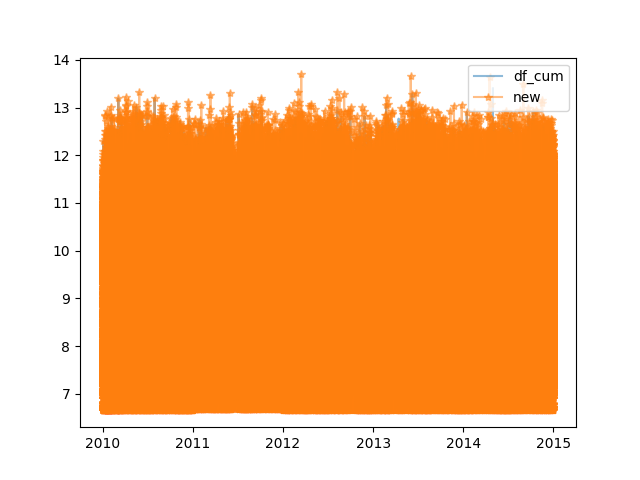

<IPython.core.display.Javascript object>


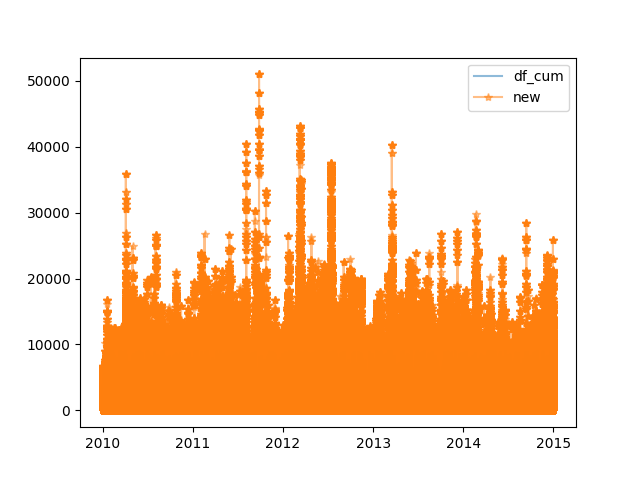

<IPython.core.display.Javascript object>


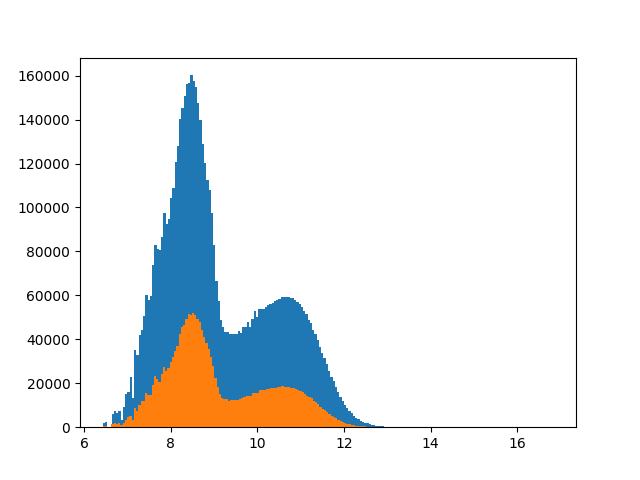

In [22]:
%matplotlib notebook


plt.figure()
plt.plot(np.log10(df_cumulative[df_cumulative['ID_SC']==16]['ELE_TOTAL_ENERGY_FLUX']+.0001), alpha=0.5)
plt.plot(np.log10(test[test['SC_ID']==16]['ELE_TOTAL_ENERGY_FLUX']+.0001), alpha=0.5,marker='*')
plt.legend(['df_cum', 'new'])
plt.show()

plt.figure()
plt.plot((df_cumulative[df_cumulative['ID_SC']==18]['newell']+.0001), alpha=0.5)
plt.plot((test[test['SC_ID']==18]['newell']+.0001), alpha=0.5,marker='*')
plt.legend(['df_cum', 'new'])
plt.show()

plt.figure()
plt.hist(np.log10(test['ELE_TOTAL_ENERGY_FLUX']),bins=200)
plt.hist(np.log10(df_cumulative['ELE_TOTAL_ENERGY_FLUX']),bins=200)
plt.show()




<IPython.core.display.Javascript object>


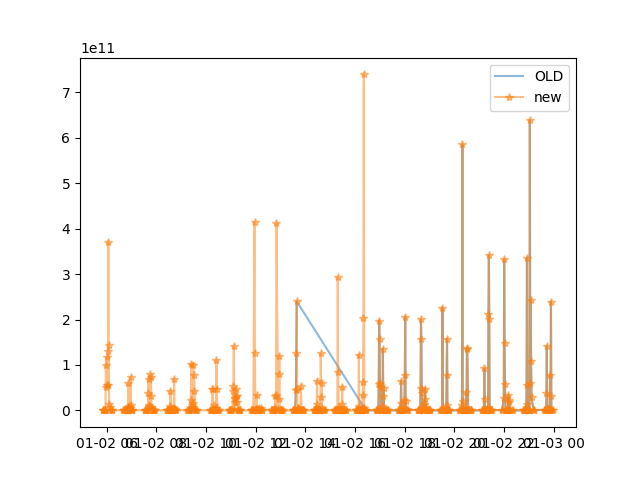

<IPython.core.display.Javascript object>


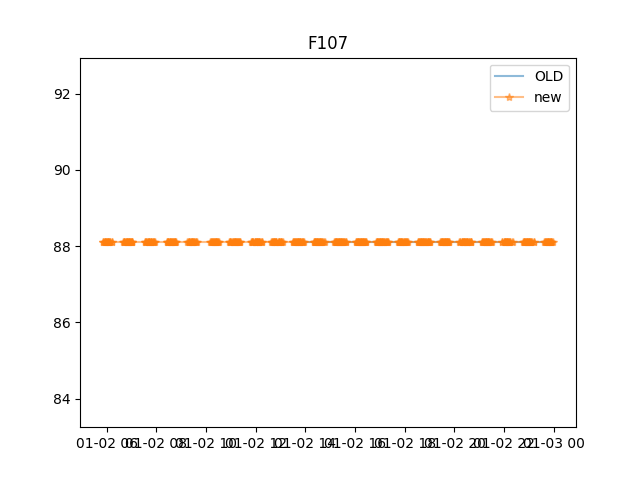

<IPython.core.display.Javascript object>


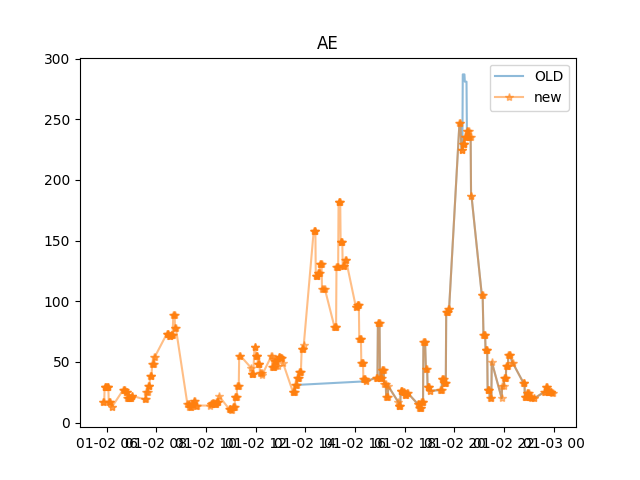

<IPython.core.display.Javascript object>


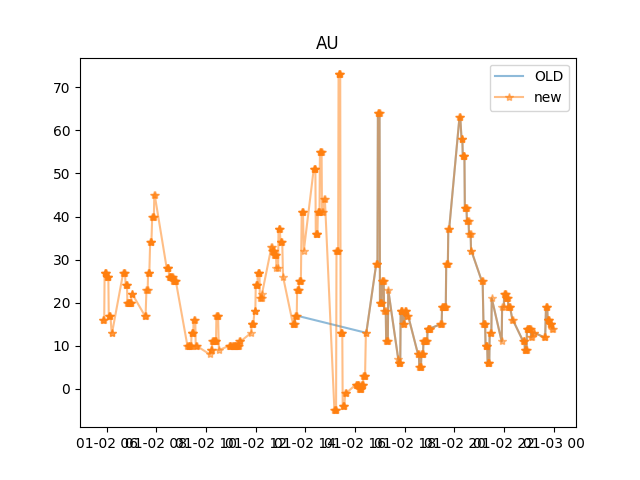

<IPython.core.display.Javascript object>


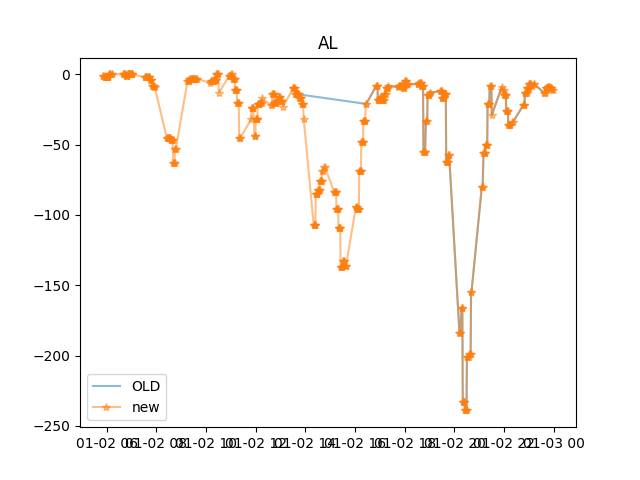

<IPython.core.display.Javascript object>


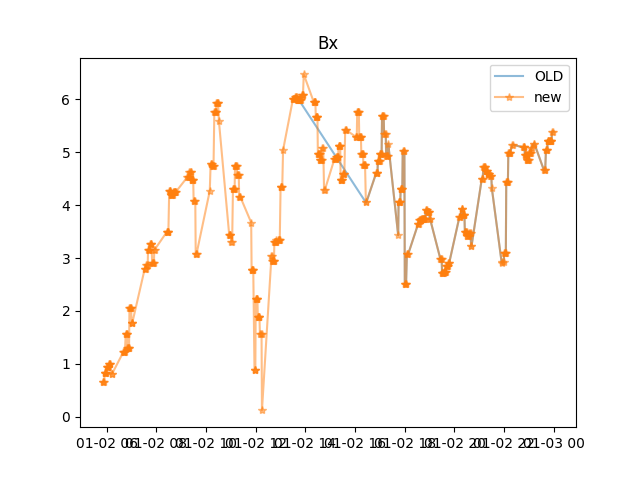

<IPython.core.display.Javascript object>


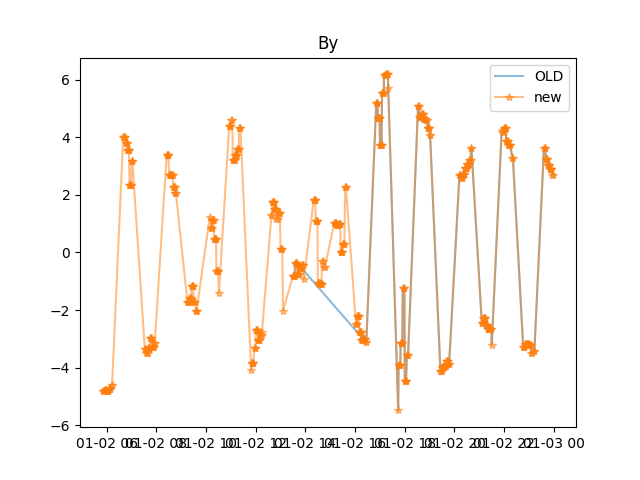

<IPython.core.display.Javascript object>


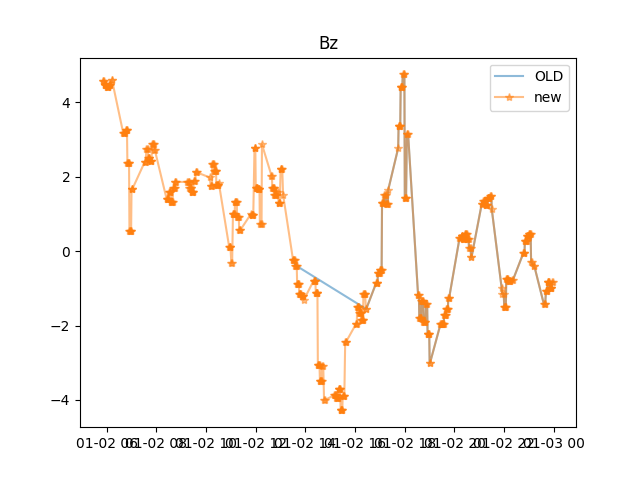

<IPython.core.display.Javascript object>


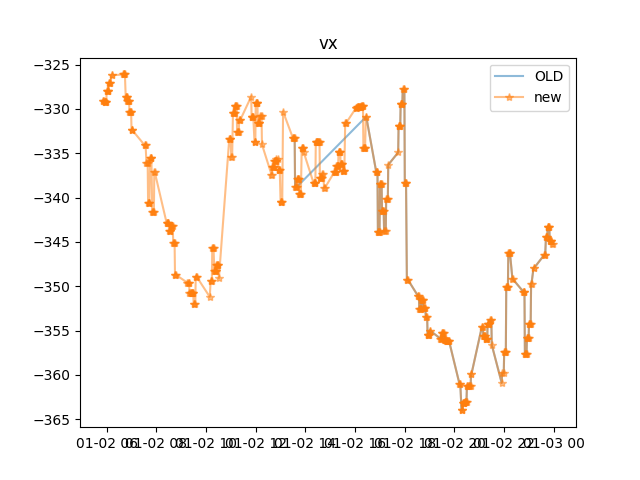

<IPython.core.display.Javascript object>


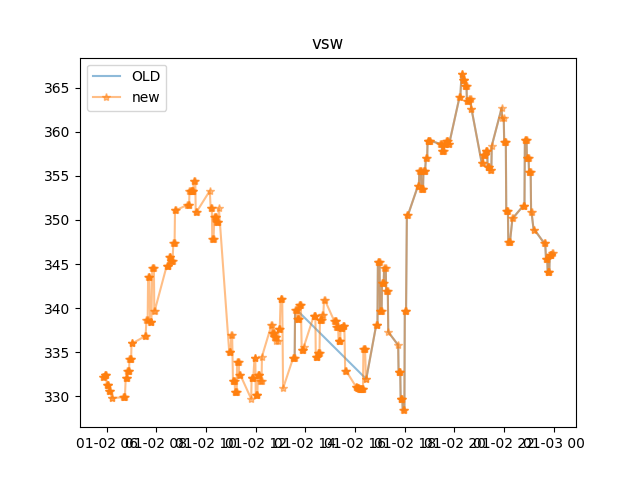

<IPython.core.display.Javascript object>


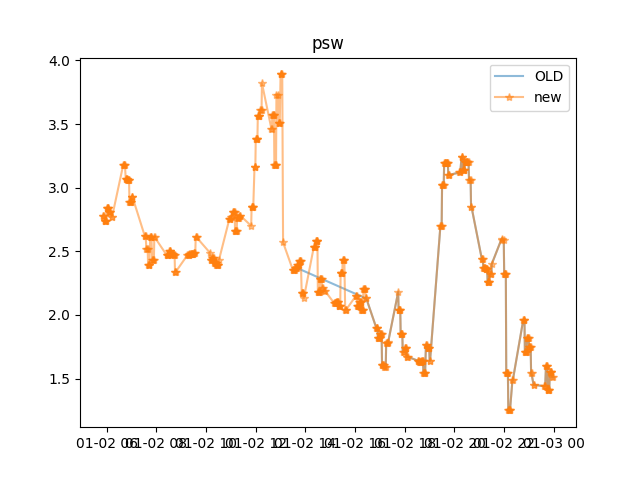

<IPython.core.display.Javascript object>


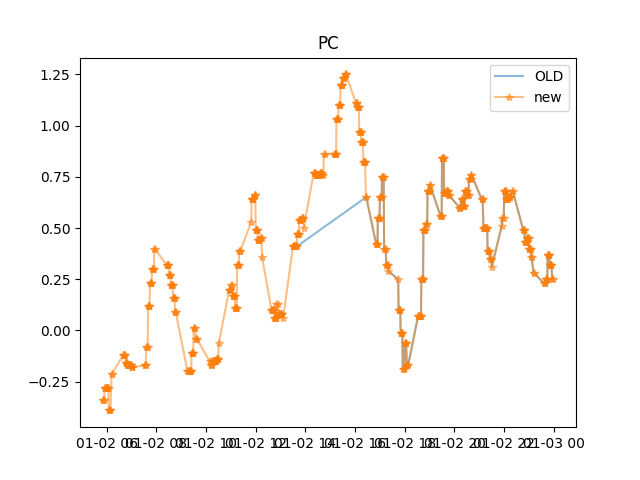

<IPython.core.display.Javascript object>


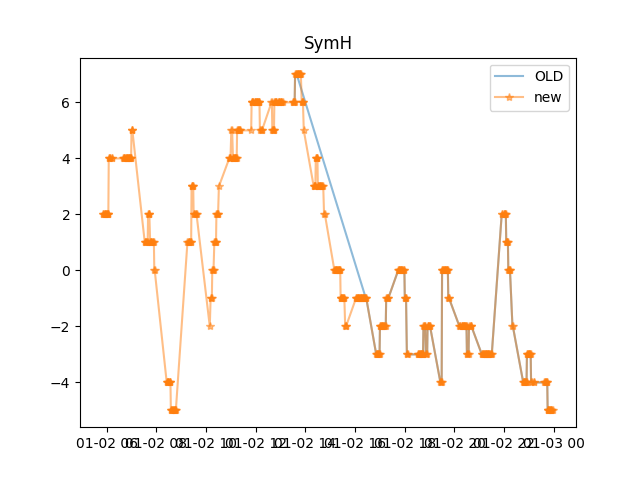

<IPython.core.display.Javascript object>


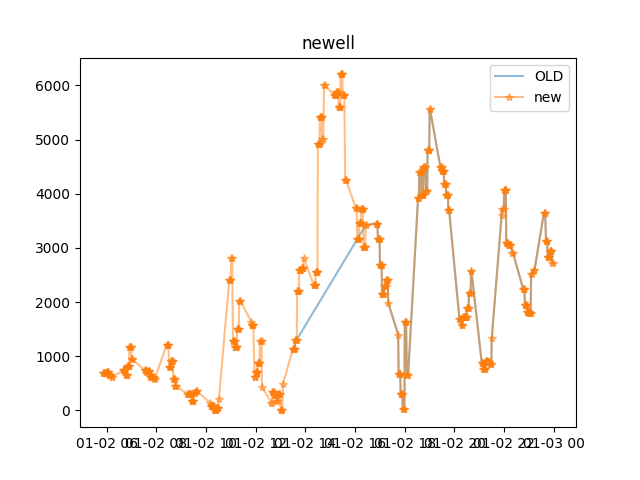

<IPython.core.display.Javascript object>


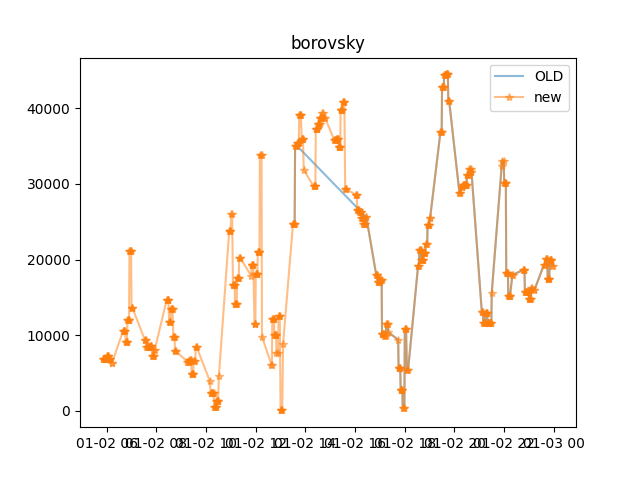

<IPython.core.display.Javascript object>


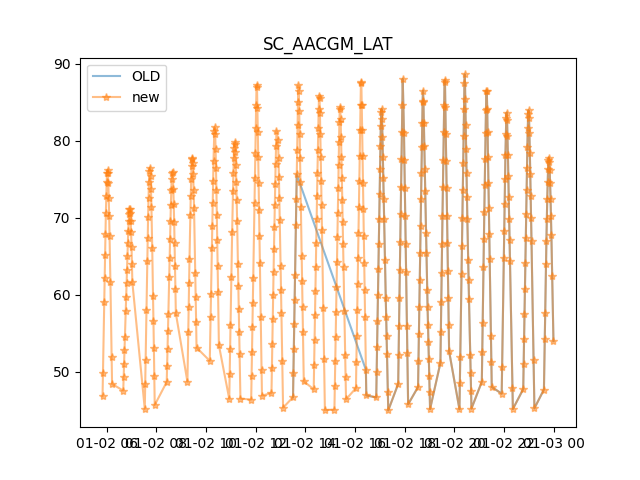

<IPython.core.display.Javascript object>


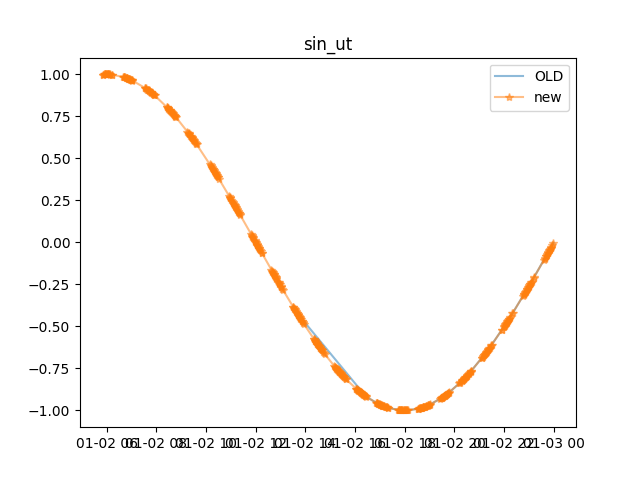

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:127: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


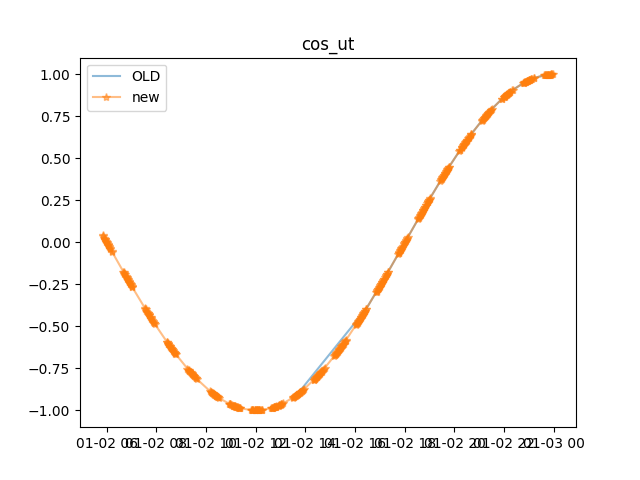

<IPython.core.display.Javascript object>


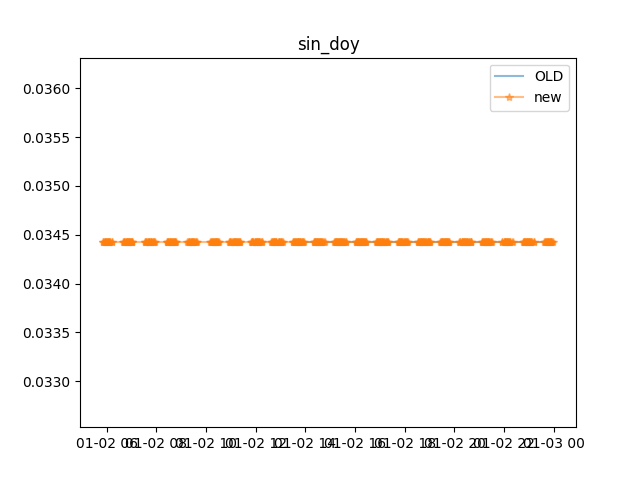

<IPython.core.display.Javascript object>


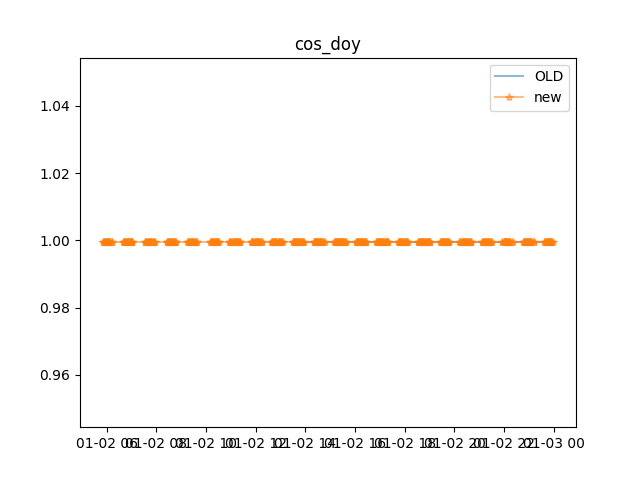

<IPython.core.display.Javascript object>


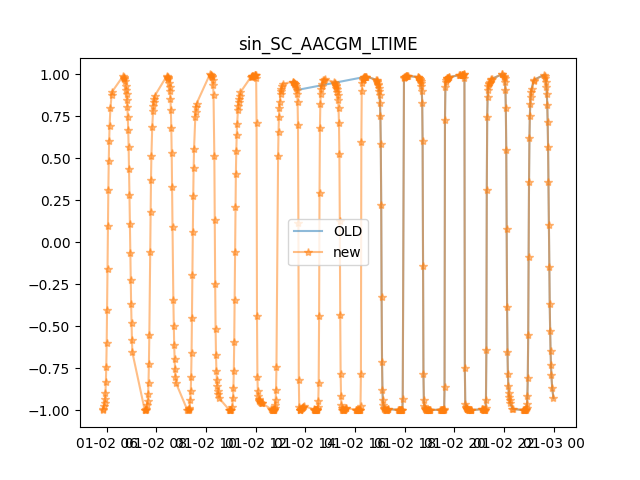

<IPython.core.display.Javascript object>


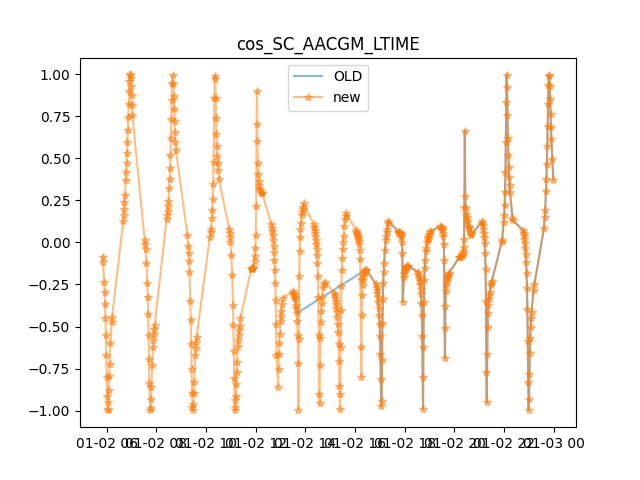

In [23]:
plt.figure()
plt.plot(df_cumulative[df_cumulative['ID_SC']==16]['ELE_TOTAL_ENERGY_FLUX'][datetime.datetime(2011, 1, 2):datetime.datetime(2011, 1, 3)], alpha=0.5)
plt.plot(test[test['SC_ID']==16]['ELE_TOTAL_ENERGY_FLUX'][datetime.datetime(2011, 1, 2):datetime.datetime(2011, 1, 3)], alpha=0.5,marker='*')
plt.legend(['OLD', 'new'])
plt.show()

#     dataframe = pd.DataFrame()
#     dataframe['Bz'] = Bz
#     dataframe['By'] = By
#     dataframe['Vsw'] = vsw
#     dataframe['Vx'] = omniInt['Vx']
#     dataframe['Psw'] = psw
#     dataframe['AE'] = AE
#     dataframe['AL'] = AL
#     dataframe['AU'] = AU
#     dataframe['SymH'] = SymH
#     dataframe['Clock Angle'] = clock_angle
#     dataframe['newell'] = newell
#     dataframe['borovsky'] = borovsky
#     dataframe['Kp'] = KP
#     dataframe['F107'] = F107
#     dataframe['PC'] = omniInt['PC_N_INDEX']
#     dataframe['Bx'] = omniInt['BX_GSE']

plt.figure()
plt.plot(df_cumulative[df_cumulative['ID_SC']==16]['F107'][datetime.datetime(2011, 1, 2):datetime.datetime(2011, 1, 3)], alpha=0.5)
plt.plot(test[test['SC_ID']==16]['F107'][datetime.datetime(2011, 1, 2):datetime.datetime(2011, 1, 3)], alpha=0.5,marker='*')
plt.title('F107')
plt.legend(['OLD', 'new'])
plt.show()

plt.figure()
plt.plot(df_cumulative[df_cumulative['ID_SC']==16]['AE'][datetime.datetime(2011, 1, 2):datetime.datetime(2011, 1, 3)], alpha=0.5)
plt.plot(test[test['SC_ID']==16]['AE'][datetime.datetime(2011, 1, 2):datetime.datetime(2011, 1, 3)], alpha=0.5,marker='*')
plt.legend(['OLD', 'new'])
plt.title('AE')
plt.show()

plt.figure()
plt.plot(df_cumulative[df_cumulative['ID_SC']==16]['AU'][datetime.datetime(2011, 1, 2):datetime.datetime(2011, 1, 3)], alpha=0.5)
plt.plot(test[test['SC_ID']==16]['AU'][datetime.datetime(2011, 1, 2):datetime.datetime(2011, 1, 3)], alpha=0.5,marker='*')
plt.legend(['OLD', 'new'])
plt.title('AU')
plt.show()

plt.figure()
plt.plot(df_cumulative[df_cumulative['ID_SC']==16]['AL'][datetime.datetime(2011, 1, 2):datetime.datetime(2011, 1, 3)], alpha=0.5)
plt.plot(test[test['SC_ID']==16]['AL'][datetime.datetime(2011, 1, 2):datetime.datetime(2011, 1, 3)], alpha=0.5,marker='*')
plt.legend(['OLD', 'new'])
plt.title('AL')
plt.show()
plt.figure()
plt.plot(df_cumulative[df_cumulative['ID_SC']==16]['Bx'][datetime.datetime(2011, 1, 2):datetime.datetime(2011, 1, 3)], alpha=0.5)
plt.plot(test[test['SC_ID']==16]['Bx'][datetime.datetime(2011, 1, 2):datetime.datetime(2011, 1, 3)], alpha=0.5,marker='*')
plt.legend(['OLD', 'new'])
plt.title('Bx')
plt.show()
plt.figure()
plt.plot(df_cumulative[df_cumulative['ID_SC']==16]['By'][datetime.datetime(2011, 1, 2):datetime.datetime(2011, 1, 3)], alpha=0.5)
plt.plot(test[test['SC_ID']==16]['By'][datetime.datetime(2011, 1, 2):datetime.datetime(2011, 1, 3)], alpha=0.5,marker='*')
plt.legend(['OLD', 'new'])
plt.title('By')
plt.show()

plt.figure()
plt.plot(df_cumulative[df_cumulative['ID_SC']==16]['Bz'][datetime.datetime(2011, 1, 2):datetime.datetime(2011, 1, 3)], alpha=0.5)
plt.plot(test[test['SC_ID']==16]['Bz'][datetime.datetime(2011, 1, 2):datetime.datetime(2011, 1, 3)], alpha=0.5,marker='*')
plt.legend(['OLD', 'new'])
plt.title('Bz')
plt.show()
plt.figure()
plt.plot(df_cumulative[df_cumulative['ID_SC']==16]['vx'][datetime.datetime(2011, 1, 2):datetime.datetime(2011, 1, 3)], alpha=0.5)
plt.plot(test[test['SC_ID']==16]['Vx'][datetime.datetime(2011, 1, 2):datetime.datetime(2011, 1, 3)], alpha=0.5,marker='*')
plt.legend(['OLD', 'new'])
plt.title('vx')
plt.show()
plt.figure()
plt.plot(df_cumulative[df_cumulative['ID_SC']==16]['vsw'][datetime.datetime(2011, 1, 2):datetime.datetime(2011, 1, 3)], alpha=0.5)
plt.plot(test[test['SC_ID']==16]['Vsw'][datetime.datetime(2011, 1, 2):datetime.datetime(2011, 1, 3)], alpha=0.5,marker='*')
plt.legend(['OLD', 'new'])
plt.title('vsw')
plt.show()
plt.figure()
plt.plot(df_cumulative[df_cumulative['ID_SC']==16]['psw'][datetime.datetime(2011, 1, 2):datetime.datetime(2011, 1, 3)], alpha=0.5)
plt.plot(test[test['SC_ID']==16]['Psw'][datetime.datetime(2011, 1, 2):datetime.datetime(2011, 1, 3)], alpha=0.5,marker='*')
plt.legend(['OLD', 'new'])
plt.title('psw')
plt.show()
plt.figure()
plt.plot(df_cumulative[df_cumulative['ID_SC']==16]['PC'][datetime.datetime(2011, 1, 2):datetime.datetime(2011, 1, 3)], alpha=0.5)
plt.plot(test[test['SC_ID']==16]['PC'][datetime.datetime(2011, 1, 2):datetime.datetime(2011, 1, 3)], alpha=0.5,marker='*')
plt.legend(['OLD', 'new'])
plt.title('PC')
plt.show()
plt.figure()
plt.plot(df_cumulative[df_cumulative['ID_SC']==16]['SymH'][datetime.datetime(2011, 1, 2):datetime.datetime(2011, 1, 3)], alpha=0.5)
plt.plot(test[test['SC_ID']==16]['SymH'][datetime.datetime(2011, 1, 2):datetime.datetime(2011, 1, 3)], alpha=0.5,marker='*')
plt.legend(['OLD', 'new'])
plt.title('SymH')
plt.show()
plt.figure()
plt.plot(df_cumulative[df_cumulative['ID_SC']==16]['newell'][datetime.datetime(2011, 1, 2):datetime.datetime(2011, 1, 3)], alpha=0.5)
plt.plot(test[test['SC_ID']==16]['newell'][datetime.datetime(2011, 1, 2):datetime.datetime(2011, 1, 3)], alpha=0.5,marker='*')
plt.legend(['OLD', 'new'])
plt.title('newell')
plt.show()
plt.figure()
plt.plot(df_cumulative[df_cumulative['ID_SC']==16]['borovsky'][datetime.datetime(2011, 1, 2):datetime.datetime(2011, 1, 3)], alpha=0.5)
plt.plot(test[test['SC_ID']==16]['borovsky'][datetime.datetime(2011, 1, 2):datetime.datetime(2011, 1, 3)], alpha=0.5,marker='*')
plt.legend(['OLD', 'new'])
plt.title('borovsky')
plt.show()
plt.figure()

plt.plot(df_cumulative[df_cumulative['ID_SC']==16]['SC_AACGM_LAT'][datetime.datetime(2011, 1, 2):datetime.datetime(2011, 1, 3)], alpha=0.5)
plt.plot(test[test['SC_ID']==16]['SC_AACGM_LAT'][datetime.datetime(2011, 1, 2):datetime.datetime(2011, 1, 3)], alpha=0.5,marker='*')
plt.legend(['OLD', 'new'])
plt.title('SC_AACGM_LAT')
plt.show()
plt.figure()

plt.plot(df_cumulative[df_cumulative['ID_SC']==16]['sin_ut'][datetime.datetime(2011, 1, 2):datetime.datetime(2011, 1, 3)], alpha=0.5)
plt.plot(test[test['SC_ID']==16]['sin_ut'][datetime.datetime(2011, 1, 2):datetime.datetime(2011, 1, 3)], alpha=0.5,marker='*')
plt.legend(['OLD', 'new'])
plt.title('sin_ut')
plt.show()
plt.figure()

plt.plot(df_cumulative[df_cumulative['ID_SC']==16]['cos_ut'][datetime.datetime(2011, 1, 2):datetime.datetime(2011, 1, 3)], alpha=0.5)
plt.plot(test[test['SC_ID']==16]['cos_ut'][datetime.datetime(2011, 1, 2):datetime.datetime(2011, 1, 3)], alpha=0.5,marker='*')
plt.legend(['OLD', 'new'])
plt.title('cos_ut')
plt.show()
plt.figure()

plt.plot(df_cumulative[df_cumulative['ID_SC']==16]['sin_doy'][datetime.datetime(2011, 1, 2):datetime.datetime(2011, 1, 3)], alpha=0.5)
plt.plot(test[test['SC_ID']==16]['sin_doy'][datetime.datetime(2011, 1, 2):datetime.datetime(2011, 1, 3)], alpha=0.5,marker='*')
plt.legend(['OLD', 'new'])
plt.title('sin_doy')
plt.show()
plt.figure()

plt.plot(df_cumulative[df_cumulative['ID_SC']==16]['cos_doy'][datetime.datetime(2011, 1, 2):datetime.datetime(2011, 1, 3)], alpha=0.5)
plt.plot(test[test['SC_ID']==16]['cos_doy'][datetime.datetime(2011, 1, 2):datetime.datetime(2011, 1, 3)], alpha=0.5,marker='*')
plt.legend(['OLD', 'new'])
plt.title('cos_doy')
plt.show()
plt.figure()

plt.plot(df_cumulative[df_cumulative['ID_SC']==16]['sin_SC_AACGM_LTIME'][datetime.datetime(2011, 1, 2):datetime.datetime(2011, 1, 3)], alpha=0.5)
plt.plot(test[test['SC_ID']==16]['sin_SC_AACGM_LTIME'][datetime.datetime(2011, 1, 2):datetime.datetime(2011, 1, 3)], alpha=0.5,marker='*')
plt.legend(['OLD', 'new'])
plt.title('sin_SC_AACGM_LTIME')
plt.show()
plt.figure()

plt.plot(df_cumulative[df_cumulative['ID_SC']==16]['cos_SC_AACGM_LTIME'][datetime.datetime(2011, 1, 2):datetime.datetime(2011, 1, 3)], alpha=0.5)
plt.plot(test[test['SC_ID']==16]['cos_SC_AACGM_LTIME'][datetime.datetime(2011, 1, 2):datetime.datetime(2011, 1, 3)], alpha=0.5,marker='*')
plt.legend(['OLD', 'new'])
plt.title('cos_SC_AACGM_LTIME')
plt.show()


<IPython.core.display.Javascript object>


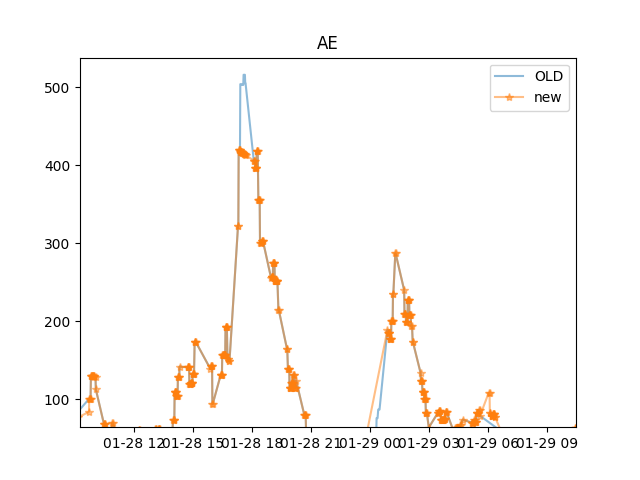

In [25]:

plt.figure()
plt.plot(df_cumulative[df_cumulative['ID_SC']==16]['AE'][datetime.datetime(2011, 1, 2):datetime.datetime(2011, 1, 31)], alpha=0.5)
plt.plot(test[test['SC_ID']==16]['AE'][datetime.datetime(2011, 1, 2):datetime.datetime(2011, 1, 31)], alpha=0.5,marker='*')
plt.legend(['OLD', 'new'])
plt.title('AE')
plt.show()





In [109]:

def plot_model(df_results):
    
    plt.figure()
    plt.plot(y_val_log[:])
    plt.plot(df_results[:])
    plt.legend(['val', 'result'], loc='upper left')
    plt.show()


    plt.figure()
    plt.plot(10**y_val_log[:]*1.6e-6)
    plt.plot(10**df_results[:]*1.6e-6)
    plt.legend(['val', 'result'], loc='upper left')
    plt.show()

    plt.figure()
    plt.hist(10**y_val_log.values*1.6e-6,bins=100, log=True)
    plt.hist(10**df_results.values*1.6e-6,bins=100, log=True)
    plt.legend(['val', 'result'], loc='upper left')
    plt.show()


    minr = np.min(y_val_log.values)
    maxr = np.max(y_val_log.values)
    plt.figure()
    plt.hist(df_results.values,bins=200,alpha=0.5,range=(minr,maxr))
    plt.hist(y_val_log.values,bins=200,alpha=0.5,range=(minr,maxr))
    plt.legend(['result','val'], loc='upper left')
    plt.show()

    plt.figure()
    plt.hist(y_val_log.values,bins=200,alpha=0.5,range=(minr,maxr))
    plt.hist(df_results.values,bins=200,alpha=0.5,range=(minr,maxr))
    plt.legend(['val', 'result'], loc='upper left')
    plt.show()

    errors= y_val_log.values-df_results.values[:,0]
    plt.figure();
    plt.scatter(df_val['SC_AACGM_LAT'].values,errors,s=1)
    plt.title('Errors over SC_AACGM_LAT Bins')


    bin_total = np.zeros((200))
    bin_error_total = np.zeros((200))
    for j in range(0,y_val_log.values.shape[0]):
        i = int((df_val['SC_AACGM_LAT'].values[j]-45)/((90-45)/200))
        if i < 200:
            bin_total[i] = bin_total[i]+1
            bin_error_total[i] = bin_error_total[i] + np.abs(errors[j])

    avg_error_over_hist = bin_error_total/bin_total
    plt.figure()
    plt.scatter(np.linspace(45,90,num=200),avg_error_over_hist)
    plt.title('Average Validation Error over SC_AACGM_LAT Bins')
    plt.show()
    
    errors= y_val_log.values-df_results.values[:,0]
    plt.figure();
    plt.scatter(y_val_log.values,errors,s=1)
    plt.title('Errors over target Bins')

    bin_total = np.zeros((200))
    bin_error_total = np.zeros((200))
    for j in range(0,y_val_log.values.shape[0]):
        i = int((y_val_log[j]-0)/((8-0)/200))
        if (i < 200) and(i > 0):
            bin_total[i] = bin_total[i]+1
            bin_error_total[i] = bin_error_total[i] + np.abs(errors[j])

    avg_error_over_hist = bin_error_total/(bin_total+.00001)
    plt.figure()
    plt.scatter(np.linspace(0,8,num=200),avg_error_over_hist)
    plt.title('Average Validation Error over target Bins')    
    plt.show()


In [38]:


import tensorflow as tf
from tensorflow import keras

import pandas as pd
import numpy as np
import os
import glob
import datetime

from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession

config = ConfigProto()
config.gpu_options.allow_growth = True
session = InteractiveSession(config=config)
import tensorflow

import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, Dropout
from sklearn import preprocessing

import tensorflow as tf

import numpy as np
import os
import pandas as pd
#import seaborn as sns
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()
import datetime
from os.path import isfile, join
from sys import getsizeof
import glob

from random import *

import matplotlib.pyplot as plt
%matplotlib notebook

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from tensorflow.keras.layers import Input

import pickle



/usr/local/lib/python3.6/dist-packages/tensorflow/python/client/session.py:1751: UserWarning: An interactive session is already active. This can cause out-of-memory errors in some cases. You must explicitly call `InteractiveSession.close()` to release resources held by the other session(s).
  warnings.warn('An interactive session is already active. This can '


In [39]:
# LOAD THE COMBINED SOURTHERN HEMISPHERE AND NORTHERN HEMISPHERE AS CREATED ABOVE

filescname = "./all_sc_df_1min_SH_NH_combined.pkl"
pickle_file = open(filescname, "rb") 
df_cumulative =pickle.load(pickle_file)

cols_to_drop_validation = [c for c in df_cumulative.columns if ('SC_AACGM_LON' in c) | ('STD' in c) | ('Kp' in c )| ('Clock' in c) | ('AVG' in c) | ('SC_AACGM_LTIME'==c)]

df_cumulative = df_cumulative.drop(columns=cols_to_drop_validation)
df_cumulative=df_cumulative.dropna()

# Separate training and testing data
mask_val = [(df_cumulative.index.year == 2010) & (df_cumulative['SC_ID'].values==16)]
df_val = df_cumulative[mask_val[0]].copy(deep=True)
df_train = df_cumulative.copy(deep=True).drop( df_cumulative.index[mask_val[0]])

del df_cumulative




# Construct X and y
feature_cols = [c for c in df_train.columns if not 'ELE' in c]
#print( (feature_cols))
#print(df_cumulative.columns)
X_val = df_val[feature_cols].copy(deep=True)
y_val = df_val['ELE_TOTAL_ENERGY_FLUX'].copy(deep=True)
X_train = df_train[feature_cols].copy(deep=True)
y_train = df_train['ELE_TOTAL_ENERGY_FLUX'].copy(deep=True)
scaler_X = preprocessing.RobustScaler()
scaler_X = scaler_X.fit(X_train.values)
X_val_scaled = scaler_X.transform(X_val.values)
X_train_scaled = scaler_X.transform(X_train.values)

numFeatures = len(X_train.columns.to_list())
feature_labels = X_train.columns.to_list()
y_train_erg = y_train.copy(deep=True) * (1.60218e-12)
y_val_erg = y_val.copy(deep=True) * (1.60218e-12)

y_train[y_train == 0] = 0.0001
y_val[y_val == 0] = 0.0001
y_train_log = np.log10(y_train.copy(deep=True))
y_val_log = np.log10(y_val.copy(deep=True))
X = np.array(X_train_scaled, dtype=np.float32)
X_test = np.array(X_val_scaled, dtype=np.float32)

del df_train

Model: "functional_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         [(None, 148)]             0         
_________________________________________________________________
dense_36 (Dense)             (None, 256)               38144     
_________________________________________________________________
dropout_4 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_37 (Dense)             (None, 64)                16448     
_________________________________________________________________
dense_38 (Dense)             (None, 32)                2080      
_________________________________________________________________
dense_39 (Dense)             (None, 256)               8448      
_________________________________________________________________
dense_40 (Dense)             (None, 1024)             

Epoch 70/1000
188/188 - 5s - loss: 0.5068 - mse: 0.5068 - val_loss: 0.6429 - val_mse: 0.6429
Epoch 71/1000
188/188 - 5s - loss: 0.5072 - mse: 0.5072 - val_loss: 0.6365 - val_mse: 0.6365
Epoch 72/1000
188/188 - 5s - loss: 0.5061 - mse: 0.5061 - val_loss: 0.6299 - val_mse: 0.6299
Epoch 73/1000
188/188 - 5s - loss: 0.5048 - mse: 0.5048 - val_loss: 0.6311 - val_mse: 0.6311
Epoch 74/1000
188/188 - 5s - loss: 0.5054 - mse: 0.5054 - val_loss: 0.6342 - val_mse: 0.6342
Epoch 75/1000
188/188 - 5s - loss: 0.5039 - mse: 0.5039 - val_loss: 0.6282 - val_mse: 0.6282
Epoch 76/1000
188/188 - 5s - loss: 0.5036 - mse: 0.5036 - val_loss: 0.6259 - val_mse: 0.6259
Epoch 77/1000
188/188 - 5s - loss: 0.5031 - mse: 0.5031 - val_loss: 0.6270 - val_mse: 0.6270
Epoch 78/1000
188/188 - 5s - loss: 0.5036 - mse: 0.5036 - val_loss: 0.6278 - val_mse: 0.6278
Epoch 79/1000
188/188 - 5s - loss: 0.5021 - mse: 0.5021 - val_loss: 0.6273 - val_mse: 0.6273
Epoch 80/1000
188/188 - 5s - loss: 0.5017 - mse: 0.5017 - val_loss: 0.

Epoch 158/1000
188/188 - 6s - loss: 0.4818 - mse: 0.4818 - val_loss: 0.6025 - val_mse: 0.6025
Epoch 159/1000
188/188 - 5s - loss: 0.4821 - mse: 0.4821 - val_loss: 0.5994 - val_mse: 0.5994
Epoch 160/1000
188/188 - 5s - loss: 0.4823 - mse: 0.4823 - val_loss: 0.6055 - val_mse: 0.6055
Epoch 161/1000
188/188 - 5s - loss: 0.4811 - mse: 0.4811 - val_loss: 0.5942 - val_mse: 0.5942
Epoch 162/1000
188/188 - 5s - loss: 0.4811 - mse: 0.4811 - val_loss: 0.6068 - val_mse: 0.6068
Epoch 163/1000
188/188 - 5s - loss: 0.4814 - mse: 0.4814 - val_loss: 0.5998 - val_mse: 0.5998
Epoch 164/1000
188/188 - 5s - loss: 0.4817 - mse: 0.4817 - val_loss: 0.5997 - val_mse: 0.5997
Epoch 165/1000
188/188 - 5s - loss: 0.4809 - mse: 0.4809 - val_loss: 0.5973 - val_mse: 0.5973
Epoch 166/1000
188/188 - 5s - loss: 0.4811 - mse: 0.4811 - val_loss: 0.5960 - val_mse: 0.5960
Epoch 167/1000
188/188 - 5s - loss: 0.4808 - mse: 0.4808 - val_loss: 0.5954 - val_mse: 0.5954
Epoch 168/1000
188/188 - 5s - loss: 0.4805 - mse: 0.4805 - v

188/188 - 5s - loss: 0.4723 - mse: 0.4723 - val_loss: 0.5875 - val_mse: 0.5875
Epoch 246/1000
188/188 - 6s - loss: 0.4721 - mse: 0.4721 - val_loss: 0.5884 - val_mse: 0.5884
Epoch 247/1000
188/188 - 6s - loss: 0.4722 - mse: 0.4722 - val_loss: 0.5872 - val_mse: 0.5872
Epoch 248/1000
188/188 - 6s - loss: 0.4722 - mse: 0.4722 - val_loss: 0.5884 - val_mse: 0.5884
Epoch 249/1000
188/188 - 5s - loss: 0.4726 - mse: 0.4726 - val_loss: 0.5871 - val_mse: 0.5871
Epoch 250/1000
188/188 - 5s - loss: 0.4721 - mse: 0.4721 - val_loss: 0.5887 - val_mse: 0.5887
Epoch 251/1000
188/188 - 5s - loss: 0.4718 - mse: 0.4718 - val_loss: 0.5866 - val_mse: 0.5866
Epoch 252/1000
188/188 - 5s - loss: 0.4715 - mse: 0.4715 - val_loss: 0.5908 - val_mse: 0.5908
Epoch 253/1000
188/188 - 5s - loss: 0.4719 - mse: 0.4719 - val_loss: 0.5878 - val_mse: 0.5878
Epoch 254/1000
188/188 - 5s - loss: 0.4717 - mse: 0.4717 - val_loss: 0.5847 - val_mse: 0.5847
Epoch 255/1000
188/188 - 5s - loss: 0.4718 - mse: 0.4718 - val_loss: 0.5859

Epoch 333/1000
188/188 - 5s - loss: 0.4668 - mse: 0.4668 - val_loss: 0.5856 - val_mse: 0.5856
Epoch 334/1000
188/188 - 6s - loss: 0.4660 - mse: 0.4660 - val_loss: 0.5835 - val_mse: 0.5835
Epoch 335/1000
188/188 - 5s - loss: 0.4664 - mse: 0.4664 - val_loss: 0.5826 - val_mse: 0.5826
Epoch 336/1000
188/188 - 5s - loss: 0.4664 - mse: 0.4664 - val_loss: 0.5897 - val_mse: 0.5897
Epoch 337/1000
188/188 - 5s - loss: 0.4661 - mse: 0.4661 - val_loss: 0.5854 - val_mse: 0.5854
Epoch 338/1000
188/188 - 5s - loss: 0.4663 - mse: 0.4663 - val_loss: 0.5842 - val_mse: 0.5842
Epoch 339/1000
188/188 - 6s - loss: 0.4660 - mse: 0.4660 - val_loss: 0.5842 - val_mse: 0.5842
Epoch 340/1000
188/188 - 5s - loss: 0.4664 - mse: 0.4664 - val_loss: 0.5841 - val_mse: 0.5841
Epoch 341/1000
188/188 - 5s - loss: 0.4661 - mse: 0.4661 - val_loss: 0.5876 - val_mse: 0.5876
Epoch 342/1000
188/188 - 5s - loss: 0.4659 - mse: 0.4659 - val_loss: 0.5821 - val_mse: 0.5821
Epoch 343/1000
188/188 - 5s - loss: 0.4662 - mse: 0.4662 - v

188/188 - 5s - loss: 0.4625 - mse: 0.4625 - val_loss: 0.5848 - val_mse: 0.5848
Epoch 421/1000
188/188 - 6s - loss: 0.4624 - mse: 0.4624 - val_loss: 0.5840 - val_mse: 0.5840
Epoch 422/1000
188/188 - 5s - loss: 0.4627 - mse: 0.4627 - val_loss: 0.5879 - val_mse: 0.5879
Epoch 423/1000
188/188 - 5s - loss: 0.4626 - mse: 0.4626 - val_loss: 0.5851 - val_mse: 0.5851
Epoch 424/1000
188/188 - 5s - loss: 0.4623 - mse: 0.4623 - val_loss: 0.5866 - val_mse: 0.5866
Epoch 425/1000
188/188 - 5s - loss: 0.4620 - mse: 0.4620 - val_loss: 0.5840 - val_mse: 0.5840
Epoch 426/1000
188/188 - 5s - loss: 0.4621 - mse: 0.4621 - val_loss: 0.5846 - val_mse: 0.5846
Epoch 427/1000
188/188 - 5s - loss: 0.4622 - mse: 0.4622 - val_loss: 0.5848 - val_mse: 0.5848
Epoch 428/1000
188/188 - 5s - loss: 0.4623 - mse: 0.4623 - val_loss: 0.5844 - val_mse: 0.5844
Epoch 429/1000
188/188 - 5s - loss: 0.4624 - mse: 0.4624 - val_loss: 0.5861 - val_mse: 0.5861
Epoch 430/1000
188/188 - 5s - loss: 0.4622 - mse: 0.4622 - val_loss: 0.5836

Epoch 508/1000
188/188 - 5s - loss: 0.4594 - mse: 0.4594 - val_loss: 0.5858 - val_mse: 0.5858
Epoch 509/1000
188/188 - 5s - loss: 0.4594 - mse: 0.4594 - val_loss: 0.5858 - val_mse: 0.5858
Epoch 510/1000
188/188 - 5s - loss: 0.4595 - mse: 0.4595 - val_loss: 0.5866 - val_mse: 0.5866
Epoch 511/1000
188/188 - 5s - loss: 0.4602 - mse: 0.4602 - val_loss: 0.5889 - val_mse: 0.5889
Epoch 512/1000
188/188 - 5s - loss: 0.4593 - mse: 0.4593 - val_loss: 0.5905 - val_mse: 0.5905
Epoch 513/1000
188/188 - 5s - loss: 0.4594 - mse: 0.4594 - val_loss: 0.5887 - val_mse: 0.5887
Epoch 514/1000
188/188 - 6s - loss: 0.4591 - mse: 0.4591 - val_loss: 0.5898 - val_mse: 0.5898


<IPython.core.display.Javascript object>


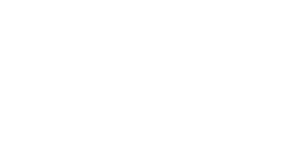

<IPython.core.display.Javascript object>


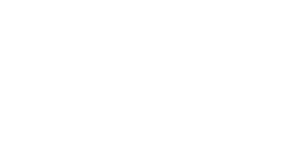

<IPython.core.display.Javascript object>


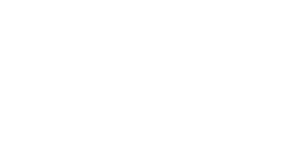

<IPython.core.display.Javascript object>


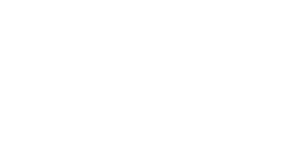

<IPython.core.display.Javascript object>


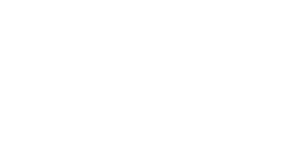

<IPython.core.display.Javascript object>


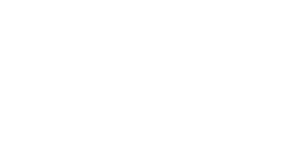

<IPython.core.display.Javascript object>


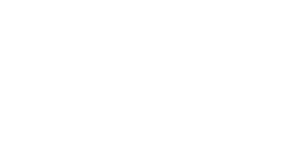

<IPython.core.display.Javascript object>


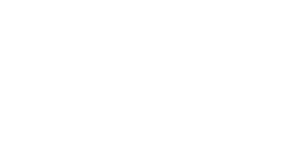

<IPython.core.display.Javascript object>


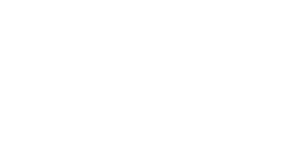

<IPython.core.display.Javascript object>


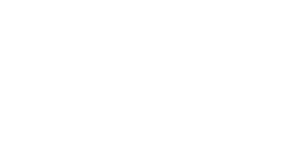

<IPython.core.display.Javascript object>


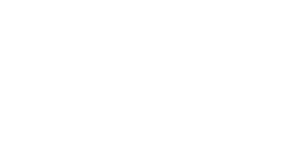

In [42]:
### UNCOMMENT TO RETRAIN
# 
# num_in = 148

# input1 = Input(shape=(num_in))
# model1 = Dense(256,  activation='relu')(input1)
# model1 = model1 = Dropout(0.5)(model1)
# model1 = Dense(64, activation='relu')(model1)
# model1 = Dense(32, activation='relu')(model1)
# model1 = Dense(int(256),   activation='relu')(model1)
# model1 = Dense(int(1024),  activation='relu')(model1)
# model1 = Dense(int(256),  activation='relu')(model1)
# model1 = Dense(32, activation='relu')(model1)
# model1 = Dense(4, activation='relu')(model1)
# model1 = Dense(1, activation='linear' )(model1)


# output = model1
# model = tensorflow.keras.models.Model(inputs=input1, outputs=output)
# #compile model using accuracy to measure model performance
# model.compile(loss='mse', optimizer=tf.keras.optimizers.Adam(
#     learning_rate=0.0002),metrics=['mse'])
# model.summary()

# history = model.fit(X[:,:num_in], 
#                    y_train_log, 
#                     validation_data=(
#                         X_test[:,:num_in], 
#                         y_val_log,                                    ),
#                     batch_size=8192*4,epochs=1000,verbose=2,
#                    callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_loss',  restore_best_weights=True,
#              patience=100)])#


# plt.figure()
# # summarize history for loss
# plt.plot(history.history['loss'][:])
# plt.plot(history.history['val_loss'][:])
# plt.title('model loss')
# plt.ylabel('loss')
# plt.xlabel('epoch')
# plt.legend(['train', 'test'], loc='upper left')
# plt.ylim([0,.9])
# plt.show()

# plt.figure()
# # summarize history for loss
# plt.plot(history.history['loss'][:])
# plt.plot(history.history['val_loss'][:])
# plt.title('model loss')
# plt.ylabel('loss')
# plt.xlabel('epoch')
# plt.legend(['train', 'test'], loc='upper left')
# plt.show()

# results = model.predict(X_test)

# df_results = pd.DataFrame(data=results, index = y_val_log.index)

# model_3 = df_results

# plot_model(df_results)

In [43]:
filename='model_3_new_DB'
# model.save(filename)
model = tensorflow.keras.models.load_model(filename)

plot_model(df_results)

INFO:tensorflow:Assets written to: model_3_new_DB/assets


(6154933, 148)

-39.910343

Model: "functional_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 148)]             0         
_________________________________________________________________
dense (Dense)                (None, 256)               38144     
_________________________________________________________________
dropout (Dropout)            (None, 256)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 64)                16448     
_________________________________________________________________
dense_2 (Dense)              (None, 32)                2080      
_________________________________________________________________
dense_3 (Dense)              (None, 256)               8448      
_________________________________________________________________
dense_4 (Dense)              (None, 1024)             

Epoch 70/1000
188/188 - 5s - loss: 0.4851 - mse: 0.4851 - val_loss: 0.5983 - val_mse: 0.5983
Epoch 71/1000
188/188 - 5s - loss: 0.4846 - mse: 0.4846 - val_loss: 0.5965 - val_mse: 0.5965
Epoch 72/1000
188/188 - 5s - loss: 0.4844 - mse: 0.4844 - val_loss: 0.5992 - val_mse: 0.5992
Epoch 73/1000
188/188 - 5s - loss: 0.4835 - mse: 0.4835 - val_loss: 0.5966 - val_mse: 0.5966
Epoch 74/1000
188/188 - 5s - loss: 0.4835 - mse: 0.4835 - val_loss: 0.5980 - val_mse: 0.5980
Epoch 75/1000
188/188 - 6s - loss: 0.4832 - mse: 0.4832 - val_loss: 0.6001 - val_mse: 0.6001
Epoch 76/1000
188/188 - 5s - loss: 0.4826 - mse: 0.4826 - val_loss: 0.5918 - val_mse: 0.5918
Epoch 77/1000
188/188 - 5s - loss: 0.4822 - mse: 0.4822 - val_loss: 0.5945 - val_mse: 0.5945
Epoch 78/1000
188/188 - 5s - loss: 0.4823 - mse: 0.4823 - val_loss: 0.5971 - val_mse: 0.5971
Epoch 79/1000
188/188 - 5s - loss: 0.4811 - mse: 0.4811 - val_loss: 0.5945 - val_mse: 0.5945
Epoch 80/1000
188/188 - 5s - loss: 0.4818 - mse: 0.4818 - val_loss: 0.

Epoch 158/1000
188/188 - 5s - loss: 0.4664 - mse: 0.4664 - val_loss: 0.6006 - val_mse: 0.6006
Epoch 159/1000
188/188 - 5s - loss: 0.4663 - mse: 0.4663 - val_loss: 0.6038 - val_mse: 0.6038
Epoch 160/1000
188/188 - 5s - loss: 0.4658 - mse: 0.4658 - val_loss: 0.6089 - val_mse: 0.6089
Epoch 161/1000
188/188 - 5s - loss: 0.4658 - mse: 0.4658 - val_loss: 0.5958 - val_mse: 0.5958
Epoch 162/1000
188/188 - 5s - loss: 0.4667 - mse: 0.4667 - val_loss: 0.6055 - val_mse: 0.6055
Epoch 163/1000
188/188 - 5s - loss: 0.4660 - mse: 0.4660 - val_loss: 0.6130 - val_mse: 0.6130
Epoch 164/1000
188/188 - 5s - loss: 0.4656 - mse: 0.4656 - val_loss: 0.6041 - val_mse: 0.6041
Epoch 165/1000
188/188 - 5s - loss: 0.4650 - mse: 0.4650 - val_loss: 0.6115 - val_mse: 0.6115
Epoch 166/1000
188/188 - 5s - loss: 0.4658 - mse: 0.4658 - val_loss: 0.6282 - val_mse: 0.6282
Epoch 167/1000
188/188 - 5s - loss: 0.4655 - mse: 0.4655 - val_loss: 0.6048 - val_mse: 0.6048
Epoch 168/1000
188/188 - 5s - loss: 0.4653 - mse: 0.4653 - v

<IPython.core.display.Javascript object>


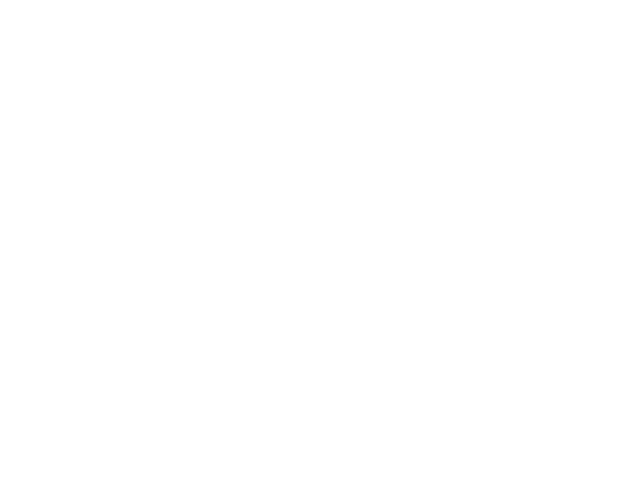

<IPython.core.display.Javascript object>


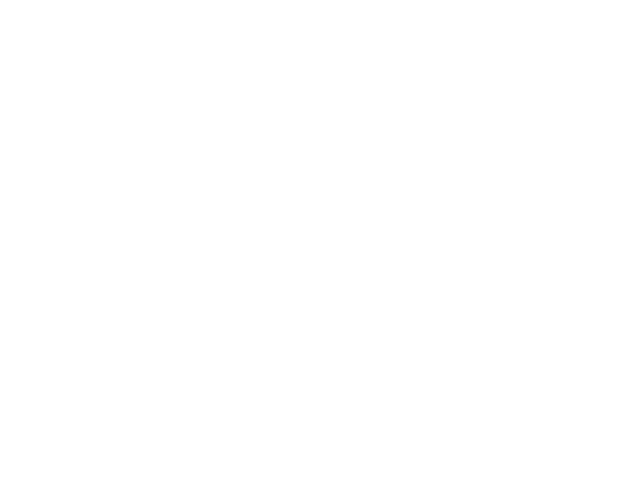

<IPython.core.display.Javascript object>


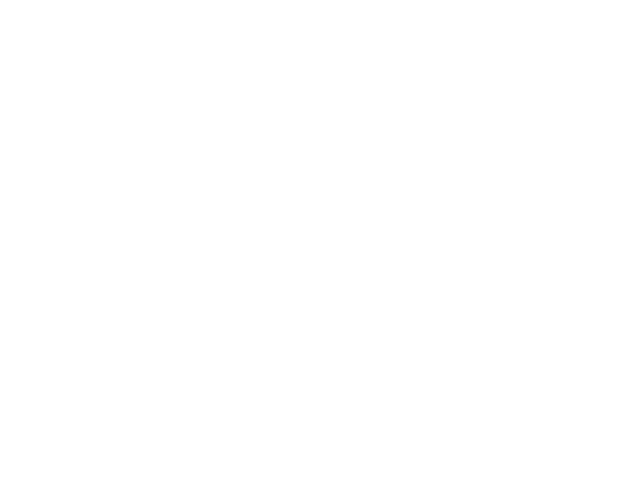

<IPython.core.display.Javascript object>


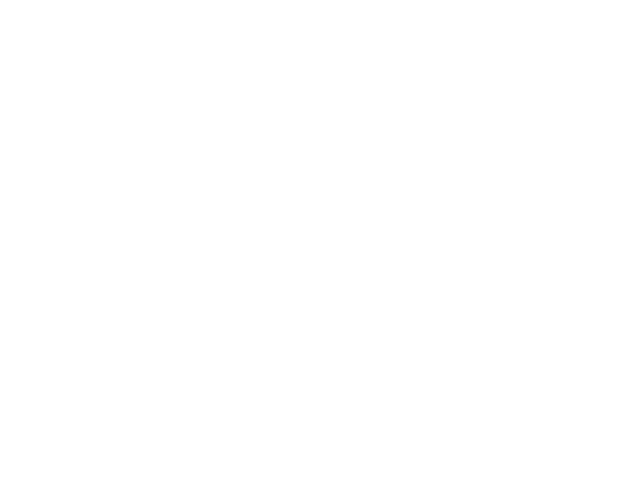

<IPython.core.display.Javascript object>


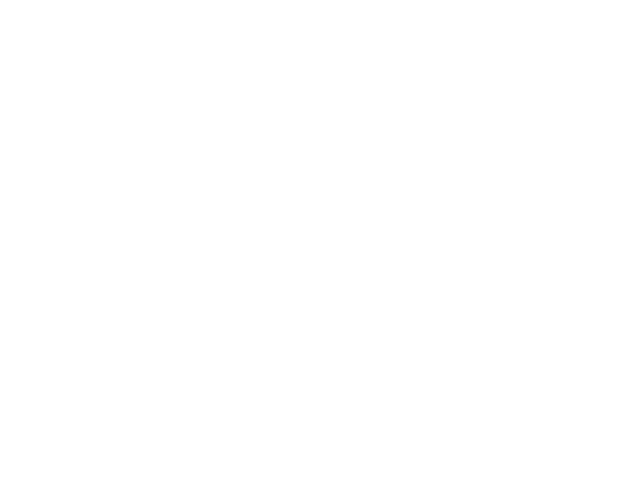

<IPython.core.display.Javascript object>


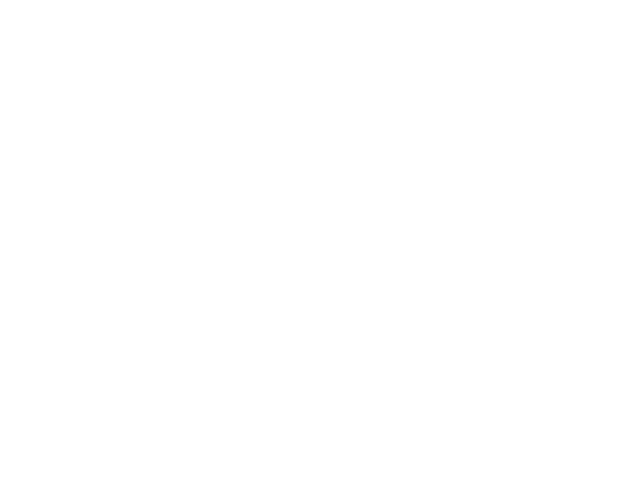

<IPython.core.display.Javascript object>


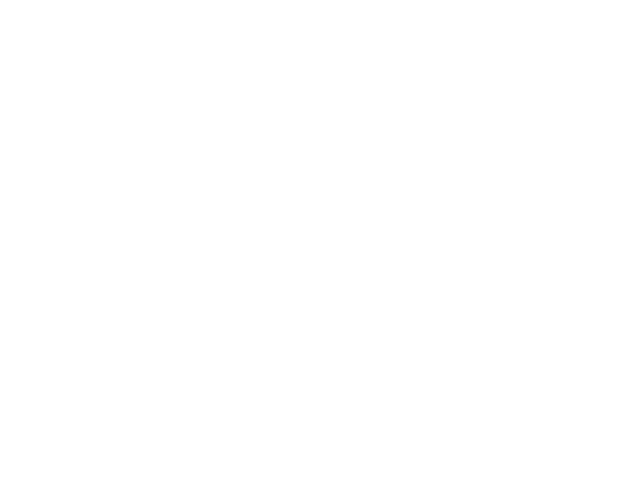

<IPython.core.display.Javascript object>


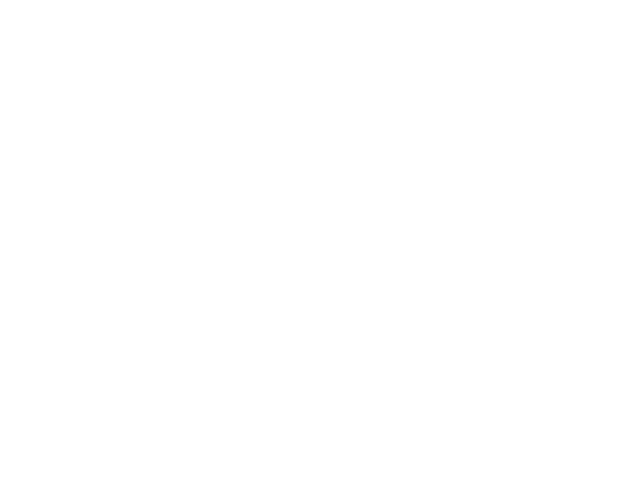

<IPython.core.display.Javascript object>


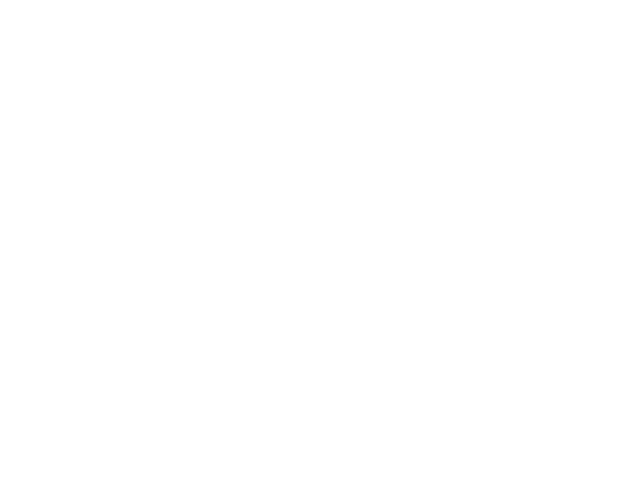

<IPython.core.display.Javascript object>


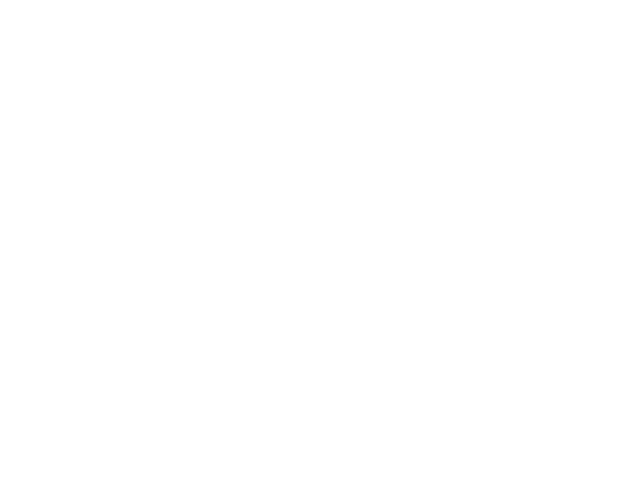

<IPython.core.display.Javascript object>


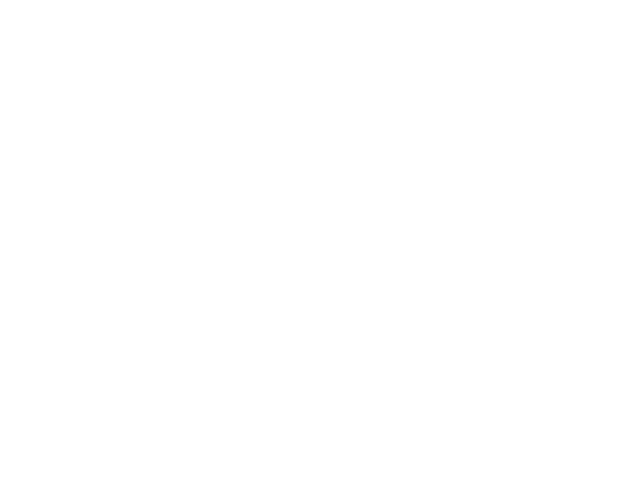

In [32]:
# # WITH HIGHER LEARNING RATE

# num_in = 148

# input1 = Input(shape=(num_in))
# model1 = Dense(256,  activation='relu')(input1)
# model1 = model1 = Dropout(0.5)(model1)
# model1 = Dense(64, activation='relu')(model1)
# model1 = Dense(32, activation='relu')(model1)
# model1 = Dense(int(256),   activation='relu')(model1)
# model1 = Dense(int(1024),  activation='relu')(model1)
# model1 = Dense(int(256),  activation='relu')(model1)
# model1 = Dense(32, activation='relu')(model1)
# model1 = Dense(4, activation='relu')(model1)
# model1 = Dense(1, activation='linear' )(model1)


# output = model1
# model = tensorflow.keras.models.Model(inputs=input1, outputs=output)
# #compile model using accuracy to measure model performance
# model.compile(loss='mse', optimizer=tf.keras.optimizers.Adam(
#     learning_rate=0.001),metrics=['mse'])
# model.summary()

# history = model.fit(X[:,:num_in], 
#                    y_train_log, 
#                     validation_data=(
#                         X_test[:,:num_in], 
#                         y_val_log,                                    ),
#                     batch_size=8192*4,epochs=1000,verbose=2,
#                    callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_loss',  restore_best_weights=True,
#              patience=100)])#


# plt.figure()
# # summarize history for loss
# plt.plot(history.history['loss'][:])
# plt.plot(history.history['val_loss'][:])
# plt.title('model loss')
# plt.ylabel('loss')
# plt.xlabel('epoch')
# plt.legend(['train', 'test'], loc='upper left')
# plt.ylim([0,.9])
# plt.show()

# plt.figure()
# # summarize history for loss
# plt.plot(history.history['loss'][:])
# plt.plot(history.history['val_loss'][:])
# plt.title('model loss')
# plt.ylabel('loss')
# plt.xlabel('epoch')
# plt.legend(['train', 'test'], loc='upper left')
# plt.show()

# results = model.predict(X_test)

# df_results = pd.DataFrame(data=results, index = y_val_log.index)

# model_3 = df_results

# plot_model(df_results)

In [44]:
# LOAD THE COMBINED SOURTHERN HEMISPHERE AND NORTHERN HEMISPHERE AS CREATED ABOVE

filescname = "./all_sc_df_1min_SH_NH_combined.pkl"
pickle_file = open(filescname, "rb") 
df_cumulative =pickle.load(pickle_file)

cols_to_drop_validation = [c for c in df_cumulative.columns if ('SC_AACGM_LON' in c) | ('STD' in c) | ('Kp' in c )| ('Clock' in c) | ('AVG' in c) | ('SC_AACGM_LTIME'==c)]
df_cumulative = df_cumulative.drop(columns=cols_to_drop_validation)
df_cumulative=df_cumulative.dropna()
cols_to_drop = [c for c in df_cumulative.columns if ('1min' in c) | ('3min' in c) | ('4min' in c) | ('_5min'in c) | ('15min' in c)| ('5hr' in c) | ('F107_' in c) | ('vx' in c) | ('AE' in c) | ('newell' in c) | ('borovsky' in c) | ('STD' in c) | ('AVG' in c) | ('SC_AACGM_LTIME'==c)]
df_cumulative = df_cumulative.drop(columns=cols_to_drop)


# Separate training and testing data
mask_val = [(df_cumulative.index.year == 2010) & (df_cumulative['SC_ID'].values==16)]
df_val = df_cumulative[mask_val[0]].copy(deep=True)
df_train = df_cumulative.copy(deep=True).drop( df_cumulative.index[mask_val[0]])

del df_cumulative



# Construct X and y
feature_cols = [c for c in df_train.columns if not 'ELE' in c]
#print( (feature_cols))
#print(df_cumulative.columns)
X_val = df_val[feature_cols].copy(deep=True)
y_val = df_val['ELE_TOTAL_ENERGY_FLUX'].copy(deep=True)
X_train = df_train[feature_cols].copy(deep=True)
y_train = df_train['ELE_TOTAL_ENERGY_FLUX'].copy(deep=True)
scaler_X = preprocessing.RobustScaler()
scaler_X = scaler_X.fit(X_train.values)
X_val_scaled = scaler_X.transform(X_val.values)
X_train_scaled = scaler_X.transform(X_train.values)

numFeatures = len(X_train.columns.to_list())
feature_labels = X_train.columns.to_list()
y_train_erg = y_train.copy(deep=True) * (1.60218e-12)
y_val_erg = y_val.copy(deep=True) * (1.60218e-12)

y_train[y_train == 0] = 0.0001
y_val[y_val == 0] = 0.0001
y_train_log = np.log10(y_train.copy(deep=True))
y_val_log = np.log10(y_val.copy(deep=True))
X = np.array(X_train_scaled, dtype=np.float32)
X_test = np.array(X_val_scaled, dtype=np.float32)

del df_train

import tensorflow.keras.backend as K
from tensorflow.keras.layers import Input

def custom_loss(y_true, y_pred):
    

    loss = K.mean( 
        2.5*(y_true-y_pred)*(y_true-y_pred)
        *K.cast(K.greater(y_true,11.5),'float32')*K.cast(K.less_equal(y_pred,11.5),'float32') +
        5*(y_true-y_pred)*(y_true-y_pred) 
        *K.cast(K.greater(y_true,12.),'float32')*K.cast(K.less_equal(y_pred,12.0),'float32') +
        10*(y_true-y_pred)*(y_true-y_pred)
        *K.cast(K.greater(y_true,12.5),'float32')*K.cast(K.less_equal(y_pred,12.5),'float32')  
        +
        10*(y_true-y_pred)*(y_true-y_pred)
        *K.cast(K.greater(y_true,12.75),'float32')*K.cast(K.less_equal(y_pred,12.75),'float32')  
        +
        10*(y_true-y_pred)*(y_true-y_pred)
        *K.cast(K.greater(y_true,13.),'float32')*K.cast(K.less_equal(y_pred,13.),'float32')  
    )             
                 
            
    loss =  loss+K.mean((y_true-y_pred)*(y_true-y_pred))

    return loss

/usr/local/lib/python3.6/dist-packages/tensorflow/python/client/session.py:1751: UserWarning: An interactive session is already active. This can cause out-of-memory errors in some cases. You must explicitly call `InteractiveSession.close()` to release resources held by the other session(s).
  warnings.warn('An interactive session is already active. This can '


Model: "functional_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_6 (InputLayer)         [(None, 73)]              0         
_________________________________________________________________
dense_45 (Dense)             (None, 256)               18944     
_________________________________________________________________
dropout_5 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_46 (Dense)             (None, 64)                16448     
_________________________________________________________________
dense_47 (Dense)             (None, 32)                2080      
_________________________________________________________________
dense_48 (Dense)             (None, 256)               8448      
_________________________________________________________________
dense_49 (Dense)             (None, 1024)             

Epoch 70/4000
188/188 - 4s - loss: 1.1712 - mse: 0.8432 - val_loss: 1.1802 - val_mse: 0.9348
Epoch 71/4000
188/188 - 4s - loss: 1.1693 - mse: 0.8417 - val_loss: 1.1785 - val_mse: 0.9237
Epoch 72/4000
188/188 - 4s - loss: 1.1666 - mse: 0.8392 - val_loss: 1.1870 - val_mse: 0.9386
Epoch 73/4000
188/188 - 4s - loss: 1.1648 - mse: 0.8384 - val_loss: 1.1692 - val_mse: 0.9089
Epoch 74/4000
188/188 - 4s - loss: 1.1658 - mse: 0.8391 - val_loss: 1.1676 - val_mse: 0.9265
Epoch 75/4000
188/188 - 4s - loss: 1.1620 - mse: 0.8359 - val_loss: 1.1620 - val_mse: 0.9385
Epoch 76/4000
188/188 - 4s - loss: 1.1623 - mse: 0.8367 - val_loss: 1.1779 - val_mse: 0.9030
Epoch 77/4000
188/188 - 4s - loss: 1.1590 - mse: 0.8345 - val_loss: 1.1608 - val_mse: 0.9185
Epoch 78/4000
188/188 - 4s - loss: 1.1601 - mse: 0.8344 - val_loss: 1.1586 - val_mse: 0.9271
Epoch 79/4000
188/188 - 4s - loss: 1.1589 - mse: 0.8344 - val_loss: 1.1716 - val_mse: 0.9081
Epoch 80/4000
188/188 - 4s - loss: 1.1569 - mse: 0.8320 - val_loss: 1.

Epoch 158/4000
188/188 - 4s - loss: 1.1173 - mse: 0.8106 - val_loss: 1.1315 - val_mse: 0.9208
Epoch 159/4000
188/188 - 4s - loss: 1.1174 - mse: 0.8106 - val_loss: 1.1334 - val_mse: 0.9068
Epoch 160/4000
188/188 - 4s - loss: 1.1165 - mse: 0.8100 - val_loss: 1.1366 - val_mse: 0.9354
Epoch 161/4000
188/188 - 4s - loss: 1.1177 - mse: 0.8105 - val_loss: 1.1370 - val_mse: 0.9186
Epoch 162/4000
188/188 - 4s - loss: 1.1158 - mse: 0.8103 - val_loss: 1.1328 - val_mse: 0.9116
Epoch 163/4000
188/188 - 4s - loss: 1.1156 - mse: 0.8097 - val_loss: 1.1278 - val_mse: 0.9144
Epoch 164/4000
188/188 - 4s - loss: 1.1155 - mse: 0.8100 - val_loss: 1.1294 - val_mse: 0.9162
Epoch 165/4000
188/188 - 4s - loss: 1.1157 - mse: 0.8096 - val_loss: 1.1353 - val_mse: 0.9387
Epoch 166/4000
188/188 - 4s - loss: 1.1161 - mse: 0.8102 - val_loss: 1.1417 - val_mse: 0.9395
Epoch 167/4000
188/188 - 4s - loss: 1.1148 - mse: 0.8096 - val_loss: 1.1338 - val_mse: 0.9003
Epoch 168/4000
188/188 - 4s - loss: 1.1148 - mse: 0.8102 - v

188/188 - 4s - loss: 1.0957 - mse: 0.8037 - val_loss: 1.1257 - val_mse: 0.9035
Epoch 246/4000
188/188 - 4s - loss: 1.0961 - mse: 0.8037 - val_loss: 1.1281 - val_mse: 0.9005
Epoch 247/4000
188/188 - 4s - loss: 1.0935 - mse: 0.8023 - val_loss: 1.1283 - val_mse: 0.9133
Epoch 248/4000
188/188 - 4s - loss: 1.0960 - mse: 0.8041 - val_loss: 1.1263 - val_mse: 0.9150
Epoch 249/4000
188/188 - 4s - loss: 1.0958 - mse: 0.8033 - val_loss: 1.1311 - val_mse: 0.9023
Epoch 250/4000
188/188 - 4s - loss: 1.0942 - mse: 0.8028 - val_loss: 1.1245 - val_mse: 0.9248
Epoch 251/4000
188/188 - 4s - loss: 1.0935 - mse: 0.8039 - val_loss: 1.1257 - val_mse: 0.9172
Epoch 252/4000
188/188 - 4s - loss: 1.0962 - mse: 0.8040 - val_loss: 1.1277 - val_mse: 0.9025
Epoch 253/4000
188/188 - 4s - loss: 1.0941 - mse: 0.8034 - val_loss: 1.1304 - val_mse: 0.9138
Epoch 254/4000
188/188 - 5s - loss: 1.0929 - mse: 0.8032 - val_loss: 1.1278 - val_mse: 0.9079
Epoch 255/4000
188/188 - 4s - loss: 1.0937 - mse: 0.8033 - val_loss: 1.1214

Epoch 333/4000
188/188 - 4s - loss: 1.0805 - mse: 0.7990 - val_loss: 1.1275 - val_mse: 0.8985
Epoch 334/4000
188/188 - 4s - loss: 1.0816 - mse: 0.7997 - val_loss: 1.1214 - val_mse: 0.9119
Epoch 335/4000
188/188 - 4s - loss: 1.0817 - mse: 0.7997 - val_loss: 1.1178 - val_mse: 0.9092
Epoch 336/4000
188/188 - 4s - loss: 1.0804 - mse: 0.7989 - val_loss: 1.1179 - val_mse: 0.9128
Epoch 337/4000
188/188 - 4s - loss: 1.0782 - mse: 0.7983 - val_loss: 1.1283 - val_mse: 0.9130
Epoch 338/4000
188/188 - 4s - loss: 1.0816 - mse: 0.7993 - val_loss: 1.1302 - val_mse: 0.8920
Epoch 339/4000
188/188 - 4s - loss: 1.0825 - mse: 0.8002 - val_loss: 1.1306 - val_mse: 0.9042
Epoch 340/4000
188/188 - 4s - loss: 1.0799 - mse: 0.7989 - val_loss: 1.1240 - val_mse: 0.9129
Epoch 341/4000
188/188 - 4s - loss: 1.0803 - mse: 0.7988 - val_loss: 1.1296 - val_mse: 0.9154
Epoch 342/4000
188/188 - 4s - loss: 1.0797 - mse: 0.7988 - val_loss: 1.1231 - val_mse: 0.9122
Epoch 343/4000
188/188 - 4s - loss: 1.0804 - mse: 0.7989 - v

<IPython.core.display.Javascript object>


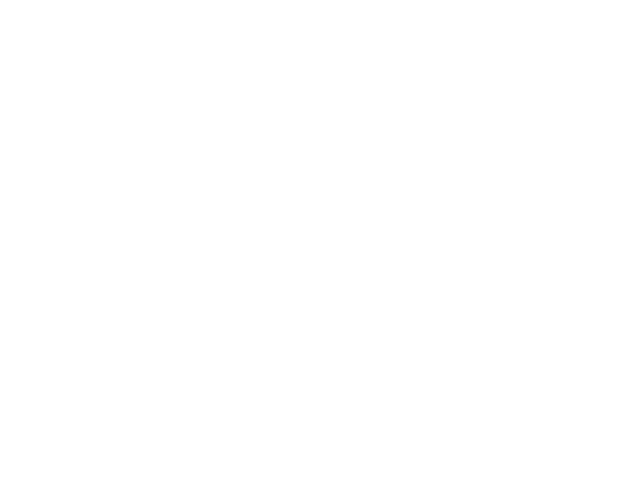

<IPython.core.display.Javascript object>


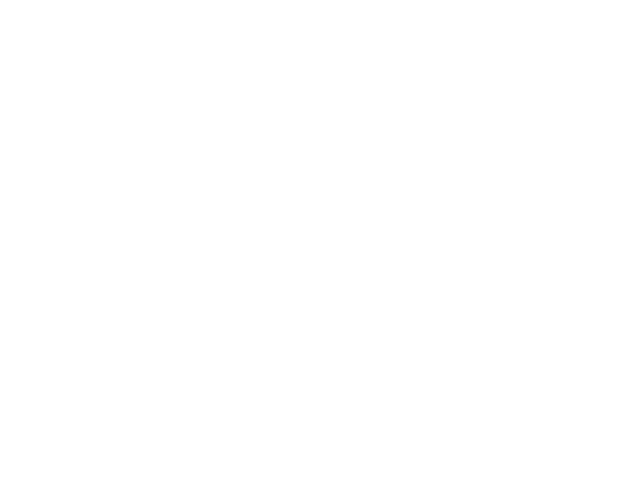

<IPython.core.display.Javascript object>


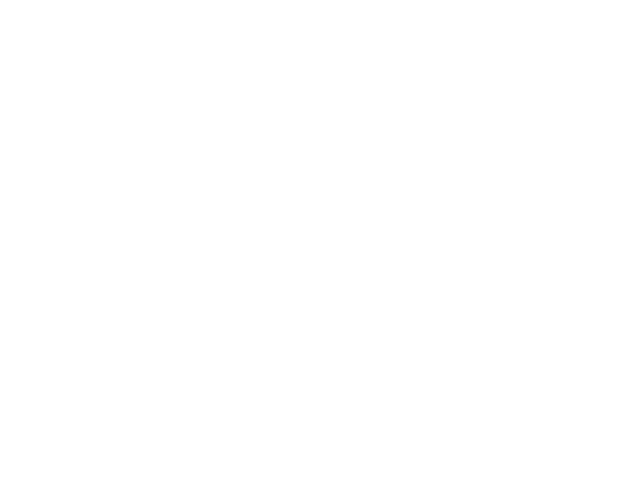

<IPython.core.display.Javascript object>


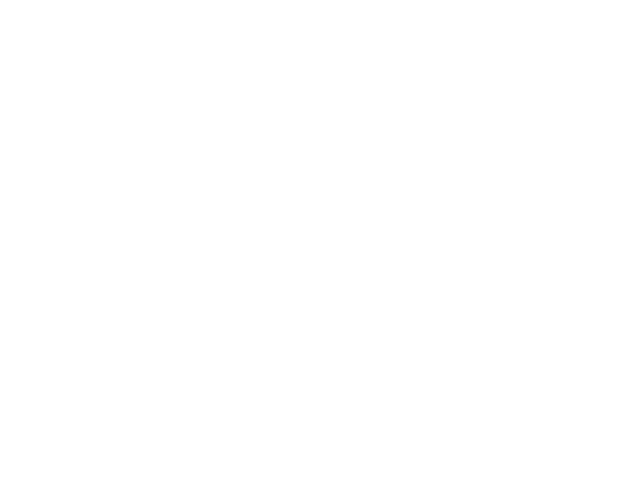

<IPython.core.display.Javascript object>


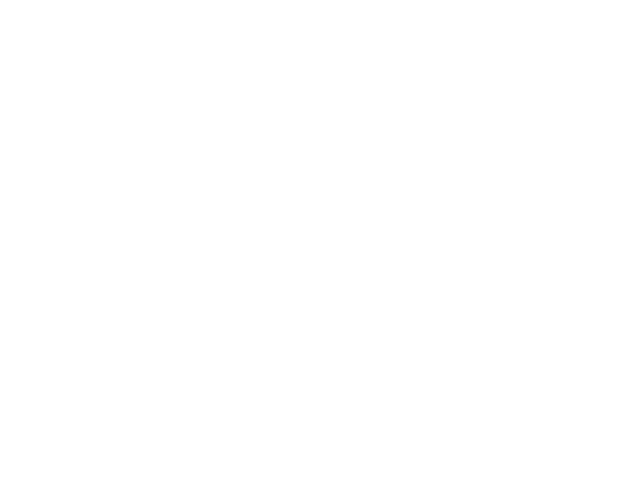

<IPython.core.display.Javascript object>


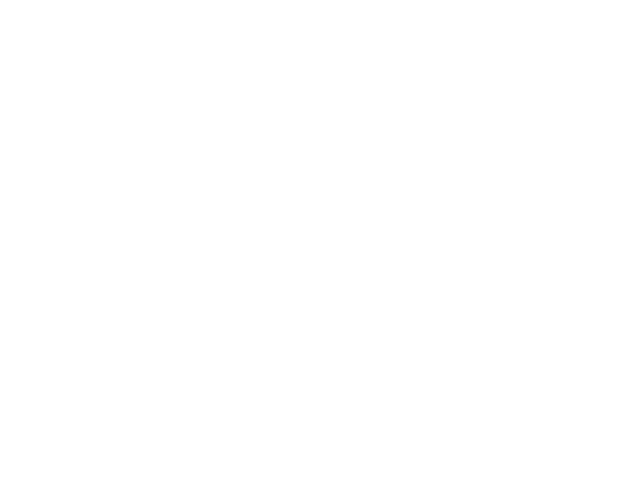

<IPython.core.display.Javascript object>


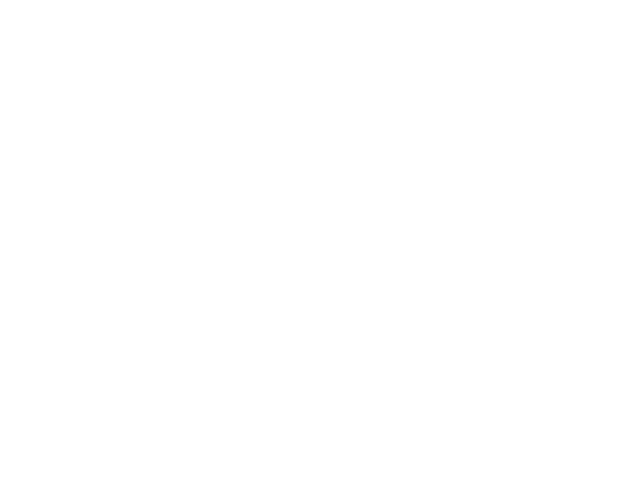

<IPython.core.display.Javascript object>


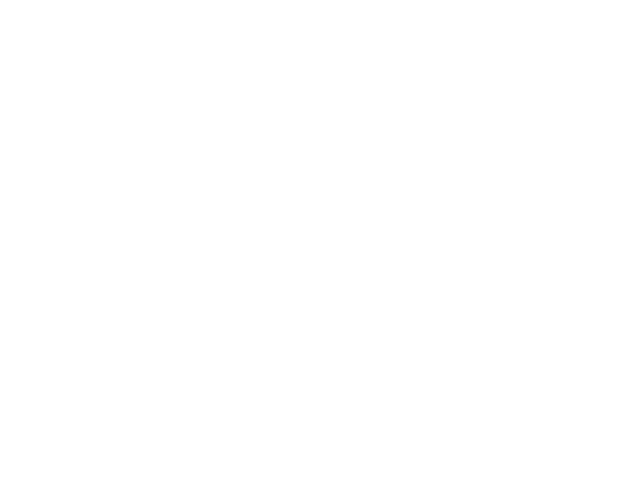

<IPython.core.display.Javascript object>


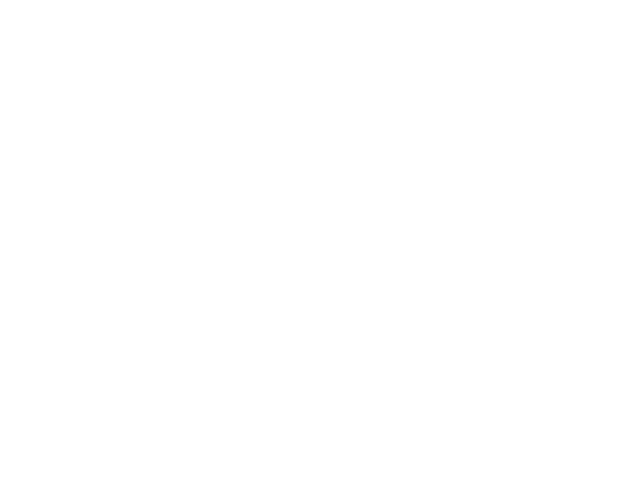

<IPython.core.display.Javascript object>


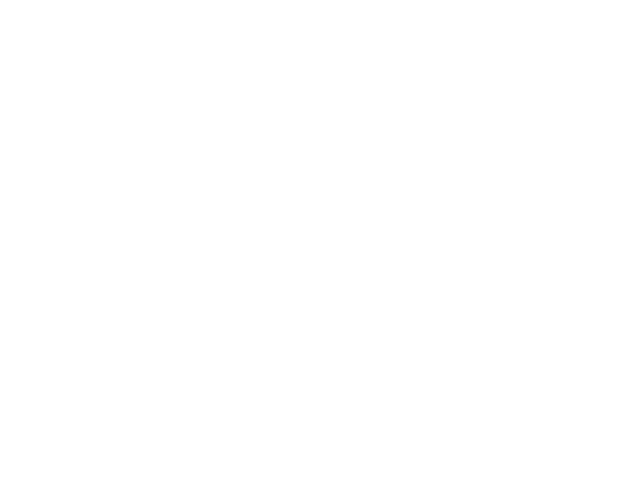

<IPython.core.display.Javascript object>


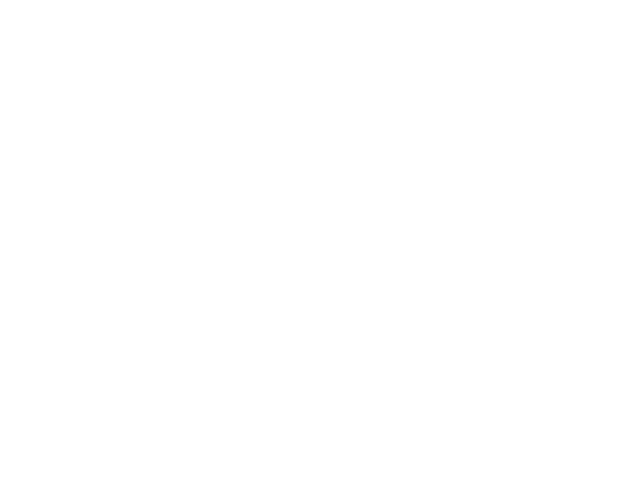

INFO:tensorflow:Assets written to: tail_loss_new_pipeline2_reduced/assets
5357/5357 [==============================] - 7s 1ms/step - loss: 1.1175 - mean_squared_error: 0.9096
[1.1174591779708862, 0.9096030592918396]


In [45]:



num_in = 73

input1 = Input(shape=(num_in))
model1 = Dense(256,  activation='relu')(input1)
model1 = model1 = Dropout(0.5)(model1)
model1 = Dense(64, activation='relu')(model1)
model1 = Dense(32, activation='relu')(model1)
model1 = Dense(int(256),   activation='relu')(model1)
model1 = Dense(int(1024),  activation='relu')(model1)
model1 = Dense(int(256),  activation='relu')(model1)
model1 = Dense(32, activation='relu')(model1)
model1 = Dense(4, activation='relu')(model1)
model1 = Dense(1, activation='linear' )(model1)


output = model1
model = tensorflow.keras.models.Model(inputs=input1, outputs=output)
#compile model using accuracy to measure model performance
model.compile(loss=custom_loss, optimizer=tf.keras.optimizers.Adam(
    learning_rate=0.0002),metrics=['mse'])
model.summary()

history = model.fit(X[:,:num_in], 
                   y_train_log, 
                    validation_data=(
                        X_test[:,:num_in], 
                        y_val_log,                                    ),
                    batch_size=8192*4,epochs=4000,verbose=2,
                   callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_loss',  restore_best_weights=True,
             patience=100)])#


plt.figure()
# summarize history for loss
plt.plot(history.history['loss'][:])
plt.plot(history.history['val_loss'][:])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.ylim([0,.9])
plt.show()

plt.figure()
# summarize history for loss
plt.plot(history.history['loss'][:])
plt.plot(history.history['val_loss'][:])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

results = model.predict( X_test[:,:num_in])

df_results = pd.DataFrame(data=results, index = y_val_log.index)

tail_loss_new_pipeline2_reduced = df_results

plot_model(df_results)

filename='tail_loss_new_pipeline2_reduced'
model.save(filename)
model = tensorflow.keras.models.load_model(filename, custom_objects={'custom_loss': custom_loss})

print(model.evaluate(X_test[:,:num_in],y_val_log.values))



In [ ]:
#### NOW REPEATING FOR ELE_TOTAL_COUNTS INSTEAD OF TOTAL FLUX

Model: "functional_25"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_14 (InputLayer)        [(None, 148)]             0         
_________________________________________________________________
dense_117 (Dense)            (None, 256)               38144     
_________________________________________________________________
dropout_13 (Dropout)         (None, 256)               0         
_________________________________________________________________
dense_118 (Dense)            (None, 64)                16448     
_________________________________________________________________
dense_119 (Dense)            (None, 32)                2080      
_________________________________________________________________
dense_120 (Dense)            (None, 256)               8448      
_________________________________________________________________
dense_121 (Dense)            (None, 1024)            

Epoch 70/1000
188/188 - 5s - loss: 0.6552 - mse: 0.6552 - val_loss: 1.1951 - val_mse: 1.1951
Epoch 71/1000
188/188 - 5s - loss: 0.6549 - mse: 0.6549 - val_loss: 1.1843 - val_mse: 1.1843
Epoch 72/1000
188/188 - 5s - loss: 0.6549 - mse: 0.6549 - val_loss: 1.1863 - val_mse: 1.1863
Epoch 73/1000
188/188 - 5s - loss: 0.6541 - mse: 0.6541 - val_loss: 1.1921 - val_mse: 1.1921
Epoch 74/1000
188/188 - 5s - loss: 0.6542 - mse: 0.6542 - val_loss: 1.1854 - val_mse: 1.1854
Epoch 75/1000
188/188 - 5s - loss: 0.6535 - mse: 0.6535 - val_loss: 1.1822 - val_mse: 1.1822
Epoch 76/1000
188/188 - 5s - loss: 0.6535 - mse: 0.6535 - val_loss: 1.1992 - val_mse: 1.1992
Epoch 77/1000
188/188 - 5s - loss: 0.6533 - mse: 0.6533 - val_loss: 1.1796 - val_mse: 1.1796
Epoch 78/1000
188/188 - 5s - loss: 0.6531 - mse: 0.6531 - val_loss: 1.1812 - val_mse: 1.1812
Epoch 79/1000
188/188 - 5s - loss: 0.6525 - mse: 0.6525 - val_loss: 1.1909 - val_mse: 1.1909
Epoch 80/1000
188/188 - 5s - loss: 0.6526 - mse: 0.6526 - val_loss: 1.

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:80: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


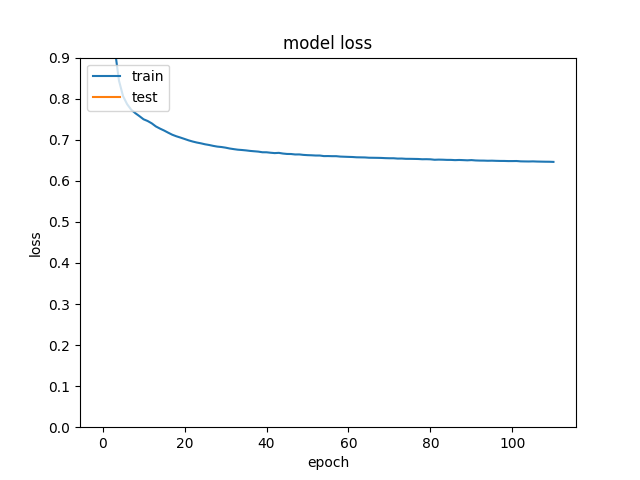

<IPython.core.display.Javascript object>


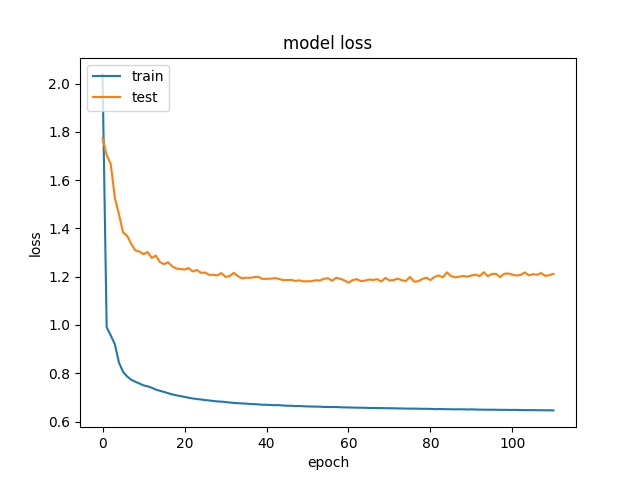

<IPython.core.display.Javascript object>


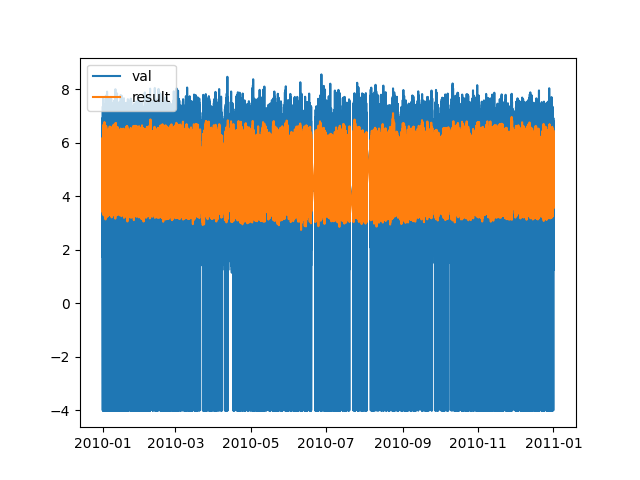

<IPython.core.display.Javascript object>


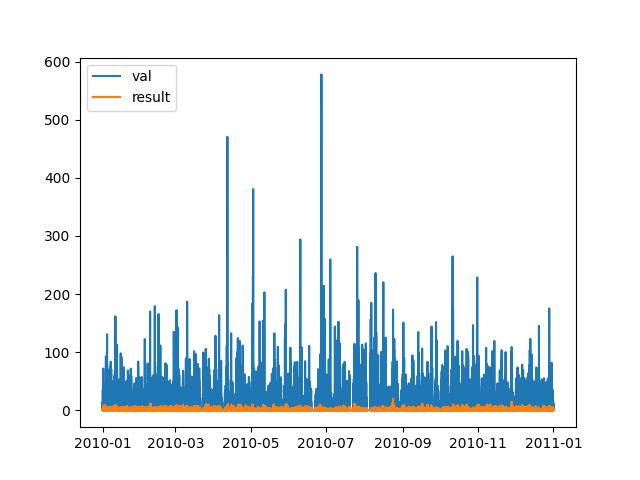

<IPython.core.display.Javascript object>


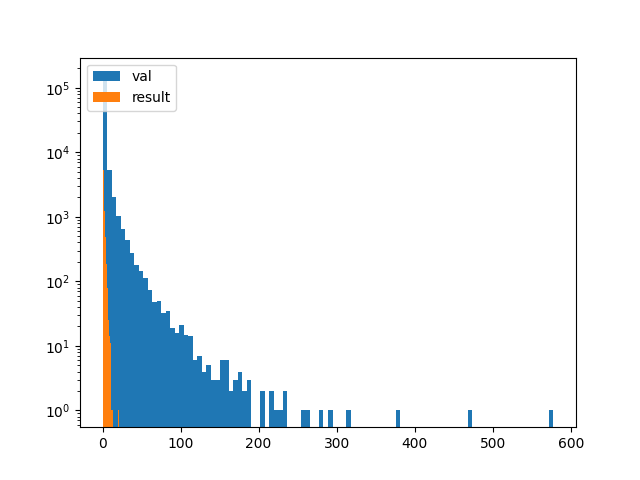

<IPython.core.display.Javascript object>


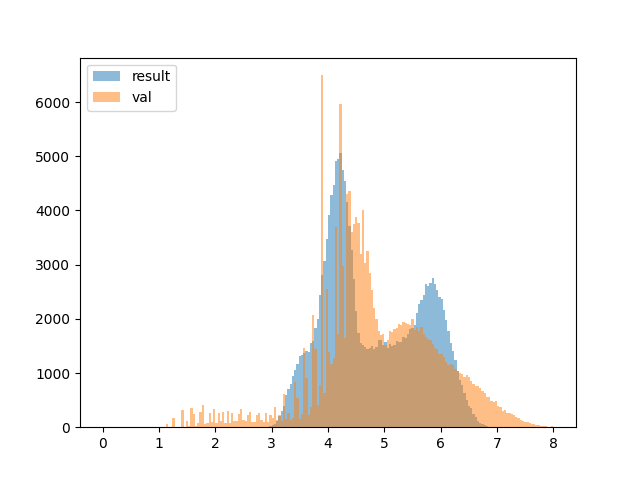

<IPython.core.display.Javascript object>


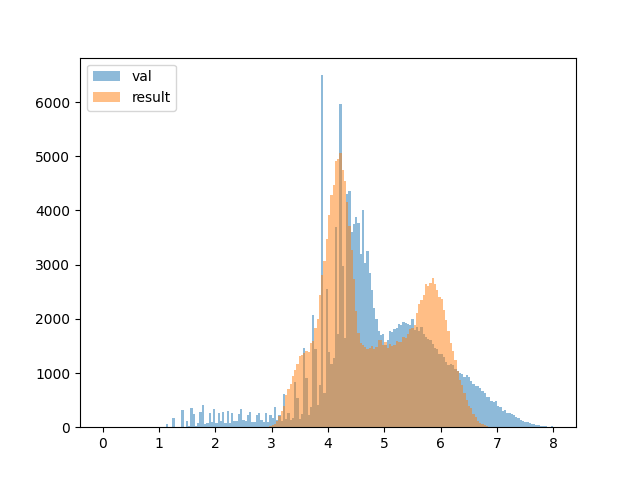

<IPython.core.display.Javascript object>


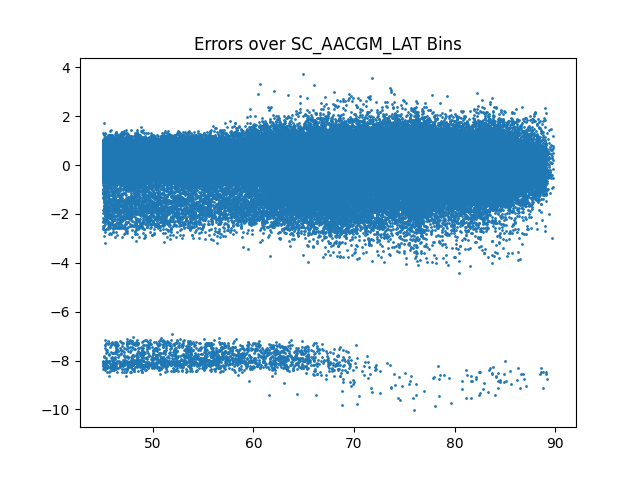

<IPython.core.display.Javascript object>


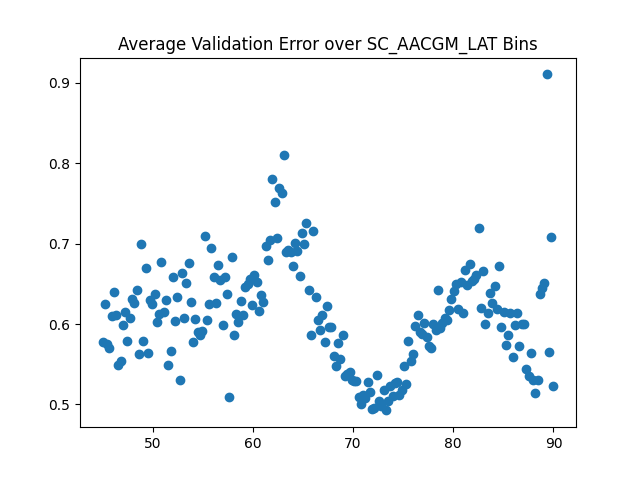

<IPython.core.display.Javascript object>


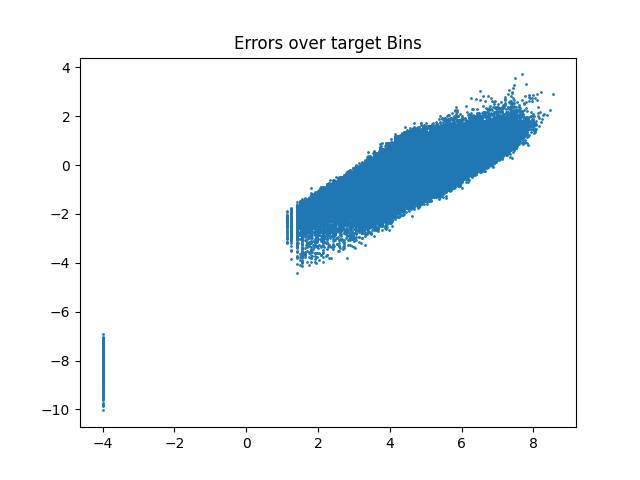

<IPython.core.display.Javascript object>


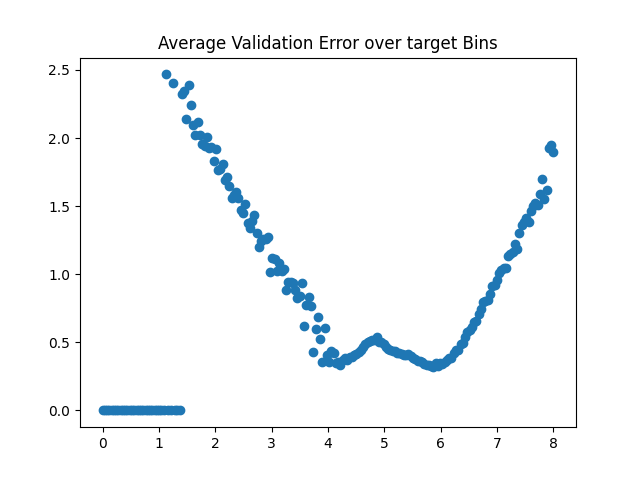

In [65]:
# ### WITH 0.001 LEARNING RATE AND KEEPING THE REALLY SMALL VALUES

# # LOAD THE COMBINED SOURTHERN HEMISPHERE AND NORTHERN HEMISPHERE AS CREATED ABOVE
# filescname = "./all_sc_df_1min_SH_NH_combined.pkl"
# pickle_file = open(filescname, "rb") 
# df_cumulative =pickle.load(pickle_file)
# cols_to_drop_validation = [c for c in df_cumulative.columns if ('SC_AACGM_LON' in c) | ('STD' in c) | ('Kp' in c )| ('Clock' in c) | ('AVG' in c) | ('SC_AACGM_LTIME'==c)]
# df_cumulative = df_cumulative.drop(columns=cols_to_drop_validation)
# df_cumulative=df_cumulative.dropna()


# # Separate training and testing data
# mask_val = [(df_cumulative.index.year == 2010) & (df_cumulative['SC_ID'].values==16)]
# df_val = df_cumulative[mask_val[0]].copy(deep=True)
# df_train = df_cumulative.copy(deep=True).drop( df_cumulative.index[mask_val[0]])


# del df_cumulative


# # Construct X and y
# feature_cols = [c for c in df_train.columns if not 'ELE' in c]
# #print( (feature_cols))
# #print(df_cumulative.columns)
# X_val = df_val[feature_cols].copy(deep=True)
# y_val = df_val['ELE_TOTAL_COUNTS'].copy(deep=True)
# X_train = df_train[feature_cols].copy(deep=True)
# y_train = df_train['ELE_TOTAL_COUNTS'].copy(deep=True)
# scaler_X = preprocessing.RobustScaler()
# scaler_X = scaler_X.fit(X_train.values)
# X_val_scaled = scaler_X.transform(X_val.values)
# X_train_scaled = scaler_X.transform(X_train.values)

# numFeatures = len(X_train.columns.to_list())
# feature_labels = X_train.columns.to_list()
# y_train_erg = y_train.copy(deep=True) * (1.60218e-12)
# y_val_erg = y_val.copy(deep=True) * (1.60218e-12)

# y_train[y_train == 0] = 0.0001
# y_val[y_val == 0] = 0.0001
# y_train_log = np.log10(y_train.copy(deep=True))
# y_val_log = np.log10(y_val.copy(deep=True))
# X = np.array(X_train_scaled, dtype=np.float32)
# X_test = np.array(X_val_scaled, dtype=np.float32)

# del df_train

# num_in = 148

# input1 = Input(shape=(num_in))
# model1 = Dense(256,  activation='relu')(input1)
# model1 = model1 = Dropout(0.5)(model1)
# model1 = Dense(64, activation='relu')(model1)
# model1 = Dense(32, activation='relu')(model1)
# model1 = Dense(int(256),   activation='relu')(model1)
# model1 = Dense(int(1024),  activation='relu')(model1)
# model1 = Dense(int(256),  activation='relu')(model1)
# model1 = Dense(32, activation='relu')(model1)
# model1 = Dense(4, activation='relu')(model1)
# model1 = Dense(1, activation='linear' )(model1)


# output = model1
# model = tensorflow.keras.models.Model(inputs=input1, outputs=output)
# #compile model using accuracy to measure model performance
# model.compile(loss='mse', optimizer=tf.keras.optimizers.Adam(
#     learning_rate=0.001),metrics=['mse'])
# model.summary()

# history = model.fit(X[:,:num_in], 
#                    y_train_log, 
#                     validation_data=(
#                         X_test[:,:num_in], 
#                         y_val_log,                                    ),
#                     batch_size=8192*4,epochs=1000,verbose=2,
#                    callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_loss',  restore_best_weights=True,
#              patience=50)])#


# plt.figure()
# # summarize history for loss
# plt.plot(history.history['loss'][:])
# plt.plot(history.history['val_loss'][:])
# plt.title('model loss')
# plt.ylabel('loss')
# plt.xlabel('epoch')
# plt.legend(['train', 'test'], loc='upper left')
# plt.ylim([0,.9])
# plt.show()

# plt.figure()
# # summarize history for loss
# plt.plot(history.history['loss'][:])
# plt.plot(history.history['val_loss'][:])
# plt.title('model loss')
# plt.ylabel('loss')
# plt.xlabel('epoch')
# plt.legend(['train', 'test'], loc='upper left')
# plt.show()

# results = model.predict(X_test)

# df_results = pd.DataFrame(data=results, index = y_val_log.index)

# model_3 = df_results

# plot_model(df_results)

Model: "functional_15"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_9 (InputLayer)         [(None, 148)]             0         
_________________________________________________________________
dense_72 (Dense)             (None, 256)               38144     
_________________________________________________________________
dropout_8 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_73 (Dense)             (None, 64)                16448     
_________________________________________________________________
dense_74 (Dense)             (None, 32)                2080      
_________________________________________________________________
dense_75 (Dense)             (None, 256)               8448      
_________________________________________________________________
dense_76 (Dense)             (None, 1024)            

Epoch 70/1000
187/187 - 5s - loss: 0.3278 - mse: 0.3278 - val_loss: 0.4906 - val_mse: 0.4906
Epoch 71/1000
187/187 - 5s - loss: 0.3274 - mse: 0.3274 - val_loss: 0.4935 - val_mse: 0.4935
Epoch 72/1000
187/187 - 5s - loss: 0.3273 - mse: 0.3273 - val_loss: 0.4910 - val_mse: 0.4910
Epoch 73/1000
187/187 - 5s - loss: 0.3268 - mse: 0.3268 - val_loss: 0.4881 - val_mse: 0.4881
Epoch 74/1000
187/187 - 5s - loss: 0.3267 - mse: 0.3267 - val_loss: 0.4849 - val_mse: 0.4849
Epoch 75/1000
187/187 - 5s - loss: 0.3262 - mse: 0.3262 - val_loss: 0.4976 - val_mse: 0.4976
Epoch 76/1000
187/187 - 5s - loss: 0.3264 - mse: 0.3264 - val_loss: 0.4834 - val_mse: 0.4834
Epoch 77/1000
187/187 - 5s - loss: 0.3264 - mse: 0.3264 - val_loss: 0.4932 - val_mse: 0.4932
Epoch 78/1000
187/187 - 5s - loss: 0.3255 - mse: 0.3255 - val_loss: 0.4820 - val_mse: 0.4820
Epoch 79/1000
187/187 - 5s - loss: 0.3256 - mse: 0.3256 - val_loss: 0.4848 - val_mse: 0.4848
Epoch 80/1000
187/187 - 5s - loss: 0.3258 - mse: 0.3258 - val_loss: 0.

Epoch 158/1000
187/187 - 5s - loss: 0.3153 - mse: 0.3153 - val_loss: 0.4792 - val_mse: 0.4792
Epoch 159/1000
187/187 - 5s - loss: 0.3152 - mse: 0.3152 - val_loss: 0.4749 - val_mse: 0.4749
Epoch 160/1000
187/187 - 5s - loss: 0.3152 - mse: 0.3152 - val_loss: 0.4764 - val_mse: 0.4764
Epoch 161/1000
187/187 - 5s - loss: 0.3151 - mse: 0.3151 - val_loss: 0.4779 - val_mse: 0.4779
Epoch 162/1000
187/187 - 5s - loss: 0.3152 - mse: 0.3152 - val_loss: 0.4789 - val_mse: 0.4789
Epoch 163/1000
187/187 - 5s - loss: 0.3149 - mse: 0.3149 - val_loss: 0.4766 - val_mse: 0.4766
Epoch 164/1000
187/187 - 5s - loss: 0.3146 - mse: 0.3146 - val_loss: 0.4795 - val_mse: 0.4795
Epoch 165/1000
187/187 - 5s - loss: 0.3147 - mse: 0.3147 - val_loss: 0.4833 - val_mse: 0.4833
Epoch 166/1000
187/187 - 5s - loss: 0.3142 - mse: 0.3142 - val_loss: 0.4776 - val_mse: 0.4776
Epoch 167/1000
187/187 - 5s - loss: 0.3142 - mse: 0.3142 - val_loss: 0.4845 - val_mse: 0.4845
Epoch 168/1000
187/187 - 5s - loss: 0.3143 - mse: 0.3143 - v

<IPython.core.display.Javascript object>


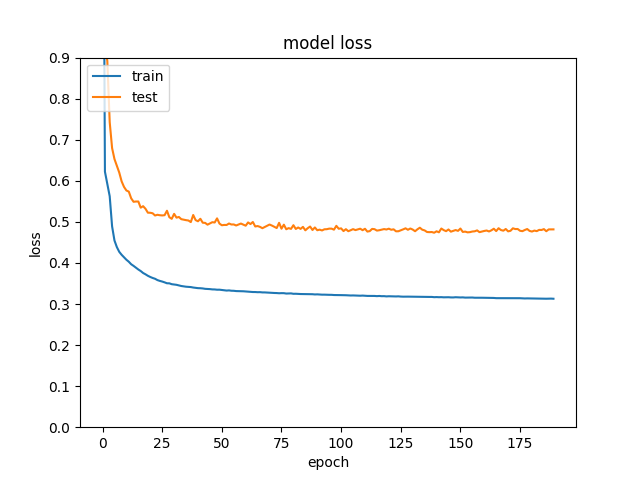

<IPython.core.display.Javascript object>


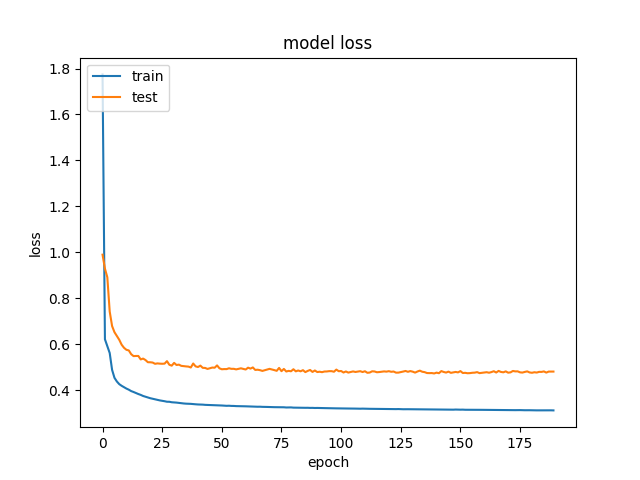

<IPython.core.display.Javascript object>


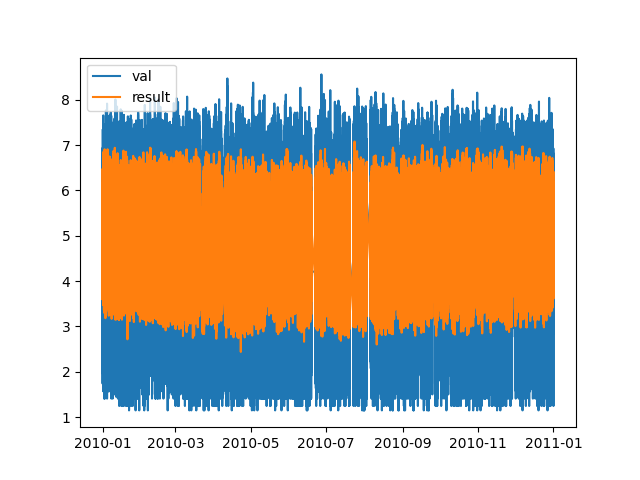

<IPython.core.display.Javascript object>


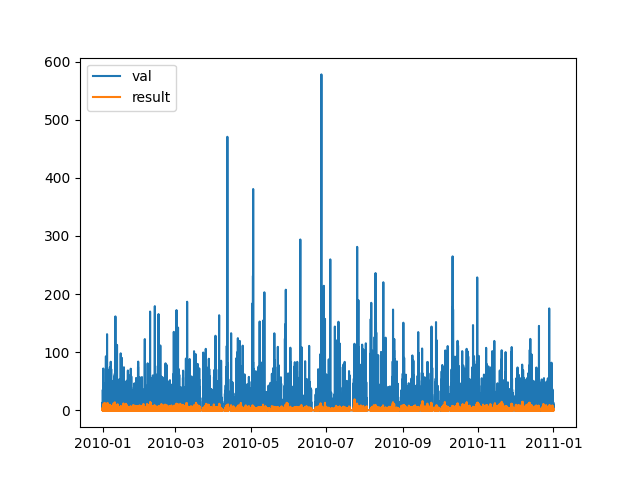

<IPython.core.display.Javascript object>


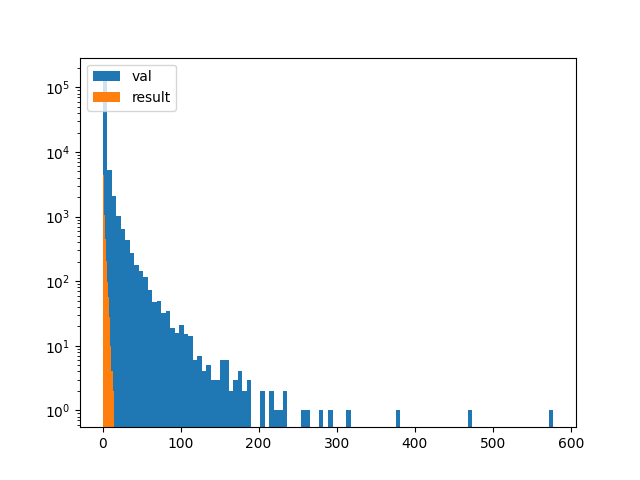

<IPython.core.display.Javascript object>


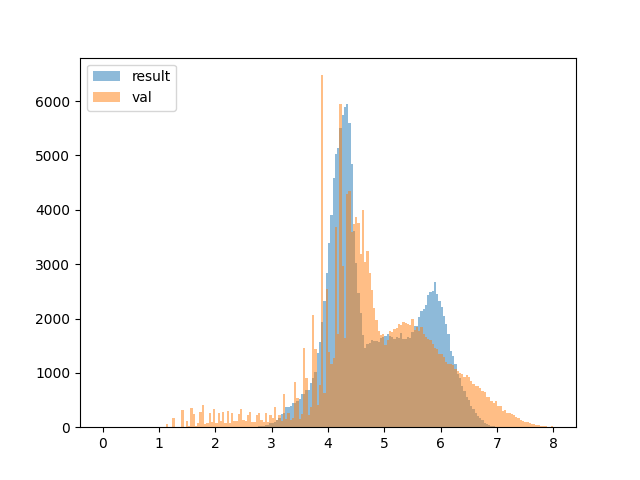

<IPython.core.display.Javascript object>


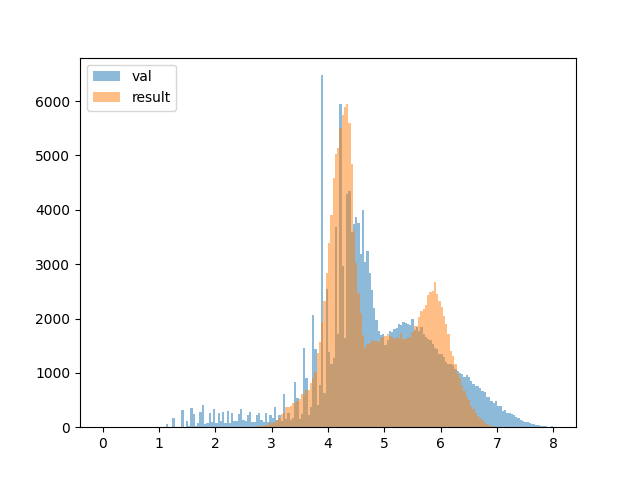

<IPython.core.display.Javascript object>


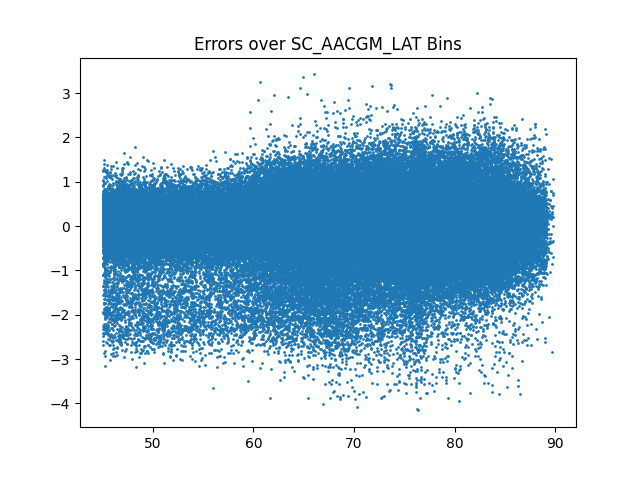

<IPython.core.display.Javascript object>


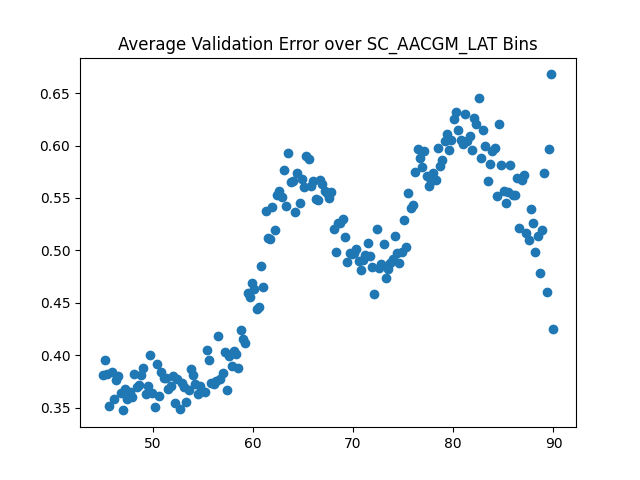

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:56: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


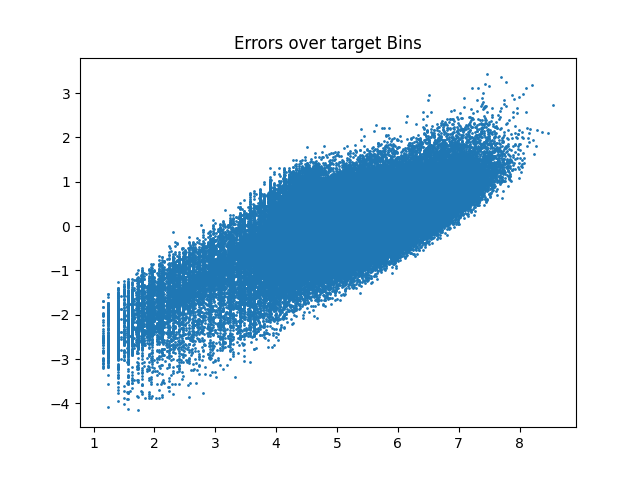

<IPython.core.display.Javascript object>


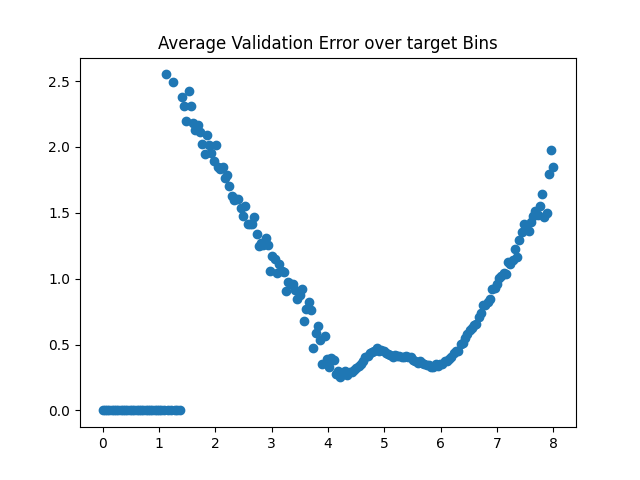

In [51]:
### REPEATING THE TRAINING GETTING RID OF THE SMALL VALUES


# LOAD THE COMBINED SOURTHERN HEMISPHERE AND NORTHERN HEMISPHERE AS CREATED ABOVE

filescname = "./all_sc_df_1min_SH_NH_combined.pkl"
pickle_file = open(filescname, "rb") 
df_cumulative =pickle.load(pickle_file)
cols_to_drop_validation = [c for c in df_cumulative.columns if ('SC_AACGM_LON' in c) | ('STD' in c) | ('Kp' in c )| ('Clock' in c) | ('AVG' in c) | ('SC_AACGM_LTIME'==c)]
df_cumulative = df_cumulative.drop(columns=cols_to_drop_validation)
df_cumulative=df_cumulative.dropna()

#### GET RID OF THE REALLY SMALL VALUES
df_cumulative = df_cumulative.drop( df_cumulative.index[(df_cumulative['ELE_TOTAL_COUNTS']) < 1])


# Separate training and testing data
mask_val = [(df_cumulative.index.year == 2010) & (df_cumulative['SC_ID'].values==16)]
df_val = df_cumulative[mask_val[0]].copy(deep=True)
df_train = df_cumulative.copy(deep=True).drop( df_cumulative.index[mask_val[0]])




# Construct X and y
feature_cols = [c for c in df_train.columns if not 'ELE' in c]
#print( (feature_cols))
#print(df_cumulative.columns)
X_val = df_val[feature_cols].copy(deep=True)
y_val = df_val['ELE_TOTAL_COUNTS'].copy(deep=True)
X_train = df_train[feature_cols].copy(deep=True)
y_train = df_train['ELE_TOTAL_COUNTS'].copy(deep=True)
scaler_X = preprocessing.RobustScaler()
scaler_X = scaler_X.fit(X_train.values)
X_val_scaled = scaler_X.transform(X_val.values)
X_train_scaled = scaler_X.transform(X_train.values)

numFeatures = len(X_train.columns.to_list())
feature_labels = X_train.columns.to_list()
y_train_erg = y_train.copy(deep=True) * (1.60218e-12)
y_val_erg = y_val.copy(deep=True) * (1.60218e-12)

y_train[y_train == 0] = 0.0001
y_val[y_val == 0] = 0.0001
y_train_log = np.log10(y_train.copy(deep=True))
y_val_log = np.log10(y_val.copy(deep=True))
X = np.array(X_train_scaled, dtype=np.float32)
X_test = np.array(X_val_scaled, dtype=np.float32)

del df_train


## UNCOMMENT BELOW TO RETRAIN

# num_in = 148

# input1 = Input(shape=(num_in))
# model1 = Dense(256,  activation='relu')(input1)
# model1 = model1 = Dropout(0.5)(model1)
# model1 = Dense(64, activation='relu')(model1)
# model1 = Dense(32, activation='relu')(model1)
# model1 = Dense(int(256),   activation='relu')(model1)
# model1 = Dense(int(1024),  activation='relu')(model1)
# model1 = Dense(int(256),  activation='relu')(model1)
# model1 = Dense(32, activation='relu')(model1)
# model1 = Dense(4, activation='relu')(model1)
# model1 = Dense(1, activation='linear' )(model1)


# output = model1
# model = tensorflow.keras.models.Model(inputs=input1, outputs=output)
# #compile model using accuracy to measure model performance
# model.compile(loss='mse', optimizer=tf.keras.optimizers.Adam(
#     learning_rate=0.001),metrics=['mse'])
# model.summary()

# history = model.fit(X[:,:num_in], 
#                    y_train_log, 
#                     validation_data=(
#                         X_test[:,:num_in], 
#                         y_val_log,                                    ),
#                     batch_size=8192*4,epochs=1000,verbose=2,
#                    callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_loss',  restore_best_weights=True,
#              patience=50)])#


# plt.figure()
# # summarize history for loss
# plt.plot(history.history['loss'][:])
# plt.plot(history.history['val_loss'][:])
# plt.title('model loss')
# plt.ylabel('loss')
# plt.xlabel('epoch')
# plt.legend(['train', 'test'], loc='upper left')
# plt.ylim([0,.9])
# plt.show()

# plt.figure()
# # summarize history for loss
# plt.plot(history.history['loss'][:])
# plt.plot(history.history['val_loss'][:])
# plt.title('model loss')
# plt.ylabel('loss')
# plt.xlabel('epoch')
# plt.legend(['train', 'test'], loc='upper left')
# plt.show()

# results = model.predict(X_test)

# df_results = pd.DataFrame(data=results, index = y_val_log.index)

# model_3 = df_results

# plot_model(df_results)

<IPython.core.display.Javascript object>


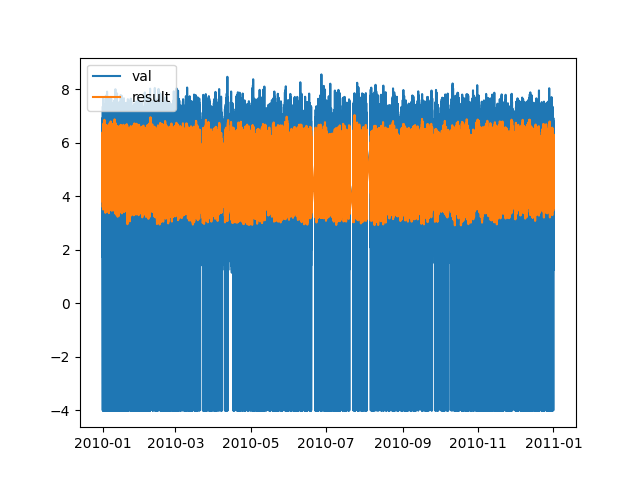

<IPython.core.display.Javascript object>


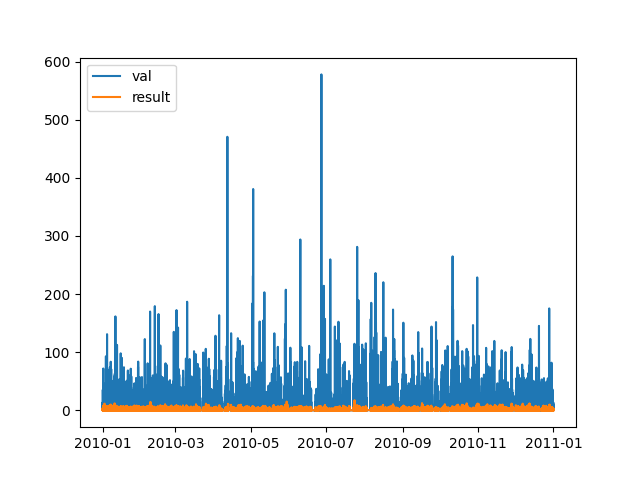

<IPython.core.display.Javascript object>


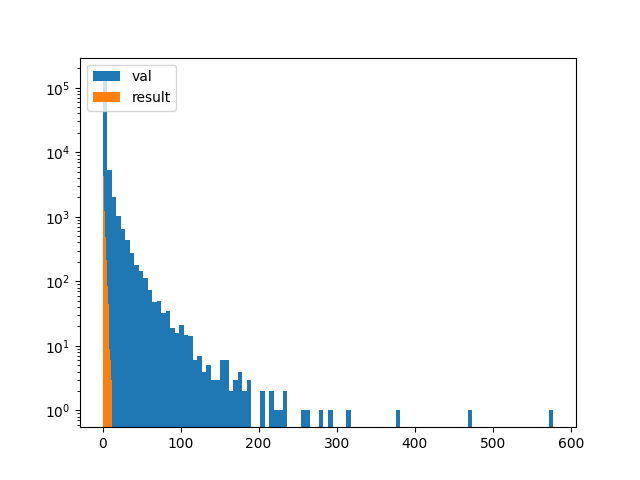

<IPython.core.display.Javascript object>


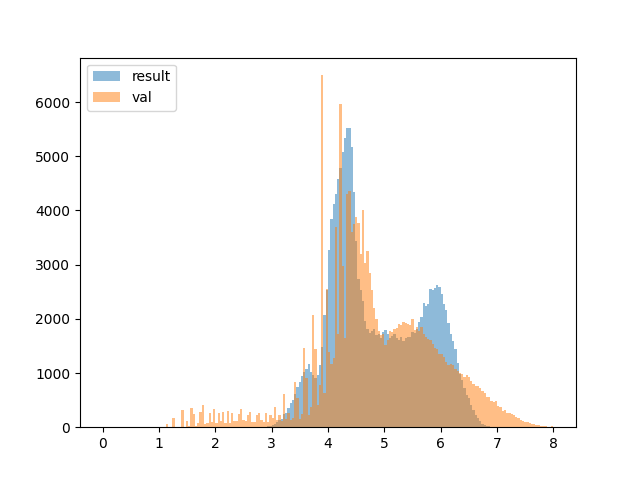

<IPython.core.display.Javascript object>


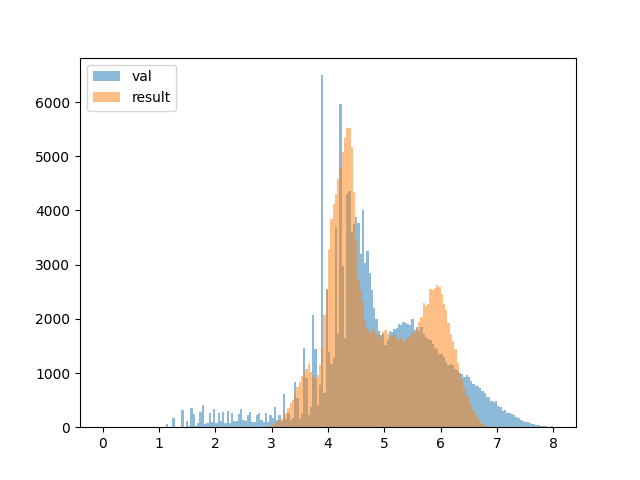

<IPython.core.display.Javascript object>


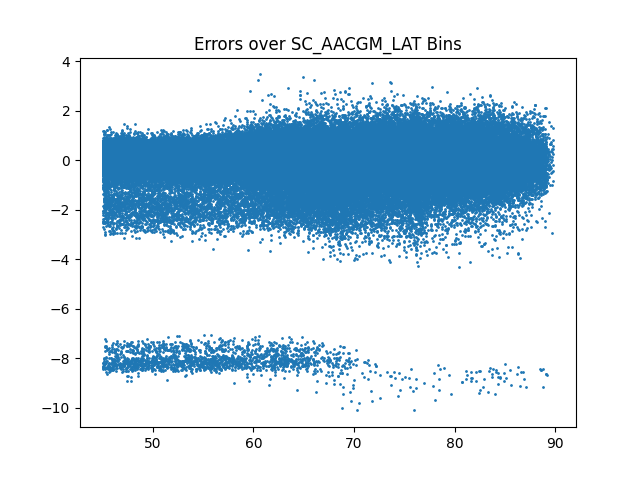

<IPython.core.display.Javascript object>


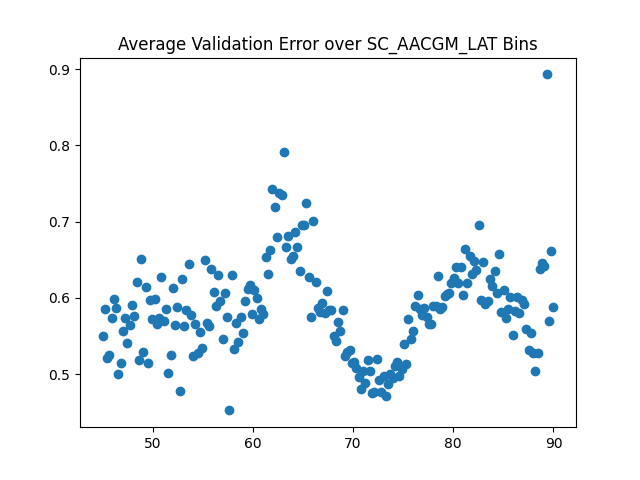

<IPython.core.display.Javascript object>


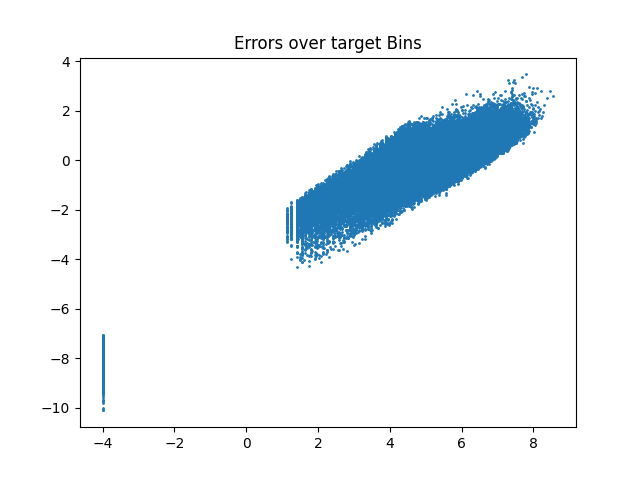

<IPython.core.display.Javascript object>


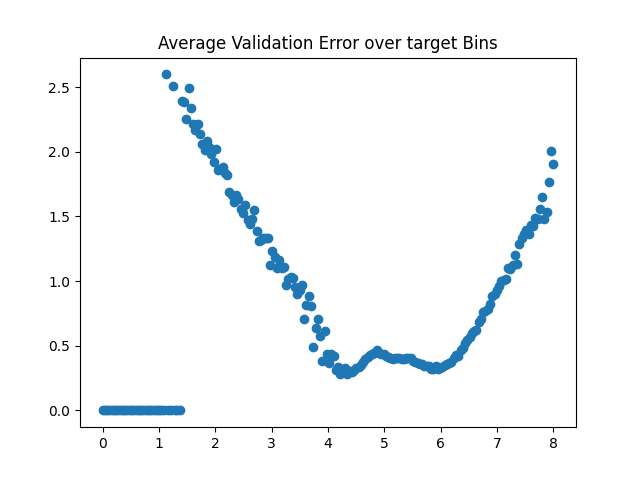

In [66]:
filename='model_3_counts'
# model.save(filename)
model = tensorflow.keras.models.load_model(filename)
# model.save_weights( filename+'.h5')


results = model.predict(X_test)

df_results = pd.DataFrame(data=results, index = df_val.index)

model_3 = df_results

plot_model(df_results)

Model: "functional_17"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_10 (InputLayer)        [(None, 148)]             0         
_________________________________________________________________
dense_81 (Dense)             (None, 256)               38144     
_________________________________________________________________
dropout_9 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_82 (Dense)             (None, 64)                16448     
_________________________________________________________________
dense_83 (Dense)             (None, 32)                2080      
_________________________________________________________________
dense_84 (Dense)             (None, 256)               8448      
_________________________________________________________________
dense_85 (Dense)             (None, 1024)            

Epoch 70/1000
187/187 - 5s - loss: 0.3293 - mse: 0.3293 - val_loss: 0.4915 - val_mse: 0.4915
Epoch 71/1000
187/187 - 5s - loss: 0.3287 - mse: 0.3287 - val_loss: 0.4931 - val_mse: 0.4931
Epoch 72/1000
187/187 - 5s - loss: 0.3288 - mse: 0.3288 - val_loss: 0.4939 - val_mse: 0.4939
Epoch 73/1000
187/187 - 5s - loss: 0.3281 - mse: 0.3281 - val_loss: 0.4877 - val_mse: 0.4877
Epoch 74/1000
187/187 - 5s - loss: 0.3279 - mse: 0.3279 - val_loss: 0.4904 - val_mse: 0.4904
Epoch 75/1000
187/187 - 5s - loss: 0.3279 - mse: 0.3279 - val_loss: 0.4937 - val_mse: 0.4937
Epoch 76/1000
187/187 - 5s - loss: 0.3272 - mse: 0.3272 - val_loss: 0.4869 - val_mse: 0.4869
Epoch 77/1000
187/187 - 5s - loss: 0.3271 - mse: 0.3271 - val_loss: 0.4878 - val_mse: 0.4878
Epoch 78/1000
187/187 - 5s - loss: 0.3271 - mse: 0.3271 - val_loss: 0.4969 - val_mse: 0.4969
Epoch 79/1000
187/187 - 5s - loss: 0.3265 - mse: 0.3265 - val_loss: 0.4875 - val_mse: 0.4875
Epoch 80/1000
187/187 - 5s - loss: 0.3263 - mse: 0.3263 - val_loss: 0.

Epoch 158/1000
187/187 - 5s - loss: 0.3164 - mse: 0.3164 - val_loss: 0.4950 - val_mse: 0.4950
Epoch 159/1000
187/187 - 5s - loss: 0.3163 - mse: 0.3163 - val_loss: 0.4989 - val_mse: 0.4989
Epoch 160/1000
187/187 - 5s - loss: 0.3167 - mse: 0.3167 - val_loss: 0.5007 - val_mse: 0.5007
Epoch 161/1000
187/187 - 5s - loss: 0.3161 - mse: 0.3161 - val_loss: 0.4997 - val_mse: 0.4997
Epoch 162/1000
187/187 - 5s - loss: 0.3161 - mse: 0.3161 - val_loss: 0.5015 - val_mse: 0.5015
Epoch 163/1000
187/187 - 5s - loss: 0.3161 - mse: 0.3161 - val_loss: 0.5064 - val_mse: 0.5064
Epoch 164/1000
187/187 - 5s - loss: 0.3161 - mse: 0.3161 - val_loss: 0.4938 - val_mse: 0.4938
Epoch 165/1000
187/187 - 5s - loss: 0.3159 - mse: 0.3159 - val_loss: 0.4928 - val_mse: 0.4928
Epoch 166/1000
187/187 - 5s - loss: 0.3159 - mse: 0.3159 - val_loss: 0.5049 - val_mse: 0.5049
Epoch 167/1000
187/187 - 5s - loss: 0.3157 - mse: 0.3157 - val_loss: 0.4970 - val_mse: 0.4970
Epoch 168/1000
187/187 - 5s - loss: 0.3157 - mse: 0.3157 - v

<IPython.core.display.Javascript object>


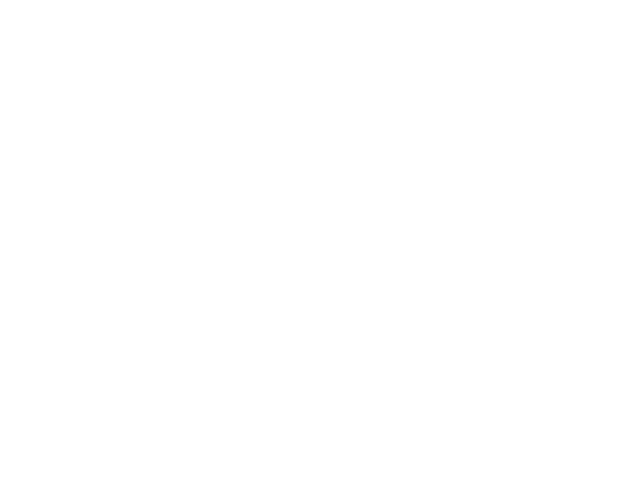

<IPython.core.display.Javascript object>


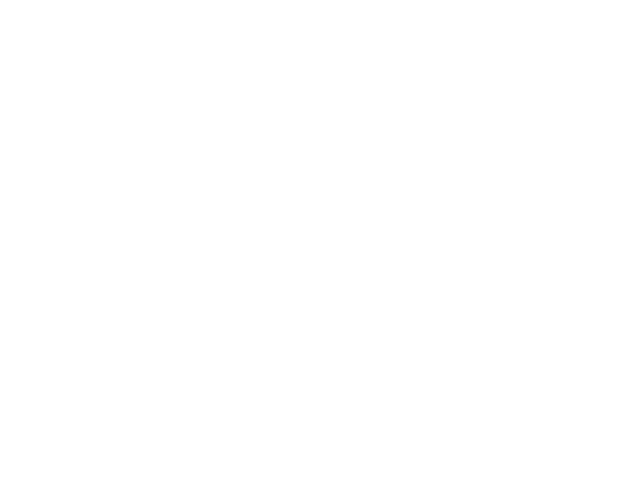

<IPython.core.display.Javascript object>


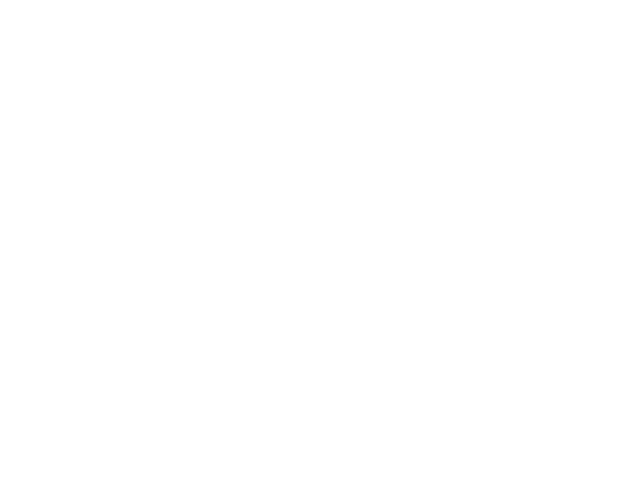

<IPython.core.display.Javascript object>


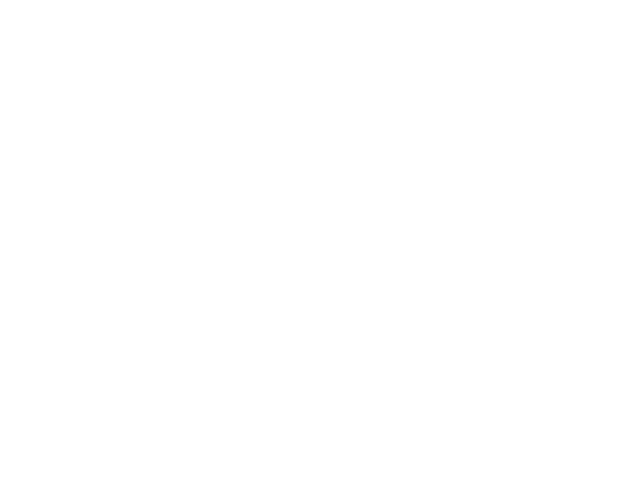

<IPython.core.display.Javascript object>


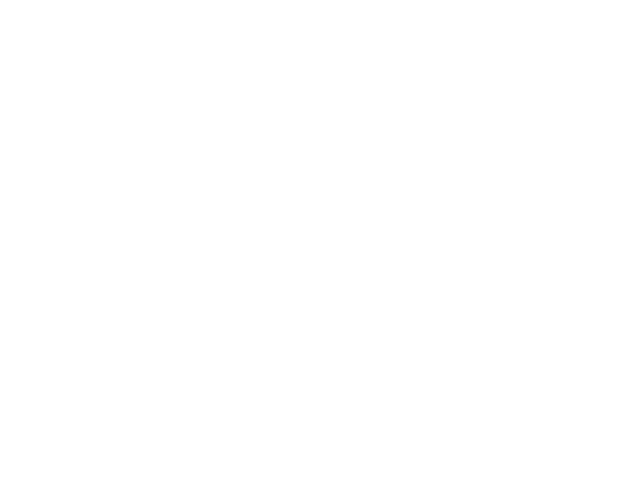

<IPython.core.display.Javascript object>


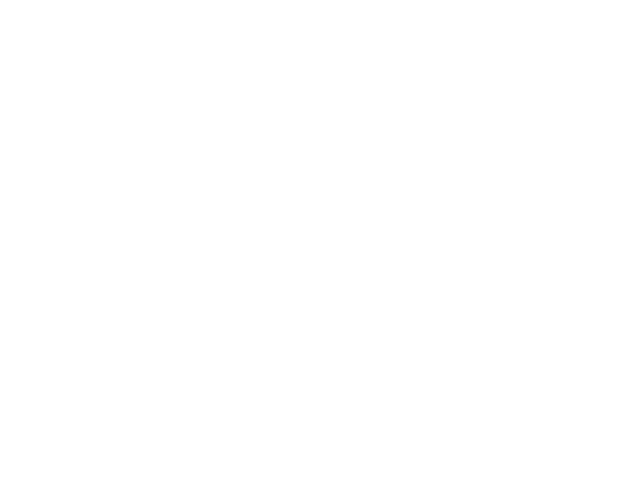

<IPython.core.display.Javascript object>


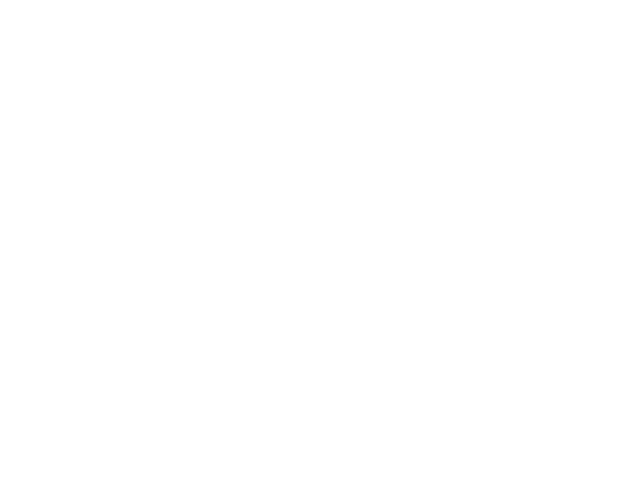

<IPython.core.display.Javascript object>


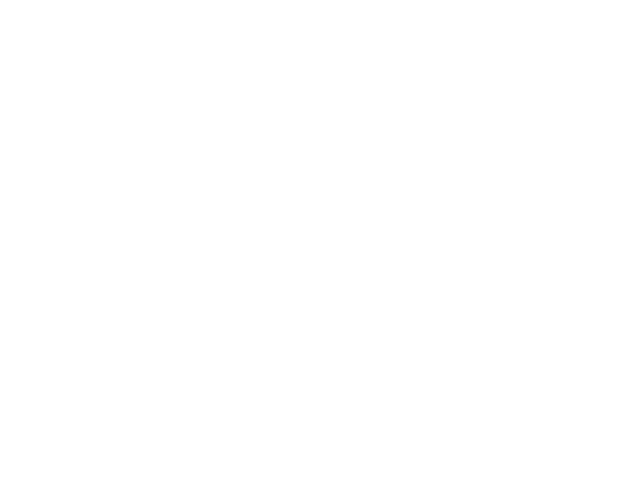

<IPython.core.display.Javascript object>


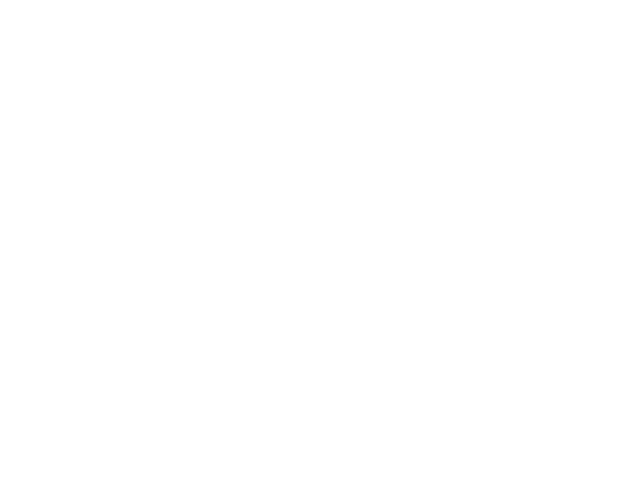

<IPython.core.display.Javascript object>


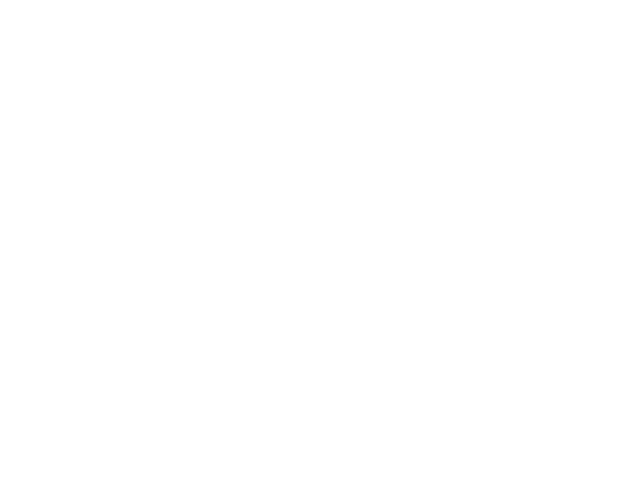

<IPython.core.display.Javascript object>


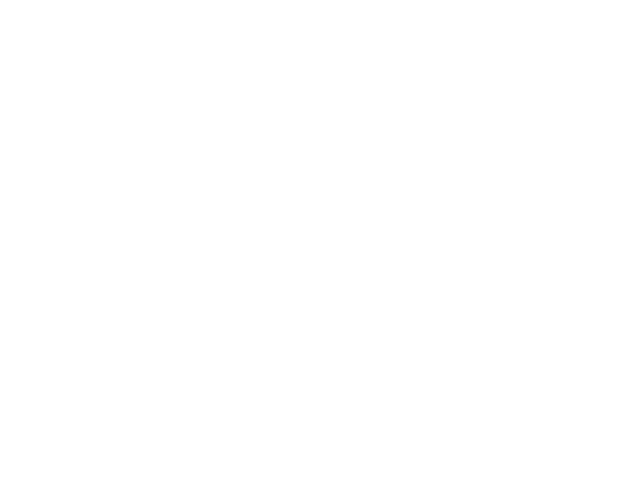

In [53]:
# # ### REPEATING THE TRAINING GETTING RID OF THE SMALL VALUES

# # LOAD THE COMBINED SOURTHERN HEMISPHERE AND NORTHERN HEMISPHERE AS CREATED ABOVE

# filescname = "./all_sc_df_1min_SH_NH_combined.pkl"
# pickle_file = open(filescname, "rb") 
# df_cumulative =pickle.load(pickle_file)
# cols_to_drop_validation = [c for c in df_cumulative.columns if ('SC_AACGM_LON' in c) | ('STD' in c) | ('Kp' in c )| ('Clock' in c) | ('AVG' in c) | ('SC_AACGM_LTIME'==c)]
# df_cumulative = df_cumulative.drop(columns=cols_to_drop_validation)
# df_cumulative=df_cumulative.dropna()

# #### GET RID OF THE REALLY SMALL VALUES
# df_cumulative = df_cumulative.drop( df_cumulative.index[(df_cumulative['ELE_TOTAL_COUNTS']) < 3])


# # Separate training and testing data
# mask_val = [(df_cumulative.index.year == 2010) & (df_cumulative['SC_ID'].values==16)]
# df_val = df_cumulative[mask_val[0]].copy(deep=True)
# df_train = df_cumulative.copy(deep=True).drop( df_cumulative.index[mask_val[0]])

# # Construct X and y
# feature_cols = [c for c in df_train.columns if not 'ELE' in c]
# #print( (feature_cols))
# #print(df_cumulative.columns)
# X_val = df_val[feature_cols].copy(deep=True)
# y_val = df_val['ELE_TOTAL_COUNTS'].copy(deep=True)
# X_train = df_train[feature_cols].copy(deep=True)
# y_train = df_train['ELE_TOTAL_COUNTS'].copy(deep=True)
# scaler_X = preprocessing.RobustScaler()
# scaler_X = scaler_X.fit(X_train.values)
# X_val_scaled = scaler_X.transform(X_val.values)
# X_train_scaled = scaler_X.transform(X_train.values)

# numFeatures = len(X_train.columns.to_list())
# feature_labels = X_train.columns.to_list()
# y_train_erg = y_train.copy(deep=True) * (1.60218e-12)
# y_val_erg = y_val.copy(deep=True) * (1.60218e-12)

# y_train[y_train == 0] = 0.0001
# y_val[y_val == 0] = 0.0001
# y_train_log = np.log10(y_train.copy(deep=True))
# y_val_log = np.log10(y_val.copy(deep=True))
# X = np.array(X_train_scaled, dtype=np.float32)
# X_test = np.array(X_val_scaled, dtype=np.float32)

# del df_train

# from tensorflow.keras.layers import Input
# num_in = 148

# input1 = Input(shape=(num_in))
# model1 = Dense(256,  activation='relu')(input1)
# model1 = model1 = Dropout(0.5)(model1)
# model1 = Dense(64, activation='relu')(model1)
# model1 = Dense(32, activation='relu')(model1)
# model1 = Dense(int(256),   activation='relu')(model1)
# model1 = Dense(int(1024),  activation='relu')(model1)
# model1 = Dense(int(256),  activation='relu')(model1)
# model1 = Dense(32, activation='relu')(model1)
# model1 = Dense(4, activation='relu')(model1)
# model1 = Dense(1, activation='linear' )(model1)


# output = model1
# model = tensorflow.keras.models.Model(inputs=input1, outputs=output)
# #compile model using accuracy to measure model performance
# model.compile(loss='mse', optimizer=tf.keras.optimizers.Adam(
#     learning_rate=0.001),metrics=['mse'])
# model.summary()

# history = model.fit(X[:,:num_in], 
#                    y_train_log, 
#                     validation_data=(
#                         X_test[:,:num_in], 
#                         y_val_log,                                    ),
#                     batch_size=8192*4,epochs=1000,verbose=2,
#                    callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_loss',  restore_best_weights=True,
#              patience=50)])#


# plt.figure()
# # summarize history for loss
# plt.plot(history.history['loss'][:])
# plt.plot(history.history['val_loss'][:])
# plt.title('model loss')
# plt.ylabel('loss')
# plt.xlabel('epoch')
# plt.legend(['train', 'test'], loc='upper left')
# plt.ylim([0,.9])
# plt.show()

# plt.figure()
# # summarize history for loss
# plt.plot(history.history['loss'][:])
# plt.plot(history.history['val_loss'][:])
# plt.title('model loss')
# plt.ylabel('loss')
# plt.xlabel('epoch')
# plt.legend(['train', 'test'], loc='upper left')
# plt.show()

# results = model.predict(X_test)

# df_results = pd.DataFrame(data=results, index = y_val_log.index)

# model_3 = df_results

# plot_model(df_results)

In [67]:
# filename='model_3_counts'
# model.save(filename)
# model = tensorflow.keras.models.load_model(filename)
# # model.save_weights( filename+'.h5')


# results = model.predict(X_test)

# df_results = pd.DataFrame(data=results, index = df_val.index)

# model_3 = df_results


INFO:tensorflow:Assets written to: model_3_counts/assets


In [94]:



import tensorflow as tf
from tensorflow import keras

import pandas as pd
import numpy as np
import os
import glob
import datetime

from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession

config = ConfigProto()
config.gpu_options.allow_growth = True
session = InteractiveSession(config=config)
import tensorflow

import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, Dropout
from sklearn import preprocessing

import tensorflow as tf

import numpy as np
import os
import pandas as pd
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()
import datetime
from os.path import isfile, join
from sys import getsizeof
import glob

from random import *

import matplotlib.pyplot as plt
#plt.ion()
%matplotlib notebook

#import mpld3
#mpld3.enable_notebook()
import numpy as np

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder


import pickle

# LOAD THE COMBINED SOURTHERN HEMISPHERE AND NORTHERN HEMISPHERE AS CREATED ABOVE

filescname = "./all_sc_df_1min_SH_NH_combined.pkl"
pickle_file = open(filescname, "rb") 
df_cumulative =pickle.load(pickle_file)

cols_to_drop_validation = [c for c in df_cumulative.columns if ('SC_AACGM_LON' in c) | ('STD' in c) | ('Kp' in c )| ('Clock' in c) | ('AVG' in c) | ('SC_AACGM_LTIME'==c)]
df_cumulative = df_cumulative.drop(columns=cols_to_drop_validation)
df_cumulative=df_cumulative.dropna()
#### GET RID OF THE REALLY SMALL VALUES
df_cumulative = df_cumulative.drop( df_cumulative.index[(df_cumulative['ELE_TOTAL_COUNTS']) < 3])

# Separate training and testing data
mask_val = [(df_cumulative.index.year == 2010) & (df_cumulative['SC_ID'].values==16)]
df_val = df_cumulative[mask_val[0]].copy(deep=True)
df_train = df_cumulative.copy(deep=True).drop( df_cumulative.index[mask_val[0]])


del df_cumulative


# Construct X and y
feature_cols = [c for c in df_train.columns if not 'ELE' in c]

X_val = df_val[feature_cols].copy(deep=True)
y_val = df_val[['ELE_TOTAL_ENERGY_FLUX','ELE_TOTAL_COUNTS']].copy(deep=True)
X_train = df_train[feature_cols].copy(deep=True)
y_train = df_train[['ELE_TOTAL_ENERGY_FLUX','ELE_TOTAL_COUNTS']].copy(deep=True)
scaler_X = preprocessing.RobustScaler()
scaler_X = scaler_X.fit(X_train.values)
X_val_scaled = scaler_X.transform(X_val.values)
X_train_scaled = scaler_X.transform(X_train.values)

numFeatures = len(X_train.columns.to_list())
feature_labels = X_train.columns.to_list()
y_train_erg = y_train.copy(deep=True) * (1.60218e-12)
y_val_erg = y_val.copy(deep=True) * (1.60218e-12)

y_train[y_train == 0] = 0.0001
y_val[y_val == 0] = 0.0001
y_train_log = np.log10(y_train.copy(deep=True))
y_val_log = np.log10(y_val.copy(deep=True))
X = np.array(X_train_scaled, dtype=np.float32)
X_test = np.array(X_val_scaled, dtype=np.float32)

del df_train

from tensorflow.keras.layers import Input
num_in = 148

# input1 = Input(shape=(num_in))
# model1 = Dense(256,  activation='relu')(input1)
# model1 = model1 = Dropout(0.5)(model1)
# model1 = Dense(64, activation='relu')(model1)
# model1 = Dense(32, activation='relu')(model1)
# model1 = Dense(int(256),   activation='relu')(model1)
# model1 = Dense(int(1024),  activation='relu')(model1)
# model1 = Dense(int(256),  activation='relu')(model1)
# model1 = Dense(32, activation='relu')(model1)
# model1 = Dense(4, activation='relu')(model1)
# model1 = Dense(2, activation='linear' )(model1)


# output = model1
# model = tensorflow.keras.models.Model(inputs=input1, outputs=output)
# #compile model using accuracy to measure model performance
# model.compile(loss='mse', optimizer=tf.keras.optimizers.Adam(
#     learning_rate=0.001),metrics=['mse'])
# model.summary()

# history = model.fit(X[:,:num_in], 
#                    y_train_log, 
#                     validation_data=(
#                         X_test[:,:num_in], 
#                         y_val_log,                                    ),
#                     batch_size=8192*4,epochs=1000,verbose=2,
#                    callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_loss',  restore_best_weights=True,
#              patience=50)])#


# plt.figure()
# # summarize history for loss
# plt.plot(history.history['loss'][:])
# plt.plot(history.history['val_loss'][:])
# plt.title('model loss')
# plt.ylabel('loss')
# plt.xlabel('epoch')
# plt.legend(['train', 'test'], loc='upper left')
# plt.ylim([0,.9])
# plt.show()

# plt.figure()
# # summarize history for loss
# plt.plot(history.history['loss'][:])
# plt.plot(history.history['val_loss'][:])
# plt.title('model loss')
# plt.ylabel('loss')
# plt.xlabel('epoch')
# plt.legend(['train', 'test'], loc='upper left')
# plt.show()

# results = model.predict(X_test)

# df_results = pd.DataFrame(data=results, index = y_val_log.index)

# model_3 = df_results



/usr/local/lib/python3.6/dist-packages/tensorflow/python/client/session.py:1751: UserWarning: An interactive session is already active. This can cause out-of-memory errors in some cases. You must explicitly call `InteractiveSession.close()` to release resources held by the other session(s).
  warnings.warn('An interactive session is already active. This can '


(169065, 2)


<IPython.core.display.Javascript object>


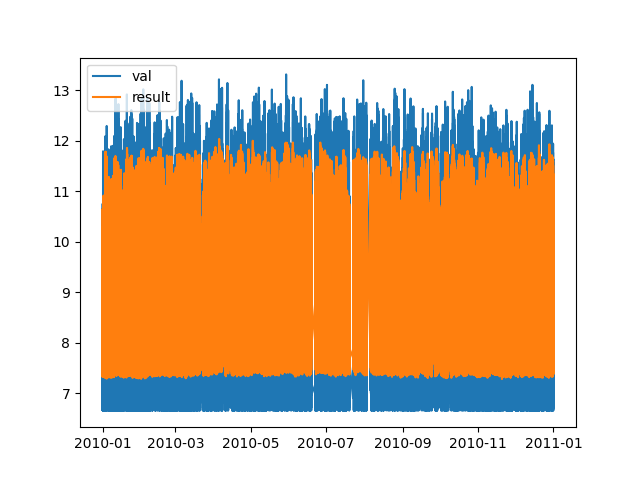

<IPython.core.display.Javascript object>


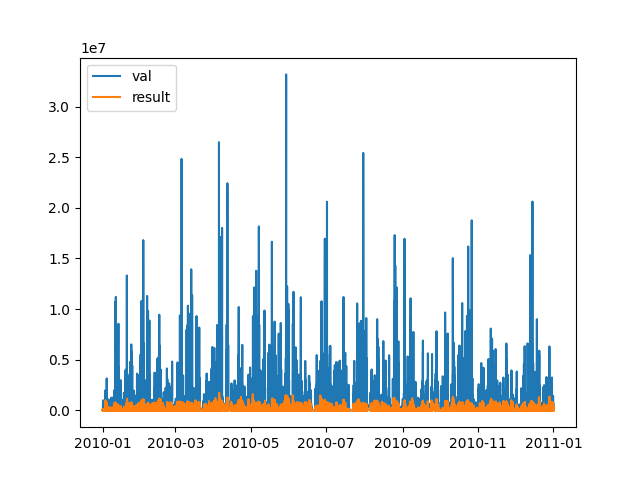

<IPython.core.display.Javascript object>


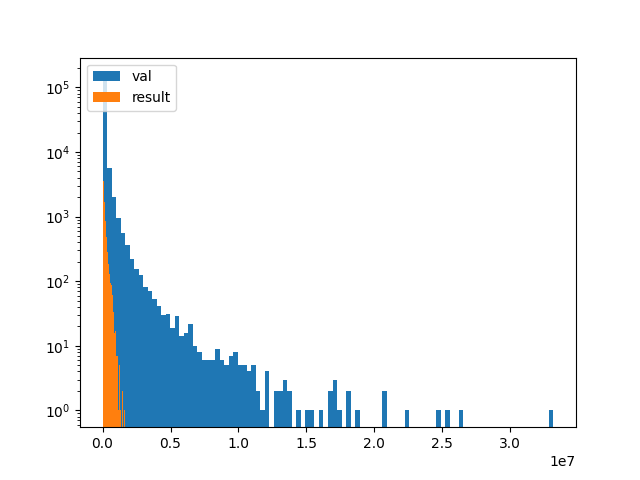

<IPython.core.display.Javascript object>


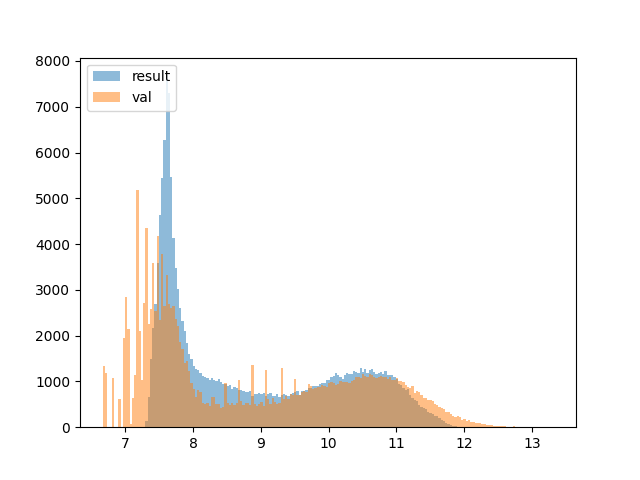

<IPython.core.display.Javascript object>


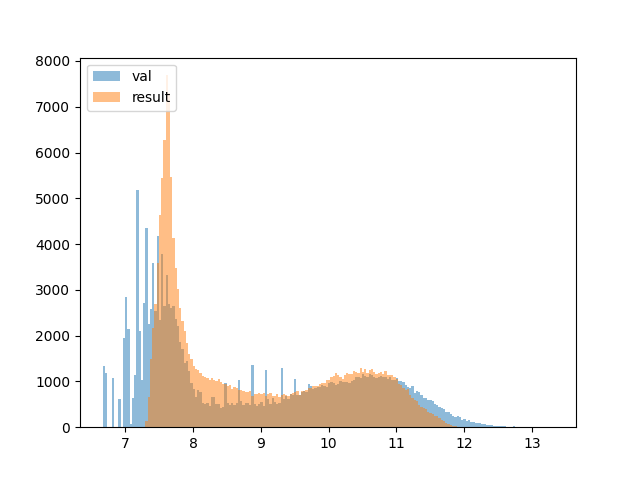

<IPython.core.display.Javascript object>


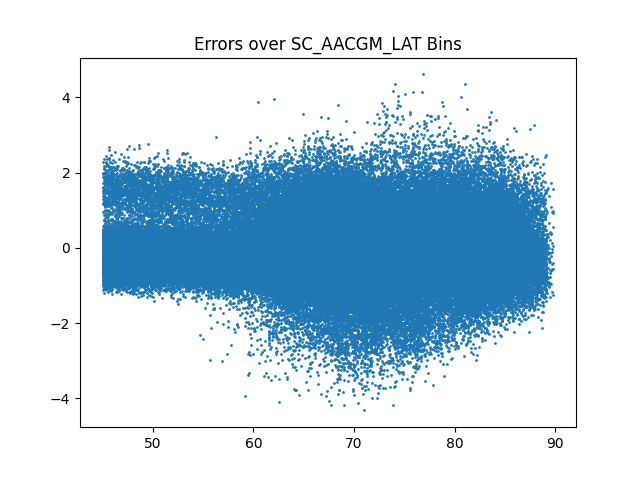

<IPython.core.display.Javascript object>


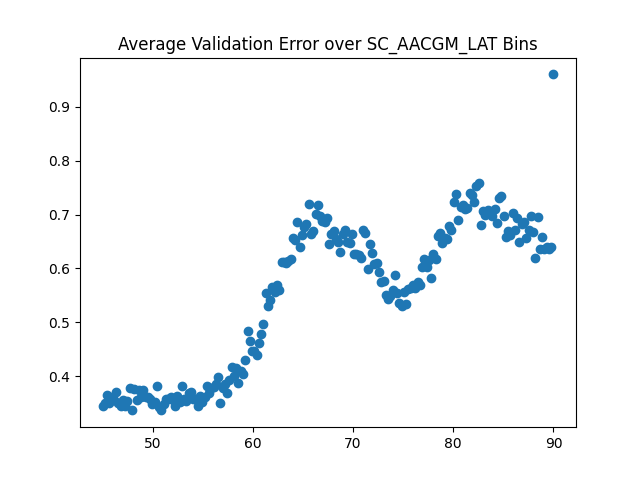

<IPython.core.display.Javascript object>


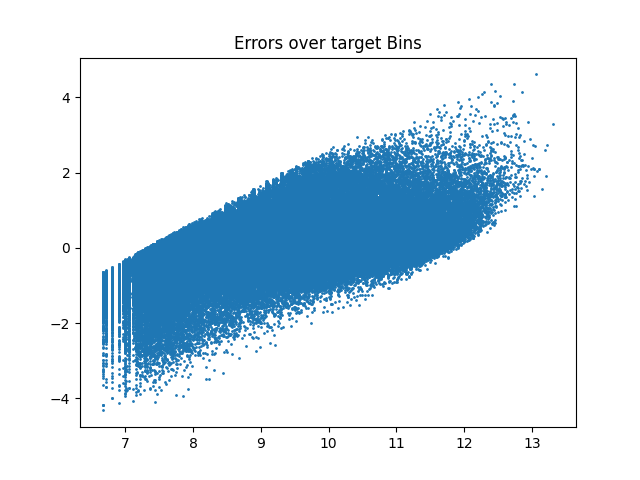

<IPython.core.display.Javascript object>


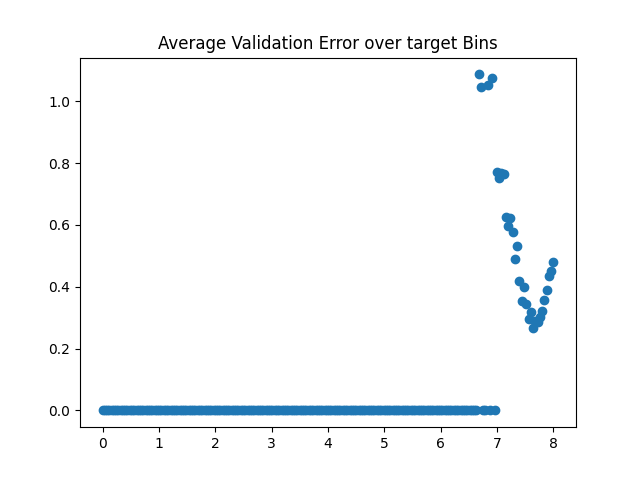

<IPython.core.display.Javascript object>


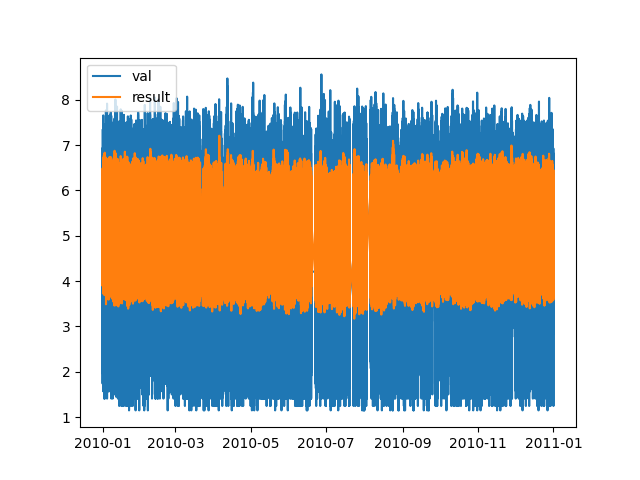

<IPython.core.display.Javascript object>


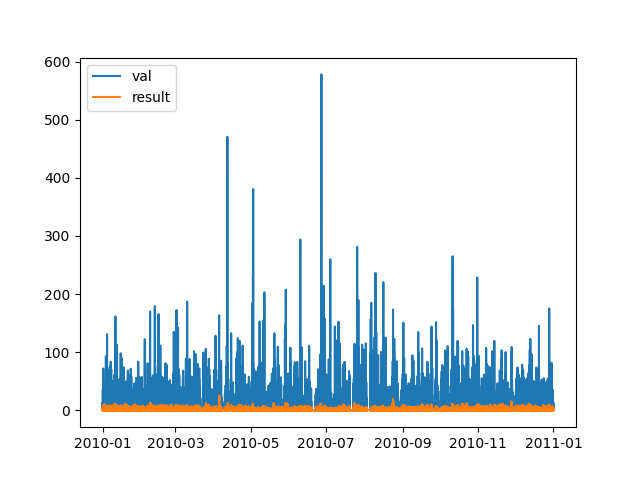

<IPython.core.display.Javascript object>


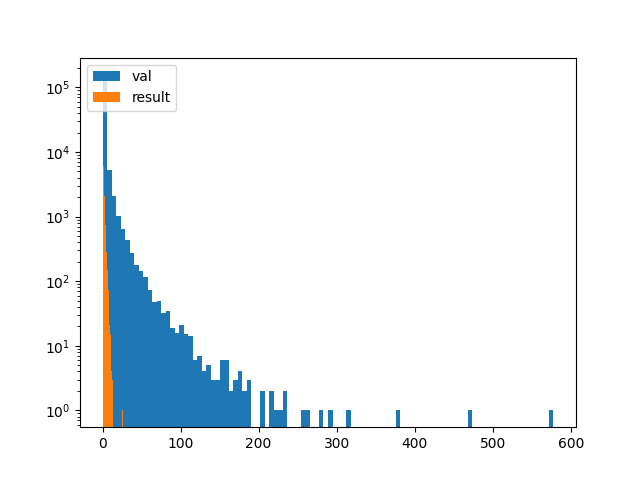

<IPython.core.display.Javascript object>


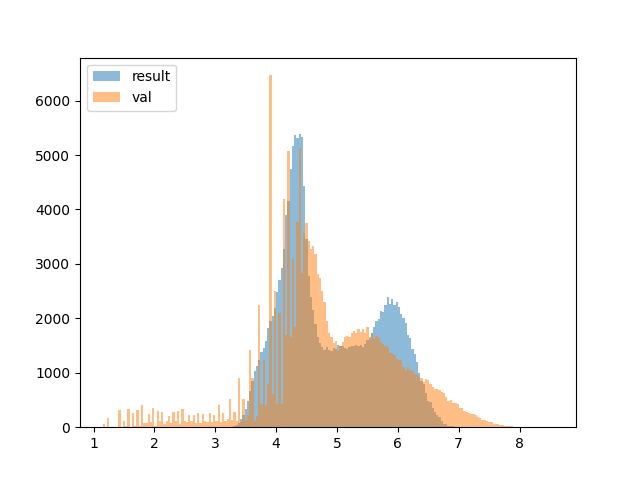

<IPython.core.display.Javascript object>


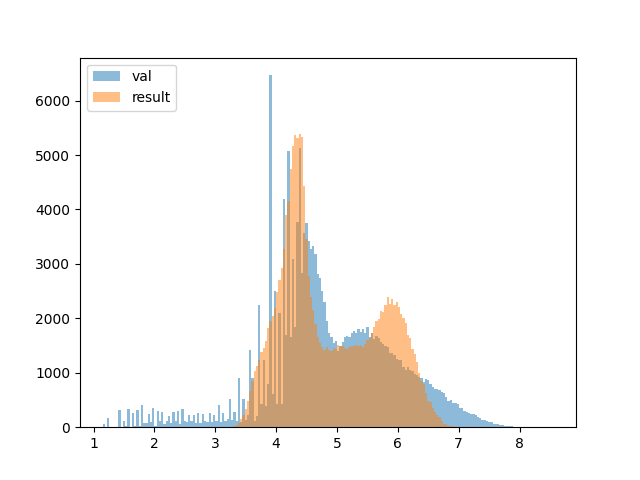

<IPython.core.display.Javascript object>


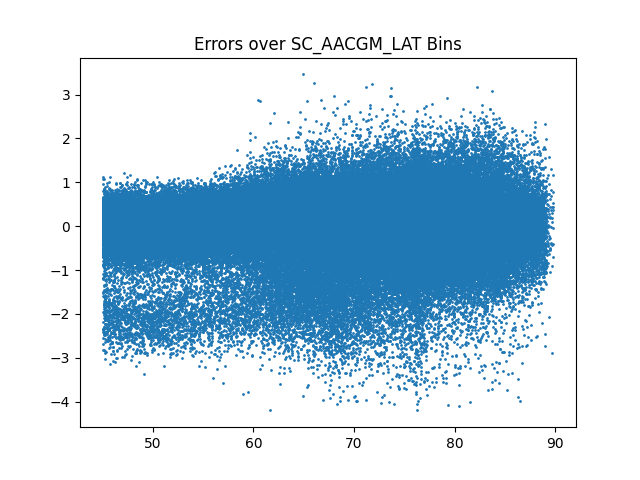

<IPython.core.display.Javascript object>


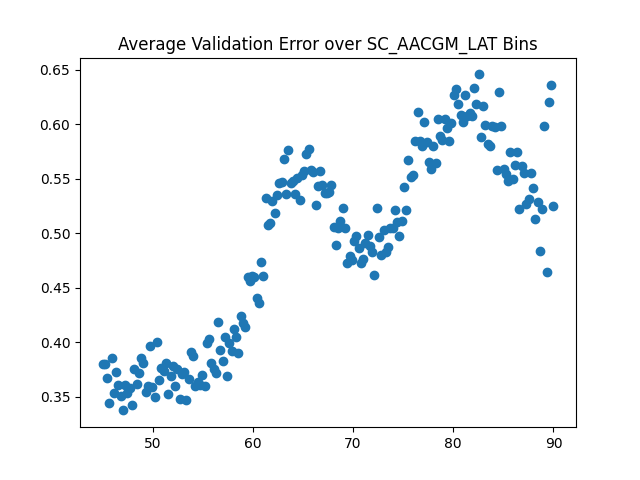

<IPython.core.display.Javascript object>


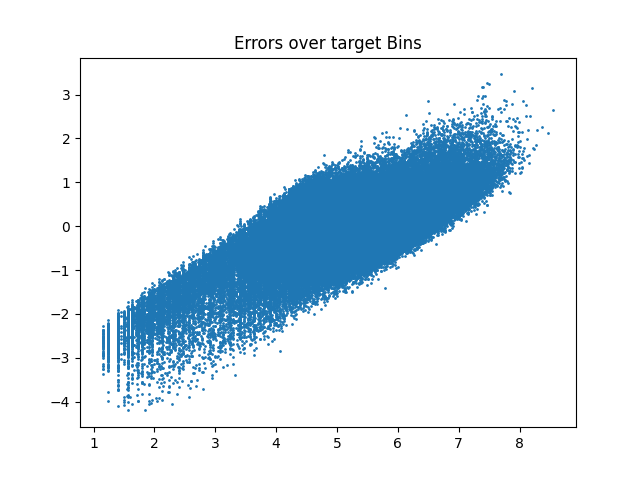

<IPython.core.display.Javascript object>


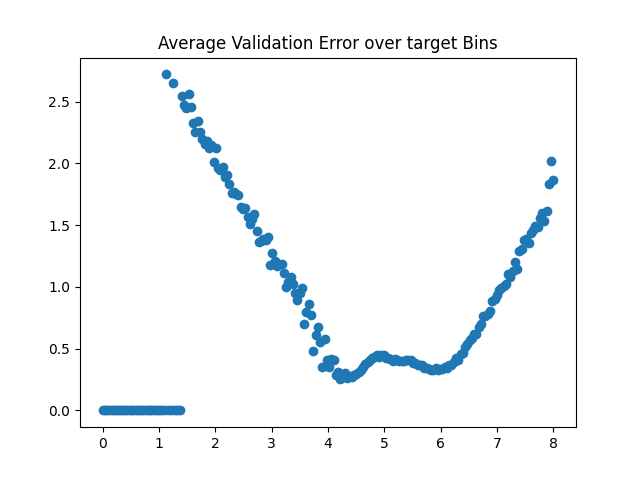

In [97]:
filename='model_3_counts_and_flux'
#model.save(filename)
model = tensorflow.keras.models.load_model(filename)

results = model.predict(X_test)
df_results = pd.DataFrame(data=results, index = df_val.index, columns=['flux','counts'])

model_3 = df_results
print(df_results.shape)
temp=y_val_log
y_val_log = temp['ELE_TOTAL_ENERGY_FLUX'] #['ELE_TOTAL_ENERGY_FLUX','ELE_TOTAL_COUNTS']
plot_model(df_results['flux'])
y_val_log = temp['ELE_TOTAL_COUNTS']
plot_model(df_results['counts'])
y_val_log=temp

In [104]:
print(np.average((y_val_log['ELE_TOTAL_ENERGY_FLUX']-df_results['flux'])**2))
print(np.average((y_val_log['ELE_TOTAL_COUNTS']-df_results['counts'])**2))

print('scaled MSE FLux',  np.average(((y_val_log['ELE_TOTAL_ENERGY_FLUX']-df_results['flux'])  /np.average(y_val_log['ELE_TOTAL_ENERGY_FLUX']))**2))
print('scaled MSE Counts',np.average(((y_val_log['ELE_TOTAL_COUNTS']     -df_results['counts'])/np.average(y_val_log['ELE_TOTAL_COUNTS']))**2))

0.5875648023543083
0.48391115909120486
scaled MSE FLux 0.007482217177043143
scaled MSE Counts 0.020519987229059566


In [105]:
# Training with the reduced set for just the counts

# ['SC_AACGM_LAT', 'ELE_TOTAL_ENERGY_FLUX', 'ID_SC', 'sin_ut', 'cos_ut', 'sin_doy', 'cos_doy', 'sin_SC_AACGM_LTIME', 'cos_SC_AACGM_LTIME', 'F107', 'AL', 'AU', 'SymH', 'PC', 'AL_6hr', 'AU_6hr', 'SymH_6hr', 'PC_6hr', 'AL_3hr', 'AU_3hr', 'SymH_3hr', 'PC_3hr', 'AL_1hr', 'AU_1hr', 'SymH_1hr', 'PC_1hr', 'AL_45min', 'AU_45min', 'SymH_45min', 'PC_45min', 'AL_30min', 'AU_30min', 'SymH_30min', 'PC_30min', 'AL_10min', 'AU_10min', 'SymH_10min', 'PC_10min']

# LOAD THE COMBINED SOURTHERN HEMISPHERE AND NORTHERN HEMISPHERE AS CREATED ABOVE

filescname = "./all_sc_df_1min_SH_NH_combined.pkl"
pickle_file = open(filescname, "rb") 
df_cumulative =pickle.load(pickle_file)

cols_to_drop_validation = [c for c in df_cumulative.columns if ('SC_AACGM_LON' in c) | ('STD' in c) | ('Kp' in c )| ('Clock' in c) | ('AVG' in c) | ('SC_AACGM_LTIME'==c)]
df_cumulative = df_cumulative.drop(columns=cols_to_drop_validation)
df_cumulative=df_cumulative.dropna()
#### GET RID OF THE REALLY SMALL VALUES
df_cumulative = df_cumulative.drop( df_cumulative.index[(df_cumulative['ELE_TOTAL_COUNTS']) < 3])


In [106]:
#38 Features

df_cumulative=df_cumulative[['SC_AACGM_LAT', 'ELE_TOTAL_COUNTS', 'SC_ID', 'sin_ut', 'cos_ut', 'sin_doy', 'cos_doy', 'sin_SC_AACGM_LTIME', 'cos_SC_AACGM_LTIME', 
                             'F107', 'AL', 'AU', 'SymH', 
                             'AL_6hr', 'AU_6hr', 'SymH_6hr', 'AL_3hr', 'AU_3hr', 'SymH_3hr',  'AL_1hr', 'AU_1hr', 'SymH_1hr',
                              'AL_45min', 'AU_45min', 'SymH_45min', 'AL_30min', 'AU_30min', 'SymH_30min', 
                             'AL_10min', 'AU_10min', 'SymH_10min', ]]

# Separate training and testing data
mask_val = [(df_cumulative.index.year == 2010) & (df_cumulative['SC_ID'].values==16)]
df_val = df_cumulative[mask_val[0]].copy(deep=True)
df_train = df_cumulative.copy(deep=True).drop( df_cumulative.index[mask_val[0]])

del df_cumulative



# Construct X and y
feature_cols = [c for c in df_train.columns if not 'ELE' in c]
#print( (feature_cols))
#print(df_cumulative.columns)
X_val = df_val[feature_cols].copy(deep=True)
y_val = df_val['ELE_TOTAL_COUNTS'].copy(deep=True)
X_train = df_train[feature_cols].copy(deep=True)
y_train = df_train['ELE_TOTAL_COUNTS'].copy(deep=True)
scaler_X = preprocessing.RobustScaler()
scaler_X = scaler_X.fit(X_train.values)
X_val_scaled = scaler_X.transform(X_val.values)
X_train_scaled = scaler_X.transform(X_train.values)

numFeatures = len(X_train.columns.to_list())
feature_labels = X_train.columns.to_list()
y_train_erg = y_train.copy(deep=True) * (1.60218e-12)
y_val_erg = y_val.copy(deep=True) * (1.60218e-12)

y_train[y_train == 0] = 0.0001
y_val[y_val == 0] = 0.0001
y_train_log = np.log10(y_train.copy(deep=True))
y_val_log = np.log10(y_val.copy(deep=True))
X = np.array(X_train_scaled, dtype=np.float32)
X_test = np.array(X_val_scaled, dtype=np.float32)

del df_train

Model: "functional_21"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_12 (InputLayer)        [(None, 30)]              0         
_________________________________________________________________
dense_99 (Dense)             (None, 256)               7936      
_________________________________________________________________
dropout_11 (Dropout)         (None, 256)               0         
_________________________________________________________________
dense_100 (Dense)            (None, 64)                16448     
_________________________________________________________________
dense_101 (Dense)            (None, 32)                2080      
_________________________________________________________________
dense_102 (Dense)            (None, 256)               8448      
_________________________________________________________________
dense_103 (Dense)            (None, 1024)            

Epoch 70/1000
187/187 - 4s - loss: 0.3579 - mse: 0.3579 - val_loss: 0.5458 - val_mse: 0.5458
Epoch 71/1000
187/187 - 4s - loss: 0.3583 - mse: 0.3583 - val_loss: 0.5503 - val_mse: 0.5503
Epoch 72/1000
187/187 - 4s - loss: 0.3581 - mse: 0.3581 - val_loss: 0.5485 - val_mse: 0.5485
Epoch 73/1000
187/187 - 4s - loss: 0.3575 - mse: 0.3575 - val_loss: 0.5506 - val_mse: 0.5506
Epoch 74/1000
187/187 - 4s - loss: 0.3571 - mse: 0.3571 - val_loss: 0.5446 - val_mse: 0.5446
Epoch 75/1000
187/187 - 4s - loss: 0.3571 - mse: 0.3571 - val_loss: 0.5506 - val_mse: 0.5506
Epoch 76/1000
187/187 - 4s - loss: 0.3574 - mse: 0.3574 - val_loss: 0.5540 - val_mse: 0.5540
Epoch 77/1000
187/187 - 4s - loss: 0.3566 - mse: 0.3566 - val_loss: 0.5466 - val_mse: 0.5466
Epoch 78/1000
187/187 - 4s - loss: 0.3568 - mse: 0.3568 - val_loss: 0.5522 - val_mse: 0.5522
Epoch 79/1000
187/187 - 4s - loss: 0.3564 - mse: 0.3564 - val_loss: 0.5479 - val_mse: 0.5479
Epoch 80/1000
187/187 - 4s - loss: 0.3565 - mse: 0.3565 - val_loss: 0.

<IPython.core.display.Javascript object>


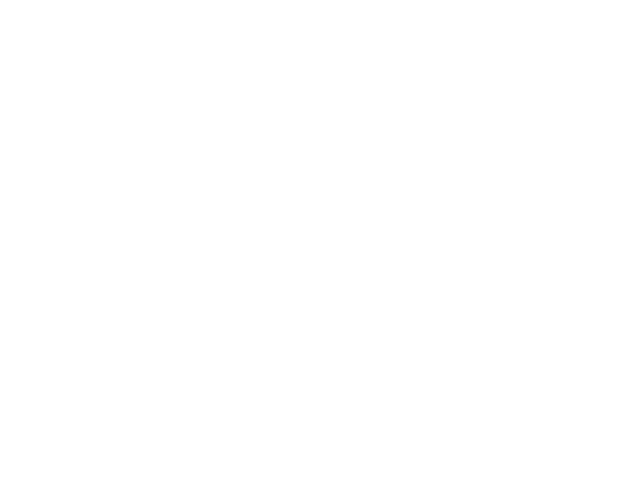

<IPython.core.display.Javascript object>


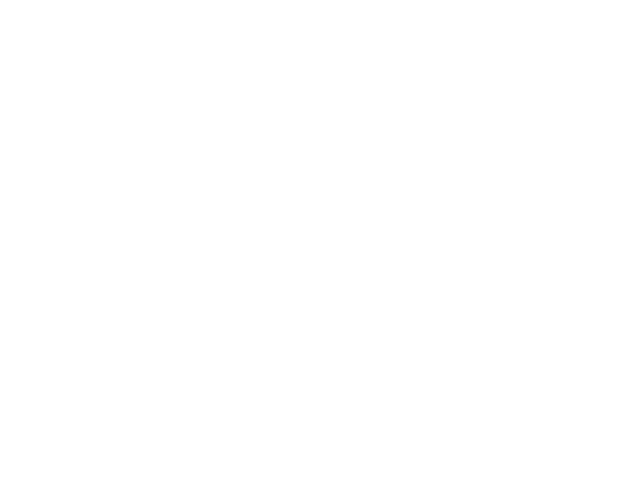

<IPython.core.display.Javascript object>


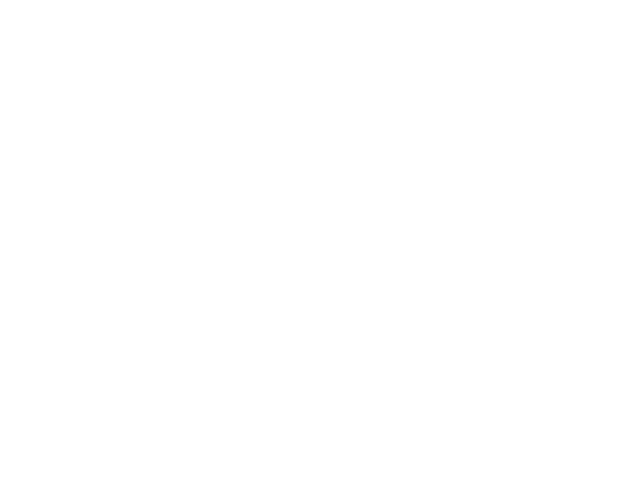

<IPython.core.display.Javascript object>


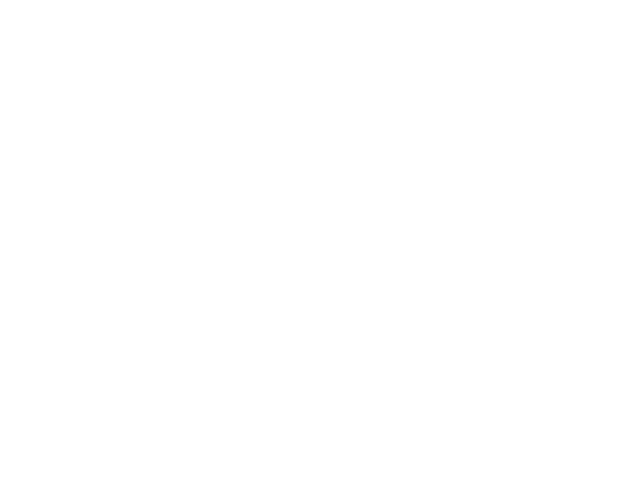

<IPython.core.display.Javascript object>


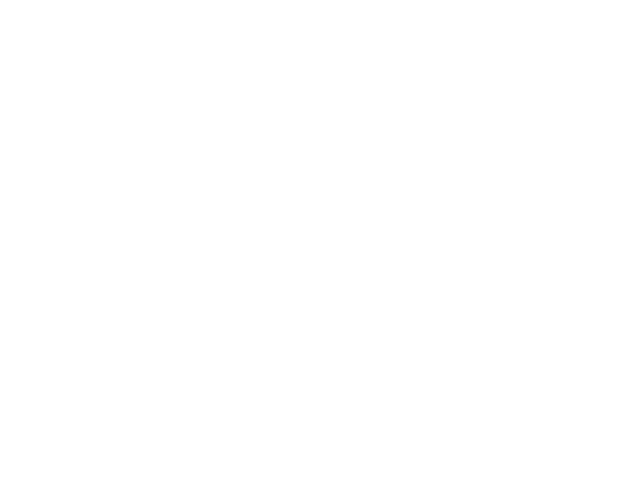

<IPython.core.display.Javascript object>


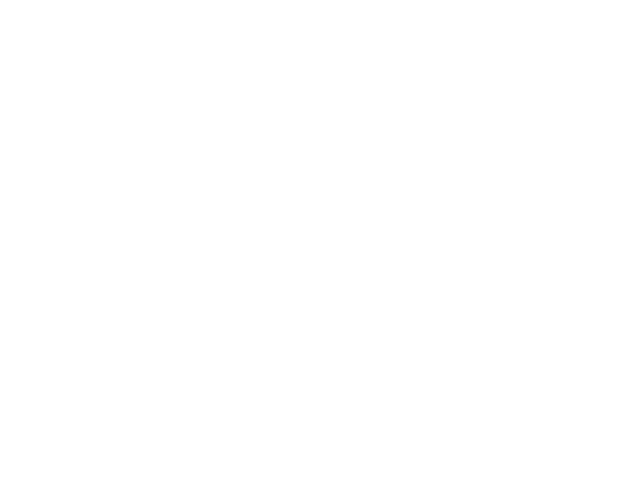

<IPython.core.display.Javascript object>


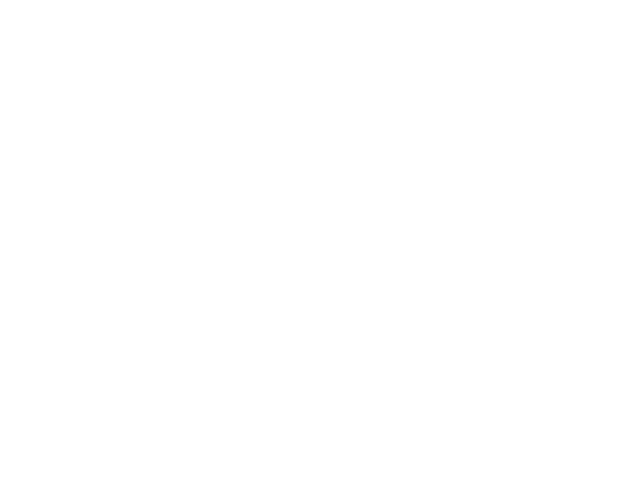

<IPython.core.display.Javascript object>


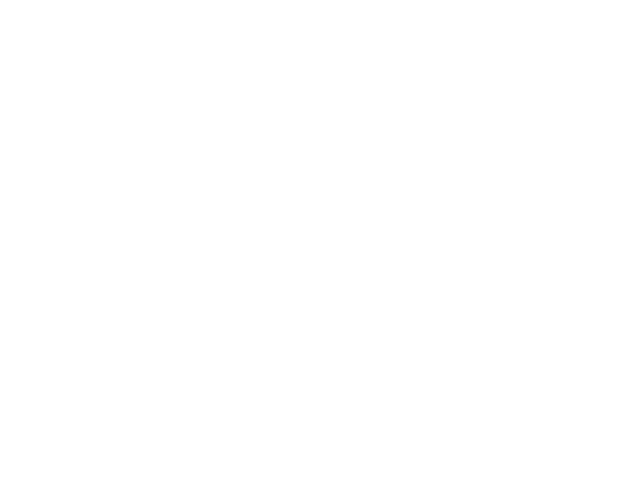

<IPython.core.display.Javascript object>


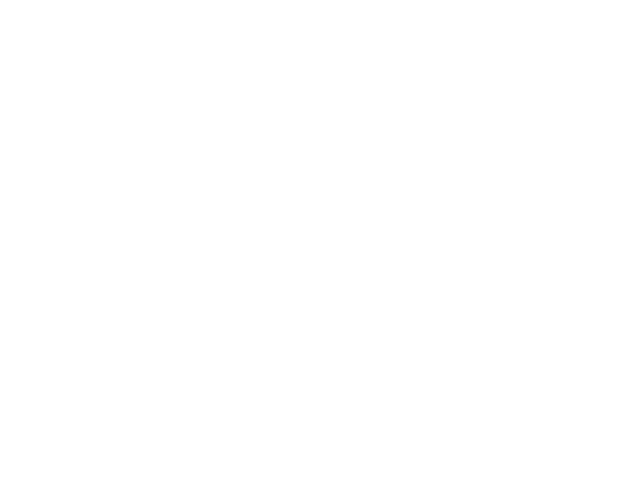

<IPython.core.display.Javascript object>


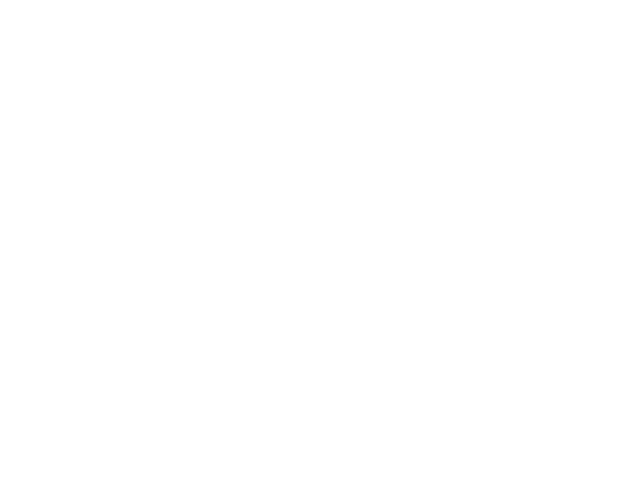

<IPython.core.display.Javascript object>


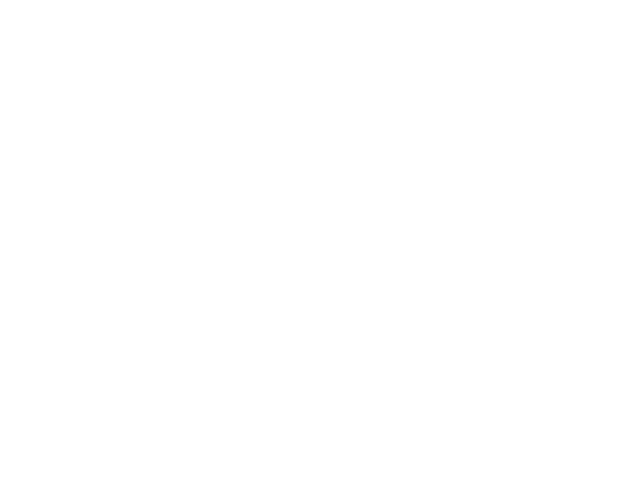

In [60]:
# from tensorflow.keras.layers import Input
# num_in = 30

# input1 = Input(shape=(num_in))
# model1 = Dense(256,  activation='relu')(input1)
# model1 = model1 = Dropout(0.5)(model1)
# model1 = Dense(64, activation='relu')(model1)
# model1 = Dense(32, activation='relu')(model1)
# model1 = Dense(int(256),   activation='relu')(model1)
# model1 = Dense(int(1024),  activation='relu')(model1)
# model1 = Dense(int(256),  activation='relu')(model1)
# model1 = Dense(32, activation='relu')(model1)
# model1 = Dense(4, activation='relu')(model1)
# model1 = Dense(1, activation='linear' )(model1)


# output = model1
# model = tensorflow.keras.models.Model(inputs=input1, outputs=output)
# #compile model using accuracy to measure model performance
# model.compile(loss='mse', optimizer=tf.keras.optimizers.Adam(
#     learning_rate=0.001),metrics=['mse'])
# model.summary()

# history = model.fit(X[:,:num_in], 
#                    y_train_log, 
#                     validation_data=(
#                         X_test[:,:num_in], 
#                         y_val_log,                                    ),
#                     batch_size=8192*4,epochs=1000,verbose=2,
#                    callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_loss',  restore_best_weights=True,
#              patience=50)])#


# plt.figure()
# # summarize history for loss
# plt.plot(history.history['loss'][:])
# plt.plot(history.history['val_loss'][:])
# plt.title('model loss')
# plt.ylabel('loss')
# plt.xlabel('epoch')
# plt.legend(['train', 'test'], loc='upper left')
# plt.ylim([0,.9])
# plt.show()

# plt.figure()
# # summarize history for loss
# plt.plot(history.history['loss'][:])
# plt.plot(history.history['val_loss'][:])
# plt.title('model loss')
# plt.ylabel('loss')
# plt.xlabel('epoch')
# plt.legend(['train', 'test'], loc='upper left')
# plt.show()

# results = model.predict(X_test)

# df_results = pd.DataFrame(data=results, index = y_val_log.index)

# model_3 = df_results

# plot_model(df_results)

<IPython.core.display.Javascript object>


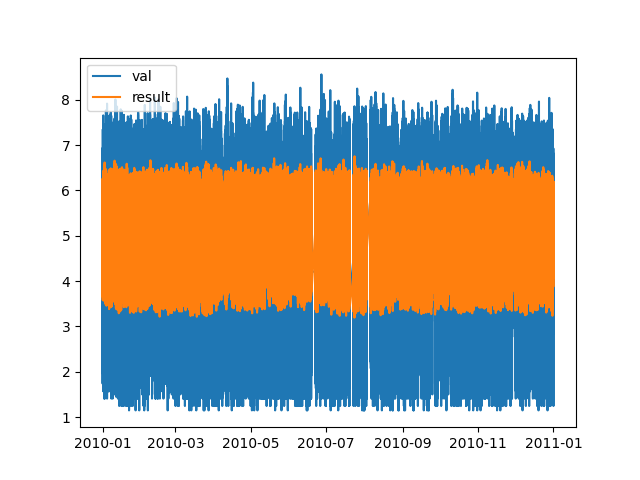

<IPython.core.display.Javascript object>


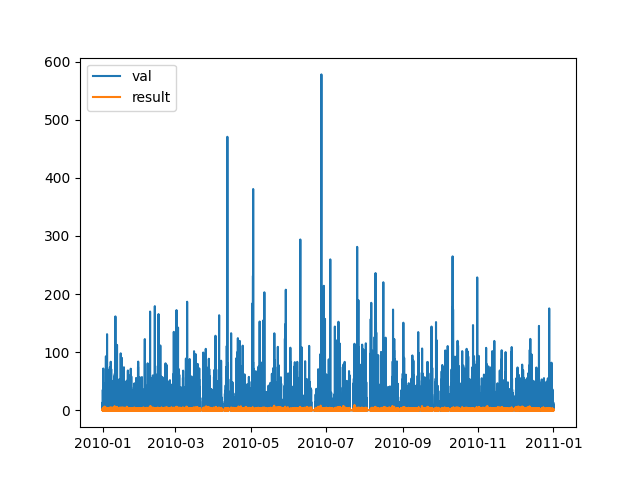

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  app.launch_new_instance()


<IPython.core.display.Javascript object>


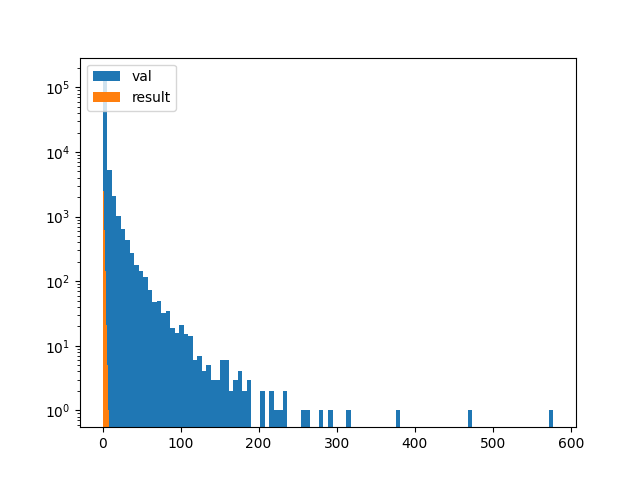

<IPython.core.display.Javascript object>


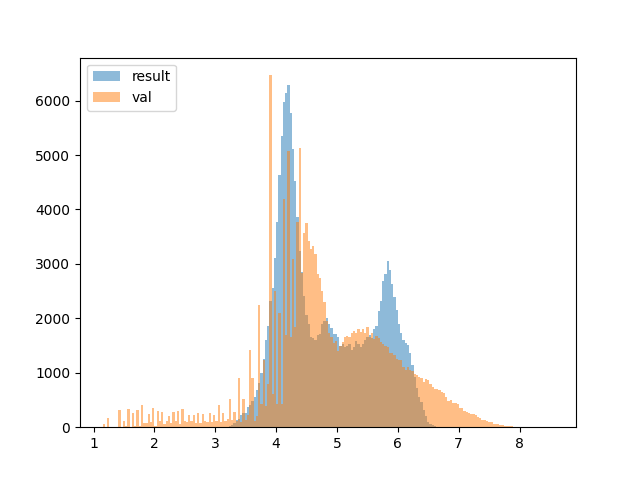

<IPython.core.display.Javascript object>


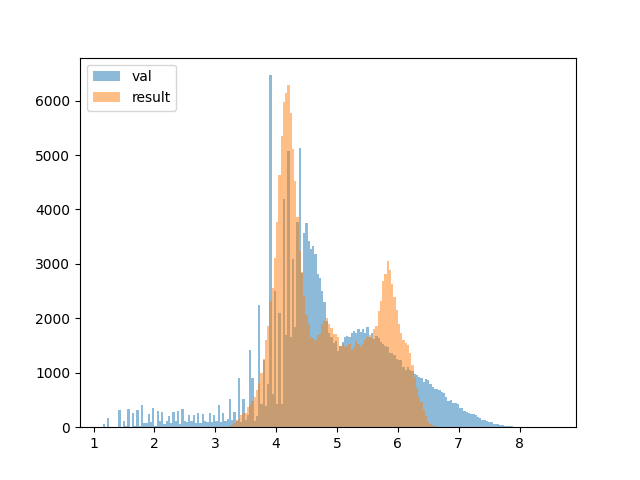

<IPython.core.display.Javascript object>


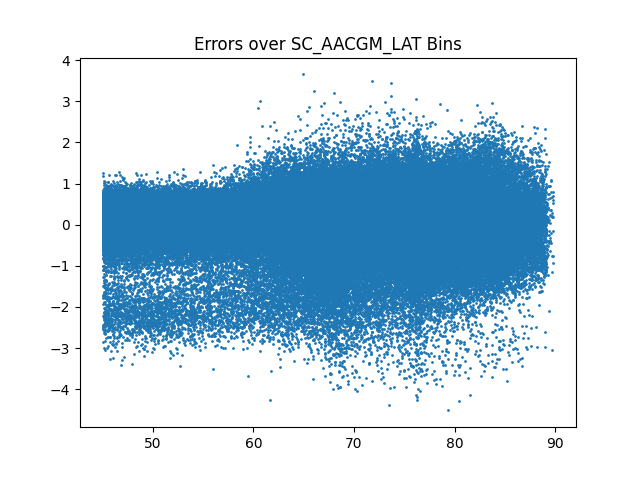

<IPython.core.display.Javascript object>


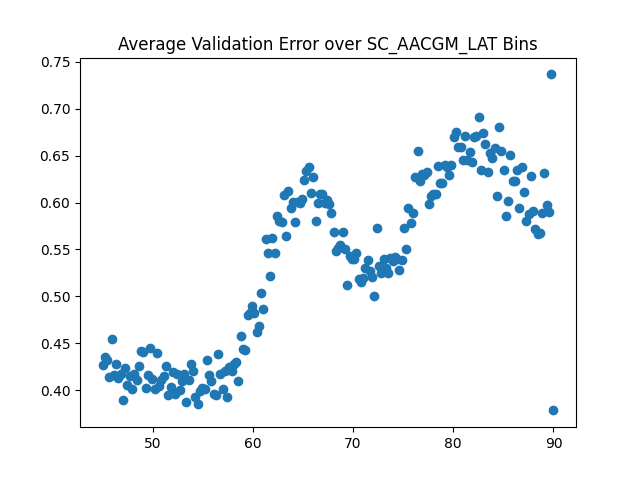

<IPython.core.display.Javascript object>


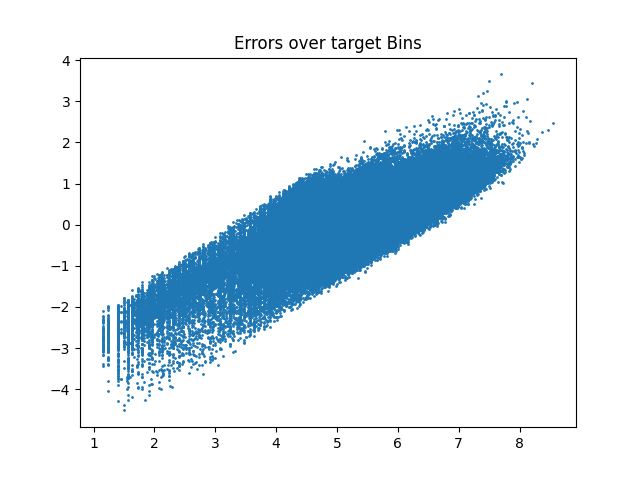

<IPython.core.display.Javascript object>


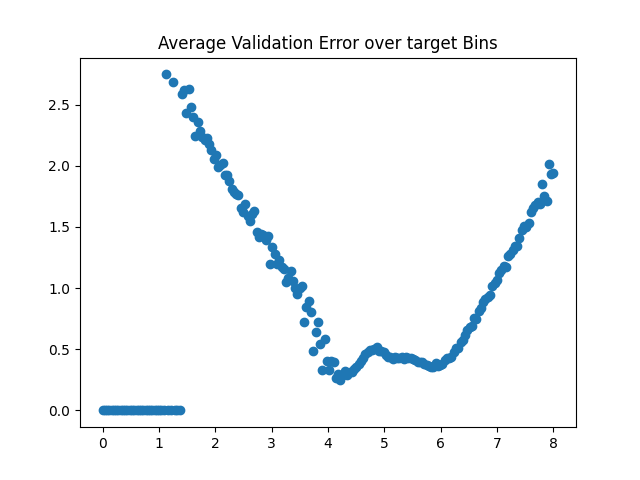

In [110]:
filename='model_3_counts_HB'
#model.save(filename)
model = tensorflow.keras.models.load_model(filename)
# model.save_weights( filename+'.h5')


results = model.predict(X_test)

df_results = pd.DataFrame(data=results, index = df_val.index)

model_3 = df_results

plot_model(df_results)

In [62]:
import tensorflow as tf
from tensorflow import keras

import pandas as pd
import numpy as np
import os
import glob
import datetime

from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession

config = ConfigProto()
config.gpu_options.allow_growth = True
session = InteractiveSession(config=config)
import tensorflow

# from tensorflow.compat.v1.keras.backend import get_session
# tensorflow.compat.v1.disable_v2_behavior()
# import shap

import numpy as np
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, Flatten, Dropout
from sklearn import preprocessing

import tensorflow as tf

import numpy as np
import os
import pandas as pd
#import seaborn as sns
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()
import datetime
from os.path import isfile, join
from sys import getsizeof
import glob

from random import *

import matplotlib.pyplot as plt
#plt.ion()
%matplotlib notebook

#import mpld3
#mpld3.enable_notebook()
import numpy as np

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder


# LOAD THE COMBINED SOURTHERN HEMISPHERE AND NORTHERN HEMISPHERE AS CREATED ABOVE

filescname = "./all_sc_df_1min_SH_NH_combined.pkl"
pickle_file = open(filescname, "rb") 
df_cumulative =pickle.load(pickle_file)

cols_to_drop_validation = [c for c in df_cumulative.columns if ('SC_AACGM_LON' in c) | ('STD' in c) | ('Kp' in c )| ('Clock' in c) | ('AVG' in c) | ('SC_AACGM_LTIME'==c)]
df_cumulative = df_cumulative.drop(columns=cols_to_drop_validation)
df_cumulative=df_cumulative.dropna()
#### GET RID OF THE REALLY SMALL VALUES
df_cumulative = df_cumulative.drop( df_cumulative.index[(df_cumulative['ELE_TOTAL_COUNTS']) < 3])

#38 Features
df_cumulative=df_cumulative[['SC_AACGM_LAT', 'ELE_TOTAL_COUNTS', 'SC_ID', 'sin_ut', 'cos_ut', 'sin_doy', 'cos_doy', 'sin_SC_AACGM_LTIME', 'cos_SC_AACGM_LTIME',
                             'F107', 'AE', 'AL', 'AU', 'SymH', 
                             'F107_6hr', 'AE_6hr', 'AL_6hr', 'AU_6hr', 'SymH_6hr', 'F107_5hr', 'AE_5hr', 'AL_5hr', 'AU_5hr', 'SymH_5hr', 
                             'F107_3hr', 'AE_3hr', 'AL_3hr', 'AU_3hr', 'SymH_3hr', 
                             'F107_1hr', 'AE_1hr', 'AL_1hr', 'AU_1hr', 'SymH_1hr', 'F107_45min', 'AE_45min', 'AL_45min', 'AU_45min', 
                             'SymH_45min', 'PC_45min', 'F107_30min', 'AE_30min', 'AL_30min', 'AU_30min', 'SymH_30min', 
                             'F107_15min', 'AE_15min', 'AL_15min', 'AU_15min', 'SymH_15min', 
                             'F107_10min', 'AE_10min', 'AL_10min', 'AU_10min', 'SymH_10min', 'F107_5min', 'AE_5min', 'AL_5min', 
                             'AU_5min', 'SymH_5min']]
# high_mask = np.log10(df_cumulative['ELE_TOTAL_ENERGY_FLUX']) >= 7.4
# df_cumulative = df_cumulative[high_mask]

# Separate training and testing data
mask_val = [(df_cumulative.index.year == 2010) & (df_cumulative['SC_ID'].values==16)]
df_val = df_cumulative[mask_val[0]].copy(deep=True)
df_train = df_cumulative.copy(deep=True).drop( df_cumulative.index[mask_val[0]])
# df_train = df_train[ [  'ELE_TOTAL_ENERGY_FLUX', 
#       'SC_AACGM_LAT',   'SC_ID', 'cos_SC_AACGM_LTIME', 'sin_SC_AACGM_LTIME', 'sin_doy', 'cos_doy',
#                       'sin_ut', 'cos_ut',
#                       #'Bz', 'By','Bx'
#                       #'Vsw', 'Psw', 
#                       'AE',# 'AL', 'AU', 'SymH', 
#                       #'newell', 
#                       #'borovsky', 'F107', 'PC',
#                      ]]
#df_train = df_train[df_train['SC_ID']!=17]

del df_cumulative

# mask_for_2010_to_2014 = [(df_train.index.year == 2010) | (df_train.index.year == 2011)
#                          | (df_train.index.year == 2012) |(df_train.index.year == 2013)
#                          | (df_train.index.year == 2014)]
# df_train = df_train[mask_for_2010_to_2014[0]]
# df_train = df_train.sort_values(by=['SC_ID'])
# df_val = df_val.sort_values(by=['SC_ID'])


# Construct X and y
feature_cols = [c for c in df_train.columns if not 'ELE' in c]
#print( (feature_cols))
#print(df_cumulative.columns)
X_val = df_val[feature_cols].copy(deep=True)
y_val = df_val['ELE_TOTAL_COUNTS'].copy(deep=True)
X_train = df_train[feature_cols].copy(deep=True)
y_train = df_train['ELE_TOTAL_COUNTS'].copy(deep=True)
scaler_X = preprocessing.RobustScaler()
scaler_X = scaler_X.fit(X_train.values)
X_val_scaled = scaler_X.transform(X_val.values)
X_train_scaled = scaler_X.transform(X_train.values)

numFeatures = len(X_train.columns.to_list())
feature_labels = X_train.columns.to_list()
y_train_erg = y_train.copy(deep=True) * (1.60218e-12)
y_val_erg = y_val.copy(deep=True) * (1.60218e-12)

y_train[y_train == 0] = 0.0001
y_val[y_val == 0] = 0.0001
y_train_log = np.log10(y_train.copy(deep=True))
y_val_log = np.log10(y_val.copy(deep=True))
X = np.array(X_train_scaled, dtype=np.float32)
X_test = np.array(X_val_scaled, dtype=np.float32)

del df_train

/usr/local/lib/python3.6/dist-packages/tensorflow/python/client/session.py:1751: UserWarning: An interactive session is already active. This can cause out-of-memory errors in some cases. You must explicitly call `InteractiveSession.close()` to release resources held by the other session(s).
  warnings.warn('An interactive session is already active. This can '


Model: "functional_23"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_13 (InputLayer)        [(None, 59)]              0         
_________________________________________________________________
dense_108 (Dense)            (None, 256)               15360     
_________________________________________________________________
dropout_12 (Dropout)         (None, 256)               0         
_________________________________________________________________
dense_109 (Dense)            (None, 64)                16448     
_________________________________________________________________
dense_110 (Dense)            (None, 32)                2080      
_________________________________________________________________
dense_111 (Dense)            (None, 256)               8448      
_________________________________________________________________
dense_112 (Dense)            (None, 1024)            

Epoch 70/1000
187/187 - 4s - loss: 0.3559 - mse: 0.3559 - val_loss: 0.5343 - val_mse: 0.5343
Epoch 71/1000
187/187 - 4s - loss: 0.3552 - mse: 0.3552 - val_loss: 0.5301 - val_mse: 0.5301
Epoch 72/1000
187/187 - 4s - loss: 0.3558 - mse: 0.3558 - val_loss: 0.5332 - val_mse: 0.5332
Epoch 73/1000
187/187 - 4s - loss: 0.3551 - mse: 0.3551 - val_loss: 0.5348 - val_mse: 0.5348
Epoch 74/1000
187/187 - 4s - loss: 0.3548 - mse: 0.3548 - val_loss: 0.5328 - val_mse: 0.5328
Epoch 75/1000
187/187 - 4s - loss: 0.3549 - mse: 0.3549 - val_loss: 0.5365 - val_mse: 0.5365
Epoch 76/1000
187/187 - 4s - loss: 0.3543 - mse: 0.3543 - val_loss: 0.5328 - val_mse: 0.5328
Epoch 77/1000
187/187 - 4s - loss: 0.3543 - mse: 0.3543 - val_loss: 0.5328 - val_mse: 0.5328
Epoch 78/1000
187/187 - 4s - loss: 0.3538 - mse: 0.3538 - val_loss: 0.5322 - val_mse: 0.5322
Epoch 79/1000
187/187 - 4s - loss: 0.3537 - mse: 0.3537 - val_loss: 0.5357 - val_mse: 0.5357
Epoch 80/1000
187/187 - 4s - loss: 0.3536 - mse: 0.3536 - val_loss: 0.

<IPython.core.display.Javascript object>


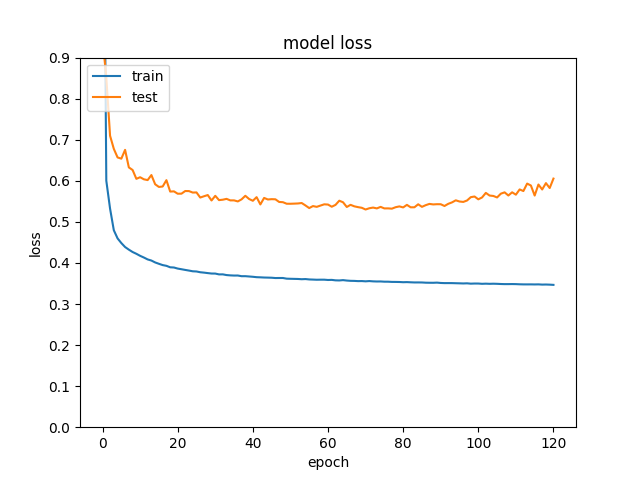

<IPython.core.display.Javascript object>


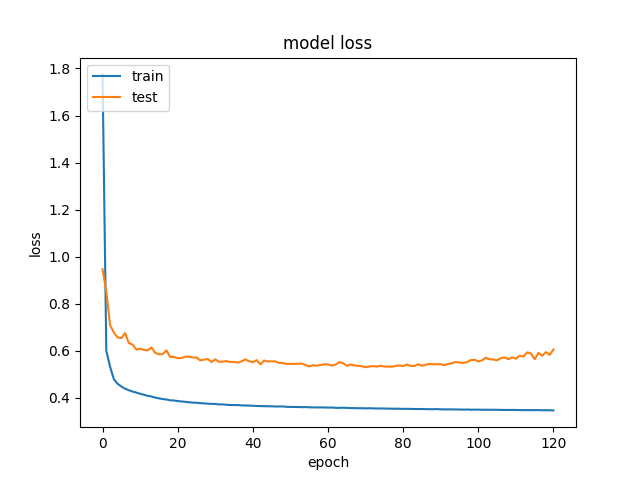

<IPython.core.display.Javascript object>


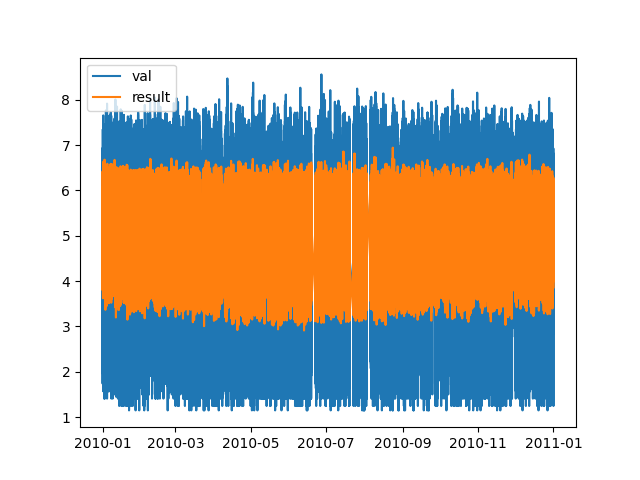

<IPython.core.display.Javascript object>


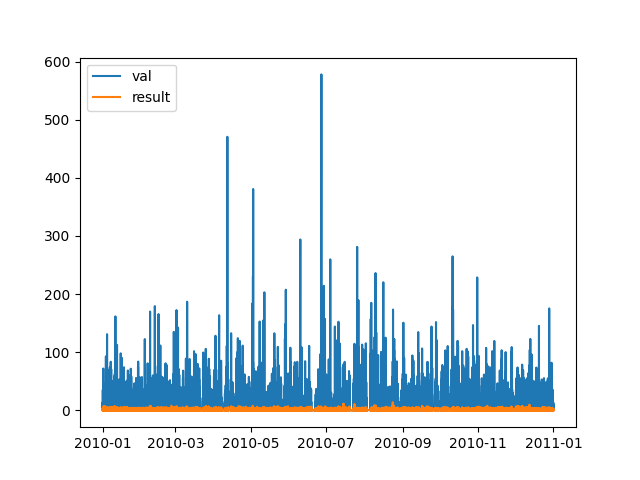

<IPython.core.display.Javascript object>


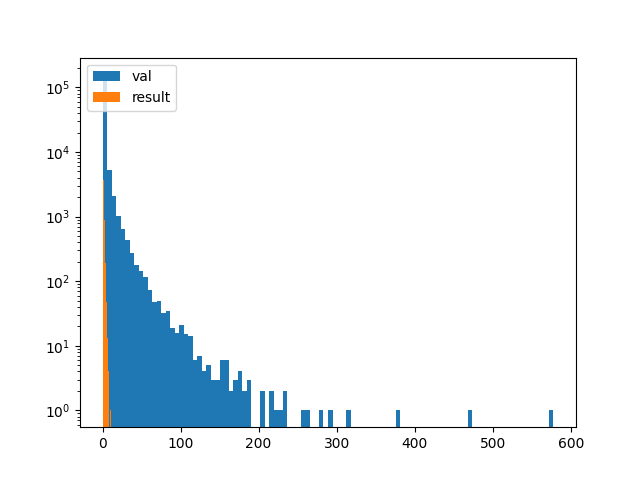

<IPython.core.display.Javascript object>


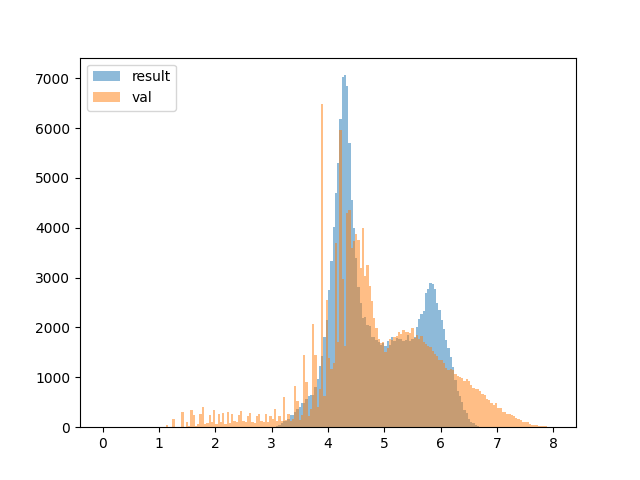

<IPython.core.display.Javascript object>


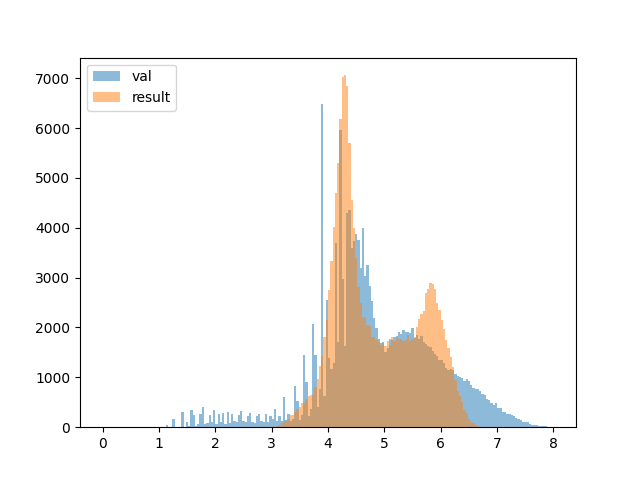

<IPython.core.display.Javascript object>


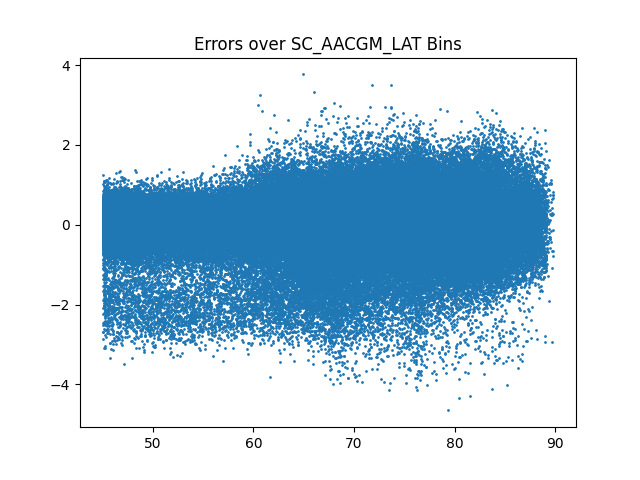

<IPython.core.display.Javascript object>


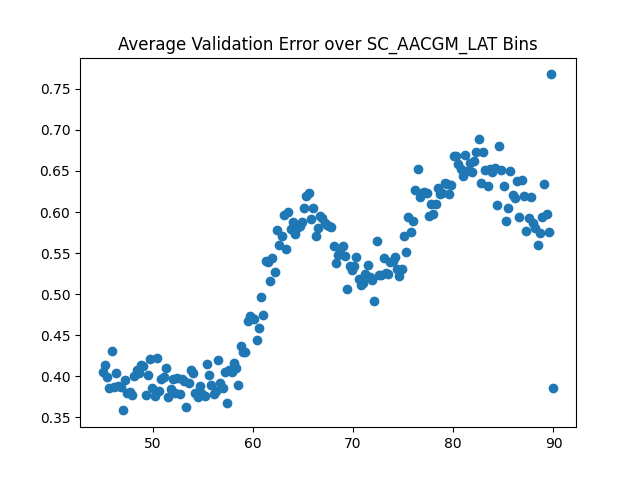

<IPython.core.display.Javascript object>


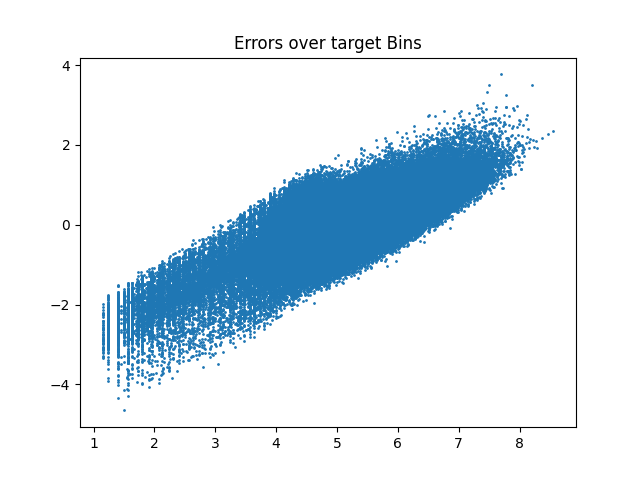

<IPython.core.display.Javascript object>


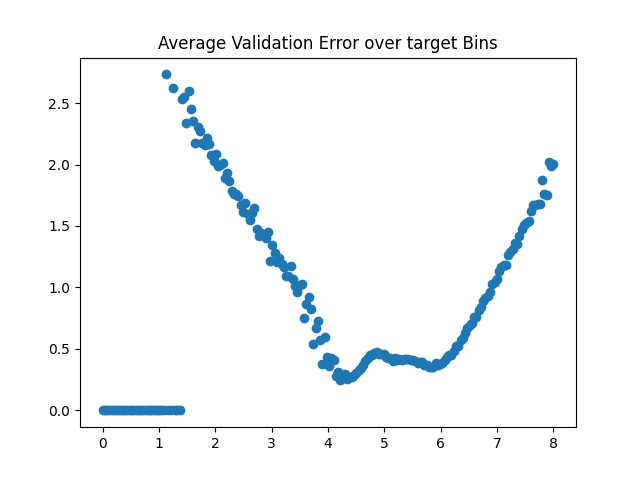

In [63]:
# from tensorflow.keras.layers import Input
# num_in = 59

# input1 = Input(shape=(num_in))
# model1 = Dense(256,  activation='relu')(input1)
# model1 = model1 = Dropout(0.5)(model1)
# model1 = Dense(64, activation='relu')(model1)
# model1 = Dense(32, activation='relu')(model1)
# model1 = Dense(int(256),   activation='relu')(model1)
# model1 = Dense(int(1024),  activation='relu')(model1)
# model1 = Dense(int(256),  activation='relu')(model1)
# model1 = Dense(32, activation='relu')(model1)
# model1 = Dense(4, activation='relu')(model1)
# model1 = Dense(1, activation='linear' )(model1)


# output = model1
# model = tensorflow.keras.models.Model(inputs=input1, outputs=output)
# #compile model using accuracy to measure model performance
# model.compile(loss='mse', optimizer=tf.keras.optimizers.Adam(
#     learning_rate=0.001),metrics=['mse'])
# model.summary()

# history = model.fit(X[:,:num_in], 
#                    y_train_log, 
#                     validation_data=(
#                         X_test[:,:num_in], 
#                         y_val_log,                                    ),
#                     batch_size=8192*4,epochs=1000,verbose=2,
#                    callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_loss',  restore_best_weights=True,
#              patience=50)])#


# plt.figure()
# # summarize history for loss
# plt.plot(history.history['loss'][:])
# plt.plot(history.history['val_loss'][:])
# plt.title('model loss')
# plt.ylabel('loss')
# plt.xlabel('epoch')
# plt.legend(['train', 'test'], loc='upper left')
# plt.ylim([0,.9])
# plt.show()

# plt.figure()
# # summarize history for loss
# plt.plot(history.history['loss'][:])
# plt.plot(history.history['val_loss'][:])
# plt.title('model loss')
# plt.ylabel('loss')
# plt.xlabel('epoch')
# plt.legend(['train', 'test'], loc='upper left')
# plt.show()

# results = model.predict(X_test)

# df_results = pd.DataFrame(data=results, index = y_val_log.index)

# model_3 = df_results

# plot_model(df_results)

INFO:tensorflow:Assets written to: model_3_counts_HB_all/assets


<IPython.core.display.Javascript object>


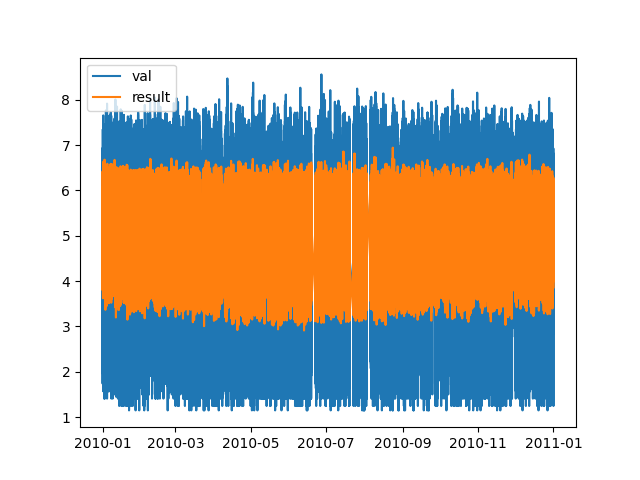

<IPython.core.display.Javascript object>


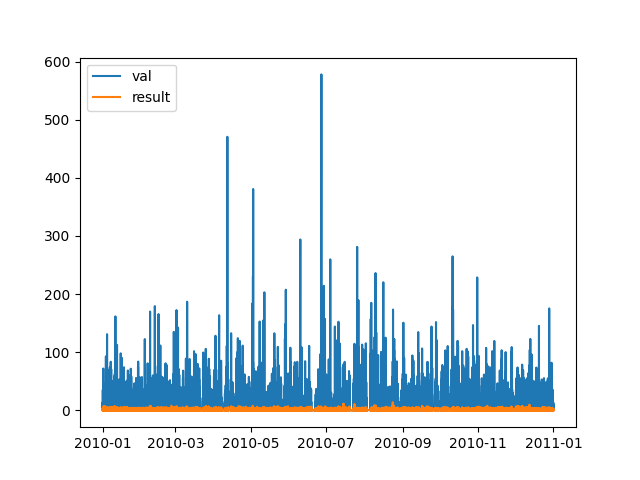

<IPython.core.display.Javascript object>


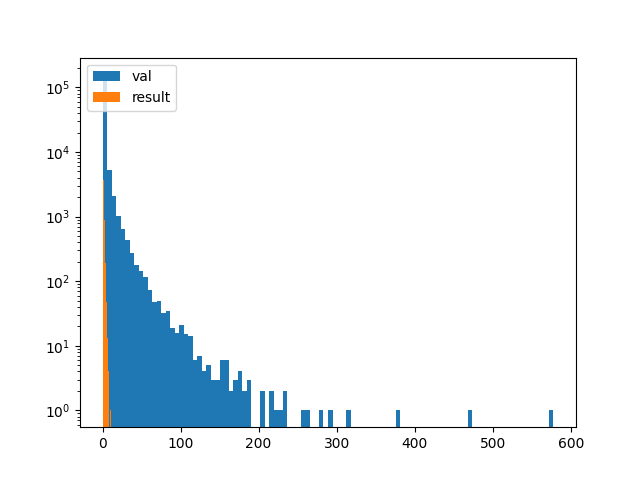

<IPython.core.display.Javascript object>


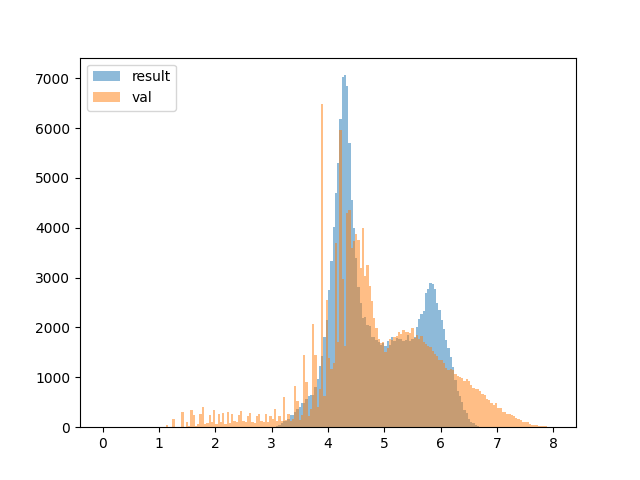

<IPython.core.display.Javascript object>


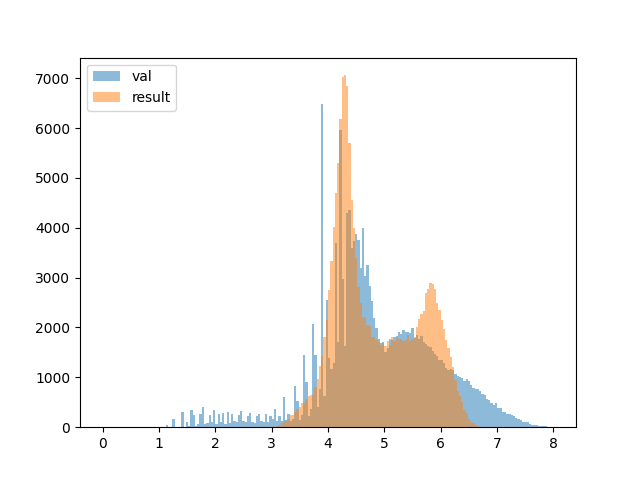

<IPython.core.display.Javascript object>


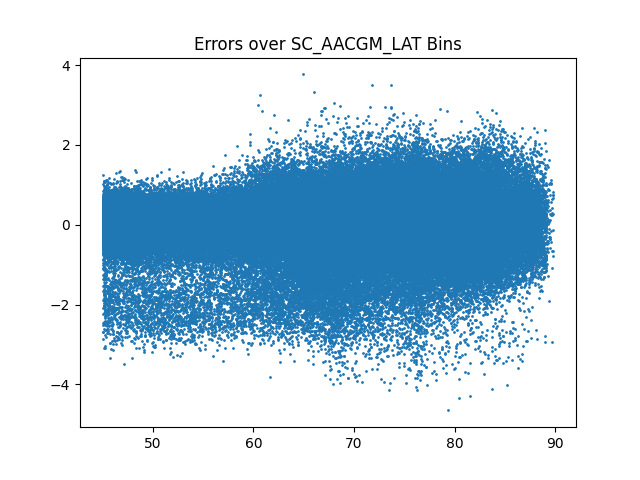

<IPython.core.display.Javascript object>


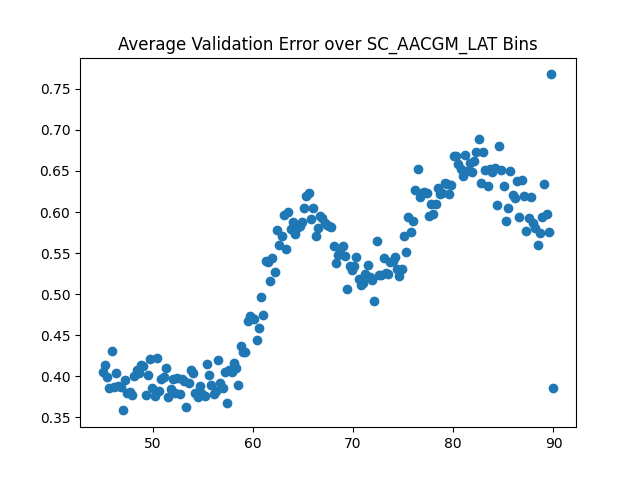

<IPython.core.display.Javascript object>


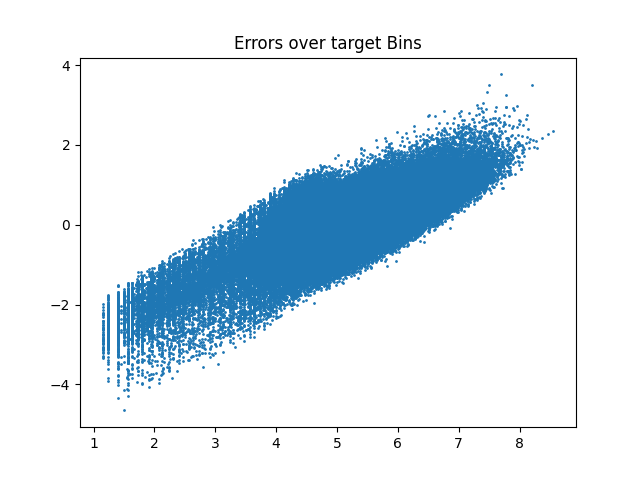

<IPython.core.display.Javascript object>


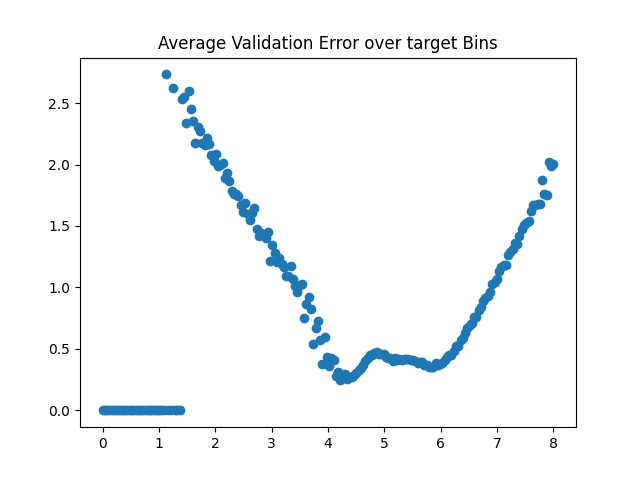

In [64]:
filename='model_3_counts_HB_all'
#model.save(filename)
model = tensorflow.keras.models.load_model(filename)
# model.save_weights( filename+'.h5')


results = model.predict(X_test)

df_results = pd.DataFrame(data=results, index = df_val.index)

model_3 = df_results
plot_model(df_results)

In [ ]:
## Now repeat training for each channel separately

# LOAD THE COMBINED SOURTHERN HEMISPHERE AND NORTHERN HEMISPHERE AS CREATED ABOVE

filescname = "./all_sc_df_1min_SH_NH_combined.pkl"
pickle_file = open(filescname, "rb") 
df_cumulative =pickle.load(pickle_file)

cols_to_drop_validation = [c for c in df_cumulative.columns if ('SC_AACGM_LON' in c) | ('STD' in c) | ('Kp' in c )| ('Clock' in c) | ('AVG' in c) | ('SC_AACGM_LTIME'==c)]
df_cumulative = df_cumulative.drop(columns=cols_to_drop_validation)
df_cumulative=df_cumulative.dropna()
#### GET RID OF THE REALLY SMALL VALUES
df_cumulative = df_cumulative.drop( df_cumulative.index[(df_cumulative['ELE_TOTAL_COUNTS']) < 3])

# Separate training and testing data
mask_val = [(df_cumulative.index.year == 2010) & (df_cumulative['SC_ID'].values==16)]
df_val = df_cumulative[mask_val[0]].copy(deep=True)
df_train = df_cumulative.copy(deep=True).drop( df_cumulative.index[mask_val[0]])


del df_cumulative


# Construct X and y
feature_cols = [c for c in df_train.columns if not 'ELE' in c]

X_val = df_val[feature_cols].copy(deep=True)
#y_val = df_val[['ELE_COUNT_1','ELE_COUNT_2', 'ELE_COUNT_3', 'ELE_COUNT_4', 'ELE_COUNT_5', 'ELE_COUNT_6', 'ELE_COUNT_7', 'ELE_COUNT_8', 'ELE_COUNT_9', 'ELE_COUNT_10', 'ELE_COUNT_11', 'ELE_COUNT_12', 'ELE_COUNT_13', 'ELE_COUNT_14', 'ELE_COUNT_15', 'ELE_COUNT_16', 'ELE_COUNT_17', 'ELE_COUNT_18', 'ELE_COUNT_19']].copy(deep=True)

y_val = df_val[['ELE_COUNT_2', 'ELE_COUNT_3', 'ELE_COUNT_4', 'ELE_COUNT_5', 'ELE_COUNT_6', 'ELE_COUNT_7', 'ELE_COUNT_8', 'ELE_COUNT_9', 'ELE_COUNT_10', 'ELE_COUNT_11', 'ELE_COUNT_12', 'ELE_COUNT_13', 'ELE_COUNT_14', 'ELE_COUNT_15', 'ELE_COUNT_16', 'ELE_COUNT_17', 'ELE_COUNT_18', 'ELE_COUNT_19']].copy(deep=True)
X_train = df_train[feature_cols].copy(deep=True)
y_train = df_train[['ELE_COUNT_2', 'ELE_COUNT_3', 'ELE_COUNT_4', 'ELE_COUNT_5', 'ELE_COUNT_6', 'ELE_COUNT_7', 'ELE_COUNT_8', 'ELE_COUNT_9', 'ELE_COUNT_10', 'ELE_COUNT_11', 'ELE_COUNT_12', 'ELE_COUNT_13', 'ELE_COUNT_14', 'ELE_COUNT_15', 'ELE_COUNT_16', 'ELE_COUNT_17', 'ELE_COUNT_18', 'ELE_COUNT_19']].copy(deep=True)
scaler_X = preprocessing.RobustScaler()
scaler_X = scaler_X.fit(X_train.values)
X_val_scaled = scaler_X.transform(X_val.values)
X_train_scaled = scaler_X.transform(X_train.values)

numFeatures = len(X_train.columns.to_list())
feature_labels = X_train.columns.to_list()
y_train_erg = y_train.copy(deep=True) * (1.60218e-12)
y_val_erg = y_val.copy(deep=True) * (1.60218e-12)

y_train[y_train == 0] = 0.0001
y_val[y_val == 0] = 0.0001
y_train_log = np.log10(y_train.copy(deep=True))
y_val_log = np.log10(y_val.copy(deep=True))
X = np.array(X_train_scaled, dtype=np.float32)
X_test = np.array(X_val_scaled, dtype=np.float32)

del df_train

from tensorflow.keras.layers import Input
num_in = 148

input1 = Input(shape=(num_in))
model1 = Dense(256,  activation='relu')(input1)
model1 = model1 = Dropout(0.5)(model1)
model1 = Dense(64, activation='relu')(model1)
model1 = Dense(32, activation='relu')(model1)
model1 = Dense(int(256),   activation='relu')(model1)
model1 = Dense(int(1024),  activation='relu')(model1)
model1 = Dense(int(256),  activation='relu')(model1)
model1 = Dense(32, activation='relu')(model1)
model1 = Dense(4, activation='relu')(model1)
model1 = Dense(18, activation='linear' )(model1)


output = model1
model = tensorflow.keras.models.Model(inputs=input1, outputs=output)
#compile model using accuracy to measure model performance
model.compile(loss='mse', optimizer=tf.keras.optimizers.Adam(
    learning_rate=0.001),metrics=['mse'])
model.summary()

history = model.fit(X[:,:num_in], 
                   y_train_log, 
                    validation_data=(
                        X_test[:,:num_in], 
                        y_val_log,                                    ),
                    batch_size=8192*4,epochs=1000,verbose=2,
                   callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_loss',  restore_best_weights=True,
             patience=50)])#


plt.figure()
# summarize history for loss
plt.plot(history.history['loss'][:])
plt.plot(history.history['val_loss'][:])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.ylim([0,.9])
plt.show()

plt.figure()
# summarize history for loss
plt.plot(history.history['loss'][:])
plt.plot(history.history['val_loss'][:])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

results = model.predict(X_test)

df_results = pd.DataFrame(data=results, index = y_val_log.index)

model_3 = df_results



Model: "functional_27"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_15 (InputLayer)        [(None, 148)]             0         
_________________________________________________________________
dense_126 (Dense)            (None, 256)               38144     
_________________________________________________________________
dropout_14 (Dropout)         (None, 256)               0         
_________________________________________________________________
dense_127 (Dense)            (None, 64)                16448     
_________________________________________________________________
dense_128 (Dense)            (None, 32)                2080      
_________________________________________________________________
dense_129 (Dense)            (None, 256)               8448      
_________________________________________________________________
dense_130 (Dense)            (None, 1024)            

In [ ]:
filename='model_3_counts_channels'
model.save(filename)
model = tensorflow.keras.models.load_model(filename)
# model.save_weights( filename+'.h5')


results = model.predict(X_test)

df_results = pd.DataFrame(data=results, index = df_val.index)

model_3 = df_results